# Машинное обучение, ФКН ВШЭ

# Практическое задание 12. Несбалансированные задачи

## Общая информация
Дата выдачи: 06.06.2023

Мягкий и жесткий дедлайны: 20.06.2023 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-xx-Username.ipynb

Username — ваша фамилия и имя на латинице именно в таком порядке

## О задании

В этом задании мы разберем основные техники работы в задачах, где один из классов занимает существенно меньшую долю выборки, чем остальные. Для простоты мы обойдемся бинарной задачей, тем не менее, во многом данные методы можно перенести и на задачи с б**о**льшим числом классов. Кроме того, вы получите очередной бесценный опыт исследования случайной библиотеки случайных индусов с нуля.

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')

from tqdm.auto import tqdm

**Задание -1 (1 балл)**. EDA

В качестве данных для нашей работы возьмем выложенный на kaggle датасет транзакций, в котором нужно выискивать мошеннические проводки: [клик](https://www.kaggle.com/mlg-ulb/creditcardfraud). Данная задача по определению подходит под несбалансированную, что можно сказать даже без наличия каких-либо данных (понятно, что среди всех транзакций клиентов очень малая часть будет мошеннической).

Загрузим данные, проведем некоторые классические манипуляции.

In [2]:
"""%%bash
kaggle datasets download -d mlg-ulb/creditcardfraud
unzip creditcardfraud.zip""";

In [3]:
df = pd.read_csv('creditcard.csv')

In [4]:
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,4.356170,-1.593105,2.711941,-0.689256,4.626942,-0.924459,1.107641,1.991691,0.510632,-0.682920,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,-0.975926,-0.150189,0.915802,1.214756,-0.675143,1.164931,-0.711757,-0.025693,-1.221179,-1.545556,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,-0.484782,0.411614,0.063119,-0.183699,-0.510602,1.329284,0.140716,0.313502,0.395652,-0.577252,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,-0.399126,-1.933849,-0.962886,-1.042082,0.449624,1.962563,-0.608577,0.509928,1.113981,2.897849,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


Наши данные были анонимизированы. Мы имеем 30 признаков, из которых 28 - это результаты PCA-преобразования на исходном датасете. Еще 2 признака представляют собой время в секундах, прошедшее с момента первой транзакции в датасете, и размер транзакции. Скажите, какова доля положительных объектов в выборке?

In [5]:
print("Class = 0:", df[df["Class"] == 1].shape[0])
print("Class = 0:", '{:.3f}'.format(df[df["Class"] == 1].shape[0] / df.shape[0] * 100), "%")
print("Class = 1:", df.shape[0])

Class = 0: 492
Class = 0: 0.173 %
Class = 1: 284807


Начнем с обработки времени. Секунды сами по себе не несут большой информации о зависимостях в данных, попробуйте по ним создать признаки "час" (от 0 до 23) и "день" (от 0 до ...) в аналогичной манере (принимая первый объект выборки за начальную точку). Сколько дней покрывают данные?

In [6]:
df['Day'] = df['Time'] // (60*60*24)
df['Hour'] = (df['Time'] - df['Day']*60*60*24) // 3600
df[['Day', 'Hour']]

,Day,Hour
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0
...,...,...
284802,1.0,23.0
284803,1.0,23.0
284804,1.0,23.0
284805,1.0,23.0


Постройте следующие графики:

1. Распределение числа транзакций по каждому часу (line-plot).
2. Распределение доли мошеннических транзакций по каждому часу (line-plot)
3. То же самое для дней (здесь можно использовать bar-plot, так как дней должно быть немного).

Какие выводы можно сделать из графиков? На ваш взгляд, как можно связать полученные нами часы с реальными часами в сутках?

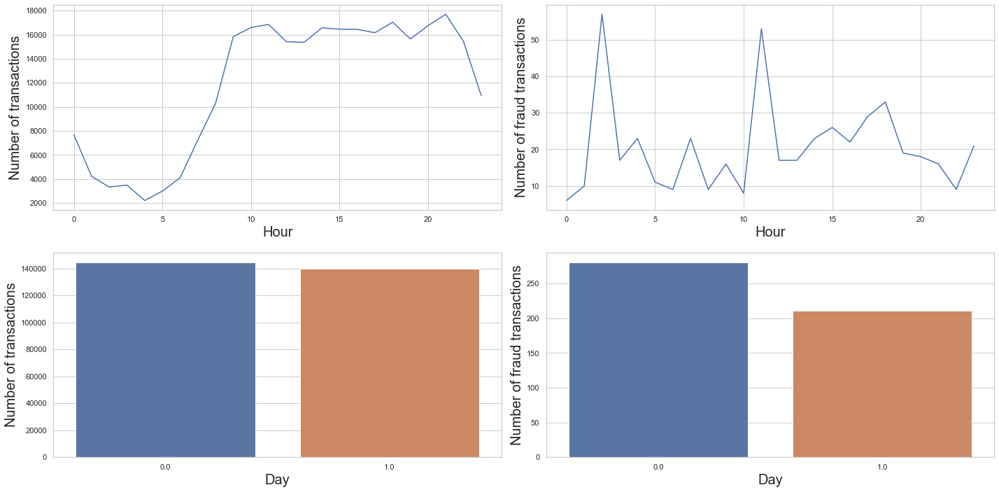

In [7]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))

sns.lineplot(y=df['Hour'].value_counts().sort_index(), x=df['Hour'].unique(), ax=axes[0][0])
axes[0][0].set_xlabel('Hour', fontsize=20)
axes[0][0].set_ylabel('Number of transactions', fontsize=20)

sns.lineplot(y=df[df['Class'] == 1]['Hour'].value_counts().sort_index(), x=df['Hour'][df['Class']==1].unique(), ax=axes[0][1])
axes[0][1].set_xlabel('Hour', fontsize=20)
axes[0][1].set_ylabel('Number of fraud transactions', fontsize=20)

sns.barplot(y=df['Day'].value_counts().sort_index(), x=df['Day'].unique(), ax=axes[1][0])
axes[1][0].set_xlabel('Day', fontsize=20)
axes[1][0].set_ylabel('Number of transactions', fontsize=20)

sns.barplot(y=df[df['Class']==1]['Day'].value_counts().sort_index(), x=df[df['Class']==1]['Day'].unique(), ax=axes[1][1])
axes[1][1].set_xlabel('Day', fontsize=20)
axes[1][1].set_ylabel('Number of fraud transactions', fontsize=20)


plt.tight_layout()
plt.show()

*Первый график: очень похоже на правду. Человеческим особям свойственно спать по ночам, а проводить транзакции уже после пробуждения (на графике соответсвенно 10 час).*

*Второй график: видно, что анамально много машеннических транзакций было проведено примерно в 3 и 12 часов соответсвенно. Можно, в это время были идеальные условия для машенничества*

*Третий график: Человеческим особи, в совокупности, проводят примерно одинаковое скмарное количество транзакций в день*


*Четвёртый график: мошенники чуть успокоились на второй день (примерно на 70 транзакций меньше), но ничего точно пока сказать нельзя, абсолютные значения очень маленькие по сравнению с общим количеством кранзакций, данное изменение может быть статистически не значемым*

С анонимизированными признаками вряд ли можно придумать что-то интересное. Попробуйте (например, с помощью корреляции?) выбрать несколько наиболее важных признаков и поглядеть на различия в их распределении для разных классов.

In [8]:
corr = df.corr()
corr

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Day,Hour
Time,1.000000,1.173963e-01,-1.059333e-02,-4.196182e-01,-1.052602e-01,1.730721e-01,-6.301647e-02,8.471437e-02,-3.694943e-02,-8.660434e-03,3.061663e-02,-2.476894e-01,1.243481e-01,-6.590202e-02,-9.875682e-02,-1.834533e-01,1.190287e-02,-7.329721e-02,9.043813e-02,2.897530e-02,-5.086602e-02,4.473573e-02,1.440591e-01,5.114236e-02,-1.618187e-02,-2.330828e-01,-4.140710e-02,-5.134591e-03,-9.412688e-03,-0.010596,-0.012323,0.896490,0.415575
V1,0.117396,1.000000e+00,4.697350e-17,-1.424390e-15,1.755316e-17,6.391162e-17,2.398071e-16,1.991550e-15,-9.490675e-17,2.169581e-16,7.433820e-17,2.438580e-16,2.422086e-16,-2.115458e-16,9.352582e-16,-3.252451e-16,6.308789e-16,-5.011524e-16,2.870125e-16,1.818128e-16,1.036959e-16,-1.755072e-16,7.477367e-17,9.808705e-16,7.354269e-17,-9.805358e-16,-8.621897e-17,3.208233e-17,9.820892e-16,-0.227709,-0.101347,0.131838,-0.005214
V2,-0.010593,4.697350e-17,1.000000e+00,2.512175e-16,-1.126388e-16,-2.039868e-16,5.024680e-16,3.966486e-16,-4.413984e-17,-5.728718e-17,-4.782388e-16,9.468995e-16,-6.588252e-16,3.854521e-16,-2.541036e-16,2.831060e-16,4.934097e-17,-9.883008e-16,2.636654e-16,9.528280e-17,-9.309954e-16,8.444409e-17,2.500830e-16,1.059562e-16,-8.142354e-18,-4.261894e-17,2.601622e-16,-4.478472e-16,-3.676415e-16,-0.531409,0.091289,-0.015474,0.007802
V3,-0.419618,-1.424390e-15,2.512175e-16,1.000000e+00,-3.416910e-16,-1.436514e-15,1.431581e-15,2.168574e-15,3.433113e-16,-4.233770e-16,6.289267e-16,-5.501758e-17,2.206522e-16,-6.883375e-16,4.271336e-16,1.122756e-16,1.183364e-15,4.576619e-17,5.427965e-16,2.576773e-16,-9.429297e-16,-2.971969e-17,4.648259e-16,2.115206e-17,-9.351637e-17,4.771164e-16,6.521501e-16,6.239832e-16,7.726948e-16,-0.210880,-0.192961,-0.450604,-0.021569
V4,-0.105260,1.755316e-17,-1.126388e-16,-3.416910e-16,1.000000e+00,-1.940929e-15,-2.712659e-16,1.556330e-16,5.195643e-16,3.859585e-16,6.055490e-16,-2.083600e-16,-5.657963e-16,-1.506129e-16,-8.522435e-17,-1.507718e-16,-6.939204e-16,-4.397925e-16,1.493667e-16,-2.656938e-16,-3.223123e-16,-9.976950e-17,2.099922e-16,6.002528e-17,2.229738e-16,5.394585e-16,-6.179751e-16,-6.403423e-17,-5.863664e-17,0.098732,0.133447,-0.098590,-0.035063
V5,0.173072,6.391162e-17,-2.039868e-16,-1.436514e-15,-1.940929e-15,1.000000e+00,7.926364e-16,-4.209851e-16,7.589187e-16,4.205206e-16,-6.601716e-16,7.342759e-16,3.761033e-16,-9.578659e-16,-3.634803e-16,-5.132620e-16,-3.517076e-16,1.425729e-16,1.109525e-15,-3.138234e-16,2.076048e-16,-1.368701e-16,5.060029e-16,1.637596e-16,-9.286095e-16,5.625102e-16,9.144690e-16,4.465960e-16,-3.299167e-16,-0.386356,-0.094974,0.207430,-0.035134
V6,-0.063016,2.398071e-16,5.024680e-16,1.431581e-15,-2.712659e-16,7.926364e-16,1.000000e+00,1.429426e-16,-1.707421e-16,1.114447e-16,2.850776e-16,4.865799e-16,2.140589e-16,-2.268061e-16,3.452801e-16,-6.368111e-18,-2.477917e-16,3.567582e-16,2.811474e-16,2.717167e-16,1.898638e-16,-1.575903e-16,-3.362902e-16,-7.232186e-17,-1.261867e-15,1.081933e-15,-2.378414e-16,-2.623818e-16,4.813155e-16,0.215981,-0.043643,-0.059994,-0.018945
V7,0.084714,1.991550e-15,3.966486e-16,2.168574e-15,1.556330e-16,-4.209851e-16,1.429426e-16,1.000000e+00,-8.691834e-17,7.933251e-16,3.043333e-17,-1.084105e-15,1.510045e-15,-9.892325e-17,-1.729462e-16,1.936832e-17,2.893672e-16,1.149692e-15,-1.116789e-16,-2.874017e-16,1.744242e-16,1.938604e-16,-1.058131e-15,2.327911e-16,-2.589727e-17,1.174169e-15,-7.334507e-16,-5.886825e-16,-6.836764e-17,0.397311,-0.187257,0.097864,-0.009729
V8,-0.036949,-9.490675e-17,-4.413984e-17,3.433113e-16,5.195643e-16,7.589187e-16,-1.707421e-16,-8.691834e-17,1.000000e+00,2.900829e-16,9.051847e-17,1.954747e-16,-6.266057e-17,-2.382948e-16,-1.131098e-16,2.021491e-16,5.027192e-16,-3.508777e-16,-4.093852e-16,-5.339821e-16,-1.095534e-16,-2.412439e-16,5.475559e-16,3.897104e-16,-1.802967e-16,-1.390791e-16,-1.209975e-16,1.733633e-16,-4.484325e-16,-0.103079,0.019875,-0.056331,0.032106
V9,-0.008660,2.

In [9]:
#отсортируем по модулю значений кореляций признаков с таргетом и возьмём топ 7
ind = corr["Class"].abs().sort_values(ascending=False).head(7).index
ind

Index(['Class', 'V17', 'V14', 'V12', 'V10', 'V16', 'V3'], dtype='object')

*6 наиболее коррелирующих признаков*

In [10]:
ind = ind[1:]
corr["Class"].loc[ind]

V17   -0.326481
V14   -0.302544
V12   -0.260593
V10   -0.216883
V16   -0.196539
V3    -0.192961
Name: Class, dtype: float64

In [170]:
pip install seaborn --upgrade

Requirement already up-to-date: seaborn in c:\users\asus\anaconda3\lib\site-packages (0.12.2)Note: you may need to restart the kernel to use updated packages.



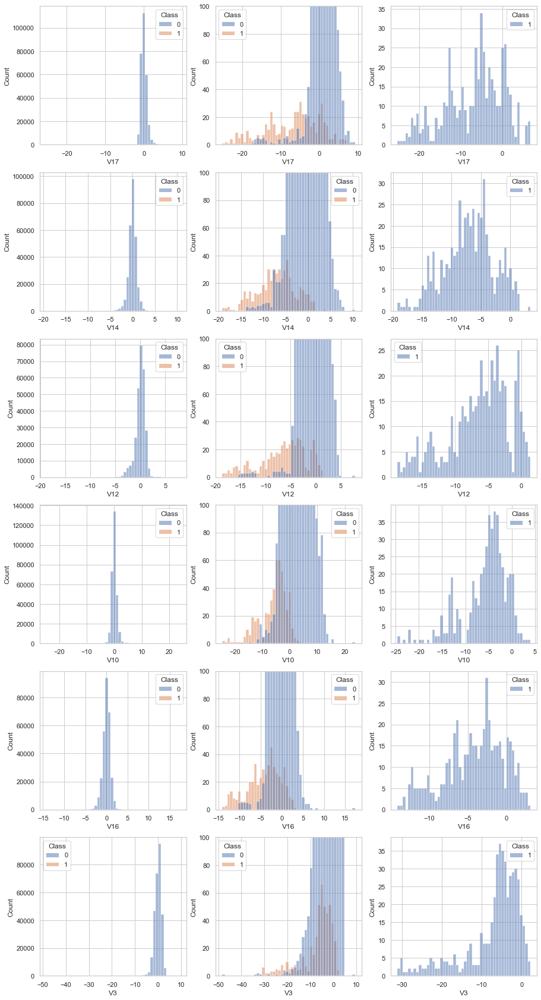

In [11]:
fig, axes = plt.subplots(6, 3, figsize=(15, 30))

for i, feature in enumerate(ind):
    sns.histplot(data=df, x=feature, hue="Class", bins=50, ax=axes[i][0])
    sns.histplot(data=df, x=feature, hue="Class", color="orange", bins=50, ax=axes[i][1])
    axes[i][1].set_ylim(0, 100)
    sns.histplot(data=df[df["Class"] == 1], x=feature, hue="Class", color="orange", bins=50, ax=axes[i][2])

*в целом, действительно похоже на правду. В разспределениях признаков V17, V14, классы наиболее отделены дург от друга. А вот например V3 уже имеет сильное пересечение распределений, из-за чего будет труднее определить тип транзакции. Распределения в целом похожи на корявенье нормальные распределения*

Теперь давайте разделим данные. Отделите хронологически последние 20% транзакций и поделите их пополам (также хронологически, т.е. без перемешивания) на валидационные и тестовые. Это разбиение не совсем корректно (как можно было заметить, мошеннические транзакции имеют разное распределение во времени - по-хорошему, нам стоило бы выделить целые сутки записей как под валидацию, так и под тест), тем не менее, мы не сможем получить больше данных для адекватного контроля, поэтому обойдемся этим. 

In [12]:
from sklearn.model_selection import train_test_split

df_sorted = df.sort_values('Time')

# Определение границы, отделяющей последние 20% транзакций
split_index = int(len(df_sorted) * 0.8)

# Разделение последних 20% транзакций на валидационную и тестовую выборки
validation_data, test_data = train_test_split(df_sorted[split_index:], test_size=0.5, shuffle=False)
train_data = df_sorted[:split_index]

X_train = train_data.drop('Class', axis=1)
y_train = train_data['Class']
X_test = test_data.drop('Class', axis=1)
y_test = test_data['Class']
X_val = validation_data.drop('Class', axis=1)
y_val = validation_data['Class']

# Часть 1. Несбалансированная классификация.

**Задание 0. (1 балл)**: перед началом работы давайте поговорим о том, как мы будем оценивать качество. Классические метрики для качества классификации чаще всего "ломаются" на задачах с сильным перекосом. Чему будет равно значение accuracy для наивного предсказания (= мажорный класс для каждого объекта)? (можете не отвечать, просто подумайте)

Из курса МО-1 вам уже известно, что мы можем использовать в таких задачах `AUC-PR` и получать адекватные показатели. Можно сказать, что `AUC-PR` представляет собой матожидание `precision` по распределению, заданному выигрышем в `recall` при смене порога. 

In [ ]:
#your code here

Тем не менее, существуют и другие, не менее интересные метрики. Одной из таких метрик является коэффициент Каппа Коэна, представляющий собой нормализованную `accuracy`:

$$\kappa = \frac{p_o - p_e}{1 - p_e}$$

Данная метрика служит в качестве меры согласованности между двумя независимыми предсказателями, но ничего не знает про "верные" и "предсказанные" метки (в отличие от многих других метрик машинного обучения). Здесь $p_o$ - доля согласованных предсказаний, а $p_e$ - доля согласованных предсказаний, которая могла бы получиться при случайных ответах предсказателей. В нашем случае это работает так:

• В качестве $p_o$ берем accuracy

• В качестве $p_e$ примем следующую величину - вероятность случайного соглашения позитивных ответов (произведение долей позитивных ответов в обоих предсказаниях) плюс вероятность случайного соглашения негативных ответов (произведение долей негативных ответов в обоих предсказаниях)

Метрика принимает значения от -1 до 1, где 1 - полная согласованность, 0 - согласованность на уровне рандома, -1 - совсем плохо. Как уже говорилось, метрика не различает "верные" и "предсказанные" метки, поэтому является симметричной (можете использовать это для отладки):

In [ ]:
#your code here

Еще одной метрикой в такой задаче служит коэффициент корреляции Мэтьюза, выражающийся в терминах матрицы ошибок следующим образом:

$$\text{MCC} = \frac{TP\times TN - FP \times FN}{\sqrt{(TP+FP)(TP+FN)(TN+FP)(TN+FN)}}$$ 

Метрика принимает значения от -1 до 1, интерпретируемые аналогичным образом. 

In [ ]:
#your code here

Обратите внимание, что эти метрики вычисляются на бинаризованных предсказаниях, поэтому может иметь смысл дополнительная настройка порога бинаризации.

Давайте проверим, что наши метрики действительно подходят под задачу. Вычислите их значения для наивного предсказания (aka мажорный класс для всех объектов):

In [13]:
from sklearn.metrics import auc, average_precision_score, cohen_kappa_score, matthews_corrcoef
from sklearn.metrics import precision_recall_curve, recall_score, precision_score, roc_curve
y = df['Class']
y_naive_pred = pd.Series(0, index=y.index)

In [14]:
pr, rec, _ = precision_recall_curve(y, y_naive_pred)
print('AUC-PR:\t\t   %.4f' % auc(pr, rec))
print('Cohen kappa score: %.4f' % cohen_kappa_score(y, y_naive_pred))
print('Matthews corrcoef: %.4f' % matthews_corrcoef(y, y_naive_pred))

AUC-PR:		   0.4991
Cohen kappa score: 0.0000
Matthews corrcoef: 0.0000


Давайте запустим бейзлайн-решение для нашей задачи. С чего же начнем? Возьмите `catboost` и обучите его классификатор на наших данных (используйте все признаки). Вычислите значения всех метрик на тестовой части, для контроля переобучения используйте валидационную (здесь и далее везде, где фигурирует `catboost`). 

In [105]:
!pip install catboost

In [15]:
from catboost import CatBoostClassifier

In [16]:
cbc = CatBoostClassifier(metric_period=250)
cbc.fit(X_train, y_train)
y_pred = cbc.predict(X_test)

Learning rate set to 0.104628
0:	learn: 0.3704814	total: 194ms	remaining: 3m 14s
250:	learn: 0.0009633	total: 10.8s	remaining: 32.2s
500:	learn: 0.0003980	total: 22.2s	remaining: 22.1s
750:	learn: 0.0001664	total: 35.5s	remaining: 11.8s
999:	learn: 0.0000954	total: 46.7s	remaining: 0us


In [17]:
def counting_metrics(y_test, y_pred):
    pr, rec, _ = precision_recall_curve(y_test, y_pred)
    print('AUC-PR:\t\t   %.4f' % auc(pr, rec))
    print('Cohen kappa score: %.4f' % cohen_kappa_score(y_test, y_pred))
    print('Matthews corrcoef: %.4f' % matthews_corrcoef(y_test, y_pred))
    return

In [18]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7569
Cohen kappa score: 0.7498
Matthews corrcoef: 0.7536


In [19]:
cbc_val = CatBoostClassifier()

params = {'learning_rate': np.linspace(1e-3, 1, 8),
        'depth': np.arange(2, 10, 2),
        'l2_leaf_reg': np.arange(1, 10, 2),
        'iterations': [1000]}

cbc_val.grid_search(params, X=X_val, y=y_val, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6896691	test: 0.6896785	best: 0.6896785 (0)	total: 6.25ms	remaining: 6.24s
1:	learn: 0.6862977	test: 0.6863228	best: 0.6863228 (1)	total: 12.4ms	remaining: 6.21s
2:	learn: 0.6829496	test: 0.6829640	best: 0.6829640 (2)	total: 18.6ms	remaining: 6.18s
3:	learn: 0.6796680	test: 0.6796888	best: 0.6796888 (3)	total: 24.7ms	remaining: 6.14s
4:	learn: 0.6765582	test: 0.6765784	best: 0.6765784 (4)	total: 30.3ms	remaining: 6.04s
5:	learn: 0.6735238	test: 0.6735404	best: 0.6735404 (5)	total: 36.2ms	remaining: 6s
6:	learn: 0.6697753	test: 0.6697899	best: 0.6697899 (6)	total: 42ms	remaining: 5.95s
7:	learn: 0.6659815	test: 0.6660102	best: 0.6660102 (7)	total: 47.9ms	remaining: 5.94s
8:	learn: 0.6626199	test: 0.6626697	best: 0.6626697 (8)	total: 53.5ms	remaining: 5.89s
9:	learn: 0.6596405	test: 0.6596908	best: 0.6596908 (9)	total: 60.7ms	remaining: 6.01s
10:	learn: 0.6566124	test: 0.6566667	best: 0.6566667 (10)	total: 66.4ms	remaining: 5.97s
11:	learn: 0.6536597	test: 0.6537089	best: 0.6

94:	learn: 0.4351614	test: 0.4346811	best: 0.4346811 (94)	total: 549ms	remaining: 5.22s
95:	learn: 0.4331815	test: 0.4326958	best: 0.4326958 (95)	total: 554ms	remaining: 5.21s
96:	learn: 0.4306755	test: 0.4301908	best: 0.4301908 (96)	total: 559ms	remaining: 5.2s
97:	learn: 0.4287184	test: 0.4282261	best: 0.4282261 (97)	total: 564ms	remaining: 5.19s
98:	learn: 0.4266846	test: 0.4261872	best: 0.4261872 (98)	total: 569ms	remaining: 5.18s
99:	learn: 0.4242272	test: 0.4237240	best: 0.4237240 (99)	total: 575ms	remaining: 5.17s
100:	learn: 0.4222606	test: 0.4217526	best: 0.4217526 (100)	total: 579ms	remaining: 5.16s
101:	learn: 0.4203655	test: 0.4198501	best: 0.4198501 (101)	total: 584ms	remaining: 5.14s
102:	learn: 0.4184830	test: 0.4179609	best: 0.4179609 (102)	total: 589ms	remaining: 5.13s
103:	learn: 0.4164788	test: 0.4159509	best: 0.4159509 (103)	total: 594ms	remaining: 5.12s
104:	learn: 0.4145477	test: 0.4140109	best: 0.4140109 (104)	total: 599ms	remaining: 5.11s
105:	learn: 0.4125641	t

194:	learn: 0.2690718	test: 0.2680483	best: 0.2680483 (194)	total: 1.08s	remaining: 4.48s
195:	learn: 0.2678590	test: 0.2668281	best: 0.2668281 (195)	total: 1.09s	remaining: 4.47s
196:	learn: 0.2666866	test: 0.2656507	best: 0.2656507 (196)	total: 1.09s	remaining: 4.46s
197:	learn: 0.2655026	test: 0.2644617	best: 0.2644617 (197)	total: 1.1s	remaining: 4.46s
198:	learn: 0.2642519	test: 0.2632029	best: 0.2632029 (198)	total: 1.1s	remaining: 4.45s
199:	learn: 0.2628035	test: 0.2617516	best: 0.2617516 (199)	total: 1.11s	remaining: 4.44s
200:	learn: 0.2616343	test: 0.2605758	best: 0.2605758 (200)	total: 1.12s	remaining: 4.44s
201:	learn: 0.2604944	test: 0.2594307	best: 0.2594307 (201)	total: 1.12s	remaining: 4.43s
202:	learn: 0.2590810	test: 0.2580201	best: 0.2580201 (202)	total: 1.13s	remaining: 4.43s
203:	learn: 0.2579566	test: 0.2568922	best: 0.2568922 (203)	total: 1.13s	remaining: 4.42s
204:	learn: 0.2566868	test: 0.2556164	best: 0.2556164 (204)	total: 1.14s	remaining: 4.41s
205:	learn: 

296:	learn: 0.1647019	test: 0.1633268	best: 0.1633268 (296)	total: 1.62s	remaining: 3.83s
297:	learn: 0.1640415	test: 0.1626622	best: 0.1626622 (297)	total: 1.62s	remaining: 3.82s
298:	learn: 0.1633563	test: 0.1619719	best: 0.1619719 (298)	total: 1.63s	remaining: 3.82s
299:	learn: 0.1624971	test: 0.1611107	best: 0.1611107 (299)	total: 1.63s	remaining: 3.81s
300:	learn: 0.1615093	test: 0.1601237	best: 0.1601237 (300)	total: 1.64s	remaining: 3.81s
301:	learn: 0.1608158	test: 0.1594277	best: 0.1594277 (301)	total: 1.64s	remaining: 3.8s
302:	learn: 0.1601299	test: 0.1587360	best: 0.1587360 (302)	total: 1.65s	remaining: 3.79s
303:	learn: 0.1593527	test: 0.1579567	best: 0.1579567 (303)	total: 1.65s	remaining: 3.79s
304:	learn: 0.1585258	test: 0.1571277	best: 0.1571277 (304)	total: 1.66s	remaining: 3.78s
305:	learn: 0.1578874	test: 0.1564850	best: 0.1564850 (305)	total: 1.66s	remaining: 3.77s
306:	learn: 0.1572364	test: 0.1558287	best: 0.1558287 (306)	total: 1.67s	remaining: 3.77s
307:	learn:

395:	learn: 0.1005277	test: 0.0989264	best: 0.0989264 (395)	total: 2.15s	remaining: 3.28s
396:	learn: 0.1000388	test: 0.0984348	best: 0.0984348 (396)	total: 2.16s	remaining: 3.28s
397:	learn: 0.0995195	test: 0.0979140	best: 0.0979140 (397)	total: 2.16s	remaining: 3.27s
398:	learn: 0.0990112	test: 0.0974045	best: 0.0974045 (398)	total: 2.17s	remaining: 3.27s
399:	learn: 0.0985157	test: 0.0969061	best: 0.0969061 (399)	total: 2.17s	remaining: 3.26s
400:	learn: 0.0980190	test: 0.0964075	best: 0.0964075 (400)	total: 2.18s	remaining: 3.25s
401:	learn: 0.0975353	test: 0.0959224	best: 0.0959224 (401)	total: 2.18s	remaining: 3.25s
402:	learn: 0.0970313	test: 0.0954169	best: 0.0954169 (402)	total: 2.19s	remaining: 3.24s
403:	learn: 0.0965380	test: 0.0949224	best: 0.0949224 (403)	total: 2.19s	remaining: 3.23s
404:	learn: 0.0960550	test: 0.0944378	best: 0.0944378 (404)	total: 2.2s	remaining: 3.23s
405:	learn: 0.0955599	test: 0.0939412	best: 0.0939412 (405)	total: 2.2s	remaining: 3.22s
406:	learn: 

496:	learn: 0.0619321	test: 0.0601502	best: 0.0601502 (496)	total: 2.69s	remaining: 2.72s
497:	learn: 0.0616483	test: 0.0598648	best: 0.0598648 (497)	total: 2.69s	remaining: 2.71s
498:	learn: 0.0613752	test: 0.0595897	best: 0.0595897 (498)	total: 2.7s	remaining: 2.71s
499:	learn: 0.0611042	test: 0.0593166	best: 0.0593166 (499)	total: 2.7s	remaining: 2.7s
500:	learn: 0.0608304	test: 0.0590411	best: 0.0590411 (500)	total: 2.71s	remaining: 2.7s
501:	learn: 0.0605529	test: 0.0587619	best: 0.0587619 (501)	total: 2.71s	remaining: 2.69s
502:	learn: 0.0602832	test: 0.0584900	best: 0.0584900 (502)	total: 2.72s	remaining: 2.69s
503:	learn: 0.0600024	test: 0.0582080	best: 0.0582080 (503)	total: 2.72s	remaining: 2.68s
504:	learn: 0.0597296	test: 0.0579335	best: 0.0579335 (504)	total: 2.73s	remaining: 2.67s
505:	learn: 0.0594595	test: 0.0576618	best: 0.0576618 (505)	total: 2.73s	remaining: 2.67s
506:	learn: 0.0591903	test: 0.0573909	best: 0.0573909 (506)	total: 2.74s	remaining: 2.66s
507:	learn: 0.

598:	learn: 0.0398446	test: 0.0379060	best: 0.0379060 (598)	total: 3.21s	remaining: 2.15s
599:	learn: 0.0396768	test: 0.0377369	best: 0.0377369 (599)	total: 3.22s	remaining: 2.15s
600:	learn: 0.0395184	test: 0.0375771	best: 0.0375771 (600)	total: 3.22s	remaining: 2.14s
601:	learn: 0.0393536	test: 0.0374112	best: 0.0374112 (601)	total: 3.23s	remaining: 2.13s
602:	learn: 0.0391981	test: 0.0372539	best: 0.0372539 (602)	total: 3.23s	remaining: 2.13s
603:	learn: 0.0390351	test: 0.0370897	best: 0.0370897 (603)	total: 3.24s	remaining: 2.12s
604:	learn: 0.0388774	test: 0.0369305	best: 0.0369305 (604)	total: 3.25s	remaining: 2.12s
605:	learn: 0.0387205	test: 0.0367721	best: 0.0367721 (605)	total: 3.25s	remaining: 2.11s
606:	learn: 0.0385698	test: 0.0366196	best: 0.0366196 (606)	total: 3.26s	remaining: 2.11s
607:	learn: 0.0384102	test: 0.0364589	best: 0.0364589 (607)	total: 3.26s	remaining: 2.1s
608:	learn: 0.0382577	test: 0.0363052	best: 0.0363052 (608)	total: 3.27s	remaining: 2.1s
609:	learn: 

702:	learn: 0.0267547	test: 0.0246808	best: 0.0246808 (702)	total: 3.75s	remaining: 1.58s
703:	learn: 0.0266628	test: 0.0245873	best: 0.0245873 (703)	total: 3.75s	remaining: 1.58s
704:	learn: 0.0265653	test: 0.0244888	best: 0.0244888 (704)	total: 3.76s	remaining: 1.57s
705:	learn: 0.0264719	test: 0.0243945	best: 0.0243945 (705)	total: 3.77s	remaining: 1.57s
706:	learn: 0.0263764	test: 0.0242977	best: 0.0242977 (706)	total: 3.77s	remaining: 1.56s
707:	learn: 0.0262849	test: 0.0242050	best: 0.0242050 (707)	total: 3.78s	remaining: 1.56s
708:	learn: 0.0261927	test: 0.0241113	best: 0.0241113 (708)	total: 3.78s	remaining: 1.55s
709:	learn: 0.0261017	test: 0.0240193	best: 0.0240193 (709)	total: 3.79s	remaining: 1.55s
710:	learn: 0.0260099	test: 0.0239263	best: 0.0239263 (710)	total: 3.79s	remaining: 1.54s
711:	learn: 0.0259157	test: 0.0238310	best: 0.0238310 (711)	total: 3.8s	remaining: 1.54s
712:	learn: 0.0258250	test: 0.0237391	best: 0.0237391 (712)	total: 3.8s	remaining: 1.53s
713:	learn: 

805:	learn: 0.0189872	test: 0.0167943	best: 0.0167943 (805)	total: 4.28s	remaining: 1.03s
806:	learn: 0.0189287	test: 0.0167346	best: 0.0167346 (806)	total: 4.29s	remaining: 1.02s
807:	learn: 0.0188716	test: 0.0166763	best: 0.0166763 (807)	total: 4.29s	remaining: 1.02s
808:	learn: 0.0188139	test: 0.0166175	best: 0.0166175 (808)	total: 4.3s	remaining: 1.01s
809:	learn: 0.0187565	test: 0.0165592	best: 0.0165592 (809)	total: 4.3s	remaining: 1.01s
810:	learn: 0.0186992	test: 0.0165009	best: 0.0165009 (810)	total: 4.31s	remaining: 1s
811:	learn: 0.0186424	test: 0.0164429	best: 0.0164429 (811)	total: 4.31s	remaining: 999ms
812:	learn: 0.0185861	test: 0.0163857	best: 0.0163857 (812)	total: 4.32s	remaining: 993ms
813:	learn: 0.0185320	test: 0.0163300	best: 0.0163300 (813)	total: 4.32s	remaining: 988ms
814:	learn: 0.0184742	test: 0.0162712	best: 0.0162712 (814)	total: 4.33s	remaining: 983ms
815:	learn: 0.0184182	test: 0.0162142	best: 0.0162142 (815)	total: 4.33s	remaining: 978ms
816:	learn: 0.0

905:	learn: 0.0142720	test: 0.0119785	best: 0.0119785 (905)	total: 4.81s	remaining: 499ms
906:	learn: 0.0142349	test: 0.0119407	best: 0.0119407 (906)	total: 4.82s	remaining: 494ms
907:	learn: 0.0141978	test: 0.0119026	best: 0.0119026 (907)	total: 4.82s	remaining: 488ms
908:	learn: 0.0141634	test: 0.0118671	best: 0.0118671 (908)	total: 4.83s	remaining: 483ms
909:	learn: 0.0141276	test: 0.0118301	best: 0.0118301 (909)	total: 4.83s	remaining: 478ms
910:	learn: 0.0140920	test: 0.0117933	best: 0.0117933 (910)	total: 4.83s	remaining: 472ms
911:	learn: 0.0140541	test: 0.0117546	best: 0.0117546 (911)	total: 4.84s	remaining: 467ms
912:	learn: 0.0140149	test: 0.0117146	best: 0.0117146 (912)	total: 4.84s	remaining: 462ms
913:	learn: 0.0139759	test: 0.0116747	best: 0.0116747 (913)	total: 4.85s	remaining: 456ms
914:	learn: 0.0139369	test: 0.0116350	best: 0.0116350 (914)	total: 4.86s	remaining: 451ms
915:	learn: 0.0139020	test: 0.0115989	best: 0.0115989 (915)	total: 4.86s	remaining: 446ms
916:	learn

7:	learn: 0.0075665	test: 0.0049518	best: 0.0049518 (7)	total: 40.9ms	remaining: 5.08s
8:	learn: 0.0062612	test: 0.0035758	best: 0.0035758 (8)	total: 45.9ms	remaining: 5.06s
9:	learn: 0.0053952	test: 0.0026567	best: 0.0026567 (9)	total: 50.9ms	remaining: 5.04s
10:	learn: 0.0048597	test: 0.0020831	best: 0.0020831 (10)	total: 55.9ms	remaining: 5.02s
11:	learn: 0.0045490	test: 0.0017290	best: 0.0017290 (11)	total: 60.5ms	remaining: 4.98s
12:	learn: 0.0041764	test: 0.0014254	best: 0.0014254 (12)	total: 64.9ms	remaining: 4.92s
13:	learn: 0.0039333	test: 0.0012217	best: 0.0012217 (13)	total: 69.2ms	remaining: 4.87s
14:	learn: 0.0037857	test: 0.0010810	best: 0.0010810 (14)	total: 73.9ms	remaining: 4.86s
15:	learn: 0.0037116	test: 0.0010019	best: 0.0010019 (15)	total: 79.4ms	remaining: 4.88s
16:	learn: 0.0036093	test: 0.0009169	best: 0.0009169 (16)	total: 84.7ms	remaining: 4.9s
17:	learn: 0.0035433	test: 0.0008664	best: 0.0008664 (17)	total: 89.5ms	remaining: 4.88s
18:	learn: 0.0034187	test: 0

110:	learn: 0.0012643	test: 0.0005549	best: 0.0005244 (96)	total: 572ms	remaining: 4.58s
111:	learn: 0.0012334	test: 0.0005412	best: 0.0005244 (96)	total: 578ms	remaining: 4.58s
112:	learn: 0.0012281	test: 0.0005391	best: 0.0005244 (96)	total: 582ms	remaining: 4.57s
113:	learn: 0.0012111	test: 0.0005335	best: 0.0005244 (96)	total: 588ms	remaining: 4.57s
114:	learn: 0.0012065	test: 0.0005333	best: 0.0005244 (96)	total: 593ms	remaining: 4.56s
115:	learn: 0.0011929	test: 0.0005288	best: 0.0005244 (96)	total: 598ms	remaining: 4.55s
116:	learn: 0.0011878	test: 0.0005211	best: 0.0005211 (116)	total: 602ms	remaining: 4.54s
117:	learn: 0.0011626	test: 0.0005093	best: 0.0005093 (117)	total: 607ms	remaining: 4.54s
118:	learn: 0.0011519	test: 0.0005068	best: 0.0005068 (118)	total: 613ms	remaining: 4.54s
119:	learn: 0.0011447	test: 0.0005071	best: 0.0005068 (118)	total: 618ms	remaining: 4.53s
120:	learn: 0.0011334	test: 0.0005075	best: 0.0005068 (118)	total: 623ms	remaining: 4.53s
121:	learn: 0.00

203:	learn: 0.0003763	test: 0.0004553	best: 0.0004024 (160)	total: 1.1s	remaining: 4.3s
204:	learn: 0.0003679	test: 0.0004542	best: 0.0004024 (160)	total: 1.11s	remaining: 4.29s
205:	learn: 0.0003658	test: 0.0004523	best: 0.0004024 (160)	total: 1.11s	remaining: 4.29s
206:	learn: 0.0003632	test: 0.0004564	best: 0.0004024 (160)	total: 1.12s	remaining: 4.3s
207:	learn: 0.0003627	test: 0.0004628	best: 0.0004024 (160)	total: 1.13s	remaining: 4.3s
208:	learn: 0.0003599	test: 0.0004644	best: 0.0004024 (160)	total: 1.14s	remaining: 4.3s
209:	learn: 0.0003574	test: 0.0004689	best: 0.0004024 (160)	total: 1.14s	remaining: 4.3s
210:	learn: 0.0003514	test: 0.0004677	best: 0.0004024 (160)	total: 1.15s	remaining: 4.3s
211:	learn: 0.0003508	test: 0.0004681	best: 0.0004024 (160)	total: 1.16s	remaining: 4.3s
212:	learn: 0.0003440	test: 0.0004630	best: 0.0004024 (160)	total: 1.16s	remaining: 4.29s
213:	learn: 0.0003339	test: 0.0004541	best: 0.0004024 (160)	total: 1.17s	remaining: 4.29s
214:	learn: 0.0003

325:	learn: 0.0001369	test: 0.0003483	best: 0.0003465 (324)	total: 1.81s	remaining: 3.75s
326:	learn: 0.0001354	test: 0.0003557	best: 0.0003465 (324)	total: 1.82s	remaining: 3.75s
327:	learn: 0.0001353	test: 0.0003557	best: 0.0003465 (324)	total: 1.83s	remaining: 3.74s
328:	learn: 0.0001350	test: 0.0003573	best: 0.0003465 (324)	total: 1.83s	remaining: 3.74s
329:	learn: 0.0001348	test: 0.0003581	best: 0.0003465 (324)	total: 1.84s	remaining: 3.73s
330:	learn: 0.0001347	test: 0.0003605	best: 0.0003465 (324)	total: 1.84s	remaining: 3.73s
331:	learn: 0.0001346	test: 0.0003613	best: 0.0003465 (324)	total: 1.85s	remaining: 3.72s
332:	learn: 0.0001332	test: 0.0003556	best: 0.0003465 (324)	total: 1.85s	remaining: 3.71s
333:	learn: 0.0001321	test: 0.0003631	best: 0.0003465 (324)	total: 1.86s	remaining: 3.71s
334:	learn: 0.0001316	test: 0.0003630	best: 0.0003465 (324)	total: 1.86s	remaining: 3.7s
335:	learn: 0.0001315	test: 0.0003655	best: 0.0003465 (324)	total: 1.87s	remaining: 3.69s
336:	learn:

428:	learn: 0.0000825	test: 0.0003332	best: 0.0003332 (428)	total: 2.35s	remaining: 3.13s
429:	learn: 0.0000816	test: 0.0003278	best: 0.0003278 (429)	total: 2.35s	remaining: 3.12s
430:	learn: 0.0000813	test: 0.0003355	best: 0.0003278 (429)	total: 2.36s	remaining: 3.12s
431:	learn: 0.0000811	test: 0.0003340	best: 0.0003278 (429)	total: 2.37s	remaining: 3.11s
432:	learn: 0.0000803	test: 0.0003397	best: 0.0003278 (429)	total: 2.37s	remaining: 3.11s
433:	learn: 0.0000803	test: 0.0003393	best: 0.0003278 (429)	total: 2.38s	remaining: 3.1s
434:	learn: 0.0000791	test: 0.0003328	best: 0.0003278 (429)	total: 2.38s	remaining: 3.1s
435:	learn: 0.0000791	test: 0.0003322	best: 0.0003278 (429)	total: 2.39s	remaining: 3.09s
436:	learn: 0.0000787	test: 0.0003303	best: 0.0003278 (429)	total: 2.39s	remaining: 3.08s
437:	learn: 0.0000784	test: 0.0003288	best: 0.0003278 (429)	total: 2.4s	remaining: 3.08s
438:	learn: 0.0000783	test: 0.0003277	best: 0.0003277 (438)	total: 2.4s	remaining: 3.07s
439:	learn: 0.

550:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.88s	remaining: 2.35s
551:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.88s	remaining: 2.34s
552:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.89s	remaining: 2.33s
553:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.89s	remaining: 2.33s
554:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.9s	remaining: 2.32s
555:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.9s	remaining: 2.32s
556:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.92s	remaining: 2.32s
557:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.93s	remaining: 2.32s
558:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.93s	remaining: 2.31s
559:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.93s	remaining: 2.31s
560:	learn: 0.0000649	test: 0.0002904	best: 0.0002888 (533)	total: 2.94s	remaining: 2.3s
561:	learn: 0

661:	learn: 0.0000573	test: 0.0002904	best: 0.0002845 (654)	total: 3.41s	remaining: 1.74s
662:	learn: 0.0000573	test: 0.0002904	best: 0.0002845 (654)	total: 3.41s	remaining: 1.73s
663:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.42s	remaining: 1.73s
664:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.42s	remaining: 1.72s
665:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.42s	remaining: 1.72s
666:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.43s	remaining: 1.71s
667:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.43s	remaining: 1.71s
668:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.44s	remaining: 1.7s
669:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.44s	remaining: 1.7s
670:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.45s	remaining: 1.69s
671:	learn: 0.0000573	test: 0.0002903	best: 0.0002845 (654)	total: 3.45s	remaining: 1.68s
672:	learn: 

790:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.94s	remaining: 1.04s
791:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.94s	remaining: 1.03s
792:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.94s	remaining: 1.03s
793:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.95s	remaining: 1.02s
794:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.95s	remaining: 1.02s
795:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.96s	remaining: 1.01s
796:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.96s	remaining: 1.01s
797:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.97s	remaining: 1s
798:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.97s	remaining: 999ms
799:	learn: 0.0000554	test: 0.0002833	best: 0.0002818 (741)	total: 3.98s	remaining: 994ms
800:	learn: 0.0000553	test: 0.0002826	best: 0.0002818 (741)	total: 3.98s	remaining: 989ms
801:	learn: 0

911:	learn: 0.0000488	test: 0.0003150	best: 0.0002818 (741)	total: 4.46s	remaining: 431ms
912:	learn: 0.0000488	test: 0.0003150	best: 0.0002818 (741)	total: 4.47s	remaining: 426ms
913:	learn: 0.0000488	test: 0.0003150	best: 0.0002818 (741)	total: 4.47s	remaining: 421ms
914:	learn: 0.0000488	test: 0.0003150	best: 0.0002818 (741)	total: 4.48s	remaining: 416ms
915:	learn: 0.0000488	test: 0.0003150	best: 0.0002818 (741)	total: 4.48s	remaining: 411ms
916:	learn: 0.0000488	test: 0.0003150	best: 0.0002818 (741)	total: 4.49s	remaining: 406ms
917:	learn: 0.0000488	test: 0.0003150	best: 0.0002818 (741)	total: 4.49s	remaining: 401ms
918:	learn: 0.0000488	test: 0.0003149	best: 0.0002818 (741)	total: 4.5s	remaining: 396ms
919:	learn: 0.0000488	test: 0.0003149	best: 0.0002818 (741)	total: 4.5s	remaining: 391ms
920:	learn: 0.0000488	test: 0.0003149	best: 0.0002818 (741)	total: 4.5s	remaining: 386ms
921:	learn: 0.0000488	test: 0.0003149	best: 0.0002818 (741)	total: 4.51s	remaining: 381ms
922:	learn: 0

25:	learn: 0.0022531	test: 0.0005008	best: 0.0005008 (25)	total: 132ms	remaining: 4.95s
26:	learn: 0.0022254	test: 0.0005072	best: 0.0005008 (25)	total: 138ms	remaining: 4.96s
27:	learn: 0.0021667	test: 0.0005299	best: 0.0005008 (25)	total: 143ms	remaining: 4.97s
28:	learn: 0.0021281	test: 0.0005333	best: 0.0005008 (25)	total: 149ms	remaining: 4.98s
29:	learn: 0.0021153	test: 0.0005427	best: 0.0005008 (25)	total: 155ms	remaining: 5.01s
30:	learn: 0.0020561	test: 0.0005358	best: 0.0005008 (25)	total: 160ms	remaining: 4.99s
31:	learn: 0.0020389	test: 0.0005231	best: 0.0005008 (25)	total: 166ms	remaining: 5.02s
32:	learn: 0.0020273	test: 0.0005387	best: 0.0005008 (25)	total: 171ms	remaining: 5s
33:	learn: 0.0019193	test: 0.0004946	best: 0.0004946 (33)	total: 176ms	remaining: 4.99s
34:	learn: 0.0018378	test: 0.0004802	best: 0.0004802 (34)	total: 181ms	remaining: 5s
35:	learn: 0.0017897	test: 0.0004842	best: 0.0004802 (34)	total: 187ms	remaining: 5s
36:	learn: 0.0017263	test: 0.0004818	best

123:	learn: 0.0002385	test: 0.0003732	best: 0.0003446 (93)	total: 669ms	remaining: 4.73s
124:	learn: 0.0002368	test: 0.0003865	best: 0.0003446 (93)	total: 674ms	remaining: 4.72s
125:	learn: 0.0002330	test: 0.0003864	best: 0.0003446 (93)	total: 679ms	remaining: 4.71s
126:	learn: 0.0002292	test: 0.0003836	best: 0.0003446 (93)	total: 685ms	remaining: 4.71s
127:	learn: 0.0002253	test: 0.0003862	best: 0.0003446 (93)	total: 691ms	remaining: 4.71s
128:	learn: 0.0002177	test: 0.0003794	best: 0.0003446 (93)	total: 696ms	remaining: 4.7s
129:	learn: 0.0002156	test: 0.0003775	best: 0.0003446 (93)	total: 701ms	remaining: 4.69s
130:	learn: 0.0002142	test: 0.0003758	best: 0.0003446 (93)	total: 706ms	remaining: 4.68s
131:	learn: 0.0002023	test: 0.0003544	best: 0.0003446 (93)	total: 711ms	remaining: 4.68s
132:	learn: 0.0002016	test: 0.0003611	best: 0.0003446 (93)	total: 717ms	remaining: 4.67s
133:	learn: 0.0001995	test: 0.0003677	best: 0.0003446 (93)	total: 723ms	remaining: 4.67s
134:	learn: 0.0001975	

225:	learn: 0.0000692	test: 0.0001993	best: 0.0001993 (225)	total: 1.2s	remaining: 4.11s
226:	learn: 0.0000691	test: 0.0002007	best: 0.0001993 (225)	total: 1.2s	remaining: 4.1s
227:	learn: 0.0000683	test: 0.0002019	best: 0.0001993 (225)	total: 1.21s	remaining: 4.11s
228:	learn: 0.0000680	test: 0.0002024	best: 0.0001993 (225)	total: 1.22s	remaining: 4.1s
229:	learn: 0.0000678	test: 0.0002016	best: 0.0001993 (225)	total: 1.22s	remaining: 4.1s
230:	learn: 0.0000656	test: 0.0001931	best: 0.0001931 (230)	total: 1.23s	remaining: 4.1s
231:	learn: 0.0000656	test: 0.0001931	best: 0.0001931 (231)	total: 1.24s	remaining: 4.09s
232:	learn: 0.0000656	test: 0.0001931	best: 0.0001931 (232)	total: 1.24s	remaining: 4.08s
233:	learn: 0.0000655	test: 0.0001931	best: 0.0001931 (232)	total: 1.25s	remaining: 4.08s
234:	learn: 0.0000651	test: 0.0001918	best: 0.0001918 (234)	total: 1.25s	remaining: 4.07s
235:	learn: 0.0000650	test: 0.0001923	best: 0.0001918 (234)	total: 1.25s	remaining: 4.07s
236:	learn: 0.00

329:	learn: 0.0000427	test: 0.0001813	best: 0.0001813 (329)	total: 1.74s	remaining: 3.52s
330:	learn: 0.0000427	test: 0.0001809	best: 0.0001809 (330)	total: 1.74s	remaining: 3.52s
331:	learn: 0.0000426	test: 0.0001812	best: 0.0001809 (330)	total: 1.75s	remaining: 3.51s
332:	learn: 0.0000426	test: 0.0001825	best: 0.0001809 (330)	total: 1.75s	remaining: 3.51s
333:	learn: 0.0000426	test: 0.0001825	best: 0.0001809 (330)	total: 1.75s	remaining: 3.5s
334:	learn: 0.0000426	test: 0.0001825	best: 0.0001809 (330)	total: 1.76s	remaining: 3.49s
335:	learn: 0.0000426	test: 0.0001825	best: 0.0001809 (330)	total: 1.76s	remaining: 3.48s
336:	learn: 0.0000405	test: 0.0001795	best: 0.0001795 (336)	total: 1.77s	remaining: 3.48s
337:	learn: 0.0000400	test: 0.0001871	best: 0.0001795 (336)	total: 1.77s	remaining: 3.47s
338:	learn: 0.0000398	test: 0.0001861	best: 0.0001795 (336)	total: 1.78s	remaining: 3.47s
339:	learn: 0.0000398	test: 0.0001861	best: 0.0001795 (336)	total: 1.78s	remaining: 3.46s
340:	learn:

448:	learn: 0.0000393	test: 0.0001818	best: 0.0001795 (336)	total: 2.26s	remaining: 2.78s
449:	learn: 0.0000393	test: 0.0001818	best: 0.0001795 (336)	total: 2.27s	remaining: 2.77s
450:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.27s	remaining: 2.76s
451:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.27s	remaining: 2.76s
452:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.28s	remaining: 2.75s
453:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.29s	remaining: 2.75s
454:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.29s	remaining: 2.74s
455:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.29s	remaining: 2.73s
456:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.3s	remaining: 2.73s
457:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.3s	remaining: 2.72s
458:	learn: 0.0000393	test: 0.0001819	best: 0.0001795 (336)	total: 2.3s	remaining: 2.71s
459:	learn: 0

581:	learn: 0.0000370	test: 0.0001666	best: 0.0001640 (486)	total: 2.79s	remaining: 2s
582:	learn: 0.0000370	test: 0.0001668	best: 0.0001640 (486)	total: 2.79s	remaining: 2s
583:	learn: 0.0000370	test: 0.0001671	best: 0.0001640 (486)	total: 2.8s	remaining: 1.99s
584:	learn: 0.0000370	test: 0.0001671	best: 0.0001640 (486)	total: 2.8s	remaining: 1.99s
585:	learn: 0.0000370	test: 0.0001671	best: 0.0001640 (486)	total: 2.81s	remaining: 1.98s
586:	learn: 0.0000369	test: 0.0001673	best: 0.0001640 (486)	total: 2.81s	remaining: 1.98s
587:	learn: 0.0000369	test: 0.0001666	best: 0.0001640 (486)	total: 2.82s	remaining: 1.98s
588:	learn: 0.0000368	test: 0.0001651	best: 0.0001640 (486)	total: 2.82s	remaining: 1.97s
589:	learn: 0.0000358	test: 0.0001690	best: 0.0001640 (486)	total: 2.83s	remaining: 1.97s
590:	learn: 0.0000358	test: 0.0001690	best: 0.0001640 (486)	total: 2.83s	remaining: 1.96s
591:	learn: 0.0000358	test: 0.0001690	best: 0.0001640 (486)	total: 2.84s	remaining: 1.95s
592:	learn: 0.0000

700:	learn: 0.0000311	test: 0.0001625	best: 0.0001538 (689)	total: 3.33s	remaining: 1.42s
701:	learn: 0.0000310	test: 0.0001625	best: 0.0001538 (689)	total: 3.33s	remaining: 1.42s
702:	learn: 0.0000310	test: 0.0001626	best: 0.0001538 (689)	total: 3.34s	remaining: 1.41s
703:	learn: 0.0000310	test: 0.0001631	best: 0.0001538 (689)	total: 3.35s	remaining: 1.41s
704:	learn: 0.0000310	test: 0.0001630	best: 0.0001538 (689)	total: 3.35s	remaining: 1.4s
705:	learn: 0.0000310	test: 0.0001630	best: 0.0001538 (689)	total: 3.35s	remaining: 1.4s
706:	learn: 0.0000310	test: 0.0001631	best: 0.0001538 (689)	total: 3.36s	remaining: 1.39s
707:	learn: 0.0000310	test: 0.0001632	best: 0.0001538 (689)	total: 3.37s	remaining: 1.39s
708:	learn: 0.0000310	test: 0.0001632	best: 0.0001538 (689)	total: 3.37s	remaining: 1.38s
709:	learn: 0.0000310	test: 0.0001633	best: 0.0001538 (689)	total: 3.38s	remaining: 1.38s
710:	learn: 0.0000310	test: 0.0001633	best: 0.0001538 (689)	total: 3.38s	remaining: 1.37s
711:	learn: 

806:	learn: 0.0000299	test: 0.0001561	best: 0.0001538 (689)	total: 3.85s	remaining: 921ms
807:	learn: 0.0000299	test: 0.0001561	best: 0.0001538 (689)	total: 3.85s	remaining: 916ms
808:	learn: 0.0000299	test: 0.0001561	best: 0.0001538 (689)	total: 3.86s	remaining: 911ms
809:	learn: 0.0000299	test: 0.0001560	best: 0.0001538 (689)	total: 3.87s	remaining: 907ms
810:	learn: 0.0000299	test: 0.0001560	best: 0.0001538 (689)	total: 3.87s	remaining: 902ms
811:	learn: 0.0000299	test: 0.0001560	best: 0.0001538 (689)	total: 3.87s	remaining: 897ms
812:	learn: 0.0000299	test: 0.0001560	best: 0.0001538 (689)	total: 3.88s	remaining: 892ms
813:	learn: 0.0000299	test: 0.0001560	best: 0.0001538 (689)	total: 3.88s	remaining: 888ms
814:	learn: 0.0000299	test: 0.0001559	best: 0.0001538 (689)	total: 3.89s	remaining: 883ms
815:	learn: 0.0000299	test: 0.0001559	best: 0.0001538 (689)	total: 3.9s	remaining: 878ms
816:	learn: 0.0000299	test: 0.0001559	best: 0.0001538 (689)	total: 3.9s	remaining: 874ms
817:	learn: 

918:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.38s	remaining: 386ms
919:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.39s	remaining: 381ms
920:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.39s	remaining: 377ms
921:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.39s	remaining: 372ms
922:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.4s	remaining: 367ms
923:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.4s	remaining: 362ms
924:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.41s	remaining: 357ms
925:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.41s	remaining: 353ms
926:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.42s	remaining: 348ms
927:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.42s	remaining: 343ms
928:	learn: 0.0000299	test: 0.0001555	best: 0.0001538 (689)	total: 4.43s	remaining: 338ms
929:	learn: 

22:	learn: 0.0019102	test: 0.0004750	best: 0.0004545 (14)	total: 136ms	remaining: 5.79s
23:	learn: 0.0018180	test: 0.0004416	best: 0.0004416 (23)	total: 142ms	remaining: 5.76s
24:	learn: 0.0016705	test: 0.0004365	best: 0.0004365 (24)	total: 147ms	remaining: 5.73s
25:	learn: 0.0015857	test: 0.0004131	best: 0.0004131 (25)	total: 152ms	remaining: 5.71s
26:	learn: 0.0015650	test: 0.0003982	best: 0.0003982 (26)	total: 158ms	remaining: 5.7s
27:	learn: 0.0014821	test: 0.0003926	best: 0.0003926 (27)	total: 164ms	remaining: 5.68s
28:	learn: 0.0014738	test: 0.0003905	best: 0.0003905 (28)	total: 170ms	remaining: 5.7s
29:	learn: 0.0014304	test: 0.0003851	best: 0.0003851 (29)	total: 175ms	remaining: 5.66s
30:	learn: 0.0013041	test: 0.0003773	best: 0.0003773 (30)	total: 180ms	remaining: 5.63s
31:	learn: 0.0012286	test: 0.0003836	best: 0.0003773 (30)	total: 186ms	remaining: 5.64s
32:	learn: 0.0011876	test: 0.0003819	best: 0.0003773 (30)	total: 192ms	remaining: 5.64s
33:	learn: 0.0011590	test: 0.00038

120:	learn: 0.0001228	test: 0.0002637	best: 0.0002313 (112)	total: 668ms	remaining: 4.86s
121:	learn: 0.0001224	test: 0.0002672	best: 0.0002313 (112)	total: 674ms	remaining: 4.85s
122:	learn: 0.0001217	test: 0.0002662	best: 0.0002313 (112)	total: 681ms	remaining: 4.85s
123:	learn: 0.0001215	test: 0.0002671	best: 0.0002313 (112)	total: 686ms	remaining: 4.85s
124:	learn: 0.0001212	test: 0.0002699	best: 0.0002313 (112)	total: 692ms	remaining: 4.84s
125:	learn: 0.0001130	test: 0.0002521	best: 0.0002313 (112)	total: 697ms	remaining: 4.83s
126:	learn: 0.0001083	test: 0.0002494	best: 0.0002313 (112)	total: 702ms	remaining: 4.83s
127:	learn: 0.0001080	test: 0.0002572	best: 0.0002313 (112)	total: 708ms	remaining: 4.82s
128:	learn: 0.0001066	test: 0.0002558	best: 0.0002313 (112)	total: 714ms	remaining: 4.82s
129:	learn: 0.0001041	test: 0.0002529	best: 0.0002313 (112)	total: 720ms	remaining: 4.82s
130:	learn: 0.0000990	test: 0.0002599	best: 0.0002313 (112)	total: 726ms	remaining: 4.81s
131:	learn

214:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.2s	remaining: 4.39s
215:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.21s	remaining: 4.38s
216:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.21s	remaining: 4.38s
217:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.22s	remaining: 4.37s
218:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.22s	remaining: 4.36s
219:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.23s	remaining: 4.35s
220:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.23s	remaining: 4.35s
221:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.24s	remaining: 4.34s
222:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.24s	remaining: 4.33s
223:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.25s	remaining: 4.32s
224:	learn: 0.0000410	test: 0.0001918	best: 0.0001811 (184)	total: 1.25s	remaining: 4.31s
225:	learn:

321:	learn: 0.0000340	test: 0.0001922	best: 0.0001800 (297)	total: 1.73s	remaining: 3.65s
322:	learn: 0.0000339	test: 0.0001904	best: 0.0001800 (297)	total: 1.74s	remaining: 3.64s
323:	learn: 0.0000337	test: 0.0001892	best: 0.0001800 (297)	total: 1.74s	remaining: 3.64s
324:	learn: 0.0000337	test: 0.0001894	best: 0.0001800 (297)	total: 1.75s	remaining: 3.63s
325:	learn: 0.0000337	test: 0.0001895	best: 0.0001800 (297)	total: 1.75s	remaining: 3.62s
326:	learn: 0.0000337	test: 0.0001895	best: 0.0001800 (297)	total: 1.76s	remaining: 3.62s
327:	learn: 0.0000337	test: 0.0001895	best: 0.0001800 (297)	total: 1.76s	remaining: 3.61s
328:	learn: 0.0000337	test: 0.0001897	best: 0.0001800 (297)	total: 1.77s	remaining: 3.6s
329:	learn: 0.0000337	test: 0.0001897	best: 0.0001800 (297)	total: 1.77s	remaining: 3.59s
330:	learn: 0.0000337	test: 0.0001897	best: 0.0001800 (297)	total: 1.77s	remaining: 3.59s
331:	learn: 0.0000337	test: 0.0001897	best: 0.0001800 (297)	total: 1.78s	remaining: 3.58s
332:	learn:

433:	learn: 0.0000335	test: 0.0002025	best: 0.0001800 (297)	total: 2.26s	remaining: 2.95s
434:	learn: 0.0000335	test: 0.0002027	best: 0.0001800 (297)	total: 2.27s	remaining: 2.94s
435:	learn: 0.0000335	test: 0.0002027	best: 0.0001800 (297)	total: 2.27s	remaining: 2.94s
436:	learn: 0.0000335	test: 0.0002027	best: 0.0001800 (297)	total: 2.27s	remaining: 2.93s
437:	learn: 0.0000335	test: 0.0002028	best: 0.0001800 (297)	total: 2.28s	remaining: 2.93s
438:	learn: 0.0000335	test: 0.0002028	best: 0.0001800 (297)	total: 2.28s	remaining: 2.92s
439:	learn: 0.0000335	test: 0.0002029	best: 0.0001800 (297)	total: 2.29s	remaining: 2.91s
440:	learn: 0.0000335	test: 0.0002029	best: 0.0001800 (297)	total: 2.29s	remaining: 2.91s
441:	learn: 0.0000335	test: 0.0002029	best: 0.0001800 (297)	total: 2.3s	remaining: 2.9s
442:	learn: 0.0000335	test: 0.0002029	best: 0.0001800 (297)	total: 2.3s	remaining: 2.9s
443:	learn: 0.0000335	test: 0.0002029	best: 0.0001800 (297)	total: 2.31s	remaining: 2.89s
444:	learn: 0.

563:	learn: 0.0000320	test: 0.0001961	best: 0.0001800 (297)	total: 2.79s	remaining: 2.16s
564:	learn: 0.0000320	test: 0.0001961	best: 0.0001800 (297)	total: 2.79s	remaining: 2.15s
565:	learn: 0.0000320	test: 0.0001961	best: 0.0001800 (297)	total: 2.8s	remaining: 2.15s
566:	learn: 0.0000320	test: 0.0001962	best: 0.0001800 (297)	total: 2.8s	remaining: 2.14s
567:	learn: 0.0000320	test: 0.0001962	best: 0.0001800 (297)	total: 2.81s	remaining: 2.13s
568:	learn: 0.0000320	test: 0.0001962	best: 0.0001800 (297)	total: 2.81s	remaining: 2.13s
569:	learn: 0.0000320	test: 0.0001962	best: 0.0001800 (297)	total: 2.82s	remaining: 2.13s
570:	learn: 0.0000320	test: 0.0001962	best: 0.0001800 (297)	total: 2.82s	remaining: 2.12s
571:	learn: 0.0000320	test: 0.0001962	best: 0.0001800 (297)	total: 2.83s	remaining: 2.11s
572:	learn: 0.0000320	test: 0.0001962	best: 0.0001800 (297)	total: 2.83s	remaining: 2.11s
573:	learn: 0.0000320	test: 0.0001962	best: 0.0001800 (297)	total: 2.83s	remaining: 2.1s
574:	learn: 0

690:	learn: 0.0000314	test: 0.0002071	best: 0.0001800 (297)	total: 3.32s	remaining: 1.48s
691:	learn: 0.0000314	test: 0.0002071	best: 0.0001800 (297)	total: 3.32s	remaining: 1.48s
692:	learn: 0.0000314	test: 0.0002072	best: 0.0001800 (297)	total: 3.33s	remaining: 1.47s
693:	learn: 0.0000314	test: 0.0002072	best: 0.0001800 (297)	total: 3.33s	remaining: 1.47s
694:	learn: 0.0000314	test: 0.0002072	best: 0.0001800 (297)	total: 3.34s	remaining: 1.46s
695:	learn: 0.0000314	test: 0.0002072	best: 0.0001800 (297)	total: 3.34s	remaining: 1.46s
696:	learn: 0.0000314	test: 0.0002072	best: 0.0001800 (297)	total: 3.35s	remaining: 1.45s
697:	learn: 0.0000314	test: 0.0002072	best: 0.0001800 (297)	total: 3.35s	remaining: 1.45s
698:	learn: 0.0000314	test: 0.0002072	best: 0.0001800 (297)	total: 3.35s	remaining: 1.44s
699:	learn: 0.0000314	test: 0.0002073	best: 0.0001800 (297)	total: 3.36s	remaining: 1.44s
700:	learn: 0.0000314	test: 0.0002073	best: 0.0001800 (297)	total: 3.36s	remaining: 1.43s
701:	learn

811:	learn: 0.0000290	test: 0.0002088	best: 0.0001800 (297)	total: 3.85s	remaining: 891ms
812:	learn: 0.0000290	test: 0.0002085	best: 0.0001800 (297)	total: 3.85s	remaining: 886ms
813:	learn: 0.0000290	test: 0.0002085	best: 0.0001800 (297)	total: 3.85s	remaining: 881ms
814:	learn: 0.0000290	test: 0.0002085	best: 0.0001800 (297)	total: 3.86s	remaining: 876ms
815:	learn: 0.0000281	test: 0.0002013	best: 0.0001800 (297)	total: 3.87s	remaining: 872ms
816:	learn: 0.0000277	test: 0.0002055	best: 0.0001800 (297)	total: 3.87s	remaining: 867ms
817:	learn: 0.0000277	test: 0.0002056	best: 0.0001800 (297)	total: 3.88s	remaining: 862ms
818:	learn: 0.0000277	test: 0.0002056	best: 0.0001800 (297)	total: 3.88s	remaining: 858ms
819:	learn: 0.0000277	test: 0.0002056	best: 0.0001800 (297)	total: 3.88s	remaining: 853ms
820:	learn: 0.0000277	test: 0.0002056	best: 0.0001800 (297)	total: 3.89s	remaining: 848ms
821:	learn: 0.0000277	test: 0.0002056	best: 0.0001800 (297)	total: 3.9s	remaining: 844ms
822:	learn:

924:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.37s	remaining: 355ms
925:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.38s	remaining: 350ms
926:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.38s	remaining: 345ms
927:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.38s	remaining: 340ms
928:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.39s	remaining: 336ms
929:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.39s	remaining: 331ms
930:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.4s	remaining: 326ms
931:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.41s	remaining: 321ms
932:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.41s	remaining: 317ms
933:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.42s	remaining: 312ms
934:	learn: 0.0000277	test: 0.0002043	best: 0.0001800 (297)	total: 4.42s	remaining: 307ms
935:	learn:

33:	learn: 0.0013555	test: 0.0007475	best: 0.0006859 (7)	total: 189ms	remaining: 5.37s
34:	learn: 0.0013436	test: 0.0007037	best: 0.0006859 (7)	total: 196ms	remaining: 5.39s
35:	learn: 0.0012758	test: 0.0007319	best: 0.0006859 (7)	total: 202ms	remaining: 5.4s
36:	learn: 0.0012400	test: 0.0007451	best: 0.0006859 (7)	total: 208ms	remaining: 5.41s
37:	learn: 0.0010950	test: 0.0007001	best: 0.0006859 (7)	total: 214ms	remaining: 5.43s
38:	learn: 0.0010771	test: 0.0007698	best: 0.0006859 (7)	total: 222ms	remaining: 5.48s
39:	learn: 0.0009771	test: 0.0006924	best: 0.0006859 (7)	total: 229ms	remaining: 5.49s
40:	learn: 0.0009653	test: 0.0006309	best: 0.0006309 (40)	total: 234ms	remaining: 5.48s
41:	learn: 0.0009443	test: 0.0005893	best: 0.0005893 (41)	total: 241ms	remaining: 5.5s
42:	learn: 0.0008907	test: 0.0005441	best: 0.0005441 (42)	total: 251ms	remaining: 5.59s
43:	learn: 0.0008661	test: 0.0005395	best: 0.0005395 (43)	total: 258ms	remaining: 5.61s
44:	learn: 0.0008451	test: 0.0005305	best

152:	learn: 0.0000424	test: 0.0002131	best: 0.0002131 (151)	total: 902ms	remaining: 4.99s
153:	learn: 0.0000414	test: 0.0002120	best: 0.0002120 (153)	total: 907ms	remaining: 4.99s
154:	learn: 0.0000414	test: 0.0002120	best: 0.0002120 (153)	total: 913ms	remaining: 4.97s
155:	learn: 0.0000404	test: 0.0002128	best: 0.0002120 (153)	total: 919ms	remaining: 4.97s
156:	learn: 0.0000400	test: 0.0002151	best: 0.0002120 (153)	total: 925ms	remaining: 4.97s
157:	learn: 0.0000390	test: 0.0002004	best: 0.0002004 (157)	total: 931ms	remaining: 4.96s
158:	learn: 0.0000387	test: 0.0001863	best: 0.0001863 (158)	total: 936ms	remaining: 4.95s
159:	learn: 0.0000384	test: 0.0001735	best: 0.0001735 (159)	total: 941ms	remaining: 4.94s
160:	learn: 0.0000384	test: 0.0001735	best: 0.0001735 (159)	total: 946ms	remaining: 4.93s
161:	learn: 0.0000384	test: 0.0001735	best: 0.0001735 (161)	total: 950ms	remaining: 4.91s
162:	learn: 0.0000376	test: 0.0001910	best: 0.0001735 (161)	total: 956ms	remaining: 4.91s
163:	learn

272:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.43s	remaining: 3.81s
273:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.43s	remaining: 3.8s
274:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.44s	remaining: 3.79s
275:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.44s	remaining: 3.79s
276:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.45s	remaining: 3.78s
277:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.45s	remaining: 3.77s
278:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.46s	remaining: 3.77s
279:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.46s	remaining: 3.76s
280:	learn: 0.0000288	test: 0.0001701	best: 0.0001612 (172)	total: 1.47s	remaining: 3.75s
281:	learn: 0.0000288	test: 0.0001699	best: 0.0001612 (172)	total: 1.47s	remaining: 3.74s
282:	learn: 0.0000288	test: 0.0001700	best: 0.0001612 (172)	total: 1.48s	remaining: 3.74s
283:	learn:

391:	learn: 0.0000287	test: 0.0001693	best: 0.0001612 (172)	total: 1.96s	remaining: 3.04s
392:	learn: 0.0000287	test: 0.0001693	best: 0.0001612 (172)	total: 1.97s	remaining: 3.04s
393:	learn: 0.0000287	test: 0.0001694	best: 0.0001612 (172)	total: 1.97s	remaining: 3.03s
394:	learn: 0.0000287	test: 0.0001694	best: 0.0001612 (172)	total: 1.98s	remaining: 3.03s
395:	learn: 0.0000287	test: 0.0001694	best: 0.0001612 (172)	total: 1.98s	remaining: 3.02s
396:	learn: 0.0000287	test: 0.0001694	best: 0.0001612 (172)	total: 1.99s	remaining: 3.02s
397:	learn: 0.0000287	test: 0.0001694	best: 0.0001612 (172)	total: 1.99s	remaining: 3.01s
398:	learn: 0.0000282	test: 0.0001719	best: 0.0001612 (172)	total: 2s	remaining: 3.01s
399:	learn: 0.0000282	test: 0.0001719	best: 0.0001612 (172)	total: 2s	remaining: 3s
400:	learn: 0.0000282	test: 0.0001719	best: 0.0001612 (172)	total: 2s	remaining: 2.99s
401:	learn: 0.0000282	test: 0.0001719	best: 0.0001612 (172)	total: 2.01s	remaining: 2.99s
402:	learn: 0.0000282	

515:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.49s	remaining: 2.33s
516:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.49s	remaining: 2.33s
517:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.5s	remaining: 2.32s
518:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.5s	remaining: 2.32s
519:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.51s	remaining: 2.31s
520:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.51s	remaining: 2.31s
521:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.52s	remaining: 2.3s
522:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.52s	remaining: 2.3s
523:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.52s	remaining: 2.29s
524:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.53s	remaining: 2.29s
525:	learn: 0.0000274	test: 0.0001770	best: 0.0001612 (172)	total: 2.53s	remaining: 2.28s
526:	learn: 0.

642:	learn: 0.0000272	test: 0.0001773	best: 0.0001612 (172)	total: 3.02s	remaining: 1.67s
643:	learn: 0.0000270	test: 0.0001761	best: 0.0001612 (172)	total: 3.02s	remaining: 1.67s
644:	learn: 0.0000270	test: 0.0001761	best: 0.0001612 (172)	total: 3.03s	remaining: 1.67s
645:	learn: 0.0000270	test: 0.0001761	best: 0.0001612 (172)	total: 3.03s	remaining: 1.66s
646:	learn: 0.0000270	test: 0.0001761	best: 0.0001612 (172)	total: 3.04s	remaining: 1.66s
647:	learn: 0.0000270	test: 0.0001761	best: 0.0001612 (172)	total: 3.04s	remaining: 1.65s
648:	learn: 0.0000270	test: 0.0001761	best: 0.0001612 (172)	total: 3.05s	remaining: 1.65s
649:	learn: 0.0000269	test: 0.0001780	best: 0.0001612 (172)	total: 3.05s	remaining: 1.64s
650:	learn: 0.0000269	test: 0.0001780	best: 0.0001612 (172)	total: 3.06s	remaining: 1.64s
651:	learn: 0.0000269	test: 0.0001780	best: 0.0001612 (172)	total: 3.06s	remaining: 1.64s
652:	learn: 0.0000269	test: 0.0001781	best: 0.0001612 (172)	total: 3.07s	remaining: 1.63s
653:	learn

762:	learn: 0.0000205	test: 0.0001818	best: 0.0001612 (172)	total: 3.55s	remaining: 1.1s
763:	learn: 0.0000205	test: 0.0001818	best: 0.0001612 (172)	total: 3.55s	remaining: 1.1s
764:	learn: 0.0000205	test: 0.0001818	best: 0.0001612 (172)	total: 3.56s	remaining: 1.09s
765:	learn: 0.0000205	test: 0.0001818	best: 0.0001612 (172)	total: 3.56s	remaining: 1.09s
766:	learn: 0.0000205	test: 0.0001818	best: 0.0001612 (172)	total: 3.56s	remaining: 1.08s
767:	learn: 0.0000205	test: 0.0001818	best: 0.0001612 (172)	total: 3.57s	remaining: 1.08s
768:	learn: 0.0000205	test: 0.0001818	best: 0.0001612 (172)	total: 3.58s	remaining: 1.07s
769:	learn: 0.0000205	test: 0.0001818	best: 0.0001612 (172)	total: 3.58s	remaining: 1.07s
770:	learn: 0.0000205	test: 0.0001819	best: 0.0001612 (172)	total: 3.58s	remaining: 1.06s
771:	learn: 0.0000205	test: 0.0001819	best: 0.0001612 (172)	total: 3.59s	remaining: 1.06s
772:	learn: 0.0000205	test: 0.0001819	best: 0.0001612 (172)	total: 3.59s	remaining: 1.05s
773:	learn: 

880:	learn: 0.0000205	test: 0.0001831	best: 0.0001612 (172)	total: 4.07s	remaining: 550ms
881:	learn: 0.0000205	test: 0.0001831	best: 0.0001612 (172)	total: 4.08s	remaining: 546ms
882:	learn: 0.0000205	test: 0.0001832	best: 0.0001612 (172)	total: 4.08s	remaining: 541ms
883:	learn: 0.0000205	test: 0.0001832	best: 0.0001612 (172)	total: 4.09s	remaining: 536ms
884:	learn: 0.0000205	test: 0.0001832	best: 0.0001612 (172)	total: 4.09s	remaining: 532ms
885:	learn: 0.0000205	test: 0.0001833	best: 0.0001612 (172)	total: 4.1s	remaining: 527ms
886:	learn: 0.0000205	test: 0.0001833	best: 0.0001612 (172)	total: 4.11s	remaining: 523ms
887:	learn: 0.0000205	test: 0.0001833	best: 0.0001612 (172)	total: 4.11s	remaining: 518ms
888:	learn: 0.0000205	test: 0.0001833	best: 0.0001612 (172)	total: 4.11s	remaining: 514ms
889:	learn: 0.0000205	test: 0.0001833	best: 0.0001612 (172)	total: 4.12s	remaining: 509ms
890:	learn: 0.0000205	test: 0.0001833	best: 0.0001612 (172)	total: 4.12s	remaining: 504ms
891:	learn:

992:	learn: 0.0000205	test: 0.0001855	best: 0.0001612 (172)	total: 4.6s	remaining: 32.5ms
993:	learn: 0.0000205	test: 0.0001856	best: 0.0001612 (172)	total: 4.61s	remaining: 27.8ms
994:	learn: 0.0000205	test: 0.0001858	best: 0.0001612 (172)	total: 4.61s	remaining: 23.2ms
995:	learn: 0.0000205	test: 0.0001858	best: 0.0001612 (172)	total: 4.62s	remaining: 18.5ms
996:	learn: 0.0000205	test: 0.0001858	best: 0.0001612 (172)	total: 4.62s	remaining: 13.9ms
997:	learn: 0.0000205	test: 0.0001858	best: 0.0001612 (172)	total: 4.63s	remaining: 9.27ms
998:	learn: 0.0000205	test: 0.0001858	best: 0.0001612 (172)	total: 4.63s	remaining: 4.63ms
999:	learn: 0.0000205	test: 0.0001858	best: 0.0001612 (172)	total: 4.63s	remaining: 0us

bestTest = 0.0001612475814
bestIteration = 172

4:	loss: 0.0001612	best: 0.0001538 (2)	total: 25.8s	remaining: 13m 18s
0:	learn: 0.0177990	test: 0.0135702	best: 0.0135702 (0)	total: 5.95ms	remaining: 5.95s
1:	learn: 0.0052973	test: 0.0015461	best: 0.0015461 (1)	total: 10.9ms

88:	learn: 0.0000738	test: 0.0005791	best: 0.0005259 (82)	total: 499ms	remaining: 5.1s
89:	learn: 0.0000720	test: 0.0005956	best: 0.0005259 (82)	total: 505ms	remaining: 5.1s
90:	learn: 0.0000707	test: 0.0005841	best: 0.0005259 (82)	total: 510ms	remaining: 5.1s
91:	learn: 0.0000693	test: 0.0005802	best: 0.0005259 (82)	total: 519ms	remaining: 5.12s
92:	learn: 0.0000691	test: 0.0005809	best: 0.0005259 (82)	total: 525ms	remaining: 5.12s
93:	learn: 0.0000683	test: 0.0005276	best: 0.0005259 (82)	total: 531ms	remaining: 5.12s
94:	learn: 0.0000665	test: 0.0005458	best: 0.0005259 (82)	total: 537ms	remaining: 5.12s
95:	learn: 0.0000648	test: 0.0005476	best: 0.0005259 (82)	total: 542ms	remaining: 5.1s
96:	learn: 0.0000641	test: 0.0005570	best: 0.0005259 (82)	total: 548ms	remaining: 5.1s
97:	learn: 0.0000631	test: 0.0006102	best: 0.0005259 (82)	total: 553ms	remaining: 5.09s
98:	learn: 0.0000630	test: 0.0006040	best: 0.0005259 (82)	total: 558ms	remaining: 5.08s
99:	learn: 0.0000610	test: 0.0005872	

188:	learn: 0.0000231	test: 0.0004712	best: 0.0003803 (116)	total: 1.03s	remaining: 4.43s
189:	learn: 0.0000229	test: 0.0004491	best: 0.0003803 (116)	total: 1.04s	remaining: 4.43s
190:	learn: 0.0000228	test: 0.0004374	best: 0.0003803 (116)	total: 1.05s	remaining: 4.44s
191:	learn: 0.0000228	test: 0.0004374	best: 0.0003803 (116)	total: 1.05s	remaining: 4.43s
192:	learn: 0.0000218	test: 0.0004183	best: 0.0003803 (116)	total: 1.06s	remaining: 4.43s
193:	learn: 0.0000217	test: 0.0004235	best: 0.0003803 (116)	total: 1.06s	remaining: 4.42s
194:	learn: 0.0000214	test: 0.0004162	best: 0.0003803 (116)	total: 1.07s	remaining: 4.42s
195:	learn: 0.0000214	test: 0.0004166	best: 0.0003803 (116)	total: 1.07s	remaining: 4.41s
196:	learn: 0.0000214	test: 0.0004166	best: 0.0003803 (116)	total: 1.08s	remaining: 4.4s
197:	learn: 0.0000214	test: 0.0004166	best: 0.0003803 (116)	total: 1.08s	remaining: 4.39s
198:	learn: 0.0000214	test: 0.0004168	best: 0.0003803 (116)	total: 1.09s	remaining: 4.38s
199:	learn:

307:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.55s	remaining: 3.49s
308:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.56s	remaining: 3.49s
309:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.56s	remaining: 3.48s
310:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.57s	remaining: 3.48s
311:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.57s	remaining: 3.47s
312:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.58s	remaining: 3.46s
313:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.58s	remaining: 3.46s
314:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.59s	remaining: 3.45s
315:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.59s	remaining: 3.44s
316:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.59s	remaining: 3.43s
317:	learn: 0.0000204	test: 0.0004016	best: 0.0003803 (116)	total: 1.6s	remaining: 3.43s
318:	learn:

428:	learn: 0.0000194	test: 0.0003922	best: 0.0003803 (116)	total: 2.08s	remaining: 2.77s
429:	learn: 0.0000194	test: 0.0003922	best: 0.0003803 (116)	total: 2.09s	remaining: 2.77s
430:	learn: 0.0000194	test: 0.0003922	best: 0.0003803 (116)	total: 2.1s	remaining: 2.77s
431:	learn: 0.0000194	test: 0.0003923	best: 0.0003803 (116)	total: 2.1s	remaining: 2.76s
432:	learn: 0.0000194	test: 0.0003922	best: 0.0003803 (116)	total: 2.11s	remaining: 2.76s
433:	learn: 0.0000194	test: 0.0003923	best: 0.0003803 (116)	total: 2.11s	remaining: 2.75s
434:	learn: 0.0000194	test: 0.0003927	best: 0.0003803 (116)	total: 2.12s	remaining: 2.75s
435:	learn: 0.0000194	test: 0.0003927	best: 0.0003803 (116)	total: 2.12s	remaining: 2.74s
436:	learn: 0.0000194	test: 0.0003927	best: 0.0003803 (116)	total: 2.13s	remaining: 2.74s
437:	learn: 0.0000194	test: 0.0003928	best: 0.0003803 (116)	total: 2.13s	remaining: 2.73s
438:	learn: 0.0000194	test: 0.0003927	best: 0.0003803 (116)	total: 2.13s	remaining: 2.73s
439:	learn: 

548:	learn: 0.0000187	test: 0.0003926	best: 0.0003803 (116)	total: 2.61s	remaining: 2.15s
549:	learn: 0.0000187	test: 0.0003926	best: 0.0003803 (116)	total: 2.62s	remaining: 2.14s
550:	learn: 0.0000187	test: 0.0003929	best: 0.0003803 (116)	total: 2.62s	remaining: 2.14s
551:	learn: 0.0000187	test: 0.0003930	best: 0.0003803 (116)	total: 2.63s	remaining: 2.13s
552:	learn: 0.0000187	test: 0.0003930	best: 0.0003803 (116)	total: 2.63s	remaining: 2.13s
553:	learn: 0.0000187	test: 0.0003932	best: 0.0003803 (116)	total: 2.64s	remaining: 2.12s
554:	learn: 0.0000187	test: 0.0003932	best: 0.0003803 (116)	total: 2.64s	remaining: 2.12s
555:	learn: 0.0000187	test: 0.0003932	best: 0.0003803 (116)	total: 2.65s	remaining: 2.11s
556:	learn: 0.0000187	test: 0.0003932	best: 0.0003803 (116)	total: 2.65s	remaining: 2.11s
557:	learn: 0.0000187	test: 0.0003932	best: 0.0003803 (116)	total: 2.66s	remaining: 2.1s
558:	learn: 0.0000187	test: 0.0003934	best: 0.0003803 (116)	total: 2.66s	remaining: 2.1s
559:	learn: 

673:	learn: 0.0000183	test: 0.0003958	best: 0.0003803 (116)	total: 3.14s	remaining: 1.52s
674:	learn: 0.0000183	test: 0.0003958	best: 0.0003803 (116)	total: 3.15s	remaining: 1.51s
675:	learn: 0.0000183	test: 0.0003958	best: 0.0003803 (116)	total: 3.15s	remaining: 1.51s
676:	learn: 0.0000183	test: 0.0003958	best: 0.0003803 (116)	total: 3.16s	remaining: 1.51s
677:	learn: 0.0000183	test: 0.0003961	best: 0.0003803 (116)	total: 3.16s	remaining: 1.5s
678:	learn: 0.0000183	test: 0.0003961	best: 0.0003803 (116)	total: 3.17s	remaining: 1.5s
679:	learn: 0.0000183	test: 0.0003961	best: 0.0003803 (116)	total: 3.17s	remaining: 1.49s
680:	learn: 0.0000183	test: 0.0003963	best: 0.0003803 (116)	total: 3.18s	remaining: 1.49s
681:	learn: 0.0000183	test: 0.0003963	best: 0.0003803 (116)	total: 3.18s	remaining: 1.48s
682:	learn: 0.0000183	test: 0.0003963	best: 0.0003803 (116)	total: 3.19s	remaining: 1.48s
683:	learn: 0.0000183	test: 0.0003963	best: 0.0003803 (116)	total: 3.19s	remaining: 1.47s
684:	learn: 

797:	learn: 0.0000181	test: 0.0004036	best: 0.0003803 (116)	total: 3.67s	remaining: 928ms
798:	learn: 0.0000181	test: 0.0004035	best: 0.0003803 (116)	total: 3.67s	remaining: 924ms
799:	learn: 0.0000181	test: 0.0004035	best: 0.0003803 (116)	total: 3.68s	remaining: 919ms
800:	learn: 0.0000181	test: 0.0004034	best: 0.0003803 (116)	total: 3.68s	remaining: 915ms
801:	learn: 0.0000181	test: 0.0004035	best: 0.0003803 (116)	total: 3.69s	remaining: 910ms
802:	learn: 0.0000181	test: 0.0004034	best: 0.0003803 (116)	total: 3.69s	remaining: 906ms
803:	learn: 0.0000181	test: 0.0004034	best: 0.0003803 (116)	total: 3.7s	remaining: 901ms
804:	learn: 0.0000181	test: 0.0004034	best: 0.0003803 (116)	total: 3.7s	remaining: 897ms
805:	learn: 0.0000181	test: 0.0004033	best: 0.0003803 (116)	total: 3.71s	remaining: 892ms
806:	learn: 0.0000181	test: 0.0004033	best: 0.0003803 (116)	total: 3.71s	remaining: 887ms
807:	learn: 0.0000181	test: 0.0004032	best: 0.0003803 (116)	total: 3.71s	remaining: 882ms
808:	learn: 

921:	learn: 0.0000166	test: 0.0003772	best: 0.0003721 (865)	total: 4.19s	remaining: 355ms
922:	learn: 0.0000166	test: 0.0003773	best: 0.0003721 (865)	total: 4.2s	remaining: 350ms
923:	learn: 0.0000166	test: 0.0003773	best: 0.0003721 (865)	total: 4.21s	remaining: 346ms
924:	learn: 0.0000166	test: 0.0003774	best: 0.0003721 (865)	total: 4.21s	remaining: 341ms
925:	learn: 0.0000166	test: 0.0003774	best: 0.0003721 (865)	total: 4.21s	remaining: 337ms
926:	learn: 0.0000166	test: 0.0003775	best: 0.0003721 (865)	total: 4.22s	remaining: 332ms
927:	learn: 0.0000166	test: 0.0003775	best: 0.0003721 (865)	total: 4.23s	remaining: 328ms
928:	learn: 0.0000166	test: 0.0003775	best: 0.0003721 (865)	total: 4.24s	remaining: 324ms
929:	learn: 0.0000166	test: 0.0003776	best: 0.0003721 (865)	total: 4.25s	remaining: 320ms
930:	learn: 0.0000166	test: 0.0003776	best: 0.0003721 (865)	total: 4.25s	remaining: 315ms
931:	learn: 0.0000166	test: 0.0003777	best: 0.0003721 (865)	total: 4.26s	remaining: 311ms
932:	learn:

32:	learn: 0.0008754	test: 0.0011536	best: 0.0005773 (10)	total: 171ms	remaining: 5s
33:	learn: 0.0008451	test: 0.0012738	best: 0.0005773 (10)	total: 176ms	remaining: 5.01s
34:	learn: 0.0007149	test: 0.0011623	best: 0.0005773 (10)	total: 182ms	remaining: 5.02s
35:	learn: 0.0006705	test: 0.0009995	best: 0.0005773 (10)	total: 188ms	remaining: 5.03s
36:	learn: 0.0006307	test: 0.0011311	best: 0.0005773 (10)	total: 194ms	remaining: 5.05s
37:	learn: 0.0005015	test: 0.0011733	best: 0.0005773 (10)	total: 200ms	remaining: 5.07s
38:	learn: 0.0004828	test: 0.0012860	best: 0.0005773 (10)	total: 206ms	remaining: 5.07s
39:	learn: 0.0004745	test: 0.0012641	best: 0.0005773 (10)	total: 211ms	remaining: 5.07s
40:	learn: 0.0003879	test: 0.0011984	best: 0.0005773 (10)	total: 217ms	remaining: 5.08s
41:	learn: 0.0003419	test: 0.0011506	best: 0.0005773 (10)	total: 223ms	remaining: 5.09s
42:	learn: 0.0003229	test: 0.0011017	best: 0.0005773 (10)	total: 228ms	remaining: 5.08s
43:	learn: 0.0003167	test: 0.001163

136:	learn: 0.0000256	test: 0.0010647	best: 0.0005773 (10)	total: 704ms	remaining: 4.43s
137:	learn: 0.0000254	test: 0.0010717	best: 0.0005773 (10)	total: 710ms	remaining: 4.43s
138:	learn: 0.0000248	test: 0.0011210	best: 0.0005773 (10)	total: 716ms	remaining: 4.43s
139:	learn: 0.0000248	test: 0.0011209	best: 0.0005773 (10)	total: 720ms	remaining: 4.42s
140:	learn: 0.0000247	test: 0.0010958	best: 0.0005773 (10)	total: 725ms	remaining: 4.42s
141:	learn: 0.0000245	test: 0.0011051	best: 0.0005773 (10)	total: 731ms	remaining: 4.42s
142:	learn: 0.0000245	test: 0.0011052	best: 0.0005773 (10)	total: 735ms	remaining: 4.4s
143:	learn: 0.0000245	test: 0.0011052	best: 0.0005773 (10)	total: 740ms	remaining: 4.4s
144:	learn: 0.0000245	test: 0.0011052	best: 0.0005773 (10)	total: 743ms	remaining: 4.38s
145:	learn: 0.0000245	test: 0.0011054	best: 0.0005773 (10)	total: 748ms	remaining: 4.37s
146:	learn: 0.0000245	test: 0.0011054	best: 0.0005773 (10)	total: 752ms	remaining: 4.37s
147:	learn: 0.0000245	t

261:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.23s	remaining: 3.46s
262:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.23s	remaining: 3.46s
263:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.24s	remaining: 3.45s
264:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.24s	remaining: 3.45s
265:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.25s	remaining: 3.44s
266:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.25s	remaining: 3.44s
267:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.26s	remaining: 3.43s
268:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.26s	remaining: 3.42s
269:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.26s	remaining: 3.42s
270:	learn: 0.0000224	test: 0.0010654	best: 0.0005773 (10)	total: 1.27s	remaining: 3.41s
271:	learn: 0.0000224	test: 0.0010653	best: 0.0005773 (10)	total: 1.27s	remaining: 3.4s
272:	learn: 0.0000224	

390:	learn: 0.0000215	test: 0.0010864	best: 0.0005773 (10)	total: 1.76s	remaining: 2.74s
391:	learn: 0.0000214	test: 0.0011005	best: 0.0005773 (10)	total: 1.76s	remaining: 2.73s
392:	learn: 0.0000214	test: 0.0011003	best: 0.0005773 (10)	total: 1.77s	remaining: 2.73s
393:	learn: 0.0000214	test: 0.0011003	best: 0.0005773 (10)	total: 1.77s	remaining: 2.73s
394:	learn: 0.0000212	test: 0.0010799	best: 0.0005773 (10)	total: 1.78s	remaining: 2.72s
395:	learn: 0.0000209	test: 0.0010913	best: 0.0005773 (10)	total: 1.78s	remaining: 2.72s
396:	learn: 0.0000209	test: 0.0010915	best: 0.0005773 (10)	total: 1.79s	remaining: 2.72s
397:	learn: 0.0000195	test: 0.0010232	best: 0.0005773 (10)	total: 1.8s	remaining: 2.72s
398:	learn: 0.0000195	test: 0.0010233	best: 0.0005773 (10)	total: 1.8s	remaining: 2.71s
399:	learn: 0.0000195	test: 0.0010232	best: 0.0005773 (10)	total: 1.8s	remaining: 2.71s
400:	learn: 0.0000195	test: 0.0010231	best: 0.0005773 (10)	total: 1.81s	remaining: 2.7s
401:	learn: 0.0000195	tes

513:	learn: 0.0000182	test: 0.0010119	best: 0.0005773 (10)	total: 2.29s	remaining: 2.16s
514:	learn: 0.0000182	test: 0.0010120	best: 0.0005773 (10)	total: 2.29s	remaining: 2.16s
515:	learn: 0.0000179	test: 0.0010428	best: 0.0005773 (10)	total: 2.3s	remaining: 2.16s
516:	learn: 0.0000179	test: 0.0010429	best: 0.0005773 (10)	total: 2.3s	remaining: 2.15s
517:	learn: 0.0000179	test: 0.0010428	best: 0.0005773 (10)	total: 2.31s	remaining: 2.15s
518:	learn: 0.0000179	test: 0.0010428	best: 0.0005773 (10)	total: 2.31s	remaining: 2.15s
519:	learn: 0.0000179	test: 0.0010426	best: 0.0005773 (10)	total: 2.32s	remaining: 2.14s
520:	learn: 0.0000179	test: 0.0010425	best: 0.0005773 (10)	total: 2.32s	remaining: 2.14s
521:	learn: 0.0000179	test: 0.0010424	best: 0.0005773 (10)	total: 2.33s	remaining: 2.13s
522:	learn: 0.0000179	test: 0.0010424	best: 0.0005773 (10)	total: 2.33s	remaining: 2.13s
523:	learn: 0.0000179	test: 0.0010421	best: 0.0005773 (10)	total: 2.34s	remaining: 2.12s
524:	learn: 0.0000179	t

642:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.82s	remaining: 1.56s
643:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.82s	remaining: 1.56s
644:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.83s	remaining: 1.55s
645:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.83s	remaining: 1.55s
646:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.83s	remaining: 1.55s
647:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.84s	remaining: 1.54s
648:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.84s	remaining: 1.54s
649:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.85s	remaining: 1.53s
650:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.85s	remaining: 1.53s
651:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.85s	remaining: 1.52s
652:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 2.86s	remaining: 1.52s
653:	learn: 0.0000170

774:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.34s	remaining: 970ms
775:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.35s	remaining: 966ms
776:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.35s	remaining: 962ms
777:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.35s	remaining: 958ms
778:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.36s	remaining: 953ms
779:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.36s	remaining: 949ms
780:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.37s	remaining: 945ms
781:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.37s	remaining: 941ms
782:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.38s	remaining: 936ms
783:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.38s	remaining: 932ms
784:	learn: 0.0000170	test: 0.0010127	best: 0.0005773 (10)	total: 3.38s	remaining: 927ms
785:	learn: 0.0000170

903:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.87s	remaining: 411ms
904:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.88s	remaining: 407ms
905:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.88s	remaining: 403ms
906:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.88s	remaining: 398ms
907:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.89s	remaining: 394ms
908:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.89s	remaining: 390ms
909:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.9s	remaining: 386ms
910:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.9s	remaining: 381ms
911:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.91s	remaining: 377ms
912:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.91s	remaining: 373ms
913:	learn: 0.0000170	test: 0.0010137	best: 0.0005773 (10)	total: 3.91s	remaining: 368ms
914:	learn: 0.0000170	t

15:	learn: 0.0023270	test: 0.0006339	best: 0.0004609 (6)	total: 108ms	remaining: 6.61s
16:	learn: 0.0021504	test: 0.0007131	best: 0.0004609 (6)	total: 113ms	remaining: 6.56s
17:	learn: 0.0020699	test: 0.0007822	best: 0.0004609 (6)	total: 119ms	remaining: 6.49s
18:	learn: 0.0018022	test: 0.0009513	best: 0.0004609 (6)	total: 125ms	remaining: 6.47s
19:	learn: 0.0017571	test: 0.0008630	best: 0.0004609 (6)	total: 131ms	remaining: 6.44s
20:	learn: 0.0017184	test: 0.0012656	best: 0.0004609 (6)	total: 138ms	remaining: 6.42s
21:	learn: 0.0016718	test: 0.0012851	best: 0.0004609 (6)	total: 143ms	remaining: 6.35s
22:	learn: 0.0016071	test: 0.0014336	best: 0.0004609 (6)	total: 148ms	remaining: 6.28s
23:	learn: 0.0015352	test: 0.0014217	best: 0.0004609 (6)	total: 153ms	remaining: 6.23s
24:	learn: 0.0012116	test: 0.0014022	best: 0.0004609 (6)	total: 160ms	remaining: 6.25s
25:	learn: 0.0009540	test: 0.0012282	best: 0.0004609 (6)	total: 166ms	remaining: 6.2s
26:	learn: 0.0009082	test: 0.0012342	best: 0

120:	learn: 0.0000218	test: 0.0011366	best: 0.0004609 (6)	total: 636ms	remaining: 4.62s
121:	learn: 0.0000218	test: 0.0011375	best: 0.0004609 (6)	total: 641ms	remaining: 4.61s
122:	learn: 0.0000218	test: 0.0011374	best: 0.0004609 (6)	total: 645ms	remaining: 4.6s
123:	learn: 0.0000218	test: 0.0011375	best: 0.0004609 (6)	total: 649ms	remaining: 4.58s
124:	learn: 0.0000218	test: 0.0011378	best: 0.0004609 (6)	total: 653ms	remaining: 4.57s
125:	learn: 0.0000218	test: 0.0011410	best: 0.0004609 (6)	total: 657ms	remaining: 4.56s
126:	learn: 0.0000216	test: 0.0011275	best: 0.0004609 (6)	total: 662ms	remaining: 4.55s
127:	learn: 0.0000216	test: 0.0011257	best: 0.0004609 (6)	total: 667ms	remaining: 4.54s
128:	learn: 0.0000216	test: 0.0011253	best: 0.0004609 (6)	total: 671ms	remaining: 4.53s
129:	learn: 0.0000216	test: 0.0011245	best: 0.0004609 (6)	total: 675ms	remaining: 4.52s
130:	learn: 0.0000216	test: 0.0011245	best: 0.0004609 (6)	total: 679ms	remaining: 4.5s
131:	learn: 0.0000216	test: 0.0011

245:	learn: 0.0000167	test: 0.0011685	best: 0.0004609 (6)	total: 1.17s	remaining: 3.57s
246:	learn: 0.0000166	test: 0.0011685	best: 0.0004609 (6)	total: 1.17s	remaining: 3.56s
247:	learn: 0.0000166	test: 0.0011685	best: 0.0004609 (6)	total: 1.17s	remaining: 3.56s
248:	learn: 0.0000166	test: 0.0011685	best: 0.0004609 (6)	total: 1.18s	remaining: 3.56s
249:	learn: 0.0000167	test: 0.0011685	best: 0.0004609 (6)	total: 1.18s	remaining: 3.55s
250:	learn: 0.0000166	test: 0.0011684	best: 0.0004609 (6)	total: 1.19s	remaining: 3.54s
251:	learn: 0.0000166	test: 0.0011684	best: 0.0004609 (6)	total: 1.19s	remaining: 3.54s
252:	learn: 0.0000166	test: 0.0011685	best: 0.0004609 (6)	total: 1.2s	remaining: 3.54s
253:	learn: 0.0000166	test: 0.0011685	best: 0.0004609 (6)	total: 1.2s	remaining: 3.53s
254:	learn: 0.0000166	test: 0.0011685	best: 0.0004609 (6)	total: 1.21s	remaining: 3.52s
255:	learn: 0.0000166	test: 0.0011684	best: 0.0004609 (6)	total: 1.21s	remaining: 3.51s
256:	learn: 0.0000166	test: 0.0011

372:	learn: 0.0000165	test: 0.0011623	best: 0.0004609 (6)	total: 1.69s	remaining: 2.85s
373:	learn: 0.0000165	test: 0.0011624	best: 0.0004609 (6)	total: 1.7s	remaining: 2.84s
374:	learn: 0.0000165	test: 0.0011622	best: 0.0004609 (6)	total: 1.7s	remaining: 2.84s
375:	learn: 0.0000165	test: 0.0011622	best: 0.0004609 (6)	total: 1.71s	remaining: 2.83s
376:	learn: 0.0000165	test: 0.0011622	best: 0.0004609 (6)	total: 1.71s	remaining: 2.83s
377:	learn: 0.0000165	test: 0.0011621	best: 0.0004609 (6)	total: 1.72s	remaining: 2.83s
378:	learn: 0.0000165	test: 0.0011621	best: 0.0004609 (6)	total: 1.72s	remaining: 2.82s
379:	learn: 0.0000165	test: 0.0011620	best: 0.0004609 (6)	total: 1.73s	remaining: 2.82s
380:	learn: 0.0000165	test: 0.0011621	best: 0.0004609 (6)	total: 1.73s	remaining: 2.81s
381:	learn: 0.0000165	test: 0.0011621	best: 0.0004609 (6)	total: 1.73s	remaining: 2.81s
382:	learn: 0.0000165	test: 0.0011621	best: 0.0004609 (6)	total: 1.74s	remaining: 2.8s
383:	learn: 0.0000165	test: 0.00116

499:	learn: 0.0000152	test: 0.0011704	best: 0.0004609 (6)	total: 2.22s	remaining: 2.22s
500:	learn: 0.0000152	test: 0.0011704	best: 0.0004609 (6)	total: 2.23s	remaining: 2.22s
501:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.23s	remaining: 2.21s
502:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.23s	remaining: 2.21s
503:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.24s	remaining: 2.2s
504:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.24s	remaining: 2.2s
505:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.25s	remaining: 2.19s
506:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.25s	remaining: 2.19s
507:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.25s	remaining: 2.18s
508:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.26s	remaining: 2.18s
509:	learn: 0.0000152	test: 0.0011705	best: 0.0004609 (6)	total: 2.26s	remaining: 2.17s
510:	learn: 0.0000152	test: 0.0011

629:	learn: 0.0000152	test: 0.0011726	best: 0.0004609 (6)	total: 2.75s	remaining: 1.61s
630:	learn: 0.0000152	test: 0.0011726	best: 0.0004609 (6)	total: 2.75s	remaining: 1.61s
631:	learn: 0.0000152	test: 0.0011726	best: 0.0004609 (6)	total: 2.76s	remaining: 1.6s
632:	learn: 0.0000152	test: 0.0011724	best: 0.0004609 (6)	total: 2.76s	remaining: 1.6s
633:	learn: 0.0000152	test: 0.0011724	best: 0.0004609 (6)	total: 2.77s	remaining: 1.6s
634:	learn: 0.0000152	test: 0.0011723	best: 0.0004609 (6)	total: 2.77s	remaining: 1.59s
635:	learn: 0.0000152	test: 0.0011723	best: 0.0004609 (6)	total: 2.78s	remaining: 1.59s
636:	learn: 0.0000152	test: 0.0011723	best: 0.0004609 (6)	total: 2.78s	remaining: 1.58s
637:	learn: 0.0000152	test: 0.0011723	best: 0.0004609 (6)	total: 2.78s	remaining: 1.58s
638:	learn: 0.0000152	test: 0.0011725	best: 0.0004609 (6)	total: 2.79s	remaining: 1.57s
639:	learn: 0.0000152	test: 0.0011725	best: 0.0004609 (6)	total: 2.79s	remaining: 1.57s
640:	learn: 0.0000152	test: 0.00117

755:	learn: 0.0000150	test: 0.0011798	best: 0.0004609 (6)	total: 3.28s	remaining: 1.06s
756:	learn: 0.0000150	test: 0.0011798	best: 0.0004609 (6)	total: 3.28s	remaining: 1.05s
757:	learn: 0.0000150	test: 0.0011794	best: 0.0004609 (6)	total: 3.29s	remaining: 1.05s
758:	learn: 0.0000150	test: 0.0011794	best: 0.0004609 (6)	total: 3.29s	remaining: 1.04s
759:	learn: 0.0000150	test: 0.0011794	best: 0.0004609 (6)	total: 3.29s	remaining: 1.04s
760:	learn: 0.0000150	test: 0.0011793	best: 0.0004609 (6)	total: 3.3s	remaining: 1.04s
761:	learn: 0.0000150	test: 0.0011792	best: 0.0004609 (6)	total: 3.31s	remaining: 1.03s
762:	learn: 0.0000150	test: 0.0011792	best: 0.0004609 (6)	total: 3.31s	remaining: 1.03s
763:	learn: 0.0000150	test: 0.0011791	best: 0.0004609 (6)	total: 3.31s	remaining: 1.02s
764:	learn: 0.0000150	test: 0.0011789	best: 0.0004609 (6)	total: 3.32s	remaining: 1.02s
765:	learn: 0.0000150	test: 0.0011771	best: 0.0004609 (6)	total: 3.32s	remaining: 1.01s
766:	learn: 0.0000150	test: 0.001

884:	learn: 0.0000147	test: 0.0011911	best: 0.0004609 (6)	total: 3.81s	remaining: 495ms
885:	learn: 0.0000147	test: 0.0011910	best: 0.0004609 (6)	total: 3.81s	remaining: 490ms
886:	learn: 0.0000147	test: 0.0011909	best: 0.0004609 (6)	total: 3.81s	remaining: 486ms
887:	learn: 0.0000147	test: 0.0011908	best: 0.0004609 (6)	total: 3.82s	remaining: 482ms
888:	learn: 0.0000147	test: 0.0011908	best: 0.0004609 (6)	total: 3.82s	remaining: 478ms
889:	learn: 0.0000147	test: 0.0011907	best: 0.0004609 (6)	total: 3.83s	remaining: 473ms
890:	learn: 0.0000147	test: 0.0011907	best: 0.0004609 (6)	total: 3.83s	remaining: 469ms
891:	learn: 0.0000147	test: 0.0011907	best: 0.0004609 (6)	total: 3.84s	remaining: 465ms
892:	learn: 0.0000147	test: 0.0011907	best: 0.0004609 (6)	total: 3.84s	remaining: 460ms
893:	learn: 0.0000147	test: 0.0011906	best: 0.0004609 (6)	total: 3.85s	remaining: 456ms
894:	learn: 0.0000147	test: 0.0011905	best: 0.0004609 (6)	total: 3.85s	remaining: 452ms
895:	learn: 0.0000147	test: 0.00

9:	learn: 0.6599268	test: 0.6599757	best: 0.6599757 (9)	total: 53.5ms	remaining: 5.29s
10:	learn: 0.6568980	test: 0.6569508	best: 0.6569508 (10)	total: 59.4ms	remaining: 5.34s
11:	learn: 0.6539445	test: 0.6539922	best: 0.6539922 (11)	total: 65.5ms	remaining: 5.39s
12:	learn: 0.6507988	test: 0.6508365	best: 0.6508365 (12)	total: 71.4ms	remaining: 5.42s
13:	learn: 0.6478416	test: 0.6478801	best: 0.6478801 (13)	total: 77.3ms	remaining: 5.45s
14:	learn: 0.6446045	test: 0.6446439	best: 0.6446439 (14)	total: 83.9ms	remaining: 5.51s
15:	learn: 0.6416973	test: 0.6417323	best: 0.6417323 (15)	total: 89.2ms	remaining: 5.48s
16:	learn: 0.6386571	test: 0.6386832	best: 0.6386832 (16)	total: 94.8ms	remaining: 5.48s
17:	learn: 0.6349685	test: 0.6349924	best: 0.6349924 (17)	total: 100ms	remaining: 5.47s
18:	learn: 0.6321103	test: 0.6321299	best: 0.6321299 (18)	total: 105ms	remaining: 5.43s
19:	learn: 0.6291660	test: 0.6291792	best: 0.6291792 (19)	total: 110ms	remaining: 5.4s
20:	learn: 0.6261344	test: 

107:	learn: 0.4099212	test: 0.4093812	best: 0.4093812 (107)	total: 592ms	remaining: 4.89s
108:	learn: 0.4080918	test: 0.4075451	best: 0.4075451 (108)	total: 598ms	remaining: 4.89s
109:	learn: 0.4061777	test: 0.4056266	best: 0.4056266 (109)	total: 604ms	remaining: 4.89s
110:	learn: 0.4043047	test: 0.4037463	best: 0.4037463 (110)	total: 610ms	remaining: 4.89s
111:	learn: 0.4022966	test: 0.4017334	best: 0.4017334 (111)	total: 617ms	remaining: 4.89s
112:	learn: 0.4001426	test: 0.3995676	best: 0.3995676 (112)	total: 622ms	remaining: 4.88s
113:	learn: 0.3981569	test: 0.3975650	best: 0.3975650 (113)	total: 627ms	remaining: 4.87s
114:	learn: 0.3962294	test: 0.3956388	best: 0.3956388 (114)	total: 633ms	remaining: 4.87s
115:	learn: 0.3941997	test: 0.3936099	best: 0.3936099 (115)	total: 638ms	remaining: 4.86s
116:	learn: 0.3923449	test: 0.3917484	best: 0.3917484 (116)	total: 643ms	remaining: 4.85s
117:	learn: 0.3902857	test: 0.3896793	best: 0.3896793 (117)	total: 648ms	remaining: 4.84s
118:	learn

201:	learn: 0.2622176	test: 0.2611738	best: 0.2611738 (201)	total: 1.12s	remaining: 4.43s
202:	learn: 0.2608755	test: 0.2598335	best: 0.2598335 (202)	total: 1.13s	remaining: 4.42s
203:	learn: 0.2597430	test: 0.2586974	best: 0.2586974 (203)	total: 1.13s	remaining: 4.42s
204:	learn: 0.2584740	test: 0.2574222	best: 0.2574222 (204)	total: 1.14s	remaining: 4.42s
205:	learn: 0.2573540	test: 0.2562972	best: 0.2562972 (205)	total: 1.14s	remaining: 4.41s
206:	learn: 0.2562202	test: 0.2551600	best: 0.2551600 (206)	total: 1.15s	remaining: 4.41s
207:	learn: 0.2550061	test: 0.2539435	best: 0.2539435 (207)	total: 1.16s	remaining: 4.4s
208:	learn: 0.2536302	test: 0.2525642	best: 0.2525642 (208)	total: 1.16s	remaining: 4.4s
209:	learn: 0.2522721	test: 0.2512006	best: 0.2512006 (209)	total: 1.17s	remaining: 4.4s
210:	learn: 0.2509527	test: 0.2498775	best: 0.2498775 (210)	total: 1.18s	remaining: 4.41s
211:	learn: 0.2498639	test: 0.2487836	best: 0.2487836 (211)	total: 1.18s	remaining: 4.4s
212:	learn: 0.

294:	learn: 0.1679508	test: 0.1665853	best: 0.1665853 (294)	total: 1.64s	remaining: 3.93s
295:	learn: 0.1671090	test: 0.1657399	best: 0.1657399 (295)	total: 1.65s	remaining: 3.92s
296:	learn: 0.1664377	test: 0.1650632	best: 0.1650632 (296)	total: 1.66s	remaining: 3.92s
297:	learn: 0.1655678	test: 0.1641930	best: 0.1641930 (297)	total: 1.66s	remaining: 3.91s
298:	learn: 0.1647689	test: 0.1633930	best: 0.1633930 (298)	total: 1.67s	remaining: 3.91s
299:	learn: 0.1639036	test: 0.1625251	best: 0.1625251 (299)	total: 1.67s	remaining: 3.9s
300:	learn: 0.1630497	test: 0.1616684	best: 0.1616684 (300)	total: 1.68s	remaining: 3.9s
301:	learn: 0.1623825	test: 0.1609959	best: 0.1609959 (301)	total: 1.68s	remaining: 3.89s
302:	learn: 0.1617271	test: 0.1603371	best: 0.1603371 (302)	total: 1.69s	remaining: 3.88s
303:	learn: 0.1608912	test: 0.1595007	best: 0.1595007 (303)	total: 1.69s	remaining: 3.88s
304:	learn: 0.1600566	test: 0.1586630	best: 0.1586630 (304)	total: 1.7s	remaining: 3.88s
305:	learn: 0

395:	learn: 0.1020416	test: 0.1004277	best: 0.1004277 (395)	total: 2.18s	remaining: 3.32s
396:	learn: 0.1015404	test: 0.0999225	best: 0.0999225 (396)	total: 2.18s	remaining: 3.32s
397:	learn: 0.1010451	test: 0.0994237	best: 0.0994237 (397)	total: 2.19s	remaining: 3.31s
398:	learn: 0.1005285	test: 0.0989046	best: 0.0989046 (398)	total: 2.2s	remaining: 3.31s
399:	learn: 0.1000274	test: 0.0984011	best: 0.0984011 (399)	total: 2.2s	remaining: 3.31s
400:	learn: 0.0995329	test: 0.0979044	best: 0.0979044 (400)	total: 2.21s	remaining: 3.3s
401:	learn: 0.0990422	test: 0.0974112	best: 0.0974112 (401)	total: 2.22s	remaining: 3.3s
402:	learn: 0.0985489	test: 0.0969158	best: 0.0969158 (402)	total: 2.22s	remaining: 3.29s
403:	learn: 0.0980756	test: 0.0964411	best: 0.0964411 (403)	total: 2.23s	remaining: 3.29s
404:	learn: 0.0975850	test: 0.0959487	best: 0.0959487 (404)	total: 2.23s	remaining: 3.28s
405:	learn: 0.0970828	test: 0.0954446	best: 0.0954446 (405)	total: 2.24s	remaining: 3.28s
406:	learn: 0.

496:	learn: 0.0629162	test: 0.0611073	best: 0.0611073 (496)	total: 2.71s	remaining: 2.75s
497:	learn: 0.0626178	test: 0.0608073	best: 0.0608073 (497)	total: 2.72s	remaining: 2.74s
498:	learn: 0.0623220	test: 0.0605101	best: 0.0605101 (498)	total: 2.73s	remaining: 2.74s
499:	learn: 0.0620210	test: 0.0602080	best: 0.0602080 (499)	total: 2.73s	remaining: 2.73s
500:	learn: 0.0617377	test: 0.0599229	best: 0.0599229 (500)	total: 2.74s	remaining: 2.73s
501:	learn: 0.0614212	test: 0.0596056	best: 0.0596056 (501)	total: 2.75s	remaining: 2.72s
502:	learn: 0.0611406	test: 0.0593229	best: 0.0593229 (502)	total: 2.75s	remaining: 2.72s
503:	learn: 0.0608552	test: 0.0590364	best: 0.0590364 (503)	total: 2.75s	remaining: 2.71s
504:	learn: 0.0605849	test: 0.0587640	best: 0.0587640 (504)	total: 2.76s	remaining: 2.71s
505:	learn: 0.0603162	test: 0.0584937	best: 0.0584937 (505)	total: 2.77s	remaining: 2.7s
506:	learn: 0.0600462	test: 0.0582219	best: 0.0582219 (506)	total: 2.77s	remaining: 2.69s
507:	learn:

597:	learn: 0.0406299	test: 0.0386604	best: 0.0386604 (597)	total: 3.25s	remaining: 2.18s
598:	learn: 0.0404594	test: 0.0384889	best: 0.0384889 (598)	total: 3.25s	remaining: 2.18s
599:	learn: 0.0402987	test: 0.0383268	best: 0.0383268 (599)	total: 3.26s	remaining: 2.17s
600:	learn: 0.0401300	test: 0.0381570	best: 0.0381570 (600)	total: 3.27s	remaining: 2.17s
601:	learn: 0.0399623	test: 0.0379882	best: 0.0379882 (601)	total: 3.27s	remaining: 2.16s
602:	learn: 0.0398023	test: 0.0378263	best: 0.0378263 (602)	total: 3.28s	remaining: 2.16s
603:	learn: 0.0396441	test: 0.0376669	best: 0.0376669 (603)	total: 3.28s	remaining: 2.15s
604:	learn: 0.0394870	test: 0.0375087	best: 0.0375087 (604)	total: 3.29s	remaining: 2.15s
605:	learn: 0.0393225	test: 0.0373427	best: 0.0373427 (605)	total: 3.29s	remaining: 2.14s
606:	learn: 0.0391669	test: 0.0371859	best: 0.0371859 (606)	total: 3.3s	remaining: 2.13s
607:	learn: 0.0390031	test: 0.0370208	best: 0.0370208 (607)	total: 3.3s	remaining: 2.13s
608:	learn: 

700:	learn: 0.0273808	test: 0.0252717	best: 0.0252717 (700)	total: 3.78s	remaining: 1.61s
701:	learn: 0.0272829	test: 0.0251725	best: 0.0251725 (701)	total: 3.79s	remaining: 1.61s
702:	learn: 0.0271875	test: 0.0250759	best: 0.0250759 (702)	total: 3.79s	remaining: 1.6s
703:	learn: 0.0270884	test: 0.0249755	best: 0.0249755 (703)	total: 3.8s	remaining: 1.6s
704:	learn: 0.0269925	test: 0.0248786	best: 0.0248786 (704)	total: 3.8s	remaining: 1.59s
705:	learn: 0.0268966	test: 0.0247814	best: 0.0247814 (705)	total: 3.81s	remaining: 1.59s
706:	learn: 0.0267999	test: 0.0246832	best: 0.0246832 (706)	total: 3.81s	remaining: 1.58s
707:	learn: 0.0267020	test: 0.0245843	best: 0.0245843 (707)	total: 3.82s	remaining: 1.57s
708:	learn: 0.0266045	test: 0.0244858	best: 0.0244858 (708)	total: 3.82s	remaining: 1.57s
709:	learn: 0.0265076	test: 0.0243879	best: 0.0243879 (709)	total: 3.83s	remaining: 1.56s
710:	learn: 0.0264137	test: 0.0242926	best: 0.0242926 (710)	total: 3.83s	remaining: 1.56s
711:	learn: 0.

801:	learn: 0.0195078	test: 0.0172827	best: 0.0172827 (801)	total: 4.31s	remaining: 1.06s
802:	learn: 0.0194455	test: 0.0172196	best: 0.0172196 (802)	total: 4.32s	remaining: 1.06s
803:	learn: 0.0193855	test: 0.0171584	best: 0.0171584 (803)	total: 4.32s	remaining: 1.05s
804:	learn: 0.0193252	test: 0.0170968	best: 0.0170968 (804)	total: 4.33s	remaining: 1.05s
805:	learn: 0.0192638	test: 0.0170345	best: 0.0170345 (805)	total: 4.34s	remaining: 1.04s
806:	learn: 0.0192004	test: 0.0169702	best: 0.0169702 (806)	total: 4.34s	remaining: 1.04s
807:	learn: 0.0191418	test: 0.0169106	best: 0.0169106 (807)	total: 4.35s	remaining: 1.03s
808:	learn: 0.0190836	test: 0.0168511	best: 0.0168511 (808)	total: 4.35s	remaining: 1.03s
809:	learn: 0.0190217	test: 0.0167883	best: 0.0167883 (809)	total: 4.36s	remaining: 1.02s
810:	learn: 0.0189639	test: 0.0167297	best: 0.0167297 (810)	total: 4.36s	remaining: 1.02s
811:	learn: 0.0189064	test: 0.0166709	best: 0.0166709 (811)	total: 4.37s	remaining: 1.01s
812:	learn

900:	learn: 0.0146639	test: 0.0123406	best: 0.0123406 (900)	total: 4.85s	remaining: 533ms
901:	learn: 0.0146256	test: 0.0123015	best: 0.0123015 (901)	total: 4.85s	remaining: 527ms
902:	learn: 0.0145870	test: 0.0122621	best: 0.0122621 (902)	total: 4.86s	remaining: 522ms
903:	learn: 0.0145489	test: 0.0122231	best: 0.0122231 (903)	total: 4.86s	remaining: 517ms
904:	learn: 0.0145079	test: 0.0121813	best: 0.0121813 (904)	total: 4.87s	remaining: 511ms
905:	learn: 0.0144692	test: 0.0121415	best: 0.0121415 (905)	total: 4.88s	remaining: 506ms
906:	learn: 0.0144288	test: 0.0121004	best: 0.0121004 (906)	total: 4.88s	remaining: 501ms
907:	learn: 0.0143882	test: 0.0120591	best: 0.0120591 (907)	total: 4.89s	remaining: 495ms
908:	learn: 0.0143508	test: 0.0120207	best: 0.0120207 (908)	total: 4.89s	remaining: 490ms
909:	learn: 0.0143134	test: 0.0119824	best: 0.0119824 (909)	total: 4.9s	remaining: 484ms
910:	learn: 0.0142735	test: 0.0119418	best: 0.0119418 (910)	total: 4.9s	remaining: 479ms
911:	learn: 

1:	learn: 0.1550679	test: 0.1545862	best: 0.1545862 (1)	total: 11.9ms	remaining: 5.95s
2:	learn: 0.0759015	test: 0.0745301	best: 0.0745301 (2)	total: 20.2ms	remaining: 6.73s
3:	learn: 0.0384793	test: 0.0366172	best: 0.0366172 (3)	total: 25.8ms	remaining: 6.43s
4:	learn: 0.0219158	test: 0.0197724	best: 0.0197724 (4)	total: 31.1ms	remaining: 6.2s
5:	learn: 0.0141375	test: 0.0117901	best: 0.0117901 (5)	total: 37ms	remaining: 6.13s
6:	learn: 0.0100725	test: 0.0075867	best: 0.0075867 (6)	total: 42.4ms	remaining: 6.01s
7:	learn: 0.0077490	test: 0.0051525	best: 0.0051525 (7)	total: 47.3ms	remaining: 5.86s
8:	learn: 0.0064303	test: 0.0037240	best: 0.0037240 (8)	total: 52.4ms	remaining: 5.77s
9:	learn: 0.0053158	test: 0.0025884	best: 0.0025884 (9)	total: 58.4ms	remaining: 5.78s
10:	learn: 0.0049100	test: 0.0021075	best: 0.0021075 (10)	total: 63.4ms	remaining: 5.7s
11:	learn: 0.0044371	test: 0.0017041	best: 0.0017041 (11)	total: 68.6ms	remaining: 5.64s
12:	learn: 0.0042316	test: 0.0014609	best: 

100:	learn: 0.0016403	test: 0.0006591	best: 0.0006277 (62)	total: 543ms	remaining: 4.83s
101:	learn: 0.0016384	test: 0.0006661	best: 0.0006277 (62)	total: 548ms	remaining: 4.82s
102:	learn: 0.0016192	test: 0.0006708	best: 0.0006277 (62)	total: 553ms	remaining: 4.82s
103:	learn: 0.0016101	test: 0.0006764	best: 0.0006277 (62)	total: 559ms	remaining: 4.81s
104:	learn: 0.0016006	test: 0.0006817	best: 0.0006277 (62)	total: 564ms	remaining: 4.8s
105:	learn: 0.0015866	test: 0.0006850	best: 0.0006277 (62)	total: 569ms	remaining: 4.8s
106:	learn: 0.0015660	test: 0.0006778	best: 0.0006277 (62)	total: 574ms	remaining: 4.79s
107:	learn: 0.0015586	test: 0.0006760	best: 0.0006277 (62)	total: 579ms	remaining: 4.79s
108:	learn: 0.0015549	test: 0.0006691	best: 0.0006277 (62)	total: 585ms	remaining: 4.78s
109:	learn: 0.0015382	test: 0.0006634	best: 0.0006277 (62)	total: 590ms	remaining: 4.77s
110:	learn: 0.0015231	test: 0.0006714	best: 0.0006277 (62)	total: 595ms	remaining: 4.77s
111:	learn: 0.0015124	t

197:	learn: 0.0006507	test: 0.0005077	best: 0.0005040 (195)	total: 1.08s	remaining: 4.38s
198:	learn: 0.0006429	test: 0.0005056	best: 0.0005040 (195)	total: 1.09s	remaining: 4.38s
199:	learn: 0.0006213	test: 0.0004962	best: 0.0004962 (199)	total: 1.09s	remaining: 4.38s
200:	learn: 0.0006140	test: 0.0004963	best: 0.0004962 (199)	total: 1.1s	remaining: 4.38s
201:	learn: 0.0006128	test: 0.0005020	best: 0.0004962 (199)	total: 1.11s	remaining: 4.38s
202:	learn: 0.0006109	test: 0.0005068	best: 0.0004962 (199)	total: 1.11s	remaining: 4.38s
203:	learn: 0.0006057	test: 0.0005117	best: 0.0004962 (199)	total: 1.12s	remaining: 4.38s
204:	learn: 0.0006051	test: 0.0005156	best: 0.0004962 (199)	total: 1.13s	remaining: 4.37s
205:	learn: 0.0006009	test: 0.0005235	best: 0.0004962 (199)	total: 1.13s	remaining: 4.37s
206:	learn: 0.0005988	test: 0.0005237	best: 0.0004962 (199)	total: 1.14s	remaining: 4.37s
207:	learn: 0.0005983	test: 0.0005272	best: 0.0004962 (199)	total: 1.15s	remaining: 4.36s
208:	learn:

295:	learn: 0.0003316	test: 0.0004816	best: 0.0004664 (288)	total: 1.61s	remaining: 3.84s
296:	learn: 0.0003308	test: 0.0004819	best: 0.0004664 (288)	total: 1.62s	remaining: 3.84s
297:	learn: 0.0003305	test: 0.0004832	best: 0.0004664 (288)	total: 1.63s	remaining: 3.83s
298:	learn: 0.0003229	test: 0.0004742	best: 0.0004664 (288)	total: 1.63s	remaining: 3.83s
299:	learn: 0.0003222	test: 0.0004804	best: 0.0004664 (288)	total: 1.64s	remaining: 3.83s
300:	learn: 0.0003220	test: 0.0004789	best: 0.0004664 (288)	total: 1.65s	remaining: 3.82s
301:	learn: 0.0003155	test: 0.0004685	best: 0.0004664 (288)	total: 1.65s	remaining: 3.82s
302:	learn: 0.0003149	test: 0.0004738	best: 0.0004664 (288)	total: 1.66s	remaining: 3.81s
303:	learn: 0.0003137	test: 0.0004736	best: 0.0004664 (288)	total: 1.66s	remaining: 3.81s
304:	learn: 0.0003064	test: 0.0004845	best: 0.0004664 (288)	total: 1.67s	remaining: 3.8s
305:	learn: 0.0003062	test: 0.0004834	best: 0.0004664 (288)	total: 1.67s	remaining: 3.8s
306:	learn: 

394:	learn: 0.0002181	test: 0.0004720	best: 0.0004495 (350)	total: 2.15s	remaining: 3.29s
395:	learn: 0.0002174	test: 0.0004719	best: 0.0004495 (350)	total: 2.16s	remaining: 3.29s
396:	learn: 0.0002170	test: 0.0004722	best: 0.0004495 (350)	total: 2.16s	remaining: 3.29s
397:	learn: 0.0002168	test: 0.0004712	best: 0.0004495 (350)	total: 2.17s	remaining: 3.28s
398:	learn: 0.0002167	test: 0.0004704	best: 0.0004495 (350)	total: 2.18s	remaining: 3.28s
399:	learn: 0.0002165	test: 0.0004746	best: 0.0004495 (350)	total: 2.18s	remaining: 3.27s
400:	learn: 0.0002161	test: 0.0004752	best: 0.0004495 (350)	total: 2.19s	remaining: 3.27s
401:	learn: 0.0002160	test: 0.0004765	best: 0.0004495 (350)	total: 2.19s	remaining: 3.26s
402:	learn: 0.0002158	test: 0.0004776	best: 0.0004495 (350)	total: 2.2s	remaining: 3.26s
403:	learn: 0.0002157	test: 0.0004777	best: 0.0004495 (350)	total: 2.2s	remaining: 3.25s
404:	learn: 0.0002156	test: 0.0004765	best: 0.0004495 (350)	total: 2.21s	remaining: 3.24s
405:	learn: 

492:	learn: 0.0001520	test: 0.0004465	best: 0.0004267 (460)	total: 2.69s	remaining: 2.76s
493:	learn: 0.0001519	test: 0.0004477	best: 0.0004267 (460)	total: 2.69s	remaining: 2.76s
494:	learn: 0.0001518	test: 0.0004465	best: 0.0004267 (460)	total: 2.7s	remaining: 2.75s
495:	learn: 0.0001501	test: 0.0004405	best: 0.0004267 (460)	total: 2.7s	remaining: 2.75s
496:	learn: 0.0001493	test: 0.0004334	best: 0.0004267 (460)	total: 2.71s	remaining: 2.74s
497:	learn: 0.0001489	test: 0.0004404	best: 0.0004267 (460)	total: 2.71s	remaining: 2.74s
498:	learn: 0.0001477	test: 0.0004382	best: 0.0004267 (460)	total: 2.72s	remaining: 2.73s
499:	learn: 0.0001451	test: 0.0004333	best: 0.0004267 (460)	total: 2.73s	remaining: 2.73s
500:	learn: 0.0001451	test: 0.0004325	best: 0.0004267 (460)	total: 2.73s	remaining: 2.72s
501:	learn: 0.0001448	test: 0.0004331	best: 0.0004267 (460)	total: 2.73s	remaining: 2.71s
502:	learn: 0.0001448	test: 0.0004323	best: 0.0004267 (460)	total: 2.74s	remaining: 2.71s
503:	learn: 

590:	learn: 0.0001171	test: 0.0004080	best: 0.0004008 (583)	total: 3.22s	remaining: 2.23s
591:	learn: 0.0001162	test: 0.0004027	best: 0.0004008 (583)	total: 3.22s	remaining: 2.22s
592:	learn: 0.0001149	test: 0.0004024	best: 0.0004008 (583)	total: 3.23s	remaining: 2.22s
593:	learn: 0.0001149	test: 0.0004026	best: 0.0004008 (583)	total: 3.23s	remaining: 2.21s
594:	learn: 0.0001149	test: 0.0004026	best: 0.0004008 (583)	total: 3.24s	remaining: 2.2s
595:	learn: 0.0001149	test: 0.0004026	best: 0.0004008 (583)	total: 3.24s	remaining: 2.2s
596:	learn: 0.0001149	test: 0.0004026	best: 0.0004008 (583)	total: 3.25s	remaining: 2.19s
597:	learn: 0.0001149	test: 0.0004026	best: 0.0004008 (583)	total: 3.25s	remaining: 2.19s
598:	learn: 0.0001149	test: 0.0004029	best: 0.0004008 (583)	total: 3.26s	remaining: 2.18s
599:	learn: 0.0001149	test: 0.0004029	best: 0.0004008 (583)	total: 3.26s	remaining: 2.17s
600:	learn: 0.0001149	test: 0.0004030	best: 0.0004008 (583)	total: 3.26s	remaining: 2.17s
601:	learn: 

695:	learn: 0.0000952	test: 0.0003788	best: 0.0003653 (646)	total: 3.75s	remaining: 1.64s
696:	learn: 0.0000951	test: 0.0003782	best: 0.0003653 (646)	total: 3.76s	remaining: 1.63s
697:	learn: 0.0000949	test: 0.0003815	best: 0.0003653 (646)	total: 3.76s	remaining: 1.63s
698:	learn: 0.0000948	test: 0.0003800	best: 0.0003653 (646)	total: 3.77s	remaining: 1.62s
699:	learn: 0.0000948	test: 0.0003800	best: 0.0003653 (646)	total: 3.77s	remaining: 1.62s
700:	learn: 0.0000948	test: 0.0003800	best: 0.0003653 (646)	total: 3.78s	remaining: 1.61s
701:	learn: 0.0000948	test: 0.0003799	best: 0.0003653 (646)	total: 3.78s	remaining: 1.61s
702:	learn: 0.0000948	test: 0.0003799	best: 0.0003653 (646)	total: 3.79s	remaining: 1.6s
703:	learn: 0.0000948	test: 0.0003799	best: 0.0003653 (646)	total: 3.79s	remaining: 1.59s
704:	learn: 0.0000948	test: 0.0003799	best: 0.0003653 (646)	total: 3.8s	remaining: 1.59s
705:	learn: 0.0000948	test: 0.0003798	best: 0.0003653 (646)	total: 3.8s	remaining: 1.58s
706:	learn: 0

809:	learn: 0.0000861	test: 0.0003875	best: 0.0003653 (646)	total: 4.28s	remaining: 1s
810:	learn: 0.0000860	test: 0.0003866	best: 0.0003653 (646)	total: 4.29s	remaining: 999ms
811:	learn: 0.0000860	test: 0.0003870	best: 0.0003653 (646)	total: 4.29s	remaining: 994ms
812:	learn: 0.0000860	test: 0.0003879	best: 0.0003653 (646)	total: 4.3s	remaining: 989ms
813:	learn: 0.0000860	test: 0.0003878	best: 0.0003653 (646)	total: 4.31s	remaining: 984ms
814:	learn: 0.0000859	test: 0.0003886	best: 0.0003653 (646)	total: 4.31s	remaining: 979ms
815:	learn: 0.0000859	test: 0.0003886	best: 0.0003653 (646)	total: 4.32s	remaining: 973ms
816:	learn: 0.0000859	test: 0.0003891	best: 0.0003653 (646)	total: 4.32s	remaining: 968ms
817:	learn: 0.0000859	test: 0.0003902	best: 0.0003653 (646)	total: 4.32s	remaining: 962ms
818:	learn: 0.0000859	test: 0.0003902	best: 0.0003653 (646)	total: 4.33s	remaining: 957ms
819:	learn: 0.0000859	test: 0.0003902	best: 0.0003653 (646)	total: 4.33s	remaining: 951ms
820:	learn: 0.

926:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.81s	remaining: 379ms
927:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.82s	remaining: 374ms
928:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.82s	remaining: 369ms
929:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.83s	remaining: 363ms
930:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.83s	remaining: 358ms
931:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.84s	remaining: 353ms
932:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.84s	remaining: 348ms
933:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.85s	remaining: 343ms
934:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.85s	remaining: 337ms
935:	learn: 0.0000815	test: 0.0004093	best: 0.0003653 (646)	total: 4.86s	remaining: 332ms
936:	learn: 0.0000814	test: 0.0004094	best: 0.0003653 (646)	total: 4.87s	remaining: 327ms
937:	learn

32:	learn: 0.0020768	test: 0.0007014	best: 0.0006970 (31)	total: 175ms	remaining: 5.13s
33:	learn: 0.0020495	test: 0.0006861	best: 0.0006861 (33)	total: 181ms	remaining: 5.14s
34:	learn: 0.0020101	test: 0.0006853	best: 0.0006853 (34)	total: 187ms	remaining: 5.17s
35:	learn: 0.0019282	test: 0.0007340	best: 0.0006853 (34)	total: 194ms	remaining: 5.2s
36:	learn: 0.0018852	test: 0.0007379	best: 0.0006853 (34)	total: 201ms	remaining: 5.22s
37:	learn: 0.0018740	test: 0.0007680	best: 0.0006853 (34)	total: 207ms	remaining: 5.25s
38:	learn: 0.0018218	test: 0.0008022	best: 0.0006853 (34)	total: 214ms	remaining: 5.27s
39:	learn: 0.0018085	test: 0.0007825	best: 0.0006853 (34)	total: 219ms	remaining: 5.25s
40:	learn: 0.0017697	test: 0.0007769	best: 0.0006853 (34)	total: 225ms	remaining: 5.26s
41:	learn: 0.0017351	test: 0.0007678	best: 0.0006853 (34)	total: 231ms	remaining: 5.26s
42:	learn: 0.0017098	test: 0.0007838	best: 0.0006853 (34)	total: 236ms	remaining: 5.25s
43:	learn: 0.0016801	test: 0.0007

131:	learn: 0.0003348	test: 0.0005831	best: 0.0005822 (127)	total: 706ms	remaining: 4.64s
132:	learn: 0.0003299	test: 0.0005815	best: 0.0005815 (132)	total: 712ms	remaining: 4.64s
133:	learn: 0.0003293	test: 0.0005864	best: 0.0005815 (132)	total: 719ms	remaining: 4.64s
134:	learn: 0.0003255	test: 0.0005879	best: 0.0005815 (132)	total: 724ms	remaining: 4.64s
135:	learn: 0.0003251	test: 0.0005921	best: 0.0005815 (132)	total: 730ms	remaining: 4.64s
136:	learn: 0.0003247	test: 0.0005905	best: 0.0005815 (132)	total: 736ms	remaining: 4.64s
137:	learn: 0.0003226	test: 0.0006013	best: 0.0005815 (132)	total: 741ms	remaining: 4.63s
138:	learn: 0.0003215	test: 0.0005975	best: 0.0005815 (132)	total: 746ms	remaining: 4.62s
139:	learn: 0.0003192	test: 0.0006024	best: 0.0005815 (132)	total: 751ms	remaining: 4.61s
140:	learn: 0.0003144	test: 0.0006018	best: 0.0005815 (132)	total: 756ms	remaining: 4.61s
141:	learn: 0.0003132	test: 0.0006155	best: 0.0005815 (132)	total: 761ms	remaining: 4.59s
142:	learn

230:	learn: 0.0001301	test: 0.0004323	best: 0.0004323 (230)	total: 1.24s	remaining: 4.13s
231:	learn: 0.0001297	test: 0.0004296	best: 0.0004296 (231)	total: 1.25s	remaining: 4.12s
232:	learn: 0.0001296	test: 0.0004287	best: 0.0004287 (232)	total: 1.25s	remaining: 4.12s
233:	learn: 0.0001269	test: 0.0004173	best: 0.0004173 (233)	total: 1.26s	remaining: 4.12s
234:	learn: 0.0001268	test: 0.0004160	best: 0.0004160 (234)	total: 1.26s	remaining: 4.11s
235:	learn: 0.0001261	test: 0.0004145	best: 0.0004145 (235)	total: 1.27s	remaining: 4.11s
236:	learn: 0.0001253	test: 0.0004216	best: 0.0004145 (235)	total: 1.27s	remaining: 4.1s
237:	learn: 0.0001244	test: 0.0004168	best: 0.0004145 (235)	total: 1.28s	remaining: 4.1s
238:	learn: 0.0001243	test: 0.0004179	best: 0.0004145 (235)	total: 1.29s	remaining: 4.09s
239:	learn: 0.0001237	test: 0.0004244	best: 0.0004145 (235)	total: 1.29s	remaining: 4.09s
240:	learn: 0.0001236	test: 0.0004268	best: 0.0004145 (235)	total: 1.29s	remaining: 4.08s
241:	learn: 

329:	learn: 0.0000800	test: 0.0003924	best: 0.0003736 (310)	total: 1.77s	remaining: 3.6s
330:	learn: 0.0000800	test: 0.0003924	best: 0.0003736 (310)	total: 1.78s	remaining: 3.59s
331:	learn: 0.0000796	test: 0.0003903	best: 0.0003736 (310)	total: 1.78s	remaining: 3.59s
332:	learn: 0.0000795	test: 0.0003932	best: 0.0003736 (310)	total: 1.79s	remaining: 3.58s
333:	learn: 0.0000795	test: 0.0003953	best: 0.0003736 (310)	total: 1.8s	remaining: 3.58s
334:	learn: 0.0000794	test: 0.0003968	best: 0.0003736 (310)	total: 1.8s	remaining: 3.58s
335:	learn: 0.0000794	test: 0.0003978	best: 0.0003736 (310)	total: 1.81s	remaining: 3.57s
336:	learn: 0.0000794	test: 0.0003980	best: 0.0003736 (310)	total: 1.81s	remaining: 3.57s
337:	learn: 0.0000785	test: 0.0003880	best: 0.0003736 (310)	total: 1.82s	remaining: 3.56s
338:	learn: 0.0000773	test: 0.0003986	best: 0.0003736 (310)	total: 1.82s	remaining: 3.56s
339:	learn: 0.0000772	test: 0.0003953	best: 0.0003736 (310)	total: 1.83s	remaining: 3.55s
340:	learn: 0

444:	learn: 0.0000716	test: 0.0004056	best: 0.0003736 (310)	total: 2.3s	remaining: 2.87s
445:	learn: 0.0000714	test: 0.0004054	best: 0.0003736 (310)	total: 2.31s	remaining: 2.87s
446:	learn: 0.0000714	test: 0.0004053	best: 0.0003736 (310)	total: 2.31s	remaining: 2.86s
447:	learn: 0.0000714	test: 0.0004053	best: 0.0003736 (310)	total: 2.32s	remaining: 2.86s
448:	learn: 0.0000714	test: 0.0004069	best: 0.0003736 (310)	total: 2.32s	remaining: 2.85s
449:	learn: 0.0000712	test: 0.0004069	best: 0.0003736 (310)	total: 2.35s	remaining: 2.87s
450:	learn: 0.0000711	test: 0.0004098	best: 0.0003736 (310)	total: 2.36s	remaining: 2.87s
451:	learn: 0.0000707	test: 0.0004097	best: 0.0003736 (310)	total: 2.37s	remaining: 2.87s
452:	learn: 0.0000707	test: 0.0004097	best: 0.0003736 (310)	total: 2.37s	remaining: 2.87s
453:	learn: 0.0000707	test: 0.0004105	best: 0.0003736 (310)	total: 2.38s	remaining: 2.86s
454:	learn: 0.0000707	test: 0.0004105	best: 0.0003736 (310)	total: 2.38s	remaining: 2.85s
455:	learn:

549:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.83s	remaining: 2.32s
550:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.84s	remaining: 2.31s
551:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.84s	remaining: 2.31s
552:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.85s	remaining: 2.3s
553:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.85s	remaining: 2.3s
554:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.86s	remaining: 2.29s
555:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.86s	remaining: 2.29s
556:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.87s	remaining: 2.28s
557:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.87s	remaining: 2.27s
558:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.87s	remaining: 2.27s
559:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 2.88s	remaining: 2.26s
560:	learn: 

681:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.36s	remaining: 1.57s
682:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.37s	remaining: 1.56s
683:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.37s	remaining: 1.56s
684:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.38s	remaining: 1.55s
685:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.38s	remaining: 1.55s
686:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.39s	remaining: 1.54s
687:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.39s	remaining: 1.54s
688:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.4s	remaining: 1.53s
689:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.4s	remaining: 1.53s
690:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.4s	remaining: 1.52s
691:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.41s	remaining: 1.52s
692:	learn: 0

810:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.89s	remaining: 907ms
811:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.89s	remaining: 902ms
812:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.9s	remaining: 897ms
813:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.9s	remaining: 892ms
814:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.91s	remaining: 887ms
815:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.91s	remaining: 883ms
816:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.92s	remaining: 878ms
817:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.92s	remaining: 873ms
818:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.93s	remaining: 868ms
819:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.93s	remaining: 863ms
820:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 3.94s	remaining: 858ms
821:	learn: 

941:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.42s	remaining: 272ms
942:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.42s	remaining: 267ms
943:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.42s	remaining: 263ms
944:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.43s	remaining: 258ms
945:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.44s	remaining: 253ms
946:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.44s	remaining: 249ms
947:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.45s	remaining: 244ms
948:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.45s	remaining: 239ms
949:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.46s	remaining: 234ms
950:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.46s	remaining: 230ms
951:	learn: 0.0000587	test: 0.0003779	best: 0.0003736 (310)	total: 4.46s	remaining: 225ms
952:	learn

53:	learn: 0.0010342	test: 0.0004660	best: 0.0004224 (41)	total: 292ms	remaining: 5.11s
54:	learn: 0.0009720	test: 0.0004256	best: 0.0004224 (41)	total: 297ms	remaining: 5.11s
55:	learn: 0.0009619	test: 0.0004487	best: 0.0004224 (41)	total: 303ms	remaining: 5.11s
56:	learn: 0.0009031	test: 0.0005242	best: 0.0004224 (41)	total: 309ms	remaining: 5.11s
57:	learn: 0.0008879	test: 0.0005303	best: 0.0004224 (41)	total: 315ms	remaining: 5.11s
58:	learn: 0.0008575	test: 0.0004930	best: 0.0004224 (41)	total: 320ms	remaining: 5.11s
59:	learn: 0.0008310	test: 0.0005147	best: 0.0004224 (41)	total: 326ms	remaining: 5.11s
60:	learn: 0.0008209	test: 0.0004998	best: 0.0004224 (41)	total: 332ms	remaining: 5.11s
61:	learn: 0.0008011	test: 0.0004955	best: 0.0004224 (41)	total: 338ms	remaining: 5.11s
62:	learn: 0.0007295	test: 0.0005079	best: 0.0004224 (41)	total: 343ms	remaining: 5.1s
63:	learn: 0.0007217	test: 0.0005278	best: 0.0004224 (41)	total: 348ms	remaining: 5.08s
64:	learn: 0.0007148	test: 0.0005

151:	learn: 0.0001469	test: 0.0003332	best: 0.0003093 (148)	total: 827ms	remaining: 4.62s
152:	learn: 0.0001464	test: 0.0003299	best: 0.0003093 (148)	total: 833ms	remaining: 4.61s
153:	learn: 0.0001462	test: 0.0003287	best: 0.0003093 (148)	total: 838ms	remaining: 4.61s
154:	learn: 0.0001459	test: 0.0003274	best: 0.0003093 (148)	total: 844ms	remaining: 4.6s
155:	learn: 0.0001392	test: 0.0003106	best: 0.0003093 (148)	total: 850ms	remaining: 4.6s
156:	learn: 0.0001362	test: 0.0003340	best: 0.0003093 (148)	total: 856ms	remaining: 4.59s
157:	learn: 0.0001360	test: 0.0003315	best: 0.0003093 (148)	total: 862ms	remaining: 4.59s
158:	learn: 0.0001359	test: 0.0003312	best: 0.0003093 (148)	total: 867ms	remaining: 4.59s
159:	learn: 0.0001349	test: 0.0003306	best: 0.0003093 (148)	total: 872ms	remaining: 4.58s
160:	learn: 0.0001345	test: 0.0003303	best: 0.0003093 (148)	total: 877ms	remaining: 4.57s
161:	learn: 0.0001338	test: 0.0003294	best: 0.0003093 (148)	total: 882ms	remaining: 4.56s
162:	learn: 

254:	learn: 0.0000738	test: 0.0003813	best: 0.0003093 (148)	total: 1.36s	remaining: 3.96s
255:	learn: 0.0000732	test: 0.0003782	best: 0.0003093 (148)	total: 1.36s	remaining: 3.96s
256:	learn: 0.0000731	test: 0.0003759	best: 0.0003093 (148)	total: 1.37s	remaining: 3.96s
257:	learn: 0.0000709	test: 0.0003642	best: 0.0003093 (148)	total: 1.37s	remaining: 3.95s
258:	learn: 0.0000709	test: 0.0003642	best: 0.0003093 (148)	total: 1.38s	remaining: 3.95s
259:	learn: 0.0000708	test: 0.0003647	best: 0.0003093 (148)	total: 1.39s	remaining: 3.94s
260:	learn: 0.0000704	test: 0.0003705	best: 0.0003093 (148)	total: 1.39s	remaining: 3.94s
261:	learn: 0.0000701	test: 0.0003701	best: 0.0003093 (148)	total: 1.4s	remaining: 3.94s
262:	learn: 0.0000701	test: 0.0003683	best: 0.0003093 (148)	total: 1.4s	remaining: 3.93s
263:	learn: 0.0000683	test: 0.0003546	best: 0.0003093 (148)	total: 1.41s	remaining: 3.92s
264:	learn: 0.0000680	test: 0.0003678	best: 0.0003093 (148)	total: 1.41s	remaining: 3.92s
265:	learn: 

368:	learn: 0.0000569	test: 0.0004037	best: 0.0003093 (148)	total: 1.89s	remaining: 3.23s
369:	learn: 0.0000556	test: 0.0003892	best: 0.0003093 (148)	total: 1.9s	remaining: 3.23s
370:	learn: 0.0000556	test: 0.0003901	best: 0.0003093 (148)	total: 1.9s	remaining: 3.22s
371:	learn: 0.0000556	test: 0.0003920	best: 0.0003093 (148)	total: 1.91s	remaining: 3.22s
372:	learn: 0.0000556	test: 0.0003920	best: 0.0003093 (148)	total: 1.91s	remaining: 3.22s
373:	learn: 0.0000555	test: 0.0004001	best: 0.0003093 (148)	total: 1.92s	remaining: 3.21s
374:	learn: 0.0000554	test: 0.0004019	best: 0.0003093 (148)	total: 1.93s	remaining: 3.21s
375:	learn: 0.0000548	test: 0.0003944	best: 0.0003093 (148)	total: 1.93s	remaining: 3.2s
376:	learn: 0.0000548	test: 0.0003952	best: 0.0003093 (148)	total: 1.94s	remaining: 3.2s
377:	learn: 0.0000547	test: 0.0003953	best: 0.0003093 (148)	total: 1.94s	remaining: 3.19s
378:	learn: 0.0000547	test: 0.0003956	best: 0.0003093 (148)	total: 1.94s	remaining: 3.19s
379:	learn: 0.

483:	learn: 0.0000479	test: 0.0003942	best: 0.0003093 (148)	total: 2.42s	remaining: 2.58s
484:	learn: 0.0000479	test: 0.0003942	best: 0.0003093 (148)	total: 2.42s	remaining: 2.57s
485:	learn: 0.0000479	test: 0.0003942	best: 0.0003093 (148)	total: 2.43s	remaining: 2.57s
486:	learn: 0.0000479	test: 0.0003942	best: 0.0003093 (148)	total: 2.43s	remaining: 2.56s
487:	learn: 0.0000479	test: 0.0003942	best: 0.0003093 (148)	total: 2.44s	remaining: 2.56s
488:	learn: 0.0000479	test: 0.0003942	best: 0.0003093 (148)	total: 2.44s	remaining: 2.55s
489:	learn: 0.0000478	test: 0.0003985	best: 0.0003093 (148)	total: 2.45s	remaining: 2.55s
490:	learn: 0.0000478	test: 0.0003985	best: 0.0003093 (148)	total: 2.45s	remaining: 2.54s
491:	learn: 0.0000478	test: 0.0004001	best: 0.0003093 (148)	total: 2.46s	remaining: 2.54s
492:	learn: 0.0000478	test: 0.0004000	best: 0.0003093 (148)	total: 2.46s	remaining: 2.53s
493:	learn: 0.0000478	test: 0.0004000	best: 0.0003093 (148)	total: 2.46s	remaining: 2.52s
494:	learn

605:	learn: 0.0000454	test: 0.0003932	best: 0.0003093 (148)	total: 2.95s	remaining: 1.92s
606:	learn: 0.0000454	test: 0.0003932	best: 0.0003093 (148)	total: 2.95s	remaining: 1.91s
607:	learn: 0.0000454	test: 0.0003932	best: 0.0003093 (148)	total: 2.96s	remaining: 1.91s
608:	learn: 0.0000454	test: 0.0003932	best: 0.0003093 (148)	total: 2.96s	remaining: 1.9s
609:	learn: 0.0000454	test: 0.0003935	best: 0.0003093 (148)	total: 2.96s	remaining: 1.9s
610:	learn: 0.0000453	test: 0.0003934	best: 0.0003093 (148)	total: 2.97s	remaining: 1.89s
611:	learn: 0.0000453	test: 0.0003934	best: 0.0003093 (148)	total: 2.98s	remaining: 1.89s
612:	learn: 0.0000453	test: 0.0003953	best: 0.0003093 (148)	total: 2.98s	remaining: 1.88s
613:	learn: 0.0000453	test: 0.0003953	best: 0.0003093 (148)	total: 2.98s	remaining: 1.88s
614:	learn: 0.0000453	test: 0.0003952	best: 0.0003093 (148)	total: 2.99s	remaining: 1.87s
615:	learn: 0.0000453	test: 0.0003952	best: 0.0003093 (148)	total: 2.99s	remaining: 1.86s
616:	learn: 

724:	learn: 0.0000413	test: 0.0003882	best: 0.0003093 (148)	total: 3.48s	remaining: 1.32s
725:	learn: 0.0000413	test: 0.0003882	best: 0.0003093 (148)	total: 3.48s	remaining: 1.31s
726:	learn: 0.0000413	test: 0.0003881	best: 0.0003093 (148)	total: 3.48s	remaining: 1.31s
727:	learn: 0.0000413	test: 0.0003880	best: 0.0003093 (148)	total: 3.49s	remaining: 1.3s
728:	learn: 0.0000413	test: 0.0003879	best: 0.0003093 (148)	total: 3.5s	remaining: 1.3s
729:	learn: 0.0000413	test: 0.0003879	best: 0.0003093 (148)	total: 3.5s	remaining: 1.29s
730:	learn: 0.0000413	test: 0.0003878	best: 0.0003093 (148)	total: 3.5s	remaining: 1.29s
731:	learn: 0.0000413	test: 0.0003878	best: 0.0003093 (148)	total: 3.51s	remaining: 1.28s
732:	learn: 0.0000413	test: 0.0003878	best: 0.0003093 (148)	total: 3.51s	remaining: 1.28s
733:	learn: 0.0000413	test: 0.0003878	best: 0.0003093 (148)	total: 3.52s	remaining: 1.27s
734:	learn: 0.0000413	test: 0.0003878	best: 0.0003093 (148)	total: 3.52s	remaining: 1.27s
735:	learn: 0.0

846:	learn: 0.0000384	test: 0.0003781	best: 0.0003093 (148)	total: 4s	remaining: 723ms
847:	learn: 0.0000384	test: 0.0003781	best: 0.0003093 (148)	total: 4.01s	remaining: 719ms
848:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.01s	remaining: 714ms
849:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.02s	remaining: 709ms
850:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.02s	remaining: 704ms
851:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.03s	remaining: 700ms
852:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.03s	remaining: 695ms
853:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.04s	remaining: 691ms
854:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.04s	remaining: 686ms
855:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.05s	remaining: 681ms
856:	learn: 0.0000384	test: 0.0003782	best: 0.0003093 (148)	total: 4.05s	remaining: 677ms
857:	learn: 0

967:	learn: 0.0000373	test: 0.0003779	best: 0.0003093 (148)	total: 4.54s	remaining: 150ms
968:	learn: 0.0000373	test: 0.0003779	best: 0.0003093 (148)	total: 4.54s	remaining: 145ms
969:	learn: 0.0000373	test: 0.0003780	best: 0.0003093 (148)	total: 4.55s	remaining: 141ms
970:	learn: 0.0000373	test: 0.0003781	best: 0.0003093 (148)	total: 4.55s	remaining: 136ms
971:	learn: 0.0000373	test: 0.0003782	best: 0.0003093 (148)	total: 4.56s	remaining: 131ms
972:	learn: 0.0000373	test: 0.0003784	best: 0.0003093 (148)	total: 4.56s	remaining: 127ms
973:	learn: 0.0000366	test: 0.0003738	best: 0.0003093 (148)	total: 4.57s	remaining: 122ms
974:	learn: 0.0000365	test: 0.0003746	best: 0.0003093 (148)	total: 4.57s	remaining: 117ms
975:	learn: 0.0000365	test: 0.0003747	best: 0.0003093 (148)	total: 4.58s	remaining: 113ms
976:	learn: 0.0000365	test: 0.0003747	best: 0.0003093 (148)	total: 4.58s	remaining: 108ms
977:	learn: 0.0000365	test: 0.0003748	best: 0.0003093 (148)	total: 4.58s	remaining: 103ms
978:	learn

72:	learn: 0.0004314	test: 0.0002745	best: 0.0002606 (68)	total: 391ms	remaining: 4.97s
73:	learn: 0.0004180	test: 0.0002915	best: 0.0002606 (68)	total: 397ms	remaining: 4.97s
74:	learn: 0.0004131	test: 0.0003155	best: 0.0002606 (68)	total: 403ms	remaining: 4.97s
75:	learn: 0.0003585	test: 0.0002582	best: 0.0002582 (75)	total: 408ms	remaining: 4.96s
76:	learn: 0.0003406	test: 0.0002620	best: 0.0002582 (75)	total: 414ms	remaining: 4.96s
77:	learn: 0.0003346	test: 0.0002451	best: 0.0002451 (77)	total: 420ms	remaining: 4.96s
78:	learn: 0.0003148	test: 0.0002091	best: 0.0002091 (78)	total: 426ms	remaining: 4.96s
79:	learn: 0.0003135	test: 0.0002132	best: 0.0002091 (78)	total: 431ms	remaining: 4.95s
80:	learn: 0.0002694	test: 0.0001776	best: 0.0001776 (80)	total: 435ms	remaining: 4.94s
81:	learn: 0.0002596	test: 0.0001890	best: 0.0001776 (80)	total: 440ms	remaining: 4.93s
82:	learn: 0.0002582	test: 0.0001902	best: 0.0001776 (80)	total: 445ms	remaining: 4.92s
83:	learn: 0.0002487	test: 0.000

174:	learn: 0.0000766	test: 0.0001721	best: 0.0001535 (134)	total: 926ms	remaining: 4.36s
175:	learn: 0.0000760	test: 0.0001713	best: 0.0001535 (134)	total: 932ms	remaining: 4.36s
176:	learn: 0.0000760	test: 0.0001713	best: 0.0001535 (134)	total: 936ms	remaining: 4.35s
177:	learn: 0.0000742	test: 0.0001621	best: 0.0001535 (134)	total: 942ms	remaining: 4.35s
178:	learn: 0.0000742	test: 0.0001642	best: 0.0001535 (134)	total: 948ms	remaining: 4.35s
179:	learn: 0.0000741	test: 0.0001641	best: 0.0001535 (134)	total: 953ms	remaining: 4.34s
180:	learn: 0.0000722	test: 0.0001751	best: 0.0001535 (134)	total: 959ms	remaining: 4.34s
181:	learn: 0.0000721	test: 0.0001730	best: 0.0001535 (134)	total: 965ms	remaining: 4.33s
182:	learn: 0.0000718	test: 0.0001700	best: 0.0001535 (134)	total: 969ms	remaining: 4.33s
183:	learn: 0.0000713	test: 0.0001714	best: 0.0001535 (134)	total: 974ms	remaining: 4.32s
184:	learn: 0.0000689	test: 0.0001729	best: 0.0001535 (134)	total: 980ms	remaining: 4.32s
185:	learn

286:	learn: 0.0000480	test: 0.0001379	best: 0.0001356 (219)	total: 1.46s	remaining: 3.62s
287:	learn: 0.0000480	test: 0.0001385	best: 0.0001356 (219)	total: 1.46s	remaining: 3.62s
288:	learn: 0.0000480	test: 0.0001379	best: 0.0001356 (219)	total: 1.47s	remaining: 3.62s
289:	learn: 0.0000480	test: 0.0001378	best: 0.0001356 (219)	total: 1.47s	remaining: 3.61s
290:	learn: 0.0000473	test: 0.0001365	best: 0.0001356 (219)	total: 1.48s	remaining: 3.61s
291:	learn: 0.0000473	test: 0.0001365	best: 0.0001356 (219)	total: 1.48s	remaining: 3.6s
292:	learn: 0.0000472	test: 0.0001371	best: 0.0001356 (219)	total: 1.49s	remaining: 3.6s
293:	learn: 0.0000472	test: 0.0001371	best: 0.0001356 (219)	total: 1.5s	remaining: 3.59s
294:	learn: 0.0000472	test: 0.0001374	best: 0.0001356 (219)	total: 1.5s	remaining: 3.58s
295:	learn: 0.0000471	test: 0.0001385	best: 0.0001356 (219)	total: 1.5s	remaining: 3.58s
296:	learn: 0.0000471	test: 0.0001387	best: 0.0001356 (219)	total: 1.51s	remaining: 3.57s
297:	learn: 0.0

399:	learn: 0.0000397	test: 0.0001479	best: 0.0001356 (219)	total: 1.99s	remaining: 2.98s
400:	learn: 0.0000397	test: 0.0001479	best: 0.0001356 (219)	total: 1.99s	remaining: 2.98s
401:	learn: 0.0000397	test: 0.0001480	best: 0.0001356 (219)	total: 2s	remaining: 2.97s
402:	learn: 0.0000397	test: 0.0001480	best: 0.0001356 (219)	total: 2s	remaining: 2.96s
403:	learn: 0.0000397	test: 0.0001480	best: 0.0001356 (219)	total: 2.01s	remaining: 2.96s
404:	learn: 0.0000397	test: 0.0001481	best: 0.0001356 (219)	total: 2.01s	remaining: 2.96s
405:	learn: 0.0000397	test: 0.0001482	best: 0.0001356 (219)	total: 2.02s	remaining: 2.95s
406:	learn: 0.0000384	test: 0.0001610	best: 0.0001356 (219)	total: 2.02s	remaining: 2.95s
407:	learn: 0.0000384	test: 0.0001610	best: 0.0001356 (219)	total: 2.03s	remaining: 2.94s
408:	learn: 0.0000382	test: 0.0001570	best: 0.0001356 (219)	total: 2.03s	remaining: 2.94s
409:	learn: 0.0000380	test: 0.0001501	best: 0.0001356 (219)	total: 2.04s	remaining: 2.94s
410:	learn: 0.00

517:	learn: 0.0000353	test: 0.0001492	best: 0.0001356 (219)	total: 2.52s	remaining: 2.34s
518:	learn: 0.0000353	test: 0.0001501	best: 0.0001356 (219)	total: 2.52s	remaining: 2.34s
519:	learn: 0.0000353	test: 0.0001501	best: 0.0001356 (219)	total: 2.53s	remaining: 2.33s
520:	learn: 0.0000353	test: 0.0001501	best: 0.0001356 (219)	total: 2.53s	remaining: 2.33s
521:	learn: 0.0000353	test: 0.0001501	best: 0.0001356 (219)	total: 2.54s	remaining: 2.32s
522:	learn: 0.0000353	test: 0.0001515	best: 0.0001356 (219)	total: 2.54s	remaining: 2.32s
523:	learn: 0.0000353	test: 0.0001516	best: 0.0001356 (219)	total: 2.55s	remaining: 2.31s
524:	learn: 0.0000353	test: 0.0001516	best: 0.0001356 (219)	total: 2.55s	remaining: 2.31s
525:	learn: 0.0000351	test: 0.0001523	best: 0.0001356 (219)	total: 2.56s	remaining: 2.31s
526:	learn: 0.0000351	test: 0.0001523	best: 0.0001356 (219)	total: 2.56s	remaining: 2.3s
527:	learn: 0.0000351	test: 0.0001522	best: 0.0001356 (219)	total: 2.57s	remaining: 2.29s
528:	learn:

641:	learn: 0.0000332	test: 0.0001453	best: 0.0001356 (219)	total: 3.05s	remaining: 1.7s
642:	learn: 0.0000332	test: 0.0001434	best: 0.0001356 (219)	total: 3.05s	remaining: 1.7s
643:	learn: 0.0000332	test: 0.0001435	best: 0.0001356 (219)	total: 3.06s	remaining: 1.69s
644:	learn: 0.0000332	test: 0.0001436	best: 0.0001356 (219)	total: 3.06s	remaining: 1.69s
645:	learn: 0.0000332	test: 0.0001436	best: 0.0001356 (219)	total: 3.07s	remaining: 1.68s
646:	learn: 0.0000332	test: 0.0001436	best: 0.0001356 (219)	total: 3.07s	remaining: 1.68s
647:	learn: 0.0000332	test: 0.0001436	best: 0.0001356 (219)	total: 3.08s	remaining: 1.67s
648:	learn: 0.0000332	test: 0.0001436	best: 0.0001356 (219)	total: 3.08s	remaining: 1.67s
649:	learn: 0.0000332	test: 0.0001436	best: 0.0001356 (219)	total: 3.08s	remaining: 1.66s
650:	learn: 0.0000332	test: 0.0001436	best: 0.0001356 (219)	total: 3.09s	remaining: 1.66s
651:	learn: 0.0000332	test: 0.0001436	best: 0.0001356 (219)	total: 3.09s	remaining: 1.65s
652:	learn: 

766:	learn: 0.0000319	test: 0.0001481	best: 0.0001356 (219)	total: 3.58s	remaining: 1.09s
767:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.58s	remaining: 1.08s
768:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.59s	remaining: 1.08s
769:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.59s	remaining: 1.07s
770:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.6s	remaining: 1.07s
771:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.6s	remaining: 1.06s
772:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.61s	remaining: 1.06s
773:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.61s	remaining: 1.05s
774:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.62s	remaining: 1.05s
775:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.62s	remaining: 1.04s
776:	learn: 0.0000319	test: 0.0001482	best: 0.0001356 (219)	total: 3.63s	remaining: 1.04s
777:	learn: 

888:	learn: 0.0000306	test: 0.0001524	best: 0.0001356 (219)	total: 4.11s	remaining: 513ms
889:	learn: 0.0000306	test: 0.0001524	best: 0.0001356 (219)	total: 4.11s	remaining: 508ms
890:	learn: 0.0000306	test: 0.0001524	best: 0.0001356 (219)	total: 4.12s	remaining: 504ms
891:	learn: 0.0000306	test: 0.0001523	best: 0.0001356 (219)	total: 4.12s	remaining: 499ms
892:	learn: 0.0000305	test: 0.0001531	best: 0.0001356 (219)	total: 4.13s	remaining: 495ms
893:	learn: 0.0000305	test: 0.0001524	best: 0.0001356 (219)	total: 4.13s	remaining: 490ms
894:	learn: 0.0000305	test: 0.0001526	best: 0.0001356 (219)	total: 4.14s	remaining: 485ms
895:	learn: 0.0000305	test: 0.0001526	best: 0.0001356 (219)	total: 4.16s	remaining: 483ms
896:	learn: 0.0000305	test: 0.0001526	best: 0.0001356 (219)	total: 4.17s	remaining: 479ms
897:	learn: 0.0000305	test: 0.0001526	best: 0.0001356 (219)	total: 4.17s	remaining: 474ms
898:	learn: 0.0000305	test: 0.0001526	best: 0.0001356 (219)	total: 4.18s	remaining: 470ms
899:	learn

3:	learn: 0.0035417	test: 0.0010237	best: 0.0008307 (2)	total: 22.1ms	remaining: 5.5s
4:	learn: 0.0033965	test: 0.0011357	best: 0.0008307 (2)	total: 28.1ms	remaining: 5.6s
5:	learn: 0.0030444	test: 0.0012522	best: 0.0008307 (2)	total: 35.4ms	remaining: 5.87s
6:	learn: 0.0029547	test: 0.0011598	best: 0.0008307 (2)	total: 41.3ms	remaining: 5.86s
7:	learn: 0.0028482	test: 0.0010550	best: 0.0008307 (2)	total: 47.4ms	remaining: 5.88s
8:	learn: 0.0025881	test: 0.0010995	best: 0.0008307 (2)	total: 52.8ms	remaining: 5.81s
9:	learn: 0.0024877	test: 0.0013230	best: 0.0008307 (2)	total: 59.1ms	remaining: 5.86s
10:	learn: 0.0024287	test: 0.0012609	best: 0.0008307 (2)	total: 64.7ms	remaining: 5.82s
11:	learn: 0.0023950	test: 0.0012189	best: 0.0008307 (2)	total: 71.1ms	remaining: 5.86s
12:	learn: 0.0023707	test: 0.0012734	best: 0.0008307 (2)	total: 76.5ms	remaining: 5.8s
13:	learn: 0.0022560	test: 0.0012585	best: 0.0008307 (2)	total: 81.2ms	remaining: 5.72s
14:	learn: 0.0022026	test: 0.0013300	best:

102:	learn: 0.0001454	test: 0.0004866	best: 0.0004069 (74)	total: 556ms	remaining: 4.84s
103:	learn: 0.0001446	test: 0.0005067	best: 0.0004069 (74)	total: 561ms	remaining: 4.84s
104:	learn: 0.0001442	test: 0.0005201	best: 0.0004069 (74)	total: 567ms	remaining: 4.83s
105:	learn: 0.0001276	test: 0.0004626	best: 0.0004069 (74)	total: 573ms	remaining: 4.83s
106:	learn: 0.0001249	test: 0.0004767	best: 0.0004069 (74)	total: 578ms	remaining: 4.83s
107:	learn: 0.0001243	test: 0.0004817	best: 0.0004069 (74)	total: 584ms	remaining: 4.82s
108:	learn: 0.0001214	test: 0.0004736	best: 0.0004069 (74)	total: 591ms	remaining: 4.83s
109:	learn: 0.0001205	test: 0.0004787	best: 0.0004069 (74)	total: 595ms	remaining: 4.82s
110:	learn: 0.0001198	test: 0.0004647	best: 0.0004069 (74)	total: 600ms	remaining: 4.81s
111:	learn: 0.0001196	test: 0.0004569	best: 0.0004069 (74)	total: 605ms	remaining: 4.8s
112:	learn: 0.0001192	test: 0.0004631	best: 0.0004069 (74)	total: 610ms	remaining: 4.79s
113:	learn: 0.0001188	

206:	learn: 0.0000525	test: 0.0004673	best: 0.0004069 (74)	total: 1.09s	remaining: 4.18s
207:	learn: 0.0000489	test: 0.0004615	best: 0.0004069 (74)	total: 1.1s	remaining: 4.18s
208:	learn: 0.0000486	test: 0.0004587	best: 0.0004069 (74)	total: 1.1s	remaining: 4.17s
209:	learn: 0.0000486	test: 0.0004588	best: 0.0004069 (74)	total: 1.11s	remaining: 4.17s
210:	learn: 0.0000485	test: 0.0004529	best: 0.0004069 (74)	total: 1.11s	remaining: 4.17s
211:	learn: 0.0000484	test: 0.0004486	best: 0.0004069 (74)	total: 1.12s	remaining: 4.16s
212:	learn: 0.0000480	test: 0.0004202	best: 0.0004069 (74)	total: 1.12s	remaining: 4.16s
213:	learn: 0.0000479	test: 0.0004231	best: 0.0004069 (74)	total: 1.13s	remaining: 4.15s
214:	learn: 0.0000472	test: 0.0004392	best: 0.0004069 (74)	total: 1.14s	remaining: 4.15s
215:	learn: 0.0000471	test: 0.0004366	best: 0.0004069 (74)	total: 1.14s	remaining: 4.14s
216:	learn: 0.0000471	test: 0.0004366	best: 0.0004069 (74)	total: 1.15s	remaining: 4.13s
217:	learn: 0.0000471	t

319:	learn: 0.0000347	test: 0.0004340	best: 0.0004069 (74)	total: 1.62s	remaining: 3.44s
320:	learn: 0.0000346	test: 0.0004298	best: 0.0004069 (74)	total: 1.63s	remaining: 3.44s
321:	learn: 0.0000345	test: 0.0004325	best: 0.0004069 (74)	total: 1.63s	remaining: 3.44s
322:	learn: 0.0000345	test: 0.0004337	best: 0.0004069 (74)	total: 1.64s	remaining: 3.43s
323:	learn: 0.0000345	test: 0.0004337	best: 0.0004069 (74)	total: 1.64s	remaining: 3.42s
324:	learn: 0.0000345	test: 0.0004338	best: 0.0004069 (74)	total: 1.65s	remaining: 3.42s
325:	learn: 0.0000345	test: 0.0004346	best: 0.0004069 (74)	total: 1.65s	remaining: 3.42s
326:	learn: 0.0000345	test: 0.0004349	best: 0.0004069 (74)	total: 1.66s	remaining: 3.41s
327:	learn: 0.0000345	test: 0.0004354	best: 0.0004069 (74)	total: 1.66s	remaining: 3.4s
328:	learn: 0.0000345	test: 0.0004356	best: 0.0004069 (74)	total: 1.67s	remaining: 3.4s
329:	learn: 0.0000345	test: 0.0004356	best: 0.0004069 (74)	total: 1.67s	remaining: 3.39s
330:	learn: 0.0000345	t

437:	learn: 0.0000296	test: 0.0004758	best: 0.0004069 (74)	total: 2.15s	remaining: 2.76s
438:	learn: 0.0000296	test: 0.0004758	best: 0.0004069 (74)	total: 2.16s	remaining: 2.76s
439:	learn: 0.0000294	test: 0.0004728	best: 0.0004069 (74)	total: 2.16s	remaining: 2.75s
440:	learn: 0.0000294	test: 0.0004732	best: 0.0004069 (74)	total: 2.17s	remaining: 2.75s
441:	learn: 0.0000294	test: 0.0004730	best: 0.0004069 (74)	total: 2.17s	remaining: 2.74s
442:	learn: 0.0000294	test: 0.0004730	best: 0.0004069 (74)	total: 2.18s	remaining: 2.74s
443:	learn: 0.0000294	test: 0.0004730	best: 0.0004069 (74)	total: 2.18s	remaining: 2.73s
444:	learn: 0.0000294	test: 0.0004727	best: 0.0004069 (74)	total: 2.19s	remaining: 2.73s
445:	learn: 0.0000294	test: 0.0004730	best: 0.0004069 (74)	total: 2.19s	remaining: 2.73s
446:	learn: 0.0000294	test: 0.0004730	best: 0.0004069 (74)	total: 2.2s	remaining: 2.72s
447:	learn: 0.0000284	test: 0.0004552	best: 0.0004069 (74)	total: 2.21s	remaining: 2.72s
448:	learn: 0.0000283	

557:	learn: 0.0000274	test: 0.0004709	best: 0.0004069 (74)	total: 2.68s	remaining: 2.12s
558:	learn: 0.0000274	test: 0.0004709	best: 0.0004069 (74)	total: 2.69s	remaining: 2.12s
559:	learn: 0.0000274	test: 0.0004710	best: 0.0004069 (74)	total: 2.69s	remaining: 2.11s
560:	learn: 0.0000274	test: 0.0004712	best: 0.0004069 (74)	total: 2.69s	remaining: 2.11s
561:	learn: 0.0000274	test: 0.0004713	best: 0.0004069 (74)	total: 2.7s	remaining: 2.1s
562:	learn: 0.0000274	test: 0.0004714	best: 0.0004069 (74)	total: 2.7s	remaining: 2.1s
563:	learn: 0.0000274	test: 0.0004714	best: 0.0004069 (74)	total: 2.71s	remaining: 2.09s
564:	learn: 0.0000274	test: 0.0004716	best: 0.0004069 (74)	total: 2.71s	remaining: 2.09s
565:	learn: 0.0000274	test: 0.0004718	best: 0.0004069 (74)	total: 2.72s	remaining: 2.08s
566:	learn: 0.0000274	test: 0.0004718	best: 0.0004069 (74)	total: 2.72s	remaining: 2.08s
567:	learn: 0.0000274	test: 0.0004719	best: 0.0004069 (74)	total: 2.73s	remaining: 2.08s
568:	learn: 0.0000274	tes

676:	learn: 0.0000255	test: 0.0004648	best: 0.0004069 (74)	total: 3.21s	remaining: 1.53s
677:	learn: 0.0000255	test: 0.0004648	best: 0.0004069 (74)	total: 3.22s	remaining: 1.53s
678:	learn: 0.0000255	test: 0.0004648	best: 0.0004069 (74)	total: 3.22s	remaining: 1.52s
679:	learn: 0.0000255	test: 0.0004648	best: 0.0004069 (74)	total: 3.23s	remaining: 1.52s
680:	learn: 0.0000255	test: 0.0004648	best: 0.0004069 (74)	total: 3.23s	remaining: 1.51s
681:	learn: 0.0000255	test: 0.0004649	best: 0.0004069 (74)	total: 3.24s	remaining: 1.51s
682:	learn: 0.0000255	test: 0.0004668	best: 0.0004069 (74)	total: 3.24s	remaining: 1.5s
683:	learn: 0.0000255	test: 0.0004667	best: 0.0004069 (74)	total: 3.25s	remaining: 1.5s
684:	learn: 0.0000255	test: 0.0004666	best: 0.0004069 (74)	total: 3.25s	remaining: 1.5s
685:	learn: 0.0000248	test: 0.0004492	best: 0.0004069 (74)	total: 3.26s	remaining: 1.49s
686:	learn: 0.0000248	test: 0.0004494	best: 0.0004069 (74)	total: 3.27s	remaining: 1.49s
687:	learn: 0.0000248	te

796:	learn: 0.0000241	test: 0.0004861	best: 0.0004069 (74)	total: 3.74s	remaining: 952ms
797:	learn: 0.0000241	test: 0.0004861	best: 0.0004069 (74)	total: 3.74s	remaining: 947ms
798:	learn: 0.0000241	test: 0.0004861	best: 0.0004069 (74)	total: 3.75s	remaining: 942ms
799:	learn: 0.0000241	test: 0.0004862	best: 0.0004069 (74)	total: 3.75s	remaining: 938ms
800:	learn: 0.0000241	test: 0.0004863	best: 0.0004069 (74)	total: 3.76s	remaining: 933ms
801:	learn: 0.0000241	test: 0.0004866	best: 0.0004069 (74)	total: 3.76s	remaining: 929ms
802:	learn: 0.0000241	test: 0.0004886	best: 0.0004069 (74)	total: 3.77s	remaining: 924ms
803:	learn: 0.0000241	test: 0.0004888	best: 0.0004069 (74)	total: 3.77s	remaining: 919ms
804:	learn: 0.0000241	test: 0.0004888	best: 0.0004069 (74)	total: 3.78s	remaining: 915ms
805:	learn: 0.0000241	test: 0.0004888	best: 0.0004069 (74)	total: 3.78s	remaining: 910ms
806:	learn: 0.0000241	test: 0.0004875	best: 0.0004069 (74)	total: 3.79s	remaining: 905ms
807:	learn: 0.0000241

916:	learn: 0.0000219	test: 0.0004635	best: 0.0004069 (74)	total: 4.26s	remaining: 386ms
917:	learn: 0.0000219	test: 0.0004633	best: 0.0004069 (74)	total: 4.27s	remaining: 381ms
918:	learn: 0.0000219	test: 0.0004633	best: 0.0004069 (74)	total: 4.27s	remaining: 377ms
919:	learn: 0.0000219	test: 0.0004633	best: 0.0004069 (74)	total: 4.28s	remaining: 372ms
920:	learn: 0.0000219	test: 0.0004633	best: 0.0004069 (74)	total: 4.28s	remaining: 367ms
921:	learn: 0.0000219	test: 0.0004633	best: 0.0004069 (74)	total: 4.29s	remaining: 363ms
922:	learn: 0.0000219	test: 0.0004633	best: 0.0004069 (74)	total: 4.29s	remaining: 358ms
923:	learn: 0.0000219	test: 0.0004632	best: 0.0004069 (74)	total: 4.3s	remaining: 353ms
924:	learn: 0.0000219	test: 0.0004631	best: 0.0004069 (74)	total: 4.3s	remaining: 349ms
925:	learn: 0.0000219	test: 0.0004631	best: 0.0004069 (74)	total: 4.3s	remaining: 344ms
926:	learn: 0.0000219	test: 0.0004630	best: 0.0004069 (74)	total: 4.31s	remaining: 339ms
927:	learn: 0.0000219	te

31:	learn: 0.0013744	test: 0.0006677	best: 0.0006639 (30)	total: 178ms	remaining: 5.37s
32:	learn: 0.0012985	test: 0.0007432	best: 0.0006639 (30)	total: 184ms	remaining: 5.39s
33:	learn: 0.0012647	test: 0.0006826	best: 0.0006639 (30)	total: 193ms	remaining: 5.49s
34:	learn: 0.0012517	test: 0.0007312	best: 0.0006639 (30)	total: 200ms	remaining: 5.51s
35:	learn: 0.0012354	test: 0.0007460	best: 0.0006639 (30)	total: 206ms	remaining: 5.51s
36:	learn: 0.0012121	test: 0.0007023	best: 0.0006639 (30)	total: 212ms	remaining: 5.51s
37:	learn: 0.0011884	test: 0.0007485	best: 0.0006639 (30)	total: 218ms	remaining: 5.51s
38:	learn: 0.0010659	test: 0.0008455	best: 0.0006639 (30)	total: 224ms	remaining: 5.53s
39:	learn: 0.0010577	test: 0.0008866	best: 0.0006639 (30)	total: 230ms	remaining: 5.52s
40:	learn: 0.0010297	test: 0.0009640	best: 0.0006639 (30)	total: 236ms	remaining: 5.51s
41:	learn: 0.0009847	test: 0.0009817	best: 0.0006639 (30)	total: 241ms	remaining: 5.5s
42:	learn: 0.0009564	test: 0.0010

127:	learn: 0.0000689	test: 0.0003280	best: 0.0002797 (103)	total: 713ms	remaining: 4.86s
128:	learn: 0.0000657	test: 0.0003119	best: 0.0002797 (103)	total: 719ms	remaining: 4.85s
129:	learn: 0.0000657	test: 0.0003127	best: 0.0002797 (103)	total: 723ms	remaining: 4.84s
130:	learn: 0.0000648	test: 0.0003141	best: 0.0002797 (103)	total: 729ms	remaining: 4.84s
131:	learn: 0.0000642	test: 0.0003137	best: 0.0002797 (103)	total: 735ms	remaining: 4.83s
132:	learn: 0.0000635	test: 0.0003170	best: 0.0002797 (103)	total: 741ms	remaining: 4.83s
133:	learn: 0.0000634	test: 0.0003168	best: 0.0002797 (103)	total: 746ms	remaining: 4.82s
134:	learn: 0.0000611	test: 0.0003582	best: 0.0002797 (103)	total: 751ms	remaining: 4.81s
135:	learn: 0.0000610	test: 0.0003441	best: 0.0002797 (103)	total: 756ms	remaining: 4.8s
136:	learn: 0.0000605	test: 0.0003500	best: 0.0002797 (103)	total: 761ms	remaining: 4.79s
137:	learn: 0.0000601	test: 0.0003498	best: 0.0002797 (103)	total: 766ms	remaining: 4.79s
138:	learn:

246:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.24s	remaining: 3.79s
247:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.25s	remaining: 3.78s
248:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.25s	remaining: 3.77s
249:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.25s	remaining: 3.77s
250:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.26s	remaining: 3.76s
251:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.26s	remaining: 3.75s
252:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.27s	remaining: 3.75s
253:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.27s	remaining: 3.74s
254:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.28s	remaining: 3.73s
255:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.28s	remaining: 3.72s
256:	learn: 0.0000435	test: 0.0002659	best: 0.0002509 (158)	total: 1.28s	remaining: 3.71s
257:	learn

367:	learn: 0.0000352	test: 0.0002457	best: 0.0002232 (324)	total: 1.77s	remaining: 3.04s
368:	learn: 0.0000352	test: 0.0002458	best: 0.0002232 (324)	total: 1.77s	remaining: 3.04s
369:	learn: 0.0000352	test: 0.0002458	best: 0.0002232 (324)	total: 1.78s	remaining: 3.03s
370:	learn: 0.0000352	test: 0.0002458	best: 0.0002232 (324)	total: 1.78s	remaining: 3.02s
371:	learn: 0.0000352	test: 0.0002458	best: 0.0002232 (324)	total: 1.79s	remaining: 3.02s
372:	learn: 0.0000348	test: 0.0002425	best: 0.0002232 (324)	total: 1.79s	remaining: 3.02s
373:	learn: 0.0000348	test: 0.0002427	best: 0.0002232 (324)	total: 1.8s	remaining: 3.01s
374:	learn: 0.0000342	test: 0.0002541	best: 0.0002232 (324)	total: 1.8s	remaining: 3.01s
375:	learn: 0.0000342	test: 0.0002542	best: 0.0002232 (324)	total: 1.81s	remaining: 3s
376:	learn: 0.0000342	test: 0.0002542	best: 0.0002232 (324)	total: 1.81s	remaining: 3s
377:	learn: 0.0000342	test: 0.0002544	best: 0.0002232 (324)	total: 1.82s	remaining: 2.99s
378:	learn: 0.0000

487:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.3s	remaining: 2.41s
488:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.3s	remaining: 2.4s
489:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.31s	remaining: 2.4s
490:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.31s	remaining: 2.4s
491:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.31s	remaining: 2.39s
492:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.32s	remaining: 2.38s
493:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.33s	remaining: 2.38s
494:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.33s	remaining: 2.38s
495:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.33s	remaining: 2.37s
496:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.34s	remaining: 2.37s
497:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.34s	remaining: 2.36s
498:	learn: 0.0

618:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.82s	remaining: 1.74s
619:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.83s	remaining: 1.73s
620:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.83s	remaining: 1.73s
621:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.84s	remaining: 1.73s
622:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.84s	remaining: 1.72s
623:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.85s	remaining: 1.72s
624:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.85s	remaining: 1.71s
625:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.86s	remaining: 1.71s
626:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.86s	remaining: 1.7s
627:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.86s	remaining: 1.7s
628:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 2.87s	remaining: 1.69s
629:	learn: 

747:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.35s	remaining: 1.13s
748:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.36s	remaining: 1.12s
749:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.36s	remaining: 1.12s
750:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.37s	remaining: 1.12s
751:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.37s	remaining: 1.11s
752:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.38s	remaining: 1.11s
753:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.38s	remaining: 1.1s
754:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.38s	remaining: 1.1s
755:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.39s	remaining: 1.09s
756:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.39s	remaining: 1.09s
757:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.4s	remaining: 1.08s
758:	learn: 0

874:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.88s	remaining: 554ms
875:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.88s	remaining: 550ms
876:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.89s	remaining: 545ms
877:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.89s	remaining: 541ms
878:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.9s	remaining: 536ms
879:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.9s	remaining: 532ms
880:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.9s	remaining: 528ms
881:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.91s	remaining: 523ms
882:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.91s	remaining: 519ms
883:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.92s	remaining: 514ms
884:	learn: 0.0000292	test: 0.0002673	best: 0.0002232 (324)	total: 3.92s	remaining: 510ms
885:	learn: 0

1:	learn: 0.0049544	test: 0.0009930	best: 0.0009930 (1)	total: 12.9ms	remaining: 6.46s
2:	learn: 0.0044404	test: 0.0011090	best: 0.0009930 (1)	total: 18.7ms	remaining: 6.2s
3:	learn: 0.0040889	test: 0.0010590	best: 0.0009930 (1)	total: 24.5ms	remaining: 6.11s
4:	learn: 0.0035588	test: 0.0016671	best: 0.0009930 (1)	total: 30.2ms	remaining: 6.01s
5:	learn: 0.0034487	test: 0.0014993	best: 0.0009930 (1)	total: 35.9ms	remaining: 5.94s
6:	learn: 0.0033707	test: 0.0013434	best: 0.0009930 (1)	total: 42.2ms	remaining: 5.98s
7:	learn: 0.0030608	test: 0.0017178	best: 0.0009930 (1)	total: 47.4ms	remaining: 5.87s
8:	learn: 0.0028779	test: 0.0014948	best: 0.0009930 (1)	total: 52.4ms	remaining: 5.77s
9:	learn: 0.0028298	test: 0.0012284	best: 0.0009930 (1)	total: 57.6ms	remaining: 5.71s
10:	learn: 0.0026564	test: 0.0012866	best: 0.0009930 (1)	total: 63.1ms	remaining: 5.67s
11:	learn: 0.0025849	test: 0.0010433	best: 0.0009930 (1)	total: 68.7ms	remaining: 5.65s
12:	learn: 0.0025157	test: 0.0009413	best:

101:	learn: 0.0000845	test: 0.0007764	best: 0.0005058 (46)	total: 544ms	remaining: 4.79s
102:	learn: 0.0000747	test: 0.0008065	best: 0.0005058 (46)	total: 551ms	remaining: 4.79s
103:	learn: 0.0000738	test: 0.0007772	best: 0.0005058 (46)	total: 557ms	remaining: 4.8s
104:	learn: 0.0000711	test: 0.0007869	best: 0.0005058 (46)	total: 563ms	remaining: 4.8s
105:	learn: 0.0000706	test: 0.0007781	best: 0.0005058 (46)	total: 570ms	remaining: 4.81s
106:	learn: 0.0000699	test: 0.0007665	best: 0.0005058 (46)	total: 576ms	remaining: 4.81s
107:	learn: 0.0000696	test: 0.0007591	best: 0.0005058 (46)	total: 583ms	remaining: 4.81s
108:	learn: 0.0000691	test: 0.0007785	best: 0.0005058 (46)	total: 589ms	remaining: 4.82s
109:	learn: 0.0000669	test: 0.0008270	best: 0.0005058 (46)	total: 597ms	remaining: 4.83s
110:	learn: 0.0000665	test: 0.0008212	best: 0.0005058 (46)	total: 603ms	remaining: 4.83s
111:	learn: 0.0000658	test: 0.0008075	best: 0.0005058 (46)	total: 609ms	remaining: 4.83s
112:	learn: 0.0000621	t

210:	learn: 0.0000361	test: 0.0008581	best: 0.0005058 (46)	total: 1.07s	remaining: 4s
211:	learn: 0.0000361	test: 0.0008581	best: 0.0005058 (46)	total: 1.07s	remaining: 3.99s
212:	learn: 0.0000361	test: 0.0008581	best: 0.0005058 (46)	total: 1.08s	remaining: 3.98s
213:	learn: 0.0000361	test: 0.0008580	best: 0.0005058 (46)	total: 1.08s	remaining: 3.97s
214:	learn: 0.0000361	test: 0.0008577	best: 0.0005058 (46)	total: 1.09s	remaining: 3.97s
215:	learn: 0.0000361	test: 0.0008577	best: 0.0005058 (46)	total: 1.09s	remaining: 3.96s
216:	learn: 0.0000361	test: 0.0008577	best: 0.0005058 (46)	total: 1.09s	remaining: 3.95s
217:	learn: 0.0000361	test: 0.0008577	best: 0.0005058 (46)	total: 1.1s	remaining: 3.94s
218:	learn: 0.0000361	test: 0.0008577	best: 0.0005058 (46)	total: 1.1s	remaining: 3.93s
219:	learn: 0.0000361	test: 0.0008577	best: 0.0005058 (46)	total: 1.11s	remaining: 3.92s
220:	learn: 0.0000361	test: 0.0008577	best: 0.0005058 (46)	total: 1.11s	remaining: 3.91s
221:	learn: 0.0000361	test

321:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.59s	remaining: 3.36s
322:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.6s	remaining: 3.35s
323:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.6s	remaining: 3.35s
324:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.61s	remaining: 3.34s
325:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.61s	remaining: 3.33s
326:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.62s	remaining: 3.33s
327:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.62s	remaining: 3.32s
328:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.63s	remaining: 3.31s
329:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.63s	remaining: 3.31s
330:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.64s	remaining: 3.31s
331:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 1.64s	remaining: 3.3s
332:	learn: 0.0000295	te

452:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.12s	remaining: 2.56s
453:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.13s	remaining: 2.56s
454:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.13s	remaining: 2.56s
455:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.14s	remaining: 2.55s
456:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.14s	remaining: 2.54s
457:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.15s	remaining: 2.54s
458:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.15s	remaining: 2.53s
459:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.15s	remaining: 2.53s
460:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.16s	remaining: 2.52s
461:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.16s	remaining: 2.52s
462:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.17s	remaining: 2.51s
463:	learn: 0.0000295

582:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.65s	remaining: 1.9s
583:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.66s	remaining: 1.89s
584:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.66s	remaining: 1.89s
585:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.67s	remaining: 1.88s
586:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.67s	remaining: 1.88s
587:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.68s	remaining: 1.88s
588:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.68s	remaining: 1.87s
589:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.69s	remaining: 1.87s
590:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.69s	remaining: 1.86s
591:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.69s	remaining: 1.86s
592:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 2.7s	remaining: 1.85s
593:	learn: 0.0000295	t

710:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.18s	remaining: 1.29s
711:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.19s	remaining: 1.29s
712:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.19s	remaining: 1.28s
713:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.2s	remaining: 1.28s
714:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.2s	remaining: 1.27s
715:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.2s	remaining: 1.27s
716:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.21s	remaining: 1.27s
717:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.21s	remaining: 1.26s
718:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.22s	remaining: 1.26s
719:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.22s	remaining: 1.25s
720:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.23s	remaining: 1.25s
721:	learn: 0.0000295	te

835:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.71s	remaining: 727ms
836:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.71s	remaining: 723ms
837:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.72s	remaining: 719ms
838:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.72s	remaining: 714ms
839:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.73s	remaining: 710ms
840:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.73s	remaining: 705ms
841:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.73s	remaining: 701ms
842:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.74s	remaining: 696ms
843:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.74s	remaining: 692ms
844:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.75s	remaining: 687ms
845:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 3.75s	remaining: 683ms
846:	learn: 0.0000295

967:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.24s	remaining: 140ms
968:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.24s	remaining: 136ms
969:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.25s	remaining: 131ms
970:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.25s	remaining: 127ms
971:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.25s	remaining: 123ms
972:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.26s	remaining: 118ms
973:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.26s	remaining: 114ms
974:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.27s	remaining: 109ms
975:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.27s	remaining: 105ms
976:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.28s	remaining: 101ms
977:	learn: 0.0000295	test: 0.0007936	best: 0.0005058 (46)	total: 4.28s	remaining: 96.3ms
978:	learn: 0.000029

69:	learn: 0.4942127	test: 0.4939198	best: 0.4939198 (69)	total: 392ms	remaining: 5.2s
70:	learn: 0.4918791	test: 0.4915789	best: 0.4915789 (70)	total: 398ms	remaining: 5.2s
71:	learn: 0.4895307	test: 0.4892231	best: 0.4892231 (71)	total: 404ms	remaining: 5.2s
72:	learn: 0.4873484	test: 0.4870337	best: 0.4870337 (72)	total: 409ms	remaining: 5.2s
73:	learn: 0.4848182	test: 0.4844959	best: 0.4844959 (73)	total: 417ms	remaining: 5.21s
74:	learn: 0.4825685	test: 0.4822397	best: 0.4822397 (74)	total: 423ms	remaining: 5.21s
75:	learn: 0.4803878	test: 0.4800529	best: 0.4800529 (75)	total: 428ms	remaining: 5.2s
76:	learn: 0.4782133	test: 0.4778728	best: 0.4778728 (76)	total: 434ms	remaining: 5.21s
77:	learn: 0.4760666	test: 0.4757181	best: 0.4757181 (77)	total: 440ms	remaining: 5.2s
78:	learn: 0.4739291	test: 0.4735759	best: 0.4735759 (78)	total: 445ms	remaining: 5.18s
79:	learn: 0.4718014	test: 0.4714417	best: 0.4714417 (79)	total: 450ms	remaining: 5.18s
80:	learn: 0.4694022	test: 0.4690328	b

164:	learn: 0.3139359	test: 0.3130985	best: 0.3130985 (164)	total: 930ms	remaining: 4.71s
165:	learn: 0.3125320	test: 0.3116904	best: 0.3116904 (165)	total: 938ms	remaining: 4.71s
166:	learn: 0.3111016	test: 0.3102553	best: 0.3102553 (166)	total: 944ms	remaining: 4.71s
167:	learn: 0.3093680	test: 0.3085165	best: 0.3085165 (167)	total: 951ms	remaining: 4.71s
168:	learn: 0.3075733	test: 0.3067243	best: 0.3067243 (168)	total: 959ms	remaining: 4.71s
169:	learn: 0.3058986	test: 0.3050447	best: 0.3050447 (169)	total: 965ms	remaining: 4.71s
170:	learn: 0.3042873	test: 0.3034308	best: 0.3034308 (170)	total: 973ms	remaining: 4.71s
171:	learn: 0.3029653	test: 0.3021037	best: 0.3021037 (171)	total: 979ms	remaining: 4.71s
172:	learn: 0.3015985	test: 0.3007298	best: 0.3007298 (172)	total: 985ms	remaining: 4.71s
173:	learn: 0.3002714	test: 0.2993967	best: 0.2993967 (173)	total: 992ms	remaining: 4.71s
174:	learn: 0.2988904	test: 0.2980071	best: 0.2980071 (174)	total: 997ms	remaining: 4.7s
175:	learn:

256:	learn: 0.2034708	test: 0.2022325	best: 0.2022325 (256)	total: 1.46s	remaining: 4.23s
257:	learn: 0.2024029	test: 0.2011613	best: 0.2011613 (257)	total: 1.47s	remaining: 4.22s
258:	learn: 0.2014977	test: 0.2002548	best: 0.2002548 (258)	total: 1.47s	remaining: 4.22s
259:	learn: 0.2006572	test: 0.1994080	best: 0.1994080 (259)	total: 1.48s	remaining: 4.21s
260:	learn: 0.1995769	test: 0.1983265	best: 0.1983265 (260)	total: 1.49s	remaining: 4.21s
261:	learn: 0.1987398	test: 0.1974841	best: 0.1974841 (261)	total: 1.49s	remaining: 4.2s
262:	learn: 0.1976473	test: 0.1963907	best: 0.1963907 (262)	total: 1.5s	remaining: 4.2s
263:	learn: 0.1967969	test: 0.1955366	best: 0.1955366 (263)	total: 1.5s	remaining: 4.19s
264:	learn: 0.1959836	test: 0.1947186	best: 0.1947186 (264)	total: 1.51s	remaining: 4.18s
265:	learn: 0.1951351	test: 0.1938680	best: 0.1938680 (265)	total: 1.51s	remaining: 4.18s
266:	learn: 0.1940830	test: 0.1928152	best: 0.1928152 (266)	total: 1.52s	remaining: 4.17s
267:	learn: 0.

352:	learn: 0.1280528	test: 0.1265336	best: 0.1265336 (352)	total: 2s	remaining: 3.66s
353:	learn: 0.1273978	test: 0.1258760	best: 0.1258760 (353)	total: 2s	remaining: 3.65s
354:	learn: 0.1267827	test: 0.1252573	best: 0.1252573 (354)	total: 2.01s	remaining: 3.65s
355:	learn: 0.1261291	test: 0.1246013	best: 0.1246013 (355)	total: 2.01s	remaining: 3.64s
356:	learn: 0.1254779	test: 0.1239479	best: 0.1239479 (356)	total: 2.02s	remaining: 3.64s
357:	learn: 0.1248612	test: 0.1233278	best: 0.1233278 (357)	total: 2.03s	remaining: 3.63s
358:	learn: 0.1242243	test: 0.1226882	best: 0.1226882 (358)	total: 2.03s	remaining: 3.63s
359:	learn: 0.1236856	test: 0.1221481	best: 0.1221481 (359)	total: 2.04s	remaining: 3.62s
360:	learn: 0.1230624	test: 0.1215228	best: 0.1215228 (360)	total: 2.04s	remaining: 3.62s
361:	learn: 0.1224649	test: 0.1209222	best: 0.1209222 (361)	total: 2.05s	remaining: 3.61s
362:	learn: 0.1218317	test: 0.1202868	best: 0.1202868 (362)	total: 2.05s	remaining: 3.6s
363:	learn: 0.121

448:	learn: 0.0796862	test: 0.0779659	best: 0.0779659 (448)	total: 2.53s	remaining: 3.11s
449:	learn: 0.0793020	test: 0.0775799	best: 0.0775799 (449)	total: 2.54s	remaining: 3.1s
450:	learn: 0.0789179	test: 0.0771932	best: 0.0771932 (450)	total: 2.55s	remaining: 3.1s
451:	learn: 0.0785490	test: 0.0768228	best: 0.0768228 (451)	total: 2.55s	remaining: 3.1s
452:	learn: 0.0781592	test: 0.0764313	best: 0.0764313 (452)	total: 2.56s	remaining: 3.09s
453:	learn: 0.0777923	test: 0.0760620	best: 0.0760620 (453)	total: 2.56s	remaining: 3.08s
454:	learn: 0.0774182	test: 0.0756863	best: 0.0756863 (454)	total: 2.57s	remaining: 3.08s
455:	learn: 0.0770578	test: 0.0753237	best: 0.0753237 (455)	total: 2.58s	remaining: 3.08s
456:	learn: 0.0766889	test: 0.0749530	best: 0.0749530 (456)	total: 2.59s	remaining: 3.07s
457:	learn: 0.0763213	test: 0.0745836	best: 0.0745836 (457)	total: 2.59s	remaining: 3.07s
458:	learn: 0.0759803	test: 0.0742410	best: 0.0742410 (458)	total: 2.6s	remaining: 3.06s
459:	learn: 0.

540:	learn: 0.0522935	test: 0.0504067	best: 0.0504067 (540)	total: 3.07s	remaining: 2.6s
541:	learn: 0.0520672	test: 0.0501787	best: 0.0501787 (541)	total: 3.08s	remaining: 2.6s
542:	learn: 0.0518465	test: 0.0499567	best: 0.0499567 (542)	total: 3.08s	remaining: 2.6s
543:	learn: 0.0516186	test: 0.0497267	best: 0.0497267 (543)	total: 3.09s	remaining: 2.59s
544:	learn: 0.0513879	test: 0.0494948	best: 0.0494948 (544)	total: 3.1s	remaining: 2.58s
545:	learn: 0.0511708	test: 0.0492764	best: 0.0492764 (545)	total: 3.1s	remaining: 2.58s
546:	learn: 0.0509554	test: 0.0490595	best: 0.0490595 (546)	total: 3.11s	remaining: 2.57s
547:	learn: 0.0507342	test: 0.0488366	best: 0.0488366 (547)	total: 3.11s	remaining: 2.57s
548:	learn: 0.0505100	test: 0.0486112	best: 0.0486112 (548)	total: 3.12s	remaining: 2.56s
549:	learn: 0.0502941	test: 0.0483935	best: 0.0483935 (549)	total: 3.13s	remaining: 2.56s
550:	learn: 0.0500812	test: 0.0481783	best: 0.0481783 (550)	total: 3.13s	remaining: 2.55s
551:	learn: 0.0

636:	learn: 0.0352149	test: 0.0331810	best: 0.0331810 (636)	total: 3.6s	remaining: 2.05s
637:	learn: 0.0350809	test: 0.0330456	best: 0.0330456 (637)	total: 3.61s	remaining: 2.05s
638:	learn: 0.0349463	test: 0.0329092	best: 0.0329092 (638)	total: 3.62s	remaining: 2.04s
639:	learn: 0.0348147	test: 0.0327764	best: 0.0327764 (639)	total: 3.62s	remaining: 2.04s
640:	learn: 0.0346840	test: 0.0326443	best: 0.0326443 (640)	total: 3.63s	remaining: 2.03s
641:	learn: 0.0345492	test: 0.0325081	best: 0.0325081 (641)	total: 3.63s	remaining: 2.02s
642:	learn: 0.0344128	test: 0.0323705	best: 0.0323705 (642)	total: 3.64s	remaining: 2.02s
643:	learn: 0.0342836	test: 0.0322401	best: 0.0322401 (643)	total: 3.64s	remaining: 2.01s
644:	learn: 0.0341554	test: 0.0321107	best: 0.0321107 (644)	total: 3.65s	remaining: 2.01s
645:	learn: 0.0340236	test: 0.0319772	best: 0.0319772 (645)	total: 3.65s	remaining: 2s
646:	learn: 0.0338898	test: 0.0318423	best: 0.0318423 (646)	total: 3.66s	remaining: 2s
647:	learn: 0.033

731:	learn: 0.0248858	test: 0.0227222	best: 0.0227222 (731)	total: 4.14s	remaining: 1.52s
732:	learn: 0.0247977	test: 0.0226331	best: 0.0226331 (732)	total: 4.15s	remaining: 1.51s
733:	learn: 0.0247101	test: 0.0225445	best: 0.0225445 (733)	total: 4.15s	remaining: 1.5s
734:	learn: 0.0246265	test: 0.0224599	best: 0.0224599 (734)	total: 4.16s	remaining: 1.5s
735:	learn: 0.0245397	test: 0.0223721	best: 0.0223721 (735)	total: 4.16s	remaining: 1.49s
736:	learn: 0.0244568	test: 0.0222882	best: 0.0222882 (736)	total: 4.17s	remaining: 1.49s
737:	learn: 0.0243744	test: 0.0222044	best: 0.0222044 (737)	total: 4.17s	remaining: 1.48s
738:	learn: 0.0242925	test: 0.0221211	best: 0.0221211 (738)	total: 4.18s	remaining: 1.48s
739:	learn: 0.0242098	test: 0.0220372	best: 0.0220372 (739)	total: 4.18s	remaining: 1.47s
740:	learn: 0.0241302	test: 0.0219562	best: 0.0219562 (740)	total: 4.19s	remaining: 1.47s
741:	learn: 0.0240488	test: 0.0218734	best: 0.0218734 (741)	total: 4.2s	remaining: 1.46s
742:	learn: 0

826:	learn: 0.0183153	test: 0.0160471	best: 0.0160471 (826)	total: 4.67s	remaining: 978ms
827:	learn: 0.0182605	test: 0.0159910	best: 0.0159910 (827)	total: 4.68s	remaining: 973ms
828:	learn: 0.0182062	test: 0.0159356	best: 0.0159356 (828)	total: 4.69s	remaining: 967ms
829:	learn: 0.0181529	test: 0.0158811	best: 0.0158811 (829)	total: 4.69s	remaining: 961ms
830:	learn: 0.0180982	test: 0.0158251	best: 0.0158251 (830)	total: 4.7s	remaining: 956ms
831:	learn: 0.0180443	test: 0.0157700	best: 0.0157700 (831)	total: 4.71s	remaining: 950ms
832:	learn: 0.0179914	test: 0.0157162	best: 0.0157162 (832)	total: 4.71s	remaining: 945ms
833:	learn: 0.0179374	test: 0.0156610	best: 0.0156610 (833)	total: 4.72s	remaining: 939ms
834:	learn: 0.0178854	test: 0.0156078	best: 0.0156078 (834)	total: 4.72s	remaining: 933ms
835:	learn: 0.0178344	test: 0.0155558	best: 0.0155558 (835)	total: 4.73s	remaining: 928ms
836:	learn: 0.0177819	test: 0.0155022	best: 0.0155022 (836)	total: 4.73s	remaining: 922ms
837:	learn:

920:	learn: 0.0141055	test: 0.0117450	best: 0.0117450 (920)	total: 5.21s	remaining: 447ms
921:	learn: 0.0140688	test: 0.0117075	best: 0.0117075 (921)	total: 5.22s	remaining: 441ms
922:	learn: 0.0140334	test: 0.0116712	best: 0.0116712 (922)	total: 5.22s	remaining: 436ms
923:	learn: 0.0139992	test: 0.0116359	best: 0.0116359 (923)	total: 5.23s	remaining: 430ms
924:	learn: 0.0139629	test: 0.0115985	best: 0.0115985 (924)	total: 5.24s	remaining: 425ms
925:	learn: 0.0139266	test: 0.0115611	best: 0.0115611 (925)	total: 5.24s	remaining: 419ms
926:	learn: 0.0138910	test: 0.0115245	best: 0.0115245 (926)	total: 5.25s	remaining: 413ms
927:	learn: 0.0138545	test: 0.0114872	best: 0.0114872 (927)	total: 5.25s	remaining: 407ms
928:	learn: 0.0138199	test: 0.0114517	best: 0.0114517 (928)	total: 5.26s	remaining: 402ms
929:	learn: 0.0137853	test: 0.0114163	best: 0.0114163 (929)	total: 5.26s	remaining: 396ms
930:	learn: 0.0137509	test: 0.0113809	best: 0.0113809 (930)	total: 5.27s	remaining: 390ms
931:	learn

15:	learn: 0.0036473	test: 0.0010475	best: 0.0010475 (15)	total: 85.4ms	remaining: 5.25s
16:	learn: 0.0035628	test: 0.0009702	best: 0.0009702 (16)	total: 91.6ms	remaining: 5.3s
17:	learn: 0.0035061	test: 0.0009049	best: 0.0009049 (17)	total: 99.9ms	remaining: 5.45s
18:	learn: 0.0034140	test: 0.0008707	best: 0.0008707 (18)	total: 109ms	remaining: 5.64s
19:	learn: 0.0033126	test: 0.0008279	best: 0.0008279 (19)	total: 116ms	remaining: 5.67s
20:	learn: 0.0032672	test: 0.0007870	best: 0.0007870 (20)	total: 122ms	remaining: 5.69s
21:	learn: 0.0032099	test: 0.0007834	best: 0.0007834 (21)	total: 128ms	remaining: 5.68s
22:	learn: 0.0031763	test: 0.0007575	best: 0.0007575 (22)	total: 135ms	remaining: 5.73s
23:	learn: 0.0031485	test: 0.0007367	best: 0.0007367 (23)	total: 142ms	remaining: 5.77s
24:	learn: 0.0031040	test: 0.0007418	best: 0.0007367 (23)	total: 148ms	remaining: 5.77s
25:	learn: 0.0030798	test: 0.0007218	best: 0.0007218 (25)	total: 153ms	remaining: 5.74s
26:	learn: 0.0030596	test: 0.0

109:	learn: 0.0017039	test: 0.0007047	best: 0.0006677 (36)	total: 625ms	remaining: 5.06s
110:	learn: 0.0016994	test: 0.0007172	best: 0.0006677 (36)	total: 631ms	remaining: 5.05s
111:	learn: 0.0016920	test: 0.0007156	best: 0.0006677 (36)	total: 637ms	remaining: 5.05s
112:	learn: 0.0016906	test: 0.0007207	best: 0.0006677 (36)	total: 642ms	remaining: 5.04s
113:	learn: 0.0016842	test: 0.0007187	best: 0.0006677 (36)	total: 648ms	remaining: 5.03s
114:	learn: 0.0016634	test: 0.0007117	best: 0.0006677 (36)	total: 654ms	remaining: 5.03s
115:	learn: 0.0016593	test: 0.0007020	best: 0.0006677 (36)	total: 660ms	remaining: 5.03s
116:	learn: 0.0016578	test: 0.0007077	best: 0.0006677 (36)	total: 667ms	remaining: 5.03s
117:	learn: 0.0016520	test: 0.0007043	best: 0.0006677 (36)	total: 673ms	remaining: 5.03s
118:	learn: 0.0016365	test: 0.0007058	best: 0.0006677 (36)	total: 680ms	remaining: 5.03s
119:	learn: 0.0016352	test: 0.0007110	best: 0.0006677 (36)	total: 685ms	remaining: 5.03s
120:	learn: 0.0015885

201:	learn: 0.0009103	test: 0.0005464	best: 0.0005424 (200)	total: 1.16s	remaining: 4.57s
202:	learn: 0.0009044	test: 0.0005452	best: 0.0005424 (200)	total: 1.16s	remaining: 4.57s
203:	learn: 0.0009012	test: 0.0005489	best: 0.0005424 (200)	total: 1.17s	remaining: 4.56s
204:	learn: 0.0009005	test: 0.0005519	best: 0.0005424 (200)	total: 1.18s	remaining: 4.56s
205:	learn: 0.0008995	test: 0.0005572	best: 0.0005424 (200)	total: 1.18s	remaining: 4.56s
206:	learn: 0.0008939	test: 0.0005502	best: 0.0005424 (200)	total: 1.19s	remaining: 4.55s
207:	learn: 0.0008911	test: 0.0005450	best: 0.0005424 (200)	total: 1.19s	remaining: 4.55s
208:	learn: 0.0008886	test: 0.0005466	best: 0.0005424 (200)	total: 1.2s	remaining: 4.54s
209:	learn: 0.0008879	test: 0.0005499	best: 0.0005424 (200)	total: 1.21s	remaining: 4.54s
210:	learn: 0.0008739	test: 0.0005372	best: 0.0005372 (210)	total: 1.21s	remaining: 4.53s
211:	learn: 0.0008732	test: 0.0005408	best: 0.0005372 (210)	total: 1.22s	remaining: 4.53s
212:	learn:

298:	learn: 0.0005498	test: 0.0004874	best: 0.0004731 (266)	total: 1.69s	remaining: 3.97s
299:	learn: 0.0005492	test: 0.0004898	best: 0.0004731 (266)	total: 1.7s	remaining: 3.96s
300:	learn: 0.0005488	test: 0.0004922	best: 0.0004731 (266)	total: 1.7s	remaining: 3.96s
301:	learn: 0.0005485	test: 0.0004932	best: 0.0004731 (266)	total: 1.71s	remaining: 3.95s
302:	learn: 0.0005371	test: 0.0004827	best: 0.0004731 (266)	total: 1.72s	remaining: 3.95s
303:	learn: 0.0005368	test: 0.0004845	best: 0.0004731 (266)	total: 1.72s	remaining: 3.94s
304:	learn: 0.0005356	test: 0.0004836	best: 0.0004731 (266)	total: 1.73s	remaining: 3.94s
305:	learn: 0.0005352	test: 0.0004861	best: 0.0004731 (266)	total: 1.73s	remaining: 3.93s
306:	learn: 0.0005315	test: 0.0004843	best: 0.0004731 (266)	total: 1.74s	remaining: 3.92s
307:	learn: 0.0005253	test: 0.0004796	best: 0.0004731 (266)	total: 1.74s	remaining: 3.92s
308:	learn: 0.0005225	test: 0.0004809	best: 0.0004731 (266)	total: 1.75s	remaining: 3.91s
309:	learn: 

393:	learn: 0.0003478	test: 0.0004727	best: 0.0004539 (368)	total: 2.23s	remaining: 3.43s
394:	learn: 0.0003473	test: 0.0004711	best: 0.0004539 (368)	total: 2.24s	remaining: 3.43s
395:	learn: 0.0003469	test: 0.0004724	best: 0.0004539 (368)	total: 2.24s	remaining: 3.42s
396:	learn: 0.0003468	test: 0.0004733	best: 0.0004539 (368)	total: 2.25s	remaining: 3.42s
397:	learn: 0.0003466	test: 0.0004727	best: 0.0004539 (368)	total: 2.25s	remaining: 3.41s
398:	learn: 0.0003452	test: 0.0004727	best: 0.0004539 (368)	total: 2.26s	remaining: 3.4s
399:	learn: 0.0003447	test: 0.0004711	best: 0.0004539 (368)	total: 2.27s	remaining: 3.4s
400:	learn: 0.0003438	test: 0.0004734	best: 0.0004539 (368)	total: 2.27s	remaining: 3.4s
401:	learn: 0.0003436	test: 0.0004744	best: 0.0004539 (368)	total: 2.28s	remaining: 3.39s
402:	learn: 0.0003419	test: 0.0004813	best: 0.0004539 (368)	total: 2.28s	remaining: 3.38s
403:	learn: 0.0003404	test: 0.0004812	best: 0.0004539 (368)	total: 2.29s	remaining: 3.38s
404:	learn: 0

488:	learn: 0.0002747	test: 0.0004618	best: 0.0004539 (368)	total: 2.77s	remaining: 2.89s
489:	learn: 0.0002720	test: 0.0004557	best: 0.0004539 (368)	total: 2.77s	remaining: 2.88s
490:	learn: 0.0002713	test: 0.0004584	best: 0.0004539 (368)	total: 2.78s	remaining: 2.88s
491:	learn: 0.0002712	test: 0.0004577	best: 0.0004539 (368)	total: 2.78s	remaining: 2.87s
492:	learn: 0.0002708	test: 0.0004573	best: 0.0004539 (368)	total: 2.79s	remaining: 2.87s
493:	learn: 0.0002701	test: 0.0004606	best: 0.0004539 (368)	total: 2.79s	remaining: 2.86s
494:	learn: 0.0002700	test: 0.0004615	best: 0.0004539 (368)	total: 2.8s	remaining: 2.86s
495:	learn: 0.0002698	test: 0.0004612	best: 0.0004539 (368)	total: 2.81s	remaining: 2.85s
496:	learn: 0.0002697	test: 0.0004606	best: 0.0004539 (368)	total: 2.81s	remaining: 2.85s
497:	learn: 0.0002663	test: 0.0004550	best: 0.0004539 (368)	total: 2.82s	remaining: 2.84s
498:	learn: 0.0002661	test: 0.0004552	best: 0.0004539 (368)	total: 2.82s	remaining: 2.83s
499:	learn:

608:	learn: 0.0002101	test: 0.0004975	best: 0.0004539 (368)	total: 3.48s	remaining: 2.23s
609:	learn: 0.0002078	test: 0.0004893	best: 0.0004539 (368)	total: 3.49s	remaining: 2.23s
610:	learn: 0.0002077	test: 0.0004894	best: 0.0004539 (368)	total: 3.49s	remaining: 2.22s
611:	learn: 0.0002076	test: 0.0004890	best: 0.0004539 (368)	total: 3.5s	remaining: 2.22s
612:	learn: 0.0002076	test: 0.0004891	best: 0.0004539 (368)	total: 3.5s	remaining: 2.21s
613:	learn: 0.0002071	test: 0.0004897	best: 0.0004539 (368)	total: 3.51s	remaining: 2.21s
614:	learn: 0.0002069	test: 0.0004899	best: 0.0004539 (368)	total: 3.52s	remaining: 2.2s
615:	learn: 0.0002069	test: 0.0004901	best: 0.0004539 (368)	total: 3.52s	remaining: 2.19s
616:	learn: 0.0002068	test: 0.0004928	best: 0.0004539 (368)	total: 3.53s	remaining: 2.19s
617:	learn: 0.0002065	test: 0.0004928	best: 0.0004539 (368)	total: 3.53s	remaining: 2.18s
618:	learn: 0.0002064	test: 0.0004953	best: 0.0004539 (368)	total: 3.54s	remaining: 2.18s
619:	learn: 0

705:	learn: 0.0001752	test: 0.0005198	best: 0.0004539 (368)	total: 4.01s	remaining: 1.67s
706:	learn: 0.0001746	test: 0.0005259	best: 0.0004539 (368)	total: 4.02s	remaining: 1.67s
707:	learn: 0.0001744	test: 0.0005243	best: 0.0004539 (368)	total: 4.03s	remaining: 1.66s
708:	learn: 0.0001744	test: 0.0005244	best: 0.0004539 (368)	total: 4.04s	remaining: 1.66s
709:	learn: 0.0001743	test: 0.0005239	best: 0.0004539 (368)	total: 4.04s	remaining: 1.65s
710:	learn: 0.0001742	test: 0.0005231	best: 0.0004539 (368)	total: 4.05s	remaining: 1.65s
711:	learn: 0.0001742	test: 0.0005227	best: 0.0004539 (368)	total: 4.05s	remaining: 1.64s
712:	learn: 0.0001741	test: 0.0005230	best: 0.0004539 (368)	total: 4.06s	remaining: 1.63s
713:	learn: 0.0001741	test: 0.0005223	best: 0.0004539 (368)	total: 4.07s	remaining: 1.63s
714:	learn: 0.0001732	test: 0.0005159	best: 0.0004539 (368)	total: 4.07s	remaining: 1.62s
715:	learn: 0.0001731	test: 0.0005158	best: 0.0004539 (368)	total: 4.08s	remaining: 1.62s
716:	learn

799:	learn: 0.0001530	test: 0.0005015	best: 0.0004539 (368)	total: 4.55s	remaining: 1.14s
800:	learn: 0.0001529	test: 0.0005019	best: 0.0004539 (368)	total: 4.55s	remaining: 1.13s
801:	learn: 0.0001529	test: 0.0005019	best: 0.0004539 (368)	total: 4.56s	remaining: 1.13s
802:	learn: 0.0001525	test: 0.0004991	best: 0.0004539 (368)	total: 4.57s	remaining: 1.12s
803:	learn: 0.0001525	test: 0.0004991	best: 0.0004539 (368)	total: 4.57s	remaining: 1.11s
804:	learn: 0.0001512	test: 0.0004951	best: 0.0004539 (368)	total: 4.58s	remaining: 1.11s
805:	learn: 0.0001511	test: 0.0004955	best: 0.0004539 (368)	total: 4.58s	remaining: 1.1s
806:	learn: 0.0001509	test: 0.0004982	best: 0.0004539 (368)	total: 4.59s	remaining: 1.1s
807:	learn: 0.0001509	test: 0.0004981	best: 0.0004539 (368)	total: 4.59s	remaining: 1.09s
808:	learn: 0.0001508	test: 0.0004988	best: 0.0004539 (368)	total: 4.6s	remaining: 1.09s
809:	learn: 0.0001505	test: 0.0004994	best: 0.0004539 (368)	total: 4.61s	remaining: 1.08s
810:	learn: 0

896:	learn: 0.0001332	test: 0.0004966	best: 0.0004539 (368)	total: 5.09s	remaining: 584ms
897:	learn: 0.0001331	test: 0.0004963	best: 0.0004539 (368)	total: 5.09s	remaining: 578ms
898:	learn: 0.0001331	test: 0.0004966	best: 0.0004539 (368)	total: 5.1s	remaining: 573ms
899:	learn: 0.0001327	test: 0.0004941	best: 0.0004539 (368)	total: 5.1s	remaining: 567ms
900:	learn: 0.0001327	test: 0.0004959	best: 0.0004539 (368)	total: 5.11s	remaining: 561ms
901:	learn: 0.0001325	test: 0.0004981	best: 0.0004539 (368)	total: 5.12s	remaining: 556ms
902:	learn: 0.0001325	test: 0.0004999	best: 0.0004539 (368)	total: 5.12s	remaining: 550ms
903:	learn: 0.0001323	test: 0.0004995	best: 0.0004539 (368)	total: 5.13s	remaining: 544ms
904:	learn: 0.0001323	test: 0.0004996	best: 0.0004539 (368)	total: 5.13s	remaining: 539ms
905:	learn: 0.0001319	test: 0.0004979	best: 0.0004539 (368)	total: 5.14s	remaining: 533ms
906:	learn: 0.0001318	test: 0.0004978	best: 0.0004539 (368)	total: 5.14s	remaining: 527ms
907:	learn: 

995:	learn: 0.0001197	test: 0.0005204	best: 0.0004539 (368)	total: 5.62s	remaining: 22.6ms
996:	learn: 0.0001197	test: 0.0005202	best: 0.0004539 (368)	total: 5.63s	remaining: 16.9ms
997:	learn: 0.0001189	test: 0.0005146	best: 0.0004539 (368)	total: 5.63s	remaining: 11.3ms
998:	learn: 0.0001188	test: 0.0005142	best: 0.0004539 (368)	total: 5.64s	remaining: 5.64ms
999:	learn: 0.0001187	test: 0.0005168	best: 0.0004539 (368)	total: 5.64s	remaining: 0us

bestTest = 0.0004538984526
bestIteration = 368

17:	loss: 0.0004539	best: 0.0001356 (12)	total: 1m 31s	remaining: 12m 3s
0:	learn: 0.1391111	test: 0.1381690	best: 0.1381690 (0)	total: 6.37ms	remaining: 6.37s
1:	learn: 0.0316112	test: 0.0295700	best: 0.0295700 (1)	total: 11.7ms	remaining: 5.83s
2:	learn: 0.0118519	test: 0.0093147	best: 0.0093147 (2)	total: 16.6ms	remaining: 5.51s
3:	learn: 0.0069131	test: 0.0040638	best: 0.0040638 (3)	total: 21.7ms	remaining: 5.39s
4:	learn: 0.0052029	test: 0.0022569	best: 0.0022569 (4)	total: 27.7ms	remainin

89:	learn: 0.0011345	test: 0.0006394	best: 0.0006393 (88)	total: 505ms	remaining: 5.11s
90:	learn: 0.0010969	test: 0.0006414	best: 0.0006393 (88)	total: 514ms	remaining: 5.13s
91:	learn: 0.0010722	test: 0.0006318	best: 0.0006318 (91)	total: 520ms	remaining: 5.13s
92:	learn: 0.0010585	test: 0.0006225	best: 0.0006225 (92)	total: 526ms	remaining: 5.13s
93:	learn: 0.0010429	test: 0.0006051	best: 0.0006051 (93)	total: 532ms	remaining: 5.13s
94:	learn: 0.0010164	test: 0.0006073	best: 0.0006051 (93)	total: 538ms	remaining: 5.12s
95:	learn: 0.0010104	test: 0.0006191	best: 0.0006051 (93)	total: 544ms	remaining: 5.12s
96:	learn: 0.0009502	test: 0.0005890	best: 0.0005890 (96)	total: 549ms	remaining: 5.11s
97:	learn: 0.0009350	test: 0.0006073	best: 0.0005890 (96)	total: 554ms	remaining: 5.1s
98:	learn: 0.0009204	test: 0.0006212	best: 0.0005890 (96)	total: 560ms	remaining: 5.09s
99:	learn: 0.0009110	test: 0.0006144	best: 0.0005890 (96)	total: 565ms	remaining: 5.08s
100:	learn: 0.0009012	test: 0.000

181:	learn: 0.0003411	test: 0.0005148	best: 0.0005071 (150)	total: 1.04s	remaining: 4.68s
182:	learn: 0.0003357	test: 0.0005323	best: 0.0005071 (150)	total: 1.05s	remaining: 4.68s
183:	learn: 0.0003343	test: 0.0005286	best: 0.0005071 (150)	total: 1.05s	remaining: 4.67s
184:	learn: 0.0003337	test: 0.0005305	best: 0.0005071 (150)	total: 1.06s	remaining: 4.67s
185:	learn: 0.0003296	test: 0.0005336	best: 0.0005071 (150)	total: 1.06s	remaining: 4.66s
186:	learn: 0.0003292	test: 0.0005363	best: 0.0005071 (150)	total: 1.07s	remaining: 4.66s
187:	learn: 0.0003284	test: 0.0005445	best: 0.0005071 (150)	total: 1.08s	remaining: 4.65s
188:	learn: 0.0003272	test: 0.0005422	best: 0.0005071 (150)	total: 1.08s	remaining: 4.64s
189:	learn: 0.0003244	test: 0.0005413	best: 0.0005071 (150)	total: 1.09s	remaining: 4.63s
190:	learn: 0.0003239	test: 0.0005438	best: 0.0005071 (150)	total: 1.09s	remaining: 4.63s
191:	learn: 0.0003236	test: 0.0005463	best: 0.0005071 (150)	total: 1.1s	remaining: 4.63s
192:	learn:

277:	learn: 0.0001868	test: 0.0005349	best: 0.0005071 (150)	total: 1.57s	remaining: 4.09s
278:	learn: 0.0001862	test: 0.0005324	best: 0.0005071 (150)	total: 1.58s	remaining: 4.08s
279:	learn: 0.0001860	test: 0.0005370	best: 0.0005071 (150)	total: 1.59s	remaining: 4.08s
280:	learn: 0.0001859	test: 0.0005377	best: 0.0005071 (150)	total: 1.59s	remaining: 4.07s
281:	learn: 0.0001858	test: 0.0005386	best: 0.0005071 (150)	total: 1.6s	remaining: 4.07s
282:	learn: 0.0001838	test: 0.0005240	best: 0.0005071 (150)	total: 1.6s	remaining: 4.06s
283:	learn: 0.0001835	test: 0.0005255	best: 0.0005071 (150)	total: 1.61s	remaining: 4.06s
284:	learn: 0.0001829	test: 0.0005226	best: 0.0005071 (150)	total: 1.61s	remaining: 4.05s
285:	learn: 0.0001828	test: 0.0005263	best: 0.0005071 (150)	total: 1.62s	remaining: 4.04s
286:	learn: 0.0001826	test: 0.0005291	best: 0.0005071 (150)	total: 1.63s	remaining: 4.04s
287:	learn: 0.0001824	test: 0.0005258	best: 0.0005071 (150)	total: 1.63s	remaining: 4.03s
288:	learn: 

376:	learn: 0.0001255	test: 0.0004726	best: 0.0004546 (337)	total: 2.11s	remaining: 3.49s
377:	learn: 0.0001255	test: 0.0004739	best: 0.0004546 (337)	total: 2.12s	remaining: 3.48s
378:	learn: 0.0001252	test: 0.0004729	best: 0.0004546 (337)	total: 2.12s	remaining: 3.48s
379:	learn: 0.0001232	test: 0.0004841	best: 0.0004546 (337)	total: 2.13s	remaining: 3.47s
380:	learn: 0.0001231	test: 0.0004831	best: 0.0004546 (337)	total: 2.13s	remaining: 3.47s
381:	learn: 0.0001231	test: 0.0004835	best: 0.0004546 (337)	total: 2.14s	remaining: 3.46s
382:	learn: 0.0001230	test: 0.0004869	best: 0.0004546 (337)	total: 2.15s	remaining: 3.46s
383:	learn: 0.0001229	test: 0.0004862	best: 0.0004546 (337)	total: 2.15s	remaining: 3.45s
384:	learn: 0.0001228	test: 0.0004841	best: 0.0004546 (337)	total: 2.16s	remaining: 3.45s
385:	learn: 0.0001226	test: 0.0004816	best: 0.0004546 (337)	total: 2.17s	remaining: 3.44s
386:	learn: 0.0001225	test: 0.0004844	best: 0.0004546 (337)	total: 2.17s	remaining: 3.44s
387:	learn

473:	learn: 0.0001007	test: 0.0004911	best: 0.0004546 (337)	total: 2.64s	remaining: 2.93s
474:	learn: 0.0001007	test: 0.0004904	best: 0.0004546 (337)	total: 2.65s	remaining: 2.93s
475:	learn: 0.0001005	test: 0.0004894	best: 0.0004546 (337)	total: 2.66s	remaining: 2.92s
476:	learn: 0.0000993	test: 0.0004821	best: 0.0004546 (337)	total: 2.66s	remaining: 2.92s
477:	learn: 0.0000992	test: 0.0004826	best: 0.0004546 (337)	total: 2.67s	remaining: 2.92s
478:	learn: 0.0000992	test: 0.0004831	best: 0.0004546 (337)	total: 2.67s	remaining: 2.91s
479:	learn: 0.0000992	test: 0.0004840	best: 0.0004546 (337)	total: 2.68s	remaining: 2.9s
480:	learn: 0.0000991	test: 0.0004873	best: 0.0004546 (337)	total: 2.69s	remaining: 2.9s
481:	learn: 0.0000991	test: 0.0004879	best: 0.0004546 (337)	total: 2.69s	remaining: 2.89s
482:	learn: 0.0000991	test: 0.0004885	best: 0.0004546 (337)	total: 2.7s	remaining: 2.89s
483:	learn: 0.0000990	test: 0.0004927	best: 0.0004546 (337)	total: 2.71s	remaining: 2.88s
484:	learn: 0

572:	learn: 0.0000871	test: 0.0005085	best: 0.0004546 (337)	total: 3.18s	remaining: 2.37s
573:	learn: 0.0000871	test: 0.0005085	best: 0.0004546 (337)	total: 3.18s	remaining: 2.36s
574:	learn: 0.0000870	test: 0.0005106	best: 0.0004546 (337)	total: 3.19s	remaining: 2.36s
575:	learn: 0.0000869	test: 0.0005140	best: 0.0004546 (337)	total: 3.19s	remaining: 2.35s
576:	learn: 0.0000868	test: 0.0005121	best: 0.0004546 (337)	total: 3.2s	remaining: 2.35s
577:	learn: 0.0000868	test: 0.0005121	best: 0.0004546 (337)	total: 3.21s	remaining: 2.34s
578:	learn: 0.0000868	test: 0.0005121	best: 0.0004546 (337)	total: 3.21s	remaining: 2.33s
579:	learn: 0.0000867	test: 0.0005121	best: 0.0004546 (337)	total: 3.22s	remaining: 2.33s
580:	learn: 0.0000863	test: 0.0005113	best: 0.0004546 (337)	total: 3.22s	remaining: 2.33s
581:	learn: 0.0000861	test: 0.0005128	best: 0.0004546 (337)	total: 3.23s	remaining: 2.32s
582:	learn: 0.0000860	test: 0.0005117	best: 0.0004546 (337)	total: 3.23s	remaining: 2.31s
583:	learn:

672:	learn: 0.0000757	test: 0.0005506	best: 0.0004546 (337)	total: 3.72s	remaining: 1.8s
673:	learn: 0.0000757	test: 0.0005493	best: 0.0004546 (337)	total: 3.72s	remaining: 1.8s
674:	learn: 0.0000757	test: 0.0005494	best: 0.0004546 (337)	total: 3.73s	remaining: 1.79s
675:	learn: 0.0000756	test: 0.0005506	best: 0.0004546 (337)	total: 3.73s	remaining: 1.79s
676:	learn: 0.0000756	test: 0.0005516	best: 0.0004546 (337)	total: 3.74s	remaining: 1.78s
677:	learn: 0.0000756	test: 0.0005482	best: 0.0004546 (337)	total: 3.74s	remaining: 1.78s
678:	learn: 0.0000755	test: 0.0005489	best: 0.0004546 (337)	total: 3.75s	remaining: 1.77s
679:	learn: 0.0000755	test: 0.0005491	best: 0.0004546 (337)	total: 3.75s	remaining: 1.77s
680:	learn: 0.0000745	test: 0.0005365	best: 0.0004546 (337)	total: 3.76s	remaining: 1.76s
681:	learn: 0.0000744	test: 0.0005360	best: 0.0004546 (337)	total: 3.77s	remaining: 1.75s
682:	learn: 0.0000744	test: 0.0005360	best: 0.0004546 (337)	total: 3.77s	remaining: 1.75s
683:	learn: 

779:	learn: 0.0000700	test: 0.0005642	best: 0.0004546 (337)	total: 4.25s	remaining: 1.2s
780:	learn: 0.0000699	test: 0.0005673	best: 0.0004546 (337)	total: 4.25s	remaining: 1.19s
781:	learn: 0.0000699	test: 0.0005673	best: 0.0004546 (337)	total: 4.26s	remaining: 1.19s
782:	learn: 0.0000699	test: 0.0005673	best: 0.0004546 (337)	total: 4.26s	remaining: 1.18s
783:	learn: 0.0000699	test: 0.0005710	best: 0.0004546 (337)	total: 4.27s	remaining: 1.18s
784:	learn: 0.0000699	test: 0.0005711	best: 0.0004546 (337)	total: 4.27s	remaining: 1.17s
785:	learn: 0.0000698	test: 0.0005706	best: 0.0004546 (337)	total: 4.28s	remaining: 1.17s
786:	learn: 0.0000697	test: 0.0005685	best: 0.0004546 (337)	total: 4.29s	remaining: 1.16s
787:	learn: 0.0000697	test: 0.0005686	best: 0.0004546 (337)	total: 4.29s	remaining: 1.15s
788:	learn: 0.0000697	test: 0.0005687	best: 0.0004546 (337)	total: 4.29s	remaining: 1.15s
789:	learn: 0.0000697	test: 0.0005688	best: 0.0004546 (337)	total: 4.3s	remaining: 1.14s
790:	learn: 

891:	learn: 0.0000654	test: 0.0005476	best: 0.0004546 (337)	total: 4.78s	remaining: 579ms
892:	learn: 0.0000653	test: 0.0005465	best: 0.0004546 (337)	total: 4.79s	remaining: 574ms
893:	learn: 0.0000654	test: 0.0005465	best: 0.0004546 (337)	total: 4.79s	remaining: 568ms
894:	learn: 0.0000653	test: 0.0005464	best: 0.0004546 (337)	total: 4.8s	remaining: 563ms
895:	learn: 0.0000653	test: 0.0005464	best: 0.0004546 (337)	total: 4.8s	remaining: 557ms
896:	learn: 0.0000653	test: 0.0005430	best: 0.0004546 (337)	total: 4.81s	remaining: 552ms
897:	learn: 0.0000652	test: 0.0005424	best: 0.0004546 (337)	total: 4.81s	remaining: 547ms
898:	learn: 0.0000652	test: 0.0005427	best: 0.0004546 (337)	total: 4.82s	remaining: 541ms
899:	learn: 0.0000652	test: 0.0005424	best: 0.0004546 (337)	total: 4.82s	remaining: 536ms
900:	learn: 0.0000646	test: 0.0005366	best: 0.0004546 (337)	total: 4.83s	remaining: 530ms
901:	learn: 0.0000645	test: 0.0005325	best: 0.0004546 (337)	total: 4.83s	remaining: 525ms
902:	learn: 

996:	learn: 0.0000590	test: 0.0005263	best: 0.0004546 (337)	total: 5.31s	remaining: 16ms
997:	learn: 0.0000590	test: 0.0005261	best: 0.0004546 (337)	total: 5.32s	remaining: 10.7ms
998:	learn: 0.0000590	test: 0.0005261	best: 0.0004546 (337)	total: 5.32s	remaining: 5.33ms
999:	learn: 0.0000590	test: 0.0005260	best: 0.0004546 (337)	total: 5.33s	remaining: 0us

bestTest = 0.0004545679367
bestIteration = 337

18:	loss: 0.0004546	best: 0.0001356 (12)	total: 1m 37s	remaining: 12m 2s
0:	learn: 0.0613015	test: 0.0592810	best: 0.0592810 (0)	total: 6.68ms	remaining: 6.67s
1:	learn: 0.0118731	test: 0.0088834	best: 0.0088834 (1)	total: 12.2ms	remaining: 6.06s
2:	learn: 0.0058614	test: 0.0026811	best: 0.0026811 (2)	total: 17.4ms	remaining: 5.78s
3:	learn: 0.0046866	test: 0.0013941	best: 0.0013941 (3)	total: 24ms	remaining: 5.97s
4:	learn: 0.0038095	test: 0.0008579	best: 0.0008579 (4)	total: 30.6ms	remaining: 6.09s
5:	learn: 0.0036407	test: 0.0006989	best: 0.0006989 (5)	total: 36.8ms	remaining: 6.09s

111:	learn: 0.0002869	test: 0.0003829	best: 0.0003218 (97)	total: 681ms	remaining: 5.4s
112:	learn: 0.0002860	test: 0.0003913	best: 0.0003218 (97)	total: 687ms	remaining: 5.39s
113:	learn: 0.0002839	test: 0.0003894	best: 0.0003218 (97)	total: 694ms	remaining: 5.4s
114:	learn: 0.0002833	test: 0.0003891	best: 0.0003218 (97)	total: 700ms	remaining: 5.39s
115:	learn: 0.0002693	test: 0.0003667	best: 0.0003218 (97)	total: 706ms	remaining: 5.38s
116:	learn: 0.0002680	test: 0.0003765	best: 0.0003218 (97)	total: 712ms	remaining: 5.37s
117:	learn: 0.0002675	test: 0.0003758	best: 0.0003218 (97)	total: 717ms	remaining: 5.36s
118:	learn: 0.0002671	test: 0.0003754	best: 0.0003218 (97)	total: 723ms	remaining: 5.35s
119:	learn: 0.0002655	test: 0.0003759	best: 0.0003218 (97)	total: 729ms	remaining: 5.34s
120:	learn: 0.0002649	test: 0.0003776	best: 0.0003218 (97)	total: 735ms	remaining: 5.34s
121:	learn: 0.0002642	test: 0.0003819	best: 0.0003218 (97)	total: 740ms	remaining: 5.33s
122:	learn: 0.0002480	t

231:	learn: 0.0001162	test: 0.0004162	best: 0.0003218 (97)	total: 1.39s	remaining: 4.6s
232:	learn: 0.0001162	test: 0.0004148	best: 0.0003218 (97)	total: 1.4s	remaining: 4.6s
233:	learn: 0.0001158	test: 0.0004142	best: 0.0003218 (97)	total: 1.4s	remaining: 4.59s
234:	learn: 0.0001157	test: 0.0004138	best: 0.0003218 (97)	total: 1.41s	remaining: 4.58s
235:	learn: 0.0001150	test: 0.0004103	best: 0.0003218 (97)	total: 1.41s	remaining: 4.58s
236:	learn: 0.0001134	test: 0.0004160	best: 0.0003218 (97)	total: 1.42s	remaining: 4.57s
237:	learn: 0.0001129	test: 0.0004125	best: 0.0003218 (97)	total: 1.43s	remaining: 4.56s
238:	learn: 0.0001128	test: 0.0004110	best: 0.0003218 (97)	total: 1.43s	remaining: 4.55s
239:	learn: 0.0001100	test: 0.0003976	best: 0.0003218 (97)	total: 1.44s	remaining: 4.55s
240:	learn: 0.0001098	test: 0.0003978	best: 0.0003218 (97)	total: 1.44s	remaining: 4.54s
241:	learn: 0.0001097	test: 0.0003984	best: 0.0003218 (97)	total: 1.45s	remaining: 4.53s
242:	learn: 0.0001096	tes

355:	learn: 0.0000739	test: 0.0003568	best: 0.0003218 (97)	total: 2.1s	remaining: 3.8s
356:	learn: 0.0000739	test: 0.0003583	best: 0.0003218 (97)	total: 2.11s	remaining: 3.8s
357:	learn: 0.0000739	test: 0.0003588	best: 0.0003218 (97)	total: 2.12s	remaining: 3.79s
358:	learn: 0.0000730	test: 0.0003501	best: 0.0003218 (97)	total: 2.12s	remaining: 3.79s
359:	learn: 0.0000730	test: 0.0003498	best: 0.0003218 (97)	total: 2.13s	remaining: 3.78s
360:	learn: 0.0000730	test: 0.0003497	best: 0.0003218 (97)	total: 2.13s	remaining: 3.78s
361:	learn: 0.0000729	test: 0.0003532	best: 0.0003218 (97)	total: 2.14s	remaining: 3.77s
362:	learn: 0.0000728	test: 0.0003519	best: 0.0003218 (97)	total: 2.14s	remaining: 3.76s
363:	learn: 0.0000727	test: 0.0003557	best: 0.0003218 (97)	total: 2.15s	remaining: 3.75s
364:	learn: 0.0000727	test: 0.0003553	best: 0.0003218 (97)	total: 2.15s	remaining: 3.75s
365:	learn: 0.0000715	test: 0.0003469	best: 0.0003218 (97)	total: 2.16s	remaining: 3.75s
366:	learn: 0.0000709	te

454:	learn: 0.0000605	test: 0.0003368	best: 0.0003218 (97)	total: 2.64s	remaining: 3.16s
455:	learn: 0.0000605	test: 0.0003369	best: 0.0003218 (97)	total: 2.64s	remaining: 3.15s
456:	learn: 0.0000604	test: 0.0003369	best: 0.0003218 (97)	total: 2.65s	remaining: 3.15s
457:	learn: 0.0000604	test: 0.0003369	best: 0.0003218 (97)	total: 2.65s	remaining: 3.14s
458:	learn: 0.0000604	test: 0.0003368	best: 0.0003218 (97)	total: 2.66s	remaining: 3.13s
459:	learn: 0.0000604	test: 0.0003368	best: 0.0003218 (97)	total: 2.66s	remaining: 3.13s
460:	learn: 0.0000604	test: 0.0003368	best: 0.0003218 (97)	total: 2.67s	remaining: 3.12s
461:	learn: 0.0000604	test: 0.0003368	best: 0.0003218 (97)	total: 2.67s	remaining: 3.11s
462:	learn: 0.0000604	test: 0.0003367	best: 0.0003218 (97)	total: 2.68s	remaining: 3.11s
463:	learn: 0.0000604	test: 0.0003367	best: 0.0003218 (97)	total: 2.68s	remaining: 3.1s
464:	learn: 0.0000604	test: 0.0003367	best: 0.0003218 (97)	total: 2.69s	remaining: 3.09s
465:	learn: 0.0000604	

561:	learn: 0.0000546	test: 0.0003135	best: 0.0003127 (556)	total: 3.17s	remaining: 2.47s
562:	learn: 0.0000545	test: 0.0003135	best: 0.0003127 (556)	total: 3.17s	remaining: 2.46s
563:	learn: 0.0000545	test: 0.0003138	best: 0.0003127 (556)	total: 3.18s	remaining: 2.46s
564:	learn: 0.0000545	test: 0.0003139	best: 0.0003127 (556)	total: 3.19s	remaining: 2.45s
565:	learn: 0.0000545	test: 0.0003141	best: 0.0003127 (556)	total: 3.19s	remaining: 2.45s
566:	learn: 0.0000544	test: 0.0003141	best: 0.0003127 (556)	total: 3.2s	remaining: 2.44s
567:	learn: 0.0000544	test: 0.0003139	best: 0.0003127 (556)	total: 3.2s	remaining: 2.44s
568:	learn: 0.0000544	test: 0.0003141	best: 0.0003127 (556)	total: 3.21s	remaining: 2.43s
569:	learn: 0.0000544	test: 0.0003142	best: 0.0003127 (556)	total: 3.21s	remaining: 2.42s
570:	learn: 0.0000544	test: 0.0003143	best: 0.0003127 (556)	total: 3.22s	remaining: 2.42s
571:	learn: 0.0000544	test: 0.0003143	best: 0.0003127 (556)	total: 3.22s	remaining: 2.41s
572:	learn: 

667:	learn: 0.0000499	test: 0.0002922	best: 0.0002880 (659)	total: 3.7s	remaining: 1.84s
668:	learn: 0.0000498	test: 0.0002923	best: 0.0002880 (659)	total: 3.71s	remaining: 1.83s
669:	learn: 0.0000498	test: 0.0002923	best: 0.0002880 (659)	total: 3.71s	remaining: 1.83s
670:	learn: 0.0000498	test: 0.0002923	best: 0.0002880 (659)	total: 3.72s	remaining: 1.82s
671:	learn: 0.0000498	test: 0.0002923	best: 0.0002880 (659)	total: 3.72s	remaining: 1.82s
672:	learn: 0.0000498	test: 0.0002924	best: 0.0002880 (659)	total: 3.73s	remaining: 1.81s
673:	learn: 0.0000498	test: 0.0002926	best: 0.0002880 (659)	total: 3.73s	remaining: 1.81s
674:	learn: 0.0000496	test: 0.0002927	best: 0.0002880 (659)	total: 3.74s	remaining: 1.8s
675:	learn: 0.0000496	test: 0.0002930	best: 0.0002880 (659)	total: 3.75s	remaining: 1.79s
676:	learn: 0.0000496	test: 0.0002930	best: 0.0002880 (659)	total: 3.75s	remaining: 1.79s
677:	learn: 0.0000496	test: 0.0002930	best: 0.0002880 (659)	total: 3.75s	remaining: 1.78s
678:	learn: 

780:	learn: 0.0000463	test: 0.0002742	best: 0.0002741 (777)	total: 4.23s	remaining: 1.19s
781:	learn: 0.0000462	test: 0.0002736	best: 0.0002736 (781)	total: 4.24s	remaining: 1.18s
782:	learn: 0.0000459	test: 0.0002703	best: 0.0002703 (782)	total: 4.24s	remaining: 1.18s
783:	learn: 0.0000457	test: 0.0002683	best: 0.0002683 (783)	total: 4.25s	remaining: 1.17s
784:	learn: 0.0000457	test: 0.0002683	best: 0.0002683 (784)	total: 4.25s	remaining: 1.17s
785:	learn: 0.0000457	test: 0.0002683	best: 0.0002683 (784)	total: 4.26s	remaining: 1.16s
786:	learn: 0.0000457	test: 0.0002684	best: 0.0002683 (784)	total: 4.27s	remaining: 1.15s
787:	learn: 0.0000457	test: 0.0002684	best: 0.0002683 (784)	total: 4.27s	remaining: 1.15s
788:	learn: 0.0000457	test: 0.0002683	best: 0.0002683 (784)	total: 4.27s	remaining: 1.14s
789:	learn: 0.0000457	test: 0.0002683	best: 0.0002683 (784)	total: 4.28s	remaining: 1.14s
790:	learn: 0.0000457	test: 0.0002683	best: 0.0002683 (784)	total: 4.28s	remaining: 1.13s
791:	learn

895:	learn: 0.0000454	test: 0.0002691	best: 0.0002679 (811)	total: 4.76s	remaining: 553ms
896:	learn: 0.0000454	test: 0.0002691	best: 0.0002679 (811)	total: 4.77s	remaining: 547ms
897:	learn: 0.0000454	test: 0.0002690	best: 0.0002679 (811)	total: 4.77s	remaining: 542ms
898:	learn: 0.0000454	test: 0.0002690	best: 0.0002679 (811)	total: 4.78s	remaining: 537ms
899:	learn: 0.0000454	test: 0.0002690	best: 0.0002679 (811)	total: 4.78s	remaining: 531ms
900:	learn: 0.0000454	test: 0.0002689	best: 0.0002679 (811)	total: 4.79s	remaining: 526ms
901:	learn: 0.0000454	test: 0.0002689	best: 0.0002679 (811)	total: 4.79s	remaining: 521ms
902:	learn: 0.0000454	test: 0.0002689	best: 0.0002679 (811)	total: 4.79s	remaining: 515ms
903:	learn: 0.0000454	test: 0.0002689	best: 0.0002679 (811)	total: 4.8s	remaining: 510ms
904:	learn: 0.0000453	test: 0.0002695	best: 0.0002679 (811)	total: 4.8s	remaining: 504ms
905:	learn: 0.0000453	test: 0.0002695	best: 0.0002679 (811)	total: 4.81s	remaining: 499ms
906:	learn: 

7:	learn: 0.0029529	test: 0.0007120	best: 0.0007120 (7)	total: 42.6ms	remaining: 5.28s
8:	learn: 0.0026949	test: 0.0008061	best: 0.0007120 (7)	total: 50.2ms	remaining: 5.53s
9:	learn: 0.0025893	test: 0.0009201	best: 0.0007120 (7)	total: 56.3ms	remaining: 5.58s
10:	learn: 0.0024877	test: 0.0009738	best: 0.0007120 (7)	total: 62.3ms	remaining: 5.6s
11:	learn: 0.0024658	test: 0.0009862	best: 0.0007120 (7)	total: 67.9ms	remaining: 5.59s
12:	learn: 0.0024525	test: 0.0010251	best: 0.0007120 (7)	total: 73.4ms	remaining: 5.57s
13:	learn: 0.0023897	test: 0.0009406	best: 0.0007120 (7)	total: 78.9ms	remaining: 5.56s
14:	learn: 0.0023665	test: 0.0009654	best: 0.0007120 (7)	total: 84ms	remaining: 5.52s
15:	learn: 0.0023087	test: 0.0010061	best: 0.0007120 (7)	total: 89.8ms	remaining: 5.52s
16:	learn: 0.0022269	test: 0.0009847	best: 0.0007120 (7)	total: 96.1ms	remaining: 5.56s
17:	learn: 0.0021969	test: 0.0009199	best: 0.0007120 (7)	total: 102ms	remaining: 5.55s
18:	learn: 0.0021860	test: 0.0009538	be

102:	learn: 0.0002332	test: 0.0005008	best: 0.0004949 (101)	total: 579ms	remaining: 5.04s
103:	learn: 0.0002311	test: 0.0004945	best: 0.0004945 (103)	total: 585ms	remaining: 5.04s
104:	learn: 0.0002303	test: 0.0005024	best: 0.0004945 (103)	total: 591ms	remaining: 5.04s
105:	learn: 0.0002297	test: 0.0005017	best: 0.0004945 (103)	total: 597ms	remaining: 5.04s
106:	learn: 0.0002292	test: 0.0005072	best: 0.0004945 (103)	total: 603ms	remaining: 5.03s
107:	learn: 0.0002288	test: 0.0005010	best: 0.0004945 (103)	total: 609ms	remaining: 5.03s
108:	learn: 0.0002244	test: 0.0005102	best: 0.0004945 (103)	total: 614ms	remaining: 5.02s
109:	learn: 0.0002241	test: 0.0005108	best: 0.0004945 (103)	total: 619ms	remaining: 5.01s
110:	learn: 0.0002156	test: 0.0005385	best: 0.0004945 (103)	total: 625ms	remaining: 5s
111:	learn: 0.0002143	test: 0.0005180	best: 0.0004945 (103)	total: 630ms	remaining: 4.99s
112:	learn: 0.0002103	test: 0.0005127	best: 0.0004945 (103)	total: 636ms	remaining: 4.99s
113:	learn: 0

196:	learn: 0.0001009	test: 0.0005224	best: 0.0004432 (136)	total: 1.11s	remaining: 4.54s
197:	learn: 0.0001009	test: 0.0005229	best: 0.0004432 (136)	total: 1.12s	remaining: 4.53s
198:	learn: 0.0001000	test: 0.0005242	best: 0.0004432 (136)	total: 1.13s	remaining: 4.53s
199:	learn: 0.0000999	test: 0.0005267	best: 0.0004432 (136)	total: 1.13s	remaining: 4.54s
200:	learn: 0.0000993	test: 0.0005265	best: 0.0004432 (136)	total: 1.14s	remaining: 4.53s
201:	learn: 0.0000989	test: 0.0005278	best: 0.0004432 (136)	total: 1.15s	remaining: 4.53s
202:	learn: 0.0000989	test: 0.0005277	best: 0.0004432 (136)	total: 1.15s	remaining: 4.52s
203:	learn: 0.0000988	test: 0.0005268	best: 0.0004432 (136)	total: 1.16s	remaining: 4.52s
204:	learn: 0.0000987	test: 0.0005239	best: 0.0004432 (136)	total: 1.17s	remaining: 4.52s
205:	learn: 0.0000987	test: 0.0005238	best: 0.0004432 (136)	total: 1.17s	remaining: 4.51s
206:	learn: 0.0000966	test: 0.0005184	best: 0.0004432 (136)	total: 1.18s	remaining: 4.51s
207:	learn

292:	learn: 0.0000707	test: 0.0004534	best: 0.0004432 (136)	total: 1.64s	remaining: 3.96s
293:	learn: 0.0000692	test: 0.0004639	best: 0.0004432 (136)	total: 1.65s	remaining: 3.96s
294:	learn: 0.0000692	test: 0.0004656	best: 0.0004432 (136)	total: 1.66s	remaining: 3.96s
295:	learn: 0.0000691	test: 0.0004602	best: 0.0004432 (136)	total: 1.66s	remaining: 3.95s
296:	learn: 0.0000679	test: 0.0004436	best: 0.0004432 (136)	total: 1.67s	remaining: 3.95s
297:	learn: 0.0000675	test: 0.0004359	best: 0.0004359 (297)	total: 1.67s	remaining: 3.94s
298:	learn: 0.0000674	test: 0.0004399	best: 0.0004359 (297)	total: 1.68s	remaining: 3.94s
299:	learn: 0.0000674	test: 0.0004418	best: 0.0004359 (297)	total: 1.69s	remaining: 3.93s
300:	learn: 0.0000671	test: 0.0004395	best: 0.0004359 (297)	total: 1.69s	remaining: 3.93s
301:	learn: 0.0000670	test: 0.0004429	best: 0.0004359 (297)	total: 1.7s	remaining: 3.92s
302:	learn: 0.0000668	test: 0.0004537	best: 0.0004359 (297)	total: 1.7s	remaining: 3.92s
303:	learn: 

397:	learn: 0.0000553	test: 0.0004377	best: 0.0004075 (323)	total: 2.18s	remaining: 3.3s
398:	learn: 0.0000553	test: 0.0004377	best: 0.0004075 (323)	total: 2.18s	remaining: 3.29s
399:	learn: 0.0000553	test: 0.0004375	best: 0.0004075 (323)	total: 2.19s	remaining: 3.28s
400:	learn: 0.0000551	test: 0.0004369	best: 0.0004075 (323)	total: 2.19s	remaining: 3.28s
401:	learn: 0.0000551	test: 0.0004368	best: 0.0004075 (323)	total: 2.2s	remaining: 3.27s
402:	learn: 0.0000551	test: 0.0004365	best: 0.0004075 (323)	total: 2.2s	remaining: 3.27s
403:	learn: 0.0000551	test: 0.0004364	best: 0.0004075 (323)	total: 2.21s	remaining: 3.26s
404:	learn: 0.0000551	test: 0.0004367	best: 0.0004075 (323)	total: 2.21s	remaining: 3.25s
405:	learn: 0.0000551	test: 0.0004375	best: 0.0004075 (323)	total: 2.22s	remaining: 3.25s
406:	learn: 0.0000548	test: 0.0004385	best: 0.0004075 (323)	total: 2.23s	remaining: 3.24s
407:	learn: 0.0000547	test: 0.0004386	best: 0.0004075 (323)	total: 2.23s	remaining: 3.24s
408:	learn: 0

509:	learn: 0.0000468	test: 0.0004322	best: 0.0004075 (323)	total: 2.71s	remaining: 2.6s
510:	learn: 0.0000468	test: 0.0004325	best: 0.0004075 (323)	total: 2.71s	remaining: 2.6s
511:	learn: 0.0000468	test: 0.0004341	best: 0.0004075 (323)	total: 2.72s	remaining: 2.59s
512:	learn: 0.0000465	test: 0.0004476	best: 0.0004075 (323)	total: 2.73s	remaining: 2.59s
513:	learn: 0.0000465	test: 0.0004451	best: 0.0004075 (323)	total: 2.73s	remaining: 2.58s
514:	learn: 0.0000465	test: 0.0004452	best: 0.0004075 (323)	total: 2.74s	remaining: 2.58s
515:	learn: 0.0000464	test: 0.0004414	best: 0.0004075 (323)	total: 2.74s	remaining: 2.57s
516:	learn: 0.0000462	test: 0.0004316	best: 0.0004075 (323)	total: 2.75s	remaining: 2.57s
517:	learn: 0.0000462	test: 0.0004316	best: 0.0004075 (323)	total: 2.75s	remaining: 2.56s
518:	learn: 0.0000461	test: 0.0004329	best: 0.0004075 (323)	total: 2.76s	remaining: 2.56s
519:	learn: 0.0000461	test: 0.0004328	best: 0.0004075 (323)	total: 2.77s	remaining: 2.55s
520:	learn: 

605:	learn: 0.0000399	test: 0.0004112	best: 0.0004019 (570)	total: 3.23s	remaining: 2.1s
606:	learn: 0.0000399	test: 0.0004113	best: 0.0004019 (570)	total: 3.23s	remaining: 2.09s
607:	learn: 0.0000399	test: 0.0004113	best: 0.0004019 (570)	total: 3.24s	remaining: 2.09s
608:	learn: 0.0000399	test: 0.0004114	best: 0.0004019 (570)	total: 3.25s	remaining: 2.08s
609:	learn: 0.0000399	test: 0.0004114	best: 0.0004019 (570)	total: 3.25s	remaining: 2.08s
610:	learn: 0.0000399	test: 0.0004115	best: 0.0004019 (570)	total: 3.25s	remaining: 2.07s
611:	learn: 0.0000399	test: 0.0004117	best: 0.0004019 (570)	total: 3.26s	remaining: 2.07s
612:	learn: 0.0000399	test: 0.0004117	best: 0.0004019 (570)	total: 3.26s	remaining: 2.06s
613:	learn: 0.0000399	test: 0.0004117	best: 0.0004019 (570)	total: 3.27s	remaining: 2.05s
614:	learn: 0.0000399	test: 0.0004135	best: 0.0004019 (570)	total: 3.27s	remaining: 2.05s
615:	learn: 0.0000399	test: 0.0004135	best: 0.0004019 (570)	total: 3.28s	remaining: 2.04s
616:	learn:

706:	learn: 0.0000341	test: 0.0004342	best: 0.0003927 (652)	total: 3.76s	remaining: 1.56s
707:	learn: 0.0000338	test: 0.0004258	best: 0.0003927 (652)	total: 3.77s	remaining: 1.55s
708:	learn: 0.0000337	test: 0.0004234	best: 0.0003927 (652)	total: 3.77s	remaining: 1.55s
709:	learn: 0.0000335	test: 0.0004203	best: 0.0003927 (652)	total: 3.78s	remaining: 1.54s
710:	learn: 0.0000335	test: 0.0004202	best: 0.0003927 (652)	total: 3.78s	remaining: 1.54s
711:	learn: 0.0000335	test: 0.0004196	best: 0.0003927 (652)	total: 3.79s	remaining: 1.53s
712:	learn: 0.0000335	test: 0.0004196	best: 0.0003927 (652)	total: 3.79s	remaining: 1.53s
713:	learn: 0.0000335	test: 0.0004195	best: 0.0003927 (652)	total: 3.8s	remaining: 1.52s
714:	learn: 0.0000335	test: 0.0004193	best: 0.0003927 (652)	total: 3.8s	remaining: 1.51s
715:	learn: 0.0000335	test: 0.0004192	best: 0.0003927 (652)	total: 3.81s	remaining: 1.51s
716:	learn: 0.0000335	test: 0.0004191	best: 0.0003927 (652)	total: 3.81s	remaining: 1.5s
717:	learn: 0

817:	learn: 0.0000313	test: 0.0004245	best: 0.0003927 (652)	total: 4.29s	remaining: 955ms
818:	learn: 0.0000313	test: 0.0004245	best: 0.0003927 (652)	total: 4.29s	remaining: 949ms
819:	learn: 0.0000313	test: 0.0004245	best: 0.0003927 (652)	total: 4.3s	remaining: 944ms
820:	learn: 0.0000313	test: 0.0004246	best: 0.0003927 (652)	total: 4.3s	remaining: 938ms
821:	learn: 0.0000313	test: 0.0004246	best: 0.0003927 (652)	total: 4.31s	remaining: 933ms
822:	learn: 0.0000313	test: 0.0004246	best: 0.0003927 (652)	total: 4.31s	remaining: 928ms
823:	learn: 0.0000313	test: 0.0004246	best: 0.0003927 (652)	total: 4.32s	remaining: 923ms
824:	learn: 0.0000313	test: 0.0004246	best: 0.0003927 (652)	total: 4.32s	remaining: 917ms
825:	learn: 0.0000313	test: 0.0004246	best: 0.0003927 (652)	total: 4.33s	remaining: 912ms
826:	learn: 0.0000313	test: 0.0004254	best: 0.0003927 (652)	total: 4.33s	remaining: 906ms
827:	learn: 0.0000313	test: 0.0004254	best: 0.0003927 (652)	total: 4.34s	remaining: 901ms
828:	learn: 

935:	learn: 0.0000291	test: 0.0004116	best: 0.0003927 (652)	total: 4.82s	remaining: 330ms
936:	learn: 0.0000291	test: 0.0004115	best: 0.0003927 (652)	total: 4.83s	remaining: 325ms
937:	learn: 0.0000291	test: 0.0004115	best: 0.0003927 (652)	total: 4.83s	remaining: 320ms
938:	learn: 0.0000291	test: 0.0004115	best: 0.0003927 (652)	total: 4.84s	remaining: 315ms
939:	learn: 0.0000291	test: 0.0004115	best: 0.0003927 (652)	total: 4.85s	remaining: 309ms
940:	learn: 0.0000291	test: 0.0004115	best: 0.0003927 (652)	total: 4.85s	remaining: 304ms
941:	learn: 0.0000290	test: 0.0004164	best: 0.0003927 (652)	total: 4.86s	remaining: 299ms
942:	learn: 0.0000289	test: 0.0004125	best: 0.0003927 (652)	total: 4.86s	remaining: 294ms
943:	learn: 0.0000289	test: 0.0004131	best: 0.0003927 (652)	total: 4.87s	remaining: 289ms
944:	learn: 0.0000289	test: 0.0004125	best: 0.0003927 (652)	total: 4.88s	remaining: 284ms
945:	learn: 0.0000289	test: 0.0004125	best: 0.0003927 (652)	total: 4.88s	remaining: 279ms
946:	learn

37:	learn: 0.0012396	test: 0.0008746	best: 0.0008223 (2)	total: 223ms	remaining: 5.65s
38:	learn: 0.0012244	test: 0.0008651	best: 0.0008223 (2)	total: 230ms	remaining: 5.66s
39:	learn: 0.0012180	test: 0.0008651	best: 0.0008223 (2)	total: 236ms	remaining: 5.66s
40:	learn: 0.0011498	test: 0.0008626	best: 0.0008223 (2)	total: 242ms	remaining: 5.66s
41:	learn: 0.0011329	test: 0.0008618	best: 0.0008223 (2)	total: 248ms	remaining: 5.65s
42:	learn: 0.0010540	test: 0.0007957	best: 0.0007957 (42)	total: 253ms	remaining: 5.64s
43:	learn: 0.0010463	test: 0.0008425	best: 0.0007957 (42)	total: 258ms	remaining: 5.62s
44:	learn: 0.0010126	test: 0.0008227	best: 0.0007957 (42)	total: 264ms	remaining: 5.61s
45:	learn: 0.0009297	test: 0.0008717	best: 0.0007957 (42)	total: 270ms	remaining: 5.6s
46:	learn: 0.0009245	test: 0.0008727	best: 0.0007957 (42)	total: 276ms	remaining: 5.6s
47:	learn: 0.0008815	test: 0.0008453	best: 0.0007957 (42)	total: 283ms	remaining: 5.6s
48:	learn: 0.0008745	test: 0.0008973	bes

131:	learn: 0.0001159	test: 0.0004202	best: 0.0004202 (131)	total: 756ms	remaining: 4.97s
132:	learn: 0.0001156	test: 0.0004258	best: 0.0004202 (131)	total: 763ms	remaining: 4.97s
133:	learn: 0.0001149	test: 0.0004189	best: 0.0004189 (133)	total: 769ms	remaining: 4.97s
134:	learn: 0.0001120	test: 0.0004198	best: 0.0004189 (133)	total: 775ms	remaining: 4.97s
135:	learn: 0.0001118	test: 0.0004244	best: 0.0004189 (133)	total: 781ms	remaining: 4.96s
136:	learn: 0.0001113	test: 0.0004310	best: 0.0004189 (133)	total: 787ms	remaining: 4.96s
137:	learn: 0.0001098	test: 0.0004006	best: 0.0004006 (137)	total: 793ms	remaining: 4.96s
138:	learn: 0.0001094	test: 0.0004005	best: 0.0004005 (138)	total: 799ms	remaining: 4.95s
139:	learn: 0.0001092	test: 0.0003986	best: 0.0003986 (139)	total: 807ms	remaining: 4.96s
140:	learn: 0.0001061	test: 0.0004079	best: 0.0003986 (139)	total: 815ms	remaining: 4.96s
141:	learn: 0.0001011	test: 0.0003699	best: 0.0003699 (141)	total: 821ms	remaining: 4.96s
142:	learn

226:	learn: 0.0000578	test: 0.0003865	best: 0.0003699 (141)	total: 1.29s	remaining: 4.39s
227:	learn: 0.0000578	test: 0.0003863	best: 0.0003699 (141)	total: 1.29s	remaining: 4.38s
228:	learn: 0.0000576	test: 0.0003866	best: 0.0003699 (141)	total: 1.3s	remaining: 4.37s
229:	learn: 0.0000572	test: 0.0003676	best: 0.0003676 (229)	total: 1.3s	remaining: 4.37s
230:	learn: 0.0000572	test: 0.0003675	best: 0.0003675 (230)	total: 1.31s	remaining: 4.36s
231:	learn: 0.0000572	test: 0.0003676	best: 0.0003675 (230)	total: 1.31s	remaining: 4.35s
232:	learn: 0.0000556	test: 0.0003516	best: 0.0003516 (232)	total: 1.32s	remaining: 4.34s
233:	learn: 0.0000556	test: 0.0003516	best: 0.0003516 (233)	total: 1.32s	remaining: 4.33s
234:	learn: 0.0000555	test: 0.0003550	best: 0.0003516 (233)	total: 1.33s	remaining: 4.33s
235:	learn: 0.0000555	test: 0.0003564	best: 0.0003516 (233)	total: 1.33s	remaining: 4.32s
236:	learn: 0.0000554	test: 0.0003545	best: 0.0003516 (233)	total: 1.34s	remaining: 4.31s
237:	learn: 

329:	learn: 0.0000450	test: 0.0003859	best: 0.0003402 (271)	total: 1.82s	remaining: 3.7s
330:	learn: 0.0000450	test: 0.0003860	best: 0.0003402 (271)	total: 1.83s	remaining: 3.69s
331:	learn: 0.0000450	test: 0.0003842	best: 0.0003402 (271)	total: 1.83s	remaining: 3.69s
332:	learn: 0.0000450	test: 0.0003831	best: 0.0003402 (271)	total: 1.84s	remaining: 3.68s
333:	learn: 0.0000450	test: 0.0003831	best: 0.0003402 (271)	total: 1.84s	remaining: 3.67s
334:	learn: 0.0000449	test: 0.0003847	best: 0.0003402 (271)	total: 1.85s	remaining: 3.67s
335:	learn: 0.0000449	test: 0.0003850	best: 0.0003402 (271)	total: 1.85s	remaining: 3.66s
336:	learn: 0.0000449	test: 0.0003855	best: 0.0003402 (271)	total: 1.86s	remaining: 3.65s
337:	learn: 0.0000449	test: 0.0003843	best: 0.0003402 (271)	total: 1.86s	remaining: 3.65s
338:	learn: 0.0000449	test: 0.0003881	best: 0.0003402 (271)	total: 1.87s	remaining: 3.64s
339:	learn: 0.0000448	test: 0.0003898	best: 0.0003402 (271)	total: 1.87s	remaining: 3.64s
340:	learn:

434:	learn: 0.0000378	test: 0.0003851	best: 0.0003402 (271)	total: 2.35s	remaining: 3.05s
435:	learn: 0.0000368	test: 0.0003734	best: 0.0003402 (271)	total: 2.36s	remaining: 3.05s
436:	learn: 0.0000368	test: 0.0003734	best: 0.0003402 (271)	total: 2.36s	remaining: 3.04s
437:	learn: 0.0000368	test: 0.0003735	best: 0.0003402 (271)	total: 2.37s	remaining: 3.04s
438:	learn: 0.0000368	test: 0.0003735	best: 0.0003402 (271)	total: 2.37s	remaining: 3.03s
439:	learn: 0.0000368	test: 0.0003735	best: 0.0003402 (271)	total: 2.38s	remaining: 3.02s
440:	learn: 0.0000368	test: 0.0003735	best: 0.0003402 (271)	total: 2.38s	remaining: 3.02s
441:	learn: 0.0000368	test: 0.0003735	best: 0.0003402 (271)	total: 2.38s	remaining: 3.01s
442:	learn: 0.0000368	test: 0.0003735	best: 0.0003402 (271)	total: 2.39s	remaining: 3s
443:	learn: 0.0000368	test: 0.0003751	best: 0.0003402 (271)	total: 2.39s	remaining: 3s
444:	learn: 0.0000368	test: 0.0003753	best: 0.0003402 (271)	total: 2.4s	remaining: 2.99s
445:	learn: 0.000

548:	learn: 0.0000335	test: 0.0003621	best: 0.0003402 (271)	total: 2.88s	remaining: 2.37s
549:	learn: 0.0000335	test: 0.0003621	best: 0.0003402 (271)	total: 2.89s	remaining: 2.36s
550:	learn: 0.0000335	test: 0.0003621	best: 0.0003402 (271)	total: 2.89s	remaining: 2.36s
551:	learn: 0.0000334	test: 0.0003622	best: 0.0003402 (271)	total: 2.9s	remaining: 2.35s
552:	learn: 0.0000334	test: 0.0003615	best: 0.0003402 (271)	total: 2.9s	remaining: 2.35s
553:	learn: 0.0000334	test: 0.0003619	best: 0.0003402 (271)	total: 2.91s	remaining: 2.34s
554:	learn: 0.0000334	test: 0.0003615	best: 0.0003402 (271)	total: 2.91s	remaining: 2.34s
555:	learn: 0.0000334	test: 0.0003615	best: 0.0003402 (271)	total: 2.92s	remaining: 2.33s
556:	learn: 0.0000334	test: 0.0003615	best: 0.0003402 (271)	total: 2.92s	remaining: 2.32s
557:	learn: 0.0000334	test: 0.0003615	best: 0.0003402 (271)	total: 2.93s	remaining: 2.32s
558:	learn: 0.0000334	test: 0.0003620	best: 0.0003402 (271)	total: 2.93s	remaining: 2.31s
559:	learn: 

666:	learn: 0.0000314	test: 0.0003731	best: 0.0003402 (271)	total: 3.42s	remaining: 1.71s
667:	learn: 0.0000314	test: 0.0003731	best: 0.0003402 (271)	total: 3.42s	remaining: 1.7s
668:	learn: 0.0000314	test: 0.0003732	best: 0.0003402 (271)	total: 3.43s	remaining: 1.7s
669:	learn: 0.0000314	test: 0.0003734	best: 0.0003402 (271)	total: 3.43s	remaining: 1.69s
670:	learn: 0.0000314	test: 0.0003735	best: 0.0003402 (271)	total: 3.44s	remaining: 1.69s
671:	learn: 0.0000314	test: 0.0003735	best: 0.0003402 (271)	total: 3.44s	remaining: 1.68s
672:	learn: 0.0000314	test: 0.0003737	best: 0.0003402 (271)	total: 3.45s	remaining: 1.67s
673:	learn: 0.0000314	test: 0.0003738	best: 0.0003402 (271)	total: 3.45s	remaining: 1.67s
674:	learn: 0.0000314	test: 0.0003745	best: 0.0003402 (271)	total: 3.46s	remaining: 1.66s
675:	learn: 0.0000314	test: 0.0003728	best: 0.0003402 (271)	total: 3.46s	remaining: 1.66s
676:	learn: 0.0000313	test: 0.0003726	best: 0.0003402 (271)	total: 3.46s	remaining: 1.65s
677:	learn: 

779:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.94s	remaining: 1.11s
780:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.95s	remaining: 1.11s
781:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.96s	remaining: 1.1s
782:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.96s	remaining: 1.1s
783:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.97s	remaining: 1.09s
784:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.97s	remaining: 1.09s
785:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.98s	remaining: 1.08s
786:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.98s	remaining: 1.08s
787:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.99s	remaining: 1.07s
788:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 3.99s	remaining: 1.07s
789:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 4s	remaining: 1.06s
790:	learn: 0.0

902:	learn: 0.0000301	test: 0.0003758	best: 0.0003402 (271)	total: 4.47s	remaining: 481ms
903:	learn: 0.0000301	test: 0.0003759	best: 0.0003402 (271)	total: 4.48s	remaining: 476ms
904:	learn: 0.0000301	test: 0.0003760	best: 0.0003402 (271)	total: 4.49s	remaining: 471ms
905:	learn: 0.0000300	test: 0.0003769	best: 0.0003402 (271)	total: 4.49s	remaining: 466ms
906:	learn: 0.0000300	test: 0.0003766	best: 0.0003402 (271)	total: 4.5s	remaining: 461ms
907:	learn: 0.0000300	test: 0.0003766	best: 0.0003402 (271)	total: 4.5s	remaining: 456ms
908:	learn: 0.0000300	test: 0.0003766	best: 0.0003402 (271)	total: 4.5s	remaining: 451ms
909:	learn: 0.0000300	test: 0.0003766	best: 0.0003402 (271)	total: 4.51s	remaining: 446ms
910:	learn: 0.0000300	test: 0.0003766	best: 0.0003402 (271)	total: 4.51s	remaining: 441ms
911:	learn: 0.0000300	test: 0.0003766	best: 0.0003402 (271)	total: 4.52s	remaining: 436ms
912:	learn: 0.0000300	test: 0.0003772	best: 0.0003402 (271)	total: 4.52s	remaining: 431ms
913:	learn: 0

13:	learn: 0.0024511	test: 0.0007846	best: 0.0007733 (12)	total: 75.7ms	remaining: 5.33s
14:	learn: 0.0023591	test: 0.0006419	best: 0.0006419 (14)	total: 81.7ms	remaining: 5.36s
15:	learn: 0.0023162	test: 0.0006156	best: 0.0006156 (15)	total: 87.4ms	remaining: 5.37s
16:	learn: 0.0022904	test: 0.0006151	best: 0.0006151 (16)	total: 93.1ms	remaining: 5.39s
17:	learn: 0.0021589	test: 0.0005914	best: 0.0005914 (17)	total: 98.9ms	remaining: 5.4s
18:	learn: 0.0020855	test: 0.0005686	best: 0.0005686 (18)	total: 104ms	remaining: 5.39s
19:	learn: 0.0020496	test: 0.0005405	best: 0.0005405 (19)	total: 110ms	remaining: 5.38s
20:	learn: 0.0019725	test: 0.0005177	best: 0.0005177 (20)	total: 115ms	remaining: 5.35s
21:	learn: 0.0019113	test: 0.0005121	best: 0.0005121 (21)	total: 121ms	remaining: 5.38s
22:	learn: 0.0018839	test: 0.0005259	best: 0.0005121 (21)	total: 127ms	remaining: 5.41s
23:	learn: 0.0018385	test: 0.0004832	best: 0.0004832 (23)	total: 134ms	remaining: 5.43s
24:	learn: 0.0018157	test: 0

107:	learn: 0.0000993	test: 0.0002949	best: 0.0002511 (99)	total: 611ms	remaining: 5.05s
108:	learn: 0.0000979	test: 0.0003071	best: 0.0002511 (99)	total: 618ms	remaining: 5.05s
109:	learn: 0.0000976	test: 0.0002996	best: 0.0002511 (99)	total: 624ms	remaining: 5.04s
110:	learn: 0.0000974	test: 0.0002982	best: 0.0002511 (99)	total: 630ms	remaining: 5.05s
111:	learn: 0.0000970	test: 0.0003072	best: 0.0002511 (99)	total: 636ms	remaining: 5.04s
112:	learn: 0.0000969	test: 0.0003106	best: 0.0002511 (99)	total: 642ms	remaining: 5.04s
113:	learn: 0.0000918	test: 0.0002835	best: 0.0002511 (99)	total: 648ms	remaining: 5.03s
114:	learn: 0.0000912	test: 0.0002978	best: 0.0002511 (99)	total: 655ms	remaining: 5.04s
115:	learn: 0.0000911	test: 0.0003014	best: 0.0002511 (99)	total: 661ms	remaining: 5.04s
116:	learn: 0.0000904	test: 0.0003070	best: 0.0002511 (99)	total: 666ms	remaining: 5.03s
117:	learn: 0.0000903	test: 0.0003131	best: 0.0002511 (99)	total: 673ms	remaining: 5.03s
118:	learn: 0.0000900

201:	learn: 0.0000504	test: 0.0003279	best: 0.0002511 (99)	total: 1.14s	remaining: 4.52s
202:	learn: 0.0000503	test: 0.0003273	best: 0.0002511 (99)	total: 1.15s	remaining: 4.51s
203:	learn: 0.0000483	test: 0.0003110	best: 0.0002511 (99)	total: 1.16s	remaining: 4.51s
204:	learn: 0.0000483	test: 0.0003101	best: 0.0002511 (99)	total: 1.16s	remaining: 4.5s
205:	learn: 0.0000483	test: 0.0003101	best: 0.0002511 (99)	total: 1.17s	remaining: 4.49s
206:	learn: 0.0000482	test: 0.0003083	best: 0.0002511 (99)	total: 1.17s	remaining: 4.49s
207:	learn: 0.0000480	test: 0.0003135	best: 0.0002511 (99)	total: 1.18s	remaining: 4.48s
208:	learn: 0.0000480	test: 0.0003136	best: 0.0002511 (99)	total: 1.18s	remaining: 4.47s
209:	learn: 0.0000479	test: 0.0003087	best: 0.0002511 (99)	total: 1.19s	remaining: 4.47s
210:	learn: 0.0000478	test: 0.0003120	best: 0.0002511 (99)	total: 1.19s	remaining: 4.46s
211:	learn: 0.0000476	test: 0.0003036	best: 0.0002511 (99)	total: 1.2s	remaining: 4.46s
212:	learn: 0.0000471	t

305:	learn: 0.0000371	test: 0.0003007	best: 0.0002511 (99)	total: 1.68s	remaining: 3.8s
306:	learn: 0.0000362	test: 0.0002873	best: 0.0002511 (99)	total: 1.68s	remaining: 3.8s
307:	learn: 0.0000362	test: 0.0002875	best: 0.0002511 (99)	total: 1.69s	remaining: 3.79s
308:	learn: 0.0000362	test: 0.0002877	best: 0.0002511 (99)	total: 1.69s	remaining: 3.78s
309:	learn: 0.0000362	test: 0.0002895	best: 0.0002511 (99)	total: 1.7s	remaining: 3.78s
310:	learn: 0.0000362	test: 0.0002895	best: 0.0002511 (99)	total: 1.7s	remaining: 3.77s
311:	learn: 0.0000362	test: 0.0002895	best: 0.0002511 (99)	total: 1.71s	remaining: 3.76s
312:	learn: 0.0000362	test: 0.0002895	best: 0.0002511 (99)	total: 1.71s	remaining: 3.75s
313:	learn: 0.0000354	test: 0.0002865	best: 0.0002511 (99)	total: 1.72s	remaining: 3.75s
314:	learn: 0.0000348	test: 0.0002813	best: 0.0002511 (99)	total: 1.72s	remaining: 3.74s
315:	learn: 0.0000347	test: 0.0002831	best: 0.0002511 (99)	total: 1.73s	remaining: 3.74s
316:	learn: 0.0000347	tes

419:	learn: 0.0000283	test: 0.0002782	best: 0.0002511 (99)	total: 2.21s	remaining: 3.05s
420:	learn: 0.0000277	test: 0.0002662	best: 0.0002511 (99)	total: 2.21s	remaining: 3.04s
421:	learn: 0.0000276	test: 0.0002646	best: 0.0002511 (99)	total: 2.22s	remaining: 3.04s
422:	learn: 0.0000276	test: 0.0002646	best: 0.0002511 (99)	total: 2.22s	remaining: 3.03s
423:	learn: 0.0000276	test: 0.0002643	best: 0.0002511 (99)	total: 2.23s	remaining: 3.03s
424:	learn: 0.0000276	test: 0.0002625	best: 0.0002511 (99)	total: 2.23s	remaining: 3.02s
425:	learn: 0.0000276	test: 0.0002626	best: 0.0002511 (99)	total: 2.24s	remaining: 3.02s
426:	learn: 0.0000276	test: 0.0002626	best: 0.0002511 (99)	total: 2.24s	remaining: 3.01s
427:	learn: 0.0000276	test: 0.0002625	best: 0.0002511 (99)	total: 2.25s	remaining: 3s
428:	learn: 0.0000276	test: 0.0002624	best: 0.0002511 (99)	total: 2.25s	remaining: 3s
429:	learn: 0.0000276	test: 0.0002626	best: 0.0002511 (99)	total: 2.26s	remaining: 2.99s
430:	learn: 0.0000276	test:

533:	learn: 0.0000259	test: 0.0002533	best: 0.0002511 (99)	total: 2.74s	remaining: 2.39s
534:	learn: 0.0000259	test: 0.0002522	best: 0.0002511 (99)	total: 2.74s	remaining: 2.38s
535:	learn: 0.0000257	test: 0.0002586	best: 0.0002511 (99)	total: 2.75s	remaining: 2.38s
536:	learn: 0.0000257	test: 0.0002585	best: 0.0002511 (99)	total: 2.75s	remaining: 2.38s
537:	learn: 0.0000257	test: 0.0002580	best: 0.0002511 (99)	total: 2.76s	remaining: 2.37s
538:	learn: 0.0000257	test: 0.0002579	best: 0.0002511 (99)	total: 2.77s	remaining: 2.37s
539:	learn: 0.0000257	test: 0.0002576	best: 0.0002511 (99)	total: 2.77s	remaining: 2.36s
540:	learn: 0.0000257	test: 0.0002575	best: 0.0002511 (99)	total: 2.77s	remaining: 2.35s
541:	learn: 0.0000257	test: 0.0002576	best: 0.0002511 (99)	total: 2.78s	remaining: 2.35s
542:	learn: 0.0000257	test: 0.0002576	best: 0.0002511 (99)	total: 2.78s	remaining: 2.34s
543:	learn: 0.0000257	test: 0.0002576	best: 0.0002511 (99)	total: 2.79s	remaining: 2.34s
544:	learn: 0.0000257

647:	learn: 0.0000244	test: 0.0002528	best: 0.0002469 (567)	total: 3.27s	remaining: 1.77s
648:	learn: 0.0000244	test: 0.0002528	best: 0.0002469 (567)	total: 3.27s	remaining: 1.77s
649:	learn: 0.0000244	test: 0.0002529	best: 0.0002469 (567)	total: 3.28s	remaining: 1.76s
650:	learn: 0.0000244	test: 0.0002529	best: 0.0002469 (567)	total: 3.28s	remaining: 1.76s
651:	learn: 0.0000244	test: 0.0002529	best: 0.0002469 (567)	total: 3.29s	remaining: 1.75s
652:	learn: 0.0000244	test: 0.0002529	best: 0.0002469 (567)	total: 3.29s	remaining: 1.75s
653:	learn: 0.0000244	test: 0.0002529	best: 0.0002469 (567)	total: 3.3s	remaining: 1.75s
654:	learn: 0.0000244	test: 0.0002530	best: 0.0002469 (567)	total: 3.3s	remaining: 1.74s
655:	learn: 0.0000244	test: 0.0002530	best: 0.0002469 (567)	total: 3.31s	remaining: 1.73s
656:	learn: 0.0000244	test: 0.0002531	best: 0.0002469 (567)	total: 3.31s	remaining: 1.73s
657:	learn: 0.0000244	test: 0.0002532	best: 0.0002469 (567)	total: 3.32s	remaining: 1.72s
658:	learn: 

763:	learn: 0.0000233	test: 0.0002522	best: 0.0002452 (740)	total: 3.8s	remaining: 1.17s
764:	learn: 0.0000233	test: 0.0002522	best: 0.0002452 (740)	total: 3.8s	remaining: 1.17s
765:	learn: 0.0000233	test: 0.0002520	best: 0.0002452 (740)	total: 3.81s	remaining: 1.16s
766:	learn: 0.0000233	test: 0.0002520	best: 0.0002452 (740)	total: 3.81s	remaining: 1.16s
767:	learn: 0.0000233	test: 0.0002521	best: 0.0002452 (740)	total: 3.82s	remaining: 1.15s
768:	learn: 0.0000233	test: 0.0002520	best: 0.0002452 (740)	total: 3.82s	remaining: 1.15s
769:	learn: 0.0000233	test: 0.0002521	best: 0.0002452 (740)	total: 3.83s	remaining: 1.14s
770:	learn: 0.0000233	test: 0.0002522	best: 0.0002452 (740)	total: 3.83s	remaining: 1.14s
771:	learn: 0.0000233	test: 0.0002522	best: 0.0002452 (740)	total: 3.84s	remaining: 1.13s
772:	learn: 0.0000233	test: 0.0002522	best: 0.0002452 (740)	total: 3.84s	remaining: 1.13s
773:	learn: 0.0000233	test: 0.0002522	best: 0.0002452 (740)	total: 3.85s	remaining: 1.12s
774:	learn: 

878:	learn: 0.0000225	test: 0.0002539	best: 0.0002452 (740)	total: 4.33s	remaining: 596ms
879:	learn: 0.0000225	test: 0.0002544	best: 0.0002452 (740)	total: 4.34s	remaining: 591ms
880:	learn: 0.0000225	test: 0.0002545	best: 0.0002452 (740)	total: 4.34s	remaining: 587ms
881:	learn: 0.0000225	test: 0.0002545	best: 0.0002452 (740)	total: 4.35s	remaining: 582ms
882:	learn: 0.0000225	test: 0.0002546	best: 0.0002452 (740)	total: 4.35s	remaining: 577ms
883:	learn: 0.0000225	test: 0.0002546	best: 0.0002452 (740)	total: 4.36s	remaining: 572ms
884:	learn: 0.0000225	test: 0.0002553	best: 0.0002452 (740)	total: 4.36s	remaining: 567ms
885:	learn: 0.0000225	test: 0.0002553	best: 0.0002452 (740)	total: 4.37s	remaining: 562ms
886:	learn: 0.0000225	test: 0.0002553	best: 0.0002452 (740)	total: 4.37s	remaining: 557ms
887:	learn: 0.0000225	test: 0.0002553	best: 0.0002452 (740)	total: 4.38s	remaining: 552ms
888:	learn: 0.0000225	test: 0.0002552	best: 0.0002452 (740)	total: 4.38s	remaining: 547ms
889:	learn

983:	learn: 0.0000218	test: 0.0002594	best: 0.0002452 (740)	total: 4.84s	remaining: 78.7ms
984:	learn: 0.0000218	test: 0.0002590	best: 0.0002452 (740)	total: 4.85s	remaining: 73.8ms
985:	learn: 0.0000218	test: 0.0002589	best: 0.0002452 (740)	total: 4.85s	remaining: 68.9ms
986:	learn: 0.0000218	test: 0.0002588	best: 0.0002452 (740)	total: 4.86s	remaining: 64ms
987:	learn: 0.0000218	test: 0.0002588	best: 0.0002452 (740)	total: 4.86s	remaining: 59ms
988:	learn: 0.0000218	test: 0.0002588	best: 0.0002452 (740)	total: 4.87s	remaining: 54.1ms
989:	learn: 0.0000218	test: 0.0002588	best: 0.0002452 (740)	total: 4.87s	remaining: 49.2ms
990:	learn: 0.0000213	test: 0.0002503	best: 0.0002452 (740)	total: 4.87s	remaining: 44.3ms
991:	learn: 0.0000213	test: 0.0002547	best: 0.0002452 (740)	total: 4.88s	remaining: 39.4ms
992:	learn: 0.0000212	test: 0.0002536	best: 0.0002452 (740)	total: 4.88s	remaining: 34.4ms
993:	learn: 0.0000212	test: 0.0002537	best: 0.0002452 (740)	total: 4.89s	remaining: 29.5ms
994

78:	learn: 0.0001746	test: 0.0002786	best: 0.0002307 (62)	total: 457ms	remaining: 5.33s
79:	learn: 0.0001736	test: 0.0002667	best: 0.0002307 (62)	total: 463ms	remaining: 5.32s
80:	learn: 0.0001717	test: 0.0002726	best: 0.0002307 (62)	total: 469ms	remaining: 5.32s
81:	learn: 0.0001713	test: 0.0002754	best: 0.0002307 (62)	total: 475ms	remaining: 5.32s
82:	learn: 0.0001523	test: 0.0002515	best: 0.0002307 (62)	total: 484ms	remaining: 5.35s
83:	learn: 0.0001501	test: 0.0002731	best: 0.0002307 (62)	total: 489ms	remaining: 5.33s
84:	learn: 0.0001495	test: 0.0002741	best: 0.0002307 (62)	total: 495ms	remaining: 5.33s
85:	learn: 0.0001485	test: 0.0002877	best: 0.0002307 (62)	total: 500ms	remaining: 5.32s
86:	learn: 0.0001479	test: 0.0002870	best: 0.0002307 (62)	total: 505ms	remaining: 5.3s
87:	learn: 0.0001475	test: 0.0002864	best: 0.0002307 (62)	total: 511ms	remaining: 5.29s
88:	learn: 0.0001355	test: 0.0002431	best: 0.0002307 (62)	total: 517ms	remaining: 5.29s
89:	learn: 0.0001348	test: 0.0002

176:	learn: 0.0000523	test: 0.0002341	best: 0.0002086 (151)	total: 989ms	remaining: 4.6s
177:	learn: 0.0000522	test: 0.0002339	best: 0.0002086 (151)	total: 994ms	remaining: 4.59s
178:	learn: 0.0000522	test: 0.0002337	best: 0.0002086 (151)	total: 998ms	remaining: 4.58s
179:	learn: 0.0000522	test: 0.0002337	best: 0.0002086 (151)	total: 1s	remaining: 4.57s
180:	learn: 0.0000522	test: 0.0002322	best: 0.0002086 (151)	total: 1.01s	remaining: 4.56s
181:	learn: 0.0000522	test: 0.0002322	best: 0.0002086 (151)	total: 1.01s	remaining: 4.55s
182:	learn: 0.0000520	test: 0.0002301	best: 0.0002086 (151)	total: 1.02s	remaining: 4.54s
183:	learn: 0.0000519	test: 0.0002301	best: 0.0002086 (151)	total: 1.02s	remaining: 4.53s
184:	learn: 0.0000519	test: 0.0002310	best: 0.0002086 (151)	total: 1.03s	remaining: 4.52s
185:	learn: 0.0000517	test: 0.0002295	best: 0.0002086 (151)	total: 1.03s	remaining: 4.52s
186:	learn: 0.0000516	test: 0.0002283	best: 0.0002086 (151)	total: 1.04s	remaining: 4.51s
187:	learn: 0.

282:	learn: 0.0000386	test: 0.0002735	best: 0.0002086 (151)	total: 1.52s	remaining: 3.86s
283:	learn: 0.0000386	test: 0.0002734	best: 0.0002086 (151)	total: 1.53s	remaining: 3.85s
284:	learn: 0.0000386	test: 0.0002733	best: 0.0002086 (151)	total: 1.53s	remaining: 3.84s
285:	learn: 0.0000386	test: 0.0002733	best: 0.0002086 (151)	total: 1.54s	remaining: 3.84s
286:	learn: 0.0000386	test: 0.0002725	best: 0.0002086 (151)	total: 1.54s	remaining: 3.83s
287:	learn: 0.0000385	test: 0.0002681	best: 0.0002086 (151)	total: 1.55s	remaining: 3.83s
288:	learn: 0.0000385	test: 0.0002681	best: 0.0002086 (151)	total: 1.55s	remaining: 3.82s
289:	learn: 0.0000384	test: 0.0002682	best: 0.0002086 (151)	total: 1.56s	remaining: 3.82s
290:	learn: 0.0000383	test: 0.0002693	best: 0.0002086 (151)	total: 1.56s	remaining: 3.81s
291:	learn: 0.0000382	test: 0.0002665	best: 0.0002086 (151)	total: 1.57s	remaining: 3.81s
292:	learn: 0.0000381	test: 0.0002664	best: 0.0002086 (151)	total: 1.57s	remaining: 3.8s
293:	learn:

393:	learn: 0.0000337	test: 0.0002794	best: 0.0002086 (151)	total: 2.05s	remaining: 3.15s
394:	learn: 0.0000334	test: 0.0002773	best: 0.0002086 (151)	total: 2.06s	remaining: 3.15s
395:	learn: 0.0000332	test: 0.0002888	best: 0.0002086 (151)	total: 2.06s	remaining: 3.15s
396:	learn: 0.0000331	test: 0.0002888	best: 0.0002086 (151)	total: 2.07s	remaining: 3.14s
397:	learn: 0.0000331	test: 0.0002888	best: 0.0002086 (151)	total: 2.07s	remaining: 3.14s
398:	learn: 0.0000319	test: 0.0002726	best: 0.0002086 (151)	total: 2.08s	remaining: 3.13s
399:	learn: 0.0000318	test: 0.0002733	best: 0.0002086 (151)	total: 2.08s	remaining: 3.13s
400:	learn: 0.0000315	test: 0.0002837	best: 0.0002086 (151)	total: 2.09s	remaining: 3.12s
401:	learn: 0.0000313	test: 0.0002958	best: 0.0002086 (151)	total: 2.1s	remaining: 3.12s
402:	learn: 0.0000313	test: 0.0002958	best: 0.0002086 (151)	total: 2.1s	remaining: 3.11s
403:	learn: 0.0000312	test: 0.0002996	best: 0.0002086 (151)	total: 2.1s	remaining: 3.11s
404:	learn: 0

509:	learn: 0.0000309	test: 0.0002999	best: 0.0002086 (151)	total: 2.58s	remaining: 2.48s
510:	learn: 0.0000309	test: 0.0002998	best: 0.0002086 (151)	total: 2.59s	remaining: 2.48s
511:	learn: 0.0000309	test: 0.0003012	best: 0.0002086 (151)	total: 2.59s	remaining: 2.47s
512:	learn: 0.0000309	test: 0.0003021	best: 0.0002086 (151)	total: 2.6s	remaining: 2.47s
513:	learn: 0.0000309	test: 0.0003020	best: 0.0002086 (151)	total: 2.6s	remaining: 2.46s
514:	learn: 0.0000309	test: 0.0003017	best: 0.0002086 (151)	total: 2.61s	remaining: 2.46s
515:	learn: 0.0000309	test: 0.0003015	best: 0.0002086 (151)	total: 2.61s	remaining: 2.45s
516:	learn: 0.0000309	test: 0.0003015	best: 0.0002086 (151)	total: 2.62s	remaining: 2.44s
517:	learn: 0.0000309	test: 0.0003014	best: 0.0002086 (151)	total: 2.62s	remaining: 2.44s
518:	learn: 0.0000309	test: 0.0003014	best: 0.0002086 (151)	total: 2.63s	remaining: 2.43s
519:	learn: 0.0000309	test: 0.0003012	best: 0.0002086 (151)	total: 2.63s	remaining: 2.43s
520:	learn: 

628:	learn: 0.0000301	test: 0.0003025	best: 0.0002086 (151)	total: 3.11s	remaining: 1.83s
629:	learn: 0.0000301	test: 0.0003025	best: 0.0002086 (151)	total: 3.12s	remaining: 1.83s
630:	learn: 0.0000301	test: 0.0003024	best: 0.0002086 (151)	total: 3.12s	remaining: 1.82s
631:	learn: 0.0000301	test: 0.0003022	best: 0.0002086 (151)	total: 3.13s	remaining: 1.82s
632:	learn: 0.0000301	test: 0.0003022	best: 0.0002086 (151)	total: 3.13s	remaining: 1.81s
633:	learn: 0.0000301	test: 0.0003022	best: 0.0002086 (151)	total: 3.13s	remaining: 1.81s
634:	learn: 0.0000301	test: 0.0003022	best: 0.0002086 (151)	total: 3.14s	remaining: 1.8s
635:	learn: 0.0000301	test: 0.0003022	best: 0.0002086 (151)	total: 3.14s	remaining: 1.8s
636:	learn: 0.0000301	test: 0.0003022	best: 0.0002086 (151)	total: 3.15s	remaining: 1.79s
637:	learn: 0.0000301	test: 0.0003022	best: 0.0002086 (151)	total: 3.15s	remaining: 1.79s
638:	learn: 0.0000301	test: 0.0003022	best: 0.0002086 (151)	total: 3.16s	remaining: 1.78s
639:	learn: 

743:	learn: 0.0000288	test: 0.0003188	best: 0.0002086 (151)	total: 3.65s	remaining: 1.25s
744:	learn: 0.0000288	test: 0.0003186	best: 0.0002086 (151)	total: 3.65s	remaining: 1.25s
745:	learn: 0.0000288	test: 0.0003186	best: 0.0002086 (151)	total: 3.66s	remaining: 1.25s
746:	learn: 0.0000288	test: 0.0003186	best: 0.0002086 (151)	total: 3.66s	remaining: 1.24s
747:	learn: 0.0000288	test: 0.0003184	best: 0.0002086 (151)	total: 3.67s	remaining: 1.24s
748:	learn: 0.0000288	test: 0.0003184	best: 0.0002086 (151)	total: 3.67s	remaining: 1.23s
749:	learn: 0.0000288	test: 0.0003184	best: 0.0002086 (151)	total: 3.67s	remaining: 1.23s
750:	learn: 0.0000288	test: 0.0003185	best: 0.0002086 (151)	total: 3.68s	remaining: 1.22s
751:	learn: 0.0000288	test: 0.0003184	best: 0.0002086 (151)	total: 3.68s	remaining: 1.22s
752:	learn: 0.0000288	test: 0.0003181	best: 0.0002086 (151)	total: 3.69s	remaining: 1.21s
753:	learn: 0.0000288	test: 0.0003180	best: 0.0002086 (151)	total: 3.69s	remaining: 1.21s
754:	learn

860:	learn: 0.0000287	test: 0.0003099	best: 0.0002086 (151)	total: 4.17s	remaining: 674ms
861:	learn: 0.0000287	test: 0.0003099	best: 0.0002086 (151)	total: 4.18s	remaining: 669ms
862:	learn: 0.0000287	test: 0.0003098	best: 0.0002086 (151)	total: 4.18s	remaining: 664ms
863:	learn: 0.0000287	test: 0.0003098	best: 0.0002086 (151)	total: 4.19s	remaining: 659ms
864:	learn: 0.0000287	test: 0.0003098	best: 0.0002086 (151)	total: 4.19s	remaining: 655ms
865:	learn: 0.0000287	test: 0.0003098	best: 0.0002086 (151)	total: 4.2s	remaining: 650ms
866:	learn: 0.0000287	test: 0.0003098	best: 0.0002086 (151)	total: 4.2s	remaining: 645ms
867:	learn: 0.0000287	test: 0.0003098	best: 0.0002086 (151)	total: 4.21s	remaining: 640ms
868:	learn: 0.0000286	test: 0.0003077	best: 0.0002086 (151)	total: 4.21s	remaining: 635ms
869:	learn: 0.0000285	test: 0.0003074	best: 0.0002086 (151)	total: 4.22s	remaining: 630ms
870:	learn: 0.0000285	test: 0.0003071	best: 0.0002086 (151)	total: 4.22s	remaining: 625ms
871:	learn: 

979:	learn: 0.0000269	test: 0.0002954	best: 0.0002086 (151)	total: 4.7s	remaining: 96ms
980:	learn: 0.0000269	test: 0.0002955	best: 0.0002086 (151)	total: 4.71s	remaining: 91.2ms
981:	learn: 0.0000269	test: 0.0002955	best: 0.0002086 (151)	total: 4.71s	remaining: 86.4ms
982:	learn: 0.0000269	test: 0.0002955	best: 0.0002086 (151)	total: 4.72s	remaining: 81.6ms
983:	learn: 0.0000269	test: 0.0002955	best: 0.0002086 (151)	total: 4.72s	remaining: 76.8ms
984:	learn: 0.0000269	test: 0.0002956	best: 0.0002086 (151)	total: 4.72s	remaining: 72ms
985:	learn: 0.0000269	test: 0.0002957	best: 0.0002086 (151)	total: 4.73s	remaining: 67.2ms
986:	learn: 0.0000269	test: 0.0002957	best: 0.0002086 (151)	total: 4.74s	remaining: 62.4ms
987:	learn: 0.0000269	test: 0.0002959	best: 0.0002086 (151)	total: 4.74s	remaining: 57.6ms
988:	learn: 0.0000267	test: 0.0002922	best: 0.0002086 (151)	total: 4.75s	remaining: 52.8ms
989:	learn: 0.0000267	test: 0.0002920	best: 0.0002086 (151)	total: 4.75s	remaining: 48ms
990:	l

74:	learn: 0.4835955	test: 0.4832710	best: 0.4832710 (74)	total: 439ms	remaining: 5.42s
75:	learn: 0.4814169	test: 0.4810864	best: 0.4810864 (75)	total: 446ms	remaining: 5.42s
76:	learn: 0.4792397	test: 0.4789035	best: 0.4789035 (76)	total: 452ms	remaining: 5.42s
77:	learn: 0.4770894	test: 0.4767453	best: 0.4767453 (77)	total: 458ms	remaining: 5.42s
78:	learn: 0.4749527	test: 0.4746035	best: 0.4746035 (78)	total: 464ms	remaining: 5.41s
79:	learn: 0.4728302	test: 0.4724744	best: 0.4724744 (79)	total: 470ms	remaining: 5.41s
80:	learn: 0.4704390	test: 0.4700735	best: 0.4700735 (80)	total: 476ms	remaining: 5.4s
81:	learn: 0.4682320	test: 0.4678604	best: 0.4678604 (81)	total: 482ms	remaining: 5.39s
82:	learn: 0.4659312	test: 0.4655520	best: 0.4655520 (82)	total: 488ms	remaining: 5.39s
83:	learn: 0.4637530	test: 0.4633633	best: 0.4633633 (83)	total: 493ms	remaining: 5.38s
84:	learn: 0.4612758	test: 0.4608822	best: 0.4608822 (84)	total: 499ms	remaining: 5.37s
85:	learn: 0.4587808	test: 0.4583

192:	learn: 0.2763619	test: 0.2753793	best: 0.2753793 (192)	total: 1.15s	remaining: 4.83s
193:	learn: 0.2751689	test: 0.2741815	best: 0.2741815 (193)	total: 1.16s	remaining: 4.82s
194:	learn: 0.2737493	test: 0.2727572	best: 0.2727572 (194)	total: 1.17s	remaining: 4.82s
195:	learn: 0.2725468	test: 0.2715490	best: 0.2715490 (195)	total: 1.17s	remaining: 4.82s
196:	learn: 0.2713558	test: 0.2703533	best: 0.2703533 (196)	total: 1.18s	remaining: 4.81s
197:	learn: 0.2701556	test: 0.2691486	best: 0.2691486 (197)	total: 1.19s	remaining: 4.8s
198:	learn: 0.2689062	test: 0.2678916	best: 0.2678916 (198)	total: 1.19s	remaining: 4.79s
199:	learn: 0.2674911	test: 0.2664747	best: 0.2664747 (199)	total: 1.2s	remaining: 4.79s
200:	learn: 0.2662995	test: 0.2652765	best: 0.2652765 (200)	total: 1.2s	remaining: 4.78s
201:	learn: 0.2651599	test: 0.2641320	best: 0.2641320 (201)	total: 1.21s	remaining: 4.77s
202:	learn: 0.2638700	test: 0.2628431	best: 0.2628431 (202)	total: 1.21s	remaining: 4.77s
203:	learn: 0

284:	learn: 0.1793067	test: 0.1779941	best: 0.1779941 (284)	total: 1.69s	remaining: 4.24s
285:	learn: 0.1783957	test: 0.1770798	best: 0.1770798 (285)	total: 1.7s	remaining: 4.24s
286:	learn: 0.1776605	test: 0.1763393	best: 0.1763393 (286)	total: 1.7s	remaining: 4.23s
287:	learn: 0.1768982	test: 0.1755720	best: 0.1755720 (287)	total: 1.71s	remaining: 4.23s
288:	learn: 0.1761816	test: 0.1748507	best: 0.1748507 (288)	total: 1.72s	remaining: 4.22s
289:	learn: 0.1752678	test: 0.1739339	best: 0.1739339 (289)	total: 1.72s	remaining: 4.22s
290:	learn: 0.1743639	test: 0.1730266	best: 0.1730266 (290)	total: 1.73s	remaining: 4.21s
291:	learn: 0.1734374	test: 0.1720969	best: 0.1720969 (291)	total: 1.73s	remaining: 4.2s
292:	learn: 0.1725301	test: 0.1711843	best: 0.1711843 (292)	total: 1.74s	remaining: 4.2s
293:	learn: 0.1717659	test: 0.1704130	best: 0.1704130 (293)	total: 1.75s	remaining: 4.19s
294:	learn: 0.1709331	test: 0.1695772	best: 0.1695772 (294)	total: 1.75s	remaining: 4.18s
295:	learn: 0.

377:	learn: 0.1143812	test: 0.1128004	best: 0.1128004 (377)	total: 2.23s	remaining: 3.66s
378:	learn: 0.1138119	test: 0.1122277	best: 0.1122277 (378)	total: 2.23s	remaining: 3.66s
379:	learn: 0.1132468	test: 0.1116613	best: 0.1116613 (379)	total: 2.24s	remaining: 3.66s
380:	learn: 0.1126095	test: 0.1110231	best: 0.1110231 (380)	total: 2.25s	remaining: 3.65s
381:	learn: 0.1120271	test: 0.1104396	best: 0.1104396 (381)	total: 2.25s	remaining: 3.65s
382:	learn: 0.1114458	test: 0.1098572	best: 0.1098572 (382)	total: 2.26s	remaining: 3.64s
383:	learn: 0.1108987	test: 0.1093101	best: 0.1093101 (383)	total: 2.27s	remaining: 3.64s
384:	learn: 0.1103196	test: 0.1087300	best: 0.1087300 (384)	total: 2.27s	remaining: 3.63s
385:	learn: 0.1097210	test: 0.1081311	best: 0.1081311 (385)	total: 2.28s	remaining: 3.62s
386:	learn: 0.1091621	test: 0.1075703	best: 0.1075703 (386)	total: 2.28s	remaining: 3.62s
387:	learn: 0.1086291	test: 0.1070357	best: 0.1070357 (387)	total: 2.29s	remaining: 3.61s
388:	learn

471:	learn: 0.0722672	test: 0.0705006	best: 0.0705006 (471)	total: 2.76s	remaining: 3.09s
472:	learn: 0.0719328	test: 0.0701643	best: 0.0701643 (472)	total: 2.77s	remaining: 3.09s
473:	learn: 0.0715778	test: 0.0698082	best: 0.0698082 (473)	total: 2.78s	remaining: 3.08s
474:	learn: 0.0712523	test: 0.0694801	best: 0.0694801 (474)	total: 2.78s	remaining: 3.08s
475:	learn: 0.0709201	test: 0.0691456	best: 0.0691456 (475)	total: 2.79s	remaining: 3.07s
476:	learn: 0.0705968	test: 0.0688203	best: 0.0688203 (476)	total: 2.79s	remaining: 3.06s
477:	learn: 0.0702756	test: 0.0684969	best: 0.0684969 (477)	total: 2.8s	remaining: 3.06s
478:	learn: 0.0699566	test: 0.0681764	best: 0.0681764 (478)	total: 2.81s	remaining: 3.05s
479:	learn: 0.0696411	test: 0.0678593	best: 0.0678593 (479)	total: 2.81s	remaining: 3.04s
480:	learn: 0.0693115	test: 0.0675283	best: 0.0675283 (480)	total: 2.81s	remaining: 3.04s
481:	learn: 0.0690092	test: 0.0672245	best: 0.0672245 (481)	total: 2.82s	remaining: 3.03s
482:	learn:

566:	learn: 0.0473404	test: 0.0454058	best: 0.0454058 (566)	total: 3.3s	remaining: 2.52s
567:	learn: 0.0471418	test: 0.0452052	best: 0.0452052 (567)	total: 3.31s	remaining: 2.51s
568:	learn: 0.0469346	test: 0.0449965	best: 0.0449965 (568)	total: 3.31s	remaining: 2.51s
569:	learn: 0.0467306	test: 0.0447913	best: 0.0447913 (569)	total: 3.32s	remaining: 2.5s
570:	learn: 0.0465395	test: 0.0445980	best: 0.0445980 (570)	total: 3.32s	remaining: 2.5s
571:	learn: 0.0463427	test: 0.0443997	best: 0.0443997 (571)	total: 3.33s	remaining: 2.49s
572:	learn: 0.0461471	test: 0.0442025	best: 0.0442025 (572)	total: 3.33s	remaining: 2.48s
573:	learn: 0.0459598	test: 0.0440138	best: 0.0440138 (573)	total: 3.34s	remaining: 2.48s
574:	learn: 0.0457733	test: 0.0438259	best: 0.0438259 (574)	total: 3.35s	remaining: 2.47s
575:	learn: 0.0455850	test: 0.0436355	best: 0.0436355 (575)	total: 3.35s	remaining: 2.47s
576:	learn: 0.0453960	test: 0.0434445	best: 0.0434445 (576)	total: 3.36s	remaining: 2.46s
577:	learn: 0

663:	learn: 0.0321648	test: 0.0300842	best: 0.0300842 (663)	total: 3.84s	remaining: 1.94s
664:	learn: 0.0320433	test: 0.0299613	best: 0.0299613 (664)	total: 3.84s	remaining: 1.94s
665:	learn: 0.0319274	test: 0.0298441	best: 0.0298441 (665)	total: 3.85s	remaining: 1.93s
666:	learn: 0.0318071	test: 0.0297225	best: 0.0297225 (666)	total: 3.85s	remaining: 1.92s
667:	learn: 0.0316878	test: 0.0296018	best: 0.0296018 (667)	total: 3.86s	remaining: 1.92s
668:	learn: 0.0315696	test: 0.0294822	best: 0.0294822 (668)	total: 3.87s	remaining: 1.91s
669:	learn: 0.0314480	test: 0.0293595	best: 0.0293595 (669)	total: 3.87s	remaining: 1.91s
670:	learn: 0.0313305	test: 0.0292404	best: 0.0292404 (670)	total: 3.88s	remaining: 1.9s
671:	learn: 0.0312180	test: 0.0291266	best: 0.0291266 (671)	total: 3.88s	remaining: 1.9s
672:	learn: 0.0310974	test: 0.0290048	best: 0.0290048 (672)	total: 3.89s	remaining: 1.89s
673:	learn: 0.0309848	test: 0.0288906	best: 0.0288906 (673)	total: 3.9s	remaining: 1.88s
674:	learn: 0

757:	learn: 0.0230568	test: 0.0208541	best: 0.0208541 (757)	total: 4.37s	remaining: 1.4s
758:	learn: 0.0229799	test: 0.0207758	best: 0.0207758 (758)	total: 4.38s	remaining: 1.39s
759:	learn: 0.0229052	test: 0.0207003	best: 0.0207003 (759)	total: 4.38s	remaining: 1.38s
760:	learn: 0.0228327	test: 0.0206266	best: 0.0206266 (760)	total: 4.39s	remaining: 1.38s
761:	learn: 0.0227605	test: 0.0205532	best: 0.0205532 (761)	total: 4.39s	remaining: 1.37s
762:	learn: 0.0226855	test: 0.0204767	best: 0.0204767 (762)	total: 4.4s	remaining: 1.37s
763:	learn: 0.0226110	test: 0.0204010	best: 0.0204010 (763)	total: 4.41s	remaining: 1.36s
764:	learn: 0.0225360	test: 0.0203246	best: 0.0203246 (764)	total: 4.41s	remaining: 1.35s
765:	learn: 0.0224598	test: 0.0202474	best: 0.0202474 (765)	total: 4.42s	remaining: 1.35s
766:	learn: 0.0223862	test: 0.0201726	best: 0.0201726 (766)	total: 4.43s	remaining: 1.34s
767:	learn: 0.0223138	test: 0.0200989	best: 0.0200989 (767)	total: 4.43s	remaining: 1.34s
768:	learn: 

850:	learn: 0.0172890	test: 0.0149832	best: 0.0149832 (850)	total: 4.91s	remaining: 859ms
851:	learn: 0.0172403	test: 0.0149332	best: 0.0149332 (851)	total: 4.91s	remaining: 853ms
852:	learn: 0.0171909	test: 0.0148827	best: 0.0148827 (852)	total: 4.92s	remaining: 848ms
853:	learn: 0.0171400	test: 0.0148309	best: 0.0148309 (853)	total: 4.92s	remaining: 842ms
854:	learn: 0.0170882	test: 0.0147784	best: 0.0147784 (854)	total: 4.93s	remaining: 837ms
855:	learn: 0.0170378	test: 0.0147271	best: 0.0147271 (855)	total: 4.94s	remaining: 831ms
856:	learn: 0.0169902	test: 0.0146786	best: 0.0146786 (856)	total: 4.95s	remaining: 825ms
857:	learn: 0.0169438	test: 0.0146312	best: 0.0146312 (857)	total: 4.95s	remaining: 820ms
858:	learn: 0.0168972	test: 0.0145835	best: 0.0145835 (858)	total: 4.96s	remaining: 814ms
859:	learn: 0.0168499	test: 0.0145354	best: 0.0145354 (859)	total: 4.96s	remaining: 808ms
860:	learn: 0.0168026	test: 0.0144872	best: 0.0144872 (860)	total: 4.97s	remaining: 803ms
861:	learn

944:	learn: 0.0134471	test: 0.0110518	best: 0.0110518 (944)	total: 5.44s	remaining: 317ms
945:	learn: 0.0134139	test: 0.0110176	best: 0.0110176 (945)	total: 5.45s	remaining: 311ms
946:	learn: 0.0133819	test: 0.0109845	best: 0.0109845 (946)	total: 5.45s	remaining: 305ms
947:	learn: 0.0133470	test: 0.0109491	best: 0.0109491 (947)	total: 5.46s	remaining: 299ms
948:	learn: 0.0133149	test: 0.0109159	best: 0.0109159 (948)	total: 5.46s	remaining: 294ms
949:	learn: 0.0132823	test: 0.0108825	best: 0.0108825 (949)	total: 5.47s	remaining: 288ms
950:	learn: 0.0132501	test: 0.0108493	best: 0.0108493 (950)	total: 5.48s	remaining: 282ms
951:	learn: 0.0132189	test: 0.0108171	best: 0.0108171 (951)	total: 5.48s	remaining: 276ms
952:	learn: 0.0131858	test: 0.0107830	best: 0.0107830 (952)	total: 5.49s	remaining: 271ms
953:	learn: 0.0131518	test: 0.0107484	best: 0.0107484 (953)	total: 5.49s	remaining: 265ms
954:	learn: 0.0131205	test: 0.0107163	best: 0.0107163 (954)	total: 5.5s	remaining: 259ms
955:	learn:

38:	learn: 0.0028017	test: 0.0006233	best: 0.0006233 (38)	total: 224ms	remaining: 5.52s
39:	learn: 0.0027527	test: 0.0006252	best: 0.0006233 (38)	total: 230ms	remaining: 5.52s
40:	learn: 0.0027454	test: 0.0006300	best: 0.0006233 (38)	total: 236ms	remaining: 5.52s
41:	learn: 0.0027050	test: 0.0006269	best: 0.0006233 (38)	total: 242ms	remaining: 5.53s
42:	learn: 0.0026432	test: 0.0006045	best: 0.0006045 (42)	total: 249ms	remaining: 5.54s
43:	learn: 0.0026366	test: 0.0006082	best: 0.0006045 (42)	total: 254ms	remaining: 5.53s
44:	learn: 0.0026179	test: 0.0006235	best: 0.0006045 (42)	total: 260ms	remaining: 5.51s
45:	learn: 0.0026129	test: 0.0006245	best: 0.0006045 (42)	total: 266ms	remaining: 5.51s
46:	learn: 0.0025968	test: 0.0006267	best: 0.0006045 (42)	total: 272ms	remaining: 5.51s
47:	learn: 0.0025939	test: 0.0006308	best: 0.0006045 (42)	total: 278ms	remaining: 5.51s
48:	learn: 0.0025484	test: 0.0006401	best: 0.0006045 (42)	total: 284ms	remaining: 5.51s
49:	learn: 0.0025434	test: 0.000

160:	learn: 0.0015046	test: 0.0006323	best: 0.0006045 (42)	total: 935ms	remaining: 4.87s
161:	learn: 0.0015015	test: 0.0006232	best: 0.0006045 (42)	total: 941ms	remaining: 4.87s
162:	learn: 0.0014875	test: 0.0006321	best: 0.0006045 (42)	total: 947ms	remaining: 4.86s
163:	learn: 0.0014616	test: 0.0006165	best: 0.0006045 (42)	total: 953ms	remaining: 4.86s
164:	learn: 0.0014550	test: 0.0006106	best: 0.0006045 (42)	total: 959ms	remaining: 4.85s
165:	learn: 0.0014518	test: 0.0006079	best: 0.0006045 (42)	total: 966ms	remaining: 4.85s
166:	learn: 0.0014507	test: 0.0006126	best: 0.0006045 (42)	total: 972ms	remaining: 4.85s
167:	learn: 0.0014425	test: 0.0006089	best: 0.0006045 (42)	total: 978ms	remaining: 4.84s
168:	learn: 0.0014273	test: 0.0006010	best: 0.0006010 (168)	total: 985ms	remaining: 4.84s
169:	learn: 0.0013924	test: 0.0005892	best: 0.0005892 (169)	total: 990ms	remaining: 4.83s
170:	learn: 0.0013910	test: 0.0005950	best: 0.0005892 (169)	total: 995ms	remaining: 4.83s
171:	learn: 0.0013

280:	learn: 0.0006685	test: 0.0004275	best: 0.0004174 (277)	total: 1.65s	remaining: 4.22s
281:	learn: 0.0006682	test: 0.0004288	best: 0.0004174 (277)	total: 1.66s	remaining: 4.21s
282:	learn: 0.0006560	test: 0.0004264	best: 0.0004174 (277)	total: 1.66s	remaining: 4.21s
283:	learn: 0.0006513	test: 0.0004249	best: 0.0004174 (277)	total: 1.67s	remaining: 4.21s
284:	learn: 0.0006477	test: 0.0004238	best: 0.0004174 (277)	total: 1.68s	remaining: 4.2s
285:	learn: 0.0006460	test: 0.0004269	best: 0.0004174 (277)	total: 1.68s	remaining: 4.2s
286:	learn: 0.0006416	test: 0.0004257	best: 0.0004174 (277)	total: 1.69s	remaining: 4.19s
287:	learn: 0.0006413	test: 0.0004275	best: 0.0004174 (277)	total: 1.69s	remaining: 4.18s
288:	learn: 0.0006400	test: 0.0004303	best: 0.0004174 (277)	total: 1.7s	remaining: 4.18s
289:	learn: 0.0006397	test: 0.0004317	best: 0.0004174 (277)	total: 1.7s	remaining: 4.17s
290:	learn: 0.0006296	test: 0.0004246	best: 0.0004174 (277)	total: 1.71s	remaining: 4.17s
291:	learn: 0.

374:	learn: 0.0004291	test: 0.0004137	best: 0.0004114 (373)	total: 2.18s	remaining: 3.63s
375:	learn: 0.0004290	test: 0.0004145	best: 0.0004114 (373)	total: 2.19s	remaining: 3.63s
376:	learn: 0.0004276	test: 0.0004128	best: 0.0004114 (373)	total: 2.19s	remaining: 3.62s
377:	learn: 0.0004275	test: 0.0004139	best: 0.0004114 (373)	total: 2.2s	remaining: 3.62s
378:	learn: 0.0004273	test: 0.0004147	best: 0.0004114 (373)	total: 2.21s	remaining: 3.61s
379:	learn: 0.0004270	test: 0.0004175	best: 0.0004114 (373)	total: 2.21s	remaining: 3.61s
380:	learn: 0.0004268	test: 0.0004183	best: 0.0004114 (373)	total: 2.22s	remaining: 3.6s
381:	learn: 0.0004263	test: 0.0004174	best: 0.0004114 (373)	total: 2.22s	remaining: 3.6s
382:	learn: 0.0004257	test: 0.0004176	best: 0.0004114 (373)	total: 2.23s	remaining: 3.59s
383:	learn: 0.0004176	test: 0.0004147	best: 0.0004114 (373)	total: 2.23s	remaining: 3.59s
384:	learn: 0.0004161	test: 0.0004139	best: 0.0004114 (373)	total: 2.24s	remaining: 3.58s
385:	learn: 0

466:	learn: 0.0003439	test: 0.0003935	best: 0.0003892 (452)	total: 2.72s	remaining: 3.1s
467:	learn: 0.0003436	test: 0.0003924	best: 0.0003892 (452)	total: 2.72s	remaining: 3.1s
468:	learn: 0.0003432	test: 0.0003909	best: 0.0003892 (452)	total: 2.73s	remaining: 3.09s
469:	learn: 0.0003431	test: 0.0003916	best: 0.0003892 (452)	total: 2.74s	remaining: 3.09s
470:	learn: 0.0003430	test: 0.0003922	best: 0.0003892 (452)	total: 2.74s	remaining: 3.08s
471:	learn: 0.0003429	test: 0.0003921	best: 0.0003892 (452)	total: 2.75s	remaining: 3.08s
472:	learn: 0.0003427	test: 0.0003913	best: 0.0003892 (452)	total: 2.75s	remaining: 3.07s
473:	learn: 0.0003426	test: 0.0003920	best: 0.0003892 (452)	total: 2.76s	remaining: 3.06s
474:	learn: 0.0003421	test: 0.0003928	best: 0.0003892 (452)	total: 2.77s	remaining: 3.06s
475:	learn: 0.0003417	test: 0.0003942	best: 0.0003892 (452)	total: 2.77s	remaining: 3.05s
476:	learn: 0.0003411	test: 0.0003935	best: 0.0003892 (452)	total: 2.78s	remaining: 3.05s
477:	learn: 

561:	learn: 0.0002785	test: 0.0003823	best: 0.0003805 (541)	total: 3.25s	remaining: 2.54s
562:	learn: 0.0002784	test: 0.0003837	best: 0.0003805 (541)	total: 3.26s	remaining: 2.53s
563:	learn: 0.0002783	test: 0.0003840	best: 0.0003805 (541)	total: 3.27s	remaining: 2.52s
564:	learn: 0.0002783	test: 0.0003833	best: 0.0003805 (541)	total: 3.27s	remaining: 2.52s
565:	learn: 0.0002782	test: 0.0003836	best: 0.0003805 (541)	total: 3.28s	remaining: 2.51s
566:	learn: 0.0002778	test: 0.0003833	best: 0.0003805 (541)	total: 3.28s	remaining: 2.51s
567:	learn: 0.0002778	test: 0.0003827	best: 0.0003805 (541)	total: 3.29s	remaining: 2.5s
568:	learn: 0.0002777	test: 0.0003832	best: 0.0003805 (541)	total: 3.29s	remaining: 2.49s
569:	learn: 0.0002776	test: 0.0003824	best: 0.0003805 (541)	total: 3.3s	remaining: 2.49s
570:	learn: 0.0002771	test: 0.0003844	best: 0.0003805 (541)	total: 3.3s	remaining: 2.48s
571:	learn: 0.0002771	test: 0.0003839	best: 0.0003805 (541)	total: 3.31s	remaining: 2.48s
572:	learn: 0

658:	learn: 0.0002451	test: 0.0003852	best: 0.0003751 (634)	total: 3.79s	remaining: 1.96s
659:	learn: 0.0002447	test: 0.0003867	best: 0.0003751 (634)	total: 3.79s	remaining: 1.96s
660:	learn: 0.0002447	test: 0.0003873	best: 0.0003751 (634)	total: 3.8s	remaining: 1.95s
661:	learn: 0.0002443	test: 0.0003891	best: 0.0003751 (634)	total: 3.81s	remaining: 1.94s
662:	learn: 0.0002439	test: 0.0003887	best: 0.0003751 (634)	total: 3.81s	remaining: 1.94s
663:	learn: 0.0002438	test: 0.0003885	best: 0.0003751 (634)	total: 3.82s	remaining: 1.93s
664:	learn: 0.0002435	test: 0.0003879	best: 0.0003751 (634)	total: 3.82s	remaining: 1.93s
665:	learn: 0.0002434	test: 0.0003896	best: 0.0003751 (634)	total: 3.83s	remaining: 1.92s
666:	learn: 0.0002434	test: 0.0003911	best: 0.0003751 (634)	total: 3.83s	remaining: 1.91s
667:	learn: 0.0002433	test: 0.0003912	best: 0.0003751 (634)	total: 3.84s	remaining: 1.91s
668:	learn: 0.0002430	test: 0.0003906	best: 0.0003751 (634)	total: 3.85s	remaining: 1.9s
669:	learn: 

752:	learn: 0.0002153	test: 0.0003873	best: 0.0003751 (634)	total: 4.32s	remaining: 1.42s
753:	learn: 0.0002153	test: 0.0003878	best: 0.0003751 (634)	total: 4.33s	remaining: 1.41s
754:	learn: 0.0002152	test: 0.0003873	best: 0.0003751 (634)	total: 4.33s	remaining: 1.41s
755:	learn: 0.0002152	test: 0.0003870	best: 0.0003751 (634)	total: 4.34s	remaining: 1.4s
756:	learn: 0.0002151	test: 0.0003869	best: 0.0003751 (634)	total: 4.35s	remaining: 1.4s
757:	learn: 0.0002151	test: 0.0003869	best: 0.0003751 (634)	total: 4.35s	remaining: 1.39s
758:	learn: 0.0002150	test: 0.0003865	best: 0.0003751 (634)	total: 4.36s	remaining: 1.38s
759:	learn: 0.0002148	test: 0.0003877	best: 0.0003751 (634)	total: 4.36s	remaining: 1.38s
760:	learn: 0.0002147	test: 0.0003888	best: 0.0003751 (634)	total: 4.37s	remaining: 1.37s
761:	learn: 0.0002144	test: 0.0003886	best: 0.0003751 (634)	total: 4.38s	remaining: 1.37s
762:	learn: 0.0002144	test: 0.0003879	best: 0.0003751 (634)	total: 4.38s	remaining: 1.36s
763:	learn: 

845:	learn: 0.0001909	test: 0.0003934	best: 0.0003751 (634)	total: 4.86s	remaining: 885ms
846:	learn: 0.0001909	test: 0.0003937	best: 0.0003751 (634)	total: 4.87s	remaining: 879ms
847:	learn: 0.0001906	test: 0.0003934	best: 0.0003751 (634)	total: 4.87s	remaining: 873ms
848:	learn: 0.0001905	test: 0.0003931	best: 0.0003751 (634)	total: 4.88s	remaining: 868ms
849:	learn: 0.0001905	test: 0.0003930	best: 0.0003751 (634)	total: 4.89s	remaining: 862ms
850:	learn: 0.0001902	test: 0.0003955	best: 0.0003751 (634)	total: 4.89s	remaining: 857ms
851:	learn: 0.0001902	test: 0.0003970	best: 0.0003751 (634)	total: 4.9s	remaining: 851ms
852:	learn: 0.0001901	test: 0.0003969	best: 0.0003751 (634)	total: 4.91s	remaining: 845ms
853:	learn: 0.0001899	test: 0.0003966	best: 0.0003751 (634)	total: 4.91s	remaining: 840ms
854:	learn: 0.0001899	test: 0.0003981	best: 0.0003751 (634)	total: 4.92s	remaining: 834ms
855:	learn: 0.0001898	test: 0.0003984	best: 0.0003751 (634)	total: 4.92s	remaining: 828ms
856:	learn:

938:	learn: 0.0001729	test: 0.0004159	best: 0.0003751 (634)	total: 5.4s	remaining: 351ms
939:	learn: 0.0001727	test: 0.0004153	best: 0.0003751 (634)	total: 5.4s	remaining: 345ms
940:	learn: 0.0001717	test: 0.0004158	best: 0.0003751 (634)	total: 5.41s	remaining: 339ms
941:	learn: 0.0001716	test: 0.0004148	best: 0.0003751 (634)	total: 5.41s	remaining: 333ms
942:	learn: 0.0001714	test: 0.0004167	best: 0.0003751 (634)	total: 5.42s	remaining: 328ms
943:	learn: 0.0001714	test: 0.0004164	best: 0.0003751 (634)	total: 5.43s	remaining: 322ms
944:	learn: 0.0001712	test: 0.0004184	best: 0.0003751 (634)	total: 5.43s	remaining: 316ms
945:	learn: 0.0001711	test: 0.0004204	best: 0.0003751 (634)	total: 5.44s	remaining: 310ms
946:	learn: 0.0001710	test: 0.0004203	best: 0.0003751 (634)	total: 5.44s	remaining: 305ms
947:	learn: 0.0001710	test: 0.0004202	best: 0.0003751 (634)	total: 5.45s	remaining: 299ms
948:	learn: 0.0001708	test: 0.0004223	best: 0.0003751 (634)	total: 5.46s	remaining: 293ms
949:	learn: 

32:	learn: 0.0023942	test: 0.0007477	best: 0.0006875 (12)	total: 190ms	remaining: 5.58s
33:	learn: 0.0023816	test: 0.0007292	best: 0.0006875 (12)	total: 196ms	remaining: 5.57s
34:	learn: 0.0023708	test: 0.0007316	best: 0.0006875 (12)	total: 202ms	remaining: 5.56s
35:	learn: 0.0023642	test: 0.0007349	best: 0.0006875 (12)	total: 208ms	remaining: 5.56s
36:	learn: 0.0023209	test: 0.0007376	best: 0.0006875 (12)	total: 214ms	remaining: 5.56s
37:	learn: 0.0023153	test: 0.0007416	best: 0.0006875 (12)	total: 219ms	remaining: 5.56s
38:	learn: 0.0023021	test: 0.0007304	best: 0.0006875 (12)	total: 225ms	remaining: 5.54s
39:	learn: 0.0022479	test: 0.0007396	best: 0.0006875 (12)	total: 231ms	remaining: 5.54s
40:	learn: 0.0022400	test: 0.0007471	best: 0.0006875 (12)	total: 236ms	remaining: 5.52s
41:	learn: 0.0022085	test: 0.0007515	best: 0.0006875 (12)	total: 242ms	remaining: 5.51s
42:	learn: 0.0021931	test: 0.0007674	best: 0.0006875 (12)	total: 247ms	remaining: 5.49s
43:	learn: 0.0021558	test: 0.000

154:	learn: 0.0005087	test: 0.0005610	best: 0.0005487 (149)	total: 903ms	remaining: 4.92s
155:	learn: 0.0005082	test: 0.0005627	best: 0.0005487 (149)	total: 909ms	remaining: 4.92s
156:	learn: 0.0005063	test: 0.0005606	best: 0.0005487 (149)	total: 916ms	remaining: 4.92s
157:	learn: 0.0005059	test: 0.0005623	best: 0.0005487 (149)	total: 922ms	remaining: 4.91s
158:	learn: 0.0005053	test: 0.0005692	best: 0.0005487 (149)	total: 927ms	remaining: 4.9s
159:	learn: 0.0004995	test: 0.0005481	best: 0.0005481 (159)	total: 932ms	remaining: 4.89s
160:	learn: 0.0004964	test: 0.0005321	best: 0.0005321 (160)	total: 937ms	remaining: 4.88s
161:	learn: 0.0004842	test: 0.0005203	best: 0.0005203 (161)	total: 943ms	remaining: 4.88s
162:	learn: 0.0004837	test: 0.0005228	best: 0.0005203 (161)	total: 949ms	remaining: 4.87s
163:	learn: 0.0004809	test: 0.0005326	best: 0.0005203 (161)	total: 955ms	remaining: 4.87s
164:	learn: 0.0004805	test: 0.0005345	best: 0.0005203 (161)	total: 960ms	remaining: 4.86s
165:	learn:

247:	learn: 0.0002768	test: 0.0004534	best: 0.0004453 (244)	total: 1.44s	remaining: 4.36s
248:	learn: 0.0002765	test: 0.0004579	best: 0.0004453 (244)	total: 1.44s	remaining: 4.35s
249:	learn: 0.0002763	test: 0.0004572	best: 0.0004453 (244)	total: 1.45s	remaining: 4.34s
250:	learn: 0.0002759	test: 0.0004554	best: 0.0004453 (244)	total: 1.45s	remaining: 4.34s
251:	learn: 0.0002757	test: 0.0004593	best: 0.0004453 (244)	total: 1.46s	remaining: 4.33s
252:	learn: 0.0002696	test: 0.0004457	best: 0.0004453 (244)	total: 1.47s	remaining: 4.33s
253:	learn: 0.0002693	test: 0.0004461	best: 0.0004453 (244)	total: 1.47s	remaining: 4.32s
254:	learn: 0.0002691	test: 0.0004467	best: 0.0004453 (244)	total: 1.48s	remaining: 4.31s
255:	learn: 0.0002690	test: 0.0004475	best: 0.0004453 (244)	total: 1.48s	remaining: 4.31s
256:	learn: 0.0002687	test: 0.0004470	best: 0.0004453 (244)	total: 1.49s	remaining: 4.3s
257:	learn: 0.0002675	test: 0.0004523	best: 0.0004453 (244)	total: 1.49s	remaining: 4.29s
258:	learn:

343:	learn: 0.0002021	test: 0.0004424	best: 0.0004330 (316)	total: 1.97s	remaining: 3.76s
344:	learn: 0.0002019	test: 0.0004415	best: 0.0004330 (316)	total: 1.98s	remaining: 3.75s
345:	learn: 0.0002017	test: 0.0004373	best: 0.0004330 (316)	total: 1.98s	remaining: 3.75s
346:	learn: 0.0001987	test: 0.0004271	best: 0.0004271 (346)	total: 1.99s	remaining: 3.75s
347:	learn: 0.0001985	test: 0.0004285	best: 0.0004271 (346)	total: 2s	remaining: 3.74s
348:	learn: 0.0001961	test: 0.0004207	best: 0.0004207 (348)	total: 2s	remaining: 3.74s
349:	learn: 0.0001926	test: 0.0004302	best: 0.0004207 (348)	total: 2.01s	remaining: 3.73s
350:	learn: 0.0001922	test: 0.0004288	best: 0.0004207 (348)	total: 2.02s	remaining: 3.73s
351:	learn: 0.0001921	test: 0.0004282	best: 0.0004207 (348)	total: 2.02s	remaining: 3.72s
352:	learn: 0.0001919	test: 0.0004292	best: 0.0004207 (348)	total: 2.03s	remaining: 3.71s
353:	learn: 0.0001918	test: 0.0004300	best: 0.0004207 (348)	total: 2.03s	remaining: 3.71s
354:	learn: 0.00

436:	learn: 0.0001580	test: 0.0004445	best: 0.0004201 (388)	total: 2.51s	remaining: 3.23s
437:	learn: 0.0001578	test: 0.0004436	best: 0.0004201 (388)	total: 2.51s	remaining: 3.23s
438:	learn: 0.0001573	test: 0.0004432	best: 0.0004201 (388)	total: 2.52s	remaining: 3.22s
439:	learn: 0.0001572	test: 0.0004428	best: 0.0004201 (388)	total: 2.53s	remaining: 3.22s
440:	learn: 0.0001572	test: 0.0004430	best: 0.0004201 (388)	total: 2.53s	remaining: 3.21s
441:	learn: 0.0001569	test: 0.0004422	best: 0.0004201 (388)	total: 2.54s	remaining: 3.21s
442:	learn: 0.0001568	test: 0.0004425	best: 0.0004201 (388)	total: 2.55s	remaining: 3.2s
443:	learn: 0.0001566	test: 0.0004448	best: 0.0004201 (388)	total: 2.55s	remaining: 3.2s
444:	learn: 0.0001564	test: 0.0004466	best: 0.0004201 (388)	total: 2.56s	remaining: 3.19s
445:	learn: 0.0001564	test: 0.0004453	best: 0.0004201 (388)	total: 2.56s	remaining: 3.19s
446:	learn: 0.0001564	test: 0.0004441	best: 0.0004201 (388)	total: 2.57s	remaining: 3.18s
447:	learn: 

532:	learn: 0.0001315	test: 0.0004554	best: 0.0004201 (388)	total: 3.04s	remaining: 2.67s
533:	learn: 0.0001314	test: 0.0004565	best: 0.0004201 (388)	total: 3.05s	remaining: 2.66s
534:	learn: 0.0001314	test: 0.0004554	best: 0.0004201 (388)	total: 3.05s	remaining: 2.65s
535:	learn: 0.0001313	test: 0.0004585	best: 0.0004201 (388)	total: 3.06s	remaining: 2.65s
536:	learn: 0.0001313	test: 0.0004585	best: 0.0004201 (388)	total: 3.06s	remaining: 2.64s
537:	learn: 0.0001312	test: 0.0004576	best: 0.0004201 (388)	total: 3.07s	remaining: 2.64s
538:	learn: 0.0001312	test: 0.0004573	best: 0.0004201 (388)	total: 3.08s	remaining: 2.63s
539:	learn: 0.0001297	test: 0.0004495	best: 0.0004201 (388)	total: 3.08s	remaining: 2.63s
540:	learn: 0.0001297	test: 0.0004499	best: 0.0004201 (388)	total: 3.09s	remaining: 2.62s
541:	learn: 0.0001296	test: 0.0004500	best: 0.0004201 (388)	total: 3.1s	remaining: 2.62s
542:	learn: 0.0001295	test: 0.0004510	best: 0.0004201 (388)	total: 3.1s	remaining: 2.61s
543:	learn: 

627:	learn: 0.0001063	test: 0.0004506	best: 0.0004201 (388)	total: 3.57s	remaining: 2.12s
628:	learn: 0.0001052	test: 0.0004419	best: 0.0004201 (388)	total: 3.58s	remaining: 2.11s
629:	learn: 0.0001052	test: 0.0004420	best: 0.0004201 (388)	total: 3.59s	remaining: 2.11s
630:	learn: 0.0001051	test: 0.0004421	best: 0.0004201 (388)	total: 3.59s	remaining: 2.1s
631:	learn: 0.0001051	test: 0.0004423	best: 0.0004201 (388)	total: 3.6s	remaining: 2.09s
632:	learn: 0.0001048	test: 0.0004422	best: 0.0004201 (388)	total: 3.6s	remaining: 2.09s
633:	learn: 0.0001047	test: 0.0004442	best: 0.0004201 (388)	total: 3.61s	remaining: 2.08s
634:	learn: 0.0001047	test: 0.0004458	best: 0.0004201 (388)	total: 3.61s	remaining: 2.08s
635:	learn: 0.0001046	test: 0.0004473	best: 0.0004201 (388)	total: 3.62s	remaining: 2.07s
636:	learn: 0.0001046	test: 0.0004475	best: 0.0004201 (388)	total: 3.63s	remaining: 2.06s
637:	learn: 0.0001046	test: 0.0004483	best: 0.0004201 (388)	total: 3.63s	remaining: 2.06s
638:	learn: 0

723:	learn: 0.0000899	test: 0.0004289	best: 0.0004201 (388)	total: 4.11s	remaining: 1.57s
724:	learn: 0.0000899	test: 0.0004307	best: 0.0004201 (388)	total: 4.12s	remaining: 1.56s
725:	learn: 0.0000896	test: 0.0004304	best: 0.0004201 (388)	total: 4.12s	remaining: 1.55s
726:	learn: 0.0000896	test: 0.0004306	best: 0.0004201 (388)	total: 4.13s	remaining: 1.55s
727:	learn: 0.0000896	test: 0.0004324	best: 0.0004201 (388)	total: 4.13s	remaining: 1.54s
728:	learn: 0.0000893	test: 0.0004307	best: 0.0004201 (388)	total: 4.14s	remaining: 1.54s
729:	learn: 0.0000892	test: 0.0004304	best: 0.0004201 (388)	total: 4.14s	remaining: 1.53s
730:	learn: 0.0000892	test: 0.0004317	best: 0.0004201 (388)	total: 4.15s	remaining: 1.53s
731:	learn: 0.0000891	test: 0.0004333	best: 0.0004201 (388)	total: 4.16s	remaining: 1.52s
732:	learn: 0.0000891	test: 0.0004333	best: 0.0004201 (388)	total: 4.16s	remaining: 1.52s
733:	learn: 0.0000891	test: 0.0004343	best: 0.0004201 (388)	total: 4.17s	remaining: 1.51s
734:	learn

819:	learn: 0.0000798	test: 0.0004613	best: 0.0004201 (388)	total: 4.64s	remaining: 1.02s
820:	learn: 0.0000798	test: 0.0004625	best: 0.0004201 (388)	total: 4.65s	remaining: 1.01s
821:	learn: 0.0000796	test: 0.0004603	best: 0.0004201 (388)	total: 4.66s	remaining: 1.01s
822:	learn: 0.0000796	test: 0.0004579	best: 0.0004201 (388)	total: 4.66s	remaining: 1s
823:	learn: 0.0000794	test: 0.0004584	best: 0.0004201 (388)	total: 4.67s	remaining: 997ms
824:	learn: 0.0000794	test: 0.0004600	best: 0.0004201 (388)	total: 4.67s	remaining: 992ms
825:	learn: 0.0000793	test: 0.0004601	best: 0.0004201 (388)	total: 4.68s	remaining: 986ms
826:	learn: 0.0000792	test: 0.0004586	best: 0.0004201 (388)	total: 4.69s	remaining: 981ms
827:	learn: 0.0000792	test: 0.0004602	best: 0.0004201 (388)	total: 4.69s	remaining: 975ms
828:	learn: 0.0000792	test: 0.0004602	best: 0.0004201 (388)	total: 4.7s	remaining: 969ms
829:	learn: 0.0000791	test: 0.0004601	best: 0.0004201 (388)	total: 4.7s	remaining: 963ms
830:	learn: 0.0

917:	learn: 0.0000731	test: 0.0004637	best: 0.0004201 (388)	total: 5.18s	remaining: 463ms
918:	learn: 0.0000725	test: 0.0004575	best: 0.0004201 (388)	total: 5.19s	remaining: 457ms
919:	learn: 0.0000723	test: 0.0004566	best: 0.0004201 (388)	total: 5.19s	remaining: 452ms
920:	learn: 0.0000723	test: 0.0004573	best: 0.0004201 (388)	total: 5.2s	remaining: 446ms
921:	learn: 0.0000723	test: 0.0004574	best: 0.0004201 (388)	total: 5.2s	remaining: 440ms
922:	learn: 0.0000723	test: 0.0004574	best: 0.0004201 (388)	total: 5.21s	remaining: 435ms
923:	learn: 0.0000723	test: 0.0004574	best: 0.0004201 (388)	total: 5.21s	remaining: 429ms
924:	learn: 0.0000722	test: 0.0004568	best: 0.0004201 (388)	total: 5.22s	remaining: 423ms
925:	learn: 0.0000721	test: 0.0004573	best: 0.0004201 (388)	total: 5.22s	remaining: 418ms
926:	learn: 0.0000721	test: 0.0004589	best: 0.0004201 (388)	total: 5.23s	remaining: 412ms
927:	learn: 0.0000721	test: 0.0004581	best: 0.0004201 (388)	total: 5.24s	remaining: 406ms
928:	learn: 

15:	learn: 0.0025922	test: 0.0004553	best: 0.0004431 (13)	total: 87.1ms	remaining: 5.36s
16:	learn: 0.0025756	test: 0.0004521	best: 0.0004431 (13)	total: 93.5ms	remaining: 5.4s
17:	learn: 0.0025499	test: 0.0004822	best: 0.0004431 (13)	total: 100ms	remaining: 5.46s
18:	learn: 0.0025412	test: 0.0004972	best: 0.0004431 (13)	total: 106ms	remaining: 5.48s
19:	learn: 0.0025131	test: 0.0004790	best: 0.0004431 (13)	total: 112ms	remaining: 5.49s
20:	learn: 0.0024768	test: 0.0005051	best: 0.0004431 (13)	total: 117ms	remaining: 5.46s
21:	learn: 0.0024625	test: 0.0004996	best: 0.0004431 (13)	total: 123ms	remaining: 5.45s
22:	learn: 0.0023381	test: 0.0004903	best: 0.0004431 (13)	total: 128ms	remaining: 5.43s
23:	learn: 0.0022496	test: 0.0004768	best: 0.0004431 (13)	total: 134ms	remaining: 5.46s
24:	learn: 0.0022417	test: 0.0004804	best: 0.0004431 (13)	total: 140ms	remaining: 5.47s
25:	learn: 0.0021763	test: 0.0004802	best: 0.0004431 (13)	total: 147ms	remaining: 5.49s
26:	learn: 0.0021664	test: 0.00

137:	learn: 0.0002767	test: 0.0002776	best: 0.0002576 (120)	total: 815ms	remaining: 5.09s
138:	learn: 0.0002753	test: 0.0002754	best: 0.0002576 (120)	total: 821ms	remaining: 5.09s
139:	learn: 0.0002749	test: 0.0002793	best: 0.0002576 (120)	total: 827ms	remaining: 5.08s
140:	learn: 0.0002746	test: 0.0002761	best: 0.0002576 (120)	total: 834ms	remaining: 5.08s
141:	learn: 0.0002743	test: 0.0002744	best: 0.0002576 (120)	total: 840ms	remaining: 5.08s
142:	learn: 0.0002650	test: 0.0002664	best: 0.0002576 (120)	total: 845ms	remaining: 5.07s
143:	learn: 0.0002641	test: 0.0002680	best: 0.0002576 (120)	total: 851ms	remaining: 5.06s
144:	learn: 0.0002634	test: 0.0002688	best: 0.0002576 (120)	total: 856ms	remaining: 5.05s
145:	learn: 0.0002631	test: 0.0002697	best: 0.0002576 (120)	total: 861ms	remaining: 5.04s
146:	learn: 0.0002625	test: 0.0002698	best: 0.0002576 (120)	total: 867ms	remaining: 5.03s
147:	learn: 0.0002613	test: 0.0002781	best: 0.0002576 (120)	total: 872ms	remaining: 5.02s
148:	learn

230:	learn: 0.0001557	test: 0.0002399	best: 0.0002388 (229)	total: 1.35s	remaining: 4.5s
231:	learn: 0.0001553	test: 0.0002421	best: 0.0002388 (229)	total: 1.36s	remaining: 4.5s
232:	learn: 0.0001552	test: 0.0002423	best: 0.0002388 (229)	total: 1.36s	remaining: 4.49s
233:	learn: 0.0001551	test: 0.0002415	best: 0.0002388 (229)	total: 1.37s	remaining: 4.49s
234:	learn: 0.0001546	test: 0.0002433	best: 0.0002388 (229)	total: 1.38s	remaining: 4.49s
235:	learn: 0.0001543	test: 0.0002416	best: 0.0002388 (229)	total: 1.39s	remaining: 4.49s
236:	learn: 0.0001540	test: 0.0002422	best: 0.0002388 (229)	total: 1.39s	remaining: 4.48s
237:	learn: 0.0001539	test: 0.0002410	best: 0.0002388 (229)	total: 1.4s	remaining: 4.47s
238:	learn: 0.0001535	test: 0.0002474	best: 0.0002388 (229)	total: 1.4s	remaining: 4.47s
239:	learn: 0.0001534	test: 0.0002460	best: 0.0002388 (229)	total: 1.41s	remaining: 4.46s
240:	learn: 0.0001530	test: 0.0002494	best: 0.0002388 (229)	total: 1.42s	remaining: 4.46s
241:	learn: 0.

348:	learn: 0.0001076	test: 0.0002280	best: 0.0002170 (307)	total: 2.07s	remaining: 3.85s
349:	learn: 0.0001076	test: 0.0002281	best: 0.0002170 (307)	total: 2.07s	remaining: 3.85s
350:	learn: 0.0001076	test: 0.0002281	best: 0.0002170 (307)	total: 2.08s	remaining: 3.84s
351:	learn: 0.0001075	test: 0.0002273	best: 0.0002170 (307)	total: 2.09s	remaining: 3.84s
352:	learn: 0.0001075	test: 0.0002273	best: 0.0002170 (307)	total: 2.09s	remaining: 3.83s
353:	learn: 0.0001072	test: 0.0002298	best: 0.0002170 (307)	total: 2.1s	remaining: 3.83s
354:	learn: 0.0001069	test: 0.0002310	best: 0.0002170 (307)	total: 2.1s	remaining: 3.83s
355:	learn: 0.0001068	test: 0.0002301	best: 0.0002170 (307)	total: 2.11s	remaining: 3.82s
356:	learn: 0.0001050	test: 0.0002237	best: 0.0002170 (307)	total: 2.12s	remaining: 3.82s
357:	learn: 0.0001050	test: 0.0002243	best: 0.0002170 (307)	total: 2.13s	remaining: 3.81s
358:	learn: 0.0001049	test: 0.0002248	best: 0.0002170 (307)	total: 2.13s	remaining: 3.81s
359:	learn: 

453:	learn: 0.0000892	test: 0.0002332	best: 0.0002155 (377)	total: 2.78s	remaining: 3.35s
454:	learn: 0.0000892	test: 0.0002333	best: 0.0002155 (377)	total: 2.79s	remaining: 3.34s
455:	learn: 0.0000892	test: 0.0002332	best: 0.0002155 (377)	total: 2.79s	remaining: 3.33s
456:	learn: 0.0000892	test: 0.0002336	best: 0.0002155 (377)	total: 2.8s	remaining: 3.33s
457:	learn: 0.0000891	test: 0.0002339	best: 0.0002155 (377)	total: 2.81s	remaining: 3.32s
458:	learn: 0.0000891	test: 0.0002338	best: 0.0002155 (377)	total: 2.81s	remaining: 3.31s
459:	learn: 0.0000889	test: 0.0002335	best: 0.0002155 (377)	total: 2.82s	remaining: 3.31s
460:	learn: 0.0000888	test: 0.0002333	best: 0.0002155 (377)	total: 2.83s	remaining: 3.3s
461:	learn: 0.0000875	test: 0.0002294	best: 0.0002155 (377)	total: 2.83s	remaining: 3.3s
462:	learn: 0.0000874	test: 0.0002300	best: 0.0002155 (377)	total: 2.84s	remaining: 3.29s
463:	learn: 0.0000873	test: 0.0002335	best: 0.0002155 (377)	total: 2.85s	remaining: 3.29s
464:	learn: 0

565:	learn: 0.0000771	test: 0.0002408	best: 0.0002155 (377)	total: 3.49s	remaining: 2.68s
566:	learn: 0.0000771	test: 0.0002407	best: 0.0002155 (377)	total: 3.5s	remaining: 2.67s
567:	learn: 0.0000770	test: 0.0002408	best: 0.0002155 (377)	total: 3.51s	remaining: 2.67s
568:	learn: 0.0000770	test: 0.0002400	best: 0.0002155 (377)	total: 3.51s	remaining: 2.66s
569:	learn: 0.0000770	test: 0.0002400	best: 0.0002155 (377)	total: 3.52s	remaining: 2.65s
570:	learn: 0.0000768	test: 0.0002409	best: 0.0002155 (377)	total: 3.52s	remaining: 2.65s
571:	learn: 0.0000768	test: 0.0002402	best: 0.0002155 (377)	total: 3.53s	remaining: 2.64s
572:	learn: 0.0000768	test: 0.0002395	best: 0.0002155 (377)	total: 3.54s	remaining: 2.64s
573:	learn: 0.0000768	test: 0.0002391	best: 0.0002155 (377)	total: 3.55s	remaining: 2.63s
574:	learn: 0.0000767	test: 0.0002397	best: 0.0002155 (377)	total: 3.55s	remaining: 2.63s
575:	learn: 0.0000767	test: 0.0002422	best: 0.0002155 (377)	total: 3.56s	remaining: 2.62s
576:	learn:

677:	learn: 0.0000682	test: 0.0002314	best: 0.0002155 (377)	total: 4.2s	remaining: 2s
678:	learn: 0.0000682	test: 0.0002315	best: 0.0002155 (377)	total: 4.21s	remaining: 1.99s
679:	learn: 0.0000682	test: 0.0002324	best: 0.0002155 (377)	total: 4.22s	remaining: 1.98s
680:	learn: 0.0000682	test: 0.0002327	best: 0.0002155 (377)	total: 4.22s	remaining: 1.98s
681:	learn: 0.0000682	test: 0.0002327	best: 0.0002155 (377)	total: 4.23s	remaining: 1.97s
682:	learn: 0.0000682	test: 0.0002328	best: 0.0002155 (377)	total: 4.23s	remaining: 1.96s
683:	learn: 0.0000681	test: 0.0002328	best: 0.0002155 (377)	total: 4.24s	remaining: 1.96s
684:	learn: 0.0000681	test: 0.0002329	best: 0.0002155 (377)	total: 4.25s	remaining: 1.95s
685:	learn: 0.0000681	test: 0.0002329	best: 0.0002155 (377)	total: 4.25s	remaining: 1.95s
686:	learn: 0.0000681	test: 0.0002329	best: 0.0002155 (377)	total: 4.26s	remaining: 1.94s
687:	learn: 0.0000680	test: 0.0002331	best: 0.0002155 (377)	total: 4.26s	remaining: 1.93s
688:	learn: 0.

772:	learn: 0.0000649	test: 0.0002391	best: 0.0002155 (377)	total: 4.73s	remaining: 1.39s
773:	learn: 0.0000649	test: 0.0002390	best: 0.0002155 (377)	total: 4.74s	remaining: 1.38s
774:	learn: 0.0000649	test: 0.0002398	best: 0.0002155 (377)	total: 4.74s	remaining: 1.38s
775:	learn: 0.0000648	test: 0.0002412	best: 0.0002155 (377)	total: 4.75s	remaining: 1.37s
776:	learn: 0.0000648	test: 0.0002411	best: 0.0002155 (377)	total: 4.75s	remaining: 1.36s
777:	learn: 0.0000648	test: 0.0002411	best: 0.0002155 (377)	total: 4.76s	remaining: 1.36s
778:	learn: 0.0000648	test: 0.0002411	best: 0.0002155 (377)	total: 4.76s	remaining: 1.35s
779:	learn: 0.0000648	test: 0.0002404	best: 0.0002155 (377)	total: 4.77s	remaining: 1.34s
780:	learn: 0.0000643	test: 0.0002410	best: 0.0002155 (377)	total: 4.78s	remaining: 1.34s
781:	learn: 0.0000643	test: 0.0002407	best: 0.0002155 (377)	total: 4.78s	remaining: 1.33s
782:	learn: 0.0000642	test: 0.0002412	best: 0.0002155 (377)	total: 4.79s	remaining: 1.33s
783:	learn

865:	learn: 0.0000617	test: 0.0002461	best: 0.0002155 (377)	total: 5.27s	remaining: 815ms
866:	learn: 0.0000616	test: 0.0002467	best: 0.0002155 (377)	total: 5.28s	remaining: 810ms
867:	learn: 0.0000616	test: 0.0002460	best: 0.0002155 (377)	total: 5.29s	remaining: 804ms
868:	learn: 0.0000616	test: 0.0002466	best: 0.0002155 (377)	total: 5.29s	remaining: 798ms
869:	learn: 0.0000616	test: 0.0002472	best: 0.0002155 (377)	total: 5.3s	remaining: 791ms
870:	learn: 0.0000616	test: 0.0002472	best: 0.0002155 (377)	total: 5.3s	remaining: 785ms
871:	learn: 0.0000616	test: 0.0002481	best: 0.0002155 (377)	total: 5.31s	remaining: 779ms
872:	learn: 0.0000615	test: 0.0002489	best: 0.0002155 (377)	total: 5.31s	remaining: 773ms
873:	learn: 0.0000615	test: 0.0002494	best: 0.0002155 (377)	total: 5.32s	remaining: 767ms
874:	learn: 0.0000615	test: 0.0002479	best: 0.0002155 (377)	total: 5.33s	remaining: 761ms
875:	learn: 0.0000614	test: 0.0002495	best: 0.0002155 (377)	total: 5.33s	remaining: 755ms
876:	learn: 

991:	learn: 0.0000557	test: 0.0002452	best: 0.0002155 (377)	total: 5.97s	remaining: 48.2ms
992:	learn: 0.0000557	test: 0.0002452	best: 0.0002155 (377)	total: 5.98s	remaining: 42.1ms
993:	learn: 0.0000557	test: 0.0002451	best: 0.0002155 (377)	total: 5.98s	remaining: 36.1ms
994:	learn: 0.0000557	test: 0.0002451	best: 0.0002155 (377)	total: 5.99s	remaining: 30.1ms
995:	learn: 0.0000557	test: 0.0002450	best: 0.0002155 (377)	total: 5.99s	remaining: 24.1ms
996:	learn: 0.0000557	test: 0.0002449	best: 0.0002155 (377)	total: 6s	remaining: 18.1ms
997:	learn: 0.0000557	test: 0.0002451	best: 0.0002155 (377)	total: 6s	remaining: 12ms
998:	learn: 0.0000556	test: 0.0002450	best: 0.0002155 (377)	total: 6.01s	remaining: 6.01ms
999:	learn: 0.0000556	test: 0.0002448	best: 0.0002155 (377)	total: 6.01s	remaining: 0us

bestTest = 0.0002154534489
bestIteration = 377

27:	loss: 0.0002155	best: 0.0001356 (12)	total: 2m 28s	remaining: 11m 38s
0:	learn: 0.0304994	test: 0.0273835	best: 0.0273835 (0)	total: 6.6ms	

113:	learn: 0.0002625	test: 0.0003063	best: 0.0003063 (113)	total: 671ms	remaining: 5.21s
114:	learn: 0.0002583	test: 0.0003229	best: 0.0003063 (113)	total: 677ms	remaining: 5.21s
115:	learn: 0.0002566	test: 0.0003357	best: 0.0003063 (113)	total: 683ms	remaining: 5.2s
116:	learn: 0.0002561	test: 0.0003399	best: 0.0003063 (113)	total: 689ms	remaining: 5.2s
117:	learn: 0.0002547	test: 0.0003352	best: 0.0003063 (113)	total: 695ms	remaining: 5.2s
118:	learn: 0.0002493	test: 0.0003336	best: 0.0003063 (113)	total: 701ms	remaining: 5.19s
119:	learn: 0.0002489	test: 0.0003398	best: 0.0003063 (113)	total: 707ms	remaining: 5.18s
120:	learn: 0.0002486	test: 0.0003448	best: 0.0003063 (113)	total: 712ms	remaining: 5.17s
121:	learn: 0.0002479	test: 0.0003540	best: 0.0003063 (113)	total: 717ms	remaining: 5.16s
122:	learn: 0.0002449	test: 0.0003510	best: 0.0003063 (113)	total: 724ms	remaining: 5.16s
123:	learn: 0.0002433	test: 0.0003639	best: 0.0003063 (113)	total: 730ms	remaining: 5.16s
124:	learn: 0

205:	learn: 0.0001500	test: 0.0003320	best: 0.0003063 (113)	total: 1.21s	remaining: 4.66s
206:	learn: 0.0001499	test: 0.0003314	best: 0.0003063 (113)	total: 1.21s	remaining: 4.65s
207:	learn: 0.0001496	test: 0.0003342	best: 0.0003063 (113)	total: 1.22s	remaining: 4.64s
208:	learn: 0.0001424	test: 0.0003069	best: 0.0003063 (113)	total: 1.23s	remaining: 4.64s
209:	learn: 0.0001385	test: 0.0002965	best: 0.0002965 (209)	total: 1.23s	remaining: 4.63s
210:	learn: 0.0001383	test: 0.0002966	best: 0.0002965 (209)	total: 1.24s	remaining: 4.63s
211:	learn: 0.0001382	test: 0.0002954	best: 0.0002954 (211)	total: 1.24s	remaining: 4.62s
212:	learn: 0.0001381	test: 0.0002967	best: 0.0002954 (211)	total: 1.25s	remaining: 4.62s
213:	learn: 0.0001380	test: 0.0002964	best: 0.0002954 (211)	total: 1.26s	remaining: 4.61s
214:	learn: 0.0001379	test: 0.0002961	best: 0.0002954 (211)	total: 1.26s	remaining: 4.61s
215:	learn: 0.0001353	test: 0.0002862	best: 0.0002862 (215)	total: 1.27s	remaining: 4.6s
216:	learn:

300:	learn: 0.0000966	test: 0.0003436	best: 0.0002862 (215)	total: 1.74s	remaining: 4.05s
301:	learn: 0.0000966	test: 0.0003456	best: 0.0002862 (215)	total: 1.75s	remaining: 4.04s
302:	learn: 0.0000965	test: 0.0003463	best: 0.0002862 (215)	total: 1.75s	remaining: 4.04s
303:	learn: 0.0000965	test: 0.0003475	best: 0.0002862 (215)	total: 1.76s	remaining: 4.03s
304:	learn: 0.0000955	test: 0.0003332	best: 0.0002862 (215)	total: 1.77s	remaining: 4.03s
305:	learn: 0.0000953	test: 0.0003300	best: 0.0002862 (215)	total: 1.77s	remaining: 4.02s
306:	learn: 0.0000952	test: 0.0003307	best: 0.0002862 (215)	total: 1.78s	remaining: 4.02s
307:	learn: 0.0000951	test: 0.0003284	best: 0.0002862 (215)	total: 1.78s	remaining: 4.01s
308:	learn: 0.0000950	test: 0.0003266	best: 0.0002862 (215)	total: 1.79s	remaining: 4.01s
309:	learn: 0.0000918	test: 0.0003081	best: 0.0002862 (215)	total: 1.8s	remaining: 4s
310:	learn: 0.0000917	test: 0.0003101	best: 0.0002862 (215)	total: 1.8s	remaining: 4s
311:	learn: 0.0000

394:	learn: 0.0000734	test: 0.0003411	best: 0.0002862 (215)	total: 2.28s	remaining: 3.49s
395:	learn: 0.0000733	test: 0.0003459	best: 0.0002862 (215)	total: 2.29s	remaining: 3.48s
396:	learn: 0.0000733	test: 0.0003468	best: 0.0002862 (215)	total: 2.29s	remaining: 3.48s
397:	learn: 0.0000733	test: 0.0003468	best: 0.0002862 (215)	total: 2.3s	remaining: 3.47s
398:	learn: 0.0000731	test: 0.0003466	best: 0.0002862 (215)	total: 2.3s	remaining: 3.47s
399:	learn: 0.0000731	test: 0.0003500	best: 0.0002862 (215)	total: 2.31s	remaining: 3.46s
400:	learn: 0.0000730	test: 0.0003509	best: 0.0002862 (215)	total: 2.31s	remaining: 3.46s
401:	learn: 0.0000729	test: 0.0003510	best: 0.0002862 (215)	total: 2.32s	remaining: 3.45s
402:	learn: 0.0000724	test: 0.0003426	best: 0.0002862 (215)	total: 2.33s	remaining: 3.45s
403:	learn: 0.0000723	test: 0.0003463	best: 0.0002862 (215)	total: 2.33s	remaining: 3.44s
404:	learn: 0.0000723	test: 0.0003454	best: 0.0002862 (215)	total: 2.34s	remaining: 3.43s
405:	learn: 

496:	learn: 0.0000647	test: 0.0003699	best: 0.0002862 (215)	total: 2.81s	remaining: 2.84s
497:	learn: 0.0000647	test: 0.0003699	best: 0.0002862 (215)	total: 2.81s	remaining: 2.83s
498:	learn: 0.0000647	test: 0.0003699	best: 0.0002862 (215)	total: 2.82s	remaining: 2.83s
499:	learn: 0.0000647	test: 0.0003704	best: 0.0002862 (215)	total: 2.82s	remaining: 2.82s
500:	learn: 0.0000647	test: 0.0003712	best: 0.0002862 (215)	total: 2.83s	remaining: 2.82s
501:	learn: 0.0000646	test: 0.0003712	best: 0.0002862 (215)	total: 2.83s	remaining: 2.81s
502:	learn: 0.0000645	test: 0.0003711	best: 0.0002862 (215)	total: 2.84s	remaining: 2.81s
503:	learn: 0.0000641	test: 0.0003641	best: 0.0002862 (215)	total: 2.85s	remaining: 2.8s
504:	learn: 0.0000641	test: 0.0003619	best: 0.0002862 (215)	total: 2.85s	remaining: 2.79s
505:	learn: 0.0000640	test: 0.0003657	best: 0.0002862 (215)	total: 2.86s	remaining: 2.79s
506:	learn: 0.0000640	test: 0.0003664	best: 0.0002862 (215)	total: 2.86s	remaining: 2.78s
507:	learn:

601:	learn: 0.0000583	test: 0.0004083	best: 0.0002862 (215)	total: 3.34s	remaining: 2.21s
602:	learn: 0.0000583	test: 0.0004090	best: 0.0002862 (215)	total: 3.35s	remaining: 2.2s
603:	learn: 0.0000583	test: 0.0004090	best: 0.0002862 (215)	total: 3.35s	remaining: 2.2s
604:	learn: 0.0000582	test: 0.0004091	best: 0.0002862 (215)	total: 3.35s	remaining: 2.19s
605:	learn: 0.0000582	test: 0.0004097	best: 0.0002862 (215)	total: 3.36s	remaining: 2.19s
606:	learn: 0.0000582	test: 0.0004097	best: 0.0002862 (215)	total: 3.37s	remaining: 2.18s
607:	learn: 0.0000582	test: 0.0004097	best: 0.0002862 (215)	total: 3.37s	remaining: 2.17s
608:	learn: 0.0000582	test: 0.0004097	best: 0.0002862 (215)	total: 3.37s	remaining: 2.17s
609:	learn: 0.0000582	test: 0.0004096	best: 0.0002862 (215)	total: 3.38s	remaining: 2.16s
610:	learn: 0.0000582	test: 0.0004096	best: 0.0002862 (215)	total: 3.38s	remaining: 2.15s
611:	learn: 0.0000582	test: 0.0004095	best: 0.0002862 (215)	total: 3.39s	remaining: 2.15s
612:	learn: 

708:	learn: 0.0000529	test: 0.0004195	best: 0.0002862 (215)	total: 3.87s	remaining: 1.59s
709:	learn: 0.0000529	test: 0.0004196	best: 0.0002862 (215)	total: 3.88s	remaining: 1.58s
710:	learn: 0.0000529	test: 0.0004197	best: 0.0002862 (215)	total: 3.88s	remaining: 1.58s
711:	learn: 0.0000528	test: 0.0004194	best: 0.0002862 (215)	total: 3.89s	remaining: 1.57s
712:	learn: 0.0000527	test: 0.0004193	best: 0.0002862 (215)	total: 3.9s	remaining: 1.57s
713:	learn: 0.0000526	test: 0.0004197	best: 0.0002862 (215)	total: 3.9s	remaining: 1.56s
714:	learn: 0.0000526	test: 0.0004200	best: 0.0002862 (215)	total: 3.91s	remaining: 1.56s
715:	learn: 0.0000526	test: 0.0004203	best: 0.0002862 (215)	total: 3.91s	remaining: 1.55s
716:	learn: 0.0000526	test: 0.0004205	best: 0.0002862 (215)	total: 3.92s	remaining: 1.54s
717:	learn: 0.0000526	test: 0.0004206	best: 0.0002862 (215)	total: 3.92s	remaining: 1.54s
718:	learn: 0.0000526	test: 0.0004206	best: 0.0002862 (215)	total: 3.93s	remaining: 1.53s
719:	learn: 

818:	learn: 0.0000520	test: 0.0004206	best: 0.0002862 (215)	total: 4.41s	remaining: 974ms
819:	learn: 0.0000520	test: 0.0004206	best: 0.0002862 (215)	total: 4.41s	remaining: 968ms
820:	learn: 0.0000520	test: 0.0004206	best: 0.0002862 (215)	total: 4.42s	remaining: 963ms
821:	learn: 0.0000520	test: 0.0004207	best: 0.0002862 (215)	total: 4.42s	remaining: 957ms
822:	learn: 0.0000520	test: 0.0004207	best: 0.0002862 (215)	total: 4.42s	remaining: 952ms
823:	learn: 0.0000520	test: 0.0004207	best: 0.0002862 (215)	total: 4.43s	remaining: 946ms
824:	learn: 0.0000520	test: 0.0004207	best: 0.0002862 (215)	total: 4.43s	remaining: 941ms
825:	learn: 0.0000520	test: 0.0004207	best: 0.0002862 (215)	total: 4.44s	remaining: 935ms
826:	learn: 0.0000520	test: 0.0004208	best: 0.0002862 (215)	total: 4.44s	remaining: 930ms
827:	learn: 0.0000520	test: 0.0004209	best: 0.0002862 (215)	total: 4.45s	remaining: 924ms
828:	learn: 0.0000520	test: 0.0004209	best: 0.0002862 (215)	total: 4.45s	remaining: 919ms
829:	learn

926:	learn: 0.0000501	test: 0.0004247	best: 0.0002862 (215)	total: 4.93s	remaining: 389ms
927:	learn: 0.0000500	test: 0.0004257	best: 0.0002862 (215)	total: 4.94s	remaining: 383ms
928:	learn: 0.0000500	test: 0.0004257	best: 0.0002862 (215)	total: 4.95s	remaining: 378ms
929:	learn: 0.0000500	test: 0.0004267	best: 0.0002862 (215)	total: 4.95s	remaining: 373ms
930:	learn: 0.0000500	test: 0.0004267	best: 0.0002862 (215)	total: 4.96s	remaining: 368ms
931:	learn: 0.0000500	test: 0.0004266	best: 0.0002862 (215)	total: 4.96s	remaining: 362ms
932:	learn: 0.0000500	test: 0.0004267	best: 0.0002862 (215)	total: 4.97s	remaining: 357ms
933:	learn: 0.0000500	test: 0.0004267	best: 0.0002862 (215)	total: 4.97s	remaining: 352ms
934:	learn: 0.0000500	test: 0.0004268	best: 0.0002862 (215)	total: 4.98s	remaining: 346ms
935:	learn: 0.0000500	test: 0.0004269	best: 0.0002862 (215)	total: 4.98s	remaining: 341ms
936:	learn: 0.0000500	test: 0.0004271	best: 0.0002862 (215)	total: 4.99s	remaining: 335ms
937:	learn

28:	learn: 0.0018143	test: 0.0007748	best: 0.0007569 (26)	total: 162ms	remaining: 5.43s
29:	learn: 0.0017586	test: 0.0008497	best: 0.0007569 (26)	total: 169ms	remaining: 5.46s
30:	learn: 0.0017477	test: 0.0008760	best: 0.0007569 (26)	total: 175ms	remaining: 5.46s
31:	learn: 0.0017153	test: 0.0008396	best: 0.0007569 (26)	total: 180ms	remaining: 5.46s
32:	learn: 0.0017095	test: 0.0008710	best: 0.0007569 (26)	total: 186ms	remaining: 5.46s
33:	learn: 0.0016855	test: 0.0008378	best: 0.0007569 (26)	total: 192ms	remaining: 5.45s
34:	learn: 0.0016783	test: 0.0008649	best: 0.0007569 (26)	total: 198ms	remaining: 5.45s
35:	learn: 0.0016584	test: 0.0008373	best: 0.0007569 (26)	total: 203ms	remaining: 5.43s
36:	learn: 0.0016482	test: 0.0008483	best: 0.0007569 (26)	total: 208ms	remaining: 5.42s
37:	learn: 0.0016285	test: 0.0008026	best: 0.0007569 (26)	total: 214ms	remaining: 5.42s
38:	learn: 0.0016213	test: 0.0008317	best: 0.0007569 (26)	total: 220ms	remaining: 5.43s
39:	learn: 0.0014458	test: 0.000

150:	learn: 0.0001345	test: 0.0003229	best: 0.0003071 (137)	total: 875ms	remaining: 4.92s
151:	learn: 0.0001342	test: 0.0003136	best: 0.0003071 (137)	total: 881ms	remaining: 4.92s
152:	learn: 0.0001341	test: 0.0003147	best: 0.0003071 (137)	total: 887ms	remaining: 4.91s
153:	learn: 0.0001339	test: 0.0003189	best: 0.0003071 (137)	total: 893ms	remaining: 4.9s
154:	learn: 0.0001338	test: 0.0003169	best: 0.0003071 (137)	total: 899ms	remaining: 4.9s
155:	learn: 0.0001333	test: 0.0003150	best: 0.0003071 (137)	total: 905ms	remaining: 4.9s
156:	learn: 0.0001332	test: 0.0003189	best: 0.0003071 (137)	total: 911ms	remaining: 4.89s
157:	learn: 0.0001327	test: 0.0003160	best: 0.0003071 (137)	total: 916ms	remaining: 4.88s
158:	learn: 0.0001322	test: 0.0003154	best: 0.0003071 (137)	total: 922ms	remaining: 4.88s
159:	learn: 0.0001312	test: 0.0003282	best: 0.0003071 (137)	total: 927ms	remaining: 4.87s
160:	learn: 0.0001295	test: 0.0003279	best: 0.0003071 (137)	total: 933ms	remaining: 4.86s
161:	learn: 0

246:	learn: 0.0000804	test: 0.0002673	best: 0.0002626 (237)	total: 1.41s	remaining: 4.3s
247:	learn: 0.0000803	test: 0.0002679	best: 0.0002626 (237)	total: 1.42s	remaining: 4.3s
248:	learn: 0.0000802	test: 0.0002690	best: 0.0002626 (237)	total: 1.42s	remaining: 4.29s
249:	learn: 0.0000802	test: 0.0002690	best: 0.0002626 (237)	total: 1.43s	remaining: 4.29s
250:	learn: 0.0000780	test: 0.0002579	best: 0.0002579 (250)	total: 1.44s	remaining: 4.28s
251:	learn: 0.0000780	test: 0.0002599	best: 0.0002579 (250)	total: 1.44s	remaining: 4.28s
252:	learn: 0.0000780	test: 0.0002600	best: 0.0002579 (250)	total: 1.45s	remaining: 4.27s
253:	learn: 0.0000775	test: 0.0002609	best: 0.0002579 (250)	total: 1.45s	remaining: 4.26s
254:	learn: 0.0000773	test: 0.0002610	best: 0.0002579 (250)	total: 1.46s	remaining: 4.25s
255:	learn: 0.0000759	test: 0.0002463	best: 0.0002463 (255)	total: 1.46s	remaining: 4.25s
256:	learn: 0.0000758	test: 0.0002464	best: 0.0002463 (255)	total: 1.47s	remaining: 4.24s
257:	learn: 

346:	learn: 0.0000586	test: 0.0002499	best: 0.0002313 (286)	total: 1.94s	remaining: 3.65s
347:	learn: 0.0000586	test: 0.0002500	best: 0.0002313 (286)	total: 1.95s	remaining: 3.65s
348:	learn: 0.0000586	test: 0.0002502	best: 0.0002313 (286)	total: 1.95s	remaining: 3.64s
349:	learn: 0.0000586	test: 0.0002479	best: 0.0002313 (286)	total: 1.96s	remaining: 3.63s
350:	learn: 0.0000586	test: 0.0002481	best: 0.0002313 (286)	total: 1.96s	remaining: 3.63s
351:	learn: 0.0000573	test: 0.0002401	best: 0.0002313 (286)	total: 1.97s	remaining: 3.62s
352:	learn: 0.0000573	test: 0.0002401	best: 0.0002313 (286)	total: 1.97s	remaining: 3.61s
353:	learn: 0.0000573	test: 0.0002408	best: 0.0002313 (286)	total: 1.98s	remaining: 3.61s
354:	learn: 0.0000573	test: 0.0002409	best: 0.0002313 (286)	total: 1.98s	remaining: 3.6s
355:	learn: 0.0000573	test: 0.0002411	best: 0.0002313 (286)	total: 1.98s	remaining: 3.59s
356:	learn: 0.0000573	test: 0.0002415	best: 0.0002313 (286)	total: 1.99s	remaining: 3.58s
357:	learn:

456:	learn: 0.0000525	test: 0.0002373	best: 0.0002313 (286)	total: 2.48s	remaining: 2.94s
457:	learn: 0.0000524	test: 0.0002376	best: 0.0002313 (286)	total: 2.48s	remaining: 2.94s
458:	learn: 0.0000524	test: 0.0002388	best: 0.0002313 (286)	total: 2.49s	remaining: 2.93s
459:	learn: 0.0000524	test: 0.0002390	best: 0.0002313 (286)	total: 2.49s	remaining: 2.93s
460:	learn: 0.0000524	test: 0.0002394	best: 0.0002313 (286)	total: 2.5s	remaining: 2.92s
461:	learn: 0.0000524	test: 0.0002397	best: 0.0002313 (286)	total: 2.5s	remaining: 2.92s
462:	learn: 0.0000524	test: 0.0002398	best: 0.0002313 (286)	total: 2.51s	remaining: 2.91s
463:	learn: 0.0000524	test: 0.0002395	best: 0.0002313 (286)	total: 2.52s	remaining: 2.9s
464:	learn: 0.0000523	test: 0.0002388	best: 0.0002313 (286)	total: 2.52s	remaining: 2.9s
465:	learn: 0.0000515	test: 0.0002370	best: 0.0002313 (286)	total: 2.53s	remaining: 2.9s
466:	learn: 0.0000515	test: 0.0002370	best: 0.0002313 (286)	total: 2.53s	remaining: 2.89s
467:	learn: 0.0

559:	learn: 0.0000454	test: 0.0002272	best: 0.0002259 (494)	total: 3.01s	remaining: 2.36s
560:	learn: 0.0000454	test: 0.0002272	best: 0.0002259 (494)	total: 3.01s	remaining: 2.36s
561:	learn: 0.0000454	test: 0.0002272	best: 0.0002259 (494)	total: 3.02s	remaining: 2.35s
562:	learn: 0.0000454	test: 0.0002275	best: 0.0002259 (494)	total: 3.02s	remaining: 2.35s
563:	learn: 0.0000454	test: 0.0002275	best: 0.0002259 (494)	total: 3.03s	remaining: 2.34s
564:	learn: 0.0000454	test: 0.0002275	best: 0.0002259 (494)	total: 3.03s	remaining: 2.33s
565:	learn: 0.0000454	test: 0.0002276	best: 0.0002259 (494)	total: 3.04s	remaining: 2.33s
566:	learn: 0.0000454	test: 0.0002280	best: 0.0002259 (494)	total: 3.04s	remaining: 2.32s
567:	learn: 0.0000453	test: 0.0002280	best: 0.0002259 (494)	total: 3.05s	remaining: 2.32s
568:	learn: 0.0000452	test: 0.0002283	best: 0.0002259 (494)	total: 3.05s	remaining: 2.31s
569:	learn: 0.0000452	test: 0.0002271	best: 0.0002259 (494)	total: 3.06s	remaining: 2.31s
570:	learn

669:	learn: 0.0000423	test: 0.0002193	best: 0.0002175 (640)	total: 3.54s	remaining: 1.74s
670:	learn: 0.0000423	test: 0.0002194	best: 0.0002175 (640)	total: 3.54s	remaining: 1.74s
671:	learn: 0.0000423	test: 0.0002195	best: 0.0002175 (640)	total: 3.55s	remaining: 1.73s
672:	learn: 0.0000423	test: 0.0002195	best: 0.0002175 (640)	total: 3.55s	remaining: 1.73s
673:	learn: 0.0000423	test: 0.0002197	best: 0.0002175 (640)	total: 3.56s	remaining: 1.72s
674:	learn: 0.0000423	test: 0.0002197	best: 0.0002175 (640)	total: 3.56s	remaining: 1.72s
675:	learn: 0.0000423	test: 0.0002200	best: 0.0002175 (640)	total: 3.57s	remaining: 1.71s
676:	learn: 0.0000422	test: 0.0002203	best: 0.0002175 (640)	total: 3.57s	remaining: 1.7s
677:	learn: 0.0000422	test: 0.0002205	best: 0.0002175 (640)	total: 3.58s	remaining: 1.7s
678:	learn: 0.0000422	test: 0.0002207	best: 0.0002175 (640)	total: 3.58s	remaining: 1.69s
679:	learn: 0.0000422	test: 0.0002207	best: 0.0002175 (640)	total: 3.59s	remaining: 1.69s
680:	learn: 

777:	learn: 0.0000369	test: 0.0002167	best: 0.0002167 (777)	total: 4.07s	remaining: 1.16s
778:	learn: 0.0000369	test: 0.0002168	best: 0.0002167 (777)	total: 4.08s	remaining: 1.16s
779:	learn: 0.0000369	test: 0.0002171	best: 0.0002167 (777)	total: 4.08s	remaining: 1.15s
780:	learn: 0.0000369	test: 0.0002172	best: 0.0002167 (777)	total: 4.09s	remaining: 1.15s
781:	learn: 0.0000369	test: 0.0002172	best: 0.0002167 (777)	total: 4.09s	remaining: 1.14s
782:	learn: 0.0000369	test: 0.0002173	best: 0.0002167 (777)	total: 4.09s	remaining: 1.14s
783:	learn: 0.0000368	test: 0.0002179	best: 0.0002167 (777)	total: 4.1s	remaining: 1.13s
784:	learn: 0.0000368	test: 0.0002180	best: 0.0002167 (777)	total: 4.11s	remaining: 1.12s
785:	learn: 0.0000368	test: 0.0002182	best: 0.0002167 (777)	total: 4.11s	remaining: 1.12s
786:	learn: 0.0000367	test: 0.0002184	best: 0.0002167 (777)	total: 4.12s	remaining: 1.11s
787:	learn: 0.0000367	test: 0.0002185	best: 0.0002167 (777)	total: 4.12s	remaining: 1.11s
788:	learn:

888:	learn: 0.0000358	test: 0.0002211	best: 0.0002167 (777)	total: 4.6s	remaining: 575ms
889:	learn: 0.0000358	test: 0.0002212	best: 0.0002167 (777)	total: 4.61s	remaining: 569ms
890:	learn: 0.0000358	test: 0.0002212	best: 0.0002167 (777)	total: 4.61s	remaining: 564ms
891:	learn: 0.0000358	test: 0.0002212	best: 0.0002167 (777)	total: 4.62s	remaining: 559ms
892:	learn: 0.0000358	test: 0.0002212	best: 0.0002167 (777)	total: 4.62s	remaining: 554ms
893:	learn: 0.0000358	test: 0.0002216	best: 0.0002167 (777)	total: 4.63s	remaining: 549ms
894:	learn: 0.0000358	test: 0.0002220	best: 0.0002167 (777)	total: 4.63s	remaining: 543ms
895:	learn: 0.0000358	test: 0.0002220	best: 0.0002167 (777)	total: 4.64s	remaining: 538ms
896:	learn: 0.0000358	test: 0.0002220	best: 0.0002167 (777)	total: 4.64s	remaining: 533ms
897:	learn: 0.0000358	test: 0.0002222	best: 0.0002167 (777)	total: 4.64s	remaining: 528ms
898:	learn: 0.0000358	test: 0.0002224	best: 0.0002167 (777)	total: 4.65s	remaining: 522ms
899:	learn:

0:	learn: 0.0140007	test: 0.0088427	best: 0.0088427 (0)	total: 8.28ms	remaining: 8.27s
1:	learn: 0.0049844	test: 0.0010242	best: 0.0010242 (1)	total: 14.2ms	remaining: 7.09s
2:	learn: 0.0042929	test: 0.0009842	best: 0.0009842 (2)	total: 20.1ms	remaining: 6.68s
3:	learn: 0.0040213	test: 0.0007856	best: 0.0007856 (3)	total: 26.1ms	remaining: 6.49s
4:	learn: 0.0038971	test: 0.0008383	best: 0.0007856 (3)	total: 31.9ms	remaining: 6.35s
5:	learn: 0.0035115	test: 0.0009809	best: 0.0007856 (3)	total: 38.5ms	remaining: 6.38s
6:	learn: 0.0034402	test: 0.0009076	best: 0.0007856 (3)	total: 44.5ms	remaining: 6.31s
7:	learn: 0.0033947	test: 0.0008918	best: 0.0007856 (3)	total: 50.2ms	remaining: 6.23s
8:	learn: 0.0032091	test: 0.0011808	best: 0.0007856 (3)	total: 56.2ms	remaining: 6.18s
9:	learn: 0.0030890	test: 0.0011542	best: 0.0007856 (3)	total: 62.5ms	remaining: 6.19s
10:	learn: 0.0030492	test: 0.0011580	best: 0.0007856 (3)	total: 68.4ms	remaining: 6.15s
11:	learn: 0.0029867	test: 0.0011434	best:

123:	learn: 0.0001500	test: 0.0008436	best: 0.0007042 (50)	total: 721ms	remaining: 5.09s
124:	learn: 0.0001498	test: 0.0008500	best: 0.0007042 (50)	total: 728ms	remaining: 5.09s
125:	learn: 0.0001495	test: 0.0008483	best: 0.0007042 (50)	total: 734ms	remaining: 5.09s
126:	learn: 0.0001486	test: 0.0008474	best: 0.0007042 (50)	total: 740ms	remaining: 5.09s
127:	learn: 0.0001449	test: 0.0008235	best: 0.0007042 (50)	total: 746ms	remaining: 5.08s
128:	learn: 0.0001444	test: 0.0008242	best: 0.0007042 (50)	total: 752ms	remaining: 5.08s
129:	learn: 0.0001432	test: 0.0008201	best: 0.0007042 (50)	total: 758ms	remaining: 5.07s
130:	learn: 0.0001382	test: 0.0008027	best: 0.0007042 (50)	total: 763ms	remaining: 5.06s
131:	learn: 0.0001369	test: 0.0008142	best: 0.0007042 (50)	total: 768ms	remaining: 5.05s
132:	learn: 0.0001363	test: 0.0008245	best: 0.0007042 (50)	total: 773ms	remaining: 5.04s
133:	learn: 0.0001352	test: 0.0008214	best: 0.0007042 (50)	total: 780ms	remaining: 5.04s
134:	learn: 0.0001348

238:	learn: 0.0000618	test: 0.0007850	best: 0.0006971 (218)	total: 1.41s	remaining: 4.5s
239:	learn: 0.0000618	test: 0.0007867	best: 0.0006971 (218)	total: 1.42s	remaining: 4.49s
240:	learn: 0.0000617	test: 0.0007918	best: 0.0006971 (218)	total: 1.42s	remaining: 4.48s
241:	learn: 0.0000617	test: 0.0007923	best: 0.0006971 (218)	total: 1.43s	remaining: 4.47s
242:	learn: 0.0000617	test: 0.0007934	best: 0.0006971 (218)	total: 1.43s	remaining: 4.46s
243:	learn: 0.0000617	test: 0.0007940	best: 0.0006971 (218)	total: 1.44s	remaining: 4.46s
244:	learn: 0.0000617	test: 0.0007940	best: 0.0006971 (218)	total: 1.44s	remaining: 4.45s
245:	learn: 0.0000617	test: 0.0007981	best: 0.0006971 (218)	total: 1.45s	remaining: 4.44s
246:	learn: 0.0000616	test: 0.0008037	best: 0.0006971 (218)	total: 1.46s	remaining: 4.44s
247:	learn: 0.0000614	test: 0.0008033	best: 0.0006971 (218)	total: 1.46s	remaining: 4.43s
248:	learn: 0.0000614	test: 0.0008036	best: 0.0006971 (218)	total: 1.47s	remaining: 4.42s
249:	learn:

339:	learn: 0.0000464	test: 0.0008088	best: 0.0006971 (218)	total: 1.95s	remaining: 3.78s
340:	learn: 0.0000464	test: 0.0008080	best: 0.0006971 (218)	total: 1.95s	remaining: 3.77s
341:	learn: 0.0000464	test: 0.0008080	best: 0.0006971 (218)	total: 1.96s	remaining: 3.77s
342:	learn: 0.0000464	test: 0.0008079	best: 0.0006971 (218)	total: 1.96s	remaining: 3.76s
343:	learn: 0.0000464	test: 0.0008065	best: 0.0006971 (218)	total: 1.97s	remaining: 3.75s
344:	learn: 0.0000464	test: 0.0008066	best: 0.0006971 (218)	total: 1.97s	remaining: 3.75s
345:	learn: 0.0000463	test: 0.0008063	best: 0.0006971 (218)	total: 1.98s	remaining: 3.74s
346:	learn: 0.0000463	test: 0.0008063	best: 0.0006971 (218)	total: 1.98s	remaining: 3.73s
347:	learn: 0.0000463	test: 0.0008063	best: 0.0006971 (218)	total: 1.99s	remaining: 3.72s
348:	learn: 0.0000463	test: 0.0008063	best: 0.0006971 (218)	total: 1.99s	remaining: 3.72s
349:	learn: 0.0000463	test: 0.0008062	best: 0.0006971 (218)	total: 2s	remaining: 3.71s
350:	learn: 0

448:	learn: 0.0000426	test: 0.0007967	best: 0.0006971 (218)	total: 2.48s	remaining: 3.04s
449:	learn: 0.0000426	test: 0.0007969	best: 0.0006971 (218)	total: 2.48s	remaining: 3.03s
450:	learn: 0.0000426	test: 0.0007969	best: 0.0006971 (218)	total: 2.49s	remaining: 3.03s
451:	learn: 0.0000426	test: 0.0007969	best: 0.0006971 (218)	total: 2.49s	remaining: 3.02s
452:	learn: 0.0000425	test: 0.0007993	best: 0.0006971 (218)	total: 2.5s	remaining: 3.02s
453:	learn: 0.0000425	test: 0.0007995	best: 0.0006971 (218)	total: 2.5s	remaining: 3.01s
454:	learn: 0.0000425	test: 0.0007995	best: 0.0006971 (218)	total: 2.51s	remaining: 3s
455:	learn: 0.0000424	test: 0.0008013	best: 0.0006971 (218)	total: 2.51s	remaining: 3s
456:	learn: 0.0000424	test: 0.0008013	best: 0.0006971 (218)	total: 2.52s	remaining: 2.99s
457:	learn: 0.0000424	test: 0.0008008	best: 0.0006971 (218)	total: 2.52s	remaining: 2.98s
458:	learn: 0.0000424	test: 0.0008008	best: 0.0006971 (218)	total: 2.53s	remaining: 2.98s
459:	learn: 0.0000

557:	learn: 0.0000373	test: 0.0007919	best: 0.0006971 (218)	total: 3.01s	remaining: 2.38s
558:	learn: 0.0000373	test: 0.0007920	best: 0.0006971 (218)	total: 3.02s	remaining: 2.38s
559:	learn: 0.0000373	test: 0.0007927	best: 0.0006971 (218)	total: 3.02s	remaining: 2.37s
560:	learn: 0.0000371	test: 0.0007933	best: 0.0006971 (218)	total: 3.02s	remaining: 2.37s
561:	learn: 0.0000371	test: 0.0007949	best: 0.0006971 (218)	total: 3.03s	remaining: 2.36s
562:	learn: 0.0000371	test: 0.0007950	best: 0.0006971 (218)	total: 3.04s	remaining: 2.36s
563:	learn: 0.0000371	test: 0.0007953	best: 0.0006971 (218)	total: 3.04s	remaining: 2.35s
564:	learn: 0.0000370	test: 0.0007959	best: 0.0006971 (218)	total: 3.05s	remaining: 2.35s
565:	learn: 0.0000370	test: 0.0007960	best: 0.0006971 (218)	total: 3.05s	remaining: 2.34s
566:	learn: 0.0000369	test: 0.0008051	best: 0.0006971 (218)	total: 3.06s	remaining: 2.33s
567:	learn: 0.0000369	test: 0.0008051	best: 0.0006971 (218)	total: 3.06s	remaining: 2.33s
568:	learn

663:	learn: 0.0000346	test: 0.0008230	best: 0.0006971 (218)	total: 3.54s	remaining: 1.79s
664:	learn: 0.0000346	test: 0.0008232	best: 0.0006971 (218)	total: 3.54s	remaining: 1.78s
665:	learn: 0.0000346	test: 0.0008233	best: 0.0006971 (218)	total: 3.55s	remaining: 1.78s
666:	learn: 0.0000346	test: 0.0008235	best: 0.0006971 (218)	total: 3.55s	remaining: 1.77s
667:	learn: 0.0000346	test: 0.0008235	best: 0.0006971 (218)	total: 3.56s	remaining: 1.77s
668:	learn: 0.0000346	test: 0.0008241	best: 0.0006971 (218)	total: 3.56s	remaining: 1.76s
669:	learn: 0.0000346	test: 0.0008242	best: 0.0006971 (218)	total: 3.57s	remaining: 1.76s
670:	learn: 0.0000346	test: 0.0008260	best: 0.0006971 (218)	total: 3.57s	remaining: 1.75s
671:	learn: 0.0000346	test: 0.0008260	best: 0.0006971 (218)	total: 3.58s	remaining: 1.75s
672:	learn: 0.0000346	test: 0.0008263	best: 0.0006971 (218)	total: 3.58s	remaining: 1.74s
673:	learn: 0.0000346	test: 0.0008267	best: 0.0006971 (218)	total: 3.58s	remaining: 1.73s
674:	learn

775:	learn: 0.0000337	test: 0.0008536	best: 0.0006971 (218)	total: 4.07s	remaining: 1.17s
776:	learn: 0.0000337	test: 0.0008533	best: 0.0006971 (218)	total: 4.08s	remaining: 1.17s
777:	learn: 0.0000337	test: 0.0008535	best: 0.0006971 (218)	total: 4.08s	remaining: 1.16s
778:	learn: 0.0000337	test: 0.0008534	best: 0.0006971 (218)	total: 4.09s	remaining: 1.16s
779:	learn: 0.0000337	test: 0.0008534	best: 0.0006971 (218)	total: 4.09s	remaining: 1.15s
780:	learn: 0.0000337	test: 0.0008538	best: 0.0006971 (218)	total: 4.1s	remaining: 1.15s
781:	learn: 0.0000337	test: 0.0008543	best: 0.0006971 (218)	total: 4.1s	remaining: 1.14s
782:	learn: 0.0000335	test: 0.0008505	best: 0.0006971 (218)	total: 4.11s	remaining: 1.14s
783:	learn: 0.0000335	test: 0.0008504	best: 0.0006971 (218)	total: 4.11s	remaining: 1.13s
784:	learn: 0.0000335	test: 0.0008503	best: 0.0006971 (218)	total: 4.12s	remaining: 1.13s
785:	learn: 0.0000335	test: 0.0008503	best: 0.0006971 (218)	total: 4.12s	remaining: 1.12s
786:	learn: 

888:	learn: 0.0000328	test: 0.0008541	best: 0.0006971 (218)	total: 4.6s	remaining: 574ms
889:	learn: 0.0000328	test: 0.0008543	best: 0.0006971 (218)	total: 4.6s	remaining: 569ms
890:	learn: 0.0000328	test: 0.0008544	best: 0.0006971 (218)	total: 4.61s	remaining: 564ms
891:	learn: 0.0000328	test: 0.0008543	best: 0.0006971 (218)	total: 4.62s	remaining: 559ms
892:	learn: 0.0000328	test: 0.0008549	best: 0.0006971 (218)	total: 4.62s	remaining: 554ms
893:	learn: 0.0000328	test: 0.0008549	best: 0.0006971 (218)	total: 4.63s	remaining: 548ms
894:	learn: 0.0000328	test: 0.0008550	best: 0.0006971 (218)	total: 4.63s	remaining: 543ms
895:	learn: 0.0000328	test: 0.0008546	best: 0.0006971 (218)	total: 4.63s	remaining: 538ms
896:	learn: 0.0000328	test: 0.0008546	best: 0.0006971 (218)	total: 4.64s	remaining: 533ms
897:	learn: 0.0000328	test: 0.0008545	best: 0.0006971 (218)	total: 4.64s	remaining: 527ms
898:	learn: 0.0000328	test: 0.0008550	best: 0.0006971 (218)	total: 4.65s	remaining: 522ms
899:	learn: 

998:	learn: 0.0000318	test: 0.0008635	best: 0.0006971 (218)	total: 5.13s	remaining: 5.13ms
999:	learn: 0.0000318	test: 0.0008618	best: 0.0006971 (218)	total: 5.13s	remaining: 0us

bestTest = 0.0006970564023
bestIteration = 218

30:	loss: 0.0006971	best: 0.0001356 (12)	total: 2m 44s	remaining: 11m 24s
0:	learn: 0.0130232	test: 0.0069190	best: 0.0069190 (0)	total: 8.37ms	remaining: 8.36s
1:	learn: 0.0049407	test: 0.0008975	best: 0.0008975 (1)	total: 14.3ms	remaining: 7.13s
2:	learn: 0.0045732	test: 0.0007752	best: 0.0007752 (2)	total: 20ms	remaining: 6.65s
3:	learn: 0.0038431	test: 0.0013027	best: 0.0007752 (2)	total: 26.1ms	remaining: 6.5s
4:	learn: 0.0037428	test: 0.0013391	best: 0.0007752 (2)	total: 31.5ms	remaining: 6.27s
5:	learn: 0.0036180	test: 0.0012779	best: 0.0007752 (2)	total: 37.9ms	remaining: 6.28s
6:	learn: 0.0035285	test: 0.0010975	best: 0.0007752 (2)	total: 44ms	remaining: 6.24s
7:	learn: 0.0031505	test: 0.0007874	best: 0.0007752 (2)	total: 50.1ms	remaining: 6.21s
8:	lear

90:	learn: 0.0002024	test: 0.0002753	best: 0.0002693 (79)	total: 526ms	remaining: 5.26s
91:	learn: 0.0002002	test: 0.0002675	best: 0.0002675 (91)	total: 532ms	remaining: 5.25s
92:	learn: 0.0001995	test: 0.0002714	best: 0.0002675 (91)	total: 537ms	remaining: 5.24s
93:	learn: 0.0001909	test: 0.0002578	best: 0.0002578 (93)	total: 544ms	remaining: 5.24s
94:	learn: 0.0001888	test: 0.0002534	best: 0.0002534 (94)	total: 550ms	remaining: 5.24s
95:	learn: 0.0001868	test: 0.0002463	best: 0.0002463 (95)	total: 555ms	remaining: 5.23s
96:	learn: 0.0001862	test: 0.0002455	best: 0.0002455 (96)	total: 561ms	remaining: 5.22s
97:	learn: 0.0001857	test: 0.0002516	best: 0.0002455 (96)	total: 567ms	remaining: 5.21s
98:	learn: 0.0001846	test: 0.0002628	best: 0.0002455 (96)	total: 572ms	remaining: 5.21s
99:	learn: 0.0001841	test: 0.0002506	best: 0.0002455 (96)	total: 577ms	remaining: 5.2s
100:	learn: 0.0001821	test: 0.0002495	best: 0.0002455 (96)	total: 583ms	remaining: 5.19s
101:	learn: 0.0001819	test: 0.00

186:	learn: 0.0000840	test: 0.0001876	best: 0.0001809 (154)	total: 1.06s	remaining: 4.6s
187:	learn: 0.0000840	test: 0.0001908	best: 0.0001809 (154)	total: 1.06s	remaining: 4.59s
188:	learn: 0.0000838	test: 0.0001858	best: 0.0001809 (154)	total: 1.07s	remaining: 4.59s
189:	learn: 0.0000838	test: 0.0001864	best: 0.0001809 (154)	total: 1.07s	remaining: 4.59s
190:	learn: 0.0000834	test: 0.0001841	best: 0.0001809 (154)	total: 1.08s	remaining: 4.58s
191:	learn: 0.0000834	test: 0.0001842	best: 0.0001809 (154)	total: 1.09s	remaining: 4.57s
192:	learn: 0.0000832	test: 0.0001917	best: 0.0001809 (154)	total: 1.09s	remaining: 4.57s
193:	learn: 0.0000780	test: 0.0002237	best: 0.0001809 (154)	total: 1.1s	remaining: 4.56s
194:	learn: 0.0000778	test: 0.0002096	best: 0.0001809 (154)	total: 1.1s	remaining: 4.55s
195:	learn: 0.0000777	test: 0.0002096	best: 0.0001809 (154)	total: 1.11s	remaining: 4.54s
196:	learn: 0.0000763	test: 0.0002028	best: 0.0001809 (154)	total: 1.11s	remaining: 4.54s
197:	learn: 0

287:	learn: 0.0000591	test: 0.0001865	best: 0.0001809 (154)	total: 1.59s	remaining: 3.94s
288:	learn: 0.0000585	test: 0.0001854	best: 0.0001809 (154)	total: 1.6s	remaining: 3.94s
289:	learn: 0.0000580	test: 0.0001873	best: 0.0001809 (154)	total: 1.61s	remaining: 3.93s
290:	learn: 0.0000571	test: 0.0001979	best: 0.0001809 (154)	total: 1.61s	remaining: 3.93s
291:	learn: 0.0000571	test: 0.0001969	best: 0.0001809 (154)	total: 1.62s	remaining: 3.92s
292:	learn: 0.0000566	test: 0.0001953	best: 0.0001809 (154)	total: 1.63s	remaining: 3.92s
293:	learn: 0.0000565	test: 0.0001971	best: 0.0001809 (154)	total: 1.63s	remaining: 3.92s
294:	learn: 0.0000563	test: 0.0001943	best: 0.0001809 (154)	total: 1.64s	remaining: 3.91s
295:	learn: 0.0000561	test: 0.0001979	best: 0.0001809 (154)	total: 1.64s	remaining: 3.9s
296:	learn: 0.0000559	test: 0.0001928	best: 0.0001809 (154)	total: 1.65s	remaining: 3.9s
297:	learn: 0.0000559	test: 0.0001925	best: 0.0001809 (154)	total: 1.65s	remaining: 3.89s
298:	learn: 0

390:	learn: 0.0000474	test: 0.0001862	best: 0.0001808 (361)	total: 2.12s	remaining: 3.31s
391:	learn: 0.0000474	test: 0.0001844	best: 0.0001808 (361)	total: 2.13s	remaining: 3.3s
392:	learn: 0.0000474	test: 0.0001839	best: 0.0001808 (361)	total: 2.13s	remaining: 3.3s
393:	learn: 0.0000474	test: 0.0001840	best: 0.0001808 (361)	total: 2.14s	remaining: 3.29s
394:	learn: 0.0000474	test: 0.0001840	best: 0.0001808 (361)	total: 2.15s	remaining: 3.29s
395:	learn: 0.0000474	test: 0.0001840	best: 0.0001808 (361)	total: 2.15s	remaining: 3.28s
396:	learn: 0.0000474	test: 0.0001840	best: 0.0001808 (361)	total: 2.15s	remaining: 3.27s
397:	learn: 0.0000474	test: 0.0001846	best: 0.0001808 (361)	total: 2.16s	remaining: 3.27s
398:	learn: 0.0000474	test: 0.0001847	best: 0.0001808 (361)	total: 2.16s	remaining: 3.26s
399:	learn: 0.0000474	test: 0.0001847	best: 0.0001808 (361)	total: 2.17s	remaining: 3.25s
400:	learn: 0.0000474	test: 0.0001847	best: 0.0001808 (361)	total: 2.17s	remaining: 3.25s
401:	learn: 

498:	learn: 0.0000402	test: 0.0001637	best: 0.0001591 (430)	total: 2.65s	remaining: 2.67s
499:	learn: 0.0000402	test: 0.0001637	best: 0.0001591 (430)	total: 2.66s	remaining: 2.66s
500:	learn: 0.0000402	test: 0.0001637	best: 0.0001591 (430)	total: 2.67s	remaining: 2.65s
501:	learn: 0.0000402	test: 0.0001636	best: 0.0001591 (430)	total: 2.67s	remaining: 2.65s
502:	learn: 0.0000402	test: 0.0001636	best: 0.0001591 (430)	total: 2.67s	remaining: 2.64s
503:	learn: 0.0000402	test: 0.0001636	best: 0.0001591 (430)	total: 2.68s	remaining: 2.64s
504:	learn: 0.0000402	test: 0.0001634	best: 0.0001591 (430)	total: 2.69s	remaining: 2.63s
505:	learn: 0.0000402	test: 0.0001634	best: 0.0001591 (430)	total: 2.69s	remaining: 2.63s
506:	learn: 0.0000402	test: 0.0001634	best: 0.0001591 (430)	total: 2.7s	remaining: 2.62s
507:	learn: 0.0000402	test: 0.0001634	best: 0.0001591 (430)	total: 2.7s	remaining: 2.62s
508:	learn: 0.0000402	test: 0.0001634	best: 0.0001591 (430)	total: 2.71s	remaining: 2.61s
509:	learn: 

609:	learn: 0.0000380	test: 0.0001629	best: 0.0001577 (606)	total: 3.19s	remaining: 2.04s
610:	learn: 0.0000380	test: 0.0001625	best: 0.0001577 (606)	total: 3.19s	remaining: 2.03s
611:	learn: 0.0000380	test: 0.0001625	best: 0.0001577 (606)	total: 3.2s	remaining: 2.03s
612:	learn: 0.0000379	test: 0.0001621	best: 0.0001577 (606)	total: 3.21s	remaining: 2.02s
613:	learn: 0.0000379	test: 0.0001619	best: 0.0001577 (606)	total: 3.21s	remaining: 2.02s
614:	learn: 0.0000379	test: 0.0001619	best: 0.0001577 (606)	total: 3.21s	remaining: 2.01s
615:	learn: 0.0000379	test: 0.0001619	best: 0.0001577 (606)	total: 3.22s	remaining: 2.01s
616:	learn: 0.0000379	test: 0.0001619	best: 0.0001577 (606)	total: 3.23s	remaining: 2s
617:	learn: 0.0000379	test: 0.0001619	best: 0.0001577 (606)	total: 3.23s	remaining: 2s
618:	learn: 0.0000379	test: 0.0001619	best: 0.0001577 (606)	total: 3.23s	remaining: 1.99s
619:	learn: 0.0000379	test: 0.0001618	best: 0.0001577 (606)	total: 3.24s	remaining: 1.99s
620:	learn: 0.000

717:	learn: 0.0000331	test: 0.0001461	best: 0.0001461 (717)	total: 3.72s	remaining: 1.46s
718:	learn: 0.0000331	test: 0.0001461	best: 0.0001461 (718)	total: 3.73s	remaining: 1.46s
719:	learn: 0.0000331	test: 0.0001461	best: 0.0001461 (719)	total: 3.73s	remaining: 1.45s
720:	learn: 0.0000331	test: 0.0001460	best: 0.0001460 (720)	total: 3.74s	remaining: 1.45s
721:	learn: 0.0000331	test: 0.0001459	best: 0.0001459 (721)	total: 3.74s	remaining: 1.44s
722:	learn: 0.0000331	test: 0.0001460	best: 0.0001459 (721)	total: 3.75s	remaining: 1.44s
723:	learn: 0.0000331	test: 0.0001460	best: 0.0001459 (721)	total: 3.75s	remaining: 1.43s
724:	learn: 0.0000331	test: 0.0001460	best: 0.0001459 (721)	total: 3.76s	remaining: 1.43s
725:	learn: 0.0000331	test: 0.0001460	best: 0.0001459 (721)	total: 3.76s	remaining: 1.42s
726:	learn: 0.0000330	test: 0.0001463	best: 0.0001459 (721)	total: 3.77s	remaining: 1.41s
727:	learn: 0.0000330	test: 0.0001462	best: 0.0001459 (721)	total: 3.77s	remaining: 1.41s
728:	learn

828:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.25s	remaining: 876ms
829:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.25s	remaining: 871ms
830:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.26s	remaining: 866ms
831:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.26s	remaining: 861ms
832:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.27s	remaining: 856ms
833:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.27s	remaining: 851ms
834:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.28s	remaining: 845ms
835:	learn: 0.0000326	test: 0.0001466	best: 0.0001452 (757)	total: 4.28s	remaining: 840ms
836:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.29s	remaining: 835ms
837:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.29s	remaining: 830ms
838:	learn: 0.0000326	test: 0.0001467	best: 0.0001452 (757)	total: 4.3s	remaining: 824ms
839:	learn:

942:	learn: 0.0000315	test: 0.0001415	best: 0.0001400 (883)	total: 4.78s	remaining: 289ms
943:	learn: 0.0000315	test: 0.0001415	best: 0.0001400 (883)	total: 4.79s	remaining: 284ms
944:	learn: 0.0000314	test: 0.0001407	best: 0.0001400 (883)	total: 4.79s	remaining: 279ms
945:	learn: 0.0000314	test: 0.0001408	best: 0.0001400 (883)	total: 4.8s	remaining: 274ms
946:	learn: 0.0000314	test: 0.0001407	best: 0.0001400 (883)	total: 4.8s	remaining: 269ms
947:	learn: 0.0000314	test: 0.0001407	best: 0.0001400 (883)	total: 4.81s	remaining: 264ms
948:	learn: 0.0000314	test: 0.0001406	best: 0.0001400 (883)	total: 4.81s	remaining: 259ms
949:	learn: 0.0000314	test: 0.0001406	best: 0.0001400 (883)	total: 4.82s	remaining: 253ms
950:	learn: 0.0000314	test: 0.0001406	best: 0.0001400 (883)	total: 4.82s	remaining: 248ms
951:	learn: 0.0000314	test: 0.0001406	best: 0.0001400 (883)	total: 4.82s	remaining: 243ms
952:	learn: 0.0000314	test: 0.0001406	best: 0.0001400 (883)	total: 4.83s	remaining: 238ms
953:	learn: 

44:	learn: 0.5601330	test: 0.5600229	best: 0.5600229 (44)	total: 265ms	remaining: 5.63s
45:	learn: 0.5576321	test: 0.5575155	best: 0.5575155 (45)	total: 272ms	remaining: 5.64s
46:	learn: 0.5550695	test: 0.5549479	best: 0.5549479 (46)	total: 278ms	remaining: 5.64s
47:	learn: 0.5525200	test: 0.5523870	best: 0.5523870 (47)	total: 284ms	remaining: 5.64s
48:	learn: 0.5498270	test: 0.5496726	best: 0.5496726 (48)	total: 291ms	remaining: 5.65s
49:	learn: 0.5472962	test: 0.5471282	best: 0.5471282 (49)	total: 296ms	remaining: 5.63s
50:	learn: 0.5448390	test: 0.5446654	best: 0.5446654 (50)	total: 303ms	remaining: 5.63s
51:	learn: 0.5422984	test: 0.5421161	best: 0.5421161 (51)	total: 309ms	remaining: 5.63s
52:	learn: 0.5395398	test: 0.5393561	best: 0.5393561 (52)	total: 314ms	remaining: 5.61s
53:	learn: 0.5370913	test: 0.5369013	best: 0.5369013 (53)	total: 320ms	remaining: 5.6s
54:	learn: 0.5344149	test: 0.5342255	best: 0.5342255 (54)	total: 325ms	remaining: 5.58s
55:	learn: 0.5319700	test: 0.5317

160:	learn: 0.3227243	test: 0.3219216	best: 0.3219216 (160)	total: 977ms	remaining: 5.09s
161:	learn: 0.3212453	test: 0.3204320	best: 0.3204320 (161)	total: 983ms	remaining: 5.09s
162:	learn: 0.3198124	test: 0.3189913	best: 0.3189913 (162)	total: 992ms	remaining: 5.09s
163:	learn: 0.3180562	test: 0.3172359	best: 0.3172359 (163)	total: 1000ms	remaining: 5.09s
164:	learn: 0.3166440	test: 0.3158179	best: 0.3158179 (164)	total: 1s	remaining: 5.09s
165:	learn: 0.3152331	test: 0.3144025	best: 0.3144025 (165)	total: 1.01s	remaining: 5.08s
166:	learn: 0.3138073	test: 0.3129721	best: 0.3129721 (166)	total: 1.02s	remaining: 5.08s
167:	learn: 0.3121209	test: 0.3112811	best: 0.3112811 (167)	total: 1.02s	remaining: 5.08s
168:	learn: 0.3103412	test: 0.3095037	best: 0.3095037 (168)	total: 1.03s	remaining: 5.07s
169:	learn: 0.3086666	test: 0.3078241	best: 0.3078241 (169)	total: 1.04s	remaining: 5.07s
170:	learn: 0.3070741	test: 0.3062289	best: 0.3062289 (170)	total: 1.04s	remaining: 5.06s
171:	learn: 

277:	learn: 0.1872198	test: 0.1859280	best: 0.1859280 (277)	total: 1.69s	remaining: 4.39s
278:	learn: 0.1861702	test: 0.1848785	best: 0.1848785 (278)	total: 1.7s	remaining: 4.39s
279:	learn: 0.1852063	test: 0.1839114	best: 0.1839114 (279)	total: 1.7s	remaining: 4.38s
280:	learn: 0.1842356	test: 0.1829390	best: 0.1829390 (280)	total: 1.71s	remaining: 4.38s
281:	learn: 0.1832771	test: 0.1819770	best: 0.1819770 (281)	total: 1.72s	remaining: 4.37s
282:	learn: 0.1822716	test: 0.1809710	best: 0.1809710 (282)	total: 1.72s	remaining: 4.37s
283:	learn: 0.1815038	test: 0.1801986	best: 0.1801986 (283)	total: 1.73s	remaining: 4.36s
284:	learn: 0.1805441	test: 0.1792370	best: 0.1792370 (284)	total: 1.73s	remaining: 4.35s
285:	learn: 0.1796320	test: 0.1783215	best: 0.1783215 (285)	total: 1.74s	remaining: 4.34s
286:	learn: 0.1788924	test: 0.1775765	best: 0.1775765 (286)	total: 1.75s	remaining: 4.34s
287:	learn: 0.1781254	test: 0.1768046	best: 0.1768046 (287)	total: 1.75s	remaining: 4.33s
288:	learn: 

369:	learn: 0.1201500	test: 0.1185907	best: 0.1185907 (369)	total: 2.23s	remaining: 3.8s
370:	learn: 0.1195528	test: 0.1179916	best: 0.1179916 (370)	total: 2.23s	remaining: 3.79s
371:	learn: 0.1188821	test: 0.1173211	best: 0.1173211 (371)	total: 2.24s	remaining: 3.79s
372:	learn: 0.1182704	test: 0.1167076	best: 0.1167076 (372)	total: 2.25s	remaining: 3.78s
373:	learn: 0.1176838	test: 0.1161190	best: 0.1161190 (373)	total: 2.25s	remaining: 3.77s
374:	learn: 0.1170942	test: 0.1155282	best: 0.1155282 (374)	total: 2.26s	remaining: 3.77s
375:	learn: 0.1166592	test: 0.1150883	best: 0.1150883 (375)	total: 2.27s	remaining: 3.76s
376:	learn: 0.1161006	test: 0.1145264	best: 0.1145264 (376)	total: 2.27s	remaining: 3.75s
377:	learn: 0.1155210	test: 0.1139438	best: 0.1139438 (377)	total: 2.28s	remaining: 3.75s
378:	learn: 0.1149466	test: 0.1133659	best: 0.1133659 (378)	total: 2.28s	remaining: 3.74s
379:	learn: 0.1143797	test: 0.1127975	best: 0.1127975 (379)	total: 2.29s	remaining: 3.73s
380:	learn:

489:	learn: 0.0672664	test: 0.0654662	best: 0.0654662 (489)	total: 2.94s	remaining: 3.06s
490:	learn: 0.0669618	test: 0.0651598	best: 0.0651598 (490)	total: 2.95s	remaining: 3.06s
491:	learn: 0.0666648	test: 0.0648610	best: 0.0648610 (491)	total: 2.95s	remaining: 3.05s
492:	learn: 0.0663633	test: 0.0645574	best: 0.0645574 (492)	total: 2.96s	remaining: 3.04s
493:	learn: 0.0660697	test: 0.0642624	best: 0.0642624 (493)	total: 2.97s	remaining: 3.04s
494:	learn: 0.0657643	test: 0.0639549	best: 0.0639549 (494)	total: 2.97s	remaining: 3.03s
495:	learn: 0.0654680	test: 0.0636562	best: 0.0636562 (495)	total: 2.98s	remaining: 3.03s
496:	learn: 0.0651672	test: 0.0633537	best: 0.0633537 (496)	total: 2.98s	remaining: 3.02s
497:	learn: 0.0648585	test: 0.0630431	best: 0.0630431 (497)	total: 2.99s	remaining: 3.01s
498:	learn: 0.0645524	test: 0.0627355	best: 0.0627355 (498)	total: 2.99s	remaining: 3.01s
499:	learn: 0.0642417	test: 0.0624237	best: 0.0624237 (499)	total: 3s	remaining: 3s
500:	learn: 0.06

582:	learn: 0.0448304	test: 0.0428653	best: 0.0428653 (582)	total: 3.48s	remaining: 2.49s
583:	learn: 0.0446386	test: 0.0426724	best: 0.0426724 (583)	total: 3.48s	remaining: 2.48s
584:	learn: 0.0444604	test: 0.0424922	best: 0.0424922 (584)	total: 3.49s	remaining: 2.48s
585:	learn: 0.0442750	test: 0.0423053	best: 0.0423053 (585)	total: 3.5s	remaining: 2.47s
586:	learn: 0.0440951	test: 0.0421234	best: 0.0421234 (586)	total: 3.5s	remaining: 2.46s
587:	learn: 0.0439074	test: 0.0419346	best: 0.0419346 (587)	total: 3.51s	remaining: 2.46s
588:	learn: 0.0437295	test: 0.0417546	best: 0.0417546 (588)	total: 3.51s	remaining: 2.45s
589:	learn: 0.0435504	test: 0.0415738	best: 0.0415738 (589)	total: 3.52s	remaining: 2.44s
590:	learn: 0.0433751	test: 0.0413966	best: 0.0413966 (590)	total: 3.52s	remaining: 2.44s
591:	learn: 0.0431984	test: 0.0412182	best: 0.0412182 (591)	total: 3.53s	remaining: 2.43s
592:	learn: 0.0430278	test: 0.0410461	best: 0.0410461 (592)	total: 3.53s	remaining: 2.42s
593:	learn: 

677:	learn: 0.0309349	test: 0.0288276	best: 0.0288276 (677)	total: 4.01s	remaining: 1.91s
678:	learn: 0.0308214	test: 0.0287126	best: 0.0287126 (678)	total: 4.02s	remaining: 1.9s
679:	learn: 0.0307098	test: 0.0285991	best: 0.0285991 (679)	total: 4.03s	remaining: 1.9s
680:	learn: 0.0305931	test: 0.0284814	best: 0.0284814 (680)	total: 4.03s	remaining: 1.89s
681:	learn: 0.0304800	test: 0.0283670	best: 0.0283670 (681)	total: 4.04s	remaining: 1.88s
682:	learn: 0.0303633	test: 0.0282490	best: 0.0282490 (682)	total: 4.05s	remaining: 1.88s
683:	learn: 0.0302540	test: 0.0281379	best: 0.0281379 (683)	total: 4.05s	remaining: 1.87s
684:	learn: 0.0301397	test: 0.0280225	best: 0.0280225 (684)	total: 4.06s	remaining: 1.87s
685:	learn: 0.0300292	test: 0.0279107	best: 0.0279107 (685)	total: 4.06s	remaining: 1.86s
686:	learn: 0.0299174	test: 0.0277973	best: 0.0277973 (686)	total: 4.07s	remaining: 1.85s
687:	learn: 0.0298077	test: 0.0276859	best: 0.0276859 (687)	total: 4.07s	remaining: 1.85s
688:	learn: 

799:	learn: 0.0204292	test: 0.0181686	best: 0.0181686 (799)	total: 4.73s	remaining: 1.18s
800:	learn: 0.0203635	test: 0.0181019	best: 0.0181019 (800)	total: 4.73s	remaining: 1.18s
801:	learn: 0.0203031	test: 0.0180404	best: 0.0180404 (801)	total: 4.74s	remaining: 1.17s
802:	learn: 0.0202380	test: 0.0179744	best: 0.0179744 (802)	total: 4.75s	remaining: 1.16s
803:	learn: 0.0201751	test: 0.0179103	best: 0.0179103 (803)	total: 4.75s	remaining: 1.16s
804:	learn: 0.0201123	test: 0.0178461	best: 0.0178461 (804)	total: 4.76s	remaining: 1.15s
805:	learn: 0.0200481	test: 0.0177810	best: 0.0177810 (805)	total: 4.76s	remaining: 1.15s
806:	learn: 0.0199837	test: 0.0177155	best: 0.0177155 (806)	total: 4.77s	remaining: 1.14s
807:	learn: 0.0199227	test: 0.0176533	best: 0.0176533 (807)	total: 4.78s	remaining: 1.14s
808:	learn: 0.0198621	test: 0.0175913	best: 0.0175913 (808)	total: 4.78s	remaining: 1.13s
809:	learn: 0.0197994	test: 0.0175278	best: 0.0175278 (809)	total: 4.79s	remaining: 1.12s
810:	learn

918:	learn: 0.0145664	test: 0.0121846	best: 0.0121846 (918)	total: 5.45s	remaining: 480ms
919:	learn: 0.0145273	test: 0.0121448	best: 0.0121448 (919)	total: 5.45s	remaining: 474ms
920:	learn: 0.0144902	test: 0.0121066	best: 0.0121066 (920)	total: 5.46s	remaining: 468ms
921:	learn: 0.0144515	test: 0.0120671	best: 0.0120671 (921)	total: 5.46s	remaining: 462ms
922:	learn: 0.0144154	test: 0.0120303	best: 0.0120303 (922)	total: 5.47s	remaining: 456ms
923:	learn: 0.0143801	test: 0.0119937	best: 0.0119937 (923)	total: 5.47s	remaining: 450ms
924:	learn: 0.0143428	test: 0.0119552	best: 0.0119552 (924)	total: 5.48s	remaining: 444ms
925:	learn: 0.0143054	test: 0.0119167	best: 0.0119167 (925)	total: 5.49s	remaining: 438ms
926:	learn: 0.0142688	test: 0.0118790	best: 0.0118790 (926)	total: 5.49s	remaining: 433ms
927:	learn: 0.0142312	test: 0.0118405	best: 0.0118405 (927)	total: 5.5s	remaining: 427ms
928:	learn: 0.0141959	test: 0.0118045	best: 0.0118045 (928)	total: 5.5s	remaining: 421ms
929:	learn: 

9:	learn: 0.0056288	test: 0.0027934	best: 0.0027934 (9)	total: 55.7ms	remaining: 5.52s
10:	learn: 0.0050803	test: 0.0022022	best: 0.0022022 (10)	total: 62.2ms	remaining: 5.59s
11:	learn: 0.0045769	test: 0.0017628	best: 0.0017628 (11)	total: 68.5ms	remaining: 5.64s
12:	learn: 0.0042499	test: 0.0014690	best: 0.0014690 (12)	total: 75.3ms	remaining: 5.72s
13:	learn: 0.0040587	test: 0.0012692	best: 0.0012692 (13)	total: 81.1ms	remaining: 5.71s
14:	learn: 0.0038561	test: 0.0011229	best: 0.0011229 (14)	total: 87ms	remaining: 5.71s
15:	learn: 0.0037700	test: 0.0010244	best: 0.0010244 (15)	total: 92.1ms	remaining: 5.66s
16:	learn: 0.0036447	test: 0.0009352	best: 0.0009352 (16)	total: 97.5ms	remaining: 5.64s
17:	learn: 0.0035934	test: 0.0008740	best: 0.0008740 (17)	total: 103ms	remaining: 5.61s
18:	learn: 0.0034900	test: 0.0008254	best: 0.0008254 (18)	total: 109ms	remaining: 5.6s
19:	learn: 0.0033943	test: 0.0007879	best: 0.0007879 (19)	total: 114ms	remaining: 5.59s
20:	learn: 0.0033586	test: 0.

131:	learn: 0.0018153	test: 0.0006403	best: 0.0006114 (28)	total: 773ms	remaining: 5.08s
132:	learn: 0.0018143	test: 0.0006440	best: 0.0006114 (28)	total: 782ms	remaining: 5.09s
133:	learn: 0.0018133	test: 0.0006476	best: 0.0006114 (28)	total: 789ms	remaining: 5.1s
134:	learn: 0.0018082	test: 0.0006454	best: 0.0006114 (28)	total: 795ms	remaining: 5.09s
135:	learn: 0.0018044	test: 0.0006516	best: 0.0006114 (28)	total: 802ms	remaining: 5.09s
136:	learn: 0.0017995	test: 0.0006489	best: 0.0006114 (28)	total: 808ms	remaining: 5.09s
137:	learn: 0.0017810	test: 0.0006436	best: 0.0006114 (28)	total: 816ms	remaining: 5.09s
138:	learn: 0.0017747	test: 0.0006483	best: 0.0006114 (28)	total: 822ms	remaining: 5.09s
139:	learn: 0.0017701	test: 0.0006412	best: 0.0006114 (28)	total: 828ms	remaining: 5.09s
140:	learn: 0.0017654	test: 0.0006391	best: 0.0006114 (28)	total: 834ms	remaining: 5.08s
141:	learn: 0.0017645	test: 0.0006424	best: 0.0006114 (28)	total: 840ms	remaining: 5.07s
142:	learn: 0.0017613	

252:	learn: 0.0009632	test: 0.0005171	best: 0.0005084 (248)	total: 1.48s	remaining: 4.38s
253:	learn: 0.0009626	test: 0.0005208	best: 0.0005084 (248)	total: 1.49s	remaining: 4.38s
254:	learn: 0.0009450	test: 0.0005081	best: 0.0005081 (254)	total: 1.5s	remaining: 4.37s
255:	learn: 0.0009447	test: 0.0005091	best: 0.0005081 (254)	total: 1.5s	remaining: 4.37s
256:	learn: 0.0009328	test: 0.0004985	best: 0.0004985 (256)	total: 1.51s	remaining: 4.36s
257:	learn: 0.0009317	test: 0.0005023	best: 0.0004985 (256)	total: 1.51s	remaining: 4.36s
258:	learn: 0.0009278	test: 0.0005026	best: 0.0004985 (256)	total: 1.52s	remaining: 4.35s
259:	learn: 0.0009256	test: 0.0004995	best: 0.0004985 (256)	total: 1.53s	remaining: 4.34s
260:	learn: 0.0009099	test: 0.0004876	best: 0.0004876 (260)	total: 1.53s	remaining: 4.34s
261:	learn: 0.0009079	test: 0.0004909	best: 0.0004876 (260)	total: 1.54s	remaining: 4.33s
262:	learn: 0.0009056	test: 0.0004937	best: 0.0004876 (260)	total: 1.54s	remaining: 4.33s
263:	learn: 

373:	learn: 0.0005646	test: 0.0004478	best: 0.0004425 (368)	total: 2.2s	remaining: 3.68s
374:	learn: 0.0005636	test: 0.0004504	best: 0.0004425 (368)	total: 2.2s	remaining: 3.67s
375:	learn: 0.0005634	test: 0.0004503	best: 0.0004425 (368)	total: 2.21s	remaining: 3.67s
376:	learn: 0.0005612	test: 0.0004484	best: 0.0004425 (368)	total: 2.22s	remaining: 3.67s
377:	learn: 0.0005611	test: 0.0004486	best: 0.0004425 (368)	total: 2.23s	remaining: 3.66s
378:	learn: 0.0005525	test: 0.0004621	best: 0.0004425 (368)	total: 2.23s	remaining: 3.66s
379:	learn: 0.0005505	test: 0.0004600	best: 0.0004425 (368)	total: 2.24s	remaining: 3.65s
380:	learn: 0.0005500	test: 0.0004572	best: 0.0004425 (368)	total: 2.25s	remaining: 3.65s
381:	learn: 0.0005495	test: 0.0004567	best: 0.0004425 (368)	total: 2.25s	remaining: 3.64s
382:	learn: 0.0005483	test: 0.0004552	best: 0.0004425 (368)	total: 2.26s	remaining: 3.64s
383:	learn: 0.0005478	test: 0.0004528	best: 0.0004425 (368)	total: 2.26s	remaining: 3.63s
384:	learn: 

494:	learn: 0.0003791	test: 0.0004276	best: 0.0004176 (476)	total: 2.92s	remaining: 2.97s
495:	learn: 0.0003762	test: 0.0004225	best: 0.0004176 (476)	total: 2.92s	remaining: 2.97s
496:	learn: 0.0003760	test: 0.0004228	best: 0.0004176 (476)	total: 2.93s	remaining: 2.96s
497:	learn: 0.0003759	test: 0.0004230	best: 0.0004176 (476)	total: 2.93s	remaining: 2.96s
498:	learn: 0.0003758	test: 0.0004237	best: 0.0004176 (476)	total: 2.94s	remaining: 2.95s
499:	learn: 0.0003750	test: 0.0004233	best: 0.0004176 (476)	total: 2.95s	remaining: 2.95s
500:	learn: 0.0003743	test: 0.0004258	best: 0.0004176 (476)	total: 2.95s	remaining: 2.94s
501:	learn: 0.0003740	test: 0.0004251	best: 0.0004176 (476)	total: 2.96s	remaining: 2.93s
502:	learn: 0.0003739	test: 0.0004257	best: 0.0004176 (476)	total: 2.96s	remaining: 2.93s
503:	learn: 0.0003738	test: 0.0004271	best: 0.0004176 (476)	total: 2.97s	remaining: 2.92s
504:	learn: 0.0003735	test: 0.0004282	best: 0.0004176 (476)	total: 2.98s	remaining: 2.92s
505:	learn

587:	learn: 0.0003181	test: 0.0004080	best: 0.0004078 (586)	total: 3.45s	remaining: 2.42s
588:	learn: 0.0003180	test: 0.0004088	best: 0.0004078 (586)	total: 3.46s	remaining: 2.41s
589:	learn: 0.0003179	test: 0.0004089	best: 0.0004078 (586)	total: 3.46s	remaining: 2.41s
590:	learn: 0.0003173	test: 0.0004085	best: 0.0004078 (586)	total: 3.47s	remaining: 2.4s
591:	learn: 0.0003171	test: 0.0004083	best: 0.0004078 (586)	total: 3.48s	remaining: 2.4s
592:	learn: 0.0003170	test: 0.0004085	best: 0.0004078 (586)	total: 3.48s	remaining: 2.39s
593:	learn: 0.0003169	test: 0.0004086	best: 0.0004078 (586)	total: 3.49s	remaining: 2.38s
594:	learn: 0.0003164	test: 0.0004103	best: 0.0004078 (586)	total: 3.49s	remaining: 2.38s
595:	learn: 0.0003159	test: 0.0004124	best: 0.0004078 (586)	total: 3.5s	remaining: 2.37s
596:	learn: 0.0003159	test: 0.0004126	best: 0.0004078 (586)	total: 3.5s	remaining: 2.37s
597:	learn: 0.0003157	test: 0.0004124	best: 0.0004078 (586)	total: 3.51s	remaining: 2.36s
598:	learn: 0.

680:	learn: 0.0002670	test: 0.0003956	best: 0.0003901 (658)	total: 3.98s	remaining: 1.86s
681:	learn: 0.0002669	test: 0.0003959	best: 0.0003901 (658)	total: 3.99s	remaining: 1.86s
682:	learn: 0.0002668	test: 0.0003961	best: 0.0003901 (658)	total: 3.99s	remaining: 1.85s
683:	learn: 0.0002668	test: 0.0003964	best: 0.0003901 (658)	total: 4s	remaining: 1.85s
684:	learn: 0.0002667	test: 0.0003971	best: 0.0003901 (658)	total: 4s	remaining: 1.84s
685:	learn: 0.0002663	test: 0.0003989	best: 0.0003901 (658)	total: 4.01s	remaining: 1.83s
686:	learn: 0.0002660	test: 0.0003992	best: 0.0003901 (658)	total: 4.02s	remaining: 1.83s
687:	learn: 0.0002660	test: 0.0003989	best: 0.0003901 (658)	total: 4.02s	remaining: 1.82s
688:	learn: 0.0002648	test: 0.0003970	best: 0.0003901 (658)	total: 4.03s	remaining: 1.82s
689:	learn: 0.0002647	test: 0.0003973	best: 0.0003901 (658)	total: 4.03s	remaining: 1.81s
690:	learn: 0.0002646	test: 0.0003976	best: 0.0003901 (658)	total: 4.04s	remaining: 1.8s
691:	learn: 0.000

772:	learn: 0.0002409	test: 0.0004048	best: 0.0003901 (658)	total: 4.52s	remaining: 1.33s
773:	learn: 0.0002406	test: 0.0004051	best: 0.0003901 (658)	total: 4.53s	remaining: 1.32s
774:	learn: 0.0002404	test: 0.0004052	best: 0.0003901 (658)	total: 4.53s	remaining: 1.32s
775:	learn: 0.0002401	test: 0.0004054	best: 0.0003901 (658)	total: 4.54s	remaining: 1.31s
776:	learn: 0.0002401	test: 0.0004060	best: 0.0003901 (658)	total: 4.54s	remaining: 1.3s
777:	learn: 0.0002400	test: 0.0004059	best: 0.0003901 (658)	total: 4.55s	remaining: 1.3s
778:	learn: 0.0002392	test: 0.0004037	best: 0.0003901 (658)	total: 4.56s	remaining: 1.29s
779:	learn: 0.0002392	test: 0.0004035	best: 0.0003901 (658)	total: 4.56s	remaining: 1.29s
780:	learn: 0.0002391	test: 0.0004032	best: 0.0003901 (658)	total: 4.57s	remaining: 1.28s
781:	learn: 0.0002391	test: 0.0004034	best: 0.0003901 (658)	total: 4.57s	remaining: 1.27s
782:	learn: 0.0002386	test: 0.0004032	best: 0.0003901 (658)	total: 4.58s	remaining: 1.27s
783:	learn: 

865:	learn: 0.0002165	test: 0.0003881	best: 0.0003881 (865)	total: 5.05s	remaining: 782ms
866:	learn: 0.0002163	test: 0.0003881	best: 0.0003881 (866)	total: 5.06s	remaining: 776ms
867:	learn: 0.0002162	test: 0.0003873	best: 0.0003873 (867)	total: 5.07s	remaining: 771ms
868:	learn: 0.0002160	test: 0.0003875	best: 0.0003873 (867)	total: 5.07s	remaining: 765ms
869:	learn: 0.0002158	test: 0.0003874	best: 0.0003873 (867)	total: 5.08s	remaining: 759ms
870:	learn: 0.0002157	test: 0.0003876	best: 0.0003873 (867)	total: 5.08s	remaining: 753ms
871:	learn: 0.0002155	test: 0.0003880	best: 0.0003873 (867)	total: 5.09s	remaining: 747ms
872:	learn: 0.0002154	test: 0.0003876	best: 0.0003873 (867)	total: 5.1s	remaining: 741ms
873:	learn: 0.0002153	test: 0.0003881	best: 0.0003873 (867)	total: 5.1s	remaining: 735ms
874:	learn: 0.0002152	test: 0.0003886	best: 0.0003873 (867)	total: 5.11s	remaining: 730ms
875:	learn: 0.0002144	test: 0.0003864	best: 0.0003864 (875)	total: 5.11s	remaining: 724ms
876:	learn: 

957:	learn: 0.0001966	test: 0.0003735	best: 0.0003732 (947)	total: 5.58s	remaining: 245ms
958:	learn: 0.0001966	test: 0.0003741	best: 0.0003732 (947)	total: 5.59s	remaining: 239ms
959:	learn: 0.0001965	test: 0.0003738	best: 0.0003732 (947)	total: 5.6s	remaining: 233ms
960:	learn: 0.0001965	test: 0.0003745	best: 0.0003732 (947)	total: 5.61s	remaining: 227ms
961:	learn: 0.0001965	test: 0.0003745	best: 0.0003732 (947)	total: 5.61s	remaining: 222ms
962:	learn: 0.0001963	test: 0.0003744	best: 0.0003732 (947)	total: 5.62s	remaining: 216ms
963:	learn: 0.0001962	test: 0.0003747	best: 0.0003732 (947)	total: 5.62s	remaining: 210ms
964:	learn: 0.0001962	test: 0.0003748	best: 0.0003732 (947)	total: 5.63s	remaining: 204ms
965:	learn: 0.0001960	test: 0.0003755	best: 0.0003732 (947)	total: 5.63s	remaining: 198ms
966:	learn: 0.0001955	test: 0.0003739	best: 0.0003732 (947)	total: 5.64s	remaining: 192ms
967:	learn: 0.0001953	test: 0.0003740	best: 0.0003732 (947)	total: 5.65s	remaining: 187ms
968:	learn:

50:	learn: 0.0021622	test: 0.0008190	best: 0.0006385 (16)	total: 295ms	remaining: 5.5s
51:	learn: 0.0021532	test: 0.0008309	best: 0.0006385 (16)	total: 303ms	remaining: 5.52s
52:	learn: 0.0021382	test: 0.0008204	best: 0.0006385 (16)	total: 309ms	remaining: 5.53s
53:	learn: 0.0021236	test: 0.0008129	best: 0.0006385 (16)	total: 316ms	remaining: 5.53s
54:	learn: 0.0021093	test: 0.0008076	best: 0.0006385 (16)	total: 322ms	remaining: 5.54s
55:	learn: 0.0020952	test: 0.0008037	best: 0.0006385 (16)	total: 328ms	remaining: 5.53s
56:	learn: 0.0020807	test: 0.0008022	best: 0.0006385 (16)	total: 334ms	remaining: 5.53s
57:	learn: 0.0020668	test: 0.0007999	best: 0.0006385 (16)	total: 340ms	remaining: 5.53s
58:	learn: 0.0020533	test: 0.0007983	best: 0.0006385 (16)	total: 347ms	remaining: 5.53s
59:	learn: 0.0020361	test: 0.0008137	best: 0.0006385 (16)	total: 352ms	remaining: 5.52s
60:	learn: 0.0020214	test: 0.0007894	best: 0.0006385 (16)	total: 358ms	remaining: 5.52s
61:	learn: 0.0020080	test: 0.0007

172:	learn: 0.0005709	test: 0.0004984	best: 0.0004904 (169)	total: 1.01s	remaining: 4.83s
173:	learn: 0.0005510	test: 0.0004729	best: 0.0004729 (173)	total: 1.02s	remaining: 4.83s
174:	learn: 0.0005441	test: 0.0004727	best: 0.0004727 (174)	total: 1.02s	remaining: 4.83s
175:	learn: 0.0005434	test: 0.0004771	best: 0.0004727 (174)	total: 1.03s	remaining: 4.82s
176:	learn: 0.0005405	test: 0.0004791	best: 0.0004727 (174)	total: 1.04s	remaining: 4.82s
177:	learn: 0.0005396	test: 0.0004883	best: 0.0004727 (174)	total: 1.04s	remaining: 4.81s
178:	learn: 0.0005383	test: 0.0004961	best: 0.0004727 (174)	total: 1.05s	remaining: 4.8s
179:	learn: 0.0005254	test: 0.0004687	best: 0.0004687 (179)	total: 1.05s	remaining: 4.8s
180:	learn: 0.0005140	test: 0.0004586	best: 0.0004586 (180)	total: 1.06s	remaining: 4.79s
181:	learn: 0.0005135	test: 0.0004606	best: 0.0004586 (180)	total: 1.06s	remaining: 4.79s
182:	learn: 0.0005122	test: 0.0004692	best: 0.0004586 (180)	total: 1.07s	remaining: 4.78s
183:	learn: 

293:	learn: 0.0002566	test: 0.0004073	best: 0.0003972 (253)	total: 1.73s	remaining: 4.15s
294:	learn: 0.0002565	test: 0.0004080	best: 0.0003972 (253)	total: 1.73s	remaining: 4.14s
295:	learn: 0.0002561	test: 0.0004067	best: 0.0003972 (253)	total: 1.74s	remaining: 4.14s
296:	learn: 0.0002559	test: 0.0004079	best: 0.0003972 (253)	total: 1.75s	remaining: 4.13s
297:	learn: 0.0002557	test: 0.0004062	best: 0.0003972 (253)	total: 1.75s	remaining: 4.13s
298:	learn: 0.0002551	test: 0.0004054	best: 0.0003972 (253)	total: 1.76s	remaining: 4.12s
299:	learn: 0.0002550	test: 0.0004063	best: 0.0003972 (253)	total: 1.76s	remaining: 4.12s
300:	learn: 0.0002544	test: 0.0004085	best: 0.0003972 (253)	total: 1.77s	remaining: 4.11s
301:	learn: 0.0002534	test: 0.0004079	best: 0.0003972 (253)	total: 1.78s	remaining: 4.11s
302:	learn: 0.0002532	test: 0.0004107	best: 0.0003972 (253)	total: 1.78s	remaining: 4.1s
303:	learn: 0.0002529	test: 0.0004088	best: 0.0003972 (253)	total: 1.79s	remaining: 4.09s
304:	learn:

412:	learn: 0.0001925	test: 0.0004198	best: 0.0003909 (348)	total: 2.44s	remaining: 3.47s
413:	learn: 0.0001924	test: 0.0004195	best: 0.0003909 (348)	total: 2.44s	remaining: 3.46s
414:	learn: 0.0001923	test: 0.0004203	best: 0.0003909 (348)	total: 2.45s	remaining: 3.46s
415:	learn: 0.0001920	test: 0.0004196	best: 0.0003909 (348)	total: 2.46s	remaining: 3.45s
416:	learn: 0.0001919	test: 0.0004194	best: 0.0003909 (348)	total: 2.46s	remaining: 3.44s
417:	learn: 0.0001918	test: 0.0004191	best: 0.0003909 (348)	total: 2.47s	remaining: 3.44s
418:	learn: 0.0001917	test: 0.0004190	best: 0.0003909 (348)	total: 2.48s	remaining: 3.43s
419:	learn: 0.0001915	test: 0.0004178	best: 0.0003909 (348)	total: 2.48s	remaining: 3.43s
420:	learn: 0.0001913	test: 0.0004171	best: 0.0003909 (348)	total: 2.49s	remaining: 3.42s
421:	learn: 0.0001908	test: 0.0004215	best: 0.0003909 (348)	total: 2.49s	remaining: 3.42s
422:	learn: 0.0001905	test: 0.0004212	best: 0.0003909 (348)	total: 2.5s	remaining: 3.41s
423:	learn:

505:	learn: 0.0001655	test: 0.0004392	best: 0.0003909 (348)	total: 2.98s	remaining: 2.91s
506:	learn: 0.0001654	test: 0.0004430	best: 0.0003909 (348)	total: 2.98s	remaining: 2.9s
507:	learn: 0.0001652	test: 0.0004437	best: 0.0003909 (348)	total: 2.99s	remaining: 2.9s
508:	learn: 0.0001652	test: 0.0004446	best: 0.0003909 (348)	total: 2.99s	remaining: 2.89s
509:	learn: 0.0001632	test: 0.0004348	best: 0.0003909 (348)	total: 3s	remaining: 2.88s
510:	learn: 0.0001625	test: 0.0004339	best: 0.0003909 (348)	total: 3.01s	remaining: 2.88s
511:	learn: 0.0001623	test: 0.0004345	best: 0.0003909 (348)	total: 3.01s	remaining: 2.87s
512:	learn: 0.0001620	test: 0.0004407	best: 0.0003909 (348)	total: 3.02s	remaining: 2.86s
513:	learn: 0.0001620	test: 0.0004421	best: 0.0003909 (348)	total: 3.02s	remaining: 2.86s
514:	learn: 0.0001619	test: 0.0004419	best: 0.0003909 (348)	total: 3.03s	remaining: 2.85s
515:	learn: 0.0001619	test: 0.0004419	best: 0.0003909 (348)	total: 3.03s	remaining: 2.85s
516:	learn: 0.0

599:	learn: 0.0001447	test: 0.0004779	best: 0.0003909 (348)	total: 3.51s	remaining: 2.34s
600:	learn: 0.0001445	test: 0.0004805	best: 0.0003909 (348)	total: 3.52s	remaining: 2.33s
601:	learn: 0.0001432	test: 0.0004911	best: 0.0003909 (348)	total: 3.52s	remaining: 2.33s
602:	learn: 0.0001428	test: 0.0004844	best: 0.0003909 (348)	total: 3.53s	remaining: 2.33s
603:	learn: 0.0001427	test: 0.0004842	best: 0.0003909 (348)	total: 3.54s	remaining: 2.32s
604:	learn: 0.0001427	test: 0.0004858	best: 0.0003909 (348)	total: 3.55s	remaining: 2.32s
605:	learn: 0.0001426	test: 0.0004831	best: 0.0003909 (348)	total: 3.55s	remaining: 2.31s
606:	learn: 0.0001426	test: 0.0004839	best: 0.0003909 (348)	total: 3.56s	remaining: 2.3s
607:	learn: 0.0001425	test: 0.0004833	best: 0.0003909 (348)	total: 3.56s	remaining: 2.3s
608:	learn: 0.0001424	test: 0.0004864	best: 0.0003909 (348)	total: 3.57s	remaining: 2.29s
609:	learn: 0.0001424	test: 0.0004854	best: 0.0003909 (348)	total: 3.58s	remaining: 2.29s
610:	learn: 

691:	learn: 0.0001272	test: 0.0004935	best: 0.0003909 (348)	total: 4.04s	remaining: 1.8s
692:	learn: 0.0001256	test: 0.0004867	best: 0.0003909 (348)	total: 4.05s	remaining: 1.79s
693:	learn: 0.0001253	test: 0.0004839	best: 0.0003909 (348)	total: 4.06s	remaining: 1.79s
694:	learn: 0.0001252	test: 0.0004842	best: 0.0003909 (348)	total: 4.06s	remaining: 1.78s
695:	learn: 0.0001239	test: 0.0004769	best: 0.0003909 (348)	total: 4.07s	remaining: 1.78s
696:	learn: 0.0001239	test: 0.0004769	best: 0.0003909 (348)	total: 4.08s	remaining: 1.77s
697:	learn: 0.0001238	test: 0.0004769	best: 0.0003909 (348)	total: 4.08s	remaining: 1.76s
698:	learn: 0.0001238	test: 0.0004767	best: 0.0003909 (348)	total: 4.09s	remaining: 1.76s
699:	learn: 0.0001238	test: 0.0004774	best: 0.0003909 (348)	total: 4.09s	remaining: 1.75s
700:	learn: 0.0001238	test: 0.0004771	best: 0.0003909 (348)	total: 4.1s	remaining: 1.75s
701:	learn: 0.0001237	test: 0.0004769	best: 0.0003909 (348)	total: 4.1s	remaining: 1.74s
702:	learn: 0

784:	learn: 0.0001124	test: 0.0004669	best: 0.0003909 (348)	total: 4.58s	remaining: 1.25s
785:	learn: 0.0001124	test: 0.0004669	best: 0.0003909 (348)	total: 4.59s	remaining: 1.25s
786:	learn: 0.0001124	test: 0.0004666	best: 0.0003909 (348)	total: 4.59s	remaining: 1.24s
787:	learn: 0.0001123	test: 0.0004667	best: 0.0003909 (348)	total: 4.6s	remaining: 1.24s
788:	learn: 0.0001123	test: 0.0004665	best: 0.0003909 (348)	total: 4.61s	remaining: 1.23s
789:	learn: 0.0001121	test: 0.0004670	best: 0.0003909 (348)	total: 4.61s	remaining: 1.23s
790:	learn: 0.0001110	test: 0.0004592	best: 0.0003909 (348)	total: 4.62s	remaining: 1.22s
791:	learn: 0.0001108	test: 0.0004596	best: 0.0003909 (348)	total: 4.62s	remaining: 1.21s
792:	learn: 0.0001108	test: 0.0004610	best: 0.0003909 (348)	total: 4.63s	remaining: 1.21s
793:	learn: 0.0001107	test: 0.0004632	best: 0.0003909 (348)	total: 4.64s	remaining: 1.2s
794:	learn: 0.0001106	test: 0.0004653	best: 0.0003909 (348)	total: 4.64s	remaining: 1.2s
795:	learn: 0

878:	learn: 0.0001038	test: 0.0004878	best: 0.0003909 (348)	total: 5.11s	remaining: 704ms
879:	learn: 0.0001037	test: 0.0004877	best: 0.0003909 (348)	total: 5.12s	remaining: 698ms
880:	learn: 0.0001037	test: 0.0004896	best: 0.0003909 (348)	total: 5.13s	remaining: 693ms
881:	learn: 0.0001037	test: 0.0004916	best: 0.0003909 (348)	total: 5.13s	remaining: 687ms
882:	learn: 0.0001036	test: 0.0004926	best: 0.0003909 (348)	total: 5.14s	remaining: 681ms
883:	learn: 0.0001035	test: 0.0004913	best: 0.0003909 (348)	total: 5.14s	remaining: 675ms
884:	learn: 0.0001035	test: 0.0004935	best: 0.0003909 (348)	total: 5.15s	remaining: 669ms
885:	learn: 0.0001034	test: 0.0004936	best: 0.0003909 (348)	total: 5.16s	remaining: 663ms
886:	learn: 0.0001033	test: 0.0004927	best: 0.0003909 (348)	total: 5.16s	remaining: 658ms
887:	learn: 0.0001033	test: 0.0004929	best: 0.0003909 (348)	total: 5.17s	remaining: 652ms
888:	learn: 0.0001032	test: 0.0004944	best: 0.0003909 (348)	total: 5.17s	remaining: 646ms
889:	learn

973:	learn: 0.0000936	test: 0.0004935	best: 0.0003909 (348)	total: 5.65s	remaining: 151ms
974:	learn: 0.0000936	test: 0.0004953	best: 0.0003909 (348)	total: 5.66s	remaining: 145ms
975:	learn: 0.0000936	test: 0.0004954	best: 0.0003909 (348)	total: 5.66s	remaining: 139ms
976:	learn: 0.0000936	test: 0.0004955	best: 0.0003909 (348)	total: 5.67s	remaining: 133ms
977:	learn: 0.0000936	test: 0.0004968	best: 0.0003909 (348)	total: 5.68s	remaining: 128ms
978:	learn: 0.0000936	test: 0.0004969	best: 0.0003909 (348)	total: 5.68s	remaining: 122ms
979:	learn: 0.0000928	test: 0.0004940	best: 0.0003909 (348)	total: 5.69s	remaining: 116ms
980:	learn: 0.0000928	test: 0.0004945	best: 0.0003909 (348)	total: 5.69s	remaining: 110ms
981:	learn: 0.0000927	test: 0.0004966	best: 0.0003909 (348)	total: 5.7s	remaining: 104ms
982:	learn: 0.0000927	test: 0.0004986	best: 0.0003909 (348)	total: 5.7s	remaining: 98.6ms
983:	learn: 0.0000927	test: 0.0004986	best: 0.0003909 (348)	total: 5.71s	remaining: 92.8ms
984:	learn

93:	learn: 0.0006525	test: 0.0004184	best: 0.0004054 (92)	total: 568ms	remaining: 5.47s
94:	learn: 0.0006413	test: 0.0004139	best: 0.0004054 (92)	total: 574ms	remaining: 5.47s
95:	learn: 0.0006349	test: 0.0004347	best: 0.0004054 (92)	total: 581ms	remaining: 5.47s
96:	learn: 0.0006013	test: 0.0004555	best: 0.0004054 (92)	total: 587ms	remaining: 5.47s
97:	learn: 0.0005818	test: 0.0004461	best: 0.0004054 (92)	total: 595ms	remaining: 5.47s
98:	learn: 0.0005806	test: 0.0004561	best: 0.0004054 (92)	total: 600ms	remaining: 5.46s
99:	learn: 0.0005719	test: 0.0004479	best: 0.0004054 (92)	total: 607ms	remaining: 5.46s
100:	learn: 0.0005711	test: 0.0004548	best: 0.0004054 (92)	total: 613ms	remaining: 5.45s
101:	learn: 0.0005702	test: 0.0004613	best: 0.0004054 (92)	total: 618ms	remaining: 5.44s
102:	learn: 0.0005581	test: 0.0004473	best: 0.0004054 (92)	total: 624ms	remaining: 5.43s
103:	learn: 0.0005572	test: 0.0004534	best: 0.0004054 (92)	total: 630ms	remaining: 5.42s
104:	learn: 0.0005290	test: 

185:	learn: 0.0002478	test: 0.0003859	best: 0.0003518 (127)	total: 1.1s	remaining: 4.83s
186:	learn: 0.0002477	test: 0.0003855	best: 0.0003518 (127)	total: 1.11s	remaining: 4.82s
187:	learn: 0.0002475	test: 0.0003850	best: 0.0003518 (127)	total: 1.11s	remaining: 4.81s
188:	learn: 0.0002471	test: 0.0003847	best: 0.0003518 (127)	total: 1.12s	remaining: 4.81s
189:	learn: 0.0002470	test: 0.0003847	best: 0.0003518 (127)	total: 1.13s	remaining: 4.8s
190:	learn: 0.0002468	test: 0.0003848	best: 0.0003518 (127)	total: 1.13s	remaining: 4.79s
191:	learn: 0.0002464	test: 0.0003845	best: 0.0003518 (127)	total: 1.14s	remaining: 4.79s
192:	learn: 0.0002456	test: 0.0003958	best: 0.0003518 (127)	total: 1.14s	remaining: 4.78s
193:	learn: 0.0002453	test: 0.0003940	best: 0.0003518 (127)	total: 1.15s	remaining: 4.78s
194:	learn: 0.0002409	test: 0.0003870	best: 0.0003518 (127)	total: 1.16s	remaining: 4.77s
195:	learn: 0.0002403	test: 0.0003879	best: 0.0003518 (127)	total: 1.16s	remaining: 4.76s
196:	learn: 

306:	learn: 0.0001624	test: 0.0003282	best: 0.0003224 (290)	total: 1.82s	remaining: 4.11s
307:	learn: 0.0001624	test: 0.0003275	best: 0.0003224 (290)	total: 1.82s	remaining: 4.1s
308:	learn: 0.0001623	test: 0.0003273	best: 0.0003224 (290)	total: 1.83s	remaining: 4.09s
309:	learn: 0.0001611	test: 0.0003386	best: 0.0003224 (290)	total: 1.84s	remaining: 4.09s
310:	learn: 0.0001602	test: 0.0003289	best: 0.0003224 (290)	total: 1.84s	remaining: 4.08s
311:	learn: 0.0001601	test: 0.0003271	best: 0.0003224 (290)	total: 1.85s	remaining: 4.08s
312:	learn: 0.0001597	test: 0.0003248	best: 0.0003224 (290)	total: 1.85s	remaining: 4.07s
313:	learn: 0.0001592	test: 0.0003285	best: 0.0003224 (290)	total: 1.86s	remaining: 4.06s
314:	learn: 0.0001589	test: 0.0003251	best: 0.0003224 (290)	total: 1.86s	remaining: 4.06s
315:	learn: 0.0001548	test: 0.0003401	best: 0.0003224 (290)	total: 1.87s	remaining: 4.05s
316:	learn: 0.0001545	test: 0.0003369	best: 0.0003224 (290)	total: 1.88s	remaining: 4.04s
317:	learn:

421:	learn: 0.0001291	test: 0.0003159	best: 0.0003122 (418)	total: 2.53s	remaining: 3.46s
422:	learn: 0.0001290	test: 0.0003170	best: 0.0003122 (418)	total: 2.53s	remaining: 3.46s
423:	learn: 0.0001288	test: 0.0003143	best: 0.0003122 (418)	total: 2.54s	remaining: 3.45s
424:	learn: 0.0001288	test: 0.0003163	best: 0.0003122 (418)	total: 2.55s	remaining: 3.44s
425:	learn: 0.0001282	test: 0.0003155	best: 0.0003122 (418)	total: 2.55s	remaining: 3.44s
426:	learn: 0.0001281	test: 0.0003129	best: 0.0003122 (418)	total: 2.56s	remaining: 3.43s
427:	learn: 0.0001281	test: 0.0003126	best: 0.0003122 (418)	total: 2.56s	remaining: 3.43s
428:	learn: 0.0001279	test: 0.0003119	best: 0.0003119 (428)	total: 2.57s	remaining: 3.42s
429:	learn: 0.0001273	test: 0.0003116	best: 0.0003116 (429)	total: 2.58s	remaining: 3.41s
430:	learn: 0.0001253	test: 0.0003035	best: 0.0003035 (430)	total: 2.58s	remaining: 3.41s
431:	learn: 0.0001252	test: 0.0003051	best: 0.0003035 (430)	total: 2.59s	remaining: 3.4s
432:	learn:

517:	learn: 0.0001083	test: 0.0002717	best: 0.0002710 (515)	total: 3.06s	remaining: 2.85s
518:	learn: 0.0001068	test: 0.0002665	best: 0.0002665 (518)	total: 3.07s	remaining: 2.84s
519:	learn: 0.0001067	test: 0.0002680	best: 0.0002665 (518)	total: 3.08s	remaining: 2.84s
520:	learn: 0.0001066	test: 0.0002680	best: 0.0002665 (518)	total: 3.08s	remaining: 2.83s
521:	learn: 0.0001065	test: 0.0002679	best: 0.0002665 (518)	total: 3.09s	remaining: 2.83s
522:	learn: 0.0001038	test: 0.0002745	best: 0.0002665 (518)	total: 3.09s	remaining: 2.82s
523:	learn: 0.0001038	test: 0.0002741	best: 0.0002665 (518)	total: 3.1s	remaining: 2.81s
524:	learn: 0.0001036	test: 0.0002745	best: 0.0002665 (518)	total: 3.1s	remaining: 2.81s
525:	learn: 0.0001032	test: 0.0002681	best: 0.0002665 (518)	total: 3.11s	remaining: 2.8s
526:	learn: 0.0001032	test: 0.0002678	best: 0.0002665 (518)	total: 3.12s	remaining: 2.8s
527:	learn: 0.0001031	test: 0.0002674	best: 0.0002665 (518)	total: 3.12s	remaining: 2.79s
528:	learn: 0.

613:	learn: 0.0000942	test: 0.0002628	best: 0.0002606 (554)	total: 3.6s	remaining: 2.26s
614:	learn: 0.0000941	test: 0.0002619	best: 0.0002606 (554)	total: 3.6s	remaining: 2.26s
615:	learn: 0.0000940	test: 0.0002619	best: 0.0002606 (554)	total: 3.61s	remaining: 2.25s
616:	learn: 0.0000939	test: 0.0002619	best: 0.0002606 (554)	total: 3.62s	remaining: 2.25s
617:	learn: 0.0000928	test: 0.0002575	best: 0.0002575 (617)	total: 3.62s	remaining: 2.24s
618:	learn: 0.0000928	test: 0.0002575	best: 0.0002575 (617)	total: 3.63s	remaining: 2.23s
619:	learn: 0.0000919	test: 0.0002557	best: 0.0002557 (619)	total: 3.63s	remaining: 2.23s
620:	learn: 0.0000918	test: 0.0002569	best: 0.0002557 (619)	total: 3.64s	remaining: 2.22s
621:	learn: 0.0000905	test: 0.0002510	best: 0.0002510 (621)	total: 3.65s	remaining: 2.21s
622:	learn: 0.0000905	test: 0.0002514	best: 0.0002510 (621)	total: 3.65s	remaining: 2.21s
623:	learn: 0.0000905	test: 0.0002517	best: 0.0002510 (621)	total: 3.65s	remaining: 2.2s
624:	learn: 0

711:	learn: 0.0000839	test: 0.0002453	best: 0.0002446 (709)	total: 4.13s	remaining: 1.67s
712:	learn: 0.0000838	test: 0.0002459	best: 0.0002446 (709)	total: 4.14s	remaining: 1.67s
713:	learn: 0.0000838	test: 0.0002463	best: 0.0002446 (709)	total: 4.14s	remaining: 1.66s
714:	learn: 0.0000838	test: 0.0002465	best: 0.0002446 (709)	total: 4.15s	remaining: 1.65s
715:	learn: 0.0000838	test: 0.0002466	best: 0.0002446 (709)	total: 4.16s	remaining: 1.65s
716:	learn: 0.0000837	test: 0.0002464	best: 0.0002446 (709)	total: 4.16s	remaining: 1.64s
717:	learn: 0.0000837	test: 0.0002466	best: 0.0002446 (709)	total: 4.17s	remaining: 1.64s
718:	learn: 0.0000837	test: 0.0002466	best: 0.0002446 (709)	total: 4.18s	remaining: 1.63s
719:	learn: 0.0000837	test: 0.0002468	best: 0.0002446 (709)	total: 4.18s	remaining: 1.63s
720:	learn: 0.0000836	test: 0.0002469	best: 0.0002446 (709)	total: 4.19s	remaining: 1.62s
721:	learn: 0.0000836	test: 0.0002474	best: 0.0002446 (709)	total: 4.19s	remaining: 1.61s
722:	learn

807:	learn: 0.0000768	test: 0.0002510	best: 0.0002434 (780)	total: 4.67s	remaining: 1.11s
808:	learn: 0.0000768	test: 0.0002516	best: 0.0002434 (780)	total: 4.67s	remaining: 1.1s
809:	learn: 0.0000767	test: 0.0002512	best: 0.0002434 (780)	total: 4.68s	remaining: 1.1s
810:	learn: 0.0000767	test: 0.0002512	best: 0.0002434 (780)	total: 4.68s	remaining: 1.09s
811:	learn: 0.0000767	test: 0.0002519	best: 0.0002434 (780)	total: 4.69s	remaining: 1.09s
812:	learn: 0.0000767	test: 0.0002520	best: 0.0002434 (780)	total: 4.7s	remaining: 1.08s
813:	learn: 0.0000766	test: 0.0002547	best: 0.0002434 (780)	total: 4.7s	remaining: 1.07s
814:	learn: 0.0000766	test: 0.0002539	best: 0.0002434 (780)	total: 4.71s	remaining: 1.07s
815:	learn: 0.0000766	test: 0.0002539	best: 0.0002434 (780)	total: 4.71s	remaining: 1.06s
816:	learn: 0.0000765	test: 0.0002543	best: 0.0002434 (780)	total: 4.72s	remaining: 1.06s
817:	learn: 0.0000765	test: 0.0002536	best: 0.0002434 (780)	total: 4.72s	remaining: 1.05s
818:	learn: 0.

902:	learn: 0.0000709	test: 0.0002467	best: 0.0002408 (856)	total: 5.2s	remaining: 558ms
903:	learn: 0.0000702	test: 0.0002433	best: 0.0002408 (856)	total: 5.21s	remaining: 553ms
904:	learn: 0.0000701	test: 0.0002434	best: 0.0002408 (856)	total: 5.21s	remaining: 547ms
905:	learn: 0.0000700	test: 0.0002457	best: 0.0002408 (856)	total: 5.22s	remaining: 541ms
906:	learn: 0.0000699	test: 0.0002477	best: 0.0002408 (856)	total: 5.22s	remaining: 536ms
907:	learn: 0.0000699	test: 0.0002484	best: 0.0002408 (856)	total: 5.23s	remaining: 530ms
908:	learn: 0.0000698	test: 0.0002489	best: 0.0002408 (856)	total: 5.23s	remaining: 524ms
909:	learn: 0.0000698	test: 0.0002489	best: 0.0002408 (856)	total: 5.24s	remaining: 518ms
910:	learn: 0.0000698	test: 0.0002488	best: 0.0002408 (856)	total: 5.24s	remaining: 512ms
911:	learn: 0.0000698	test: 0.0002489	best: 0.0002408 (856)	total: 5.25s	remaining: 507ms
912:	learn: 0.0000698	test: 0.0002488	best: 0.0002408 (856)	total: 5.25s	remaining: 501ms
913:	learn:

3:	learn: 0.0043007	test: 0.0008196	best: 0.0008196 (3)	total: 23.4ms	remaining: 5.83s
4:	learn: 0.0035851	test: 0.0008251	best: 0.0008196 (3)	total: 29.5ms	remaining: 5.87s
5:	learn: 0.0033718	test: 0.0010040	best: 0.0008196 (3)	total: 38ms	remaining: 6.3s
6:	learn: 0.0033320	test: 0.0009862	best: 0.0008196 (3)	total: 44.4ms	remaining: 6.3s
7:	learn: 0.0032557	test: 0.0009617	best: 0.0008196 (3)	total: 50.7ms	remaining: 6.29s
8:	learn: 0.0031425	test: 0.0009793	best: 0.0008196 (3)	total: 57ms	remaining: 6.27s
9:	learn: 0.0031202	test: 0.0010204	best: 0.0008196 (3)	total: 63.3ms	remaining: 6.26s
10:	learn: 0.0029688	test: 0.0009503	best: 0.0008196 (3)	total: 69.8ms	remaining: 6.28s
11:	learn: 0.0029054	test: 0.0008926	best: 0.0008196 (3)	total: 75.9ms	remaining: 6.25s
12:	learn: 0.0028881	test: 0.0008812	best: 0.0008196 (3)	total: 82.2ms	remaining: 6.24s
13:	learn: 0.0028506	test: 0.0009179	best: 0.0008196 (3)	total: 88ms	remaining: 6.2s
14:	learn: 0.0028328	test: 0.0009073	best: 0.000

121:	learn: 0.0003589	test: 0.0003608	best: 0.0003368 (107)	total: 743ms	remaining: 5.35s
122:	learn: 0.0003580	test: 0.0003557	best: 0.0003368 (107)	total: 750ms	remaining: 5.34s
123:	learn: 0.0003485	test: 0.0003416	best: 0.0003368 (107)	total: 756ms	remaining: 5.34s
124:	learn: 0.0003461	test: 0.0003522	best: 0.0003368 (107)	total: 762ms	remaining: 5.33s
125:	learn: 0.0003414	test: 0.0003380	best: 0.0003368 (107)	total: 768ms	remaining: 5.33s
126:	learn: 0.0003400	test: 0.0003358	best: 0.0003358 (126)	total: 773ms	remaining: 5.32s
127:	learn: 0.0003391	test: 0.0003420	best: 0.0003358 (126)	total: 779ms	remaining: 5.3s
128:	learn: 0.0003384	test: 0.0003481	best: 0.0003358 (126)	total: 785ms	remaining: 5.3s
129:	learn: 0.0003380	test: 0.0003491	best: 0.0003358 (126)	total: 790ms	remaining: 5.29s
130:	learn: 0.0003297	test: 0.0003328	best: 0.0003328 (130)	total: 796ms	remaining: 5.28s
131:	learn: 0.0003233	test: 0.0003364	best: 0.0003328 (130)	total: 802ms	remaining: 5.28s
132:	learn: 

214:	learn: 0.0001749	test: 0.0003084	best: 0.0002967 (202)	total: 1.27s	remaining: 4.65s
215:	learn: 0.0001735	test: 0.0003175	best: 0.0002967 (202)	total: 1.28s	remaining: 4.65s
216:	learn: 0.0001722	test: 0.0003174	best: 0.0002967 (202)	total: 1.29s	remaining: 4.64s
217:	learn: 0.0001713	test: 0.0003144	best: 0.0002967 (202)	total: 1.29s	remaining: 4.64s
218:	learn: 0.0001712	test: 0.0003150	best: 0.0002967 (202)	total: 1.3s	remaining: 4.63s
219:	learn: 0.0001707	test: 0.0003172	best: 0.0002967 (202)	total: 1.3s	remaining: 4.63s
220:	learn: 0.0001693	test: 0.0003091	best: 0.0002967 (202)	total: 1.31s	remaining: 4.62s
221:	learn: 0.0001681	test: 0.0003075	best: 0.0002967 (202)	total: 1.32s	remaining: 4.62s
222:	learn: 0.0001676	test: 0.0003040	best: 0.0002967 (202)	total: 1.32s	remaining: 4.61s
223:	learn: 0.0001670	test: 0.0002985	best: 0.0002967 (202)	total: 1.33s	remaining: 4.61s
224:	learn: 0.0001659	test: 0.0002940	best: 0.0002940 (224)	total: 1.34s	remaining: 4.6s
225:	learn: 0

312:	learn: 0.0001171	test: 0.0003105	best: 0.0002845 (235)	total: 1.8s	remaining: 3.96s
313:	learn: 0.0001156	test: 0.0003014	best: 0.0002845 (235)	total: 1.81s	remaining: 3.96s
314:	learn: 0.0001155	test: 0.0003003	best: 0.0002845 (235)	total: 1.82s	remaining: 3.95s
315:	learn: 0.0001114	test: 0.0003031	best: 0.0002845 (235)	total: 1.82s	remaining: 3.95s
316:	learn: 0.0001114	test: 0.0003053	best: 0.0002845 (235)	total: 1.83s	remaining: 3.94s
317:	learn: 0.0001113	test: 0.0003065	best: 0.0002845 (235)	total: 1.83s	remaining: 3.94s
318:	learn: 0.0001112	test: 0.0003064	best: 0.0002845 (235)	total: 1.84s	remaining: 3.93s
319:	learn: 0.0001109	test: 0.0003122	best: 0.0002845 (235)	total: 1.85s	remaining: 3.92s
320:	learn: 0.0001105	test: 0.0003073	best: 0.0002845 (235)	total: 1.85s	remaining: 3.92s
321:	learn: 0.0001105	test: 0.0003070	best: 0.0002845 (235)	total: 1.86s	remaining: 3.91s
322:	learn: 0.0001105	test: 0.0003072	best: 0.0002845 (235)	total: 1.86s	remaining: 3.9s
323:	learn: 

435:	learn: 0.0000808	test: 0.0002827	best: 0.0002663 (373)	total: 2.52s	remaining: 3.26s
436:	learn: 0.0000808	test: 0.0002827	best: 0.0002663 (373)	total: 2.52s	remaining: 3.25s
437:	learn: 0.0000808	test: 0.0002828	best: 0.0002663 (373)	total: 2.53s	remaining: 3.25s
438:	learn: 0.0000808	test: 0.0002828	best: 0.0002663 (373)	total: 2.54s	remaining: 3.24s
439:	learn: 0.0000808	test: 0.0002850	best: 0.0002663 (373)	total: 2.54s	remaining: 3.23s
440:	learn: 0.0000808	test: 0.0002844	best: 0.0002663 (373)	total: 2.55s	remaining: 3.23s
441:	learn: 0.0000792	test: 0.0002753	best: 0.0002663 (373)	total: 2.55s	remaining: 3.22s
442:	learn: 0.0000792	test: 0.0002751	best: 0.0002663 (373)	total: 2.56s	remaining: 3.22s
443:	learn: 0.0000791	test: 0.0002752	best: 0.0002663 (373)	total: 2.56s	remaining: 3.21s
444:	learn: 0.0000791	test: 0.0002753	best: 0.0002663 (373)	total: 2.57s	remaining: 3.2s
445:	learn: 0.0000791	test: 0.0002754	best: 0.0002663 (373)	total: 2.57s	remaining: 3.2s
446:	learn: 

536:	learn: 0.0000691	test: 0.0002732	best: 0.0002663 (373)	total: 3.05s	remaining: 2.63s
537:	learn: 0.0000690	test: 0.0002729	best: 0.0002663 (373)	total: 3.06s	remaining: 2.63s
538:	learn: 0.0000690	test: 0.0002729	best: 0.0002663 (373)	total: 3.06s	remaining: 2.62s
539:	learn: 0.0000690	test: 0.0002728	best: 0.0002663 (373)	total: 3.07s	remaining: 2.61s
540:	learn: 0.0000690	test: 0.0002728	best: 0.0002663 (373)	total: 3.07s	remaining: 2.61s
541:	learn: 0.0000690	test: 0.0002728	best: 0.0002663 (373)	total: 3.08s	remaining: 2.6s
542:	learn: 0.0000690	test: 0.0002728	best: 0.0002663 (373)	total: 3.08s	remaining: 2.59s
543:	learn: 0.0000690	test: 0.0002728	best: 0.0002663 (373)	total: 3.09s	remaining: 2.59s
544:	learn: 0.0000690	test: 0.0002728	best: 0.0002663 (373)	total: 3.09s	remaining: 2.58s
545:	learn: 0.0000690	test: 0.0002727	best: 0.0002663 (373)	total: 3.1s	remaining: 2.57s
546:	learn: 0.0000690	test: 0.0002726	best: 0.0002663 (373)	total: 3.1s	remaining: 2.57s
547:	learn: 0

637:	learn: 0.0000615	test: 0.0002682	best: 0.0002613 (609)	total: 3.59s	remaining: 2.03s
638:	learn: 0.0000614	test: 0.0002696	best: 0.0002613 (609)	total: 3.59s	remaining: 2.03s
639:	learn: 0.0000614	test: 0.0002697	best: 0.0002613 (609)	total: 3.6s	remaining: 2.02s
640:	learn: 0.0000614	test: 0.0002696	best: 0.0002613 (609)	total: 3.6s	remaining: 2.02s
641:	learn: 0.0000614	test: 0.0002694	best: 0.0002613 (609)	total: 3.61s	remaining: 2.01s
642:	learn: 0.0000613	test: 0.0002696	best: 0.0002613 (609)	total: 3.61s	remaining: 2.01s
643:	learn: 0.0000612	test: 0.0002736	best: 0.0002613 (609)	total: 3.62s	remaining: 2s
644:	learn: 0.0000612	test: 0.0002733	best: 0.0002613 (609)	total: 3.63s	remaining: 2s
645:	learn: 0.0000612	test: 0.0002733	best: 0.0002613 (609)	total: 3.63s	remaining: 1.99s
646:	learn: 0.0000612	test: 0.0002734	best: 0.0002613 (609)	total: 3.63s	remaining: 1.98s
647:	learn: 0.0000611	test: 0.0002748	best: 0.0002613 (609)	total: 3.64s	remaining: 1.98s
648:	learn: 0.0000

739:	learn: 0.0000591	test: 0.0002937	best: 0.0002613 (609)	total: 4.12s	remaining: 1.45s
740:	learn: 0.0000590	test: 0.0002937	best: 0.0002613 (609)	total: 4.12s	remaining: 1.44s
741:	learn: 0.0000590	test: 0.0002939	best: 0.0002613 (609)	total: 4.13s	remaining: 1.44s
742:	learn: 0.0000589	test: 0.0002944	best: 0.0002613 (609)	total: 4.14s	remaining: 1.43s
743:	learn: 0.0000584	test: 0.0002913	best: 0.0002613 (609)	total: 4.14s	remaining: 1.43s
744:	learn: 0.0000583	test: 0.0002888	best: 0.0002613 (609)	total: 4.15s	remaining: 1.42s
745:	learn: 0.0000583	test: 0.0002889	best: 0.0002613 (609)	total: 4.16s	remaining: 1.42s
746:	learn: 0.0000583	test: 0.0002876	best: 0.0002613 (609)	total: 4.16s	remaining: 1.41s
747:	learn: 0.0000583	test: 0.0002878	best: 0.0002613 (609)	total: 4.17s	remaining: 1.4s
748:	learn: 0.0000583	test: 0.0002866	best: 0.0002613 (609)	total: 4.17s	remaining: 1.4s
749:	learn: 0.0000581	test: 0.0002901	best: 0.0002613 (609)	total: 4.18s	remaining: 1.39s
750:	learn: 

840:	learn: 0.0000539	test: 0.0002962	best: 0.0002613 (609)	total: 4.64s	remaining: 878ms
841:	learn: 0.0000539	test: 0.0002962	best: 0.0002613 (609)	total: 4.65s	remaining: 873ms
842:	learn: 0.0000539	test: 0.0002962	best: 0.0002613 (609)	total: 4.65s	remaining: 867ms
843:	learn: 0.0000539	test: 0.0002968	best: 0.0002613 (609)	total: 4.66s	remaining: 861ms
844:	learn: 0.0000539	test: 0.0002968	best: 0.0002613 (609)	total: 4.67s	remaining: 856ms
845:	learn: 0.0000539	test: 0.0002974	best: 0.0002613 (609)	total: 4.67s	remaining: 850ms
846:	learn: 0.0000539	test: 0.0002975	best: 0.0002613 (609)	total: 4.67s	remaining: 845ms
847:	learn: 0.0000539	test: 0.0002984	best: 0.0002613 (609)	total: 4.68s	remaining: 839ms
848:	learn: 0.0000539	test: 0.0002984	best: 0.0002613 (609)	total: 4.68s	remaining: 833ms
849:	learn: 0.0000539	test: 0.0002984	best: 0.0002613 (609)	total: 4.69s	remaining: 828ms
850:	learn: 0.0000539	test: 0.0002984	best: 0.0002613 (609)	total: 4.69s	remaining: 822ms
851:	learn

957:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.18s	remaining: 227ms
958:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.18s	remaining: 222ms
959:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.19s	remaining: 216ms
960:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.19s	remaining: 211ms
961:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.2s	remaining: 205ms
962:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.2s	remaining: 200ms
963:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.21s	remaining: 194ms
964:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.21s	remaining: 189ms
965:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.22s	remaining: 184ms
966:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.22s	remaining: 178ms
967:	learn: 0.0000538	test: 0.0003011	best: 0.0002613 (609)	total: 5.22s	remaining: 173ms
968:	learn: 

56:	learn: 0.0010698	test: 0.0005682	best: 0.0005520 (55)	total: 335ms	remaining: 5.54s
57:	learn: 0.0010350	test: 0.0005443	best: 0.0005443 (57)	total: 341ms	remaining: 5.54s
58:	learn: 0.0009860	test: 0.0005333	best: 0.0005333 (58)	total: 347ms	remaining: 5.54s
59:	learn: 0.0009564	test: 0.0005115	best: 0.0005115 (59)	total: 354ms	remaining: 5.54s
60:	learn: 0.0009541	test: 0.0005345	best: 0.0005115 (59)	total: 360ms	remaining: 5.55s
61:	learn: 0.0008969	test: 0.0005152	best: 0.0005115 (59)	total: 367ms	remaining: 5.55s
62:	learn: 0.0008765	test: 0.0005003	best: 0.0005003 (62)	total: 372ms	remaining: 5.54s
63:	learn: 0.0008406	test: 0.0004997	best: 0.0004997 (63)	total: 380ms	remaining: 5.56s
64:	learn: 0.0008252	test: 0.0005295	best: 0.0004997 (63)	total: 387ms	remaining: 5.56s
65:	learn: 0.0008063	test: 0.0005124	best: 0.0004997 (63)	total: 393ms	remaining: 5.57s
66:	learn: 0.0007137	test: 0.0004896	best: 0.0004896 (66)	total: 399ms	remaining: 5.56s
67:	learn: 0.0007114	test: 0.000

172:	learn: 0.0001606	test: 0.0005028	best: 0.0004896 (66)	total: 1.05s	remaining: 5.01s
173:	learn: 0.0001605	test: 0.0005057	best: 0.0004896 (66)	total: 1.05s	remaining: 5.01s
174:	learn: 0.0001598	test: 0.0005103	best: 0.0004896 (66)	total: 1.06s	remaining: 5s
175:	learn: 0.0001596	test: 0.0005115	best: 0.0004896 (66)	total: 1.07s	remaining: 5s
176:	learn: 0.0001592	test: 0.0005147	best: 0.0004896 (66)	total: 1.07s	remaining: 4.99s
177:	learn: 0.0001578	test: 0.0004974	best: 0.0004896 (66)	total: 1.08s	remaining: 4.98s
178:	learn: 0.0001575	test: 0.0004883	best: 0.0004883 (178)	total: 1.08s	remaining: 4.97s
179:	learn: 0.0001572	test: 0.0004891	best: 0.0004883 (178)	total: 1.09s	remaining: 4.96s
180:	learn: 0.0001571	test: 0.0004881	best: 0.0004881 (180)	total: 1.09s	remaining: 4.96s
181:	learn: 0.0001527	test: 0.0004697	best: 0.0004697 (181)	total: 1.1s	remaining: 4.95s
182:	learn: 0.0001493	test: 0.0004834	best: 0.0004697 (181)	total: 1.11s	remaining: 4.94s
183:	learn: 0.0001489	t

266:	learn: 0.0000996	test: 0.0004644	best: 0.0004430 (247)	total: 1.58s	remaining: 4.35s
267:	learn: 0.0000983	test: 0.0004724	best: 0.0004430 (247)	total: 1.59s	remaining: 4.34s
268:	learn: 0.0000981	test: 0.0004682	best: 0.0004430 (247)	total: 1.6s	remaining: 4.34s
269:	learn: 0.0000980	test: 0.0004629	best: 0.0004430 (247)	total: 1.6s	remaining: 4.33s
270:	learn: 0.0000979	test: 0.0004644	best: 0.0004430 (247)	total: 1.61s	remaining: 4.33s
271:	learn: 0.0000978	test: 0.0004610	best: 0.0004430 (247)	total: 1.61s	remaining: 4.32s
272:	learn: 0.0000978	test: 0.0004604	best: 0.0004430 (247)	total: 1.62s	remaining: 4.32s
273:	learn: 0.0000977	test: 0.0004597	best: 0.0004430 (247)	total: 1.63s	remaining: 4.31s
274:	learn: 0.0000968	test: 0.0004646	best: 0.0004430 (247)	total: 1.63s	remaining: 4.3s
275:	learn: 0.0000968	test: 0.0004619	best: 0.0004430 (247)	total: 1.64s	remaining: 4.3s
276:	learn: 0.0000947	test: 0.0004473	best: 0.0004430 (247)	total: 1.65s	remaining: 4.29s
277:	learn: 0.

361:	learn: 0.0000760	test: 0.0004260	best: 0.0004158 (325)	total: 2.12s	remaining: 3.73s
362:	learn: 0.0000760	test: 0.0004260	best: 0.0004158 (325)	total: 2.12s	remaining: 3.73s
363:	learn: 0.0000760	test: 0.0004260	best: 0.0004158 (325)	total: 2.13s	remaining: 3.72s
364:	learn: 0.0000760	test: 0.0004261	best: 0.0004158 (325)	total: 2.13s	remaining: 3.71s
365:	learn: 0.0000756	test: 0.0004247	best: 0.0004158 (325)	total: 2.14s	remaining: 3.71s
366:	learn: 0.0000756	test: 0.0004250	best: 0.0004158 (325)	total: 2.15s	remaining: 3.7s
367:	learn: 0.0000756	test: 0.0004249	best: 0.0004158 (325)	total: 2.15s	remaining: 3.69s
368:	learn: 0.0000755	test: 0.0004263	best: 0.0004158 (325)	total: 2.16s	remaining: 3.69s
369:	learn: 0.0000754	test: 0.0004278	best: 0.0004158 (325)	total: 2.16s	remaining: 3.68s
370:	learn: 0.0000754	test: 0.0004279	best: 0.0004158 (325)	total: 2.17s	remaining: 3.67s
371:	learn: 0.0000754	test: 0.0004290	best: 0.0004158 (325)	total: 2.17s	remaining: 3.67s
372:	learn:

458:	learn: 0.0000653	test: 0.0004091	best: 0.0004090 (445)	total: 2.65s	remaining: 3.13s
459:	learn: 0.0000653	test: 0.0004091	best: 0.0004090 (445)	total: 2.66s	remaining: 3.12s
460:	learn: 0.0000653	test: 0.0004095	best: 0.0004090 (445)	total: 2.67s	remaining: 3.12s
461:	learn: 0.0000653	test: 0.0004091	best: 0.0004090 (445)	total: 2.67s	remaining: 3.11s
462:	learn: 0.0000652	test: 0.0004096	best: 0.0004090 (445)	total: 2.68s	remaining: 3.11s
463:	learn: 0.0000652	test: 0.0004092	best: 0.0004090 (445)	total: 2.68s	remaining: 3.1s
464:	learn: 0.0000647	test: 0.0004058	best: 0.0004058 (464)	total: 2.69s	remaining: 3.09s
465:	learn: 0.0000647	test: 0.0004059	best: 0.0004058 (464)	total: 2.69s	remaining: 3.09s
466:	learn: 0.0000647	test: 0.0004060	best: 0.0004058 (464)	total: 2.7s	remaining: 3.08s
467:	learn: 0.0000647	test: 0.0004060	best: 0.0004058 (464)	total: 2.7s	remaining: 3.07s
468:	learn: 0.0000647	test: 0.0004066	best: 0.0004058 (464)	total: 2.71s	remaining: 3.07s
469:	learn: 0

561:	learn: 0.0000560	test: 0.0003836	best: 0.0003828 (534)	total: 3.18s	remaining: 2.48s
562:	learn: 0.0000560	test: 0.0003822	best: 0.0003822 (562)	total: 3.19s	remaining: 2.48s
563:	learn: 0.0000560	test: 0.0003815	best: 0.0003815 (563)	total: 3.19s	remaining: 2.47s
564:	learn: 0.0000560	test: 0.0003815	best: 0.0003815 (564)	total: 3.2s	remaining: 2.46s
565:	learn: 0.0000560	test: 0.0003816	best: 0.0003815 (564)	total: 3.2s	remaining: 2.46s
566:	learn: 0.0000560	test: 0.0003818	best: 0.0003815 (564)	total: 3.21s	remaining: 2.45s
567:	learn: 0.0000560	test: 0.0003816	best: 0.0003815 (564)	total: 3.21s	remaining: 2.44s
568:	learn: 0.0000560	test: 0.0003819	best: 0.0003815 (564)	total: 3.22s	remaining: 2.44s
569:	learn: 0.0000560	test: 0.0003826	best: 0.0003815 (564)	total: 3.23s	remaining: 2.43s
570:	learn: 0.0000560	test: 0.0003825	best: 0.0003815 (564)	total: 3.23s	remaining: 2.43s
571:	learn: 0.0000560	test: 0.0003824	best: 0.0003815 (564)	total: 3.23s	remaining: 2.42s
572:	learn: 

665:	learn: 0.0000503	test: 0.0003745	best: 0.0003662 (609)	total: 3.72s	remaining: 1.87s
666:	learn: 0.0000503	test: 0.0003745	best: 0.0003662 (609)	total: 3.73s	remaining: 1.86s
667:	learn: 0.0000503	test: 0.0003746	best: 0.0003662 (609)	total: 3.73s	remaining: 1.85s
668:	learn: 0.0000501	test: 0.0003756	best: 0.0003662 (609)	total: 3.74s	remaining: 1.85s
669:	learn: 0.0000501	test: 0.0003754	best: 0.0003662 (609)	total: 3.75s	remaining: 1.84s
670:	learn: 0.0000501	test: 0.0003756	best: 0.0003662 (609)	total: 3.75s	remaining: 1.84s
671:	learn: 0.0000501	test: 0.0003756	best: 0.0003662 (609)	total: 3.76s	remaining: 1.83s
672:	learn: 0.0000500	test: 0.0003748	best: 0.0003662 (609)	total: 3.76s	remaining: 1.83s
673:	learn: 0.0000500	test: 0.0003748	best: 0.0003662 (609)	total: 3.77s	remaining: 1.82s
674:	learn: 0.0000494	test: 0.0003659	best: 0.0003659 (674)	total: 3.78s	remaining: 1.82s
675:	learn: 0.0000494	test: 0.0003664	best: 0.0003659 (674)	total: 3.78s	remaining: 1.81s
676:	learn

768:	learn: 0.0000465	test: 0.0003695	best: 0.0003659 (674)	total: 4.25s	remaining: 1.28s
769:	learn: 0.0000465	test: 0.0003695	best: 0.0003659 (674)	total: 4.25s	remaining: 1.27s
770:	learn: 0.0000465	test: 0.0003696	best: 0.0003659 (674)	total: 4.26s	remaining: 1.26s
771:	learn: 0.0000465	test: 0.0003696	best: 0.0003659 (674)	total: 4.26s	remaining: 1.26s
772:	learn: 0.0000465	test: 0.0003697	best: 0.0003659 (674)	total: 4.27s	remaining: 1.25s
773:	learn: 0.0000465	test: 0.0003699	best: 0.0003659 (674)	total: 4.28s	remaining: 1.25s
774:	learn: 0.0000465	test: 0.0003699	best: 0.0003659 (674)	total: 4.28s	remaining: 1.24s
775:	learn: 0.0000465	test: 0.0003700	best: 0.0003659 (674)	total: 4.28s	remaining: 1.24s
776:	learn: 0.0000465	test: 0.0003702	best: 0.0003659 (674)	total: 4.29s	remaining: 1.23s
777:	learn: 0.0000465	test: 0.0003704	best: 0.0003659 (674)	total: 4.29s	remaining: 1.23s
778:	learn: 0.0000465	test: 0.0003704	best: 0.0003659 (674)	total: 4.3s	remaining: 1.22s
779:	learn:

873:	learn: 0.0000422	test: 0.0003732	best: 0.0003624 (795)	total: 4.78s	remaining: 690ms
874:	learn: 0.0000420	test: 0.0003739	best: 0.0003624 (795)	total: 4.79s	remaining: 684ms
875:	learn: 0.0000420	test: 0.0003738	best: 0.0003624 (795)	total: 4.79s	remaining: 679ms
876:	learn: 0.0000420	test: 0.0003738	best: 0.0003624 (795)	total: 4.8s	remaining: 673ms
877:	learn: 0.0000420	test: 0.0003742	best: 0.0003624 (795)	total: 4.81s	remaining: 668ms
878:	learn: 0.0000419	test: 0.0003735	best: 0.0003624 (795)	total: 4.81s	remaining: 662ms
879:	learn: 0.0000418	test: 0.0003682	best: 0.0003624 (795)	total: 4.82s	remaining: 657ms
880:	learn: 0.0000418	test: 0.0003681	best: 0.0003624 (795)	total: 4.82s	remaining: 651ms
881:	learn: 0.0000418	test: 0.0003680	best: 0.0003624 (795)	total: 4.83s	remaining: 646ms
882:	learn: 0.0000418	test: 0.0003680	best: 0.0003624 (795)	total: 4.83s	remaining: 640ms
883:	learn: 0.0000418	test: 0.0003678	best: 0.0003624 (795)	total: 4.84s	remaining: 635ms
884:	learn:

981:	learn: 0.0000392	test: 0.0003571	best: 0.0003494 (945)	total: 5.32s	remaining: 97.4ms
982:	learn: 0.0000392	test: 0.0003571	best: 0.0003494 (945)	total: 5.32s	remaining: 92ms
983:	learn: 0.0000392	test: 0.0003573	best: 0.0003494 (945)	total: 5.33s	remaining: 86.6ms
984:	learn: 0.0000392	test: 0.0003573	best: 0.0003494 (945)	total: 5.33s	remaining: 81.2ms
985:	learn: 0.0000392	test: 0.0003573	best: 0.0003494 (945)	total: 5.33s	remaining: 75.8ms
986:	learn: 0.0000392	test: 0.0003572	best: 0.0003494 (945)	total: 5.34s	remaining: 70.3ms
987:	learn: 0.0000392	test: 0.0003572	best: 0.0003494 (945)	total: 5.34s	remaining: 64.9ms
988:	learn: 0.0000392	test: 0.0003572	best: 0.0003494 (945)	total: 5.35s	remaining: 59.5ms
989:	learn: 0.0000392	test: 0.0003587	best: 0.0003494 (945)	total: 5.35s	remaining: 54.1ms
990:	learn: 0.0000392	test: 0.0003583	best: 0.0003494 (945)	total: 5.36s	remaining: 48.7ms
991:	learn: 0.0000391	test: 0.0003567	best: 0.0003494 (945)	total: 5.37s	remaining: 43.3ms
9

96:	learn: 0.0003095	test: 0.0010371	best: 0.0007716 (3)	total: 604ms	remaining: 5.62s
97:	learn: 0.0003065	test: 0.0010250	best: 0.0007716 (3)	total: 611ms	remaining: 5.62s
98:	learn: 0.0002987	test: 0.0010214	best: 0.0007716 (3)	total: 617ms	remaining: 5.62s
99:	learn: 0.0002977	test: 0.0010327	best: 0.0007716 (3)	total: 623ms	remaining: 5.61s
100:	learn: 0.0002687	test: 0.0009561	best: 0.0007716 (3)	total: 630ms	remaining: 5.61s
101:	learn: 0.0002675	test: 0.0009792	best: 0.0007716 (3)	total: 636ms	remaining: 5.6s
102:	learn: 0.0002666	test: 0.0009880	best: 0.0007716 (3)	total: 643ms	remaining: 5.6s
103:	learn: 0.0002599	test: 0.0009565	best: 0.0007716 (3)	total: 649ms	remaining: 5.59s
104:	learn: 0.0002582	test: 0.0009580	best: 0.0007716 (3)	total: 655ms	remaining: 5.58s
105:	learn: 0.0002568	test: 0.0009876	best: 0.0007716 (3)	total: 661ms	remaining: 5.58s
106:	learn: 0.0002562	test: 0.0009825	best: 0.0007716 (3)	total: 668ms	remaining: 5.57s
107:	learn: 0.0002548	test: 0.0009787	

211:	learn: 0.0001067	test: 0.0010987	best: 0.0007716 (3)	total: 1.32s	remaining: 4.92s
212:	learn: 0.0001061	test: 0.0011131	best: 0.0007716 (3)	total: 1.33s	remaining: 4.92s
213:	learn: 0.0001060	test: 0.0011165	best: 0.0007716 (3)	total: 1.34s	remaining: 4.91s
214:	learn: 0.0001059	test: 0.0011143	best: 0.0007716 (3)	total: 1.34s	remaining: 4.91s
215:	learn: 0.0001047	test: 0.0011136	best: 0.0007716 (3)	total: 1.35s	remaining: 4.9s
216:	learn: 0.0001046	test: 0.0011134	best: 0.0007716 (3)	total: 1.36s	remaining: 4.89s
217:	learn: 0.0001045	test: 0.0011140	best: 0.0007716 (3)	total: 1.36s	remaining: 4.9s
218:	learn: 0.0001036	test: 0.0011166	best: 0.0007716 (3)	total: 1.37s	remaining: 4.9s
219:	learn: 0.0001035	test: 0.0011105	best: 0.0007716 (3)	total: 1.38s	remaining: 4.9s
220:	learn: 0.0001033	test: 0.0011166	best: 0.0007716 (3)	total: 1.39s	remaining: 4.89s
221:	learn: 0.0001022	test: 0.0011251	best: 0.0007716 (3)	total: 1.39s	remaining: 4.88s
222:	learn: 0.0001020	test: 0.001126

334:	learn: 0.0000618	test: 0.0011085	best: 0.0007716 (3)	total: 2.03s	remaining: 4.04s
335:	learn: 0.0000616	test: 0.0010959	best: 0.0007716 (3)	total: 2.04s	remaining: 4.03s
336:	learn: 0.0000616	test: 0.0010982	best: 0.0007716 (3)	total: 2.04s	remaining: 4.02s
337:	learn: 0.0000616	test: 0.0011011	best: 0.0007716 (3)	total: 2.05s	remaining: 4.02s
338:	learn: 0.0000610	test: 0.0011214	best: 0.0007716 (3)	total: 2.06s	remaining: 4.01s
339:	learn: 0.0000610	test: 0.0011214	best: 0.0007716 (3)	total: 2.06s	remaining: 4.01s
340:	learn: 0.0000610	test: 0.0011212	best: 0.0007716 (3)	total: 2.07s	remaining: 4s
341:	learn: 0.0000610	test: 0.0011209	best: 0.0007716 (3)	total: 2.07s	remaining: 3.99s
342:	learn: 0.0000610	test: 0.0011208	best: 0.0007716 (3)	total: 2.08s	remaining: 3.98s
343:	learn: 0.0000610	test: 0.0011207	best: 0.0007716 (3)	total: 2.08s	remaining: 3.97s
344:	learn: 0.0000610	test: 0.0011206	best: 0.0007716 (3)	total: 2.08s	remaining: 3.96s
345:	learn: 0.0000609	test: 0.00111

434:	learn: 0.0000468	test: 0.0010458	best: 0.0007716 (3)	total: 2.57s	remaining: 3.34s
435:	learn: 0.0000468	test: 0.0010458	best: 0.0007716 (3)	total: 2.58s	remaining: 3.33s
436:	learn: 0.0000465	test: 0.0010485	best: 0.0007716 (3)	total: 2.58s	remaining: 3.33s
437:	learn: 0.0000465	test: 0.0010474	best: 0.0007716 (3)	total: 2.59s	remaining: 3.32s
438:	learn: 0.0000461	test: 0.0010445	best: 0.0007716 (3)	total: 2.59s	remaining: 3.31s
439:	learn: 0.0000461	test: 0.0010431	best: 0.0007716 (3)	total: 2.6s	remaining: 3.31s
440:	learn: 0.0000460	test: 0.0010370	best: 0.0007716 (3)	total: 2.61s	remaining: 3.3s
441:	learn: 0.0000460	test: 0.0010372	best: 0.0007716 (3)	total: 2.61s	remaining: 3.3s
442:	learn: 0.0000460	test: 0.0010372	best: 0.0007716 (3)	total: 2.62s	remaining: 3.29s
443:	learn: 0.0000460	test: 0.0010374	best: 0.0007716 (3)	total: 2.62s	remaining: 3.28s
444:	learn: 0.0000458	test: 0.0010339	best: 0.0007716 (3)	total: 2.63s	remaining: 3.27s
445:	learn: 0.0000457	test: 0.00104

538:	learn: 0.0000418	test: 0.0010364	best: 0.0007716 (3)	total: 3.1s	remaining: 2.65s
539:	learn: 0.0000418	test: 0.0010363	best: 0.0007716 (3)	total: 3.1s	remaining: 2.64s
540:	learn: 0.0000418	test: 0.0010326	best: 0.0007716 (3)	total: 3.11s	remaining: 2.64s
541:	learn: 0.0000418	test: 0.0010350	best: 0.0007716 (3)	total: 3.12s	remaining: 2.63s
542:	learn: 0.0000418	test: 0.0010348	best: 0.0007716 (3)	total: 3.12s	remaining: 2.63s
543:	learn: 0.0000418	test: 0.0010346	best: 0.0007716 (3)	total: 3.13s	remaining: 2.62s
544:	learn: 0.0000418	test: 0.0010343	best: 0.0007716 (3)	total: 3.13s	remaining: 2.61s
545:	learn: 0.0000418	test: 0.0010343	best: 0.0007716 (3)	total: 3.14s	remaining: 2.61s
546:	learn: 0.0000418	test: 0.0010347	best: 0.0007716 (3)	total: 3.14s	remaining: 2.6s
547:	learn: 0.0000418	test: 0.0010344	best: 0.0007716 (3)	total: 3.15s	remaining: 2.59s
548:	learn: 0.0000418	test: 0.0010353	best: 0.0007716 (3)	total: 3.15s	remaining: 2.59s
549:	learn: 0.0000418	test: 0.00103

644:	learn: 0.0000370	test: 0.0010386	best: 0.0007716 (3)	total: 3.63s	remaining: 2s
645:	learn: 0.0000370	test: 0.0010424	best: 0.0007716 (3)	total: 3.63s	remaining: 1.99s
646:	learn: 0.0000370	test: 0.0010407	best: 0.0007716 (3)	total: 3.64s	remaining: 1.99s
647:	learn: 0.0000369	test: 0.0010321	best: 0.0007716 (3)	total: 3.65s	remaining: 1.98s
648:	learn: 0.0000367	test: 0.0010207	best: 0.0007716 (3)	total: 3.65s	remaining: 1.98s
649:	learn: 0.0000367	test: 0.0010209	best: 0.0007716 (3)	total: 3.66s	remaining: 1.97s
650:	learn: 0.0000367	test: 0.0010212	best: 0.0007716 (3)	total: 3.66s	remaining: 1.96s
651:	learn: 0.0000367	test: 0.0010215	best: 0.0007716 (3)	total: 3.67s	remaining: 1.96s
652:	learn: 0.0000366	test: 0.0010259	best: 0.0007716 (3)	total: 3.67s	remaining: 1.95s
653:	learn: 0.0000365	test: 0.0010301	best: 0.0007716 (3)	total: 3.68s	remaining: 1.95s
654:	learn: 0.0000365	test: 0.0010284	best: 0.0007716 (3)	total: 3.68s	remaining: 1.94s
655:	learn: 0.0000365	test: 0.00102

753:	learn: 0.0000354	test: 0.0010256	best: 0.0007716 (3)	total: 4.16s	remaining: 1.36s
754:	learn: 0.0000354	test: 0.0010258	best: 0.0007716 (3)	total: 4.17s	remaining: 1.35s
755:	learn: 0.0000354	test: 0.0010259	best: 0.0007716 (3)	total: 4.17s	remaining: 1.35s
756:	learn: 0.0000354	test: 0.0010262	best: 0.0007716 (3)	total: 4.18s	remaining: 1.34s
757:	learn: 0.0000353	test: 0.0010206	best: 0.0007716 (3)	total: 4.18s	remaining: 1.33s
758:	learn: 0.0000353	test: 0.0010206	best: 0.0007716 (3)	total: 4.19s	remaining: 1.33s
759:	learn: 0.0000353	test: 0.0010214	best: 0.0007716 (3)	total: 4.19s	remaining: 1.32s
760:	learn: 0.0000353	test: 0.0010217	best: 0.0007716 (3)	total: 4.2s	remaining: 1.32s
761:	learn: 0.0000353	test: 0.0010221	best: 0.0007716 (3)	total: 4.2s	remaining: 1.31s
762:	learn: 0.0000353	test: 0.0010222	best: 0.0007716 (3)	total: 4.21s	remaining: 1.31s
763:	learn: 0.0000353	test: 0.0010225	best: 0.0007716 (3)	total: 4.21s	remaining: 1.3s
764:	learn: 0.0000353	test: 0.00102

859:	learn: 0.0000328	test: 0.0010260	best: 0.0007716 (3)	total: 4.69s	remaining: 764ms
860:	learn: 0.0000328	test: 0.0010259	best: 0.0007716 (3)	total: 4.7s	remaining: 759ms
861:	learn: 0.0000328	test: 0.0010312	best: 0.0007716 (3)	total: 4.71s	remaining: 754ms
862:	learn: 0.0000328	test: 0.0010310	best: 0.0007716 (3)	total: 4.71s	remaining: 748ms
863:	learn: 0.0000328	test: 0.0010306	best: 0.0007716 (3)	total: 4.72s	remaining: 743ms
864:	learn: 0.0000328	test: 0.0010305	best: 0.0007716 (3)	total: 4.72s	remaining: 737ms
865:	learn: 0.0000328	test: 0.0010305	best: 0.0007716 (3)	total: 4.73s	remaining: 732ms
866:	learn: 0.0000328	test: 0.0010302	best: 0.0007716 (3)	total: 4.73s	remaining: 726ms
867:	learn: 0.0000328	test: 0.0010302	best: 0.0007716 (3)	total: 4.74s	remaining: 720ms
868:	learn: 0.0000328	test: 0.0010302	best: 0.0007716 (3)	total: 4.74s	remaining: 715ms
869:	learn: 0.0000328	test: 0.0010292	best: 0.0007716 (3)	total: 4.75s	remaining: 709ms
870:	learn: 0.0000328	test: 0.001

967:	learn: 0.0000308	test: 0.0010474	best: 0.0007716 (3)	total: 5.23s	remaining: 173ms
968:	learn: 0.0000308	test: 0.0010473	best: 0.0007716 (3)	total: 5.23s	remaining: 167ms
969:	learn: 0.0000308	test: 0.0010472	best: 0.0007716 (3)	total: 5.24s	remaining: 162ms
970:	learn: 0.0000308	test: 0.0010470	best: 0.0007716 (3)	total: 5.24s	remaining: 157ms
971:	learn: 0.0000308	test: 0.0010464	best: 0.0007716 (3)	total: 5.25s	remaining: 151ms
972:	learn: 0.0000308	test: 0.0010461	best: 0.0007716 (3)	total: 5.25s	remaining: 146ms
973:	learn: 0.0000308	test: 0.0010476	best: 0.0007716 (3)	total: 5.26s	remaining: 140ms
974:	learn: 0.0000308	test: 0.0010503	best: 0.0007716 (3)	total: 5.26s	remaining: 135ms
975:	learn: 0.0000308	test: 0.0010503	best: 0.0007716 (3)	total: 5.27s	remaining: 130ms
976:	learn: 0.0000308	test: 0.0010500	best: 0.0007716 (3)	total: 5.27s	remaining: 124ms
977:	learn: 0.0000308	test: 0.0010492	best: 0.0007716 (3)	total: 5.28s	remaining: 119ms
978:	learn: 0.0000308	test: 0.00

65:	learn: 0.0007281	test: 0.0005107	best: 0.0004850 (63)	total: 375ms	remaining: 5.31s
66:	learn: 0.0005961	test: 0.0005402	best: 0.0004850 (63)	total: 382ms	remaining: 5.32s
67:	learn: 0.0005912	test: 0.0005772	best: 0.0004850 (63)	total: 388ms	remaining: 5.32s
68:	learn: 0.0005876	test: 0.0006173	best: 0.0004850 (63)	total: 394ms	remaining: 5.32s
69:	learn: 0.0005668	test: 0.0005581	best: 0.0004850 (63)	total: 400ms	remaining: 5.32s
70:	learn: 0.0005644	test: 0.0005624	best: 0.0004850 (63)	total: 406ms	remaining: 5.31s
71:	learn: 0.0005604	test: 0.0005574	best: 0.0004850 (63)	total: 411ms	remaining: 5.3s
72:	learn: 0.0005577	test: 0.0005411	best: 0.0004850 (63)	total: 416ms	remaining: 5.29s
73:	learn: 0.0005495	test: 0.0005292	best: 0.0004850 (63)	total: 422ms	remaining: 5.28s
74:	learn: 0.0005472	test: 0.0005572	best: 0.0004850 (63)	total: 428ms	remaining: 5.28s
75:	learn: 0.0005328	test: 0.0005019	best: 0.0004850 (63)	total: 433ms	remaining: 5.27s
76:	learn: 0.0005285	test: 0.0004

184:	learn: 0.0000967	test: 0.0002400	best: 0.0002270 (154)	total: 1.09s	remaining: 4.8s
185:	learn: 0.0000965	test: 0.0002448	best: 0.0002270 (154)	total: 1.09s	remaining: 4.79s
186:	learn: 0.0000963	test: 0.0002489	best: 0.0002270 (154)	total: 1.1s	remaining: 4.79s
187:	learn: 0.0000962	test: 0.0002529	best: 0.0002270 (154)	total: 1.11s	remaining: 4.79s
188:	learn: 0.0000921	test: 0.0002374	best: 0.0002270 (154)	total: 1.11s	remaining: 4.78s
189:	learn: 0.0000918	test: 0.0002426	best: 0.0002270 (154)	total: 1.12s	remaining: 4.78s
190:	learn: 0.0000918	test: 0.0002428	best: 0.0002270 (154)	total: 1.13s	remaining: 4.77s
191:	learn: 0.0000917	test: 0.0002425	best: 0.0002270 (154)	total: 1.13s	remaining: 4.76s
192:	learn: 0.0000916	test: 0.0002407	best: 0.0002270 (154)	total: 1.14s	remaining: 4.75s
193:	learn: 0.0000914	test: 0.0002436	best: 0.0002270 (154)	total: 1.14s	remaining: 4.75s
194:	learn: 0.0000910	test: 0.0002411	best: 0.0002270 (154)	total: 1.15s	remaining: 4.74s
195:	learn: 

278:	learn: 0.0000619	test: 0.0002282	best: 0.0002147 (218)	total: 1.62s	remaining: 4.19s
279:	learn: 0.0000619	test: 0.0002285	best: 0.0002147 (218)	total: 1.63s	remaining: 4.18s
280:	learn: 0.0000619	test: 0.0002282	best: 0.0002147 (218)	total: 1.63s	remaining: 4.17s
281:	learn: 0.0000609	test: 0.0002196	best: 0.0002147 (218)	total: 1.64s	remaining: 4.17s
282:	learn: 0.0000604	test: 0.0002263	best: 0.0002147 (218)	total: 1.64s	remaining: 4.16s
283:	learn: 0.0000604	test: 0.0002251	best: 0.0002147 (218)	total: 1.65s	remaining: 4.16s
284:	learn: 0.0000604	test: 0.0002252	best: 0.0002147 (218)	total: 1.65s	remaining: 4.15s
285:	learn: 0.0000604	test: 0.0002253	best: 0.0002147 (218)	total: 1.66s	remaining: 4.14s
286:	learn: 0.0000604	test: 0.0002253	best: 0.0002147 (218)	total: 1.66s	remaining: 4.13s
287:	learn: 0.0000603	test: 0.0002271	best: 0.0002147 (218)	total: 1.67s	remaining: 4.12s
288:	learn: 0.0000603	test: 0.0002272	best: 0.0002147 (218)	total: 1.67s	remaining: 4.11s
289:	learn

382:	learn: 0.0000517	test: 0.0002172	best: 0.0002090 (335)	total: 2.15s	remaining: 3.47s
383:	learn: 0.0000517	test: 0.0002176	best: 0.0002090 (335)	total: 2.16s	remaining: 3.46s
384:	learn: 0.0000517	test: 0.0002176	best: 0.0002090 (335)	total: 2.16s	remaining: 3.46s
385:	learn: 0.0000517	test: 0.0002175	best: 0.0002090 (335)	total: 2.17s	remaining: 3.45s
386:	learn: 0.0000517	test: 0.0002175	best: 0.0002090 (335)	total: 2.18s	remaining: 3.45s
387:	learn: 0.0000517	test: 0.0002181	best: 0.0002090 (335)	total: 2.18s	remaining: 3.44s
388:	learn: 0.0000514	test: 0.0002163	best: 0.0002090 (335)	total: 2.19s	remaining: 3.44s
389:	learn: 0.0000514	test: 0.0002163	best: 0.0002090 (335)	total: 2.19s	remaining: 3.43s
390:	learn: 0.0000514	test: 0.0002164	best: 0.0002090 (335)	total: 2.2s	remaining: 3.42s
391:	learn: 0.0000514	test: 0.0002164	best: 0.0002090 (335)	total: 2.2s	remaining: 3.42s
392:	learn: 0.0000514	test: 0.0002164	best: 0.0002090 (335)	total: 2.21s	remaining: 3.41s
393:	learn: 

489:	learn: 0.0000466	test: 0.0002214	best: 0.0002090 (335)	total: 2.69s	remaining: 2.8s
490:	learn: 0.0000466	test: 0.0002213	best: 0.0002090 (335)	total: 2.69s	remaining: 2.79s
491:	learn: 0.0000465	test: 0.0002221	best: 0.0002090 (335)	total: 2.7s	remaining: 2.79s
492:	learn: 0.0000465	test: 0.0002220	best: 0.0002090 (335)	total: 2.71s	remaining: 2.78s
493:	learn: 0.0000465	test: 0.0002215	best: 0.0002090 (335)	total: 2.71s	remaining: 2.78s
494:	learn: 0.0000465	test: 0.0002211	best: 0.0002090 (335)	total: 2.71s	remaining: 2.77s
495:	learn: 0.0000465	test: 0.0002205	best: 0.0002090 (335)	total: 2.72s	remaining: 2.76s
496:	learn: 0.0000465	test: 0.0002204	best: 0.0002090 (335)	total: 2.72s	remaining: 2.76s
497:	learn: 0.0000460	test: 0.0002154	best: 0.0002090 (335)	total: 2.73s	remaining: 2.75s
498:	learn: 0.0000460	test: 0.0002156	best: 0.0002090 (335)	total: 2.74s	remaining: 2.75s
499:	learn: 0.0000454	test: 0.0002240	best: 0.0002090 (335)	total: 2.74s	remaining: 2.74s
500:	learn: 

595:	learn: 0.0000403	test: 0.0002092	best: 0.0002061 (555)	total: 3.21s	remaining: 2.18s
596:	learn: 0.0000403	test: 0.0002092	best: 0.0002061 (555)	total: 3.22s	remaining: 2.17s
597:	learn: 0.0000403	test: 0.0002091	best: 0.0002061 (555)	total: 3.23s	remaining: 2.17s
598:	learn: 0.0000403	test: 0.0002091	best: 0.0002061 (555)	total: 3.23s	remaining: 2.16s
599:	learn: 0.0000403	test: 0.0002096	best: 0.0002061 (555)	total: 3.23s	remaining: 2.16s
600:	learn: 0.0000403	test: 0.0002096	best: 0.0002061 (555)	total: 3.24s	remaining: 2.15s
601:	learn: 0.0000403	test: 0.0002096	best: 0.0002061 (555)	total: 3.25s	remaining: 2.15s
602:	learn: 0.0000403	test: 0.0002098	best: 0.0002061 (555)	total: 3.25s	remaining: 2.14s
603:	learn: 0.0000403	test: 0.0002098	best: 0.0002061 (555)	total: 3.25s	remaining: 2.13s
604:	learn: 0.0000402	test: 0.0002115	best: 0.0002061 (555)	total: 3.26s	remaining: 2.13s
605:	learn: 0.0000402	test: 0.0002115	best: 0.0002061 (555)	total: 3.27s	remaining: 2.12s
606:	learn

705:	learn: 0.0000386	test: 0.0002082	best: 0.0002061 (555)	total: 3.75s	remaining: 1.56s
706:	learn: 0.0000386	test: 0.0002082	best: 0.0002061 (555)	total: 3.76s	remaining: 1.56s
707:	learn: 0.0000386	test: 0.0002083	best: 0.0002061 (555)	total: 3.76s	remaining: 1.55s
708:	learn: 0.0000386	test: 0.0002082	best: 0.0002061 (555)	total: 3.77s	remaining: 1.55s
709:	learn: 0.0000386	test: 0.0002084	best: 0.0002061 (555)	total: 3.77s	remaining: 1.54s
710:	learn: 0.0000386	test: 0.0002084	best: 0.0002061 (555)	total: 3.78s	remaining: 1.53s
711:	learn: 0.0000386	test: 0.0002084	best: 0.0002061 (555)	total: 3.78s	remaining: 1.53s
712:	learn: 0.0000386	test: 0.0002084	best: 0.0002061 (555)	total: 3.79s	remaining: 1.52s
713:	learn: 0.0000386	test: 0.0002084	best: 0.0002061 (555)	total: 3.79s	remaining: 1.52s
714:	learn: 0.0000386	test: 0.0002084	best: 0.0002061 (555)	total: 3.8s	remaining: 1.51s
715:	learn: 0.0000386	test: 0.0002084	best: 0.0002061 (555)	total: 3.8s	remaining: 1.51s
716:	learn: 

809:	learn: 0.0000362	test: 0.0002073	best: 0.0002028 (743)	total: 4.28s	remaining: 1s
810:	learn: 0.0000362	test: 0.0002079	best: 0.0002028 (743)	total: 4.29s	remaining: 999ms
811:	learn: 0.0000362	test: 0.0002079	best: 0.0002028 (743)	total: 4.29s	remaining: 994ms
812:	learn: 0.0000362	test: 0.0002079	best: 0.0002028 (743)	total: 4.3s	remaining: 988ms
813:	learn: 0.0000362	test: 0.0002079	best: 0.0002028 (743)	total: 4.3s	remaining: 983ms
814:	learn: 0.0000362	test: 0.0002080	best: 0.0002028 (743)	total: 4.31s	remaining: 978ms
815:	learn: 0.0000362	test: 0.0002080	best: 0.0002028 (743)	total: 4.31s	remaining: 973ms
816:	learn: 0.0000362	test: 0.0002082	best: 0.0002028 (743)	total: 4.32s	remaining: 967ms
817:	learn: 0.0000362	test: 0.0002081	best: 0.0002028 (743)	total: 4.32s	remaining: 962ms
818:	learn: 0.0000362	test: 0.0002080	best: 0.0002028 (743)	total: 4.33s	remaining: 957ms
819:	learn: 0.0000362	test: 0.0002081	best: 0.0002028 (743)	total: 4.33s	remaining: 951ms
820:	learn: 0.0

911:	learn: 0.0000326	test: 0.0002021	best: 0.0001960 (902)	total: 4.81s	remaining: 464ms
912:	learn: 0.0000326	test: 0.0002020	best: 0.0001960 (902)	total: 4.82s	remaining: 459ms
913:	learn: 0.0000326	test: 0.0002020	best: 0.0001960 (902)	total: 4.82s	remaining: 454ms
914:	learn: 0.0000326	test: 0.0002019	best: 0.0001960 (902)	total: 4.83s	remaining: 448ms
915:	learn: 0.0000326	test: 0.0002019	best: 0.0001960 (902)	total: 4.83s	remaining: 443ms
916:	learn: 0.0000326	test: 0.0002018	best: 0.0001960 (902)	total: 4.84s	remaining: 438ms
917:	learn: 0.0000326	test: 0.0002018	best: 0.0001960 (902)	total: 4.84s	remaining: 433ms
918:	learn: 0.0000326	test: 0.0002017	best: 0.0001960 (902)	total: 4.85s	remaining: 427ms
919:	learn: 0.0000326	test: 0.0002017	best: 0.0001960 (902)	total: 4.85s	remaining: 422ms
920:	learn: 0.0000326	test: 0.0002016	best: 0.0001960 (902)	total: 4.86s	remaining: 416ms
921:	learn: 0.0000326	test: 0.0002015	best: 0.0001960 (902)	total: 4.86s	remaining: 411ms
922:	learn

9:	learn: 0.6575213	test: 0.6575621	best: 0.6575621 (9)	total: 81.8ms	remaining: 8.1s
10:	learn: 0.6544661	test: 0.6545055	best: 0.6545055 (10)	total: 90.3ms	remaining: 8.12s
11:	learn: 0.6514552	test: 0.6514971	best: 0.6514971 (11)	total: 98.6ms	remaining: 8.12s
12:	learn: 0.6482236	test: 0.6482530	best: 0.6482530 (12)	total: 107ms	remaining: 8.13s
13:	learn: 0.6445993	test: 0.6446482	best: 0.6446482 (13)	total: 115ms	remaining: 8.13s
14:	learn: 0.6415130	test: 0.6415572	best: 0.6415572 (14)	total: 124ms	remaining: 8.12s
15:	learn: 0.6379902	test: 0.6380275	best: 0.6380275 (15)	total: 132ms	remaining: 8.12s
16:	learn: 0.6350835	test: 0.6351095	best: 0.6351095 (16)	total: 141ms	remaining: 8.14s
17:	learn: 0.6315465	test: 0.6315730	best: 0.6315730 (17)	total: 149ms	remaining: 8.12s
18:	learn: 0.6284389	test: 0.6284601	best: 0.6284601 (18)	total: 156ms	remaining: 8.06s
19:	learn: 0.6255424	test: 0.6255633	best: 0.6255633 (19)	total: 164ms	remaining: 8.03s
20:	learn: 0.6223975	test: 0.622

115:	learn: 0.3790140	test: 0.3785719	best: 0.3785719 (115)	total: 986ms	remaining: 7.51s
116:	learn: 0.3771890	test: 0.3767463	best: 0.3767463 (116)	total: 994ms	remaining: 7.5s
117:	learn: 0.3753892	test: 0.3749405	best: 0.3749405 (117)	total: 1s	remaining: 7.49s
118:	learn: 0.3734465	test: 0.3729956	best: 0.3729956 (118)	total: 1.01s	remaining: 7.48s
119:	learn: 0.3716520	test: 0.3712016	best: 0.3712016 (119)	total: 1.02s	remaining: 7.47s
120:	learn: 0.3698136	test: 0.3693498	best: 0.3693498 (120)	total: 1.03s	remaining: 7.47s
121:	learn: 0.3679071	test: 0.3674387	best: 0.3674387 (121)	total: 1.04s	remaining: 7.46s
122:	learn: 0.3662329	test: 0.3657584	best: 0.3657584 (122)	total: 1.04s	remaining: 7.46s
123:	learn: 0.3642069	test: 0.3637314	best: 0.3637314 (123)	total: 1.06s	remaining: 7.47s
124:	learn: 0.3622002	test: 0.3617095	best: 0.3617095 (124)	total: 1.07s	remaining: 7.47s
125:	learn: 0.3599969	test: 0.3594996	best: 0.3594996 (125)	total: 1.08s	remaining: 7.46s
126:	learn: 0.

226:	learn: 0.2140980	test: 0.2132301	best: 0.2132301 (226)	total: 1.89s	remaining: 6.43s
227:	learn: 0.2129922	test: 0.2121207	best: 0.2121207 (227)	total: 1.9s	remaining: 6.43s
228:	learn: 0.2118332	test: 0.2109562	best: 0.2109562 (228)	total: 1.91s	remaining: 6.42s
229:	learn: 0.2106316	test: 0.2097508	best: 0.2097508 (229)	total: 1.92s	remaining: 6.42s
230:	learn: 0.2093727	test: 0.2084937	best: 0.2084937 (230)	total: 1.93s	remaining: 6.42s
231:	learn: 0.2083965	test: 0.2075116	best: 0.2075116 (231)	total: 1.94s	remaining: 6.41s
232:	learn: 0.2071748	test: 0.2062859	best: 0.2062859 (232)	total: 1.95s	remaining: 6.4s
233:	learn: 0.2062016	test: 0.2053137	best: 0.2053137 (233)	total: 1.95s	remaining: 6.39s
234:	learn: 0.2049247	test: 0.2040370	best: 0.2040370 (234)	total: 1.96s	remaining: 6.39s
235:	learn: 0.2037352	test: 0.2028412	best: 0.2028412 (235)	total: 1.97s	remaining: 6.38s
236:	learn: 0.2027582	test: 0.2018568	best: 0.2018568 (236)	total: 1.98s	remaining: 6.37s
237:	learn: 

335:	learn: 0.1197721	test: 0.1186451	best: 0.1186451 (335)	total: 2.79s	remaining: 5.52s
336:	learn: 0.1192490	test: 0.1181159	best: 0.1181159 (336)	total: 2.8s	remaining: 5.51s
337:	learn: 0.1185868	test: 0.1174519	best: 0.1174519 (337)	total: 2.81s	remaining: 5.5s
338:	learn: 0.1179397	test: 0.1168005	best: 0.1168005 (338)	total: 2.82s	remaining: 5.5s
339:	learn: 0.1173114	test: 0.1161699	best: 0.1161699 (339)	total: 2.83s	remaining: 5.49s
340:	learn: 0.1166848	test: 0.1155400	best: 0.1155400 (340)	total: 2.84s	remaining: 5.49s
341:	learn: 0.1160430	test: 0.1148945	best: 0.1148945 (341)	total: 2.85s	remaining: 5.48s
342:	learn: 0.1154505	test: 0.1142999	best: 0.1142999 (342)	total: 2.86s	remaining: 5.47s
343:	learn: 0.1148527	test: 0.1136994	best: 0.1136994 (343)	total: 2.87s	remaining: 5.47s
344:	learn: 0.1142585	test: 0.1131032	best: 0.1131032 (344)	total: 2.88s	remaining: 5.47s
345:	learn: 0.1136620	test: 0.1125039	best: 0.1125039 (345)	total: 2.89s	remaining: 5.46s
346:	learn: 0

445:	learn: 0.0678155	test: 0.0664563	best: 0.0664563 (445)	total: 3.69s	remaining: 4.58s
446:	learn: 0.0674597	test: 0.0660999	best: 0.0660999 (446)	total: 3.69s	remaining: 4.57s
447:	learn: 0.0671355	test: 0.0657742	best: 0.0657742 (447)	total: 3.7s	remaining: 4.56s
448:	learn: 0.0668248	test: 0.0654619	best: 0.0654619 (448)	total: 3.71s	remaining: 4.55s
449:	learn: 0.0664622	test: 0.0650974	best: 0.0650974 (449)	total: 3.72s	remaining: 4.54s
450:	learn: 0.0661290	test: 0.0647600	best: 0.0647600 (450)	total: 3.73s	remaining: 4.54s
451:	learn: 0.0658087	test: 0.0644379	best: 0.0644379 (451)	total: 3.73s	remaining: 4.53s
452:	learn: 0.0654857	test: 0.0641118	best: 0.0641118 (452)	total: 3.74s	remaining: 4.52s
453:	learn: 0.0651647	test: 0.0637888	best: 0.0637888 (453)	total: 3.75s	remaining: 4.51s
454:	learn: 0.0648461	test: 0.0634682	best: 0.0634682 (454)	total: 3.75s	remaining: 4.5s
455:	learn: 0.0645056	test: 0.0631271	best: 0.0631271 (455)	total: 3.76s	remaining: 4.49s
456:	learn: 

539:	learn: 0.0433874	test: 0.0418849	best: 0.0418849 (539)	total: 4.4s	remaining: 3.75s
540:	learn: 0.0431924	test: 0.0416881	best: 0.0416881 (540)	total: 4.41s	remaining: 3.74s
541:	learn: 0.0430104	test: 0.0415045	best: 0.0415045 (541)	total: 4.42s	remaining: 3.73s
542:	learn: 0.0428166	test: 0.0413095	best: 0.0413095 (542)	total: 4.43s	remaining: 3.73s
543:	learn: 0.0426399	test: 0.0411311	best: 0.0411311 (543)	total: 4.43s	remaining: 3.72s
544:	learn: 0.0424556	test: 0.0409457	best: 0.0409457 (544)	total: 4.44s	remaining: 3.71s
545:	learn: 0.0422557	test: 0.0407446	best: 0.0407446 (545)	total: 4.45s	remaining: 3.7s
546:	learn: 0.0420790	test: 0.0405656	best: 0.0405656 (546)	total: 4.46s	remaining: 3.69s
547:	learn: 0.0418844	test: 0.0403700	best: 0.0403700 (547)	total: 4.47s	remaining: 3.68s
548:	learn: 0.0416886	test: 0.0401727	best: 0.0401727 (548)	total: 4.47s	remaining: 3.67s
549:	learn: 0.0415001	test: 0.0399832	best: 0.0399832 (549)	total: 4.48s	remaining: 3.67s
550:	learn: 

634:	learn: 0.0290326	test: 0.0274116	best: 0.0274116 (634)	total: 5.13s	remaining: 2.95s
635:	learn: 0.0289154	test: 0.0272932	best: 0.0272932 (635)	total: 5.14s	remaining: 2.94s
636:	learn: 0.0287844	test: 0.0271619	best: 0.0271619 (636)	total: 5.14s	remaining: 2.93s
637:	learn: 0.0286777	test: 0.0270539	best: 0.0270539 (637)	total: 5.15s	remaining: 2.92s
638:	learn: 0.0285681	test: 0.0269429	best: 0.0269429 (638)	total: 5.16s	remaining: 2.91s
639:	learn: 0.0284516	test: 0.0268258	best: 0.0268258 (639)	total: 5.17s	remaining: 2.9s
640:	learn: 0.0283447	test: 0.0267170	best: 0.0267170 (640)	total: 5.17s	remaining: 2.9s
641:	learn: 0.0282052	test: 0.0265772	best: 0.0265772 (641)	total: 5.18s	remaining: 2.89s
642:	learn: 0.0280860	test: 0.0264573	best: 0.0264573 (642)	total: 5.19s	remaining: 2.88s
643:	learn: 0.0279776	test: 0.0263479	best: 0.0263479 (643)	total: 5.19s	remaining: 2.87s
644:	learn: 0.0278616	test: 0.0262311	best: 0.0262311 (644)	total: 5.2s	remaining: 2.86s
645:	learn: 0

728:	learn: 0.0202581	test: 0.0185598	best: 0.0185598 (728)	total: 5.85s	remaining: 2.17s
729:	learn: 0.0201903	test: 0.0184914	best: 0.0184914 (729)	total: 5.86s	remaining: 2.17s
730:	learn: 0.0201242	test: 0.0184237	best: 0.0184237 (730)	total: 5.86s	remaining: 2.16s
731:	learn: 0.0200571	test: 0.0183555	best: 0.0183555 (731)	total: 5.87s	remaining: 2.15s
732:	learn: 0.0199820	test: 0.0182804	best: 0.0182804 (732)	total: 5.88s	remaining: 2.14s
733:	learn: 0.0199150	test: 0.0182128	best: 0.0182128 (733)	total: 5.88s	remaining: 2.13s
734:	learn: 0.0198311	test: 0.0181283	best: 0.0181283 (734)	total: 5.89s	remaining: 2.12s
735:	learn: 0.0197586	test: 0.0180557	best: 0.0180557 (735)	total: 5.9s	remaining: 2.12s
736:	learn: 0.0196951	test: 0.0179909	best: 0.0179909 (736)	total: 5.91s	remaining: 2.11s
737:	learn: 0.0196231	test: 0.0179186	best: 0.0179186 (737)	total: 5.92s	remaining: 2.1s
738:	learn: 0.0195571	test: 0.0178514	best: 0.0178514 (738)	total: 5.92s	remaining: 2.09s
739:	learn: 

822:	learn: 0.0147743	test: 0.0130056	best: 0.0130056 (822)	total: 6.57s	remaining: 1.41s
823:	learn: 0.0147232	test: 0.0129541	best: 0.0129541 (823)	total: 6.58s	remaining: 1.4s
824:	learn: 0.0146805	test: 0.0129105	best: 0.0129105 (824)	total: 6.58s	remaining: 1.4s
825:	learn: 0.0146316	test: 0.0128611	best: 0.0128611 (825)	total: 6.6s	remaining: 1.39s
826:	learn: 0.0145841	test: 0.0128134	best: 0.0128134 (826)	total: 6.61s	remaining: 1.38s
827:	learn: 0.0145341	test: 0.0127628	best: 0.0127628 (827)	total: 6.61s	remaining: 1.37s
828:	learn: 0.0144860	test: 0.0127145	best: 0.0127145 (828)	total: 6.62s	remaining: 1.36s
829:	learn: 0.0144423	test: 0.0126701	best: 0.0126701 (829)	total: 6.63s	remaining: 1.36s
830:	learn: 0.0143996	test: 0.0126267	best: 0.0126267 (830)	total: 6.63s	remaining: 1.35s
831:	learn: 0.0143531	test: 0.0125802	best: 0.0125802 (831)	total: 6.64s	remaining: 1.34s
832:	learn: 0.0143044	test: 0.0125311	best: 0.0125311 (832)	total: 6.65s	remaining: 1.33s
833:	learn: 0

914:	learn: 0.0112375	test: 0.0094236	best: 0.0094236 (914)	total: 7.29s	remaining: 677ms
915:	learn: 0.0112094	test: 0.0093948	best: 0.0093948 (915)	total: 7.29s	remaining: 669ms
916:	learn: 0.0111833	test: 0.0093676	best: 0.0093676 (916)	total: 7.3s	remaining: 661ms
917:	learn: 0.0111583	test: 0.0093414	best: 0.0093414 (917)	total: 7.31s	remaining: 653ms
918:	learn: 0.0111250	test: 0.0093085	best: 0.0093085 (918)	total: 7.32s	remaining: 645ms
919:	learn: 0.0110959	test: 0.0092789	best: 0.0092789 (919)	total: 7.33s	remaining: 637ms
920:	learn: 0.0110661	test: 0.0092482	best: 0.0092482 (920)	total: 7.34s	remaining: 629ms
921:	learn: 0.0110353	test: 0.0092174	best: 0.0092174 (921)	total: 7.34s	remaining: 621ms
922:	learn: 0.0110060	test: 0.0091869	best: 0.0091869 (922)	total: 7.35s	remaining: 613ms
923:	learn: 0.0109735	test: 0.0091545	best: 0.0091545 (923)	total: 7.36s	remaining: 605ms
924:	learn: 0.0109403	test: 0.0091209	best: 0.0091209 (924)	total: 7.37s	remaining: 597ms
925:	learn:

8:	learn: 0.0049833	test: 0.0028735	best: 0.0028735 (8)	total: 63.9ms	remaining: 7.03s
9:	learn: 0.0041055	test: 0.0021518	best: 0.0021518 (9)	total: 72.9ms	remaining: 7.22s
10:	learn: 0.0036462	test: 0.0017855	best: 0.0017855 (10)	total: 80.9ms	remaining: 7.28s
11:	learn: 0.0034357	test: 0.0015297	best: 0.0015297 (11)	total: 88.5ms	remaining: 7.29s
12:	learn: 0.0031048	test: 0.0013662	best: 0.0013662 (12)	total: 95.4ms	remaining: 7.24s
13:	learn: 0.0029726	test: 0.0012360	best: 0.0012360 (13)	total: 103ms	remaining: 7.26s
14:	learn: 0.0027289	test: 0.0011154	best: 0.0011154 (14)	total: 111ms	remaining: 7.31s
15:	learn: 0.0026316	test: 0.0010256	best: 0.0010256 (15)	total: 118ms	remaining: 7.29s
16:	learn: 0.0024995	test: 0.0010553	best: 0.0010256 (15)	total: 125ms	remaining: 7.25s
17:	learn: 0.0024456	test: 0.0010016	best: 0.0010016 (17)	total: 133ms	remaining: 7.23s
18:	learn: 0.0023202	test: 0.0009534	best: 0.0009534 (18)	total: 139ms	remaining: 7.2s
19:	learn: 0.0022816	test: 0.000

102:	learn: 0.0001378	test: 0.0008597	best: 0.0007851 (37)	total: 786ms	remaining: 6.84s
103:	learn: 0.0001349	test: 0.0008591	best: 0.0007851 (37)	total: 794ms	remaining: 6.84s
104:	learn: 0.0001345	test: 0.0008588	best: 0.0007851 (37)	total: 801ms	remaining: 6.83s
105:	learn: 0.0001331	test: 0.0008539	best: 0.0007851 (37)	total: 808ms	remaining: 6.81s
106:	learn: 0.0001293	test: 0.0008695	best: 0.0007851 (37)	total: 816ms	remaining: 6.81s
107:	learn: 0.0001279	test: 0.0008662	best: 0.0007851 (37)	total: 824ms	remaining: 6.81s
108:	learn: 0.0001240	test: 0.0008719	best: 0.0007851 (37)	total: 831ms	remaining: 6.79s
109:	learn: 0.0001213	test: 0.0008773	best: 0.0007851 (37)	total: 839ms	remaining: 6.79s
110:	learn: 0.0001203	test: 0.0008780	best: 0.0007851 (37)	total: 846ms	remaining: 6.78s
111:	learn: 0.0001171	test: 0.0008755	best: 0.0007851 (37)	total: 853ms	remaining: 6.77s
112:	learn: 0.0001160	test: 0.0008778	best: 0.0007851 (37)	total: 860ms	remaining: 6.75s
113:	learn: 0.0001140

214:	learn: 0.0000418	test: 0.0008447	best: 0.0007851 (37)	total: 1.69s	remaining: 6.16s
215:	learn: 0.0000415	test: 0.0008480	best: 0.0007851 (37)	total: 1.69s	remaining: 6.15s
216:	learn: 0.0000410	test: 0.0008421	best: 0.0007851 (37)	total: 1.7s	remaining: 6.14s
217:	learn: 0.0000405	test: 0.0008361	best: 0.0007851 (37)	total: 1.71s	remaining: 6.13s
218:	learn: 0.0000404	test: 0.0008411	best: 0.0007851 (37)	total: 1.72s	remaining: 6.13s
219:	learn: 0.0000403	test: 0.0008488	best: 0.0007851 (37)	total: 1.72s	remaining: 6.12s
220:	learn: 0.0000403	test: 0.0008484	best: 0.0007851 (37)	total: 1.73s	remaining: 6.1s
221:	learn: 0.0000401	test: 0.0008467	best: 0.0007851 (37)	total: 1.74s	remaining: 6.09s
222:	learn: 0.0000401	test: 0.0008469	best: 0.0007851 (37)	total: 1.75s	remaining: 6.08s
223:	learn: 0.0000399	test: 0.0008482	best: 0.0007851 (37)	total: 1.75s	remaining: 6.07s
224:	learn: 0.0000396	test: 0.0008435	best: 0.0007851 (37)	total: 1.76s	remaining: 6.06s
225:	learn: 0.0000394	t

307:	learn: 0.0000248	test: 0.0009159	best: 0.0007851 (37)	total: 2.42s	remaining: 5.44s
308:	learn: 0.0000248	test: 0.0009159	best: 0.0007851 (37)	total: 2.43s	remaining: 5.43s
309:	learn: 0.0000248	test: 0.0009184	best: 0.0007851 (37)	total: 2.44s	remaining: 5.42s
310:	learn: 0.0000247	test: 0.0009153	best: 0.0007851 (37)	total: 2.44s	remaining: 5.41s
311:	learn: 0.0000245	test: 0.0009102	best: 0.0007851 (37)	total: 2.45s	remaining: 5.41s
312:	learn: 0.0000244	test: 0.0009069	best: 0.0007851 (37)	total: 2.46s	remaining: 5.4s
313:	learn: 0.0000244	test: 0.0009049	best: 0.0007851 (37)	total: 2.47s	remaining: 5.39s
314:	learn: 0.0000243	test: 0.0009079	best: 0.0007851 (37)	total: 2.47s	remaining: 5.38s
315:	learn: 0.0000243	test: 0.0009079	best: 0.0007851 (37)	total: 2.48s	remaining: 5.37s
316:	learn: 0.0000242	test: 0.0009098	best: 0.0007851 (37)	total: 2.49s	remaining: 5.36s
317:	learn: 0.0000241	test: 0.0009147	best: 0.0007851 (37)	total: 2.49s	remaining: 5.35s
318:	learn: 0.0000239	

403:	learn: 0.0000180	test: 0.0009261	best: 0.0007851 (37)	total: 3.13s	remaining: 4.62s
404:	learn: 0.0000179	test: 0.0009234	best: 0.0007851 (37)	total: 3.14s	remaining: 4.62s
405:	learn: 0.0000177	test: 0.0009198	best: 0.0007851 (37)	total: 3.15s	remaining: 4.61s
406:	learn: 0.0000175	test: 0.0009169	best: 0.0007851 (37)	total: 3.16s	remaining: 4.6s
407:	learn: 0.0000173	test: 0.0009173	best: 0.0007851 (37)	total: 3.17s	remaining: 4.6s
408:	learn: 0.0000173	test: 0.0009199	best: 0.0007851 (37)	total: 3.17s	remaining: 4.59s
409:	learn: 0.0000172	test: 0.0009268	best: 0.0007851 (37)	total: 3.18s	remaining: 4.58s
410:	learn: 0.0000171	test: 0.0009272	best: 0.0007851 (37)	total: 3.19s	remaining: 4.57s
411:	learn: 0.0000170	test: 0.0009312	best: 0.0007851 (37)	total: 3.2s	remaining: 4.56s
412:	learn: 0.0000168	test: 0.0009339	best: 0.0007851 (37)	total: 3.2s	remaining: 4.55s
413:	learn: 0.0000168	test: 0.0009339	best: 0.0007851 (37)	total: 3.21s	remaining: 4.54s
414:	learn: 0.0000168	tes

510:	learn: 0.0000147	test: 0.0009311	best: 0.0007851 (37)	total: 3.85s	remaining: 3.68s
511:	learn: 0.0000147	test: 0.0009307	best: 0.0007851 (37)	total: 3.86s	remaining: 3.68s
512:	learn: 0.0000145	test: 0.0009333	best: 0.0007851 (37)	total: 3.87s	remaining: 3.67s
513:	learn: 0.0000145	test: 0.0009380	best: 0.0007851 (37)	total: 3.87s	remaining: 3.66s
514:	learn: 0.0000145	test: 0.0009350	best: 0.0007851 (37)	total: 3.88s	remaining: 3.65s
515:	learn: 0.0000144	test: 0.0009411	best: 0.0007851 (37)	total: 3.89s	remaining: 3.65s
516:	learn: 0.0000143	test: 0.0009381	best: 0.0007851 (37)	total: 3.9s	remaining: 3.64s
517:	learn: 0.0000143	test: 0.0009380	best: 0.0007851 (37)	total: 3.9s	remaining: 3.63s
518:	learn: 0.0000142	test: 0.0009382	best: 0.0007851 (37)	total: 3.91s	remaining: 3.62s
519:	learn: 0.0000142	test: 0.0009382	best: 0.0007851 (37)	total: 3.92s	remaining: 3.61s
520:	learn: 0.0000142	test: 0.0009382	best: 0.0007851 (37)	total: 3.92s	remaining: 3.6s
521:	learn: 0.0000142	te

622:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.57s	remaining: 2.76s
623:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.58s	remaining: 2.76s
624:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.58s	remaining: 2.75s
625:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.59s	remaining: 2.74s
626:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.59s	remaining: 2.73s
627:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.6s	remaining: 2.72s
628:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.61s	remaining: 2.72s
629:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.61s	remaining: 2.71s
630:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.62s	remaining: 2.7s
631:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.62s	remaining: 2.69s
632:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 4.63s	remaining: 2.68s
633:	learn: 0.0000130	t

745:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.28s	remaining: 1.8s
746:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.28s	remaining: 1.79s
747:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.29s	remaining: 1.78s
748:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.3s	remaining: 1.77s
749:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.3s	remaining: 1.77s
750:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.31s	remaining: 1.76s
751:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.31s	remaining: 1.75s
752:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.32s	remaining: 1.75s
753:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.33s	remaining: 1.74s
754:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.33s	remaining: 1.73s
755:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.34s	remaining: 1.72s
756:	learn: 0.0000130	te

857:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 5.99s	remaining: 991ms
858:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6s	remaining: 984ms
859:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6s	remaining: 977ms
860:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.01s	remaining: 970ms
861:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.02s	remaining: 963ms
862:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.02s	remaining: 956ms
863:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.03s	remaining: 949ms
864:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.04s	remaining: 942ms
865:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.04s	remaining: 935ms
866:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.05s	remaining: 928ms
867:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.05s	remaining: 921ms
868:	learn: 0.0000130	test:

968:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.7s	remaining: 214ms
969:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.71s	remaining: 208ms
970:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.71s	remaining: 201ms
971:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.72s	remaining: 194ms
972:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.73s	remaining: 187ms
973:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.73s	remaining: 180ms
974:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.74s	remaining: 173ms
975:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.75s	remaining: 166ms
976:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.75s	remaining: 159ms
977:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.76s	remaining: 152ms
978:	learn: 0.0000130	test: 0.0009399	best: 0.0007851 (37)	total: 6.76s	remaining: 145ms
979:	learn: 0.0000130	

79:	learn: 0.0000637	test: 0.0006212	best: 0.0005528 (70)	total: 692ms	remaining: 7.95s
80:	learn: 0.0000630	test: 0.0006350	best: 0.0005528 (70)	total: 700ms	remaining: 7.94s
81:	learn: 0.0000627	test: 0.0006298	best: 0.0005528 (70)	total: 708ms	remaining: 7.93s
82:	learn: 0.0000618	test: 0.0006211	best: 0.0005528 (70)	total: 716ms	remaining: 7.91s
83:	learn: 0.0000612	test: 0.0006150	best: 0.0005528 (70)	total: 723ms	remaining: 7.89s
84:	learn: 0.0000607	test: 0.0006021	best: 0.0005528 (70)	total: 731ms	remaining: 7.87s
85:	learn: 0.0000582	test: 0.0006161	best: 0.0005528 (70)	total: 739ms	remaining: 7.86s
86:	learn: 0.0000555	test: 0.0006167	best: 0.0005528 (70)	total: 747ms	remaining: 7.84s
87:	learn: 0.0000544	test: 0.0006349	best: 0.0005528 (70)	total: 756ms	remaining: 7.84s
88:	learn: 0.0000541	test: 0.0006314	best: 0.0005528 (70)	total: 764ms	remaining: 7.83s
89:	learn: 0.0000537	test: 0.0006348	best: 0.0005528 (70)	total: 773ms	remaining: 7.81s
90:	learn: 0.0000534	test: 0.000

192:	learn: 0.0000195	test: 0.0005851	best: 0.0005528 (70)	total: 1.58s	remaining: 6.62s
193:	learn: 0.0000192	test: 0.0005721	best: 0.0005528 (70)	total: 1.59s	remaining: 6.62s
194:	learn: 0.0000191	test: 0.0005860	best: 0.0005528 (70)	total: 1.6s	remaining: 6.61s
195:	learn: 0.0000191	test: 0.0005855	best: 0.0005528 (70)	total: 1.61s	remaining: 6.59s
196:	learn: 0.0000188	test: 0.0005783	best: 0.0005528 (70)	total: 1.61s	remaining: 6.58s
197:	learn: 0.0000188	test: 0.0005783	best: 0.0005528 (70)	total: 1.62s	remaining: 6.57s
198:	learn: 0.0000188	test: 0.0005783	best: 0.0005528 (70)	total: 1.63s	remaining: 6.56s
199:	learn: 0.0000183	test: 0.0005844	best: 0.0005528 (70)	total: 1.64s	remaining: 6.55s
200:	learn: 0.0000182	test: 0.0005737	best: 0.0005528 (70)	total: 1.65s	remaining: 6.54s
201:	learn: 0.0000181	test: 0.0005757	best: 0.0005528 (70)	total: 1.65s	remaining: 6.54s
202:	learn: 0.0000181	test: 0.0005738	best: 0.0005528 (70)	total: 1.66s	remaining: 6.53s
203:	learn: 0.0000181	

291:	learn: 0.0000136	test: 0.0006115	best: 0.0005528 (70)	total: 2.3s	remaining: 5.57s
292:	learn: 0.0000134	test: 0.0005998	best: 0.0005528 (70)	total: 2.31s	remaining: 5.57s
293:	learn: 0.0000134	test: 0.0005998	best: 0.0005528 (70)	total: 2.31s	remaining: 5.55s
294:	learn: 0.0000134	test: 0.0005986	best: 0.0005528 (70)	total: 2.32s	remaining: 5.55s
295:	learn: 0.0000134	test: 0.0005985	best: 0.0005528 (70)	total: 2.33s	remaining: 5.54s
296:	learn: 0.0000134	test: 0.0005967	best: 0.0005528 (70)	total: 2.33s	remaining: 5.53s
297:	learn: 0.0000134	test: 0.0005979	best: 0.0005528 (70)	total: 2.34s	remaining: 5.52s
298:	learn: 0.0000132	test: 0.0005983	best: 0.0005528 (70)	total: 2.35s	remaining: 5.51s
299:	learn: 0.0000132	test: 0.0005984	best: 0.0005528 (70)	total: 2.36s	remaining: 5.5s
300:	learn: 0.0000131	test: 0.0005965	best: 0.0005528 (70)	total: 2.37s	remaining: 5.5s
301:	learn: 0.0000131	test: 0.0005965	best: 0.0005528 (70)	total: 2.37s	remaining: 5.49s
302:	learn: 0.0000131	te

395:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.01s	remaining: 4.58s
396:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.01s	remaining: 4.58s
397:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.02s	remaining: 4.57s
398:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.03s	remaining: 4.56s
399:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.03s	remaining: 4.55s
400:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.04s	remaining: 4.54s
401:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.05s	remaining: 4.53s
402:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.05s	remaining: 4.52s
403:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.06s	remaining: 4.51s
404:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.06s	remaining: 4.5s
405:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.07s	remaining: 4.49s
406:	learn: 0.0000111	

504:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.72s	remaining: 3.65s
505:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.73s	remaining: 3.64s
506:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.73s	remaining: 3.63s
507:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.74s	remaining: 3.62s
508:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.75s	remaining: 3.62s
509:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.76s	remaining: 3.61s
510:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.76s	remaining: 3.6s
511:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.77s	remaining: 3.59s
512:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.78s	remaining: 3.59s
513:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.79s	remaining: 3.58s
514:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 3.79s	remaining: 3.57s
515:	learn: 0.0000111	

615:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.43s	remaining: 2.76s
616:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.44s	remaining: 2.75s
617:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.44s	remaining: 2.75s
618:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.45s	remaining: 2.74s
619:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.46s	remaining: 2.73s
620:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.46s	remaining: 2.72s
621:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.47s	remaining: 2.72s
622:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.48s	remaining: 2.71s
623:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.48s	remaining: 2.7s
624:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.49s	remaining: 2.69s
625:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 4.5s	remaining: 2.69s
626:	learn: 0.0000111	t

731:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.15s	remaining: 1.88s
732:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.15s	remaining: 1.88s
733:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.16s	remaining: 1.87s
734:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.17s	remaining: 1.86s
735:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.17s	remaining: 1.85s
736:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.18s	remaining: 1.85s
737:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.19s	remaining: 1.84s
738:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.19s	remaining: 1.83s
739:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.2s	remaining: 1.83s
740:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.21s	remaining: 1.82s
741:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.21s	remaining: 1.81s
742:	learn: 0.0000111	

840:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.86s	remaining: 1.11s
841:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.86s	remaining: 1.1s
842:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.87s	remaining: 1.09s
843:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.88s	remaining: 1.08s
844:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.88s	remaining: 1.08s
845:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.89s	remaining: 1.07s
846:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.89s	remaining: 1.06s
847:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.9s	remaining: 1.06s
848:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.91s	remaining: 1.05s
849:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.91s	remaining: 1.04s
850:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 5.92s	remaining: 1.04s
851:	learn: 0.0000111	t

956:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.57s	remaining: 295ms
957:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.58s	remaining: 288ms
958:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.58s	remaining: 281ms
959:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.59s	remaining: 275ms
960:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.59s	remaining: 268ms
961:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.6s	remaining: 261ms
962:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.61s	remaining: 254ms
963:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.61s	remaining: 247ms
964:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.62s	remaining: 240ms
965:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.62s	remaining: 233ms
966:	learn: 0.0000111	test: 0.0006120	best: 0.0005528 (70)	total: 6.63s	remaining: 226ms
967:	learn: 0.0000111	

59:	learn: 0.0000553	test: 0.0001931	best: 0.0001818 (42)	total: 453ms	remaining: 7.1s
60:	learn: 0.0000518	test: 0.0001984	best: 0.0001818 (42)	total: 463ms	remaining: 7.13s
61:	learn: 0.0000516	test: 0.0002009	best: 0.0001818 (42)	total: 471ms	remaining: 7.12s
62:	learn: 0.0000508	test: 0.0002007	best: 0.0001818 (42)	total: 479ms	remaining: 7.12s
63:	learn: 0.0000504	test: 0.0002019	best: 0.0001818 (42)	total: 486ms	remaining: 7.1s
64:	learn: 0.0000501	test: 0.0001911	best: 0.0001818 (42)	total: 493ms	remaining: 7.09s
65:	learn: 0.0000496	test: 0.0001850	best: 0.0001818 (42)	total: 499ms	remaining: 7.07s
66:	learn: 0.0000494	test: 0.0001848	best: 0.0001818 (42)	total: 506ms	remaining: 7.04s
67:	learn: 0.0000482	test: 0.0001846	best: 0.0001818 (42)	total: 513ms	remaining: 7.03s
68:	learn: 0.0000477	test: 0.0001812	best: 0.0001812 (68)	total: 519ms	remaining: 7s
69:	learn: 0.0000474	test: 0.0001812	best: 0.0001812 (69)	total: 527ms	remaining: 7s
70:	learn: 0.0000469	test: 0.0001778	bes

159:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.17s	remaining: 6.15s
160:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.18s	remaining: 6.13s
161:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.18s	remaining: 6.12s
162:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.19s	remaining: 6.11s
163:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.2s	remaining: 6.09s
164:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.2s	remaining: 6.08s
165:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.21s	remaining: 6.07s
166:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.21s	remaining: 6.05s
167:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.22s	remaining: 6.03s
168:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.23s	remaining: 6.02s
169:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.23s	remaining: 6.01s
170:	learn: 0.0000160	t

281:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.88s	remaining: 4.79s
282:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.89s	remaining: 4.78s
283:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.89s	remaining: 4.76s
284:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.9s	remaining: 4.76s
285:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.9s	remaining: 4.75s
286:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.91s	remaining: 4.74s
287:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.91s	remaining: 4.73s
288:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.92s	remaining: 4.72s
289:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.93s	remaining: 4.71s
290:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.93s	remaining: 4.7s
291:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 1.94s	remaining: 4.7s
292:	learn: 0.0000160	tes

374:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.42s	remaining: 4.03s
375:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.42s	remaining: 4.02s
376:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.43s	remaining: 4.01s
377:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.43s	remaining: 4s
378:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.44s	remaining: 4s
379:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.44s	remaining: 3.99s
380:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.45s	remaining: 3.98s
381:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.46s	remaining: 3.98s
382:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.46s	remaining: 3.97s
383:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.47s	remaining: 3.96s
384:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 2.48s	remaining: 3.95s
385:	learn: 0.0000160	test:

497:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.13s	remaining: 3.15s
498:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.13s	remaining: 3.15s
499:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.14s	remaining: 3.14s
500:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.15s	remaining: 3.14s
501:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.15s	remaining: 3.13s
502:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.16s	remaining: 3.12s
503:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.17s	remaining: 3.12s
504:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.17s	remaining: 3.11s
505:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.18s	remaining: 3.1s
506:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.18s	remaining: 3.1s
507:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.19s	remaining: 3.09s
508:	learn: 0.0000160	t

592:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.66s	remaining: 2.51s
593:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.67s	remaining: 2.51s
594:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.67s	remaining: 2.5s
595:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.68s	remaining: 2.5s
596:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.69s	remaining: 2.49s
597:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.69s	remaining: 2.48s
598:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.7s	remaining: 2.48s
599:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.71s	remaining: 2.47s
600:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.71s	remaining: 2.46s
601:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.72s	remaining: 2.46s
602:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 3.72s	remaining: 2.45s
603:	learn: 0.0000160	te

717:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.38s	remaining: 1.72s
718:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.38s	remaining: 1.71s
719:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.39s	remaining: 1.71s
720:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.39s	remaining: 1.7s
721:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.4s	remaining: 1.69s
722:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.41s	remaining: 1.69s
723:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.41s	remaining: 1.68s
724:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.42s	remaining: 1.68s
725:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.42s	remaining: 1.67s
726:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.43s	remaining: 1.66s
727:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 4.43s	remaining: 1.66s
728:	learn: 0.0000160	t

839:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.08s	remaining: 969ms
840:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.09s	remaining: 963ms
841:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.1s	remaining: 957ms
842:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.1s	remaining: 951ms
843:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.11s	remaining: 945ms
844:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.12s	remaining: 938ms
845:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.12s	remaining: 932ms
846:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.13s	remaining: 926ms
847:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.13s	remaining: 920ms
848:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.14s	remaining: 914ms
849:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.14s	remaining: 908ms
850:	learn: 0.0000160	t

934:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.62s	remaining: 391ms
935:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.63s	remaining: 385ms
936:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.63s	remaining: 379ms
937:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.64s	remaining: 373ms
938:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.65s	remaining: 367ms
939:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.65s	remaining: 361ms
940:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.66s	remaining: 355ms
941:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.66s	remaining: 349ms
942:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.67s	remaining: 343ms
943:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.67s	remaining: 337ms
944:	learn: 0.0000160	test: 0.0001930	best: 0.0001367 (99)	total: 5.68s	remaining: 331ms
945:	learn: 0.0000160

40:	learn: 0.0000667	test: 0.0005586	best: 0.0004632 (30)	total: 327ms	remaining: 7.64s
41:	learn: 0.0000642	test: 0.0005437	best: 0.0004632 (30)	total: 334ms	remaining: 7.63s
42:	learn: 0.0000586	test: 0.0006006	best: 0.0004632 (30)	total: 342ms	remaining: 7.62s
43:	learn: 0.0000565	test: 0.0005940	best: 0.0004632 (30)	total: 350ms	remaining: 7.6s
44:	learn: 0.0000555	test: 0.0005655	best: 0.0004632 (30)	total: 357ms	remaining: 7.58s
45:	learn: 0.0000541	test: 0.0005504	best: 0.0004632 (30)	total: 364ms	remaining: 7.56s
46:	learn: 0.0000535	test: 0.0005560	best: 0.0004632 (30)	total: 372ms	remaining: 7.54s
47:	learn: 0.0000493	test: 0.0005269	best: 0.0004632 (30)	total: 379ms	remaining: 7.52s
48:	learn: 0.0000480	test: 0.0005646	best: 0.0004632 (30)	total: 387ms	remaining: 7.5s
49:	learn: 0.0000473	test: 0.0005456	best: 0.0004632 (30)	total: 394ms	remaining: 7.48s
50:	learn: 0.0000467	test: 0.0005547	best: 0.0004632 (30)	total: 401ms	remaining: 7.45s
51:	learn: 0.0000424	test: 0.00060

145:	learn: 0.0000162	test: 0.0006963	best: 0.0004632 (30)	total: 1.03s	remaining: 6.05s
146:	learn: 0.0000162	test: 0.0006960	best: 0.0004632 (30)	total: 1.04s	remaining: 6.04s
147:	learn: 0.0000162	test: 0.0006962	best: 0.0004632 (30)	total: 1.05s	remaining: 6.03s
148:	learn: 0.0000160	test: 0.0007044	best: 0.0004632 (30)	total: 1.05s	remaining: 6.02s
149:	learn: 0.0000160	test: 0.0007044	best: 0.0004632 (30)	total: 1.06s	remaining: 6.01s
150:	learn: 0.0000159	test: 0.0006991	best: 0.0004632 (30)	total: 1.07s	remaining: 6s
151:	learn: 0.0000158	test: 0.0007119	best: 0.0004632 (30)	total: 1.07s	remaining: 6s
152:	learn: 0.0000158	test: 0.0007122	best: 0.0004632 (30)	total: 1.08s	remaining: 5.99s
153:	learn: 0.0000157	test: 0.0007051	best: 0.0004632 (30)	total: 1.09s	remaining: 5.98s
154:	learn: 0.0000155	test: 0.0007233	best: 0.0004632 (30)	total: 1.09s	remaining: 5.97s
155:	learn: 0.0000154	test: 0.0007243	best: 0.0004632 (30)	total: 1.1s	remaining: 5.97s
156:	learn: 0.0000153	test: 

267:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.75s	remaining: 4.77s
268:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.75s	remaining: 4.77s
269:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.76s	remaining: 4.76s
270:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.76s	remaining: 4.75s
271:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.77s	remaining: 4.74s
272:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.78s	remaining: 4.74s
273:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.78s	remaining: 4.73s
274:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.79s	remaining: 4.72s
275:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.8s	remaining: 4.71s
276:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.8s	remaining: 4.71s
277:	learn: 0.0000153	test: 0.0007101	best: 0.0004632 (30)	total: 1.81s	remaining: 4.7s
278:	learn: 0.0000153	te

381:	learn: 0.0000110	test: 0.0006244	best: 0.0004632 (30)	total: 2.46s	remaining: 3.98s
382:	learn: 0.0000110	test: 0.0006243	best: 0.0004632 (30)	total: 2.47s	remaining: 3.98s
383:	learn: 0.0000110	test: 0.0006243	best: 0.0004632 (30)	total: 2.48s	remaining: 3.97s
384:	learn: 0.0000110	test: 0.0006242	best: 0.0004632 (30)	total: 2.48s	remaining: 3.96s
385:	learn: 0.0000110	test: 0.0006240	best: 0.0004632 (30)	total: 2.49s	remaining: 3.96s
386:	learn: 0.0000110	test: 0.0006194	best: 0.0004632 (30)	total: 2.49s	remaining: 3.95s
387:	learn: 0.0000108	test: 0.0006360	best: 0.0004632 (30)	total: 2.5s	remaining: 3.95s
388:	learn: 0.0000107	test: 0.0006412	best: 0.0004632 (30)	total: 2.51s	remaining: 3.94s
389:	learn: 0.0000107	test: 0.0006413	best: 0.0004632 (30)	total: 2.52s	remaining: 3.93s
390:	learn: 0.0000107	test: 0.0006319	best: 0.0004632 (30)	total: 2.52s	remaining: 3.93s
391:	learn: 0.0000105	test: 0.0006486	best: 0.0004632 (30)	total: 2.53s	remaining: 3.92s
392:	learn: 0.0000105	

500:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.18s	remaining: 3.16s
501:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.18s	remaining: 3.16s
502:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.19s	remaining: 3.15s
503:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.19s	remaining: 3.14s
504:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.2s	remaining: 3.14s
505:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.21s	remaining: 3.13s
506:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.21s	remaining: 3.12s
507:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.22s	remaining: 3.12s
508:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.22s	remaining: 3.11s
509:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.23s	remaining: 3.1s
510:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.23s	remaining: 3.09s
511:	learn: 0.0000091	t

594:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.71s	remaining: 2.52s
595:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.71s	remaining: 2.52s
596:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.72s	remaining: 2.51s
597:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.73s	remaining: 2.5s
598:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.73s	remaining: 2.5s
599:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.74s	remaining: 2.49s
600:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.74s	remaining: 2.49s
601:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.75s	remaining: 2.48s
602:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.76s	remaining: 2.47s
603:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.77s	remaining: 2.47s
604:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 3.77s	remaining: 2.46s
605:	learn: 0.0000091	t

717:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.42s	remaining: 1.74s
718:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.43s	remaining: 1.73s
719:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.44s	remaining: 1.73s
720:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.44s	remaining: 1.72s
721:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.45s	remaining: 1.71s
722:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.46s	remaining: 1.71s
723:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.46s	remaining: 1.7s
724:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.47s	remaining: 1.69s
725:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.47s	remaining: 1.69s
726:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.48s	remaining: 1.68s
727:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.48s	remaining: 1.68s
728:	learn: 0.0000091	

810:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.96s	remaining: 1.16s
811:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.96s	remaining: 1.15s
812:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.97s	remaining: 1.14s
813:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.97s	remaining: 1.14s
814:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.98s	remaining: 1.13s
815:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.99s	remaining: 1.12s
816:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 4.99s	remaining: 1.12s
817:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5s	remaining: 1.11s
818:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5s	remaining: 1.1s
819:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.01s	remaining: 1.1s
820:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.01s	remaining: 1.09s
821:	learn: 0.0000091	test: 0

905:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.49s	remaining: 570ms
906:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.5s	remaining: 564ms
907:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.5s	remaining: 558ms
908:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.51s	remaining: 552ms
909:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.52s	remaining: 546ms
910:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.52s	remaining: 540ms
911:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.53s	remaining: 533ms
912:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.53s	remaining: 527ms
913:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.54s	remaining: 521ms
914:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.54s	remaining: 515ms
915:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 5.55s	remaining: 509ms
916:	learn: 0.0000091	t

999:	learn: 0.0000091	test: 0.0006866	best: 0.0004632 (30)	total: 6.03s	remaining: 0us

bestTest = 0.0004631521106
bestIteration = 30

44:	loss: 0.0004632	best: 0.0001356 (12)	total: 4m 12s	remaining: 10m 44s
0:	learn: 0.0170425	test: 0.0133976	best: 0.0133976 (0)	total: 9.55ms	remaining: 9.54s
1:	learn: 0.0037927	test: 0.0011086	best: 0.0011086 (1)	total: 17.3ms	remaining: 8.61s
2:	learn: 0.0027101	test: 0.0012921	best: 0.0011086 (1)	total: 24.9ms	remaining: 8.28s
3:	learn: 0.0024596	test: 0.0013047	best: 0.0011086 (1)	total: 32.1ms	remaining: 8s
4:	learn: 0.0023101	test: 0.0012524	best: 0.0011086 (1)	total: 39.6ms	remaining: 7.88s
5:	learn: 0.0021863	test: 0.0012216	best: 0.0011086 (1)	total: 46.7ms	remaining: 7.73s
6:	learn: 0.0018642	test: 0.0012464	best: 0.0011086 (1)	total: 54.1ms	remaining: 7.68s
7:	learn: 0.0013247	test: 0.0012912	best: 0.0011086 (1)	total: 62.8ms	remaining: 7.79s
8:	learn: 0.0011931	test: 0.0013371	best: 0.0011086 (1)	total: 71.1ms	remaining: 7.83s
9:	learn: 0

92:	learn: 0.0000152	test: 0.0007755	best: 0.0006560 (66)	total: 710ms	remaining: 6.92s
93:	learn: 0.0000152	test: 0.0007753	best: 0.0006560 (66)	total: 716ms	remaining: 6.9s
94:	learn: 0.0000151	test: 0.0007630	best: 0.0006560 (66)	total: 724ms	remaining: 6.89s
95:	learn: 0.0000150	test: 0.0007560	best: 0.0006560 (66)	total: 731ms	remaining: 6.88s
96:	learn: 0.0000150	test: 0.0007585	best: 0.0006560 (66)	total: 738ms	remaining: 6.87s
97:	learn: 0.0000149	test: 0.0007633	best: 0.0006560 (66)	total: 746ms	remaining: 6.86s
98:	learn: 0.0000149	test: 0.0007633	best: 0.0006560 (66)	total: 751ms	remaining: 6.84s
99:	learn: 0.0000147	test: 0.0007481	best: 0.0006560 (66)	total: 758ms	remaining: 6.82s
100:	learn: 0.0000139	test: 0.0007478	best: 0.0006560 (66)	total: 766ms	remaining: 6.82s
101:	learn: 0.0000139	test: 0.0007477	best: 0.0006560 (66)	total: 772ms	remaining: 6.79s
102:	learn: 0.0000138	test: 0.0007735	best: 0.0006560 (66)	total: 778ms	remaining: 6.78s
103:	learn: 0.0000137	test: 0.

202:	learn: 0.0000077	test: 0.0007400	best: 0.0006560 (66)	total: 1.43s	remaining: 5.59s
203:	learn: 0.0000077	test: 0.0007399	best: 0.0006560 (66)	total: 1.43s	remaining: 5.58s
204:	learn: 0.0000076	test: 0.0007425	best: 0.0006560 (66)	total: 1.44s	remaining: 5.57s
205:	learn: 0.0000076	test: 0.0007425	best: 0.0006560 (66)	total: 1.44s	remaining: 5.56s
206:	learn: 0.0000076	test: 0.0007425	best: 0.0006560 (66)	total: 1.45s	remaining: 5.55s
207:	learn: 0.0000076	test: 0.0007425	best: 0.0006560 (66)	total: 1.45s	remaining: 5.54s
208:	learn: 0.0000076	test: 0.0007425	best: 0.0006560 (66)	total: 1.46s	remaining: 5.53s
209:	learn: 0.0000076	test: 0.0007423	best: 0.0006560 (66)	total: 1.47s	remaining: 5.51s
210:	learn: 0.0000076	test: 0.0007423	best: 0.0006560 (66)	total: 1.47s	remaining: 5.5s
211:	learn: 0.0000076	test: 0.0007417	best: 0.0006560 (66)	total: 1.48s	remaining: 5.49s
212:	learn: 0.0000076	test: 0.0007416	best: 0.0006560 (66)	total: 1.48s	remaining: 5.48s
213:	learn: 0.0000076	

312:	learn: 0.0000054	test: 0.0007017	best: 0.0006560 (66)	total: 2.14s	remaining: 4.7s
313:	learn: 0.0000054	test: 0.0007017	best: 0.0006560 (66)	total: 2.15s	remaining: 4.69s
314:	learn: 0.0000054	test: 0.0007018	best: 0.0006560 (66)	total: 2.15s	remaining: 4.68s
315:	learn: 0.0000054	test: 0.0007017	best: 0.0006560 (66)	total: 2.16s	remaining: 4.67s
316:	learn: 0.0000054	test: 0.0007017	best: 0.0006560 (66)	total: 2.16s	remaining: 4.66s
317:	learn: 0.0000054	test: 0.0007017	best: 0.0006560 (66)	total: 2.17s	remaining: 4.66s
318:	learn: 0.0000054	test: 0.0007007	best: 0.0006560 (66)	total: 2.18s	remaining: 4.65s
319:	learn: 0.0000054	test: 0.0007007	best: 0.0006560 (66)	total: 2.18s	remaining: 4.64s
320:	learn: 0.0000053	test: 0.0006914	best: 0.0006560 (66)	total: 2.19s	remaining: 4.64s
321:	learn: 0.0000053	test: 0.0006915	best: 0.0006560 (66)	total: 2.2s	remaining: 4.63s
322:	learn: 0.0000053	test: 0.0006915	best: 0.0006560 (66)	total: 2.2s	remaining: 4.62s
323:	learn: 0.0000053	te

428:	learn: 0.0000047	test: 0.0006799	best: 0.0006560 (66)	total: 2.85s	remaining: 3.79s
429:	learn: 0.0000047	test: 0.0006798	best: 0.0006560 (66)	total: 2.86s	remaining: 3.79s
430:	learn: 0.0000047	test: 0.0006881	best: 0.0006560 (66)	total: 2.86s	remaining: 3.78s
431:	learn: 0.0000047	test: 0.0006881	best: 0.0006560 (66)	total: 2.87s	remaining: 3.77s
432:	learn: 0.0000047	test: 0.0006881	best: 0.0006560 (66)	total: 2.88s	remaining: 3.77s
433:	learn: 0.0000047	test: 0.0006881	best: 0.0006560 (66)	total: 2.88s	remaining: 3.76s
434:	learn: 0.0000047	test: 0.0006881	best: 0.0006560 (66)	total: 2.89s	remaining: 3.75s
435:	learn: 0.0000047	test: 0.0006893	best: 0.0006560 (66)	total: 2.89s	remaining: 3.74s
436:	learn: 0.0000047	test: 0.0006894	best: 0.0006560 (66)	total: 2.9s	remaining: 3.73s
437:	learn: 0.0000047	test: 0.0006894	best: 0.0006560 (66)	total: 2.9s	remaining: 3.73s
438:	learn: 0.0000047	test: 0.0007017	best: 0.0006560 (66)	total: 2.91s	remaining: 3.72s
439:	learn: 0.0000047	t

546:	learn: 0.0000042	test: 0.0006948	best: 0.0006560 (66)	total: 3.57s	remaining: 2.96s
547:	learn: 0.0000042	test: 0.0006947	best: 0.0006560 (66)	total: 3.58s	remaining: 2.95s
548:	learn: 0.0000042	test: 0.0006947	best: 0.0006560 (66)	total: 3.58s	remaining: 2.94s
549:	learn: 0.0000042	test: 0.0006947	best: 0.0006560 (66)	total: 3.59s	remaining: 2.94s
550:	learn: 0.0000042	test: 0.0006948	best: 0.0006560 (66)	total: 3.59s	remaining: 2.93s
551:	learn: 0.0000042	test: 0.0006942	best: 0.0006560 (66)	total: 3.6s	remaining: 2.92s
552:	learn: 0.0000042	test: 0.0006941	best: 0.0006560 (66)	total: 3.61s	remaining: 2.92s
553:	learn: 0.0000042	test: 0.0006941	best: 0.0006560 (66)	total: 3.61s	remaining: 2.91s
554:	learn: 0.0000042	test: 0.0006941	best: 0.0006560 (66)	total: 3.62s	remaining: 2.9s
555:	learn: 0.0000042	test: 0.0006941	best: 0.0006560 (66)	total: 3.62s	remaining: 2.89s
556:	learn: 0.0000042	test: 0.0006940	best: 0.0006560 (66)	total: 3.63s	remaining: 2.89s
557:	learn: 0.0000042	t

663:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.28s	remaining: 2.17s
664:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.29s	remaining: 2.16s
665:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.3s	remaining: 2.15s
666:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.3s	remaining: 2.15s
667:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.31s	remaining: 2.14s
668:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.31s	remaining: 2.13s
669:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.32s	remaining: 2.13s
670:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.33s	remaining: 2.12s
671:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.33s	remaining: 2.11s
672:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.34s	remaining: 2.11s
673:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.34s	remaining: 2.1s
674:	learn: 0.0000040	te

782:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 4.99s	remaining: 1.38s
783:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5s	remaining: 1.38s
784:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.01s	remaining: 1.37s
785:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.01s	remaining: 1.36s
786:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.02s	remaining: 1.36s
787:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.03s	remaining: 1.35s
788:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.03s	remaining: 1.34s
789:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.04s	remaining: 1.34s
790:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.04s	remaining: 1.33s
791:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.05s	remaining: 1.32s
792:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.05s	remaining: 1.32s
793:	learn: 0.0000040	te

904:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.71s	remaining: 599ms
905:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.72s	remaining: 593ms
906:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.73s	remaining: 587ms
907:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.73s	remaining: 581ms
908:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.74s	remaining: 575ms
909:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.74s	remaining: 568ms
910:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.75s	remaining: 562ms
911:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.76s	remaining: 555ms
912:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.76s	remaining: 549ms
913:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.77s	remaining: 543ms
914:	learn: 0.0000040	test: 0.0006832	best: 0.0006560 (66)	total: 5.77s	remaining: 536ms
915:	learn: 0.0000040

16:	learn: 0.0001611	test: 0.0012935	best: 0.0008305 (1)	total: 131ms	remaining: 7.57s
17:	learn: 0.0001282	test: 0.0013451	best: 0.0008305 (1)	total: 139ms	remaining: 7.58s
18:	learn: 0.0001161	test: 0.0013633	best: 0.0008305 (1)	total: 147ms	remaining: 7.59s
19:	learn: 0.0000973	test: 0.0013300	best: 0.0008305 (1)	total: 154ms	remaining: 7.55s
20:	learn: 0.0000956	test: 0.0013249	best: 0.0008305 (1)	total: 162ms	remaining: 7.54s
21:	learn: 0.0000900	test: 0.0013051	best: 0.0008305 (1)	total: 169ms	remaining: 7.53s
22:	learn: 0.0000744	test: 0.0012563	best: 0.0008305 (1)	total: 177ms	remaining: 7.51s
23:	learn: 0.0000695	test: 0.0012822	best: 0.0008305 (1)	total: 184ms	remaining: 7.48s
24:	learn: 0.0000652	test: 0.0012727	best: 0.0008305 (1)	total: 192ms	remaining: 7.47s
25:	learn: 0.0000582	test: 0.0013390	best: 0.0008305 (1)	total: 199ms	remaining: 7.44s
26:	learn: 0.0000568	test: 0.0013421	best: 0.0008305 (1)	total: 206ms	remaining: 7.43s
27:	learn: 0.0000541	test: 0.0013068	best: 

119:	learn: 0.0000079	test: 0.0013374	best: 0.0008305 (1)	total: 850ms	remaining: 6.24s
120:	learn: 0.0000079	test: 0.0013375	best: 0.0008305 (1)	total: 857ms	remaining: 6.22s
121:	learn: 0.0000079	test: 0.0013374	best: 0.0008305 (1)	total: 863ms	remaining: 6.21s
122:	learn: 0.0000078	test: 0.0013389	best: 0.0008305 (1)	total: 871ms	remaining: 6.21s
123:	learn: 0.0000078	test: 0.0013388	best: 0.0008305 (1)	total: 877ms	remaining: 6.2s
124:	learn: 0.0000078	test: 0.0013386	best: 0.0008305 (1)	total: 883ms	remaining: 6.18s
125:	learn: 0.0000077	test: 0.0013367	best: 0.0008305 (1)	total: 890ms	remaining: 6.18s
126:	learn: 0.0000077	test: 0.0013363	best: 0.0008305 (1)	total: 896ms	remaining: 6.16s
127:	learn: 0.0000077	test: 0.0013366	best: 0.0008305 (1)	total: 902ms	remaining: 6.14s
128:	learn: 0.0000076	test: 0.0013266	best: 0.0008305 (1)	total: 908ms	remaining: 6.13s
129:	learn: 0.0000076	test: 0.0013265	best: 0.0008305 (1)	total: 914ms	remaining: 6.12s
130:	learn: 0.0000076	test: 0.001

227:	learn: 0.0000050	test: 0.0013245	best: 0.0008305 (1)	total: 1.56s	remaining: 5.29s
228:	learn: 0.0000050	test: 0.0013245	best: 0.0008305 (1)	total: 1.57s	remaining: 5.28s
229:	learn: 0.0000050	test: 0.0013245	best: 0.0008305 (1)	total: 1.57s	remaining: 5.26s
230:	learn: 0.0000050	test: 0.0013248	best: 0.0008305 (1)	total: 1.58s	remaining: 5.25s
231:	learn: 0.0000050	test: 0.0013248	best: 0.0008305 (1)	total: 1.58s	remaining: 5.24s
232:	learn: 0.0000050	test: 0.0013248	best: 0.0008305 (1)	total: 1.59s	remaining: 5.23s
233:	learn: 0.0000050	test: 0.0013246	best: 0.0008305 (1)	total: 1.59s	remaining: 5.22s
234:	learn: 0.0000050	test: 0.0013245	best: 0.0008305 (1)	total: 1.6s	remaining: 5.21s
235:	learn: 0.0000050	test: 0.0013245	best: 0.0008305 (1)	total: 1.61s	remaining: 5.2s
236:	learn: 0.0000050	test: 0.0013245	best: 0.0008305 (1)	total: 1.61s	remaining: 5.19s
237:	learn: 0.0000050	test: 0.0013245	best: 0.0008305 (1)	total: 1.62s	remaining: 5.18s
238:	learn: 0.0000050	test: 0.0013

349:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.27s	remaining: 4.22s
350:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.28s	remaining: 4.21s
351:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.28s	remaining: 4.2s
352:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.29s	remaining: 4.2s
353:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.3s	remaining: 4.19s
354:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.3s	remaining: 4.18s
355:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.31s	remaining: 4.17s
356:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.31s	remaining: 4.17s
357:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.32s	remaining: 4.16s
358:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.32s	remaining: 4.15s
359:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.33s	remaining: 4.14s
360:	learn: 0.0000049	test: 0.001319

443:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.81s	remaining: 3.52s
444:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.81s	remaining: 3.51s
445:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.82s	remaining: 3.5s
446:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.83s	remaining: 3.5s
447:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.83s	remaining: 3.49s
448:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.84s	remaining: 3.48s
449:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.84s	remaining: 3.48s
450:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.85s	remaining: 3.47s
451:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.85s	remaining: 3.46s
452:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.86s	remaining: 3.46s
453:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 2.87s	remaining: 3.45s
454:	learn: 0.0000049	test: 0.0013

564:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.52s	remaining: 2.71s
565:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.52s	remaining: 2.7s
566:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.53s	remaining: 2.7s
567:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.54s	remaining: 2.69s
568:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.54s	remaining: 2.68s
569:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.55s	remaining: 2.68s
570:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.55s	remaining: 2.67s
571:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.56s	remaining: 2.66s
572:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.56s	remaining: 2.66s
573:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.57s	remaining: 2.65s
574:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 3.58s	remaining: 2.65s
575:	learn: 0.0000049	test: 0.0013

688:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.24s	remaining: 1.91s
689:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.24s	remaining: 1.91s
690:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.25s	remaining: 1.9s
691:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.25s	remaining: 1.89s
692:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.26s	remaining: 1.89s
693:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.27s	remaining: 1.88s
694:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.27s	remaining: 1.88s
695:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.28s	remaining: 1.87s
696:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.28s	remaining: 1.86s
697:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.29s	remaining: 1.86s
698:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.29s	remaining: 1.85s
699:	learn: 0.0000049	test: 0.001

808:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.93s	remaining: 1.17s
809:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.94s	remaining: 1.16s
810:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.95s	remaining: 1.15s
811:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.95s	remaining: 1.15s
812:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.96s	remaining: 1.14s
813:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.96s	remaining: 1.13s
814:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.97s	remaining: 1.13s
815:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.97s	remaining: 1.12s
816:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.98s	remaining: 1.11s
817:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.99s	remaining: 1.11s
818:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 4.99s	remaining: 1.1s
819:	learn: 0.0000049	test: 0.001

924:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.64s	remaining: 458ms
925:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.65s	remaining: 452ms
926:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.66s	remaining: 445ms
927:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.66s	remaining: 439ms
928:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.67s	remaining: 433ms
929:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.67s	remaining: 427ms
930:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.68s	remaining: 421ms
931:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.68s	remaining: 415ms
932:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.69s	remaining: 409ms
933:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.7s	remaining: 403ms
934:	learn: 0.0000049	test: 0.0013199	best: 0.0008305 (1)	total: 5.7s	remaining: 397ms
935:	learn: 0.0000049	test: 0.0013

37:	learn: 0.0000228	test: 0.0014230	best: 0.0008609 (1)	total: 279ms	remaining: 7.06s
38:	learn: 0.0000223	test: 0.0014075	best: 0.0008609 (1)	total: 287ms	remaining: 7.07s
39:	learn: 0.0000220	test: 0.0014167	best: 0.0008609 (1)	total: 295ms	remaining: 7.08s
40:	learn: 0.0000216	test: 0.0013956	best: 0.0008609 (1)	total: 304ms	remaining: 7.11s
41:	learn: 0.0000207	test: 0.0013935	best: 0.0008609 (1)	total: 312ms	remaining: 7.12s
42:	learn: 0.0000199	test: 0.0014508	best: 0.0008609 (1)	total: 319ms	remaining: 7.1s
43:	learn: 0.0000173	test: 0.0014560	best: 0.0008609 (1)	total: 327ms	remaining: 7.1s
44:	learn: 0.0000167	test: 0.0014417	best: 0.0008609 (1)	total: 334ms	remaining: 7.09s
45:	learn: 0.0000167	test: 0.0014417	best: 0.0008609 (1)	total: 341ms	remaining: 7.07s
46:	learn: 0.0000162	test: 0.0014582	best: 0.0008609 (1)	total: 348ms	remaining: 7.07s
47:	learn: 0.0000157	test: 0.0014561	best: 0.0008609 (1)	total: 356ms	remaining: 7.07s
48:	learn: 0.0000148	test: 0.0014111	best: 0.

144:	learn: 0.0000055	test: 0.0013730	best: 0.0008609 (1)	total: 995ms	remaining: 5.87s
145:	learn: 0.0000055	test: 0.0013731	best: 0.0008609 (1)	total: 1s	remaining: 5.87s
146:	learn: 0.0000055	test: 0.0013727	best: 0.0008609 (1)	total: 1.01s	remaining: 5.87s
147:	learn: 0.0000055	test: 0.0013727	best: 0.0008609 (1)	total: 1.02s	remaining: 5.89s
148:	learn: 0.0000055	test: 0.0013730	best: 0.0008609 (1)	total: 1.03s	remaining: 5.88s
149:	learn: 0.0000055	test: 0.0013727	best: 0.0008609 (1)	total: 1.03s	remaining: 5.87s
150:	learn: 0.0000055	test: 0.0013723	best: 0.0008609 (1)	total: 1.04s	remaining: 5.86s
151:	learn: 0.0000055	test: 0.0013722	best: 0.0008609 (1)	total: 1.05s	remaining: 5.85s
152:	learn: 0.0000055	test: 0.0013722	best: 0.0008609 (1)	total: 1.06s	remaining: 5.85s
153:	learn: 0.0000055	test: 0.0013723	best: 0.0008609 (1)	total: 1.06s	remaining: 5.84s
154:	learn: 0.0000055	test: 0.0013723	best: 0.0008609 (1)	total: 1.07s	remaining: 5.83s
155:	learn: 0.0000055	test: 0.00137

256:	learn: 0.0000045	test: 0.0013357	best: 0.0008609 (1)	total: 1.71s	remaining: 4.93s
257:	learn: 0.0000045	test: 0.0013355	best: 0.0008609 (1)	total: 1.71s	remaining: 4.92s
258:	learn: 0.0000045	test: 0.0013354	best: 0.0008609 (1)	total: 1.72s	remaining: 4.92s
259:	learn: 0.0000045	test: 0.0013354	best: 0.0008609 (1)	total: 1.72s	remaining: 4.91s
260:	learn: 0.0000045	test: 0.0013353	best: 0.0008609 (1)	total: 1.73s	remaining: 4.9s
261:	learn: 0.0000045	test: 0.0013351	best: 0.0008609 (1)	total: 1.74s	remaining: 4.89s
262:	learn: 0.0000045	test: 0.0013352	best: 0.0008609 (1)	total: 1.74s	remaining: 4.88s
263:	learn: 0.0000045	test: 0.0013352	best: 0.0008609 (1)	total: 1.75s	remaining: 4.87s
264:	learn: 0.0000045	test: 0.0013352	best: 0.0008609 (1)	total: 1.75s	remaining: 4.87s
265:	learn: 0.0000045	test: 0.0013352	best: 0.0008609 (1)	total: 1.76s	remaining: 4.86s
266:	learn: 0.0000045	test: 0.0013352	best: 0.0008609 (1)	total: 1.77s	remaining: 4.85s
267:	learn: 0.0000045	test: 0.001

371:	learn: 0.0000038	test: 0.0013210	best: 0.0008609 (1)	total: 2.42s	remaining: 4.09s
372:	learn: 0.0000038	test: 0.0013210	best: 0.0008609 (1)	total: 2.43s	remaining: 4.08s
373:	learn: 0.0000038	test: 0.0013210	best: 0.0008609 (1)	total: 2.43s	remaining: 4.07s
374:	learn: 0.0000038	test: 0.0013211	best: 0.0008609 (1)	total: 2.44s	remaining: 4.06s
375:	learn: 0.0000038	test: 0.0013207	best: 0.0008609 (1)	total: 2.44s	remaining: 4.06s
376:	learn: 0.0000038	test: 0.0013207	best: 0.0008609 (1)	total: 2.45s	remaining: 4.05s
377:	learn: 0.0000038	test: 0.0013205	best: 0.0008609 (1)	total: 2.46s	remaining: 4.05s
378:	learn: 0.0000038	test: 0.0013203	best: 0.0008609 (1)	total: 2.47s	remaining: 4.04s
379:	learn: 0.0000038	test: 0.0013203	best: 0.0008609 (1)	total: 2.48s	remaining: 4.04s
380:	learn: 0.0000038	test: 0.0013204	best: 0.0008609 (1)	total: 2.48s	remaining: 4.04s
381:	learn: 0.0000038	test: 0.0013204	best: 0.0008609 (1)	total: 2.49s	remaining: 4.03s
382:	learn: 0.0000038	test: 0.00

482:	learn: 0.0000034	test: 0.0013328	best: 0.0008609 (1)	total: 3.13s	remaining: 3.35s
483:	learn: 0.0000034	test: 0.0013328	best: 0.0008609 (1)	total: 3.14s	remaining: 3.35s
484:	learn: 0.0000034	test: 0.0013328	best: 0.0008609 (1)	total: 3.15s	remaining: 3.34s
485:	learn: 0.0000034	test: 0.0013325	best: 0.0008609 (1)	total: 3.15s	remaining: 3.33s
486:	learn: 0.0000034	test: 0.0013324	best: 0.0008609 (1)	total: 3.16s	remaining: 3.33s
487:	learn: 0.0000034	test: 0.0013324	best: 0.0008609 (1)	total: 3.16s	remaining: 3.32s
488:	learn: 0.0000034	test: 0.0013323	best: 0.0008609 (1)	total: 3.17s	remaining: 3.31s
489:	learn: 0.0000034	test: 0.0013322	best: 0.0008609 (1)	total: 3.17s	remaining: 3.31s
490:	learn: 0.0000034	test: 0.0013322	best: 0.0008609 (1)	total: 3.18s	remaining: 3.3s
491:	learn: 0.0000034	test: 0.0013322	best: 0.0008609 (1)	total: 3.19s	remaining: 3.29s
492:	learn: 0.0000034	test: 0.0013321	best: 0.0008609 (1)	total: 3.2s	remaining: 3.29s
493:	learn: 0.0000034	test: 0.0013

597:	learn: 0.0000033	test: 0.0013326	best: 0.0008609 (1)	total: 3.85s	remaining: 2.59s
598:	learn: 0.0000033	test: 0.0013325	best: 0.0008609 (1)	total: 3.85s	remaining: 2.58s
599:	learn: 0.0000033	test: 0.0013323	best: 0.0008609 (1)	total: 3.86s	remaining: 2.57s
600:	learn: 0.0000033	test: 0.0013322	best: 0.0008609 (1)	total: 3.87s	remaining: 2.57s
601:	learn: 0.0000033	test: 0.0013320	best: 0.0008609 (1)	total: 3.88s	remaining: 2.56s
602:	learn: 0.0000033	test: 0.0013320	best: 0.0008609 (1)	total: 3.88s	remaining: 2.56s
603:	learn: 0.0000033	test: 0.0013319	best: 0.0008609 (1)	total: 3.89s	remaining: 2.55s
604:	learn: 0.0000033	test: 0.0013319	best: 0.0008609 (1)	total: 3.9s	remaining: 2.54s
605:	learn: 0.0000033	test: 0.0013318	best: 0.0008609 (1)	total: 3.9s	remaining: 2.54s
606:	learn: 0.0000033	test: 0.0013319	best: 0.0008609 (1)	total: 3.91s	remaining: 2.53s
607:	learn: 0.0000033	test: 0.0013321	best: 0.0008609 (1)	total: 3.92s	remaining: 2.52s
608:	learn: 0.0000033	test: 0.0013

713:	learn: 0.0000030	test: 0.0013311	best: 0.0008609 (1)	total: 4.56s	remaining: 1.83s
714:	learn: 0.0000030	test: 0.0013311	best: 0.0008609 (1)	total: 4.57s	remaining: 1.82s
715:	learn: 0.0000030	test: 0.0013311	best: 0.0008609 (1)	total: 4.58s	remaining: 1.81s
716:	learn: 0.0000030	test: 0.0013310	best: 0.0008609 (1)	total: 4.58s	remaining: 1.81s
717:	learn: 0.0000030	test: 0.0013309	best: 0.0008609 (1)	total: 4.59s	remaining: 1.8s
718:	learn: 0.0000030	test: 0.0013309	best: 0.0008609 (1)	total: 4.59s	remaining: 1.79s
719:	learn: 0.0000030	test: 0.0013309	best: 0.0008609 (1)	total: 4.6s	remaining: 1.79s
720:	learn: 0.0000030	test: 0.0013309	best: 0.0008609 (1)	total: 4.61s	remaining: 1.78s
721:	learn: 0.0000030	test: 0.0013309	best: 0.0008609 (1)	total: 4.61s	remaining: 1.77s
722:	learn: 0.0000030	test: 0.0013309	best: 0.0008609 (1)	total: 4.62s	remaining: 1.77s
723:	learn: 0.0000030	test: 0.0013307	best: 0.0008609 (1)	total: 4.63s	remaining: 1.76s
724:	learn: 0.0000030	test: 0.0013

824:	learn: 0.0000028	test: 0.0013034	best: 0.0008609 (1)	total: 5.28s	remaining: 1.12s
825:	learn: 0.0000028	test: 0.0013030	best: 0.0008609 (1)	total: 5.28s	remaining: 1.11s
826:	learn: 0.0000028	test: 0.0013030	best: 0.0008609 (1)	total: 5.29s	remaining: 1.11s
827:	learn: 0.0000028	test: 0.0013030	best: 0.0008609 (1)	total: 5.29s	remaining: 1.1s
828:	learn: 0.0000028	test: 0.0013030	best: 0.0008609 (1)	total: 5.3s	remaining: 1.09s
829:	learn: 0.0000027	test: 0.0012980	best: 0.0008609 (1)	total: 5.31s	remaining: 1.09s
830:	learn: 0.0000027	test: 0.0012981	best: 0.0008609 (1)	total: 5.32s	remaining: 1.08s
831:	learn: 0.0000027	test: 0.0012980	best: 0.0008609 (1)	total: 5.32s	remaining: 1.07s
832:	learn: 0.0000027	test: 0.0012979	best: 0.0008609 (1)	total: 5.33s	remaining: 1.07s
833:	learn: 0.0000027	test: 0.0012978	best: 0.0008609 (1)	total: 5.33s	remaining: 1.06s
834:	learn: 0.0000027	test: 0.0012982	best: 0.0008609 (1)	total: 5.34s	remaining: 1.05s
835:	learn: 0.0000027	test: 0.0012

938:	learn: 0.0000025	test: 0.0013120	best: 0.0008609 (1)	total: 5.99s	remaining: 389ms
939:	learn: 0.0000025	test: 0.0013120	best: 0.0008609 (1)	total: 6s	remaining: 383ms
940:	learn: 0.0000025	test: 0.0013120	best: 0.0008609 (1)	total: 6s	remaining: 376ms
941:	learn: 0.0000025	test: 0.0013120	best: 0.0008609 (1)	total: 6.01s	remaining: 370ms
942:	learn: 0.0000025	test: 0.0013119	best: 0.0008609 (1)	total: 6.01s	remaining: 364ms
943:	learn: 0.0000025	test: 0.0013119	best: 0.0008609 (1)	total: 6.02s	remaining: 357ms
944:	learn: 0.0000025	test: 0.0013117	best: 0.0008609 (1)	total: 6.03s	remaining: 351ms
945:	learn: 0.0000025	test: 0.0013117	best: 0.0008609 (1)	total: 6.03s	remaining: 344ms
946:	learn: 0.0000025	test: 0.0013116	best: 0.0008609 (1)	total: 6.04s	remaining: 338ms
947:	learn: 0.0000025	test: 0.0013115	best: 0.0008609 (1)	total: 6.05s	remaining: 332ms
948:	learn: 0.0000024	test: 0.0013100	best: 0.0008609 (1)	total: 6.05s	remaining: 325ms
949:	learn: 0.0000024	test: 0.0013101	

41:	learn: 0.5607184	test: 0.5606878	best: 0.5606878 (41)	total: 330ms	remaining: 7.52s
42:	learn: 0.5578922	test: 0.5578626	best: 0.5578626 (42)	total: 340ms	remaining: 7.56s
43:	learn: 0.5550380	test: 0.5550043	best: 0.5550043 (43)	total: 353ms	remaining: 7.67s
44:	learn: 0.5521855	test: 0.5521472	best: 0.5521472 (44)	total: 361ms	remaining: 7.65s
45:	learn: 0.5496155	test: 0.5495600	best: 0.5495600 (45)	total: 369ms	remaining: 7.66s
46:	learn: 0.5469461	test: 0.5468858	best: 0.5468858 (46)	total: 377ms	remaining: 7.64s
47:	learn: 0.5443839	test: 0.5443160	best: 0.5443160 (47)	total: 389ms	remaining: 7.71s
48:	learn: 0.5417842	test: 0.5417126	best: 0.5417126 (48)	total: 398ms	remaining: 7.72s
49:	learn: 0.5390684	test: 0.5389895	best: 0.5389895 (49)	total: 406ms	remaining: 7.72s
50:	learn: 0.5362507	test: 0.5361731	best: 0.5361731 (50)	total: 415ms	remaining: 7.72s
51:	learn: 0.5337661	test: 0.5336859	best: 0.5336859 (51)	total: 430ms	remaining: 7.84s
52:	learn: 0.5310912	test: 0.531

150:	learn: 0.3251399	test: 0.3245129	best: 0.3245129 (150)	total: 1.24s	remaining: 6.95s
151:	learn: 0.3236309	test: 0.3229986	best: 0.3229986 (151)	total: 1.24s	remaining: 6.95s
152:	learn: 0.3221302	test: 0.3214935	best: 0.3214935 (152)	total: 1.25s	remaining: 6.94s
153:	learn: 0.3202723	test: 0.3196412	best: 0.3196412 (153)	total: 1.26s	remaining: 6.93s
154:	learn: 0.3186956	test: 0.3180545	best: 0.3180545 (154)	total: 1.27s	remaining: 6.93s
155:	learn: 0.3171054	test: 0.3164679	best: 0.3164679 (155)	total: 1.28s	remaining: 6.92s
156:	learn: 0.3157075	test: 0.3150657	best: 0.3150657 (156)	total: 1.29s	remaining: 6.91s
157:	learn: 0.3139136	test: 0.3132815	best: 0.3132815 (157)	total: 1.29s	remaining: 6.9s
158:	learn: 0.3123848	test: 0.3117534	best: 0.3117534 (158)	total: 1.3s	remaining: 6.89s
159:	learn: 0.3106104	test: 0.3099734	best: 0.3099734 (159)	total: 1.31s	remaining: 6.88s
160:	learn: 0.3091614	test: 0.3085179	best: 0.3085179 (160)	total: 1.32s	remaining: 6.87s
161:	learn: 

261:	learn: 0.1867550	test: 0.1857991	best: 0.1857991 (261)	total: 2.13s	remaining: 6.01s
262:	learn: 0.1859554	test: 0.1849974	best: 0.1849974 (262)	total: 2.14s	remaining: 6s
263:	learn: 0.1849858	test: 0.1840247	best: 0.1840247 (263)	total: 2.15s	remaining: 6s
264:	learn: 0.1840616	test: 0.1830950	best: 0.1830950 (264)	total: 2.16s	remaining: 5.99s
265:	learn: 0.1831545	test: 0.1821853	best: 0.1821853 (265)	total: 2.17s	remaining: 5.98s
266:	learn: 0.1824009	test: 0.1814287	best: 0.1814287 (266)	total: 2.17s	remaining: 5.97s
267:	learn: 0.1814121	test: 0.1804395	best: 0.1804395 (267)	total: 2.18s	remaining: 5.96s
268:	learn: 0.1804236	test: 0.1794468	best: 0.1794468 (268)	total: 2.19s	remaining: 5.95s
269:	learn: 0.1796258	test: 0.1786467	best: 0.1786467 (269)	total: 2.2s	remaining: 5.94s
270:	learn: 0.1786110	test: 0.1776352	best: 0.1776352 (270)	total: 2.2s	remaining: 5.93s
271:	learn: 0.1776410	test: 0.1766605	best: 0.1766605 (271)	total: 2.21s	remaining: 5.92s
272:	learn: 0.1768

373:	learn: 0.1051944	test: 0.1039969	best: 0.1039969 (373)	total: 3.04s	remaining: 5.08s
374:	learn: 0.1046468	test: 0.1034475	best: 0.1034475 (374)	total: 3.04s	remaining: 5.07s
375:	learn: 0.1041300	test: 0.1029274	best: 0.1029274 (375)	total: 3.05s	remaining: 5.06s
376:	learn: 0.1036060	test: 0.1023983	best: 0.1023983 (376)	total: 3.06s	remaining: 5.05s
377:	learn: 0.1030930	test: 0.1018849	best: 0.1018849 (377)	total: 3.07s	remaining: 5.04s
378:	learn: 0.1024863	test: 0.1012790	best: 0.1012790 (378)	total: 3.07s	remaining: 5.04s
379:	learn: 0.1019929	test: 0.1007820	best: 0.1007820 (379)	total: 3.08s	remaining: 5.03s
380:	learn: 0.1014829	test: 0.1002688	best: 0.1002688 (380)	total: 3.09s	remaining: 5.02s
381:	learn: 0.1009760	test: 0.0997579	best: 0.0997579 (381)	total: 3.1s	remaining: 5.01s
382:	learn: 0.1004718	test: 0.0992501	best: 0.0992501 (382)	total: 3.11s	remaining: 5s
383:	learn: 0.0999437	test: 0.0987218	best: 0.0987218 (383)	total: 3.11s	remaining: 5s
384:	learn: 0.099

465:	learn: 0.0667247	test: 0.0653288	best: 0.0653288 (465)	total: 3.76s	remaining: 4.3s
466:	learn: 0.0663789	test: 0.0649802	best: 0.0649802 (466)	total: 3.77s	remaining: 4.3s
467:	learn: 0.0660735	test: 0.0646727	best: 0.0646727 (467)	total: 3.77s	remaining: 4.29s
468:	learn: 0.0657692	test: 0.0643660	best: 0.0643660 (468)	total: 3.78s	remaining: 4.28s
469:	learn: 0.0654396	test: 0.0640346	best: 0.0640346 (469)	total: 3.79s	remaining: 4.27s
470:	learn: 0.0651367	test: 0.0637305	best: 0.0637305 (470)	total: 3.8s	remaining: 4.26s
471:	learn: 0.0648379	test: 0.0634293	best: 0.0634293 (471)	total: 3.8s	remaining: 4.26s
472:	learn: 0.0645334	test: 0.0631219	best: 0.0631219 (472)	total: 3.81s	remaining: 4.25s
473:	learn: 0.0642292	test: 0.0628153	best: 0.0628153 (473)	total: 3.82s	remaining: 4.24s
474:	learn: 0.0639333	test: 0.0625172	best: 0.0625172 (474)	total: 3.83s	remaining: 4.23s
475:	learn: 0.0636287	test: 0.0622116	best: 0.0622116 (475)	total: 3.83s	remaining: 4.22s
476:	learn: 0.

557:	learn: 0.0438820	test: 0.0423267	best: 0.0423267 (557)	total: 4.47s	remaining: 3.54s
558:	learn: 0.0436912	test: 0.0421346	best: 0.0421346 (558)	total: 4.48s	remaining: 3.53s
559:	learn: 0.0434925	test: 0.0419356	best: 0.0419356 (559)	total: 4.49s	remaining: 3.53s
560:	learn: 0.0433181	test: 0.0417593	best: 0.0417593 (560)	total: 4.5s	remaining: 3.52s
561:	learn: 0.0431373	test: 0.0415774	best: 0.0415774 (561)	total: 4.5s	remaining: 3.51s
562:	learn: 0.0429604	test: 0.0413981	best: 0.0413981 (562)	total: 4.51s	remaining: 3.5s
563:	learn: 0.0427773	test: 0.0412127	best: 0.0412127 (563)	total: 4.52s	remaining: 3.49s
564:	learn: 0.0425967	test: 0.0410299	best: 0.0410299 (564)	total: 4.53s	remaining: 3.48s
565:	learn: 0.0424109	test: 0.0408428	best: 0.0408428 (565)	total: 4.53s	remaining: 3.48s
566:	learn: 0.0422369	test: 0.0406665	best: 0.0406665 (566)	total: 4.54s	remaining: 3.47s
567:	learn: 0.0420632	test: 0.0404909	best: 0.0404909 (567)	total: 4.55s	remaining: 3.46s
568:	learn: 0

650:	learn: 0.0299600	test: 0.0282725	best: 0.0282725 (650)	total: 5.19s	remaining: 2.78s
651:	learn: 0.0298370	test: 0.0281489	best: 0.0281489 (651)	total: 5.2s	remaining: 2.77s
652:	learn: 0.0297183	test: 0.0280293	best: 0.0280293 (652)	total: 5.21s	remaining: 2.77s
653:	learn: 0.0295972	test: 0.0279077	best: 0.0279077 (653)	total: 5.22s	remaining: 2.76s
654:	learn: 0.0294874	test: 0.0277974	best: 0.0277974 (654)	total: 5.22s	remaining: 2.75s
655:	learn: 0.0293741	test: 0.0276830	best: 0.0276830 (655)	total: 5.23s	remaining: 2.74s
656:	learn: 0.0292505	test: 0.0275588	best: 0.0275588 (656)	total: 5.24s	remaining: 2.74s
657:	learn: 0.0291350	test: 0.0274422	best: 0.0274422 (657)	total: 5.25s	remaining: 2.73s
658:	learn: 0.0290175	test: 0.0273236	best: 0.0273236 (658)	total: 5.26s	remaining: 2.72s
659:	learn: 0.0288943	test: 0.0271999	best: 0.0271999 (659)	total: 5.26s	remaining: 2.71s
660:	learn: 0.0287847	test: 0.0270885	best: 0.0270885 (660)	total: 5.27s	remaining: 2.7s
661:	learn: 

744:	learn: 0.0211600	test: 0.0193783	best: 0.0193783 (744)	total: 5.92s	remaining: 2.02s
745:	learn: 0.0210917	test: 0.0193094	best: 0.0193094 (745)	total: 5.92s	remaining: 2.02s
746:	learn: 0.0210134	test: 0.0192310	best: 0.0192310 (746)	total: 5.93s	remaining: 2.01s
747:	learn: 0.0209366	test: 0.0191535	best: 0.0191535 (747)	total: 5.94s	remaining: 2s
748:	learn: 0.0208638	test: 0.0190796	best: 0.0190796 (748)	total: 5.94s	remaining: 1.99s
749:	learn: 0.0207927	test: 0.0190074	best: 0.0190074 (749)	total: 5.95s	remaining: 1.98s
750:	learn: 0.0207253	test: 0.0189386	best: 0.0189386 (750)	total: 5.96s	remaining: 1.98s
751:	learn: 0.0206528	test: 0.0188653	best: 0.0188653 (751)	total: 5.97s	remaining: 1.97s
752:	learn: 0.0205747	test: 0.0187868	best: 0.0187868 (752)	total: 5.97s	remaining: 1.96s
753:	learn: 0.0205106	test: 0.0187208	best: 0.0187208 (753)	total: 5.98s	remaining: 1.95s
754:	learn: 0.0204443	test: 0.0186532	best: 0.0186532 (754)	total: 5.99s	remaining: 1.94s
755:	learn: 0

837:	learn: 0.0156598	test: 0.0137940	best: 0.0137940 (837)	total: 6.64s	remaining: 1.28s
838:	learn: 0.0156156	test: 0.0137486	best: 0.0137486 (838)	total: 6.65s	remaining: 1.27s
839:	learn: 0.0155645	test: 0.0136971	best: 0.0136971 (839)	total: 6.66s	remaining: 1.27s
840:	learn: 0.0155176	test: 0.0136495	best: 0.0136495 (840)	total: 6.67s	remaining: 1.26s
841:	learn: 0.0154727	test: 0.0136037	best: 0.0136037 (841)	total: 6.67s	remaining: 1.25s
842:	learn: 0.0154264	test: 0.0135564	best: 0.0135564 (842)	total: 6.68s	remaining: 1.24s
843:	learn: 0.0153801	test: 0.0135093	best: 0.0135093 (843)	total: 6.69s	remaining: 1.24s
844:	learn: 0.0153313	test: 0.0134602	best: 0.0134602 (844)	total: 6.7s	remaining: 1.23s
845:	learn: 0.0152870	test: 0.0134153	best: 0.0134153 (845)	total: 6.7s	remaining: 1.22s
846:	learn: 0.0152437	test: 0.0133708	best: 0.0133708 (846)	total: 6.71s	remaining: 1.21s
847:	learn: 0.0152002	test: 0.0133261	best: 0.0133261 (847)	total: 6.72s	remaining: 1.2s
848:	learn: 0

929:	learn: 0.0120672	test: 0.0101388	best: 0.0101388 (929)	total: 7.36s	remaining: 554ms
930:	learn: 0.0120307	test: 0.0101021	best: 0.0101021 (930)	total: 7.37s	remaining: 546ms
931:	learn: 0.0120001	test: 0.0100706	best: 0.0100706 (931)	total: 7.37s	remaining: 538ms
932:	learn: 0.0119651	test: 0.0100354	best: 0.0100354 (932)	total: 7.38s	remaining: 530ms
933:	learn: 0.0119314	test: 0.0100012	best: 0.0100012 (933)	total: 7.39s	remaining: 522ms
934:	learn: 0.0118967	test: 0.0099661	best: 0.0099661 (934)	total: 7.4s	remaining: 514ms
935:	learn: 0.0118665	test: 0.0099352	best: 0.0099352 (935)	total: 7.4s	remaining: 506ms
936:	learn: 0.0118325	test: 0.0099008	best: 0.0099008 (936)	total: 7.41s	remaining: 498ms
937:	learn: 0.0118016	test: 0.0098694	best: 0.0098694 (937)	total: 7.42s	remaining: 490ms
938:	learn: 0.0117718	test: 0.0098391	best: 0.0098391 (938)	total: 7.43s	remaining: 483ms
939:	learn: 0.0117446	test: 0.0098110	best: 0.0098110 (939)	total: 7.43s	remaining: 475ms
940:	learn: 

20:	learn: 0.0024963	test: 0.0008984	best: 0.0008984 (20)	total: 170ms	remaining: 7.93s
21:	learn: 0.0024607	test: 0.0008668	best: 0.0008668 (21)	total: 178ms	remaining: 7.91s
22:	learn: 0.0024419	test: 0.0008528	best: 0.0008528 (22)	total: 188ms	remaining: 8s
23:	learn: 0.0023691	test: 0.0008982	best: 0.0008528 (22)	total: 198ms	remaining: 8.06s
24:	learn: 0.0023524	test: 0.0008839	best: 0.0008528 (22)	total: 207ms	remaining: 8.08s
25:	learn: 0.0022960	test: 0.0008827	best: 0.0008528 (22)	total: 214ms	remaining: 8.03s
26:	learn: 0.0022642	test: 0.0008599	best: 0.0008528 (22)	total: 222ms	remaining: 8s
27:	learn: 0.0022456	test: 0.0008468	best: 0.0008468 (27)	total: 229ms	remaining: 7.95s
28:	learn: 0.0021770	test: 0.0008261	best: 0.0008261 (28)	total: 236ms	remaining: 7.92s
29:	learn: 0.0021370	test: 0.0008241	best: 0.0008241 (29)	total: 245ms	remaining: 7.92s
30:	learn: 0.0021211	test: 0.0008107	best: 0.0008107 (30)	total: 255ms	remaining: 7.98s
31:	learn: 0.0020886	test: 0.0008208	b

134:	learn: 0.0003006	test: 0.0007579	best: 0.0007557 (133)	total: 1.07s	remaining: 6.85s
135:	learn: 0.0002975	test: 0.0007483	best: 0.0007483 (135)	total: 1.08s	remaining: 6.85s
136:	learn: 0.0002962	test: 0.0007386	best: 0.0007386 (136)	total: 1.08s	remaining: 6.83s
137:	learn: 0.0002959	test: 0.0007374	best: 0.0007374 (137)	total: 1.09s	remaining: 6.82s
138:	learn: 0.0002956	test: 0.0007367	best: 0.0007367 (138)	total: 1.1s	remaining: 6.82s
139:	learn: 0.0002896	test: 0.0007333	best: 0.0007333 (139)	total: 1.11s	remaining: 6.81s
140:	learn: 0.0002851	test: 0.0007375	best: 0.0007333 (139)	total: 1.12s	remaining: 6.8s
141:	learn: 0.0002838	test: 0.0007438	best: 0.0007333 (139)	total: 1.12s	remaining: 6.79s
142:	learn: 0.0002834	test: 0.0007444	best: 0.0007333 (139)	total: 1.13s	remaining: 6.78s
143:	learn: 0.0002815	test: 0.0007294	best: 0.0007294 (143)	total: 1.14s	remaining: 6.77s
144:	learn: 0.0002808	test: 0.0007265	best: 0.0007265 (144)	total: 1.15s	remaining: 6.76s
145:	learn: 

227:	learn: 0.0001383	test: 0.0006312	best: 0.0006276 (220)	total: 1.79s	remaining: 6.05s
228:	learn: 0.0001381	test: 0.0006301	best: 0.0006276 (220)	total: 1.79s	remaining: 6.04s
229:	learn: 0.0001379	test: 0.0006321	best: 0.0006276 (220)	total: 1.8s	remaining: 6.03s
230:	learn: 0.0001375	test: 0.0006364	best: 0.0006276 (220)	total: 1.81s	remaining: 6.03s
231:	learn: 0.0001367	test: 0.0006346	best: 0.0006276 (220)	total: 1.82s	remaining: 6.02s
232:	learn: 0.0001363	test: 0.0006348	best: 0.0006276 (220)	total: 1.82s	remaining: 6.01s
233:	learn: 0.0001347	test: 0.0006350	best: 0.0006276 (220)	total: 1.83s	remaining: 6s
234:	learn: 0.0001345	test: 0.0006337	best: 0.0006276 (220)	total: 1.84s	remaining: 5.99s
235:	learn: 0.0001324	test: 0.0006377	best: 0.0006276 (220)	total: 1.85s	remaining: 5.98s
236:	learn: 0.0001321	test: 0.0006312	best: 0.0006276 (220)	total: 1.86s	remaining: 5.97s
237:	learn: 0.0001300	test: 0.0006297	best: 0.0006276 (220)	total: 1.86s	remaining: 5.97s
238:	learn: 0.

320:	learn: 0.0000831	test: 0.0006012	best: 0.0005917 (294)	total: 2.51s	remaining: 5.3s
321:	learn: 0.0000830	test: 0.0005982	best: 0.0005917 (294)	total: 2.51s	remaining: 5.29s
322:	learn: 0.0000826	test: 0.0005965	best: 0.0005917 (294)	total: 2.52s	remaining: 5.29s
323:	learn: 0.0000816	test: 0.0005999	best: 0.0005917 (294)	total: 2.53s	remaining: 5.28s
324:	learn: 0.0000807	test: 0.0006073	best: 0.0005917 (294)	total: 2.54s	remaining: 5.27s
325:	learn: 0.0000806	test: 0.0006053	best: 0.0005917 (294)	total: 2.54s	remaining: 5.26s
326:	learn: 0.0000803	test: 0.0006002	best: 0.0005917 (294)	total: 2.55s	remaining: 5.25s
327:	learn: 0.0000797	test: 0.0006011	best: 0.0005917 (294)	total: 2.56s	remaining: 5.25s
328:	learn: 0.0000793	test: 0.0006002	best: 0.0005917 (294)	total: 2.57s	remaining: 5.24s
329:	learn: 0.0000791	test: 0.0006042	best: 0.0005917 (294)	total: 2.58s	remaining: 5.23s
330:	learn: 0.0000788	test: 0.0005995	best: 0.0005917 (294)	total: 2.58s	remaining: 5.22s
331:	learn:

415:	learn: 0.0000630	test: 0.0005990	best: 0.0005902 (341)	total: 3.23s	remaining: 4.53s
416:	learn: 0.0000627	test: 0.0006016	best: 0.0005902 (341)	total: 3.24s	remaining: 4.53s
417:	learn: 0.0000627	test: 0.0006017	best: 0.0005902 (341)	total: 3.24s	remaining: 4.52s
418:	learn: 0.0000625	test: 0.0006020	best: 0.0005902 (341)	total: 3.25s	remaining: 4.51s
419:	learn: 0.0000620	test: 0.0006082	best: 0.0005902 (341)	total: 3.26s	remaining: 4.5s
420:	learn: 0.0000619	test: 0.0006074	best: 0.0005902 (341)	total: 3.27s	remaining: 4.49s
421:	learn: 0.0000618	test: 0.0006054	best: 0.0005902 (341)	total: 3.27s	remaining: 4.49s
422:	learn: 0.0000615	test: 0.0006068	best: 0.0005902 (341)	total: 3.28s	remaining: 4.48s
423:	learn: 0.0000608	test: 0.0006005	best: 0.0005902 (341)	total: 3.29s	remaining: 4.47s
424:	learn: 0.0000605	test: 0.0006002	best: 0.0005902 (341)	total: 3.3s	remaining: 4.46s
425:	learn: 0.0000605	test: 0.0005995	best: 0.0005902 (341)	total: 3.31s	remaining: 4.45s
426:	learn: 

528:	learn: 0.0000470	test: 0.0006299	best: 0.0005902 (341)	total: 4.13s	remaining: 3.68s
529:	learn: 0.0000469	test: 0.0006299	best: 0.0005902 (341)	total: 4.14s	remaining: 3.67s
530:	learn: 0.0000469	test: 0.0006298	best: 0.0005902 (341)	total: 4.15s	remaining: 3.66s
531:	learn: 0.0000466	test: 0.0006285	best: 0.0005902 (341)	total: 4.16s	remaining: 3.66s
532:	learn: 0.0000466	test: 0.0006268	best: 0.0005902 (341)	total: 4.17s	remaining: 3.65s
533:	learn: 0.0000466	test: 0.0006268	best: 0.0005902 (341)	total: 4.17s	remaining: 3.64s
534:	learn: 0.0000465	test: 0.0006255	best: 0.0005902 (341)	total: 4.18s	remaining: 3.63s
535:	learn: 0.0000465	test: 0.0006256	best: 0.0005902 (341)	total: 4.19s	remaining: 3.63s
536:	learn: 0.0000464	test: 0.0006255	best: 0.0005902 (341)	total: 4.2s	remaining: 3.62s
537:	learn: 0.0000464	test: 0.0006250	best: 0.0005902 (341)	total: 4.2s	remaining: 3.61s
538:	learn: 0.0000463	test: 0.0006239	best: 0.0005902 (341)	total: 4.21s	remaining: 3.6s
539:	learn: 0

629:	learn: 0.0000407	test: 0.0006422	best: 0.0005902 (341)	total: 4.84s	remaining: 2.85s
630:	learn: 0.0000407	test: 0.0006422	best: 0.0005902 (341)	total: 4.85s	remaining: 2.84s
631:	learn: 0.0000407	test: 0.0006422	best: 0.0005902 (341)	total: 4.86s	remaining: 2.83s
632:	learn: 0.0000407	test: 0.0006422	best: 0.0005902 (341)	total: 4.86s	remaining: 2.82s
633:	learn: 0.0000407	test: 0.0006422	best: 0.0005902 (341)	total: 4.87s	remaining: 2.81s
634:	learn: 0.0000407	test: 0.0006422	best: 0.0005902 (341)	total: 4.88s	remaining: 2.8s
635:	learn: 0.0000407	test: 0.0006421	best: 0.0005902 (341)	total: 4.88s	remaining: 2.79s
636:	learn: 0.0000407	test: 0.0006421	best: 0.0005902 (341)	total: 4.89s	remaining: 2.79s
637:	learn: 0.0000406	test: 0.0006406	best: 0.0005902 (341)	total: 4.89s	remaining: 2.78s
638:	learn: 0.0000406	test: 0.0006394	best: 0.0005902 (341)	total: 4.9s	remaining: 2.77s
639:	learn: 0.0000405	test: 0.0006368	best: 0.0005902 (341)	total: 4.91s	remaining: 2.76s
640:	learn: 

733:	learn: 0.0000357	test: 0.0006448	best: 0.0005902 (341)	total: 5.56s	remaining: 2.02s
734:	learn: 0.0000357	test: 0.0006448	best: 0.0005902 (341)	total: 5.57s	remaining: 2.01s
735:	learn: 0.0000357	test: 0.0006448	best: 0.0005902 (341)	total: 5.57s	remaining: 2s
736:	learn: 0.0000357	test: 0.0006447	best: 0.0005902 (341)	total: 5.58s	remaining: 1.99s
737:	learn: 0.0000357	test: 0.0006447	best: 0.0005902 (341)	total: 5.58s	remaining: 1.98s
738:	learn: 0.0000357	test: 0.0006447	best: 0.0005902 (341)	total: 5.59s	remaining: 1.97s
739:	learn: 0.0000357	test: 0.0006447	best: 0.0005902 (341)	total: 5.6s	remaining: 1.97s
740:	learn: 0.0000357	test: 0.0006447	best: 0.0005902 (341)	total: 5.6s	remaining: 1.96s
741:	learn: 0.0000357	test: 0.0006447	best: 0.0005902 (341)	total: 5.61s	remaining: 1.95s
742:	learn: 0.0000357	test: 0.0006447	best: 0.0005902 (341)	total: 5.62s	remaining: 1.94s
743:	learn: 0.0000357	test: 0.0006447	best: 0.0005902 (341)	total: 5.62s	remaining: 1.93s
744:	learn: 0.0

846:	learn: 0.0000356	test: 0.0006427	best: 0.0005902 (341)	total: 6.27s	remaining: 1.13s
847:	learn: 0.0000356	test: 0.0006427	best: 0.0005902 (341)	total: 6.28s	remaining: 1.13s
848:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.28s	remaining: 1.12s
849:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.29s	remaining: 1.11s
850:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.3s	remaining: 1.1s
851:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.3s	remaining: 1.09s
852:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.31s	remaining: 1.09s
853:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.32s	remaining: 1.08s
854:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.32s	remaining: 1.07s
855:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.33s	remaining: 1.06s
856:	learn: 0.0000356	test: 0.0006426	best: 0.0005902 (341)	total: 6.33s	remaining: 1.06s
857:	learn: 0

960:	learn: 0.0000351	test: 0.0006445	best: 0.0005902 (341)	total: 6.99s	remaining: 284ms
961:	learn: 0.0000351	test: 0.0006443	best: 0.0005902 (341)	total: 7s	remaining: 276ms
962:	learn: 0.0000351	test: 0.0006443	best: 0.0005902 (341)	total: 7s	remaining: 269ms
963:	learn: 0.0000351	test: 0.0006439	best: 0.0005902 (341)	total: 7.01s	remaining: 262ms
964:	learn: 0.0000351	test: 0.0006439	best: 0.0005902 (341)	total: 7.02s	remaining: 255ms
965:	learn: 0.0000351	test: 0.0006439	best: 0.0005902 (341)	total: 7.02s	remaining: 247ms
966:	learn: 0.0000351	test: 0.0006436	best: 0.0005902 (341)	total: 7.03s	remaining: 240ms
967:	learn: 0.0000351	test: 0.0006425	best: 0.0005902 (341)	total: 7.04s	remaining: 233ms
968:	learn: 0.0000350	test: 0.0006426	best: 0.0005902 (341)	total: 7.05s	remaining: 225ms
969:	learn: 0.0000350	test: 0.0006423	best: 0.0005902 (341)	total: 7.05s	remaining: 218ms
970:	learn: 0.0000349	test: 0.0006420	best: 0.0005902 (341)	total: 7.06s	remaining: 211ms
971:	learn: 0.00

55:	learn: 0.0003225	test: 0.0005601	best: 0.0005543 (39)	total: 442ms	remaining: 7.45s
56:	learn: 0.0003216	test: 0.0005642	best: 0.0005543 (39)	total: 449ms	remaining: 7.43s
57:	learn: 0.0003041	test: 0.0006056	best: 0.0005543 (39)	total: 457ms	remaining: 7.41s
58:	learn: 0.0003030	test: 0.0006029	best: 0.0005543 (39)	total: 464ms	remaining: 7.4s
59:	learn: 0.0002927	test: 0.0005979	best: 0.0005543 (39)	total: 471ms	remaining: 7.38s
60:	learn: 0.0002918	test: 0.0005998	best: 0.0005543 (39)	total: 482ms	remaining: 7.42s
61:	learn: 0.0002911	test: 0.0006020	best: 0.0005543 (39)	total: 490ms	remaining: 7.42s
62:	learn: 0.0002871	test: 0.0006017	best: 0.0005543 (39)	total: 498ms	remaining: 7.41s
63:	learn: 0.0002864	test: 0.0006032	best: 0.0005543 (39)	total: 506ms	remaining: 7.41s
64:	learn: 0.0002858	test: 0.0006051	best: 0.0005543 (39)	total: 516ms	remaining: 7.43s
65:	learn: 0.0002851	test: 0.0006047	best: 0.0005543 (39)	total: 524ms	remaining: 7.42s
66:	learn: 0.0002772	test: 0.0006

171:	learn: 0.0000950	test: 0.0006646	best: 0.0005543 (39)	total: 1.34s	remaining: 6.47s
172:	learn: 0.0000944	test: 0.0006647	best: 0.0005543 (39)	total: 1.35s	remaining: 6.46s
173:	learn: 0.0000941	test: 0.0006612	best: 0.0005543 (39)	total: 1.36s	remaining: 6.45s
174:	learn: 0.0000931	test: 0.0006677	best: 0.0005543 (39)	total: 1.36s	remaining: 6.44s
175:	learn: 0.0000922	test: 0.0006718	best: 0.0005543 (39)	total: 1.37s	remaining: 6.43s
176:	learn: 0.0000905	test: 0.0006677	best: 0.0005543 (39)	total: 1.38s	remaining: 6.42s
177:	learn: 0.0000900	test: 0.0006670	best: 0.0005543 (39)	total: 1.39s	remaining: 6.41s
178:	learn: 0.0000896	test: 0.0006642	best: 0.0005543 (39)	total: 1.4s	remaining: 6.4s
179:	learn: 0.0000893	test: 0.0006677	best: 0.0005543 (39)	total: 1.4s	remaining: 6.39s
180:	learn: 0.0000891	test: 0.0006633	best: 0.0005543 (39)	total: 1.41s	remaining: 6.38s
181:	learn: 0.0000877	test: 0.0006604	best: 0.0005543 (39)	total: 1.42s	remaining: 6.37s
182:	learn: 0.0000872	te

286:	learn: 0.0000446	test: 0.0006792	best: 0.0005543 (39)	total: 2.24s	remaining: 5.57s
287:	learn: 0.0000443	test: 0.0006877	best: 0.0005543 (39)	total: 2.25s	remaining: 5.56s
288:	learn: 0.0000443	test: 0.0006826	best: 0.0005543 (39)	total: 2.26s	remaining: 5.55s
289:	learn: 0.0000442	test: 0.0006823	best: 0.0005543 (39)	total: 2.26s	remaining: 5.54s
290:	learn: 0.0000442	test: 0.0006824	best: 0.0005543 (39)	total: 2.27s	remaining: 5.54s
291:	learn: 0.0000440	test: 0.0006824	best: 0.0005543 (39)	total: 2.28s	remaining: 5.53s
292:	learn: 0.0000439	test: 0.0006772	best: 0.0005543 (39)	total: 2.29s	remaining: 5.52s
293:	learn: 0.0000439	test: 0.0006766	best: 0.0005543 (39)	total: 2.29s	remaining: 5.51s
294:	learn: 0.0000437	test: 0.0006815	best: 0.0005543 (39)	total: 2.3s	remaining: 5.5s
295:	learn: 0.0000430	test: 0.0006813	best: 0.0005543 (39)	total: 2.31s	remaining: 5.5s
296:	learn: 0.0000423	test: 0.0006653	best: 0.0005543 (39)	total: 2.32s	remaining: 5.49s
297:	learn: 0.0000423	te

402:	learn: 0.0000284	test: 0.0006949	best: 0.0005543 (39)	total: 3.14s	remaining: 4.65s
403:	learn: 0.0000284	test: 0.0006932	best: 0.0005543 (39)	total: 3.15s	remaining: 4.64s
404:	learn: 0.0000283	test: 0.0006950	best: 0.0005543 (39)	total: 3.16s	remaining: 4.64s
405:	learn: 0.0000283	test: 0.0006949	best: 0.0005543 (39)	total: 3.16s	remaining: 4.63s
406:	learn: 0.0000283	test: 0.0006967	best: 0.0005543 (39)	total: 3.17s	remaining: 4.62s
407:	learn: 0.0000283	test: 0.0006967	best: 0.0005543 (39)	total: 3.17s	remaining: 4.61s
408:	learn: 0.0000282	test: 0.0006985	best: 0.0005543 (39)	total: 3.18s	remaining: 4.6s
409:	learn: 0.0000282	test: 0.0006984	best: 0.0005543 (39)	total: 3.19s	remaining: 4.59s
410:	learn: 0.0000282	test: 0.0006984	best: 0.0005543 (39)	total: 3.19s	remaining: 4.58s
411:	learn: 0.0000282	test: 0.0006969	best: 0.0005543 (39)	total: 3.2s	remaining: 4.57s
412:	learn: 0.0000280	test: 0.0006955	best: 0.0005543 (39)	total: 3.21s	remaining: 4.56s
413:	learn: 0.0000280	t

506:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.86s	remaining: 3.75s
507:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.86s	remaining: 3.74s
508:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.87s	remaining: 3.73s
509:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.88s	remaining: 3.72s
510:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.88s	remaining: 3.71s
511:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.89s	remaining: 3.7s
512:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.89s	remaining: 3.69s
513:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.9s	remaining: 3.69s
514:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.91s	remaining: 3.68s
515:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.91s	remaining: 3.67s
516:	learn: 0.0000231	test: 0.0007117	best: 0.0005543 (39)	total: 3.92s	remaining: 3.66s
517:	learn: 0.0000231	t

619:	learn: 0.0000224	test: 0.0007199	best: 0.0005543 (39)	total: 4.57s	remaining: 2.8s
620:	learn: 0.0000224	test: 0.0007199	best: 0.0005543 (39)	total: 4.58s	remaining: 2.79s
621:	learn: 0.0000224	test: 0.0007199	best: 0.0005543 (39)	total: 4.58s	remaining: 2.79s
622:	learn: 0.0000224	test: 0.0007199	best: 0.0005543 (39)	total: 4.59s	remaining: 2.78s
623:	learn: 0.0000224	test: 0.0007198	best: 0.0005543 (39)	total: 4.6s	remaining: 2.77s
624:	learn: 0.0000223	test: 0.0007258	best: 0.0005543 (39)	total: 4.61s	remaining: 2.76s
625:	learn: 0.0000223	test: 0.0007261	best: 0.0005543 (39)	total: 4.61s	remaining: 2.75s
626:	learn: 0.0000223	test: 0.0007255	best: 0.0005543 (39)	total: 4.62s	remaining: 2.75s
627:	learn: 0.0000223	test: 0.0007259	best: 0.0005543 (39)	total: 4.63s	remaining: 2.74s
628:	learn: 0.0000223	test: 0.0007259	best: 0.0005543 (39)	total: 4.63s	remaining: 2.73s
629:	learn: 0.0000222	test: 0.0007261	best: 0.0005543 (39)	total: 4.64s	remaining: 2.73s
630:	learn: 0.0000222	t

722:	learn: 0.0000185	test: 0.0007245	best: 0.0005543 (39)	total: 5.29s	remaining: 2.02s
723:	learn: 0.0000185	test: 0.0007245	best: 0.0005543 (39)	total: 5.29s	remaining: 2.02s
724:	learn: 0.0000184	test: 0.0007248	best: 0.0005543 (39)	total: 5.3s	remaining: 2.01s
725:	learn: 0.0000184	test: 0.0007259	best: 0.0005543 (39)	total: 5.31s	remaining: 2s
726:	learn: 0.0000184	test: 0.0007255	best: 0.0005543 (39)	total: 5.31s	remaining: 2s
727:	learn: 0.0000184	test: 0.0007250	best: 0.0005543 (39)	total: 5.32s	remaining: 1.99s
728:	learn: 0.0000184	test: 0.0007250	best: 0.0005543 (39)	total: 5.33s	remaining: 1.98s
729:	learn: 0.0000184	test: 0.0007267	best: 0.0005543 (39)	total: 5.34s	remaining: 1.97s
730:	learn: 0.0000184	test: 0.0007267	best: 0.0005543 (39)	total: 5.34s	remaining: 1.97s
731:	learn: 0.0000183	test: 0.0007306	best: 0.0005543 (39)	total: 5.35s	remaining: 1.96s
732:	learn: 0.0000182	test: 0.0007304	best: 0.0005543 (39)	total: 5.36s	remaining: 1.95s
733:	learn: 0.0000182	test: 

823:	learn: 0.0000156	test: 0.0007643	best: 0.0005543 (39)	total: 6s	remaining: 1.28s
824:	learn: 0.0000155	test: 0.0007679	best: 0.0005543 (39)	total: 6.01s	remaining: 1.27s
825:	learn: 0.0000155	test: 0.0007682	best: 0.0005543 (39)	total: 6.02s	remaining: 1.27s
826:	learn: 0.0000155	test: 0.0007671	best: 0.0005543 (39)	total: 6.03s	remaining: 1.26s
827:	learn: 0.0000155	test: 0.0007671	best: 0.0005543 (39)	total: 6.03s	remaining: 1.25s
828:	learn: 0.0000155	test: 0.0007669	best: 0.0005543 (39)	total: 6.04s	remaining: 1.25s
829:	learn: 0.0000155	test: 0.0007669	best: 0.0005543 (39)	total: 6.05s	remaining: 1.24s
830:	learn: 0.0000154	test: 0.0007662	best: 0.0005543 (39)	total: 6.06s	remaining: 1.23s
831:	learn: 0.0000154	test: 0.0007662	best: 0.0005543 (39)	total: 6.06s	remaining: 1.22s
832:	learn: 0.0000154	test: 0.0007662	best: 0.0005543 (39)	total: 6.07s	remaining: 1.22s
833:	learn: 0.0000154	test: 0.0007649	best: 0.0005543 (39)	total: 6.08s	remaining: 1.21s
834:	learn: 0.0000154	te

923:	learn: 0.0000140	test: 0.0007791	best: 0.0005543 (39)	total: 6.72s	remaining: 553ms
924:	learn: 0.0000140	test: 0.0007792	best: 0.0005543 (39)	total: 6.73s	remaining: 546ms
925:	learn: 0.0000140	test: 0.0007792	best: 0.0005543 (39)	total: 6.73s	remaining: 538ms
926:	learn: 0.0000140	test: 0.0007827	best: 0.0005543 (39)	total: 6.74s	remaining: 531ms
927:	learn: 0.0000140	test: 0.0007827	best: 0.0005543 (39)	total: 6.75s	remaining: 524ms
928:	learn: 0.0000140	test: 0.0007828	best: 0.0005543 (39)	total: 6.75s	remaining: 516ms
929:	learn: 0.0000140	test: 0.0007830	best: 0.0005543 (39)	total: 6.76s	remaining: 509ms
930:	learn: 0.0000140	test: 0.0007834	best: 0.0005543 (39)	total: 6.77s	remaining: 502ms
931:	learn: 0.0000140	test: 0.0007848	best: 0.0005543 (39)	total: 6.78s	remaining: 495ms
932:	learn: 0.0000140	test: 0.0007849	best: 0.0005543 (39)	total: 6.79s	remaining: 487ms
933:	learn: 0.0000140	test: 0.0007852	best: 0.0005543 (39)	total: 6.79s	remaining: 480ms
934:	learn: 0.0000139

24:	learn: 0.0007509	test: 0.0009457	best: 0.0007113 (6)	total: 195ms	remaining: 7.62s
25:	learn: 0.0006034	test: 0.0009425	best: 0.0007113 (6)	total: 204ms	remaining: 7.63s
26:	learn: 0.0005829	test: 0.0009370	best: 0.0007113 (6)	total: 211ms	remaining: 7.62s
27:	learn: 0.0005485	test: 0.0009443	best: 0.0007113 (6)	total: 220ms	remaining: 7.62s
28:	learn: 0.0005325	test: 0.0009471	best: 0.0007113 (6)	total: 228ms	remaining: 7.62s
29:	learn: 0.0004864	test: 0.0009164	best: 0.0007113 (6)	total: 236ms	remaining: 7.63s
30:	learn: 0.0004519	test: 0.0008649	best: 0.0007113 (6)	total: 245ms	remaining: 7.66s
31:	learn: 0.0004424	test: 0.0008618	best: 0.0007113 (6)	total: 255ms	remaining: 7.71s
32:	learn: 0.0004001	test: 0.0008661	best: 0.0007113 (6)	total: 264ms	remaining: 7.72s
33:	learn: 0.0003973	test: 0.0008688	best: 0.0007113 (6)	total: 272ms	remaining: 7.71s
34:	learn: 0.0003934	test: 0.0008733	best: 0.0007113 (6)	total: 279ms	remaining: 7.68s
35:	learn: 0.0003848	test: 0.0008254	best: 

140:	learn: 0.0000686	test: 0.0008736	best: 0.0007113 (6)	total: 1.09s	remaining: 6.67s
141:	learn: 0.0000683	test: 0.0008666	best: 0.0007113 (6)	total: 1.1s	remaining: 6.66s
142:	learn: 0.0000682	test: 0.0008686	best: 0.0007113 (6)	total: 1.11s	remaining: 6.66s
143:	learn: 0.0000676	test: 0.0008754	best: 0.0007113 (6)	total: 1.12s	remaining: 6.65s
144:	learn: 0.0000675	test: 0.0008755	best: 0.0007113 (6)	total: 1.13s	remaining: 6.64s
145:	learn: 0.0000653	test: 0.0008938	best: 0.0007113 (6)	total: 1.14s	remaining: 6.64s
146:	learn: 0.0000644	test: 0.0008947	best: 0.0007113 (6)	total: 1.14s	remaining: 6.63s
147:	learn: 0.0000640	test: 0.0008865	best: 0.0007113 (6)	total: 1.15s	remaining: 6.62s
148:	learn: 0.0000637	test: 0.0008876	best: 0.0007113 (6)	total: 1.16s	remaining: 6.62s
149:	learn: 0.0000625	test: 0.0008764	best: 0.0007113 (6)	total: 1.17s	remaining: 6.61s
150:	learn: 0.0000624	test: 0.0008777	best: 0.0007113 (6)	total: 1.17s	remaining: 6.6s
151:	learn: 0.0000619	test: 0.0008

256:	learn: 0.0000309	test: 0.0008532	best: 0.0007113 (6)	total: 1.99s	remaining: 5.75s
257:	learn: 0.0000309	test: 0.0008561	best: 0.0007113 (6)	total: 2s	remaining: 5.75s
258:	learn: 0.0000309	test: 0.0008560	best: 0.0007113 (6)	total: 2s	remaining: 5.73s
259:	learn: 0.0000309	test: 0.0008558	best: 0.0007113 (6)	total: 2.01s	remaining: 5.72s
260:	learn: 0.0000308	test: 0.0008547	best: 0.0007113 (6)	total: 2.02s	remaining: 5.71s
261:	learn: 0.0000307	test: 0.0008583	best: 0.0007113 (6)	total: 2.02s	remaining: 5.7s
262:	learn: 0.0000307	test: 0.0008617	best: 0.0007113 (6)	total: 2.03s	remaining: 5.7s
263:	learn: 0.0000306	test: 0.0008543	best: 0.0007113 (6)	total: 2.04s	remaining: 5.69s
264:	learn: 0.0000304	test: 0.0008588	best: 0.0007113 (6)	total: 2.05s	remaining: 5.68s
265:	learn: 0.0000303	test: 0.0008597	best: 0.0007113 (6)	total: 2.06s	remaining: 5.67s
266:	learn: 0.0000302	test: 0.0008594	best: 0.0007113 (6)	total: 2.06s	remaining: 5.67s
267:	learn: 0.0000300	test: 0.0008599	be

359:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.71s	remaining: 4.81s
360:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.71s	remaining: 4.8s
361:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.72s	remaining: 4.79s
362:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.72s	remaining: 4.78s
363:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.73s	remaining: 4.77s
364:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.74s	remaining: 4.76s
365:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.74s	remaining: 4.75s
366:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.75s	remaining: 4.74s
367:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.75s	remaining: 4.73s
368:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.76s	remaining: 4.72s
369:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 2.77s	remaining: 4.71s
370:	learn: 0.0000249	test: 0.000

472:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 3.42s	remaining: 3.81s
473:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 3.42s	remaining: 3.8s
474:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 3.43s	remaining: 3.79s
475:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 3.44s	remaining: 3.78s
476:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 3.44s	remaining: 3.77s
477:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 3.45s	remaining: 3.77s
478:	learn: 0.0000249	test: 0.0008349	best: 0.0007113 (6)	total: 3.46s	remaining: 3.76s
479:	learn: 0.0000249	test: 0.0008378	best: 0.0007113 (6)	total: 3.46s	remaining: 3.75s
480:	learn: 0.0000249	test: 0.0008379	best: 0.0007113 (6)	total: 3.47s	remaining: 3.74s
481:	learn: 0.0000249	test: 0.0008380	best: 0.0007113 (6)	total: 3.48s	remaining: 3.74s
482:	learn: 0.0000249	test: 0.0008375	best: 0.0007113 (6)	total: 3.48s	remaining: 3.73s
483:	learn: 0.0000248	test: 0.000

580:	learn: 0.0000226	test: 0.0008424	best: 0.0007113 (6)	total: 4.13s	remaining: 2.98s
581:	learn: 0.0000226	test: 0.0008424	best: 0.0007113 (6)	total: 4.14s	remaining: 2.97s
582:	learn: 0.0000226	test: 0.0008425	best: 0.0007113 (6)	total: 4.15s	remaining: 2.97s
583:	learn: 0.0000226	test: 0.0008426	best: 0.0007113 (6)	total: 4.16s	remaining: 2.96s
584:	learn: 0.0000226	test: 0.0008427	best: 0.0007113 (6)	total: 4.16s	remaining: 2.95s
585:	learn: 0.0000226	test: 0.0008427	best: 0.0007113 (6)	total: 4.17s	remaining: 2.94s
586:	learn: 0.0000226	test: 0.0008427	best: 0.0007113 (6)	total: 4.17s	remaining: 2.94s
587:	learn: 0.0000226	test: 0.0008427	best: 0.0007113 (6)	total: 4.18s	remaining: 2.93s
588:	learn: 0.0000226	test: 0.0008430	best: 0.0007113 (6)	total: 4.19s	remaining: 2.92s
589:	learn: 0.0000226	test: 0.0008430	best: 0.0007113 (6)	total: 4.19s	remaining: 2.91s
590:	learn: 0.0000225	test: 0.0008435	best: 0.0007113 (6)	total: 4.2s	remaining: 2.9s
591:	learn: 0.0000225	test: 0.0008

689:	learn: 0.0000218	test: 0.0008467	best: 0.0007113 (6)	total: 4.85s	remaining: 2.18s
690:	learn: 0.0000218	test: 0.0008467	best: 0.0007113 (6)	total: 4.85s	remaining: 2.17s
691:	learn: 0.0000218	test: 0.0008467	best: 0.0007113 (6)	total: 4.86s	remaining: 2.16s
692:	learn: 0.0000218	test: 0.0008466	best: 0.0007113 (6)	total: 4.87s	remaining: 2.15s
693:	learn: 0.0000218	test: 0.0008466	best: 0.0007113 (6)	total: 4.87s	remaining: 2.15s
694:	learn: 0.0000218	test: 0.0008473	best: 0.0007113 (6)	total: 4.88s	remaining: 2.14s
695:	learn: 0.0000216	test: 0.0008464	best: 0.0007113 (6)	total: 4.88s	remaining: 2.13s
696:	learn: 0.0000216	test: 0.0008497	best: 0.0007113 (6)	total: 4.89s	remaining: 2.13s
697:	learn: 0.0000216	test: 0.0008496	best: 0.0007113 (6)	total: 4.9s	remaining: 2.12s
698:	learn: 0.0000215	test: 0.0008484	best: 0.0007113 (6)	total: 4.91s	remaining: 2.11s
699:	learn: 0.0000215	test: 0.0008483	best: 0.0007113 (6)	total: 4.91s	remaining: 2.1s
700:	learn: 0.0000215	test: 0.0008

799:	learn: 0.0000196	test: 0.0008257	best: 0.0007113 (6)	total: 5.57s	remaining: 1.39s
800:	learn: 0.0000196	test: 0.0008257	best: 0.0007113 (6)	total: 5.57s	remaining: 1.38s
801:	learn: 0.0000196	test: 0.0008257	best: 0.0007113 (6)	total: 5.58s	remaining: 1.38s
802:	learn: 0.0000196	test: 0.0008257	best: 0.0007113 (6)	total: 5.58s	remaining: 1.37s
803:	learn: 0.0000196	test: 0.0008255	best: 0.0007113 (6)	total: 5.59s	remaining: 1.36s
804:	learn: 0.0000196	test: 0.0008254	best: 0.0007113 (6)	total: 5.59s	remaining: 1.35s
805:	learn: 0.0000196	test: 0.0008253	best: 0.0007113 (6)	total: 5.6s	remaining: 1.35s
806:	learn: 0.0000196	test: 0.0008252	best: 0.0007113 (6)	total: 5.61s	remaining: 1.34s
807:	learn: 0.0000196	test: 0.0008252	best: 0.0007113 (6)	total: 5.61s	remaining: 1.33s
808:	learn: 0.0000196	test: 0.0008252	best: 0.0007113 (6)	total: 5.62s	remaining: 1.33s
809:	learn: 0.0000195	test: 0.0008199	best: 0.0007113 (6)	total: 5.63s	remaining: 1.32s
810:	learn: 0.0000195	test: 0.000

911:	learn: 0.0000183	test: 0.0008114	best: 0.0007113 (6)	total: 6.28s	remaining: 606ms
912:	learn: 0.0000183	test: 0.0008114	best: 0.0007113 (6)	total: 6.29s	remaining: 599ms
913:	learn: 0.0000183	test: 0.0008114	best: 0.0007113 (6)	total: 6.29s	remaining: 592ms
914:	learn: 0.0000183	test: 0.0008114	best: 0.0007113 (6)	total: 6.3s	remaining: 585ms
915:	learn: 0.0000183	test: 0.0008132	best: 0.0007113 (6)	total: 6.31s	remaining: 578ms
916:	learn: 0.0000183	test: 0.0008132	best: 0.0007113 (6)	total: 6.31s	remaining: 571ms
917:	learn: 0.0000180	test: 0.0008190	best: 0.0007113 (6)	total: 6.32s	remaining: 565ms
918:	learn: 0.0000180	test: 0.0008190	best: 0.0007113 (6)	total: 6.33s	remaining: 558ms
919:	learn: 0.0000180	test: 0.0008191	best: 0.0007113 (6)	total: 6.33s	remaining: 551ms
920:	learn: 0.0000180	test: 0.0008179	best: 0.0007113 (6)	total: 6.34s	remaining: 544ms
921:	learn: 0.0000179	test: 0.0008161	best: 0.0007113 (6)	total: 6.35s	remaining: 537ms
922:	learn: 0.0000178	test: 0.000

12:	learn: 0.0014791	test: 0.0017227	best: 0.0011243 (4)	total: 109ms	remaining: 8.26s
13:	learn: 0.0014391	test: 0.0016976	best: 0.0011243 (4)	total: 116ms	remaining: 8.14s
14:	learn: 0.0013433	test: 0.0017019	best: 0.0011243 (4)	total: 123ms	remaining: 8.08s
15:	learn: 0.0012634	test: 0.0016365	best: 0.0011243 (4)	total: 131ms	remaining: 8.04s
16:	learn: 0.0010104	test: 0.0017129	best: 0.0011243 (4)	total: 139ms	remaining: 8.02s
17:	learn: 0.0009981	test: 0.0017294	best: 0.0011243 (4)	total: 147ms	remaining: 8s
18:	learn: 0.0008627	test: 0.0016946	best: 0.0011243 (4)	total: 155ms	remaining: 7.99s
19:	learn: 0.0007324	test: 0.0017357	best: 0.0011243 (4)	total: 163ms	remaining: 7.99s
20:	learn: 0.0006611	test: 0.0017041	best: 0.0011243 (4)	total: 171ms	remaining: 7.96s
21:	learn: 0.0005887	test: 0.0016826	best: 0.0011243 (4)	total: 178ms	remaining: 7.93s
22:	learn: 0.0005518	test: 0.0017302	best: 0.0011243 (4)	total: 186ms	remaining: 7.9s
23:	learn: 0.0004880	test: 0.0016285	best: 0.00

128:	learn: 0.0000459	test: 0.0014643	best: 0.0011243 (4)	total: 1s	remaining: 6.76s
129:	learn: 0.0000456	test: 0.0014644	best: 0.0011243 (4)	total: 1.01s	remaining: 6.76s
130:	learn: 0.0000454	test: 0.0014608	best: 0.0011243 (4)	total: 1.02s	remaining: 6.76s
131:	learn: 0.0000453	test: 0.0014652	best: 0.0011243 (4)	total: 1.03s	remaining: 6.75s
132:	learn: 0.0000451	test: 0.0014682	best: 0.0011243 (4)	total: 1.04s	remaining: 6.75s
133:	learn: 0.0000446	test: 0.0014680	best: 0.0011243 (4)	total: 1.04s	remaining: 6.75s
134:	learn: 0.0000446	test: 0.0014680	best: 0.0011243 (4)	total: 1.05s	remaining: 6.73s
135:	learn: 0.0000446	test: 0.0014680	best: 0.0011243 (4)	total: 1.05s	remaining: 6.71s
136:	learn: 0.0000443	test: 0.0014580	best: 0.0011243 (4)	total: 1.06s	remaining: 6.7s
137:	learn: 0.0000442	test: 0.0014517	best: 0.0011243 (4)	total: 1.07s	remaining: 6.69s
138:	learn: 0.0000435	test: 0.0014734	best: 0.0011243 (4)	total: 1.08s	remaining: 6.68s
139:	learn: 0.0000435	test: 0.001473

225:	learn: 0.0000257	test: 0.0014743	best: 0.0011243 (4)	total: 1.7s	remaining: 5.84s
226:	learn: 0.0000257	test: 0.0014743	best: 0.0011243 (4)	total: 1.71s	remaining: 5.82s
227:	learn: 0.0000256	test: 0.0014737	best: 0.0011243 (4)	total: 1.72s	remaining: 5.82s
228:	learn: 0.0000253	test: 0.0014788	best: 0.0011243 (4)	total: 1.73s	remaining: 5.82s
229:	learn: 0.0000253	test: 0.0014787	best: 0.0011243 (4)	total: 1.73s	remaining: 5.8s
230:	learn: 0.0000252	test: 0.0014729	best: 0.0011243 (4)	total: 1.74s	remaining: 5.8s
231:	learn: 0.0000252	test: 0.0014675	best: 0.0011243 (4)	total: 1.75s	remaining: 5.79s
232:	learn: 0.0000252	test: 0.0014674	best: 0.0011243 (4)	total: 1.76s	remaining: 5.78s
233:	learn: 0.0000252	test: 0.0014674	best: 0.0011243 (4)	total: 1.76s	remaining: 5.77s
234:	learn: 0.0000251	test: 0.0014667	best: 0.0011243 (4)	total: 1.77s	remaining: 5.76s
235:	learn: 0.0000251	test: 0.0014667	best: 0.0011243 (4)	total: 1.78s	remaining: 5.75s
236:	learn: 0.0000251	test: 0.00146

332:	learn: 0.0000230	test: 0.0015031	best: 0.0011243 (4)	total: 2.42s	remaining: 4.84s
333:	learn: 0.0000230	test: 0.0015031	best: 0.0011243 (4)	total: 2.42s	remaining: 4.83s
334:	learn: 0.0000230	test: 0.0015031	best: 0.0011243 (4)	total: 2.43s	remaining: 4.82s
335:	learn: 0.0000230	test: 0.0015031	best: 0.0011243 (4)	total: 2.44s	remaining: 4.81s
336:	learn: 0.0000230	test: 0.0015031	best: 0.0011243 (4)	total: 2.44s	remaining: 4.8s
337:	learn: 0.0000230	test: 0.0015031	best: 0.0011243 (4)	total: 2.45s	remaining: 4.79s
338:	learn: 0.0000230	test: 0.0015031	best: 0.0011243 (4)	total: 2.45s	remaining: 4.79s
339:	learn: 0.0000229	test: 0.0014994	best: 0.0011243 (4)	total: 2.46s	remaining: 4.78s
340:	learn: 0.0000229	test: 0.0014996	best: 0.0011243 (4)	total: 2.47s	remaining: 4.77s
341:	learn: 0.0000229	test: 0.0015005	best: 0.0011243 (4)	total: 2.47s	remaining: 4.76s
342:	learn: 0.0000229	test: 0.0015005	best: 0.0011243 (4)	total: 2.48s	remaining: 4.75s
343:	learn: 0.0000224	test: 0.001

444:	learn: 0.0000211	test: 0.0014971	best: 0.0011243 (4)	total: 3.13s	remaining: 3.9s
445:	learn: 0.0000211	test: 0.0014971	best: 0.0011243 (4)	total: 3.13s	remaining: 3.89s
446:	learn: 0.0000211	test: 0.0014971	best: 0.0011243 (4)	total: 3.14s	remaining: 3.89s
447:	learn: 0.0000211	test: 0.0014971	best: 0.0011243 (4)	total: 3.15s	remaining: 3.88s
448:	learn: 0.0000211	test: 0.0014972	best: 0.0011243 (4)	total: 3.15s	remaining: 3.87s
449:	learn: 0.0000211	test: 0.0014972	best: 0.0011243 (4)	total: 3.16s	remaining: 3.86s
450:	learn: 0.0000211	test: 0.0014970	best: 0.0011243 (4)	total: 3.17s	remaining: 3.86s
451:	learn: 0.0000211	test: 0.0014972	best: 0.0011243 (4)	total: 3.18s	remaining: 3.85s
452:	learn: 0.0000211	test: 0.0014971	best: 0.0011243 (4)	total: 3.18s	remaining: 3.85s
453:	learn: 0.0000211	test: 0.0014975	best: 0.0011243 (4)	total: 3.19s	remaining: 3.84s
454:	learn: 0.0000211	test: 0.0014976	best: 0.0011243 (4)	total: 3.2s	remaining: 3.83s
455:	learn: 0.0000210	test: 0.0015

556:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.84s	remaining: 3.06s
557:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.85s	remaining: 3.05s
558:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.86s	remaining: 3.04s
559:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.86s	remaining: 3.04s
560:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.87s	remaining: 3.03s
561:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.88s	remaining: 3.02s
562:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.88s	remaining: 3.01s
563:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.89s	remaining: 3.01s
564:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.9s	remaining: 3s
565:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.9s	remaining: 2.99s
566:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 3.91s	remaining: 2.98s
567:	learn: 0.0000198	test: 0.0014971

676:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.55s	remaining: 2.17s
677:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.56s	remaining: 2.17s
678:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.57s	remaining: 2.16s
679:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.57s	remaining: 2.15s
680:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.58s	remaining: 2.15s
681:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.58s	remaining: 2.14s
682:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.59s	remaining: 2.13s
683:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.6s	remaining: 2.12s
684:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.6s	remaining: 2.12s
685:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.61s	remaining: 2.11s
686:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 4.61s	remaining: 2.1s
687:	learn: 0.0000198	test: 0.00149

795:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.27s	remaining: 1.35s
796:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.28s	remaining: 1.34s
797:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.28s	remaining: 1.34s
798:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.29s	remaining: 1.33s
799:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.29s	remaining: 1.32s
800:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.3s	remaining: 1.32s
801:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.3s	remaining: 1.31s
802:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.31s	remaining: 1.3s
803:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.32s	remaining: 1.3s
804:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.32s	remaining: 1.29s
805:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.33s	remaining: 1.28s
806:	learn: 0.0000198	test: 0.001497

912:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.98s	remaining: 570ms
913:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 5.99s	remaining: 564ms
914:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6s	remaining: 557ms
915:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6s	remaining: 551ms
916:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6.01s	remaining: 544ms
917:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6.01s	remaining: 537ms
918:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6.02s	remaining: 531ms
919:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6.03s	remaining: 524ms
920:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6.03s	remaining: 517ms
921:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6.04s	remaining: 511ms
922:	learn: 0.0000198	test: 0.0014971	best: 0.0011243 (4)	total: 6.04s	remaining: 504ms
923:	learn: 0.0000198	test: 0.0014971	

25:	learn: 0.0002774	test: 0.0009608	best: 0.0008644 (2)	total: 205ms	remaining: 7.67s
26:	learn: 0.0002739	test: 0.0009536	best: 0.0008644 (2)	total: 213ms	remaining: 7.66s
27:	learn: 0.0002720	test: 0.0009518	best: 0.0008644 (2)	total: 221ms	remaining: 7.67s
28:	learn: 0.0002653	test: 0.0009329	best: 0.0008644 (2)	total: 229ms	remaining: 7.66s
29:	learn: 0.0002521	test: 0.0009000	best: 0.0008644 (2)	total: 239ms	remaining: 7.74s
30:	learn: 0.0002221	test: 0.0009063	best: 0.0008644 (2)	total: 247ms	remaining: 7.72s
31:	learn: 0.0001862	test: 0.0009435	best: 0.0008644 (2)	total: 255ms	remaining: 7.7s
32:	learn: 0.0001818	test: 0.0009086	best: 0.0008644 (2)	total: 262ms	remaining: 7.67s
33:	learn: 0.0001800	test: 0.0008853	best: 0.0008644 (2)	total: 270ms	remaining: 7.67s
34:	learn: 0.0001747	test: 0.0008481	best: 0.0008481 (34)	total: 277ms	remaining: 7.65s
35:	learn: 0.0001719	test: 0.0008314	best: 0.0008314 (35)	total: 285ms	remaining: 7.62s
36:	learn: 0.0001559	test: 0.0008566	best:

139:	learn: 0.0000348	test: 0.0007889	best: 0.0007353 (111)	total: 1.1s	remaining: 6.76s
140:	learn: 0.0000348	test: 0.0007838	best: 0.0007353 (111)	total: 1.11s	remaining: 6.75s
141:	learn: 0.0000348	test: 0.0007838	best: 0.0007353 (111)	total: 1.11s	remaining: 6.73s
142:	learn: 0.0000348	test: 0.0007836	best: 0.0007353 (111)	total: 1.12s	remaining: 6.72s
143:	learn: 0.0000348	test: 0.0007836	best: 0.0007353 (111)	total: 1.13s	remaining: 6.7s
144:	learn: 0.0000348	test: 0.0007836	best: 0.0007353 (111)	total: 1.13s	remaining: 6.68s
145:	learn: 0.0000347	test: 0.0007768	best: 0.0007353 (111)	total: 1.14s	remaining: 6.67s
146:	learn: 0.0000343	test: 0.0007939	best: 0.0007353 (111)	total: 1.15s	remaining: 6.66s
147:	learn: 0.0000341	test: 0.0007994	best: 0.0007353 (111)	total: 1.16s	remaining: 6.65s
148:	learn: 0.0000338	test: 0.0007937	best: 0.0007353 (111)	total: 1.16s	remaining: 6.64s
149:	learn: 0.0000338	test: 0.0007929	best: 0.0007353 (111)	total: 1.17s	remaining: 6.63s
150:	learn: 

247:	learn: 0.0000280	test: 0.0008537	best: 0.0007353 (111)	total: 1.81s	remaining: 5.5s
248:	learn: 0.0000280	test: 0.0008536	best: 0.0007353 (111)	total: 1.82s	remaining: 5.49s
249:	learn: 0.0000280	test: 0.0008536	best: 0.0007353 (111)	total: 1.82s	remaining: 5.47s
250:	learn: 0.0000280	test: 0.0008536	best: 0.0007353 (111)	total: 1.83s	remaining: 5.46s
251:	learn: 0.0000280	test: 0.0008529	best: 0.0007353 (111)	total: 1.84s	remaining: 5.45s
252:	learn: 0.0000280	test: 0.0008560	best: 0.0007353 (111)	total: 1.84s	remaining: 5.45s
253:	learn: 0.0000269	test: 0.0008578	best: 0.0007353 (111)	total: 1.85s	remaining: 5.44s
254:	learn: 0.0000269	test: 0.0008481	best: 0.0007353 (111)	total: 1.86s	remaining: 5.43s
255:	learn: 0.0000268	test: 0.0008432	best: 0.0007353 (111)	total: 1.87s	remaining: 5.42s
256:	learn: 0.0000268	test: 0.0008431	best: 0.0007353 (111)	total: 1.87s	remaining: 5.42s
257:	learn: 0.0000268	test: 0.0008430	best: 0.0007353 (111)	total: 1.88s	remaining: 5.4s
258:	learn: 

357:	learn: 0.0000258	test: 0.0008336	best: 0.0007353 (111)	total: 2.53s	remaining: 4.54s
358:	learn: 0.0000258	test: 0.0008336	best: 0.0007353 (111)	total: 2.54s	remaining: 4.53s
359:	learn: 0.0000258	test: 0.0008335	best: 0.0007353 (111)	total: 2.54s	remaining: 4.52s
360:	learn: 0.0000258	test: 0.0008335	best: 0.0007353 (111)	total: 2.55s	remaining: 4.51s
361:	learn: 0.0000258	test: 0.0008334	best: 0.0007353 (111)	total: 2.55s	remaining: 4.5s
362:	learn: 0.0000258	test: 0.0008334	best: 0.0007353 (111)	total: 2.56s	remaining: 4.49s
363:	learn: 0.0000258	test: 0.0008334	best: 0.0007353 (111)	total: 2.56s	remaining: 4.48s
364:	learn: 0.0000258	test: 0.0008333	best: 0.0007353 (111)	total: 2.57s	remaining: 4.47s
365:	learn: 0.0000258	test: 0.0008370	best: 0.0007353 (111)	total: 2.58s	remaining: 4.46s
366:	learn: 0.0000257	test: 0.0008342	best: 0.0007353 (111)	total: 2.58s	remaining: 4.46s
367:	learn: 0.0000256	test: 0.0008457	best: 0.0007353 (111)	total: 2.59s	remaining: 4.45s
368:	learn:

467:	learn: 0.0000230	test: 0.0008249	best: 0.0007353 (111)	total: 3.24s	remaining: 3.69s
468:	learn: 0.0000230	test: 0.0008249	best: 0.0007353 (111)	total: 3.25s	remaining: 3.68s
469:	learn: 0.0000230	test: 0.0008248	best: 0.0007353 (111)	total: 3.25s	remaining: 3.67s
470:	learn: 0.0000229	test: 0.0008148	best: 0.0007353 (111)	total: 3.26s	remaining: 3.67s
471:	learn: 0.0000226	test: 0.0008338	best: 0.0007353 (111)	total: 3.27s	remaining: 3.66s
472:	learn: 0.0000226	test: 0.0008333	best: 0.0007353 (111)	total: 3.28s	remaining: 3.65s
473:	learn: 0.0000226	test: 0.0008331	best: 0.0007353 (111)	total: 3.29s	remaining: 3.65s
474:	learn: 0.0000226	test: 0.0008331	best: 0.0007353 (111)	total: 3.29s	remaining: 3.64s
475:	learn: 0.0000226	test: 0.0008330	best: 0.0007353 (111)	total: 3.3s	remaining: 3.63s
476:	learn: 0.0000224	test: 0.0008484	best: 0.0007353 (111)	total: 3.31s	remaining: 3.63s
477:	learn: 0.0000224	test: 0.0008484	best: 0.0007353 (111)	total: 3.31s	remaining: 3.62s
478:	learn:

577:	learn: 0.0000184	test: 0.0008693	best: 0.0007353 (111)	total: 3.96s	remaining: 2.89s
578:	learn: 0.0000184	test: 0.0008692	best: 0.0007353 (111)	total: 3.97s	remaining: 2.88s
579:	learn: 0.0000184	test: 0.0008689	best: 0.0007353 (111)	total: 3.97s	remaining: 2.88s
580:	learn: 0.0000184	test: 0.0008689	best: 0.0007353 (111)	total: 3.98s	remaining: 2.87s
581:	learn: 0.0000184	test: 0.0008687	best: 0.0007353 (111)	total: 3.98s	remaining: 2.86s
582:	learn: 0.0000184	test: 0.0008687	best: 0.0007353 (111)	total: 3.99s	remaining: 2.85s
583:	learn: 0.0000184	test: 0.0008686	best: 0.0007353 (111)	total: 4s	remaining: 2.85s
584:	learn: 0.0000184	test: 0.0008683	best: 0.0007353 (111)	total: 4s	remaining: 2.84s
585:	learn: 0.0000184	test: 0.0008683	best: 0.0007353 (111)	total: 4.01s	remaining: 2.83s
586:	learn: 0.0000184	test: 0.0008682	best: 0.0007353 (111)	total: 4.02s	remaining: 2.83s
587:	learn: 0.0000179	test: 0.0008645	best: 0.0007353 (111)	total: 4.03s	remaining: 2.82s
588:	learn: 0.00

687:	learn: 0.0000155	test: 0.0008887	best: 0.0007353 (111)	total: 4.68s	remaining: 2.12s
688:	learn: 0.0000155	test: 0.0008887	best: 0.0007353 (111)	total: 4.68s	remaining: 2.11s
689:	learn: 0.0000155	test: 0.0008886	best: 0.0007353 (111)	total: 4.69s	remaining: 2.11s
690:	learn: 0.0000155	test: 0.0008884	best: 0.0007353 (111)	total: 4.7s	remaining: 2.1s
691:	learn: 0.0000155	test: 0.0008882	best: 0.0007353 (111)	total: 4.7s	remaining: 2.09s
692:	learn: 0.0000155	test: 0.0008882	best: 0.0007353 (111)	total: 4.71s	remaining: 2.09s
693:	learn: 0.0000155	test: 0.0008876	best: 0.0007353 (111)	total: 4.72s	remaining: 2.08s
694:	learn: 0.0000155	test: 0.0008876	best: 0.0007353 (111)	total: 4.72s	remaining: 2.07s
695:	learn: 0.0000155	test: 0.0008875	best: 0.0007353 (111)	total: 4.73s	remaining: 2.07s
696:	learn: 0.0000155	test: 0.0008875	best: 0.0007353 (111)	total: 4.74s	remaining: 2.06s
697:	learn: 0.0000155	test: 0.0008875	best: 0.0007353 (111)	total: 4.75s	remaining: 2.05s
698:	learn: 0

799:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.39s	remaining: 1.35s
800:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.39s	remaining: 1.34s
801:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.4s	remaining: 1.33s
802:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.41s	remaining: 1.33s
803:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.41s	remaining: 1.32s
804:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.42s	remaining: 1.31s
805:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.42s	remaining: 1.3s
806:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.43s	remaining: 1.3s
807:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.43s	remaining: 1.29s
808:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.44s	remaining: 1.28s
809:	learn: 0.0000143	test: 0.0009079	best: 0.0007353 (111)	total: 5.45s	remaining: 1.28s
810:	learn: 0

910:	learn: 0.0000135	test: 0.0009317	best: 0.0007353 (111)	total: 6.1s	remaining: 596ms
911:	learn: 0.0000135	test: 0.0009317	best: 0.0007353 (111)	total: 6.11s	remaining: 589ms
912:	learn: 0.0000135	test: 0.0009315	best: 0.0007353 (111)	total: 6.12s	remaining: 583ms
913:	learn: 0.0000135	test: 0.0009313	best: 0.0007353 (111)	total: 6.12s	remaining: 576ms
914:	learn: 0.0000135	test: 0.0009312	best: 0.0007353 (111)	total: 6.13s	remaining: 569ms
915:	learn: 0.0000135	test: 0.0009289	best: 0.0007353 (111)	total: 6.13s	remaining: 563ms
916:	learn: 0.0000134	test: 0.0009265	best: 0.0007353 (111)	total: 6.14s	remaining: 556ms
917:	learn: 0.0000134	test: 0.0009277	best: 0.0007353 (111)	total: 6.15s	remaining: 550ms
918:	learn: 0.0000134	test: 0.0009274	best: 0.0007353 (111)	total: 6.16s	remaining: 543ms
919:	learn: 0.0000134	test: 0.0009273	best: 0.0007353 (111)	total: 6.17s	remaining: 536ms
920:	learn: 0.0000134	test: 0.0009272	best: 0.0007353 (111)	total: 6.17s	remaining: 530ms
921:	learn:

16:	learn: 0.0007061	test: 0.0007340	best: 0.0007340 (16)	total: 135ms	remaining: 7.83s
17:	learn: 0.0005328	test: 0.0007266	best: 0.0007266 (17)	total: 143ms	remaining: 7.83s
18:	learn: 0.0004158	test: 0.0006488	best: 0.0006488 (18)	total: 151ms	remaining: 7.82s
19:	learn: 0.0003688	test: 0.0006563	best: 0.0006488 (18)	total: 159ms	remaining: 7.81s
20:	learn: 0.0003426	test: 0.0006790	best: 0.0006488 (18)	total: 167ms	remaining: 7.79s
21:	learn: 0.0003036	test: 0.0006134	best: 0.0006134 (21)	total: 175ms	remaining: 7.78s
22:	learn: 0.0002976	test: 0.0005776	best: 0.0005776 (22)	total: 182ms	remaining: 7.72s
23:	learn: 0.0002853	test: 0.0006010	best: 0.0005776 (22)	total: 189ms	remaining: 7.7s
24:	learn: 0.0002689	test: 0.0005617	best: 0.0005617 (24)	total: 197ms	remaining: 7.7s
25:	learn: 0.0002340	test: 0.0005439	best: 0.0005439 (25)	total: 206ms	remaining: 7.71s
26:	learn: 0.0002235	test: 0.0006001	best: 0.0005439 (25)	total: 214ms	remaining: 7.73s
27:	learn: 0.0002205	test: 0.00059

134:	learn: 0.0000294	test: 0.0005088	best: 0.0004504 (87)	total: 1.03s	remaining: 6.61s
135:	learn: 0.0000294	test: 0.0005089	best: 0.0004504 (87)	total: 1.04s	remaining: 6.6s
136:	learn: 0.0000294	test: 0.0005089	best: 0.0004504 (87)	total: 1.04s	remaining: 6.58s
137:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.05s	remaining: 6.56s
138:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.05s	remaining: 6.54s
139:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.06s	remaining: 6.52s
140:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.07s	remaining: 6.5s
141:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.07s	remaining: 6.47s
142:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.08s	remaining: 6.45s
143:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.08s	remaining: 6.43s
144:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.09s	remaining: 6.42s
145:	learn: 0.0000294	t

251:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.74s	remaining: 5.17s
252:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.75s	remaining: 5.16s
253:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.75s	remaining: 5.15s
254:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.76s	remaining: 5.14s
255:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.76s	remaining: 5.13s
256:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.77s	remaining: 5.12s
257:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.77s	remaining: 5.11s
258:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.78s	remaining: 5.1s
259:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.79s	remaining: 5.09s
260:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.79s	remaining: 5.08s
261:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 1.8s	remaining: 5.07s
262:	learn: 0.0000294	t

365:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.45s	remaining: 4.25s
366:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.46s	remaining: 4.24s
367:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.46s	remaining: 4.24s
368:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.47s	remaining: 4.23s
369:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.48s	remaining: 4.22s
370:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.48s	remaining: 4.21s
371:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.49s	remaining: 4.2s
372:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.5s	remaining: 4.2s
373:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.5s	remaining: 4.19s
374:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.51s	remaining: 4.18s
375:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 2.52s	remaining: 4.17s
376:	learn: 0.0000294	tes

483:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.17s	remaining: 3.38s
484:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.18s	remaining: 3.37s
485:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.18s	remaining: 3.37s
486:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.19s	remaining: 3.36s
487:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.2s	remaining: 3.35s
488:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.2s	remaining: 3.35s
489:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.21s	remaining: 3.34s
490:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.22s	remaining: 3.34s
491:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.22s	remaining: 3.33s
492:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.23s	remaining: 3.32s
493:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.24s	remaining: 3.31s
494:	learn: 0.0000294	t

599:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.88s	remaining: 2.58s
600:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.88s	remaining: 2.58s
601:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.89s	remaining: 2.57s
602:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.89s	remaining: 2.56s
603:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.9s	remaining: 2.56s
604:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.91s	remaining: 2.55s
605:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.91s	remaining: 2.54s
606:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.92s	remaining: 2.54s
607:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.92s	remaining: 2.53s
608:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.93s	remaining: 2.52s
609:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 3.94s	remaining: 2.52s
610:	learn: 0.0000294	

714:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.59s	remaining: 1.83s
715:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.59s	remaining: 1.82s
716:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.6s	remaining: 1.81s
717:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.6s	remaining: 1.81s
718:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.61s	remaining: 1.8s
719:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.62s	remaining: 1.79s
720:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.62s	remaining: 1.79s
721:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.63s	remaining: 1.78s
722:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.63s	remaining: 1.77s
723:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.64s	remaining: 1.77s
724:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 4.64s	remaining: 1.76s
725:	learn: 0.0000294	te

832:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.29s	remaining: 1.06s
833:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.3s	remaining: 1.05s
834:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.3s	remaining: 1.05s
835:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.31s	remaining: 1.04s
836:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.32s	remaining: 1.03s
837:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.32s	remaining: 1.03s
838:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.33s	remaining: 1.02s
839:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.33s	remaining: 1.02s
840:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.34s	remaining: 1.01s
841:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.35s	remaining: 1s
842:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 5.35s	remaining: 997ms
843:	learn: 0.0000294	test

946:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6s	remaining: 336ms
947:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.01s	remaining: 329ms
948:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.01s	remaining: 323ms
949:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.02s	remaining: 317ms
950:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.03s	remaining: 311ms
951:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.04s	remaining: 304ms
952:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.04s	remaining: 298ms
953:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.05s	remaining: 292ms
954:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.05s	remaining: 285ms
955:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.06s	remaining: 279ms
956:	learn: 0.0000294	test: 0.0005092	best: 0.0004504 (87)	total: 6.07s	remaining: 273ms
957:	learn: 0.0000294	te

47:	learn: 0.0000760	test: 0.0007839	best: 0.0005164 (27)	total: 385ms	remaining: 7.64s
48:	learn: 0.0000750	test: 0.0007665	best: 0.0005164 (27)	total: 393ms	remaining: 7.62s
49:	learn: 0.0000738	test: 0.0007731	best: 0.0005164 (27)	total: 401ms	remaining: 7.61s
50:	learn: 0.0000736	test: 0.0007832	best: 0.0005164 (27)	total: 408ms	remaining: 7.6s
51:	learn: 0.0000734	test: 0.0007986	best: 0.0005164 (27)	total: 415ms	remaining: 7.57s
52:	learn: 0.0000642	test: 0.0006867	best: 0.0005164 (27)	total: 423ms	remaining: 7.56s
53:	learn: 0.0000636	test: 0.0007162	best: 0.0005164 (27)	total: 430ms	remaining: 7.53s
54:	learn: 0.0000618	test: 0.0007108	best: 0.0005164 (27)	total: 438ms	remaining: 7.52s
55:	learn: 0.0000611	test: 0.0006808	best: 0.0005164 (27)	total: 446ms	remaining: 7.52s
56:	learn: 0.0000609	test: 0.0006850	best: 0.0005164 (27)	total: 454ms	remaining: 7.52s
57:	learn: 0.0000603	test: 0.0006733	best: 0.0005164 (27)	total: 462ms	remaining: 7.5s
58:	learn: 0.0000602	test: 0.00067

166:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.28s	remaining: 6.4s
167:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.29s	remaining: 6.39s
168:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.3s	remaining: 6.38s
169:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.3s	remaining: 6.36s
170:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.31s	remaining: 6.35s
171:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.31s	remaining: 6.33s
172:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.32s	remaining: 6.32s
173:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.33s	remaining: 6.3s
174:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.33s	remaining: 6.29s
175:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.34s	remaining: 6.27s
176:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.34s	remaining: 6.25s
177:	learn: 0.0000246	tes

278:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 1.99s	remaining: 5.15s
279:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2s	remaining: 5.14s
280:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2s	remaining: 5.13s
281:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.01s	remaining: 5.12s
282:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.02s	remaining: 5.11s
283:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.02s	remaining: 5.1s
284:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.03s	remaining: 5.09s
285:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.03s	remaining: 5.07s
286:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.04s	remaining: 5.06s
287:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.04s	remaining: 5.05s
288:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.05s	remaining: 5.04s
289:	learn: 0.0000246	test: 

396:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.7s	remaining: 4.11s
397:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.71s	remaining: 4.1s
398:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.72s	remaining: 4.09s
399:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.72s	remaining: 4.08s
400:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.73s	remaining: 4.07s
401:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.73s	remaining: 4.07s
402:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.74s	remaining: 4.06s
403:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.75s	remaining: 4.05s
404:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.75s	remaining: 4.04s
405:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.76s	remaining: 4.04s
406:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 2.76s	remaining: 4.03s
407:	learn: 0.0000246	t

514:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.41s	remaining: 3.21s
515:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.42s	remaining: 3.21s
516:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.42s	remaining: 3.2s
517:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.43s	remaining: 3.19s
518:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.44s	remaining: 3.18s
519:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.44s	remaining: 3.18s
520:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.45s	remaining: 3.17s
521:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.45s	remaining: 3.16s
522:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.46s	remaining: 3.15s
523:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.46s	remaining: 3.15s
524:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 3.47s	remaining: 3.14s
525:	learn: 0.0000246	

634:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.13s	remaining: 2.37s
635:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.13s	remaining: 2.37s
636:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.14s	remaining: 2.36s
637:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.14s	remaining: 2.35s
638:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.15s	remaining: 2.34s
639:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.16s	remaining: 2.34s
640:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.16s	remaining: 2.33s
641:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.17s	remaining: 2.32s
642:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.17s	remaining: 2.32s
643:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.18s	remaining: 2.31s
644:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.18s	remaining: 2.3s
645:	learn: 0.0000246	

752:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.84s	remaining: 1.59s
753:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.85s	remaining: 1.58s
754:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.85s	remaining: 1.57s
755:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.86s	remaining: 1.57s
756:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.87s	remaining: 1.56s
757:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.87s	remaining: 1.55s
758:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.88s	remaining: 1.55s
759:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.88s	remaining: 1.54s
760:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.89s	remaining: 1.53s
761:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.89s	remaining: 1.53s
762:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 4.9s	remaining: 1.52s
763:	learn: 0.0000246	

868:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.55s	remaining: 837ms
869:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.56s	remaining: 830ms
870:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.56s	remaining: 824ms
871:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.57s	remaining: 818ms
872:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.58s	remaining: 811ms
873:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.58s	remaining: 805ms
874:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.59s	remaining: 798ms
875:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.59s	remaining: 792ms
876:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.6s	remaining: 785ms
877:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.61s	remaining: 779ms
878:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 5.61s	remaining: 773ms
879:	learn: 0.0000246	

991:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.26s	remaining: 50.5ms
992:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.27s	remaining: 44.2ms
993:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.28s	remaining: 37.9ms
994:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.28s	remaining: 31.6ms
995:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.29s	remaining: 25.3ms
996:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.29s	remaining: 18.9ms
997:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.3s	remaining: 12.6ms
998:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.31s	remaining: 6.31ms
999:	learn: 0.0000246	test: 0.0007072	best: 0.0005164 (27)	total: 6.32s	remaining: 0us

bestTest = 0.00051641849
bestIteration = 27

55:	loss: 0.0005164	best: 0.0001356 (12)	total: 5m 29s	remaining: 10m 12s
0:	learn: 0.6898448	test: 0.6898585	best: 0.6898585 (0)	total: 9.75ms	rema

98:	learn: 0.4266946	test: 0.4263486	best: 0.4263486 (98)	total: 849ms	remaining: 7.72s
99:	learn: 0.4246663	test: 0.4243140	best: 0.4243140 (99)	total: 856ms	remaining: 7.71s
100:	learn: 0.4225190	test: 0.4221641	best: 0.4221641 (100)	total: 865ms	remaining: 7.7s
101:	learn: 0.4203857	test: 0.4200278	best: 0.4200278 (101)	total: 873ms	remaining: 7.69s
102:	learn: 0.4184634	test: 0.4180993	best: 0.4180993 (102)	total: 881ms	remaining: 7.67s
103:	learn: 0.4164902	test: 0.4161216	best: 0.4161216 (103)	total: 891ms	remaining: 7.67s
104:	learn: 0.4141091	test: 0.4137351	best: 0.4137351 (104)	total: 899ms	remaining: 7.67s
105:	learn: 0.4120913	test: 0.4117067	best: 0.4117067 (105)	total: 907ms	remaining: 7.65s
106:	learn: 0.4102340	test: 0.4098433	best: 0.4098433 (106)	total: 915ms	remaining: 7.64s
107:	learn: 0.4083813	test: 0.4079838	best: 0.4079838 (107)	total: 923ms	remaining: 7.63s
108:	learn: 0.4062720	test: 0.4058718	best: 0.4058718 (108)	total: 932ms	remaining: 7.61s
109:	learn: 0.4

208:	learn: 0.2498331	test: 0.2490713	best: 0.2490713 (208)	total: 1.75s	remaining: 6.64s
209:	learn: 0.2484466	test: 0.2476885	best: 0.2476885 (209)	total: 1.76s	remaining: 6.63s
210:	learn: 0.2472923	test: 0.2465324	best: 0.2465324 (210)	total: 1.77s	remaining: 6.62s
211:	learn: 0.2461835	test: 0.2454128	best: 0.2454128 (211)	total: 1.78s	remaining: 6.61s
212:	learn: 0.2449779	test: 0.2442009	best: 0.2442009 (212)	total: 1.79s	remaining: 6.6s
213:	learn: 0.2438603	test: 0.2430801	best: 0.2430801 (213)	total: 1.79s	remaining: 6.59s
214:	learn: 0.2427272	test: 0.2419472	best: 0.2419472 (214)	total: 1.8s	remaining: 6.59s
215:	learn: 0.2414398	test: 0.2406579	best: 0.2406579 (215)	total: 1.81s	remaining: 6.58s
216:	learn: 0.2403581	test: 0.2395741	best: 0.2395741 (216)	total: 1.82s	remaining: 6.57s
217:	learn: 0.2392514	test: 0.2384634	best: 0.2384634 (217)	total: 1.83s	remaining: 6.56s
218:	learn: 0.2382303	test: 0.2374376	best: 0.2374376 (218)	total: 1.84s	remaining: 6.55s
219:	learn: 

316:	learn: 0.1463984	test: 0.1453277	best: 0.1453277 (316)	total: 2.65s	remaining: 5.71s
317:	learn: 0.1455872	test: 0.1445145	best: 0.1445145 (317)	total: 2.66s	remaining: 5.7s
318:	learn: 0.1448647	test: 0.1437890	best: 0.1437890 (318)	total: 2.67s	remaining: 5.69s
319:	learn: 0.1441564	test: 0.1430764	best: 0.1430764 (319)	total: 2.67s	remaining: 5.68s
320:	learn: 0.1433620	test: 0.1422825	best: 0.1422825 (320)	total: 2.68s	remaining: 5.67s
321:	learn: 0.1426373	test: 0.1415539	best: 0.1415539 (321)	total: 2.69s	remaining: 5.66s
322:	learn: 0.1419684	test: 0.1408834	best: 0.1408834 (322)	total: 2.7s	remaining: 5.65s
323:	learn: 0.1412611	test: 0.1401719	best: 0.1401719 (323)	total: 2.71s	remaining: 5.64s
324:	learn: 0.1405147	test: 0.1394232	best: 0.1394232 (324)	total: 2.71s	remaining: 5.64s
325:	learn: 0.1398026	test: 0.1387094	best: 0.1387094 (325)	total: 2.72s	remaining: 5.63s
326:	learn: 0.1390652	test: 0.1379698	best: 0.1379698 (326)	total: 2.73s	remaining: 5.62s
327:	learn: 

428:	learn: 0.0840079	test: 0.0826830	best: 0.0826830 (428)	total: 3.55s	remaining: 4.72s
429:	learn: 0.0836233	test: 0.0822966	best: 0.0822966 (429)	total: 3.56s	remaining: 4.71s
430:	learn: 0.0832491	test: 0.0819202	best: 0.0819202 (430)	total: 3.56s	remaining: 4.71s
431:	learn: 0.0828474	test: 0.0815160	best: 0.0815160 (431)	total: 3.57s	remaining: 4.7s
432:	learn: 0.0824417	test: 0.0811087	best: 0.0811087 (432)	total: 3.58s	remaining: 4.69s
433:	learn: 0.0820329	test: 0.0806989	best: 0.0806989 (433)	total: 3.59s	remaining: 4.68s
434:	learn: 0.0815955	test: 0.0802606	best: 0.0802606 (434)	total: 3.6s	remaining: 4.68s
435:	learn: 0.0812090	test: 0.0798708	best: 0.0798708 (435)	total: 3.61s	remaining: 4.67s
436:	learn: 0.0808216	test: 0.0794797	best: 0.0794797 (436)	total: 3.62s	remaining: 4.66s
437:	learn: 0.0804532	test: 0.0791103	best: 0.0791103 (437)	total: 3.62s	remaining: 4.65s
438:	learn: 0.0800814	test: 0.0787359	best: 0.0787359 (438)	total: 3.63s	remaining: 4.64s
439:	learn: 

539:	learn: 0.0503675	test: 0.0488251	best: 0.0488251 (539)	total: 4.45s	remaining: 3.79s
540:	learn: 0.0501536	test: 0.0486092	best: 0.0486092 (540)	total: 4.46s	remaining: 3.78s
541:	learn: 0.0499421	test: 0.0483955	best: 0.0483955 (541)	total: 4.47s	remaining: 3.77s
542:	learn: 0.0497068	test: 0.0481593	best: 0.0481593 (542)	total: 4.48s	remaining: 3.77s
543:	learn: 0.0495009	test: 0.0479514	best: 0.0479514 (543)	total: 4.49s	remaining: 3.76s
544:	learn: 0.0492905	test: 0.0477390	best: 0.0477390 (544)	total: 4.49s	remaining: 3.75s
545:	learn: 0.0490762	test: 0.0475235	best: 0.0475235 (545)	total: 4.5s	remaining: 3.74s
546:	learn: 0.0488700	test: 0.0473149	best: 0.0473149 (546)	total: 4.51s	remaining: 3.74s
547:	learn: 0.0486554	test: 0.0470989	best: 0.0470989 (547)	total: 4.52s	remaining: 3.73s
548:	learn: 0.0484397	test: 0.0468814	best: 0.0468814 (548)	total: 4.53s	remaining: 3.72s
549:	learn: 0.0482173	test: 0.0466579	best: 0.0466579 (549)	total: 4.54s	remaining: 3.71s
550:	learn:

653:	learn: 0.0314513	test: 0.0297402	best: 0.0297402 (653)	total: 5.36s	remaining: 2.83s
654:	learn: 0.0313402	test: 0.0296271	best: 0.0296271 (654)	total: 5.36s	remaining: 2.83s
655:	learn: 0.0312213	test: 0.0295070	best: 0.0295070 (655)	total: 5.37s	remaining: 2.82s
656:	learn: 0.0310922	test: 0.0293773	best: 0.0293773 (656)	total: 5.38s	remaining: 2.81s
657:	learn: 0.0309699	test: 0.0292543	best: 0.0292543 (657)	total: 5.39s	remaining: 2.8s
658:	learn: 0.0308452	test: 0.0291282	best: 0.0291282 (658)	total: 5.4s	remaining: 2.79s
659:	learn: 0.0307178	test: 0.0290001	best: 0.0290001 (659)	total: 5.4s	remaining: 2.78s
660:	learn: 0.0306045	test: 0.0288860	best: 0.0288860 (660)	total: 5.41s	remaining: 2.77s
661:	learn: 0.0304945	test: 0.0287742	best: 0.0287742 (661)	total: 5.42s	remaining: 2.77s
662:	learn: 0.0303852	test: 0.0286634	best: 0.0286634 (662)	total: 5.43s	remaining: 2.76s
663:	learn: 0.0302636	test: 0.0285410	best: 0.0285410 (663)	total: 5.43s	remaining: 2.75s
664:	learn: 0

768:	learn: 0.0208282	test: 0.0189914	best: 0.0189914 (768)	total: 6.26s	remaining: 1.88s
769:	learn: 0.0207595	test: 0.0189214	best: 0.0189214 (769)	total: 6.26s	remaining: 1.87s
770:	learn: 0.0206949	test: 0.0188559	best: 0.0188559 (770)	total: 6.27s	remaining: 1.86s
771:	learn: 0.0206224	test: 0.0187829	best: 0.0187829 (771)	total: 6.28s	remaining: 1.85s
772:	learn: 0.0205563	test: 0.0187161	best: 0.0187161 (772)	total: 6.29s	remaining: 1.84s
773:	learn: 0.0204910	test: 0.0186496	best: 0.0186496 (773)	total: 6.29s	remaining: 1.84s
774:	learn: 0.0204286	test: 0.0185862	best: 0.0185862 (774)	total: 6.3s	remaining: 1.83s
775:	learn: 0.0203619	test: 0.0185183	best: 0.0185183 (775)	total: 6.31s	remaining: 1.82s
776:	learn: 0.0202939	test: 0.0184490	best: 0.0184490 (776)	total: 6.32s	remaining: 1.81s
777:	learn: 0.0202326	test: 0.0183869	best: 0.0183869 (777)	total: 6.32s	remaining: 1.8s
778:	learn: 0.0201614	test: 0.0183149	best: 0.0183149 (778)	total: 6.33s	remaining: 1.8s
779:	learn: 0

879:	learn: 0.0148426	test: 0.0129084	best: 0.0129084 (879)	total: 7.15s	remaining: 975ms
880:	learn: 0.0148042	test: 0.0128693	best: 0.0128693 (880)	total: 7.16s	remaining: 967ms
881:	learn: 0.0147651	test: 0.0128295	best: 0.0128295 (881)	total: 7.17s	remaining: 959ms
882:	learn: 0.0147261	test: 0.0127892	best: 0.0127892 (882)	total: 7.17s	remaining: 951ms
883:	learn: 0.0146824	test: 0.0127450	best: 0.0127450 (883)	total: 7.18s	remaining: 942ms
884:	learn: 0.0146414	test: 0.0127030	best: 0.0127030 (884)	total: 7.19s	remaining: 934ms
885:	learn: 0.0146014	test: 0.0126626	best: 0.0126626 (885)	total: 7.2s	remaining: 926ms
886:	learn: 0.0145586	test: 0.0126194	best: 0.0126194 (886)	total: 7.21s	remaining: 918ms
887:	learn: 0.0145185	test: 0.0125791	best: 0.0125791 (887)	total: 7.22s	remaining: 910ms
888:	learn: 0.0144837	test: 0.0125431	best: 0.0125431 (888)	total: 7.23s	remaining: 902ms
889:	learn: 0.0144437	test: 0.0125026	best: 0.0125026 (889)	total: 7.24s	remaining: 894ms
890:	learn:

984:	learn: 0.0112486	test: 0.0092474	best: 0.0092474 (984)	total: 8.05s	remaining: 123ms
985:	learn: 0.0112207	test: 0.0092190	best: 0.0092190 (985)	total: 8.06s	remaining: 114ms
986:	learn: 0.0111952	test: 0.0091925	best: 0.0091925 (986)	total: 8.07s	remaining: 106ms
987:	learn: 0.0111696	test: 0.0091657	best: 0.0091657 (987)	total: 8.08s	remaining: 98.1ms
988:	learn: 0.0111453	test: 0.0091402	best: 0.0091402 (988)	total: 8.09s	remaining: 89.9ms
989:	learn: 0.0111127	test: 0.0091075	best: 0.0091075 (989)	total: 8.1s	remaining: 81.8ms
990:	learn: 0.0110839	test: 0.0090782	best: 0.0090782 (990)	total: 8.11s	remaining: 73.6ms
991:	learn: 0.0110560	test: 0.0090499	best: 0.0090499 (991)	total: 8.11s	remaining: 65.4ms
992:	learn: 0.0110281	test: 0.0090212	best: 0.0090212 (992)	total: 8.12s	remaining: 57.3ms
993:	learn: 0.0110009	test: 0.0089947	best: 0.0089947 (993)	total: 8.13s	remaining: 49.1ms
994:	learn: 0.0109729	test: 0.0089659	best: 0.0089659 (994)	total: 8.14s	remaining: 40.9ms
995

93:	learn: 0.0009851	test: 0.0009596	best: 0.0008407 (22)	total: 770ms	remaining: 7.42s
94:	learn: 0.0009809	test: 0.0009709	best: 0.0008407 (22)	total: 778ms	remaining: 7.41s
95:	learn: 0.0009753	test: 0.0009672	best: 0.0008407 (22)	total: 786ms	remaining: 7.4s
96:	learn: 0.0009710	test: 0.0009651	best: 0.0008407 (22)	total: 793ms	remaining: 7.38s
97:	learn: 0.0009570	test: 0.0009576	best: 0.0008407 (22)	total: 801ms	remaining: 7.37s
98:	learn: 0.0009515	test: 0.0009591	best: 0.0008407 (22)	total: 808ms	remaining: 7.35s
99:	learn: 0.0009479	test: 0.0009571	best: 0.0008407 (22)	total: 816ms	remaining: 7.34s
100:	learn: 0.0009215	test: 0.0009560	best: 0.0008407 (22)	total: 823ms	remaining: 7.33s
101:	learn: 0.0009080	test: 0.0009536	best: 0.0008407 (22)	total: 831ms	remaining: 7.32s
102:	learn: 0.0009038	test: 0.0009524	best: 0.0008407 (22)	total: 839ms	remaining: 7.31s
103:	learn: 0.0008770	test: 0.0009501	best: 0.0008407 (22)	total: 847ms	remaining: 7.3s
104:	learn: 0.0008643	test: 0.

206:	learn: 0.0002559	test: 0.0008980	best: 0.0008407 (22)	total: 1.67s	remaining: 6.4s
207:	learn: 0.0002533	test: 0.0008963	best: 0.0008407 (22)	total: 1.68s	remaining: 6.39s
208:	learn: 0.0002532	test: 0.0008965	best: 0.0008407 (22)	total: 1.69s	remaining: 6.38s
209:	learn: 0.0002529	test: 0.0008966	best: 0.0008407 (22)	total: 1.69s	remaining: 6.37s
210:	learn: 0.0002527	test: 0.0008953	best: 0.0008407 (22)	total: 1.7s	remaining: 6.37s
211:	learn: 0.0002499	test: 0.0008947	best: 0.0008407 (22)	total: 1.71s	remaining: 6.36s
212:	learn: 0.0002487	test: 0.0008943	best: 0.0008407 (22)	total: 1.72s	remaining: 6.34s
213:	learn: 0.0002477	test: 0.0008972	best: 0.0008407 (22)	total: 1.72s	remaining: 6.33s
214:	learn: 0.0002469	test: 0.0008913	best: 0.0008407 (22)	total: 1.73s	remaining: 6.32s
215:	learn: 0.0002412	test: 0.0008970	best: 0.0008407 (22)	total: 1.74s	remaining: 6.32s
216:	learn: 0.0002391	test: 0.0008941	best: 0.0008407 (22)	total: 1.75s	remaining: 6.31s
217:	learn: 0.0002380	t

318:	learn: 0.0001471	test: 0.0008998	best: 0.0008407 (22)	total: 2.57s	remaining: 5.49s
319:	learn: 0.0001470	test: 0.0008989	best: 0.0008407 (22)	total: 2.58s	remaining: 5.48s
320:	learn: 0.0001460	test: 0.0008958	best: 0.0008407 (22)	total: 2.58s	remaining: 5.47s
321:	learn: 0.0001457	test: 0.0008976	best: 0.0008407 (22)	total: 2.59s	remaining: 5.46s
322:	learn: 0.0001450	test: 0.0008964	best: 0.0008407 (22)	total: 2.6s	remaining: 5.45s
323:	learn: 0.0001449	test: 0.0008959	best: 0.0008407 (22)	total: 2.61s	remaining: 5.44s
324:	learn: 0.0001446	test: 0.0008929	best: 0.0008407 (22)	total: 2.62s	remaining: 5.43s
325:	learn: 0.0001445	test: 0.0008940	best: 0.0008407 (22)	total: 2.63s	remaining: 5.43s
326:	learn: 0.0001438	test: 0.0008984	best: 0.0008407 (22)	total: 2.63s	remaining: 5.42s
327:	learn: 0.0001427	test: 0.0009000	best: 0.0008407 (22)	total: 2.64s	remaining: 5.41s
328:	learn: 0.0001417	test: 0.0009027	best: 0.0008407 (22)	total: 2.65s	remaining: 5.41s
329:	learn: 0.0001412	

412:	learn: 0.0001109	test: 0.0009367	best: 0.0008407 (22)	total: 3.29s	remaining: 4.67s
413:	learn: 0.0001101	test: 0.0009333	best: 0.0008407 (22)	total: 3.3s	remaining: 4.67s
414:	learn: 0.0001101	test: 0.0009333	best: 0.0008407 (22)	total: 3.3s	remaining: 4.66s
415:	learn: 0.0001100	test: 0.0009364	best: 0.0008407 (22)	total: 3.31s	remaining: 4.65s
416:	learn: 0.0001092	test: 0.0009364	best: 0.0008407 (22)	total: 3.32s	remaining: 4.64s
417:	learn: 0.0001087	test: 0.0009322	best: 0.0008407 (22)	total: 3.33s	remaining: 4.63s
418:	learn: 0.0001074	test: 0.0009340	best: 0.0008407 (22)	total: 3.33s	remaining: 4.62s
419:	learn: 0.0001065	test: 0.0009369	best: 0.0008407 (22)	total: 3.34s	remaining: 4.62s
420:	learn: 0.0001060	test: 0.0009373	best: 0.0008407 (22)	total: 3.35s	remaining: 4.61s
421:	learn: 0.0001060	test: 0.0009361	best: 0.0008407 (22)	total: 3.36s	remaining: 4.6s
422:	learn: 0.0001058	test: 0.0009385	best: 0.0008407 (22)	total: 3.36s	remaining: 4.59s
423:	learn: 0.0001058	te

526:	learn: 0.0000831	test: 0.0009495	best: 0.0008407 (22)	total: 4.19s	remaining: 3.76s
527:	learn: 0.0000830	test: 0.0009478	best: 0.0008407 (22)	total: 4.2s	remaining: 3.75s
528:	learn: 0.0000830	test: 0.0009470	best: 0.0008407 (22)	total: 4.21s	remaining: 3.75s
529:	learn: 0.0000829	test: 0.0009460	best: 0.0008407 (22)	total: 4.21s	remaining: 3.74s
530:	learn: 0.0000829	test: 0.0009460	best: 0.0008407 (22)	total: 4.22s	remaining: 3.73s
531:	learn: 0.0000828	test: 0.0009483	best: 0.0008407 (22)	total: 4.23s	remaining: 3.72s
532:	learn: 0.0000827	test: 0.0009472	best: 0.0008407 (22)	total: 4.24s	remaining: 3.71s
533:	learn: 0.0000827	test: 0.0009474	best: 0.0008407 (22)	total: 4.25s	remaining: 3.71s
534:	learn: 0.0000827	test: 0.0009474	best: 0.0008407 (22)	total: 4.25s	remaining: 3.7s
535:	learn: 0.0000826	test: 0.0009463	best: 0.0008407 (22)	total: 4.26s	remaining: 3.69s
536:	learn: 0.0000819	test: 0.0009472	best: 0.0008407 (22)	total: 4.27s	remaining: 3.68s
537:	learn: 0.0000813	t

640:	learn: 0.0000700	test: 0.0009461	best: 0.0008407 (22)	total: 5.09s	remaining: 2.85s
641:	learn: 0.0000700	test: 0.0009466	best: 0.0008407 (22)	total: 5.1s	remaining: 2.84s
642:	learn: 0.0000700	test: 0.0009465	best: 0.0008407 (22)	total: 5.1s	remaining: 2.83s
643:	learn: 0.0000700	test: 0.0009462	best: 0.0008407 (22)	total: 5.11s	remaining: 2.83s
644:	learn: 0.0000699	test: 0.0009486	best: 0.0008407 (22)	total: 5.12s	remaining: 2.82s
645:	learn: 0.0000699	test: 0.0009480	best: 0.0008407 (22)	total: 5.13s	remaining: 2.81s
646:	learn: 0.0000699	test: 0.0009497	best: 0.0008407 (22)	total: 5.13s	remaining: 2.8s
647:	learn: 0.0000698	test: 0.0009514	best: 0.0008407 (22)	total: 5.14s	remaining: 2.79s
648:	learn: 0.0000698	test: 0.0009511	best: 0.0008407 (22)	total: 5.15s	remaining: 2.78s
649:	learn: 0.0000695	test: 0.0009478	best: 0.0008407 (22)	total: 5.15s	remaining: 2.77s
650:	learn: 0.0000690	test: 0.0009523	best: 0.0008407 (22)	total: 5.16s	remaining: 2.77s
651:	learn: 0.0000689	te

733:	learn: 0.0000631	test: 0.0009460	best: 0.0008407 (22)	total: 5.81s	remaining: 2.1s
734:	learn: 0.0000630	test: 0.0009453	best: 0.0008407 (22)	total: 5.81s	remaining: 2.1s
735:	learn: 0.0000629	test: 0.0009460	best: 0.0008407 (22)	total: 5.82s	remaining: 2.09s
736:	learn: 0.0000629	test: 0.0009481	best: 0.0008407 (22)	total: 5.83s	remaining: 2.08s
737:	learn: 0.0000628	test: 0.0009463	best: 0.0008407 (22)	total: 5.84s	remaining: 2.07s
738:	learn: 0.0000627	test: 0.0009457	best: 0.0008407 (22)	total: 5.85s	remaining: 2.06s
739:	learn: 0.0000627	test: 0.0009443	best: 0.0008407 (22)	total: 5.86s	remaining: 2.06s
740:	learn: 0.0000626	test: 0.0009454	best: 0.0008407 (22)	total: 5.86s	remaining: 2.05s
741:	learn: 0.0000626	test: 0.0009437	best: 0.0008407 (22)	total: 5.87s	remaining: 2.04s
742:	learn: 0.0000626	test: 0.0009440	best: 0.0008407 (22)	total: 5.88s	remaining: 2.03s
743:	learn: 0.0000625	test: 0.0009440	best: 0.0008407 (22)	total: 5.89s	remaining: 2.03s
744:	learn: 0.0000625	t

848:	learn: 0.0000544	test: 0.0009441	best: 0.0008407 (22)	total: 6.71s	remaining: 1.19s
849:	learn: 0.0000543	test: 0.0009429	best: 0.0008407 (22)	total: 6.71s	remaining: 1.18s
850:	learn: 0.0000543	test: 0.0009419	best: 0.0008407 (22)	total: 6.72s	remaining: 1.18s
851:	learn: 0.0000542	test: 0.0009416	best: 0.0008407 (22)	total: 6.73s	remaining: 1.17s
852:	learn: 0.0000542	test: 0.0009412	best: 0.0008407 (22)	total: 6.74s	remaining: 1.16s
853:	learn: 0.0000541	test: 0.0009407	best: 0.0008407 (22)	total: 6.74s	remaining: 1.15s
854:	learn: 0.0000540	test: 0.0009411	best: 0.0008407 (22)	total: 6.75s	remaining: 1.14s
855:	learn: 0.0000540	test: 0.0009410	best: 0.0008407 (22)	total: 6.76s	remaining: 1.14s
856:	learn: 0.0000540	test: 0.0009420	best: 0.0008407 (22)	total: 6.76s	remaining: 1.13s
857:	learn: 0.0000540	test: 0.0009420	best: 0.0008407 (22)	total: 6.77s	remaining: 1.12s
858:	learn: 0.0000540	test: 0.0009433	best: 0.0008407 (22)	total: 6.78s	remaining: 1.11s
859:	learn: 0.0000539

946:	learn: 0.0000511	test: 0.0009404	best: 0.0008407 (22)	total: 7.46s	remaining: 417ms
947:	learn: 0.0000511	test: 0.0009407	best: 0.0008407 (22)	total: 7.46s	remaining: 409ms
948:	learn: 0.0000511	test: 0.0009407	best: 0.0008407 (22)	total: 7.47s	remaining: 402ms
949:	learn: 0.0000511	test: 0.0009408	best: 0.0008407 (22)	total: 7.48s	remaining: 394ms
950:	learn: 0.0000510	test: 0.0009411	best: 0.0008407 (22)	total: 7.49s	remaining: 386ms
951:	learn: 0.0000510	test: 0.0009412	best: 0.0008407 (22)	total: 7.49s	remaining: 378ms
952:	learn: 0.0000510	test: 0.0009407	best: 0.0008407 (22)	total: 7.5s	remaining: 370ms
953:	learn: 0.0000510	test: 0.0009408	best: 0.0008407 (22)	total: 7.51s	remaining: 362ms
954:	learn: 0.0000510	test: 0.0009409	best: 0.0008407 (22)	total: 7.51s	remaining: 354ms
955:	learn: 0.0000510	test: 0.0009423	best: 0.0008407 (22)	total: 7.52s	remaining: 346ms
956:	learn: 0.0000510	test: 0.0009426	best: 0.0008407 (22)	total: 7.53s	remaining: 338ms
957:	learn: 0.0000509	

38:	learn: 0.0012420	test: 0.0007783	best: 0.0007051 (22)	total: 311ms	remaining: 7.66s
39:	learn: 0.0012185	test: 0.0007610	best: 0.0007051 (22)	total: 319ms	remaining: 7.66s
40:	learn: 0.0012007	test: 0.0007601	best: 0.0007051 (22)	total: 326ms	remaining: 7.63s
41:	learn: 0.0011846	test: 0.0007611	best: 0.0007051 (22)	total: 334ms	remaining: 7.61s
42:	learn: 0.0011003	test: 0.0007454	best: 0.0007051 (22)	total: 342ms	remaining: 7.61s
43:	learn: 0.0010886	test: 0.0007558	best: 0.0007051 (22)	total: 350ms	remaining: 7.6s
44:	learn: 0.0010702	test: 0.0007712	best: 0.0007051 (22)	total: 386ms	remaining: 8.19s
45:	learn: 0.0010306	test: 0.0007665	best: 0.0007051 (22)	total: 395ms	remaining: 8.2s
46:	learn: 0.0010236	test: 0.0007771	best: 0.0007051 (22)	total: 404ms	remaining: 8.18s
47:	learn: 0.0010218	test: 0.0007809	best: 0.0007051 (22)	total: 411ms	remaining: 8.16s
48:	learn: 0.0010163	test: 0.0007914	best: 0.0007051 (22)	total: 421ms	remaining: 8.17s
49:	learn: 0.0009062	test: 0.00074

147:	learn: 0.0001563	test: 0.0006523	best: 0.0006009 (91)	total: 1.21s	remaining: 6.96s
148:	learn: 0.0001558	test: 0.0006598	best: 0.0006009 (91)	total: 1.22s	remaining: 6.95s
149:	learn: 0.0001550	test: 0.0006539	best: 0.0006009 (91)	total: 1.23s	remaining: 6.95s
150:	learn: 0.0001546	test: 0.0006501	best: 0.0006009 (91)	total: 1.23s	remaining: 6.93s
151:	learn: 0.0001545	test: 0.0006492	best: 0.0006009 (91)	total: 1.24s	remaining: 6.92s
152:	learn: 0.0001540	test: 0.0006458	best: 0.0006009 (91)	total: 1.25s	remaining: 6.91s
153:	learn: 0.0001535	test: 0.0006429	best: 0.0006009 (91)	total: 1.26s	remaining: 6.91s
154:	learn: 0.0001534	test: 0.0006441	best: 0.0006009 (91)	total: 1.26s	remaining: 6.89s
155:	learn: 0.0001530	test: 0.0006416	best: 0.0006009 (91)	total: 1.27s	remaining: 6.88s
156:	learn: 0.0001497	test: 0.0006588	best: 0.0006009 (91)	total: 1.28s	remaining: 6.87s
157:	learn: 0.0001474	test: 0.0006474	best: 0.0006009 (91)	total: 1.29s	remaining: 6.86s
158:	learn: 0.0001471

259:	learn: 0.0000794	test: 0.0007191	best: 0.0006009 (91)	total: 2.11s	remaining: 6s
260:	learn: 0.0000791	test: 0.0007183	best: 0.0006009 (91)	total: 2.11s	remaining: 5.99s
261:	learn: 0.0000791	test: 0.0007167	best: 0.0006009 (91)	total: 2.12s	remaining: 5.98s
262:	learn: 0.0000787	test: 0.0007211	best: 0.0006009 (91)	total: 2.13s	remaining: 5.97s
263:	learn: 0.0000781	test: 0.0007248	best: 0.0006009 (91)	total: 2.14s	remaining: 5.96s
264:	learn: 0.0000779	test: 0.0007290	best: 0.0006009 (91)	total: 2.15s	remaining: 5.95s
265:	learn: 0.0000777	test: 0.0007260	best: 0.0006009 (91)	total: 2.15s	remaining: 5.94s
266:	learn: 0.0000775	test: 0.0007257	best: 0.0006009 (91)	total: 2.16s	remaining: 5.93s
267:	learn: 0.0000773	test: 0.0007307	best: 0.0006009 (91)	total: 2.17s	remaining: 5.92s
268:	learn: 0.0000764	test: 0.0007216	best: 0.0006009 (91)	total: 2.18s	remaining: 5.91s
269:	learn: 0.0000763	test: 0.0007249	best: 0.0006009 (91)	total: 2.18s	remaining: 5.9s
270:	learn: 0.0000761	tes

352:	learn: 0.0000565	test: 0.0007975	best: 0.0006009 (91)	total: 2.83s	remaining: 5.19s
353:	learn: 0.0000557	test: 0.0007915	best: 0.0006009 (91)	total: 2.84s	remaining: 5.18s
354:	learn: 0.0000552	test: 0.0008014	best: 0.0006009 (91)	total: 2.85s	remaining: 5.18s
355:	learn: 0.0000547	test: 0.0008084	best: 0.0006009 (91)	total: 2.86s	remaining: 5.17s
356:	learn: 0.0000543	test: 0.0008016	best: 0.0006009 (91)	total: 2.87s	remaining: 5.16s
357:	learn: 0.0000542	test: 0.0008057	best: 0.0006009 (91)	total: 2.88s	remaining: 5.16s
358:	learn: 0.0000541	test: 0.0008098	best: 0.0006009 (91)	total: 2.88s	remaining: 5.15s
359:	learn: 0.0000541	test: 0.0008078	best: 0.0006009 (91)	total: 2.89s	remaining: 5.14s
360:	learn: 0.0000540	test: 0.0008092	best: 0.0006009 (91)	total: 2.9s	remaining: 5.13s
361:	learn: 0.0000537	test: 0.0008089	best: 0.0006009 (91)	total: 2.91s	remaining: 5.12s
362:	learn: 0.0000534	test: 0.0008126	best: 0.0006009 (91)	total: 2.91s	remaining: 5.11s
363:	learn: 0.0000534	

472:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.74s	remaining: 4.17s
473:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.75s	remaining: 4.16s
474:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.75s	remaining: 4.15s
475:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.76s	remaining: 4.14s
476:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.77s	remaining: 4.13s
477:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.77s	remaining: 4.12s
478:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.78s	remaining: 4.11s
479:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.79s	remaining: 4.11s
480:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.8s	remaining: 4.1s
481:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.8s	remaining: 4.08s
482:	learn: 0.0000388	test: 0.0008593	best: 0.0006009 (91)	total: 3.81s	remaining: 4.08s
483:	learn: 0.0000388	te

567:	learn: 0.0000334	test: 0.0008463	best: 0.0006009 (91)	total: 4.46s	remaining: 3.39s
568:	learn: 0.0000332	test: 0.0008487	best: 0.0006009 (91)	total: 4.47s	remaining: 3.38s
569:	learn: 0.0000332	test: 0.0008471	best: 0.0006009 (91)	total: 4.48s	remaining: 3.38s
570:	learn: 0.0000329	test: 0.0008423	best: 0.0006009 (91)	total: 4.48s	remaining: 3.37s
571:	learn: 0.0000328	test: 0.0008409	best: 0.0006009 (91)	total: 4.49s	remaining: 3.36s
572:	learn: 0.0000328	test: 0.0008403	best: 0.0006009 (91)	total: 4.5s	remaining: 3.35s
573:	learn: 0.0000327	test: 0.0008426	best: 0.0006009 (91)	total: 4.51s	remaining: 3.35s
574:	learn: 0.0000325	test: 0.0008468	best: 0.0006009 (91)	total: 4.51s	remaining: 3.34s
575:	learn: 0.0000325	test: 0.0008469	best: 0.0006009 (91)	total: 4.52s	remaining: 3.33s
576:	learn: 0.0000325	test: 0.0008473	best: 0.0006009 (91)	total: 4.53s	remaining: 3.32s
577:	learn: 0.0000324	test: 0.0008465	best: 0.0006009 (91)	total: 4.54s	remaining: 3.31s
578:	learn: 0.0000323	

661:	learn: 0.0000275	test: 0.0008439	best: 0.0006009 (91)	total: 5.18s	remaining: 2.65s
662:	learn: 0.0000275	test: 0.0008433	best: 0.0006009 (91)	total: 5.19s	remaining: 2.64s
663:	learn: 0.0000275	test: 0.0008434	best: 0.0006009 (91)	total: 5.2s	remaining: 2.63s
664:	learn: 0.0000275	test: 0.0008431	best: 0.0006009 (91)	total: 5.21s	remaining: 2.62s
665:	learn: 0.0000274	test: 0.0008444	best: 0.0006009 (91)	total: 5.21s	remaining: 2.62s
666:	learn: 0.0000274	test: 0.0008435	best: 0.0006009 (91)	total: 5.22s	remaining: 2.61s
667:	learn: 0.0000274	test: 0.0008435	best: 0.0006009 (91)	total: 5.23s	remaining: 2.6s
668:	learn: 0.0000274	test: 0.0008435	best: 0.0006009 (91)	total: 5.24s	remaining: 2.59s
669:	learn: 0.0000273	test: 0.0008427	best: 0.0006009 (91)	total: 5.24s	remaining: 2.58s
670:	learn: 0.0000273	test: 0.0008426	best: 0.0006009 (91)	total: 5.25s	remaining: 2.58s
671:	learn: 0.0000273	test: 0.0008444	best: 0.0006009 (91)	total: 5.26s	remaining: 2.57s
672:	learn: 0.0000272	t

772:	learn: 0.0000235	test: 0.0008515	best: 0.0006009 (91)	total: 6.08s	remaining: 1.78s
773:	learn: 0.0000234	test: 0.0008490	best: 0.0006009 (91)	total: 6.08s	remaining: 1.78s
774:	learn: 0.0000233	test: 0.0008500	best: 0.0006009 (91)	total: 6.09s	remaining: 1.77s
775:	learn: 0.0000231	test: 0.0008541	best: 0.0006009 (91)	total: 6.1s	remaining: 1.76s
776:	learn: 0.0000231	test: 0.0008574	best: 0.0006009 (91)	total: 6.11s	remaining: 1.75s
777:	learn: 0.0000231	test: 0.0008578	best: 0.0006009 (91)	total: 6.12s	remaining: 1.75s
778:	learn: 0.0000231	test: 0.0008590	best: 0.0006009 (91)	total: 6.13s	remaining: 1.74s
779:	learn: 0.0000230	test: 0.0008579	best: 0.0006009 (91)	total: 6.13s	remaining: 1.73s
780:	learn: 0.0000230	test: 0.0008561	best: 0.0006009 (91)	total: 6.14s	remaining: 1.72s
781:	learn: 0.0000230	test: 0.0008586	best: 0.0006009 (91)	total: 6.15s	remaining: 1.71s
782:	learn: 0.0000230	test: 0.0008585	best: 0.0006009 (91)	total: 6.16s	remaining: 1.71s
783:	learn: 0.0000229	

866:	learn: 0.0000203	test: 0.0008510	best: 0.0006009 (91)	total: 6.8s	remaining: 1.04s
867:	learn: 0.0000202	test: 0.0008514	best: 0.0006009 (91)	total: 6.8s	remaining: 1.03s
868:	learn: 0.0000202	test: 0.0008510	best: 0.0006009 (91)	total: 6.81s	remaining: 1.03s
869:	learn: 0.0000202	test: 0.0008510	best: 0.0006009 (91)	total: 6.82s	remaining: 1.02s
870:	learn: 0.0000202	test: 0.0008491	best: 0.0006009 (91)	total: 6.83s	remaining: 1.01s
871:	learn: 0.0000202	test: 0.0008514	best: 0.0006009 (91)	total: 6.83s	remaining: 1s
872:	learn: 0.0000202	test: 0.0008515	best: 0.0006009 (91)	total: 6.84s	remaining: 995ms
873:	learn: 0.0000202	test: 0.0008526	best: 0.0006009 (91)	total: 6.85s	remaining: 987ms
874:	learn: 0.0000202	test: 0.0008527	best: 0.0006009 (91)	total: 6.85s	remaining: 979ms
875:	learn: 0.0000201	test: 0.0008536	best: 0.0006009 (91)	total: 6.86s	remaining: 971ms
876:	learn: 0.0000201	test: 0.0008553	best: 0.0006009 (91)	total: 6.87s	remaining: 964ms
877:	learn: 0.0000200	test

973:	learn: 0.0000192	test: 0.0008579	best: 0.0006009 (91)	total: 7.51s	remaining: 201ms
974:	learn: 0.0000192	test: 0.0008573	best: 0.0006009 (91)	total: 7.52s	remaining: 193ms
975:	learn: 0.0000192	test: 0.0008572	best: 0.0006009 (91)	total: 7.53s	remaining: 185ms
976:	learn: 0.0000192	test: 0.0008572	best: 0.0006009 (91)	total: 7.53s	remaining: 177ms
977:	learn: 0.0000192	test: 0.0008572	best: 0.0006009 (91)	total: 7.54s	remaining: 170ms
978:	learn: 0.0000192	test: 0.0008580	best: 0.0006009 (91)	total: 7.55s	remaining: 162ms
979:	learn: 0.0000192	test: 0.0008579	best: 0.0006009 (91)	total: 7.55s	remaining: 154ms
980:	learn: 0.0000192	test: 0.0008573	best: 0.0006009 (91)	total: 7.56s	remaining: 146ms
981:	learn: 0.0000192	test: 0.0008567	best: 0.0006009 (91)	total: 7.57s	remaining: 139ms
982:	learn: 0.0000192	test: 0.0008567	best: 0.0006009 (91)	total: 7.58s	remaining: 131ms
983:	learn: 0.0000192	test: 0.0008565	best: 0.0006009 (91)	total: 7.58s	remaining: 123ms
984:	learn: 0.0000192

87:	learn: 0.0001830	test: 0.0006614	best: 0.0005896 (13)	total: 699ms	remaining: 7.25s
88:	learn: 0.0001828	test: 0.0006632	best: 0.0005896 (13)	total: 708ms	remaining: 7.25s
89:	learn: 0.0001771	test: 0.0006668	best: 0.0005896 (13)	total: 715ms	remaining: 7.23s
90:	learn: 0.0001767	test: 0.0006623	best: 0.0005896 (13)	total: 722ms	remaining: 7.21s
91:	learn: 0.0001751	test: 0.0006722	best: 0.0005896 (13)	total: 730ms	remaining: 7.2s
92:	learn: 0.0001749	test: 0.0006689	best: 0.0005896 (13)	total: 737ms	remaining: 7.19s
93:	learn: 0.0001733	test: 0.0006618	best: 0.0005896 (13)	total: 745ms	remaining: 7.18s
94:	learn: 0.0001719	test: 0.0006598	best: 0.0005896 (13)	total: 753ms	remaining: 7.17s
95:	learn: 0.0001664	test: 0.0006616	best: 0.0005896 (13)	total: 761ms	remaining: 7.17s
96:	learn: 0.0001643	test: 0.0006778	best: 0.0005896 (13)	total: 768ms	remaining: 7.15s
97:	learn: 0.0001633	test: 0.0006681	best: 0.0005896 (13)	total: 776ms	remaining: 7.14s
98:	learn: 0.0001609	test: 0.0006

199:	learn: 0.0000631	test: 0.0007306	best: 0.0005896 (13)	total: 1.59s	remaining: 6.38s
200:	learn: 0.0000628	test: 0.0007319	best: 0.0005896 (13)	total: 1.6s	remaining: 6.37s
201:	learn: 0.0000624	test: 0.0007302	best: 0.0005896 (13)	total: 1.61s	remaining: 6.37s
202:	learn: 0.0000623	test: 0.0007275	best: 0.0005896 (13)	total: 1.62s	remaining: 6.36s
203:	learn: 0.0000620	test: 0.0007292	best: 0.0005896 (13)	total: 1.63s	remaining: 6.35s
204:	learn: 0.0000618	test: 0.0007298	best: 0.0005896 (13)	total: 1.63s	remaining: 6.34s
205:	learn: 0.0000611	test: 0.0007450	best: 0.0005896 (13)	total: 1.64s	remaining: 6.33s
206:	learn: 0.0000606	test: 0.0007442	best: 0.0005896 (13)	total: 1.65s	remaining: 6.32s
207:	learn: 0.0000604	test: 0.0007409	best: 0.0005896 (13)	total: 1.66s	remaining: 6.31s
208:	learn: 0.0000602	test: 0.0007466	best: 0.0005896 (13)	total: 1.66s	remaining: 6.3s
209:	learn: 0.0000602	test: 0.0007454	best: 0.0005896 (13)	total: 1.67s	remaining: 6.29s
210:	learn: 0.0000600	t

313:	learn: 0.0000363	test: 0.0007356	best: 0.0005896 (13)	total: 2.5s	remaining: 5.46s
314:	learn: 0.0000359	test: 0.0007370	best: 0.0005896 (13)	total: 2.5s	remaining: 5.45s
315:	learn: 0.0000359	test: 0.0007375	best: 0.0005896 (13)	total: 2.51s	remaining: 5.44s
316:	learn: 0.0000355	test: 0.0007476	best: 0.0005896 (13)	total: 2.52s	remaining: 5.43s
317:	learn: 0.0000355	test: 0.0007475	best: 0.0005896 (13)	total: 2.53s	remaining: 5.42s
318:	learn: 0.0000354	test: 0.0007489	best: 0.0005896 (13)	total: 2.54s	remaining: 5.41s
319:	learn: 0.0000354	test: 0.0007481	best: 0.0005896 (13)	total: 2.54s	remaining: 5.4s
320:	learn: 0.0000352	test: 0.0007571	best: 0.0005896 (13)	total: 2.55s	remaining: 5.39s
321:	learn: 0.0000352	test: 0.0007571	best: 0.0005896 (13)	total: 2.56s	remaining: 5.38s
322:	learn: 0.0000352	test: 0.0007571	best: 0.0005896 (13)	total: 2.56s	remaining: 5.37s
323:	learn: 0.0000352	test: 0.0007571	best: 0.0005896 (13)	total: 2.57s	remaining: 5.36s
324:	learn: 0.0000352	te

411:	learn: 0.0000276	test: 0.0007952	best: 0.0005896 (13)	total: 3.22s	remaining: 4.59s
412:	learn: 0.0000276	test: 0.0007936	best: 0.0005896 (13)	total: 3.23s	remaining: 4.58s
413:	learn: 0.0000276	test: 0.0007934	best: 0.0005896 (13)	total: 3.23s	remaining: 4.58s
414:	learn: 0.0000276	test: 0.0007936	best: 0.0005896 (13)	total: 3.24s	remaining: 4.57s
415:	learn: 0.0000276	test: 0.0007928	best: 0.0005896 (13)	total: 3.25s	remaining: 4.56s
416:	learn: 0.0000275	test: 0.0007947	best: 0.0005896 (13)	total: 3.26s	remaining: 4.55s
417:	learn: 0.0000273	test: 0.0008030	best: 0.0005896 (13)	total: 3.27s	remaining: 4.55s
418:	learn: 0.0000271	test: 0.0008142	best: 0.0005896 (13)	total: 3.27s	remaining: 4.54s
419:	learn: 0.0000271	test: 0.0008141	best: 0.0005896 (13)	total: 3.28s	remaining: 4.53s
420:	learn: 0.0000271	test: 0.0008141	best: 0.0005896 (13)	total: 3.29s	remaining: 4.52s
421:	learn: 0.0000270	test: 0.0008116	best: 0.0005896 (13)	total: 3.29s	remaining: 4.51s
422:	learn: 0.0000270

507:	learn: 0.0000235	test: 0.0008274	best: 0.0005896 (13)	total: 3.94s	remaining: 3.81s
508:	learn: 0.0000235	test: 0.0008274	best: 0.0005896 (13)	total: 3.94s	remaining: 3.8s
509:	learn: 0.0000235	test: 0.0008274	best: 0.0005896 (13)	total: 3.95s	remaining: 3.79s
510:	learn: 0.0000235	test: 0.0008274	best: 0.0005896 (13)	total: 3.96s	remaining: 3.78s
511:	learn: 0.0000235	test: 0.0008274	best: 0.0005896 (13)	total: 3.96s	remaining: 3.77s
512:	learn: 0.0000235	test: 0.0008276	best: 0.0005896 (13)	total: 3.97s	remaining: 3.77s
513:	learn: 0.0000235	test: 0.0008277	best: 0.0005896 (13)	total: 3.97s	remaining: 3.76s
514:	learn: 0.0000235	test: 0.0008276	best: 0.0005896 (13)	total: 3.98s	remaining: 3.75s
515:	learn: 0.0000235	test: 0.0008275	best: 0.0005896 (13)	total: 3.99s	remaining: 3.74s
516:	learn: 0.0000235	test: 0.0008275	best: 0.0005896 (13)	total: 4s	remaining: 3.73s
517:	learn: 0.0000235	test: 0.0008275	best: 0.0005896 (13)	total: 4s	remaining: 3.72s
518:	learn: 0.0000235	test: 

609:	learn: 0.0000213	test: 0.0008403	best: 0.0005896 (13)	total: 4.65s	remaining: 2.98s
610:	learn: 0.0000213	test: 0.0008399	best: 0.0005896 (13)	total: 4.66s	remaining: 2.97s
611:	learn: 0.0000212	test: 0.0008400	best: 0.0005896 (13)	total: 4.67s	remaining: 2.96s
612:	learn: 0.0000212	test: 0.0008399	best: 0.0005896 (13)	total: 4.67s	remaining: 2.95s
613:	learn: 0.0000212	test: 0.0008398	best: 0.0005896 (13)	total: 4.68s	remaining: 2.94s
614:	learn: 0.0000212	test: 0.0008396	best: 0.0005896 (13)	total: 4.69s	remaining: 2.93s
615:	learn: 0.0000212	test: 0.0008395	best: 0.0005896 (13)	total: 4.7s	remaining: 2.93s
616:	learn: 0.0000212	test: 0.0008395	best: 0.0005896 (13)	total: 4.7s	remaining: 2.92s
617:	learn: 0.0000212	test: 0.0008395	best: 0.0005896 (13)	total: 4.71s	remaining: 2.91s
618:	learn: 0.0000212	test: 0.0008395	best: 0.0005896 (13)	total: 4.71s	remaining: 2.9s
619:	learn: 0.0000212	test: 0.0008394	best: 0.0005896 (13)	total: 4.72s	remaining: 2.89s
620:	learn: 0.0000212	te

711:	learn: 0.0000196	test: 0.0008352	best: 0.0005896 (13)	total: 5.37s	remaining: 2.17s
712:	learn: 0.0000196	test: 0.0008353	best: 0.0005896 (13)	total: 5.38s	remaining: 2.17s
713:	learn: 0.0000196	test: 0.0008353	best: 0.0005896 (13)	total: 5.39s	remaining: 2.16s
714:	learn: 0.0000196	test: 0.0008353	best: 0.0005896 (13)	total: 5.39s	remaining: 2.15s
715:	learn: 0.0000196	test: 0.0008354	best: 0.0005896 (13)	total: 5.4s	remaining: 2.14s
716:	learn: 0.0000196	test: 0.0008354	best: 0.0005896 (13)	total: 5.4s	remaining: 2.13s
717:	learn: 0.0000196	test: 0.0008354	best: 0.0005896 (13)	total: 5.41s	remaining: 2.13s
718:	learn: 0.0000196	test: 0.0008354	best: 0.0005896 (13)	total: 5.42s	remaining: 2.12s
719:	learn: 0.0000196	test: 0.0008353	best: 0.0005896 (13)	total: 5.42s	remaining: 2.11s
720:	learn: 0.0000196	test: 0.0008354	best: 0.0005896 (13)	total: 5.43s	remaining: 2.1s
721:	learn: 0.0000196	test: 0.0008354	best: 0.0005896 (13)	total: 5.44s	remaining: 2.09s
722:	learn: 0.0000195	te

812:	learn: 0.0000176	test: 0.0008543	best: 0.0005896 (13)	total: 6.08s	remaining: 1.4s
813:	learn: 0.0000176	test: 0.0008542	best: 0.0005896 (13)	total: 6.09s	remaining: 1.39s
814:	learn: 0.0000176	test: 0.0008542	best: 0.0005896 (13)	total: 6.1s	remaining: 1.38s
815:	learn: 0.0000176	test: 0.0008536	best: 0.0005896 (13)	total: 6.11s	remaining: 1.38s
816:	learn: 0.0000176	test: 0.0008535	best: 0.0005896 (13)	total: 6.11s	remaining: 1.37s
817:	learn: 0.0000176	test: 0.0008521	best: 0.0005896 (13)	total: 6.12s	remaining: 1.36s
818:	learn: 0.0000176	test: 0.0008523	best: 0.0005896 (13)	total: 6.13s	remaining: 1.35s
819:	learn: 0.0000176	test: 0.0008522	best: 0.0005896 (13)	total: 6.14s	remaining: 1.35s
820:	learn: 0.0000176	test: 0.0008518	best: 0.0005896 (13)	total: 6.14s	remaining: 1.34s
821:	learn: 0.0000176	test: 0.0008514	best: 0.0005896 (13)	total: 6.15s	remaining: 1.33s
822:	learn: 0.0000176	test: 0.0008513	best: 0.0005896 (13)	total: 6.16s	remaining: 1.32s
823:	learn: 0.0000176	t

917:	learn: 0.0000164	test: 0.0008499	best: 0.0005896 (13)	total: 6.8s	remaining: 608ms
918:	learn: 0.0000164	test: 0.0008496	best: 0.0005896 (13)	total: 6.81s	remaining: 600ms
919:	learn: 0.0000164	test: 0.0008496	best: 0.0005896 (13)	total: 6.82s	remaining: 593ms
920:	learn: 0.0000164	test: 0.0008490	best: 0.0005896 (13)	total: 6.83s	remaining: 585ms
921:	learn: 0.0000164	test: 0.0008490	best: 0.0005896 (13)	total: 6.83s	remaining: 578ms
922:	learn: 0.0000164	test: 0.0008489	best: 0.0005896 (13)	total: 6.84s	remaining: 570ms
923:	learn: 0.0000164	test: 0.0008486	best: 0.0005896 (13)	total: 6.84s	remaining: 563ms
924:	learn: 0.0000163	test: 0.0008481	best: 0.0005896 (13)	total: 6.85s	remaining: 555ms
925:	learn: 0.0000163	test: 0.0008481	best: 0.0005896 (13)	total: 6.86s	remaining: 548ms
926:	learn: 0.0000163	test: 0.0008474	best: 0.0005896 (13)	total: 6.86s	remaining: 540ms
927:	learn: 0.0000163	test: 0.0008474	best: 0.0005896 (13)	total: 6.87s	remaining: 533ms
928:	learn: 0.0000163	

17:	learn: 0.0011893	test: 0.0012764	best: 0.0010680 (4)	total: 148ms	remaining: 8.09s
18:	learn: 0.0010236	test: 0.0013095	best: 0.0010680 (4)	total: 158ms	remaining: 8.13s
19:	learn: 0.0009688	test: 0.0013190	best: 0.0010680 (4)	total: 166ms	remaining: 8.14s
20:	learn: 0.0009259	test: 0.0013045	best: 0.0010680 (4)	total: 174ms	remaining: 8.11s
21:	learn: 0.0008915	test: 0.0013153	best: 0.0010680 (4)	total: 183ms	remaining: 8.13s
22:	learn: 0.0008250	test: 0.0012516	best: 0.0010680 (4)	total: 195ms	remaining: 8.29s
23:	learn: 0.0007275	test: 0.0013195	best: 0.0010680 (4)	total: 204ms	remaining: 8.28s
24:	learn: 0.0007036	test: 0.0013105	best: 0.0010680 (4)	total: 212ms	remaining: 8.28s
25:	learn: 0.0006740	test: 0.0011754	best: 0.0010680 (4)	total: 220ms	remaining: 8.26s
26:	learn: 0.0006109	test: 0.0011493	best: 0.0010680 (4)	total: 230ms	remaining: 8.3s
27:	learn: 0.0005430	test: 0.0011756	best: 0.0010680 (4)	total: 239ms	remaining: 8.3s
28:	learn: 0.0005269	test: 0.0011674	best: 0.

126:	learn: 0.0000726	test: 0.0012681	best: 0.0010603 (78)	total: 1.04s	remaining: 7.16s
127:	learn: 0.0000724	test: 0.0012539	best: 0.0010603 (78)	total: 1.05s	remaining: 7.14s
128:	learn: 0.0000719	test: 0.0012639	best: 0.0010603 (78)	total: 1.06s	remaining: 7.13s
129:	learn: 0.0000717	test: 0.0012653	best: 0.0010603 (78)	total: 1.06s	remaining: 7.12s
130:	learn: 0.0000715	test: 0.0012609	best: 0.0010603 (78)	total: 1.07s	remaining: 7.11s
131:	learn: 0.0000713	test: 0.0012581	best: 0.0010603 (78)	total: 1.08s	remaining: 7.09s
132:	learn: 0.0000706	test: 0.0012678	best: 0.0010603 (78)	total: 1.09s	remaining: 7.08s
133:	learn: 0.0000701	test: 0.0012725	best: 0.0010603 (78)	total: 1.09s	remaining: 7.07s
134:	learn: 0.0000698	test: 0.0012789	best: 0.0010603 (78)	total: 1.1s	remaining: 7.06s
135:	learn: 0.0000696	test: 0.0012760	best: 0.0010603 (78)	total: 1.11s	remaining: 7.05s
136:	learn: 0.0000692	test: 0.0012818	best: 0.0010603 (78)	total: 1.12s	remaining: 7.04s
137:	learn: 0.0000688	

240:	learn: 0.0000380	test: 0.0013577	best: 0.0010603 (78)	total: 1.94s	remaining: 6.12s
241:	learn: 0.0000379	test: 0.0013515	best: 0.0010603 (78)	total: 1.95s	remaining: 6.11s
242:	learn: 0.0000376	test: 0.0013627	best: 0.0010603 (78)	total: 1.96s	remaining: 6.1s
243:	learn: 0.0000376	test: 0.0013609	best: 0.0010603 (78)	total: 1.97s	remaining: 6.09s
244:	learn: 0.0000375	test: 0.0013631	best: 0.0010603 (78)	total: 1.97s	remaining: 6.08s
245:	learn: 0.0000375	test: 0.0013616	best: 0.0010603 (78)	total: 1.98s	remaining: 6.07s
246:	learn: 0.0000369	test: 0.0013597	best: 0.0010603 (78)	total: 1.99s	remaining: 6.07s
247:	learn: 0.0000369	test: 0.0013586	best: 0.0010603 (78)	total: 2s	remaining: 6.06s
248:	learn: 0.0000366	test: 0.0013658	best: 0.0010603 (78)	total: 2s	remaining: 6.05s
249:	learn: 0.0000360	test: 0.0013711	best: 0.0010603 (78)	total: 2.01s	remaining: 6.04s
250:	learn: 0.0000357	test: 0.0013764	best: 0.0010603 (78)	total: 2.02s	remaining: 6.03s
251:	learn: 0.0000354	test: 

356:	learn: 0.0000249	test: 0.0014457	best: 0.0010603 (78)	total: 2.84s	remaining: 5.12s
357:	learn: 0.0000249	test: 0.0014507	best: 0.0010603 (78)	total: 2.85s	remaining: 5.11s
358:	learn: 0.0000248	test: 0.0014544	best: 0.0010603 (78)	total: 2.86s	remaining: 5.1s
359:	learn: 0.0000248	test: 0.0014541	best: 0.0010603 (78)	total: 2.87s	remaining: 5.09s
360:	learn: 0.0000248	test: 0.0014541	best: 0.0010603 (78)	total: 2.87s	remaining: 5.08s
361:	learn: 0.0000248	test: 0.0014540	best: 0.0010603 (78)	total: 2.88s	remaining: 5.07s
362:	learn: 0.0000248	test: 0.0014541	best: 0.0010603 (78)	total: 2.88s	remaining: 5.06s
363:	learn: 0.0000247	test: 0.0014588	best: 0.0010603 (78)	total: 2.89s	remaining: 5.05s
364:	learn: 0.0000247	test: 0.0014588	best: 0.0010603 (78)	total: 2.9s	remaining: 5.04s
365:	learn: 0.0000247	test: 0.0014586	best: 0.0010603 (78)	total: 2.91s	remaining: 5.03s
366:	learn: 0.0000247	test: 0.0014585	best: 0.0010603 (78)	total: 2.91s	remaining: 5.02s
367:	learn: 0.0000247	t

457:	learn: 0.0000218	test: 0.0014554	best: 0.0010603 (78)	total: 3.56s	remaining: 4.21s
458:	learn: 0.0000218	test: 0.0014626	best: 0.0010603 (78)	total: 3.57s	remaining: 4.21s
459:	learn: 0.0000218	test: 0.0014628	best: 0.0010603 (78)	total: 3.58s	remaining: 4.2s
460:	learn: 0.0000218	test: 0.0014625	best: 0.0010603 (78)	total: 3.58s	remaining: 4.19s
461:	learn: 0.0000218	test: 0.0014623	best: 0.0010603 (78)	total: 3.59s	remaining: 4.18s
462:	learn: 0.0000216	test: 0.0014706	best: 0.0010603 (78)	total: 3.6s	remaining: 4.17s
463:	learn: 0.0000216	test: 0.0014759	best: 0.0010603 (78)	total: 3.6s	remaining: 4.16s
464:	learn: 0.0000215	test: 0.0014733	best: 0.0010603 (78)	total: 3.61s	remaining: 4.16s
465:	learn: 0.0000215	test: 0.0014731	best: 0.0010603 (78)	total: 3.62s	remaining: 4.15s
466:	learn: 0.0000215	test: 0.0014729	best: 0.0010603 (78)	total: 3.62s	remaining: 4.14s
467:	learn: 0.0000215	test: 0.0014690	best: 0.0010603 (78)	total: 3.63s	remaining: 4.13s
468:	learn: 0.0000214	te

559:	learn: 0.0000192	test: 0.0014862	best: 0.0010603 (78)	total: 4.27s	remaining: 3.36s
560:	learn: 0.0000192	test: 0.0014861	best: 0.0010603 (78)	total: 4.28s	remaining: 3.35s
561:	learn: 0.0000192	test: 0.0014861	best: 0.0010603 (78)	total: 4.28s	remaining: 3.34s
562:	learn: 0.0000192	test: 0.0014861	best: 0.0010603 (78)	total: 4.29s	remaining: 3.33s
563:	learn: 0.0000192	test: 0.0014861	best: 0.0010603 (78)	total: 4.3s	remaining: 3.32s
564:	learn: 0.0000192	test: 0.0014861	best: 0.0010603 (78)	total: 4.3s	remaining: 3.31s
565:	learn: 0.0000192	test: 0.0014857	best: 0.0010603 (78)	total: 4.31s	remaining: 3.3s
566:	learn: 0.0000192	test: 0.0014856	best: 0.0010603 (78)	total: 4.32s	remaining: 3.3s
567:	learn: 0.0000192	test: 0.0014855	best: 0.0010603 (78)	total: 4.32s	remaining: 3.29s
568:	learn: 0.0000192	test: 0.0014852	best: 0.0010603 (78)	total: 4.33s	remaining: 3.28s
569:	learn: 0.0000192	test: 0.0014851	best: 0.0010603 (78)	total: 4.34s	remaining: 3.27s
570:	learn: 0.0000191	tes

664:	learn: 0.0000167	test: 0.0015141	best: 0.0010603 (78)	total: 4.99s	remaining: 2.51s
665:	learn: 0.0000167	test: 0.0015140	best: 0.0010603 (78)	total: 5s	remaining: 2.51s
666:	learn: 0.0000167	test: 0.0015140	best: 0.0010603 (78)	total: 5s	remaining: 2.5s
667:	learn: 0.0000167	test: 0.0015145	best: 0.0010603 (78)	total: 5.01s	remaining: 2.49s
668:	learn: 0.0000166	test: 0.0015122	best: 0.0010603 (78)	total: 5.02s	remaining: 2.48s
669:	learn: 0.0000166	test: 0.0015122	best: 0.0010603 (78)	total: 5.03s	remaining: 2.48s
670:	learn: 0.0000166	test: 0.0015122	best: 0.0010603 (78)	total: 5.03s	remaining: 2.47s
671:	learn: 0.0000166	test: 0.0015122	best: 0.0010603 (78)	total: 5.04s	remaining: 2.46s
672:	learn: 0.0000166	test: 0.0015122	best: 0.0010603 (78)	total: 5.05s	remaining: 2.45s
673:	learn: 0.0000166	test: 0.0015122	best: 0.0010603 (78)	total: 5.05s	remaining: 2.44s
674:	learn: 0.0000166	test: 0.0015123	best: 0.0010603 (78)	total: 5.06s	remaining: 2.44s
675:	learn: 0.0000166	test: 

775:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.7s	remaining: 1.65s
776:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.71s	remaining: 1.64s
777:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.71s	remaining: 1.63s
778:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.72s	remaining: 1.62s
779:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.73s	remaining: 1.61s
780:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.73s	remaining: 1.61s
781:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.74s	remaining: 1.6s
782:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.74s	remaining: 1.59s
783:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.75s	remaining: 1.58s
784:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.76s	remaining: 1.58s
785:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 5.76s	remaining: 1.57s
786:	learn: 0.0000165	t

892:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.42s	remaining: 769ms
893:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.42s	remaining: 762ms
894:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.43s	remaining: 755ms
895:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.44s	remaining: 747ms
896:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.44s	remaining: 740ms
897:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.45s	remaining: 732ms
898:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.45s	remaining: 725ms
899:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.46s	remaining: 718ms
900:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.47s	remaining: 710ms
901:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.47s	remaining: 703ms
902:	learn: 0.0000165	test: 0.0015118	best: 0.0010603 (78)	total: 6.48s	remaining: 696ms
903:	learn: 0.0000165

7:	learn: 0.0022290	test: 0.0012252	best: 0.0009229 (2)	total: 66.3ms	remaining: 8.22s
8:	learn: 0.0018746	test: 0.0011941	best: 0.0009229 (2)	total: 76.2ms	remaining: 8.39s
9:	learn: 0.0017989	test: 0.0012106	best: 0.0009229 (2)	total: 83.5ms	remaining: 8.27s
10:	learn: 0.0014798	test: 0.0011888	best: 0.0009229 (2)	total: 92.1ms	remaining: 8.28s
11:	learn: 0.0014117	test: 0.0012093	best: 0.0009229 (2)	total: 99.8ms	remaining: 8.22s
12:	learn: 0.0013742	test: 0.0012507	best: 0.0009229 (2)	total: 109ms	remaining: 8.28s
13:	learn: 0.0012555	test: 0.0011999	best: 0.0009229 (2)	total: 117ms	remaining: 8.25s
14:	learn: 0.0011879	test: 0.0012242	best: 0.0009229 (2)	total: 125ms	remaining: 8.18s
15:	learn: 0.0011241	test: 0.0011873	best: 0.0009229 (2)	total: 133ms	remaining: 8.16s
16:	learn: 0.0008907	test: 0.0012018	best: 0.0009229 (2)	total: 142ms	remaining: 8.19s
17:	learn: 0.0008466	test: 0.0012104	best: 0.0009229 (2)	total: 149ms	remaining: 8.12s
18:	learn: 0.0007693	test: 0.0011520	best

117:	learn: 0.0000687	test: 0.0014794	best: 0.0009229 (2)	total: 965ms	remaining: 7.21s
118:	learn: 0.0000679	test: 0.0014770	best: 0.0009229 (2)	total: 973ms	remaining: 7.2s
119:	learn: 0.0000673	test: 0.0014822	best: 0.0009229 (2)	total: 981ms	remaining: 7.2s
120:	learn: 0.0000669	test: 0.0014715	best: 0.0009229 (2)	total: 990ms	remaining: 7.19s
121:	learn: 0.0000634	test: 0.0014939	best: 0.0009229 (2)	total: 997ms	remaining: 7.18s
122:	learn: 0.0000632	test: 0.0014876	best: 0.0009229 (2)	total: 1s	remaining: 7.17s
123:	learn: 0.0000626	test: 0.0014858	best: 0.0009229 (2)	total: 1.01s	remaining: 7.16s
124:	learn: 0.0000618	test: 0.0014935	best: 0.0009229 (2)	total: 1.02s	remaining: 7.15s
125:	learn: 0.0000616	test: 0.0014881	best: 0.0009229 (2)	total: 1.03s	remaining: 7.13s
126:	learn: 0.0000614	test: 0.0014800	best: 0.0009229 (2)	total: 1.04s	remaining: 7.13s
127:	learn: 0.0000610	test: 0.0014736	best: 0.0009229 (2)	total: 1.04s	remaining: 7.12s
128:	learn: 0.0000607	test: 0.0014665

231:	learn: 0.0000328	test: 0.0015518	best: 0.0009229 (2)	total: 1.86s	remaining: 6.17s
232:	learn: 0.0000326	test: 0.0015558	best: 0.0009229 (2)	total: 1.87s	remaining: 6.16s
233:	learn: 0.0000325	test: 0.0015584	best: 0.0009229 (2)	total: 1.88s	remaining: 6.15s
234:	learn: 0.0000324	test: 0.0015492	best: 0.0009229 (2)	total: 1.89s	remaining: 6.14s
235:	learn: 0.0000323	test: 0.0015591	best: 0.0009229 (2)	total: 1.89s	remaining: 6.13s
236:	learn: 0.0000310	test: 0.0015603	best: 0.0009229 (2)	total: 1.9s	remaining: 6.12s
237:	learn: 0.0000309	test: 0.0015515	best: 0.0009229 (2)	total: 1.91s	remaining: 6.11s
238:	learn: 0.0000308	test: 0.0015567	best: 0.0009229 (2)	total: 1.92s	remaining: 6.1s
239:	learn: 0.0000307	test: 0.0015535	best: 0.0009229 (2)	total: 1.92s	remaining: 6.09s
240:	learn: 0.0000305	test: 0.0015444	best: 0.0009229 (2)	total: 1.93s	remaining: 6.08s
241:	learn: 0.0000304	test: 0.0015523	best: 0.0009229 (2)	total: 1.94s	remaining: 6.08s
242:	learn: 0.0000303	test: 0.0015

344:	learn: 0.0000213	test: 0.0016421	best: 0.0009229 (2)	total: 2.77s	remaining: 5.26s
345:	learn: 0.0000211	test: 0.0016407	best: 0.0009229 (2)	total: 2.78s	remaining: 5.25s
346:	learn: 0.0000210	test: 0.0016451	best: 0.0009229 (2)	total: 2.79s	remaining: 5.24s
347:	learn: 0.0000207	test: 0.0016318	best: 0.0009229 (2)	total: 2.79s	remaining: 5.24s
348:	learn: 0.0000206	test: 0.0016296	best: 0.0009229 (2)	total: 2.8s	remaining: 5.23s
349:	learn: 0.0000205	test: 0.0016286	best: 0.0009229 (2)	total: 2.81s	remaining: 5.22s
350:	learn: 0.0000205	test: 0.0016278	best: 0.0009229 (2)	total: 2.82s	remaining: 5.21s
351:	learn: 0.0000204	test: 0.0016397	best: 0.0009229 (2)	total: 2.82s	remaining: 5.2s
352:	learn: 0.0000203	test: 0.0016435	best: 0.0009229 (2)	total: 2.83s	remaining: 5.19s
353:	learn: 0.0000203	test: 0.0016435	best: 0.0009229 (2)	total: 2.84s	remaining: 5.18s
354:	learn: 0.0000203	test: 0.0016393	best: 0.0009229 (2)	total: 2.85s	remaining: 5.17s
355:	learn: 0.0000202	test: 0.0016

441:	learn: 0.0000169	test: 0.0016787	best: 0.0009229 (2)	total: 3.48s	remaining: 4.39s
442:	learn: 0.0000169	test: 0.0016787	best: 0.0009229 (2)	total: 3.48s	remaining: 4.38s
443:	learn: 0.0000169	test: 0.0016774	best: 0.0009229 (2)	total: 3.49s	remaining: 4.37s
444:	learn: 0.0000169	test: 0.0016773	best: 0.0009229 (2)	total: 3.5s	remaining: 4.36s
445:	learn: 0.0000169	test: 0.0016773	best: 0.0009229 (2)	total: 3.5s	remaining: 4.35s
446:	learn: 0.0000169	test: 0.0016774	best: 0.0009229 (2)	total: 3.51s	remaining: 4.34s
447:	learn: 0.0000169	test: 0.0016773	best: 0.0009229 (2)	total: 3.52s	remaining: 4.33s
448:	learn: 0.0000169	test: 0.0016773	best: 0.0009229 (2)	total: 3.52s	remaining: 4.32s
449:	learn: 0.0000169	test: 0.0016771	best: 0.0009229 (2)	total: 3.53s	remaining: 4.31s
450:	learn: 0.0000169	test: 0.0016771	best: 0.0009229 (2)	total: 3.53s	remaining: 4.3s
451:	learn: 0.0000169	test: 0.0016771	best: 0.0009229 (2)	total: 3.54s	remaining: 4.29s
452:	learn: 0.0000169	test: 0.00167

556:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.19s	remaining: 3.33s
557:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.2s	remaining: 3.33s
558:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.21s	remaining: 3.32s
559:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.21s	remaining: 3.31s
560:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.22s	remaining: 3.3s
561:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.22s	remaining: 3.29s
562:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.23s	remaining: 3.28s
563:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.24s	remaining: 3.27s
564:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.24s	remaining: 3.27s
565:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.25s	remaining: 3.26s
566:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.25s	remaining: 3.25s
567:	learn: 0.0000165	test: 0.0016

671:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.91s	remaining: 2.39s
672:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.91s	remaining: 2.39s
673:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.92s	remaining: 2.38s
674:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.92s	remaining: 2.37s
675:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.93s	remaining: 2.36s
676:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.93s	remaining: 2.35s
677:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.94s	remaining: 2.35s
678:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.95s	remaining: 2.34s
679:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.95s	remaining: 2.33s
680:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.96s	remaining: 2.32s
681:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 4.96s	remaining: 2.31s
682:	learn: 0.0000165	test: 0.00

789:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.62s	remaining: 1.49s
790:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.63s	remaining: 1.49s
791:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.63s	remaining: 1.48s
792:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.64s	remaining: 1.47s
793:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.64s	remaining: 1.46s
794:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.65s	remaining: 1.46s
795:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.66s	remaining: 1.45s
796:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.66s	remaining: 1.44s
797:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.67s	remaining: 1.43s
798:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.67s	remaining: 1.43s
799:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 5.68s	remaining: 1.42s
800:	learn: 0.0000165	test: 0.00

908:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.33s	remaining: 634ms
909:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.34s	remaining: 627ms
910:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.34s	remaining: 620ms
911:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.35s	remaining: 613ms
912:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.36s	remaining: 606ms
913:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.36s	remaining: 599ms
914:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.37s	remaining: 592ms
915:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.37s	remaining: 584ms
916:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.38s	remaining: 577ms
917:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.39s	remaining: 570ms
918:	learn: 0.0000165	test: 0.0016647	best: 0.0009229 (2)	total: 6.39s	remaining: 563ms
919:	learn: 0.0000165	test: 0.00

17:	learn: 0.0007448	test: 0.0022208	best: 0.0008763 (2)	total: 152ms	remaining: 8.31s
18:	learn: 0.0006411	test: 0.0020354	best: 0.0008763 (2)	total: 160ms	remaining: 8.27s
19:	learn: 0.0006189	test: 0.0020390	best: 0.0008763 (2)	total: 168ms	remaining: 8.22s
20:	learn: 0.0005764	test: 0.0019814	best: 0.0008763 (2)	total: 175ms	remaining: 8.16s
21:	learn: 0.0003848	test: 0.0019453	best: 0.0008763 (2)	total: 183ms	remaining: 8.13s
22:	learn: 0.0003603	test: 0.0019106	best: 0.0008763 (2)	total: 191ms	remaining: 8.09s
23:	learn: 0.0003529	test: 0.0019608	best: 0.0008763 (2)	total: 198ms	remaining: 8.06s
24:	learn: 0.0003204	test: 0.0019827	best: 0.0008763 (2)	total: 207ms	remaining: 8.06s
25:	learn: 0.0003182	test: 0.0019813	best: 0.0008763 (2)	total: 214ms	remaining: 8.02s
26:	learn: 0.0003109	test: 0.0019726	best: 0.0008763 (2)	total: 222ms	remaining: 7.99s
27:	learn: 0.0003093	test: 0.0019681	best: 0.0008763 (2)	total: 229ms	remaining: 7.95s
28:	learn: 0.0002697	test: 0.0018909	best: 

131:	learn: 0.0000517	test: 0.0016457	best: 0.0008763 (2)	total: 1.02s	remaining: 6.7s
132:	learn: 0.0000517	test: 0.0016459	best: 0.0008763 (2)	total: 1.02s	remaining: 6.69s
133:	learn: 0.0000517	test: 0.0016459	best: 0.0008763 (2)	total: 1.03s	remaining: 6.67s
134:	learn: 0.0000517	test: 0.0016494	best: 0.0008763 (2)	total: 1.04s	remaining: 6.65s
135:	learn: 0.0000516	test: 0.0016577	best: 0.0008763 (2)	total: 1.04s	remaining: 6.64s
136:	learn: 0.0000515	test: 0.0016689	best: 0.0008763 (2)	total: 1.05s	remaining: 6.63s
137:	learn: 0.0000504	test: 0.0016616	best: 0.0008763 (2)	total: 1.06s	remaining: 6.63s
138:	learn: 0.0000481	test: 0.0016949	best: 0.0008763 (2)	total: 1.07s	remaining: 6.62s
139:	learn: 0.0000481	test: 0.0016948	best: 0.0008763 (2)	total: 1.07s	remaining: 6.6s
140:	learn: 0.0000479	test: 0.0016700	best: 0.0008763 (2)	total: 1.08s	remaining: 6.59s
141:	learn: 0.0000478	test: 0.0016738	best: 0.0008763 (2)	total: 1.09s	remaining: 6.59s
142:	learn: 0.0000476	test: 0.0016

227:	learn: 0.0000318	test: 0.0017486	best: 0.0008763 (2)	total: 1.74s	remaining: 5.89s
228:	learn: 0.0000318	test: 0.0017483	best: 0.0008763 (2)	total: 1.74s	remaining: 5.87s
229:	learn: 0.0000318	test: 0.0017483	best: 0.0008763 (2)	total: 1.75s	remaining: 5.86s
230:	learn: 0.0000318	test: 0.0017483	best: 0.0008763 (2)	total: 1.76s	remaining: 5.85s
231:	learn: 0.0000318	test: 0.0017482	best: 0.0008763 (2)	total: 1.76s	remaining: 5.84s
232:	learn: 0.0000318	test: 0.0017477	best: 0.0008763 (2)	total: 1.77s	remaining: 5.83s
233:	learn: 0.0000318	test: 0.0017477	best: 0.0008763 (2)	total: 1.78s	remaining: 5.82s
234:	learn: 0.0000318	test: 0.0017478	best: 0.0008763 (2)	total: 1.78s	remaining: 5.81s
235:	learn: 0.0000318	test: 0.0017478	best: 0.0008763 (2)	total: 1.79s	remaining: 5.79s
236:	learn: 0.0000318	test: 0.0017476	best: 0.0008763 (2)	total: 1.79s	remaining: 5.78s
237:	learn: 0.0000318	test: 0.0017470	best: 0.0008763 (2)	total: 1.8s	remaining: 5.77s
238:	learn: 0.0000318	test: 0.001

329:	learn: 0.0000242	test: 0.0017494	best: 0.0008763 (2)	total: 2.46s	remaining: 4.99s
330:	learn: 0.0000238	test: 0.0017553	best: 0.0008763 (2)	total: 2.46s	remaining: 4.98s
331:	learn: 0.0000237	test: 0.0017545	best: 0.0008763 (2)	total: 2.47s	remaining: 4.98s
332:	learn: 0.0000235	test: 0.0017669	best: 0.0008763 (2)	total: 2.48s	remaining: 4.97s
333:	learn: 0.0000235	test: 0.0017666	best: 0.0008763 (2)	total: 2.48s	remaining: 4.96s
334:	learn: 0.0000235	test: 0.0017661	best: 0.0008763 (2)	total: 2.49s	remaining: 4.95s
335:	learn: 0.0000235	test: 0.0017656	best: 0.0008763 (2)	total: 2.5s	remaining: 4.94s
336:	learn: 0.0000235	test: 0.0017648	best: 0.0008763 (2)	total: 2.5s	remaining: 4.93s
337:	learn: 0.0000235	test: 0.0017648	best: 0.0008763 (2)	total: 2.51s	remaining: 4.92s
338:	learn: 0.0000235	test: 0.0017634	best: 0.0008763 (2)	total: 2.52s	remaining: 4.91s
339:	learn: 0.0000235	test: 0.0017601	best: 0.0008763 (2)	total: 2.53s	remaining: 4.9s
340:	learn: 0.0000232	test: 0.00175

428:	learn: 0.0000190	test: 0.0017130	best: 0.0008763 (2)	total: 3.17s	remaining: 4.22s
429:	learn: 0.0000190	test: 0.0017132	best: 0.0008763 (2)	total: 3.18s	remaining: 4.21s
430:	learn: 0.0000190	test: 0.0017133	best: 0.0008763 (2)	total: 3.18s	remaining: 4.2s
431:	learn: 0.0000190	test: 0.0017135	best: 0.0008763 (2)	total: 3.19s	remaining: 4.19s
432:	learn: 0.0000190	test: 0.0017135	best: 0.0008763 (2)	total: 3.2s	remaining: 4.18s
433:	learn: 0.0000190	test: 0.0017137	best: 0.0008763 (2)	total: 3.2s	remaining: 4.18s
434:	learn: 0.0000189	test: 0.0017262	best: 0.0008763 (2)	total: 3.21s	remaining: 4.17s
435:	learn: 0.0000189	test: 0.0017332	best: 0.0008763 (2)	total: 3.22s	remaining: 4.16s
436:	learn: 0.0000188	test: 0.0017412	best: 0.0008763 (2)	total: 3.23s	remaining: 4.16s
437:	learn: 0.0000187	test: 0.0017367	best: 0.0008763 (2)	total: 3.23s	remaining: 4.15s
438:	learn: 0.0000185	test: 0.0017502	best: 0.0008763 (2)	total: 3.24s	remaining: 4.14s
439:	learn: 0.0000185	test: 0.00175

538:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.88s	remaining: 3.32s
539:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.89s	remaining: 3.31s
540:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.89s	remaining: 3.3s
541:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.9s	remaining: 3.3s
542:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.91s	remaining: 3.29s
543:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.91s	remaining: 3.28s
544:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.92s	remaining: 3.27s
545:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.92s	remaining: 3.26s
546:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.93s	remaining: 3.25s
547:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.93s	remaining: 3.24s
548:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 3.94s	remaining: 3.24s
549:	learn: 0.0000181	test: 0.00174

656:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.59s	remaining: 2.4s
657:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.6s	remaining: 2.39s
658:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.61s	remaining: 2.38s
659:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.61s	remaining: 2.38s
660:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.62s	remaining: 2.37s
661:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.62s	remaining: 2.36s
662:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.63s	remaining: 2.35s
663:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.63s	remaining: 2.35s
664:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.64s	remaining: 2.34s
665:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.64s	remaining: 2.33s
666:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 4.65s	remaining: 2.32s
667:	learn: 0.0000181	test: 0.0017

771:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.31s	remaining: 1.57s
772:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.32s	remaining: 1.56s
773:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.32s	remaining: 1.55s
774:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.33s	remaining: 1.55s
775:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.34s	remaining: 1.54s
776:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.34s	remaining: 1.53s
777:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.35s	remaining: 1.53s
778:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.35s	remaining: 1.52s
779:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.36s	remaining: 1.51s
780:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.37s	remaining: 1.5s
781:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 5.37s	remaining: 1.5s
782:	learn: 0.0000181	test: 0.0017

886:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.02s	remaining: 767ms
887:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.03s	remaining: 761ms
888:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.04s	remaining: 754ms
889:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.04s	remaining: 747ms
890:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.05s	remaining: 740ms
891:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.06s	remaining: 734ms
892:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.07s	remaining: 727ms
893:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.07s	remaining: 720ms
894:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.08s	remaining: 713ms
895:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.08s	remaining: 706ms
896:	learn: 0.0000181	test: 0.0017455	best: 0.0008763 (2)	total: 6.09s	remaining: 699ms
897:	learn: 0.0000181	test: 0.00

2:	learn: 0.0037956	test: 0.0009533	best: 0.0009533 (2)	total: 24.3ms	remaining: 8.09s
3:	learn: 0.0026747	test: 0.0023675	best: 0.0009533 (2)	total: 32.8ms	remaining: 8.16s
4:	learn: 0.0025799	test: 0.0024058	best: 0.0009533 (2)	total: 40.4ms	remaining: 8.03s
5:	learn: 0.0022534	test: 0.0025471	best: 0.0009533 (2)	total: 48ms	remaining: 7.96s
6:	learn: 0.0021900	test: 0.0023959	best: 0.0009533 (2)	total: 55.3ms	remaining: 7.84s
7:	learn: 0.0021710	test: 0.0023626	best: 0.0009533 (2)	total: 62.9ms	remaining: 7.8s
8:	learn: 0.0020274	test: 0.0025796	best: 0.0009533 (2)	total: 70.6ms	remaining: 7.77s
9:	learn: 0.0019135	test: 0.0024582	best: 0.0009533 (2)	total: 78.2ms	remaining: 7.75s
10:	learn: 0.0017425	test: 0.0023995	best: 0.0009533 (2)	total: 85.8ms	remaining: 7.71s
11:	learn: 0.0013467	test: 0.0023090	best: 0.0009533 (2)	total: 94.6ms	remaining: 7.79s
12:	learn: 0.0012581	test: 0.0023747	best: 0.0009533 (2)	total: 102ms	remaining: 7.76s
13:	learn: 0.0011790	test: 0.0023928	best: 0

112:	learn: 0.0000540	test: 0.0018484	best: 0.0009533 (2)	total: 924ms	remaining: 7.25s
113:	learn: 0.0000531	test: 0.0018521	best: 0.0009533 (2)	total: 932ms	remaining: 7.24s
114:	learn: 0.0000515	test: 0.0018255	best: 0.0009533 (2)	total: 940ms	remaining: 7.23s
115:	learn: 0.0000509	test: 0.0018245	best: 0.0009533 (2)	total: 947ms	remaining: 7.22s
116:	learn: 0.0000505	test: 0.0018186	best: 0.0009533 (2)	total: 955ms	remaining: 7.21s
117:	learn: 0.0000499	test: 0.0017962	best: 0.0009533 (2)	total: 963ms	remaining: 7.19s
118:	learn: 0.0000495	test: 0.0017880	best: 0.0009533 (2)	total: 970ms	remaining: 7.18s
119:	learn: 0.0000493	test: 0.0017942	best: 0.0009533 (2)	total: 978ms	remaining: 7.17s
120:	learn: 0.0000486	test: 0.0018007	best: 0.0009533 (2)	total: 987ms	remaining: 7.17s
121:	learn: 0.0000472	test: 0.0017971	best: 0.0009533 (2)	total: 995ms	remaining: 7.16s
122:	learn: 0.0000471	test: 0.0017978	best: 0.0009533 (2)	total: 1s	remaining: 7.15s
123:	learn: 0.0000470	test: 0.00179

229:	learn: 0.0000223	test: 0.0018352	best: 0.0009533 (2)	total: 1.82s	remaining: 6.09s
230:	learn: 0.0000223	test: 0.0018351	best: 0.0009533 (2)	total: 1.83s	remaining: 6.08s
231:	learn: 0.0000223	test: 0.0018349	best: 0.0009533 (2)	total: 1.83s	remaining: 6.07s
232:	learn: 0.0000223	test: 0.0018326	best: 0.0009533 (2)	total: 1.84s	remaining: 6.06s
233:	learn: 0.0000223	test: 0.0018326	best: 0.0009533 (2)	total: 1.85s	remaining: 6.04s
234:	learn: 0.0000223	test: 0.0018326	best: 0.0009533 (2)	total: 1.85s	remaining: 6.03s
235:	learn: 0.0000223	test: 0.0018281	best: 0.0009533 (2)	total: 1.86s	remaining: 6.02s
236:	learn: 0.0000223	test: 0.0018280	best: 0.0009533 (2)	total: 1.87s	remaining: 6.01s
237:	learn: 0.0000223	test: 0.0018253	best: 0.0009533 (2)	total: 1.87s	remaining: 6s
238:	learn: 0.0000222	test: 0.0018202	best: 0.0009533 (2)	total: 1.88s	remaining: 5.99s
239:	learn: 0.0000221	test: 0.0018273	best: 0.0009533 (2)	total: 1.89s	remaining: 5.98s
240:	learn: 0.0000221	test: 0.00182

341:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.53s	remaining: 4.87s
342:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.54s	remaining: 4.86s
343:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.54s	remaining: 4.85s
344:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.55s	remaining: 4.84s
345:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.56s	remaining: 4.83s
346:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.56s	remaining: 4.83s
347:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.57s	remaining: 4.82s
348:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.58s	remaining: 4.81s
349:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.58s	remaining: 4.8s
350:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.59s	remaining: 4.79s
351:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 2.6s	remaining: 4.78s
352:	learn: 0.0000218	test: 0.0018

458:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.24s	remaining: 3.82s
459:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.25s	remaining: 3.81s
460:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.25s	remaining: 3.81s
461:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.26s	remaining: 3.8s
462:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.27s	remaining: 3.79s
463:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.27s	remaining: 3.78s
464:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.28s	remaining: 3.77s
465:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.28s	remaining: 3.76s
466:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.29s	remaining: 3.75s
467:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.29s	remaining: 3.75s
468:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.3s	remaining: 3.74s
469:	learn: 0.0000218	test: 0.0018

577:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.96s	remaining: 2.89s
578:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.96s	remaining: 2.88s
579:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.97s	remaining: 2.87s
580:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.97s	remaining: 2.86s
581:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.98s	remaining: 2.86s
582:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.98s	remaining: 2.85s
583:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 3.99s	remaining: 2.84s
584:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4s	remaining: 2.84s
585:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4s	remaining: 2.83s
586:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.01s	remaining: 2.82s
587:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.01s	remaining: 2.81s
588:	learn: 0.0000218	test: 0.0018281	

691:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.67s	remaining: 2.08s
692:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.68s	remaining: 2.07s
693:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.68s	remaining: 2.06s
694:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.69s	remaining: 2.06s
695:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.7s	remaining: 2.05s
696:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.7s	remaining: 2.04s
697:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.71s	remaining: 2.04s
698:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.71s	remaining: 2.03s
699:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.72s	remaining: 2.02s
700:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.72s	remaining: 2.02s
701:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 4.73s	remaining: 2.01s
702:	learn: 0.0000218	test: 0.0018

807:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.38s	remaining: 1.28s
808:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.39s	remaining: 1.27s
809:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.39s	remaining: 1.26s
810:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.4s	remaining: 1.26s
811:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.41s	remaining: 1.25s
812:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.41s	remaining: 1.24s
813:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.42s	remaining: 1.24s
814:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.42s	remaining: 1.23s
815:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.43s	remaining: 1.22s
816:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.43s	remaining: 1.22s
817:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 5.44s	remaining: 1.21s
818:	learn: 0.0000218	test: 0.001

923:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.1s	remaining: 502ms
924:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.11s	remaining: 495ms
925:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.12s	remaining: 489ms
926:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.12s	remaining: 482ms
927:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.13s	remaining: 476ms
928:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.14s	remaining: 469ms
929:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.14s	remaining: 462ms
930:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.15s	remaining: 456ms
931:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.16s	remaining: 449ms
932:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.16s	remaining: 443ms
933:	learn: 0.0000218	test: 0.0018281	best: 0.0009533 (2)	total: 6.17s	remaining: 436ms
934:	learn: 0.0000218	test: 0.001

28:	learn: 0.6030660	test: 0.6030569	best: 0.6030569 (28)	total: 239ms	remaining: 8.02s
29:	learn: 0.6001696	test: 0.6001518	best: 0.6001518 (29)	total: 248ms	remaining: 8.02s
30:	learn: 0.5973069	test: 0.5972878	best: 0.5972878 (30)	total: 257ms	remaining: 8.02s
31:	learn: 0.5943582	test: 0.5943329	best: 0.5943329 (31)	total: 265ms	remaining: 8.03s
32:	learn: 0.5917526	test: 0.5917225	best: 0.5917225 (32)	total: 273ms	remaining: 8s
33:	learn: 0.5886255	test: 0.5886006	best: 0.5886006 (33)	total: 281ms	remaining: 7.98s
34:	learn: 0.5853782	test: 0.5853507	best: 0.5853507 (34)	total: 288ms	remaining: 7.95s
35:	learn: 0.5824514	test: 0.5824152	best: 0.5824152 (35)	total: 297ms	remaining: 7.94s
36:	learn: 0.5795899	test: 0.5795437	best: 0.5795437 (36)	total: 307ms	remaining: 8s
37:	learn: 0.5767647	test: 0.5767223	best: 0.5767223 (37)	total: 317ms	remaining: 8.02s
38:	learn: 0.5738487	test: 0.5738079	best: 0.5738079 (38)	total: 325ms	remaining: 8.02s
39:	learn: 0.5710765	test: 0.5710426	b

133:	learn: 0.3635740	test: 0.3630464	best: 0.3630464 (133)	total: 1.13s	remaining: 7.33s
134:	learn: 0.3619659	test: 0.3614324	best: 0.3614324 (134)	total: 1.14s	remaining: 7.33s
135:	learn: 0.3603831	test: 0.3598451	best: 0.3598451 (135)	total: 1.15s	remaining: 7.32s
136:	learn: 0.3588112	test: 0.3582706	best: 0.3582706 (136)	total: 1.16s	remaining: 7.31s
137:	learn: 0.3568934	test: 0.3563545	best: 0.3563545 (137)	total: 1.17s	remaining: 7.3s
138:	learn: 0.3551356	test: 0.3545941	best: 0.3545941 (138)	total: 1.18s	remaining: 7.29s
139:	learn: 0.3533514	test: 0.3528073	best: 0.3528073 (139)	total: 1.19s	remaining: 7.29s
140:	learn: 0.3514417	test: 0.3508928	best: 0.3508928 (140)	total: 1.19s	remaining: 7.27s
141:	learn: 0.3495094	test: 0.3489619	best: 0.3489619 (141)	total: 1.2s	remaining: 7.26s
142:	learn: 0.3478248	test: 0.3472745	best: 0.3472745 (142)	total: 1.21s	remaining: 7.24s
143:	learn: 0.3462156	test: 0.3456542	best: 0.3456542 (143)	total: 1.22s	remaining: 7.24s
144:	learn: 

238:	learn: 0.2199404	test: 0.2190823	best: 0.2190823 (238)	total: 2.04s	remaining: 6.5s
239:	learn: 0.2188098	test: 0.2179472	best: 0.2179472 (239)	total: 2.05s	remaining: 6.49s
240:	learn: 0.2178883	test: 0.2170233	best: 0.2170233 (240)	total: 2.06s	remaining: 6.48s
241:	learn: 0.2167592	test: 0.2158866	best: 0.2158866 (241)	total: 2.07s	remaining: 6.47s
242:	learn: 0.2156586	test: 0.2147841	best: 0.2147841 (242)	total: 2.07s	remaining: 6.46s
243:	learn: 0.2147511	test: 0.2138726	best: 0.2138726 (243)	total: 2.08s	remaining: 6.45s
244:	learn: 0.2137752	test: 0.2128897	best: 0.2128897 (244)	total: 2.09s	remaining: 6.44s
245:	learn: 0.2128159	test: 0.2119226	best: 0.2119226 (245)	total: 2.1s	remaining: 6.43s
246:	learn: 0.2117253	test: 0.2108317	best: 0.2108317 (246)	total: 2.1s	remaining: 6.42s
247:	learn: 0.2108250	test: 0.2099273	best: 0.2099273 (247)	total: 2.11s	remaining: 6.41s
248:	learn: 0.2099164	test: 0.2090127	best: 0.2090127 (248)	total: 2.12s	remaining: 6.39s
249:	learn: 0

345:	learn: 0.1306997	test: 0.1295637	best: 0.1295637 (345)	total: 2.94s	remaining: 5.57s
346:	learn: 0.1300337	test: 0.1288933	best: 0.1288933 (346)	total: 2.95s	remaining: 5.56s
347:	learn: 0.1293918	test: 0.1282482	best: 0.1282482 (347)	total: 2.96s	remaining: 5.55s
348:	learn: 0.1287951	test: 0.1276484	best: 0.1276484 (348)	total: 2.97s	remaining: 5.54s
349:	learn: 0.1282083	test: 0.1270592	best: 0.1270592 (349)	total: 2.98s	remaining: 5.53s
350:	learn: 0.1276055	test: 0.1264541	best: 0.1264541 (350)	total: 2.99s	remaining: 5.52s
351:	learn: 0.1269284	test: 0.1257769	best: 0.1257769 (351)	total: 2.99s	remaining: 5.51s
352:	learn: 0.1262831	test: 0.1251294	best: 0.1251294 (352)	total: 3s	remaining: 5.5s
353:	learn: 0.1256736	test: 0.1245181	best: 0.1245181 (353)	total: 3.01s	remaining: 5.49s
354:	learn: 0.1250765	test: 0.1239191	best: 0.1239191 (354)	total: 3.02s	remaining: 5.48s
355:	learn: 0.1244783	test: 0.1233168	best: 0.1233168 (355)	total: 3.02s	remaining: 5.47s
356:	learn: 0.

453:	learn: 0.0773840	test: 0.0760023	best: 0.0760023 (453)	total: 3.84s	remaining: 4.62s
454:	learn: 0.0770102	test: 0.0756259	best: 0.0756259 (454)	total: 3.85s	remaining: 4.61s
455:	learn: 0.0766727	test: 0.0752858	best: 0.0752858 (455)	total: 3.86s	remaining: 4.6s
456:	learn: 0.0763090	test: 0.0749210	best: 0.0749210 (456)	total: 3.87s	remaining: 4.59s
457:	learn: 0.0759457	test: 0.0745560	best: 0.0745560 (457)	total: 3.88s	remaining: 4.59s
458:	learn: 0.0755947	test: 0.0742029	best: 0.0742029 (458)	total: 3.88s	remaining: 4.58s
459:	learn: 0.0752366	test: 0.0738433	best: 0.0738433 (459)	total: 3.89s	remaining: 4.57s
460:	learn: 0.0749068	test: 0.0735109	best: 0.0735109 (460)	total: 3.9s	remaining: 4.56s
461:	learn: 0.0745684	test: 0.0731716	best: 0.0731716 (461)	total: 3.91s	remaining: 4.55s
462:	learn: 0.0742262	test: 0.0728277	best: 0.0728277 (462)	total: 3.91s	remaining: 4.54s
463:	learn: 0.0738901	test: 0.0724899	best: 0.0724899 (463)	total: 3.92s	remaining: 4.53s
464:	learn: 

566:	learn: 0.0467607	test: 0.0451690	best: 0.0451690 (566)	total: 4.74s	remaining: 3.62s
567:	learn: 0.0465678	test: 0.0449744	best: 0.0449744 (567)	total: 4.75s	remaining: 3.61s
568:	learn: 0.0463754	test: 0.0447803	best: 0.0447803 (568)	total: 4.76s	remaining: 3.61s
569:	learn: 0.0461849	test: 0.0445873	best: 0.0445873 (569)	total: 4.77s	remaining: 3.6s
570:	learn: 0.0460031	test: 0.0444035	best: 0.0444035 (570)	total: 4.78s	remaining: 3.59s
571:	learn: 0.0458078	test: 0.0442060	best: 0.0442060 (571)	total: 4.79s	remaining: 3.58s
572:	learn: 0.0456223	test: 0.0440186	best: 0.0440186 (572)	total: 4.8s	remaining: 3.57s
573:	learn: 0.0454326	test: 0.0438265	best: 0.0438265 (573)	total: 4.8s	remaining: 3.56s
574:	learn: 0.0452478	test: 0.0436395	best: 0.0436395 (574)	total: 4.81s	remaining: 3.56s
575:	learn: 0.0450505	test: 0.0434414	best: 0.0434414 (575)	total: 4.82s	remaining: 3.55s
576:	learn: 0.0448618	test: 0.0432512	best: 0.0432512 (576)	total: 4.84s	remaining: 3.55s
577:	learn: 0

670:	learn: 0.0309203	test: 0.0291740	best: 0.0291740 (670)	total: 5.63s	remaining: 2.76s
671:	learn: 0.0308094	test: 0.0290610	best: 0.0290610 (671)	total: 5.64s	remaining: 2.75s
672:	learn: 0.0306951	test: 0.0289451	best: 0.0289451 (672)	total: 5.65s	remaining: 2.75s
673:	learn: 0.0305769	test: 0.0288257	best: 0.0288257 (673)	total: 5.66s	remaining: 2.74s
674:	learn: 0.0304609	test: 0.0287083	best: 0.0287083 (674)	total: 5.66s	remaining: 2.73s
675:	learn: 0.0303491	test: 0.0285958	best: 0.0285958 (675)	total: 5.67s	remaining: 2.72s
676:	learn: 0.0302316	test: 0.0284775	best: 0.0284775 (676)	total: 5.68s	remaining: 2.71s
677:	learn: 0.0301118	test: 0.0283571	best: 0.0283571 (677)	total: 5.69s	remaining: 2.7s
678:	learn: 0.0299999	test: 0.0282450	best: 0.0282450 (678)	total: 5.7s	remaining: 2.69s
679:	learn: 0.0298841	test: 0.0281285	best: 0.0281285 (679)	total: 5.71s	remaining: 2.69s
680:	learn: 0.0297634	test: 0.0280071	best: 0.0280071 (680)	total: 5.72s	remaining: 2.68s
681:	learn: 

780:	learn: 0.0210349	test: 0.0191657	best: 0.0191657 (780)	total: 6.53s	remaining: 1.83s
781:	learn: 0.0209638	test: 0.0190934	best: 0.0190934 (781)	total: 6.54s	remaining: 1.82s
782:	learn: 0.0208996	test: 0.0190276	best: 0.0190276 (782)	total: 6.55s	remaining: 1.81s
783:	learn: 0.0208340	test: 0.0189605	best: 0.0189605 (783)	total: 6.56s	remaining: 1.81s
784:	learn: 0.0207694	test: 0.0188945	best: 0.0188945 (784)	total: 6.57s	remaining: 1.8s
785:	learn: 0.0207054	test: 0.0188289	best: 0.0188289 (785)	total: 6.57s	remaining: 1.79s
786:	learn: 0.0206351	test: 0.0187575	best: 0.0187575 (786)	total: 6.58s	remaining: 1.78s
787:	learn: 0.0205699	test: 0.0186911	best: 0.0186911 (787)	total: 6.59s	remaining: 1.77s
788:	learn: 0.0204982	test: 0.0186185	best: 0.0186185 (788)	total: 6.6s	remaining: 1.76s
789:	learn: 0.0204344	test: 0.0185530	best: 0.0185530 (789)	total: 6.61s	remaining: 1.75s
790:	learn: 0.0203652	test: 0.0184828	best: 0.0184828 (790)	total: 6.61s	remaining: 1.75s
791:	learn: 

888:	learn: 0.0152424	test: 0.0132754	best: 0.0132754 (888)	total: 7.44s	remaining: 929ms
889:	learn: 0.0152015	test: 0.0132340	best: 0.0132340 (889)	total: 7.45s	remaining: 920ms
890:	learn: 0.0151563	test: 0.0131885	best: 0.0131885 (890)	total: 7.45s	remaining: 912ms
891:	learn: 0.0151155	test: 0.0131464	best: 0.0131464 (891)	total: 7.46s	remaining: 903ms
892:	learn: 0.0150703	test: 0.0131006	best: 0.0131006 (892)	total: 7.47s	remaining: 895ms
893:	learn: 0.0150261	test: 0.0130555	best: 0.0130555 (893)	total: 7.48s	remaining: 887ms
894:	learn: 0.0149876	test: 0.0130165	best: 0.0130165 (894)	total: 7.49s	remaining: 878ms
895:	learn: 0.0149444	test: 0.0129729	best: 0.0129729 (895)	total: 7.5s	remaining: 870ms
896:	learn: 0.0148998	test: 0.0129277	best: 0.0129277 (896)	total: 7.5s	remaining: 861ms
897:	learn: 0.0148616	test: 0.0128888	best: 0.0128888 (897)	total: 7.51s	remaining: 853ms
898:	learn: 0.0148222	test: 0.0128489	best: 0.0128489 (898)	total: 7.52s	remaining: 845ms
899:	learn: 

999:	learn: 0.0114928	test: 0.0094461	best: 0.0094461 (999)	total: 8.33s	remaining: 0us

bestTest = 0.009446069976
bestIteration = 999

64:	loss: 0.0094461	best: 0.0001356 (12)	total: 6m 39s	remaining: 9m 43s
0:	learn: 0.3359910	test: 0.3360869	best: 0.3360869 (0)	total: 9.2ms	remaining: 9.19s
1:	learn: 0.1591508	test: 0.1579322	best: 0.1579322 (1)	total: 17.6ms	remaining: 8.78s
2:	learn: 0.0749914	test: 0.0735646	best: 0.0735646 (2)	total: 25.8ms	remaining: 8.57s
3:	learn: 0.0402207	test: 0.0385479	best: 0.0385479 (3)	total: 34.7ms	remaining: 8.63s
4:	learn: 0.0235719	test: 0.0215546	best: 0.0215546 (4)	total: 43.7ms	remaining: 8.69s
5:	learn: 0.0147458	test: 0.0125524	best: 0.0125524 (5)	total: 52.3ms	remaining: 8.66s
6:	learn: 0.0104990	test: 0.0080890	best: 0.0080890 (6)	total: 60.1ms	remaining: 8.53s
7:	learn: 0.0080526	test: 0.0055875	best: 0.0055875 (7)	total: 68.3ms	remaining: 8.46s
8:	learn: 0.0065398	test: 0.0040208	best: 0.0040208 (8)	total: 76.2ms	remaining: 8.38s
9:	learn:

106:	learn: 0.0009736	test: 0.0011114	best: 0.0008957 (28)	total: 895ms	remaining: 7.47s
107:	learn: 0.0009635	test: 0.0010943	best: 0.0008957 (28)	total: 904ms	remaining: 7.46s
108:	learn: 0.0009515	test: 0.0010862	best: 0.0008957 (28)	total: 913ms	remaining: 7.46s
109:	learn: 0.0009320	test: 0.0010944	best: 0.0008957 (28)	total: 921ms	remaining: 7.45s
110:	learn: 0.0009266	test: 0.0010921	best: 0.0008957 (28)	total: 929ms	remaining: 7.44s
111:	learn: 0.0009149	test: 0.0010839	best: 0.0008957 (28)	total: 938ms	remaining: 7.43s
112:	learn: 0.0008925	test: 0.0010866	best: 0.0008957 (28)	total: 946ms	remaining: 7.42s
113:	learn: 0.0008800	test: 0.0010839	best: 0.0008957 (28)	total: 954ms	remaining: 7.41s
114:	learn: 0.0008692	test: 0.0010774	best: 0.0008957 (28)	total: 963ms	remaining: 7.41s
115:	learn: 0.0008495	test: 0.0010826	best: 0.0008957 (28)	total: 971ms	remaining: 7.4s
116:	learn: 0.0008456	test: 0.0010845	best: 0.0008957 (28)	total: 980ms	remaining: 7.39s
117:	learn: 0.0008277	

215:	learn: 0.0003623	test: 0.0011197	best: 0.0008957 (28)	total: 1.79s	remaining: 6.5s
216:	learn: 0.0003613	test: 0.0011182	best: 0.0008957 (28)	total: 1.8s	remaining: 6.49s
217:	learn: 0.0003572	test: 0.0011207	best: 0.0008957 (28)	total: 1.8s	remaining: 6.48s
218:	learn: 0.0003528	test: 0.0011123	best: 0.0008957 (28)	total: 1.81s	remaining: 6.47s
219:	learn: 0.0003522	test: 0.0011147	best: 0.0008957 (28)	total: 1.82s	remaining: 6.46s
220:	learn: 0.0003520	test: 0.0011148	best: 0.0008957 (28)	total: 1.83s	remaining: 6.45s
221:	learn: 0.0003467	test: 0.0011278	best: 0.0008957 (28)	total: 1.84s	remaining: 6.44s
222:	learn: 0.0003466	test: 0.0011274	best: 0.0008957 (28)	total: 1.84s	remaining: 6.43s
223:	learn: 0.0003464	test: 0.0011270	best: 0.0008957 (28)	total: 1.85s	remaining: 6.42s
224:	learn: 0.0003426	test: 0.0011287	best: 0.0008957 (28)	total: 1.86s	remaining: 6.41s
225:	learn: 0.0003419	test: 0.0011210	best: 0.0008957 (28)	total: 1.87s	remaining: 6.4s
226:	learn: 0.0003417	tes

327:	learn: 0.0002192	test: 0.0011223	best: 0.0008957 (28)	total: 2.7s	remaining: 5.54s
328:	learn: 0.0002181	test: 0.0011187	best: 0.0008957 (28)	total: 2.71s	remaining: 5.53s
329:	learn: 0.0002161	test: 0.0011268	best: 0.0008957 (28)	total: 2.72s	remaining: 5.52s
330:	learn: 0.0002141	test: 0.0011216	best: 0.0008957 (28)	total: 2.73s	remaining: 5.52s
331:	learn: 0.0002136	test: 0.0011230	best: 0.0008957 (28)	total: 2.74s	remaining: 5.51s
332:	learn: 0.0002113	test: 0.0011331	best: 0.0008957 (28)	total: 2.75s	remaining: 5.5s
333:	learn: 0.0002112	test: 0.0011320	best: 0.0008957 (28)	total: 2.76s	remaining: 5.5s
334:	learn: 0.0002110	test: 0.0011286	best: 0.0008957 (28)	total: 2.76s	remaining: 5.49s
335:	learn: 0.0002109	test: 0.0011256	best: 0.0008957 (28)	total: 2.77s	remaining: 5.48s
336:	learn: 0.0002095	test: 0.0011279	best: 0.0008957 (28)	total: 2.78s	remaining: 5.47s
337:	learn: 0.0002078	test: 0.0011268	best: 0.0008957 (28)	total: 2.79s	remaining: 5.46s
338:	learn: 0.0002077	te

439:	learn: 0.0001452	test: 0.0011794	best: 0.0008957 (28)	total: 3.59s	remaining: 4.57s
440:	learn: 0.0001442	test: 0.0011880	best: 0.0008957 (28)	total: 3.6s	remaining: 4.57s
441:	learn: 0.0001439	test: 0.0011916	best: 0.0008957 (28)	total: 3.61s	remaining: 4.56s
442:	learn: 0.0001436	test: 0.0011952	best: 0.0008957 (28)	total: 3.62s	remaining: 4.55s
443:	learn: 0.0001429	test: 0.0012032	best: 0.0008957 (28)	total: 3.62s	remaining: 4.54s
444:	learn: 0.0001426	test: 0.0012017	best: 0.0008957 (28)	total: 3.63s	remaining: 4.53s
445:	learn: 0.0001423	test: 0.0012049	best: 0.0008957 (28)	total: 3.64s	remaining: 4.53s
446:	learn: 0.0001419	test: 0.0012029	best: 0.0008957 (28)	total: 3.65s	remaining: 4.52s
447:	learn: 0.0001418	test: 0.0012050	best: 0.0008957 (28)	total: 3.66s	remaining: 4.51s
448:	learn: 0.0001410	test: 0.0012056	best: 0.0008957 (28)	total: 3.67s	remaining: 4.5s
449:	learn: 0.0001406	test: 0.0012028	best: 0.0008957 (28)	total: 3.68s	remaining: 4.5s
450:	learn: 0.0001403	te

550:	learn: 0.0001095	test: 0.0012866	best: 0.0008957 (28)	total: 4.5s	remaining: 3.67s
551:	learn: 0.0001094	test: 0.0012859	best: 0.0008957 (28)	total: 4.5s	remaining: 3.66s
552:	learn: 0.0001093	test: 0.0012837	best: 0.0008957 (28)	total: 4.51s	remaining: 3.65s
553:	learn: 0.0001093	test: 0.0012830	best: 0.0008957 (28)	total: 4.52s	remaining: 3.64s
554:	learn: 0.0001087	test: 0.0012894	best: 0.0008957 (28)	total: 4.53s	remaining: 3.63s
555:	learn: 0.0001086	test: 0.0012920	best: 0.0008957 (28)	total: 4.54s	remaining: 3.62s
556:	learn: 0.0001085	test: 0.0012907	best: 0.0008957 (28)	total: 4.54s	remaining: 3.62s
557:	learn: 0.0001084	test: 0.0012925	best: 0.0008957 (28)	total: 4.55s	remaining: 3.61s
558:	learn: 0.0001077	test: 0.0012927	best: 0.0008957 (28)	total: 4.56s	remaining: 3.6s
559:	learn: 0.0001077	test: 0.0012926	best: 0.0008957 (28)	total: 4.57s	remaining: 3.59s
560:	learn: 0.0001076	test: 0.0012919	best: 0.0008957 (28)	total: 4.58s	remaining: 3.58s
561:	learn: 0.0001075	te

658:	learn: 0.0000888	test: 0.0013219	best: 0.0008957 (28)	total: 5.39s	remaining: 2.79s
659:	learn: 0.0000887	test: 0.0013209	best: 0.0008957 (28)	total: 5.4s	remaining: 2.78s
660:	learn: 0.0000887	test: 0.0013199	best: 0.0008957 (28)	total: 5.41s	remaining: 2.77s
661:	learn: 0.0000885	test: 0.0013230	best: 0.0008957 (28)	total: 5.41s	remaining: 2.76s
662:	learn: 0.0000885	test: 0.0013223	best: 0.0008957 (28)	total: 5.42s	remaining: 2.75s
663:	learn: 0.0000885	test: 0.0013239	best: 0.0008957 (28)	total: 5.43s	remaining: 2.75s
664:	learn: 0.0000883	test: 0.0013279	best: 0.0008957 (28)	total: 5.44s	remaining: 2.74s
665:	learn: 0.0000882	test: 0.0013264	best: 0.0008957 (28)	total: 5.45s	remaining: 2.73s
666:	learn: 0.0000882	test: 0.0013257	best: 0.0008957 (28)	total: 5.45s	remaining: 2.72s
667:	learn: 0.0000878	test: 0.0013267	best: 0.0008957 (28)	total: 5.46s	remaining: 2.71s
668:	learn: 0.0000877	test: 0.0013248	best: 0.0008957 (28)	total: 5.47s	remaining: 2.71s
669:	learn: 0.0000876	

769:	learn: 0.0000732	test: 0.0013652	best: 0.0008957 (28)	total: 6.29s	remaining: 1.88s
770:	learn: 0.0000731	test: 0.0013656	best: 0.0008957 (28)	total: 6.3s	remaining: 1.87s
771:	learn: 0.0000731	test: 0.0013641	best: 0.0008957 (28)	total: 6.31s	remaining: 1.86s
772:	learn: 0.0000728	test: 0.0013618	best: 0.0008957 (28)	total: 6.32s	remaining: 1.85s
773:	learn: 0.0000728	test: 0.0013605	best: 0.0008957 (28)	total: 6.33s	remaining: 1.85s
774:	learn: 0.0000726	test: 0.0013591	best: 0.0008957 (28)	total: 6.33s	remaining: 1.84s
775:	learn: 0.0000726	test: 0.0013571	best: 0.0008957 (28)	total: 6.34s	remaining: 1.83s
776:	learn: 0.0000722	test: 0.0013620	best: 0.0008957 (28)	total: 6.35s	remaining: 1.82s
777:	learn: 0.0000721	test: 0.0013664	best: 0.0008957 (28)	total: 6.36s	remaining: 1.81s
778:	learn: 0.0000720	test: 0.0013650	best: 0.0008957 (28)	total: 6.37s	remaining: 1.8s
779:	learn: 0.0000719	test: 0.0013629	best: 0.0008957 (28)	total: 6.37s	remaining: 1.8s
780:	learn: 0.0000716	te

878:	learn: 0.0000605	test: 0.0014172	best: 0.0008957 (28)	total: 7.2s	remaining: 991ms
879:	learn: 0.0000604	test: 0.0014164	best: 0.0008957 (28)	total: 7.2s	remaining: 982ms
880:	learn: 0.0000603	test: 0.0014190	best: 0.0008957 (28)	total: 7.21s	remaining: 974ms
881:	learn: 0.0000603	test: 0.0014179	best: 0.0008957 (28)	total: 7.22s	remaining: 966ms
882:	learn: 0.0000603	test: 0.0014159	best: 0.0008957 (28)	total: 7.23s	remaining: 958ms
883:	learn: 0.0000602	test: 0.0014149	best: 0.0008957 (28)	total: 7.23s	remaining: 949ms
884:	learn: 0.0000602	test: 0.0014139	best: 0.0008957 (28)	total: 7.24s	remaining: 941ms
885:	learn: 0.0000602	test: 0.0014121	best: 0.0008957 (28)	total: 7.25s	remaining: 933ms
886:	learn: 0.0000599	test: 0.0014090	best: 0.0008957 (28)	total: 7.26s	remaining: 925ms
887:	learn: 0.0000599	test: 0.0014084	best: 0.0008957 (28)	total: 7.26s	remaining: 916ms
888:	learn: 0.0000599	test: 0.0014077	best: 0.0008957 (28)	total: 7.27s	remaining: 908ms
889:	learn: 0.0000598	t

988:	learn: 0.0000533	test: 0.0014530	best: 0.0008957 (28)	total: 8.1s	remaining: 90.1ms
989:	learn: 0.0000532	test: 0.0014510	best: 0.0008957 (28)	total: 8.11s	remaining: 81.9ms
990:	learn: 0.0000532	test: 0.0014505	best: 0.0008957 (28)	total: 8.12s	remaining: 73.7ms
991:	learn: 0.0000532	test: 0.0014497	best: 0.0008957 (28)	total: 8.13s	remaining: 65.5ms
992:	learn: 0.0000530	test: 0.0014536	best: 0.0008957 (28)	total: 8.13s	remaining: 57.3ms
993:	learn: 0.0000530	test: 0.0014536	best: 0.0008957 (28)	total: 8.14s	remaining: 49.1ms
994:	learn: 0.0000530	test: 0.0014552	best: 0.0008957 (28)	total: 8.15s	remaining: 40.9ms
995:	learn: 0.0000529	test: 0.0014570	best: 0.0008957 (28)	total: 8.16s	remaining: 32.8ms
996:	learn: 0.0000529	test: 0.0014562	best: 0.0008957 (28)	total: 8.16s	remaining: 24.6ms
997:	learn: 0.0000529	test: 0.0014567	best: 0.0008957 (28)	total: 8.17s	remaining: 16.4ms
998:	learn: 0.0000529	test: 0.0014553	best: 0.0008957 (28)	total: 8.18s	remaining: 8.19ms
999:	learn:

92:	learn: 0.0004592	test: 0.0007477	best: 0.0007477 (92)	total: 805ms	remaining: 7.85s
93:	learn: 0.0004510	test: 0.0007465	best: 0.0007465 (93)	total: 815ms	remaining: 7.85s
94:	learn: 0.0004394	test: 0.0007307	best: 0.0007307 (94)	total: 824ms	remaining: 7.85s
95:	learn: 0.0004200	test: 0.0007219	best: 0.0007219 (95)	total: 832ms	remaining: 7.83s
96:	learn: 0.0004110	test: 0.0007111	best: 0.0007111 (96)	total: 840ms	remaining: 7.82s
97:	learn: 0.0003986	test: 0.0007127	best: 0.0007111 (96)	total: 848ms	remaining: 7.8s
98:	learn: 0.0003812	test: 0.0007098	best: 0.0007098 (98)	total: 856ms	remaining: 7.79s
99:	learn: 0.0003797	test: 0.0007147	best: 0.0007098 (98)	total: 863ms	remaining: 7.77s
100:	learn: 0.0003761	test: 0.0007093	best: 0.0007093 (100)	total: 873ms	remaining: 7.77s
101:	learn: 0.0003720	test: 0.0007170	best: 0.0007093 (100)	total: 880ms	remaining: 7.75s
102:	learn: 0.0003634	test: 0.0007140	best: 0.0007093 (100)	total: 887ms	remaining: 7.73s
103:	learn: 0.0003548	test:

202:	learn: 0.0001295	test: 0.0006530	best: 0.0006508 (184)	total: 1.71s	remaining: 6.73s
203:	learn: 0.0001277	test: 0.0006516	best: 0.0006508 (184)	total: 1.72s	remaining: 6.72s
204:	learn: 0.0001270	test: 0.0006495	best: 0.0006495 (204)	total: 1.73s	remaining: 6.71s
205:	learn: 0.0001253	test: 0.0006549	best: 0.0006495 (204)	total: 1.74s	remaining: 6.71s
206:	learn: 0.0001250	test: 0.0006524	best: 0.0006495 (204)	total: 1.75s	remaining: 6.7s
207:	learn: 0.0001249	test: 0.0006491	best: 0.0006491 (207)	total: 1.76s	remaining: 6.69s
208:	learn: 0.0001245	test: 0.0006505	best: 0.0006491 (207)	total: 1.76s	remaining: 6.68s
209:	learn: 0.0001243	test: 0.0006517	best: 0.0006491 (207)	total: 1.77s	remaining: 6.67s
210:	learn: 0.0001236	test: 0.0006504	best: 0.0006491 (207)	total: 1.78s	remaining: 6.66s
211:	learn: 0.0001209	test: 0.0006516	best: 0.0006491 (207)	total: 1.79s	remaining: 6.65s
212:	learn: 0.0001192	test: 0.0006401	best: 0.0006401 (212)	total: 1.8s	remaining: 6.64s
213:	learn: 

311:	learn: 0.0000743	test: 0.0005913	best: 0.0005901 (258)	total: 2.61s	remaining: 5.76s
312:	learn: 0.0000743	test: 0.0005917	best: 0.0005901 (258)	total: 2.62s	remaining: 5.75s
313:	learn: 0.0000735	test: 0.0005916	best: 0.0005901 (258)	total: 2.63s	remaining: 5.74s
314:	learn: 0.0000734	test: 0.0005946	best: 0.0005901 (258)	total: 2.64s	remaining: 5.73s
315:	learn: 0.0000734	test: 0.0005976	best: 0.0005901 (258)	total: 2.65s	remaining: 5.73s
316:	learn: 0.0000733	test: 0.0005981	best: 0.0005901 (258)	total: 2.65s	remaining: 5.72s
317:	learn: 0.0000732	test: 0.0005977	best: 0.0005901 (258)	total: 2.66s	remaining: 5.71s
318:	learn: 0.0000721	test: 0.0006033	best: 0.0005901 (258)	total: 2.67s	remaining: 5.7s
319:	learn: 0.0000721	test: 0.0006036	best: 0.0005901 (258)	total: 2.68s	remaining: 5.7s
320:	learn: 0.0000719	test: 0.0006031	best: 0.0005901 (258)	total: 2.69s	remaining: 5.69s
321:	learn: 0.0000719	test: 0.0006006	best: 0.0005901 (258)	total: 2.7s	remaining: 5.68s
322:	learn: 0

421:	learn: 0.0000553	test: 0.0006005	best: 0.0005846 (331)	total: 3.51s	remaining: 4.81s
422:	learn: 0.0000552	test: 0.0006000	best: 0.0005846 (331)	total: 3.52s	remaining: 4.8s
423:	learn: 0.0000551	test: 0.0005985	best: 0.0005846 (331)	total: 3.53s	remaining: 4.79s
424:	learn: 0.0000551	test: 0.0005962	best: 0.0005846 (331)	total: 3.54s	remaining: 4.78s
425:	learn: 0.0000549	test: 0.0005990	best: 0.0005846 (331)	total: 3.54s	remaining: 4.77s
426:	learn: 0.0000546	test: 0.0006026	best: 0.0005846 (331)	total: 3.55s	remaining: 4.76s
427:	learn: 0.0000544	test: 0.0006018	best: 0.0005846 (331)	total: 3.56s	remaining: 4.76s
428:	learn: 0.0000543	test: 0.0006013	best: 0.0005846 (331)	total: 3.57s	remaining: 4.75s
429:	learn: 0.0000542	test: 0.0006042	best: 0.0005846 (331)	total: 3.58s	remaining: 4.74s
430:	learn: 0.0000541	test: 0.0006069	best: 0.0005846 (331)	total: 3.59s	remaining: 4.74s
431:	learn: 0.0000540	test: 0.0006060	best: 0.0005846 (331)	total: 3.6s	remaining: 4.73s
432:	learn: 

529:	learn: 0.0000406	test: 0.0006142	best: 0.0005846 (331)	total: 4.41s	remaining: 3.91s
530:	learn: 0.0000406	test: 0.0006140	best: 0.0005846 (331)	total: 4.42s	remaining: 3.9s
531:	learn: 0.0000405	test: 0.0006121	best: 0.0005846 (331)	total: 4.42s	remaining: 3.89s
532:	learn: 0.0000405	test: 0.0006109	best: 0.0005846 (331)	total: 4.43s	remaining: 3.88s
533:	learn: 0.0000402	test: 0.0006102	best: 0.0005846 (331)	total: 4.44s	remaining: 3.88s
534:	learn: 0.0000401	test: 0.0006120	best: 0.0005846 (331)	total: 4.45s	remaining: 3.87s
535:	learn: 0.0000401	test: 0.0006135	best: 0.0005846 (331)	total: 4.46s	remaining: 3.86s
536:	learn: 0.0000401	test: 0.0006133	best: 0.0005846 (331)	total: 4.47s	remaining: 3.85s
537:	learn: 0.0000401	test: 0.0006128	best: 0.0005846 (331)	total: 4.47s	remaining: 3.84s
538:	learn: 0.0000399	test: 0.0006140	best: 0.0005846 (331)	total: 4.48s	remaining: 3.83s
539:	learn: 0.0000399	test: 0.0006137	best: 0.0005846 (331)	total: 4.49s	remaining: 3.83s
540:	learn:

640:	learn: 0.0000326	test: 0.0006241	best: 0.0005846 (331)	total: 5.31s	remaining: 2.97s
641:	learn: 0.0000326	test: 0.0006231	best: 0.0005846 (331)	total: 5.32s	remaining: 2.96s
642:	learn: 0.0000326	test: 0.0006231	best: 0.0005846 (331)	total: 5.32s	remaining: 2.96s
643:	learn: 0.0000326	test: 0.0006224	best: 0.0005846 (331)	total: 5.33s	remaining: 2.95s
644:	learn: 0.0000326	test: 0.0006221	best: 0.0005846 (331)	total: 5.34s	remaining: 2.94s
645:	learn: 0.0000325	test: 0.0006239	best: 0.0005846 (331)	total: 5.34s	remaining: 2.93s
646:	learn: 0.0000321	test: 0.0006272	best: 0.0005846 (331)	total: 5.35s	remaining: 2.92s
647:	learn: 0.0000320	test: 0.0006276	best: 0.0005846 (331)	total: 5.36s	remaining: 2.91s
648:	learn: 0.0000320	test: 0.0006270	best: 0.0005846 (331)	total: 5.37s	remaining: 2.9s
649:	learn: 0.0000320	test: 0.0006281	best: 0.0005846 (331)	total: 5.38s	remaining: 2.89s
650:	learn: 0.0000320	test: 0.0006280	best: 0.0005846 (331)	total: 5.38s	remaining: 2.88s
651:	learn:

735:	learn: 0.0000298	test: 0.0006365	best: 0.0005846 (331)	total: 6.03s	remaining: 2.16s
736:	learn: 0.0000296	test: 0.0006377	best: 0.0005846 (331)	total: 6.04s	remaining: 2.15s
737:	learn: 0.0000295	test: 0.0006355	best: 0.0005846 (331)	total: 6.05s	remaining: 2.15s
738:	learn: 0.0000295	test: 0.0006356	best: 0.0005846 (331)	total: 6.06s	remaining: 2.14s
739:	learn: 0.0000295	test: 0.0006367	best: 0.0005846 (331)	total: 6.07s	remaining: 2.13s
740:	learn: 0.0000295	test: 0.0006367	best: 0.0005846 (331)	total: 6.08s	remaining: 2.12s
741:	learn: 0.0000294	test: 0.0006374	best: 0.0005846 (331)	total: 6.09s	remaining: 2.12s
742:	learn: 0.0000293	test: 0.0006352	best: 0.0005846 (331)	total: 6.1s	remaining: 2.11s
743:	learn: 0.0000293	test: 0.0006354	best: 0.0005846 (331)	total: 6.11s	remaining: 2.1s
744:	learn: 0.0000292	test: 0.0006361	best: 0.0005846 (331)	total: 6.12s	remaining: 2.09s
745:	learn: 0.0000290	test: 0.0006350	best: 0.0005846 (331)	total: 6.13s	remaining: 2.08s
746:	learn: 

831:	learn: 0.0000271	test: 0.0006382	best: 0.0005846 (331)	total: 6.75s	remaining: 1.36s
832:	learn: 0.0000270	test: 0.0006391	best: 0.0005846 (331)	total: 6.75s	remaining: 1.35s
833:	learn: 0.0000270	test: 0.0006387	best: 0.0005846 (331)	total: 6.76s	remaining: 1.35s
834:	learn: 0.0000269	test: 0.0006379	best: 0.0005846 (331)	total: 6.77s	remaining: 1.34s
835:	learn: 0.0000268	test: 0.0006390	best: 0.0005846 (331)	total: 6.78s	remaining: 1.33s
836:	learn: 0.0000268	test: 0.0006397	best: 0.0005846 (331)	total: 6.79s	remaining: 1.32s
837:	learn: 0.0000268	test: 0.0006397	best: 0.0005846 (331)	total: 6.79s	remaining: 1.31s
838:	learn: 0.0000268	test: 0.0006397	best: 0.0005846 (331)	total: 6.8s	remaining: 1.3s
839:	learn: 0.0000268	test: 0.0006397	best: 0.0005846 (331)	total: 6.8s	remaining: 1.3s
840:	learn: 0.0000268	test: 0.0006397	best: 0.0005846 (331)	total: 6.81s	remaining: 1.29s
841:	learn: 0.0000268	test: 0.0006397	best: 0.0005846 (331)	total: 6.82s	remaining: 1.28s
842:	learn: 0.

934:	learn: 0.0000257	test: 0.0006448	best: 0.0005846 (331)	total: 7.46s	remaining: 519ms
935:	learn: 0.0000257	test: 0.0006448	best: 0.0005846 (331)	total: 7.47s	remaining: 511ms
936:	learn: 0.0000257	test: 0.0006448	best: 0.0005846 (331)	total: 7.48s	remaining: 503ms
937:	learn: 0.0000257	test: 0.0006440	best: 0.0005846 (331)	total: 7.49s	remaining: 495ms
938:	learn: 0.0000257	test: 0.0006438	best: 0.0005846 (331)	total: 7.5s	remaining: 487ms
939:	learn: 0.0000257	test: 0.0006432	best: 0.0005846 (331)	total: 7.5s	remaining: 479ms
940:	learn: 0.0000257	test: 0.0006428	best: 0.0005846 (331)	total: 7.51s	remaining: 471ms
941:	learn: 0.0000257	test: 0.0006438	best: 0.0005846 (331)	total: 7.52s	remaining: 463ms
942:	learn: 0.0000257	test: 0.0006434	best: 0.0005846 (331)	total: 7.53s	remaining: 455ms
943:	learn: 0.0000257	test: 0.0006431	best: 0.0005846 (331)	total: 7.53s	remaining: 447ms
944:	learn: 0.0000257	test: 0.0006430	best: 0.0005846 (331)	total: 7.54s	remaining: 439ms
945:	learn: 

45:	learn: 0.0006427	test: 0.0008472	best: 0.0007134 (7)	total: 390ms	remaining: 8.09s
46:	learn: 0.0006083	test: 0.0008707	best: 0.0007134 (7)	total: 398ms	remaining: 8.08s
47:	learn: 0.0006068	test: 0.0008794	best: 0.0007134 (7)	total: 407ms	remaining: 8.06s
48:	learn: 0.0005801	test: 0.0008466	best: 0.0007134 (7)	total: 420ms	remaining: 8.14s
49:	learn: 0.0005791	test: 0.0008561	best: 0.0007134 (7)	total: 428ms	remaining: 8.13s
50:	learn: 0.0005736	test: 0.0008579	best: 0.0007134 (7)	total: 437ms	remaining: 8.12s
51:	learn: 0.0005601	test: 0.0008393	best: 0.0007134 (7)	total: 445ms	remaining: 8.12s
52:	learn: 0.0005454	test: 0.0008194	best: 0.0007134 (7)	total: 455ms	remaining: 8.13s
53:	learn: 0.0005148	test: 0.0008320	best: 0.0007134 (7)	total: 463ms	remaining: 8.12s
54:	learn: 0.0005081	test: 0.0007900	best: 0.0007134 (7)	total: 472ms	remaining: 8.11s
55:	learn: 0.0004841	test: 0.0007729	best: 0.0007134 (7)	total: 481ms	remaining: 8.1s
56:	learn: 0.0004649	test: 0.0007649	best: 0

155:	learn: 0.0001189	test: 0.0007698	best: 0.0007134 (7)	total: 1.29s	remaining: 7s
156:	learn: 0.0001178	test: 0.0007608	best: 0.0007134 (7)	total: 1.3s	remaining: 7s
157:	learn: 0.0001176	test: 0.0007652	best: 0.0007134 (7)	total: 1.31s	remaining: 6.99s
158:	learn: 0.0001174	test: 0.0007611	best: 0.0007134 (7)	total: 1.32s	remaining: 6.97s
159:	learn: 0.0001171	test: 0.0007540	best: 0.0007134 (7)	total: 1.32s	remaining: 6.96s
160:	learn: 0.0001170	test: 0.0007540	best: 0.0007134 (7)	total: 1.33s	remaining: 6.95s
161:	learn: 0.0001168	test: 0.0007542	best: 0.0007134 (7)	total: 1.34s	remaining: 6.94s
162:	learn: 0.0001162	test: 0.0007667	best: 0.0007134 (7)	total: 1.35s	remaining: 6.93s
163:	learn: 0.0001153	test: 0.0007643	best: 0.0007134 (7)	total: 1.36s	remaining: 6.92s
164:	learn: 0.0001149	test: 0.0007576	best: 0.0007134 (7)	total: 1.37s	remaining: 6.91s
165:	learn: 0.0001146	test: 0.0007516	best: 0.0007134 (7)	total: 1.38s	remaining: 6.91s
166:	learn: 0.0001130	test: 0.0007553	b

263:	learn: 0.0000657	test: 0.0008535	best: 0.0007134 (7)	total: 2.19s	remaining: 6.11s
264:	learn: 0.0000656	test: 0.0008554	best: 0.0007134 (7)	total: 2.2s	remaining: 6.1s
265:	learn: 0.0000655	test: 0.0008562	best: 0.0007134 (7)	total: 2.21s	remaining: 6.09s
266:	learn: 0.0000655	test: 0.0008544	best: 0.0007134 (7)	total: 2.21s	remaining: 6.08s
267:	learn: 0.0000655	test: 0.0008540	best: 0.0007134 (7)	total: 2.22s	remaining: 6.07s
268:	learn: 0.0000654	test: 0.0008575	best: 0.0007134 (7)	total: 2.23s	remaining: 6.07s
269:	learn: 0.0000652	test: 0.0008555	best: 0.0007134 (7)	total: 2.24s	remaining: 6.06s
270:	learn: 0.0000651	test: 0.0008539	best: 0.0007134 (7)	total: 2.25s	remaining: 6.05s
271:	learn: 0.0000651	test: 0.0008520	best: 0.0007134 (7)	total: 2.25s	remaining: 6.04s
272:	learn: 0.0000650	test: 0.0008502	best: 0.0007134 (7)	total: 2.26s	remaining: 6.03s
273:	learn: 0.0000640	test: 0.0008409	best: 0.0007134 (7)	total: 2.27s	remaining: 6.01s
274:	learn: 0.0000640	test: 0.0008

373:	learn: 0.0000457	test: 0.0009047	best: 0.0007134 (7)	total: 3.09s	remaining: 5.17s
374:	learn: 0.0000454	test: 0.0009120	best: 0.0007134 (7)	total: 3.1s	remaining: 5.16s
375:	learn: 0.0000454	test: 0.0009106	best: 0.0007134 (7)	total: 3.1s	remaining: 5.15s
376:	learn: 0.0000453	test: 0.0009135	best: 0.0007134 (7)	total: 3.11s	remaining: 5.14s
377:	learn: 0.0000452	test: 0.0009114	best: 0.0007134 (7)	total: 3.12s	remaining: 5.13s
378:	learn: 0.0000451	test: 0.0009109	best: 0.0007134 (7)	total: 3.13s	remaining: 5.13s
379:	learn: 0.0000450	test: 0.0009116	best: 0.0007134 (7)	total: 3.14s	remaining: 5.12s
380:	learn: 0.0000442	test: 0.0009052	best: 0.0007134 (7)	total: 3.14s	remaining: 5.11s
381:	learn: 0.0000439	test: 0.0009123	best: 0.0007134 (7)	total: 3.15s	remaining: 5.1s
382:	learn: 0.0000436	test: 0.0009094	best: 0.0007134 (7)	total: 3.16s	remaining: 5.09s
383:	learn: 0.0000436	test: 0.0009106	best: 0.0007134 (7)	total: 3.17s	remaining: 5.08s
384:	learn: 0.0000436	test: 0.00091

476:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.81s	remaining: 4.18s
477:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.81s	remaining: 4.17s
478:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.82s	remaining: 4.16s
479:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.83s	remaining: 4.15s
480:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.83s	remaining: 4.14s
481:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.84s	remaining: 4.13s
482:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.85s	remaining: 4.12s
483:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.85s	remaining: 4.11s
484:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.86s	remaining: 4.1s
485:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.87s	remaining: 4.09s
486:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 3.88s	remaining: 4.08s
487:	learn: 0.0000392	test: 0.000

590:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.52s	remaining: 3.13s
591:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.53s	remaining: 3.12s
592:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.53s	remaining: 3.11s
593:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.54s	remaining: 3.1s
594:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.54s	remaining: 3.09s
595:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.55s	remaining: 3.08s
596:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.56s	remaining: 3.08s
597:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.56s	remaining: 3.07s
598:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.57s	remaining: 3.06s
599:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.57s	remaining: 3.05s
600:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 4.58s	remaining: 3.04s
601:	learn: 0.0000392	test: 0.000

703:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.23s	remaining: 2.2s
704:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.24s	remaining: 2.19s
705:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.24s	remaining: 2.18s
706:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.25s	remaining: 2.17s
707:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.25s	remaining: 2.17s
708:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.26s	remaining: 2.16s
709:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.27s	remaining: 2.15s
710:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.27s	remaining: 2.14s
711:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.28s	remaining: 2.13s
712:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.29s	remaining: 2.13s
713:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.29s	remaining: 2.12s
714:	learn: 0.0000392	test: 0.000

818:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.95s	remaining: 1.31s
819:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.95s	remaining: 1.31s
820:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.96s	remaining: 1.3s
821:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.96s	remaining: 1.29s
822:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.97s	remaining: 1.28s
823:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.98s	remaining: 1.28s
824:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.98s	remaining: 1.27s
825:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 5.99s	remaining: 1.26s
826:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6s	remaining: 1.25s
827:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6s	remaining: 1.25s
828:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.01s	remaining: 1.24s
829:	learn: 0.0000392	test: 0.0009316	b

934:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.66s	remaining: 463ms
935:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.66s	remaining: 456ms
936:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.67s	remaining: 448ms
937:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.67s	remaining: 441ms
938:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.68s	remaining: 434ms
939:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.69s	remaining: 427ms
940:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.69s	remaining: 420ms
941:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.7s	remaining: 412ms
942:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.7s	remaining: 405ms
943:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.71s	remaining: 398ms
944:	learn: 0.0000392	test: 0.0009316	best: 0.0007134 (7)	total: 6.72s	remaining: 391ms
945:	learn: 0.0000392	test: 0.0009

34:	learn: 0.0006516	test: 0.0006405	best: 0.0006229 (33)	total: 298ms	remaining: 8.23s
35:	learn: 0.0006158	test: 0.0006082	best: 0.0006082 (35)	total: 307ms	remaining: 8.22s
36:	learn: 0.0005601	test: 0.0006432	best: 0.0006082 (35)	total: 316ms	remaining: 8.21s
37:	learn: 0.0005581	test: 0.0006470	best: 0.0006082 (35)	total: 323ms	remaining: 8.18s
38:	learn: 0.0005564	test: 0.0006488	best: 0.0006082 (35)	total: 330ms	remaining: 8.14s
39:	learn: 0.0005289	test: 0.0006139	best: 0.0006082 (35)	total: 338ms	remaining: 8.11s
40:	learn: 0.0004590	test: 0.0005965	best: 0.0005965 (40)	total: 346ms	remaining: 8.09s
41:	learn: 0.0004577	test: 0.0006026	best: 0.0005965 (40)	total: 353ms	remaining: 8.05s
42:	learn: 0.0004493	test: 0.0006029	best: 0.0005965 (40)	total: 361ms	remaining: 8.03s
43:	learn: 0.0004405	test: 0.0005897	best: 0.0005897 (43)	total: 369ms	remaining: 8.02s
44:	learn: 0.0004147	test: 0.0006127	best: 0.0005897 (43)	total: 377ms	remaining: 8s
45:	learn: 0.0004101	test: 0.000615

142:	learn: 0.0000937	test: 0.0007072	best: 0.0005507 (50)	total: 1.2s	remaining: 7.17s
143:	learn: 0.0000933	test: 0.0007038	best: 0.0005507 (50)	total: 1.2s	remaining: 7.16s
144:	learn: 0.0000929	test: 0.0007120	best: 0.0005507 (50)	total: 1.21s	remaining: 7.15s
145:	learn: 0.0000925	test: 0.0007077	best: 0.0005507 (50)	total: 1.22s	remaining: 7.14s
146:	learn: 0.0000918	test: 0.0007176	best: 0.0005507 (50)	total: 1.23s	remaining: 7.13s
147:	learn: 0.0000914	test: 0.0007076	best: 0.0005507 (50)	total: 1.24s	remaining: 7.12s
148:	learn: 0.0000900	test: 0.0007149	best: 0.0005507 (50)	total: 1.25s	remaining: 7.11s
149:	learn: 0.0000892	test: 0.0007223	best: 0.0005507 (50)	total: 1.25s	remaining: 7.11s
150:	learn: 0.0000882	test: 0.0007340	best: 0.0005507 (50)	total: 1.26s	remaining: 7.1s
151:	learn: 0.0000880	test: 0.0007249	best: 0.0005507 (50)	total: 1.27s	remaining: 7.08s
152:	learn: 0.0000877	test: 0.0007153	best: 0.0005507 (50)	total: 1.28s	remaining: 7.07s
153:	learn: 0.0000873	te

254:	learn: 0.0000479	test: 0.0008327	best: 0.0005507 (50)	total: 2.1s	remaining: 6.14s
255:	learn: 0.0000476	test: 0.0008368	best: 0.0005507 (50)	total: 2.11s	remaining: 6.13s
256:	learn: 0.0000474	test: 0.0008316	best: 0.0005507 (50)	total: 2.12s	remaining: 6.12s
257:	learn: 0.0000473	test: 0.0008292	best: 0.0005507 (50)	total: 2.12s	remaining: 6.11s
258:	learn: 0.0000473	test: 0.0008268	best: 0.0005507 (50)	total: 2.13s	remaining: 6.1s
259:	learn: 0.0000472	test: 0.0008250	best: 0.0005507 (50)	total: 2.14s	remaining: 6.09s
260:	learn: 0.0000468	test: 0.0008381	best: 0.0005507 (50)	total: 2.15s	remaining: 6.08s
261:	learn: 0.0000468	test: 0.0008351	best: 0.0005507 (50)	total: 2.15s	remaining: 6.07s
262:	learn: 0.0000464	test: 0.0008473	best: 0.0005507 (50)	total: 2.16s	remaining: 6.06s
263:	learn: 0.0000461	test: 0.0008451	best: 0.0005507 (50)	total: 2.17s	remaining: 6.05s
264:	learn: 0.0000461	test: 0.0008463	best: 0.0005507 (50)	total: 2.18s	remaining: 6.04s
265:	learn: 0.0000460	t

365:	learn: 0.0000332	test: 0.0009158	best: 0.0005507 (50)	total: 2.99s	remaining: 5.19s
366:	learn: 0.0000332	test: 0.0009158	best: 0.0005507 (50)	total: 3s	remaining: 5.18s
367:	learn: 0.0000332	test: 0.0009154	best: 0.0005507 (50)	total: 3.01s	remaining: 5.17s
368:	learn: 0.0000331	test: 0.0009214	best: 0.0005507 (50)	total: 3.02s	remaining: 5.16s
369:	learn: 0.0000331	test: 0.0009220	best: 0.0005507 (50)	total: 3.02s	remaining: 5.15s
370:	learn: 0.0000331	test: 0.0009218	best: 0.0005507 (50)	total: 3.03s	remaining: 5.14s
371:	learn: 0.0000331	test: 0.0009219	best: 0.0005507 (50)	total: 3.04s	remaining: 5.13s
372:	learn: 0.0000331	test: 0.0009218	best: 0.0005507 (50)	total: 3.04s	remaining: 5.12s
373:	learn: 0.0000331	test: 0.0009218	best: 0.0005507 (50)	total: 3.05s	remaining: 5.11s
374:	learn: 0.0000331	test: 0.0009206	best: 0.0005507 (50)	total: 3.06s	remaining: 5.1s
375:	learn: 0.0000330	test: 0.0009195	best: 0.0005507 (50)	total: 3.06s	remaining: 5.09s
376:	learn: 0.0000330	tes

465:	learn: 0.0000296	test: 0.0009456	best: 0.0005507 (50)	total: 3.72s	remaining: 4.26s
466:	learn: 0.0000296	test: 0.0009453	best: 0.0005507 (50)	total: 3.73s	remaining: 4.25s
467:	learn: 0.0000296	test: 0.0009455	best: 0.0005507 (50)	total: 3.73s	remaining: 4.24s
468:	learn: 0.0000296	test: 0.0009451	best: 0.0005507 (50)	total: 3.74s	remaining: 4.24s
469:	learn: 0.0000296	test: 0.0009446	best: 0.0005507 (50)	total: 3.75s	remaining: 4.23s
470:	learn: 0.0000296	test: 0.0009426	best: 0.0005507 (50)	total: 3.75s	remaining: 4.22s
471:	learn: 0.0000296	test: 0.0009425	best: 0.0005507 (50)	total: 3.76s	remaining: 4.21s
472:	learn: 0.0000296	test: 0.0009424	best: 0.0005507 (50)	total: 3.77s	remaining: 4.2s
473:	learn: 0.0000296	test: 0.0009420	best: 0.0005507 (50)	total: 3.77s	remaining: 4.19s
474:	learn: 0.0000295	test: 0.0009463	best: 0.0005507 (50)	total: 3.78s	remaining: 4.18s
475:	learn: 0.0000295	test: 0.0009462	best: 0.0005507 (50)	total: 3.79s	remaining: 4.17s
476:	learn: 0.0000293	

560:	learn: 0.0000249	test: 0.0009558	best: 0.0005507 (50)	total: 4.43s	remaining: 3.47s
561:	learn: 0.0000248	test: 0.0009591	best: 0.0005507 (50)	total: 4.44s	remaining: 3.46s
562:	learn: 0.0000248	test: 0.0009565	best: 0.0005507 (50)	total: 4.45s	remaining: 3.45s
563:	learn: 0.0000248	test: 0.0009564	best: 0.0005507 (50)	total: 4.45s	remaining: 3.44s
564:	learn: 0.0000247	test: 0.0009601	best: 0.0005507 (50)	total: 4.46s	remaining: 3.44s
565:	learn: 0.0000247	test: 0.0009606	best: 0.0005507 (50)	total: 4.47s	remaining: 3.43s
566:	learn: 0.0000247	test: 0.0009605	best: 0.0005507 (50)	total: 4.48s	remaining: 3.42s
567:	learn: 0.0000247	test: 0.0009604	best: 0.0005507 (50)	total: 4.48s	remaining: 3.41s
568:	learn: 0.0000247	test: 0.0009604	best: 0.0005507 (50)	total: 4.49s	remaining: 3.4s
569:	learn: 0.0000247	test: 0.0009603	best: 0.0005507 (50)	total: 4.5s	remaining: 3.39s
570:	learn: 0.0000247	test: 0.0009602	best: 0.0005507 (50)	total: 4.5s	remaining: 3.38s
571:	learn: 0.0000247	te

666:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.15s	remaining: 2.57s
667:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.15s	remaining: 2.56s
668:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.16s	remaining: 2.55s
669:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.17s	remaining: 2.54s
670:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.17s	remaining: 2.54s
671:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.18s	remaining: 2.53s
672:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.19s	remaining: 2.52s
673:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.19s	remaining: 2.51s
674:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.2s	remaining: 2.5s
675:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.21s	remaining: 2.49s
676:	learn: 0.0000241	test: 0.0009735	best: 0.0005507 (50)	total: 5.21s	remaining: 2.49s
677:	learn: 0.0000241	t

765:	learn: 0.0000219	test: 0.0009802	best: 0.0005507 (50)	total: 5.86s	remaining: 1.79s
766:	learn: 0.0000219	test: 0.0009850	best: 0.0005507 (50)	total: 5.87s	remaining: 1.78s
767:	learn: 0.0000219	test: 0.0009854	best: 0.0005507 (50)	total: 5.88s	remaining: 1.78s
768:	learn: 0.0000218	test: 0.0009833	best: 0.0005507 (50)	total: 5.89s	remaining: 1.77s
769:	learn: 0.0000218	test: 0.0009831	best: 0.0005507 (50)	total: 5.89s	remaining: 1.76s
770:	learn: 0.0000218	test: 0.0009833	best: 0.0005507 (50)	total: 5.9s	remaining: 1.75s
771:	learn: 0.0000218	test: 0.0009879	best: 0.0005507 (50)	total: 5.91s	remaining: 1.75s
772:	learn: 0.0000218	test: 0.0009879	best: 0.0005507 (50)	total: 5.92s	remaining: 1.74s
773:	learn: 0.0000214	test: 0.0009797	best: 0.0005507 (50)	total: 5.93s	remaining: 1.73s
774:	learn: 0.0000213	test: 0.0009781	best: 0.0005507 (50)	total: 5.93s	remaining: 1.72s
775:	learn: 0.0000213	test: 0.0009820	best: 0.0005507 (50)	total: 5.94s	remaining: 1.72s
776:	learn: 0.0000213	

863:	learn: 0.0000195	test: 0.0009980	best: 0.0005507 (50)	total: 6.58s	remaining: 1.03s
864:	learn: 0.0000195	test: 0.0009980	best: 0.0005507 (50)	total: 6.58s	remaining: 1.03s
865:	learn: 0.0000194	test: 0.0010006	best: 0.0005507 (50)	total: 6.59s	remaining: 1.02s
866:	learn: 0.0000194	test: 0.0010005	best: 0.0005507 (50)	total: 6.6s	remaining: 1.01s
867:	learn: 0.0000194	test: 0.0010003	best: 0.0005507 (50)	total: 6.6s	remaining: 1s
868:	learn: 0.0000194	test: 0.0010011	best: 0.0005507 (50)	total: 6.61s	remaining: 997ms
869:	learn: 0.0000194	test: 0.0010016	best: 0.0005507 (50)	total: 6.62s	remaining: 989ms
870:	learn: 0.0000194	test: 0.0010014	best: 0.0005507 (50)	total: 6.63s	remaining: 982ms
871:	learn: 0.0000194	test: 0.0010013	best: 0.0005507 (50)	total: 6.63s	remaining: 974ms
872:	learn: 0.0000194	test: 0.0010013	best: 0.0005507 (50)	total: 6.64s	remaining: 966ms
873:	learn: 0.0000194	test: 0.0010011	best: 0.0005507 (50)	total: 6.65s	remaining: 958ms
874:	learn: 0.0000194	test

971:	learn: 0.0000189	test: 0.0010053	best: 0.0005507 (50)	total: 7.3s	remaining: 210ms
972:	learn: 0.0000189	test: 0.0010054	best: 0.0005507 (50)	total: 7.3s	remaining: 203ms
973:	learn: 0.0000189	test: 0.0010053	best: 0.0005507 (50)	total: 7.31s	remaining: 195ms
974:	learn: 0.0000189	test: 0.0010053	best: 0.0005507 (50)	total: 7.32s	remaining: 188ms
975:	learn: 0.0000189	test: 0.0010046	best: 0.0005507 (50)	total: 7.33s	remaining: 180ms
976:	learn: 0.0000188	test: 0.0010053	best: 0.0005507 (50)	total: 7.33s	remaining: 173ms
977:	learn: 0.0000188	test: 0.0010054	best: 0.0005507 (50)	total: 7.34s	remaining: 165ms
978:	learn: 0.0000188	test: 0.0010051	best: 0.0005507 (50)	total: 7.35s	remaining: 158ms
979:	learn: 0.0000188	test: 0.0010052	best: 0.0005507 (50)	total: 7.36s	remaining: 150ms
980:	learn: 0.0000188	test: 0.0010051	best: 0.0005507 (50)	total: 7.36s	remaining: 143ms
981:	learn: 0.0000188	test: 0.0010032	best: 0.0005507 (50)	total: 7.37s	remaining: 135ms
982:	learn: 0.0000188	t

82:	learn: 0.0001509	test: 0.0014400	best: 0.0009158 (2)	total: 696ms	remaining: 7.69s
83:	learn: 0.0001508	test: 0.0014369	best: 0.0009158 (2)	total: 704ms	remaining: 7.68s
84:	learn: 0.0001502	test: 0.0014341	best: 0.0009158 (2)	total: 713ms	remaining: 7.67s
85:	learn: 0.0001487	test: 0.0014183	best: 0.0009158 (2)	total: 721ms	remaining: 7.67s
86:	learn: 0.0001483	test: 0.0014165	best: 0.0009158 (2)	total: 733ms	remaining: 7.69s
87:	learn: 0.0001461	test: 0.0014511	best: 0.0009158 (2)	total: 742ms	remaining: 7.69s
88:	learn: 0.0001399	test: 0.0014317	best: 0.0009158 (2)	total: 750ms	remaining: 7.68s
89:	learn: 0.0001390	test: 0.0014026	best: 0.0009158 (2)	total: 759ms	remaining: 7.67s
90:	learn: 0.0001347	test: 0.0014097	best: 0.0009158 (2)	total: 768ms	remaining: 7.67s
91:	learn: 0.0001326	test: 0.0014193	best: 0.0009158 (2)	total: 777ms	remaining: 7.67s
92:	learn: 0.0001323	test: 0.0014050	best: 0.0009158 (2)	total: 786ms	remaining: 7.66s
93:	learn: 0.0001319	test: 0.0014005	best: 

190:	learn: 0.0000490	test: 0.0013714	best: 0.0009158 (2)	total: 1.59s	remaining: 6.75s
191:	learn: 0.0000488	test: 0.0013660	best: 0.0009158 (2)	total: 1.6s	remaining: 6.74s
192:	learn: 0.0000483	test: 0.0013608	best: 0.0009158 (2)	total: 1.61s	remaining: 6.73s
193:	learn: 0.0000480	test: 0.0013730	best: 0.0009158 (2)	total: 1.62s	remaining: 6.71s
194:	learn: 0.0000479	test: 0.0013772	best: 0.0009158 (2)	total: 1.62s	remaining: 6.71s
195:	learn: 0.0000476	test: 0.0013805	best: 0.0009158 (2)	total: 1.63s	remaining: 6.69s
196:	learn: 0.0000472	test: 0.0013893	best: 0.0009158 (2)	total: 1.64s	remaining: 6.69s
197:	learn: 0.0000472	test: 0.0013880	best: 0.0009158 (2)	total: 1.65s	remaining: 6.68s
198:	learn: 0.0000472	test: 0.0013863	best: 0.0009158 (2)	total: 1.66s	remaining: 6.67s
199:	learn: 0.0000468	test: 0.0013956	best: 0.0009158 (2)	total: 1.67s	remaining: 6.66s
200:	learn: 0.0000467	test: 0.0014000	best: 0.0009158 (2)	total: 1.68s	remaining: 6.66s
201:	learn: 0.0000467	test: 0.001

300:	learn: 0.0000279	test: 0.0013868	best: 0.0009158 (2)	total: 2.49s	remaining: 5.79s
301:	learn: 0.0000277	test: 0.0013880	best: 0.0009158 (2)	total: 2.5s	remaining: 5.78s
302:	learn: 0.0000276	test: 0.0013832	best: 0.0009158 (2)	total: 2.51s	remaining: 5.78s
303:	learn: 0.0000275	test: 0.0013838	best: 0.0009158 (2)	total: 2.52s	remaining: 5.77s
304:	learn: 0.0000274	test: 0.0013954	best: 0.0009158 (2)	total: 2.53s	remaining: 5.76s
305:	learn: 0.0000273	test: 0.0013960	best: 0.0009158 (2)	total: 2.54s	remaining: 5.75s
306:	learn: 0.0000273	test: 0.0013951	best: 0.0009158 (2)	total: 2.54s	remaining: 5.74s
307:	learn: 0.0000273	test: 0.0013943	best: 0.0009158 (2)	total: 2.55s	remaining: 5.73s
308:	learn: 0.0000273	test: 0.0013939	best: 0.0009158 (2)	total: 2.56s	remaining: 5.72s
309:	learn: 0.0000271	test: 0.0013858	best: 0.0009158 (2)	total: 2.57s	remaining: 5.71s
310:	learn: 0.0000271	test: 0.0013857	best: 0.0009158 (2)	total: 2.57s	remaining: 5.7s
311:	learn: 0.0000269	test: 0.0013

412:	learn: 0.0000212	test: 0.0014163	best: 0.0009158 (2)	total: 3.39s	remaining: 4.82s
413:	learn: 0.0000212	test: 0.0014162	best: 0.0009158 (2)	total: 3.4s	remaining: 4.81s
414:	learn: 0.0000211	test: 0.0014226	best: 0.0009158 (2)	total: 3.41s	remaining: 4.8s
415:	learn: 0.0000209	test: 0.0014214	best: 0.0009158 (2)	total: 3.42s	remaining: 4.79s
416:	learn: 0.0000209	test: 0.0014214	best: 0.0009158 (2)	total: 3.42s	remaining: 4.78s
417:	learn: 0.0000209	test: 0.0014197	best: 0.0009158 (2)	total: 3.43s	remaining: 4.77s
418:	learn: 0.0000209	test: 0.0014234	best: 0.0009158 (2)	total: 3.44s	remaining: 4.76s
419:	learn: 0.0000208	test: 0.0014240	best: 0.0009158 (2)	total: 3.44s	remaining: 4.76s
420:	learn: 0.0000208	test: 0.0014219	best: 0.0009158 (2)	total: 3.45s	remaining: 4.75s
421:	learn: 0.0000208	test: 0.0014217	best: 0.0009158 (2)	total: 3.46s	remaining: 4.74s
422:	learn: 0.0000208	test: 0.0014213	best: 0.0009158 (2)	total: 3.46s	remaining: 4.72s
423:	learn: 0.0000208	test: 0.0014

528:	learn: 0.0000168	test: 0.0014173	best: 0.0009158 (2)	total: 4.29s	remaining: 3.82s
529:	learn: 0.0000168	test: 0.0014182	best: 0.0009158 (2)	total: 4.29s	remaining: 3.81s
530:	learn: 0.0000167	test: 0.0014183	best: 0.0009158 (2)	total: 4.3s	remaining: 3.8s
531:	learn: 0.0000167	test: 0.0014183	best: 0.0009158 (2)	total: 4.31s	remaining: 3.79s
532:	learn: 0.0000167	test: 0.0014189	best: 0.0009158 (2)	total: 4.31s	remaining: 3.78s
533:	learn: 0.0000167	test: 0.0014189	best: 0.0009158 (2)	total: 4.32s	remaining: 3.77s
534:	learn: 0.0000167	test: 0.0014191	best: 0.0009158 (2)	total: 4.33s	remaining: 3.76s
535:	learn: 0.0000167	test: 0.0014190	best: 0.0009158 (2)	total: 4.33s	remaining: 3.75s
536:	learn: 0.0000167	test: 0.0014190	best: 0.0009158 (2)	total: 4.34s	remaining: 3.74s
537:	learn: 0.0000167	test: 0.0014190	best: 0.0009158 (2)	total: 4.34s	remaining: 3.73s
538:	learn: 0.0000167	test: 0.0014189	best: 0.0009158 (2)	total: 4.35s	remaining: 3.72s
539:	learn: 0.0000167	test: 0.0014

625:	learn: 0.0000158	test: 0.0014272	best: 0.0009158 (2)	total: 5s	remaining: 2.99s
626:	learn: 0.0000158	test: 0.0014266	best: 0.0009158 (2)	total: 5.01s	remaining: 2.98s
627:	learn: 0.0000157	test: 0.0014257	best: 0.0009158 (2)	total: 5.02s	remaining: 2.97s
628:	learn: 0.0000157	test: 0.0014258	best: 0.0009158 (2)	total: 5.03s	remaining: 2.96s
629:	learn: 0.0000157	test: 0.0014259	best: 0.0009158 (2)	total: 5.03s	remaining: 2.96s
630:	learn: 0.0000157	test: 0.0014261	best: 0.0009158 (2)	total: 5.04s	remaining: 2.95s
631:	learn: 0.0000157	test: 0.0014264	best: 0.0009158 (2)	total: 5.05s	remaining: 2.94s
632:	learn: 0.0000157	test: 0.0014262	best: 0.0009158 (2)	total: 5.05s	remaining: 2.93s
633:	learn: 0.0000157	test: 0.0014266	best: 0.0009158 (2)	total: 5.06s	remaining: 2.92s
634:	learn: 0.0000157	test: 0.0014250	best: 0.0009158 (2)	total: 5.07s	remaining: 2.91s
635:	learn: 0.0000157	test: 0.0014249	best: 0.0009158 (2)	total: 5.07s	remaining: 2.9s
636:	learn: 0.0000156	test: 0.001427

726:	learn: 0.0000148	test: 0.0014341	best: 0.0009158 (2)	total: 5.72s	remaining: 2.15s
727:	learn: 0.0000148	test: 0.0014336	best: 0.0009158 (2)	total: 5.73s	remaining: 2.14s
728:	learn: 0.0000148	test: 0.0014337	best: 0.0009158 (2)	total: 5.73s	remaining: 2.13s
729:	learn: 0.0000148	test: 0.0014336	best: 0.0009158 (2)	total: 5.74s	remaining: 2.12s
730:	learn: 0.0000148	test: 0.0014333	best: 0.0009158 (2)	total: 5.75s	remaining: 2.12s
731:	learn: 0.0000148	test: 0.0014332	best: 0.0009158 (2)	total: 5.75s	remaining: 2.11s
732:	learn: 0.0000148	test: 0.0014332	best: 0.0009158 (2)	total: 5.76s	remaining: 2.1s
733:	learn: 0.0000148	test: 0.0014332	best: 0.0009158 (2)	total: 5.77s	remaining: 2.09s
734:	learn: 0.0000148	test: 0.0014332	best: 0.0009158 (2)	total: 5.77s	remaining: 2.08s
735:	learn: 0.0000148	test: 0.0014331	best: 0.0009158 (2)	total: 5.78s	remaining: 2.07s
736:	learn: 0.0000147	test: 0.0014231	best: 0.0009158 (2)	total: 5.79s	remaining: 2.06s
737:	learn: 0.0000147	test: 0.001

826:	learn: 0.0000138	test: 0.0014336	best: 0.0009158 (2)	total: 6.44s	remaining: 1.35s
827:	learn: 0.0000138	test: 0.0014336	best: 0.0009158 (2)	total: 6.45s	remaining: 1.34s
828:	learn: 0.0000138	test: 0.0014336	best: 0.0009158 (2)	total: 6.45s	remaining: 1.33s
829:	learn: 0.0000138	test: 0.0014342	best: 0.0009158 (2)	total: 6.46s	remaining: 1.32s
830:	learn: 0.0000138	test: 0.0014340	best: 0.0009158 (2)	total: 6.47s	remaining: 1.32s
831:	learn: 0.0000138	test: 0.0014340	best: 0.0009158 (2)	total: 6.48s	remaining: 1.31s
832:	learn: 0.0000137	test: 0.0014343	best: 0.0009158 (2)	total: 6.49s	remaining: 1.3s
833:	learn: 0.0000137	test: 0.0014343	best: 0.0009158 (2)	total: 6.49s	remaining: 1.29s
834:	learn: 0.0000137	test: 0.0014357	best: 0.0009158 (2)	total: 6.5s	remaining: 1.28s
835:	learn: 0.0000137	test: 0.0014358	best: 0.0009158 (2)	total: 6.51s	remaining: 1.28s
836:	learn: 0.0000137	test: 0.0014362	best: 0.0009158 (2)	total: 6.51s	remaining: 1.27s
837:	learn: 0.0000137	test: 0.0014

925:	learn: 0.0000134	test: 0.0014400	best: 0.0009158 (2)	total: 7.15s	remaining: 572ms
926:	learn: 0.0000134	test: 0.0014400	best: 0.0009158 (2)	total: 7.16s	remaining: 564ms
927:	learn: 0.0000134	test: 0.0014400	best: 0.0009158 (2)	total: 7.17s	remaining: 556ms
928:	learn: 0.0000134	test: 0.0014403	best: 0.0009158 (2)	total: 7.17s	remaining: 548ms
929:	learn: 0.0000134	test: 0.0014410	best: 0.0009158 (2)	total: 7.18s	remaining: 541ms
930:	learn: 0.0000133	test: 0.0014423	best: 0.0009158 (2)	total: 7.19s	remaining: 533ms
931:	learn: 0.0000133	test: 0.0014420	best: 0.0009158 (2)	total: 7.2s	remaining: 525ms
932:	learn: 0.0000133	test: 0.0014419	best: 0.0009158 (2)	total: 7.2s	remaining: 517ms
933:	learn: 0.0000133	test: 0.0014428	best: 0.0009158 (2)	total: 7.21s	remaining: 509ms
934:	learn: 0.0000133	test: 0.0014429	best: 0.0009158 (2)	total: 7.22s	remaining: 502ms
935:	learn: 0.0000133	test: 0.0014429	best: 0.0009158 (2)	total: 7.22s	remaining: 494ms
936:	learn: 0.0000133	test: 0.0014

23:	learn: 0.0010300	test: 0.0013904	best: 0.0008821 (2)	total: 205ms	remaining: 8.35s
24:	learn: 0.0009487	test: 0.0013956	best: 0.0008821 (2)	total: 214ms	remaining: 8.33s
25:	learn: 0.0009443	test: 0.0013873	best: 0.0008821 (2)	total: 222ms	remaining: 8.33s
26:	learn: 0.0009098	test: 0.0014168	best: 0.0008821 (2)	total: 230ms	remaining: 8.3s
27:	learn: 0.0008797	test: 0.0013886	best: 0.0008821 (2)	total: 238ms	remaining: 8.27s
28:	learn: 0.0008650	test: 0.0013978	best: 0.0008821 (2)	total: 246ms	remaining: 8.24s
29:	learn: 0.0008202	test: 0.0013150	best: 0.0008821 (2)	total: 255ms	remaining: 8.26s
30:	learn: 0.0008138	test: 0.0013166	best: 0.0008821 (2)	total: 263ms	remaining: 8.22s
31:	learn: 0.0007500	test: 0.0012385	best: 0.0008821 (2)	total: 272ms	remaining: 8.23s
32:	learn: 0.0006446	test: 0.0013023	best: 0.0008821 (2)	total: 281ms	remaining: 8.24s
33:	learn: 0.0005720	test: 0.0012507	best: 0.0008821 (2)	total: 289ms	remaining: 8.22s
34:	learn: 0.0005071	test: 0.0012348	best: 0

129:	learn: 0.0000604	test: 0.0013864	best: 0.0008821 (2)	total: 1.1s	remaining: 7.38s
130:	learn: 0.0000597	test: 0.0014067	best: 0.0008821 (2)	total: 1.11s	remaining: 7.38s
131:	learn: 0.0000596	test: 0.0014096	best: 0.0008821 (2)	total: 1.12s	remaining: 7.37s
132:	learn: 0.0000595	test: 0.0014053	best: 0.0008821 (2)	total: 1.13s	remaining: 7.36s
133:	learn: 0.0000592	test: 0.0014180	best: 0.0008821 (2)	total: 1.14s	remaining: 7.35s
134:	learn: 0.0000591	test: 0.0014141	best: 0.0008821 (2)	total: 1.15s	remaining: 7.34s
135:	learn: 0.0000590	test: 0.0014109	best: 0.0008821 (2)	total: 1.15s	remaining: 7.33s
136:	learn: 0.0000587	test: 0.0014059	best: 0.0008821 (2)	total: 1.16s	remaining: 7.32s
137:	learn: 0.0000576	test: 0.0014300	best: 0.0008821 (2)	total: 1.17s	remaining: 7.31s
138:	learn: 0.0000560	test: 0.0014445	best: 0.0008821 (2)	total: 1.18s	remaining: 7.3s
139:	learn: 0.0000558	test: 0.0014380	best: 0.0008821 (2)	total: 1.19s	remaining: 7.29s
140:	learn: 0.0000542	test: 0.0014

239:	learn: 0.0000326	test: 0.0015308	best: 0.0008821 (2)	total: 2s	remaining: 6.33s
240:	learn: 0.0000326	test: 0.0015287	best: 0.0008821 (2)	total: 2.01s	remaining: 6.33s
241:	learn: 0.0000321	test: 0.0015344	best: 0.0008821 (2)	total: 2.02s	remaining: 6.32s
242:	learn: 0.0000321	test: 0.0015339	best: 0.0008821 (2)	total: 2.02s	remaining: 6.31s
243:	learn: 0.0000320	test: 0.0015392	best: 0.0008821 (2)	total: 2.03s	remaining: 6.3s
244:	learn: 0.0000317	test: 0.0015497	best: 0.0008821 (2)	total: 2.04s	remaining: 6.29s
245:	learn: 0.0000317	test: 0.0015453	best: 0.0008821 (2)	total: 2.05s	remaining: 6.29s
246:	learn: 0.0000316	test: 0.0015425	best: 0.0008821 (2)	total: 2.06s	remaining: 6.28s
247:	learn: 0.0000315	test: 0.0015525	best: 0.0008821 (2)	total: 2.07s	remaining: 6.27s
248:	learn: 0.0000314	test: 0.0015481	best: 0.0008821 (2)	total: 2.08s	remaining: 6.27s
249:	learn: 0.0000305	test: 0.0015321	best: 0.0008821 (2)	total: 2.09s	remaining: 6.26s
250:	learn: 0.0000303	test: 0.001541

352:	learn: 0.0000240	test: 0.0015777	best: 0.0008821 (2)	total: 2.9s	remaining: 5.32s
353:	learn: 0.0000238	test: 0.0015864	best: 0.0008821 (2)	total: 2.91s	remaining: 5.31s
354:	learn: 0.0000237	test: 0.0015827	best: 0.0008821 (2)	total: 2.92s	remaining: 5.3s
355:	learn: 0.0000237	test: 0.0015812	best: 0.0008821 (2)	total: 2.93s	remaining: 5.29s
356:	learn: 0.0000237	test: 0.0015816	best: 0.0008821 (2)	total: 2.94s	remaining: 5.29s
357:	learn: 0.0000237	test: 0.0015811	best: 0.0008821 (2)	total: 2.94s	remaining: 5.28s
358:	learn: 0.0000237	test: 0.0015833	best: 0.0008821 (2)	total: 2.95s	remaining: 5.27s
359:	learn: 0.0000235	test: 0.0015916	best: 0.0008821 (2)	total: 2.96s	remaining: 5.26s
360:	learn: 0.0000234	test: 0.0015828	best: 0.0008821 (2)	total: 2.97s	remaining: 5.25s
361:	learn: 0.0000234	test: 0.0015828	best: 0.0008821 (2)	total: 2.97s	remaining: 5.24s
362:	learn: 0.0000234	test: 0.0015828	best: 0.0008821 (2)	total: 2.98s	remaining: 5.23s
363:	learn: 0.0000233	test: 0.0015

450:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.62s	remaining: 4.41s
451:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.63s	remaining: 4.4s
452:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.63s	remaining: 4.39s
453:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.64s	remaining: 4.38s
454:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.65s	remaining: 4.37s
455:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.65s	remaining: 4.36s
456:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.66s	remaining: 4.35s
457:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.66s	remaining: 4.34s
458:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.67s	remaining: 4.33s
459:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.68s	remaining: 4.32s
460:	learn: 0.0000216	test: 0.0016243	best: 0.0008821 (2)	total: 3.68s	remaining: 4.3s
461:	learn: 0.0000216	test: 0.0016

554:	learn: 0.0000194	test: 0.0016300	best: 0.0008821 (2)	total: 4.33s	remaining: 3.47s
555:	learn: 0.0000193	test: 0.0016333	best: 0.0008821 (2)	total: 4.34s	remaining: 3.47s
556:	learn: 0.0000194	test: 0.0016333	best: 0.0008821 (2)	total: 4.35s	remaining: 3.46s
557:	learn: 0.0000193	test: 0.0016329	best: 0.0008821 (2)	total: 4.36s	remaining: 3.45s
558:	learn: 0.0000193	test: 0.0016328	best: 0.0008821 (2)	total: 4.36s	remaining: 3.44s
559:	learn: 0.0000193	test: 0.0016327	best: 0.0008821 (2)	total: 4.37s	remaining: 3.43s
560:	learn: 0.0000193	test: 0.0016326	best: 0.0008821 (2)	total: 4.37s	remaining: 3.42s
561:	learn: 0.0000193	test: 0.0016325	best: 0.0008821 (2)	total: 4.38s	remaining: 3.41s
562:	learn: 0.0000193	test: 0.0016329	best: 0.0008821 (2)	total: 4.39s	remaining: 3.4s
563:	learn: 0.0000193	test: 0.0016347	best: 0.0008821 (2)	total: 4.39s	remaining: 3.4s
564:	learn: 0.0000193	test: 0.0016345	best: 0.0008821 (2)	total: 4.4s	remaining: 3.39s
565:	learn: 0.0000193	test: 0.00163

655:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.05s	remaining: 2.65s
656:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.06s	remaining: 2.64s
657:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.07s	remaining: 2.63s
658:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.07s	remaining: 2.63s
659:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.08s	remaining: 2.62s
660:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.09s	remaining: 2.61s
661:	learn: 0.0000185	test: 0.0016249	best: 0.0008821 (2)	total: 5.09s	remaining: 2.6s
662:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.1s	remaining: 2.59s
663:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.11s	remaining: 2.58s
664:	learn: 0.0000185	test: 0.0016248	best: 0.0008821 (2)	total: 5.11s	remaining: 2.58s
665:	learn: 0.0000185	test: 0.0016249	best: 0.0008821 (2)	total: 5.12s	remaining: 2.57s
666:	learn: 0.0000185	test: 0.0016

760:	learn: 0.0000182	test: 0.0016350	best: 0.0008821 (2)	total: 5.76s	remaining: 1.81s
761:	learn: 0.0000182	test: 0.0016350	best: 0.0008821 (2)	total: 5.77s	remaining: 1.8s
762:	learn: 0.0000182	test: 0.0016353	best: 0.0008821 (2)	total: 5.78s	remaining: 1.79s
763:	learn: 0.0000182	test: 0.0016353	best: 0.0008821 (2)	total: 5.79s	remaining: 1.79s
764:	learn: 0.0000182	test: 0.0016347	best: 0.0008821 (2)	total: 5.79s	remaining: 1.78s
765:	learn: 0.0000182	test: 0.0016348	best: 0.0008821 (2)	total: 5.8s	remaining: 1.77s
766:	learn: 0.0000182	test: 0.0016356	best: 0.0008821 (2)	total: 5.81s	remaining: 1.76s
767:	learn: 0.0000182	test: 0.0016357	best: 0.0008821 (2)	total: 5.82s	remaining: 1.76s
768:	learn: 0.0000182	test: 0.0016357	best: 0.0008821 (2)	total: 5.82s	remaining: 1.75s
769:	learn: 0.0000182	test: 0.0016357	best: 0.0008821 (2)	total: 5.83s	remaining: 1.74s
770:	learn: 0.0000182	test: 0.0016354	best: 0.0008821 (2)	total: 5.84s	remaining: 1.73s
771:	learn: 0.0000182	test: 0.0016

859:	learn: 0.0000173	test: 0.0016493	best: 0.0008821 (2)	total: 6.48s	remaining: 1.05s
860:	learn: 0.0000173	test: 0.0016493	best: 0.0008821 (2)	total: 6.49s	remaining: 1.05s
861:	learn: 0.0000173	test: 0.0016494	best: 0.0008821 (2)	total: 6.5s	remaining: 1.04s
862:	learn: 0.0000173	test: 0.0016495	best: 0.0008821 (2)	total: 6.5s	remaining: 1.03s
863:	learn: 0.0000173	test: 0.0016496	best: 0.0008821 (2)	total: 6.51s	remaining: 1.02s
864:	learn: 0.0000173	test: 0.0016497	best: 0.0008821 (2)	total: 6.52s	remaining: 1.02s
865:	learn: 0.0000173	test: 0.0016498	best: 0.0008821 (2)	total: 6.53s	remaining: 1.01s
866:	learn: 0.0000173	test: 0.0016506	best: 0.0008821 (2)	total: 6.53s	remaining: 1s
867:	learn: 0.0000173	test: 0.0016507	best: 0.0008821 (2)	total: 6.54s	remaining: 995ms
868:	learn: 0.0000173	test: 0.0016507	best: 0.0008821 (2)	total: 6.55s	remaining: 987ms
869:	learn: 0.0000173	test: 0.0016507	best: 0.0008821 (2)	total: 6.55s	remaining: 979ms
870:	learn: 0.0000173	test: 0.0016507

959:	learn: 0.0000165	test: 0.0016225	best: 0.0008821 (2)	total: 7.2s	remaining: 300ms
960:	learn: 0.0000165	test: 0.0016249	best: 0.0008821 (2)	total: 7.2s	remaining: 292ms
961:	learn: 0.0000165	test: 0.0016258	best: 0.0008821 (2)	total: 7.21s	remaining: 285ms
962:	learn: 0.0000165	test: 0.0016257	best: 0.0008821 (2)	total: 7.22s	remaining: 277ms
963:	learn: 0.0000165	test: 0.0016256	best: 0.0008821 (2)	total: 7.22s	remaining: 270ms
964:	learn: 0.0000165	test: 0.0016256	best: 0.0008821 (2)	total: 7.23s	remaining: 262ms
965:	learn: 0.0000165	test: 0.0016256	best: 0.0008821 (2)	total: 7.24s	remaining: 255ms
966:	learn: 0.0000165	test: 0.0016273	best: 0.0008821 (2)	total: 7.25s	remaining: 247ms
967:	learn: 0.0000165	test: 0.0016276	best: 0.0008821 (2)	total: 7.25s	remaining: 240ms
968:	learn: 0.0000164	test: 0.0016277	best: 0.0008821 (2)	total: 7.26s	remaining: 232ms
969:	learn: 0.0000165	test: 0.0016276	best: 0.0008821 (2)	total: 7.27s	remaining: 225ms
970:	learn: 0.0000165	test: 0.0016

73:	learn: 0.0000853	test: 0.0016187	best: 0.0009671 (2)	total: 621ms	remaining: 7.77s
74:	learn: 0.0000821	test: 0.0016196	best: 0.0009671 (2)	total: 630ms	remaining: 7.77s
75:	learn: 0.0000797	test: 0.0016433	best: 0.0009671 (2)	total: 638ms	remaining: 7.75s
76:	learn: 0.0000793	test: 0.0016366	best: 0.0009671 (2)	total: 647ms	remaining: 7.75s
77:	learn: 0.0000784	test: 0.0016212	best: 0.0009671 (2)	total: 654ms	remaining: 7.73s
78:	learn: 0.0000760	test: 0.0016271	best: 0.0009671 (2)	total: 662ms	remaining: 7.72s
79:	learn: 0.0000752	test: 0.0016471	best: 0.0009671 (2)	total: 670ms	remaining: 7.7s
80:	learn: 0.0000749	test: 0.0016377	best: 0.0009671 (2)	total: 678ms	remaining: 7.69s
81:	learn: 0.0000748	test: 0.0016297	best: 0.0009671 (2)	total: 685ms	remaining: 7.67s
82:	learn: 0.0000745	test: 0.0016296	best: 0.0009671 (2)	total: 693ms	remaining: 7.66s
83:	learn: 0.0000745	test: 0.0016310	best: 0.0009671 (2)	total: 700ms	remaining: 7.63s
84:	learn: 0.0000744	test: 0.0016266	best: 0

182:	learn: 0.0000308	test: 0.0018011	best: 0.0009671 (2)	total: 1.52s	remaining: 6.79s
183:	learn: 0.0000306	test: 0.0017987	best: 0.0009671 (2)	total: 1.53s	remaining: 6.79s
184:	learn: 0.0000305	test: 0.0017911	best: 0.0009671 (2)	total: 1.54s	remaining: 6.78s
185:	learn: 0.0000305	test: 0.0017913	best: 0.0009671 (2)	total: 1.54s	remaining: 6.76s
186:	learn: 0.0000303	test: 0.0017935	best: 0.0009671 (2)	total: 1.55s	remaining: 6.76s
187:	learn: 0.0000303	test: 0.0017945	best: 0.0009671 (2)	total: 1.56s	remaining: 6.75s
188:	learn: 0.0000301	test: 0.0017929	best: 0.0009671 (2)	total: 1.57s	remaining: 6.74s
189:	learn: 0.0000301	test: 0.0017910	best: 0.0009671 (2)	total: 1.58s	remaining: 6.73s
190:	learn: 0.0000301	test: 0.0017892	best: 0.0009671 (2)	total: 1.58s	remaining: 6.71s
191:	learn: 0.0000301	test: 0.0017870	best: 0.0009671 (2)	total: 1.59s	remaining: 6.7s
192:	learn: 0.0000299	test: 0.0017827	best: 0.0009671 (2)	total: 1.6s	remaining: 6.69s
193:	learn: 0.0000297	test: 0.0017

297:	learn: 0.0000199	test: 0.0018669	best: 0.0009671 (2)	total: 2.42s	remaining: 5.7s
298:	learn: 0.0000199	test: 0.0018649	best: 0.0009671 (2)	total: 2.43s	remaining: 5.69s
299:	learn: 0.0000198	test: 0.0018615	best: 0.0009671 (2)	total: 2.44s	remaining: 5.68s
300:	learn: 0.0000198	test: 0.0018614	best: 0.0009671 (2)	total: 2.44s	remaining: 5.67s
301:	learn: 0.0000197	test: 0.0018647	best: 0.0009671 (2)	total: 2.45s	remaining: 5.66s
302:	learn: 0.0000196	test: 0.0018556	best: 0.0009671 (2)	total: 2.46s	remaining: 5.65s
303:	learn: 0.0000196	test: 0.0018571	best: 0.0009671 (2)	total: 2.46s	remaining: 5.64s
304:	learn: 0.0000195	test: 0.0018514	best: 0.0009671 (2)	total: 2.47s	remaining: 5.63s
305:	learn: 0.0000194	test: 0.0018602	best: 0.0009671 (2)	total: 2.48s	remaining: 5.63s
306:	learn: 0.0000193	test: 0.0018650	best: 0.0009671 (2)	total: 2.49s	remaining: 5.62s
307:	learn: 0.0000193	test: 0.0018668	best: 0.0009671 (2)	total: 2.5s	remaining: 5.61s
308:	learn: 0.0000193	test: 0.0018

394:	learn: 0.0000176	test: 0.0018893	best: 0.0009671 (2)	total: 3.13s	remaining: 4.8s
395:	learn: 0.0000176	test: 0.0018893	best: 0.0009671 (2)	total: 3.14s	remaining: 4.79s
396:	learn: 0.0000175	test: 0.0018898	best: 0.0009671 (2)	total: 3.15s	remaining: 4.78s
397:	learn: 0.0000174	test: 0.0018908	best: 0.0009671 (2)	total: 3.16s	remaining: 4.78s
398:	learn: 0.0000174	test: 0.0018898	best: 0.0009671 (2)	total: 3.17s	remaining: 4.77s
399:	learn: 0.0000174	test: 0.0018882	best: 0.0009671 (2)	total: 3.17s	remaining: 4.76s
400:	learn: 0.0000174	test: 0.0018878	best: 0.0009671 (2)	total: 3.18s	remaining: 4.75s
401:	learn: 0.0000174	test: 0.0018878	best: 0.0009671 (2)	total: 3.19s	remaining: 4.74s
402:	learn: 0.0000174	test: 0.0018870	best: 0.0009671 (2)	total: 3.19s	remaining: 4.73s
403:	learn: 0.0000174	test: 0.0018869	best: 0.0009671 (2)	total: 3.2s	remaining: 4.72s
404:	learn: 0.0000174	test: 0.0018867	best: 0.0009671 (2)	total: 3.21s	remaining: 4.71s
405:	learn: 0.0000174	test: 0.0018

502:	learn: 0.0000170	test: 0.0018838	best: 0.0009671 (2)	total: 3.85s	remaining: 3.8s
503:	learn: 0.0000170	test: 0.0018837	best: 0.0009671 (2)	total: 3.85s	remaining: 3.79s
504:	learn: 0.0000170	test: 0.0018832	best: 0.0009671 (2)	total: 3.86s	remaining: 3.78s
505:	learn: 0.0000170	test: 0.0018848	best: 0.0009671 (2)	total: 3.87s	remaining: 3.78s
506:	learn: 0.0000167	test: 0.0018758	best: 0.0009671 (2)	total: 3.88s	remaining: 3.77s
507:	learn: 0.0000167	test: 0.0018817	best: 0.0009671 (2)	total: 3.88s	remaining: 3.76s
508:	learn: 0.0000167	test: 0.0018828	best: 0.0009671 (2)	total: 3.89s	remaining: 3.76s
509:	learn: 0.0000166	test: 0.0018894	best: 0.0009671 (2)	total: 3.9s	remaining: 3.75s
510:	learn: 0.0000165	test: 0.0018898	best: 0.0009671 (2)	total: 3.91s	remaining: 3.74s
511:	learn: 0.0000165	test: 0.0018860	best: 0.0009671 (2)	total: 3.92s	remaining: 3.73s
512:	learn: 0.0000165	test: 0.0018862	best: 0.0009671 (2)	total: 3.93s	remaining: 3.73s
513:	learn: 0.0000165	test: 0.0018

600:	learn: 0.0000145	test: 0.0019178	best: 0.0009671 (2)	total: 4.57s	remaining: 3.03s
601:	learn: 0.0000145	test: 0.0019178	best: 0.0009671 (2)	total: 4.58s	remaining: 3.02s
602:	learn: 0.0000145	test: 0.0019191	best: 0.0009671 (2)	total: 4.58s	remaining: 3.02s
603:	learn: 0.0000145	test: 0.0019191	best: 0.0009671 (2)	total: 4.59s	remaining: 3.01s
604:	learn: 0.0000145	test: 0.0019191	best: 0.0009671 (2)	total: 4.6s	remaining: 3s
605:	learn: 0.0000145	test: 0.0019188	best: 0.0009671 (2)	total: 4.6s	remaining: 2.99s
606:	learn: 0.0000145	test: 0.0019151	best: 0.0009671 (2)	total: 4.61s	remaining: 2.98s
607:	learn: 0.0000145	test: 0.0019151	best: 0.0009671 (2)	total: 4.62s	remaining: 2.98s
608:	learn: 0.0000145	test: 0.0019151	best: 0.0009671 (2)	total: 4.62s	remaining: 2.97s
609:	learn: 0.0000145	test: 0.0019146	best: 0.0009671 (2)	total: 4.63s	remaining: 2.96s
610:	learn: 0.0000145	test: 0.0019146	best: 0.0009671 (2)	total: 4.64s	remaining: 2.96s
611:	learn: 0.0000145	test: 0.0019148

695:	learn: 0.0000135	test: 0.0019220	best: 0.0009671 (2)	total: 5.28s	remaining: 2.31s
696:	learn: 0.0000135	test: 0.0019219	best: 0.0009671 (2)	total: 5.29s	remaining: 2.3s
697:	learn: 0.0000135	test: 0.0019216	best: 0.0009671 (2)	total: 5.29s	remaining: 2.29s
698:	learn: 0.0000135	test: 0.0019216	best: 0.0009671 (2)	total: 5.3s	remaining: 2.28s
699:	learn: 0.0000135	test: 0.0019211	best: 0.0009671 (2)	total: 5.3s	remaining: 2.27s
700:	learn: 0.0000135	test: 0.0019211	best: 0.0009671 (2)	total: 5.31s	remaining: 2.27s
701:	learn: 0.0000135	test: 0.0019208	best: 0.0009671 (2)	total: 5.32s	remaining: 2.26s
702:	learn: 0.0000135	test: 0.0019208	best: 0.0009671 (2)	total: 5.32s	remaining: 2.25s
703:	learn: 0.0000135	test: 0.0019208	best: 0.0009671 (2)	total: 5.33s	remaining: 2.24s
704:	learn: 0.0000135	test: 0.0019208	best: 0.0009671 (2)	total: 5.34s	remaining: 2.23s
705:	learn: 0.0000135	test: 0.0019207	best: 0.0009671 (2)	total: 5.34s	remaining: 2.23s
706:	learn: 0.0000135	test: 0.00192

797:	learn: 0.0000129	test: 0.0019263	best: 0.0009671 (2)	total: 6s	remaining: 1.52s
798:	learn: 0.0000129	test: 0.0019262	best: 0.0009671 (2)	total: 6s	remaining: 1.51s
799:	learn: 0.0000129	test: 0.0019262	best: 0.0009671 (2)	total: 6.01s	remaining: 1.5s
800:	learn: 0.0000129	test: 0.0019261	best: 0.0009671 (2)	total: 6.02s	remaining: 1.5s
801:	learn: 0.0000129	test: 0.0019265	best: 0.0009671 (2)	total: 6.03s	remaining: 1.49s
802:	learn: 0.0000129	test: 0.0019265	best: 0.0009671 (2)	total: 6.03s	remaining: 1.48s
803:	learn: 0.0000129	test: 0.0019264	best: 0.0009671 (2)	total: 6.04s	remaining: 1.47s
804:	learn: 0.0000129	test: 0.0019262	best: 0.0009671 (2)	total: 6.05s	remaining: 1.46s
805:	learn: 0.0000129	test: 0.0019262	best: 0.0009671 (2)	total: 6.05s	remaining: 1.46s
806:	learn: 0.0000129	test: 0.0019259	best: 0.0009671 (2)	total: 6.06s	remaining: 1.45s
807:	learn: 0.0000129	test: 0.0019257	best: 0.0009671 (2)	total: 6.07s	remaining: 1.44s
808:	learn: 0.0000129	test: 0.0019257	be

902:	learn: 0.0000124	test: 0.0019216	best: 0.0009671 (2)	total: 6.71s	remaining: 721ms
903:	learn: 0.0000124	test: 0.0019216	best: 0.0009671 (2)	total: 6.72s	remaining: 714ms
904:	learn: 0.0000124	test: 0.0019216	best: 0.0009671 (2)	total: 6.73s	remaining: 706ms
905:	learn: 0.0000124	test: 0.0019212	best: 0.0009671 (2)	total: 6.74s	remaining: 699ms
906:	learn: 0.0000124	test: 0.0019203	best: 0.0009671 (2)	total: 6.74s	remaining: 691ms
907:	learn: 0.0000124	test: 0.0019202	best: 0.0009671 (2)	total: 6.75s	remaining: 684ms
908:	learn: 0.0000124	test: 0.0019201	best: 0.0009671 (2)	total: 6.75s	remaining: 676ms
909:	learn: 0.0000124	test: 0.0019200	best: 0.0009671 (2)	total: 6.76s	remaining: 669ms
910:	learn: 0.0000124	test: 0.0019198	best: 0.0009671 (2)	total: 6.77s	remaining: 661ms
911:	learn: 0.0000124	test: 0.0019197	best: 0.0009671 (2)	total: 6.78s	remaining: 654ms
912:	learn: 0.0000124	test: 0.0019198	best: 0.0009671 (2)	total: 6.78s	remaining: 646ms
913:	learn: 0.0000123	test: 0.00

3:	learn: 0.6802445	test: 0.6802603	best: 0.6802603 (3)	total: 36ms	remaining: 8.96s
4:	learn: 0.6770973	test: 0.6771074	best: 0.6771074 (4)	total: 44.4ms	remaining: 8.84s
5:	learn: 0.6735787	test: 0.6736087	best: 0.6736087 (5)	total: 52ms	remaining: 8.62s
6:	learn: 0.6702923	test: 0.6703171	best: 0.6703171 (6)	total: 60.3ms	remaining: 8.56s
7:	learn: 0.6672942	test: 0.6673205	best: 0.6673205 (7)	total: 68.9ms	remaining: 8.54s
8:	learn: 0.6638296	test: 0.6638673	best: 0.6638673 (8)	total: 77.6ms	remaining: 8.54s
9:	learn: 0.6606092	test: 0.6606486	best: 0.6606486 (9)	total: 85.7ms	remaining: 8.48s
10:	learn: 0.6575956	test: 0.6576360	best: 0.6576360 (10)	total: 94.7ms	remaining: 8.51s
11:	learn: 0.6546323	test: 0.6546774	best: 0.6546774 (11)	total: 103ms	remaining: 8.44s
12:	learn: 0.6516382	test: 0.6516747	best: 0.6516747 (12)	total: 110ms	remaining: 8.36s
13:	learn: 0.6484481	test: 0.6484967	best: 0.6484967 (13)	total: 118ms	remaining: 8.31s
14:	learn: 0.6454998	test: 0.6455463	best:

105:	learn: 0.4193640	test: 0.4189965	best: 0.4189965 (105)	total: 928ms	remaining: 7.83s
106:	learn: 0.4175296	test: 0.4171570	best: 0.4171570 (106)	total: 937ms	remaining: 7.82s
107:	learn: 0.4156692	test: 0.4152902	best: 0.4152902 (107)	total: 944ms	remaining: 7.8s
108:	learn: 0.4136158	test: 0.4132337	best: 0.4132337 (108)	total: 953ms	remaining: 7.79s
109:	learn: 0.4116535	test: 0.4112690	best: 0.4112690 (109)	total: 961ms	remaining: 7.77s
110:	learn: 0.4096202	test: 0.4092302	best: 0.4092302 (110)	total: 969ms	remaining: 7.76s
111:	learn: 0.4076776	test: 0.4072836	best: 0.4072836 (111)	total: 977ms	remaining: 7.75s
112:	learn: 0.4058550	test: 0.4054512	best: 0.4054512 (112)	total: 987ms	remaining: 7.75s
113:	learn: 0.4036476	test: 0.4032443	best: 0.4032443 (113)	total: 996ms	remaining: 7.74s
114:	learn: 0.4018639	test: 0.4014572	best: 0.4014572 (114)	total: 1s	remaining: 7.74s
115:	learn: 0.3999319	test: 0.3995336	best: 0.3995336 (115)	total: 1.01s	remaining: 7.73s
116:	learn: 0.

207:	learn: 0.2594193	test: 0.2586834	best: 0.2586834 (207)	total: 1.83s	remaining: 6.99s
208:	learn: 0.2583096	test: 0.2575709	best: 0.2575709 (208)	total: 1.84s	remaining: 6.98s
209:	learn: 0.2569195	test: 0.2561855	best: 0.2561855 (209)	total: 1.85s	remaining: 6.97s
210:	learn: 0.2557832	test: 0.2550466	best: 0.2550466 (210)	total: 1.86s	remaining: 6.96s
211:	learn: 0.2546695	test: 0.2539227	best: 0.2539227 (211)	total: 1.87s	remaining: 6.95s
212:	learn: 0.2534506	test: 0.2526975	best: 0.2526975 (212)	total: 1.88s	remaining: 6.94s
213:	learn: 0.2523232	test: 0.2515671	best: 0.2515671 (213)	total: 1.89s	remaining: 6.93s
214:	learn: 0.2511953	test: 0.2504390	best: 0.2504390 (214)	total: 1.89s	remaining: 6.92s
215:	learn: 0.2499145	test: 0.2491561	best: 0.2491561 (215)	total: 1.9s	remaining: 6.91s
216:	learn: 0.2488190	test: 0.2480585	best: 0.2480585 (216)	total: 1.91s	remaining: 6.9s
217:	learn: 0.2477258	test: 0.2469610	best: 0.2469610 (217)	total: 1.93s	remaining: 6.91s
218:	learn: 

305:	learn: 0.1623133	test: 0.1612803	best: 0.1612803 (305)	total: 2.74s	remaining: 6.21s
306:	learn: 0.1616853	test: 0.1606485	best: 0.1606485 (306)	total: 2.75s	remaining: 6.2s
307:	learn: 0.1609405	test: 0.1599017	best: 0.1599017 (307)	total: 2.76s	remaining: 6.19s
308:	learn: 0.1601653	test: 0.1591219	best: 0.1591219 (308)	total: 2.77s	remaining: 6.18s
309:	learn: 0.1595204	test: 0.1584713	best: 0.1584713 (309)	total: 2.77s	remaining: 6.17s
310:	learn: 0.1589034	test: 0.1578492	best: 0.1578492 (310)	total: 2.78s	remaining: 6.16s
311:	learn: 0.1581057	test: 0.1570533	best: 0.1570533 (311)	total: 2.79s	remaining: 6.15s
312:	learn: 0.1573026	test: 0.1562496	best: 0.1562496 (312)	total: 2.8s	remaining: 6.15s
313:	learn: 0.1565449	test: 0.1554872	best: 0.1554872 (313)	total: 2.81s	remaining: 6.14s
314:	learn: 0.1557755	test: 0.1547164	best: 0.1547164 (314)	total: 2.82s	remaining: 6.13s
315:	learn: 0.1550990	test: 0.1540387	best: 0.1540387 (315)	total: 2.83s	remaining: 6.12s
316:	learn: 

403:	learn: 0.1013304	test: 0.1000762	best: 0.1000762 (403)	total: 3.64s	remaining: 5.37s
404:	learn: 0.1008612	test: 0.0996047	best: 0.0996047 (404)	total: 3.65s	remaining: 5.36s
405:	learn: 0.1004013	test: 0.0991426	best: 0.0991426 (405)	total: 3.65s	remaining: 5.34s
406:	learn: 0.0999253	test: 0.0986631	best: 0.0986631 (406)	total: 3.66s	remaining: 5.33s
407:	learn: 0.0994622	test: 0.0981990	best: 0.0981990 (407)	total: 3.67s	remaining: 5.32s
408:	learn: 0.0990048	test: 0.0977390	best: 0.0977390 (408)	total: 3.68s	remaining: 5.31s
409:	learn: 0.0985590	test: 0.0972894	best: 0.0972894 (409)	total: 3.69s	remaining: 5.3s
410:	learn: 0.0980825	test: 0.0968120	best: 0.0968120 (410)	total: 3.69s	remaining: 5.29s
411:	learn: 0.0975922	test: 0.0963225	best: 0.0963225 (411)	total: 3.7s	remaining: 5.28s
412:	learn: 0.0971266	test: 0.0958548	best: 0.0958548 (412)	total: 3.71s	remaining: 5.27s
413:	learn: 0.0966688	test: 0.0953953	best: 0.0953953 (413)	total: 3.72s	remaining: 5.26s
414:	learn: 

508:	learn: 0.0624303	test: 0.0609532	best: 0.0609532 (508)	total: 4.54s	remaining: 4.38s
509:	learn: 0.0621619	test: 0.0606833	best: 0.0606833 (509)	total: 4.54s	remaining: 4.37s
510:	learn: 0.0618900	test: 0.0604090	best: 0.0604090 (510)	total: 4.55s	remaining: 4.36s
511:	learn: 0.0616178	test: 0.0601336	best: 0.0601336 (511)	total: 4.56s	remaining: 4.35s
512:	learn: 0.0613580	test: 0.0598706	best: 0.0598706 (512)	total: 4.57s	remaining: 4.34s
513:	learn: 0.0610950	test: 0.0596056	best: 0.0596056 (513)	total: 4.58s	remaining: 4.33s
514:	learn: 0.0608162	test: 0.0593243	best: 0.0593243 (514)	total: 4.59s	remaining: 4.32s
515:	learn: 0.0605575	test: 0.0590641	best: 0.0590641 (515)	total: 4.59s	remaining: 4.31s
516:	learn: 0.0602997	test: 0.0588040	best: 0.0588040 (516)	total: 4.6s	remaining: 4.3s
517:	learn: 0.0600327	test: 0.0585359	best: 0.0585359 (517)	total: 4.61s	remaining: 4.29s
518:	learn: 0.0597532	test: 0.0582550	best: 0.0582550 (518)	total: 4.62s	remaining: 4.28s
519:	learn: 

615:	learn: 0.0397755	test: 0.0381080	best: 0.0381080 (615)	total: 5.44s	remaining: 3.39s
616:	learn: 0.0396269	test: 0.0379586	best: 0.0379586 (616)	total: 5.45s	remaining: 3.38s
617:	learn: 0.0394681	test: 0.0377993	best: 0.0377993 (617)	total: 5.46s	remaining: 3.37s
618:	learn: 0.0392988	test: 0.0376294	best: 0.0376294 (618)	total: 5.47s	remaining: 3.37s
619:	learn: 0.0391462	test: 0.0374746	best: 0.0374746 (619)	total: 5.48s	remaining: 3.36s
620:	learn: 0.0389993	test: 0.0373262	best: 0.0373262 (620)	total: 5.49s	remaining: 3.35s
621:	learn: 0.0388597	test: 0.0371846	best: 0.0371846 (621)	total: 5.49s	remaining: 3.34s
622:	learn: 0.0387028	test: 0.0370266	best: 0.0370266 (622)	total: 5.5s	remaining: 3.33s
623:	learn: 0.0385424	test: 0.0368646	best: 0.0368646 (623)	total: 5.51s	remaining: 3.32s
624:	learn: 0.0383982	test: 0.0367189	best: 0.0367189 (624)	total: 5.52s	remaining: 3.31s
625:	learn: 0.0382487	test: 0.0365677	best: 0.0365677 (625)	total: 5.53s	remaining: 3.3s
626:	learn: 

722:	learn: 0.0266504	test: 0.0248455	best: 0.0248455 (722)	total: 6.35s	remaining: 2.43s
723:	learn: 0.0265602	test: 0.0247545	best: 0.0247545 (723)	total: 6.36s	remaining: 2.42s
724:	learn: 0.0264735	test: 0.0246666	best: 0.0246666 (724)	total: 6.36s	remaining: 2.41s
725:	learn: 0.0263824	test: 0.0245738	best: 0.0245738 (725)	total: 6.38s	remaining: 2.41s
726:	learn: 0.0262874	test: 0.0244780	best: 0.0244780 (726)	total: 6.38s	remaining: 2.4s
727:	learn: 0.0262001	test: 0.0243889	best: 0.0243889 (727)	total: 6.39s	remaining: 2.39s
728:	learn: 0.0261170	test: 0.0243043	best: 0.0243043 (728)	total: 6.4s	remaining: 2.38s
729:	learn: 0.0260278	test: 0.0242142	best: 0.0242142 (729)	total: 6.41s	remaining: 2.37s
730:	learn: 0.0259333	test: 0.0241187	best: 0.0241187 (730)	total: 6.42s	remaining: 2.36s
731:	learn: 0.0258411	test: 0.0240253	best: 0.0240253 (731)	total: 6.42s	remaining: 2.35s
732:	learn: 0.0257473	test: 0.0239308	best: 0.0239308 (732)	total: 6.43s	remaining: 2.34s
733:	learn: 

827:	learn: 0.0189451	test: 0.0170238	best: 0.0170238 (827)	total: 7.25s	remaining: 1.51s
828:	learn: 0.0188898	test: 0.0169669	best: 0.0169669 (828)	total: 7.26s	remaining: 1.5s
829:	learn: 0.0188354	test: 0.0169116	best: 0.0169116 (829)	total: 7.27s	remaining: 1.49s
830:	learn: 0.0187801	test: 0.0168548	best: 0.0168548 (830)	total: 7.28s	remaining: 1.48s
831:	learn: 0.0187283	test: 0.0168024	best: 0.0168024 (831)	total: 7.29s	remaining: 1.47s
832:	learn: 0.0186756	test: 0.0167492	best: 0.0167492 (832)	total: 7.3s	remaining: 1.46s
833:	learn: 0.0186223	test: 0.0166953	best: 0.0166953 (833)	total: 7.3s	remaining: 1.45s
834:	learn: 0.0185667	test: 0.0166389	best: 0.0166389 (834)	total: 7.32s	remaining: 1.45s
835:	learn: 0.0185139	test: 0.0165847	best: 0.0165847 (835)	total: 7.32s	remaining: 1.44s
836:	learn: 0.0184546	test: 0.0165249	best: 0.0165249 (836)	total: 7.33s	remaining: 1.43s
837:	learn: 0.0183995	test: 0.0164689	best: 0.0164689 (837)	total: 7.34s	remaining: 1.42s
838:	learn: 0

931:	learn: 0.0142059	test: 0.0121964	best: 0.0121964 (931)	total: 8.14s	remaining: 594ms
932:	learn: 0.0141671	test: 0.0121571	best: 0.0121571 (932)	total: 8.15s	remaining: 585ms
933:	learn: 0.0141325	test: 0.0121217	best: 0.0121217 (933)	total: 8.16s	remaining: 577ms
934:	learn: 0.0140902	test: 0.0120789	best: 0.0120789 (934)	total: 8.17s	remaining: 568ms
935:	learn: 0.0140556	test: 0.0120435	best: 0.0120435 (935)	total: 8.18s	remaining: 559ms
936:	learn: 0.0140217	test: 0.0120092	best: 0.0120092 (936)	total: 8.19s	remaining: 551ms
937:	learn: 0.0139798	test: 0.0119666	best: 0.0119666 (937)	total: 8.2s	remaining: 542ms
938:	learn: 0.0139460	test: 0.0119322	best: 0.0119322 (938)	total: 8.21s	remaining: 533ms
939:	learn: 0.0139125	test: 0.0118977	best: 0.0118977 (939)	total: 8.22s	remaining: 524ms
940:	learn: 0.0138766	test: 0.0118610	best: 0.0118610 (940)	total: 8.22s	remaining: 516ms
941:	learn: 0.0138385	test: 0.0118227	best: 0.0118227 (941)	total: 8.24s	remaining: 507ms
942:	learn:

35:	learn: 0.0024402	test: 0.0008320	best: 0.0007801 (28)	total: 312ms	remaining: 8.35s
36:	learn: 0.0024156	test: 0.0008267	best: 0.0007801 (28)	total: 320ms	remaining: 8.33s
37:	learn: 0.0023623	test: 0.0008547	best: 0.0007801 (28)	total: 328ms	remaining: 8.3s
38:	learn: 0.0023319	test: 0.0008942	best: 0.0007801 (28)	total: 337ms	remaining: 8.3s
39:	learn: 0.0022760	test: 0.0009286	best: 0.0007801 (28)	total: 346ms	remaining: 8.29s
40:	learn: 0.0022661	test: 0.0009258	best: 0.0007801 (28)	total: 354ms	remaining: 8.27s
41:	learn: 0.0022474	test: 0.0009247	best: 0.0007801 (28)	total: 363ms	remaining: 8.27s
42:	learn: 0.0022360	test: 0.0009260	best: 0.0007801 (28)	total: 371ms	remaining: 8.25s
43:	learn: 0.0022142	test: 0.0009114	best: 0.0007801 (28)	total: 379ms	remaining: 8.24s
44:	learn: 0.0021733	test: 0.0009194	best: 0.0007801 (28)	total: 388ms	remaining: 8.24s
45:	learn: 0.0021457	test: 0.0009085	best: 0.0007801 (28)	total: 397ms	remaining: 8.24s
46:	learn: 0.0021047	test: 0.00091

141:	learn: 0.0008786	test: 0.0010200	best: 0.0007801 (28)	total: 1.21s	remaining: 7.31s
142:	learn: 0.0008719	test: 0.0010270	best: 0.0007801 (28)	total: 1.22s	remaining: 7.29s
143:	learn: 0.0008598	test: 0.0010217	best: 0.0007801 (28)	total: 1.23s	remaining: 7.28s
144:	learn: 0.0008515	test: 0.0010150	best: 0.0007801 (28)	total: 1.23s	remaining: 7.28s
145:	learn: 0.0008426	test: 0.0010143	best: 0.0007801 (28)	total: 1.24s	remaining: 7.27s
146:	learn: 0.0008315	test: 0.0010096	best: 0.0007801 (28)	total: 1.25s	remaining: 7.27s
147:	learn: 0.0008178	test: 0.0010112	best: 0.0007801 (28)	total: 1.26s	remaining: 7.26s
148:	learn: 0.0008153	test: 0.0010114	best: 0.0007801 (28)	total: 1.27s	remaining: 7.25s
149:	learn: 0.0008011	test: 0.0010174	best: 0.0007801 (28)	total: 1.28s	remaining: 7.24s
150:	learn: 0.0007966	test: 0.0010236	best: 0.0007801 (28)	total: 1.28s	remaining: 7.23s
151:	learn: 0.0007883	test: 0.0010146	best: 0.0007801 (28)	total: 1.29s	remaining: 7.22s
152:	learn: 0.0007861

247:	learn: 0.0003089	test: 0.0009650	best: 0.0007801 (28)	total: 2.11s	remaining: 6.39s
248:	learn: 0.0003052	test: 0.0009639	best: 0.0007801 (28)	total: 2.12s	remaining: 6.38s
249:	learn: 0.0003049	test: 0.0009636	best: 0.0007801 (28)	total: 2.13s	remaining: 6.38s
250:	learn: 0.0003047	test: 0.0009626	best: 0.0007801 (28)	total: 2.13s	remaining: 6.37s
251:	learn: 0.0003045	test: 0.0009619	best: 0.0007801 (28)	total: 2.14s	remaining: 6.36s
252:	learn: 0.0003037	test: 0.0009647	best: 0.0007801 (28)	total: 2.15s	remaining: 6.35s
253:	learn: 0.0002973	test: 0.0009650	best: 0.0007801 (28)	total: 2.16s	remaining: 6.34s
254:	learn: 0.0002972	test: 0.0009636	best: 0.0007801 (28)	total: 2.16s	remaining: 6.32s
255:	learn: 0.0002968	test: 0.0009627	best: 0.0007801 (28)	total: 2.17s	remaining: 6.31s
256:	learn: 0.0002932	test: 0.0009607	best: 0.0007801 (28)	total: 2.18s	remaining: 6.3s
257:	learn: 0.0002906	test: 0.0009605	best: 0.0007801 (28)	total: 2.19s	remaining: 6.3s
258:	learn: 0.0002879	t

354:	learn: 0.0002023	test: 0.0009914	best: 0.0007801 (28)	total: 3.02s	remaining: 5.48s
355:	learn: 0.0002022	test: 0.0009896	best: 0.0007801 (28)	total: 3.02s	remaining: 5.47s
356:	learn: 0.0002021	test: 0.0009880	best: 0.0007801 (28)	total: 3.03s	remaining: 5.46s
357:	learn: 0.0002021	test: 0.0009874	best: 0.0007801 (28)	total: 3.04s	remaining: 5.45s
358:	learn: 0.0002019	test: 0.0009889	best: 0.0007801 (28)	total: 3.05s	remaining: 5.44s
359:	learn: 0.0002017	test: 0.0009903	best: 0.0007801 (28)	total: 3.06s	remaining: 5.43s
360:	learn: 0.0002012	test: 0.0009867	best: 0.0007801 (28)	total: 3.06s	remaining: 5.42s
361:	learn: 0.0001999	test: 0.0009868	best: 0.0007801 (28)	total: 3.07s	remaining: 5.42s
362:	learn: 0.0001989	test: 0.0009865	best: 0.0007801 (28)	total: 3.08s	remaining: 5.41s
363:	learn: 0.0001983	test: 0.0009844	best: 0.0007801 (28)	total: 3.09s	remaining: 5.41s
364:	learn: 0.0001967	test: 0.0009868	best: 0.0007801 (28)	total: 3.1s	remaining: 5.4s
365:	learn: 0.0001965	t

458:	learn: 0.0001592	test: 0.0010079	best: 0.0007801 (28)	total: 3.91s	remaining: 4.61s
459:	learn: 0.0001592	test: 0.0010073	best: 0.0007801 (28)	total: 3.92s	remaining: 4.6s
460:	learn: 0.0001583	test: 0.0010071	best: 0.0007801 (28)	total: 3.93s	remaining: 4.59s
461:	learn: 0.0001576	test: 0.0010072	best: 0.0007801 (28)	total: 3.94s	remaining: 4.59s
462:	learn: 0.0001576	test: 0.0010069	best: 0.0007801 (28)	total: 3.95s	remaining: 4.58s
463:	learn: 0.0001570	test: 0.0010070	best: 0.0007801 (28)	total: 3.96s	remaining: 4.57s
464:	learn: 0.0001570	test: 0.0010065	best: 0.0007801 (28)	total: 3.96s	remaining: 4.56s
465:	learn: 0.0001569	test: 0.0010057	best: 0.0007801 (28)	total: 3.97s	remaining: 4.55s
466:	learn: 0.0001558	test: 0.0010125	best: 0.0007801 (28)	total: 3.98s	remaining: 4.54s
467:	learn: 0.0001557	test: 0.0010119	best: 0.0007801 (28)	total: 3.99s	remaining: 4.54s
468:	learn: 0.0001557	test: 0.0010109	best: 0.0007801 (28)	total: 4s	remaining: 4.53s
469:	learn: 0.0001553	tes

565:	learn: 0.0001293	test: 0.0010840	best: 0.0007801 (28)	total: 4.81s	remaining: 3.69s
566:	learn: 0.0001291	test: 0.0010865	best: 0.0007801 (28)	total: 4.82s	remaining: 3.68s
567:	learn: 0.0001288	test: 0.0010847	best: 0.0007801 (28)	total: 4.83s	remaining: 3.67s
568:	learn: 0.0001288	test: 0.0010842	best: 0.0007801 (28)	total: 4.84s	remaining: 3.66s
569:	learn: 0.0001287	test: 0.0010844	best: 0.0007801 (28)	total: 4.84s	remaining: 3.65s
570:	learn: 0.0001279	test: 0.0010910	best: 0.0007801 (28)	total: 4.85s	remaining: 3.65s
571:	learn: 0.0001262	test: 0.0010902	best: 0.0007801 (28)	total: 4.86s	remaining: 3.64s
572:	learn: 0.0001252	test: 0.0010960	best: 0.0007801 (28)	total: 4.87s	remaining: 3.63s
573:	learn: 0.0001249	test: 0.0010948	best: 0.0007801 (28)	total: 4.88s	remaining: 3.62s
574:	learn: 0.0001248	test: 0.0010935	best: 0.0007801 (28)	total: 4.88s	remaining: 3.61s
575:	learn: 0.0001247	test: 0.0010909	best: 0.0007801 (28)	total: 4.89s	remaining: 3.6s
576:	learn: 0.0001246	

673:	learn: 0.0001023	test: 0.0011497	best: 0.0007801 (28)	total: 5.71s	remaining: 2.76s
674:	learn: 0.0001022	test: 0.0011492	best: 0.0007801 (28)	total: 5.72s	remaining: 2.75s
675:	learn: 0.0001021	test: 0.0011486	best: 0.0007801 (28)	total: 5.73s	remaining: 2.75s
676:	learn: 0.0001018	test: 0.0011481	best: 0.0007801 (28)	total: 5.74s	remaining: 2.74s
677:	learn: 0.0001017	test: 0.0011472	best: 0.0007801 (28)	total: 5.74s	remaining: 2.73s
678:	learn: 0.0001012	test: 0.0011531	best: 0.0007801 (28)	total: 5.75s	remaining: 2.72s
679:	learn: 0.0001010	test: 0.0011535	best: 0.0007801 (28)	total: 5.76s	remaining: 2.71s
680:	learn: 0.0001008	test: 0.0011519	best: 0.0007801 (28)	total: 5.77s	remaining: 2.7s
681:	learn: 0.0001008	test: 0.0011519	best: 0.0007801 (28)	total: 5.78s	remaining: 2.69s
682:	learn: 0.0001007	test: 0.0011527	best: 0.0007801 (28)	total: 5.79s	remaining: 2.69s
683:	learn: 0.0001006	test: 0.0011525	best: 0.0007801 (28)	total: 5.79s	remaining: 2.68s
684:	learn: 0.0001001	

780:	learn: 0.0000864	test: 0.0011577	best: 0.0007801 (28)	total: 6.61s	remaining: 1.85s
781:	learn: 0.0000863	test: 0.0011589	best: 0.0007801 (28)	total: 6.62s	remaining: 1.84s
782:	learn: 0.0000863	test: 0.0011596	best: 0.0007801 (28)	total: 6.63s	remaining: 1.84s
783:	learn: 0.0000863	test: 0.0011593	best: 0.0007801 (28)	total: 6.64s	remaining: 1.83s
784:	learn: 0.0000860	test: 0.0011589	best: 0.0007801 (28)	total: 6.64s	remaining: 1.82s
785:	learn: 0.0000858	test: 0.0011591	best: 0.0007801 (28)	total: 6.65s	remaining: 1.81s
786:	learn: 0.0000858	test: 0.0011588	best: 0.0007801 (28)	total: 6.66s	remaining: 1.8s
787:	learn: 0.0000857	test: 0.0011596	best: 0.0007801 (28)	total: 6.67s	remaining: 1.79s
788:	learn: 0.0000857	test: 0.0011593	best: 0.0007801 (28)	total: 6.68s	remaining: 1.78s
789:	learn: 0.0000857	test: 0.0011591	best: 0.0007801 (28)	total: 6.68s	remaining: 1.78s
790:	learn: 0.0000857	test: 0.0011600	best: 0.0007801 (28)	total: 6.69s	remaining: 1.77s
791:	learn: 0.0000855	

890:	learn: 0.0000739	test: 0.0012047	best: 0.0007801 (28)	total: 7.52s	remaining: 919ms
891:	learn: 0.0000736	test: 0.0012064	best: 0.0007801 (28)	total: 7.52s	remaining: 911ms
892:	learn: 0.0000736	test: 0.0012064	best: 0.0007801 (28)	total: 7.53s	remaining: 902ms
893:	learn: 0.0000733	test: 0.0012107	best: 0.0007801 (28)	total: 7.54s	remaining: 894ms
894:	learn: 0.0000733	test: 0.0012097	best: 0.0007801 (28)	total: 7.55s	remaining: 885ms
895:	learn: 0.0000732	test: 0.0012098	best: 0.0007801 (28)	total: 7.55s	remaining: 877ms
896:	learn: 0.0000732	test: 0.0012093	best: 0.0007801 (28)	total: 7.56s	remaining: 868ms
897:	learn: 0.0000731	test: 0.0012088	best: 0.0007801 (28)	total: 7.57s	remaining: 860ms
898:	learn: 0.0000730	test: 0.0012084	best: 0.0007801 (28)	total: 7.58s	remaining: 851ms
899:	learn: 0.0000729	test: 0.0012075	best: 0.0007801 (28)	total: 7.59s	remaining: 843ms
900:	learn: 0.0000728	test: 0.0012057	best: 0.0007801 (28)	total: 7.59s	remaining: 834ms
901:	learn: 0.0000728

996:	learn: 0.0000625	test: 0.0012247	best: 0.0007801 (28)	total: 8.41s	remaining: 25.3ms
997:	learn: 0.0000623	test: 0.0012288	best: 0.0007801 (28)	total: 8.42s	remaining: 16.9ms
998:	learn: 0.0000621	test: 0.0012269	best: 0.0007801 (28)	total: 8.43s	remaining: 8.44ms
999:	learn: 0.0000621	test: 0.0012275	best: 0.0007801 (28)	total: 8.44s	remaining: 0us

bestTest = 0.0007800678113
bestIteration = 28

73:	loss: 0.0007801	best: 0.0001356 (12)	total: 7m 52s	remaining: 9m 9s
0:	learn: 0.1571261	test: 0.1566348	best: 0.1566348 (0)	total: 8.46ms	remaining: 8.45s
1:	learn: 0.0356524	test: 0.0340752	best: 0.0340752 (1)	total: 17.5ms	remaining: 8.72s
2:	learn: 0.0128497	test: 0.0108330	best: 0.0108330 (2)	total: 25.6ms	remaining: 8.49s
3:	learn: 0.0073284	test: 0.0051039	best: 0.0051039 (3)	total: 34.5ms	remaining: 8.59s
4:	learn: 0.0054542	test: 0.0029556	best: 0.0029556 (4)	total: 43.6ms	remaining: 8.67s
5:	learn: 0.0045352	test: 0.0019530	best: 0.0019530 (5)	total: 51.9ms	remaining: 8.6s
6:

95:	learn: 0.0005320	test: 0.0007799	best: 0.0007075 (48)	total: 873ms	remaining: 8.22s
96:	learn: 0.0005283	test: 0.0007897	best: 0.0007075 (48)	total: 881ms	remaining: 8.2s
97:	learn: 0.0005175	test: 0.0007871	best: 0.0007075 (48)	total: 890ms	remaining: 8.19s
98:	learn: 0.0005016	test: 0.0008225	best: 0.0007075 (48)	total: 899ms	remaining: 8.18s
99:	learn: 0.0004880	test: 0.0008260	best: 0.0007075 (48)	total: 908ms	remaining: 8.17s
100:	learn: 0.0004796	test: 0.0008213	best: 0.0007075 (48)	total: 916ms	remaining: 8.16s
101:	learn: 0.0004761	test: 0.0008345	best: 0.0007075 (48)	total: 924ms	remaining: 8.13s
102:	learn: 0.0004757	test: 0.0008385	best: 0.0007075 (48)	total: 933ms	remaining: 8.12s
103:	learn: 0.0004730	test: 0.0008373	best: 0.0007075 (48)	total: 941ms	remaining: 8.11s
104:	learn: 0.0004667	test: 0.0008415	best: 0.0007075 (48)	total: 950ms	remaining: 8.1s
105:	learn: 0.0004642	test: 0.0008409	best: 0.0007075 (48)	total: 959ms	remaining: 8.09s
106:	learn: 0.0004522	test: 

198:	learn: 0.0002178	test: 0.0009241	best: 0.0007075 (48)	total: 1.77s	remaining: 7.14s
199:	learn: 0.0002168	test: 0.0009284	best: 0.0007075 (48)	total: 1.78s	remaining: 7.13s
200:	learn: 0.0002141	test: 0.0009283	best: 0.0007075 (48)	total: 1.79s	remaining: 7.12s
201:	learn: 0.0002137	test: 0.0009274	best: 0.0007075 (48)	total: 1.8s	remaining: 7.12s
202:	learn: 0.0002136	test: 0.0009254	best: 0.0007075 (48)	total: 1.81s	remaining: 7.11s
203:	learn: 0.0002104	test: 0.0009421	best: 0.0007075 (48)	total: 1.82s	remaining: 7.1s
204:	learn: 0.0002089	test: 0.0009449	best: 0.0007075 (48)	total: 1.83s	remaining: 7.09s
205:	learn: 0.0002059	test: 0.0009466	best: 0.0007075 (48)	total: 1.84s	remaining: 7.08s
206:	learn: 0.0002021	test: 0.0009251	best: 0.0007075 (48)	total: 1.84s	remaining: 7.07s
207:	learn: 0.0002010	test: 0.0009229	best: 0.0007075 (48)	total: 1.85s	remaining: 7.06s
208:	learn: 0.0001984	test: 0.0009309	best: 0.0007075 (48)	total: 1.86s	remaining: 7.05s
209:	learn: 0.0001977	t

302:	learn: 0.0001189	test: 0.0009237	best: 0.0007075 (48)	total: 2.68s	remaining: 6.17s
303:	learn: 0.0001185	test: 0.0009301	best: 0.0007075 (48)	total: 2.69s	remaining: 6.16s
304:	learn: 0.0001180	test: 0.0009358	best: 0.0007075 (48)	total: 2.7s	remaining: 6.16s
305:	learn: 0.0001163	test: 0.0009349	best: 0.0007075 (48)	total: 2.71s	remaining: 6.15s
306:	learn: 0.0001160	test: 0.0009335	best: 0.0007075 (48)	total: 2.72s	remaining: 6.14s
307:	learn: 0.0001158	test: 0.0009311	best: 0.0007075 (48)	total: 2.73s	remaining: 6.13s
308:	learn: 0.0001148	test: 0.0009413	best: 0.0007075 (48)	total: 2.74s	remaining: 6.12s
309:	learn: 0.0001146	test: 0.0009386	best: 0.0007075 (48)	total: 2.74s	remaining: 6.11s
310:	learn: 0.0001137	test: 0.0009418	best: 0.0007075 (48)	total: 2.75s	remaining: 6.1s
311:	learn: 0.0001126	test: 0.0009326	best: 0.0007075 (48)	total: 2.76s	remaining: 6.09s
312:	learn: 0.0001119	test: 0.0009351	best: 0.0007075 (48)	total: 2.77s	remaining: 6.08s
313:	learn: 0.0001116	t

406:	learn: 0.0000793	test: 0.0009174	best: 0.0007075 (48)	total: 3.58s	remaining: 5.22s
407:	learn: 0.0000786	test: 0.0009134	best: 0.0007075 (48)	total: 3.59s	remaining: 5.21s
408:	learn: 0.0000786	test: 0.0009120	best: 0.0007075 (48)	total: 3.6s	remaining: 5.2s
409:	learn: 0.0000778	test: 0.0009103	best: 0.0007075 (48)	total: 3.61s	remaining: 5.19s
410:	learn: 0.0000778	test: 0.0009110	best: 0.0007075 (48)	total: 3.62s	remaining: 5.18s
411:	learn: 0.0000776	test: 0.0009111	best: 0.0007075 (48)	total: 3.63s	remaining: 5.18s
412:	learn: 0.0000775	test: 0.0009083	best: 0.0007075 (48)	total: 3.64s	remaining: 5.17s
413:	learn: 0.0000773	test: 0.0009067	best: 0.0007075 (48)	total: 3.65s	remaining: 5.16s
414:	learn: 0.0000771	test: 0.0009121	best: 0.0007075 (48)	total: 3.66s	remaining: 5.15s
415:	learn: 0.0000770	test: 0.0009101	best: 0.0007075 (48)	total: 3.67s	remaining: 5.15s
416:	learn: 0.0000768	test: 0.0009121	best: 0.0007075 (48)	total: 3.68s	remaining: 5.14s
417:	learn: 0.0000762	t

511:	learn: 0.0000611	test: 0.0009305	best: 0.0007075 (48)	total: 4.47s	remaining: 4.26s
512:	learn: 0.0000609	test: 0.0009275	best: 0.0007075 (48)	total: 4.48s	remaining: 4.25s
513:	learn: 0.0000606	test: 0.0009247	best: 0.0007075 (48)	total: 4.49s	remaining: 4.25s
514:	learn: 0.0000606	test: 0.0009248	best: 0.0007075 (48)	total: 4.5s	remaining: 4.24s
515:	learn: 0.0000605	test: 0.0009233	best: 0.0007075 (48)	total: 4.51s	remaining: 4.23s
516:	learn: 0.0000605	test: 0.0009236	best: 0.0007075 (48)	total: 4.52s	remaining: 4.22s
517:	learn: 0.0000605	test: 0.0009234	best: 0.0007075 (48)	total: 4.53s	remaining: 4.21s
518:	learn: 0.0000604	test: 0.0009235	best: 0.0007075 (48)	total: 4.54s	remaining: 4.2s
519:	learn: 0.0000601	test: 0.0009257	best: 0.0007075 (48)	total: 4.54s	remaining: 4.19s
520:	learn: 0.0000601	test: 0.0009235	best: 0.0007075 (48)	total: 4.55s	remaining: 4.19s
521:	learn: 0.0000600	test: 0.0009236	best: 0.0007075 (48)	total: 4.56s	remaining: 4.18s
522:	learn: 0.0000599	t

613:	learn: 0.0000517	test: 0.0009132	best: 0.0007075 (48)	total: 5.37s	remaining: 3.37s
614:	learn: 0.0000517	test: 0.0009137	best: 0.0007075 (48)	total: 5.38s	remaining: 3.37s
615:	learn: 0.0000517	test: 0.0009139	best: 0.0007075 (48)	total: 5.39s	remaining: 3.36s
616:	learn: 0.0000514	test: 0.0009199	best: 0.0007075 (48)	total: 5.4s	remaining: 3.35s
617:	learn: 0.0000514	test: 0.0009205	best: 0.0007075 (48)	total: 5.41s	remaining: 3.34s
618:	learn: 0.0000513	test: 0.0009186	best: 0.0007075 (48)	total: 5.41s	remaining: 3.33s
619:	learn: 0.0000513	test: 0.0009183	best: 0.0007075 (48)	total: 5.42s	remaining: 3.32s
620:	learn: 0.0000511	test: 0.0009198	best: 0.0007075 (48)	total: 5.43s	remaining: 3.31s
621:	learn: 0.0000511	test: 0.0009208	best: 0.0007075 (48)	total: 5.44s	remaining: 3.31s
622:	learn: 0.0000510	test: 0.0009208	best: 0.0007075 (48)	total: 5.45s	remaining: 3.3s
623:	learn: 0.0000508	test: 0.0009240	best: 0.0007075 (48)	total: 5.46s	remaining: 3.29s
624:	learn: 0.0000506	t

715:	learn: 0.0000438	test: 0.0009370	best: 0.0007075 (48)	total: 6.27s	remaining: 2.49s
716:	learn: 0.0000437	test: 0.0009378	best: 0.0007075 (48)	total: 6.28s	remaining: 2.48s
717:	learn: 0.0000437	test: 0.0009393	best: 0.0007075 (48)	total: 6.29s	remaining: 2.47s
718:	learn: 0.0000436	test: 0.0009393	best: 0.0007075 (48)	total: 6.3s	remaining: 2.46s
719:	learn: 0.0000436	test: 0.0009405	best: 0.0007075 (48)	total: 6.31s	remaining: 2.45s
720:	learn: 0.0000435	test: 0.0009414	best: 0.0007075 (48)	total: 6.32s	remaining: 2.44s
721:	learn: 0.0000434	test: 0.0009424	best: 0.0007075 (48)	total: 6.33s	remaining: 2.44s
722:	learn: 0.0000434	test: 0.0009412	best: 0.0007075 (48)	total: 6.34s	remaining: 2.43s
723:	learn: 0.0000434	test: 0.0009423	best: 0.0007075 (48)	total: 6.35s	remaining: 2.42s
724:	learn: 0.0000434	test: 0.0009418	best: 0.0007075 (48)	total: 6.35s	remaining: 2.41s
725:	learn: 0.0000433	test: 0.0009409	best: 0.0007075 (48)	total: 6.36s	remaining: 2.4s
726:	learn: 0.0000433	t

826:	learn: 0.0000416	test: 0.0009709	best: 0.0007075 (48)	total: 7.17s	remaining: 1.5s
827:	learn: 0.0000413	test: 0.0009666	best: 0.0007075 (48)	total: 7.18s	remaining: 1.49s
828:	learn: 0.0000413	test: 0.0009676	best: 0.0007075 (48)	total: 7.19s	remaining: 1.48s
829:	learn: 0.0000413	test: 0.0009676	best: 0.0007075 (48)	total: 7.2s	remaining: 1.47s
830:	learn: 0.0000413	test: 0.0009675	best: 0.0007075 (48)	total: 7.2s	remaining: 1.46s
831:	learn: 0.0000413	test: 0.0009674	best: 0.0007075 (48)	total: 7.21s	remaining: 1.46s
832:	learn: 0.0000413	test: 0.0009663	best: 0.0007075 (48)	total: 7.22s	remaining: 1.45s
833:	learn: 0.0000413	test: 0.0009663	best: 0.0007075 (48)	total: 7.22s	remaining: 1.44s
834:	learn: 0.0000413	test: 0.0009661	best: 0.0007075 (48)	total: 7.23s	remaining: 1.43s
835:	learn: 0.0000413	test: 0.0009658	best: 0.0007075 (48)	total: 7.24s	remaining: 1.42s
836:	learn: 0.0000413	test: 0.0009660	best: 0.0007075 (48)	total: 7.25s	remaining: 1.41s
837:	learn: 0.0000413	te

919:	learn: 0.0000395	test: 0.0009731	best: 0.0007075 (48)	total: 7.89s	remaining: 686ms
920:	learn: 0.0000395	test: 0.0009731	best: 0.0007075 (48)	total: 7.9s	remaining: 677ms
921:	learn: 0.0000395	test: 0.0009730	best: 0.0007075 (48)	total: 7.9s	remaining: 669ms
922:	learn: 0.0000395	test: 0.0009730	best: 0.0007075 (48)	total: 7.91s	remaining: 660ms
923:	learn: 0.0000395	test: 0.0009727	best: 0.0007075 (48)	total: 7.92s	remaining: 651ms
924:	learn: 0.0000395	test: 0.0009731	best: 0.0007075 (48)	total: 7.92s	remaining: 643ms
925:	learn: 0.0000394	test: 0.0009729	best: 0.0007075 (48)	total: 7.93s	remaining: 634ms
926:	learn: 0.0000394	test: 0.0009730	best: 0.0007075 (48)	total: 7.94s	remaining: 625ms
927:	learn: 0.0000394	test: 0.0009729	best: 0.0007075 (48)	total: 7.95s	remaining: 617ms
928:	learn: 0.0000394	test: 0.0009728	best: 0.0007075 (48)	total: 7.96s	remaining: 608ms
929:	learn: 0.0000394	test: 0.0009727	best: 0.0007075 (48)	total: 7.96s	remaining: 600ms
930:	learn: 0.0000394	t

26:	learn: 0.0015368	test: 0.0010846	best: 0.0009318 (7)	total: 233ms	remaining: 8.38s
27:	learn: 0.0014483	test: 0.0010837	best: 0.0009318 (7)	total: 241ms	remaining: 8.38s
28:	learn: 0.0014248	test: 0.0010978	best: 0.0009318 (7)	total: 250ms	remaining: 8.38s
29:	learn: 0.0014034	test: 0.0011073	best: 0.0009318 (7)	total: 259ms	remaining: 8.37s
30:	learn: 0.0013825	test: 0.0011102	best: 0.0009318 (7)	total: 267ms	remaining: 8.35s
31:	learn: 0.0013611	test: 0.0011126	best: 0.0009318 (7)	total: 276ms	remaining: 8.34s
32:	learn: 0.0013412	test: 0.0011063	best: 0.0009318 (7)	total: 285ms	remaining: 8.34s
33:	learn: 0.0012651	test: 0.0011140	best: 0.0009318 (7)	total: 294ms	remaining: 8.36s
34:	learn: 0.0012462	test: 0.0011142	best: 0.0009318 (7)	total: 304ms	remaining: 8.38s
35:	learn: 0.0012281	test: 0.0011159	best: 0.0009318 (7)	total: 312ms	remaining: 8.35s
36:	learn: 0.0012112	test: 0.0011217	best: 0.0009318 (7)	total: 321ms	remaining: 8.36s
37:	learn: 0.0011801	test: 0.0011078	best: 

127:	learn: 0.0002177	test: 0.0010232	best: 0.0009318 (7)	total: 1.14s	remaining: 7.77s
128:	learn: 0.0002164	test: 0.0010176	best: 0.0009318 (7)	total: 1.15s	remaining: 7.76s
129:	learn: 0.0002140	test: 0.0010312	best: 0.0009318 (7)	total: 1.16s	remaining: 7.75s
130:	learn: 0.0002131	test: 0.0010330	best: 0.0009318 (7)	total: 1.17s	remaining: 7.74s
131:	learn: 0.0002128	test: 0.0010315	best: 0.0009318 (7)	total: 1.18s	remaining: 7.73s
132:	learn: 0.0002121	test: 0.0010261	best: 0.0009318 (7)	total: 1.18s	remaining: 7.71s
133:	learn: 0.0002094	test: 0.0010253	best: 0.0009318 (7)	total: 1.19s	remaining: 7.71s
134:	learn: 0.0002077	test: 0.0010218	best: 0.0009318 (7)	total: 1.2s	remaining: 7.69s
135:	learn: 0.0002067	test: 0.0010110	best: 0.0009318 (7)	total: 1.21s	remaining: 7.68s
136:	learn: 0.0001997	test: 0.0010440	best: 0.0009318 (7)	total: 1.22s	remaining: 7.67s
137:	learn: 0.0001977	test: 0.0010360	best: 0.0009318 (7)	total: 1.23s	remaining: 7.67s
138:	learn: 0.0001968	test: 0.001

229:	learn: 0.0001018	test: 0.0012111	best: 0.0009318 (7)	total: 2.04s	remaining: 6.82s
230:	learn: 0.0001014	test: 0.0012192	best: 0.0009318 (7)	total: 2.04s	remaining: 6.81s
231:	learn: 0.0001010	test: 0.0012273	best: 0.0009318 (7)	total: 2.05s	remaining: 6.8s
232:	learn: 0.0001008	test: 0.0012307	best: 0.0009318 (7)	total: 2.06s	remaining: 6.79s
233:	learn: 0.0001004	test: 0.0012387	best: 0.0009318 (7)	total: 2.07s	remaining: 6.79s
234:	learn: 0.0000992	test: 0.0012473	best: 0.0009318 (7)	total: 2.08s	remaining: 6.78s
235:	learn: 0.0000991	test: 0.0012431	best: 0.0009318 (7)	total: 2.09s	remaining: 6.77s
236:	learn: 0.0000975	test: 0.0012415	best: 0.0009318 (7)	total: 2.1s	remaining: 6.76s
237:	learn: 0.0000968	test: 0.0012423	best: 0.0009318 (7)	total: 2.11s	remaining: 6.75s
238:	learn: 0.0000965	test: 0.0012502	best: 0.0009318 (7)	total: 2.12s	remaining: 6.73s
239:	learn: 0.0000961	test: 0.0012579	best: 0.0009318 (7)	total: 2.12s	remaining: 6.73s
240:	learn: 0.0000957	test: 0.0012

331:	learn: 0.0000598	test: 0.0013429	best: 0.0009318 (7)	total: 2.94s	remaining: 5.91s
332:	learn: 0.0000598	test: 0.0013429	best: 0.0009318 (7)	total: 2.94s	remaining: 5.89s
333:	learn: 0.0000598	test: 0.0013429	best: 0.0009318 (7)	total: 2.95s	remaining: 5.88s
334:	learn: 0.0000598	test: 0.0013429	best: 0.0009318 (7)	total: 2.95s	remaining: 5.87s
335:	learn: 0.0000597	test: 0.0013416	best: 0.0009318 (7)	total: 2.96s	remaining: 5.86s
336:	learn: 0.0000596	test: 0.0013421	best: 0.0009318 (7)	total: 2.97s	remaining: 5.84s
337:	learn: 0.0000583	test: 0.0013565	best: 0.0009318 (7)	total: 2.98s	remaining: 5.83s
338:	learn: 0.0000582	test: 0.0013544	best: 0.0009318 (7)	total: 2.99s	remaining: 5.82s
339:	learn: 0.0000577	test: 0.0013490	best: 0.0009318 (7)	total: 2.99s	remaining: 5.81s
340:	learn: 0.0000575	test: 0.0013542	best: 0.0009318 (7)	total: 3s	remaining: 5.8s
341:	learn: 0.0000575	test: 0.0013518	best: 0.0009318 (7)	total: 3.01s	remaining: 5.79s
342:	learn: 0.0000575	test: 0.001351

440:	learn: 0.0000402	test: 0.0014253	best: 0.0009318 (7)	total: 3.84s	remaining: 4.87s
441:	learn: 0.0000395	test: 0.0014183	best: 0.0009318 (7)	total: 3.85s	remaining: 4.86s
442:	learn: 0.0000394	test: 0.0014224	best: 0.0009318 (7)	total: 3.86s	remaining: 4.86s
443:	learn: 0.0000389	test: 0.0014124	best: 0.0009318 (7)	total: 3.87s	remaining: 4.85s
444:	learn: 0.0000388	test: 0.0014164	best: 0.0009318 (7)	total: 3.88s	remaining: 4.84s
445:	learn: 0.0000388	test: 0.0014161	best: 0.0009318 (7)	total: 3.89s	remaining: 4.83s
446:	learn: 0.0000388	test: 0.0014148	best: 0.0009318 (7)	total: 3.9s	remaining: 4.82s
447:	learn: 0.0000388	test: 0.0014135	best: 0.0009318 (7)	total: 3.9s	remaining: 4.81s
448:	learn: 0.0000388	test: 0.0014134	best: 0.0009318 (7)	total: 3.91s	remaining: 4.8s
449:	learn: 0.0000387	test: 0.0014121	best: 0.0009318 (7)	total: 3.92s	remaining: 4.79s
450:	learn: 0.0000387	test: 0.0014162	best: 0.0009318 (7)	total: 3.93s	remaining: 4.78s
451:	learn: 0.0000386	test: 0.00141

552:	learn: 0.0000331	test: 0.0014139	best: 0.0009318 (7)	total: 4.74s	remaining: 3.83s
553:	learn: 0.0000330	test: 0.0014146	best: 0.0009318 (7)	total: 4.75s	remaining: 3.82s
554:	learn: 0.0000330	test: 0.0014162	best: 0.0009318 (7)	total: 4.76s	remaining: 3.81s
555:	learn: 0.0000330	test: 0.0014166	best: 0.0009318 (7)	total: 4.77s	remaining: 3.81s
556:	learn: 0.0000329	test: 0.0014185	best: 0.0009318 (7)	total: 4.78s	remaining: 3.8s
557:	learn: 0.0000329	test: 0.0014190	best: 0.0009318 (7)	total: 4.78s	remaining: 3.79s
558:	learn: 0.0000328	test: 0.0014203	best: 0.0009318 (7)	total: 4.79s	remaining: 3.78s
559:	learn: 0.0000328	test: 0.0014195	best: 0.0009318 (7)	total: 4.8s	remaining: 3.77s
560:	learn: 0.0000328	test: 0.0014179	best: 0.0009318 (7)	total: 4.81s	remaining: 3.76s
561:	learn: 0.0000328	test: 0.0014175	best: 0.0009318 (7)	total: 4.82s	remaining: 3.75s
562:	learn: 0.0000328	test: 0.0014174	best: 0.0009318 (7)	total: 4.82s	remaining: 3.74s
563:	learn: 0.0000328	test: 0.0014

663:	learn: 0.0000272	test: 0.0014059	best: 0.0009318 (7)	total: 5.64s	remaining: 2.85s
664:	learn: 0.0000271	test: 0.0014062	best: 0.0009318 (7)	total: 5.65s	remaining: 2.85s
665:	learn: 0.0000270	test: 0.0014061	best: 0.0009318 (7)	total: 5.66s	remaining: 2.84s
666:	learn: 0.0000268	test: 0.0014009	best: 0.0009318 (7)	total: 5.67s	remaining: 2.83s
667:	learn: 0.0000268	test: 0.0014009	best: 0.0009318 (7)	total: 5.67s	remaining: 2.82s
668:	learn: 0.0000268	test: 0.0014004	best: 0.0009318 (7)	total: 5.68s	remaining: 2.81s
669:	learn: 0.0000267	test: 0.0013992	best: 0.0009318 (7)	total: 5.69s	remaining: 2.8s
670:	learn: 0.0000267	test: 0.0014012	best: 0.0009318 (7)	total: 5.7s	remaining: 2.79s
671:	learn: 0.0000267	test: 0.0014012	best: 0.0009318 (7)	total: 5.71s	remaining: 2.79s
672:	learn: 0.0000267	test: 0.0014006	best: 0.0009318 (7)	total: 5.72s	remaining: 2.78s
673:	learn: 0.0000266	test: 0.0014000	best: 0.0009318 (7)	total: 5.73s	remaining: 2.77s
674:	learn: 0.0000266	test: 0.0014

773:	learn: 0.0000225	test: 0.0013992	best: 0.0009318 (7)	total: 6.53s	remaining: 1.91s
774:	learn: 0.0000225	test: 0.0013991	best: 0.0009318 (7)	total: 6.54s	remaining: 1.9s
775:	learn: 0.0000225	test: 0.0013990	best: 0.0009318 (7)	total: 6.55s	remaining: 1.89s
776:	learn: 0.0000225	test: 0.0013980	best: 0.0009318 (7)	total: 6.55s	remaining: 1.88s
777:	learn: 0.0000225	test: 0.0013966	best: 0.0009318 (7)	total: 6.56s	remaining: 1.87s
778:	learn: 0.0000224	test: 0.0013952	best: 0.0009318 (7)	total: 6.57s	remaining: 1.86s
779:	learn: 0.0000224	test: 0.0013951	best: 0.0009318 (7)	total: 6.58s	remaining: 1.86s
780:	learn: 0.0000223	test: 0.0013946	best: 0.0009318 (7)	total: 6.59s	remaining: 1.85s
781:	learn: 0.0000223	test: 0.0013931	best: 0.0009318 (7)	total: 6.6s	remaining: 1.84s
782:	learn: 0.0000223	test: 0.0013919	best: 0.0009318 (7)	total: 6.61s	remaining: 1.83s
783:	learn: 0.0000223	test: 0.0013918	best: 0.0009318 (7)	total: 6.61s	remaining: 1.82s
784:	learn: 0.0000223	test: 0.0013

888:	learn: 0.0000195	test: 0.0013822	best: 0.0009318 (7)	total: 7.43s	remaining: 928ms
889:	learn: 0.0000195	test: 0.0013819	best: 0.0009318 (7)	total: 7.44s	remaining: 920ms
890:	learn: 0.0000194	test: 0.0013792	best: 0.0009318 (7)	total: 7.45s	remaining: 911ms
891:	learn: 0.0000194	test: 0.0013792	best: 0.0009318 (7)	total: 7.46s	remaining: 903ms
892:	learn: 0.0000194	test: 0.0013792	best: 0.0009318 (7)	total: 7.46s	remaining: 894ms
893:	learn: 0.0000193	test: 0.0013780	best: 0.0009318 (7)	total: 7.47s	remaining: 886ms
894:	learn: 0.0000193	test: 0.0013746	best: 0.0009318 (7)	total: 7.48s	remaining: 878ms
895:	learn: 0.0000192	test: 0.0013766	best: 0.0009318 (7)	total: 7.49s	remaining: 869ms
896:	learn: 0.0000192	test: 0.0013746	best: 0.0009318 (7)	total: 7.5s	remaining: 861ms
897:	learn: 0.0000192	test: 0.0013744	best: 0.0009318 (7)	total: 7.51s	remaining: 853ms
898:	learn: 0.0000192	test: 0.0013774	best: 0.0009318 (7)	total: 7.52s	remaining: 844ms
899:	learn: 0.0000191	test: 0.001

982:	learn: 0.0000182	test: 0.0013769	best: 0.0009318 (7)	total: 8.15s	remaining: 141ms
983:	learn: 0.0000182	test: 0.0013769	best: 0.0009318 (7)	total: 8.16s	remaining: 133ms
984:	learn: 0.0000182	test: 0.0013768	best: 0.0009318 (7)	total: 8.17s	remaining: 124ms
985:	learn: 0.0000182	test: 0.0013765	best: 0.0009318 (7)	total: 8.17s	remaining: 116ms
986:	learn: 0.0000182	test: 0.0013765	best: 0.0009318 (7)	total: 8.18s	remaining: 108ms
987:	learn: 0.0000182	test: 0.0013764	best: 0.0009318 (7)	total: 8.19s	remaining: 99.5ms
988:	learn: 0.0000182	test: 0.0013755	best: 0.0009318 (7)	total: 8.2s	remaining: 91.2ms
989:	learn: 0.0000182	test: 0.0013757	best: 0.0009318 (7)	total: 8.21s	remaining: 82.9ms
990:	learn: 0.0000182	test: 0.0013754	best: 0.0009318 (7)	total: 8.21s	remaining: 74.6ms
991:	learn: 0.0000181	test: 0.0013777	best: 0.0009318 (7)	total: 8.22s	remaining: 66.3ms
992:	learn: 0.0000181	test: 0.0013765	best: 0.0009318 (7)	total: 8.23s	remaining: 58ms
993:	learn: 0.0000181	test: 0

83:	learn: 0.0001987	test: 0.0011397	best: 0.0009803 (4)	total: 755ms	remaining: 8.23s
84:	learn: 0.0001975	test: 0.0011379	best: 0.0009803 (4)	total: 763ms	remaining: 8.22s
85:	learn: 0.0001955	test: 0.0011520	best: 0.0009803 (4)	total: 772ms	remaining: 8.2s
86:	learn: 0.0001938	test: 0.0011424	best: 0.0009803 (4)	total: 781ms	remaining: 8.2s
87:	learn: 0.0001789	test: 0.0011109	best: 0.0009803 (4)	total: 790ms	remaining: 8.19s
88:	learn: 0.0001763	test: 0.0011176	best: 0.0009803 (4)	total: 799ms	remaining: 8.18s
89:	learn: 0.0001737	test: 0.0011193	best: 0.0009803 (4)	total: 808ms	remaining: 8.17s
90:	learn: 0.0001705	test: 0.0011599	best: 0.0009803 (4)	total: 816ms	remaining: 8.15s
91:	learn: 0.0001695	test: 0.0011526	best: 0.0009803 (4)	total: 824ms	remaining: 8.13s
92:	learn: 0.0001660	test: 0.0011266	best: 0.0009803 (4)	total: 832ms	remaining: 8.12s
93:	learn: 0.0001646	test: 0.0011148	best: 0.0009803 (4)	total: 841ms	remaining: 8.1s
94:	learn: 0.0001593	test: 0.0011365	best: 0.0

185:	learn: 0.0000756	test: 0.0012667	best: 0.0009803 (4)	total: 1.66s	remaining: 7.28s
186:	learn: 0.0000749	test: 0.0012824	best: 0.0009803 (4)	total: 1.67s	remaining: 7.27s
187:	learn: 0.0000745	test: 0.0012938	best: 0.0009803 (4)	total: 1.68s	remaining: 7.26s
188:	learn: 0.0000743	test: 0.0012988	best: 0.0009803 (4)	total: 1.69s	remaining: 7.26s
189:	learn: 0.0000742	test: 0.0012954	best: 0.0009803 (4)	total: 1.7s	remaining: 7.25s
190:	learn: 0.0000740	test: 0.0013003	best: 0.0009803 (4)	total: 1.71s	remaining: 7.25s
191:	learn: 0.0000740	test: 0.0012977	best: 0.0009803 (4)	total: 1.72s	remaining: 7.23s
192:	learn: 0.0000738	test: 0.0013025	best: 0.0009803 (4)	total: 1.73s	remaining: 7.22s
193:	learn: 0.0000732	test: 0.0013163	best: 0.0009803 (4)	total: 1.74s	remaining: 7.21s
194:	learn: 0.0000730	test: 0.0013109	best: 0.0009803 (4)	total: 1.74s	remaining: 7.2s
195:	learn: 0.0000721	test: 0.0013129	best: 0.0009803 (4)	total: 1.75s	remaining: 7.2s
196:	learn: 0.0000713	test: 0.00131

286:	learn: 0.0000510	test: 0.0013908	best: 0.0009803 (4)	total: 2.56s	remaining: 6.35s
287:	learn: 0.0000506	test: 0.0013930	best: 0.0009803 (4)	total: 2.56s	remaining: 6.34s
288:	learn: 0.0000504	test: 0.0013890	best: 0.0009803 (4)	total: 2.57s	remaining: 6.33s
289:	learn: 0.0000503	test: 0.0013904	best: 0.0009803 (4)	total: 2.58s	remaining: 6.31s
290:	learn: 0.0000503	test: 0.0013872	best: 0.0009803 (4)	total: 2.59s	remaining: 6.3s
291:	learn: 0.0000496	test: 0.0013954	best: 0.0009803 (4)	total: 2.6s	remaining: 6.29s
292:	learn: 0.0000493	test: 0.0014003	best: 0.0009803 (4)	total: 2.6s	remaining: 6.28s
293:	learn: 0.0000492	test: 0.0013959	best: 0.0009803 (4)	total: 2.61s	remaining: 6.27s
294:	learn: 0.0000492	test: 0.0013958	best: 0.0009803 (4)	total: 2.62s	remaining: 6.26s
295:	learn: 0.0000492	test: 0.0013931	best: 0.0009803 (4)	total: 2.63s	remaining: 6.25s
296:	learn: 0.0000490	test: 0.0013998	best: 0.0009803 (4)	total: 2.63s	remaining: 6.24s
297:	learn: 0.0000489	test: 0.00139

396:	learn: 0.0000362	test: 0.0014656	best: 0.0009803 (4)	total: 3.46s	remaining: 5.26s
397:	learn: 0.0000361	test: 0.0014702	best: 0.0009803 (4)	total: 3.47s	remaining: 5.25s
398:	learn: 0.0000360	test: 0.0014746	best: 0.0009803 (4)	total: 3.48s	remaining: 5.24s
399:	learn: 0.0000357	test: 0.0014756	best: 0.0009803 (4)	total: 3.49s	remaining: 5.23s
400:	learn: 0.0000352	test: 0.0014674	best: 0.0009803 (4)	total: 3.5s	remaining: 5.22s
401:	learn: 0.0000352	test: 0.0014652	best: 0.0009803 (4)	total: 3.5s	remaining: 5.21s
402:	learn: 0.0000350	test: 0.0014742	best: 0.0009803 (4)	total: 3.51s	remaining: 5.2s
403:	learn: 0.0000349	test: 0.0014773	best: 0.0009803 (4)	total: 3.52s	remaining: 5.2s
404:	learn: 0.0000348	test: 0.0014758	best: 0.0009803 (4)	total: 3.53s	remaining: 5.19s
405:	learn: 0.0000345	test: 0.0014675	best: 0.0009803 (4)	total: 3.54s	remaining: 5.18s
406:	learn: 0.0000344	test: 0.0014642	best: 0.0009803 (4)	total: 3.55s	remaining: 5.17s
407:	learn: 0.0000344	test: 0.001463

507:	learn: 0.0000299	test: 0.0014951	best: 0.0009803 (4)	total: 4.36s	remaining: 4.22s
508:	learn: 0.0000299	test: 0.0014955	best: 0.0009803 (4)	total: 4.36s	remaining: 4.21s
509:	learn: 0.0000298	test: 0.0015005	best: 0.0009803 (4)	total: 4.37s	remaining: 4.2s
510:	learn: 0.0000298	test: 0.0014992	best: 0.0009803 (4)	total: 4.38s	remaining: 4.2s
511:	learn: 0.0000298	test: 0.0014989	best: 0.0009803 (4)	total: 4.39s	remaining: 4.18s
512:	learn: 0.0000297	test: 0.0014978	best: 0.0009803 (4)	total: 4.4s	remaining: 4.17s
513:	learn: 0.0000297	test: 0.0014966	best: 0.0009803 (4)	total: 4.41s	remaining: 4.17s
514:	learn: 0.0000297	test: 0.0014961	best: 0.0009803 (4)	total: 4.41s	remaining: 4.16s
515:	learn: 0.0000297	test: 0.0014962	best: 0.0009803 (4)	total: 4.42s	remaining: 4.14s
516:	learn: 0.0000297	test: 0.0014952	best: 0.0009803 (4)	total: 4.43s	remaining: 4.13s
517:	learn: 0.0000297	test: 0.0014947	best: 0.0009803 (4)	total: 4.43s	remaining: 4.13s
518:	learn: 0.0000297	test: 0.00149

622:	learn: 0.0000266	test: 0.0015099	best: 0.0009803 (4)	total: 5.25s	remaining: 3.18s
623:	learn: 0.0000266	test: 0.0015095	best: 0.0009803 (4)	total: 5.26s	remaining: 3.17s
624:	learn: 0.0000265	test: 0.0015074	best: 0.0009803 (4)	total: 5.27s	remaining: 3.16s
625:	learn: 0.0000265	test: 0.0015075	best: 0.0009803 (4)	total: 5.28s	remaining: 3.15s
626:	learn: 0.0000265	test: 0.0015075	best: 0.0009803 (4)	total: 5.28s	remaining: 3.14s
627:	learn: 0.0000265	test: 0.0015075	best: 0.0009803 (4)	total: 5.29s	remaining: 3.13s
628:	learn: 0.0000265	test: 0.0015075	best: 0.0009803 (4)	total: 5.3s	remaining: 3.12s
629:	learn: 0.0000265	test: 0.0015076	best: 0.0009803 (4)	total: 5.31s	remaining: 3.12s
630:	learn: 0.0000265	test: 0.0015084	best: 0.0009803 (4)	total: 5.31s	remaining: 3.11s
631:	learn: 0.0000264	test: 0.0015067	best: 0.0009803 (4)	total: 5.32s	remaining: 3.1s
632:	learn: 0.0000264	test: 0.0015064	best: 0.0009803 (4)	total: 5.33s	remaining: 3.09s
633:	learn: 0.0000264	test: 0.0015

717:	learn: 0.0000254	test: 0.0015173	best: 0.0009803 (4)	total: 5.97s	remaining: 2.34s
718:	learn: 0.0000254	test: 0.0015182	best: 0.0009803 (4)	total: 5.98s	remaining: 2.33s
719:	learn: 0.0000254	test: 0.0015181	best: 0.0009803 (4)	total: 5.98s	remaining: 2.33s
720:	learn: 0.0000254	test: 0.0015181	best: 0.0009803 (4)	total: 5.99s	remaining: 2.32s
721:	learn: 0.0000254	test: 0.0015178	best: 0.0009803 (4)	total: 6s	remaining: 2.31s
722:	learn: 0.0000254	test: 0.0015174	best: 0.0009803 (4)	total: 6.01s	remaining: 2.3s
723:	learn: 0.0000254	test: 0.0015172	best: 0.0009803 (4)	total: 6.01s	remaining: 2.29s
724:	learn: 0.0000254	test: 0.0015171	best: 0.0009803 (4)	total: 6.02s	remaining: 2.28s
725:	learn: 0.0000254	test: 0.0015170	best: 0.0009803 (4)	total: 6.03s	remaining: 2.27s
726:	learn: 0.0000254	test: 0.0015211	best: 0.0009803 (4)	total: 6.04s	remaining: 2.27s
727:	learn: 0.0000254	test: 0.0015211	best: 0.0009803 (4)	total: 6.04s	remaining: 2.26s
728:	learn: 0.0000254	test: 0.001520

811:	learn: 0.0000234	test: 0.0015322	best: 0.0009803 (4)	total: 6.68s	remaining: 1.55s
812:	learn: 0.0000234	test: 0.0015366	best: 0.0009803 (4)	total: 6.69s	remaining: 1.54s
813:	learn: 0.0000233	test: 0.0015413	best: 0.0009803 (4)	total: 6.7s	remaining: 1.53s
814:	learn: 0.0000233	test: 0.0015383	best: 0.0009803 (4)	total: 6.71s	remaining: 1.52s
815:	learn: 0.0000233	test: 0.0015384	best: 0.0009803 (4)	total: 6.71s	remaining: 1.51s
816:	learn: 0.0000232	test: 0.0015379	best: 0.0009803 (4)	total: 6.72s	remaining: 1.5s
817:	learn: 0.0000231	test: 0.0015353	best: 0.0009803 (4)	total: 6.73s	remaining: 1.5s
818:	learn: 0.0000231	test: 0.0015347	best: 0.0009803 (4)	total: 6.74s	remaining: 1.49s
819:	learn: 0.0000228	test: 0.0015276	best: 0.0009803 (4)	total: 6.75s	remaining: 1.48s
820:	learn: 0.0000227	test: 0.0015226	best: 0.0009803 (4)	total: 6.75s	remaining: 1.47s
821:	learn: 0.0000224	test: 0.0015170	best: 0.0009803 (4)	total: 6.76s	remaining: 1.46s
822:	learn: 0.0000224	test: 0.00151

926:	learn: 0.0000212	test: 0.0015449	best: 0.0009803 (4)	total: 7.58s	remaining: 597ms
927:	learn: 0.0000212	test: 0.0015448	best: 0.0009803 (4)	total: 7.59s	remaining: 589ms
928:	learn: 0.0000212	test: 0.0015447	best: 0.0009803 (4)	total: 7.6s	remaining: 581ms
929:	learn: 0.0000212	test: 0.0015446	best: 0.0009803 (4)	total: 7.6s	remaining: 572ms
930:	learn: 0.0000212	test: 0.0015446	best: 0.0009803 (4)	total: 7.61s	remaining: 564ms
931:	learn: 0.0000212	test: 0.0015441	best: 0.0009803 (4)	total: 7.62s	remaining: 556ms
932:	learn: 0.0000212	test: 0.0015442	best: 0.0009803 (4)	total: 7.62s	remaining: 547ms
933:	learn: 0.0000212	test: 0.0015440	best: 0.0009803 (4)	total: 7.63s	remaining: 539ms
934:	learn: 0.0000212	test: 0.0015440	best: 0.0009803 (4)	total: 7.64s	remaining: 531ms
935:	learn: 0.0000212	test: 0.0015437	best: 0.0009803 (4)	total: 7.64s	remaining: 523ms
936:	learn: 0.0000212	test: 0.0015432	best: 0.0009803 (4)	total: 7.65s	remaining: 514ms
937:	learn: 0.0000212	test: 0.0015

19:	learn: 0.0014484	test: 0.0013466	best: 0.0009440 (2)	total: 174ms	remaining: 8.51s
20:	learn: 0.0014142	test: 0.0013413	best: 0.0009440 (2)	total: 183ms	remaining: 8.51s
21:	learn: 0.0013819	test: 0.0013472	best: 0.0009440 (2)	total: 191ms	remaining: 8.51s
22:	learn: 0.0013174	test: 0.0013427	best: 0.0009440 (2)	total: 200ms	remaining: 8.51s
23:	learn: 0.0011799	test: 0.0013637	best: 0.0009440 (2)	total: 210ms	remaining: 8.53s
24:	learn: 0.0011521	test: 0.0013674	best: 0.0009440 (2)	total: 218ms	remaining: 8.51s
25:	learn: 0.0011292	test: 0.0013705	best: 0.0009440 (2)	total: 226ms	remaining: 8.47s
26:	learn: 0.0011108	test: 0.0013465	best: 0.0009440 (2)	total: 235ms	remaining: 8.46s
27:	learn: 0.0010133	test: 0.0013594	best: 0.0009440 (2)	total: 243ms	remaining: 8.44s
28:	learn: 0.0009682	test: 0.0013253	best: 0.0009440 (2)	total: 252ms	remaining: 8.45s
29:	learn: 0.0008756	test: 0.0014224	best: 0.0009440 (2)	total: 261ms	remaining: 8.45s
30:	learn: 0.0008491	test: 0.0014092	best: 

118:	learn: 0.0001415	test: 0.0011370	best: 0.0009440 (2)	total: 1.07s	remaining: 7.91s
119:	learn: 0.0001400	test: 0.0011352	best: 0.0009440 (2)	total: 1.08s	remaining: 7.9s
120:	learn: 0.0001376	test: 0.0011631	best: 0.0009440 (2)	total: 1.09s	remaining: 7.89s
121:	learn: 0.0001332	test: 0.0011673	best: 0.0009440 (2)	total: 1.09s	remaining: 7.88s
122:	learn: 0.0001326	test: 0.0011506	best: 0.0009440 (2)	total: 1.1s	remaining: 7.87s
123:	learn: 0.0001314	test: 0.0011585	best: 0.0009440 (2)	total: 1.11s	remaining: 7.86s
124:	learn: 0.0001310	test: 0.0011471	best: 0.0009440 (2)	total: 1.12s	remaining: 7.85s
125:	learn: 0.0001210	test: 0.0011327	best: 0.0009440 (2)	total: 1.13s	remaining: 7.84s
126:	learn: 0.0001190	test: 0.0011573	best: 0.0009440 (2)	total: 1.14s	remaining: 7.83s
127:	learn: 0.0001173	test: 0.0011789	best: 0.0009440 (2)	total: 1.15s	remaining: 7.83s
128:	learn: 0.0001159	test: 0.0011983	best: 0.0009440 (2)	total: 1.16s	remaining: 7.82s
129:	learn: 0.0001153	test: 0.0011

218:	learn: 0.0000581	test: 0.0012299	best: 0.0009440 (2)	total: 1.97s	remaining: 7.03s
219:	learn: 0.0000580	test: 0.0012287	best: 0.0009440 (2)	total: 1.98s	remaining: 7.01s
220:	learn: 0.0000578	test: 0.0012267	best: 0.0009440 (2)	total: 1.99s	remaining: 7s
221:	learn: 0.0000571	test: 0.0012244	best: 0.0009440 (2)	total: 2s	remaining: 7s
222:	learn: 0.0000570	test: 0.0012203	best: 0.0009440 (2)	total: 2s	remaining: 6.99s
223:	learn: 0.0000569	test: 0.0012196	best: 0.0009440 (2)	total: 2.01s	remaining: 6.98s
224:	learn: 0.0000568	test: 0.0012173	best: 0.0009440 (2)	total: 2.02s	remaining: 6.96s
225:	learn: 0.0000560	test: 0.0012189	best: 0.0009440 (2)	total: 2.03s	remaining: 6.96s
226:	learn: 0.0000559	test: 0.0012226	best: 0.0009440 (2)	total: 2.04s	remaining: 6.94s
227:	learn: 0.0000557	test: 0.0012170	best: 0.0009440 (2)	total: 2.05s	remaining: 6.93s
228:	learn: 0.0000555	test: 0.0012149	best: 0.0009440 (2)	total: 2.06s	remaining: 6.92s
229:	learn: 0.0000554	test: 0.0012122	best: 

317:	learn: 0.0000408	test: 0.0012607	best: 0.0009440 (2)	total: 2.87s	remaining: 6.16s
318:	learn: 0.0000408	test: 0.0012591	best: 0.0009440 (2)	total: 2.88s	remaining: 6.15s
319:	learn: 0.0000403	test: 0.0012533	best: 0.0009440 (2)	total: 2.89s	remaining: 6.14s
320:	learn: 0.0000401	test: 0.0012615	best: 0.0009440 (2)	total: 2.9s	remaining: 6.14s
321:	learn: 0.0000401	test: 0.0012614	best: 0.0009440 (2)	total: 2.91s	remaining: 6.13s
322:	learn: 0.0000401	test: 0.0012611	best: 0.0009440 (2)	total: 2.92s	remaining: 6.12s
323:	learn: 0.0000401	test: 0.0012608	best: 0.0009440 (2)	total: 2.93s	remaining: 6.11s
324:	learn: 0.0000401	test: 0.0012603	best: 0.0009440 (2)	total: 2.94s	remaining: 6.11s
325:	learn: 0.0000401	test: 0.0012603	best: 0.0009440 (2)	total: 2.95s	remaining: 6.1s
326:	learn: 0.0000401	test: 0.0012602	best: 0.0009440 (2)	total: 2.96s	remaining: 6.1s
327:	learn: 0.0000401	test: 0.0012602	best: 0.0009440 (2)	total: 2.97s	remaining: 6.09s
328:	learn: 0.0000401	test: 0.00126

419:	learn: 0.0000315	test: 0.0012779	best: 0.0009440 (2)	total: 3.77s	remaining: 5.2s
420:	learn: 0.0000314	test: 0.0012772	best: 0.0009440 (2)	total: 3.78s	remaining: 5.19s
421:	learn: 0.0000313	test: 0.0012824	best: 0.0009440 (2)	total: 3.79s	remaining: 5.18s
422:	learn: 0.0000306	test: 0.0012659	best: 0.0009440 (2)	total: 3.79s	remaining: 5.17s
423:	learn: 0.0000306	test: 0.0012660	best: 0.0009440 (2)	total: 3.8s	remaining: 5.16s
424:	learn: 0.0000306	test: 0.0012652	best: 0.0009440 (2)	total: 3.81s	remaining: 5.15s
425:	learn: 0.0000304	test: 0.0012705	best: 0.0009440 (2)	total: 3.82s	remaining: 5.14s
426:	learn: 0.0000302	test: 0.0012718	best: 0.0009440 (2)	total: 3.83s	remaining: 5.13s
427:	learn: 0.0000302	test: 0.0012718	best: 0.0009440 (2)	total: 3.83s	remaining: 5.12s
428:	learn: 0.0000302	test: 0.0012711	best: 0.0009440 (2)	total: 3.84s	remaining: 5.11s
429:	learn: 0.0000300	test: 0.0012750	best: 0.0009440 (2)	total: 3.85s	remaining: 5.1s
430:	learn: 0.0000300	test: 0.00127

527:	learn: 0.0000257	test: 0.0012978	best: 0.0009440 (2)	total: 4.67s	remaining: 4.17s
528:	learn: 0.0000257	test: 0.0012974	best: 0.0009440 (2)	total: 4.67s	remaining: 4.16s
529:	learn: 0.0000257	test: 0.0012973	best: 0.0009440 (2)	total: 4.68s	remaining: 4.15s
530:	learn: 0.0000256	test: 0.0013035	best: 0.0009440 (2)	total: 4.69s	remaining: 4.14s
531:	learn: 0.0000256	test: 0.0013035	best: 0.0009440 (2)	total: 4.7s	remaining: 4.13s
532:	learn: 0.0000256	test: 0.0013030	best: 0.0009440 (2)	total: 4.71s	remaining: 4.12s
533:	learn: 0.0000255	test: 0.0013062	best: 0.0009440 (2)	total: 4.72s	remaining: 4.12s
534:	learn: 0.0000255	test: 0.0013044	best: 0.0009440 (2)	total: 4.72s	remaining: 4.11s
535:	learn: 0.0000254	test: 0.0013063	best: 0.0009440 (2)	total: 4.74s	remaining: 4.1s
536:	learn: 0.0000254	test: 0.0013050	best: 0.0009440 (2)	total: 4.74s	remaining: 4.09s
537:	learn: 0.0000254	test: 0.0013051	best: 0.0009440 (2)	total: 4.75s	remaining: 4.08s
538:	learn: 0.0000254	test: 0.0013

641:	learn: 0.0000233	test: 0.0013292	best: 0.0009440 (2)	total: 5.57s	remaining: 3.1s
642:	learn: 0.0000231	test: 0.0013266	best: 0.0009440 (2)	total: 5.58s	remaining: 3.1s
643:	learn: 0.0000231	test: 0.0013265	best: 0.0009440 (2)	total: 5.58s	remaining: 3.08s
644:	learn: 0.0000230	test: 0.0013286	best: 0.0009440 (2)	total: 5.59s	remaining: 3.08s
645:	learn: 0.0000230	test: 0.0013297	best: 0.0009440 (2)	total: 5.6s	remaining: 3.07s
646:	learn: 0.0000228	test: 0.0013358	best: 0.0009440 (2)	total: 5.61s	remaining: 3.06s
647:	learn: 0.0000228	test: 0.0013359	best: 0.0009440 (2)	total: 5.62s	remaining: 3.05s
648:	learn: 0.0000228	test: 0.0013357	best: 0.0009440 (2)	total: 5.62s	remaining: 3.04s
649:	learn: 0.0000228	test: 0.0013358	best: 0.0009440 (2)	total: 5.63s	remaining: 3.03s
650:	learn: 0.0000228	test: 0.0013357	best: 0.0009440 (2)	total: 5.64s	remaining: 3.02s
651:	learn: 0.0000228	test: 0.0013349	best: 0.0009440 (2)	total: 5.64s	remaining: 3.01s
652:	learn: 0.0000228	test: 0.00133

750:	learn: 0.0000188	test: 0.0013416	best: 0.0009440 (2)	total: 6.46s	remaining: 2.14s
751:	learn: 0.0000188	test: 0.0013416	best: 0.0009440 (2)	total: 6.47s	remaining: 2.13s
752:	learn: 0.0000188	test: 0.0013416	best: 0.0009440 (2)	total: 6.48s	remaining: 2.13s
753:	learn: 0.0000188	test: 0.0013414	best: 0.0009440 (2)	total: 6.49s	remaining: 2.12s
754:	learn: 0.0000188	test: 0.0013412	best: 0.0009440 (2)	total: 6.49s	remaining: 2.11s
755:	learn: 0.0000188	test: 0.0013410	best: 0.0009440 (2)	total: 6.5s	remaining: 2.1s
756:	learn: 0.0000188	test: 0.0013421	best: 0.0009440 (2)	total: 6.51s	remaining: 2.09s
757:	learn: 0.0000188	test: 0.0013391	best: 0.0009440 (2)	total: 6.52s	remaining: 2.08s
758:	learn: 0.0000188	test: 0.0013391	best: 0.0009440 (2)	total: 6.52s	remaining: 2.07s
759:	learn: 0.0000188	test: 0.0013410	best: 0.0009440 (2)	total: 6.53s	remaining: 2.06s
760:	learn: 0.0000188	test: 0.0013412	best: 0.0009440 (2)	total: 6.54s	remaining: 2.05s
761:	learn: 0.0000187	test: 0.0013

862:	learn: 0.0000163	test: 0.0013438	best: 0.0009440 (2)	total: 7.36s	remaining: 1.17s
863:	learn: 0.0000162	test: 0.0013427	best: 0.0009440 (2)	total: 7.37s	remaining: 1.16s
864:	learn: 0.0000160	test: 0.0013444	best: 0.0009440 (2)	total: 7.38s	remaining: 1.15s
865:	learn: 0.0000159	test: 0.0013464	best: 0.0009440 (2)	total: 7.39s	remaining: 1.14s
866:	learn: 0.0000159	test: 0.0013464	best: 0.0009440 (2)	total: 7.39s	remaining: 1.13s
867:	learn: 0.0000159	test: 0.0013463	best: 0.0009440 (2)	total: 7.4s	remaining: 1.13s
868:	learn: 0.0000159	test: 0.0013462	best: 0.0009440 (2)	total: 7.41s	remaining: 1.12s
869:	learn: 0.0000159	test: 0.0013459	best: 0.0009440 (2)	total: 7.42s	remaining: 1.11s
870:	learn: 0.0000159	test: 0.0013459	best: 0.0009440 (2)	total: 7.42s	remaining: 1.1s
871:	learn: 0.0000159	test: 0.0013457	best: 0.0009440 (2)	total: 7.43s	remaining: 1.09s
872:	learn: 0.0000159	test: 0.0013456	best: 0.0009440 (2)	total: 7.44s	remaining: 1.08s
873:	learn: 0.0000159	test: 0.0013

959:	learn: 0.0000151	test: 0.0013445	best: 0.0009440 (2)	total: 8.08s	remaining: 337ms
960:	learn: 0.0000150	test: 0.0013471	best: 0.0009440 (2)	total: 8.09s	remaining: 328ms
961:	learn: 0.0000150	test: 0.0013462	best: 0.0009440 (2)	total: 8.1s	remaining: 320ms
962:	learn: 0.0000150	test: 0.0013463	best: 0.0009440 (2)	total: 8.11s	remaining: 311ms
963:	learn: 0.0000150	test: 0.0013460	best: 0.0009440 (2)	total: 8.11s	remaining: 303ms
964:	learn: 0.0000149	test: 0.0013461	best: 0.0009440 (2)	total: 8.12s	remaining: 295ms
965:	learn: 0.0000149	test: 0.0013479	best: 0.0009440 (2)	total: 8.13s	remaining: 286ms
966:	learn: 0.0000149	test: 0.0013475	best: 0.0009440 (2)	total: 8.14s	remaining: 278ms
967:	learn: 0.0000149	test: 0.0013476	best: 0.0009440 (2)	total: 8.15s	remaining: 269ms
968:	learn: 0.0000148	test: 0.0013478	best: 0.0009440 (2)	total: 8.16s	remaining: 261ms
969:	learn: 0.0000148	test: 0.0013494	best: 0.0009440 (2)	total: 8.16s	remaining: 253ms
970:	learn: 0.0000148	test: 0.001

65:	learn: 0.0002251	test: 0.0010650	best: 0.0007937 (2)	total: 592ms	remaining: 8.38s
66:	learn: 0.0002139	test: 0.0010245	best: 0.0007937 (2)	total: 603ms	remaining: 8.4s
67:	learn: 0.0002111	test: 0.0010126	best: 0.0007937 (2)	total: 612ms	remaining: 8.39s
68:	learn: 0.0002107	test: 0.0010150	best: 0.0007937 (2)	total: 621ms	remaining: 8.38s
69:	learn: 0.0002104	test: 0.0010160	best: 0.0007937 (2)	total: 630ms	remaining: 8.37s
70:	learn: 0.0002076	test: 0.0010001	best: 0.0007937 (2)	total: 638ms	remaining: 8.35s
71:	learn: 0.0002067	test: 0.0009866	best: 0.0007937 (2)	total: 646ms	remaining: 8.32s
72:	learn: 0.0002053	test: 0.0009776	best: 0.0007937 (2)	total: 654ms	remaining: 8.3s
73:	learn: 0.0002050	test: 0.0009777	best: 0.0007937 (2)	total: 662ms	remaining: 8.29s
74:	learn: 0.0001965	test: 0.0009905	best: 0.0007937 (2)	total: 671ms	remaining: 8.27s
75:	learn: 0.0001961	test: 0.0009867	best: 0.0007937 (2)	total: 679ms	remaining: 8.26s
76:	learn: 0.0001947	test: 0.0009825	best: 0.

166:	learn: 0.0000659	test: 0.0011116	best: 0.0007937 (2)	total: 1.48s	remaining: 7.4s
167:	learn: 0.0000657	test: 0.0011099	best: 0.0007937 (2)	total: 1.49s	remaining: 7.39s
168:	learn: 0.0000654	test: 0.0011082	best: 0.0007937 (2)	total: 1.5s	remaining: 7.38s
169:	learn: 0.0000653	test: 0.0011060	best: 0.0007937 (2)	total: 1.51s	remaining: 7.37s
170:	learn: 0.0000652	test: 0.0011047	best: 0.0007937 (2)	total: 1.52s	remaining: 7.36s
171:	learn: 0.0000649	test: 0.0010993	best: 0.0007937 (2)	total: 1.53s	remaining: 7.35s
172:	learn: 0.0000649	test: 0.0011008	best: 0.0007937 (2)	total: 1.53s	remaining: 7.34s
173:	learn: 0.0000648	test: 0.0011013	best: 0.0007937 (2)	total: 1.54s	remaining: 7.33s
174:	learn: 0.0000636	test: 0.0011067	best: 0.0007937 (2)	total: 1.55s	remaining: 7.32s
175:	learn: 0.0000632	test: 0.0011032	best: 0.0007937 (2)	total: 1.56s	remaining: 7.31s
176:	learn: 0.0000630	test: 0.0011024	best: 0.0007937 (2)	total: 1.57s	remaining: 7.29s
177:	learn: 0.0000623	test: 0.0010

270:	learn: 0.0000370	test: 0.0011497	best: 0.0007937 (2)	total: 2.39s	remaining: 6.43s
271:	learn: 0.0000367	test: 0.0011452	best: 0.0007937 (2)	total: 2.4s	remaining: 6.43s
272:	learn: 0.0000367	test: 0.0011451	best: 0.0007937 (2)	total: 2.41s	remaining: 6.41s
273:	learn: 0.0000366	test: 0.0011491	best: 0.0007937 (2)	total: 2.42s	remaining: 6.4s
274:	learn: 0.0000365	test: 0.0011489	best: 0.0007937 (2)	total: 2.43s	remaining: 6.4s
275:	learn: 0.0000365	test: 0.0011460	best: 0.0007937 (2)	total: 2.44s	remaining: 6.39s
276:	learn: 0.0000364	test: 0.0011472	best: 0.0007937 (2)	total: 2.44s	remaining: 6.38s
277:	learn: 0.0000364	test: 0.0011464	best: 0.0007937 (2)	total: 2.45s	remaining: 6.36s
278:	learn: 0.0000356	test: 0.0011509	best: 0.0007937 (2)	total: 2.46s	remaining: 6.35s
279:	learn: 0.0000355	test: 0.0011566	best: 0.0007937 (2)	total: 2.47s	remaining: 6.35s
280:	learn: 0.0000355	test: 0.0011565	best: 0.0007937 (2)	total: 2.48s	remaining: 6.33s
281:	learn: 0.0000354	test: 0.00115

365:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.1s	remaining: 5.36s
366:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.1s	remaining: 5.35s
367:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.11s	remaining: 5.34s
368:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.12s	remaining: 5.33s
369:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.12s	remaining: 5.32s
370:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.13s	remaining: 5.31s
371:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.14s	remaining: 5.29s
372:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.14s	remaining: 5.28s
373:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.15s	remaining: 5.27s
374:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.15s	remaining: 5.26s
375:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.17s	remaining: 5.25s
376:	learn: 0.0000342	test: 0.0011

471:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.81s	remaining: 4.27s
472:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.82s	remaining: 4.26s
473:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.83s	remaining: 4.25s
474:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.83s	remaining: 4.24s
475:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.84s	remaining: 4.23s
476:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.85s	remaining: 4.22s
477:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.85s	remaining: 4.21s
478:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.86s	remaining: 4.2s
479:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.87s	remaining: 4.19s
480:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.87s	remaining: 4.18s
481:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 3.88s	remaining: 4.17s
482:	learn: 0.0000342	test: 0.001

575:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.52s	remaining: 3.33s
576:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.53s	remaining: 3.32s
577:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.54s	remaining: 3.31s
578:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.54s	remaining: 3.31s
579:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.55s	remaining: 3.3s
580:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.56s	remaining: 3.29s
581:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.57s	remaining: 3.28s
582:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.57s	remaining: 3.27s
583:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.58s	remaining: 3.26s
584:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.59s	remaining: 3.25s
585:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 4.59s	remaining: 3.25s
586:	learn: 0.0000342	test: 0.001

679:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.24s	remaining: 2.46s
680:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.24s	remaining: 2.46s
681:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.25s	remaining: 2.45s
682:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.26s	remaining: 2.44s
683:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.26s	remaining: 2.43s
684:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.27s	remaining: 2.42s
685:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.28s	remaining: 2.42s
686:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.28s	remaining: 2.41s
687:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.29s	remaining: 2.4s
688:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.29s	remaining: 2.39s
689:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.3s	remaining: 2.38s
690:	learn: 0.0000342	test: 0.0011

784:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.95s	remaining: 1.63s
785:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.96s	remaining: 1.62s
786:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.96s	remaining: 1.61s
787:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.97s	remaining: 1.61s
788:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.98s	remaining: 1.6s
789:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.98s	remaining: 1.59s
790:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 5.99s	remaining: 1.58s
791:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6s	remaining: 1.57s
792:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6s	remaining: 1.57s
793:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.01s	remaining: 1.56s
794:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.02s	remaining: 1.55s
795:	learn: 0.0000342	test: 0.0011483	b

885:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.67s	remaining: 858ms
886:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.67s	remaining: 850ms
887:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.68s	remaining: 843ms
888:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.69s	remaining: 835ms
889:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.7s	remaining: 827ms
890:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.7s	remaining: 820ms
891:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.71s	remaining: 812ms
892:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.71s	remaining: 804ms
893:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.72s	remaining: 797ms
894:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.73s	remaining: 789ms
895:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 6.73s	remaining: 782ms
896:	learn: 0.0000342	test: 0.0011

991:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.38s	remaining: 59.5ms
992:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.39s	remaining: 52.1ms
993:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.4s	remaining: 44.6ms
994:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.4s	remaining: 37.2ms
995:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.41s	remaining: 29.8ms
996:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.42s	remaining: 22.3ms
997:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.42s	remaining: 14.9ms
998:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.43s	remaining: 7.44ms
999:	learn: 0.0000342	test: 0.0011483	best: 0.0007937 (2)	total: 7.44s	remaining: 0us

bestTest = 0.0007936687798
bestIteration = 2

78:	loss: 0.0007937	best: 0.0001356 (12)	total: 8m 35s	remaining: 8m 48s
0:	learn: 0.0127330	test: 0.0075116	best: 0.0075116 (0)	total: 9.81ms	remaining: 9.8

92:	learn: 0.0001042	test: 0.0010785	best: 0.0008944 (2)	total: 841ms	remaining: 8.2s
93:	learn: 0.0001040	test: 0.0010735	best: 0.0008944 (2)	total: 850ms	remaining: 8.19s
94:	learn: 0.0001030	test: 0.0010693	best: 0.0008944 (2)	total: 859ms	remaining: 8.19s
95:	learn: 0.0000993	test: 0.0010917	best: 0.0008944 (2)	total: 868ms	remaining: 8.18s
96:	learn: 0.0000987	test: 0.0010789	best: 0.0008944 (2)	total: 877ms	remaining: 8.16s
97:	learn: 0.0000984	test: 0.0010797	best: 0.0008944 (2)	total: 886ms	remaining: 8.16s
98:	learn: 0.0000982	test: 0.0010732	best: 0.0008944 (2)	total: 895ms	remaining: 8.15s
99:	learn: 0.0000981	test: 0.0010726	best: 0.0008944 (2)	total: 903ms	remaining: 8.13s
100:	learn: 0.0000972	test: 0.0010635	best: 0.0008944 (2)	total: 912ms	remaining: 8.12s
101:	learn: 0.0000971	test: 0.0010627	best: 0.0008944 (2)	total: 920ms	remaining: 8.1s
102:	learn: 0.0000939	test: 0.0010467	best: 0.0008944 (2)	total: 928ms	remaining: 8.09s
103:	learn: 0.0000933	test: 0.0010496	best

193:	learn: 0.0000447	test: 0.0012236	best: 0.0008944 (2)	total: 1.74s	remaining: 7.23s
194:	learn: 0.0000445	test: 0.0012173	best: 0.0008944 (2)	total: 1.75s	remaining: 7.21s
195:	learn: 0.0000441	test: 0.0012195	best: 0.0008944 (2)	total: 1.75s	remaining: 7.2s
196:	learn: 0.0000440	test: 0.0012168	best: 0.0008944 (2)	total: 1.76s	remaining: 7.19s
197:	learn: 0.0000440	test: 0.0012150	best: 0.0008944 (2)	total: 1.77s	remaining: 7.18s
198:	learn: 0.0000439	test: 0.0012205	best: 0.0008944 (2)	total: 1.78s	remaining: 7.17s
199:	learn: 0.0000433	test: 0.0012230	best: 0.0008944 (2)	total: 1.79s	remaining: 7.16s
200:	learn: 0.0000429	test: 0.0012410	best: 0.0008944 (2)	total: 1.8s	remaining: 7.15s
201:	learn: 0.0000427	test: 0.0012335	best: 0.0008944 (2)	total: 1.81s	remaining: 7.14s
202:	learn: 0.0000426	test: 0.0012318	best: 0.0008944 (2)	total: 1.82s	remaining: 7.13s
203:	learn: 0.0000424	test: 0.0012412	best: 0.0008944 (2)	total: 1.83s	remaining: 7.13s
204:	learn: 0.0000423	test: 0.0012

296:	learn: 0.0000290	test: 0.0013623	best: 0.0008944 (2)	total: 2.64s	remaining: 6.25s
297:	learn: 0.0000289	test: 0.0013707	best: 0.0008944 (2)	total: 2.65s	remaining: 6.24s
298:	learn: 0.0000288	test: 0.0013650	best: 0.0008944 (2)	total: 2.66s	remaining: 6.23s
299:	learn: 0.0000285	test: 0.0013562	best: 0.0008944 (2)	total: 2.67s	remaining: 6.22s
300:	learn: 0.0000283	test: 0.0013541	best: 0.0008944 (2)	total: 2.68s	remaining: 6.22s
301:	learn: 0.0000280	test: 0.0013666	best: 0.0008944 (2)	total: 2.69s	remaining: 6.21s
302:	learn: 0.0000279	test: 0.0013680	best: 0.0008944 (2)	total: 2.69s	remaining: 6.2s
303:	learn: 0.0000276	test: 0.0013785	best: 0.0008944 (2)	total: 2.71s	remaining: 6.19s
304:	learn: 0.0000274	test: 0.0013926	best: 0.0008944 (2)	total: 2.71s	remaining: 6.18s
305:	learn: 0.0000274	test: 0.0013922	best: 0.0008944 (2)	total: 2.72s	remaining: 6.17s
306:	learn: 0.0000274	test: 0.0013921	best: 0.0008944 (2)	total: 2.73s	remaining: 6.16s
307:	learn: 0.0000274	test: 0.001

406:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.53s	remaining: 5.15s
407:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.54s	remaining: 5.14s
408:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.55s	remaining: 5.13s
409:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.55s	remaining: 5.11s
410:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.56s	remaining: 5.1s
411:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.57s	remaining: 5.09s
412:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.58s	remaining: 5.08s
413:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.58s	remaining: 5.07s
414:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.59s	remaining: 5.06s
415:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.6s	remaining: 5.05s
416:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 3.61s	remaining: 5.04s
417:	learn: 0.0000230	test: 0.0014

505:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.25s	remaining: 4.14s
506:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.25s	remaining: 4.13s
507:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.26s	remaining: 4.13s
508:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.27s	remaining: 4.12s
509:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.27s	remaining: 4.11s
510:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.28s	remaining: 4.1s
511:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.29s	remaining: 4.09s
512:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.29s	remaining: 4.08s
513:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.3s	remaining: 4.07s
514:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.31s	remaining: 4.06s
515:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.32s	remaining: 4.05s
516:	learn: 0.0000230	test: 0.0014

605:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.96s	remaining: 3.23s
606:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.97s	remaining: 3.22s
607:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.98s	remaining: 3.21s
608:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.99s	remaining: 3.2s
609:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 4.99s	remaining: 3.19s
610:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5s	remaining: 3.18s
611:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.01s	remaining: 3.17s
612:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.01s	remaining: 3.17s
613:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.02s	remaining: 3.16s
614:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.03s	remaining: 3.15s
615:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.04s	remaining: 3.14s
616:	learn: 0.0000230	test: 0.001423

705:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.68s	remaining: 2.37s
706:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.69s	remaining: 2.36s
707:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.7s	remaining: 2.35s
708:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.71s	remaining: 2.34s
709:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.71s	remaining: 2.33s
710:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.72s	remaining: 2.32s
711:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.73s	remaining: 2.32s
712:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.73s	remaining: 2.31s
713:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.74s	remaining: 2.3s
714:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.75s	remaining: 2.29s
715:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 5.75s	remaining: 2.28s
716:	learn: 0.0000230	test: 0.0014

802:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.4s	remaining: 1.57s
803:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.41s	remaining: 1.56s
804:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.42s	remaining: 1.55s
805:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.43s	remaining: 1.55s
806:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.43s	remaining: 1.54s
807:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.44s	remaining: 1.53s
808:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.45s	remaining: 1.52s
809:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.46s	remaining: 1.51s
810:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.46s	remaining: 1.51s
811:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.47s	remaining: 1.5s
812:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 6.48s	remaining: 1.49s
813:	learn: 0.0000230	test: 0.0014

902:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.11s	remaining: 764ms
903:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.12s	remaining: 756ms
904:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.13s	remaining: 748ms
905:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.13s	remaining: 740ms
906:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.14s	remaining: 732ms
907:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.15s	remaining: 725ms
908:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.16s	remaining: 717ms
909:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.17s	remaining: 709ms
910:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.17s	remaining: 701ms
911:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.18s	remaining: 693ms
912:	learn: 0.0000230	test: 0.0014231	best: 0.0008944 (2)	total: 7.19s	remaining: 685ms
913:	learn: 0.0000230	test: 0.00

2:	learn: 0.6819752	test: 0.6819867	best: 0.6819867 (2)	total: 40.2ms	remaining: 13.4s
3:	learn: 0.6783667	test: 0.6783908	best: 0.6783908 (3)	total: 53.6ms	remaining: 13.3s
4:	learn: 0.6748808	test: 0.6749152	best: 0.6749152 (4)	total: 66.4ms	remaining: 13.2s
5:	learn: 0.6714120	test: 0.6714443	best: 0.6714443 (5)	total: 79.2ms	remaining: 13.1s
6:	learn: 0.6677592	test: 0.6678087	best: 0.6678087 (6)	total: 92.1ms	remaining: 13.1s
7:	learn: 0.6644676	test: 0.6645229	best: 0.6645229 (7)	total: 107ms	remaining: 13.3s
8:	learn: 0.6610327	test: 0.6610842	best: 0.6610842 (8)	total: 124ms	remaining: 13.6s
9:	learn: 0.6575000	test: 0.6575560	best: 0.6575560 (9)	total: 136ms	remaining: 13.5s
10:	learn: 0.6543125	test: 0.6543731	best: 0.6543731 (10)	total: 150ms	remaining: 13.4s
11:	learn: 0.6507719	test: 0.6508321	best: 0.6508321 (11)	total: 163ms	remaining: 13.4s
12:	learn: 0.6471940	test: 0.6472543	best: 0.6472543 (12)	total: 182ms	remaining: 13.8s
13:	learn: 0.6438100	test: 0.6438710	best: 

106:	learn: 0.3905867	test: 0.3904821	best: 0.3904821 (106)	total: 1.5s	remaining: 12.5s
107:	learn: 0.3887223	test: 0.3886094	best: 0.3886094 (107)	total: 1.51s	remaining: 12.5s
108:	learn: 0.3868290	test: 0.3867021	best: 0.3867021 (108)	total: 1.52s	remaining: 12.5s
109:	learn: 0.3846423	test: 0.3845038	best: 0.3845038 (109)	total: 1.54s	remaining: 12.4s
110:	learn: 0.3826708	test: 0.3825208	best: 0.3825208 (110)	total: 1.55s	remaining: 12.4s
111:	learn: 0.3804756	test: 0.3803178	best: 0.3803178 (111)	total: 1.56s	remaining: 12.4s
112:	learn: 0.3787145	test: 0.3785476	best: 0.3785476 (112)	total: 1.58s	remaining: 12.4s
113:	learn: 0.3768724	test: 0.3767040	best: 0.3767040 (113)	total: 1.59s	remaining: 12.4s
114:	learn: 0.3748165	test: 0.3746441	best: 0.3746441 (114)	total: 1.6s	remaining: 12.3s
115:	learn: 0.3729976	test: 0.3728227	best: 0.3728227 (115)	total: 1.62s	remaining: 12.3s
116:	learn: 0.3708365	test: 0.3706685	best: 0.3706685 (116)	total: 1.63s	remaining: 12.3s
117:	learn: 

198:	learn: 0.2386278	test: 0.2382525	best: 0.2382525 (198)	total: 2.79s	remaining: 11.2s
199:	learn: 0.2373099	test: 0.2369345	best: 0.2369345 (199)	total: 2.81s	remaining: 11.2s
200:	learn: 0.2358150	test: 0.2354417	best: 0.2354417 (200)	total: 2.82s	remaining: 11.2s
201:	learn: 0.2343113	test: 0.2339428	best: 0.2339428 (201)	total: 2.83s	remaining: 11.2s
202:	learn: 0.2329809	test: 0.2326093	best: 0.2326093 (202)	total: 2.85s	remaining: 11.2s
203:	learn: 0.2317737	test: 0.2313982	best: 0.2313982 (203)	total: 2.86s	remaining: 11.2s
204:	learn: 0.2304841	test: 0.2301041	best: 0.2301041 (204)	total: 2.87s	remaining: 11.1s
205:	learn: 0.2291965	test: 0.2288085	best: 0.2288085 (205)	total: 2.89s	remaining: 11.1s
206:	learn: 0.2279645	test: 0.2275716	best: 0.2275716 (206)	total: 2.9s	remaining: 11.1s
207:	learn: 0.2269266	test: 0.2265225	best: 0.2265225 (207)	total: 2.92s	remaining: 11.1s
208:	learn: 0.2256073	test: 0.2252031	best: 0.2252031 (208)	total: 2.93s	remaining: 11.1s
209:	learn:

291:	learn: 0.1441658	test: 0.1435623	best: 0.1435623 (291)	total: 4.07s	remaining: 9.87s
292:	learn: 0.1433212	test: 0.1427180	best: 0.1427180 (292)	total: 4.08s	remaining: 9.85s
293:	learn: 0.1425384	test: 0.1419347	best: 0.1419347 (293)	total: 4.09s	remaining: 9.83s
294:	learn: 0.1417763	test: 0.1411713	best: 0.1411713 (294)	total: 4.11s	remaining: 9.81s
295:	learn: 0.1409070	test: 0.1403010	best: 0.1403010 (295)	total: 4.12s	remaining: 9.8s
296:	learn: 0.1401320	test: 0.1395216	best: 0.1395216 (296)	total: 4.13s	remaining: 9.79s
297:	learn: 0.1394814	test: 0.1388679	best: 0.1388679 (297)	total: 4.15s	remaining: 9.77s
298:	learn: 0.1387608	test: 0.1381447	best: 0.1381447 (298)	total: 4.16s	remaining: 9.76s
299:	learn: 0.1379949	test: 0.1373764	best: 0.1373764 (299)	total: 4.17s	remaining: 9.74s
300:	learn: 0.1372332	test: 0.1366091	best: 0.1366091 (300)	total: 4.19s	remaining: 9.73s
301:	learn: 0.1364343	test: 0.1358113	best: 0.1358113 (301)	total: 4.2s	remaining: 9.71s
302:	learn: 

396:	learn: 0.0823034	test: 0.0814818	best: 0.0814818 (396)	total: 5.53s	remaining: 8.41s
397:	learn: 0.0818718	test: 0.0810506	best: 0.0810506 (397)	total: 5.55s	remaining: 8.39s
398:	learn: 0.0814639	test: 0.0806391	best: 0.0806391 (398)	total: 5.56s	remaining: 8.38s
399:	learn: 0.0810784	test: 0.0802504	best: 0.0802504 (399)	total: 5.57s	remaining: 8.36s
400:	learn: 0.0806097	test: 0.0797784	best: 0.0797784 (400)	total: 5.59s	remaining: 8.35s
401:	learn: 0.0801452	test: 0.0793110	best: 0.0793110 (401)	total: 5.6s	remaining: 8.33s
402:	learn: 0.0797215	test: 0.0788858	best: 0.0788858 (402)	total: 5.61s	remaining: 8.32s
403:	learn: 0.0793323	test: 0.0784924	best: 0.0784924 (403)	total: 5.63s	remaining: 8.3s
404:	learn: 0.0789152	test: 0.0780724	best: 0.0780724 (404)	total: 5.64s	remaining: 8.29s
405:	learn: 0.0785435	test: 0.0776965	best: 0.0776965 (405)	total: 5.66s	remaining: 8.27s
406:	learn: 0.0781649	test: 0.0773152	best: 0.0773152 (406)	total: 5.67s	remaining: 8.26s
407:	learn: 

488:	learn: 0.0517470	test: 0.0507466	best: 0.0507466 (488)	total: 6.82s	remaining: 7.12s
489:	learn: 0.0515003	test: 0.0504978	best: 0.0504978 (489)	total: 6.83s	remaining: 7.11s
490:	learn: 0.0512149	test: 0.0502103	best: 0.0502103 (490)	total: 6.85s	remaining: 7.1s
491:	learn: 0.0509518	test: 0.0499482	best: 0.0499482 (491)	total: 6.86s	remaining: 7.09s
492:	learn: 0.0506852	test: 0.0496808	best: 0.0496808 (492)	total: 6.88s	remaining: 7.08s
493:	learn: 0.0504308	test: 0.0494245	best: 0.0494245 (493)	total: 6.89s	remaining: 7.06s
494:	learn: 0.0501884	test: 0.0491800	best: 0.0491800 (494)	total: 6.91s	remaining: 7.05s
495:	learn: 0.0499438	test: 0.0489332	best: 0.0489332 (495)	total: 6.92s	remaining: 7.04s
496:	learn: 0.0497046	test: 0.0486918	best: 0.0486918 (496)	total: 6.94s	remaining: 7.02s
497:	learn: 0.0494650	test: 0.0484499	best: 0.0484499 (497)	total: 6.96s	remaining: 7.02s
498:	learn: 0.0492128	test: 0.0481961	best: 0.0481961 (498)	total: 6.98s	remaining: 7.01s
499:	learn:

588:	learn: 0.0325824	test: 0.0314270	best: 0.0314270 (588)	total: 8.27s	remaining: 5.77s
589:	learn: 0.0324158	test: 0.0312597	best: 0.0312597 (589)	total: 8.29s	remaining: 5.76s
590:	learn: 0.0322864	test: 0.0311280	best: 0.0311280 (590)	total: 8.3s	remaining: 5.75s
591:	learn: 0.0321430	test: 0.0309826	best: 0.0309826 (591)	total: 8.32s	remaining: 5.73s
592:	learn: 0.0320069	test: 0.0308449	best: 0.0308449 (592)	total: 8.33s	remaining: 5.72s
593:	learn: 0.0318790	test: 0.0307159	best: 0.0307159 (593)	total: 8.35s	remaining: 5.71s
594:	learn: 0.0317381	test: 0.0305741	best: 0.0305741 (594)	total: 8.36s	remaining: 5.69s
595:	learn: 0.0316077	test: 0.0304425	best: 0.0304425 (595)	total: 8.37s	remaining: 5.68s
596:	learn: 0.0314708	test: 0.0303046	best: 0.0303046 (596)	total: 8.39s	remaining: 5.66s
597:	learn: 0.0313418	test: 0.0301725	best: 0.0301725 (597)	total: 8.4s	remaining: 5.65s
598:	learn: 0.0311924	test: 0.0300234	best: 0.0300234 (598)	total: 8.41s	remaining: 5.63s
599:	learn: 

683:	learn: 0.0217878	test: 0.0205415	best: 0.0205415 (683)	total: 9.54s	remaining: 4.41s
684:	learn: 0.0217035	test: 0.0204564	best: 0.0204564 (684)	total: 9.56s	remaining: 4.39s
685:	learn: 0.0216193	test: 0.0203717	best: 0.0203717 (685)	total: 9.57s	remaining: 4.38s
686:	learn: 0.0215199	test: 0.0202716	best: 0.0202716 (686)	total: 9.58s	remaining: 4.37s
687:	learn: 0.0214335	test: 0.0201839	best: 0.0201839 (687)	total: 9.6s	remaining: 4.35s
688:	learn: 0.0213485	test: 0.0200979	best: 0.0200979 (688)	total: 9.61s	remaining: 4.34s
689:	learn: 0.0212658	test: 0.0200149	best: 0.0200149 (689)	total: 9.63s	remaining: 4.33s
690:	learn: 0.0211936	test: 0.0199410	best: 0.0199410 (690)	total: 9.64s	remaining: 4.31s
691:	learn: 0.0210965	test: 0.0198436	best: 0.0198436 (691)	total: 9.65s	remaining: 4.29s
692:	learn: 0.0209978	test: 0.0197450	best: 0.0197450 (692)	total: 9.66s	remaining: 4.28s
693:	learn: 0.0209199	test: 0.0196670	best: 0.0196670 (693)	total: 9.68s	remaining: 4.27s
694:	learn:

776:	learn: 0.0153539	test: 0.0140493	best: 0.0140493 (776)	total: 10.8s	remaining: 3.1s
777:	learn: 0.0153004	test: 0.0139952	best: 0.0139952 (777)	total: 10.8s	remaining: 3.09s
778:	learn: 0.0152499	test: 0.0139434	best: 0.0139434 (778)	total: 10.8s	remaining: 3.08s
779:	learn: 0.0151816	test: 0.0138756	best: 0.0138756 (779)	total: 10.9s	remaining: 3.06s
780:	learn: 0.0151264	test: 0.0138198	best: 0.0138198 (780)	total: 10.9s	remaining: 3.05s
781:	learn: 0.0150726	test: 0.0137653	best: 0.0137653 (781)	total: 10.9s	remaining: 3.03s
782:	learn: 0.0150197	test: 0.0137130	best: 0.0137130 (782)	total: 10.9s	remaining: 3.02s
783:	learn: 0.0149685	test: 0.0136613	best: 0.0136613 (783)	total: 10.9s	remaining: 3s
784:	learn: 0.0149125	test: 0.0136052	best: 0.0136052 (784)	total: 10.9s	remaining: 2.99s
785:	learn: 0.0148567	test: 0.0135495	best: 0.0135495 (785)	total: 10.9s	remaining: 2.98s
786:	learn: 0.0147979	test: 0.0134906	best: 0.0134906 (786)	total: 10.9s	remaining: 2.96s
787:	learn: 0.

874:	learn: 0.0109992	test: 0.0096695	best: 0.0096695 (874)	total: 12.1s	remaining: 1.73s
875:	learn: 0.0109652	test: 0.0096349	best: 0.0096349 (875)	total: 12.1s	remaining: 1.71s
876:	learn: 0.0109291	test: 0.0095983	best: 0.0095983 (876)	total: 12.1s	remaining: 1.7s
877:	learn: 0.0108951	test: 0.0095647	best: 0.0095647 (877)	total: 12.1s	remaining: 1.69s
878:	learn: 0.0108655	test: 0.0095343	best: 0.0095343 (878)	total: 12.1s	remaining: 1.67s
879:	learn: 0.0108357	test: 0.0095038	best: 0.0095038 (879)	total: 12.2s	remaining: 1.66s
880:	learn: 0.0108042	test: 0.0094719	best: 0.0094719 (880)	total: 12.2s	remaining: 1.64s
881:	learn: 0.0107714	test: 0.0094389	best: 0.0094389 (881)	total: 12.2s	remaining: 1.63s
882:	learn: 0.0107360	test: 0.0094040	best: 0.0094040 (882)	total: 12.2s	remaining: 1.62s
883:	learn: 0.0107014	test: 0.0093692	best: 0.0093692 (883)	total: 12.2s	remaining: 1.6s
884:	learn: 0.0106717	test: 0.0093385	best: 0.0093385 (884)	total: 12.2s	remaining: 1.59s
885:	learn: 

971:	learn: 0.0082650	test: 0.0069299	best: 0.0069299 (971)	total: 13.4s	remaining: 385ms
972:	learn: 0.0082429	test: 0.0069076	best: 0.0069076 (972)	total: 13.4s	remaining: 371ms
973:	learn: 0.0082199	test: 0.0068844	best: 0.0068844 (973)	total: 13.4s	remaining: 358ms
974:	learn: 0.0081948	test: 0.0068597	best: 0.0068597 (974)	total: 13.4s	remaining: 344ms
975:	learn: 0.0081737	test: 0.0068384	best: 0.0068384 (975)	total: 13.4s	remaining: 330ms
976:	learn: 0.0081555	test: 0.0068199	best: 0.0068199 (976)	total: 13.4s	remaining: 316ms
977:	learn: 0.0081328	test: 0.0067974	best: 0.0067974 (977)	total: 13.4s	remaining: 302ms
978:	learn: 0.0081095	test: 0.0067746	best: 0.0067746 (978)	total: 13.5s	remaining: 289ms
979:	learn: 0.0080878	test: 0.0067534	best: 0.0067534 (979)	total: 13.5s	remaining: 275ms
980:	learn: 0.0080663	test: 0.0067318	best: 0.0067318 (980)	total: 13.5s	remaining: 261ms
981:	learn: 0.0080389	test: 0.0067047	best: 0.0067047 (981)	total: 13.5s	remaining: 247ms
982:	learn

66:	learn: 0.0001430	test: 0.0005296	best: 0.0005296 (66)	total: 896ms	remaining: 12.5s
67:	learn: 0.0001375	test: 0.0005238	best: 0.0005238 (67)	total: 907ms	remaining: 12.4s
68:	learn: 0.0001349	test: 0.0005292	best: 0.0005238 (67)	total: 919ms	remaining: 12.4s
69:	learn: 0.0001310	test: 0.0005227	best: 0.0005227 (69)	total: 931ms	remaining: 12.4s
70:	learn: 0.0001270	test: 0.0005276	best: 0.0005227 (69)	total: 943ms	remaining: 12.3s
71:	learn: 0.0001215	test: 0.0005114	best: 0.0005114 (71)	total: 956ms	remaining: 12.3s
72:	learn: 0.0001204	test: 0.0005125	best: 0.0005114 (71)	total: 967ms	remaining: 12.3s
73:	learn: 0.0001185	test: 0.0005016	best: 0.0005016 (73)	total: 978ms	remaining: 12.2s
74:	learn: 0.0001172	test: 0.0004955	best: 0.0004955 (74)	total: 990ms	remaining: 12.2s
75:	learn: 0.0001117	test: 0.0004898	best: 0.0004898 (75)	total: 1s	remaining: 12.2s
76:	learn: 0.0001101	test: 0.0004905	best: 0.0004898 (75)	total: 1.01s	remaining: 12.1s
77:	learn: 0.0001083	test: 0.000498

169:	learn: 0.0000289	test: 0.0004190	best: 0.0004106 (166)	total: 2.17s	remaining: 10.6s
170:	learn: 0.0000288	test: 0.0004211	best: 0.0004106 (166)	total: 2.19s	remaining: 10.6s
171:	learn: 0.0000287	test: 0.0004177	best: 0.0004106 (166)	total: 2.2s	remaining: 10.6s
172:	learn: 0.0000284	test: 0.0004197	best: 0.0004106 (166)	total: 2.21s	remaining: 10.6s
173:	learn: 0.0000283	test: 0.0004176	best: 0.0004106 (166)	total: 2.22s	remaining: 10.6s
174:	learn: 0.0000281	test: 0.0004175	best: 0.0004106 (166)	total: 2.24s	remaining: 10.5s
175:	learn: 0.0000276	test: 0.0004150	best: 0.0004106 (166)	total: 2.25s	remaining: 10.5s
176:	learn: 0.0000275	test: 0.0004131	best: 0.0004106 (166)	total: 2.26s	remaining: 10.5s
177:	learn: 0.0000271	test: 0.0004126	best: 0.0004106 (166)	total: 2.27s	remaining: 10.5s
178:	learn: 0.0000269	test: 0.0004147	best: 0.0004106 (166)	total: 2.29s	remaining: 10.5s
179:	learn: 0.0000268	test: 0.0004127	best: 0.0004106 (166)	total: 2.3s	remaining: 10.5s
180:	learn: 

271:	learn: 0.0000163	test: 0.0004795	best: 0.0004106 (166)	total: 3.45s	remaining: 9.23s
272:	learn: 0.0000161	test: 0.0004760	best: 0.0004106 (166)	total: 3.46s	remaining: 9.22s
273:	learn: 0.0000160	test: 0.0004771	best: 0.0004106 (166)	total: 3.48s	remaining: 9.21s
274:	learn: 0.0000159	test: 0.0004801	best: 0.0004106 (166)	total: 3.49s	remaining: 9.2s
275:	learn: 0.0000158	test: 0.0004807	best: 0.0004106 (166)	total: 3.5s	remaining: 9.19s
276:	learn: 0.0000158	test: 0.0004796	best: 0.0004106 (166)	total: 3.52s	remaining: 9.18s
277:	learn: 0.0000157	test: 0.0004785	best: 0.0004106 (166)	total: 3.53s	remaining: 9.16s
278:	learn: 0.0000157	test: 0.0004786	best: 0.0004106 (166)	total: 3.54s	remaining: 9.15s
279:	learn: 0.0000156	test: 0.0004795	best: 0.0004106 (166)	total: 3.56s	remaining: 9.14s
280:	learn: 0.0000156	test: 0.0004808	best: 0.0004106 (166)	total: 3.57s	remaining: 9.13s
281:	learn: 0.0000156	test: 0.0004808	best: 0.0004106 (166)	total: 3.58s	remaining: 9.12s
282:	learn: 

373:	learn: 0.0000114	test: 0.0005026	best: 0.0004106 (166)	total: 4.72s	remaining: 7.91s
374:	learn: 0.0000113	test: 0.0005031	best: 0.0004106 (166)	total: 4.74s	remaining: 7.9s
375:	learn: 0.0000113	test: 0.0005031	best: 0.0004106 (166)	total: 4.75s	remaining: 7.89s
376:	learn: 0.0000113	test: 0.0005051	best: 0.0004106 (166)	total: 4.76s	remaining: 7.87s
377:	learn: 0.0000113	test: 0.0005051	best: 0.0004106 (166)	total: 4.78s	remaining: 7.86s
378:	learn: 0.0000112	test: 0.0005071	best: 0.0004106 (166)	total: 4.79s	remaining: 7.84s
379:	learn: 0.0000112	test: 0.0005071	best: 0.0004106 (166)	total: 4.8s	remaining: 7.83s
380:	learn: 0.0000112	test: 0.0005091	best: 0.0004106 (166)	total: 4.81s	remaining: 7.82s
381:	learn: 0.0000111	test: 0.0005086	best: 0.0004106 (166)	total: 4.82s	remaining: 7.8s
382:	learn: 0.0000111	test: 0.0005101	best: 0.0004106 (166)	total: 4.84s	remaining: 7.79s
383:	learn: 0.0000110	test: 0.0005112	best: 0.0004106 (166)	total: 4.85s	remaining: 7.78s
384:	learn: 0

467:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.81s	remaining: 6.61s
468:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.83s	remaining: 6.59s
469:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.83s	remaining: 6.58s
470:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.84s	remaining: 6.57s
471:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.86s	remaining: 6.55s
472:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.87s	remaining: 6.54s
473:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.88s	remaining: 6.52s
474:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.89s	remaining: 6.51s
475:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.9s	remaining: 6.5s
476:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.91s	remaining: 6.48s
477:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 5.92s	remaining: 6.47s
478:	learn: 

567:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.9s	remaining: 5.25s
568:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.91s	remaining: 5.24s
569:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.92s	remaining: 5.22s
570:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.93s	remaining: 5.21s
571:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.94s	remaining: 5.2s
572:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.95s	remaining: 5.18s
573:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.96s	remaining: 5.17s
574:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.98s	remaining: 5.16s
575:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 6.99s	remaining: 5.14s
576:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 7s	remaining: 5.13s
577:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 7.01s	remaining: 5.12s
578:	learn: 0.0

669:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 7.99s	remaining: 3.94s
670:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8s	remaining: 3.92s
671:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.01s	remaining: 3.91s
672:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.02s	remaining: 3.9s
673:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.03s	remaining: 3.88s
674:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.04s	remaining: 3.87s
675:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.05s	remaining: 3.86s
676:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.06s	remaining: 3.85s
677:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.07s	remaining: 3.83s
678:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.09s	remaining: 3.82s
679:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 8.1s	remaining: 3.81s
680:	learn: 0.0

768:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.07s	remaining: 2.73s
769:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.09s	remaining: 2.71s
770:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.1s	remaining: 2.7s
771:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.11s	remaining: 2.69s
772:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.12s	remaining: 2.68s
773:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.13s	remaining: 2.67s
774:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.14s	remaining: 2.65s
775:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.15s	remaining: 2.64s
776:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.16s	remaining: 2.63s
777:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.17s	remaining: 2.62s
778:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 9.18s	remaining: 2.6s
779:	learn: 0

870:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.2s	remaining: 1.51s
871:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.2s	remaining: 1.5s
872:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.2s	remaining: 1.48s
873:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.2s	remaining: 1.47s
874:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.2s	remaining: 1.46s
875:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.2s	remaining: 1.45s
876:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.3s	remaining: 1.44s
877:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.3s	remaining: 1.43s
878:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.3s	remaining: 1.41s
879:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.3s	remaining: 1.4s
880:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 10.3s	remaining: 1.39s
881:	learn: 

972:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.3s	remaining: 313ms
973:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.3s	remaining: 301ms
974:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.3s	remaining: 290ms
975:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.3s	remaining: 278ms
976:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.3s	remaining: 266ms
977:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.3s	remaining: 255ms
978:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.3s	remaining: 243ms
979:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.3s	remaining: 232ms
980:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.4s	remaining: 220ms
981:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.4s	remaining: 208ms
982:	learn: 0.0000097	test: 0.0005363	best: 0.0004106 (166)	total: 11.4s	remaining: 197ms
983:	learn

76:	learn: 0.0000354	test: 0.0003679	best: 0.0002643 (41)	total: 974ms	remaining: 11.7s
77:	learn: 0.0000352	test: 0.0003619	best: 0.0002643 (41)	total: 985ms	remaining: 11.6s
78:	learn: 0.0000340	test: 0.0003566	best: 0.0002643 (41)	total: 997ms	remaining: 11.6s
79:	learn: 0.0000336	test: 0.0003585	best: 0.0002643 (41)	total: 1.01s	remaining: 11.6s
80:	learn: 0.0000322	test: 0.0003543	best: 0.0002643 (41)	total: 1.02s	remaining: 11.6s
81:	learn: 0.0000312	test: 0.0003574	best: 0.0002643 (41)	total: 1.03s	remaining: 11.6s
82:	learn: 0.0000310	test: 0.0003598	best: 0.0002643 (41)	total: 1.05s	remaining: 11.6s
83:	learn: 0.0000307	test: 0.0003564	best: 0.0002643 (41)	total: 1.06s	remaining: 11.5s
84:	learn: 0.0000303	test: 0.0003570	best: 0.0002643 (41)	total: 1.07s	remaining: 11.5s
85:	learn: 0.0000291	test: 0.0003487	best: 0.0002643 (41)	total: 1.08s	remaining: 11.5s
86:	learn: 0.0000285	test: 0.0003487	best: 0.0002643 (41)	total: 1.1s	remaining: 11.5s
87:	learn: 0.0000284	test: 0.0003

180:	learn: 0.0000106	test: 0.0004201	best: 0.0002643 (41)	total: 2.25s	remaining: 10.2s
181:	learn: 0.0000106	test: 0.0004197	best: 0.0002643 (41)	total: 2.26s	remaining: 10.2s
182:	learn: 0.0000105	test: 0.0004219	best: 0.0002643 (41)	total: 2.27s	remaining: 10.1s
183:	learn: 0.0000104	test: 0.0004212	best: 0.0002643 (41)	total: 2.29s	remaining: 10.1s
184:	learn: 0.0000104	test: 0.0004192	best: 0.0002643 (41)	total: 2.3s	remaining: 10.1s
185:	learn: 0.0000102	test: 0.0004178	best: 0.0002643 (41)	total: 2.31s	remaining: 10.1s
186:	learn: 0.0000101	test: 0.0004174	best: 0.0002643 (41)	total: 2.32s	remaining: 10.1s
187:	learn: 0.0000100	test: 0.0004200	best: 0.0002643 (41)	total: 2.34s	remaining: 10.1s
188:	learn: 0.0000100	test: 0.0004206	best: 0.0002643 (41)	total: 2.35s	remaining: 10.1s
189:	learn: 0.0000099	test: 0.0004205	best: 0.0002643 (41)	total: 2.36s	remaining: 10.1s
190:	learn: 0.0000097	test: 0.0004191	best: 0.0002643 (41)	total: 2.37s	remaining: 10.1s
191:	learn: 0.0000097	

279:	learn: 0.0000074	test: 0.0004302	best: 0.0002643 (41)	total: 3.36s	remaining: 8.64s
280:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.37s	remaining: 8.63s
281:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.38s	remaining: 8.61s
282:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.39s	remaining: 8.59s
283:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.4s	remaining: 8.57s
284:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.41s	remaining: 8.55s
285:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.42s	remaining: 8.53s
286:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.43s	remaining: 8.52s
287:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.44s	remaining: 8.49s
288:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.45s	remaining: 8.48s
289:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 3.46s	remaining: 8.46s
290:	learn: 0.0000074	

372:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.25s	remaining: 7.15s
373:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.26s	remaining: 7.14s
374:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.27s	remaining: 7.12s
375:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.28s	remaining: 7.11s
376:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.29s	remaining: 7.1s
377:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.3s	remaining: 7.08s
378:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.31s	remaining: 7.07s
379:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.32s	remaining: 7.06s
380:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.33s	remaining: 7.04s
381:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.34s	remaining: 7.03s
382:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 4.36s	remaining: 7.02s
383:	learn: 0.0000074	t

483:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.35s	remaining: 5.7s
484:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.36s	remaining: 5.69s
485:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.36s	remaining: 5.67s
486:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.37s	remaining: 5.66s
487:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.38s	remaining: 5.65s
488:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.39s	remaining: 5.63s
489:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.4s	remaining: 5.62s
490:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.41s	remaining: 5.61s
491:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.42s	remaining: 5.6s
492:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.43s	remaining: 5.58s
493:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 5.44s	remaining: 5.57s
494:	learn: 0.0000074	te

576:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 6.25s	remaining: 4.58s
577:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 6.26s	remaining: 4.57s
578:	learn: 0.0000074	test: 0.0004335	best: 0.0002643 (41)	total: 6.27s	remaining: 4.56s
579:	learn: 0.0000073	test: 0.0004322	best: 0.0002643 (41)	total: 6.29s	remaining: 4.55s
580:	learn: 0.0000073	test: 0.0004321	best: 0.0002643 (41)	total: 6.3s	remaining: 4.54s
581:	learn: 0.0000073	test: 0.0004321	best: 0.0002643 (41)	total: 6.31s	remaining: 4.53s
582:	learn: 0.0000073	test: 0.0004320	best: 0.0002643 (41)	total: 6.32s	remaining: 4.52s
583:	learn: 0.0000073	test: 0.0004320	best: 0.0002643 (41)	total: 6.33s	remaining: 4.51s
584:	learn: 0.0000073	test: 0.0004319	best: 0.0002643 (41)	total: 6.34s	remaining: 4.5s
585:	learn: 0.0000073	test: 0.0004319	best: 0.0002643 (41)	total: 6.35s	remaining: 4.49s
586:	learn: 0.0000073	test: 0.0004319	best: 0.0002643 (41)	total: 6.36s	remaining: 4.47s
587:	learn: 0.0000073	t

686:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.33s	remaining: 3.34s
687:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.34s	remaining: 3.33s
688:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.35s	remaining: 3.32s
689:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.36s	remaining: 3.31s
690:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.37s	remaining: 3.3s
691:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.38s	remaining: 3.28s
692:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.39s	remaining: 3.27s
693:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.4s	remaining: 3.26s
694:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.41s	remaining: 3.25s
695:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.42s	remaining: 3.24s
696:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 7.43s	remaining: 3.23s
697:	learn: 0.0000072	t

779:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.23s	remaining: 2.32s
780:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.24s	remaining: 2.31s
781:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.25s	remaining: 2.3s
782:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.26s	remaining: 2.29s
783:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.27s	remaining: 2.28s
784:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.28s	remaining: 2.27s
785:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.29s	remaining: 2.26s
786:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.3s	remaining: 2.25s
787:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.31s	remaining: 2.24s
788:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.32s	remaining: 2.23s
789:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 8.33s	remaining: 2.21s
790:	learn: 0.0000072	t

873:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.14s	remaining: 1.32s
874:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.15s	remaining: 1.31s
875:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.16s	remaining: 1.3s
876:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.16s	remaining: 1.28s
877:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.18s	remaining: 1.27s
878:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.19s	remaining: 1.26s
879:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.19s	remaining: 1.25s
880:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.2s	remaining: 1.24s
881:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.21s	remaining: 1.23s
882:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.22s	remaining: 1.22s
883:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 9.23s	remaining: 1.21s
884:	learn: 0.0000072	t

968:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10s	remaining: 321ms
969:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 311ms
970:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 301ms
971:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 290ms
972:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 280ms
973:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 270ms
974:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 259ms
975:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 249ms
976:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 238ms
977:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 228ms
978:	learn: 0.0000072	test: 0.0004295	best: 0.0002643 (41)	total: 10.1s	remaining: 218ms
979:	learn: 0.0000072	t

62:	learn: 0.0000263	test: 0.0001757	best: 0.0001708 (60)	total: 774ms	remaining: 11.5s
63:	learn: 0.0000242	test: 0.0001692	best: 0.0001692 (63)	total: 786ms	remaining: 11.5s
64:	learn: 0.0000237	test: 0.0001770	best: 0.0001692 (63)	total: 798ms	remaining: 11.5s
65:	learn: 0.0000227	test: 0.0001766	best: 0.0001692 (63)	total: 811ms	remaining: 11.5s
66:	learn: 0.0000223	test: 0.0001824	best: 0.0001692 (63)	total: 822ms	remaining: 11.4s
67:	learn: 0.0000221	test: 0.0001832	best: 0.0001692 (63)	total: 834ms	remaining: 11.4s
68:	learn: 0.0000218	test: 0.0001783	best: 0.0001692 (63)	total: 853ms	remaining: 11.5s
69:	learn: 0.0000215	test: 0.0001875	best: 0.0001692 (63)	total: 864ms	remaining: 11.5s
70:	learn: 0.0000213	test: 0.0001884	best: 0.0001692 (63)	total: 876ms	remaining: 11.5s
71:	learn: 0.0000208	test: 0.0001881	best: 0.0001692 (63)	total: 888ms	remaining: 11.4s
72:	learn: 0.0000205	test: 0.0001907	best: 0.0001692 (63)	total: 901ms	remaining: 11.4s
73:	learn: 0.0000202	test: 0.000

166:	learn: 0.0000067	test: 0.0001979	best: 0.0001668 (115)	total: 2.06s	remaining: 10.3s
167:	learn: 0.0000066	test: 0.0001975	best: 0.0001668 (115)	total: 2.08s	remaining: 10.3s
168:	learn: 0.0000065	test: 0.0001978	best: 0.0001668 (115)	total: 2.09s	remaining: 10.3s
169:	learn: 0.0000065	test: 0.0001976	best: 0.0001668 (115)	total: 2.1s	remaining: 10.3s
170:	learn: 0.0000065	test: 0.0001979	best: 0.0001668 (115)	total: 2.11s	remaining: 10.2s
171:	learn: 0.0000065	test: 0.0001979	best: 0.0001668 (115)	total: 2.12s	remaining: 10.2s
172:	learn: 0.0000064	test: 0.0001970	best: 0.0001668 (115)	total: 2.14s	remaining: 10.2s
173:	learn: 0.0000064	test: 0.0001978	best: 0.0001668 (115)	total: 2.15s	remaining: 10.2s
174:	learn: 0.0000064	test: 0.0001978	best: 0.0001668 (115)	total: 2.16s	remaining: 10.2s
175:	learn: 0.0000064	test: 0.0001980	best: 0.0001668 (115)	total: 2.17s	remaining: 10.2s
176:	learn: 0.0000064	test: 0.0001980	best: 0.0001668 (115)	total: 2.18s	remaining: 10.1s
177:	learn:

263:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.17s	remaining: 8.83s
264:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.18s	remaining: 8.81s
265:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.19s	remaining: 8.8s
266:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.2s	remaining: 8.78s
267:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.21s	remaining: 8.76s
268:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.22s	remaining: 8.75s
269:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.23s	remaining: 8.73s
270:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.24s	remaining: 8.71s
271:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.25s	remaining: 8.7s
272:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.26s	remaining: 8.69s
273:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 3.27s	remaining: 8.67s
274:	learn: 0

365:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.25s	remaining: 7.37s
366:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.26s	remaining: 7.36s
367:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.28s	remaining: 7.34s
368:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.29s	remaining: 7.33s
369:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.3s	remaining: 7.32s
370:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.31s	remaining: 7.3s
371:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.32s	remaining: 7.29s
372:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.33s	remaining: 7.27s
373:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.34s	remaining: 7.26s
374:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.35s	remaining: 7.25s
375:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 4.36s	remaining: 7.23s
376:	learn: 

468:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.35s	remaining: 6.05s
469:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.36s	remaining: 6.04s
470:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.37s	remaining: 6.03s
471:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.38s	remaining: 6.02s
472:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.39s	remaining: 6s
473:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.4s	remaining: 5.99s
474:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.41s	remaining: 5.98s
475:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.42s	remaining: 5.97s
476:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.43s	remaining: 5.95s
477:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.44s	remaining: 5.94s
478:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 5.45s	remaining: 5.93s
479:	learn: 0.

570:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.44s	remaining: 4.84s
571:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.45s	remaining: 4.82s
572:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.46s	remaining: 4.81s
573:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.47s	remaining: 4.8s
574:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.48s	remaining: 4.79s
575:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.49s	remaining: 4.78s
576:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.5s	remaining: 4.76s
577:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.51s	remaining: 4.75s
578:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.52s	remaining: 4.74s
579:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.53s	remaining: 4.73s
580:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 6.54s	remaining: 4.71s
581:	learn: 

674:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.52s	remaining: 3.62s
675:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.54s	remaining: 3.61s
676:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.55s	remaining: 3.6s
677:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.56s	remaining: 3.59s
678:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.57s	remaining: 3.58s
679:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.58s	remaining: 3.57s
680:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.59s	remaining: 3.55s
681:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.6s	remaining: 3.54s
682:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.61s	remaining: 3.53s
683:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.62s	remaining: 3.52s
684:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 7.63s	remaining: 3.51s
685:	learn: 

778:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.61s	remaining: 2.44s
779:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.62s	remaining: 2.43s
780:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.63s	remaining: 2.42s
781:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.64s	remaining: 2.41s
782:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.65s	remaining: 2.4s
783:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.66s	remaining: 2.39s
784:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.68s	remaining: 2.38s
785:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.69s	remaining: 2.36s
786:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.7s	remaining: 2.35s
787:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.71s	remaining: 2.34s
788:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 8.72s	remaining: 2.33s
789:	learn: 

879:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.7s	remaining: 1.32s
880:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.71s	remaining: 1.31s
881:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.72s	remaining: 1.3s
882:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.73s	remaining: 1.29s
883:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.74s	remaining: 1.28s
884:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.75s	remaining: 1.27s
885:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.76s	remaining: 1.26s
886:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.78s	remaining: 1.25s
887:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.79s	remaining: 1.23s
888:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.8s	remaining: 1.22s
889:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 9.81s	remaining: 1.21s
890:	learn: 0

982:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.8s	remaining: 187ms
983:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.8s	remaining: 176ms
984:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.8s	remaining: 165ms
985:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.8s	remaining: 154ms
986:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.8s	remaining: 143ms
987:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.8s	remaining: 132ms
988:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.9s	remaining: 121ms
989:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.9s	remaining: 110ms
990:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.9s	remaining: 98.8ms
991:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.9s	remaining: 87.8ms
992:	learn: 0.0000045	test: 0.0002006	best: 0.0001668 (115)	total: 10.9s	remaining: 76.8ms
993:	le

87:	learn: 0.0000117	test: 0.0004116	best: 0.0002961 (29)	total: 1.09s	remaining: 11.3s
88:	learn: 0.0000115	test: 0.0004146	best: 0.0002961 (29)	total: 1.1s	remaining: 11.2s
89:	learn: 0.0000115	test: 0.0004135	best: 0.0002961 (29)	total: 1.11s	remaining: 11.2s
90:	learn: 0.0000115	test: 0.0004136	best: 0.0002961 (29)	total: 1.12s	remaining: 11.2s
91:	learn: 0.0000114	test: 0.0004094	best: 0.0002961 (29)	total: 1.13s	remaining: 11.2s
92:	learn: 0.0000112	test: 0.0004184	best: 0.0002961 (29)	total: 1.14s	remaining: 11.1s
93:	learn: 0.0000111	test: 0.0004220	best: 0.0002961 (29)	total: 1.15s	remaining: 11.1s
94:	learn: 0.0000110	test: 0.0004216	best: 0.0002961 (29)	total: 1.17s	remaining: 11.1s
95:	learn: 0.0000109	test: 0.0004124	best: 0.0002961 (29)	total: 1.18s	remaining: 11.1s
96:	learn: 0.0000108	test: 0.0004169	best: 0.0002961 (29)	total: 1.19s	remaining: 11.1s
97:	learn: 0.0000107	test: 0.0004237	best: 0.0002961 (29)	total: 1.2s	remaining: 11s
98:	learn: 0.0000107	test: 0.0004239

190:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.17s	remaining: 9.21s
191:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.19s	remaining: 9.2s
192:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.19s	remaining: 9.18s
193:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.2s	remaining: 9.16s
194:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.21s	remaining: 9.14s
195:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.22s	remaining: 9.12s
196:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.23s	remaining: 9.1s
197:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.24s	remaining: 9.09s
198:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.25s	remaining: 9.06s
199:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.26s	remaining: 9.05s
200:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 2.27s	remaining: 9.03s
201:	learn: 0.0000078	te

301:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.26s	remaining: 7.54s
302:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.27s	remaining: 7.52s
303:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.28s	remaining: 7.51s
304:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.29s	remaining: 7.49s
305:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.3s	remaining: 7.48s
306:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.31s	remaining: 7.46s
307:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.31s	remaining: 7.45s
308:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.33s	remaining: 7.44s
309:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.33s	remaining: 7.42s
310:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.34s	remaining: 7.41s
311:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 3.35s	remaining: 7.39s
312:	learn: 0.0000078	

396:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.16s	remaining: 6.32s
397:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.17s	remaining: 6.31s
398:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.18s	remaining: 6.29s
399:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.19s	remaining: 6.28s
400:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.2s	remaining: 6.27s
401:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.21s	remaining: 6.26s
402:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.22s	remaining: 6.25s
403:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.23s	remaining: 6.24s
404:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.24s	remaining: 6.23s
405:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.25s	remaining: 6.22s
406:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 4.27s	remaining: 6.21s
407:	learn: 0.0000078	

507:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.25s	remaining: 5.08s
508:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.26s	remaining: 5.07s
509:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.27s	remaining: 5.06s
510:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.28s	remaining: 5.05s
511:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.29s	remaining: 5.04s
512:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.3s	remaining: 5.03s
513:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.31s	remaining: 5.02s
514:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.32s	remaining: 5.01s
515:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.33s	remaining: 5s
516:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.33s	remaining: 4.98s
517:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 5.34s	remaining: 4.97s
518:	learn: 0.0000078	tes

614:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.34s	remaining: 3.97s
615:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.35s	remaining: 3.96s
616:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.36s	remaining: 3.95s
617:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.37s	remaining: 3.94s
618:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.38s	remaining: 3.93s
619:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.39s	remaining: 3.92s
620:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.4s	remaining: 3.91s
621:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.41s	remaining: 3.9s
622:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.42s	remaining: 3.88s
623:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.43s	remaining: 3.88s
624:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 6.44s	remaining: 3.86s
625:	learn: 0.0000078	t

724:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.42s	remaining: 2.81s
725:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.43s	remaining: 2.8s
726:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.44s	remaining: 2.79s
727:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.45s	remaining: 2.78s
728:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.46s	remaining: 2.77s
729:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.47s	remaining: 2.76s
730:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.48s	remaining: 2.75s
731:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.49s	remaining: 2.74s
732:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.5s	remaining: 2.73s
733:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.51s	remaining: 2.72s
734:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 7.52s	remaining: 2.71s
735:	learn: 0.0000078	t

818:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.33s	remaining: 1.84s
819:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.34s	remaining: 1.83s
820:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.35s	remaining: 1.82s
821:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.36s	remaining: 1.81s
822:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.37s	remaining: 1.8s
823:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.38s	remaining: 1.79s
824:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.38s	remaining: 1.78s
825:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.39s	remaining: 1.77s
826:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.4s	remaining: 1.76s
827:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.41s	remaining: 1.75s
828:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 8.42s	remaining: 1.74s
829:	learn: 0.0000078	t

914:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.23s	remaining: 858ms
915:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.24s	remaining: 847ms
916:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.25s	remaining: 837ms
917:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.26s	remaining: 827ms
918:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.27s	remaining: 817ms
919:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.28s	remaining: 807ms
920:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.29s	remaining: 797ms
921:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.3s	remaining: 787ms
922:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.31s	remaining: 776ms
923:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.32s	remaining: 766ms
924:	learn: 0.0000078	test: 0.0004539	best: 0.0002961 (29)	total: 9.33s	remaining: 756ms
925:	learn: 0.0000078	

17:	learn: 0.0000950	test: 0.0007339	best: 0.0005888 (11)	total: 228ms	remaining: 12.5s
18:	learn: 0.0000774	test: 0.0006557	best: 0.0005888 (11)	total: 240ms	remaining: 12.4s
19:	learn: 0.0000744	test: 0.0006710	best: 0.0005888 (11)	total: 251ms	remaining: 12.3s
20:	learn: 0.0000683	test: 0.0006762	best: 0.0005888 (11)	total: 263ms	remaining: 12.2s
21:	learn: 0.0000625	test: 0.0006559	best: 0.0005888 (11)	total: 274ms	remaining: 12.2s
22:	learn: 0.0000596	test: 0.0007322	best: 0.0005888 (11)	total: 285ms	remaining: 12.1s
23:	learn: 0.0000564	test: 0.0007110	best: 0.0005888 (11)	total: 298ms	remaining: 12.1s
24:	learn: 0.0000538	test: 0.0006764	best: 0.0005888 (11)	total: 308ms	remaining: 12s
25:	learn: 0.0000511	test: 0.0006884	best: 0.0005888 (11)	total: 318ms	remaining: 11.9s
26:	learn: 0.0000488	test: 0.0006313	best: 0.0005888 (11)	total: 329ms	remaining: 11.9s
27:	learn: 0.0000458	test: 0.0006490	best: 0.0005888 (11)	total: 341ms	remaining: 11.8s
28:	learn: 0.0000435	test: 0.00064

113:	learn: 0.0000062	test: 0.0007324	best: 0.0005276 (31)	total: 1.32s	remaining: 10.3s
114:	learn: 0.0000062	test: 0.0007325	best: 0.0005276 (31)	total: 1.33s	remaining: 10.3s
115:	learn: 0.0000062	test: 0.0007325	best: 0.0005276 (31)	total: 1.34s	remaining: 10.2s
116:	learn: 0.0000062	test: 0.0007326	best: 0.0005276 (31)	total: 1.35s	remaining: 10.2s
117:	learn: 0.0000062	test: 0.0007326	best: 0.0005276 (31)	total: 1.36s	remaining: 10.2s
118:	learn: 0.0000061	test: 0.0007337	best: 0.0005276 (31)	total: 1.38s	remaining: 10.2s
119:	learn: 0.0000061	test: 0.0007337	best: 0.0005276 (31)	total: 1.39s	remaining: 10.2s
120:	learn: 0.0000061	test: 0.0007337	best: 0.0005276 (31)	total: 1.4s	remaining: 10.2s
121:	learn: 0.0000060	test: 0.0007335	best: 0.0005276 (31)	total: 1.41s	remaining: 10.1s
122:	learn: 0.0000060	test: 0.0007333	best: 0.0005276 (31)	total: 1.42s	remaining: 10.1s
123:	learn: 0.0000059	test: 0.0007382	best: 0.0005276 (31)	total: 1.43s	remaining: 10.1s
124:	learn: 0.0000059	

213:	learn: 0.0000034	test: 0.0008204	best: 0.0005276 (31)	total: 2.42s	remaining: 8.91s
214:	learn: 0.0000034	test: 0.0008204	best: 0.0005276 (31)	total: 2.44s	remaining: 8.89s
215:	learn: 0.0000033	test: 0.0008111	best: 0.0005276 (31)	total: 2.45s	remaining: 8.88s
216:	learn: 0.0000033	test: 0.0007962	best: 0.0005276 (31)	total: 2.46s	remaining: 8.87s
217:	learn: 0.0000033	test: 0.0007962	best: 0.0005276 (31)	total: 2.47s	remaining: 8.86s
218:	learn: 0.0000033	test: 0.0007962	best: 0.0005276 (31)	total: 2.48s	remaining: 8.84s
219:	learn: 0.0000033	test: 0.0007963	best: 0.0005276 (31)	total: 2.49s	remaining: 8.82s
220:	learn: 0.0000033	test: 0.0007965	best: 0.0005276 (31)	total: 2.5s	remaining: 8.8s
221:	learn: 0.0000033	test: 0.0007965	best: 0.0005276 (31)	total: 2.51s	remaining: 8.78s
222:	learn: 0.0000033	test: 0.0007965	best: 0.0005276 (31)	total: 2.52s	remaining: 8.77s
223:	learn: 0.0000032	test: 0.0007997	best: 0.0005276 (31)	total: 2.53s	remaining: 8.76s
224:	learn: 0.0000032	t

323:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.51s	remaining: 7.32s
324:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.52s	remaining: 7.31s
325:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.53s	remaining: 7.3s
326:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.54s	remaining: 7.28s
327:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.55s	remaining: 7.27s
328:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.56s	remaining: 7.26s
329:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.57s	remaining: 7.24s
330:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.58s	remaining: 7.23s
331:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.58s	remaining: 7.21s
332:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.59s	remaining: 7.2s
333:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 3.6s	remaining: 7.19s
334:	learn: 0.0000030	te

434:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.61s	remaining: 5.98s
435:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.62s	remaining: 5.97s
436:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.63s	remaining: 5.96s
437:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.64s	remaining: 5.95s
438:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.65s	remaining: 5.94s
439:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.66s	remaining: 5.92s
440:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.67s	remaining: 5.91s
441:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.67s	remaining: 5.9s
442:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.68s	remaining: 5.89s
443:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.69s	remaining: 5.88s
444:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 4.7s	remaining: 5.87s
445:	learn: 0.0000030	t

545:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.68s	remaining: 4.73s
546:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.69s	remaining: 4.71s
547:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.7s	remaining: 4.71s
548:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.71s	remaining: 4.69s
549:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.72s	remaining: 4.68s
550:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.74s	remaining: 4.67s
551:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.75s	remaining: 4.66s
552:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.76s	remaining: 4.65s
553:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.77s	remaining: 4.64s
554:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.78s	remaining: 4.63s
555:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 5.79s	remaining: 4.62s
556:	learn: 0.0000030	

655:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.77s	remaining: 3.55s
656:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.78s	remaining: 3.54s
657:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.79s	remaining: 3.53s
658:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.79s	remaining: 3.52s
659:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.8s	remaining: 3.5s
660:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.81s	remaining: 3.49s
661:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.82s	remaining: 3.48s
662:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.83s	remaining: 3.47s
663:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.84s	remaining: 3.46s
664:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.85s	remaining: 3.45s
665:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 6.86s	remaining: 3.44s
666:	learn: 0.0000030	t

749:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.67s	remaining: 2.56s
750:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.68s	remaining: 2.55s
751:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.69s	remaining: 2.54s
752:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.71s	remaining: 2.53s
753:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.71s	remaining: 2.52s
754:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.72s	remaining: 2.51s
755:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.74s	remaining: 2.5s
756:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.74s	remaining: 2.49s
757:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.75s	remaining: 2.48s
758:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.77s	remaining: 2.47s
759:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 7.78s	remaining: 2.46s
760:	learn: 0.0000030	

842:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.57s	remaining: 1.6s
843:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.58s	remaining: 1.59s
844:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.59s	remaining: 1.58s
845:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.6s	remaining: 1.56s
846:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.61s	remaining: 1.55s
847:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.62s	remaining: 1.54s
848:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.63s	remaining: 1.53s
849:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.64s	remaining: 1.52s
850:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.65s	remaining: 1.51s
851:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.66s	remaining: 1.5s
852:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 8.67s	remaining: 1.49s
853:	learn: 0.0000030	te

938:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.48s	remaining: 616ms
939:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.49s	remaining: 606ms
940:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.5s	remaining: 596ms
941:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.51s	remaining: 586ms
942:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.52s	remaining: 576ms
943:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.53s	remaining: 566ms
944:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.54s	remaining: 555ms
945:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.55s	remaining: 545ms
946:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.56s	remaining: 535ms
947:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.57s	remaining: 525ms
948:	learn: 0.0000030	test: 0.0007891	best: 0.0005276 (31)	total: 9.58s	remaining: 515ms
949:	learn: 0.0000030	

39:	learn: 0.0000158	test: 0.0007760	best: 0.0005896 (10)	total: 470ms	remaining: 11.3s
40:	learn: 0.0000155	test: 0.0007560	best: 0.0005896 (10)	total: 481ms	remaining: 11.2s
41:	learn: 0.0000150	test: 0.0007280	best: 0.0005896 (10)	total: 492ms	remaining: 11.2s
42:	learn: 0.0000139	test: 0.0007190	best: 0.0005896 (10)	total: 505ms	remaining: 11.2s
43:	learn: 0.0000131	test: 0.0006783	best: 0.0005896 (10)	total: 515ms	remaining: 11.2s
44:	learn: 0.0000124	test: 0.0006902	best: 0.0005896 (10)	total: 527ms	remaining: 11.2s
45:	learn: 0.0000120	test: 0.0007300	best: 0.0005896 (10)	total: 540ms	remaining: 11.2s
46:	learn: 0.0000119	test: 0.0007130	best: 0.0005896 (10)	total: 551ms	remaining: 11.2s
47:	learn: 0.0000117	test: 0.0007124	best: 0.0005896 (10)	total: 563ms	remaining: 11.2s
48:	learn: 0.0000112	test: 0.0007211	best: 0.0005896 (10)	total: 574ms	remaining: 11.1s
49:	learn: 0.0000109	test: 0.0007115	best: 0.0005896 (10)	total: 585ms	remaining: 11.1s
50:	learn: 0.0000103	test: 0.000

138:	learn: 0.0000054	test: 0.0007166	best: 0.0005896 (10)	total: 1.57s	remaining: 9.73s
139:	learn: 0.0000054	test: 0.0007166	best: 0.0005896 (10)	total: 1.58s	remaining: 9.71s
140:	learn: 0.0000054	test: 0.0007166	best: 0.0005896 (10)	total: 1.59s	remaining: 9.68s
141:	learn: 0.0000054	test: 0.0007166	best: 0.0005896 (10)	total: 1.6s	remaining: 9.66s
142:	learn: 0.0000054	test: 0.0007166	best: 0.0005896 (10)	total: 1.61s	remaining: 9.64s
143:	learn: 0.0000054	test: 0.0007166	best: 0.0005896 (10)	total: 1.62s	remaining: 9.63s
144:	learn: 0.0000054	test: 0.0007166	best: 0.0005896 (10)	total: 1.63s	remaining: 9.61s
145:	learn: 0.0000053	test: 0.0007116	best: 0.0005896 (10)	total: 1.64s	remaining: 9.6s
146:	learn: 0.0000050	test: 0.0007287	best: 0.0005896 (10)	total: 1.65s	remaining: 9.59s
147:	learn: 0.0000050	test: 0.0007289	best: 0.0005896 (10)	total: 1.66s	remaining: 9.57s
148:	learn: 0.0000049	test: 0.0007375	best: 0.0005896 (10)	total: 1.68s	remaining: 9.57s
149:	learn: 0.0000047	t

243:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.65s	remaining: 8.21s
244:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.66s	remaining: 8.19s
245:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.67s	remaining: 8.18s
246:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.68s	remaining: 8.16s
247:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.69s	remaining: 8.15s
248:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.7s	remaining: 8.14s
249:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.71s	remaining: 8.13s
250:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.72s	remaining: 8.12s
251:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.73s	remaining: 8.11s
252:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.74s	remaining: 8.1s
253:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 2.75s	remaining: 8.08s
254:	learn: 0.0000039	t

350:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.74s	remaining: 6.91s
351:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.75s	remaining: 6.9s
352:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.76s	remaining: 6.89s
353:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.77s	remaining: 6.88s
354:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.78s	remaining: 6.87s
355:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.79s	remaining: 6.86s
356:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.8s	remaining: 6.84s
357:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.81s	remaining: 6.83s
358:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.82s	remaining: 6.83s
359:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.83s	remaining: 6.82s
360:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 3.84s	remaining: 6.8s
361:	learn: 0.0000039	te

443:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.65s	remaining: 5.82s
444:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.66s	remaining: 5.81s
445:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.67s	remaining: 5.8s
446:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.68s	remaining: 5.79s
447:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.69s	remaining: 5.78s
448:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.7s	remaining: 5.76s
449:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.71s	remaining: 5.75s
450:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.72s	remaining: 5.74s
451:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.73s	remaining: 5.73s
452:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.74s	remaining: 5.72s
453:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 4.75s	remaining: 5.71s
454:	learn: 0.0000039	t

550:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.73s	remaining: 4.67s
551:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.74s	remaining: 4.66s
552:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.75s	remaining: 4.65s
553:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.77s	remaining: 4.64s
554:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.78s	remaining: 4.63s
555:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.79s	remaining: 4.62s
556:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.8s	remaining: 4.61s
557:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.81s	remaining: 4.6s
558:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.82s	remaining: 4.59s
559:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.83s	remaining: 4.58s
560:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 5.83s	remaining: 4.57s
561:	learn: 0.0000039	t

659:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.82s	remaining: 3.51s
660:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.83s	remaining: 3.5s
661:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.84s	remaining: 3.49s
662:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.85s	remaining: 3.48s
663:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.86s	remaining: 3.47s
664:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.87s	remaining: 3.46s
665:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.87s	remaining: 3.45s
666:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.88s	remaining: 3.44s
667:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.89s	remaining: 3.43s
668:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.9s	remaining: 3.42s
669:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 6.91s	remaining: 3.4s
670:	learn: 0.0000039	te

769:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.9s	remaining: 2.36s
770:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.91s	remaining: 2.35s
771:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.92s	remaining: 2.34s
772:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.92s	remaining: 2.33s
773:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.93s	remaining: 2.32s
774:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.94s	remaining: 2.31s
775:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.95s	remaining: 2.29s
776:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.96s	remaining: 2.29s
777:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.97s	remaining: 2.27s
778:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.98s	remaining: 2.26s
779:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 7.99s	remaining: 2.25s
780:	learn: 0.0000039	

862:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.8s	remaining: 1.4s
863:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.81s	remaining: 1.39s
864:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.82s	remaining: 1.38s
865:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.83s	remaining: 1.37s
866:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.84s	remaining: 1.36s
867:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.86s	remaining: 1.35s
868:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.87s	remaining: 1.34s
869:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.88s	remaining: 1.33s
870:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.89s	remaining: 1.32s
871:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.9s	remaining: 1.3s
872:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 8.9s	remaining: 1.29s
873:	learn: 0.0000039	test

972:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.89s	remaining: 274ms
973:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.9s	remaining: 264ms
974:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.91s	remaining: 254ms
975:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.92s	remaining: 244ms
976:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.93s	remaining: 234ms
977:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.94s	remaining: 224ms
978:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.95s	remaining: 213ms
979:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.96s	remaining: 203ms
980:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.97s	remaining: 193ms
981:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.98s	remaining: 183ms
982:	learn: 0.0000039	test: 0.0007401	best: 0.0005896 (10)	total: 9.99s	remaining: 173ms
983:	learn: 0.0000039	

67:	learn: 0.0000064	test: 0.0000396	best: 0.0000360 (53)	total: 816ms	remaining: 11.2s
68:	learn: 0.0000064	test: 0.0000396	best: 0.0000360 (53)	total: 826ms	remaining: 11.1s
69:	learn: 0.0000063	test: 0.0000405	best: 0.0000360 (53)	total: 836ms	remaining: 11.1s
70:	learn: 0.0000062	test: 0.0000413	best: 0.0000360 (53)	total: 848ms	remaining: 11.1s
71:	learn: 0.0000062	test: 0.0000408	best: 0.0000360 (53)	total: 860ms	remaining: 11.1s
72:	learn: 0.0000062	test: 0.0000408	best: 0.0000360 (53)	total: 868ms	remaining: 11s
73:	learn: 0.0000062	test: 0.0000408	best: 0.0000360 (53)	total: 878ms	remaining: 11s
74:	learn: 0.0000061	test: 0.0000409	best: 0.0000360 (53)	total: 888ms	remaining: 10.9s
75:	learn: 0.0000058	test: 0.0000422	best: 0.0000360 (53)	total: 902ms	remaining: 11s
76:	learn: 0.0000058	test: 0.0000418	best: 0.0000360 (53)	total: 914ms	remaining: 11s
77:	learn: 0.0000058	test: 0.0000417	best: 0.0000360 (53)	total: 927ms	remaining: 11s
78:	learn: 0.0000058	test: 0.0000420	best:

168:	learn: 0.0000032	test: 0.0000427	best: 0.0000360 (53)	total: 1.91s	remaining: 9.41s
169:	learn: 0.0000032	test: 0.0000427	best: 0.0000360 (53)	total: 1.92s	remaining: 9.4s
170:	learn: 0.0000032	test: 0.0000427	best: 0.0000360 (53)	total: 1.94s	remaining: 9.38s
171:	learn: 0.0000032	test: 0.0000427	best: 0.0000360 (53)	total: 1.95s	remaining: 9.37s
172:	learn: 0.0000032	test: 0.0000426	best: 0.0000360 (53)	total: 1.96s	remaining: 9.35s
173:	learn: 0.0000032	test: 0.0000426	best: 0.0000360 (53)	total: 1.97s	remaining: 9.34s
174:	learn: 0.0000032	test: 0.0000427	best: 0.0000360 (53)	total: 1.98s	remaining: 9.33s
175:	learn: 0.0000032	test: 0.0000429	best: 0.0000360 (53)	total: 1.99s	remaining: 9.31s
176:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 2s	remaining: 9.29s
177:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 2.01s	remaining: 9.28s
178:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 2.02s	remaining: 9.26s
179:	learn: 0.0000031	tes

271:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3s	remaining: 8.02s
272:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3s	remaining: 8s
273:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.02s	remaining: 7.99s
274:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.03s	remaining: 7.98s
275:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.04s	remaining: 7.96s
276:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.05s	remaining: 7.95s
277:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.06s	remaining: 7.94s
278:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.07s	remaining: 7.92s
279:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.08s	remaining: 7.91s
280:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.09s	remaining: 7.9s
281:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 3.1s	remaining: 7.88s
282:	learn: 0.0000031	test: 0.00

376:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.08s	remaining: 6.75s
377:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.1s	remaining: 6.74s
378:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.11s	remaining: 6.73s
379:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.12s	remaining: 6.72s
380:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.13s	remaining: 6.71s
381:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.14s	remaining: 6.69s
382:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.15s	remaining: 6.68s
383:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.16s	remaining: 6.67s
384:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.17s	remaining: 6.66s
385:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.18s	remaining: 6.64s
386:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 4.19s	remaining: 6.63s
387:	learn: 0.0000031	

478:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.17s	remaining: 5.63s
479:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.18s	remaining: 5.62s
480:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.2s	remaining: 5.61s
481:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.21s	remaining: 5.6s
482:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.22s	remaining: 5.58s
483:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.23s	remaining: 5.58s
484:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.24s	remaining: 5.57s
485:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.25s	remaining: 5.56s
486:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.27s	remaining: 5.55s
487:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.28s	remaining: 5.54s
488:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 5.29s	remaining: 5.53s
489:	learn: 0.0000031	t

581:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.26s	remaining: 4.5s
582:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.28s	remaining: 4.49s
583:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.29s	remaining: 4.48s
584:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.29s	remaining: 4.46s
585:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.31s	remaining: 4.46s
586:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.32s	remaining: 4.45s
587:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.33s	remaining: 4.43s
588:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.34s	remaining: 4.42s
589:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.35s	remaining: 4.41s
590:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.36s	remaining: 4.4s
591:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 6.37s	remaining: 4.39s
592:	learn: 0.0000031	t

684:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.36s	remaining: 3.38s
685:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.37s	remaining: 3.37s
686:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.38s	remaining: 3.36s
687:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.39s	remaining: 3.35s
688:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.4s	remaining: 3.34s
689:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.41s	remaining: 3.33s
690:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.42s	remaining: 3.32s
691:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.43s	remaining: 3.31s
692:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.44s	remaining: 3.29s
693:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.45s	remaining: 3.28s
694:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 7.46s	remaining: 3.27s
695:	learn: 0.0000031	

787:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.44s	remaining: 2.27s
788:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.45s	remaining: 2.26s
789:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.46s	remaining: 2.25s
790:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.47s	remaining: 2.24s
791:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.48s	remaining: 2.23s
792:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.49s	remaining: 2.22s
793:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.5s	remaining: 2.21s
794:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.51s	remaining: 2.19s
795:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.53s	remaining: 2.19s
796:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.54s	remaining: 2.17s
797:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 8.55s	remaining: 2.16s
798:	learn: 0.0000031	

890:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.53s	remaining: 1.17s
891:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.54s	remaining: 1.16s
892:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.55s	remaining: 1.14s
893:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.56s	remaining: 1.13s
894:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.57s	remaining: 1.12s
895:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.58s	remaining: 1.11s
896:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.59s	remaining: 1.1s
897:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.6s	remaining: 1.09s
898:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.61s	remaining: 1.08s
899:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.62s	remaining: 1.07s
900:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 9.63s	remaining: 1.06s
901:	learn: 0.0000031	t

995:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 10.6s	remaining: 42.6ms
996:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 10.6s	remaining: 32ms
997:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 10.6s	remaining: 21.3ms
998:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 10.7s	remaining: 10.7ms
999:	learn: 0.0000031	test: 0.0000423	best: 0.0000360 (53)	total: 10.7s	remaining: 0us

bestTest = 3.604754157e-05
bestIteration = 53

87:	loss: 0.0000360	best: 0.0000360 (87)	total: 10m 14s	remaining: 8m 22s
0:	learn: 0.6896211	test: 0.6896332	best: 0.6896332 (0)	total: 13.3ms	remaining: 13.3s
1:	learn: 0.6864337	test: 0.6864449	best: 0.6864449 (1)	total: 27.2ms	remaining: 13.6s
2:	learn: 0.6826486	test: 0.6826603	best: 0.6826603 (2)	total: 40.1ms	remaining: 13.3s
3:	learn: 0.6792869	test: 0.6793134	best: 0.6793134 (3)	total: 53.7ms	remaining: 13.4s
4:	learn: 0.6760445	test: 0.6760801	best: 0.6760801 (4)	total: 69.2ms	remaining: 13.8

93:	learn: 0.4330131	test: 0.4329535	best: 0.4329535 (93)	total: 1.22s	remaining: 11.7s
94:	learn: 0.4310185	test: 0.4309531	best: 0.4309531 (94)	total: 1.23s	remaining: 11.7s
95:	learn: 0.4288864	test: 0.4288167	best: 0.4288167 (95)	total: 1.24s	remaining: 11.7s
96:	learn: 0.4268305	test: 0.4267490	best: 0.4267490 (96)	total: 1.26s	remaining: 11.7s
97:	learn: 0.4245194	test: 0.4244406	best: 0.4244406 (97)	total: 1.27s	remaining: 11.7s
98:	learn: 0.4223597	test: 0.4222882	best: 0.4222882 (98)	total: 1.28s	remaining: 11.7s
99:	learn: 0.4202154	test: 0.4201404	best: 0.4201404 (99)	total: 1.29s	remaining: 11.7s
100:	learn: 0.4179972	test: 0.4179186	best: 0.4179186 (100)	total: 1.31s	remaining: 11.7s
101:	learn: 0.4159913	test: 0.4159150	best: 0.4159150 (101)	total: 1.32s	remaining: 11.6s
102:	learn: 0.4137087	test: 0.4136334	best: 0.4136334 (102)	total: 1.33s	remaining: 11.6s
103:	learn: 0.4116969	test: 0.4116103	best: 0.4116103 (103)	total: 1.35s	remaining: 11.6s
104:	learn: 0.4096300	te

190:	learn: 0.2670779	test: 0.2667459	best: 0.2667459 (190)	total: 2.51s	remaining: 10.7s
191:	learn: 0.2655766	test: 0.2652455	best: 0.2652455 (191)	total: 2.53s	remaining: 10.6s
192:	learn: 0.2643032	test: 0.2639641	best: 0.2639641 (192)	total: 2.54s	remaining: 10.6s
193:	learn: 0.2631031	test: 0.2627650	best: 0.2627650 (193)	total: 2.55s	remaining: 10.6s
194:	learn: 0.2619328	test: 0.2615978	best: 0.2615978 (194)	total: 2.57s	remaining: 10.6s
195:	learn: 0.2607262	test: 0.2603877	best: 0.2603877 (195)	total: 2.58s	remaining: 10.6s
196:	learn: 0.2593409	test: 0.2590041	best: 0.2590041 (196)	total: 2.59s	remaining: 10.6s
197:	learn: 0.2580644	test: 0.2577213	best: 0.2577213 (197)	total: 2.61s	remaining: 10.6s
198:	learn: 0.2567658	test: 0.2564212	best: 0.2564212 (198)	total: 2.62s	remaining: 10.6s
199:	learn: 0.2554383	test: 0.2550921	best: 0.2550921 (199)	total: 2.63s	remaining: 10.5s
200:	learn: 0.2541332	test: 0.2537867	best: 0.2537867 (200)	total: 2.65s	remaining: 10.5s
201:	learn

290:	learn: 0.1616404	test: 0.1610818	best: 0.1610818 (290)	total: 3.8s	remaining: 9.26s
291:	learn: 0.1609549	test: 0.1603917	best: 0.1603917 (291)	total: 3.81s	remaining: 9.24s
292:	learn: 0.1601051	test: 0.1595405	best: 0.1595405 (292)	total: 3.83s	remaining: 9.23s
293:	learn: 0.1593068	test: 0.1587417	best: 0.1587417 (293)	total: 3.84s	remaining: 9.22s
294:	learn: 0.1584842	test: 0.1579174	best: 0.1579174 (294)	total: 3.85s	remaining: 9.21s
295:	learn: 0.1576449	test: 0.1570806	best: 0.1570806 (295)	total: 3.87s	remaining: 9.2s
296:	learn: 0.1568548	test: 0.1562864	best: 0.1562864 (296)	total: 3.88s	remaining: 9.19s
297:	learn: 0.1561399	test: 0.1555691	best: 0.1555691 (297)	total: 3.9s	remaining: 9.18s
298:	learn: 0.1554848	test: 0.1549138	best: 0.1549138 (298)	total: 3.91s	remaining: 9.17s
299:	learn: 0.1548284	test: 0.1542562	best: 0.1542562 (299)	total: 3.92s	remaining: 9.16s
300:	learn: 0.1539883	test: 0.1534140	best: 0.1534140 (300)	total: 3.94s	remaining: 9.15s
301:	learn: 0

389:	learn: 0.0992718	test: 0.0984723	best: 0.0984723 (389)	total: 5.07s	remaining: 7.93s
390:	learn: 0.0987868	test: 0.0979858	best: 0.0979858 (390)	total: 5.08s	remaining: 7.91s
391:	learn: 0.0982470	test: 0.0974441	best: 0.0974441 (391)	total: 5.09s	remaining: 7.9s
392:	learn: 0.0977904	test: 0.0969840	best: 0.0969840 (392)	total: 5.1s	remaining: 7.88s
393:	learn: 0.0973215	test: 0.0965114	best: 0.0965114 (393)	total: 5.12s	remaining: 7.87s
394:	learn: 0.0968815	test: 0.0960706	best: 0.0960706 (394)	total: 5.13s	remaining: 7.86s
395:	learn: 0.0964390	test: 0.0956264	best: 0.0956264 (395)	total: 5.14s	remaining: 7.84s
396:	learn: 0.0959774	test: 0.0951627	best: 0.0951627 (396)	total: 5.16s	remaining: 7.83s
397:	learn: 0.0955277	test: 0.0947124	best: 0.0947124 (397)	total: 5.17s	remaining: 7.82s
398:	learn: 0.0950663	test: 0.0942472	best: 0.0942472 (398)	total: 5.18s	remaining: 7.8s
399:	learn: 0.0945919	test: 0.0937714	best: 0.0937714 (399)	total: 5.19s	remaining: 7.79s
400:	learn: 0

488:	learn: 0.0621562	test: 0.0611398	best: 0.0611398 (488)	total: 6.33s	remaining: 6.62s
489:	learn: 0.0618799	test: 0.0608616	best: 0.0608616 (489)	total: 6.35s	remaining: 6.61s
490:	learn: 0.0615773	test: 0.0605568	best: 0.0605568 (490)	total: 6.36s	remaining: 6.59s
491:	learn: 0.0612525	test: 0.0602326	best: 0.0602326 (491)	total: 6.38s	remaining: 6.58s
492:	learn: 0.0609496	test: 0.0599282	best: 0.0599282 (492)	total: 6.39s	remaining: 6.57s
493:	learn: 0.0606530	test: 0.0596303	best: 0.0596303 (493)	total: 6.4s	remaining: 6.56s
494:	learn: 0.0603831	test: 0.0593577	best: 0.0593577 (494)	total: 6.42s	remaining: 6.55s
495:	learn: 0.0601003	test: 0.0590726	best: 0.0590726 (495)	total: 6.43s	remaining: 6.54s
496:	learn: 0.0598195	test: 0.0587892	best: 0.0587892 (496)	total: 6.45s	remaining: 6.52s
497:	learn: 0.0595486	test: 0.0585164	best: 0.0585164 (497)	total: 6.46s	remaining: 6.51s
498:	learn: 0.0592654	test: 0.0582327	best: 0.0582327 (498)	total: 6.47s	remaining: 6.5s
499:	learn: 

589:	learn: 0.0399361	test: 0.0387261	best: 0.0387261 (589)	total: 7.61s	remaining: 5.29s
590:	learn: 0.0397771	test: 0.0385643	best: 0.0385643 (590)	total: 7.63s	remaining: 5.28s
591:	learn: 0.0396085	test: 0.0383920	best: 0.0383920 (591)	total: 7.64s	remaining: 5.26s
592:	learn: 0.0394492	test: 0.0382302	best: 0.0382302 (592)	total: 7.65s	remaining: 5.25s
593:	learn: 0.0392822	test: 0.0380627	best: 0.0380627 (593)	total: 7.67s	remaining: 5.24s
594:	learn: 0.0391184	test: 0.0378968	best: 0.0378968 (594)	total: 7.68s	remaining: 5.22s
595:	learn: 0.0389696	test: 0.0377464	best: 0.0377464 (595)	total: 7.69s	remaining: 5.21s
596:	learn: 0.0388129	test: 0.0375887	best: 0.0375887 (596)	total: 7.71s	remaining: 5.2s
597:	learn: 0.0386565	test: 0.0374294	best: 0.0374294 (597)	total: 7.72s	remaining: 5.19s
598:	learn: 0.0384973	test: 0.0372690	best: 0.0372690 (598)	total: 7.73s	remaining: 5.18s
599:	learn: 0.0383450	test: 0.0371148	best: 0.0371148 (599)	total: 7.75s	remaining: 5.16s
600:	learn:

688:	learn: 0.0269481	test: 0.0256043	best: 0.0256043 (688)	total: 8.89s	remaining: 4.01s
689:	learn: 0.0268442	test: 0.0255003	best: 0.0255003 (689)	total: 8.9s	remaining: 4s
690:	learn: 0.0267313	test: 0.0253870	best: 0.0253870 (690)	total: 8.92s	remaining: 3.99s
691:	learn: 0.0266275	test: 0.0252812	best: 0.0252812 (691)	total: 8.93s	remaining: 3.97s
692:	learn: 0.0265373	test: 0.0251897	best: 0.0251897 (692)	total: 8.94s	remaining: 3.96s
693:	learn: 0.0264427	test: 0.0250944	best: 0.0250944 (693)	total: 8.95s	remaining: 3.95s
694:	learn: 0.0263390	test: 0.0249897	best: 0.0249897 (694)	total: 8.97s	remaining: 3.94s
695:	learn: 0.0262332	test: 0.0248833	best: 0.0248833 (695)	total: 8.98s	remaining: 3.92s
696:	learn: 0.0261297	test: 0.0247785	best: 0.0247785 (696)	total: 8.99s	remaining: 3.91s
697:	learn: 0.0260260	test: 0.0246735	best: 0.0246735 (697)	total: 9.01s	remaining: 3.9s
698:	learn: 0.0259317	test: 0.0245781	best: 0.0245781 (698)	total: 9.02s	remaining: 3.88s
699:	learn: 0.0

786:	learn: 0.0189143	test: 0.0174884	best: 0.0174884 (786)	total: 10.2s	remaining: 2.75s
787:	learn: 0.0188470	test: 0.0174204	best: 0.0174204 (787)	total: 10.2s	remaining: 2.74s
788:	learn: 0.0187759	test: 0.0173485	best: 0.0173485 (788)	total: 10.2s	remaining: 2.73s
789:	learn: 0.0187165	test: 0.0172881	best: 0.0172881 (789)	total: 10.2s	remaining: 2.71s
790:	learn: 0.0186498	test: 0.0172203	best: 0.0172203 (790)	total: 10.2s	remaining: 2.7s
791:	learn: 0.0185823	test: 0.0171518	best: 0.0171518 (791)	total: 10.2s	remaining: 2.69s
792:	learn: 0.0185255	test: 0.0170943	best: 0.0170943 (792)	total: 10.2s	remaining: 2.67s
793:	learn: 0.0184677	test: 0.0170347	best: 0.0170347 (793)	total: 10.3s	remaining: 2.66s
794:	learn: 0.0184070	test: 0.0169732	best: 0.0169732 (794)	total: 10.3s	remaining: 2.65s
795:	learn: 0.0183456	test: 0.0169104	best: 0.0169104 (795)	total: 10.3s	remaining: 2.63s
796:	learn: 0.0182826	test: 0.0168459	best: 0.0168459 (796)	total: 10.3s	remaining: 2.62s
797:	learn:

888:	learn: 0.0136035	test: 0.0121130	best: 0.0121130 (888)	total: 11.4s	remaining: 1.43s
889:	learn: 0.0135606	test: 0.0120693	best: 0.0120693 (889)	total: 11.5s	remaining: 1.42s
890:	learn: 0.0135189	test: 0.0120274	best: 0.0120274 (890)	total: 11.5s	remaining: 1.4s
891:	learn: 0.0134769	test: 0.0119850	best: 0.0119850 (891)	total: 11.5s	remaining: 1.39s
892:	learn: 0.0134337	test: 0.0119415	best: 0.0119415 (892)	total: 11.5s	remaining: 1.38s
893:	learn: 0.0133898	test: 0.0118970	best: 0.0118970 (893)	total: 11.5s	remaining: 1.36s
894:	learn: 0.0133519	test: 0.0118586	best: 0.0118586 (894)	total: 11.5s	remaining: 1.35s
895:	learn: 0.0133084	test: 0.0118157	best: 0.0118157 (895)	total: 11.5s	remaining: 1.34s
896:	learn: 0.0132714	test: 0.0117784	best: 0.0117784 (896)	total: 11.5s	remaining: 1.32s
897:	learn: 0.0132369	test: 0.0117436	best: 0.0117436 (897)	total: 11.6s	remaining: 1.31s
898:	learn: 0.0132000	test: 0.0117068	best: 0.0117068 (898)	total: 11.6s	remaining: 1.3s
899:	learn: 

986:	learn: 0.0103127	test: 0.0087859	best: 0.0087859 (986)	total: 12.7s	remaining: 167ms
987:	learn: 0.0102837	test: 0.0087570	best: 0.0087570 (987)	total: 12.7s	remaining: 155ms
988:	learn: 0.0102585	test: 0.0087317	best: 0.0087317 (988)	total: 12.7s	remaining: 142ms
989:	learn: 0.0102318	test: 0.0087045	best: 0.0087045 (989)	total: 12.7s	remaining: 129ms
990:	learn: 0.0102063	test: 0.0086783	best: 0.0086783 (990)	total: 12.8s	remaining: 116ms
991:	learn: 0.0101795	test: 0.0086509	best: 0.0086509 (991)	total: 12.8s	remaining: 103ms
992:	learn: 0.0101454	test: 0.0086175	best: 0.0086175 (992)	total: 12.8s	remaining: 90.1ms
993:	learn: 0.0101222	test: 0.0085936	best: 0.0085936 (993)	total: 12.8s	remaining: 77.3ms
994:	learn: 0.0100957	test: 0.0085673	best: 0.0085673 (994)	total: 12.8s	remaining: 64.4ms
995:	learn: 0.0100695	test: 0.0085409	best: 0.0085409 (995)	total: 12.8s	remaining: 51.5ms
996:	learn: 0.0100414	test: 0.0085133	best: 0.0085133 (996)	total: 12.8s	remaining: 38.6ms
997:	

83:	learn: 0.0003373	test: 0.0005233	best: 0.0005233 (83)	total: 1.09s	remaining: 11.9s
84:	learn: 0.0003314	test: 0.0005137	best: 0.0005137 (84)	total: 1.11s	remaining: 11.9s
85:	learn: 0.0003226	test: 0.0005134	best: 0.0005134 (85)	total: 1.12s	remaining: 11.9s
86:	learn: 0.0003206	test: 0.0005209	best: 0.0005134 (85)	total: 1.13s	remaining: 11.9s
87:	learn: 0.0003194	test: 0.0005246	best: 0.0005134 (85)	total: 1.14s	remaining: 11.9s
88:	learn: 0.0003099	test: 0.0005263	best: 0.0005134 (85)	total: 1.16s	remaining: 11.9s
89:	learn: 0.0003094	test: 0.0005243	best: 0.0005134 (85)	total: 1.17s	remaining: 11.8s
90:	learn: 0.0003084	test: 0.0005239	best: 0.0005134 (85)	total: 1.18s	remaining: 11.8s
91:	learn: 0.0003075	test: 0.0005191	best: 0.0005134 (85)	total: 1.19s	remaining: 11.8s
92:	learn: 0.0003070	test: 0.0005177	best: 0.0005134 (85)	total: 1.21s	remaining: 11.8s
93:	learn: 0.0003058	test: 0.0005092	best: 0.0005092 (93)	total: 1.22s	remaining: 11.7s
94:	learn: 0.0002929	test: 0.000

187:	learn: 0.0001143	test: 0.0004019	best: 0.0004019 (187)	total: 2.37s	remaining: 10.2s
188:	learn: 0.0001138	test: 0.0004043	best: 0.0004019 (187)	total: 2.38s	remaining: 10.2s
189:	learn: 0.0001131	test: 0.0004062	best: 0.0004019 (187)	total: 2.4s	remaining: 10.2s
190:	learn: 0.0001126	test: 0.0004083	best: 0.0004019 (187)	total: 2.41s	remaining: 10.2s
191:	learn: 0.0001121	test: 0.0004079	best: 0.0004019 (187)	total: 2.42s	remaining: 10.2s
192:	learn: 0.0001119	test: 0.0004067	best: 0.0004019 (187)	total: 2.43s	remaining: 10.2s
193:	learn: 0.0001117	test: 0.0004060	best: 0.0004019 (187)	total: 2.44s	remaining: 10.2s
194:	learn: 0.0001115	test: 0.0004053	best: 0.0004019 (187)	total: 2.46s	remaining: 10.1s
195:	learn: 0.0001110	test: 0.0004089	best: 0.0004019 (187)	total: 2.47s	remaining: 10.1s
196:	learn: 0.0001101	test: 0.0004124	best: 0.0004019 (187)	total: 2.48s	remaining: 10.1s
197:	learn: 0.0001098	test: 0.0004093	best: 0.0004019 (187)	total: 2.49s	remaining: 10.1s
198:	learn:

291:	learn: 0.0000703	test: 0.0003680	best: 0.0003680 (291)	total: 3.65s	remaining: 8.85s
292:	learn: 0.0000701	test: 0.0003693	best: 0.0003680 (291)	total: 3.66s	remaining: 8.84s
293:	learn: 0.0000699	test: 0.0003693	best: 0.0003680 (291)	total: 3.67s	remaining: 8.82s
294:	learn: 0.0000697	test: 0.0003699	best: 0.0003680 (291)	total: 3.68s	remaining: 8.8s
295:	learn: 0.0000696	test: 0.0003690	best: 0.0003680 (291)	total: 3.7s	remaining: 8.79s
296:	learn: 0.0000692	test: 0.0003687	best: 0.0003680 (291)	total: 3.71s	remaining: 8.78s
297:	learn: 0.0000691	test: 0.0003670	best: 0.0003670 (297)	total: 3.72s	remaining: 8.76s
298:	learn: 0.0000688	test: 0.0003671	best: 0.0003670 (297)	total: 3.73s	remaining: 8.75s
299:	learn: 0.0000685	test: 0.0003692	best: 0.0003670 (297)	total: 3.74s	remaining: 8.73s
300:	learn: 0.0000684	test: 0.0003676	best: 0.0003670 (297)	total: 3.75s	remaining: 8.72s
301:	learn: 0.0000681	test: 0.0003683	best: 0.0003670 (297)	total: 3.77s	remaining: 8.71s
302:	learn: 

394:	learn: 0.0000503	test: 0.0003480	best: 0.0003478 (384)	total: 4.91s	remaining: 7.53s
395:	learn: 0.0000499	test: 0.0003504	best: 0.0003478 (384)	total: 4.93s	remaining: 7.52s
396:	learn: 0.0000497	test: 0.0003502	best: 0.0003478 (384)	total: 4.94s	remaining: 7.5s
397:	learn: 0.0000496	test: 0.0003499	best: 0.0003478 (384)	total: 4.95s	remaining: 7.49s
398:	learn: 0.0000496	test: 0.0003487	best: 0.0003478 (384)	total: 4.96s	remaining: 7.48s
399:	learn: 0.0000495	test: 0.0003500	best: 0.0003478 (384)	total: 4.98s	remaining: 7.47s
400:	learn: 0.0000495	test: 0.0003489	best: 0.0003478 (384)	total: 4.99s	remaining: 7.46s
401:	learn: 0.0000494	test: 0.0003478	best: 0.0003478 (401)	total: 5.01s	remaining: 7.45s
402:	learn: 0.0000494	test: 0.0003469	best: 0.0003469 (402)	total: 5.02s	remaining: 7.43s
403:	learn: 0.0000494	test: 0.0003475	best: 0.0003469 (402)	total: 5.03s	remaining: 7.42s
404:	learn: 0.0000491	test: 0.0003477	best: 0.0003469 (402)	total: 5.04s	remaining: 7.41s
405:	learn:

499:	learn: 0.0000401	test: 0.0003550	best: 0.0003448 (422)	total: 6.19s	remaining: 6.19s
500:	learn: 0.0000399	test: 0.0003572	best: 0.0003448 (422)	total: 6.2s	remaining: 6.18s
501:	learn: 0.0000397	test: 0.0003586	best: 0.0003448 (422)	total: 6.22s	remaining: 6.17s
502:	learn: 0.0000397	test: 0.0003604	best: 0.0003448 (422)	total: 6.23s	remaining: 6.16s
503:	learn: 0.0000396	test: 0.0003619	best: 0.0003448 (422)	total: 6.24s	remaining: 6.14s
504:	learn: 0.0000394	test: 0.0003628	best: 0.0003448 (422)	total: 6.25s	remaining: 6.13s
505:	learn: 0.0000393	test: 0.0003610	best: 0.0003448 (422)	total: 6.27s	remaining: 6.12s
506:	learn: 0.0000393	test: 0.0003608	best: 0.0003448 (422)	total: 6.28s	remaining: 6.11s
507:	learn: 0.0000392	test: 0.0003619	best: 0.0003448 (422)	total: 6.29s	remaining: 6.09s
508:	learn: 0.0000392	test: 0.0003627	best: 0.0003448 (422)	total: 6.3s	remaining: 6.08s
509:	learn: 0.0000391	test: 0.0003621	best: 0.0003448 (422)	total: 6.32s	remaining: 6.07s
510:	learn: 

604:	learn: 0.0000319	test: 0.0003902	best: 0.0003448 (422)	total: 7.47s	remaining: 4.88s
605:	learn: 0.0000319	test: 0.0003902	best: 0.0003448 (422)	total: 7.49s	remaining: 4.87s
606:	learn: 0.0000319	test: 0.0003904	best: 0.0003448 (422)	total: 7.5s	remaining: 4.85s
607:	learn: 0.0000318	test: 0.0003925	best: 0.0003448 (422)	total: 7.51s	remaining: 4.84s
608:	learn: 0.0000317	test: 0.0003943	best: 0.0003448 (422)	total: 7.52s	remaining: 4.83s
609:	learn: 0.0000316	test: 0.0003963	best: 0.0003448 (422)	total: 7.53s	remaining: 4.82s
610:	learn: 0.0000316	test: 0.0003970	best: 0.0003448 (422)	total: 7.55s	remaining: 4.8s
611:	learn: 0.0000316	test: 0.0003968	best: 0.0003448 (422)	total: 7.56s	remaining: 4.79s
612:	learn: 0.0000316	test: 0.0003968	best: 0.0003448 (422)	total: 7.57s	remaining: 4.78s
613:	learn: 0.0000316	test: 0.0003969	best: 0.0003448 (422)	total: 7.58s	remaining: 4.76s
614:	learn: 0.0000314	test: 0.0003989	best: 0.0003448 (422)	total: 7.59s	remaining: 4.75s
615:	learn: 

708:	learn: 0.0000254	test: 0.0004200	best: 0.0003448 (422)	total: 8.74s	remaining: 3.59s
709:	learn: 0.0000253	test: 0.0004216	best: 0.0003448 (422)	total: 8.75s	remaining: 3.58s
710:	learn: 0.0000253	test: 0.0004213	best: 0.0003448 (422)	total: 8.77s	remaining: 3.56s
711:	learn: 0.0000253	test: 0.0004217	best: 0.0003448 (422)	total: 8.78s	remaining: 3.55s
712:	learn: 0.0000252	test: 0.0004233	best: 0.0003448 (422)	total: 8.79s	remaining: 3.54s
713:	learn: 0.0000252	test: 0.0004229	best: 0.0003448 (422)	total: 8.8s	remaining: 3.52s
714:	learn: 0.0000250	test: 0.0004242	best: 0.0003448 (422)	total: 8.81s	remaining: 3.51s
715:	learn: 0.0000250	test: 0.0004249	best: 0.0003448 (422)	total: 8.82s	remaining: 3.5s
716:	learn: 0.0000249	test: 0.0004263	best: 0.0003448 (422)	total: 8.83s	remaining: 3.49s
717:	learn: 0.0000248	test: 0.0004266	best: 0.0003448 (422)	total: 8.85s	remaining: 3.47s
718:	learn: 0.0000248	test: 0.0004263	best: 0.0003448 (422)	total: 8.86s	remaining: 3.46s
719:	learn: 

808:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.83s	remaining: 2.32s
809:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.84s	remaining: 2.31s
810:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.85s	remaining: 2.3s
811:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.87s	remaining: 2.28s
812:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.88s	remaining: 2.27s
813:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.89s	remaining: 2.26s
814:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.9s	remaining: 2.25s
815:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.91s	remaining: 2.23s
816:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.91s	remaining: 2.22s
817:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.93s	remaining: 2.21s
818:	learn: 0.0000232	test: 0.0004270	best: 0.0003448 (422)	total: 9.94s	remaining: 2.19s
819:	learn: 

904:	learn: 0.0000216	test: 0.0004297	best: 0.0003448 (422)	total: 10.9s	remaining: 1.15s
905:	learn: 0.0000216	test: 0.0004308	best: 0.0003448 (422)	total: 10.9s	remaining: 1.13s
906:	learn: 0.0000216	test: 0.0004308	best: 0.0003448 (422)	total: 10.9s	remaining: 1.12s
907:	learn: 0.0000216	test: 0.0004307	best: 0.0003448 (422)	total: 11s	remaining: 1.11s
908:	learn: 0.0000215	test: 0.0004305	best: 0.0003448 (422)	total: 11s	remaining: 1.1s
909:	learn: 0.0000215	test: 0.0004305	best: 0.0003448 (422)	total: 11s	remaining: 1.08s
910:	learn: 0.0000215	test: 0.0004305	best: 0.0003448 (422)	total: 11s	remaining: 1.07s
911:	learn: 0.0000215	test: 0.0004305	best: 0.0003448 (422)	total: 11s	remaining: 1.06s
912:	learn: 0.0000215	test: 0.0004305	best: 0.0003448 (422)	total: 11s	remaining: 1.05s
913:	learn: 0.0000215	test: 0.0004305	best: 0.0003448 (422)	total: 11s	remaining: 1.04s
914:	learn: 0.0000215	test: 0.0004305	best: 0.0003448 (422)	total: 11s	remaining: 1.02s
915:	learn: 0.0000215	test:

5:	learn: 0.0029151	test: 0.0014697	best: 0.0014697 (5)	total: 82.1ms	remaining: 13.6s
6:	learn: 0.0025239	test: 0.0010826	best: 0.0010826 (6)	total: 94.2ms	remaining: 13.4s
7:	learn: 0.0022991	test: 0.0009459	best: 0.0009459 (7)	total: 107ms	remaining: 13.3s
8:	learn: 0.0020894	test: 0.0007648	best: 0.0007648 (8)	total: 121ms	remaining: 13.3s
9:	learn: 0.0020063	test: 0.0006976	best: 0.0006976 (9)	total: 134ms	remaining: 13.3s
10:	learn: 0.0019715	test: 0.0006735	best: 0.0006735 (10)	total: 154ms	remaining: 13.8s
11:	learn: 0.0017862	test: 0.0005920	best: 0.0005920 (11)	total: 167ms	remaining: 13.8s
12:	learn: 0.0016428	test: 0.0006540	best: 0.0005920 (11)	total: 179ms	remaining: 13.6s
13:	learn: 0.0015221	test: 0.0006985	best: 0.0005920 (11)	total: 192ms	remaining: 13.5s
14:	learn: 0.0014516	test: 0.0007443	best: 0.0005920 (11)	total: 204ms	remaining: 13.4s
15:	learn: 0.0013109	test: 0.0007258	best: 0.0005920 (11)	total: 216ms	remaining: 13.3s
16:	learn: 0.0012565	test: 0.0007314	bes

105:	learn: 0.0000905	test: 0.0005057	best: 0.0004579 (58)	total: 1.36s	remaining: 11.5s
106:	learn: 0.0000890	test: 0.0004969	best: 0.0004579 (58)	total: 1.37s	remaining: 11.4s
107:	learn: 0.0000874	test: 0.0004944	best: 0.0004579 (58)	total: 1.38s	remaining: 11.4s
108:	learn: 0.0000871	test: 0.0004918	best: 0.0004579 (58)	total: 1.39s	remaining: 11.4s
109:	learn: 0.0000868	test: 0.0004907	best: 0.0004579 (58)	total: 1.41s	remaining: 11.4s
110:	learn: 0.0000864	test: 0.0004860	best: 0.0004579 (58)	total: 1.42s	remaining: 11.3s
111:	learn: 0.0000858	test: 0.0004897	best: 0.0004579 (58)	total: 1.43s	remaining: 11.3s
112:	learn: 0.0000854	test: 0.0004935	best: 0.0004579 (58)	total: 1.44s	remaining: 11.3s
113:	learn: 0.0000850	test: 0.0004974	best: 0.0004579 (58)	total: 1.45s	remaining: 11.3s
114:	learn: 0.0000831	test: 0.0005037	best: 0.0004579 (58)	total: 1.46s	remaining: 11.3s
115:	learn: 0.0000809	test: 0.0004955	best: 0.0004579 (58)	total: 1.48s	remaining: 11.2s
116:	learn: 0.0000806

208:	learn: 0.0000436	test: 0.0004957	best: 0.0004579 (58)	total: 2.63s	remaining: 9.94s
209:	learn: 0.0000435	test: 0.0004987	best: 0.0004579 (58)	total: 2.64s	remaining: 9.92s
210:	learn: 0.0000432	test: 0.0005004	best: 0.0004579 (58)	total: 2.65s	remaining: 9.91s
211:	learn: 0.0000430	test: 0.0005095	best: 0.0004579 (58)	total: 2.66s	remaining: 9.89s
212:	learn: 0.0000422	test: 0.0005077	best: 0.0004579 (58)	total: 2.67s	remaining: 9.87s
213:	learn: 0.0000419	test: 0.0005124	best: 0.0004579 (58)	total: 2.68s	remaining: 9.86s
214:	learn: 0.0000418	test: 0.0005145	best: 0.0004579 (58)	total: 2.69s	remaining: 9.84s
215:	learn: 0.0000418	test: 0.0005163	best: 0.0004579 (58)	total: 2.71s	remaining: 9.82s
216:	learn: 0.0000416	test: 0.0005153	best: 0.0004579 (58)	total: 2.72s	remaining: 9.8s
217:	learn: 0.0000414	test: 0.0005190	best: 0.0004579 (58)	total: 2.73s	remaining: 9.79s
218:	learn: 0.0000408	test: 0.0005157	best: 0.0004579 (58)	total: 2.74s	remaining: 9.78s
219:	learn: 0.0000407	

311:	learn: 0.0000282	test: 0.0005424	best: 0.0004579 (58)	total: 3.9s	remaining: 8.6s
312:	learn: 0.0000282	test: 0.0005430	best: 0.0004579 (58)	total: 3.91s	remaining: 8.58s
313:	learn: 0.0000281	test: 0.0005415	best: 0.0004579 (58)	total: 3.92s	remaining: 8.57s
314:	learn: 0.0000280	test: 0.0005415	best: 0.0004579 (58)	total: 3.94s	remaining: 8.56s
315:	learn: 0.0000280	test: 0.0005415	best: 0.0004579 (58)	total: 3.95s	remaining: 8.55s
316:	learn: 0.0000278	test: 0.0005398	best: 0.0004579 (58)	total: 3.96s	remaining: 8.54s
317:	learn: 0.0000277	test: 0.0005394	best: 0.0004579 (58)	total: 3.98s	remaining: 8.53s
318:	learn: 0.0000274	test: 0.0005404	best: 0.0004579 (58)	total: 3.99s	remaining: 8.52s
319:	learn: 0.0000273	test: 0.0005395	best: 0.0004579 (58)	total: 4s	remaining: 8.51s
320:	learn: 0.0000273	test: 0.0005415	best: 0.0004579 (58)	total: 4.02s	remaining: 8.5s
321:	learn: 0.0000273	test: 0.0005415	best: 0.0004579 (58)	total: 4.03s	remaining: 8.48s
322:	learn: 0.0000272	test:

416:	learn: 0.0000195	test: 0.0005719	best: 0.0004579 (58)	total: 5.18s	remaining: 7.25s
417:	learn: 0.0000194	test: 0.0005704	best: 0.0004579 (58)	total: 5.2s	remaining: 7.24s
418:	learn: 0.0000194	test: 0.0005695	best: 0.0004579 (58)	total: 5.21s	remaining: 7.22s
419:	learn: 0.0000194	test: 0.0005693	best: 0.0004579 (58)	total: 5.22s	remaining: 7.21s
420:	learn: 0.0000193	test: 0.0005718	best: 0.0004579 (58)	total: 5.23s	remaining: 7.19s
421:	learn: 0.0000193	test: 0.0005734	best: 0.0004579 (58)	total: 5.24s	remaining: 7.18s
422:	learn: 0.0000190	test: 0.0005725	best: 0.0004579 (58)	total: 5.25s	remaining: 7.17s
423:	learn: 0.0000190	test: 0.0005725	best: 0.0004579 (58)	total: 5.26s	remaining: 7.15s
424:	learn: 0.0000190	test: 0.0005713	best: 0.0004579 (58)	total: 5.28s	remaining: 7.14s
425:	learn: 0.0000189	test: 0.0005702	best: 0.0004579 (58)	total: 5.29s	remaining: 7.13s
426:	learn: 0.0000189	test: 0.0005697	best: 0.0004579 (58)	total: 5.3s	remaining: 7.11s
427:	learn: 0.0000189	t

523:	learn: 0.0000154	test: 0.0005938	best: 0.0004579 (58)	total: 6.45s	remaining: 5.86s
524:	learn: 0.0000154	test: 0.0005931	best: 0.0004579 (58)	total: 6.46s	remaining: 5.84s
525:	learn: 0.0000153	test: 0.0005952	best: 0.0004579 (58)	total: 6.47s	remaining: 5.83s
526:	learn: 0.0000153	test: 0.0005943	best: 0.0004579 (58)	total: 6.48s	remaining: 5.82s
527:	learn: 0.0000153	test: 0.0005944	best: 0.0004579 (58)	total: 6.49s	remaining: 5.8s
528:	learn: 0.0000153	test: 0.0005944	best: 0.0004579 (58)	total: 6.5s	remaining: 5.79s
529:	learn: 0.0000153	test: 0.0005940	best: 0.0004579 (58)	total: 6.51s	remaining: 5.77s
530:	learn: 0.0000153	test: 0.0005940	best: 0.0004579 (58)	total: 6.52s	remaining: 5.76s
531:	learn: 0.0000153	test: 0.0005940	best: 0.0004579 (58)	total: 6.53s	remaining: 5.75s
532:	learn: 0.0000153	test: 0.0005939	best: 0.0004579 (58)	total: 6.54s	remaining: 5.73s
533:	learn: 0.0000153	test: 0.0005923	best: 0.0004579 (58)	total: 6.55s	remaining: 5.72s
534:	learn: 0.0000152	t

621:	learn: 0.0000133	test: 0.0005892	best: 0.0004579 (58)	total: 7.54s	remaining: 4.58s
622:	learn: 0.0000133	test: 0.0005888	best: 0.0004579 (58)	total: 7.55s	remaining: 4.57s
623:	learn: 0.0000133	test: 0.0005892	best: 0.0004579 (58)	total: 7.56s	remaining: 4.55s
624:	learn: 0.0000133	test: 0.0005896	best: 0.0004579 (58)	total: 7.57s	remaining: 4.54s
625:	learn: 0.0000133	test: 0.0005896	best: 0.0004579 (58)	total: 7.58s	remaining: 4.53s
626:	learn: 0.0000132	test: 0.0005899	best: 0.0004579 (58)	total: 7.59s	remaining: 4.52s
627:	learn: 0.0000132	test: 0.0005891	best: 0.0004579 (58)	total: 7.61s	remaining: 4.51s
628:	learn: 0.0000132	test: 0.0005891	best: 0.0004579 (58)	total: 7.62s	remaining: 4.49s
629:	learn: 0.0000132	test: 0.0005895	best: 0.0004579 (58)	total: 7.63s	remaining: 4.48s
630:	learn: 0.0000132	test: 0.0005903	best: 0.0004579 (58)	total: 7.64s	remaining: 4.47s
631:	learn: 0.0000132	test: 0.0005904	best: 0.0004579 (58)	total: 7.65s	remaining: 4.46s
632:	learn: 0.0000132

729:	learn: 0.0000110	test: 0.0005823	best: 0.0004579 (58)	total: 8.82s	remaining: 3.26s
730:	learn: 0.0000110	test: 0.0005829	best: 0.0004579 (58)	total: 8.83s	remaining: 3.25s
731:	learn: 0.0000110	test: 0.0005833	best: 0.0004579 (58)	total: 8.85s	remaining: 3.24s
732:	learn: 0.0000110	test: 0.0005830	best: 0.0004579 (58)	total: 8.86s	remaining: 3.23s
733:	learn: 0.0000109	test: 0.0005824	best: 0.0004579 (58)	total: 8.87s	remaining: 3.21s
734:	learn: 0.0000109	test: 0.0005819	best: 0.0004579 (58)	total: 8.88s	remaining: 3.2s
735:	learn: 0.0000109	test: 0.0005819	best: 0.0004579 (58)	total: 8.89s	remaining: 3.19s
736:	learn: 0.0000109	test: 0.0005826	best: 0.0004579 (58)	total: 8.9s	remaining: 3.18s
737:	learn: 0.0000109	test: 0.0005830	best: 0.0004579 (58)	total: 8.92s	remaining: 3.17s
738:	learn: 0.0000109	test: 0.0005824	best: 0.0004579 (58)	total: 8.93s	remaining: 3.15s
739:	learn: 0.0000109	test: 0.0005826	best: 0.0004579 (58)	total: 8.94s	remaining: 3.14s
740:	learn: 0.0000109	t

833:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.9s	remaining: 1.97s
834:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.91s	remaining: 1.96s
835:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.92s	remaining: 1.95s
836:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.93s	remaining: 1.93s
837:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.94s	remaining: 1.92s
838:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.95s	remaining: 1.91s
839:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.96s	remaining: 1.9s
840:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.97s	remaining: 1.88s
841:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.98s	remaining: 1.87s
842:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 9.99s	remaining: 1.86s
843:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 10s	remaining: 1.85s
844:	learn: 0.0000106	tes

939:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11s	remaining: 701ms
940:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11s	remaining: 689ms
941:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11s	remaining: 677ms
942:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11s	remaining: 666ms
943:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11s	remaining: 654ms
944:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11s	remaining: 642ms
945:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11s	remaining: 630ms
946:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11s	remaining: 618ms
947:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11.1s	remaining: 607ms
948:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11.1s	remaining: 595ms
949:	learn: 0.0000106	test: 0.0005832	best: 0.0004579 (58)	total: 11.1s	remaining: 583ms
950:	learn: 0.0000106	test: 0.0005832

36:	learn: 0.0001877	test: 0.0006306	best: 0.0005763 (20)	total: 485ms	remaining: 12.6s
37:	learn: 0.0001842	test: 0.0006234	best: 0.0005763 (20)	total: 497ms	remaining: 12.6s
38:	learn: 0.0001741	test: 0.0006804	best: 0.0005763 (20)	total: 509ms	remaining: 12.5s
39:	learn: 0.0001718	test: 0.0006596	best: 0.0005763 (20)	total: 523ms	remaining: 12.5s
40:	learn: 0.0001629	test: 0.0006513	best: 0.0005763 (20)	total: 534ms	remaining: 12.5s
41:	learn: 0.0001590	test: 0.0006535	best: 0.0005763 (20)	total: 547ms	remaining: 12.5s
42:	learn: 0.0001581	test: 0.0006500	best: 0.0005763 (20)	total: 560ms	remaining: 12.5s
43:	learn: 0.0001546	test: 0.0006512	best: 0.0005763 (20)	total: 572ms	remaining: 12.4s
44:	learn: 0.0001452	test: 0.0006700	best: 0.0005763 (20)	total: 583ms	remaining: 12.4s
45:	learn: 0.0001441	test: 0.0006731	best: 0.0005763 (20)	total: 596ms	remaining: 12.4s
46:	learn: 0.0001324	test: 0.0006872	best: 0.0005763 (20)	total: 609ms	remaining: 12.3s
47:	learn: 0.0001308	test: 0.000

139:	learn: 0.0000368	test: 0.0006622	best: 0.0005763 (20)	total: 1.78s	remaining: 10.9s
140:	learn: 0.0000368	test: 0.0006619	best: 0.0005763 (20)	total: 1.79s	remaining: 10.9s
141:	learn: 0.0000367	test: 0.0006635	best: 0.0005763 (20)	total: 1.8s	remaining: 10.9s
142:	learn: 0.0000366	test: 0.0006632	best: 0.0005763 (20)	total: 1.81s	remaining: 10.9s
143:	learn: 0.0000364	test: 0.0006629	best: 0.0005763 (20)	total: 1.83s	remaining: 10.9s
144:	learn: 0.0000363	test: 0.0006590	best: 0.0005763 (20)	total: 1.84s	remaining: 10.9s
145:	learn: 0.0000363	test: 0.0006603	best: 0.0005763 (20)	total: 1.85s	remaining: 10.8s
146:	learn: 0.0000354	test: 0.0006647	best: 0.0005763 (20)	total: 1.87s	remaining: 10.8s
147:	learn: 0.0000350	test: 0.0006680	best: 0.0005763 (20)	total: 1.88s	remaining: 10.8s
148:	learn: 0.0000349	test: 0.0006677	best: 0.0005763 (20)	total: 1.89s	remaining: 10.8s
149:	learn: 0.0000341	test: 0.0006716	best: 0.0005763 (20)	total: 1.9s	remaining: 10.8s
150:	learn: 0.0000335	t

244:	learn: 0.0000209	test: 0.0006158	best: 0.0005763 (20)	total: 3.06s	remaining: 9.42s
245:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.07s	remaining: 9.4s
246:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.08s	remaining: 9.38s
247:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.09s	remaining: 9.36s
248:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.1s	remaining: 9.34s
249:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.11s	remaining: 9.33s
250:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.12s	remaining: 9.31s
251:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.13s	remaining: 9.3s
252:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.15s	remaining: 9.29s
253:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.16s	remaining: 9.27s
254:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 3.17s	remaining: 9.26s
255:	learn: 0.0000207	te

349:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.34s	remaining: 8.06s
350:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.35s	remaining: 8.05s
351:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.37s	remaining: 8.04s
352:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.38s	remaining: 8.03s
353:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.4s	remaining: 8.03s
354:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.41s	remaining: 8.01s
355:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.42s	remaining: 8s
356:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.43s	remaining: 7.99s
357:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.45s	remaining: 7.97s
358:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.46s	remaining: 7.96s
359:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 4.47s	remaining: 7.95s
360:	learn: 0.0000207	tes

444:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.44s	remaining: 6.78s
445:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.45s	remaining: 6.77s
446:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.46s	remaining: 6.75s
447:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.47s	remaining: 6.74s
448:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.48s	remaining: 6.73s
449:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.49s	remaining: 6.71s
450:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.5s	remaining: 6.7s
451:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.51s	remaining: 6.69s
452:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.53s	remaining: 6.67s
453:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.54s	remaining: 6.66s
454:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 5.55s	remaining: 6.64s
455:	learn: 0.0000207	t

537:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.52s	remaining: 5.6s
538:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.53s	remaining: 5.59s
539:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.54s	remaining: 5.58s
540:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.55s	remaining: 5.56s
541:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.57s	remaining: 5.55s
542:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.58s	remaining: 5.54s
543:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.59s	remaining: 5.52s
544:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.6s	remaining: 5.51s
545:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.61s	remaining: 5.5s
546:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.62s	remaining: 5.48s
547:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 6.63s	remaining: 5.47s
548:	learn: 0.0000207	te

634:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.61s	remaining: 4.37s
635:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.62s	remaining: 4.36s
636:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.63s	remaining: 4.35s
637:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.64s	remaining: 4.33s
638:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.65s	remaining: 4.32s
639:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.66s	remaining: 4.31s
640:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.68s	remaining: 4.3s
641:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.69s	remaining: 4.29s
642:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.7s	remaining: 4.28s
643:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.71s	remaining: 4.26s
644:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 7.72s	remaining: 4.25s
645:	learn: 0.0000207	t

729:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.7s	remaining: 3.22s
730:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.71s	remaining: 3.2s
731:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.72s	remaining: 3.19s
732:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.73s	remaining: 3.18s
733:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.74s	remaining: 3.17s
734:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.75s	remaining: 3.15s
735:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.77s	remaining: 3.14s
736:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.78s	remaining: 3.13s
737:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.79s	remaining: 3.12s
738:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.8s	remaining: 3.11s
739:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 8.81s	remaining: 3.1s
740:	learn: 0.0000207	tes

826:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.79s	remaining: 2.05s
827:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.8s	remaining: 2.04s
828:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.81s	remaining: 2.02s
829:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.82s	remaining: 2.01s
830:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.83s	remaining: 2s
831:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.84s	remaining: 1.99s
832:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.85s	remaining: 1.98s
833:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.86s	remaining: 1.96s
834:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.87s	remaining: 1.95s
835:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.89s	remaining: 1.94s
836:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 9.9s	remaining: 1.93s
837:	learn: 0.0000207	test

919:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 10.9s	remaining: 946ms
920:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 10.9s	remaining: 934ms
921:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 10.9s	remaining: 922ms
922:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 10.9s	remaining: 911ms
923:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 10.9s	remaining: 899ms
924:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 10.9s	remaining: 887ms
925:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 10.9s	remaining: 875ms
926:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 11s	remaining: 863ms
927:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 11s	remaining: 851ms
928:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 11s	remaining: 839ms
929:	learn: 0.0000207	test: 0.0006178	best: 0.0005763 (20)	total: 11s	remaining: 828ms
930:	learn: 0.0000207	test: 0

12:	learn: 0.0009805	test: 0.0004271	best: 0.0004271 (12)	total: 186ms	remaining: 14.2s
13:	learn: 0.0009221	test: 0.0004448	best: 0.0004271 (12)	total: 201ms	remaining: 14.1s
14:	learn: 0.0008824	test: 0.0004024	best: 0.0004024 (14)	total: 215ms	remaining: 14.1s
15:	learn: 0.0007670	test: 0.0004324	best: 0.0004024 (14)	total: 238ms	remaining: 14.6s
16:	learn: 0.0006252	test: 0.0004331	best: 0.0004024 (14)	total: 251ms	remaining: 14.5s
17:	learn: 0.0006169	test: 0.0004277	best: 0.0004024 (14)	total: 265ms	remaining: 14.5s
18:	learn: 0.0005035	test: 0.0003948	best: 0.0003948 (18)	total: 279ms	remaining: 14.4s
19:	learn: 0.0004165	test: 0.0003967	best: 0.0003948 (18)	total: 294ms	remaining: 14.4s
20:	learn: 0.0003457	test: 0.0003854	best: 0.0003854 (20)	total: 316ms	remaining: 14.7s
21:	learn: 0.0003400	test: 0.0004009	best: 0.0003854 (20)	total: 332ms	remaining: 14.8s
22:	learn: 0.0002787	test: 0.0004097	best: 0.0003854 (20)	total: 348ms	remaining: 14.8s
23:	learn: 0.0002570	test: 0.000

106:	learn: 0.0000248	test: 0.0003139	best: 0.0002540 (47)	total: 1.47s	remaining: 12.2s
107:	learn: 0.0000246	test: 0.0003089	best: 0.0002540 (47)	total: 1.48s	remaining: 12.2s
108:	learn: 0.0000242	test: 0.0003006	best: 0.0002540 (47)	total: 1.49s	remaining: 12.2s
109:	learn: 0.0000241	test: 0.0003000	best: 0.0002540 (47)	total: 1.5s	remaining: 12.2s
110:	learn: 0.0000241	test: 0.0002999	best: 0.0002540 (47)	total: 1.51s	remaining: 12.1s
111:	learn: 0.0000239	test: 0.0002970	best: 0.0002540 (47)	total: 1.52s	remaining: 12.1s
112:	learn: 0.0000238	test: 0.0002955	best: 0.0002540 (47)	total: 1.53s	remaining: 12.1s
113:	learn: 0.0000236	test: 0.0002976	best: 0.0002540 (47)	total: 1.55s	remaining: 12s
114:	learn: 0.0000234	test: 0.0002924	best: 0.0002540 (47)	total: 1.56s	remaining: 12s
115:	learn: 0.0000233	test: 0.0002949	best: 0.0002540 (47)	total: 1.57s	remaining: 12s
116:	learn: 0.0000232	test: 0.0002920	best: 0.0002540 (47)	total: 1.59s	remaining: 12s
117:	learn: 0.0000230	test: 0.

207:	learn: 0.0000129	test: 0.0003221	best: 0.0002540 (47)	total: 2.75s	remaining: 10.5s
208:	learn: 0.0000128	test: 0.0003199	best: 0.0002540 (47)	total: 2.76s	remaining: 10.4s
209:	learn: 0.0000128	test: 0.0003205	best: 0.0002540 (47)	total: 2.77s	remaining: 10.4s
210:	learn: 0.0000128	test: 0.0003205	best: 0.0002540 (47)	total: 2.78s	remaining: 10.4s
211:	learn: 0.0000128	test: 0.0003216	best: 0.0002540 (47)	total: 2.79s	remaining: 10.4s
212:	learn: 0.0000128	test: 0.0003216	best: 0.0002540 (47)	total: 2.81s	remaining: 10.4s
213:	learn: 0.0000127	test: 0.0003230	best: 0.0002540 (47)	total: 2.82s	remaining: 10.4s
214:	learn: 0.0000127	test: 0.0003230	best: 0.0002540 (47)	total: 2.83s	remaining: 10.3s
215:	learn: 0.0000127	test: 0.0003230	best: 0.0002540 (47)	total: 2.84s	remaining: 10.3s
216:	learn: 0.0000125	test: 0.0003227	best: 0.0002540 (47)	total: 2.85s	remaining: 10.3s
217:	learn: 0.0000125	test: 0.0003226	best: 0.0002540 (47)	total: 2.86s	remaining: 10.3s
218:	learn: 0.0000125

300:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.82s	remaining: 8.88s
301:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.83s	remaining: 8.86s
302:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.84s	remaining: 8.84s
303:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.85s	remaining: 8.82s
304:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.86s	remaining: 8.8s
305:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.87s	remaining: 8.78s
306:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.88s	remaining: 8.76s
307:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.89s	remaining: 8.74s
308:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.9s	remaining: 8.72s
309:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.91s	remaining: 8.71s
310:	learn: 0.0000100	test: 0.0003548	best: 0.0002540 (47)	total: 3.92s	remaining: 8.69s
311:	learn: 0.0000100	t

396:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.91s	remaining: 7.46s
397:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.92s	remaining: 7.45s
398:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.93s	remaining: 7.43s
399:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.94s	remaining: 7.41s
400:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.95s	remaining: 7.4s
401:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.96s	remaining: 7.38s
402:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.97s	remaining: 7.37s
403:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.98s	remaining: 7.35s
404:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 4.99s	remaining: 7.33s
405:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 5s	remaining: 7.32s
406:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 5.01s	remaining: 7.3s
407:	learn: 0.0000085	test

503:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6s	remaining: 5.91s
504:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.01s	remaining: 5.9s
505:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.02s	remaining: 5.88s
506:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.04s	remaining: 5.87s
507:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.05s	remaining: 5.86s
508:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.06s	remaining: 5.84s
509:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.07s	remaining: 5.83s
510:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.08s	remaining: 5.82s
511:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.09s	remaining: 5.81s
512:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.1s	remaining: 5.79s
513:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 6.11s	remaining: 5.78s
514:	learn: 0.0000085	test

608:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.09s	remaining: 4.55s
609:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.1s	remaining: 4.54s
610:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.11s	remaining: 4.53s
611:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.12s	remaining: 4.52s
612:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.13s	remaining: 4.5s
613:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.14s	remaining: 4.49s
614:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.15s	remaining: 4.48s
615:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.16s	remaining: 4.46s
616:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.17s	remaining: 4.45s
617:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.18s	remaining: 4.44s
618:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 7.19s	remaining: 4.43s
619:	learn: 0.0000085	t

713:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.18s	remaining: 3.27s
714:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.19s	remaining: 3.26s
715:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.2s	remaining: 3.25s
716:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.21s	remaining: 3.24s
717:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.22s	remaining: 3.23s
718:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.23s	remaining: 3.22s
719:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.24s	remaining: 3.21s
720:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.25s	remaining: 3.19s
721:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.26s	remaining: 3.18s
722:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.27s	remaining: 3.17s
723:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 8.28s	remaining: 3.16s
724:	learn: 0.0000085	

818:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.26s	remaining: 2.05s
819:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.27s	remaining: 2.04s
820:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.28s	remaining: 2.02s
821:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.29s	remaining: 2.01s
822:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.3s	remaining: 2s
823:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.31s	remaining: 1.99s
824:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.32s	remaining: 1.98s
825:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.33s	remaining: 1.97s
826:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.34s	remaining: 1.95s
827:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.35s	remaining: 1.94s
828:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 9.36s	remaining: 1.93s
829:	learn: 0.0000085	tes

924:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 840ms
925:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 828ms
926:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 817ms
927:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 806ms
928:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 795ms
929:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 784ms
930:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 773ms
931:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 761ms
932:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.4s	remaining: 750ms
933:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.5s	remaining: 739ms
934:	learn: 0.0000085	test: 0.0003604	best: 0.0002540 (47)	total: 10.5s	remaining: 728ms
935:	learn: 0.0000085

23:	learn: 0.0002414	test: 0.0001651	best: 0.0001651 (23)	total: 307ms	remaining: 12.5s
24:	learn: 0.0002245	test: 0.0001658	best: 0.0001651 (23)	total: 319ms	remaining: 12.4s
25:	learn: 0.0002185	test: 0.0001718	best: 0.0001651 (23)	total: 331ms	remaining: 12.4s
26:	learn: 0.0002143	test: 0.0001626	best: 0.0001626 (26)	total: 348ms	remaining: 12.5s
27:	learn: 0.0001829	test: 0.0001424	best: 0.0001424 (27)	total: 361ms	remaining: 12.5s
28:	learn: 0.0001556	test: 0.0001370	best: 0.0001370 (28)	total: 376ms	remaining: 12.6s
29:	learn: 0.0001511	test: 0.0001257	best: 0.0001257 (29)	total: 387ms	remaining: 12.5s
30:	learn: 0.0001425	test: 0.0001203	best: 0.0001203 (30)	total: 400ms	remaining: 12.5s
31:	learn: 0.0001379	test: 0.0001238	best: 0.0001203 (30)	total: 412ms	remaining: 12.5s
32:	learn: 0.0001353	test: 0.0001209	best: 0.0001203 (30)	total: 424ms	remaining: 12.4s
33:	learn: 0.0001307	test: 0.0001113	best: 0.0001113 (33)	total: 437ms	remaining: 12.4s
34:	learn: 0.0001187	test: 0.000

122:	learn: 0.0000216	test: 0.0000444	best: 0.0000444 (122)	total: 1.58s	remaining: 11.3s
123:	learn: 0.0000215	test: 0.0000441	best: 0.0000441 (123)	total: 1.6s	remaining: 11.3s
124:	learn: 0.0000212	test: 0.0000445	best: 0.0000441 (123)	total: 1.61s	remaining: 11.3s
125:	learn: 0.0000210	test: 0.0000442	best: 0.0000441 (123)	total: 1.62s	remaining: 11.2s
126:	learn: 0.0000210	test: 0.0000443	best: 0.0000441 (123)	total: 1.63s	remaining: 11.2s
127:	learn: 0.0000209	test: 0.0000446	best: 0.0000441 (123)	total: 1.64s	remaining: 11.2s
128:	learn: 0.0000208	test: 0.0000442	best: 0.0000441 (123)	total: 1.66s	remaining: 11.2s
129:	learn: 0.0000202	test: 0.0000446	best: 0.0000441 (123)	total: 1.67s	remaining: 11.2s
130:	learn: 0.0000199	test: 0.0000431	best: 0.0000431 (130)	total: 1.68s	remaining: 11.2s
131:	learn: 0.0000197	test: 0.0000433	best: 0.0000431 (130)	total: 1.7s	remaining: 11.1s
132:	learn: 0.0000197	test: 0.0000433	best: 0.0000431 (130)	total: 1.7s	remaining: 11.1s
133:	learn: 0

225:	learn: 0.0000115	test: 0.0000363	best: 0.0000347 (206)	total: 2.86s	remaining: 9.79s
226:	learn: 0.0000115	test: 0.0000361	best: 0.0000347 (206)	total: 2.87s	remaining: 9.77s
227:	learn: 0.0000113	test: 0.0000363	best: 0.0000347 (206)	total: 2.88s	remaining: 9.76s
228:	learn: 0.0000113	test: 0.0000362	best: 0.0000347 (206)	total: 2.89s	remaining: 9.74s
229:	learn: 0.0000113	test: 0.0000362	best: 0.0000347 (206)	total: 2.9s	remaining: 9.72s
230:	learn: 0.0000113	test: 0.0000362	best: 0.0000347 (206)	total: 2.92s	remaining: 9.71s
231:	learn: 0.0000113	test: 0.0000363	best: 0.0000347 (206)	total: 2.93s	remaining: 9.7s
232:	learn: 0.0000113	test: 0.0000362	best: 0.0000347 (206)	total: 2.94s	remaining: 9.68s
233:	learn: 0.0000112	test: 0.0000362	best: 0.0000347 (206)	total: 2.96s	remaining: 9.68s
234:	learn: 0.0000112	test: 0.0000362	best: 0.0000347 (206)	total: 2.96s	remaining: 9.65s
235:	learn: 0.0000112	test: 0.0000362	best: 0.0000347 (206)	total: 2.98s	remaining: 9.63s
236:	learn: 

321:	learn: 0.0000087	test: 0.0000369	best: 0.0000347 (206)	total: 3.95s	remaining: 8.32s
322:	learn: 0.0000086	test: 0.0000369	best: 0.0000347 (206)	total: 3.96s	remaining: 8.31s
323:	learn: 0.0000085	test: 0.0000367	best: 0.0000347 (206)	total: 3.98s	remaining: 8.3s
324:	learn: 0.0000085	test: 0.0000367	best: 0.0000347 (206)	total: 3.99s	remaining: 8.28s
325:	learn: 0.0000085	test: 0.0000367	best: 0.0000347 (206)	total: 4s	remaining: 8.27s
326:	learn: 0.0000085	test: 0.0000366	best: 0.0000347 (206)	total: 4.01s	remaining: 8.25s
327:	learn: 0.0000085	test: 0.0000366	best: 0.0000347 (206)	total: 4.02s	remaining: 8.24s
328:	learn: 0.0000085	test: 0.0000366	best: 0.0000347 (206)	total: 4.03s	remaining: 8.22s
329:	learn: 0.0000085	test: 0.0000364	best: 0.0000347 (206)	total: 4.04s	remaining: 8.21s
330:	learn: 0.0000085	test: 0.0000361	best: 0.0000347 (206)	total: 4.05s	remaining: 8.2s
331:	learn: 0.0000085	test: 0.0000360	best: 0.0000347 (206)	total: 4.07s	remaining: 8.18s
332:	learn: 0.0

416:	learn: 0.0000077	test: 0.0000358	best: 0.0000347 (206)	total: 5.04s	remaining: 7.05s
417:	learn: 0.0000077	test: 0.0000358	best: 0.0000347 (206)	total: 5.05s	remaining: 7.03s
418:	learn: 0.0000077	test: 0.0000358	best: 0.0000347 (206)	total: 5.06s	remaining: 7.02s
419:	learn: 0.0000076	test: 0.0000358	best: 0.0000347 (206)	total: 5.08s	remaining: 7.01s
420:	learn: 0.0000076	test: 0.0000358	best: 0.0000347 (206)	total: 5.09s	remaining: 7s
421:	learn: 0.0000076	test: 0.0000358	best: 0.0000347 (206)	total: 5.1s	remaining: 6.99s
422:	learn: 0.0000076	test: 0.0000358	best: 0.0000347 (206)	total: 5.11s	remaining: 6.98s
423:	learn: 0.0000076	test: 0.0000360	best: 0.0000347 (206)	total: 5.13s	remaining: 6.97s
424:	learn: 0.0000076	test: 0.0000360	best: 0.0000347 (206)	total: 5.14s	remaining: 6.95s
425:	learn: 0.0000076	test: 0.0000360	best: 0.0000347 (206)	total: 5.15s	remaining: 6.94s
426:	learn: 0.0000076	test: 0.0000363	best: 0.0000347 (206)	total: 5.16s	remaining: 6.92s
427:	learn: 0.

520:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.12s	remaining: 5.63s
521:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.13s	remaining: 5.62s
522:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.14s	remaining: 5.6s
523:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.15s	remaining: 5.59s
524:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.16s	remaining: 5.58s
525:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.17s	remaining: 5.56s
526:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.18s	remaining: 5.55s
527:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.19s	remaining: 5.54s
528:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.2s	remaining: 5.52s
529:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.21s	remaining: 5.51s
530:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 6.22s	remaining: 5.5s
531:	learn: 0

626:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.21s	remaining: 4.29s
627:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.22s	remaining: 4.28s
628:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.23s	remaining: 4.26s
629:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.24s	remaining: 4.25s
630:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.25s	remaining: 4.24s
631:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.26s	remaining: 4.23s
632:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.27s	remaining: 4.21s
633:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.28s	remaining: 4.2s
634:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.29s	remaining: 4.19s
635:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.3s	remaining: 4.18s
636:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 7.31s	remaining: 4.17s
637:	learn: 

733:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.29s	remaining: 3s
734:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.3s	remaining: 2.99s
735:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.31s	remaining: 2.98s
736:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.32s	remaining: 2.97s
737:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.33s	remaining: 2.96s
738:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.34s	remaining: 2.94s
739:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.35s	remaining: 2.93s
740:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.36s	remaining: 2.92s
741:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.37s	remaining: 2.91s
742:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.38s	remaining: 2.9s
743:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 8.39s	remaining: 2.89s
744:	learn: 0.0

840:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.39s	remaining: 1.77s
841:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.4s	remaining: 1.76s
842:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.41s	remaining: 1.75s
843:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.42s	remaining: 1.74s
844:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.43s	remaining: 1.73s
845:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.44s	remaining: 1.72s
846:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.45s	remaining: 1.71s
847:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.46s	remaining: 1.7s
848:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.47s	remaining: 1.69s
849:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.48s	remaining: 1.67s
850:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 9.49s	remaining: 1.66s
851:	learn: 

945:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.5s	remaining: 598ms
946:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.5s	remaining: 587ms
947:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.5s	remaining: 576ms
948:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.5s	remaining: 565ms
949:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.5s	remaining: 554ms
950:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.5s	remaining: 542ms
951:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.5s	remaining: 531ms
952:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.5s	remaining: 520ms
953:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.6s	remaining: 509ms
954:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.6s	remaining: 498ms
955:	learn: 0.0000074	test: 0.0000359	best: 0.0000347 (206)	total: 10.6s	remaining: 487ms
956:	learn

40:	learn: 0.0001017	test: 0.0005480	best: 0.0004242 (22)	total: 521ms	remaining: 12.2s
41:	learn: 0.0000913	test: 0.0004712	best: 0.0004242 (22)	total: 533ms	remaining: 12.2s
42:	learn: 0.0000778	test: 0.0004981	best: 0.0004242 (22)	total: 545ms	remaining: 12.1s
43:	learn: 0.0000755	test: 0.0004999	best: 0.0004242 (22)	total: 562ms	remaining: 12.2s
44:	learn: 0.0000727	test: 0.0005098	best: 0.0004242 (22)	total: 575ms	remaining: 12.2s
45:	learn: 0.0000706	test: 0.0005250	best: 0.0004242 (22)	total: 589ms	remaining: 12.2s
46:	learn: 0.0000663	test: 0.0005405	best: 0.0004242 (22)	total: 601ms	remaining: 12.2s
47:	learn: 0.0000658	test: 0.0005492	best: 0.0004242 (22)	total: 614ms	remaining: 12.2s
48:	learn: 0.0000636	test: 0.0005487	best: 0.0004242 (22)	total: 626ms	remaining: 12.2s
49:	learn: 0.0000627	test: 0.0005510	best: 0.0004242 (22)	total: 639ms	remaining: 12.1s
50:	learn: 0.0000623	test: 0.0005460	best: 0.0004242 (22)	total: 651ms	remaining: 12.1s
51:	learn: 0.0000615	test: 0.000

136:	learn: 0.0000172	test: 0.0005937	best: 0.0004242 (22)	total: 1.8s	remaining: 11.3s
137:	learn: 0.0000168	test: 0.0005933	best: 0.0004242 (22)	total: 1.81s	remaining: 11.3s
138:	learn: 0.0000166	test: 0.0005955	best: 0.0004242 (22)	total: 1.83s	remaining: 11.3s
139:	learn: 0.0000166	test: 0.0005949	best: 0.0004242 (22)	total: 1.84s	remaining: 11.3s
140:	learn: 0.0000160	test: 0.0006029	best: 0.0004242 (22)	total: 1.85s	remaining: 11.3s
141:	learn: 0.0000158	test: 0.0005983	best: 0.0004242 (22)	total: 1.87s	remaining: 11.3s
142:	learn: 0.0000156	test: 0.0006010	best: 0.0004242 (22)	total: 1.88s	remaining: 11.3s
143:	learn: 0.0000155	test: 0.0006033	best: 0.0004242 (22)	total: 1.9s	remaining: 11.3s
144:	learn: 0.0000155	test: 0.0006034	best: 0.0004242 (22)	total: 1.91s	remaining: 11.3s
145:	learn: 0.0000154	test: 0.0006063	best: 0.0004242 (22)	total: 1.92s	remaining: 11.2s
146:	learn: 0.0000154	test: 0.0006108	best: 0.0004242 (22)	total: 1.93s	remaining: 11.2s
147:	learn: 0.0000153	t

242:	learn: 0.0000085	test: 0.0006975	best: 0.0004242 (22)	total: 3.08s	remaining: 9.58s
243:	learn: 0.0000084	test: 0.0006991	best: 0.0004242 (22)	total: 3.09s	remaining: 9.57s
244:	learn: 0.0000084	test: 0.0006992	best: 0.0004242 (22)	total: 3.1s	remaining: 9.55s
245:	learn: 0.0000084	test: 0.0006992	best: 0.0004242 (22)	total: 3.11s	remaining: 9.53s
246:	learn: 0.0000083	test: 0.0007009	best: 0.0004242 (22)	total: 3.12s	remaining: 9.53s
247:	learn: 0.0000082	test: 0.0007019	best: 0.0004242 (22)	total: 3.13s	remaining: 9.51s
248:	learn: 0.0000082	test: 0.0007019	best: 0.0004242 (22)	total: 3.15s	remaining: 9.48s
249:	learn: 0.0000082	test: 0.0007013	best: 0.0004242 (22)	total: 3.15s	remaining: 9.46s
250:	learn: 0.0000082	test: 0.0007011	best: 0.0004242 (22)	total: 3.17s	remaining: 9.45s
251:	learn: 0.0000082	test: 0.0007010	best: 0.0004242 (22)	total: 3.17s	remaining: 9.43s
252:	learn: 0.0000081	test: 0.0006987	best: 0.0004242 (22)	total: 3.19s	remaining: 9.42s
253:	learn: 0.0000080	

335:	learn: 0.0000065	test: 0.0007349	best: 0.0004242 (22)	total: 4.16s	remaining: 8.22s
336:	learn: 0.0000064	test: 0.0007340	best: 0.0004242 (22)	total: 4.17s	remaining: 8.2s
337:	learn: 0.0000064	test: 0.0007338	best: 0.0004242 (22)	total: 4.18s	remaining: 8.19s
338:	learn: 0.0000064	test: 0.0007343	best: 0.0004242 (22)	total: 4.19s	remaining: 8.17s
339:	learn: 0.0000064	test: 0.0007345	best: 0.0004242 (22)	total: 4.2s	remaining: 8.15s
340:	learn: 0.0000064	test: 0.0007345	best: 0.0004242 (22)	total: 4.21s	remaining: 8.14s
341:	learn: 0.0000064	test: 0.0007336	best: 0.0004242 (22)	total: 4.22s	remaining: 8.12s
342:	learn: 0.0000064	test: 0.0007328	best: 0.0004242 (22)	total: 4.23s	remaining: 8.11s
343:	learn: 0.0000064	test: 0.0007328	best: 0.0004242 (22)	total: 4.24s	remaining: 8.09s
344:	learn: 0.0000064	test: 0.0007324	best: 0.0004242 (22)	total: 4.26s	remaining: 8.08s
345:	learn: 0.0000064	test: 0.0007324	best: 0.0004242 (22)	total: 4.27s	remaining: 8.07s
346:	learn: 0.0000064	t

433:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.25s	remaining: 6.85s
434:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.27s	remaining: 6.84s
435:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.28s	remaining: 6.83s
436:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.29s	remaining: 6.81s
437:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.3s	remaining: 6.8s
438:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.31s	remaining: 6.79s
439:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.33s	remaining: 6.78s
440:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.34s	remaining: 6.77s
441:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.35s	remaining: 6.75s
442:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.36s	remaining: 6.74s
443:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 5.37s	remaining: 6.72s
444:	learn: 0.0000058	t

532:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.34s	remaining: 5.55s
533:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.35s	remaining: 5.54s
534:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.36s	remaining: 5.53s
535:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.37s	remaining: 5.52s
536:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.38s	remaining: 5.5s
537:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.39s	remaining: 5.49s
538:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.4s	remaining: 5.48s
539:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.41s	remaining: 5.46s
540:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.42s	remaining: 5.45s
541:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.43s	remaining: 5.44s
542:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 6.45s	remaining: 5.42s
543:	learn: 0.0000058	t

632:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.43s	remaining: 4.31s
633:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.44s	remaining: 4.3s
634:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.46s	remaining: 4.29s
635:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.47s	remaining: 4.27s
636:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.48s	remaining: 4.26s
637:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.49s	remaining: 4.25s
638:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.5s	remaining: 4.24s
639:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.51s	remaining: 4.22s
640:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.52s	remaining: 4.21s
641:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.53s	remaining: 4.2s
642:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 7.54s	remaining: 4.19s
643:	learn: 0.0000058	te

732:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.52s	remaining: 3.1s
733:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.53s	remaining: 3.09s
734:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.54s	remaining: 3.08s
735:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.55s	remaining: 3.06s
736:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.56s	remaining: 3.05s
737:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.57s	remaining: 3.04s
738:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.58s	remaining: 3.03s
739:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.59s	remaining: 3.02s
740:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.61s	remaining: 3.01s
741:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.62s	remaining: 3s
742:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 8.63s	remaining: 2.98s
743:	learn: 0.0000058	tes

830:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.61s	remaining: 1.95s
831:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.62s	remaining: 1.94s
832:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.63s	remaining: 1.93s
833:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.64s	remaining: 1.92s
834:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.65s	remaining: 1.91s
835:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.66s	remaining: 1.9s
836:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.68s	remaining: 1.88s
837:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.69s	remaining: 1.87s
838:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.7s	remaining: 1.86s
839:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.71s	remaining: 1.85s
840:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 9.72s	remaining: 1.84s
841:	learn: 0.0000058	t

926:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.7s	remaining: 844ms
927:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.7s	remaining: 833ms
928:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.7s	remaining: 821ms
929:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.8s	remaining: 810ms
930:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.8s	remaining: 798ms
931:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.8s	remaining: 786ms
932:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.8s	remaining: 775ms
933:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.8s	remaining: 763ms
934:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.8s	remaining: 752ms
935:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.8s	remaining: 740ms
936:	learn: 0.0000058	test: 0.0007342	best: 0.0004242 (22)	total: 10.8s	remaining: 728ms
937:	learn: 0.0000058

29:	learn: 0.0000966	test: 0.0007762	best: 0.0005798 (6)	total: 385ms	remaining: 12.4s
30:	learn: 0.0000884	test: 0.0007950	best: 0.0005798 (6)	total: 399ms	remaining: 12.5s
31:	learn: 0.0000837	test: 0.0007743	best: 0.0005798 (6)	total: 414ms	remaining: 12.5s
32:	learn: 0.0000803	test: 0.0007625	best: 0.0005798 (6)	total: 427ms	remaining: 12.5s
33:	learn: 0.0000771	test: 0.0007953	best: 0.0005798 (6)	total: 441ms	remaining: 12.5s
34:	learn: 0.0000687	test: 0.0007396	best: 0.0005798 (6)	total: 454ms	remaining: 12.5s
35:	learn: 0.0000663	test: 0.0007478	best: 0.0005798 (6)	total: 466ms	remaining: 12.5s
36:	learn: 0.0000633	test: 0.0007604	best: 0.0005798 (6)	total: 479ms	remaining: 12.5s
37:	learn: 0.0000624	test: 0.0007305	best: 0.0005798 (6)	total: 492ms	remaining: 12.4s
38:	learn: 0.0000599	test: 0.0007325	best: 0.0005798 (6)	total: 507ms	remaining: 12.5s
39:	learn: 0.0000585	test: 0.0007404	best: 0.0005798 (6)	total: 521ms	remaining: 12.5s
40:	learn: 0.0000583	test: 0.0007402	best: 

128:	learn: 0.0000171	test: 0.0007779	best: 0.0005798 (6)	total: 1.66s	remaining: 11.2s
129:	learn: 0.0000171	test: 0.0007779	best: 0.0005798 (6)	total: 1.67s	remaining: 11.2s
130:	learn: 0.0000171	test: 0.0007779	best: 0.0005798 (6)	total: 1.68s	remaining: 11.2s
131:	learn: 0.0000171	test: 0.0007799	best: 0.0005798 (6)	total: 1.7s	remaining: 11.1s
132:	learn: 0.0000170	test: 0.0007850	best: 0.0005798 (6)	total: 1.71s	remaining: 11.1s
133:	learn: 0.0000169	test: 0.0007863	best: 0.0005798 (6)	total: 1.72s	remaining: 11.1s
134:	learn: 0.0000169	test: 0.0007865	best: 0.0005798 (6)	total: 1.73s	remaining: 11.1s
135:	learn: 0.0000169	test: 0.0007928	best: 0.0005798 (6)	total: 1.74s	remaining: 11.1s
136:	learn: 0.0000167	test: 0.0007957	best: 0.0005798 (6)	total: 1.75s	remaining: 11.1s
137:	learn: 0.0000167	test: 0.0007978	best: 0.0005798 (6)	total: 1.77s	remaining: 11s
138:	learn: 0.0000166	test: 0.0008010	best: 0.0005798 (6)	total: 1.78s	remaining: 11s
139:	learn: 0.0000165	test: 0.0007957

222:	learn: 0.0000112	test: 0.0008811	best: 0.0005798 (6)	total: 2.77s	remaining: 9.63s
223:	learn: 0.0000112	test: 0.0008815	best: 0.0005798 (6)	total: 2.78s	remaining: 9.63s
224:	learn: 0.0000110	test: 0.0008866	best: 0.0005798 (6)	total: 2.79s	remaining: 9.61s
225:	learn: 0.0000109	test: 0.0008823	best: 0.0005798 (6)	total: 2.81s	remaining: 9.62s
226:	learn: 0.0000109	test: 0.0008822	best: 0.0005798 (6)	total: 2.82s	remaining: 9.6s
227:	learn: 0.0000109	test: 0.0008759	best: 0.0005798 (6)	total: 2.83s	remaining: 9.59s
228:	learn: 0.0000109	test: 0.0008760	best: 0.0005798 (6)	total: 2.84s	remaining: 9.57s
229:	learn: 0.0000108	test: 0.0008762	best: 0.0005798 (6)	total: 2.85s	remaining: 9.55s
230:	learn: 0.0000108	test: 0.0008764	best: 0.0005798 (6)	total: 2.86s	remaining: 9.53s
231:	learn: 0.0000108	test: 0.0008764	best: 0.0005798 (6)	total: 2.87s	remaining: 9.51s
232:	learn: 0.0000108	test: 0.0008763	best: 0.0005798 (6)	total: 2.88s	remaining: 9.49s
233:	learn: 0.0000108	test: 0.000

329:	learn: 0.0000077	test: 0.0008694	best: 0.0005798 (6)	total: 4.04s	remaining: 8.2s
330:	learn: 0.0000076	test: 0.0008667	best: 0.0005798 (6)	total: 4.05s	remaining: 8.19s
331:	learn: 0.0000076	test: 0.0008663	best: 0.0005798 (6)	total: 4.06s	remaining: 8.17s
332:	learn: 0.0000076	test: 0.0008663	best: 0.0005798 (6)	total: 4.07s	remaining: 8.15s
333:	learn: 0.0000076	test: 0.0008663	best: 0.0005798 (6)	total: 4.08s	remaining: 8.14s
334:	learn: 0.0000075	test: 0.0008669	best: 0.0005798 (6)	total: 4.09s	remaining: 8.12s
335:	learn: 0.0000075	test: 0.0008667	best: 0.0005798 (6)	total: 4.1s	remaining: 8.11s
336:	learn: 0.0000075	test: 0.0008665	best: 0.0005798 (6)	total: 4.11s	remaining: 8.09s
337:	learn: 0.0000075	test: 0.0008665	best: 0.0005798 (6)	total: 4.12s	remaining: 8.07s
338:	learn: 0.0000075	test: 0.0008646	best: 0.0005798 (6)	total: 4.13s	remaining: 8.06s
339:	learn: 0.0000075	test: 0.0008646	best: 0.0005798 (6)	total: 4.14s	remaining: 8.05s
340:	learn: 0.0000075	test: 0.0008

425:	learn: 0.0000060	test: 0.0008969	best: 0.0005798 (6)	total: 5.13s	remaining: 6.91s
426:	learn: 0.0000060	test: 0.0008970	best: 0.0005798 (6)	total: 5.14s	remaining: 6.9s
427:	learn: 0.0000060	test: 0.0008966	best: 0.0005798 (6)	total: 5.15s	remaining: 6.88s
428:	learn: 0.0000060	test: 0.0008967	best: 0.0005798 (6)	total: 5.16s	remaining: 6.87s
429:	learn: 0.0000060	test: 0.0008967	best: 0.0005798 (6)	total: 5.17s	remaining: 6.86s
430:	learn: 0.0000060	test: 0.0008967	best: 0.0005798 (6)	total: 5.18s	remaining: 6.84s
431:	learn: 0.0000060	test: 0.0008967	best: 0.0005798 (6)	total: 5.19s	remaining: 6.83s
432:	learn: 0.0000060	test: 0.0008969	best: 0.0005798 (6)	total: 5.21s	remaining: 6.82s
433:	learn: 0.0000060	test: 0.0008949	best: 0.0005798 (6)	total: 5.22s	remaining: 6.81s
434:	learn: 0.0000060	test: 0.0008946	best: 0.0005798 (6)	total: 5.23s	remaining: 6.8s
435:	learn: 0.0000059	test: 0.0008967	best: 0.0005798 (6)	total: 5.25s	remaining: 6.79s
436:	learn: 0.0000059	test: 0.0008

520:	learn: 0.0000052	test: 0.0008990	best: 0.0005798 (6)	total: 6.21s	remaining: 5.71s
521:	learn: 0.0000052	test: 0.0008990	best: 0.0005798 (6)	total: 6.22s	remaining: 5.7s
522:	learn: 0.0000052	test: 0.0008990	best: 0.0005798 (6)	total: 6.24s	remaining: 5.69s
523:	learn: 0.0000052	test: 0.0008991	best: 0.0005798 (6)	total: 6.25s	remaining: 5.67s
524:	learn: 0.0000052	test: 0.0008991	best: 0.0005798 (6)	total: 6.26s	remaining: 5.66s
525:	learn: 0.0000052	test: 0.0008993	best: 0.0005798 (6)	total: 6.27s	remaining: 5.65s
526:	learn: 0.0000052	test: 0.0008993	best: 0.0005798 (6)	total: 6.28s	remaining: 5.64s
527:	learn: 0.0000052	test: 0.0008994	best: 0.0005798 (6)	total: 6.29s	remaining: 5.62s
528:	learn: 0.0000052	test: 0.0008979	best: 0.0005798 (6)	total: 6.3s	remaining: 5.61s
529:	learn: 0.0000052	test: 0.0008988	best: 0.0005798 (6)	total: 6.31s	remaining: 5.6s
530:	learn: 0.0000052	test: 0.0008988	best: 0.0005798 (6)	total: 6.32s	remaining: 5.59s
531:	learn: 0.0000052	test: 0.00089

618:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.3s	remaining: 4.5s
619:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.31s	remaining: 4.48s
620:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.33s	remaining: 4.47s
621:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.34s	remaining: 4.46s
622:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.35s	remaining: 4.45s
623:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.36s	remaining: 4.43s
624:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.37s	remaining: 4.42s
625:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.38s	remaining: 4.41s
626:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.39s	remaining: 4.4s
627:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.41s	remaining: 4.39s
628:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 7.42s	remaining: 4.37s
629:	learn: 0.0000050	test: 0.00091

719:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.39s	remaining: 3.26s
720:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.4s	remaining: 3.25s
721:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.42s	remaining: 3.24s
722:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.43s	remaining: 3.23s
723:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.44s	remaining: 3.22s
724:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.45s	remaining: 3.21s
725:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.46s	remaining: 3.19s
726:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.47s	remaining: 3.18s
727:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.48s	remaining: 3.17s
728:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.49s	remaining: 3.16s
729:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 8.51s	remaining: 3.15s
730:	learn: 0.0000050	test: 0.000

818:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.48s	remaining: 2.1s
819:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.49s	remaining: 2.08s
820:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.5s	remaining: 2.07s
821:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.51s	remaining: 2.06s
822:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.52s	remaining: 2.05s
823:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.53s	remaining: 2.04s
824:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.54s	remaining: 2.02s
825:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.56s	remaining: 2.01s
826:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.57s	remaining: 2s
827:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.58s	remaining: 1.99s
828:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 9.59s	remaining: 1.98s
829:	learn: 0.0000050	test: 0.0009110

918:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 931ms
919:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 920ms
920:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 908ms
921:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 897ms
922:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 885ms
923:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 873ms
924:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 862ms
925:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 850ms
926:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.6s	remaining: 839ms
927:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.7s	remaining: 827ms
928:	learn: 0.0000050	test: 0.0009110	best: 0.0005798 (6)	total: 10.7s	remaining: 816ms
929:	learn: 0.0000050	test: 0.00

14:	learn: 0.6456224	test: 0.6456801	best: 0.6456801 (14)	total: 208ms	remaining: 13.7s
15:	learn: 0.6426888	test: 0.6427461	best: 0.6427461 (15)	total: 222ms	remaining: 13.6s
16:	learn: 0.6398010	test: 0.6398579	best: 0.6398579 (16)	total: 234ms	remaining: 13.5s
17:	learn: 0.6368173	test: 0.6368918	best: 0.6368918 (17)	total: 249ms	remaining: 13.6s
18:	learn: 0.6339145	test: 0.6339918	best: 0.6339918 (18)	total: 262ms	remaining: 13.5s
19:	learn: 0.6307245	test: 0.6307929	best: 0.6307929 (19)	total: 274ms	remaining: 13.4s
20:	learn: 0.6278642	test: 0.6279373	best: 0.6279373 (20)	total: 288ms	remaining: 13.4s
21:	learn: 0.6245166	test: 0.6246106	best: 0.6246106 (21)	total: 300ms	remaining: 13.3s
22:	learn: 0.6217518	test: 0.6218488	best: 0.6218488 (22)	total: 315ms	remaining: 13.4s
23:	learn: 0.6186263	test: 0.6187129	best: 0.6187129 (23)	total: 327ms	remaining: 13.3s
24:	learn: 0.6158871	test: 0.6159745	best: 0.6159745 (24)	total: 342ms	remaining: 13.4s
25:	learn: 0.6130778	test: 0.613

108:	learn: 0.4101930	test: 0.4101242	best: 0.4101242 (108)	total: 1.5s	remaining: 12.3s
109:	learn: 0.4081141	test: 0.4080348	best: 0.4080348 (109)	total: 1.51s	remaining: 12.3s
110:	learn: 0.4062421	test: 0.4061524	best: 0.4061524 (110)	total: 1.53s	remaining: 12.3s
111:	learn: 0.4042214	test: 0.4041243	best: 0.4041243 (111)	total: 1.55s	remaining: 12.3s
112:	learn: 0.4023934	test: 0.4022891	best: 0.4022891 (112)	total: 1.56s	remaining: 12.3s
113:	learn: 0.4005426	test: 0.4004348	best: 0.4004348 (113)	total: 1.57s	remaining: 12.2s
114:	learn: 0.3985454	test: 0.3984378	best: 0.3984378 (114)	total: 1.6s	remaining: 12.3s
115:	learn: 0.3968629	test: 0.3967513	best: 0.3967513 (115)	total: 1.61s	remaining: 12.3s
116:	learn: 0.3947890	test: 0.3946820	best: 0.3946820 (116)	total: 1.63s	remaining: 12.3s
117:	learn: 0.3929109	test: 0.3928060	best: 0.3928060 (117)	total: 1.64s	remaining: 12.2s
118:	learn: 0.3909026	test: 0.3907995	best: 0.3907995 (118)	total: 1.65s	remaining: 12.2s
119:	learn: 

212:	learn: 0.2493622	test: 0.2490131	best: 0.2490131 (212)	total: 2.96s	remaining: 11s
213:	learn: 0.2483221	test: 0.2479711	best: 0.2479711 (213)	total: 2.98s	remaining: 10.9s
214:	learn: 0.2471314	test: 0.2467785	best: 0.2467785 (214)	total: 3s	remaining: 10.9s
215:	learn: 0.2459989	test: 0.2456489	best: 0.2456489 (215)	total: 3.01s	remaining: 10.9s
216:	learn: 0.2449939	test: 0.2446381	best: 0.2446381 (216)	total: 3.02s	remaining: 10.9s
217:	learn: 0.2437799	test: 0.2434195	best: 0.2434195 (217)	total: 3.04s	remaining: 10.9s
218:	learn: 0.2425448	test: 0.2421851	best: 0.2421851 (218)	total: 3.05s	remaining: 10.9s
219:	learn: 0.2413023	test: 0.2409411	best: 0.2409411 (219)	total: 3.06s	remaining: 10.9s
220:	learn: 0.2402103	test: 0.2398472	best: 0.2398472 (220)	total: 3.08s	remaining: 10.9s
221:	learn: 0.2391088	test: 0.2387390	best: 0.2387390 (221)	total: 3.09s	remaining: 10.8s
222:	learn: 0.2381183	test: 0.2377453	best: 0.2377453 (222)	total: 3.11s	remaining: 10.8s
223:	learn: 0.2

316:	learn: 0.1521973	test: 0.1516173	best: 0.1516173 (316)	total: 4.43s	remaining: 9.54s
317:	learn: 0.1515897	test: 0.1510068	best: 0.1510068 (317)	total: 4.44s	remaining: 9.53s
318:	learn: 0.1508284	test: 0.1502470	best: 0.1502470 (318)	total: 4.46s	remaining: 9.52s
319:	learn: 0.1501046	test: 0.1495198	best: 0.1495198 (319)	total: 4.47s	remaining: 9.5s
320:	learn: 0.1493550	test: 0.1487621	best: 0.1487621 (320)	total: 4.48s	remaining: 9.48s
321:	learn: 0.1485816	test: 0.1479834	best: 0.1479834 (321)	total: 4.5s	remaining: 9.47s
322:	learn: 0.1479126	test: 0.1473147	best: 0.1473147 (322)	total: 4.51s	remaining: 9.46s
323:	learn: 0.1472144	test: 0.1466135	best: 0.1466135 (323)	total: 4.53s	remaining: 9.45s
324:	learn: 0.1465133	test: 0.1459082	best: 0.1459082 (324)	total: 4.54s	remaining: 9.43s
325:	learn: 0.1458257	test: 0.1452172	best: 0.1452172 (325)	total: 4.55s	remaining: 9.42s
326:	learn: 0.1451389	test: 0.1445262	best: 0.1445262 (326)	total: 4.57s	remaining: 9.4s
327:	learn: 0

418:	learn: 0.0943592	test: 0.0935129	best: 0.0935129 (418)	total: 5.89s	remaining: 8.17s
419:	learn: 0.0939470	test: 0.0930992	best: 0.0930992 (419)	total: 5.9s	remaining: 8.15s
420:	learn: 0.0934677	test: 0.0926199	best: 0.0926199 (420)	total: 5.92s	remaining: 8.14s
421:	learn: 0.0930679	test: 0.0922173	best: 0.0922173 (421)	total: 5.93s	remaining: 8.12s
422:	learn: 0.0926545	test: 0.0918013	best: 0.0918013 (422)	total: 5.94s	remaining: 8.11s
423:	learn: 0.0922403	test: 0.0913839	best: 0.0913839 (423)	total: 5.96s	remaining: 8.09s
424:	learn: 0.0918065	test: 0.0909468	best: 0.0909468 (424)	total: 5.97s	remaining: 8.08s
425:	learn: 0.0914018	test: 0.0905380	best: 0.0905380 (425)	total: 5.98s	remaining: 8.06s
426:	learn: 0.0910021	test: 0.0901357	best: 0.0901357 (426)	total: 6s	remaining: 8.04s
427:	learn: 0.0906225	test: 0.0897535	best: 0.0897535 (427)	total: 6.01s	remaining: 8.03s
428:	learn: 0.0902154	test: 0.0893435	best: 0.0893435 (428)	total: 6.02s	remaining: 8.02s
429:	learn: 0.

512:	learn: 0.0619336	test: 0.0608761	best: 0.0608761 (512)	total: 7.16s	remaining: 6.8s
513:	learn: 0.0616610	test: 0.0606018	best: 0.0606018 (513)	total: 7.17s	remaining: 6.78s
514:	learn: 0.0614031	test: 0.0603399	best: 0.0603399 (514)	total: 7.18s	remaining: 6.76s
515:	learn: 0.0611143	test: 0.0600490	best: 0.0600490 (515)	total: 7.2s	remaining: 6.75s
516:	learn: 0.0608560	test: 0.0597868	best: 0.0597868 (516)	total: 7.21s	remaining: 6.74s
517:	learn: 0.0606051	test: 0.0595338	best: 0.0595338 (517)	total: 7.22s	remaining: 6.72s
518:	learn: 0.0603282	test: 0.0592553	best: 0.0592553 (518)	total: 7.23s	remaining: 6.7s
519:	learn: 0.0600598	test: 0.0589849	best: 0.0589849 (519)	total: 7.25s	remaining: 6.69s
520:	learn: 0.0597978	test: 0.0587207	best: 0.0587207 (520)	total: 7.26s	remaining: 6.67s
521:	learn: 0.0595412	test: 0.0584614	best: 0.0584614 (521)	total: 7.27s	remaining: 6.66s
522:	learn: 0.0593036	test: 0.0582208	best: 0.0582208 (522)	total: 7.28s	remaining: 6.64s
523:	learn: 0

608:	learn: 0.0414962	test: 0.0402467	best: 0.0402467 (608)	total: 8.44s	remaining: 5.42s
609:	learn: 0.0413304	test: 0.0400788	best: 0.0400788 (609)	total: 8.45s	remaining: 5.4s
610:	learn: 0.0411609	test: 0.0399080	best: 0.0399080 (610)	total: 8.46s	remaining: 5.39s
611:	learn: 0.0409739	test: 0.0397208	best: 0.0397208 (611)	total: 8.47s	remaining: 5.37s
612:	learn: 0.0407966	test: 0.0395419	best: 0.0395419 (612)	total: 8.49s	remaining: 5.36s
613:	learn: 0.0406281	test: 0.0393716	best: 0.0393716 (613)	total: 8.5s	remaining: 5.34s
614:	learn: 0.0404706	test: 0.0392129	best: 0.0392129 (614)	total: 8.51s	remaining: 5.33s
615:	learn: 0.0403151	test: 0.0390548	best: 0.0390548 (615)	total: 8.52s	remaining: 5.31s
616:	learn: 0.0401554	test: 0.0388938	best: 0.0388938 (616)	total: 8.54s	remaining: 5.3s
617:	learn: 0.0399965	test: 0.0387336	best: 0.0387336 (617)	total: 8.55s	remaining: 5.28s
618:	learn: 0.0398469	test: 0.0385822	best: 0.0385822 (618)	total: 8.56s	remaining: 5.27s
619:	learn: 0

703:	learn: 0.0287852	test: 0.0274081	best: 0.0274081 (703)	total: 9.72s	remaining: 4.09s
704:	learn: 0.0286889	test: 0.0273105	best: 0.0273105 (704)	total: 9.74s	remaining: 4.07s
705:	learn: 0.0285850	test: 0.0272059	best: 0.0272059 (705)	total: 9.75s	remaining: 4.06s
706:	learn: 0.0284842	test: 0.0271044	best: 0.0271044 (706)	total: 9.76s	remaining: 4.05s
707:	learn: 0.0283852	test: 0.0270034	best: 0.0270034 (707)	total: 9.78s	remaining: 4.03s
708:	learn: 0.0282900	test: 0.0269066	best: 0.0269066 (708)	total: 9.79s	remaining: 4.02s
709:	learn: 0.0281949	test: 0.0268098	best: 0.0268098 (709)	total: 9.8s	remaining: 4s
710:	learn: 0.0280853	test: 0.0266994	best: 0.0266994 (710)	total: 9.82s	remaining: 3.99s
711:	learn: 0.0279749	test: 0.0265879	best: 0.0265879 (711)	total: 9.83s	remaining: 3.98s
712:	learn: 0.0278551	test: 0.0264678	best: 0.0264678 (712)	total: 9.85s	remaining: 3.96s
713:	learn: 0.0277651	test: 0.0263758	best: 0.0263758 (713)	total: 9.86s	remaining: 3.95s
714:	learn: 0.

800:	learn: 0.0206301	test: 0.0191445	best: 0.0191445 (800)	total: 11s	remaining: 2.74s
801:	learn: 0.0205651	test: 0.0190792	best: 0.0190792 (801)	total: 11s	remaining: 2.72s
802:	learn: 0.0205000	test: 0.0190127	best: 0.0190127 (802)	total: 11s	remaining: 2.71s
803:	learn: 0.0204392	test: 0.0189513	best: 0.0189513 (803)	total: 11.1s	remaining: 2.69s
804:	learn: 0.0203762	test: 0.0188869	best: 0.0188869 (804)	total: 11.1s	remaining: 2.68s
805:	learn: 0.0203002	test: 0.0188105	best: 0.0188105 (805)	total: 11.1s	remaining: 2.67s
806:	learn: 0.0202325	test: 0.0187418	best: 0.0187418 (806)	total: 11.1s	remaining: 2.65s
807:	learn: 0.0201697	test: 0.0186778	best: 0.0186778 (807)	total: 11.1s	remaining: 2.64s
808:	learn: 0.0201053	test: 0.0186133	best: 0.0186133 (808)	total: 11.1s	remaining: 2.63s
809:	learn: 0.0200400	test: 0.0185471	best: 0.0185471 (809)	total: 11.1s	remaining: 2.61s
810:	learn: 0.0199786	test: 0.0184842	best: 0.0184842 (810)	total: 11.1s	remaining: 2.6s
811:	learn: 0.019

895:	learn: 0.0154388	test: 0.0138783	best: 0.0138783 (895)	total: 12.3s	remaining: 1.43s
896:	learn: 0.0153957	test: 0.0138351	best: 0.0138351 (896)	total: 12.3s	remaining: 1.41s
897:	learn: 0.0153546	test: 0.0137926	best: 0.0137926 (897)	total: 12.3s	remaining: 1.4s
898:	learn: 0.0153152	test: 0.0137525	best: 0.0137525 (898)	total: 12.3s	remaining: 1.38s
899:	learn: 0.0152723	test: 0.0137087	best: 0.0137087 (899)	total: 12.3s	remaining: 1.37s
900:	learn: 0.0152245	test: 0.0136600	best: 0.0136600 (900)	total: 12.3s	remaining: 1.36s
901:	learn: 0.0151808	test: 0.0136160	best: 0.0136160 (901)	total: 12.4s	remaining: 1.34s
902:	learn: 0.0151321	test: 0.0135662	best: 0.0135662 (902)	total: 12.4s	remaining: 1.33s
903:	learn: 0.0150865	test: 0.0135205	best: 0.0135205 (903)	total: 12.4s	remaining: 1.31s
904:	learn: 0.0150473	test: 0.0134805	best: 0.0134805 (904)	total: 12.4s	remaining: 1.3s
905:	learn: 0.0150000	test: 0.0134327	best: 0.0134327 (905)	total: 12.4s	remaining: 1.29s
906:	learn: 

990:	learn: 0.0118860	test: 0.0102792	best: 0.0102792 (990)	total: 13.6s	remaining: 123ms
991:	learn: 0.0118583	test: 0.0102510	best: 0.0102510 (991)	total: 13.6s	remaining: 109ms
992:	learn: 0.0118319	test: 0.0102238	best: 0.0102238 (992)	total: 13.6s	remaining: 95.8ms
993:	learn: 0.0118049	test: 0.0101960	best: 0.0101960 (993)	total: 13.6s	remaining: 82.1ms
994:	learn: 0.0117713	test: 0.0101619	best: 0.0101619 (994)	total: 13.6s	remaining: 68.4ms
995:	learn: 0.0117441	test: 0.0101334	best: 0.0101334 (995)	total: 13.6s	remaining: 54.7ms
996:	learn: 0.0117138	test: 0.0101025	best: 0.0101025 (996)	total: 13.6s	remaining: 41ms
997:	learn: 0.0116843	test: 0.0100729	best: 0.0100729 (997)	total: 13.6s	remaining: 27.4ms
998:	learn: 0.0116525	test: 0.0100414	best: 0.0100414 (998)	total: 13.7s	remaining: 13.7ms
999:	learn: 0.0116225	test: 0.0100112	best: 0.0100112 (999)	total: 13.7s	remaining: 0us

bestTest = 0.01001118487
bestIteration = 999

96:	loss: 0.0100112	best: 0.0000347 (93)	total: 12

86:	learn: 0.0005234	test: 0.0006639	best: 0.0006639 (86)	total: 1.15s	remaining: 12.1s
87:	learn: 0.0005150	test: 0.0006603	best: 0.0006603 (87)	total: 1.17s	remaining: 12.1s
88:	learn: 0.0005099	test: 0.0006494	best: 0.0006494 (88)	total: 1.18s	remaining: 12.1s
89:	learn: 0.0004880	test: 0.0006536	best: 0.0006494 (88)	total: 1.19s	remaining: 12s
90:	learn: 0.0004744	test: 0.0006455	best: 0.0006455 (90)	total: 1.2s	remaining: 12s
91:	learn: 0.0004737	test: 0.0006455	best: 0.0006455 (91)	total: 1.22s	remaining: 12s
92:	learn: 0.0004729	test: 0.0006416	best: 0.0006416 (92)	total: 1.23s	remaining: 12s
93:	learn: 0.0004664	test: 0.0006434	best: 0.0006416 (92)	total: 1.24s	remaining: 12s
94:	learn: 0.0004581	test: 0.0006463	best: 0.0006416 (92)	total: 1.25s	remaining: 11.9s
95:	learn: 0.0004513	test: 0.0006410	best: 0.0006410 (95)	total: 1.26s	remaining: 11.9s
96:	learn: 0.0004451	test: 0.0006397	best: 0.0006397 (96)	total: 1.28s	remaining: 11.9s
97:	learn: 0.0004399	test: 0.0006417	best: 

184:	learn: 0.0001941	test: 0.0005154	best: 0.0005069 (180)	total: 2.43s	remaining: 10.7s
185:	learn: 0.0001936	test: 0.0005111	best: 0.0005069 (180)	total: 2.44s	remaining: 10.7s
186:	learn: 0.0001934	test: 0.0005095	best: 0.0005069 (180)	total: 2.45s	remaining: 10.6s
187:	learn: 0.0001932	test: 0.0005096	best: 0.0005069 (180)	total: 2.46s	remaining: 10.6s
188:	learn: 0.0001928	test: 0.0005091	best: 0.0005069 (180)	total: 2.47s	remaining: 10.6s
189:	learn: 0.0001908	test: 0.0005078	best: 0.0005069 (180)	total: 2.49s	remaining: 10.6s
190:	learn: 0.0001906	test: 0.0005087	best: 0.0005069 (180)	total: 2.5s	remaining: 10.6s
191:	learn: 0.0001905	test: 0.0005088	best: 0.0005069 (180)	total: 2.51s	remaining: 10.6s
192:	learn: 0.0001884	test: 0.0005046	best: 0.0005046 (192)	total: 2.52s	remaining: 10.6s
193:	learn: 0.0001866	test: 0.0005053	best: 0.0005046 (192)	total: 2.54s	remaining: 10.5s
194:	learn: 0.0001862	test: 0.0005049	best: 0.0005046 (192)	total: 2.55s	remaining: 10.5s
195:	learn:

285:	learn: 0.0001387	test: 0.0004909	best: 0.0004800 (244)	total: 3.71s	remaining: 9.27s
286:	learn: 0.0001385	test: 0.0004910	best: 0.0004800 (244)	total: 3.73s	remaining: 9.26s
287:	learn: 0.0001378	test: 0.0004932	best: 0.0004800 (244)	total: 3.74s	remaining: 9.25s
288:	learn: 0.0001377	test: 0.0004912	best: 0.0004800 (244)	total: 3.75s	remaining: 9.24s
289:	learn: 0.0001376	test: 0.0004907	best: 0.0004800 (244)	total: 3.77s	remaining: 9.22s
290:	learn: 0.0001376	test: 0.0004901	best: 0.0004800 (244)	total: 3.78s	remaining: 9.21s
291:	learn: 0.0001365	test: 0.0004891	best: 0.0004800 (244)	total: 3.79s	remaining: 9.2s
292:	learn: 0.0001347	test: 0.0004906	best: 0.0004800 (244)	total: 3.81s	remaining: 9.19s
293:	learn: 0.0001341	test: 0.0004922	best: 0.0004800 (244)	total: 3.82s	remaining: 9.18s
294:	learn: 0.0001338	test: 0.0004945	best: 0.0004800 (244)	total: 3.83s	remaining: 9.16s
295:	learn: 0.0001338	test: 0.0004931	best: 0.0004800 (244)	total: 3.85s	remaining: 9.15s
296:	learn:

387:	learn: 0.0000953	test: 0.0005197	best: 0.0004800 (244)	total: 5.03s	remaining: 7.93s
388:	learn: 0.0000952	test: 0.0005193	best: 0.0004800 (244)	total: 5.04s	remaining: 7.92s
389:	learn: 0.0000948	test: 0.0005207	best: 0.0004800 (244)	total: 5.06s	remaining: 7.91s
390:	learn: 0.0000948	test: 0.0005200	best: 0.0004800 (244)	total: 5.07s	remaining: 7.9s
391:	learn: 0.0000938	test: 0.0005257	best: 0.0004800 (244)	total: 5.08s	remaining: 7.88s
392:	learn: 0.0000935	test: 0.0005269	best: 0.0004800 (244)	total: 5.09s	remaining: 7.87s
393:	learn: 0.0000933	test: 0.0005282	best: 0.0004800 (244)	total: 5.11s	remaining: 7.86s
394:	learn: 0.0000933	test: 0.0005263	best: 0.0004800 (244)	total: 5.12s	remaining: 7.85s
395:	learn: 0.0000932	test: 0.0005258	best: 0.0004800 (244)	total: 5.13s	remaining: 7.83s
396:	learn: 0.0000931	test: 0.0005241	best: 0.0004800 (244)	total: 5.15s	remaining: 7.82s
397:	learn: 0.0000928	test: 0.0005276	best: 0.0004800 (244)	total: 5.16s	remaining: 7.81s
398:	learn:

484:	learn: 0.0000730	test: 0.0005584	best: 0.0004800 (244)	total: 6.29s	remaining: 6.68s
485:	learn: 0.0000728	test: 0.0005619	best: 0.0004800 (244)	total: 6.31s	remaining: 6.67s
486:	learn: 0.0000727	test: 0.0005606	best: 0.0004800 (244)	total: 6.32s	remaining: 6.66s
487:	learn: 0.0000726	test: 0.0005590	best: 0.0004800 (244)	total: 6.33s	remaining: 6.64s
488:	learn: 0.0000724	test: 0.0005580	best: 0.0004800 (244)	total: 6.34s	remaining: 6.63s
489:	learn: 0.0000723	test: 0.0005594	best: 0.0004800 (244)	total: 6.36s	remaining: 6.62s
490:	learn: 0.0000722	test: 0.0005582	best: 0.0004800 (244)	total: 6.37s	remaining: 6.6s
491:	learn: 0.0000722	test: 0.0005576	best: 0.0004800 (244)	total: 6.38s	remaining: 6.59s
492:	learn: 0.0000717	test: 0.0005616	best: 0.0004800 (244)	total: 6.39s	remaining: 6.58s
493:	learn: 0.0000715	test: 0.0005627	best: 0.0004800 (244)	total: 6.41s	remaining: 6.56s
494:	learn: 0.0000715	test: 0.0005613	best: 0.0004800 (244)	total: 6.42s	remaining: 6.55s
495:	learn:

583:	learn: 0.0000601	test: 0.0005684	best: 0.0004800 (244)	total: 7.59s	remaining: 5.41s
584:	learn: 0.0000600	test: 0.0005711	best: 0.0004800 (244)	total: 7.6s	remaining: 5.39s
585:	learn: 0.0000597	test: 0.0005689	best: 0.0004800 (244)	total: 7.62s	remaining: 5.38s
586:	learn: 0.0000595	test: 0.0005715	best: 0.0004800 (244)	total: 7.63s	remaining: 5.37s
587:	learn: 0.0000595	test: 0.0005723	best: 0.0004800 (244)	total: 7.64s	remaining: 5.35s
588:	learn: 0.0000595	test: 0.0005723	best: 0.0004800 (244)	total: 7.65s	remaining: 5.34s
589:	learn: 0.0000595	test: 0.0005722	best: 0.0004800 (244)	total: 7.67s	remaining: 5.33s
590:	learn: 0.0000593	test: 0.0005749	best: 0.0004800 (244)	total: 7.68s	remaining: 5.32s
591:	learn: 0.0000593	test: 0.0005748	best: 0.0004800 (244)	total: 7.69s	remaining: 5.3s
592:	learn: 0.0000592	test: 0.0005737	best: 0.0004800 (244)	total: 7.71s	remaining: 5.29s
593:	learn: 0.0000592	test: 0.0005735	best: 0.0004800 (244)	total: 7.72s	remaining: 5.28s
594:	learn: 

683:	learn: 0.0000495	test: 0.0005863	best: 0.0004800 (244)	total: 8.89s	remaining: 4.11s
684:	learn: 0.0000494	test: 0.0005865	best: 0.0004800 (244)	total: 8.9s	remaining: 4.09s
685:	learn: 0.0000492	test: 0.0005867	best: 0.0004800 (244)	total: 8.91s	remaining: 4.08s
686:	learn: 0.0000490	test: 0.0005854	best: 0.0004800 (244)	total: 8.93s	remaining: 4.07s
687:	learn: 0.0000489	test: 0.0005838	best: 0.0004800 (244)	total: 8.94s	remaining: 4.05s
688:	learn: 0.0000488	test: 0.0005862	best: 0.0004800 (244)	total: 8.95s	remaining: 4.04s
689:	learn: 0.0000488	test: 0.0005861	best: 0.0004800 (244)	total: 8.97s	remaining: 4.03s
690:	learn: 0.0000486	test: 0.0005864	best: 0.0004800 (244)	total: 8.98s	remaining: 4.02s
691:	learn: 0.0000484	test: 0.0005852	best: 0.0004800 (244)	total: 9s	remaining: 4s
692:	learn: 0.0000483	test: 0.0005816	best: 0.0004800 (244)	total: 9.01s	remaining: 3.99s
693:	learn: 0.0000482	test: 0.0005837	best: 0.0004800 (244)	total: 9.02s	remaining: 3.98s
694:	learn: 0.000

779:	learn: 0.0000416	test: 0.0005953	best: 0.0004800 (244)	total: 10.2s	remaining: 2.86s
780:	learn: 0.0000415	test: 0.0005970	best: 0.0004800 (244)	total: 10.2s	remaining: 2.85s
781:	learn: 0.0000413	test: 0.0005995	best: 0.0004800 (244)	total: 10.2s	remaining: 2.84s
782:	learn: 0.0000413	test: 0.0006001	best: 0.0004800 (244)	total: 10.2s	remaining: 2.82s
783:	learn: 0.0000413	test: 0.0005996	best: 0.0004800 (244)	total: 10.2s	remaining: 2.81s
784:	learn: 0.0000411	test: 0.0006021	best: 0.0004800 (244)	total: 10.2s	remaining: 2.8s
785:	learn: 0.0000410	test: 0.0005999	best: 0.0004800 (244)	total: 10.2s	remaining: 2.79s
786:	learn: 0.0000410	test: 0.0006021	best: 0.0004800 (244)	total: 10.2s	remaining: 2.77s
787:	learn: 0.0000409	test: 0.0005979	best: 0.0004800 (244)	total: 10.3s	remaining: 2.76s
788:	learn: 0.0000408	test: 0.0006000	best: 0.0004800 (244)	total: 10.3s	remaining: 2.75s
789:	learn: 0.0000408	test: 0.0005985	best: 0.0004800 (244)	total: 10.3s	remaining: 2.73s
790:	learn:

876:	learn: 0.0000362	test: 0.0006080	best: 0.0004800 (244)	total: 11.4s	remaining: 1.6s
877:	learn: 0.0000361	test: 0.0006071	best: 0.0004800 (244)	total: 11.4s	remaining: 1.59s
878:	learn: 0.0000360	test: 0.0006045	best: 0.0004800 (244)	total: 11.5s	remaining: 1.58s
879:	learn: 0.0000360	test: 0.0006056	best: 0.0004800 (244)	total: 11.5s	remaining: 1.56s
880:	learn: 0.0000360	test: 0.0006066	best: 0.0004800 (244)	total: 11.5s	remaining: 1.55s
881:	learn: 0.0000360	test: 0.0006088	best: 0.0004800 (244)	total: 11.5s	remaining: 1.54s
882:	learn: 0.0000359	test: 0.0006077	best: 0.0004800 (244)	total: 11.5s	remaining: 1.52s
883:	learn: 0.0000359	test: 0.0006094	best: 0.0004800 (244)	total: 11.5s	remaining: 1.51s
884:	learn: 0.0000357	test: 0.0006116	best: 0.0004800 (244)	total: 11.5s	remaining: 1.5s
885:	learn: 0.0000357	test: 0.0006136	best: 0.0004800 (244)	total: 11.6s	remaining: 1.49s
886:	learn: 0.0000355	test: 0.0006163	best: 0.0004800 (244)	total: 11.6s	remaining: 1.47s
887:	learn: 

972:	learn: 0.0000314	test: 0.0006385	best: 0.0004800 (244)	total: 12.7s	remaining: 353ms
973:	learn: 0.0000314	test: 0.0006402	best: 0.0004800 (244)	total: 12.7s	remaining: 340ms
974:	learn: 0.0000313	test: 0.0006409	best: 0.0004800 (244)	total: 12.7s	remaining: 326ms
975:	learn: 0.0000313	test: 0.0006405	best: 0.0004800 (244)	total: 12.7s	remaining: 313ms
976:	learn: 0.0000313	test: 0.0006412	best: 0.0004800 (244)	total: 12.8s	remaining: 300ms
977:	learn: 0.0000312	test: 0.0006392	best: 0.0004800 (244)	total: 12.8s	remaining: 287ms
978:	learn: 0.0000311	test: 0.0006385	best: 0.0004800 (244)	total: 12.8s	remaining: 274ms
979:	learn: 0.0000311	test: 0.0006377	best: 0.0004800 (244)	total: 12.8s	remaining: 261ms
980:	learn: 0.0000311	test: 0.0006370	best: 0.0004800 (244)	total: 12.8s	remaining: 248ms
981:	learn: 0.0000311	test: 0.0006383	best: 0.0004800 (244)	total: 12.8s	remaining: 235ms
982:	learn: 0.0000309	test: 0.0006402	best: 0.0004800 (244)	total: 12.8s	remaining: 222ms
983:	learn

67:	learn: 0.0003754	test: 0.0003104	best: 0.0003095 (64)	total: 930ms	remaining: 12.7s
68:	learn: 0.0003736	test: 0.0003113	best: 0.0003095 (64)	total: 942ms	remaining: 12.7s
69:	learn: 0.0003547	test: 0.0003170	best: 0.0003095 (64)	total: 956ms	remaining: 12.7s
70:	learn: 0.0003347	test: 0.0003143	best: 0.0003095 (64)	total: 969ms	remaining: 12.7s
71:	learn: 0.0003304	test: 0.0003159	best: 0.0003095 (64)	total: 980ms	remaining: 12.6s
72:	learn: 0.0003255	test: 0.0003069	best: 0.0003069 (72)	total: 993ms	remaining: 12.6s
73:	learn: 0.0003201	test: 0.0003117	best: 0.0003069 (72)	total: 1.01s	remaining: 12.6s
74:	learn: 0.0003150	test: 0.0003108	best: 0.0003069 (72)	total: 1.02s	remaining: 12.6s
75:	learn: 0.0003109	test: 0.0003139	best: 0.0003069 (72)	total: 1.03s	remaining: 12.6s
76:	learn: 0.0003071	test: 0.0003142	best: 0.0003069 (72)	total: 1.05s	remaining: 12.5s
77:	learn: 0.0002957	test: 0.0003080	best: 0.0003069 (72)	total: 1.06s	remaining: 12.5s
78:	learn: 0.0002942	test: 0.000

164:	learn: 0.0001145	test: 0.0002421	best: 0.0002348 (155)	total: 2.21s	remaining: 11.2s
165:	learn: 0.0001139	test: 0.0002408	best: 0.0002348 (155)	total: 2.22s	remaining: 11.1s
166:	learn: 0.0001124	test: 0.0002416	best: 0.0002348 (155)	total: 2.23s	remaining: 11.1s
167:	learn: 0.0001104	test: 0.0002436	best: 0.0002348 (155)	total: 2.24s	remaining: 11.1s
168:	learn: 0.0001102	test: 0.0002445	best: 0.0002348 (155)	total: 2.26s	remaining: 11.1s
169:	learn: 0.0001091	test: 0.0002455	best: 0.0002348 (155)	total: 2.27s	remaining: 11.1s
170:	learn: 0.0001082	test: 0.0002466	best: 0.0002348 (155)	total: 2.29s	remaining: 11.1s
171:	learn: 0.0001076	test: 0.0002470	best: 0.0002348 (155)	total: 2.3s	remaining: 11.1s
172:	learn: 0.0001075	test: 0.0002473	best: 0.0002348 (155)	total: 2.31s	remaining: 11s
173:	learn: 0.0001069	test: 0.0002488	best: 0.0002348 (155)	total: 2.33s	remaining: 11s
174:	learn: 0.0001064	test: 0.0002454	best: 0.0002348 (155)	total: 2.34s	remaining: 11s
175:	learn: 0.000

261:	learn: 0.0000670	test: 0.0002560	best: 0.0002348 (155)	total: 3.49s	remaining: 9.83s
262:	learn: 0.0000667	test: 0.0002568	best: 0.0002348 (155)	total: 3.5s	remaining: 9.82s
263:	learn: 0.0000656	test: 0.0002580	best: 0.0002348 (155)	total: 3.52s	remaining: 9.81s
264:	learn: 0.0000655	test: 0.0002575	best: 0.0002348 (155)	total: 3.53s	remaining: 9.79s
265:	learn: 0.0000654	test: 0.0002566	best: 0.0002348 (155)	total: 3.54s	remaining: 9.78s
266:	learn: 0.0000653	test: 0.0002575	best: 0.0002348 (155)	total: 3.56s	remaining: 9.76s
267:	learn: 0.0000652	test: 0.0002557	best: 0.0002348 (155)	total: 3.57s	remaining: 9.74s
268:	learn: 0.0000651	test: 0.0002566	best: 0.0002348 (155)	total: 3.58s	remaining: 9.73s
269:	learn: 0.0000648	test: 0.0002570	best: 0.0002348 (155)	total: 3.59s	remaining: 9.71s
270:	learn: 0.0000642	test: 0.0002575	best: 0.0002348 (155)	total: 3.6s	remaining: 9.7s
271:	learn: 0.0000641	test: 0.0002566	best: 0.0002348 (155)	total: 3.62s	remaining: 9.68s
272:	learn: 0

359:	learn: 0.0000428	test: 0.0002512	best: 0.0002348 (155)	total: 4.77s	remaining: 8.49s
360:	learn: 0.0000427	test: 0.0002507	best: 0.0002348 (155)	total: 4.79s	remaining: 8.47s
361:	learn: 0.0000425	test: 0.0002508	best: 0.0002348 (155)	total: 4.8s	remaining: 8.46s
362:	learn: 0.0000423	test: 0.0002508	best: 0.0002348 (155)	total: 4.81s	remaining: 8.45s
363:	learn: 0.0000421	test: 0.0002507	best: 0.0002348 (155)	total: 4.83s	remaining: 8.43s
364:	learn: 0.0000418	test: 0.0002532	best: 0.0002348 (155)	total: 4.84s	remaining: 8.42s
365:	learn: 0.0000414	test: 0.0002509	best: 0.0002348 (155)	total: 4.85s	remaining: 8.41s
366:	learn: 0.0000414	test: 0.0002506	best: 0.0002348 (155)	total: 4.87s	remaining: 8.39s
367:	learn: 0.0000413	test: 0.0002497	best: 0.0002348 (155)	total: 4.88s	remaining: 8.38s
368:	learn: 0.0000413	test: 0.0002517	best: 0.0002348 (155)	total: 4.89s	remaining: 8.37s
369:	learn: 0.0000411	test: 0.0002513	best: 0.0002348 (155)	total: 4.91s	remaining: 8.36s
370:	learn:

455:	learn: 0.0000319	test: 0.0002635	best: 0.0002348 (155)	total: 6.05s	remaining: 7.21s
456:	learn: 0.0000319	test: 0.0002630	best: 0.0002348 (155)	total: 6.06s	remaining: 7.2s
457:	learn: 0.0000317	test: 0.0002631	best: 0.0002348 (155)	total: 6.07s	remaining: 7.19s
458:	learn: 0.0000316	test: 0.0002624	best: 0.0002348 (155)	total: 6.09s	remaining: 7.17s
459:	learn: 0.0000313	test: 0.0002619	best: 0.0002348 (155)	total: 6.1s	remaining: 7.16s
460:	learn: 0.0000311	test: 0.0002628	best: 0.0002348 (155)	total: 6.11s	remaining: 7.14s
461:	learn: 0.0000311	test: 0.0002624	best: 0.0002348 (155)	total: 6.12s	remaining: 7.13s
462:	learn: 0.0000310	test: 0.0002641	best: 0.0002348 (155)	total: 6.14s	remaining: 7.12s
463:	learn: 0.0000310	test: 0.0002639	best: 0.0002348 (155)	total: 6.15s	remaining: 7.1s
464:	learn: 0.0000310	test: 0.0002643	best: 0.0002348 (155)	total: 6.16s	remaining: 7.09s
465:	learn: 0.0000309	test: 0.0002660	best: 0.0002348 (155)	total: 6.17s	remaining: 7.07s
466:	learn: 0

553:	learn: 0.0000238	test: 0.0002717	best: 0.0002348 (155)	total: 7.33s	remaining: 5.9s
554:	learn: 0.0000238	test: 0.0002731	best: 0.0002348 (155)	total: 7.34s	remaining: 5.89s
555:	learn: 0.0000238	test: 0.0002743	best: 0.0002348 (155)	total: 7.36s	remaining: 5.88s
556:	learn: 0.0000237	test: 0.0002757	best: 0.0002348 (155)	total: 7.38s	remaining: 5.87s
557:	learn: 0.0000237	test: 0.0002754	best: 0.0002348 (155)	total: 7.39s	remaining: 5.85s
558:	learn: 0.0000237	test: 0.0002764	best: 0.0002348 (155)	total: 7.4s	remaining: 5.84s
559:	learn: 0.0000236	test: 0.0002774	best: 0.0002348 (155)	total: 7.42s	remaining: 5.83s
560:	learn: 0.0000236	test: 0.0002770	best: 0.0002348 (155)	total: 7.43s	remaining: 5.82s
561:	learn: 0.0000236	test: 0.0002760	best: 0.0002348 (155)	total: 7.45s	remaining: 5.8s
562:	learn: 0.0000234	test: 0.0002744	best: 0.0002348 (155)	total: 7.46s	remaining: 5.79s
563:	learn: 0.0000234	test: 0.0002741	best: 0.0002348 (155)	total: 7.47s	remaining: 5.77s
564:	learn: 0

649:	learn: 0.0000194	test: 0.0002795	best: 0.0002348 (155)	total: 8.6s	remaining: 4.63s
650:	learn: 0.0000194	test: 0.0002800	best: 0.0002348 (155)	total: 8.61s	remaining: 4.62s
651:	learn: 0.0000194	test: 0.0002800	best: 0.0002348 (155)	total: 8.62s	remaining: 4.6s
652:	learn: 0.0000194	test: 0.0002798	best: 0.0002348 (155)	total: 8.63s	remaining: 4.59s
653:	learn: 0.0000194	test: 0.0002798	best: 0.0002348 (155)	total: 8.64s	remaining: 4.57s
654:	learn: 0.0000194	test: 0.0002798	best: 0.0002348 (155)	total: 8.65s	remaining: 4.56s
655:	learn: 0.0000194	test: 0.0002803	best: 0.0002348 (155)	total: 8.67s	remaining: 4.54s
656:	learn: 0.0000194	test: 0.0002804	best: 0.0002348 (155)	total: 8.68s	remaining: 4.53s
657:	learn: 0.0000194	test: 0.0002804	best: 0.0002348 (155)	total: 8.69s	remaining: 4.52s
658:	learn: 0.0000194	test: 0.0002803	best: 0.0002348 (155)	total: 8.7s	remaining: 4.5s
659:	learn: 0.0000194	test: 0.0002803	best: 0.0002348 (155)	total: 8.71s	remaining: 4.49s
660:	learn: 0.

751:	learn: 0.0000168	test: 0.0002896	best: 0.0002348 (155)	total: 9.87s	remaining: 3.26s
752:	learn: 0.0000167	test: 0.0002887	best: 0.0002348 (155)	total: 9.89s	remaining: 3.24s
753:	learn: 0.0000166	test: 0.0002886	best: 0.0002348 (155)	total: 9.9s	remaining: 3.23s
754:	learn: 0.0000166	test: 0.0002893	best: 0.0002348 (155)	total: 9.91s	remaining: 3.22s
755:	learn: 0.0000166	test: 0.0002890	best: 0.0002348 (155)	total: 9.93s	remaining: 3.2s
756:	learn: 0.0000166	test: 0.0002896	best: 0.0002348 (155)	total: 9.94s	remaining: 3.19s
757:	learn: 0.0000165	test: 0.0002876	best: 0.0002348 (155)	total: 9.96s	remaining: 3.18s
758:	learn: 0.0000165	test: 0.0002864	best: 0.0002348 (155)	total: 9.97s	remaining: 3.17s
759:	learn: 0.0000165	test: 0.0002875	best: 0.0002348 (155)	total: 9.98s	remaining: 3.15s
760:	learn: 0.0000165	test: 0.0002880	best: 0.0002348 (155)	total: 10s	remaining: 3.14s
761:	learn: 0.0000164	test: 0.0002880	best: 0.0002348 (155)	total: 10s	remaining: 3.13s
762:	learn: 0.00

850:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11s	remaining: 1.92s
851:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11s	remaining: 1.91s
852:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11s	remaining: 1.89s
853:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11s	remaining: 1.88s
854:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11s	remaining: 1.87s
855:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11s	remaining: 1.85s
856:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11s	remaining: 1.84s
857:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11s	remaining: 1.83s
858:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11.1s	remaining: 1.81s
859:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11.1s	remaining: 1.8s
860:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 11.1s	remaining: 1.79s
861:	learn: 0.0000162	test:

954:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.1s	remaining: 569ms
955:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.1s	remaining: 556ms
956:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.1s	remaining: 543ms
957:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.1s	remaining: 530ms
958:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.1s	remaining: 518ms
959:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.1s	remaining: 505ms
960:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.1s	remaining: 492ms
961:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.1s	remaining: 480ms
962:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.2s	remaining: 467ms
963:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.2s	remaining: 454ms
964:	learn: 0.0000162	test: 0.0002910	best: 0.0002348 (155)	total: 12.2s	remaining: 442ms
965:	learn

45:	learn: 0.0002867	test: 0.0003313	best: 0.0002993 (43)	total: 619ms	remaining: 12.8s
46:	learn: 0.0002837	test: 0.0003269	best: 0.0002993 (43)	total: 633ms	remaining: 12.8s
47:	learn: 0.0002670	test: 0.0003143	best: 0.0002993 (43)	total: 652ms	remaining: 12.9s
48:	learn: 0.0002436	test: 0.0003099	best: 0.0002993 (43)	total: 667ms	remaining: 12.9s
49:	learn: 0.0002332	test: 0.0003171	best: 0.0002993 (43)	total: 681ms	remaining: 12.9s
50:	learn: 0.0002111	test: 0.0003125	best: 0.0002993 (43)	total: 694ms	remaining: 12.9s
51:	learn: 0.0002048	test: 0.0002944	best: 0.0002944 (51)	total: 707ms	remaining: 12.9s
52:	learn: 0.0002001	test: 0.0002912	best: 0.0002912 (52)	total: 722ms	remaining: 12.9s
53:	learn: 0.0001885	test: 0.0002990	best: 0.0002912 (52)	total: 735ms	remaining: 12.9s
54:	learn: 0.0001811	test: 0.0002919	best: 0.0002912 (52)	total: 750ms	remaining: 12.9s
55:	learn: 0.0001770	test: 0.0002878	best: 0.0002878 (55)	total: 765ms	remaining: 12.9s
56:	learn: 0.0001733	test: 0.000

139:	learn: 0.0000538	test: 0.0002093	best: 0.0002046 (125)	total: 1.91s	remaining: 11.7s
140:	learn: 0.0000535	test: 0.0002128	best: 0.0002046 (125)	total: 1.92s	remaining: 11.7s
141:	learn: 0.0000531	test: 0.0002165	best: 0.0002046 (125)	total: 1.93s	remaining: 11.7s
142:	learn: 0.0000527	test: 0.0002130	best: 0.0002046 (125)	total: 1.95s	remaining: 11.7s
143:	learn: 0.0000520	test: 0.0002137	best: 0.0002046 (125)	total: 1.96s	remaining: 11.6s
144:	learn: 0.0000515	test: 0.0002140	best: 0.0002046 (125)	total: 1.97s	remaining: 11.6s
145:	learn: 0.0000510	test: 0.0002138	best: 0.0002046 (125)	total: 1.98s	remaining: 11.6s
146:	learn: 0.0000507	test: 0.0002117	best: 0.0002046 (125)	total: 2s	remaining: 11.6s
147:	learn: 0.0000506	test: 0.0002098	best: 0.0002046 (125)	total: 2.01s	remaining: 11.6s
148:	learn: 0.0000502	test: 0.0002111	best: 0.0002046 (125)	total: 2.02s	remaining: 11.6s
149:	learn: 0.0000500	test: 0.0002099	best: 0.0002046 (125)	total: 2.04s	remaining: 11.5s
150:	learn: 0

234:	learn: 0.0000304	test: 0.0001998	best: 0.0001990 (227)	total: 3.18s	remaining: 10.3s
235:	learn: 0.0000302	test: 0.0001996	best: 0.0001990 (227)	total: 3.19s	remaining: 10.3s
236:	learn: 0.0000301	test: 0.0001991	best: 0.0001990 (227)	total: 3.2s	remaining: 10.3s
237:	learn: 0.0000299	test: 0.0001982	best: 0.0001982 (237)	total: 3.22s	remaining: 10.3s
238:	learn: 0.0000299	test: 0.0001991	best: 0.0001982 (237)	total: 3.23s	remaining: 10.3s
239:	learn: 0.0000298	test: 0.0001987	best: 0.0001982 (237)	total: 3.24s	remaining: 10.3s
240:	learn: 0.0000297	test: 0.0001978	best: 0.0001978 (240)	total: 3.25s	remaining: 10.3s
241:	learn: 0.0000296	test: 0.0001976	best: 0.0001976 (241)	total: 3.27s	remaining: 10.2s
242:	learn: 0.0000294	test: 0.0001998	best: 0.0001976 (241)	total: 3.28s	remaining: 10.2s
243:	learn: 0.0000292	test: 0.0002017	best: 0.0001976 (241)	total: 3.29s	remaining: 10.2s
244:	learn: 0.0000291	test: 0.0001996	best: 0.0001976 (241)	total: 3.31s	remaining: 10.2s
245:	learn:

334:	learn: 0.0000226	test: 0.0002201	best: 0.0001976 (241)	total: 4.47s	remaining: 8.87s
335:	learn: 0.0000226	test: 0.0002205	best: 0.0001976 (241)	total: 4.48s	remaining: 8.86s
336:	learn: 0.0000225	test: 0.0002207	best: 0.0001976 (241)	total: 4.5s	remaining: 8.85s
337:	learn: 0.0000224	test: 0.0002225	best: 0.0001976 (241)	total: 4.51s	remaining: 8.84s
338:	learn: 0.0000223	test: 0.0002225	best: 0.0001976 (241)	total: 4.53s	remaining: 8.83s
339:	learn: 0.0000222	test: 0.0002218	best: 0.0001976 (241)	total: 4.54s	remaining: 8.81s
340:	learn: 0.0000222	test: 0.0002215	best: 0.0001976 (241)	total: 4.55s	remaining: 8.8s
341:	learn: 0.0000222	test: 0.0002215	best: 0.0001976 (241)	total: 4.57s	remaining: 8.79s
342:	learn: 0.0000221	test: 0.0002211	best: 0.0001976 (241)	total: 4.58s	remaining: 8.77s
343:	learn: 0.0000221	test: 0.0002211	best: 0.0001976 (241)	total: 4.59s	remaining: 8.76s
344:	learn: 0.0000221	test: 0.0002209	best: 0.0001976 (241)	total: 4.6s	remaining: 8.74s
345:	learn: 0

433:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.55s	remaining: 7.24s
434:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.57s	remaining: 7.23s
435:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.58s	remaining: 7.21s
436:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.59s	remaining: 7.2s
437:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.6s	remaining: 7.18s
438:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.61s	remaining: 7.17s
439:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.62s	remaining: 7.15s
440:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.63s	remaining: 7.14s
441:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.64s	remaining: 7.12s
442:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.65s	remaining: 7.11s
443:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 5.66s	remaining: 7.09s
444:	learn: 

534:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.63s	remaining: 5.77s
535:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.64s	remaining: 5.75s
536:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.66s	remaining: 5.74s
537:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.67s	remaining: 5.72s
538:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.67s	remaining: 5.71s
539:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.68s	remaining: 5.7s
540:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.7s	remaining: 5.68s
541:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.71s	remaining: 5.67s
542:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.71s	remaining: 5.65s
543:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.72s	remaining: 5.64s
544:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 6.74s	remaining: 5.62s
545:	learn: 

637:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.72s	remaining: 4.38s
638:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.73s	remaining: 4.37s
639:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.74s	remaining: 4.36s
640:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.75s	remaining: 4.34s
641:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.76s	remaining: 4.33s
642:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.77s	remaining: 4.31s
643:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.78s	remaining: 4.3s
644:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.79s	remaining: 4.29s
645:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.8s	remaining: 4.27s
646:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.81s	remaining: 4.26s
647:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 7.82s	remaining: 4.25s
648:	learn: 

743:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.81s	remaining: 3.03s
744:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.82s	remaining: 3.02s
745:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.83s	remaining: 3.01s
746:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.85s	remaining: 3s
747:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.86s	remaining: 2.98s
748:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.87s	remaining: 2.97s
749:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.88s	remaining: 2.96s
750:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.89s	remaining: 2.95s
751:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.9s	remaining: 2.94s
752:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.92s	remaining: 2.92s
753:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 8.93s	remaining: 2.91s
754:	learn: 0.

845:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.89s	remaining: 1.8s
846:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.9s	remaining: 1.79s
847:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.91s	remaining: 1.78s
848:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.92s	remaining: 1.76s
849:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.93s	remaining: 1.75s
850:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.94s	remaining: 1.74s
851:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.95s	remaining: 1.73s
852:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.96s	remaining: 1.72s
853:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.97s	remaining: 1.7s
854:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.98s	remaining: 1.69s
855:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 9.99s	remaining: 1.68s
856:	learn: 0

948:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11s	remaining: 590ms
949:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11s	remaining: 579ms
950:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11s	remaining: 567ms
951:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11s	remaining: 556ms
952:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11s	remaining: 544ms
953:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11s	remaining: 532ms
954:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11.1s	remaining: 521ms
955:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11.1s	remaining: 509ms
956:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11.1s	remaining: 497ms
957:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11.1s	remaining: 486ms
958:	learn: 0.0000221	test: 0.0002208	best: 0.0001976 (241)	total: 11.1s	remaining: 474ms
959:	learn: 0.0000221	

41:	learn: 0.0002745	test: 0.0002262	best: 0.0002008 (34)	total: 547ms	remaining: 12.5s
42:	learn: 0.0002564	test: 0.0002211	best: 0.0002008 (34)	total: 560ms	remaining: 12.5s
43:	learn: 0.0002325	test: 0.0001982	best: 0.0001982 (43)	total: 572ms	remaining: 12.4s
44:	learn: 0.0002250	test: 0.0001954	best: 0.0001954 (44)	total: 585ms	remaining: 12.4s
45:	learn: 0.0002066	test: 0.0001947	best: 0.0001947 (45)	total: 597ms	remaining: 12.4s
46:	learn: 0.0001938	test: 0.0001906	best: 0.0001906 (46)	total: 610ms	remaining: 12.4s
47:	learn: 0.0001831	test: 0.0001816	best: 0.0001816 (47)	total: 622ms	remaining: 12.3s
48:	learn: 0.0001624	test: 0.0001731	best: 0.0001731 (48)	total: 634ms	remaining: 12.3s
49:	learn: 0.0001604	test: 0.0001660	best: 0.0001660 (49)	total: 646ms	remaining: 12.3s
50:	learn: 0.0001595	test: 0.0001635	best: 0.0001635 (50)	total: 658ms	remaining: 12.2s
51:	learn: 0.0001589	test: 0.0001627	best: 0.0001627 (51)	total: 669ms	remaining: 12.2s
52:	learn: 0.0001452	test: 0.000

138:	learn: 0.0000468	test: 0.0001364	best: 0.0001180 (113)	total: 1.83s	remaining: 11.3s
139:	learn: 0.0000466	test: 0.0001384	best: 0.0001180 (113)	total: 1.84s	remaining: 11.3s
140:	learn: 0.0000465	test: 0.0001394	best: 0.0001180 (113)	total: 1.85s	remaining: 11.3s
141:	learn: 0.0000461	test: 0.0001412	best: 0.0001180 (113)	total: 1.87s	remaining: 11.3s
142:	learn: 0.0000458	test: 0.0001391	best: 0.0001180 (113)	total: 1.88s	remaining: 11.3s
143:	learn: 0.0000456	test: 0.0001364	best: 0.0001180 (113)	total: 1.89s	remaining: 11.3s
144:	learn: 0.0000456	test: 0.0001367	best: 0.0001180 (113)	total: 1.91s	remaining: 11.2s
145:	learn: 0.0000453	test: 0.0001381	best: 0.0001180 (113)	total: 1.92s	remaining: 11.2s
146:	learn: 0.0000451	test: 0.0001396	best: 0.0001180 (113)	total: 1.93s	remaining: 11.2s
147:	learn: 0.0000448	test: 0.0001403	best: 0.0001180 (113)	total: 1.94s	remaining: 11.2s
148:	learn: 0.0000446	test: 0.0001382	best: 0.0001180 (113)	total: 1.96s	remaining: 11.2s
149:	learn

235:	learn: 0.0000258	test: 0.0001322	best: 0.0001180 (113)	total: 3.11s	remaining: 10.1s
236:	learn: 0.0000257	test: 0.0001313	best: 0.0001180 (113)	total: 3.13s	remaining: 10.1s
237:	learn: 0.0000256	test: 0.0001305	best: 0.0001180 (113)	total: 3.14s	remaining: 10.1s
238:	learn: 0.0000255	test: 0.0001280	best: 0.0001180 (113)	total: 3.15s	remaining: 10s
239:	learn: 0.0000253	test: 0.0001286	best: 0.0001180 (113)	total: 3.17s	remaining: 10s
240:	learn: 0.0000252	test: 0.0001281	best: 0.0001180 (113)	total: 3.18s	remaining: 10s
241:	learn: 0.0000249	test: 0.0001280	best: 0.0001180 (113)	total: 3.19s	remaining: 10s
242:	learn: 0.0000247	test: 0.0001277	best: 0.0001180 (113)	total: 3.21s	remaining: 10s
243:	learn: 0.0000245	test: 0.0001302	best: 0.0001180 (113)	total: 3.23s	remaining: 9.99s
244:	learn: 0.0000243	test: 0.0001301	best: 0.0001180 (113)	total: 3.25s	remaining: 10s
245:	learn: 0.0000243	test: 0.0001283	best: 0.0001180 (113)	total: 3.26s	remaining: 9.99s
246:	learn: 0.0000239	

332:	learn: 0.0000169	test: 0.0001448	best: 0.0001180 (113)	total: 4.38s	remaining: 8.78s
333:	learn: 0.0000168	test: 0.0001466	best: 0.0001180 (113)	total: 4.4s	remaining: 8.77s
334:	learn: 0.0000166	test: 0.0001484	best: 0.0001180 (113)	total: 4.41s	remaining: 8.76s
335:	learn: 0.0000165	test: 0.0001485	best: 0.0001180 (113)	total: 4.42s	remaining: 8.74s
336:	learn: 0.0000165	test: 0.0001489	best: 0.0001180 (113)	total: 4.44s	remaining: 8.73s
337:	learn: 0.0000164	test: 0.0001505	best: 0.0001180 (113)	total: 4.45s	remaining: 8.71s
338:	learn: 0.0000163	test: 0.0001497	best: 0.0001180 (113)	total: 4.46s	remaining: 8.7s
339:	learn: 0.0000162	test: 0.0001502	best: 0.0001180 (113)	total: 4.47s	remaining: 8.68s
340:	learn: 0.0000162	test: 0.0001502	best: 0.0001180 (113)	total: 4.49s	remaining: 8.67s
341:	learn: 0.0000161	test: 0.0001501	best: 0.0001180 (113)	total: 4.5s	remaining: 8.66s
342:	learn: 0.0000160	test: 0.0001499	best: 0.0001180 (113)	total: 4.51s	remaining: 8.64s
343:	learn: 0

430:	learn: 0.0000118	test: 0.0001618	best: 0.0001180 (113)	total: 5.66s	remaining: 7.48s
431:	learn: 0.0000118	test: 0.0001615	best: 0.0001180 (113)	total: 5.68s	remaining: 7.46s
432:	learn: 0.0000117	test: 0.0001635	best: 0.0001180 (113)	total: 5.69s	remaining: 7.45s
433:	learn: 0.0000117	test: 0.0001634	best: 0.0001180 (113)	total: 5.7s	remaining: 7.44s
434:	learn: 0.0000116	test: 0.0001638	best: 0.0001180 (113)	total: 5.72s	remaining: 7.43s
435:	learn: 0.0000115	test: 0.0001655	best: 0.0001180 (113)	total: 5.73s	remaining: 7.42s
436:	learn: 0.0000115	test: 0.0001654	best: 0.0001180 (113)	total: 5.75s	remaining: 7.4s
437:	learn: 0.0000115	test: 0.0001654	best: 0.0001180 (113)	total: 5.76s	remaining: 7.39s
438:	learn: 0.0000115	test: 0.0001644	best: 0.0001180 (113)	total: 5.77s	remaining: 7.37s
439:	learn: 0.0000114	test: 0.0001648	best: 0.0001180 (113)	total: 5.79s	remaining: 7.36s
440:	learn: 0.0000114	test: 0.0001647	best: 0.0001180 (113)	total: 5.8s	remaining: 7.35s
441:	learn: 0

533:	learn: 0.0000094	test: 0.0001726	best: 0.0001180 (113)	total: 6.93s	remaining: 6.05s
534:	learn: 0.0000094	test: 0.0001728	best: 0.0001180 (113)	total: 6.95s	remaining: 6.04s
535:	learn: 0.0000094	test: 0.0001730	best: 0.0001180 (113)	total: 6.96s	remaining: 6.02s
536:	learn: 0.0000094	test: 0.0001730	best: 0.0001180 (113)	total: 6.96s	remaining: 6s
537:	learn: 0.0000094	test: 0.0001730	best: 0.0001180 (113)	total: 6.98s	remaining: 5.99s
538:	learn: 0.0000094	test: 0.0001733	best: 0.0001180 (113)	total: 6.99s	remaining: 5.98s
539:	learn: 0.0000094	test: 0.0001731	best: 0.0001180 (113)	total: 7s	remaining: 5.96s
540:	learn: 0.0000093	test: 0.0001727	best: 0.0001180 (113)	total: 7.02s	remaining: 5.96s
541:	learn: 0.0000093	test: 0.0001723	best: 0.0001180 (113)	total: 7.03s	remaining: 5.94s
542:	learn: 0.0000093	test: 0.0001724	best: 0.0001180 (113)	total: 7.04s	remaining: 5.93s
543:	learn: 0.0000092	test: 0.0001726	best: 0.0001180 (113)	total: 7.06s	remaining: 5.92s
544:	learn: 0.00

625:	learn: 0.0000081	test: 0.0001781	best: 0.0001180 (113)	total: 8.02s	remaining: 4.79s
626:	learn: 0.0000081	test: 0.0001780	best: 0.0001180 (113)	total: 8.03s	remaining: 4.78s
627:	learn: 0.0000081	test: 0.0001778	best: 0.0001180 (113)	total: 8.04s	remaining: 4.76s
628:	learn: 0.0000081	test: 0.0001778	best: 0.0001180 (113)	total: 8.05s	remaining: 4.75s
629:	learn: 0.0000081	test: 0.0001778	best: 0.0001180 (113)	total: 8.06s	remaining: 4.73s
630:	learn: 0.0000081	test: 0.0001778	best: 0.0001180 (113)	total: 8.07s	remaining: 4.72s
631:	learn: 0.0000081	test: 0.0001779	best: 0.0001180 (113)	total: 8.09s	remaining: 4.71s
632:	learn: 0.0000081	test: 0.0001778	best: 0.0001180 (113)	total: 8.1s	remaining: 4.69s
633:	learn: 0.0000081	test: 0.0001778	best: 0.0001180 (113)	total: 8.11s	remaining: 4.68s
634:	learn: 0.0000081	test: 0.0001776	best: 0.0001180 (113)	total: 8.12s	remaining: 4.67s
635:	learn: 0.0000081	test: 0.0001780	best: 0.0001180 (113)	total: 8.13s	remaining: 4.65s
636:	learn:

720:	learn: 0.0000074	test: 0.0001774	best: 0.0001180 (113)	total: 9.11s	remaining: 3.52s
721:	learn: 0.0000074	test: 0.0001775	best: 0.0001180 (113)	total: 9.12s	remaining: 3.51s
722:	learn: 0.0000074	test: 0.0001785	best: 0.0001180 (113)	total: 9.13s	remaining: 3.5s
723:	learn: 0.0000074	test: 0.0001786	best: 0.0001180 (113)	total: 9.14s	remaining: 3.48s
724:	learn: 0.0000074	test: 0.0001786	best: 0.0001180 (113)	total: 9.15s	remaining: 3.47s
725:	learn: 0.0000074	test: 0.0001786	best: 0.0001180 (113)	total: 9.16s	remaining: 3.46s
726:	learn: 0.0000074	test: 0.0001786	best: 0.0001180 (113)	total: 9.18s	remaining: 3.44s
727:	learn: 0.0000074	test: 0.0001786	best: 0.0001180 (113)	total: 9.19s	remaining: 3.43s
728:	learn: 0.0000074	test: 0.0001786	best: 0.0001180 (113)	total: 9.2s	remaining: 3.42s
729:	learn: 0.0000074	test: 0.0001787	best: 0.0001180 (113)	total: 9.21s	remaining: 3.41s
730:	learn: 0.0000074	test: 0.0001787	best: 0.0001180 (113)	total: 9.22s	remaining: 3.39s
731:	learn: 

817:	learn: 0.0000071	test: 0.0001805	best: 0.0001180 (113)	total: 10.2s	remaining: 2.27s
818:	learn: 0.0000071	test: 0.0001804	best: 0.0001180 (113)	total: 10.2s	remaining: 2.26s
819:	learn: 0.0000071	test: 0.0001805	best: 0.0001180 (113)	total: 10.2s	remaining: 2.24s
820:	learn: 0.0000071	test: 0.0001805	best: 0.0001180 (113)	total: 10.2s	remaining: 2.23s
821:	learn: 0.0000071	test: 0.0001803	best: 0.0001180 (113)	total: 10.3s	remaining: 2.22s
822:	learn: 0.0000071	test: 0.0001802	best: 0.0001180 (113)	total: 10.3s	remaining: 2.21s
823:	learn: 0.0000071	test: 0.0001803	best: 0.0001180 (113)	total: 10.3s	remaining: 2.19s
824:	learn: 0.0000071	test: 0.0001802	best: 0.0001180 (113)	total: 10.3s	remaining: 2.18s
825:	learn: 0.0000071	test: 0.0001802	best: 0.0001180 (113)	total: 10.3s	remaining: 2.17s
826:	learn: 0.0000071	test: 0.0001802	best: 0.0001180 (113)	total: 10.3s	remaining: 2.15s
827:	learn: 0.0000071	test: 0.0001802	best: 0.0001180 (113)	total: 10.3s	remaining: 2.14s
828:	learn

913:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.3s	remaining: 1.06s
914:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.3s	remaining: 1.05s
915:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.3s	remaining: 1.04s
916:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.3s	remaining: 1.02s
917:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.3s	remaining: 1.01s
918:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.3s	remaining: 999ms
919:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.3s	remaining: 987ms
920:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.4s	remaining: 975ms
921:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.4s	remaining: 962ms
922:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.4s	remaining: 950ms
923:	learn: 0.0000068	test: 0.0001819	best: 0.0001180 (113)	total: 11.4s	remaining: 937ms
924:	learn

14:	learn: 0.0010753	test: 0.0004256	best: 0.0003952 (13)	total: 198ms	remaining: 13s
15:	learn: 0.0009854	test: 0.0003906	best: 0.0003906 (15)	total: 210ms	remaining: 12.9s
16:	learn: 0.0009503	test: 0.0003758	best: 0.0003758 (16)	total: 222ms	remaining: 12.8s
17:	learn: 0.0009289	test: 0.0003834	best: 0.0003758 (16)	total: 235ms	remaining: 12.8s
18:	learn: 0.0007890	test: 0.0003604	best: 0.0003604 (18)	total: 248ms	remaining: 12.8s
19:	learn: 0.0007326	test: 0.0003096	best: 0.0003096 (19)	total: 261ms	remaining: 12.8s
20:	learn: 0.0006421	test: 0.0002654	best: 0.0002654 (20)	total: 273ms	remaining: 12.7s
21:	learn: 0.0006147	test: 0.0002957	best: 0.0002654 (20)	total: 284ms	remaining: 12.6s
22:	learn: 0.0005413	test: 0.0003172	best: 0.0002654 (20)	total: 297ms	remaining: 12.6s
23:	learn: 0.0005225	test: 0.0003066	best: 0.0002654 (20)	total: 309ms	remaining: 12.6s
24:	learn: 0.0005149	test: 0.0003108	best: 0.0002654 (20)	total: 321ms	remaining: 12.5s
25:	learn: 0.0004478	test: 0.00037

113:	learn: 0.0000481	test: 0.0002238	best: 0.0002124 (68)	total: 1.5s	remaining: 11.6s
114:	learn: 0.0000466	test: 0.0002183	best: 0.0002124 (68)	total: 1.51s	remaining: 11.6s
115:	learn: 0.0000453	test: 0.0002284	best: 0.0002124 (68)	total: 1.52s	remaining: 11.6s
116:	learn: 0.0000443	test: 0.0002257	best: 0.0002124 (68)	total: 1.53s	remaining: 11.6s
117:	learn: 0.0000436	test: 0.0002207	best: 0.0002124 (68)	total: 1.54s	remaining: 11.5s
118:	learn: 0.0000425	test: 0.0002190	best: 0.0002124 (68)	total: 1.55s	remaining: 11.5s
119:	learn: 0.0000421	test: 0.0002161	best: 0.0002124 (68)	total: 1.57s	remaining: 11.5s
120:	learn: 0.0000419	test: 0.0002165	best: 0.0002124 (68)	total: 1.58s	remaining: 11.5s
121:	learn: 0.0000418	test: 0.0002189	best: 0.0002124 (68)	total: 1.59s	remaining: 11.5s
122:	learn: 0.0000417	test: 0.0002158	best: 0.0002124 (68)	total: 1.6s	remaining: 11.4s
123:	learn: 0.0000406	test: 0.0002140	best: 0.0002124 (68)	total: 1.62s	remaining: 11.4s
124:	learn: 0.0000403	t

214:	learn: 0.0000201	test: 0.0002367	best: 0.0002055 (125)	total: 2.79s	remaining: 10.2s
215:	learn: 0.0000200	test: 0.0002359	best: 0.0002055 (125)	total: 2.81s	remaining: 10.2s
216:	learn: 0.0000199	test: 0.0002346	best: 0.0002055 (125)	total: 2.82s	remaining: 10.2s
217:	learn: 0.0000198	test: 0.0002347	best: 0.0002055 (125)	total: 2.83s	remaining: 10.2s
218:	learn: 0.0000198	test: 0.0002332	best: 0.0002055 (125)	total: 2.84s	remaining: 10.1s
219:	learn: 0.0000198	test: 0.0002323	best: 0.0002055 (125)	total: 2.85s	remaining: 10.1s
220:	learn: 0.0000197	test: 0.0002346	best: 0.0002055 (125)	total: 2.87s	remaining: 10.1s
221:	learn: 0.0000195	test: 0.0002305	best: 0.0002055 (125)	total: 2.88s	remaining: 10.1s
222:	learn: 0.0000195	test: 0.0002309	best: 0.0002055 (125)	total: 2.89s	remaining: 10.1s
223:	learn: 0.0000193	test: 0.0002315	best: 0.0002055 (125)	total: 2.91s	remaining: 10.1s
224:	learn: 0.0000192	test: 0.0002324	best: 0.0002055 (125)	total: 2.92s	remaining: 10.1s
225:	learn

319:	learn: 0.0000137	test: 0.0002522	best: 0.0002055 (125)	total: 4.06s	remaining: 8.62s
320:	learn: 0.0000137	test: 0.0002522	best: 0.0002055 (125)	total: 4.07s	remaining: 8.61s
321:	learn: 0.0000137	test: 0.0002521	best: 0.0002055 (125)	total: 4.08s	remaining: 8.59s
322:	learn: 0.0000137	test: 0.0002521	best: 0.0002055 (125)	total: 4.09s	remaining: 8.57s
323:	learn: 0.0000137	test: 0.0002515	best: 0.0002055 (125)	total: 4.1s	remaining: 8.55s
324:	learn: 0.0000137	test: 0.0002515	best: 0.0002055 (125)	total: 4.11s	remaining: 8.54s
325:	learn: 0.0000137	test: 0.0002515	best: 0.0002055 (125)	total: 4.12s	remaining: 8.52s
326:	learn: 0.0000137	test: 0.0002515	best: 0.0002055 (125)	total: 4.13s	remaining: 8.51s
327:	learn: 0.0000137	test: 0.0002513	best: 0.0002055 (125)	total: 4.15s	remaining: 8.49s
328:	learn: 0.0000137	test: 0.0002513	best: 0.0002055 (125)	total: 4.16s	remaining: 8.48s
329:	learn: 0.0000137	test: 0.0002512	best: 0.0002055 (125)	total: 4.17s	remaining: 8.46s
330:	learn:

419:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.15s	remaining: 7.12s
420:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.16s	remaining: 7.1s
421:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.17s	remaining: 7.08s
422:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.18s	remaining: 7.07s
423:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.19s	remaining: 7.05s
424:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.2s	remaining: 7.04s
425:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.21s	remaining: 7.03s
426:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.22s	remaining: 7.01s
427:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.23s	remaining: 7s
428:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.25s	remaining: 6.98s
429:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 5.26s	remaining: 6.97s
430:	learn: 0.0

525:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.24s	remaining: 5.62s
526:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.25s	remaining: 5.61s
527:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.26s	remaining: 5.6s
528:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.27s	remaining: 5.58s
529:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.28s	remaining: 5.57s
530:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.29s	remaining: 5.56s
531:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.3s	remaining: 5.54s
532:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.31s	remaining: 5.53s
533:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.33s	remaining: 5.52s
534:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.33s	remaining: 5.51s
535:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 6.34s	remaining: 5.49s
536:	learn: 

630:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.33s	remaining: 4.29s
631:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.34s	remaining: 4.27s
632:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.35s	remaining: 4.26s
633:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.36s	remaining: 4.25s
634:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.37s	remaining: 4.24s
635:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.38s	remaining: 4.22s
636:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.39s	remaining: 4.21s
637:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.4s	remaining: 4.2s
638:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.41s	remaining: 4.19s
639:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.42s	remaining: 4.17s
640:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 7.43s	remaining: 4.16s
641:	learn: 

734:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.41s	remaining: 3.03s
735:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.42s	remaining: 3.02s
736:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.43s	remaining: 3.01s
737:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.45s	remaining: 3s
738:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.46s	remaining: 2.99s
739:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.47s	remaining: 2.98s
740:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.48s	remaining: 2.96s
741:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.49s	remaining: 2.95s
742:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.51s	remaining: 2.94s
743:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.52s	remaining: 2.93s
744:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 8.53s	remaining: 2.92s
745:	learn: 0

838:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.5s	remaining: 1.82s
839:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.51s	remaining: 1.81s
840:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.52s	remaining: 1.8s
841:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.53s	remaining: 1.79s
842:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.54s	remaining: 1.78s
843:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.55s	remaining: 1.76s
844:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.56s	remaining: 1.75s
845:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.56s	remaining: 1.74s
846:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.57s	remaining: 1.73s
847:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.59s	remaining: 1.72s
848:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 9.6s	remaining: 1.71s
849:	learn: 0

943:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.6s	remaining: 628ms
944:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.6s	remaining: 617ms
945:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.6s	remaining: 605ms
946:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.6s	remaining: 594ms
947:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.6s	remaining: 583ms
948:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.6s	remaining: 572ms
949:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.6s	remaining: 560ms
950:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.7s	remaining: 549ms
951:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.7s	remaining: 538ms
952:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.7s	remaining: 527ms
953:	learn: 0.0000133	test: 0.0002531	best: 0.0002055 (125)	total: 10.7s	remaining: 515ms
954:	learn

39:	learn: 0.0001677	test: 0.0001797	best: 0.0001797 (39)	total: 513ms	remaining: 12.3s
40:	learn: 0.0001668	test: 0.0001759	best: 0.0001759 (40)	total: 524ms	remaining: 12.2s
41:	learn: 0.0001533	test: 0.0001662	best: 0.0001662 (41)	total: 536ms	remaining: 12.2s
42:	learn: 0.0001479	test: 0.0001669	best: 0.0001662 (41)	total: 548ms	remaining: 12.2s
43:	learn: 0.0001400	test: 0.0001589	best: 0.0001589 (43)	total: 561ms	remaining: 12.2s
44:	learn: 0.0001350	test: 0.0001591	best: 0.0001589 (43)	total: 573ms	remaining: 12.2s
45:	learn: 0.0001345	test: 0.0001584	best: 0.0001584 (45)	total: 586ms	remaining: 12.1s
46:	learn: 0.0001200	test: 0.0001596	best: 0.0001584 (45)	total: 602ms	remaining: 12.2s
47:	learn: 0.0001092	test: 0.0001550	best: 0.0001550 (47)	total: 616ms	remaining: 12.2s
48:	learn: 0.0001054	test: 0.0001485	best: 0.0001485 (48)	total: 629ms	remaining: 12.2s
49:	learn: 0.0001045	test: 0.0001424	best: 0.0001424 (49)	total: 643ms	remaining: 12.2s
50:	learn: 0.0001031	test: 0.000

137:	learn: 0.0000253	test: 0.0000700	best: 0.0000700 (137)	total: 1.78s	remaining: 11.1s
138:	learn: 0.0000250	test: 0.0000699	best: 0.0000699 (138)	total: 1.79s	remaining: 11.1s
139:	learn: 0.0000248	test: 0.0000692	best: 0.0000692 (139)	total: 1.8s	remaining: 11.1s
140:	learn: 0.0000240	test: 0.0000695	best: 0.0000692 (139)	total: 1.82s	remaining: 11.1s
141:	learn: 0.0000239	test: 0.0000679	best: 0.0000679 (141)	total: 1.83s	remaining: 11.1s
142:	learn: 0.0000239	test: 0.0000679	best: 0.0000679 (141)	total: 1.84s	remaining: 11s
143:	learn: 0.0000239	test: 0.0000677	best: 0.0000677 (143)	total: 1.85s	remaining: 11s
144:	learn: 0.0000238	test: 0.0000676	best: 0.0000676 (144)	total: 1.87s	remaining: 11s
145:	learn: 0.0000236	test: 0.0000675	best: 0.0000675 (145)	total: 1.88s	remaining: 11s
146:	learn: 0.0000234	test: 0.0000668	best: 0.0000668 (146)	total: 1.89s	remaining: 11s
147:	learn: 0.0000232	test: 0.0000665	best: 0.0000665 (147)	total: 1.91s	remaining: 11s
148:	learn: 0.0000231	t

230:	learn: 0.0000168	test: 0.0000580	best: 0.0000580 (230)	total: 2.88s	remaining: 9.57s
231:	learn: 0.0000165	test: 0.0000583	best: 0.0000580 (230)	total: 2.89s	remaining: 9.57s
232:	learn: 0.0000165	test: 0.0000580	best: 0.0000580 (232)	total: 2.9s	remaining: 9.55s
233:	learn: 0.0000164	test: 0.0000575	best: 0.0000575 (233)	total: 2.91s	remaining: 9.54s
234:	learn: 0.0000164	test: 0.0000575	best: 0.0000575 (234)	total: 2.93s	remaining: 9.53s
235:	learn: 0.0000162	test: 0.0000577	best: 0.0000575 (234)	total: 2.94s	remaining: 9.52s
236:	learn: 0.0000161	test: 0.0000578	best: 0.0000575 (234)	total: 2.95s	remaining: 9.5s
237:	learn: 0.0000161	test: 0.0000572	best: 0.0000572 (237)	total: 2.96s	remaining: 9.49s
238:	learn: 0.0000160	test: 0.0000571	best: 0.0000571 (238)	total: 2.98s	remaining: 9.48s
239:	learn: 0.0000159	test: 0.0000566	best: 0.0000566 (239)	total: 2.99s	remaining: 9.46s
240:	learn: 0.0000159	test: 0.0000564	best: 0.0000564 (240)	total: 3s	remaining: 9.45s
241:	learn: 0.0

335:	learn: 0.0000115	test: 0.0000541	best: 0.0000527 (320)	total: 4.14s	remaining: 8.19s
336:	learn: 0.0000114	test: 0.0000543	best: 0.0000527 (320)	total: 4.16s	remaining: 8.18s
337:	learn: 0.0000114	test: 0.0000543	best: 0.0000527 (320)	total: 4.17s	remaining: 8.16s
338:	learn: 0.0000114	test: 0.0000543	best: 0.0000527 (320)	total: 4.18s	remaining: 8.15s
339:	learn: 0.0000114	test: 0.0000542	best: 0.0000527 (320)	total: 4.19s	remaining: 8.13s
340:	learn: 0.0000114	test: 0.0000538	best: 0.0000527 (320)	total: 4.2s	remaining: 8.12s
341:	learn: 0.0000113	test: 0.0000538	best: 0.0000527 (320)	total: 4.21s	remaining: 8.11s
342:	learn: 0.0000113	test: 0.0000541	best: 0.0000527 (320)	total: 4.23s	remaining: 8.1s
343:	learn: 0.0000112	test: 0.0000546	best: 0.0000527 (320)	total: 4.24s	remaining: 8.09s
344:	learn: 0.0000112	test: 0.0000544	best: 0.0000527 (320)	total: 4.25s	remaining: 8.07s
345:	learn: 0.0000111	test: 0.0000545	best: 0.0000527 (320)	total: 4.26s	remaining: 8.06s
346:	learn: 

443:	learn: 0.0000087	test: 0.0000519	best: 0.0000508 (421)	total: 5.42s	remaining: 6.78s
444:	learn: 0.0000087	test: 0.0000519	best: 0.0000508 (421)	total: 5.43s	remaining: 6.77s
445:	learn: 0.0000087	test: 0.0000521	best: 0.0000508 (421)	total: 5.44s	remaining: 6.76s
446:	learn: 0.0000087	test: 0.0000521	best: 0.0000508 (421)	total: 5.45s	remaining: 6.74s
447:	learn: 0.0000086	test: 0.0000522	best: 0.0000508 (421)	total: 5.46s	remaining: 6.73s
448:	learn: 0.0000086	test: 0.0000522	best: 0.0000508 (421)	total: 5.48s	remaining: 6.72s
449:	learn: 0.0000086	test: 0.0000522	best: 0.0000508 (421)	total: 5.49s	remaining: 6.71s
450:	learn: 0.0000086	test: 0.0000522	best: 0.0000508 (421)	total: 5.5s	remaining: 6.69s
451:	learn: 0.0000086	test: 0.0000521	best: 0.0000508 (421)	total: 5.51s	remaining: 6.68s
452:	learn: 0.0000086	test: 0.0000523	best: 0.0000508 (421)	total: 5.52s	remaining: 6.67s
453:	learn: 0.0000085	test: 0.0000521	best: 0.0000508 (421)	total: 5.53s	remaining: 6.65s
454:	learn:

543:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.51s	remaining: 5.45s
544:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.52s	remaining: 5.44s
545:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.53s	remaining: 5.43s
546:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.54s	remaining: 5.41s
547:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.54s	remaining: 5.4s
548:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.56s	remaining: 5.38s
549:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.57s	remaining: 5.37s
550:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.58s	remaining: 5.36s
551:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.59s	remaining: 5.34s
552:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.6s	remaining: 5.33s
553:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 6.61s	remaining: 5.32s
554:	learn: 

648:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.59s	remaining: 4.1s
649:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.6s	remaining: 4.09s
650:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.61s	remaining: 4.08s
651:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.62s	remaining: 4.07s
652:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.63s	remaining: 4.06s
653:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.64s	remaining: 4.04s
654:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.66s	remaining: 4.03s
655:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.67s	remaining: 4.02s
656:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.67s	remaining: 4.01s
657:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.68s	remaining: 3.99s
658:	learn: 0.0000080	test: 0.0000517	best: 0.0000508 (421)	total: 7.7s	remaining: 3.98s
659:	learn: 0

753:	learn: 0.0000079	test: 0.0000517	best: 0.0000508 (421)	total: 8.68s	remaining: 2.83s
754:	learn: 0.0000079	test: 0.0000517	best: 0.0000508 (421)	total: 8.7s	remaining: 2.82s
755:	learn: 0.0000079	test: 0.0000517	best: 0.0000508 (421)	total: 8.71s	remaining: 2.81s
756:	learn: 0.0000079	test: 0.0000517	best: 0.0000508 (421)	total: 8.72s	remaining: 2.8s
757:	learn: 0.0000079	test: 0.0000517	best: 0.0000508 (421)	total: 8.73s	remaining: 2.79s
758:	learn: 0.0000079	test: 0.0000518	best: 0.0000508 (421)	total: 8.74s	remaining: 2.78s
759:	learn: 0.0000079	test: 0.0000517	best: 0.0000508 (421)	total: 8.76s	remaining: 2.76s
760:	learn: 0.0000078	test: 0.0000516	best: 0.0000508 (421)	total: 8.77s	remaining: 2.75s
761:	learn: 0.0000078	test: 0.0000516	best: 0.0000508 (421)	total: 8.78s	remaining: 2.74s
762:	learn: 0.0000078	test: 0.0000516	best: 0.0000508 (421)	total: 8.79s	remaining: 2.73s
763:	learn: 0.0000078	test: 0.0000518	best: 0.0000508 (421)	total: 8.8s	remaining: 2.72s
764:	learn: 0

849:	learn: 0.0000071	test: 0.0000510	best: 0.0000507 (822)	total: 9.78s	remaining: 1.73s
850:	learn: 0.0000071	test: 0.0000510	best: 0.0000507 (822)	total: 9.79s	remaining: 1.71s
851:	learn: 0.0000071	test: 0.0000511	best: 0.0000507 (822)	total: 9.8s	remaining: 1.7s
852:	learn: 0.0000071	test: 0.0000510	best: 0.0000507 (822)	total: 9.81s	remaining: 1.69s
853:	learn: 0.0000071	test: 0.0000509	best: 0.0000507 (822)	total: 9.82s	remaining: 1.68s
854:	learn: 0.0000071	test: 0.0000509	best: 0.0000507 (822)	total: 9.83s	remaining: 1.67s
855:	learn: 0.0000071	test: 0.0000509	best: 0.0000507 (822)	total: 9.84s	remaining: 1.66s
856:	learn: 0.0000071	test: 0.0000509	best: 0.0000507 (822)	total: 9.85s	remaining: 1.64s
857:	learn: 0.0000071	test: 0.0000509	best: 0.0000507 (822)	total: 9.86s	remaining: 1.63s
858:	learn: 0.0000071	test: 0.0000509	best: 0.0000507 (822)	total: 9.87s	remaining: 1.62s
859:	learn: 0.0000071	test: 0.0000509	best: 0.0000507 (822)	total: 9.88s	remaining: 1.61s
860:	learn: 

949:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 571ms
950:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 560ms
951:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 549ms
952:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 537ms
953:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 526ms
954:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 514ms
955:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 503ms
956:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 491ms
957:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 10.9s	remaining: 480ms
958:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 11s	remaining: 468ms
959:	learn: 0.0000069	test: 0.0000493	best: 0.0000493 (945)	total: 11s	remaining: 457ms
960:	learn: 0.

46:	learn: 0.0001148	test: 0.0008870	best: 0.0007741 (3)	total: 573ms	remaining: 11.6s
47:	learn: 0.0001124	test: 0.0008572	best: 0.0007741 (3)	total: 586ms	remaining: 11.6s
48:	learn: 0.0001119	test: 0.0008692	best: 0.0007741 (3)	total: 598ms	remaining: 11.6s
49:	learn: 0.0001114	test: 0.0008801	best: 0.0007741 (3)	total: 610ms	remaining: 11.6s
50:	learn: 0.0001105	test: 0.0008804	best: 0.0007741 (3)	total: 621ms	remaining: 11.6s
51:	learn: 0.0001086	test: 0.0008658	best: 0.0007741 (3)	total: 633ms	remaining: 11.5s
52:	learn: 0.0001066	test: 0.0008789	best: 0.0007741 (3)	total: 646ms	remaining: 11.5s
53:	learn: 0.0000978	test: 0.0008056	best: 0.0007741 (3)	total: 667ms	remaining: 11.7s
54:	learn: 0.0000961	test: 0.0008235	best: 0.0007741 (3)	total: 678ms	remaining: 11.7s
55:	learn: 0.0000952	test: 0.0008281	best: 0.0007741 (3)	total: 691ms	remaining: 11.6s
56:	learn: 0.0000930	test: 0.0008478	best: 0.0007741 (3)	total: 702ms	remaining: 11.6s
57:	learn: 0.0000927	test: 0.0008418	best: 

149:	learn: 0.0000230	test: 0.0008332	best: 0.0007711 (115)	total: 1.86s	remaining: 10.5s
150:	learn: 0.0000230	test: 0.0008333	best: 0.0007711 (115)	total: 1.87s	remaining: 10.5s
151:	learn: 0.0000230	test: 0.0008314	best: 0.0007711 (115)	total: 1.88s	remaining: 10.5s
152:	learn: 0.0000227	test: 0.0008258	best: 0.0007711 (115)	total: 1.89s	remaining: 10.5s
153:	learn: 0.0000225	test: 0.0008234	best: 0.0007711 (115)	total: 1.9s	remaining: 10.5s
154:	learn: 0.0000224	test: 0.0008244	best: 0.0007711 (115)	total: 1.92s	remaining: 10.5s
155:	learn: 0.0000218	test: 0.0008164	best: 0.0007711 (115)	total: 1.93s	remaining: 10.4s
156:	learn: 0.0000215	test: 0.0008153	best: 0.0007711 (115)	total: 1.94s	remaining: 10.4s
157:	learn: 0.0000214	test: 0.0008183	best: 0.0007711 (115)	total: 1.95s	remaining: 10.4s
158:	learn: 0.0000211	test: 0.0008174	best: 0.0007711 (115)	total: 1.97s	remaining: 10.4s
159:	learn: 0.0000207	test: 0.0008270	best: 0.0007711 (115)	total: 1.98s	remaining: 10.4s
160:	learn:

254:	learn: 0.0000109	test: 0.0008170	best: 0.0007711 (115)	total: 3.13s	remaining: 9.14s
255:	learn: 0.0000108	test: 0.0008162	best: 0.0007711 (115)	total: 3.14s	remaining: 9.13s
256:	learn: 0.0000108	test: 0.0008159	best: 0.0007711 (115)	total: 3.15s	remaining: 9.11s
257:	learn: 0.0000108	test: 0.0008169	best: 0.0007711 (115)	total: 3.16s	remaining: 9.1s
258:	learn: 0.0000108	test: 0.0008178	best: 0.0007711 (115)	total: 3.18s	remaining: 9.09s
259:	learn: 0.0000107	test: 0.0008147	best: 0.0007711 (115)	total: 3.19s	remaining: 9.08s
260:	learn: 0.0000107	test: 0.0008146	best: 0.0007711 (115)	total: 3.2s	remaining: 9.06s
261:	learn: 0.0000107	test: 0.0008130	best: 0.0007711 (115)	total: 3.21s	remaining: 9.05s
262:	learn: 0.0000106	test: 0.0008138	best: 0.0007711 (115)	total: 3.23s	remaining: 9.04s
263:	learn: 0.0000105	test: 0.0008163	best: 0.0007711 (115)	total: 3.24s	remaining: 9.03s
264:	learn: 0.0000104	test: 0.0008207	best: 0.0007711 (115)	total: 3.25s	remaining: 9.02s
265:	learn: 

352:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.21s	remaining: 7.72s
353:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.22s	remaining: 7.7s
354:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.23s	remaining: 7.69s
355:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.24s	remaining: 7.67s
356:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.25s	remaining: 7.66s
357:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.26s	remaining: 7.64s
358:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.27s	remaining: 7.63s
359:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.28s	remaining: 7.61s
360:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.29s	remaining: 7.6s
361:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.3s	remaining: 7.58s
362:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 4.31s	remaining: 7.57s
363:	learn: 0

455:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.3s	remaining: 6.33s
456:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.31s	remaining: 6.31s
457:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.33s	remaining: 6.3s
458:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.34s	remaining: 6.29s
459:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.35s	remaining: 6.28s
460:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.36s	remaining: 6.26s
461:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.37s	remaining: 6.25s
462:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.38s	remaining: 6.24s
463:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.39s	remaining: 6.23s
464:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.4s	remaining: 6.21s
465:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 5.41s	remaining: 6.2s
466:	learn: 0.

557:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.39s	remaining: 5.06s
558:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.4s	remaining: 5.05s
559:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.41s	remaining: 5.04s
560:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.42s	remaining: 5.03s
561:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.43s	remaining: 5.01s
562:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.45s	remaining: 5s
563:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.46s	remaining: 4.99s
564:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.47s	remaining: 4.98s
565:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.48s	remaining: 4.97s
566:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.49s	remaining: 4.96s
567:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 6.51s	remaining: 4.95s
568:	learn: 0.

657:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.48s	remaining: 3.89s
658:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.49s	remaining: 3.88s
659:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.5s	remaining: 3.86s
660:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.51s	remaining: 3.85s
661:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.52s	remaining: 3.84s
662:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.53s	remaining: 3.83s
663:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.54s	remaining: 3.82s
664:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.55s	remaining: 3.8s
665:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.56s	remaining: 3.79s
666:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.57s	remaining: 3.78s
667:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 7.58s	remaining: 3.77s
668:	learn: 

759:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.56s	remaining: 2.7s
760:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.57s	remaining: 2.69s
761:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.58s	remaining: 2.68s
762:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.59s	remaining: 2.67s
763:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.61s	remaining: 2.66s
764:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.62s	remaining: 2.65s
765:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.63s	remaining: 2.63s
766:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.64s	remaining: 2.62s
767:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.65s	remaining: 2.61s
768:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.66s	remaining: 2.6s
769:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 8.67s	remaining: 2.59s
770:	learn: 

866:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.68s	remaining: 1.49s
867:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.69s	remaining: 1.47s
868:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.7s	remaining: 1.46s
869:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.71s	remaining: 1.45s
870:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.72s	remaining: 1.44s
871:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.74s	remaining: 1.43s
872:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.74s	remaining: 1.42s
873:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.76s	remaining: 1.41s
874:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.77s	remaining: 1.4s
875:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.78s	remaining: 1.38s
876:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 9.79s	remaining: 1.37s
877:	learn: 

971:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 310ms
972:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 299ms
973:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 288ms
974:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 277ms
975:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 266ms
976:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 255ms
977:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 244ms
978:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 232ms
979:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.8s	remaining: 221ms
980:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.9s	remaining: 210ms
981:	learn: 0.0000104	test: 0.0008221	best: 0.0007711 (115)	total: 10.9s	remaining: 199ms
982:	learn

71:	learn: 0.4955172	test: 0.4955601	best: 0.4955601 (71)	total: 959ms	remaining: 12.4s
72:	learn: 0.4933004	test: 0.4933389	best: 0.4933389 (72)	total: 971ms	remaining: 12.3s
73:	learn: 0.4910017	test: 0.4910340	best: 0.4910340 (73)	total: 983ms	remaining: 12.3s
74:	learn: 0.4886717	test: 0.4886956	best: 0.4886956 (74)	total: 995ms	remaining: 12.3s
75:	learn: 0.4863300	test: 0.4863573	best: 0.4863573 (75)	total: 1.01s	remaining: 12.3s
76:	learn: 0.4841936	test: 0.4842212	best: 0.4842212 (76)	total: 1.02s	remaining: 12.2s
77:	learn: 0.4819570	test: 0.4819782	best: 0.4819782 (77)	total: 1.03s	remaining: 12.2s
78:	learn: 0.4796437	test: 0.4796599	best: 0.4796599 (78)	total: 1.05s	remaining: 12.2s
79:	learn: 0.4774374	test: 0.4774523	best: 0.4774523 (79)	total: 1.06s	remaining: 12.2s
80:	learn: 0.4750995	test: 0.4751056	best: 0.4751056 (80)	total: 1.07s	remaining: 12.2s
81:	learn: 0.4729313	test: 0.4729356	best: 0.4729356 (81)	total: 1.09s	remaining: 12.2s
82:	learn: 0.4705556	test: 0.470

167:	learn: 0.3162934	test: 0.3160869	best: 0.3160869 (167)	total: 2.23s	remaining: 11s
168:	learn: 0.3149740	test: 0.3147605	best: 0.3147605 (168)	total: 2.24s	remaining: 11s
169:	learn: 0.3136100	test: 0.3133917	best: 0.3133917 (169)	total: 2.25s	remaining: 11s
170:	learn: 0.3122551	test: 0.3120329	best: 0.3120329 (170)	total: 2.27s	remaining: 11s
171:	learn: 0.3108451	test: 0.3106208	best: 0.3106208 (171)	total: 2.28s	remaining: 11s
172:	learn: 0.3095051	test: 0.3092732	best: 0.3092732 (172)	total: 2.29s	remaining: 11s
173:	learn: 0.3081429	test: 0.3079140	best: 0.3079140 (173)	total: 2.3s	remaining: 10.9s
174:	learn: 0.3066123	test: 0.3063812	best: 0.3063812 (174)	total: 2.31s	remaining: 10.9s
175:	learn: 0.3051172	test: 0.3048827	best: 0.3048827 (175)	total: 2.33s	remaining: 10.9s
176:	learn: 0.3037325	test: 0.3034956	best: 0.3034956 (176)	total: 2.35s	remaining: 10.9s
177:	learn: 0.3023054	test: 0.3020655	best: 0.3020655 (177)	total: 2.36s	remaining: 10.9s
178:	learn: 0.3009318	t

263:	learn: 0.2034368	test: 0.2029898	best: 0.2029898 (263)	total: 3.51s	remaining: 9.79s
264:	learn: 0.2024372	test: 0.2019868	best: 0.2019868 (264)	total: 3.52s	remaining: 9.77s
265:	learn: 0.2015676	test: 0.2011169	best: 0.2011169 (265)	total: 3.54s	remaining: 9.76s
266:	learn: 0.2007197	test: 0.2002627	best: 0.2002627 (266)	total: 3.55s	remaining: 9.74s
267:	learn: 0.1998178	test: 0.1993563	best: 0.1993563 (267)	total: 3.56s	remaining: 9.72s
268:	learn: 0.1988482	test: 0.1983838	best: 0.1983838 (268)	total: 3.57s	remaining: 9.71s
269:	learn: 0.1978619	test: 0.1973964	best: 0.1973964 (269)	total: 3.59s	remaining: 9.7s
270:	learn: 0.1969372	test: 0.1964667	best: 0.1964667 (270)	total: 3.6s	remaining: 9.68s
271:	learn: 0.1959886	test: 0.1955168	best: 0.1955168 (271)	total: 3.61s	remaining: 9.67s
272:	learn: 0.1951615	test: 0.1946891	best: 0.1946891 (272)	total: 3.63s	remaining: 9.65s
273:	learn: 0.1942442	test: 0.1937672	best: 0.1937672 (273)	total: 3.64s	remaining: 9.63s
274:	learn: 

360:	learn: 0.1308452	test: 0.1301540	best: 0.1301540 (360)	total: 4.78s	remaining: 8.47s
361:	learn: 0.1302621	test: 0.1295703	best: 0.1295703 (361)	total: 4.8s	remaining: 8.45s
362:	learn: 0.1296678	test: 0.1289718	best: 0.1289718 (362)	total: 4.81s	remaining: 8.44s
363:	learn: 0.1290995	test: 0.1284002	best: 0.1284002 (363)	total: 4.82s	remaining: 8.43s
364:	learn: 0.1284930	test: 0.1277899	best: 0.1277899 (364)	total: 4.84s	remaining: 8.42s
365:	learn: 0.1278504	test: 0.1271452	best: 0.1271452 (365)	total: 4.85s	remaining: 8.4s
366:	learn: 0.1272918	test: 0.1265824	best: 0.1265824 (366)	total: 4.86s	remaining: 8.39s
367:	learn: 0.1267141	test: 0.1260019	best: 0.1260019 (367)	total: 4.88s	remaining: 8.38s
368:	learn: 0.1261218	test: 0.1254044	best: 0.1254044 (368)	total: 4.89s	remaining: 8.36s
369:	learn: 0.1255245	test: 0.1248041	best: 0.1248041 (369)	total: 4.9s	remaining: 8.35s
370:	learn: 0.1249264	test: 0.1242043	best: 0.1242043 (370)	total: 4.91s	remaining: 8.33s
371:	learn: 0

458:	learn: 0.0842446	test: 0.0833014	best: 0.0833014 (458)	total: 6.07s	remaining: 7.15s
459:	learn: 0.0838969	test: 0.0829507	best: 0.0829507 (459)	total: 6.08s	remaining: 7.14s
460:	learn: 0.0835477	test: 0.0825992	best: 0.0825992 (460)	total: 6.09s	remaining: 7.12s
461:	learn: 0.0832120	test: 0.0822602	best: 0.0822602 (461)	total: 6.11s	remaining: 7.11s
462:	learn: 0.0828288	test: 0.0818738	best: 0.0818738 (462)	total: 6.12s	remaining: 7.09s
463:	learn: 0.0824879	test: 0.0815312	best: 0.0815312 (463)	total: 6.13s	remaining: 7.08s
464:	learn: 0.0821415	test: 0.0811822	best: 0.0811822 (464)	total: 6.14s	remaining: 7.07s
465:	learn: 0.0817944	test: 0.0808328	best: 0.0808328 (465)	total: 6.16s	remaining: 7.05s
466:	learn: 0.0814552	test: 0.0804894	best: 0.0804894 (466)	total: 6.17s	remaining: 7.04s
467:	learn: 0.0811024	test: 0.0801361	best: 0.0801361 (467)	total: 6.18s	remaining: 7.03s
468:	learn: 0.0807363	test: 0.0797670	best: 0.0797670 (468)	total: 6.19s	remaining: 7.01s
469:	learn

555:	learn: 0.0557898	test: 0.0546397	best: 0.0546397 (555)	total: 7.35s	remaining: 5.87s
556:	learn: 0.0555678	test: 0.0544136	best: 0.0544136 (556)	total: 7.36s	remaining: 5.85s
557:	learn: 0.0553421	test: 0.0541861	best: 0.0541861 (557)	total: 7.37s	remaining: 5.84s
558:	learn: 0.0551310	test: 0.0539719	best: 0.0539719 (558)	total: 7.38s	remaining: 5.82s
559:	learn: 0.0549009	test: 0.0537388	best: 0.0537388 (559)	total: 7.39s	remaining: 5.81s
560:	learn: 0.0546600	test: 0.0534961	best: 0.0534961 (560)	total: 7.41s	remaining: 5.79s
561:	learn: 0.0544291	test: 0.0532639	best: 0.0532639 (561)	total: 7.42s	remaining: 5.78s
562:	learn: 0.0542086	test: 0.0530418	best: 0.0530418 (562)	total: 7.43s	remaining: 5.77s
563:	learn: 0.0539966	test: 0.0528270	best: 0.0528270 (563)	total: 7.44s	remaining: 5.75s
564:	learn: 0.0537701	test: 0.0525995	best: 0.0525995 (564)	total: 7.46s	remaining: 5.74s
565:	learn: 0.0535633	test: 0.0523897	best: 0.0523897 (565)	total: 7.47s	remaining: 5.73s
566:	learn

652:	learn: 0.0380167	test: 0.0366915	best: 0.0366915 (652)	total: 8.63s	remaining: 4.59s
653:	learn: 0.0378734	test: 0.0365475	best: 0.0365475 (653)	total: 8.65s	remaining: 4.57s
654:	learn: 0.0377395	test: 0.0364108	best: 0.0364108 (654)	total: 8.66s	remaining: 4.56s
655:	learn: 0.0376127	test: 0.0362817	best: 0.0362817 (655)	total: 8.67s	remaining: 4.55s
656:	learn: 0.0374793	test: 0.0361461	best: 0.0361461 (656)	total: 8.69s	remaining: 4.53s
657:	learn: 0.0373375	test: 0.0360033	best: 0.0360033 (657)	total: 8.7s	remaining: 4.52s
658:	learn: 0.0372057	test: 0.0358692	best: 0.0358692 (658)	total: 8.71s	remaining: 4.51s
659:	learn: 0.0370601	test: 0.0357223	best: 0.0357223 (659)	total: 8.72s	remaining: 4.49s
660:	learn: 0.0369108	test: 0.0355716	best: 0.0355716 (660)	total: 8.74s	remaining: 4.48s
661:	learn: 0.0367867	test: 0.0354454	best: 0.0354454 (661)	total: 8.75s	remaining: 4.47s
662:	learn: 0.0366566	test: 0.0353130	best: 0.0353130 (662)	total: 8.77s	remaining: 4.46s
663:	learn:

752:	learn: 0.0265821	test: 0.0251254	best: 0.0251254 (752)	total: 9.93s	remaining: 3.25s
753:	learn: 0.0264923	test: 0.0250345	best: 0.0250345 (753)	total: 9.94s	remaining: 3.24s
754:	learn: 0.0264032	test: 0.0249441	best: 0.0249441 (754)	total: 9.95s	remaining: 3.23s
755:	learn: 0.0263198	test: 0.0248585	best: 0.0248585 (755)	total: 9.96s	remaining: 3.21s
756:	learn: 0.0262284	test: 0.0247664	best: 0.0247664 (756)	total: 9.98s	remaining: 3.2s
757:	learn: 0.0261475	test: 0.0246832	best: 0.0246832 (757)	total: 9.99s	remaining: 3.19s
758:	learn: 0.0260634	test: 0.0245976	best: 0.0245976 (758)	total: 10s	remaining: 3.17s
759:	learn: 0.0259875	test: 0.0245208	best: 0.0245208 (759)	total: 10s	remaining: 3.16s
760:	learn: 0.0259059	test: 0.0244381	best: 0.0244381 (760)	total: 10s	remaining: 3.15s
761:	learn: 0.0257982	test: 0.0243296	best: 0.0243296 (761)	total: 10s	remaining: 3.13s
762:	learn: 0.0257011	test: 0.0242312	best: 0.0242312 (762)	total: 10s	remaining: 3.12s
763:	learn: 0.0256068

856:	learn: 0.0190075	test: 0.0174323	best: 0.0174323 (856)	total: 11.2s	remaining: 1.87s
857:	learn: 0.0189485	test: 0.0173726	best: 0.0173726 (857)	total: 11.2s	remaining: 1.85s
858:	learn: 0.0188926	test: 0.0173151	best: 0.0173151 (858)	total: 11.2s	remaining: 1.84s
859:	learn: 0.0188373	test: 0.0172583	best: 0.0172583 (859)	total: 11.2s	remaining: 1.83s
860:	learn: 0.0187809	test: 0.0172009	best: 0.0172009 (860)	total: 11.2s	remaining: 1.81s
861:	learn: 0.0187242	test: 0.0171437	best: 0.0171437 (861)	total: 11.3s	remaining: 1.8s
862:	learn: 0.0186737	test: 0.0170921	best: 0.0170921 (862)	total: 11.3s	remaining: 1.79s
863:	learn: 0.0186053	test: 0.0170237	best: 0.0170237 (863)	total: 11.3s	remaining: 1.77s
864:	learn: 0.0185529	test: 0.0169700	best: 0.0169700 (864)	total: 11.3s	remaining: 1.76s
865:	learn: 0.0184999	test: 0.0169164	best: 0.0169164 (865)	total: 11.3s	remaining: 1.75s
866:	learn: 0.0184473	test: 0.0168637	best: 0.0168637 (866)	total: 11.3s	remaining: 1.74s
867:	learn:

956:	learn: 0.0143658	test: 0.0127179	best: 0.0127179 (956)	total: 12.5s	remaining: 561ms
957:	learn: 0.0143315	test: 0.0126827	best: 0.0126827 (957)	total: 12.5s	remaining: 548ms
958:	learn: 0.0142889	test: 0.0126394	best: 0.0126394 (958)	total: 12.5s	remaining: 535ms
959:	learn: 0.0142530	test: 0.0126031	best: 0.0126031 (959)	total: 12.5s	remaining: 521ms
960:	learn: 0.0142198	test: 0.0125694	best: 0.0125694 (960)	total: 12.5s	remaining: 508ms
961:	learn: 0.0141851	test: 0.0125344	best: 0.0125344 (961)	total: 12.5s	remaining: 495ms
962:	learn: 0.0141458	test: 0.0124947	best: 0.0124947 (962)	total: 12.6s	remaining: 482ms
963:	learn: 0.0141050	test: 0.0124538	best: 0.0124538 (963)	total: 12.6s	remaining: 469ms
964:	learn: 0.0140730	test: 0.0124213	best: 0.0124213 (964)	total: 12.6s	remaining: 456ms
965:	learn: 0.0140383	test: 0.0123860	best: 0.0123860 (965)	total: 12.6s	remaining: 443ms
966:	learn: 0.0140009	test: 0.0123480	best: 0.0123480 (966)	total: 12.6s	remaining: 430ms
967:	learn

56:	learn: 0.0012255	test: 0.0006451	best: 0.0006262 (52)	total: 738ms	remaining: 12.2s
57:	learn: 0.0012156	test: 0.0006544	best: 0.0006262 (52)	total: 751ms	remaining: 12.2s
58:	learn: 0.0012023	test: 0.0006506	best: 0.0006262 (52)	total: 763ms	remaining: 12.2s
59:	learn: 0.0011880	test: 0.0006451	best: 0.0006262 (52)	total: 776ms	remaining: 12.2s
60:	learn: 0.0011756	test: 0.0006382	best: 0.0006262 (52)	total: 789ms	remaining: 12.2s
61:	learn: 0.0011639	test: 0.0006354	best: 0.0006262 (52)	total: 802ms	remaining: 12.1s
62:	learn: 0.0011553	test: 0.0006315	best: 0.0006262 (52)	total: 815ms	remaining: 12.1s
63:	learn: 0.0011286	test: 0.0006338	best: 0.0006262 (52)	total: 827ms	remaining: 12.1s
64:	learn: 0.0010877	test: 0.0006285	best: 0.0006262 (52)	total: 839ms	remaining: 12.1s
65:	learn: 0.0010783	test: 0.0006318	best: 0.0006262 (52)	total: 851ms	remaining: 12s
66:	learn: 0.0010606	test: 0.0006392	best: 0.0006262 (52)	total: 862ms	remaining: 12s
67:	learn: 0.0010523	test: 0.0006377

160:	learn: 0.0003477	test: 0.0005074	best: 0.0005062 (159)	total: 2.01s	remaining: 10.5s
161:	learn: 0.0003474	test: 0.0005065	best: 0.0005062 (159)	total: 2.02s	remaining: 10.5s
162:	learn: 0.0003421	test: 0.0005054	best: 0.0005054 (162)	total: 2.04s	remaining: 10.5s
163:	learn: 0.0003393	test: 0.0004963	best: 0.0004963 (163)	total: 2.05s	remaining: 10.4s
164:	learn: 0.0003390	test: 0.0004948	best: 0.0004948 (164)	total: 2.06s	remaining: 10.4s
165:	learn: 0.0003359	test: 0.0004946	best: 0.0004946 (165)	total: 2.07s	remaining: 10.4s
166:	learn: 0.0003335	test: 0.0004867	best: 0.0004867 (166)	total: 2.08s	remaining: 10.4s
167:	learn: 0.0003296	test: 0.0004823	best: 0.0004823 (167)	total: 2.09s	remaining: 10.4s
168:	learn: 0.0003280	test: 0.0004827	best: 0.0004823 (167)	total: 2.1s	remaining: 10.3s
169:	learn: 0.0003265	test: 0.0004827	best: 0.0004823 (167)	total: 2.12s	remaining: 10.3s
170:	learn: 0.0003219	test: 0.0004842	best: 0.0004823 (167)	total: 2.13s	remaining: 10.3s
171:	learn:

260:	learn: 0.0001800	test: 0.0004341	best: 0.0004224 (247)	total: 3.28s	remaining: 9.29s
261:	learn: 0.0001784	test: 0.0004345	best: 0.0004224 (247)	total: 3.29s	remaining: 9.28s
262:	learn: 0.0001778	test: 0.0004332	best: 0.0004224 (247)	total: 3.31s	remaining: 9.26s
263:	learn: 0.0001761	test: 0.0004361	best: 0.0004224 (247)	total: 3.32s	remaining: 9.25s
264:	learn: 0.0001756	test: 0.0004370	best: 0.0004224 (247)	total: 3.33s	remaining: 9.23s
265:	learn: 0.0001751	test: 0.0004380	best: 0.0004224 (247)	total: 3.34s	remaining: 9.22s
266:	learn: 0.0001737	test: 0.0004384	best: 0.0004224 (247)	total: 3.35s	remaining: 9.21s
267:	learn: 0.0001735	test: 0.0004389	best: 0.0004224 (247)	total: 3.37s	remaining: 9.19s
268:	learn: 0.0001729	test: 0.0004407	best: 0.0004224 (247)	total: 3.38s	remaining: 9.18s
269:	learn: 0.0001715	test: 0.0004424	best: 0.0004224 (247)	total: 3.39s	remaining: 9.16s
270:	learn: 0.0001708	test: 0.0004416	best: 0.0004224 (247)	total: 3.4s	remaining: 9.15s
271:	learn:

361:	learn: 0.0001271	test: 0.0004397	best: 0.0004224 (247)	total: 4.55s	remaining: 8.02s
362:	learn: 0.0001270	test: 0.0004399	best: 0.0004224 (247)	total: 4.56s	remaining: 8.01s
363:	learn: 0.0001267	test: 0.0004406	best: 0.0004224 (247)	total: 4.58s	remaining: 8s
364:	learn: 0.0001260	test: 0.0004389	best: 0.0004224 (247)	total: 4.59s	remaining: 7.98s
365:	learn: 0.0001248	test: 0.0004445	best: 0.0004224 (247)	total: 4.6s	remaining: 7.97s
366:	learn: 0.0001247	test: 0.0004450	best: 0.0004224 (247)	total: 4.61s	remaining: 7.96s
367:	learn: 0.0001234	test: 0.0004436	best: 0.0004224 (247)	total: 4.62s	remaining: 7.94s
368:	learn: 0.0001234	test: 0.0004431	best: 0.0004224 (247)	total: 4.64s	remaining: 7.93s
369:	learn: 0.0001231	test: 0.0004437	best: 0.0004224 (247)	total: 4.65s	remaining: 7.91s
370:	learn: 0.0001231	test: 0.0004431	best: 0.0004224 (247)	total: 4.66s	remaining: 7.9s
371:	learn: 0.0001229	test: 0.0004432	best: 0.0004224 (247)	total: 4.67s	remaining: 7.89s
372:	learn: 0.0

466:	learn: 0.0000936	test: 0.0004750	best: 0.0004224 (247)	total: 5.83s	remaining: 6.65s
467:	learn: 0.0000933	test: 0.0004736	best: 0.0004224 (247)	total: 5.84s	remaining: 6.64s
468:	learn: 0.0000931	test: 0.0004738	best: 0.0004224 (247)	total: 5.85s	remaining: 6.63s
469:	learn: 0.0000923	test: 0.0004777	best: 0.0004224 (247)	total: 5.87s	remaining: 6.62s
470:	learn: 0.0000922	test: 0.0004778	best: 0.0004224 (247)	total: 5.88s	remaining: 6.61s
471:	learn: 0.0000918	test: 0.0004771	best: 0.0004224 (247)	total: 5.89s	remaining: 6.59s
472:	learn: 0.0000915	test: 0.0004759	best: 0.0004224 (247)	total: 5.91s	remaining: 6.58s
473:	learn: 0.0000914	test: 0.0004759	best: 0.0004224 (247)	total: 5.92s	remaining: 6.57s
474:	learn: 0.0000912	test: 0.0004760	best: 0.0004224 (247)	total: 5.93s	remaining: 6.55s
475:	learn: 0.0000905	test: 0.0004799	best: 0.0004224 (247)	total: 5.94s	remaining: 6.54s
476:	learn: 0.0000904	test: 0.0004792	best: 0.0004224 (247)	total: 5.95s	remaining: 6.53s
477:	learn

568:	learn: 0.0000736	test: 0.0005069	best: 0.0004224 (247)	total: 7.12s	remaining: 5.39s
569:	learn: 0.0000734	test: 0.0005070	best: 0.0004224 (247)	total: 7.13s	remaining: 5.38s
570:	learn: 0.0000734	test: 0.0005070	best: 0.0004224 (247)	total: 7.14s	remaining: 5.37s
571:	learn: 0.0000732	test: 0.0005078	best: 0.0004224 (247)	total: 7.16s	remaining: 5.35s
572:	learn: 0.0000729	test: 0.0005080	best: 0.0004224 (247)	total: 7.17s	remaining: 5.34s
573:	learn: 0.0000728	test: 0.0005089	best: 0.0004224 (247)	total: 7.18s	remaining: 5.33s
574:	learn: 0.0000727	test: 0.0005079	best: 0.0004224 (247)	total: 7.19s	remaining: 5.32s
575:	learn: 0.0000727	test: 0.0005079	best: 0.0004224 (247)	total: 7.2s	remaining: 5.3s
576:	learn: 0.0000725	test: 0.0005057	best: 0.0004224 (247)	total: 7.22s	remaining: 5.29s
577:	learn: 0.0000724	test: 0.0005067	best: 0.0004224 (247)	total: 7.23s	remaining: 5.28s
578:	learn: 0.0000724	test: 0.0005081	best: 0.0004224 (247)	total: 7.24s	remaining: 5.27s
579:	learn: 

669:	learn: 0.0000614	test: 0.0005279	best: 0.0004224 (247)	total: 8.41s	remaining: 4.14s
670:	learn: 0.0000613	test: 0.0005275	best: 0.0004224 (247)	total: 8.43s	remaining: 4.13s
671:	learn: 0.0000613	test: 0.0005268	best: 0.0004224 (247)	total: 8.44s	remaining: 4.12s
672:	learn: 0.0000612	test: 0.0005273	best: 0.0004224 (247)	total: 8.45s	remaining: 4.11s
673:	learn: 0.0000611	test: 0.0005274	best: 0.0004224 (247)	total: 8.46s	remaining: 4.09s
674:	learn: 0.0000611	test: 0.0005275	best: 0.0004224 (247)	total: 8.48s	remaining: 4.08s
675:	learn: 0.0000611	test: 0.0005274	best: 0.0004224 (247)	total: 8.49s	remaining: 4.07s
676:	learn: 0.0000608	test: 0.0005252	best: 0.0004224 (247)	total: 8.5s	remaining: 4.06s
677:	learn: 0.0000607	test: 0.0005242	best: 0.0004224 (247)	total: 8.52s	remaining: 4.04s
678:	learn: 0.0000607	test: 0.0005238	best: 0.0004224 (247)	total: 8.53s	remaining: 4.03s
679:	learn: 0.0000607	test: 0.0005237	best: 0.0004224 (247)	total: 8.54s	remaining: 4.02s
680:	learn:

771:	learn: 0.0000527	test: 0.0005282	best: 0.0004224 (247)	total: 9.69s	remaining: 2.86s
772:	learn: 0.0000527	test: 0.0005282	best: 0.0004224 (247)	total: 9.7s	remaining: 2.85s
773:	learn: 0.0000527	test: 0.0005281	best: 0.0004224 (247)	total: 9.71s	remaining: 2.83s
774:	learn: 0.0000525	test: 0.0005300	best: 0.0004224 (247)	total: 9.72s	remaining: 2.82s
775:	learn: 0.0000525	test: 0.0005300	best: 0.0004224 (247)	total: 9.73s	remaining: 2.81s
776:	learn: 0.0000525	test: 0.0005299	best: 0.0004224 (247)	total: 9.75s	remaining: 2.8s
777:	learn: 0.0000524	test: 0.0005298	best: 0.0004224 (247)	total: 9.76s	remaining: 2.78s
778:	learn: 0.0000524	test: 0.0005299	best: 0.0004224 (247)	total: 9.77s	remaining: 2.77s
779:	learn: 0.0000524	test: 0.0005309	best: 0.0004224 (247)	total: 9.79s	remaining: 2.76s
780:	learn: 0.0000521	test: 0.0005307	best: 0.0004224 (247)	total: 9.8s	remaining: 2.75s
781:	learn: 0.0000521	test: 0.0005307	best: 0.0004224 (247)	total: 9.81s	remaining: 2.73s
782:	learn: 0

876:	learn: 0.0000466	test: 0.0005433	best: 0.0004224 (247)	total: 11s	remaining: 1.54s
877:	learn: 0.0000464	test: 0.0005418	best: 0.0004224 (247)	total: 11s	remaining: 1.52s
878:	learn: 0.0000462	test: 0.0005422	best: 0.0004224 (247)	total: 11s	remaining: 1.51s
879:	learn: 0.0000461	test: 0.0005427	best: 0.0004224 (247)	total: 11s	remaining: 1.5s
880:	learn: 0.0000461	test: 0.0005427	best: 0.0004224 (247)	total: 11s	remaining: 1.49s
881:	learn: 0.0000461	test: 0.0005424	best: 0.0004224 (247)	total: 11s	remaining: 1.47s
882:	learn: 0.0000461	test: 0.0005427	best: 0.0004224 (247)	total: 11s	remaining: 1.46s
883:	learn: 0.0000461	test: 0.0005429	best: 0.0004224 (247)	total: 11s	remaining: 1.45s
884:	learn: 0.0000460	test: 0.0005424	best: 0.0004224 (247)	total: 11.1s	remaining: 1.44s
885:	learn: 0.0000460	test: 0.0005417	best: 0.0004224 (247)	total: 11.1s	remaining: 1.42s
886:	learn: 0.0000459	test: 0.0005411	best: 0.0004224 (247)	total: 11.1s	remaining: 1.41s
887:	learn: 0.0000458	test:

968:	learn: 0.0000414	test: 0.0005449	best: 0.0004224 (247)	total: 12.1s	remaining: 386ms
969:	learn: 0.0000413	test: 0.0005445	best: 0.0004224 (247)	total: 12.1s	remaining: 373ms
970:	learn: 0.0000413	test: 0.0005443	best: 0.0004224 (247)	total: 12.1s	remaining: 361ms
971:	learn: 0.0000413	test: 0.0005443	best: 0.0004224 (247)	total: 12.1s	remaining: 348ms
972:	learn: 0.0000412	test: 0.0005445	best: 0.0004224 (247)	total: 12.1s	remaining: 336ms
973:	learn: 0.0000412	test: 0.0005450	best: 0.0004224 (247)	total: 12.1s	remaining: 323ms
974:	learn: 0.0000411	test: 0.0005443	best: 0.0004224 (247)	total: 12.1s	remaining: 311ms
975:	learn: 0.0000411	test: 0.0005444	best: 0.0004224 (247)	total: 12.1s	remaining: 298ms
976:	learn: 0.0000411	test: 0.0005449	best: 0.0004224 (247)	total: 12.1s	remaining: 286ms
977:	learn: 0.0000410	test: 0.0005445	best: 0.0004224 (247)	total: 12.2s	remaining: 273ms
978:	learn: 0.0000410	test: 0.0005436	best: 0.0004224 (247)	total: 12.2s	remaining: 261ms
979:	learn

72:	learn: 0.0004514	test: 0.0004477	best: 0.0004238 (65)	total: 881ms	remaining: 11.2s
73:	learn: 0.0004470	test: 0.0004455	best: 0.0004238 (65)	total: 895ms	remaining: 11.2s
74:	learn: 0.0004433	test: 0.0004401	best: 0.0004238 (65)	total: 907ms	remaining: 11.2s
75:	learn: 0.0004253	test: 0.0004333	best: 0.0004238 (65)	total: 919ms	remaining: 11.2s
76:	learn: 0.0004060	test: 0.0004308	best: 0.0004238 (65)	total: 935ms	remaining: 11.2s
77:	learn: 0.0003910	test: 0.0004329	best: 0.0004238 (65)	total: 948ms	remaining: 11.2s
78:	learn: 0.0003727	test: 0.0004304	best: 0.0004238 (65)	total: 960ms	remaining: 11.2s
79:	learn: 0.0003591	test: 0.0004258	best: 0.0004238 (65)	total: 974ms	remaining: 11.2s
80:	learn: 0.0003469	test: 0.0004193	best: 0.0004193 (80)	total: 987ms	remaining: 11.2s
81:	learn: 0.0003388	test: 0.0004336	best: 0.0004193 (80)	total: 1000ms	remaining: 11.2s
82:	learn: 0.0003358	test: 0.0004262	best: 0.0004193 (80)	total: 1.01s	remaining: 11.2s
83:	learn: 0.0003209	test: 0.00

175:	learn: 0.0001040	test: 0.0004078	best: 0.0004078 (175)	total: 2.17s	remaining: 10.2s
176:	learn: 0.0001029	test: 0.0004088	best: 0.0004078 (175)	total: 2.18s	remaining: 10.2s
177:	learn: 0.0001018	test: 0.0004076	best: 0.0004076 (177)	total: 2.19s	remaining: 10.1s
178:	learn: 0.0001013	test: 0.0004059	best: 0.0004059 (178)	total: 2.21s	remaining: 10.1s
179:	learn: 0.0001005	test: 0.0004012	best: 0.0004012 (179)	total: 2.22s	remaining: 10.1s
180:	learn: 0.0001000	test: 0.0004046	best: 0.0004012 (179)	total: 2.23s	remaining: 10.1s
181:	learn: 0.0000993	test: 0.0004062	best: 0.0004012 (179)	total: 2.24s	remaining: 10.1s
182:	learn: 0.0000985	test: 0.0004109	best: 0.0004012 (179)	total: 2.25s	remaining: 10.1s
183:	learn: 0.0000975	test: 0.0004101	best: 0.0004012 (179)	total: 2.27s	remaining: 10.1s
184:	learn: 0.0000960	test: 0.0004210	best: 0.0004012 (179)	total: 2.28s	remaining: 10.1s
185:	learn: 0.0000954	test: 0.0004157	best: 0.0004012 (179)	total: 2.29s	remaining: 10s
186:	learn: 

279:	learn: 0.0000565	test: 0.0004284	best: 0.0004012 (179)	total: 3.44s	remaining: 8.86s
280:	learn: 0.0000564	test: 0.0004294	best: 0.0004012 (179)	total: 3.46s	remaining: 8.85s
281:	learn: 0.0000560	test: 0.0004326	best: 0.0004012 (179)	total: 3.47s	remaining: 8.83s
282:	learn: 0.0000553	test: 0.0004354	best: 0.0004012 (179)	total: 3.48s	remaining: 8.82s
283:	learn: 0.0000550	test: 0.0004326	best: 0.0004012 (179)	total: 3.49s	remaining: 8.8s
284:	learn: 0.0000548	test: 0.0004349	best: 0.0004012 (179)	total: 3.5s	remaining: 8.79s
285:	learn: 0.0000546	test: 0.0004390	best: 0.0004012 (179)	total: 3.52s	remaining: 8.78s
286:	learn: 0.0000542	test: 0.0004426	best: 0.0004012 (179)	total: 3.53s	remaining: 8.77s
287:	learn: 0.0000540	test: 0.0004412	best: 0.0004012 (179)	total: 3.54s	remaining: 8.75s
288:	learn: 0.0000539	test: 0.0004426	best: 0.0004012 (179)	total: 3.55s	remaining: 8.74s
289:	learn: 0.0000534	test: 0.0004455	best: 0.0004012 (179)	total: 3.56s	remaining: 8.72s
290:	learn: 

383:	learn: 0.0000397	test: 0.0004691	best: 0.0004012 (179)	total: 4.72s	remaining: 7.58s
384:	learn: 0.0000396	test: 0.0004688	best: 0.0004012 (179)	total: 4.74s	remaining: 7.57s
385:	learn: 0.0000394	test: 0.0004701	best: 0.0004012 (179)	total: 4.75s	remaining: 7.55s
386:	learn: 0.0000392	test: 0.0004695	best: 0.0004012 (179)	total: 4.76s	remaining: 7.54s
387:	learn: 0.0000391	test: 0.0004712	best: 0.0004012 (179)	total: 4.78s	remaining: 7.54s
388:	learn: 0.0000389	test: 0.0004724	best: 0.0004012 (179)	total: 4.79s	remaining: 7.53s
389:	learn: 0.0000387	test: 0.0004716	best: 0.0004012 (179)	total: 4.81s	remaining: 7.52s
390:	learn: 0.0000387	test: 0.0004733	best: 0.0004012 (179)	total: 4.82s	remaining: 7.51s
391:	learn: 0.0000386	test: 0.0004727	best: 0.0004012 (179)	total: 4.83s	remaining: 7.5s
392:	learn: 0.0000386	test: 0.0004735	best: 0.0004012 (179)	total: 4.84s	remaining: 7.48s
393:	learn: 0.0000384	test: 0.0004762	best: 0.0004012 (179)	total: 4.86s	remaining: 7.47s
394:	learn:

484:	learn: 0.0000305	test: 0.0004773	best: 0.0004012 (179)	total: 6.01s	remaining: 6.38s
485:	learn: 0.0000304	test: 0.0004774	best: 0.0004012 (179)	total: 6.02s	remaining: 6.37s
486:	learn: 0.0000304	test: 0.0004774	best: 0.0004012 (179)	total: 6.03s	remaining: 6.35s
487:	learn: 0.0000303	test: 0.0004788	best: 0.0004012 (179)	total: 6.04s	remaining: 6.34s
488:	learn: 0.0000303	test: 0.0004801	best: 0.0004012 (179)	total: 6.06s	remaining: 6.33s
489:	learn: 0.0000302	test: 0.0004799	best: 0.0004012 (179)	total: 6.07s	remaining: 6.32s
490:	learn: 0.0000302	test: 0.0004807	best: 0.0004012 (179)	total: 6.08s	remaining: 6.31s
491:	learn: 0.0000302	test: 0.0004788	best: 0.0004012 (179)	total: 6.09s	remaining: 6.29s
492:	learn: 0.0000301	test: 0.0004783	best: 0.0004012 (179)	total: 6.11s	remaining: 6.28s
493:	learn: 0.0000301	test: 0.0004789	best: 0.0004012 (179)	total: 6.12s	remaining: 6.27s
494:	learn: 0.0000300	test: 0.0004779	best: 0.0004012 (179)	total: 6.13s	remaining: 6.26s
495:	learn

589:	learn: 0.0000253	test: 0.0004828	best: 0.0004012 (179)	total: 7.29s	remaining: 5.07s
590:	learn: 0.0000253	test: 0.0004840	best: 0.0004012 (179)	total: 7.3s	remaining: 5.05s
591:	learn: 0.0000253	test: 0.0004825	best: 0.0004012 (179)	total: 7.31s	remaining: 5.04s
592:	learn: 0.0000252	test: 0.0004818	best: 0.0004012 (179)	total: 7.32s	remaining: 5.03s
593:	learn: 0.0000252	test: 0.0004832	best: 0.0004012 (179)	total: 7.34s	remaining: 5.01s
594:	learn: 0.0000251	test: 0.0004836	best: 0.0004012 (179)	total: 7.35s	remaining: 5s
595:	learn: 0.0000251	test: 0.0004838	best: 0.0004012 (179)	total: 7.36s	remaining: 4.99s
596:	learn: 0.0000250	test: 0.0004847	best: 0.0004012 (179)	total: 7.37s	remaining: 4.97s
597:	learn: 0.0000249	test: 0.0004858	best: 0.0004012 (179)	total: 7.38s	remaining: 4.96s
598:	learn: 0.0000249	test: 0.0004860	best: 0.0004012 (179)	total: 7.39s	remaining: 4.95s
599:	learn: 0.0000249	test: 0.0004848	best: 0.0004012 (179)	total: 7.41s	remaining: 4.94s
600:	learn: 0.

693:	learn: 0.0000209	test: 0.0004842	best: 0.0004012 (179)	total: 8.57s	remaining: 3.78s
694:	learn: 0.0000209	test: 0.0004847	best: 0.0004012 (179)	total: 8.58s	remaining: 3.77s
695:	learn: 0.0000209	test: 0.0004814	best: 0.0004012 (179)	total: 8.6s	remaining: 3.75s
696:	learn: 0.0000209	test: 0.0004812	best: 0.0004012 (179)	total: 8.61s	remaining: 3.74s
697:	learn: 0.0000208	test: 0.0004822	best: 0.0004012 (179)	total: 8.62s	remaining: 3.73s
698:	learn: 0.0000208	test: 0.0004832	best: 0.0004012 (179)	total: 8.63s	remaining: 3.72s
699:	learn: 0.0000208	test: 0.0004841	best: 0.0004012 (179)	total: 8.64s	remaining: 3.7s
700:	learn: 0.0000207	test: 0.0004839	best: 0.0004012 (179)	total: 8.66s	remaining: 3.69s
701:	learn: 0.0000206	test: 0.0004836	best: 0.0004012 (179)	total: 8.67s	remaining: 3.68s
702:	learn: 0.0000205	test: 0.0004838	best: 0.0004012 (179)	total: 8.68s	remaining: 3.67s
703:	learn: 0.0000205	test: 0.0004836	best: 0.0004012 (179)	total: 8.7s	remaining: 3.66s
704:	learn: 0

798:	learn: 0.0000184	test: 0.0004811	best: 0.0004012 (179)	total: 9.83s	remaining: 2.47s
799:	learn: 0.0000183	test: 0.0004824	best: 0.0004012 (179)	total: 9.85s	remaining: 2.46s
800:	learn: 0.0000183	test: 0.0004814	best: 0.0004012 (179)	total: 9.86s	remaining: 2.45s
801:	learn: 0.0000183	test: 0.0004799	best: 0.0004012 (179)	total: 9.87s	remaining: 2.44s
802:	learn: 0.0000182	test: 0.0004812	best: 0.0004012 (179)	total: 9.88s	remaining: 2.42s
803:	learn: 0.0000182	test: 0.0004818	best: 0.0004012 (179)	total: 9.89s	remaining: 2.41s
804:	learn: 0.0000182	test: 0.0004819	best: 0.0004012 (179)	total: 9.91s	remaining: 2.4s
805:	learn: 0.0000182	test: 0.0004821	best: 0.0004012 (179)	total: 9.92s	remaining: 2.39s
806:	learn: 0.0000182	test: 0.0004818	best: 0.0004012 (179)	total: 9.94s	remaining: 2.38s
807:	learn: 0.0000181	test: 0.0004819	best: 0.0004012 (179)	total: 9.95s	remaining: 2.36s
808:	learn: 0.0000181	test: 0.0004817	best: 0.0004012 (179)	total: 9.96s	remaining: 2.35s
809:	learn:

892:	learn: 0.0000168	test: 0.0004816	best: 0.0004012 (179)	total: 10.9s	remaining: 1.31s
893:	learn: 0.0000167	test: 0.0004828	best: 0.0004012 (179)	total: 10.9s	remaining: 1.3s
894:	learn: 0.0000167	test: 0.0004827	best: 0.0004012 (179)	total: 11s	remaining: 1.28s
895:	learn: 0.0000167	test: 0.0004839	best: 0.0004012 (179)	total: 11s	remaining: 1.27s
896:	learn: 0.0000167	test: 0.0004844	best: 0.0004012 (179)	total: 11s	remaining: 1.26s
897:	learn: 0.0000166	test: 0.0004853	best: 0.0004012 (179)	total: 11s	remaining: 1.25s
898:	learn: 0.0000166	test: 0.0004851	best: 0.0004012 (179)	total: 11s	remaining: 1.24s
899:	learn: 0.0000166	test: 0.0004852	best: 0.0004012 (179)	total: 11s	remaining: 1.22s
900:	learn: 0.0000166	test: 0.0004850	best: 0.0004012 (179)	total: 11s	remaining: 1.21s
901:	learn: 0.0000166	test: 0.0004861	best: 0.0004012 (179)	total: 11s	remaining: 1.2s
902:	learn: 0.0000166	test: 0.0004868	best: 0.0004012 (179)	total: 11s	remaining: 1.19s
903:	learn: 0.0000166	test: 0.

987:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12s	remaining: 146ms
988:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12s	remaining: 134ms
989:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12s	remaining: 122ms
990:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12.1s	remaining: 109ms
991:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12.1s	remaining: 97.3ms
992:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12.1s	remaining: 85.1ms
993:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12.1s	remaining: 72.9ms
994:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12.1s	remaining: 60.8ms
995:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12.1s	remaining: 48.6ms
996:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12.1s	remaining: 36.4ms
997:	learn: 0.0000158	test: 0.0004876	best: 0.0004012 (179)	total: 12.1s	remaining: 24.3ms
998:	lear

92:	learn: 0.0001583	test: 0.0002712	best: 0.0002661 (88)	total: 1.14s	remaining: 11.1s
93:	learn: 0.0001493	test: 0.0002607	best: 0.0002607 (93)	total: 1.16s	remaining: 11.2s
94:	learn: 0.0001478	test: 0.0002586	best: 0.0002586 (94)	total: 1.17s	remaining: 11.2s
95:	learn: 0.0001461	test: 0.0002565	best: 0.0002565 (95)	total: 1.19s	remaining: 11.2s
96:	learn: 0.0001452	test: 0.0002549	best: 0.0002549 (96)	total: 1.2s	remaining: 11.2s
97:	learn: 0.0001440	test: 0.0002583	best: 0.0002549 (96)	total: 1.21s	remaining: 11.2s
98:	learn: 0.0001420	test: 0.0002589	best: 0.0002549 (96)	total: 1.23s	remaining: 11.2s
99:	learn: 0.0001412	test: 0.0002545	best: 0.0002545 (99)	total: 1.24s	remaining: 11.2s
100:	learn: 0.0001394	test: 0.0002542	best: 0.0002542 (100)	total: 1.25s	remaining: 11.1s
101:	learn: 0.0001390	test: 0.0002482	best: 0.0002482 (101)	total: 1.26s	remaining: 11.1s
102:	learn: 0.0001374	test: 0.0002536	best: 0.0002482 (101)	total: 1.27s	remaining: 11.1s
103:	learn: 0.0001363	test:

193:	learn: 0.0000584	test: 0.0002260	best: 0.0002179 (173)	total: 2.41s	remaining: 10s
194:	learn: 0.0000582	test: 0.0002266	best: 0.0002179 (173)	total: 2.42s	remaining: 10s
195:	learn: 0.0000581	test: 0.0002268	best: 0.0002179 (173)	total: 2.44s	remaining: 9.99s
196:	learn: 0.0000575	test: 0.0002279	best: 0.0002179 (173)	total: 2.45s	remaining: 9.98s
197:	learn: 0.0000565	test: 0.0002315	best: 0.0002179 (173)	total: 2.46s	remaining: 9.97s
198:	learn: 0.0000559	test: 0.0002265	best: 0.0002179 (173)	total: 2.47s	remaining: 9.96s
199:	learn: 0.0000557	test: 0.0002281	best: 0.0002179 (173)	total: 2.48s	remaining: 9.94s
200:	learn: 0.0000554	test: 0.0002279	best: 0.0002179 (173)	total: 2.5s	remaining: 9.93s
201:	learn: 0.0000550	test: 0.0002285	best: 0.0002179 (173)	total: 2.51s	remaining: 9.91s
202:	learn: 0.0000547	test: 0.0002315	best: 0.0002179 (173)	total: 2.52s	remaining: 9.9s
203:	learn: 0.0000544	test: 0.0002322	best: 0.0002179 (173)	total: 2.53s	remaining: 9.88s
204:	learn: 0.00

295:	learn: 0.0000336	test: 0.0002170	best: 0.0002094 (280)	total: 3.69s	remaining: 8.79s
296:	learn: 0.0000336	test: 0.0002167	best: 0.0002094 (280)	total: 3.71s	remaining: 8.78s
297:	learn: 0.0000335	test: 0.0002178	best: 0.0002094 (280)	total: 3.72s	remaining: 8.76s
298:	learn: 0.0000335	test: 0.0002173	best: 0.0002094 (280)	total: 3.73s	remaining: 8.75s
299:	learn: 0.0000334	test: 0.0002168	best: 0.0002094 (280)	total: 3.74s	remaining: 8.73s
300:	learn: 0.0000334	test: 0.0002161	best: 0.0002094 (280)	total: 3.75s	remaining: 8.72s
301:	learn: 0.0000333	test: 0.0002172	best: 0.0002094 (280)	total: 3.77s	remaining: 8.7s
302:	learn: 0.0000332	test: 0.0002172	best: 0.0002094 (280)	total: 3.78s	remaining: 8.69s
303:	learn: 0.0000330	test: 0.0002155	best: 0.0002094 (280)	total: 3.79s	remaining: 8.68s
304:	learn: 0.0000329	test: 0.0002157	best: 0.0002094 (280)	total: 3.8s	remaining: 8.67s
305:	learn: 0.0000327	test: 0.0002170	best: 0.0002094 (280)	total: 3.81s	remaining: 8.65s
306:	learn: 

401:	learn: 0.0000251	test: 0.0002238	best: 0.0002094 (280)	total: 4.97s	remaining: 7.39s
402:	learn: 0.0000250	test: 0.0002228	best: 0.0002094 (280)	total: 4.98s	remaining: 7.38s
403:	learn: 0.0000250	test: 0.0002228	best: 0.0002094 (280)	total: 4.99s	remaining: 7.36s
404:	learn: 0.0000248	test: 0.0002229	best: 0.0002094 (280)	total: 5s	remaining: 7.35s
405:	learn: 0.0000247	test: 0.0002231	best: 0.0002094 (280)	total: 5.01s	remaining: 7.33s
406:	learn: 0.0000247	test: 0.0002226	best: 0.0002094 (280)	total: 5.03s	remaining: 7.33s
407:	learn: 0.0000247	test: 0.0002226	best: 0.0002094 (280)	total: 5.04s	remaining: 7.31s
408:	learn: 0.0000247	test: 0.0002207	best: 0.0002094 (280)	total: 5.05s	remaining: 7.3s
409:	learn: 0.0000246	test: 0.0002198	best: 0.0002094 (280)	total: 5.07s	remaining: 7.29s
410:	learn: 0.0000246	test: 0.0002182	best: 0.0002094 (280)	total: 5.08s	remaining: 7.28s
411:	learn: 0.0000243	test: 0.0002197	best: 0.0002094 (280)	total: 5.1s	remaining: 7.28s
412:	learn: 0.0

496:	learn: 0.0000218	test: 0.0002191	best: 0.0002094 (280)	total: 6.06s	remaining: 6.13s
497:	learn: 0.0000218	test: 0.0002189	best: 0.0002094 (280)	total: 6.07s	remaining: 6.12s
498:	learn: 0.0000218	test: 0.0002189	best: 0.0002094 (280)	total: 6.08s	remaining: 6.1s
499:	learn: 0.0000218	test: 0.0002185	best: 0.0002094 (280)	total: 6.09s	remaining: 6.09s
500:	learn: 0.0000218	test: 0.0002185	best: 0.0002094 (280)	total: 6.1s	remaining: 6.07s
501:	learn: 0.0000216	test: 0.0002179	best: 0.0002094 (280)	total: 6.11s	remaining: 6.06s
502:	learn: 0.0000215	test: 0.0002187	best: 0.0002094 (280)	total: 6.12s	remaining: 6.05s
503:	learn: 0.0000215	test: 0.0002186	best: 0.0002094 (280)	total: 6.13s	remaining: 6.04s
504:	learn: 0.0000215	test: 0.0002186	best: 0.0002094 (280)	total: 6.14s	remaining: 6.02s
505:	learn: 0.0000213	test: 0.0002187	best: 0.0002094 (280)	total: 6.16s	remaining: 6.01s
506:	learn: 0.0000212	test: 0.0002173	best: 0.0002094 (280)	total: 6.17s	remaining: 6s
507:	learn: 0.0

601:	learn: 0.0000174	test: 0.0002210	best: 0.0002094 (280)	total: 7.33s	remaining: 4.84s
602:	learn: 0.0000174	test: 0.0002207	best: 0.0002094 (280)	total: 7.34s	remaining: 4.83s
603:	learn: 0.0000174	test: 0.0002207	best: 0.0002094 (280)	total: 7.35s	remaining: 4.82s
604:	learn: 0.0000174	test: 0.0002202	best: 0.0002094 (280)	total: 7.37s	remaining: 4.81s
605:	learn: 0.0000173	test: 0.0002194	best: 0.0002094 (280)	total: 7.38s	remaining: 4.8s
606:	learn: 0.0000172	test: 0.0002203	best: 0.0002094 (280)	total: 7.39s	remaining: 4.79s
607:	learn: 0.0000171	test: 0.0002213	best: 0.0002094 (280)	total: 7.41s	remaining: 4.78s
608:	learn: 0.0000171	test: 0.0002216	best: 0.0002094 (280)	total: 7.42s	remaining: 4.76s
609:	learn: 0.0000170	test: 0.0002226	best: 0.0002094 (280)	total: 7.43s	remaining: 4.75s
610:	learn: 0.0000170	test: 0.0002225	best: 0.0002094 (280)	total: 7.44s	remaining: 4.74s
611:	learn: 0.0000170	test: 0.0002219	best: 0.0002094 (280)	total: 7.46s	remaining: 4.73s
612:	learn:

695:	learn: 0.0000150	test: 0.0002266	best: 0.0002094 (280)	total: 8.42s	remaining: 3.68s
696:	learn: 0.0000150	test: 0.0002264	best: 0.0002094 (280)	total: 8.43s	remaining: 3.67s
697:	learn: 0.0000149	test: 0.0002267	best: 0.0002094 (280)	total: 8.45s	remaining: 3.65s
698:	learn: 0.0000149	test: 0.0002276	best: 0.0002094 (280)	total: 8.46s	remaining: 3.64s
699:	learn: 0.0000149	test: 0.0002273	best: 0.0002094 (280)	total: 8.47s	remaining: 3.63s
700:	learn: 0.0000148	test: 0.0002280	best: 0.0002094 (280)	total: 8.49s	remaining: 3.62s
701:	learn: 0.0000148	test: 0.0002274	best: 0.0002094 (280)	total: 8.5s	remaining: 3.61s
702:	learn: 0.0000148	test: 0.0002291	best: 0.0002094 (280)	total: 8.51s	remaining: 3.6s
703:	learn: 0.0000147	test: 0.0002287	best: 0.0002094 (280)	total: 8.53s	remaining: 3.58s
704:	learn: 0.0000147	test: 0.0002282	best: 0.0002094 (280)	total: 8.54s	remaining: 3.57s
705:	learn: 0.0000147	test: 0.0002282	best: 0.0002094 (280)	total: 8.55s	remaining: 3.56s
706:	learn: 

787:	learn: 0.0000131	test: 0.0002350	best: 0.0002094 (280)	total: 9.51s	remaining: 2.56s
788:	learn: 0.0000131	test: 0.0002348	best: 0.0002094 (280)	total: 9.52s	remaining: 2.55s
789:	learn: 0.0000130	test: 0.0002354	best: 0.0002094 (280)	total: 9.54s	remaining: 2.54s
790:	learn: 0.0000130	test: 0.0002351	best: 0.0002094 (280)	total: 9.55s	remaining: 2.52s
791:	learn: 0.0000130	test: 0.0002349	best: 0.0002094 (280)	total: 9.56s	remaining: 2.51s
792:	learn: 0.0000130	test: 0.0002350	best: 0.0002094 (280)	total: 9.57s	remaining: 2.5s
793:	learn: 0.0000130	test: 0.0002351	best: 0.0002094 (280)	total: 9.58s	remaining: 2.48s
794:	learn: 0.0000129	test: 0.0002347	best: 0.0002094 (280)	total: 9.59s	remaining: 2.47s
795:	learn: 0.0000129	test: 0.0002347	best: 0.0002094 (280)	total: 9.6s	remaining: 2.46s
796:	learn: 0.0000129	test: 0.0002327	best: 0.0002094 (280)	total: 9.62s	remaining: 2.45s
797:	learn: 0.0000129	test: 0.0002327	best: 0.0002094 (280)	total: 9.62s	remaining: 2.44s
798:	learn: 

892:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.6s	remaining: 1.27s
893:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.6s	remaining: 1.26s
894:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.6s	remaining: 1.25s
895:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.6s	remaining: 1.23s
896:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.6s	remaining: 1.22s
897:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.6s	remaining: 1.21s
898:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.7s	remaining: 1.2s
899:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.7s	remaining: 1.19s
900:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.7s	remaining: 1.17s
901:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.7s	remaining: 1.16s
902:	learn: 0.0000128	test: 0.0002345	best: 0.0002094 (280)	total: 10.7s	remaining: 1.15s
903:	learn:


bestTest = 0.0002094179498
bestIteration = 280

107:	loss: 0.0002094	best: 0.0000347 (93)	total: 14m 20s	remaining: 6m 54s
0:	learn: 0.0311979	test: 0.0298231	best: 0.0298231 (0)	total: 14.3ms	remaining: 14.3s
1:	learn: 0.0067234	test: 0.0046879	best: 0.0046879 (1)	total: 28.3ms	remaining: 14.1s
2:	learn: 0.0040239	test: 0.0019710	best: 0.0019710 (2)	total: 40.9ms	remaining: 13.6s
3:	learn: 0.0032134	test: 0.0011647	best: 0.0011647 (3)	total: 52.1ms	remaining: 13s
4:	learn: 0.0028399	test: 0.0009387	best: 0.0009387 (4)	total: 65ms	remaining: 12.9s
5:	learn: 0.0026438	test: 0.0008199	best: 0.0008199 (5)	total: 78.3ms	remaining: 13s
6:	learn: 0.0022661	test: 0.0007253	best: 0.0007253 (6)	total: 90.1ms	remaining: 12.8s
7:	learn: 0.0020834	test: 0.0007393	best: 0.0007253 (6)	total: 102ms	remaining: 12.7s
8:	learn: 0.0019384	test: 0.0006847	best: 0.0006847 (8)	total: 114ms	remaining: 12.5s
9:	learn: 0.0017659	test: 0.0006540	best: 0.0006540 (9)	total: 126ms	remaining: 12.5s
10:	learn: 0.00

100:	learn: 0.0000890	test: 0.0004589	best: 0.0003972 (49)	total: 1.28s	remaining: 11.4s
101:	learn: 0.0000879	test: 0.0004602	best: 0.0003972 (49)	total: 1.29s	remaining: 11.4s
102:	learn: 0.0000877	test: 0.0004546	best: 0.0003972 (49)	total: 1.3s	remaining: 11.4s
103:	learn: 0.0000867	test: 0.0004585	best: 0.0003972 (49)	total: 1.31s	remaining: 11.3s
104:	learn: 0.0000861	test: 0.0004667	best: 0.0003972 (49)	total: 1.33s	remaining: 11.3s
105:	learn: 0.0000855	test: 0.0004747	best: 0.0003972 (49)	total: 1.34s	remaining: 11.3s
106:	learn: 0.0000842	test: 0.0004729	best: 0.0003972 (49)	total: 1.35s	remaining: 11.3s
107:	learn: 0.0000839	test: 0.0004728	best: 0.0003972 (49)	total: 1.37s	remaining: 11.3s
108:	learn: 0.0000835	test: 0.0004751	best: 0.0003972 (49)	total: 1.38s	remaining: 11.3s
109:	learn: 0.0000831	test: 0.0004766	best: 0.0003972 (49)	total: 1.4s	remaining: 11.3s
110:	learn: 0.0000824	test: 0.0004814	best: 0.0003972 (49)	total: 1.41s	remaining: 11.3s
111:	learn: 0.0000820	t

201:	learn: 0.0000383	test: 0.0004805	best: 0.0003972 (49)	total: 2.56s	remaining: 10.1s
202:	learn: 0.0000379	test: 0.0004787	best: 0.0003972 (49)	total: 2.57s	remaining: 10.1s
203:	learn: 0.0000377	test: 0.0004783	best: 0.0003972 (49)	total: 2.58s	remaining: 10.1s
204:	learn: 0.0000374	test: 0.0004780	best: 0.0003972 (49)	total: 2.6s	remaining: 10.1s
205:	learn: 0.0000373	test: 0.0004790	best: 0.0003972 (49)	total: 2.61s	remaining: 10.1s
206:	learn: 0.0000372	test: 0.0004786	best: 0.0003972 (49)	total: 2.62s	remaining: 10.1s
207:	learn: 0.0000370	test: 0.0004777	best: 0.0003972 (49)	total: 2.64s	remaining: 10s
208:	learn: 0.0000369	test: 0.0004755	best: 0.0003972 (49)	total: 2.65s	remaining: 10s
209:	learn: 0.0000369	test: 0.0004715	best: 0.0003972 (49)	total: 2.66s	remaining: 10s
210:	learn: 0.0000366	test: 0.0004765	best: 0.0003972 (49)	total: 2.67s	remaining: 10s
211:	learn: 0.0000364	test: 0.0004753	best: 0.0003972 (49)	total: 2.69s	remaining: 9.98s
212:	learn: 0.0000363	test: 0.

301:	learn: 0.0000260	test: 0.0004947	best: 0.0003972 (49)	total: 3.83s	remaining: 8.84s
302:	learn: 0.0000260	test: 0.0004946	best: 0.0003972 (49)	total: 3.84s	remaining: 8.82s
303:	learn: 0.0000259	test: 0.0004943	best: 0.0003972 (49)	total: 3.85s	remaining: 8.81s
304:	learn: 0.0000259	test: 0.0004938	best: 0.0003972 (49)	total: 3.86s	remaining: 8.79s
305:	learn: 0.0000259	test: 0.0004921	best: 0.0003972 (49)	total: 3.87s	remaining: 8.78s
306:	learn: 0.0000259	test: 0.0004921	best: 0.0003972 (49)	total: 3.88s	remaining: 8.76s
307:	learn: 0.0000258	test: 0.0004913	best: 0.0003972 (49)	total: 3.89s	remaining: 8.75s
308:	learn: 0.0000255	test: 0.0004905	best: 0.0003972 (49)	total: 3.9s	remaining: 8.73s
309:	learn: 0.0000255	test: 0.0004905	best: 0.0003972 (49)	total: 3.92s	remaining: 8.71s
310:	learn: 0.0000254	test: 0.0004897	best: 0.0003972 (49)	total: 3.93s	remaining: 8.7s
311:	learn: 0.0000252	test: 0.0004921	best: 0.0003972 (49)	total: 3.94s	remaining: 8.69s
312:	learn: 0.0000251	t

394:	learn: 0.0000202	test: 0.0004975	best: 0.0003972 (49)	total: 4.92s	remaining: 7.53s
395:	learn: 0.0000202	test: 0.0004968	best: 0.0003972 (49)	total: 4.93s	remaining: 7.51s
396:	learn: 0.0000201	test: 0.0004969	best: 0.0003972 (49)	total: 4.94s	remaining: 7.5s
397:	learn: 0.0000200	test: 0.0004937	best: 0.0003972 (49)	total: 4.95s	remaining: 7.49s
398:	learn: 0.0000200	test: 0.0004937	best: 0.0003972 (49)	total: 4.96s	remaining: 7.48s
399:	learn: 0.0000199	test: 0.0004957	best: 0.0003972 (49)	total: 4.98s	remaining: 7.47s
400:	learn: 0.0000199	test: 0.0004956	best: 0.0003972 (49)	total: 4.99s	remaining: 7.46s
401:	learn: 0.0000197	test: 0.0004940	best: 0.0003972 (49)	total: 5.01s	remaining: 7.45s
402:	learn: 0.0000197	test: 0.0004941	best: 0.0003972 (49)	total: 5.02s	remaining: 7.43s
403:	learn: 0.0000197	test: 0.0004941	best: 0.0003972 (49)	total: 5.03s	remaining: 7.42s
404:	learn: 0.0000197	test: 0.0004958	best: 0.0003972 (49)	total: 5.04s	remaining: 7.41s
405:	learn: 0.0000197	

499:	learn: 0.0000160	test: 0.0004912	best: 0.0003972 (49)	total: 6.19s	remaining: 6.19s
500:	learn: 0.0000159	test: 0.0004904	best: 0.0003972 (49)	total: 6.21s	remaining: 6.18s
501:	learn: 0.0000159	test: 0.0004904	best: 0.0003972 (49)	total: 6.22s	remaining: 6.17s
502:	learn: 0.0000159	test: 0.0004897	best: 0.0003972 (49)	total: 6.23s	remaining: 6.15s
503:	learn: 0.0000159	test: 0.0004900	best: 0.0003972 (49)	total: 6.24s	remaining: 6.14s
504:	learn: 0.0000158	test: 0.0004908	best: 0.0003972 (49)	total: 6.25s	remaining: 6.13s
505:	learn: 0.0000157	test: 0.0004905	best: 0.0003972 (49)	total: 6.26s	remaining: 6.12s
506:	learn: 0.0000157	test: 0.0004901	best: 0.0003972 (49)	total: 6.28s	remaining: 6.1s
507:	learn: 0.0000157	test: 0.0004902	best: 0.0003972 (49)	total: 6.29s	remaining: 6.09s
508:	learn: 0.0000157	test: 0.0004897	best: 0.0003972 (49)	total: 6.3s	remaining: 6.08s
509:	learn: 0.0000155	test: 0.0004917	best: 0.0003972 (49)	total: 6.32s	remaining: 6.07s
510:	learn: 0.0000155	t

594:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.28s	remaining: 4.96s
595:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.29s	remaining: 4.94s
596:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.3s	remaining: 4.93s
597:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.31s	remaining: 4.92s
598:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.32s	remaining: 4.9s
599:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.33s	remaining: 4.89s
600:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.34s	remaining: 4.88s
601:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.36s	remaining: 4.86s
602:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.37s	remaining: 4.85s
603:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.38s	remaining: 4.84s
604:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 7.39s	remaining: 4.82s
605:	learn: 0.0000141	t

702:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.36s	remaining: 3.53s
703:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.38s	remaining: 3.52s
704:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.39s	remaining: 3.51s
705:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.4s	remaining: 3.5s
706:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.41s	remaining: 3.48s
707:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.42s	remaining: 3.47s
708:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.43s	remaining: 3.46s
709:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.44s	remaining: 3.45s
710:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.45s	remaining: 3.43s
711:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.46s	remaining: 3.42s
712:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 8.47s	remaining: 3.41s
713:	learn: 0.0000141	t

809:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.45s	remaining: 2.22s
810:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.46s	remaining: 2.2s
811:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.47s	remaining: 2.19s
812:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.48s	remaining: 2.18s
813:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.49s	remaining: 2.17s
814:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.5s	remaining: 2.16s
815:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.51s	remaining: 2.14s
816:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.52s	remaining: 2.13s
817:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.53s	remaining: 2.12s
818:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.54s	remaining: 2.11s
819:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 9.55s	remaining: 2.1s
820:	learn: 0.0000141	te

918:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.5s	remaining: 929ms
919:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.5s	remaining: 917ms
920:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 906ms
921:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 894ms
922:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 882ms
923:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 871ms
924:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 859ms
925:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 848ms
926:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 836ms
927:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 825ms
928:	learn: 0.0000141	test: 0.0004845	best: 0.0003972 (49)	total: 10.6s	remaining: 813ms
929:	learn: 0.0000141

20:	learn: 0.0009982	test: 0.0005862	best: 0.0005745 (11)	total: 261ms	remaining: 12.2s
21:	learn: 0.0009037	test: 0.0006171	best: 0.0005745 (11)	total: 273ms	remaining: 12.1s
22:	learn: 0.0008539	test: 0.0005705	best: 0.0005705 (22)	total: 284ms	remaining: 12.1s
23:	learn: 0.0008465	test: 0.0005860	best: 0.0005705 (22)	total: 296ms	remaining: 12s
24:	learn: 0.0008324	test: 0.0005787	best: 0.0005705 (22)	total: 308ms	remaining: 12s
25:	learn: 0.0007448	test: 0.0005629	best: 0.0005629 (25)	total: 320ms	remaining: 12s
26:	learn: 0.0007094	test: 0.0005132	best: 0.0005132 (26)	total: 334ms	remaining: 12s
27:	learn: 0.0007036	test: 0.0005136	best: 0.0005132 (26)	total: 346ms	remaining: 12s
28:	learn: 0.0006385	test: 0.0004327	best: 0.0004327 (28)	total: 358ms	remaining: 12s
29:	learn: 0.0006103	test: 0.0004711	best: 0.0004327 (28)	total: 370ms	remaining: 12s
30:	learn: 0.0005886	test: 0.0005372	best: 0.0004327 (28)	total: 383ms	remaining: 12s
31:	learn: 0.0005621	test: 0.0005988	best: 0.000

121:	learn: 0.0000512	test: 0.0006929	best: 0.0004327 (28)	total: 1.52s	remaining: 11s
122:	learn: 0.0000504	test: 0.0006928	best: 0.0004327 (28)	total: 1.54s	remaining: 11s
123:	learn: 0.0000498	test: 0.0006944	best: 0.0004327 (28)	total: 1.55s	remaining: 11s
124:	learn: 0.0000491	test: 0.0006920	best: 0.0004327 (28)	total: 1.56s	remaining: 10.9s
125:	learn: 0.0000488	test: 0.0006964	best: 0.0004327 (28)	total: 1.58s	remaining: 10.9s
126:	learn: 0.0000484	test: 0.0007021	best: 0.0004327 (28)	total: 1.59s	remaining: 10.9s
127:	learn: 0.0000480	test: 0.0007045	best: 0.0004327 (28)	total: 1.6s	remaining: 10.9s
128:	learn: 0.0000476	test: 0.0007074	best: 0.0004327 (28)	total: 1.62s	remaining: 10.9s
129:	learn: 0.0000471	test: 0.0007069	best: 0.0004327 (28)	total: 1.63s	remaining: 10.9s
130:	learn: 0.0000468	test: 0.0006999	best: 0.0004327 (28)	total: 1.65s	remaining: 10.9s
131:	learn: 0.0000466	test: 0.0007010	best: 0.0004327 (28)	total: 1.66s	remaining: 10.9s
132:	learn: 0.0000463	test: 

223:	learn: 0.0000234	test: 0.0006741	best: 0.0004327 (28)	total: 2.8s	remaining: 9.71s
224:	learn: 0.0000232	test: 0.0006759	best: 0.0004327 (28)	total: 2.81s	remaining: 9.69s
225:	learn: 0.0000232	test: 0.0006758	best: 0.0004327 (28)	total: 2.83s	remaining: 9.68s
226:	learn: 0.0000231	test: 0.0006756	best: 0.0004327 (28)	total: 2.84s	remaining: 9.68s
227:	learn: 0.0000230	test: 0.0006743	best: 0.0004327 (28)	total: 2.85s	remaining: 9.67s
228:	learn: 0.0000230	test: 0.0006739	best: 0.0004327 (28)	total: 2.87s	remaining: 9.66s
229:	learn: 0.0000229	test: 0.0006781	best: 0.0004327 (28)	total: 2.88s	remaining: 9.65s
230:	learn: 0.0000227	test: 0.0006783	best: 0.0004327 (28)	total: 2.89s	remaining: 9.64s
231:	learn: 0.0000225	test: 0.0006794	best: 0.0004327 (28)	total: 2.91s	remaining: 9.62s
232:	learn: 0.0000224	test: 0.0006791	best: 0.0004327 (28)	total: 2.92s	remaining: 9.61s
233:	learn: 0.0000223	test: 0.0006800	best: 0.0004327 (28)	total: 2.93s	remaining: 9.6s
234:	learn: 0.0000222	t

328:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.08s	remaining: 8.31s
329:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.09s	remaining: 8.3s
330:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.1s	remaining: 8.28s
331:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.11s	remaining: 8.27s
332:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.12s	remaining: 8.25s
333:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.13s	remaining: 8.24s
334:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.14s	remaining: 8.22s
335:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.15s	remaining: 8.2s
336:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.16s	remaining: 8.19s
337:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.17s	remaining: 8.17s
338:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 4.18s	remaining: 8.16s
339:	learn: 0.0000166	te

427:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.16s	remaining: 6.9s
428:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.17s	remaining: 6.88s
429:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.18s	remaining: 6.87s
430:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.19s	remaining: 6.85s
431:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.2s	remaining: 6.84s
432:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.21s	remaining: 6.83s
433:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.22s	remaining: 6.81s
434:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.24s	remaining: 6.8s
435:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.25s	remaining: 6.79s
436:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.26s	remaining: 6.77s
437:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 5.27s	remaining: 6.76s
438:	learn: 0.0000166	te

525:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.25s	remaining: 5.63s
526:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.26s	remaining: 5.62s
527:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.27s	remaining: 5.61s
528:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.28s	remaining: 5.59s
529:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.29s	remaining: 5.58s
530:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.31s	remaining: 5.57s
531:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.32s	remaining: 5.56s
532:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.33s	remaining: 5.55s
533:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.34s	remaining: 5.53s
534:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.35s	remaining: 5.52s
535:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 6.36s	remaining: 5.5s
536:	learn: 0.0000166	

623:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.35s	remaining: 4.43s
624:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.36s	remaining: 4.42s
625:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.37s	remaining: 4.4s
626:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.38s	remaining: 4.39s
627:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.39s	remaining: 4.38s
628:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.41s	remaining: 4.37s
629:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.42s	remaining: 4.36s
630:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.43s	remaining: 4.34s
631:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.44s	remaining: 4.33s
632:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.45s	remaining: 4.32s
633:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 7.46s	remaining: 4.31s
634:	learn: 0.0000166	

722:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.44s	remaining: 3.23s
723:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.45s	remaining: 3.22s
724:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.46s	remaining: 3.21s
725:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.47s	remaining: 3.2s
726:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.48s	remaining: 3.18s
727:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.49s	remaining: 3.17s
728:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.5s	remaining: 3.16s
729:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.51s	remaining: 3.15s
730:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.52s	remaining: 3.14s
731:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.54s	remaining: 3.13s
732:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 8.55s	remaining: 3.11s
733:	learn: 0.0000166	t

818:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.52s	remaining: 2.1s
819:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.53s	remaining: 2.09s
820:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.54s	remaining: 2.08s
821:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.56s	remaining: 2.07s
822:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.57s	remaining: 2.06s
823:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.58s	remaining: 2.05s
824:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.6s	remaining: 2.04s
825:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.61s	remaining: 2.02s
826:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.63s	remaining: 2.01s
827:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.64s	remaining: 2s
828:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 9.65s	remaining: 1.99s
829:	learn: 0.0000166	test

913:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.6s	remaining: 996ms
914:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.6s	remaining: 984ms
915:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.6s	remaining: 973ms
916:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.6s	remaining: 961ms
917:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.6s	remaining: 950ms
918:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.6s	remaining: 939ms
919:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.7s	remaining: 927ms
920:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.7s	remaining: 915ms
921:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.7s	remaining: 904ms
922:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.7s	remaining: 893ms
923:	learn: 0.0000166	test: 0.0006909	best: 0.0004327 (28)	total: 10.7s	remaining: 881ms
924:	learn: 0.0000166

6:	learn: 0.0021193	test: 0.0008143	best: 0.0006895 (4)	total: 91ms	remaining: 12.9s
7:	learn: 0.0021040	test: 0.0008070	best: 0.0006895 (4)	total: 102ms	remaining: 12.7s
8:	learn: 0.0020794	test: 0.0008187	best: 0.0006895 (4)	total: 114ms	remaining: 12.6s
9:	learn: 0.0019996	test: 0.0006975	best: 0.0006895 (4)	total: 126ms	remaining: 12.5s
10:	learn: 0.0017252	test: 0.0006934	best: 0.0006895 (4)	total: 139ms	remaining: 12.5s
11:	learn: 0.0016477	test: 0.0006521	best: 0.0006521 (11)	total: 152ms	remaining: 12.5s
12:	learn: 0.0015435	test: 0.0006643	best: 0.0006521 (11)	total: 164ms	remaining: 12.5s
13:	learn: 0.0014797	test: 0.0006787	best: 0.0006521 (11)	total: 177ms	remaining: 12.4s
14:	learn: 0.0014277	test: 0.0007142	best: 0.0006521 (11)	total: 189ms	remaining: 12.4s
15:	learn: 0.0013638	test: 0.0007061	best: 0.0006521 (11)	total: 200ms	remaining: 12.3s
16:	learn: 0.0012900	test: 0.0006522	best: 0.0006521 (11)	total: 213ms	remaining: 12.3s
17:	learn: 0.0012307	test: 0.0006396	best:

107:	learn: 0.0000431	test: 0.0007097	best: 0.0005105 (22)	total: 1.36s	remaining: 11.2s
108:	learn: 0.0000429	test: 0.0007100	best: 0.0005105 (22)	total: 1.37s	remaining: 11.2s
109:	learn: 0.0000426	test: 0.0007163	best: 0.0005105 (22)	total: 1.39s	remaining: 11.2s
110:	learn: 0.0000424	test: 0.0007219	best: 0.0005105 (22)	total: 1.41s	remaining: 11.3s
111:	learn: 0.0000423	test: 0.0007172	best: 0.0005105 (22)	total: 1.42s	remaining: 11.3s
112:	learn: 0.0000418	test: 0.0007287	best: 0.0005105 (22)	total: 1.44s	remaining: 11.3s
113:	learn: 0.0000409	test: 0.0007471	best: 0.0005105 (22)	total: 1.45s	remaining: 11.3s
114:	learn: 0.0000404	test: 0.0007488	best: 0.0005105 (22)	total: 1.46s	remaining: 11.2s
115:	learn: 0.0000402	test: 0.0007554	best: 0.0005105 (22)	total: 1.48s	remaining: 11.3s
116:	learn: 0.0000400	test: 0.0007476	best: 0.0005105 (22)	total: 1.49s	remaining: 11.2s
117:	learn: 0.0000394	test: 0.0007452	best: 0.0005105 (22)	total: 1.5s	remaining: 11.2s
118:	learn: 0.0000393	

209:	learn: 0.0000231	test: 0.0008215	best: 0.0005105 (22)	total: 2.64s	remaining: 9.93s
210:	learn: 0.0000231	test: 0.0008182	best: 0.0005105 (22)	total: 2.65s	remaining: 9.91s
211:	learn: 0.0000229	test: 0.0008211	best: 0.0005105 (22)	total: 2.66s	remaining: 9.9s
212:	learn: 0.0000229	test: 0.0008243	best: 0.0005105 (22)	total: 2.68s	remaining: 9.89s
213:	learn: 0.0000228	test: 0.0008210	best: 0.0005105 (22)	total: 2.69s	remaining: 9.88s
214:	learn: 0.0000228	test: 0.0008208	best: 0.0005105 (22)	total: 2.7s	remaining: 9.86s
215:	learn: 0.0000227	test: 0.0008190	best: 0.0005105 (22)	total: 2.71s	remaining: 9.84s
216:	learn: 0.0000225	test: 0.0008270	best: 0.0005105 (22)	total: 2.72s	remaining: 9.83s
217:	learn: 0.0000225	test: 0.0008246	best: 0.0005105 (22)	total: 2.73s	remaining: 9.81s
218:	learn: 0.0000224	test: 0.0008269	best: 0.0005105 (22)	total: 2.75s	remaining: 9.79s
219:	learn: 0.0000224	test: 0.0008264	best: 0.0005105 (22)	total: 2.76s	remaining: 9.77s
220:	learn: 0.0000223	t

312:	learn: 0.0000154	test: 0.0008635	best: 0.0005105 (22)	total: 3.92s	remaining: 8.6s
313:	learn: 0.0000153	test: 0.0008635	best: 0.0005105 (22)	total: 3.93s	remaining: 8.59s
314:	learn: 0.0000153	test: 0.0008631	best: 0.0005105 (22)	total: 3.94s	remaining: 8.58s
315:	learn: 0.0000153	test: 0.0008643	best: 0.0005105 (22)	total: 3.96s	remaining: 8.56s
316:	learn: 0.0000152	test: 0.0008677	best: 0.0005105 (22)	total: 3.97s	remaining: 8.55s
317:	learn: 0.0000152	test: 0.0008697	best: 0.0005105 (22)	total: 3.98s	remaining: 8.54s
318:	learn: 0.0000152	test: 0.0008698	best: 0.0005105 (22)	total: 4s	remaining: 8.53s
319:	learn: 0.0000152	test: 0.0008690	best: 0.0005105 (22)	total: 4.01s	remaining: 8.51s
320:	learn: 0.0000152	test: 0.0008690	best: 0.0005105 (22)	total: 4.02s	remaining: 8.5s
321:	learn: 0.0000152	test: 0.0008689	best: 0.0005105 (22)	total: 4.03s	remaining: 8.48s
322:	learn: 0.0000152	test: 0.0008688	best: 0.0005105 (22)	total: 4.04s	remaining: 8.46s
323:	learn: 0.0000152	test

405:	learn: 0.0000129	test: 0.0008727	best: 0.0005105 (22)	total: 5.02s	remaining: 7.34s
406:	learn: 0.0000128	test: 0.0008731	best: 0.0005105 (22)	total: 5.03s	remaining: 7.33s
407:	learn: 0.0000127	test: 0.0008747	best: 0.0005105 (22)	total: 5.04s	remaining: 7.32s
408:	learn: 0.0000126	test: 0.0008806	best: 0.0005105 (22)	total: 5.05s	remaining: 7.3s
409:	learn: 0.0000126	test: 0.0008814	best: 0.0005105 (22)	total: 5.07s	remaining: 7.29s
410:	learn: 0.0000125	test: 0.0008812	best: 0.0005105 (22)	total: 5.08s	remaining: 7.28s
411:	learn: 0.0000125	test: 0.0008816	best: 0.0005105 (22)	total: 5.09s	remaining: 7.27s
412:	learn: 0.0000125	test: 0.0008788	best: 0.0005105 (22)	total: 5.1s	remaining: 7.25s
413:	learn: 0.0000125	test: 0.0008793	best: 0.0005105 (22)	total: 5.12s	remaining: 7.24s
414:	learn: 0.0000124	test: 0.0008787	best: 0.0005105 (22)	total: 5.13s	remaining: 7.23s
415:	learn: 0.0000124	test: 0.0008787	best: 0.0005105 (22)	total: 5.14s	remaining: 7.21s
416:	learn: 0.0000124	t

502:	learn: 0.0000116	test: 0.0008872	best: 0.0005105 (22)	total: 6.12s	remaining: 6.04s
503:	learn: 0.0000116	test: 0.0008871	best: 0.0005105 (22)	total: 6.13s	remaining: 6.03s
504:	learn: 0.0000114	test: 0.0008895	best: 0.0005105 (22)	total: 6.14s	remaining: 6.02s
505:	learn: 0.0000114	test: 0.0008893	best: 0.0005105 (22)	total: 6.15s	remaining: 6s
506:	learn: 0.0000114	test: 0.0008888	best: 0.0005105 (22)	total: 6.16s	remaining: 5.99s
507:	learn: 0.0000114	test: 0.0008885	best: 0.0005105 (22)	total: 6.17s	remaining: 5.97s
508:	learn: 0.0000114	test: 0.0008884	best: 0.0005105 (22)	total: 6.18s	remaining: 5.96s
509:	learn: 0.0000114	test: 0.0008884	best: 0.0005105 (22)	total: 6.19s	remaining: 5.95s
510:	learn: 0.0000114	test: 0.0008882	best: 0.0005105 (22)	total: 6.2s	remaining: 5.93s
511:	learn: 0.0000114	test: 0.0008882	best: 0.0005105 (22)	total: 6.21s	remaining: 5.92s
512:	learn: 0.0000114	test: 0.0008882	best: 0.0005105 (22)	total: 6.22s	remaining: 5.9s
513:	learn: 0.0000114	test

604:	learn: 0.0000109	test: 0.0008865	best: 0.0005105 (22)	total: 7.21s	remaining: 4.71s
605:	learn: 0.0000109	test: 0.0008864	best: 0.0005105 (22)	total: 7.22s	remaining: 4.7s
606:	learn: 0.0000109	test: 0.0008865	best: 0.0005105 (22)	total: 7.23s	remaining: 4.68s
607:	learn: 0.0000109	test: 0.0008866	best: 0.0005105 (22)	total: 7.25s	remaining: 4.67s
608:	learn: 0.0000109	test: 0.0008864	best: 0.0005105 (22)	total: 7.26s	remaining: 4.66s
609:	learn: 0.0000109	test: 0.0008883	best: 0.0005105 (22)	total: 7.27s	remaining: 4.65s
610:	learn: 0.0000109	test: 0.0008880	best: 0.0005105 (22)	total: 7.28s	remaining: 4.64s
611:	learn: 0.0000109	test: 0.0008879	best: 0.0005105 (22)	total: 7.29s	remaining: 4.62s
612:	learn: 0.0000109	test: 0.0008877	best: 0.0005105 (22)	total: 7.3s	remaining: 4.61s
613:	learn: 0.0000109	test: 0.0008877	best: 0.0005105 (22)	total: 7.31s	remaining: 4.6s
614:	learn: 0.0000109	test: 0.0008877	best: 0.0005105 (22)	total: 7.32s	remaining: 4.58s
615:	learn: 0.0000109	te

707:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.29s	remaining: 3.42s
708:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.3s	remaining: 3.41s
709:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.31s	remaining: 3.4s
710:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.32s	remaining: 3.38s
711:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.33s	remaining: 3.37s
712:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.34s	remaining: 3.36s
713:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.35s	remaining: 3.34s
714:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.36s	remaining: 3.33s
715:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.37s	remaining: 3.32s
716:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.38s	remaining: 3.31s
717:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 8.39s	remaining: 3.29s
718:	learn: 0.0000107	t

815:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.38s	remaining: 2.12s
816:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.39s	remaining: 2.1s
817:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.4s	remaining: 2.09s
818:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.41s	remaining: 2.08s
819:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.42s	remaining: 2.07s
820:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.43s	remaining: 2.06s
821:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.44s	remaining: 2.04s
822:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.45s	remaining: 2.03s
823:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.46s	remaining: 2.02s
824:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.47s	remaining: 2.01s
825:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 9.48s	remaining: 2s
826:	learn: 0.0000107	test

922:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 873ms
923:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 861ms
924:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 850ms
925:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 838ms
926:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 827ms
927:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 815ms
928:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 804ms
929:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 792ms
930:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 781ms
931:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.5s	remaining: 769ms
932:	learn: 0.0000107	test: 0.0008916	best: 0.0005105 (22)	total: 10.6s	remaining: 758ms
933:	learn: 0.0000107

22:	learn: 0.0009920	test: 0.0005898	best: 0.0005575 (21)	total: 287ms	remaining: 12.2s
23:	learn: 0.0009817	test: 0.0005500	best: 0.0005500 (23)	total: 299ms	remaining: 12.2s
24:	learn: 0.0009390	test: 0.0005994	best: 0.0005500 (23)	total: 312ms	remaining: 12.2s
25:	learn: 0.0009165	test: 0.0005210	best: 0.0005210 (25)	total: 324ms	remaining: 12.1s
26:	learn: 0.0009059	test: 0.0005222	best: 0.0005210 (25)	total: 337ms	remaining: 12.1s
27:	learn: 0.0008843	test: 0.0005373	best: 0.0005210 (25)	total: 349ms	remaining: 12.1s
28:	learn: 0.0008417	test: 0.0005199	best: 0.0005199 (28)	total: 361ms	remaining: 12.1s
29:	learn: 0.0007140	test: 0.0005279	best: 0.0005199 (28)	total: 373ms	remaining: 12.1s
30:	learn: 0.0006964	test: 0.0004935	best: 0.0004935 (30)	total: 386ms	remaining: 12.1s
31:	learn: 0.0006715	test: 0.0005271	best: 0.0004935 (30)	total: 400ms	remaining: 12.1s
32:	learn: 0.0006684	test: 0.0005058	best: 0.0004935 (30)	total: 415ms	remaining: 12.2s
33:	learn: 0.0006570	test: 0.000

121:	learn: 0.0000439	test: 0.0004280	best: 0.0004095 (59)	total: 1.56s	remaining: 11.2s
122:	learn: 0.0000433	test: 0.0004268	best: 0.0004095 (59)	total: 1.57s	remaining: 11.2s
123:	learn: 0.0000430	test: 0.0004181	best: 0.0004095 (59)	total: 1.58s	remaining: 11.2s
124:	learn: 0.0000425	test: 0.0004258	best: 0.0004095 (59)	total: 1.6s	remaining: 11.2s
125:	learn: 0.0000419	test: 0.0004206	best: 0.0004095 (59)	total: 1.61s	remaining: 11.2s
126:	learn: 0.0000417	test: 0.0004212	best: 0.0004095 (59)	total: 1.62s	remaining: 11.2s
127:	learn: 0.0000415	test: 0.0004164	best: 0.0004095 (59)	total: 1.63s	remaining: 11.1s
128:	learn: 0.0000408	test: 0.0004190	best: 0.0004095 (59)	total: 1.65s	remaining: 11.1s
129:	learn: 0.0000399	test: 0.0004093	best: 0.0004093 (129)	total: 1.66s	remaining: 11.1s
130:	learn: 0.0000386	test: 0.0004099	best: 0.0004093 (129)	total: 1.67s	remaining: 11.1s
131:	learn: 0.0000380	test: 0.0004113	best: 0.0004093 (129)	total: 1.69s	remaining: 11.1s
132:	learn: 0.00003

220:	learn: 0.0000182	test: 0.0004624	best: 0.0003984 (147)	total: 2.83s	remaining: 9.98s
221:	learn: 0.0000181	test: 0.0004621	best: 0.0003984 (147)	total: 2.84s	remaining: 9.96s
222:	learn: 0.0000180	test: 0.0004621	best: 0.0003984 (147)	total: 2.86s	remaining: 9.95s
223:	learn: 0.0000179	test: 0.0004619	best: 0.0003984 (147)	total: 2.87s	remaining: 9.94s
224:	learn: 0.0000178	test: 0.0004668	best: 0.0003984 (147)	total: 2.88s	remaining: 9.93s
225:	learn: 0.0000176	test: 0.0004647	best: 0.0003984 (147)	total: 2.9s	remaining: 9.92s
226:	learn: 0.0000176	test: 0.0004645	best: 0.0003984 (147)	total: 2.9s	remaining: 9.89s
227:	learn: 0.0000176	test: 0.0004647	best: 0.0003984 (147)	total: 2.92s	remaining: 9.88s
228:	learn: 0.0000176	test: 0.0004647	best: 0.0003984 (147)	total: 2.93s	remaining: 9.86s
229:	learn: 0.0000175	test: 0.0004650	best: 0.0003984 (147)	total: 2.94s	remaining: 9.85s
230:	learn: 0.0000174	test: 0.0004608	best: 0.0003984 (147)	total: 2.95s	remaining: 9.84s
231:	learn: 

314:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 3.92s	remaining: 8.53s
315:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 3.93s	remaining: 8.51s
316:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 3.94s	remaining: 8.49s
317:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 3.95s	remaining: 8.48s
318:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 3.96s	remaining: 8.46s
319:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 3.97s	remaining: 8.44s
320:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 3.98s	remaining: 8.43s
321:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 3.99s	remaining: 8.41s
322:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 4s	remaining: 8.39s
323:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 4.01s	remaining: 8.38s
324:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 4.02s	remaining: 8.36s
325:	learn: 0

418:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.01s	remaining: 6.94s
419:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.02s	remaining: 6.93s
420:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.03s	remaining: 6.91s
421:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.04s	remaining: 6.9s
422:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.05s	remaining: 6.88s
423:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.06s	remaining: 6.87s
424:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.07s	remaining: 6.85s
425:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.08s	remaining: 6.84s
426:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.09s	remaining: 6.83s
427:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.1s	remaining: 6.81s
428:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 5.11s	remaining: 6.8s
429:	learn: 0

521:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.1s	remaining: 5.58s
522:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.11s	remaining: 5.57s
523:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.12s	remaining: 5.56s
524:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.13s	remaining: 5.55s
525:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.14s	remaining: 5.54s
526:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.15s	remaining: 5.52s
527:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.16s	remaining: 5.51s
528:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.17s	remaining: 5.49s
529:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.18s	remaining: 5.48s
530:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.19s	remaining: 5.47s
531:	learn: 0.0000147	test: 0.0004636	best: 0.0003984 (147)	total: 6.2s	remaining: 5.46s
532:	learn: 

625:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.18s	remaining: 4.29s
626:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.19s	remaining: 4.28s
627:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.2s	remaining: 4.26s
628:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.21s	remaining: 4.25s
629:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.22s	remaining: 4.24s
630:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.24s	remaining: 4.23s
631:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.25s	remaining: 4.22s
632:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.26s	remaining: 4.21s
633:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.27s	remaining: 4.2s
634:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.28s	remaining: 4.18s
635:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 7.29s	remaining: 4.17s
636:	learn: 

727:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.27s	remaining: 3.09s
728:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.28s	remaining: 3.08s
729:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.29s	remaining: 3.07s
730:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.3s	remaining: 3.06s
731:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.31s	remaining: 3.04s
732:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.32s	remaining: 3.03s
733:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.34s	remaining: 3.02s
734:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.35s	remaining: 3.01s
735:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.36s	remaining: 3s
736:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.37s	remaining: 2.99s
737:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 8.38s	remaining: 2.97s
738:	learn: 0.

831:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.35s	remaining: 1.89s
832:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.37s	remaining: 1.88s
833:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.38s	remaining: 1.87s
834:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.39s	remaining: 1.85s
835:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.4s	remaining: 1.84s
836:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.41s	remaining: 1.83s
837:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.42s	remaining: 1.82s
838:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.43s	remaining: 1.81s
839:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.44s	remaining: 1.8s
840:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.45s	remaining: 1.79s
841:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 9.46s	remaining: 1.77s
842:	learn: 

934:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.4s	remaining: 726ms
935:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 715ms
936:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 704ms
937:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 692ms
938:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 681ms
939:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 670ms
940:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 659ms
941:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 648ms
942:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 636ms
943:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 625ms
944:	learn: 0.0000147	test: 0.0004643	best: 0.0003984 (147)	total: 10.5s	remaining: 614ms
945:	learn

28:	learn: 0.6085467	test: 0.6086558	best: 0.6086558 (28)	total: 415ms	remaining: 13.9s
29:	learn: 0.6058074	test: 0.6059111	best: 0.6059111 (29)	total: 428ms	remaining: 13.8s
30:	learn: 0.6032383	test: 0.6033386	best: 0.6033386 (30)	total: 441ms	remaining: 13.8s
31:	learn: 0.6003360	test: 0.6004349	best: 0.6004349 (31)	total: 454ms	remaining: 13.7s
32:	learn: 0.5972318	test: 0.5973368	best: 0.5973368 (32)	total: 468ms	remaining: 13.7s
33:	learn: 0.5947069	test: 0.5948143	best: 0.5948143 (33)	total: 481ms	remaining: 13.7s
34:	learn: 0.5919371	test: 0.5920497	best: 0.5920497 (34)	total: 495ms	remaining: 13.6s
35:	learn: 0.5894854	test: 0.5895912	best: 0.5895912 (35)	total: 511ms	remaining: 13.7s
36:	learn: 0.5867035	test: 0.5868151	best: 0.5868151 (36)	total: 525ms	remaining: 13.7s
37:	learn: 0.5840527	test: 0.5841746	best: 0.5841746 (37)	total: 538ms	remaining: 13.6s
38:	learn: 0.5813157	test: 0.5814431	best: 0.5814431 (38)	total: 553ms	remaining: 13.6s
39:	learn: 0.5786542	test: 0.578

121:	learn: 0.3975643	test: 0.3974823	best: 0.3974823 (121)	total: 1.69s	remaining: 12.2s
122:	learn: 0.3959326	test: 0.3958469	best: 0.3958469 (122)	total: 1.7s	remaining: 12.2s
123:	learn: 0.3942571	test: 0.3941659	best: 0.3941659 (123)	total: 1.72s	remaining: 12.2s
124:	learn: 0.3924618	test: 0.3923684	best: 0.3923684 (124)	total: 1.73s	remaining: 12.1s
125:	learn: 0.3906959	test: 0.3905938	best: 0.3905938 (125)	total: 1.75s	remaining: 12.1s
126:	learn: 0.3888946	test: 0.3887948	best: 0.3887948 (126)	total: 1.76s	remaining: 12.1s
127:	learn: 0.3871774	test: 0.3870669	best: 0.3870669 (127)	total: 1.78s	remaining: 12.1s
128:	learn: 0.3854912	test: 0.3853819	best: 0.3853819 (128)	total: 1.8s	remaining: 12.1s
129:	learn: 0.3838525	test: 0.3837487	best: 0.3837487 (129)	total: 1.81s	remaining: 12.1s
130:	learn: 0.3819423	test: 0.3818361	best: 0.3818361 (130)	total: 1.82s	remaining: 12.1s
131:	learn: 0.3802171	test: 0.3801065	best: 0.3801065 (131)	total: 1.84s	remaining: 12.1s
132:	learn: 

225:	learn: 0.2492055	test: 0.2488602	best: 0.2488602 (225)	total: 3.15s	remaining: 10.8s
226:	learn: 0.2480761	test: 0.2477346	best: 0.2477346 (226)	total: 3.17s	remaining: 10.8s
227:	learn: 0.2471249	test: 0.2467803	best: 0.2467803 (227)	total: 3.18s	remaining: 10.8s
228:	learn: 0.2459115	test: 0.2455632	best: 0.2455632 (228)	total: 3.2s	remaining: 10.8s
229:	learn: 0.2447201	test: 0.2443688	best: 0.2443688 (229)	total: 3.21s	remaining: 10.7s
230:	learn: 0.2435359	test: 0.2431789	best: 0.2431789 (230)	total: 3.22s	remaining: 10.7s
231:	learn: 0.2424713	test: 0.2421135	best: 0.2421135 (231)	total: 3.23s	remaining: 10.7s
232:	learn: 0.2413187	test: 0.2409590	best: 0.2409590 (232)	total: 3.25s	remaining: 10.7s
233:	learn: 0.2402019	test: 0.2398407	best: 0.2398407 (233)	total: 3.26s	remaining: 10.7s
234:	learn: 0.2390764	test: 0.2387119	best: 0.2387119 (234)	total: 3.27s	remaining: 10.7s
235:	learn: 0.2379361	test: 0.2375665	best: 0.2375665 (235)	total: 3.29s	remaining: 10.6s
236:	learn:

318:	learn: 0.1647872	test: 0.1642370	best: 0.1642370 (318)	total: 4.43s	remaining: 9.45s
319:	learn: 0.1640496	test: 0.1634962	best: 0.1634962 (319)	total: 4.44s	remaining: 9.43s
320:	learn: 0.1632588	test: 0.1626970	best: 0.1626970 (320)	total: 4.45s	remaining: 9.42s
321:	learn: 0.1625060	test: 0.1619386	best: 0.1619386 (321)	total: 4.47s	remaining: 9.41s
322:	learn: 0.1618320	test: 0.1612644	best: 0.1612644 (322)	total: 4.48s	remaining: 9.39s
323:	learn: 0.1611223	test: 0.1605519	best: 0.1605519 (323)	total: 4.49s	remaining: 9.38s
324:	learn: 0.1603768	test: 0.1598025	best: 0.1598025 (324)	total: 4.51s	remaining: 9.36s
325:	learn: 0.1596481	test: 0.1590707	best: 0.1590707 (325)	total: 4.52s	remaining: 9.35s
326:	learn: 0.1589237	test: 0.1583418	best: 0.1583418 (326)	total: 4.54s	remaining: 9.34s
327:	learn: 0.1582537	test: 0.1576695	best: 0.1576695 (327)	total: 4.55s	remaining: 9.32s
328:	learn: 0.1574886	test: 0.1569006	best: 0.1569006 (328)	total: 4.57s	remaining: 9.31s
329:	learn

412:	learn: 0.1088256	test: 0.1080207	best: 0.1080207 (412)	total: 5.71s	remaining: 8.12s
413:	learn: 0.1083205	test: 0.1075145	best: 0.1075145 (413)	total: 5.72s	remaining: 8.1s
414:	learn: 0.1078562	test: 0.1070490	best: 0.1070490 (414)	total: 5.74s	remaining: 8.09s
415:	learn: 0.1073897	test: 0.1065830	best: 0.1065830 (415)	total: 5.75s	remaining: 8.07s
416:	learn: 0.1069129	test: 0.1061037	best: 0.1061037 (416)	total: 5.76s	remaining: 8.06s
417:	learn: 0.1063955	test: 0.1055850	best: 0.1055850 (417)	total: 5.78s	remaining: 8.04s
418:	learn: 0.1059016	test: 0.1050925	best: 0.1050925 (418)	total: 5.79s	remaining: 8.03s
419:	learn: 0.1054342	test: 0.1046238	best: 0.1046238 (419)	total: 5.8s	remaining: 8.02s
420:	learn: 0.1049892	test: 0.1041758	best: 0.1041758 (420)	total: 5.82s	remaining: 8s
421:	learn: 0.1045735	test: 0.1037573	best: 0.1037573 (421)	total: 5.83s	remaining: 7.99s
422:	learn: 0.1041267	test: 0.1033080	best: 0.1033080 (422)	total: 5.84s	remaining: 7.97s
423:	learn: 0.1

507:	learn: 0.0722646	test: 0.0712529	best: 0.0712529 (507)	total: 7s	remaining: 6.78s
508:	learn: 0.0719467	test: 0.0709324	best: 0.0709324 (508)	total: 7.01s	remaining: 6.77s
509:	learn: 0.0716552	test: 0.0706380	best: 0.0706380 (509)	total: 7.03s	remaining: 6.75s
510:	learn: 0.0713753	test: 0.0703551	best: 0.0703551 (510)	total: 7.04s	remaining: 6.74s
511:	learn: 0.0710671	test: 0.0700447	best: 0.0700447 (511)	total: 7.05s	remaining: 6.72s
512:	learn: 0.0707864	test: 0.0697597	best: 0.0697597 (512)	total: 7.07s	remaining: 6.71s
513:	learn: 0.0704590	test: 0.0694284	best: 0.0694284 (513)	total: 7.08s	remaining: 6.69s
514:	learn: 0.0701799	test: 0.0691475	best: 0.0691475 (514)	total: 7.09s	remaining: 6.68s
515:	learn: 0.0698991	test: 0.0688646	best: 0.0688646 (515)	total: 7.11s	remaining: 6.66s
516:	learn: 0.0696431	test: 0.0686063	best: 0.0686063 (516)	total: 7.12s	remaining: 6.65s
517:	learn: 0.0693534	test: 0.0683155	best: 0.0683155 (517)	total: 7.13s	remaining: 6.64s
518:	learn: 0

603:	learn: 0.0490176	test: 0.0478028	best: 0.0478028 (603)	total: 8.28s	remaining: 5.42s
604:	learn: 0.0488351	test: 0.0476175	best: 0.0476175 (604)	total: 8.29s	remaining: 5.41s
605:	learn: 0.0486348	test: 0.0474148	best: 0.0474148 (605)	total: 8.3s	remaining: 5.4s
606:	learn: 0.0484494	test: 0.0472266	best: 0.0472266 (606)	total: 8.31s	remaining: 5.38s
607:	learn: 0.0482530	test: 0.0470302	best: 0.0470302 (607)	total: 8.33s	remaining: 5.37s
608:	learn: 0.0480708	test: 0.0468467	best: 0.0468467 (608)	total: 8.34s	remaining: 5.36s
609:	learn: 0.0478837	test: 0.0466579	best: 0.0466579 (609)	total: 8.36s	remaining: 5.34s
610:	learn: 0.0476710	test: 0.0464444	best: 0.0464444 (610)	total: 8.37s	remaining: 5.33s
611:	learn: 0.0474911	test: 0.0462633	best: 0.0462633 (611)	total: 8.38s	remaining: 5.31s
612:	learn: 0.0473067	test: 0.0460771	best: 0.0460771 (612)	total: 8.39s	remaining: 5.3s
613:	learn: 0.0471158	test: 0.0458856	best: 0.0458856 (613)	total: 8.41s	remaining: 5.29s
614:	learn: 0

701:	learn: 0.0338466	test: 0.0324668	best: 0.0324668 (701)	total: 9.56s	remaining: 4.06s
702:	learn: 0.0337288	test: 0.0323470	best: 0.0323470 (702)	total: 9.57s	remaining: 4.04s
703:	learn: 0.0336107	test: 0.0322265	best: 0.0322265 (703)	total: 9.58s	remaining: 4.03s
704:	learn: 0.0334914	test: 0.0321053	best: 0.0321053 (704)	total: 9.6s	remaining: 4.01s
705:	learn: 0.0333671	test: 0.0319809	best: 0.0319809 (705)	total: 9.61s	remaining: 4s
706:	learn: 0.0332441	test: 0.0318570	best: 0.0318570 (706)	total: 9.62s	remaining: 3.99s
707:	learn: 0.0331305	test: 0.0317409	best: 0.0317409 (707)	total: 9.63s	remaining: 3.97s
708:	learn: 0.0330156	test: 0.0316243	best: 0.0316243 (708)	total: 9.65s	remaining: 3.96s
709:	learn: 0.0329012	test: 0.0315082	best: 0.0315082 (709)	total: 9.66s	remaining: 3.94s
710:	learn: 0.0327793	test: 0.0313838	best: 0.0313838 (710)	total: 9.67s	remaining: 3.93s
711:	learn: 0.0326716	test: 0.0312748	best: 0.0312748 (711)	total: 9.69s	remaining: 3.92s
712:	learn: 0.

799:	learn: 0.0243022	test: 0.0227892	best: 0.0227892 (799)	total: 10.9s	remaining: 2.72s
800:	learn: 0.0242283	test: 0.0227146	best: 0.0227146 (800)	total: 10.9s	remaining: 2.7s
801:	learn: 0.0241417	test: 0.0226271	best: 0.0226271 (801)	total: 10.9s	remaining: 2.69s
802:	learn: 0.0240599	test: 0.0225444	best: 0.0225444 (802)	total: 10.9s	remaining: 2.67s
803:	learn: 0.0239878	test: 0.0224700	best: 0.0224700 (803)	total: 10.9s	remaining: 2.66s
804:	learn: 0.0239092	test: 0.0223909	best: 0.0223909 (804)	total: 10.9s	remaining: 2.65s
805:	learn: 0.0238302	test: 0.0223110	best: 0.0223110 (805)	total: 10.9s	remaining: 2.63s
806:	learn: 0.0237596	test: 0.0222386	best: 0.0222386 (806)	total: 11s	remaining: 2.62s
807:	learn: 0.0236994	test: 0.0221784	best: 0.0221784 (807)	total: 11s	remaining: 2.61s
808:	learn: 0.0236306	test: 0.0221086	best: 0.0221086 (808)	total: 11s	remaining: 2.59s
809:	learn: 0.0235493	test: 0.0220270	best: 0.0220270 (809)	total: 11s	remaining: 2.58s
810:	learn: 0.02347

895:	learn: 0.0182573	test: 0.0166487	best: 0.0166487 (895)	total: 12.1s	remaining: 1.41s
896:	learn: 0.0182068	test: 0.0165974	best: 0.0165974 (896)	total: 12.2s	remaining: 1.4s
897:	learn: 0.0181566	test: 0.0165455	best: 0.0165455 (897)	total: 12.2s	remaining: 1.38s
898:	learn: 0.0181082	test: 0.0164968	best: 0.0164968 (898)	total: 12.2s	remaining: 1.37s
899:	learn: 0.0180526	test: 0.0164405	best: 0.0164405 (899)	total: 12.2s	remaining: 1.35s
900:	learn: 0.0180036	test: 0.0163912	best: 0.0163912 (900)	total: 12.2s	remaining: 1.34s
901:	learn: 0.0179511	test: 0.0163384	best: 0.0163384 (901)	total: 12.2s	remaining: 1.33s
902:	learn: 0.0179048	test: 0.0162914	best: 0.0162914 (902)	total: 12.2s	remaining: 1.31s
903:	learn: 0.0178528	test: 0.0162384	best: 0.0162384 (903)	total: 12.2s	remaining: 1.3s
904:	learn: 0.0177960	test: 0.0161807	best: 0.0161807 (904)	total: 12.3s	remaining: 1.29s
905:	learn: 0.0177457	test: 0.0161296	best: 0.0161296 (905)	total: 12.3s	remaining: 1.27s
906:	learn: 

991:	learn: 0.0141608	test: 0.0124796	best: 0.0124796 (991)	total: 13.4s	remaining: 108ms
992:	learn: 0.0141266	test: 0.0124449	best: 0.0124449 (992)	total: 13.4s	remaining: 94.7ms
993:	learn: 0.0140946	test: 0.0124125	best: 0.0124125 (993)	total: 13.4s	remaining: 81.2ms
994:	learn: 0.0140545	test: 0.0123720	best: 0.0123720 (994)	total: 13.5s	remaining: 67.7ms
995:	learn: 0.0140182	test: 0.0123350	best: 0.0123350 (995)	total: 13.5s	remaining: 54.1ms
996:	learn: 0.0139824	test: 0.0122987	best: 0.0122987 (996)	total: 13.5s	remaining: 40.6ms
997:	learn: 0.0139427	test: 0.0122583	best: 0.0122583 (997)	total: 13.5s	remaining: 27.1ms
998:	learn: 0.0139103	test: 0.0122263	best: 0.0122263 (998)	total: 13.5s	remaining: 13.5ms
999:	learn: 0.0138688	test: 0.0121844	best: 0.0121844 (999)	total: 13.5s	remaining: 0us

bestTest = 0.01218443001
bestIteration = 999

112:	loss: 0.0121844	best: 0.0000347 (93)	total: 15m 21s	remaining: 6m 23s
0:	learn: 0.3420618	test: 0.3421383	best: 0.3421383 (0)	total: 

84:	learn: 0.0011411	test: 0.0006481	best: 0.0006481 (84)	total: 1.15s	remaining: 12.3s
85:	learn: 0.0011228	test: 0.0006417	best: 0.0006417 (85)	total: 1.16s	remaining: 12.3s
86:	learn: 0.0011164	test: 0.0006441	best: 0.0006417 (85)	total: 1.17s	remaining: 12.3s
87:	learn: 0.0011107	test: 0.0006447	best: 0.0006417 (85)	total: 1.18s	remaining: 12.3s
88:	learn: 0.0010900	test: 0.0006475	best: 0.0006417 (85)	total: 1.2s	remaining: 12.3s
89:	learn: 0.0010729	test: 0.0006407	best: 0.0006407 (89)	total: 1.21s	remaining: 12.2s
90:	learn: 0.0010678	test: 0.0006377	best: 0.0006377 (90)	total: 1.22s	remaining: 12.2s
91:	learn: 0.0010622	test: 0.0006333	best: 0.0006333 (91)	total: 1.23s	remaining: 12.2s
92:	learn: 0.0010572	test: 0.0006303	best: 0.0006303 (92)	total: 1.25s	remaining: 12.1s
93:	learn: 0.0010522	test: 0.0006308	best: 0.0006303 (92)	total: 1.26s	remaining: 12.1s
94:	learn: 0.0010477	test: 0.0006308	best: 0.0006303 (92)	total: 1.27s	remaining: 12.1s
95:	learn: 0.0010418	test: 0.0006

180:	learn: 0.0004328	test: 0.0005340	best: 0.0005289 (175)	total: 2.42s	remaining: 11s
181:	learn: 0.0004324	test: 0.0005325	best: 0.0005289 (175)	total: 2.44s	remaining: 10.9s
182:	learn: 0.0004320	test: 0.0005309	best: 0.0005289 (175)	total: 2.45s	remaining: 10.9s
183:	learn: 0.0004316	test: 0.0005299	best: 0.0005289 (175)	total: 2.46s	remaining: 10.9s
184:	learn: 0.0004313	test: 0.0005290	best: 0.0005289 (175)	total: 2.48s	remaining: 10.9s
185:	learn: 0.0004309	test: 0.0005281	best: 0.0005281 (185)	total: 2.49s	remaining: 10.9s
186:	learn: 0.0004242	test: 0.0005288	best: 0.0005281 (185)	total: 2.5s	remaining: 10.9s
187:	learn: 0.0004238	test: 0.0005281	best: 0.0005281 (185)	total: 2.52s	remaining: 10.9s
188:	learn: 0.0004184	test: 0.0005318	best: 0.0005281 (185)	total: 2.53s	remaining: 10.9s
189:	learn: 0.0004168	test: 0.0005260	best: 0.0005260 (189)	total: 2.54s	remaining: 10.8s
190:	learn: 0.0004106	test: 0.0005254	best: 0.0005254 (190)	total: 2.55s	remaining: 10.8s
191:	learn: 0

278:	learn: 0.0002571	test: 0.0005459	best: 0.0005234 (193)	total: 3.7s	remaining: 9.55s
279:	learn: 0.0002546	test: 0.0005456	best: 0.0005234 (193)	total: 3.71s	remaining: 9.54s
280:	learn: 0.0002514	test: 0.0005448	best: 0.0005234 (193)	total: 3.72s	remaining: 9.52s
281:	learn: 0.0002511	test: 0.0005466	best: 0.0005234 (193)	total: 3.73s	remaining: 9.51s
282:	learn: 0.0002486	test: 0.0005510	best: 0.0005234 (193)	total: 3.75s	remaining: 9.5s
283:	learn: 0.0002484	test: 0.0005517	best: 0.0005234 (193)	total: 3.76s	remaining: 9.49s
284:	learn: 0.0002477	test: 0.0005495	best: 0.0005234 (193)	total: 3.78s	remaining: 9.48s
285:	learn: 0.0002475	test: 0.0005505	best: 0.0005234 (193)	total: 3.79s	remaining: 9.47s
286:	learn: 0.0002468	test: 0.0005475	best: 0.0005234 (193)	total: 3.81s	remaining: 9.46s
287:	learn: 0.0002451	test: 0.0005464	best: 0.0005234 (193)	total: 3.82s	remaining: 9.44s
288:	learn: 0.0002449	test: 0.0005477	best: 0.0005234 (193)	total: 3.83s	remaining: 9.43s
289:	learn: 

376:	learn: 0.0001919	test: 0.0005684	best: 0.0005234 (193)	total: 4.99s	remaining: 8.25s
377:	learn: 0.0001902	test: 0.0005721	best: 0.0005234 (193)	total: 5s	remaining: 8.23s
378:	learn: 0.0001901	test: 0.0005724	best: 0.0005234 (193)	total: 5.02s	remaining: 8.22s
379:	learn: 0.0001900	test: 0.0005727	best: 0.0005234 (193)	total: 5.03s	remaining: 8.2s
380:	learn: 0.0001899	test: 0.0005730	best: 0.0005234 (193)	total: 5.04s	remaining: 8.19s
381:	learn: 0.0001897	test: 0.0005734	best: 0.0005234 (193)	total: 5.05s	remaining: 8.18s
382:	learn: 0.0001895	test: 0.0005744	best: 0.0005234 (193)	total: 5.07s	remaining: 8.17s
383:	learn: 0.0001894	test: 0.0005748	best: 0.0005234 (193)	total: 5.08s	remaining: 8.16s
384:	learn: 0.0001893	test: 0.0005751	best: 0.0005234 (193)	total: 5.1s	remaining: 8.14s
385:	learn: 0.0001891	test: 0.0005756	best: 0.0005234 (193)	total: 5.11s	remaining: 8.13s
386:	learn: 0.0001890	test: 0.0005760	best: 0.0005234 (193)	total: 5.13s	remaining: 8.12s
387:	learn: 0.0

471:	learn: 0.0001475	test: 0.0005917	best: 0.0005234 (193)	total: 6.27s	remaining: 7.01s
472:	learn: 0.0001469	test: 0.0005902	best: 0.0005234 (193)	total: 6.28s	remaining: 7s
473:	learn: 0.0001465	test: 0.0005897	best: 0.0005234 (193)	total: 6.3s	remaining: 6.99s
474:	learn: 0.0001463	test: 0.0005886	best: 0.0005234 (193)	total: 6.31s	remaining: 6.97s
475:	learn: 0.0001462	test: 0.0005890	best: 0.0005234 (193)	total: 6.33s	remaining: 6.96s
476:	learn: 0.0001461	test: 0.0005894	best: 0.0005234 (193)	total: 6.34s	remaining: 6.95s
477:	learn: 0.0001461	test: 0.0005898	best: 0.0005234 (193)	total: 6.35s	remaining: 6.94s
478:	learn: 0.0001460	test: 0.0005899	best: 0.0005234 (193)	total: 6.37s	remaining: 6.92s
479:	learn: 0.0001459	test: 0.0005904	best: 0.0005234 (193)	total: 6.38s	remaining: 6.91s
480:	learn: 0.0001459	test: 0.0005909	best: 0.0005234 (193)	total: 6.39s	remaining: 6.9s
481:	learn: 0.0001457	test: 0.0005913	best: 0.0005234 (193)	total: 6.41s	remaining: 6.88s
482:	learn: 0.0

564:	learn: 0.0001253	test: 0.0006212	best: 0.0005234 (193)	total: 7.54s	remaining: 5.81s
565:	learn: 0.0001252	test: 0.0006201	best: 0.0005234 (193)	total: 7.56s	remaining: 5.79s
566:	learn: 0.0001251	test: 0.0006210	best: 0.0005234 (193)	total: 7.57s	remaining: 5.78s
567:	learn: 0.0001251	test: 0.0006220	best: 0.0005234 (193)	total: 7.58s	remaining: 5.77s
568:	learn: 0.0001247	test: 0.0006223	best: 0.0005234 (193)	total: 7.59s	remaining: 5.75s
569:	learn: 0.0001242	test: 0.0006213	best: 0.0005234 (193)	total: 7.61s	remaining: 5.74s
570:	learn: 0.0001239	test: 0.0006215	best: 0.0005234 (193)	total: 7.62s	remaining: 5.72s
571:	learn: 0.0001237	test: 0.0006218	best: 0.0005234 (193)	total: 7.64s	remaining: 5.71s
572:	learn: 0.0001237	test: 0.0006219	best: 0.0005234 (193)	total: 7.65s	remaining: 5.7s
573:	learn: 0.0001236	test: 0.0006209	best: 0.0005234 (193)	total: 7.66s	remaining: 5.69s
574:	learn: 0.0001230	test: 0.0006201	best: 0.0005234 (193)	total: 7.68s	remaining: 5.68s
575:	learn:

658:	learn: 0.0000988	test: 0.0006141	best: 0.0005234 (193)	total: 8.81s	remaining: 4.56s
659:	learn: 0.0000987	test: 0.0006114	best: 0.0005234 (193)	total: 8.82s	remaining: 4.54s
660:	learn: 0.0000986	test: 0.0006125	best: 0.0005234 (193)	total: 8.83s	remaining: 4.53s
661:	learn: 0.0000984	test: 0.0006126	best: 0.0005234 (193)	total: 8.84s	remaining: 4.51s
662:	learn: 0.0000983	test: 0.0006127	best: 0.0005234 (193)	total: 8.86s	remaining: 4.5s
663:	learn: 0.0000982	test: 0.0006121	best: 0.0005234 (193)	total: 8.87s	remaining: 4.49s
664:	learn: 0.0000981	test: 0.0006118	best: 0.0005234 (193)	total: 8.88s	remaining: 4.47s
665:	learn: 0.0000976	test: 0.0006111	best: 0.0005234 (193)	total: 8.89s	remaining: 4.46s
666:	learn: 0.0000975	test: 0.0006121	best: 0.0005234 (193)	total: 8.91s	remaining: 4.45s
667:	learn: 0.0000974	test: 0.0006112	best: 0.0005234 (193)	total: 8.92s	remaining: 4.43s
668:	learn: 0.0000972	test: 0.0006105	best: 0.0005234 (193)	total: 8.93s	remaining: 4.42s
669:	learn:

754:	learn: 0.0000836	test: 0.0006285	best: 0.0005234 (193)	total: 10.1s	remaining: 3.27s
755:	learn: 0.0000835	test: 0.0006280	best: 0.0005234 (193)	total: 10.1s	remaining: 3.26s
756:	learn: 0.0000832	test: 0.0006275	best: 0.0005234 (193)	total: 10.1s	remaining: 3.25s
757:	learn: 0.0000828	test: 0.0006283	best: 0.0005234 (193)	total: 10.1s	remaining: 3.23s
758:	learn: 0.0000822	test: 0.0006292	best: 0.0005234 (193)	total: 10.1s	remaining: 3.22s
759:	learn: 0.0000822	test: 0.0006294	best: 0.0005234 (193)	total: 10.2s	remaining: 3.21s
760:	learn: 0.0000821	test: 0.0006292	best: 0.0005234 (193)	total: 10.2s	remaining: 3.19s
761:	learn: 0.0000819	test: 0.0006289	best: 0.0005234 (193)	total: 10.2s	remaining: 3.18s
762:	learn: 0.0000818	test: 0.0006294	best: 0.0005234 (193)	total: 10.2s	remaining: 3.17s
763:	learn: 0.0000817	test: 0.0006302	best: 0.0005234 (193)	total: 10.2s	remaining: 3.15s
764:	learn: 0.0000817	test: 0.0006304	best: 0.0005234 (193)	total: 10.2s	remaining: 3.14s
765:	learn

850:	learn: 0.0000682	test: 0.0005982	best: 0.0005234 (193)	total: 11.4s	remaining: 1.99s
851:	learn: 0.0000681	test: 0.0005974	best: 0.0005234 (193)	total: 11.4s	remaining: 1.97s
852:	learn: 0.0000679	test: 0.0005985	best: 0.0005234 (193)	total: 11.4s	remaining: 1.96s
853:	learn: 0.0000678	test: 0.0005984	best: 0.0005234 (193)	total: 11.4s	remaining: 1.95s
854:	learn: 0.0000678	test: 0.0005986	best: 0.0005234 (193)	total: 11.4s	remaining: 1.93s
855:	learn: 0.0000677	test: 0.0005989	best: 0.0005234 (193)	total: 11.4s	remaining: 1.92s
856:	learn: 0.0000675	test: 0.0005978	best: 0.0005234 (193)	total: 11.4s	remaining: 1.91s
857:	learn: 0.0000674	test: 0.0005981	best: 0.0005234 (193)	total: 11.4s	remaining: 1.89s
858:	learn: 0.0000672	test: 0.0005987	best: 0.0005234 (193)	total: 11.5s	remaining: 1.88s
859:	learn: 0.0000669	test: 0.0005996	best: 0.0005234 (193)	total: 11.5s	remaining: 1.87s
860:	learn: 0.0000667	test: 0.0005989	best: 0.0005234 (193)	total: 11.5s	remaining: 1.85s
861:	learn

946:	learn: 0.0000551	test: 0.0005646	best: 0.0005234 (193)	total: 12.6s	remaining: 707ms
947:	learn: 0.0000549	test: 0.0005641	best: 0.0005234 (193)	total: 12.6s	remaining: 694ms
948:	learn: 0.0000548	test: 0.0005649	best: 0.0005234 (193)	total: 12.7s	remaining: 680ms
949:	learn: 0.0000547	test: 0.0005657	best: 0.0005234 (193)	total: 12.7s	remaining: 667ms
950:	learn: 0.0000545	test: 0.0005643	best: 0.0005234 (193)	total: 12.7s	remaining: 654ms
951:	learn: 0.0000544	test: 0.0005633	best: 0.0005234 (193)	total: 12.7s	remaining: 640ms
952:	learn: 0.0000543	test: 0.0005641	best: 0.0005234 (193)	total: 12.7s	remaining: 627ms
953:	learn: 0.0000543	test: 0.0005649	best: 0.0005234 (193)	total: 12.7s	remaining: 614ms
954:	learn: 0.0000542	test: 0.0005656	best: 0.0005234 (193)	total: 12.7s	remaining: 600ms
955:	learn: 0.0000541	test: 0.0005642	best: 0.0005234 (193)	total: 12.7s	remaining: 587ms
956:	learn: 0.0000540	test: 0.0005649	best: 0.0005234 (193)	total: 12.8s	remaining: 573ms
957:	learn

44:	learn: 0.0011517	test: 0.0004875	best: 0.0004822 (34)	total: 585ms	remaining: 12.4s
45:	learn: 0.0011406	test: 0.0004869	best: 0.0004822 (34)	total: 599ms	remaining: 12.4s
46:	learn: 0.0011302	test: 0.0004865	best: 0.0004822 (34)	total: 611ms	remaining: 12.4s
47:	learn: 0.0011157	test: 0.0004825	best: 0.0004822 (34)	total: 625ms	remaining: 12.4s
48:	learn: 0.0011061	test: 0.0004833	best: 0.0004822 (34)	total: 638ms	remaining: 12.4s
49:	learn: 0.0010513	test: 0.0004758	best: 0.0004758 (49)	total: 652ms	remaining: 12.4s
50:	learn: 0.0010388	test: 0.0004719	best: 0.0004719 (50)	total: 669ms	remaining: 12.4s
51:	learn: 0.0010302	test: 0.0004715	best: 0.0004715 (51)	total: 682ms	remaining: 12.4s
52:	learn: 0.0009713	test: 0.0004707	best: 0.0004707 (52)	total: 699ms	remaining: 12.5s
53:	learn: 0.0009614	test: 0.0004787	best: 0.0004707 (52)	total: 711ms	remaining: 12.5s
54:	learn: 0.0009135	test: 0.0004842	best: 0.0004707 (52)	total: 727ms	remaining: 12.5s
55:	learn: 0.0009056	test: 0.000

142:	learn: 0.0002006	test: 0.0005004	best: 0.0004078 (76)	total: 1.87s	remaining: 11.2s
143:	learn: 0.0001966	test: 0.0004984	best: 0.0004078 (76)	total: 1.89s	remaining: 11.2s
144:	learn: 0.0001962	test: 0.0004904	best: 0.0004078 (76)	total: 1.9s	remaining: 11.2s
145:	learn: 0.0001958	test: 0.0004847	best: 0.0004078 (76)	total: 1.91s	remaining: 11.2s
146:	learn: 0.0001940	test: 0.0004932	best: 0.0004078 (76)	total: 1.93s	remaining: 11.2s
147:	learn: 0.0001924	test: 0.0005007	best: 0.0004078 (76)	total: 1.94s	remaining: 11.2s
148:	learn: 0.0001912	test: 0.0004960	best: 0.0004078 (76)	total: 1.95s	remaining: 11.1s
149:	learn: 0.0001897	test: 0.0004983	best: 0.0004078 (76)	total: 1.96s	remaining: 11.1s
150:	learn: 0.0001882	test: 0.0005052	best: 0.0004078 (76)	total: 1.98s	remaining: 11.1s
151:	learn: 0.0001875	test: 0.0005022	best: 0.0004078 (76)	total: 1.99s	remaining: 11.1s
152:	learn: 0.0001857	test: 0.0005017	best: 0.0004078 (76)	total: 2s	remaining: 11.1s
153:	learn: 0.0001820	tes

243:	learn: 0.0000877	test: 0.0005770	best: 0.0004078 (76)	total: 3.32s	remaining: 10.3s
244:	learn: 0.0000865	test: 0.0005813	best: 0.0004078 (76)	total: 3.34s	remaining: 10.3s
245:	learn: 0.0000862	test: 0.0005821	best: 0.0004078 (76)	total: 3.35s	remaining: 10.3s
246:	learn: 0.0000858	test: 0.0005841	best: 0.0004078 (76)	total: 3.37s	remaining: 10.3s
247:	learn: 0.0000855	test: 0.0005818	best: 0.0004078 (76)	total: 3.38s	remaining: 10.3s
248:	learn: 0.0000853	test: 0.0005826	best: 0.0004078 (76)	total: 3.4s	remaining: 10.2s
249:	learn: 0.0000851	test: 0.0005804	best: 0.0004078 (76)	total: 3.41s	remaining: 10.2s
250:	learn: 0.0000848	test: 0.0005763	best: 0.0004078 (76)	total: 3.42s	remaining: 10.2s
251:	learn: 0.0000844	test: 0.0005828	best: 0.0004078 (76)	total: 3.43s	remaining: 10.2s
252:	learn: 0.0000839	test: 0.0005848	best: 0.0004078 (76)	total: 3.45s	remaining: 10.2s
253:	learn: 0.0000837	test: 0.0005824	best: 0.0004078 (76)	total: 3.46s	remaining: 10.2s
254:	learn: 0.0000819	

336:	learn: 0.0000591	test: 0.0005224	best: 0.0004078 (76)	total: 4.6s	remaining: 9.05s
337:	learn: 0.0000590	test: 0.0005259	best: 0.0004078 (76)	total: 4.62s	remaining: 9.05s
338:	learn: 0.0000588	test: 0.0005242	best: 0.0004078 (76)	total: 4.63s	remaining: 9.03s
339:	learn: 0.0000588	test: 0.0005246	best: 0.0004078 (76)	total: 4.64s	remaining: 9.01s
340:	learn: 0.0000585	test: 0.0005216	best: 0.0004078 (76)	total: 4.66s	remaining: 9s
341:	learn: 0.0000583	test: 0.0005272	best: 0.0004078 (76)	total: 4.67s	remaining: 8.99s
342:	learn: 0.0000581	test: 0.0005259	best: 0.0004078 (76)	total: 4.68s	remaining: 8.97s
343:	learn: 0.0000580	test: 0.0005240	best: 0.0004078 (76)	total: 4.7s	remaining: 8.96s
344:	learn: 0.0000579	test: 0.0005222	best: 0.0004078 (76)	total: 4.71s	remaining: 8.94s
345:	learn: 0.0000579	test: 0.0005230	best: 0.0004078 (76)	total: 4.73s	remaining: 8.94s
346:	learn: 0.0000578	test: 0.0005232	best: 0.0004078 (76)	total: 4.74s	remaining: 8.92s
347:	learn: 0.0000576	test

432:	learn: 0.0000429	test: 0.0005015	best: 0.0004078 (76)	total: 5.88s	remaining: 7.7s
433:	learn: 0.0000429	test: 0.0005019	best: 0.0004078 (76)	total: 5.9s	remaining: 7.69s
434:	learn: 0.0000427	test: 0.0005038	best: 0.0004078 (76)	total: 5.91s	remaining: 7.67s
435:	learn: 0.0000426	test: 0.0005057	best: 0.0004078 (76)	total: 5.92s	remaining: 7.66s
436:	learn: 0.0000425	test: 0.0005032	best: 0.0004078 (76)	total: 5.93s	remaining: 7.64s
437:	learn: 0.0000425	test: 0.0005015	best: 0.0004078 (76)	total: 5.95s	remaining: 7.63s
438:	learn: 0.0000420	test: 0.0005052	best: 0.0004078 (76)	total: 5.96s	remaining: 7.62s
439:	learn: 0.0000419	test: 0.0005070	best: 0.0004078 (76)	total: 5.98s	remaining: 7.61s
440:	learn: 0.0000418	test: 0.0005063	best: 0.0004078 (76)	total: 5.99s	remaining: 7.59s
441:	learn: 0.0000417	test: 0.0005049	best: 0.0004078 (76)	total: 6s	remaining: 7.58s
442:	learn: 0.0000417	test: 0.0005048	best: 0.0004078 (76)	total: 6.02s	remaining: 7.57s
443:	learn: 0.0000416	test

529:	learn: 0.0000341	test: 0.0005048	best: 0.0004078 (76)	total: 7.16s	remaining: 6.35s
530:	learn: 0.0000340	test: 0.0005047	best: 0.0004078 (76)	total: 7.17s	remaining: 6.33s
531:	learn: 0.0000340	test: 0.0005043	best: 0.0004078 (76)	total: 7.18s	remaining: 6.32s
532:	learn: 0.0000339	test: 0.0005062	best: 0.0004078 (76)	total: 7.2s	remaining: 6.31s
533:	learn: 0.0000339	test: 0.0005046	best: 0.0004078 (76)	total: 7.21s	remaining: 6.29s
534:	learn: 0.0000338	test: 0.0005040	best: 0.0004078 (76)	total: 7.22s	remaining: 6.28s
535:	learn: 0.0000338	test: 0.0005034	best: 0.0004078 (76)	total: 7.24s	remaining: 6.26s
536:	learn: 0.0000337	test: 0.0005018	best: 0.0004078 (76)	total: 7.25s	remaining: 6.25s
537:	learn: 0.0000336	test: 0.0005036	best: 0.0004078 (76)	total: 7.26s	remaining: 6.24s
538:	learn: 0.0000336	test: 0.0005054	best: 0.0004078 (76)	total: 7.28s	remaining: 6.22s
539:	learn: 0.0000335	test: 0.0005044	best: 0.0004078 (76)	total: 7.29s	remaining: 6.21s
540:	learn: 0.0000335	

624:	learn: 0.0000276	test: 0.0005140	best: 0.0004078 (76)	total: 8.43s	remaining: 5.06s
625:	learn: 0.0000275	test: 0.0005153	best: 0.0004078 (76)	total: 8.45s	remaining: 5.05s
626:	learn: 0.0000275	test: 0.0005149	best: 0.0004078 (76)	total: 8.46s	remaining: 5.04s
627:	learn: 0.0000274	test: 0.0005148	best: 0.0004078 (76)	total: 8.48s	remaining: 5.02s
628:	learn: 0.0000274	test: 0.0005138	best: 0.0004078 (76)	total: 8.49s	remaining: 5.01s
629:	learn: 0.0000273	test: 0.0005133	best: 0.0004078 (76)	total: 8.51s	remaining: 5s
630:	learn: 0.0000272	test: 0.0005123	best: 0.0004078 (76)	total: 8.52s	remaining: 4.98s
631:	learn: 0.0000272	test: 0.0005112	best: 0.0004078 (76)	total: 8.53s	remaining: 4.97s
632:	learn: 0.0000272	test: 0.0005126	best: 0.0004078 (76)	total: 8.54s	remaining: 4.95s
633:	learn: 0.0000271	test: 0.0005113	best: 0.0004078 (76)	total: 8.56s	remaining: 4.94s
634:	learn: 0.0000271	test: 0.0005107	best: 0.0004078 (76)	total: 8.57s	remaining: 4.93s
635:	learn: 0.0000271	te

722:	learn: 0.0000234	test: 0.0005111	best: 0.0004078 (76)	total: 9.71s	remaining: 3.72s
723:	learn: 0.0000234	test: 0.0005116	best: 0.0004078 (76)	total: 9.72s	remaining: 3.71s
724:	learn: 0.0000233	test: 0.0005111	best: 0.0004078 (76)	total: 9.74s	remaining: 3.69s
725:	learn: 0.0000233	test: 0.0005113	best: 0.0004078 (76)	total: 9.75s	remaining: 3.68s
726:	learn: 0.0000233	test: 0.0005116	best: 0.0004078 (76)	total: 9.76s	remaining: 3.67s
727:	learn: 0.0000232	test: 0.0005131	best: 0.0004078 (76)	total: 9.78s	remaining: 3.65s
728:	learn: 0.0000232	test: 0.0005136	best: 0.0004078 (76)	total: 9.79s	remaining: 3.64s
729:	learn: 0.0000232	test: 0.0005146	best: 0.0004078 (76)	total: 9.8s	remaining: 3.63s
730:	learn: 0.0000231	test: 0.0005139	best: 0.0004078 (76)	total: 9.81s	remaining: 3.61s
731:	learn: 0.0000231	test: 0.0005140	best: 0.0004078 (76)	total: 9.83s	remaining: 3.6s
732:	learn: 0.0000231	test: 0.0005152	best: 0.0004078 (76)	total: 9.84s	remaining: 3.58s
733:	learn: 0.0000231	t

819:	learn: 0.0000200	test: 0.0005209	best: 0.0004078 (76)	total: 11s	remaining: 2.42s
820:	learn: 0.0000199	test: 0.0005207	best: 0.0004078 (76)	total: 11s	remaining: 2.4s
821:	learn: 0.0000199	test: 0.0005199	best: 0.0004078 (76)	total: 11s	remaining: 2.39s
822:	learn: 0.0000198	test: 0.0005198	best: 0.0004078 (76)	total: 11s	remaining: 2.37s
823:	learn: 0.0000198	test: 0.0005211	best: 0.0004078 (76)	total: 11.1s	remaining: 2.36s
824:	learn: 0.0000198	test: 0.0005205	best: 0.0004078 (76)	total: 11.1s	remaining: 2.35s
825:	learn: 0.0000198	test: 0.0005215	best: 0.0004078 (76)	total: 11.1s	remaining: 2.33s
826:	learn: 0.0000198	test: 0.0005209	best: 0.0004078 (76)	total: 11.1s	remaining: 2.32s
827:	learn: 0.0000197	test: 0.0005220	best: 0.0004078 (76)	total: 11.1s	remaining: 2.31s
828:	learn: 0.0000197	test: 0.0005216	best: 0.0004078 (76)	total: 11.1s	remaining: 2.29s
829:	learn: 0.0000197	test: 0.0005214	best: 0.0004078 (76)	total: 11.1s	remaining: 2.28s
830:	learn: 0.0000197	test: 0.

919:	learn: 0.0000178	test: 0.0005187	best: 0.0004078 (76)	total: 12.3s	remaining: 1.07s
920:	learn: 0.0000177	test: 0.0005166	best: 0.0004078 (76)	total: 12.3s	remaining: 1.05s
921:	learn: 0.0000177	test: 0.0005166	best: 0.0004078 (76)	total: 12.3s	remaining: 1.04s
922:	learn: 0.0000177	test: 0.0005170	best: 0.0004078 (76)	total: 12.3s	remaining: 1.03s
923:	learn: 0.0000176	test: 0.0005166	best: 0.0004078 (76)	total: 12.3s	remaining: 1.01s
924:	learn: 0.0000176	test: 0.0005162	best: 0.0004078 (76)	total: 12.3s	remaining: 1s
925:	learn: 0.0000176	test: 0.0005157	best: 0.0004078 (76)	total: 12.4s	remaining: 988ms
926:	learn: 0.0000176	test: 0.0005153	best: 0.0004078 (76)	total: 12.4s	remaining: 974ms
927:	learn: 0.0000176	test: 0.0005168	best: 0.0004078 (76)	total: 12.4s	remaining: 961ms
928:	learn: 0.0000176	test: 0.0005176	best: 0.0004078 (76)	total: 12.4s	remaining: 948ms
929:	learn: 0.0000175	test: 0.0005175	best: 0.0004078 (76)	total: 12.4s	remaining: 935ms
930:	learn: 0.0000175	te

17:	learn: 0.0015667	test: 0.0005301	best: 0.0005301 (17)	total: 235ms	remaining: 12.8s
18:	learn: 0.0015440	test: 0.0005258	best: 0.0005258 (18)	total: 247ms	remaining: 12.8s
19:	learn: 0.0014269	test: 0.0005297	best: 0.0005258 (18)	total: 271ms	remaining: 13.3s
20:	learn: 0.0014018	test: 0.0005257	best: 0.0005257 (20)	total: 285ms	remaining: 13.3s
21:	learn: 0.0013171	test: 0.0005189	best: 0.0005189 (21)	total: 296ms	remaining: 13.2s
22:	learn: 0.0012870	test: 0.0004961	best: 0.0004961 (22)	total: 309ms	remaining: 13.1s
23:	learn: 0.0012654	test: 0.0004967	best: 0.0004961 (22)	total: 322ms	remaining: 13.1s
24:	learn: 0.0012427	test: 0.0004937	best: 0.0004937 (24)	total: 338ms	remaining: 13.2s
25:	learn: 0.0012232	test: 0.0005133	best: 0.0004937 (24)	total: 351ms	remaining: 13.1s
26:	learn: 0.0011889	test: 0.0004997	best: 0.0004937 (24)	total: 365ms	remaining: 13.1s
27:	learn: 0.0011527	test: 0.0004748	best: 0.0004748 (27)	total: 378ms	remaining: 13.1s
28:	learn: 0.0011369	test: 0.000

112:	learn: 0.0001570	test: 0.0003876	best: 0.0003512 (99)	total: 1.51s	remaining: 11.9s
113:	learn: 0.0001566	test: 0.0003855	best: 0.0003512 (99)	total: 1.53s	remaining: 11.9s
114:	learn: 0.0001562	test: 0.0003834	best: 0.0003512 (99)	total: 1.54s	remaining: 11.8s
115:	learn: 0.0001553	test: 0.0003777	best: 0.0003512 (99)	total: 1.55s	remaining: 11.8s
116:	learn: 0.0001512	test: 0.0003812	best: 0.0003512 (99)	total: 1.56s	remaining: 11.8s
117:	learn: 0.0001507	test: 0.0003764	best: 0.0003512 (99)	total: 1.58s	remaining: 11.8s
118:	learn: 0.0001489	test: 0.0003876	best: 0.0003512 (99)	total: 1.59s	remaining: 11.8s
119:	learn: 0.0001475	test: 0.0003819	best: 0.0003512 (99)	total: 1.6s	remaining: 11.7s
120:	learn: 0.0001471	test: 0.0003796	best: 0.0003512 (99)	total: 1.61s	remaining: 11.7s
121:	learn: 0.0001449	test: 0.0003934	best: 0.0003512 (99)	total: 1.63s	remaining: 11.7s
122:	learn: 0.0001432	test: 0.0003910	best: 0.0003512 (99)	total: 1.64s	remaining: 11.7s
123:	learn: 0.0001420	

210:	learn: 0.0000778	test: 0.0004179	best: 0.0003512 (99)	total: 2.79s	remaining: 10.4s
211:	learn: 0.0000773	test: 0.0004231	best: 0.0003512 (99)	total: 2.8s	remaining: 10.4s
212:	learn: 0.0000764	test: 0.0004253	best: 0.0003512 (99)	total: 2.82s	remaining: 10.4s
213:	learn: 0.0000760	test: 0.0004214	best: 0.0003512 (99)	total: 2.83s	remaining: 10.4s
214:	learn: 0.0000759	test: 0.0004209	best: 0.0003512 (99)	total: 2.84s	remaining: 10.4s
215:	learn: 0.0000755	test: 0.0004263	best: 0.0003512 (99)	total: 2.87s	remaining: 10.4s
216:	learn: 0.0000751	test: 0.0004297	best: 0.0003512 (99)	total: 2.88s	remaining: 10.4s
217:	learn: 0.0000741	test: 0.0004332	best: 0.0003512 (99)	total: 2.9s	remaining: 10.4s
218:	learn: 0.0000738	test: 0.0004288	best: 0.0003512 (99)	total: 2.91s	remaining: 10.4s
219:	learn: 0.0000737	test: 0.0004280	best: 0.0003512 (99)	total: 2.93s	remaining: 10.4s
220:	learn: 0.0000730	test: 0.0004223	best: 0.0003512 (99)	total: 2.95s	remaining: 10.4s
221:	learn: 0.0000727	t

313:	learn: 0.0000479	test: 0.0004499	best: 0.0003512 (99)	total: 4.24s	remaining: 9.26s
314:	learn: 0.0000478	test: 0.0004499	best: 0.0003512 (99)	total: 4.25s	remaining: 9.24s
315:	learn: 0.0000476	test: 0.0004490	best: 0.0003512 (99)	total: 4.26s	remaining: 9.23s
316:	learn: 0.0000476	test: 0.0004491	best: 0.0003512 (99)	total: 4.28s	remaining: 9.21s
317:	learn: 0.0000471	test: 0.0004514	best: 0.0003512 (99)	total: 4.29s	remaining: 9.2s
318:	learn: 0.0000469	test: 0.0004505	best: 0.0003512 (99)	total: 4.3s	remaining: 9.19s
319:	learn: 0.0000466	test: 0.0004515	best: 0.0003512 (99)	total: 4.32s	remaining: 9.18s
320:	learn: 0.0000462	test: 0.0004539	best: 0.0003512 (99)	total: 4.33s	remaining: 9.17s
321:	learn: 0.0000459	test: 0.0004506	best: 0.0003512 (99)	total: 4.35s	remaining: 9.15s
322:	learn: 0.0000456	test: 0.0004528	best: 0.0003512 (99)	total: 4.36s	remaining: 9.15s
323:	learn: 0.0000455	test: 0.0004546	best: 0.0003512 (99)	total: 4.38s	remaining: 9.13s
324:	learn: 0.0000454	t

406:	learn: 0.0000362	test: 0.0004881	best: 0.0003512 (99)	total: 5.51s	remaining: 8.04s
407:	learn: 0.0000361	test: 0.0004876	best: 0.0003512 (99)	total: 5.53s	remaining: 8.02s
408:	learn: 0.0000359	test: 0.0004862	best: 0.0003512 (99)	total: 5.54s	remaining: 8.01s
409:	learn: 0.0000358	test: 0.0004909	best: 0.0003512 (99)	total: 5.56s	remaining: 8s
410:	learn: 0.0000356	test: 0.0004917	best: 0.0003512 (99)	total: 5.57s	remaining: 7.98s
411:	learn: 0.0000356	test: 0.0004902	best: 0.0003512 (99)	total: 5.58s	remaining: 7.97s
412:	learn: 0.0000355	test: 0.0004901	best: 0.0003512 (99)	total: 5.59s	remaining: 7.95s
413:	learn: 0.0000354	test: 0.0004904	best: 0.0003512 (99)	total: 5.61s	remaining: 7.94s
414:	learn: 0.0000354	test: 0.0004910	best: 0.0003512 (99)	total: 5.62s	remaining: 7.92s
415:	learn: 0.0000353	test: 0.0004919	best: 0.0003512 (99)	total: 5.63s	remaining: 7.91s
416:	learn: 0.0000352	test: 0.0004922	best: 0.0003512 (99)	total: 5.65s	remaining: 7.9s
417:	learn: 0.0000351	tes

499:	learn: 0.0000278	test: 0.0005117	best: 0.0003512 (99)	total: 6.8s	remaining: 6.8s
500:	learn: 0.0000278	test: 0.0005116	best: 0.0003512 (99)	total: 6.82s	remaining: 6.79s
501:	learn: 0.0000277	test: 0.0005101	best: 0.0003512 (99)	total: 6.83s	remaining: 6.78s
502:	learn: 0.0000277	test: 0.0005101	best: 0.0003512 (99)	total: 6.84s	remaining: 6.76s
503:	learn: 0.0000277	test: 0.0005102	best: 0.0003512 (99)	total: 6.85s	remaining: 6.74s
504:	learn: 0.0000277	test: 0.0005104	best: 0.0003512 (99)	total: 6.86s	remaining: 6.73s
505:	learn: 0.0000277	test: 0.0005107	best: 0.0003512 (99)	total: 6.87s	remaining: 6.71s
506:	learn: 0.0000277	test: 0.0005115	best: 0.0003512 (99)	total: 6.89s	remaining: 6.7s
507:	learn: 0.0000276	test: 0.0005112	best: 0.0003512 (99)	total: 6.9s	remaining: 6.68s
508:	learn: 0.0000276	test: 0.0005127	best: 0.0003512 (99)	total: 6.92s	remaining: 6.67s
509:	learn: 0.0000276	test: 0.0005128	best: 0.0003512 (99)	total: 6.93s	remaining: 6.66s
510:	learn: 0.0000276	tes

595:	learn: 0.0000224	test: 0.0005213	best: 0.0003512 (99)	total: 8.09s	remaining: 5.48s
596:	learn: 0.0000223	test: 0.0005230	best: 0.0003512 (99)	total: 8.1s	remaining: 5.47s
597:	learn: 0.0000223	test: 0.0005236	best: 0.0003512 (99)	total: 8.11s	remaining: 5.45s
598:	learn: 0.0000223	test: 0.0005245	best: 0.0003512 (99)	total: 8.13s	remaining: 5.44s
599:	learn: 0.0000222	test: 0.0005246	best: 0.0003512 (99)	total: 8.14s	remaining: 5.43s
600:	learn: 0.0000221	test: 0.0005236	best: 0.0003512 (99)	total: 8.15s	remaining: 5.41s
601:	learn: 0.0000220	test: 0.0005235	best: 0.0003512 (99)	total: 8.17s	remaining: 5.4s
602:	learn: 0.0000220	test: 0.0005223	best: 0.0003512 (99)	total: 8.18s	remaining: 5.38s
603:	learn: 0.0000220	test: 0.0005226	best: 0.0003512 (99)	total: 8.19s	remaining: 5.37s
604:	learn: 0.0000220	test: 0.0005226	best: 0.0003512 (99)	total: 8.21s	remaining: 5.36s
605:	learn: 0.0000220	test: 0.0005231	best: 0.0003512 (99)	total: 8.23s	remaining: 5.35s
606:	learn: 0.0000220	t

688:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.38s	remaining: 4.24s
689:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.39s	remaining: 4.22s
690:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.4s	remaining: 4.21s
691:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.42s	remaining: 4.19s
692:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.43s	remaining: 4.18s
693:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.44s	remaining: 4.16s
694:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.45s	remaining: 4.15s
695:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.46s	remaining: 4.13s
696:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.47s	remaining: 4.12s
697:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.48s	remaining: 4.1s
698:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 9.49s	remaining: 4.09s
699:	learn: 0.0000191	t

784:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.5s	remaining: 2.87s
785:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.5s	remaining: 2.85s
786:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.5s	remaining: 2.84s
787:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.5s	remaining: 2.83s
788:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.5s	remaining: 2.81s
789:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.5s	remaining: 2.8s
790:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.5s	remaining: 2.78s
791:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.5s	remaining: 2.77s
792:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.6s	remaining: 2.76s
793:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.6s	remaining: 2.74s
794:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 10.6s	remaining: 2.73s
795:	learn: 0.0000191	

879:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.6s	remaining: 1.58s
880:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.6s	remaining: 1.56s
881:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.6s	remaining: 1.55s
882:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.6s	remaining: 1.54s
883:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.6s	remaining: 1.52s
884:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.6s	remaining: 1.51s
885:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.6s	remaining: 1.5s
886:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.6s	remaining: 1.48s
887:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.7s	remaining: 1.47s
888:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.7s	remaining: 1.46s
889:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 11.7s	remaining: 1.44s
890:	learn: 0.0000191	

981:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.8s	remaining: 235ms
982:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.8s	remaining: 222ms
983:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.9s	remaining: 209ms
984:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.9s	remaining: 196ms
985:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.9s	remaining: 183ms
986:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.9s	remaining: 170ms
987:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.9s	remaining: 157ms
988:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.9s	remaining: 144ms
989:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.9s	remaining: 131ms
990:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 12.9s	remaining: 118ms
991:	learn: 0.0000191	test: 0.0005316	best: 0.0003512 (99)	total: 13s	remaining: 104ms
992:	learn: 0.0000191	t

76:	learn: 0.0001688	test: 0.0005717	best: 0.0004677 (32)	total: 1.05s	remaining: 12.6s
77:	learn: 0.0001633	test: 0.0005716	best: 0.0004677 (32)	total: 1.07s	remaining: 12.6s
78:	learn: 0.0001579	test: 0.0005849	best: 0.0004677 (32)	total: 1.08s	remaining: 12.6s
79:	learn: 0.0001531	test: 0.0005994	best: 0.0004677 (32)	total: 1.09s	remaining: 12.6s
80:	learn: 0.0001507	test: 0.0005818	best: 0.0004677 (32)	total: 1.11s	remaining: 12.6s
81:	learn: 0.0001493	test: 0.0005815	best: 0.0004677 (32)	total: 1.12s	remaining: 12.6s
82:	learn: 0.0001482	test: 0.0005894	best: 0.0004677 (32)	total: 1.14s	remaining: 12.6s
83:	learn: 0.0001474	test: 0.0005792	best: 0.0004677 (32)	total: 1.15s	remaining: 12.6s
84:	learn: 0.0001450	test: 0.0005742	best: 0.0004677 (32)	total: 1.17s	remaining: 12.6s
85:	learn: 0.0001417	test: 0.0005817	best: 0.0004677 (32)	total: 1.18s	remaining: 12.6s
86:	learn: 0.0001402	test: 0.0005655	best: 0.0004677 (32)	total: 1.2s	remaining: 12.5s
87:	learn: 0.0001377	test: 0.0005

180:	learn: 0.0000474	test: 0.0006467	best: 0.0004677 (32)	total: 2.52s	remaining: 11.4s
181:	learn: 0.0000472	test: 0.0006429	best: 0.0004677 (32)	total: 2.54s	remaining: 11.4s
182:	learn: 0.0000470	test: 0.0006408	best: 0.0004677 (32)	total: 2.55s	remaining: 11.4s
183:	learn: 0.0000467	test: 0.0006450	best: 0.0004677 (32)	total: 2.56s	remaining: 11.4s
184:	learn: 0.0000464	test: 0.0006430	best: 0.0004677 (32)	total: 2.58s	remaining: 11.3s
185:	learn: 0.0000462	test: 0.0006381	best: 0.0004677 (32)	total: 2.59s	remaining: 11.3s
186:	learn: 0.0000459	test: 0.0006383	best: 0.0004677 (32)	total: 2.6s	remaining: 11.3s
187:	learn: 0.0000457	test: 0.0006359	best: 0.0004677 (32)	total: 2.62s	remaining: 11.3s
188:	learn: 0.0000454	test: 0.0006404	best: 0.0004677 (32)	total: 2.63s	remaining: 11.3s
189:	learn: 0.0000449	test: 0.0006423	best: 0.0004677 (32)	total: 2.64s	remaining: 11.3s
190:	learn: 0.0000446	test: 0.0006413	best: 0.0004677 (32)	total: 2.66s	remaining: 11.3s
191:	learn: 0.0000442	

285:	learn: 0.0000282	test: 0.0006476	best: 0.0004677 (32)	total: 4s	remaining: 9.98s
286:	learn: 0.0000279	test: 0.0006502	best: 0.0004677 (32)	total: 4.01s	remaining: 9.96s
287:	learn: 0.0000279	test: 0.0006488	best: 0.0004677 (32)	total: 4.02s	remaining: 9.94s
288:	learn: 0.0000278	test: 0.0006461	best: 0.0004677 (32)	total: 4.04s	remaining: 9.93s
289:	learn: 0.0000278	test: 0.0006459	best: 0.0004677 (32)	total: 4.05s	remaining: 9.91s
290:	learn: 0.0000277	test: 0.0006470	best: 0.0004677 (32)	total: 4.06s	remaining: 9.9s
291:	learn: 0.0000276	test: 0.0006478	best: 0.0004677 (32)	total: 4.08s	remaining: 9.88s
292:	learn: 0.0000274	test: 0.0006481	best: 0.0004677 (32)	total: 4.09s	remaining: 9.87s
293:	learn: 0.0000272	test: 0.0006483	best: 0.0004677 (32)	total: 4.1s	remaining: 9.86s
294:	learn: 0.0000271	test: 0.0006469	best: 0.0004677 (32)	total: 4.12s	remaining: 9.84s
295:	learn: 0.0000270	test: 0.0006420	best: 0.0004677 (32)	total: 4.13s	remaining: 9.82s
296:	learn: 0.0000269	test

380:	learn: 0.0000205	test: 0.0006635	best: 0.0004677 (32)	total: 5.29s	remaining: 8.6s
381:	learn: 0.0000205	test: 0.0006612	best: 0.0004677 (32)	total: 5.3s	remaining: 8.58s
382:	learn: 0.0000203	test: 0.0006663	best: 0.0004677 (32)	total: 5.32s	remaining: 8.57s
383:	learn: 0.0000203	test: 0.0006653	best: 0.0004677 (32)	total: 5.33s	remaining: 8.56s
384:	learn: 0.0000202	test: 0.0006645	best: 0.0004677 (32)	total: 5.35s	remaining: 8.55s
385:	learn: 0.0000202	test: 0.0006644	best: 0.0004677 (32)	total: 5.37s	remaining: 8.53s
386:	learn: 0.0000202	test: 0.0006644	best: 0.0004677 (32)	total: 5.38s	remaining: 8.52s
387:	learn: 0.0000202	test: 0.0006624	best: 0.0004677 (32)	total: 5.39s	remaining: 8.5s
388:	learn: 0.0000202	test: 0.0006624	best: 0.0004677 (32)	total: 5.41s	remaining: 8.49s
389:	learn: 0.0000201	test: 0.0006614	best: 0.0004677 (32)	total: 5.42s	remaining: 8.47s
390:	learn: 0.0000201	test: 0.0006611	best: 0.0004677 (32)	total: 5.44s	remaining: 8.47s
391:	learn: 0.0000200	te

475:	learn: 0.0000159	test: 0.0006589	best: 0.0004677 (32)	total: 6.56s	remaining: 7.22s
476:	learn: 0.0000159	test: 0.0006594	best: 0.0004677 (32)	total: 6.58s	remaining: 7.21s
477:	learn: 0.0000159	test: 0.0006593	best: 0.0004677 (32)	total: 6.59s	remaining: 7.2s
478:	learn: 0.0000159	test: 0.0006590	best: 0.0004677 (32)	total: 6.6s	remaining: 7.18s
479:	learn: 0.0000158	test: 0.0006587	best: 0.0004677 (32)	total: 6.61s	remaining: 7.17s
480:	learn: 0.0000158	test: 0.0006601	best: 0.0004677 (32)	total: 6.63s	remaining: 7.15s
481:	learn: 0.0000157	test: 0.0006598	best: 0.0004677 (32)	total: 6.64s	remaining: 7.14s
482:	learn: 0.0000157	test: 0.0006609	best: 0.0004677 (32)	total: 6.65s	remaining: 7.12s
483:	learn: 0.0000157	test: 0.0006602	best: 0.0004677 (32)	total: 6.67s	remaining: 7.11s
484:	learn: 0.0000157	test: 0.0006598	best: 0.0004677 (32)	total: 6.68s	remaining: 7.09s
485:	learn: 0.0000157	test: 0.0006582	best: 0.0004677 (32)	total: 6.69s	remaining: 7.08s
486:	learn: 0.0000156	t

582:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.83s	remaining: 5.6s
583:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.84s	remaining: 5.59s
584:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.85s	remaining: 5.57s
585:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.86s	remaining: 5.55s
586:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.87s	remaining: 5.54s
587:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.88s	remaining: 5.52s
588:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.89s	remaining: 5.51s
589:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.9s	remaining: 5.49s
590:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.92s	remaining: 5.48s
591:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.93s	remaining: 5.46s
592:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 7.94s	remaining: 5.45s
593:	learn: 0.0000147	t

682:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 8.91s	remaining: 4.14s
683:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 8.93s	remaining: 4.12s
684:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 8.94s	remaining: 4.11s
685:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 8.95s	remaining: 4.1s
686:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 8.96s	remaining: 4.08s
687:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 8.97s	remaining: 4.07s
688:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 8.98s	remaining: 4.05s
689:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 8.99s	remaining: 4.04s
690:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 9.01s	remaining: 4.03s
691:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 9.03s	remaining: 4.02s
692:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 9.04s	remaining: 4s
693:	learn: 0.0000147	tes

790:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.2s	remaining: 2.69s
791:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.2s	remaining: 2.68s
792:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.2s	remaining: 2.67s
793:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.2s	remaining: 2.65s
794:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.2s	remaining: 2.64s
795:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.2s	remaining: 2.63s
796:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.3s	remaining: 2.61s
797:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.3s	remaining: 2.6s
798:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.3s	remaining: 2.59s
799:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.3s	remaining: 2.57s
800:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 10.3s	remaining: 2.56s
801:	learn: 0.0000147	

886:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.3s	remaining: 1.44s
887:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.3s	remaining: 1.42s
888:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.3s	remaining: 1.41s
889:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.3s	remaining: 1.4s
890:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.3s	remaining: 1.39s
891:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.3s	remaining: 1.37s
892:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.3s	remaining: 1.36s
893:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.4s	remaining: 1.35s
894:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.4s	remaining: 1.33s
895:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.4s	remaining: 1.32s
896:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 11.4s	remaining: 1.31s
897:	learn: 0.0000147	

986:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.4s	remaining: 163ms
987:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.4s	remaining: 150ms
988:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.4s	remaining: 138ms
989:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.4s	remaining: 125ms
990:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.4s	remaining: 113ms
991:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.4s	remaining: 100ms
992:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.4s	remaining: 87.6ms
993:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.4s	remaining: 75.1ms
994:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.5s	remaining: 62.6ms
995:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.5s	remaining: 50.1ms
996:	learn: 0.0000147	test: 0.0006435	best: 0.0004677 (32)	total: 12.5s	remaining: 37.5ms
997:	learn: 0.00

80:	learn: 0.0001301	test: 0.0007953	best: 0.0004942 (36)	total: 1.11s	remaining: 12.6s
81:	learn: 0.0001284	test: 0.0007789	best: 0.0004942 (36)	total: 1.13s	remaining: 12.6s
82:	learn: 0.0001281	test: 0.0007745	best: 0.0004942 (36)	total: 1.14s	remaining: 12.6s
83:	learn: 0.0001258	test: 0.0007722	best: 0.0004942 (36)	total: 1.15s	remaining: 12.6s
84:	learn: 0.0001200	test: 0.0007822	best: 0.0004942 (36)	total: 1.17s	remaining: 12.6s
85:	learn: 0.0001132	test: 0.0008258	best: 0.0004942 (36)	total: 1.18s	remaining: 12.6s
86:	learn: 0.0001073	test: 0.0008126	best: 0.0004942 (36)	total: 1.19s	remaining: 12.5s
87:	learn: 0.0001052	test: 0.0008179	best: 0.0004942 (36)	total: 1.21s	remaining: 12.5s
88:	learn: 0.0001040	test: 0.0008029	best: 0.0004942 (36)	total: 1.22s	remaining: 12.5s
89:	learn: 0.0001029	test: 0.0007903	best: 0.0004942 (36)	total: 1.23s	remaining: 12.5s
90:	learn: 0.0000999	test: 0.0007864	best: 0.0004942 (36)	total: 1.25s	remaining: 12.4s
91:	learn: 0.0000990	test: 0.000

178:	learn: 0.0000442	test: 0.0009068	best: 0.0004942 (36)	total: 2.39s	remaining: 11s
179:	learn: 0.0000438	test: 0.0009029	best: 0.0004942 (36)	total: 2.4s	remaining: 10.9s
180:	learn: 0.0000434	test: 0.0009053	best: 0.0004942 (36)	total: 2.41s	remaining: 10.9s
181:	learn: 0.0000432	test: 0.0009048	best: 0.0004942 (36)	total: 2.42s	remaining: 10.9s
182:	learn: 0.0000431	test: 0.0009033	best: 0.0004942 (36)	total: 2.44s	remaining: 10.9s
183:	learn: 0.0000419	test: 0.0009047	best: 0.0004942 (36)	total: 2.45s	remaining: 10.9s
184:	learn: 0.0000416	test: 0.0009017	best: 0.0004942 (36)	total: 2.46s	remaining: 10.8s
185:	learn: 0.0000416	test: 0.0008973	best: 0.0004942 (36)	total: 2.47s	remaining: 10.8s
186:	learn: 0.0000413	test: 0.0008994	best: 0.0004942 (36)	total: 2.49s	remaining: 10.8s
187:	learn: 0.0000411	test: 0.0008969	best: 0.0004942 (36)	total: 2.5s	remaining: 10.8s
188:	learn: 0.0000407	test: 0.0009071	best: 0.0004942 (36)	total: 2.52s	remaining: 10.8s
189:	learn: 0.0000405	tes

277:	learn: 0.0000248	test: 0.0009142	best: 0.0004942 (36)	total: 3.67s	remaining: 9.52s
278:	learn: 0.0000247	test: 0.0009207	best: 0.0004942 (36)	total: 3.68s	remaining: 9.51s
279:	learn: 0.0000246	test: 0.0009251	best: 0.0004942 (36)	total: 3.69s	remaining: 9.49s
280:	learn: 0.0000246	test: 0.0009247	best: 0.0004942 (36)	total: 3.7s	remaining: 9.48s
281:	learn: 0.0000246	test: 0.0009247	best: 0.0004942 (36)	total: 3.71s	remaining: 9.46s
282:	learn: 0.0000246	test: 0.0009253	best: 0.0004942 (36)	total: 3.73s	remaining: 9.44s
283:	learn: 0.0000246	test: 0.0009247	best: 0.0004942 (36)	total: 3.74s	remaining: 9.42s
284:	learn: 0.0000245	test: 0.0009248	best: 0.0004942 (36)	total: 3.75s	remaining: 9.41s
285:	learn: 0.0000242	test: 0.0009205	best: 0.0004942 (36)	total: 3.76s	remaining: 9.4s
286:	learn: 0.0000242	test: 0.0009194	best: 0.0004942 (36)	total: 3.77s	remaining: 9.38s
287:	learn: 0.0000240	test: 0.0009124	best: 0.0004942 (36)	total: 3.79s	remaining: 9.37s
288:	learn: 0.0000239	t

377:	learn: 0.0000175	test: 0.0009000	best: 0.0004942 (36)	total: 4.94s	remaining: 8.13s
378:	learn: 0.0000173	test: 0.0009000	best: 0.0004942 (36)	total: 4.95s	remaining: 8.12s
379:	learn: 0.0000172	test: 0.0008980	best: 0.0004942 (36)	total: 4.97s	remaining: 8.1s
380:	learn: 0.0000171	test: 0.0008957	best: 0.0004942 (36)	total: 4.98s	remaining: 8.09s
381:	learn: 0.0000171	test: 0.0008933	best: 0.0004942 (36)	total: 4.99s	remaining: 8.07s
382:	learn: 0.0000171	test: 0.0008924	best: 0.0004942 (36)	total: 5s	remaining: 8.06s
383:	learn: 0.0000170	test: 0.0008899	best: 0.0004942 (36)	total: 5.01s	remaining: 8.04s
384:	learn: 0.0000170	test: 0.0008890	best: 0.0004942 (36)	total: 5.02s	remaining: 8.03s
385:	learn: 0.0000170	test: 0.0008890	best: 0.0004942 (36)	total: 5.04s	remaining: 8.01s
386:	learn: 0.0000169	test: 0.0008875	best: 0.0004942 (36)	total: 5.05s	remaining: 8s
387:	learn: 0.0000169	test: 0.0008828	best: 0.0004942 (36)	total: 5.06s	remaining: 7.98s
388:	learn: 0.0000168	test: 

482:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.21s	remaining: 6.65s
483:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.22s	remaining: 6.63s
484:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.23s	remaining: 6.62s
485:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.24s	remaining: 6.6s
486:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.25s	remaining: 6.58s
487:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.26s	remaining: 6.57s
488:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.27s	remaining: 6.55s
489:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.28s	remaining: 6.54s
490:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.29s	remaining: 6.53s
491:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.3s	remaining: 6.51s
492:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 6.32s	remaining: 6.5s
493:	learn: 0.0000137	te

584:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.3s	remaining: 5.18s
585:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.31s	remaining: 5.17s
586:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.32s	remaining: 5.15s
587:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.33s	remaining: 5.14s
588:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.35s	remaining: 5.13s
589:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.36s	remaining: 5.11s
590:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.37s	remaining: 5.1s
591:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.38s	remaining: 5.08s
592:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.39s	remaining: 5.07s
593:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.4s	remaining: 5.05s
594:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 7.41s	remaining: 5.04s
595:	learn: 0.0000137	te

685:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.39s	remaining: 3.84s
686:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.4s	remaining: 3.83s
687:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.41s	remaining: 3.81s
688:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.42s	remaining: 3.8s
689:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.43s	remaining: 3.79s
690:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.45s	remaining: 3.78s
691:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.46s	remaining: 3.77s
692:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.47s	remaining: 3.75s
693:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.48s	remaining: 3.74s
694:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.49s	remaining: 3.73s
695:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 8.5s	remaining: 3.71s
696:	learn: 0.0000137	te

787:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.47s	remaining: 2.55s
788:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.48s	remaining: 2.54s
789:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.49s	remaining: 2.52s
790:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.51s	remaining: 2.51s
791:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.52s	remaining: 2.5s
792:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.53s	remaining: 2.49s
793:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.54s	remaining: 2.48s
794:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.55s	remaining: 2.46s
795:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.56s	remaining: 2.45s
796:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.57s	remaining: 2.44s
797:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 9.58s	remaining: 2.43s
798:	learn: 0.0000137	

888:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.6s	remaining: 1.32s
889:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.6s	remaining: 1.31s
890:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.6s	remaining: 1.29s
891:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.6s	remaining: 1.28s
892:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.6s	remaining: 1.27s
893:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.6s	remaining: 1.26s
894:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.6s	remaining: 1.25s
895:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.6s	remaining: 1.24s
896:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.7s	remaining: 1.22s
897:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.7s	remaining: 1.21s
898:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 10.7s	remaining: 1.2s
899:	learn: 0.0000137	

991:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 94ms
992:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 82.2ms
993:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 70.5ms
994:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 58.7ms
995:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 47ms
996:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 35.2ms
997:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 23.5ms
998:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 11.7ms
999:	learn: 0.0000137	test: 0.0008665	best: 0.0004942 (36)	total: 11.7s	remaining: 0us

bestTest = 0.0004942308966
bestIteration = 36

117:	loss: 0.0004942	best: 0.0000347 (93)	total: 16m 27s	remaining: 5m 51s
0:	learn: 0.0110136	test: 0.0087420	best: 0.0087420 (0)	total: 15.6ms	rema

90:	learn: 0.0000710	test: 0.0001358	best: 0.0001358 (90)	total: 1.17s	remaining: 11.7s
91:	learn: 0.0000705	test: 0.0001362	best: 0.0001358 (90)	total: 1.19s	remaining: 11.7s
92:	learn: 0.0000673	test: 0.0001359	best: 0.0001358 (90)	total: 1.2s	remaining: 11.7s
93:	learn: 0.0000659	test: 0.0001349	best: 0.0001349 (93)	total: 1.21s	remaining: 11.7s
94:	learn: 0.0000651	test: 0.0001334	best: 0.0001334 (94)	total: 1.22s	remaining: 11.6s
95:	learn: 0.0000646	test: 0.0001322	best: 0.0001322 (95)	total: 1.23s	remaining: 11.6s
96:	learn: 0.0000642	test: 0.0001341	best: 0.0001322 (95)	total: 1.24s	remaining: 11.6s
97:	learn: 0.0000635	test: 0.0001346	best: 0.0001322 (95)	total: 1.26s	remaining: 11.6s
98:	learn: 0.0000615	test: 0.0001349	best: 0.0001322 (95)	total: 1.27s	remaining: 11.6s
99:	learn: 0.0000612	test: 0.0001334	best: 0.0001322 (95)	total: 1.28s	remaining: 11.6s
100:	learn: 0.0000604	test: 0.0001332	best: 0.0001322 (95)	total: 1.29s	remaining: 11.5s
101:	learn: 0.0000593	test: 0.00

193:	learn: 0.0000289	test: 0.0001067	best: 0.0001065 (181)	total: 2.46s	remaining: 10.2s
194:	learn: 0.0000287	test: 0.0001060	best: 0.0001060 (194)	total: 2.47s	remaining: 10.2s
195:	learn: 0.0000286	test: 0.0001057	best: 0.0001057 (195)	total: 2.48s	remaining: 10.2s
196:	learn: 0.0000285	test: 0.0001057	best: 0.0001057 (196)	total: 2.5s	remaining: 10.2s
197:	learn: 0.0000285	test: 0.0001059	best: 0.0001057 (196)	total: 2.51s	remaining: 10.2s
198:	learn: 0.0000284	test: 0.0001064	best: 0.0001057 (196)	total: 2.52s	remaining: 10.2s
199:	learn: 0.0000282	test: 0.0001054	best: 0.0001054 (199)	total: 2.54s	remaining: 10.2s
200:	learn: 0.0000278	test: 0.0001037	best: 0.0001037 (200)	total: 2.55s	remaining: 10.1s
201:	learn: 0.0000276	test: 0.0001035	best: 0.0001035 (201)	total: 2.56s	remaining: 10.1s
202:	learn: 0.0000275	test: 0.0001040	best: 0.0001035 (201)	total: 2.57s	remaining: 10.1s
203:	learn: 0.0000274	test: 0.0001040	best: 0.0001035 (201)	total: 2.59s	remaining: 10.1s
204:	learn:

296:	learn: 0.0000186	test: 0.0000974	best: 0.0000974 (296)	total: 3.72s	remaining: 8.81s
297:	learn: 0.0000186	test: 0.0000974	best: 0.0000974 (297)	total: 3.73s	remaining: 8.8s
298:	learn: 0.0000186	test: 0.0000974	best: 0.0000974 (298)	total: 3.74s	remaining: 8.78s
299:	learn: 0.0000186	test: 0.0000974	best: 0.0000974 (299)	total: 3.75s	remaining: 8.76s
300:	learn: 0.0000186	test: 0.0000973	best: 0.0000973 (300)	total: 3.76s	remaining: 8.74s
301:	learn: 0.0000186	test: 0.0000973	best: 0.0000973 (301)	total: 3.77s	remaining: 8.72s
302:	learn: 0.0000186	test: 0.0000973	best: 0.0000973 (302)	total: 3.78s	remaining: 8.7s
303:	learn: 0.0000186	test: 0.0000973	best: 0.0000973 (303)	total: 3.79s	remaining: 8.69s
304:	learn: 0.0000186	test: 0.0000973	best: 0.0000973 (304)	total: 3.8s	remaining: 8.67s
305:	learn: 0.0000186	test: 0.0000973	best: 0.0000973 (305)	total: 3.82s	remaining: 8.66s
306:	learn: 0.0000186	test: 0.0000972	best: 0.0000972 (306)	total: 3.83s	remaining: 8.64s
307:	learn: 0

388:	learn: 0.0000154	test: 0.0000969	best: 0.0000968 (317)	total: 4.84s	remaining: 7.6s
389:	learn: 0.0000153	test: 0.0000974	best: 0.0000968 (317)	total: 4.85s	remaining: 7.58s
390:	learn: 0.0000152	test: 0.0000974	best: 0.0000968 (317)	total: 4.86s	remaining: 7.57s
391:	learn: 0.0000152	test: 0.0000970	best: 0.0000968 (317)	total: 4.87s	remaining: 7.56s
392:	learn: 0.0000151	test: 0.0000972	best: 0.0000968 (317)	total: 4.88s	remaining: 7.54s
393:	learn: 0.0000151	test: 0.0000970	best: 0.0000968 (317)	total: 4.9s	remaining: 7.53s
394:	learn: 0.0000150	test: 0.0000970	best: 0.0000968 (317)	total: 4.91s	remaining: 7.52s
395:	learn: 0.0000150	test: 0.0000970	best: 0.0000968 (317)	total: 4.92s	remaining: 7.5s
396:	learn: 0.0000150	test: 0.0000971	best: 0.0000968 (317)	total: 4.93s	remaining: 7.49s
397:	learn: 0.0000149	test: 0.0000971	best: 0.0000968 (317)	total: 4.95s	remaining: 7.48s
398:	learn: 0.0000149	test: 0.0000971	best: 0.0000968 (317)	total: 4.96s	remaining: 7.46s
399:	learn: 0

490:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.91s	remaining: 6.13s
491:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.92s	remaining: 6.11s
492:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.93s	remaining: 6.1s
493:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.94s	remaining: 6.08s
494:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.95s	remaining: 6.07s
495:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.96s	remaining: 6.06s
496:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.97s	remaining: 6.04s
497:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.98s	remaining: 6.03s
498:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 5.99s	remaining: 6.01s
499:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 6s	remaining: 6s
500:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 6.01s	remaining: 5.99s
501:	learn: 0.000

594:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7s	remaining: 4.76s
595:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7s	remaining: 4.75s
596:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.01s	remaining: 4.74s
597:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.02s	remaining: 4.72s
598:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.03s	remaining: 4.71s
599:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.04s	remaining: 4.7s
600:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.05s	remaining: 4.68s
601:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.06s	remaining: 4.67s
602:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.07s	remaining: 4.66s
603:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.08s	remaining: 4.64s
604:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 7.1s	remaining: 4.63s
605:	learn: 0.0000

702:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.1s	remaining: 3.42s
703:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.11s	remaining: 3.41s
704:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.12s	remaining: 3.4s
705:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.13s	remaining: 3.39s
706:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.14s	remaining: 3.37s
707:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.15s	remaining: 3.36s
708:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.16s	remaining: 3.35s
709:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.17s	remaining: 3.34s
710:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.18s	remaining: 3.33s
711:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.2s	remaining: 3.31s
712:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 8.21s	remaining: 3.3s
713:	learn: 0.

806:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.19s	remaining: 2.2s
807:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.2s	remaining: 2.19s
808:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.21s	remaining: 2.17s
809:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.22s	remaining: 2.16s
810:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.23s	remaining: 2.15s
811:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.23s	remaining: 2.14s
812:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.25s	remaining: 2.13s
813:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.26s	remaining: 2.12s
814:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.27s	remaining: 2.1s
815:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.28s	remaining: 2.09s
816:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 9.29s	remaining: 2.08s
817:	learn: 0

910:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.3s	remaining: 1s
911:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.3s	remaining: 993ms
912:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.3s	remaining: 982ms
913:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.3s	remaining: 970ms
914:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.3s	remaining: 959ms
915:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.3s	remaining: 948ms
916:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.3s	remaining: 936ms
917:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.4s	remaining: 925ms
918:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.4s	remaining: 914ms
919:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.4s	remaining: 902ms
920:	learn: 0.0000147	test: 0.0000954	best: 0.0000954 (404)	total: 10.4s	remaining: 891ms
921:	learn: 0

6:	learn: 0.0020274	test: 0.0007919	best: 0.0007061 (5)	total: 90.3ms	remaining: 12.8s
7:	learn: 0.0019752	test: 0.0007658	best: 0.0007061 (5)	total: 102ms	remaining: 12.7s
8:	learn: 0.0016902	test: 0.0006920	best: 0.0006920 (8)	total: 115ms	remaining: 12.7s
9:	learn: 0.0013963	test: 0.0005624	best: 0.0005624 (9)	total: 127ms	remaining: 12.5s
10:	learn: 0.0013134	test: 0.0005012	best: 0.0005012 (10)	total: 139ms	remaining: 12.5s
11:	learn: 0.0012023	test: 0.0006163	best: 0.0005012 (10)	total: 153ms	remaining: 12.6s
12:	learn: 0.0011523	test: 0.0005736	best: 0.0005012 (10)	total: 165ms	remaining: 12.5s
13:	learn: 0.0011134	test: 0.0006452	best: 0.0005012 (10)	total: 177ms	remaining: 12.5s
14:	learn: 0.0010842	test: 0.0006800	best: 0.0005012 (10)	total: 190ms	remaining: 12.5s
15:	learn: 0.0010269	test: 0.0005976	best: 0.0005012 (10)	total: 202ms	remaining: 12.4s
16:	learn: 0.0008996	test: 0.0005882	best: 0.0005012 (10)	total: 214ms	remaining: 12.4s
17:	learn: 0.0008579	test: 0.0005790	be

105:	learn: 0.0000455	test: 0.0006022	best: 0.0004627 (33)	total: 1.36s	remaining: 11.4s
106:	learn: 0.0000450	test: 0.0006050	best: 0.0004627 (33)	total: 1.37s	remaining: 11.4s
107:	learn: 0.0000446	test: 0.0005931	best: 0.0004627 (33)	total: 1.38s	remaining: 11.4s
108:	learn: 0.0000442	test: 0.0005885	best: 0.0004627 (33)	total: 1.4s	remaining: 11.4s
109:	learn: 0.0000440	test: 0.0005839	best: 0.0004627 (33)	total: 1.41s	remaining: 11.4s
110:	learn: 0.0000437	test: 0.0005798	best: 0.0004627 (33)	total: 1.42s	remaining: 11.4s
111:	learn: 0.0000434	test: 0.0005770	best: 0.0004627 (33)	total: 1.43s	remaining: 11.4s
112:	learn: 0.0000431	test: 0.0005732	best: 0.0004627 (33)	total: 1.44s	remaining: 11.3s
113:	learn: 0.0000429	test: 0.0005710	best: 0.0004627 (33)	total: 1.46s	remaining: 11.3s
114:	learn: 0.0000424	test: 0.0005801	best: 0.0004627 (33)	total: 1.47s	remaining: 11.3s
115:	learn: 0.0000423	test: 0.0005792	best: 0.0004627 (33)	total: 1.48s	remaining: 11.3s
116:	learn: 0.0000420	

199:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.46s	remaining: 9.86s
200:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.47s	remaining: 9.83s
201:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.48s	remaining: 9.81s
202:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.49s	remaining: 9.79s
203:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.5s	remaining: 9.77s
204:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.51s	remaining: 9.75s
205:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.52s	remaining: 9.73s
206:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.53s	remaining: 9.71s
207:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.54s	remaining: 9.69s
208:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.55s	remaining: 9.66s
209:	learn: 0.0000294	test: 0.0005680	best: 0.0004627 (33)	total: 2.56s	remaining: 9.64s
210:	learn: 0.0000294	

295:	learn: 0.0000227	test: 0.0005501	best: 0.0004627 (33)	total: 3.57s	remaining: 8.49s
296:	learn: 0.0000226	test: 0.0005479	best: 0.0004627 (33)	total: 3.58s	remaining: 8.49s
297:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.6s	remaining: 8.47s
298:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.61s	remaining: 8.46s
299:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.62s	remaining: 8.44s
300:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.63s	remaining: 8.42s
301:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.64s	remaining: 8.4s
302:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.65s	remaining: 8.39s
303:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.66s	remaining: 8.37s
304:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.67s	remaining: 8.35s
305:	learn: 0.0000226	test: 0.0005468	best: 0.0004627 (33)	total: 3.67s	remaining: 8.34s
306:	learn: 0.0000226	t

401:	learn: 0.0000175	test: 0.0005242	best: 0.0004627 (33)	total: 4.84s	remaining: 7.2s
402:	learn: 0.0000175	test: 0.0005242	best: 0.0004627 (33)	total: 4.85s	remaining: 7.18s
403:	learn: 0.0000175	test: 0.0005242	best: 0.0004627 (33)	total: 4.86s	remaining: 7.17s
404:	learn: 0.0000175	test: 0.0005242	best: 0.0004627 (33)	total: 4.87s	remaining: 7.15s
405:	learn: 0.0000175	test: 0.0005242	best: 0.0004627 (33)	total: 4.88s	remaining: 7.14s
406:	learn: 0.0000175	test: 0.0005242	best: 0.0004627 (33)	total: 4.89s	remaining: 7.13s
407:	learn: 0.0000175	test: 0.0005242	best: 0.0004627 (33)	total: 4.9s	remaining: 7.11s
408:	learn: 0.0000175	test: 0.0005241	best: 0.0004627 (33)	total: 4.91s	remaining: 7.09s
409:	learn: 0.0000175	test: 0.0005238	best: 0.0004627 (33)	total: 4.92s	remaining: 7.08s
410:	learn: 0.0000175	test: 0.0005189	best: 0.0004627 (33)	total: 4.93s	remaining: 7.07s
411:	learn: 0.0000175	test: 0.0005188	best: 0.0004627 (33)	total: 4.94s	remaining: 7.06s
412:	learn: 0.0000174	t

495:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 5.93s	remaining: 6.03s
496:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 5.94s	remaining: 6.01s
497:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 5.95s	remaining: 6s
498:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 5.96s	remaining: 5.99s
499:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 5.97s	remaining: 5.97s
500:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 5.98s	remaining: 5.96s
501:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 5.99s	remaining: 5.94s
502:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 6s	remaining: 5.93s
503:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 6.01s	remaining: 5.92s
504:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 6.02s	remaining: 5.9s
505:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 6.03s	remaining: 5.89s
506:	learn: 0.0000146	test: 

596:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.02s	remaining: 4.74s
597:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.03s	remaining: 4.73s
598:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.04s	remaining: 4.71s
599:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.05s	remaining: 4.7s
600:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.07s	remaining: 4.69s
601:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.08s	remaining: 4.68s
602:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.09s	remaining: 4.67s
603:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.11s	remaining: 4.66s
604:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.12s	remaining: 4.64s
605:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.13s	remaining: 4.63s
606:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 7.14s	remaining: 4.62s
607:	learn: 0.0000146	

697:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.11s	remaining: 3.51s
698:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.12s	remaining: 3.5s
699:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.13s	remaining: 3.48s
700:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.14s	remaining: 3.47s
701:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.15s	remaining: 3.46s
702:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.16s	remaining: 3.45s
703:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.17s	remaining: 3.44s
704:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.18s	remaining: 3.42s
705:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.19s	remaining: 3.41s
706:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.21s	remaining: 3.4s
707:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 8.21s	remaining: 3.39s
708:	learn: 0.0000146	t

796:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.19s	remaining: 2.34s
797:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.2s	remaining: 2.33s
798:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.21s	remaining: 2.32s
799:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.22s	remaining: 2.31s
800:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.23s	remaining: 2.29s
801:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.24s	remaining: 2.28s
802:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.26s	remaining: 2.27s
803:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.27s	remaining: 2.26s
804:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.28s	remaining: 2.25s
805:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.29s	remaining: 2.23s
806:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 9.3s	remaining: 2.22s
807:	learn: 0.0000146	t

899:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.3s	remaining: 1.14s
900:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.3s	remaining: 1.13s
901:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.3s	remaining: 1.12s
902:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.3s	remaining: 1.11s
903:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.3s	remaining: 1.1s
904:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.3s	remaining: 1.08s
905:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.3s	remaining: 1.07s
906:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.4s	remaining: 1.06s
907:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.4s	remaining: 1.05s
908:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.4s	remaining: 1.04s
909:	learn: 0.0000146	test: 0.0005205	best: 0.0004627 (33)	total: 10.4s	remaining: 1.03s
910:	learn: 0.0000146	

0:	learn: 0.6894712	test: 0.6894835	best: 0.6894835 (0)	total: 28.9ms	remaining: 28.9s
1:	learn: 0.6858999	test: 0.6859153	best: 0.6859153 (1)	total: 55.1ms	remaining: 27.5s
2:	learn: 0.6824074	test: 0.6824393	best: 0.6824393 (2)	total: 81.7ms	remaining: 27.2s
3:	learn: 0.6790258	test: 0.6790699	best: 0.6790699 (3)	total: 109ms	remaining: 27.1s
4:	learn: 0.6755319	test: 0.6755966	best: 0.6755966 (4)	total: 137ms	remaining: 27.2s
5:	learn: 0.6720912	test: 0.6721573	best: 0.6721573 (5)	total: 163ms	remaining: 27s
6:	learn: 0.6686203	test: 0.6686930	best: 0.6686930 (6)	total: 191ms	remaining: 27.1s
7:	learn: 0.6651341	test: 0.6652240	best: 0.6652240 (7)	total: 221ms	remaining: 27.3s
8:	learn: 0.6615858	test: 0.6616824	best: 0.6616824 (8)	total: 259ms	remaining: 28.5s
9:	learn: 0.6581477	test: 0.6582539	best: 0.6582539 (9)	total: 290ms	remaining: 28.7s
10:	learn: 0.6547814	test: 0.6549102	best: 0.6549102 (10)	total: 318ms	remaining: 28.6s
11:	learn: 0.6512017	test: 0.6513479	best: 0.651347

100:	learn: 0.4111728	test: 0.4114129	best: 0.4114129 (100)	total: 2.89s	remaining: 25.7s
101:	learn: 0.4091069	test: 0.4093432	best: 0.4093432 (101)	total: 2.91s	remaining: 25.7s
102:	learn: 0.4069775	test: 0.4071928	best: 0.4071928 (102)	total: 2.94s	remaining: 25.6s
103:	learn: 0.4049362	test: 0.4051520	best: 0.4051520 (103)	total: 2.97s	remaining: 25.6s
104:	learn: 0.4028285	test: 0.4030456	best: 0.4030456 (104)	total: 3s	remaining: 25.6s
105:	learn: 0.4007808	test: 0.4009963	best: 0.4009963 (105)	total: 3.03s	remaining: 25.6s
106:	learn: 0.3986924	test: 0.3989096	best: 0.3989096 (106)	total: 3.07s	remaining: 25.6s
107:	learn: 0.3966740	test: 0.3968804	best: 0.3968804 (107)	total: 3.1s	remaining: 25.6s
108:	learn: 0.3945228	test: 0.3947217	best: 0.3947217 (108)	total: 3.13s	remaining: 25.6s
109:	learn: 0.3923239	test: 0.3925144	best: 0.3925144 (109)	total: 3.16s	remaining: 25.6s
110:	learn: 0.3902101	test: 0.3904010	best: 0.3904010 (110)	total: 3.19s	remaining: 25.6s
111:	learn: 0.

193:	learn: 0.2509210	test: 0.2510828	best: 0.2510828 (193)	total: 5.6s	remaining: 23.3s
194:	learn: 0.2495724	test: 0.2497312	best: 0.2497312 (194)	total: 5.63s	remaining: 23.2s
195:	learn: 0.2481933	test: 0.2483532	best: 0.2483532 (195)	total: 5.66s	remaining: 23.2s
196:	learn: 0.2468159	test: 0.2469759	best: 0.2469759 (196)	total: 5.68s	remaining: 23.2s
197:	learn: 0.2455616	test: 0.2457216	best: 0.2457216 (197)	total: 5.71s	remaining: 23.1s
198:	learn: 0.2443629	test: 0.2445198	best: 0.2445198 (198)	total: 5.74s	remaining: 23.1s
199:	learn: 0.2432293	test: 0.2433881	best: 0.2433881 (199)	total: 5.77s	remaining: 23.1s
200:	learn: 0.2419241	test: 0.2420829	best: 0.2420829 (200)	total: 5.8s	remaining: 23.1s
201:	learn: 0.2405501	test: 0.2407067	best: 0.2407067 (201)	total: 5.84s	remaining: 23.1s
202:	learn: 0.2391821	test: 0.2393348	best: 0.2393348 (202)	total: 5.86s	remaining: 23s
203:	learn: 0.2380281	test: 0.2381734	best: 0.2381734 (203)	total: 5.89s	remaining: 23s
204:	learn: 0.23

289:	learn: 0.1516482	test: 0.1516529	best: 0.1516529 (289)	total: 8.32s	remaining: 20.4s
290:	learn: 0.1508262	test: 0.1508264	best: 0.1508264 (290)	total: 8.35s	remaining: 20.3s
291:	learn: 0.1500116	test: 0.1500125	best: 0.1500125 (291)	total: 8.38s	remaining: 20.3s
292:	learn: 0.1492426	test: 0.1492400	best: 0.1492400 (292)	total: 8.4s	remaining: 20.3s
293:	learn: 0.1484659	test: 0.1484578	best: 0.1484578 (293)	total: 8.44s	remaining: 20.3s
294:	learn: 0.1477303	test: 0.1477217	best: 0.1477217 (294)	total: 8.47s	remaining: 20.2s
295:	learn: 0.1468900	test: 0.1468873	best: 0.1468873 (295)	total: 8.49s	remaining: 20.2s
296:	learn: 0.1460753	test: 0.1460690	best: 0.1460690 (296)	total: 8.52s	remaining: 20.2s
297:	learn: 0.1453106	test: 0.1453028	best: 0.1453028 (297)	total: 8.55s	remaining: 20.1s
298:	learn: 0.1445458	test: 0.1445368	best: 0.1445368 (298)	total: 8.58s	remaining: 20.1s
299:	learn: 0.1438577	test: 0.1438437	best: 0.1438437 (299)	total: 8.6s	remaining: 20.1s
300:	learn: 

386:	learn: 0.0919011	test: 0.0916834	best: 0.0916834 (386)	total: 11s	remaining: 17.4s
387:	learn: 0.0914312	test: 0.0912092	best: 0.0912092 (387)	total: 11s	remaining: 17.4s
388:	learn: 0.0909822	test: 0.0907578	best: 0.0907578 (388)	total: 11.1s	remaining: 17.4s
389:	learn: 0.0904854	test: 0.0902580	best: 0.0902580 (389)	total: 11.1s	remaining: 17.4s
390:	learn: 0.0900353	test: 0.0898065	best: 0.0898065 (390)	total: 11.1s	remaining: 17.3s
391:	learn: 0.0895823	test: 0.0893543	best: 0.0893543 (391)	total: 11.2s	remaining: 17.3s
392:	learn: 0.0891276	test: 0.0888960	best: 0.0888960 (392)	total: 11.2s	remaining: 17.3s
393:	learn: 0.0887292	test: 0.0884948	best: 0.0884948 (393)	total: 11.2s	remaining: 17.2s
394:	learn: 0.0882618	test: 0.0880256	best: 0.0880256 (394)	total: 11.2s	remaining: 17.2s
395:	learn: 0.0878477	test: 0.0876088	best: 0.0876088 (395)	total: 11.3s	remaining: 17.2s
396:	learn: 0.0874116	test: 0.0871685	best: 0.0871685 (396)	total: 11.3s	remaining: 17.2s
397:	learn: 0.

484:	learn: 0.0567122	test: 0.0562444	best: 0.0562444 (484)	total: 13.8s	remaining: 14.6s
485:	learn: 0.0564613	test: 0.0559905	best: 0.0559905 (485)	total: 13.8s	remaining: 14.6s
486:	learn: 0.0562098	test: 0.0557364	best: 0.0557364 (486)	total: 13.8s	remaining: 14.6s
487:	learn: 0.0559517	test: 0.0554762	best: 0.0554762 (487)	total: 13.8s	remaining: 14.5s
488:	learn: 0.0556735	test: 0.0551964	best: 0.0551964 (488)	total: 13.9s	remaining: 14.5s
489:	learn: 0.0554025	test: 0.0549238	best: 0.0549238 (489)	total: 13.9s	remaining: 14.5s
490:	learn: 0.0551152	test: 0.0546349	best: 0.0546349 (490)	total: 13.9s	remaining: 14.4s
491:	learn: 0.0548728	test: 0.0543894	best: 0.0543894 (491)	total: 14s	remaining: 14.4s
492:	learn: 0.0546248	test: 0.0541379	best: 0.0541379 (492)	total: 14s	remaining: 14.4s
493:	learn: 0.0543608	test: 0.0538725	best: 0.0538725 (493)	total: 14s	remaining: 14.3s
494:	learn: 0.0541274	test: 0.0536379	best: 0.0536379 (494)	total: 14s	remaining: 14.3s
495:	learn: 0.0538

580:	learn: 0.0364173	test: 0.0357700	best: 0.0357700 (580)	total: 16.4s	remaining: 11.8s
581:	learn: 0.0362391	test: 0.0355921	best: 0.0355921 (581)	total: 16.4s	remaining: 11.8s
582:	learn: 0.0360871	test: 0.0354384	best: 0.0354384 (582)	total: 16.5s	remaining: 11.8s
583:	learn: 0.0359236	test: 0.0352735	best: 0.0352735 (583)	total: 16.5s	remaining: 11.8s
584:	learn: 0.0357506	test: 0.0350981	best: 0.0350981 (584)	total: 16.5s	remaining: 11.7s
585:	learn: 0.0355851	test: 0.0349318	best: 0.0349318 (585)	total: 16.6s	remaining: 11.7s
586:	learn: 0.0354219	test: 0.0347666	best: 0.0347666 (586)	total: 16.6s	remaining: 11.7s
587:	learn: 0.0352625	test: 0.0346045	best: 0.0346045 (587)	total: 16.6s	remaining: 11.6s
588:	learn: 0.0351100	test: 0.0344484	best: 0.0344484 (588)	total: 16.6s	remaining: 11.6s
589:	learn: 0.0349621	test: 0.0342987	best: 0.0342987 (589)	total: 16.7s	remaining: 11.6s
590:	learn: 0.0348006	test: 0.0341353	best: 0.0341353 (590)	total: 16.7s	remaining: 11.6s
591:	learn

676:	learn: 0.0240976	test: 0.0233346	best: 0.0233346 (676)	total: 19.1s	remaining: 9.11s
677:	learn: 0.0240022	test: 0.0232374	best: 0.0232374 (677)	total: 19.1s	remaining: 9.08s
678:	learn: 0.0239012	test: 0.0231355	best: 0.0231355 (678)	total: 19.2s	remaining: 9.05s
679:	learn: 0.0238078	test: 0.0230404	best: 0.0230404 (679)	total: 19.2s	remaining: 9.03s
680:	learn: 0.0237030	test: 0.0229351	best: 0.0229351 (680)	total: 19.2s	remaining: 9s
681:	learn: 0.0235965	test: 0.0228283	best: 0.0228283 (681)	total: 19.2s	remaining: 8.97s
682:	learn: 0.0234936	test: 0.0227256	best: 0.0227256 (682)	total: 19.3s	remaining: 8.94s
683:	learn: 0.0234090	test: 0.0226389	best: 0.0226389 (683)	total: 19.3s	remaining: 8.91s
684:	learn: 0.0233130	test: 0.0225420	best: 0.0225420 (684)	total: 19.3s	remaining: 8.88s
685:	learn: 0.0232130	test: 0.0224422	best: 0.0224422 (685)	total: 19.3s	remaining: 8.86s
686:	learn: 0.0231182	test: 0.0223452	best: 0.0223452 (686)	total: 19.4s	remaining: 8.83s
687:	learn: 0

774:	learn: 0.0163236	test: 0.0154919	best: 0.0154919 (774)	total: 21.8s	remaining: 6.33s
775:	learn: 0.0162629	test: 0.0154307	best: 0.0154307 (775)	total: 21.8s	remaining: 6.3s
776:	learn: 0.0162043	test: 0.0153706	best: 0.0153706 (776)	total: 21.8s	remaining: 6.27s
777:	learn: 0.0161448	test: 0.0153106	best: 0.0153106 (777)	total: 21.9s	remaining: 6.24s
778:	learn: 0.0160847	test: 0.0152503	best: 0.0152503 (778)	total: 21.9s	remaining: 6.21s
779:	learn: 0.0160182	test: 0.0151836	best: 0.0151836 (779)	total: 21.9s	remaining: 6.18s
780:	learn: 0.0159520	test: 0.0151172	best: 0.0151172 (780)	total: 22s	remaining: 6.16s
781:	learn: 0.0159014	test: 0.0150651	best: 0.0150651 (781)	total: 22s	remaining: 6.13s
782:	learn: 0.0158376	test: 0.0150009	best: 0.0150009 (782)	total: 22s	remaining: 6.1s
783:	learn: 0.0157721	test: 0.0149348	best: 0.0149348 (783)	total: 22s	remaining: 6.07s
784:	learn: 0.0157149	test: 0.0148767	best: 0.0148767 (784)	total: 22.1s	remaining: 6.04s
785:	learn: 0.015647

872:	learn: 0.0115059	test: 0.0106349	best: 0.0106349 (872)	total: 24.5s	remaining: 3.56s
873:	learn: 0.0114680	test: 0.0105962	best: 0.0105962 (873)	total: 24.5s	remaining: 3.53s
874:	learn: 0.0114310	test: 0.0105583	best: 0.0105583 (874)	total: 24.5s	remaining: 3.51s
875:	learn: 0.0113961	test: 0.0105228	best: 0.0105228 (875)	total: 24.6s	remaining: 3.48s
876:	learn: 0.0113600	test: 0.0104860	best: 0.0104860 (876)	total: 24.6s	remaining: 3.45s
877:	learn: 0.0113234	test: 0.0104490	best: 0.0104490 (877)	total: 24.6s	remaining: 3.42s
878:	learn: 0.0112867	test: 0.0104125	best: 0.0104125 (878)	total: 24.6s	remaining: 3.39s
879:	learn: 0.0112457	test: 0.0103717	best: 0.0103717 (879)	total: 24.7s	remaining: 3.36s
880:	learn: 0.0112086	test: 0.0103345	best: 0.0103345 (880)	total: 24.7s	remaining: 3.34s
881:	learn: 0.0111755	test: 0.0103005	best: 0.0103005 (881)	total: 24.7s	remaining: 3.31s
882:	learn: 0.0111411	test: 0.0102660	best: 0.0102660 (882)	total: 24.8s	remaining: 3.28s
883:	learn

964:	learn: 0.0086378	test: 0.0077401	best: 0.0077401 (964)	total: 27s	remaining: 980ms
965:	learn: 0.0086122	test: 0.0077148	best: 0.0077148 (965)	total: 27s	remaining: 952ms
966:	learn: 0.0085864	test: 0.0076886	best: 0.0076886 (966)	total: 27.1s	remaining: 924ms
967:	learn: 0.0085606	test: 0.0076624	best: 0.0076624 (967)	total: 27.1s	remaining: 896ms
968:	learn: 0.0085378	test: 0.0076390	best: 0.0076390 (968)	total: 27.1s	remaining: 868ms
969:	learn: 0.0085102	test: 0.0076115	best: 0.0076115 (969)	total: 27.2s	remaining: 840ms
970:	learn: 0.0084862	test: 0.0075877	best: 0.0075877 (970)	total: 27.2s	remaining: 812ms
971:	learn: 0.0084603	test: 0.0075624	best: 0.0075624 (971)	total: 27.2s	remaining: 784ms
972:	learn: 0.0084358	test: 0.0075376	best: 0.0075376 (972)	total: 27.2s	remaining: 756ms
973:	learn: 0.0084112	test: 0.0075132	best: 0.0075132 (973)	total: 27.3s	remaining: 728ms
974:	learn: 0.0083891	test: 0.0074906	best: 0.0074906 (974)	total: 27.3s	remaining: 700ms
975:	learn: 0.

62:	learn: 0.0001002	test: 0.0004420	best: 0.0004243 (44)	total: 1.74s	remaining: 25.9s
63:	learn: 0.0000983	test: 0.0004450	best: 0.0004243 (44)	total: 1.77s	remaining: 25.9s
64:	learn: 0.0000968	test: 0.0004495	best: 0.0004243 (44)	total: 1.79s	remaining: 25.8s
65:	learn: 0.0000952	test: 0.0004593	best: 0.0004243 (44)	total: 1.82s	remaining: 25.8s
66:	learn: 0.0000937	test: 0.0004612	best: 0.0004243 (44)	total: 1.85s	remaining: 25.8s
67:	learn: 0.0000921	test: 0.0004516	best: 0.0004243 (44)	total: 1.88s	remaining: 25.7s
68:	learn: 0.0000905	test: 0.0004548	best: 0.0004243 (44)	total: 1.9s	remaining: 25.6s
69:	learn: 0.0000878	test: 0.0004592	best: 0.0004243 (44)	total: 1.93s	remaining: 25.6s
70:	learn: 0.0000862	test: 0.0004516	best: 0.0004243 (44)	total: 1.95s	remaining: 25.5s
71:	learn: 0.0000852	test: 0.0004510	best: 0.0004243 (44)	total: 1.98s	remaining: 25.5s
72:	learn: 0.0000828	test: 0.0004403	best: 0.0004243 (44)	total: 2s	remaining: 25.4s
73:	learn: 0.0000817	test: 0.0004395

159:	learn: 0.0000309	test: 0.0004934	best: 0.0004243 (44)	total: 4.39s	remaining: 23s
160:	learn: 0.0000305	test: 0.0004927	best: 0.0004243 (44)	total: 4.42s	remaining: 23s
161:	learn: 0.0000304	test: 0.0004897	best: 0.0004243 (44)	total: 4.44s	remaining: 23s
162:	learn: 0.0000303	test: 0.0004918	best: 0.0004243 (44)	total: 4.47s	remaining: 23s
163:	learn: 0.0000300	test: 0.0004916	best: 0.0004243 (44)	total: 4.5s	remaining: 22.9s
164:	learn: 0.0000299	test: 0.0004935	best: 0.0004243 (44)	total: 4.53s	remaining: 22.9s
165:	learn: 0.0000299	test: 0.0004949	best: 0.0004243 (44)	total: 4.55s	remaining: 22.9s
166:	learn: 0.0000298	test: 0.0004921	best: 0.0004243 (44)	total: 4.58s	remaining: 22.9s
167:	learn: 0.0000293	test: 0.0004955	best: 0.0004243 (44)	total: 4.61s	remaining: 22.8s
168:	learn: 0.0000293	test: 0.0004969	best: 0.0004243 (44)	total: 4.64s	remaining: 22.8s
169:	learn: 0.0000292	test: 0.0004970	best: 0.0004243 (44)	total: 4.67s	remaining: 22.8s
170:	learn: 0.0000290	test: 0.

258:	learn: 0.0000202	test: 0.0005304	best: 0.0004243 (44)	total: 7.05s	remaining: 20.2s
259:	learn: 0.0000202	test: 0.0005307	best: 0.0004243 (44)	total: 7.08s	remaining: 20.1s
260:	learn: 0.0000201	test: 0.0005312	best: 0.0004243 (44)	total: 7.11s	remaining: 20.1s
261:	learn: 0.0000201	test: 0.0005325	best: 0.0004243 (44)	total: 7.14s	remaining: 20.1s
262:	learn: 0.0000201	test: 0.0005327	best: 0.0004243 (44)	total: 7.16s	remaining: 20.1s
263:	learn: 0.0000200	test: 0.0005340	best: 0.0004243 (44)	total: 7.19s	remaining: 20s
264:	learn: 0.0000199	test: 0.0005358	best: 0.0004243 (44)	total: 7.21s	remaining: 20s
265:	learn: 0.0000199	test: 0.0005343	best: 0.0004243 (44)	total: 7.24s	remaining: 20s
266:	learn: 0.0000198	test: 0.0005357	best: 0.0004243 (44)	total: 7.26s	remaining: 19.9s
267:	learn: 0.0000197	test: 0.0005352	best: 0.0004243 (44)	total: 7.29s	remaining: 19.9s
268:	learn: 0.0000196	test: 0.0005347	best: 0.0004243 (44)	total: 7.33s	remaining: 19.9s
269:	learn: 0.0000194	test:

356:	learn: 0.0000152	test: 0.0005545	best: 0.0004243 (44)	total: 9.7s	remaining: 17.5s
357:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.72s	remaining: 17.4s
358:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.74s	remaining: 17.4s
359:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.77s	remaining: 17.4s
360:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.79s	remaining: 17.3s
361:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.82s	remaining: 17.3s
362:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.84s	remaining: 17.3s
363:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.86s	remaining: 17.2s
364:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.88s	remaining: 17.2s
365:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.91s	remaining: 17.2s
366:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 9.93s	remaining: 17.1s
367:	learn: 0.0000152	

451:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12s	remaining: 14.5s
452:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12s	remaining: 14.5s
453:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12s	remaining: 14.5s
454:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12.1s	remaining: 14.4s
455:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12.1s	remaining: 14.4s
456:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12.1s	remaining: 14.4s
457:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12.1s	remaining: 14.3s
458:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12.1s	remaining: 14.3s
459:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12.2s	remaining: 14.3s
460:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12.2s	remaining: 14.3s
461:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 12.2s	remaining: 14.2s
462:	learn: 0.0000152	test:

546:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.3s	remaining: 11.8s
547:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.3s	remaining: 11.8s
548:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.3s	remaining: 11.7s
549:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.3s	remaining: 11.7s
550:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.4s	remaining: 11.7s
551:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.4s	remaining: 11.7s
552:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.4s	remaining: 11.6s
553:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.4s	remaining: 11.6s
554:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.5s	remaining: 11.6s
555:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.5s	remaining: 11.6s
556:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 14.5s	remaining: 11.5s
557:	learn: 0.0000152

640:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.5s	remaining: 9.25s
641:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.5s	remaining: 9.23s
642:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.6s	remaining: 9.2s
643:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.6s	remaining: 9.17s
644:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.6s	remaining: 9.15s
645:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.6s	remaining: 9.12s
646:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.7s	remaining: 9.09s
647:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.7s	remaining: 9.07s
648:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.7s	remaining: 9.04s
649:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.7s	remaining: 9.01s
650:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 16.8s	remaining: 8.98s
651:	learn: 0.0000152	

736:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19s	remaining: 6.77s
737:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19s	remaining: 6.74s
738:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19s	remaining: 6.71s
739:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19s	remaining: 6.69s
740:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19.1s	remaining: 6.66s
741:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19.1s	remaining: 6.64s
742:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19.1s	remaining: 6.61s
743:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19.1s	remaining: 6.58s
744:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19.2s	remaining: 6.56s
745:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19.2s	remaining: 6.53s
746:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 19.2s	remaining: 6.5s
747:	learn: 0.0000152	test: 0.

836:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.4s	remaining: 4.16s
837:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.4s	remaining: 4.14s
838:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.4s	remaining: 4.11s
839:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.5s	remaining: 4.09s
840:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.5s	remaining: 4.06s
841:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.5s	remaining: 4.03s
842:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.5s	remaining: 4.01s
843:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.5s	remaining: 3.98s
844:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.6s	remaining: 3.96s
845:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.6s	remaining: 3.93s
846:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 21.6s	remaining: 3.9s
847:	learn: 0.0000152	

931:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.7s	remaining: 1.73s
932:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.7s	remaining: 1.7s
933:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.7s	remaining: 1.67s
934:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.7s	remaining: 1.65s
935:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.8s	remaining: 1.62s
936:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.8s	remaining: 1.6s
937:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.8s	remaining: 1.57s
938:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.8s	remaining: 1.55s
939:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.9s	remaining: 1.52s
940:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.9s	remaining: 1.5s
941:	learn: 0.0000152	test: 0.0005547	best: 0.0004243 (44)	total: 23.9s	remaining: 1.47s
942:	learn: 0.0000152	te

28:	learn: 0.0001112	test: 0.0006375	best: 0.0006231 (17)	total: 856ms	remaining: 28.7s
29:	learn: 0.0001074	test: 0.0006234	best: 0.0006231 (17)	total: 881ms	remaining: 28.5s
30:	learn: 0.0001020	test: 0.0006136	best: 0.0006136 (30)	total: 909ms	remaining: 28.4s
31:	learn: 0.0000947	test: 0.0005897	best: 0.0005897 (31)	total: 938ms	remaining: 28.4s
32:	learn: 0.0000929	test: 0.0005892	best: 0.0005892 (32)	total: 970ms	remaining: 28.4s
33:	learn: 0.0000887	test: 0.0005850	best: 0.0005850 (33)	total: 998ms	remaining: 28.3s
34:	learn: 0.0000859	test: 0.0005845	best: 0.0005845 (34)	total: 1.03s	remaining: 28.3s
35:	learn: 0.0000817	test: 0.0005711	best: 0.0005711 (35)	total: 1.05s	remaining: 28.2s
36:	learn: 0.0000781	test: 0.0005822	best: 0.0005711 (35)	total: 1.08s	remaining: 28.2s
37:	learn: 0.0000756	test: 0.0005812	best: 0.0005711 (35)	total: 1.11s	remaining: 28.2s
38:	learn: 0.0000720	test: 0.0005741	best: 0.0005711 (35)	total: 1.14s	remaining: 28.1s
39:	learn: 0.0000700	test: 0.000

123:	learn: 0.0000135	test: 0.0005717	best: 0.0005677 (42)	total: 3.54s	remaining: 25s
124:	learn: 0.0000134	test: 0.0005741	best: 0.0005677 (42)	total: 3.56s	remaining: 24.9s
125:	learn: 0.0000133	test: 0.0005765	best: 0.0005677 (42)	total: 3.59s	remaining: 24.9s
126:	learn: 0.0000132	test: 0.0005734	best: 0.0005677 (42)	total: 3.61s	remaining: 24.8s
127:	learn: 0.0000131	test: 0.0005708	best: 0.0005677 (42)	total: 3.64s	remaining: 24.8s
128:	learn: 0.0000130	test: 0.0005731	best: 0.0005677 (42)	total: 3.67s	remaining: 24.8s
129:	learn: 0.0000128	test: 0.0005778	best: 0.0005677 (42)	total: 3.69s	remaining: 24.7s
130:	learn: 0.0000125	test: 0.0005767	best: 0.0005677 (42)	total: 3.72s	remaining: 24.7s
131:	learn: 0.0000124	test: 0.0005780	best: 0.0005677 (42)	total: 3.74s	remaining: 24.6s
132:	learn: 0.0000122	test: 0.0005806	best: 0.0005677 (42)	total: 3.77s	remaining: 24.6s
133:	learn: 0.0000122	test: 0.0005817	best: 0.0005677 (42)	total: 3.8s	remaining: 24.5s
134:	learn: 0.0000120	te

221:	learn: 0.0000069	test: 0.0006072	best: 0.0005677 (42)	total: 6.19s	remaining: 21.7s
222:	learn: 0.0000068	test: 0.0006092	best: 0.0005677 (42)	total: 6.21s	remaining: 21.7s
223:	learn: 0.0000068	test: 0.0006085	best: 0.0005677 (42)	total: 6.24s	remaining: 21.6s
224:	learn: 0.0000067	test: 0.0006090	best: 0.0005677 (42)	total: 6.27s	remaining: 21.6s
225:	learn: 0.0000067	test: 0.0006103	best: 0.0005677 (42)	total: 6.3s	remaining: 21.6s
226:	learn: 0.0000067	test: 0.0006101	best: 0.0005677 (42)	total: 6.33s	remaining: 21.5s
227:	learn: 0.0000067	test: 0.0006110	best: 0.0005677 (42)	total: 6.35s	remaining: 21.5s
228:	learn: 0.0000066	test: 0.0006131	best: 0.0005677 (42)	total: 6.38s	remaining: 21.5s
229:	learn: 0.0000066	test: 0.0006131	best: 0.0005677 (42)	total: 6.41s	remaining: 21.5s
230:	learn: 0.0000065	test: 0.0006137	best: 0.0005677 (42)	total: 6.44s	remaining: 21.4s
231:	learn: 0.0000065	test: 0.0006136	best: 0.0005677 (42)	total: 6.47s	remaining: 21.4s
232:	learn: 0.0000065	

321:	learn: 0.0000044	test: 0.0006083	best: 0.0005677 (42)	total: 8.85s	remaining: 18.6s
322:	learn: 0.0000044	test: 0.0006075	best: 0.0005677 (42)	total: 8.88s	remaining: 18.6s
323:	learn: 0.0000044	test: 0.0006075	best: 0.0005677 (42)	total: 8.91s	remaining: 18.6s
324:	learn: 0.0000044	test: 0.0006075	best: 0.0005677 (42)	total: 8.93s	remaining: 18.6s
325:	learn: 0.0000044	test: 0.0006075	best: 0.0005677 (42)	total: 8.96s	remaining: 18.5s
326:	learn: 0.0000044	test: 0.0006075	best: 0.0005677 (42)	total: 8.99s	remaining: 18.5s
327:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 9.01s	remaining: 18.5s
328:	learn: 0.0000044	test: 0.0006072	best: 0.0005677 (42)	total: 9.04s	remaining: 18.4s
329:	learn: 0.0000044	test: 0.0006072	best: 0.0005677 (42)	total: 9.06s	remaining: 18.4s
330:	learn: 0.0000044	test: 0.0006072	best: 0.0005677 (42)	total: 9.09s	remaining: 18.4s
331:	learn: 0.0000044	test: 0.0006072	best: 0.0005677 (42)	total: 9.11s	remaining: 18.3s
332:	learn: 0.0000044

415:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.1s	remaining: 15.6s
416:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.2s	remaining: 15.6s
417:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.2s	remaining: 15.6s
418:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.2s	remaining: 15.5s
419:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.2s	remaining: 15.5s
420:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.3s	remaining: 15.5s
421:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.3s	remaining: 15.4s
422:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.3s	remaining: 15.4s
423:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.3s	remaining: 15.4s
424:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.4s	remaining: 15.4s
425:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 11.4s	remaining: 15.3s
426:	learn: 0.0000044

510:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.4s	remaining: 12.8s
511:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.4s	remaining: 12.8s
512:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.5s	remaining: 12.8s
513:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.5s	remaining: 12.7s
514:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.5s	remaining: 12.7s
515:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.5s	remaining: 12.7s
516:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.5s	remaining: 12.7s
517:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.6s	remaining: 12.6s
518:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.6s	remaining: 12.6s
519:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.6s	remaining: 12.6s
520:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 13.6s	remaining: 12.5s
521:	learn: 0.0000044

604:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.7s	remaining: 10.2s
605:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.7s	remaining: 10.2s
606:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.7s	remaining: 10.2s
607:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.7s	remaining: 10.1s
608:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.8s	remaining: 10.1s
609:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.8s	remaining: 10.1s
610:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.8s	remaining: 10.1s
611:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.8s	remaining: 10s
612:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.8s	remaining: 10s
613:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.9s	remaining: 9.98s
614:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 15.9s	remaining: 9.95s
615:	learn: 0.0000044	tes

699:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 17.9s	remaining: 7.69s
700:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18s	remaining: 7.66s
701:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18s	remaining: 7.63s
702:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18s	remaining: 7.61s
703:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18s	remaining: 7.58s
704:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18.1s	remaining: 7.55s
705:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18.1s	remaining: 7.53s
706:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18.1s	remaining: 7.5s
707:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18.1s	remaining: 7.48s
708:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18.1s	remaining: 7.45s
709:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 18.2s	remaining: 7.42s
710:	learn: 0.0000044	test: 0.

793:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.2s	remaining: 5.24s
794:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.2s	remaining: 5.22s
795:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.3s	remaining: 5.19s
796:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.3s	remaining: 5.16s
797:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.3s	remaining: 5.14s
798:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.3s	remaining: 5.11s
799:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.3s	remaining: 5.09s
800:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.4s	remaining: 5.06s
801:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.4s	remaining: 5.03s
802:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.4s	remaining: 5.01s
803:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 20.4s	remaining: 4.98s
804:	learn: 0.0000044

887:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.5s	remaining: 2.84s
888:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.5s	remaining: 2.81s
889:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.5s	remaining: 2.79s
890:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.6s	remaining: 2.76s
891:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.6s	remaining: 2.74s
892:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.6s	remaining: 2.71s
893:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.7s	remaining: 2.69s
894:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.7s	remaining: 2.66s
895:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.7s	remaining: 2.63s
896:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.7s	remaining: 2.61s
897:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 22.8s	remaining: 2.58s
898:	learn: 0.0000044

987:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25s	remaining: 303ms
988:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25s	remaining: 278ms
989:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25s	remaining: 253ms
990:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25s	remaining: 227ms
991:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25.1s	remaining: 202ms
992:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25.1s	remaining: 177ms
993:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25.1s	remaining: 152ms
994:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25.1s	remaining: 126ms
995:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25.2s	remaining: 101ms
996:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25.2s	remaining: 75.8ms
997:	learn: 0.0000044	test: 0.0006071	best: 0.0005677 (42)	total: 25.2s	remaining: 50.5ms
998:	learn: 0.0000044	test:

80:	learn: 0.0000155	test: 0.0005449	best: 0.0003895 (31)	total: 2.27s	remaining: 25.8s
81:	learn: 0.0000149	test: 0.0005425	best: 0.0003895 (31)	total: 2.3s	remaining: 25.7s
82:	learn: 0.0000148	test: 0.0005447	best: 0.0003895 (31)	total: 2.33s	remaining: 25.7s
83:	learn: 0.0000146	test: 0.0005333	best: 0.0003895 (31)	total: 2.35s	remaining: 25.7s
84:	learn: 0.0000146	test: 0.0005334	best: 0.0003895 (31)	total: 2.38s	remaining: 25.6s
85:	learn: 0.0000145	test: 0.0005357	best: 0.0003895 (31)	total: 2.4s	remaining: 25.5s
86:	learn: 0.0000144	test: 0.0005360	best: 0.0003895 (31)	total: 2.43s	remaining: 25.5s
87:	learn: 0.0000143	test: 0.0005393	best: 0.0003895 (31)	total: 2.47s	remaining: 25.6s
88:	learn: 0.0000142	test: 0.0005455	best: 0.0003895 (31)	total: 2.49s	remaining: 25.5s
89:	learn: 0.0000140	test: 0.0005487	best: 0.0003895 (31)	total: 2.52s	remaining: 25.5s
90:	learn: 0.0000139	test: 0.0005490	best: 0.0003895 (31)	total: 2.54s	remaining: 25.4s
91:	learn: 0.0000138	test: 0.00055

178:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.76s	remaining: 21.8s
179:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.78s	remaining: 21.8s
180:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.81s	remaining: 21.8s
181:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.83s	remaining: 21.7s
182:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.86s	remaining: 21.7s
183:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.88s	remaining: 21.6s
184:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.9s	remaining: 21.6s
185:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.92s	remaining: 21.6s
186:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.95s	remaining: 21.5s
187:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 4.97s	remaining: 21.5s
188:	learn: 0.0000093	test: 0.0005751	best: 0.0003895 (31)	total: 5s	remaining: 21.4s
189:	learn: 0.0000093	tes

276:	learn: 0.0000059	test: 0.0006160	best: 0.0003895 (31)	total: 7.29s	remaining: 19s
277:	learn: 0.0000058	test: 0.0006157	best: 0.0003895 (31)	total: 7.32s	remaining: 19s
278:	learn: 0.0000057	test: 0.0006196	best: 0.0003895 (31)	total: 7.35s	remaining: 19s
279:	learn: 0.0000056	test: 0.0006206	best: 0.0003895 (31)	total: 7.37s	remaining: 19s
280:	learn: 0.0000056	test: 0.0006207	best: 0.0003895 (31)	total: 7.4s	remaining: 18.9s
281:	learn: 0.0000056	test: 0.0006239	best: 0.0003895 (31)	total: 7.43s	remaining: 18.9s
282:	learn: 0.0000055	test: 0.0006241	best: 0.0003895 (31)	total: 7.45s	remaining: 18.9s
283:	learn: 0.0000055	test: 0.0006269	best: 0.0003895 (31)	total: 7.48s	remaining: 18.9s
284:	learn: 0.0000055	test: 0.0006291	best: 0.0003895 (31)	total: 7.51s	remaining: 18.8s
285:	learn: 0.0000054	test: 0.0006281	best: 0.0003895 (31)	total: 7.53s	remaining: 18.8s
286:	learn: 0.0000054	test: 0.0006257	best: 0.0003895 (31)	total: 7.56s	remaining: 18.8s
287:	learn: 0.0000053	test: 0.

370:	learn: 0.0000037	test: 0.0006409	best: 0.0003895 (31)	total: 9.74s	remaining: 16.5s
371:	learn: 0.0000037	test: 0.0006409	best: 0.0003895 (31)	total: 9.76s	remaining: 16.5s
372:	learn: 0.0000037	test: 0.0006410	best: 0.0003895 (31)	total: 9.79s	remaining: 16.5s
373:	learn: 0.0000037	test: 0.0006410	best: 0.0003895 (31)	total: 9.81s	remaining: 16.4s
374:	learn: 0.0000037	test: 0.0006411	best: 0.0003895 (31)	total: 9.84s	remaining: 16.4s
375:	learn: 0.0000037	test: 0.0006411	best: 0.0003895 (31)	total: 9.86s	remaining: 16.4s
376:	learn: 0.0000037	test: 0.0006411	best: 0.0003895 (31)	total: 9.88s	remaining: 16.3s
377:	learn: 0.0000037	test: 0.0006415	best: 0.0003895 (31)	total: 9.91s	remaining: 16.3s
378:	learn: 0.0000037	test: 0.0006429	best: 0.0003895 (31)	total: 9.93s	remaining: 16.3s
379:	learn: 0.0000037	test: 0.0006430	best: 0.0003895 (31)	total: 9.95s	remaining: 16.2s
380:	learn: 0.0000037	test: 0.0006437	best: 0.0003895 (31)	total: 9.98s	remaining: 16.2s
381:	learn: 0.0000037

470:	learn: 0.0000029	test: 0.0006636	best: 0.0003895 (31)	total: 12.2s	remaining: 13.7s
471:	learn: 0.0000029	test: 0.0006636	best: 0.0003895 (31)	total: 12.3s	remaining: 13.7s
472:	learn: 0.0000029	test: 0.0006636	best: 0.0003895 (31)	total: 12.3s	remaining: 13.7s
473:	learn: 0.0000029	test: 0.0006635	best: 0.0003895 (31)	total: 12.3s	remaining: 13.7s
474:	learn: 0.0000029	test: 0.0006635	best: 0.0003895 (31)	total: 12.3s	remaining: 13.6s
475:	learn: 0.0000029	test: 0.0006636	best: 0.0003895 (31)	total: 12.4s	remaining: 13.6s
476:	learn: 0.0000029	test: 0.0006636	best: 0.0003895 (31)	total: 12.4s	remaining: 13.6s
477:	learn: 0.0000029	test: 0.0006636	best: 0.0003895 (31)	total: 12.4s	remaining: 13.6s
478:	learn: 0.0000029	test: 0.0006636	best: 0.0003895 (31)	total: 12.4s	remaining: 13.5s
479:	learn: 0.0000028	test: 0.0006630	best: 0.0003895 (31)	total: 12.5s	remaining: 13.5s
480:	learn: 0.0000028	test: 0.0006632	best: 0.0003895 (31)	total: 12.5s	remaining: 13.5s
481:	learn: 0.0000028

563:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.5s	remaining: 11.2s
564:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.5s	remaining: 11.2s
565:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.6s	remaining: 11.2s
566:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.6s	remaining: 11.1s
567:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.6s	remaining: 11.1s
568:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.6s	remaining: 11.1s
569:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.7s	remaining: 11.1s
570:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.7s	remaining: 11s
571:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.7s	remaining: 11s
572:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.7s	remaining: 11s
573:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 14.8s	remaining: 10.9s
574:	learn: 0.0000025	test:

660:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 16.8s	remaining: 8.61s
661:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 16.8s	remaining: 8.59s
662:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 16.8s	remaining: 8.56s
663:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 16.9s	remaining: 8.53s
664:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 16.9s	remaining: 8.51s
665:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 16.9s	remaining: 8.48s
666:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 16.9s	remaining: 8.45s
667:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 17s	remaining: 8.43s
668:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 17s	remaining: 8.4s
669:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 17s	remaining: 8.37s
670:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 17s	remaining: 8.35s
671:	learn: 0.0000025	test: 0.

758:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.1s	remaining: 6.06s
759:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.1s	remaining: 6.03s
760:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.1s	remaining: 6.01s
761:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.2s	remaining: 5.98s
762:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.2s	remaining: 5.96s
763:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.2s	remaining: 5.93s
764:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.2s	remaining: 5.91s
765:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.3s	remaining: 5.88s
766:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.3s	remaining: 5.85s
767:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.3s	remaining: 5.83s
768:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 19.3s	remaining: 5.8s
769:	learn: 0.0000025	

854:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.3s	remaining: 3.62s
855:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.4s	remaining: 3.6s
856:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.4s	remaining: 3.57s
857:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.4s	remaining: 3.54s
858:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.4s	remaining: 3.52s
859:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.5s	remaining: 3.5s
860:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.5s	remaining: 3.47s
861:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.5s	remaining: 3.44s
862:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.5s	remaining: 3.42s
863:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.6s	remaining: 3.39s
864:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 21.6s	remaining: 3.37s
865:	learn: 0.0000025	t

953:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.6s	remaining: 1.14s
954:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.7s	remaining: 1.11s
955:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.7s	remaining: 1.09s
956:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.7s	remaining: 1.06s
957:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.7s	remaining: 1.04s
958:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.8s	remaining: 1.01s
959:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.8s	remaining: 991ms
960:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.8s	remaining: 966ms
961:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.8s	remaining: 942ms
962:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.9s	remaining: 917ms
963:	learn: 0.0000025	test: 0.0006761	best: 0.0003895 (31)	total: 23.9s	remaining: 892ms
964:	learn: 0.0000025

49:	learn: 0.0000169	test: 0.0001367	best: 0.0001325 (46)	total: 1.47s	remaining: 27.9s
50:	learn: 0.0000164	test: 0.0001362	best: 0.0001325 (46)	total: 1.49s	remaining: 27.8s
51:	learn: 0.0000157	test: 0.0001370	best: 0.0001325 (46)	total: 1.52s	remaining: 27.7s
52:	learn: 0.0000155	test: 0.0001354	best: 0.0001325 (46)	total: 1.55s	remaining: 27.7s
53:	learn: 0.0000148	test: 0.0001337	best: 0.0001325 (46)	total: 1.58s	remaining: 27.7s
54:	learn: 0.0000146	test: 0.0001346	best: 0.0001325 (46)	total: 1.61s	remaining: 27.6s
55:	learn: 0.0000143	test: 0.0001335	best: 0.0001325 (46)	total: 1.64s	remaining: 27.6s
56:	learn: 0.0000142	test: 0.0001303	best: 0.0001303 (56)	total: 1.67s	remaining: 27.6s
57:	learn: 0.0000139	test: 0.0001314	best: 0.0001303 (56)	total: 1.7s	remaining: 27.6s
58:	learn: 0.0000133	test: 0.0001312	best: 0.0001303 (56)	total: 1.73s	remaining: 27.6s
59:	learn: 0.0000132	test: 0.0001299	best: 0.0001299 (59)	total: 1.76s	remaining: 27.5s
60:	learn: 0.0000128	test: 0.0001

147:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.17s	remaining: 24s
148:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.2s	remaining: 24s
149:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.23s	remaining: 23.9s
150:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.25s	remaining: 23.9s
151:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.27s	remaining: 23.8s
152:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.3s	remaining: 23.8s
153:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.33s	remaining: 23.8s
154:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.35s	remaining: 23.7s
155:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.37s	remaining: 23.7s
156:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.4s	remaining: 23.6s
157:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 4.42s	remaining: 23.6s
158:	learn: 0.0000051	test: 

247:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.61s	remaining: 20.1s
248:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.64s	remaining: 20s
249:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.66s	remaining: 20s
250:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.68s	remaining: 19.9s
251:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.71s	remaining: 19.9s
252:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.73s	remaining: 19.9s
253:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.75s	remaining: 19.8s
254:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.78s	remaining: 19.8s
255:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.8s	remaining: 19.8s
256:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.83s	remaining: 19.7s
257:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 6.85s	remaining: 19.7s
258:	learn: 0.0000051	test

342:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 8.91s	remaining: 17.1s
343:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 8.93s	remaining: 17s
344:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 8.95s	remaining: 17s
345:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 8.98s	remaining: 17s
346:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 9s	remaining: 16.9s
347:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 9.02s	remaining: 16.9s
348:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 9.05s	remaining: 16.9s
349:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 9.07s	remaining: 16.8s
350:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 9.1s	remaining: 16.8s
351:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 9.12s	remaining: 16.8s
352:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 9.14s	remaining: 16.8s
353:	learn: 0.0000051	test: 0.0

436:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.2s	remaining: 14.4s
437:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.2s	remaining: 14.4s
438:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.2s	remaining: 14.4s
439:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.3s	remaining: 14.3s
440:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.3s	remaining: 14.3s
441:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.3s	remaining: 14.3s
442:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.3s	remaining: 14.3s
443:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.4s	remaining: 14.2s
444:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.4s	remaining: 14.2s
445:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.4s	remaining: 14.2s
446:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 11.4s	remaining: 14.2s
447:	learn: 0.0000051

530:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.5s	remaining: 11.9s
531:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.5s	remaining: 11.9s
532:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.5s	remaining: 11.9s
533:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.6s	remaining: 11.8s
534:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.6s	remaining: 11.8s
535:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.6s	remaining: 11.8s
536:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.6s	remaining: 11.8s
537:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.7s	remaining: 11.7s
538:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.7s	remaining: 11.7s
539:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.7s	remaining: 11.7s
540:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 13.7s	remaining: 11.7s
541:	learn: 0.0000051

627:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16s	remaining: 9.47s
628:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16s	remaining: 9.44s
629:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16s	remaining: 9.42s
630:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16.1s	remaining: 9.39s
631:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16.1s	remaining: 9.37s
632:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16.1s	remaining: 9.34s
633:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16.1s	remaining: 9.32s
634:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16.2s	remaining: 9.29s
635:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16.2s	remaining: 9.27s
636:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16.2s	remaining: 9.24s
637:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 16.2s	remaining: 9.21s
638:	learn: 0.0000051	test:

727:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.4s	remaining: 6.89s
728:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.5s	remaining: 6.86s
729:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.5s	remaining: 6.83s
730:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.5s	remaining: 6.81s
731:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.5s	remaining: 6.78s
732:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.5s	remaining: 6.76s
733:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.6s	remaining: 6.73s
734:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.6s	remaining: 6.7s
735:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.6s	remaining: 6.68s
736:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.6s	remaining: 6.65s
737:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 18.7s	remaining: 6.63s
738:	learn: 0.0000051	

822:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.7s	remaining: 4.46s
823:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.8s	remaining: 4.44s
824:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.8s	remaining: 4.41s
825:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.8s	remaining: 4.38s
826:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.8s	remaining: 4.36s
827:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.9s	remaining: 4.33s
828:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.9s	remaining: 4.31s
829:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.9s	remaining: 4.28s
830:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 20.9s	remaining: 4.26s
831:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 21s	remaining: 4.23s
832:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 21s	remaining: 4.21s
833:	learn: 0.0000051	tes

916:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23s	remaining: 2.08s
917:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.1s	remaining: 2.06s
918:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.1s	remaining: 2.03s
919:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.1s	remaining: 2.01s
920:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.1s	remaining: 1.98s
921:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.2s	remaining: 1.96s
922:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.2s	remaining: 1.93s
923:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.2s	remaining: 1.91s
924:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.2s	remaining: 1.88s
925:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.3s	remaining: 1.86s
926:	learn: 0.0000051	test: 0.0001563	best: 0.0001283 (60)	total: 23.3s	remaining: 1.83s
927:	learn: 0.0000051	t

8:	learn: 0.0001869	test: 0.0006813	best: 0.0006813 (8)	total: 268ms	remaining: 29.5s
9:	learn: 0.0001394	test: 0.0006157	best: 0.0006157 (9)	total: 296ms	remaining: 29.3s
10:	learn: 0.0001293	test: 0.0005601	best: 0.0005601 (10)	total: 324ms	remaining: 29.2s
11:	learn: 0.0001088	test: 0.0005595	best: 0.0005595 (11)	total: 353ms	remaining: 29s
12:	learn: 0.0000936	test: 0.0005655	best: 0.0005595 (11)	total: 380ms	remaining: 28.9s
13:	learn: 0.0000839	test: 0.0005398	best: 0.0005398 (13)	total: 405ms	remaining: 28.5s
14:	learn: 0.0000715	test: 0.0004832	best: 0.0004832 (14)	total: 435ms	remaining: 28.6s
15:	learn: 0.0000643	test: 0.0004850	best: 0.0004832 (14)	total: 462ms	remaining: 28.4s
16:	learn: 0.0000571	test: 0.0004751	best: 0.0004751 (16)	total: 489ms	remaining: 28.3s
17:	learn: 0.0000520	test: 0.0004516	best: 0.0004516 (17)	total: 515ms	remaining: 28.1s
18:	learn: 0.0000470	test: 0.0003786	best: 0.0003786 (18)	total: 544ms	remaining: 28.1s
19:	learn: 0.0000446	test: 0.0003977	b

104:	learn: 0.0000050	test: 0.0003411	best: 0.0003232 (87)	total: 2.95s	remaining: 25.2s
105:	learn: 0.0000049	test: 0.0003425	best: 0.0003232 (87)	total: 2.98s	remaining: 25.1s
106:	learn: 0.0000049	test: 0.0003408	best: 0.0003232 (87)	total: 3.01s	remaining: 25.1s
107:	learn: 0.0000048	test: 0.0003404	best: 0.0003232 (87)	total: 3.03s	remaining: 25s
108:	learn: 0.0000048	test: 0.0003407	best: 0.0003232 (87)	total: 3.05s	remaining: 25s
109:	learn: 0.0000047	test: 0.0003421	best: 0.0003232 (87)	total: 3.08s	remaining: 24.9s
110:	learn: 0.0000046	test: 0.0003394	best: 0.0003232 (87)	total: 3.11s	remaining: 24.9s
111:	learn: 0.0000045	test: 0.0003401	best: 0.0003232 (87)	total: 3.14s	remaining: 24.9s
112:	learn: 0.0000045	test: 0.0003402	best: 0.0003232 (87)	total: 3.17s	remaining: 24.9s
113:	learn: 0.0000044	test: 0.0003420	best: 0.0003232 (87)	total: 3.19s	remaining: 24.8s
114:	learn: 0.0000044	test: 0.0003454	best: 0.0003232 (87)	total: 3.22s	remaining: 24.8s
115:	learn: 0.0000044	tes

198:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.26s	remaining: 21.2s
199:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.28s	remaining: 21.1s
200:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.3s	remaining: 21.1s
201:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.33s	remaining: 21s
202:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.35s	remaining: 21s
203:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.38s	remaining: 21s
204:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.4s	remaining: 20.9s
205:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.42s	remaining: 20.9s
206:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.45s	remaining: 20.9s
207:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.47s	remaining: 20.8s
208:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 5.49s	remaining: 20.8s
209:	learn: 0.0000043	test: 0

298:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.69s	remaining: 18s
299:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.71s	remaining: 18s
300:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.73s	remaining: 18s
301:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.76s	remaining: 17.9s
302:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.78s	remaining: 17.9s
303:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.81s	remaining: 17.9s
304:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.83s	remaining: 17.8s
305:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.85s	remaining: 17.8s
306:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.88s	remaining: 17.8s
307:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.9s	remaining: 17.8s
308:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 7.92s	remaining: 17.7s
309:	learn: 0.0000043	test: 

394:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10s	remaining: 15.3s
395:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10s	remaining: 15.3s
396:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.1s	remaining: 15.3s
397:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.1s	remaining: 15.3s
398:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.1s	remaining: 15.2s
399:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.1s	remaining: 15.2s
400:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.2s	remaining: 15.2s
401:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.2s	remaining: 15.1s
402:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.2s	remaining: 15.1s
403:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.2s	remaining: 15.1s
404:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 10.3s	remaining: 15.1s
405:	learn: 0.0000043	tes

488:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.3s	remaining: 12.9s
489:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.3s	remaining: 12.8s
490:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.4s	remaining: 12.8s
491:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.4s	remaining: 12.8s
492:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.4s	remaining: 12.8s
493:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.4s	remaining: 12.7s
494:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.5s	remaining: 12.7s
495:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.5s	remaining: 12.7s
496:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.5s	remaining: 12.7s
497:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.5s	remaining: 12.6s
498:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 12.6s	remaining: 12.6s
499:	learn: 0.0000043

584:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.7s	remaining: 10.4s
585:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.7s	remaining: 10.4s
586:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.7s	remaining: 10.3s
587:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.7s	remaining: 10.3s
588:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.8s	remaining: 10.3s
589:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.8s	remaining: 10.3s
590:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.8s	remaining: 10.2s
591:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.8s	remaining: 10.2s
592:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.8s	remaining: 10.2s
593:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.9s	remaining: 10.2s
594:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 14.9s	remaining: 10.1s
595:	learn: 0.0000043

678:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 16.9s	remaining: 8.01s
679:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17s	remaining: 7.98s
680:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17s	remaining: 7.96s
681:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17s	remaining: 7.93s
682:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17s	remaining: 7.91s
683:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17.1s	remaining: 7.88s
684:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17.1s	remaining: 7.86s
685:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17.1s	remaining: 7.83s
686:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17.1s	remaining: 7.8s
687:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17.2s	remaining: 7.78s
688:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 17.2s	remaining: 7.75s
689:	learn: 0.0000043	test: 0.

773:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.2s	remaining: 5.61s
774:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.2s	remaining: 5.58s
775:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.3s	remaining: 5.56s
776:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.3s	remaining: 5.53s
777:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.3s	remaining: 5.51s
778:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.3s	remaining: 5.48s
779:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.4s	remaining: 5.46s
780:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.4s	remaining: 5.43s
781:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.4s	remaining: 5.41s
782:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.4s	remaining: 5.38s
783:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 19.4s	remaining: 5.36s
784:	learn: 0.0000043

867:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.5s	remaining: 3.26s
868:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.5s	remaining: 3.24s
869:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.5s	remaining: 3.21s
870:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.5s	remaining: 3.19s
871:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.5s	remaining: 3.16s
872:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.6s	remaining: 3.14s
873:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.6s	remaining: 3.11s
874:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.6s	remaining: 3.09s
875:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.6s	remaining: 3.06s
876:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.7s	remaining: 3.04s
877:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 21.7s	remaining: 3.01s
878:	learn: 0.0000043

963:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.7s	remaining: 886ms
964:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.7s	remaining: 861ms
965:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.8s	remaining: 837ms
966:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.8s	remaining: 812ms
967:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.8s	remaining: 787ms
968:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.8s	remaining: 763ms
969:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.9s	remaining: 738ms
970:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.9s	remaining: 713ms
971:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.9s	remaining: 689ms
972:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 23.9s	remaining: 664ms
973:	learn: 0.0000043	test: 0.0003390	best: 0.0003232 (87)	total: 24s	remaining: 640ms
974:	learn: 0.0000043	t

57:	learn: 0.0000070	test: 0.0003393	best: 0.0003393 (57)	total: 1.63s	remaining: 26.5s
58:	learn: 0.0000066	test: 0.0003139	best: 0.0003139 (58)	total: 1.66s	remaining: 26.5s
59:	learn: 0.0000065	test: 0.0003072	best: 0.0003072 (59)	total: 1.69s	remaining: 26.5s
60:	learn: 0.0000065	test: 0.0003071	best: 0.0003071 (60)	total: 1.72s	remaining: 26.5s
61:	learn: 0.0000064	test: 0.0003004	best: 0.0003004 (61)	total: 1.75s	remaining: 26.4s
62:	learn: 0.0000063	test: 0.0002985	best: 0.0002985 (62)	total: 1.77s	remaining: 26.4s
63:	learn: 0.0000061	test: 0.0002916	best: 0.0002916 (63)	total: 1.8s	remaining: 26.4s
64:	learn: 0.0000061	test: 0.0002916	best: 0.0002916 (64)	total: 1.83s	remaining: 26.3s
65:	learn: 0.0000061	test: 0.0002904	best: 0.0002904 (65)	total: 1.85s	remaining: 26.2s
66:	learn: 0.0000061	test: 0.0002904	best: 0.0002904 (65)	total: 1.88s	remaining: 26.1s
67:	learn: 0.0000061	test: 0.0002904	best: 0.0002904 (65)	total: 1.9s	remaining: 26s
68:	learn: 0.0000061	test: 0.0002904

153:	learn: 0.0000035	test: 0.0002830	best: 0.0002759 (76)	total: 4.09s	remaining: 22.5s
154:	learn: 0.0000035	test: 0.0002830	best: 0.0002759 (76)	total: 4.12s	remaining: 22.4s
155:	learn: 0.0000035	test: 0.0002830	best: 0.0002759 (76)	total: 4.14s	remaining: 22.4s
156:	learn: 0.0000035	test: 0.0002830	best: 0.0002759 (76)	total: 4.17s	remaining: 22.4s
157:	learn: 0.0000035	test: 0.0002830	best: 0.0002759 (76)	total: 4.19s	remaining: 22.3s
158:	learn: 0.0000035	test: 0.0002830	best: 0.0002759 (76)	total: 4.21s	remaining: 22.3s
159:	learn: 0.0000035	test: 0.0002830	best: 0.0002759 (76)	total: 4.23s	remaining: 22.2s
160:	learn: 0.0000035	test: 0.0002830	best: 0.0002759 (76)	total: 4.26s	remaining: 22.2s
161:	learn: 0.0000035	test: 0.0002833	best: 0.0002759 (76)	total: 4.29s	remaining: 22.2s
162:	learn: 0.0000034	test: 0.0002838	best: 0.0002759 (76)	total: 4.31s	remaining: 22.1s
163:	learn: 0.0000033	test: 0.0002834	best: 0.0002759 (76)	total: 4.34s	remaining: 22.1s
164:	learn: 0.0000033

249:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.36s	remaining: 19.1s
250:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.38s	remaining: 19s
251:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.4s	remaining: 19s
252:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.42s	remaining: 19s
253:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.45s	remaining: 18.9s
254:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.47s	remaining: 18.9s
255:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.49s	remaining: 18.9s
256:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.51s	remaining: 18.8s
257:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.54s	remaining: 18.8s
258:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.56s	remaining: 18.8s
259:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 6.58s	remaining: 18.7s
260:	learn: 0.0000031	test: 

345:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.57s	remaining: 16.2s
346:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.6s	remaining: 16.2s
347:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.62s	remaining: 16.2s
348:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.64s	remaining: 16.1s
349:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.67s	remaining: 16.1s
350:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.69s	remaining: 16.1s
351:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.71s	remaining: 16s
352:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.73s	remaining: 16s
353:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.75s	remaining: 16s
354:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.78s	remaining: 15.9s
355:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 8.8s	remaining: 15.9s
356:	learn: 0.0000031	test: 0

444:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 10.9s	remaining: 13.6s
445:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 10.9s	remaining: 13.5s
446:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 10.9s	remaining: 13.5s
447:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 10.9s	remaining: 13.5s
448:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 11s	remaining: 13.4s
449:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 11s	remaining: 13.4s
450:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 11s	remaining: 13.4s
451:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 11.1s	remaining: 13.4s
452:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 11.1s	remaining: 13.4s
453:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 11.1s	remaining: 13.4s
454:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 11.2s	remaining: 13.4s
455:	learn: 0.0000031	test:

538:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.2s	remaining: 11.3s
539:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.2s	remaining: 11.3s
540:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.3s	remaining: 11.3s
541:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.3s	remaining: 11.2s
542:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.3s	remaining: 11.2s
543:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.3s	remaining: 11.2s
544:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.4s	remaining: 11.1s
545:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.4s	remaining: 11.1s
546:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.4s	remaining: 11.1s
547:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.4s	remaining: 11.1s
548:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 13.5s	remaining: 11.1s
549:	learn: 0.0000031

631:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.4s	remaining: 8.95s
632:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.4s	remaining: 8.92s
633:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.4s	remaining: 8.9s
634:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.4s	remaining: 8.88s
635:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.5s	remaining: 8.85s
636:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.5s	remaining: 8.83s
637:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.5s	remaining: 8.8s
638:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.5s	remaining: 8.78s
639:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.6s	remaining: 8.75s
640:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.6s	remaining: 8.73s
641:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 15.6s	remaining: 8.7s
642:	learn: 0.0000031	te

727:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.6s	remaining: 6.59s
728:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.7s	remaining: 6.57s
729:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.7s	remaining: 6.54s
730:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.7s	remaining: 6.52s
731:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.7s	remaining: 6.49s
732:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.8s	remaining: 6.47s
733:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.8s	remaining: 6.44s
734:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.8s	remaining: 6.42s
735:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.8s	remaining: 6.4s
736:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.9s	remaining: 6.37s
737:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 17.9s	remaining: 6.35s
738:	learn: 0.0000031	

822:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 19.9s	remaining: 4.27s
823:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 19.9s	remaining: 4.25s
824:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 19.9s	remaining: 4.22s
825:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 19.9s	remaining: 4.2s
826:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 19.9s	remaining: 4.17s
827:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 20s	remaining: 4.15s
828:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 20s	remaining: 4.12s
829:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 20s	remaining: 4.1s
830:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 20s	remaining: 4.08s
831:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 20.1s	remaining: 4.05s
832:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 20.1s	remaining: 4.03s
833:	learn: 0.0000031	test: 0.0

919:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.1s	remaining: 1.92s
920:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.1s	remaining: 1.9s
921:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.2s	remaining: 1.88s
922:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.2s	remaining: 1.85s
923:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.2s	remaining: 1.83s
924:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.2s	remaining: 1.8s
925:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.3s	remaining: 1.78s
926:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.3s	remaining: 1.75s
927:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.3s	remaining: 1.73s
928:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.3s	remaining: 1.71s
929:	learn: 0.0000031	test: 0.0002875	best: 0.0002759 (76)	total: 22.3s	remaining: 1.68s
930:	learn: 0.0000031	t

16:	learn: 0.0000299	test: 0.0002558	best: 0.0002391 (15)	total: 454ms	remaining: 26.3s
17:	learn: 0.0000286	test: 0.0002441	best: 0.0002391 (15)	total: 479ms	remaining: 26.1s
18:	learn: 0.0000272	test: 0.0002538	best: 0.0002391 (15)	total: 507ms	remaining: 26.2s
19:	learn: 0.0000258	test: 0.0002445	best: 0.0002391 (15)	total: 537ms	remaining: 26.3s
20:	learn: 0.0000237	test: 0.0002359	best: 0.0002359 (20)	total: 566ms	remaining: 26.4s
21:	learn: 0.0000229	test: 0.0002317	best: 0.0002317 (21)	total: 592ms	remaining: 26.3s
22:	learn: 0.0000221	test: 0.0002108	best: 0.0002108 (22)	total: 623ms	remaining: 26.4s
23:	learn: 0.0000213	test: 0.0002014	best: 0.0002014 (23)	total: 649ms	remaining: 26.4s
24:	learn: 0.0000205	test: 0.0002055	best: 0.0002014 (23)	total: 674ms	remaining: 26.3s
25:	learn: 0.0000194	test: 0.0002068	best: 0.0002014 (23)	total: 702ms	remaining: 26.3s
26:	learn: 0.0000175	test: 0.0002508	best: 0.0002014 (23)	total: 728ms	remaining: 26.2s
27:	learn: 0.0000169	test: 0.000

112:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 2.95s	remaining: 23.1s
113:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 2.97s	remaining: 23.1s
114:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3s	remaining: 23.1s
115:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3.02s	remaining: 23s
116:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3.04s	remaining: 23s
117:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3.06s	remaining: 22.9s
118:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3.08s	remaining: 22.8s
119:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3.11s	remaining: 22.8s
120:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3.13s	remaining: 22.7s
121:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3.15s	remaining: 22.7s
122:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 3.17s	remaining: 22.6s
123:	learn: 0.0000064	test: 

207:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.23s	remaining: 19.9s
208:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.26s	remaining: 19.9s
209:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.29s	remaining: 19.9s
210:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.31s	remaining: 19.9s
211:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.33s	remaining: 19.8s
212:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.36s	remaining: 19.8s
213:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.38s	remaining: 19.8s
214:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.4s	remaining: 19.7s
215:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.43s	remaining: 19.7s
216:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.46s	remaining: 19.7s
217:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 5.48s	remaining: 19.7s
218:	learn: 0.0000064	

302:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.55s	remaining: 17.4s
303:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.58s	remaining: 17.4s
304:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.61s	remaining: 17.3s
305:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.63s	remaining: 17.3s
306:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.66s	remaining: 17.3s
307:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.68s	remaining: 17.3s
308:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.71s	remaining: 17.2s
309:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.73s	remaining: 17.2s
310:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.75s	remaining: 17.2s
311:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.78s	remaining: 17.2s
312:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 7.81s	remaining: 17.1s
313:	learn: 0.0000064

398:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 9.84s	remaining: 14.8s
399:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 9.86s	remaining: 14.8s
400:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 9.88s	remaining: 14.8s
401:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 9.91s	remaining: 14.7s
402:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 9.93s	remaining: 14.7s
403:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 9.95s	remaining: 14.7s
404:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 9.97s	remaining: 14.7s
405:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 10s	remaining: 14.6s
406:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 10s	remaining: 14.6s
407:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 10s	remaining: 14.6s
408:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 10.1s	remaining: 14.5s
409:	learn: 0.0000064	test:

495:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.1s	remaining: 12.3s
496:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.1s	remaining: 12.3s
497:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.2s	remaining: 12.3s
498:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.2s	remaining: 12.2s
499:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.2s	remaining: 12.2s
500:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.2s	remaining: 12.2s
501:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.3s	remaining: 12.2s
502:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.3s	remaining: 12.1s
503:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.3s	remaining: 12.1s
504:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.3s	remaining: 12.1s
505:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 12.3s	remaining: 12.1s
506:	learn: 0.0000064

590:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.3s	remaining: 9.92s
591:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.4s	remaining: 9.9s
592:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.4s	remaining: 9.87s
593:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.4s	remaining: 9.85s
594:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.4s	remaining: 9.82s
595:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.5s	remaining: 9.8s
596:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.5s	remaining: 9.78s
597:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.5s	remaining: 9.75s
598:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.5s	remaining: 9.73s
599:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.6s	remaining: 9.71s
600:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 14.6s	remaining: 9.68s
601:	learn: 0.0000064	t

686:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.6s	remaining: 7.57s
687:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.6s	remaining: 7.54s
688:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.7s	remaining: 7.52s
689:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.7s	remaining: 7.5s
690:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.7s	remaining: 7.47s
691:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.7s	remaining: 7.45s
692:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.8s	remaining: 7.42s
693:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.8s	remaining: 7.4s
694:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.8s	remaining: 7.38s
695:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.8s	remaining: 7.35s
696:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 16.9s	remaining: 7.33s
697:	learn: 0.0000064	t

781:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 18.9s	remaining: 5.26s
782:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 18.9s	remaining: 5.24s
783:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 18.9s	remaining: 5.22s
784:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 19s	remaining: 5.19s
785:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 19s	remaining: 5.17s
786:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 19s	remaining: 5.14s
787:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 19s	remaining: 5.12s
788:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 19.1s	remaining: 5.1s
789:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 19.1s	remaining: 5.07s
790:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 19.1s	remaining: 5.05s
791:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 19.1s	remaining: 5.03s
792:	learn: 0.0000064	test: 0.

877:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.2s	remaining: 2.94s
878:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.2s	remaining: 2.92s
879:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.2s	remaining: 2.89s
880:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.2s	remaining: 2.87s
881:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.3s	remaining: 2.84s
882:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.3s	remaining: 2.82s
883:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.3s	remaining: 2.79s
884:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.3s	remaining: 2.77s
885:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.4s	remaining: 2.75s
886:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.4s	remaining: 2.72s
887:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 21.4s	remaining: 2.7s
888:	learn: 0.0000064	

973:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.4s	remaining: 626ms
974:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.5s	remaining: 602ms
975:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.5s	remaining: 578ms
976:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.5s	remaining: 553ms
977:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.5s	remaining: 529ms
978:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.6s	remaining: 505ms
979:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.6s	remaining: 481ms
980:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.6s	remaining: 457ms
981:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.6s	remaining: 433ms
982:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.6s	remaining: 409ms
983:	learn: 0.0000064	test: 0.0002628	best: 0.0002014 (23)	total: 23.7s	remaining: 385ms
984:	learn: 0.0000064

65:	learn: 0.5094651	test: 0.5098094	best: 0.5098094 (65)	total: 1.92s	remaining: 27.2s
66:	learn: 0.5069672	test: 0.5073191	best: 0.5073191 (66)	total: 1.95s	remaining: 27.1s
67:	learn: 0.5044896	test: 0.5048354	best: 0.5048354 (67)	total: 1.97s	remaining: 27.1s
68:	learn: 0.5021509	test: 0.5024924	best: 0.5024924 (68)	total: 2s	remaining: 27s
69:	learn: 0.4997887	test: 0.5001241	best: 0.5001241 (69)	total: 2.03s	remaining: 27s
70:	learn: 0.4973538	test: 0.4976863	best: 0.4976863 (70)	total: 2.06s	remaining: 27s
71:	learn: 0.4950707	test: 0.4954074	best: 0.4954074 (71)	total: 2.09s	remaining: 26.9s
72:	learn: 0.4926741	test: 0.4930175	best: 0.4930175 (72)	total: 2.11s	remaining: 26.8s
73:	learn: 0.4903188	test: 0.4906608	best: 0.4906608 (73)	total: 2.14s	remaining: 26.8s
74:	learn: 0.4879383	test: 0.4882770	best: 0.4882770 (74)	total: 2.17s	remaining: 26.8s
75:	learn: 0.4856346	test: 0.4859748	best: 0.4859748 (75)	total: 2.2s	remaining: 26.7s
76:	learn: 0.4833832	test: 0.4837317	best:

164:	learn: 0.3195888	test: 0.3198815	best: 0.3198815 (164)	total: 4.8s	remaining: 24.3s
165:	learn: 0.3180534	test: 0.3183454	best: 0.3183454 (165)	total: 4.83s	remaining: 24.3s
166:	learn: 0.3167342	test: 0.3170276	best: 0.3170276 (166)	total: 4.86s	remaining: 24.3s
167:	learn: 0.3153908	test: 0.3156821	best: 0.3156821 (167)	total: 4.89s	remaining: 24.2s
168:	learn: 0.3137085	test: 0.3140018	best: 0.3140018 (168)	total: 4.93s	remaining: 24.2s
169:	learn: 0.3120496	test: 0.3123370	best: 0.3123370 (169)	total: 4.95s	remaining: 24.2s
170:	learn: 0.3104225	test: 0.3107074	best: 0.3107074 (170)	total: 4.98s	remaining: 24.1s
171:	learn: 0.3090372	test: 0.3093177	best: 0.3093177 (171)	total: 5.01s	remaining: 24.1s
172:	learn: 0.3076326	test: 0.3079201	best: 0.3079201 (172)	total: 5.04s	remaining: 24.1s
173:	learn: 0.3059957	test: 0.3062835	best: 0.3062835 (173)	total: 5.07s	remaining: 24s
174:	learn: 0.3044031	test: 0.3046919	best: 0.3046919 (174)	total: 5.1s	remaining: 24s
175:	learn: 0.30

259:	learn: 0.2048566	test: 0.2050324	best: 0.2050324 (259)	total: 7.58s	remaining: 21.6s
260:	learn: 0.2039048	test: 0.2040775	best: 0.2040775 (260)	total: 7.61s	remaining: 21.5s
261:	learn: 0.2029346	test: 0.2031059	best: 0.2031059 (261)	total: 7.63s	remaining: 21.5s
262:	learn: 0.2019590	test: 0.2021271	best: 0.2021271 (262)	total: 7.67s	remaining: 21.5s
263:	learn: 0.2010922	test: 0.2012610	best: 0.2012610 (263)	total: 7.69s	remaining: 21.4s
264:	learn: 0.2002710	test: 0.2004373	best: 0.2004373 (264)	total: 7.72s	remaining: 21.4s
265:	learn: 0.1993248	test: 0.1994848	best: 0.1994848 (265)	total: 7.75s	remaining: 21.4s
266:	learn: 0.1983404	test: 0.1984932	best: 0.1984932 (266)	total: 7.78s	remaining: 21.3s
267:	learn: 0.1973350	test: 0.1974820	best: 0.1974820 (267)	total: 7.8s	remaining: 21.3s
268:	learn: 0.1963195	test: 0.1964642	best: 0.1964642 (268)	total: 7.83s	remaining: 21.3s
269:	learn: 0.1954890	test: 0.1956379	best: 0.1956379 (269)	total: 7.86s	remaining: 21.2s
270:	learn:

354:	learn: 0.1317236	test: 0.1316819	best: 0.1316819 (354)	total: 10.3s	remaining: 18.7s
355:	learn: 0.1311020	test: 0.1310589	best: 0.1310589 (355)	total: 10.3s	remaining: 18.7s
356:	learn: 0.1304391	test: 0.1303893	best: 0.1303893 (356)	total: 10.3s	remaining: 18.6s
357:	learn: 0.1298460	test: 0.1297931	best: 0.1297931 (357)	total: 10.4s	remaining: 18.6s
358:	learn: 0.1292664	test: 0.1292089	best: 0.1292089 (358)	total: 10.4s	remaining: 18.5s
359:	learn: 0.1286050	test: 0.1285458	best: 0.1285458 (359)	total: 10.4s	remaining: 18.5s
360:	learn: 0.1279624	test: 0.1279048	best: 0.1279048 (360)	total: 10.4s	remaining: 18.5s
361:	learn: 0.1273928	test: 0.1273315	best: 0.1273315 (361)	total: 10.5s	remaining: 18.5s
362:	learn: 0.1268044	test: 0.1267412	best: 0.1267412 (362)	total: 10.5s	remaining: 18.4s
363:	learn: 0.1262788	test: 0.1262137	best: 0.1262137 (363)	total: 10.5s	remaining: 18.4s
364:	learn: 0.1256910	test: 0.1256275	best: 0.1256275 (364)	total: 10.6s	remaining: 18.4s
365:	learn

448:	learn: 0.0861053	test: 0.0858110	best: 0.0858110 (448)	total: 13s	remaining: 15.9s
449:	learn: 0.0857156	test: 0.0854194	best: 0.0854194 (449)	total: 13s	remaining: 15.9s
450:	learn: 0.0853208	test: 0.0850227	best: 0.0850227 (450)	total: 13s	remaining: 15.9s
451:	learn: 0.0849381	test: 0.0846388	best: 0.0846388 (451)	total: 13.1s	remaining: 15.8s
452:	learn: 0.0845708	test: 0.0842721	best: 0.0842721 (452)	total: 13.1s	remaining: 15.8s
453:	learn: 0.0842324	test: 0.0839317	best: 0.0839317 (453)	total: 13.1s	remaining: 15.8s
454:	learn: 0.0838745	test: 0.0835713	best: 0.0835713 (454)	total: 13.1s	remaining: 15.7s
455:	learn: 0.0834922	test: 0.0831884	best: 0.0831884 (455)	total: 13.2s	remaining: 15.7s
456:	learn: 0.0831401	test: 0.0828327	best: 0.0828327 (456)	total: 13.2s	remaining: 15.7s
457:	learn: 0.0827848	test: 0.0824762	best: 0.0824762 (457)	total: 13.2s	remaining: 15.7s
458:	learn: 0.0823935	test: 0.0820809	best: 0.0820809 (458)	total: 13.3s	remaining: 15.6s
459:	learn: 0.08

544:	learn: 0.0573294	test: 0.0567890	best: 0.0567890 (544)	total: 15.7s	remaining: 13.1s
545:	learn: 0.0570909	test: 0.0565495	best: 0.0565495 (545)	total: 15.8s	remaining: 13.1s
546:	learn: 0.0568720	test: 0.0563292	best: 0.0563292 (546)	total: 15.8s	remaining: 13.1s
547:	learn: 0.0566472	test: 0.0561017	best: 0.0561017 (547)	total: 15.8s	remaining: 13s
548:	learn: 0.0563959	test: 0.0558487	best: 0.0558487 (548)	total: 15.8s	remaining: 13s
549:	learn: 0.0561547	test: 0.0556052	best: 0.0556052 (549)	total: 15.9s	remaining: 13s
550:	learn: 0.0558739	test: 0.0553210	best: 0.0553210 (550)	total: 15.9s	remaining: 13s
551:	learn: 0.0556259	test: 0.0550728	best: 0.0550728 (551)	total: 15.9s	remaining: 12.9s
552:	learn: 0.0553845	test: 0.0548290	best: 0.0548290 (552)	total: 16s	remaining: 12.9s
553:	learn: 0.0551603	test: 0.0546017	best: 0.0546017 (553)	total: 16s	remaining: 12.9s
554:	learn: 0.0548967	test: 0.0543356	best: 0.0543356 (554)	total: 16s	remaining: 12.8s
555:	learn: 0.0546608	te

640:	learn: 0.0390104	test: 0.0382635	best: 0.0382635 (640)	total: 18.5s	remaining: 10.3s
641:	learn: 0.0388544	test: 0.0381040	best: 0.0381040 (641)	total: 18.5s	remaining: 10.3s
642:	learn: 0.0387037	test: 0.0379520	best: 0.0379520 (642)	total: 18.5s	remaining: 10.3s
643:	learn: 0.0385535	test: 0.0378001	best: 0.0378001 (643)	total: 18.5s	remaining: 10.2s
644:	learn: 0.0384118	test: 0.0376574	best: 0.0376574 (644)	total: 18.6s	remaining: 10.2s
645:	learn: 0.0382612	test: 0.0375062	best: 0.0375062 (645)	total: 18.6s	remaining: 10.2s
646:	learn: 0.0381126	test: 0.0373556	best: 0.0373556 (646)	total: 18.6s	remaining: 10.2s
647:	learn: 0.0379598	test: 0.0372007	best: 0.0372007 (647)	total: 18.7s	remaining: 10.1s
648:	learn: 0.0378193	test: 0.0370593	best: 0.0370593 (648)	total: 18.7s	remaining: 10.1s
649:	learn: 0.0376753	test: 0.0369138	best: 0.0369138 (649)	total: 18.7s	remaining: 10.1s
650:	learn: 0.0375228	test: 0.0367602	best: 0.0367602 (650)	total: 18.7s	remaining: 10s
651:	learn: 

735:	learn: 0.0273260	test: 0.0264327	best: 0.0264327 (735)	total: 21.2s	remaining: 7.59s
736:	learn: 0.0272221	test: 0.0263276	best: 0.0263276 (736)	total: 21.2s	remaining: 7.56s
737:	learn: 0.0271238	test: 0.0262278	best: 0.0262278 (737)	total: 21.2s	remaining: 7.53s
738:	learn: 0.0270343	test: 0.0261376	best: 0.0261376 (738)	total: 21.2s	remaining: 7.5s
739:	learn: 0.0269335	test: 0.0260363	best: 0.0260363 (739)	total: 21.3s	remaining: 7.47s
740:	learn: 0.0268402	test: 0.0259411	best: 0.0259411 (740)	total: 21.3s	remaining: 7.45s
741:	learn: 0.0267515	test: 0.0258514	best: 0.0258514 (741)	total: 21.3s	remaining: 7.42s
742:	learn: 0.0266576	test: 0.0257560	best: 0.0257560 (742)	total: 21.4s	remaining: 7.39s
743:	learn: 0.0265672	test: 0.0256635	best: 0.0256635 (743)	total: 21.4s	remaining: 7.36s
744:	learn: 0.0264814	test: 0.0255761	best: 0.0255761 (744)	total: 21.4s	remaining: 7.33s
745:	learn: 0.0263804	test: 0.0254738	best: 0.0254738 (745)	total: 21.4s	remaining: 7.3s
746:	learn: 

831:	learn: 0.0196215	test: 0.0186281	best: 0.0186281 (831)	total: 23.9s	remaining: 4.82s
832:	learn: 0.0195657	test: 0.0185712	best: 0.0185712 (832)	total: 23.9s	remaining: 4.79s
833:	learn: 0.0195038	test: 0.0185092	best: 0.0185092 (833)	total: 23.9s	remaining: 4.76s
834:	learn: 0.0194454	test: 0.0184491	best: 0.0184491 (834)	total: 23.9s	remaining: 4.73s
835:	learn: 0.0193893	test: 0.0183916	best: 0.0183916 (835)	total: 24s	remaining: 4.7s
836:	learn: 0.0193309	test: 0.0183329	best: 0.0183329 (836)	total: 24s	remaining: 4.67s
837:	learn: 0.0192697	test: 0.0182712	best: 0.0182712 (837)	total: 24s	remaining: 4.65s
838:	learn: 0.0192041	test: 0.0182051	best: 0.0182051 (838)	total: 24.1s	remaining: 4.62s
839:	learn: 0.0191435	test: 0.0181426	best: 0.0181426 (839)	total: 24.1s	remaining: 4.59s
840:	learn: 0.0190773	test: 0.0180766	best: 0.0180766 (840)	total: 24.1s	remaining: 4.56s
841:	learn: 0.0190178	test: 0.0180160	best: 0.0180160 (841)	total: 24.1s	remaining: 4.53s
842:	learn: 0.018

927:	learn: 0.0145728	test: 0.0135207	best: 0.0135207 (927)	total: 26.6s	remaining: 2.06s
928:	learn: 0.0145218	test: 0.0134690	best: 0.0134690 (928)	total: 26.6s	remaining: 2.03s
929:	learn: 0.0144836	test: 0.0134301	best: 0.0134301 (929)	total: 26.6s	remaining: 2s
930:	learn: 0.0144436	test: 0.0133899	best: 0.0133899 (930)	total: 26.7s	remaining: 1.98s
931:	learn: 0.0144054	test: 0.0133508	best: 0.0133508 (931)	total: 26.7s	remaining: 1.95s
932:	learn: 0.0143636	test: 0.0133090	best: 0.0133090 (932)	total: 26.7s	remaining: 1.92s
933:	learn: 0.0143163	test: 0.0132612	best: 0.0132612 (933)	total: 26.8s	remaining: 1.89s
934:	learn: 0.0142725	test: 0.0132175	best: 0.0132175 (934)	total: 26.8s	remaining: 1.86s
935:	learn: 0.0142278	test: 0.0131721	best: 0.0131721 (935)	total: 26.8s	remaining: 1.83s
936:	learn: 0.0141817	test: 0.0131251	best: 0.0131251 (936)	total: 26.8s	remaining: 1.8s
937:	learn: 0.0141443	test: 0.0130869	best: 0.0130869 (937)	total: 26.9s	remaining: 1.77s
938:	learn: 0.

20:	learn: 0.0017933	test: 0.0009262	best: 0.0009262 (20)	total: 610ms	remaining: 28.4s
21:	learn: 0.0017047	test: 0.0008914	best: 0.0008914 (21)	total: 637ms	remaining: 28.3s
22:	learn: 0.0016242	test: 0.0008358	best: 0.0008358 (22)	total: 669ms	remaining: 28.4s
23:	learn: 0.0015512	test: 0.0008099	best: 0.0008099 (23)	total: 697ms	remaining: 28.3s
24:	learn: 0.0014959	test: 0.0007886	best: 0.0007886 (24)	total: 725ms	remaining: 28.3s
25:	learn: 0.0014318	test: 0.0007513	best: 0.0007513 (25)	total: 751ms	remaining: 28.1s
26:	learn: 0.0013588	test: 0.0007414	best: 0.0007414 (26)	total: 777ms	remaining: 28s
27:	learn: 0.0013191	test: 0.0007309	best: 0.0007309 (27)	total: 808ms	remaining: 28s
28:	learn: 0.0012676	test: 0.0007164	best: 0.0007164 (28)	total: 837ms	remaining: 28s
29:	learn: 0.0012350	test: 0.0007095	best: 0.0007095 (29)	total: 864ms	remaining: 27.9s
30:	learn: 0.0011480	test: 0.0006987	best: 0.0006987 (30)	total: 890ms	remaining: 27.8s
31:	learn: 0.0010871	test: 0.0006834	b

118:	learn: 0.0001328	test: 0.0004469	best: 0.0004469 (118)	total: 3.37s	remaining: 25s
119:	learn: 0.0001319	test: 0.0004445	best: 0.0004445 (119)	total: 3.4s	remaining: 24.9s
120:	learn: 0.0001306	test: 0.0004413	best: 0.0004413 (120)	total: 3.43s	remaining: 24.9s
121:	learn: 0.0001289	test: 0.0004399	best: 0.0004399 (121)	total: 3.45s	remaining: 24.9s
122:	learn: 0.0001275	test: 0.0004393	best: 0.0004393 (122)	total: 3.48s	remaining: 24.8s
123:	learn: 0.0001263	test: 0.0004382	best: 0.0004382 (123)	total: 3.52s	remaining: 24.8s
124:	learn: 0.0001251	test: 0.0004372	best: 0.0004372 (124)	total: 3.54s	remaining: 24.8s
125:	learn: 0.0001235	test: 0.0004328	best: 0.0004328 (125)	total: 3.58s	remaining: 24.8s
126:	learn: 0.0001218	test: 0.0004307	best: 0.0004307 (126)	total: 3.6s	remaining: 24.8s
127:	learn: 0.0001203	test: 0.0004286	best: 0.0004286 (127)	total: 3.63s	remaining: 24.8s
128:	learn: 0.0001191	test: 0.0004277	best: 0.0004277 (128)	total: 3.66s	remaining: 24.7s
129:	learn: 0.

210:	learn: 0.0000721	test: 0.0004204	best: 0.0004197 (209)	total: 5.96s	remaining: 22.3s
211:	learn: 0.0000717	test: 0.0004176	best: 0.0004176 (211)	total: 5.98s	remaining: 22.2s
212:	learn: 0.0000716	test: 0.0004182	best: 0.0004176 (211)	total: 6.01s	remaining: 22.2s
213:	learn: 0.0000712	test: 0.0004155	best: 0.0004155 (213)	total: 6.04s	remaining: 22.2s
214:	learn: 0.0000706	test: 0.0004158	best: 0.0004155 (213)	total: 6.07s	remaining: 22.2s
215:	learn: 0.0000705	test: 0.0004164	best: 0.0004155 (213)	total: 6.09s	remaining: 22.1s
216:	learn: 0.0000704	test: 0.0004171	best: 0.0004155 (213)	total: 6.12s	remaining: 22.1s
217:	learn: 0.0000702	test: 0.0004178	best: 0.0004155 (213)	total: 6.15s	remaining: 22.1s
218:	learn: 0.0000700	test: 0.0004183	best: 0.0004155 (213)	total: 6.19s	remaining: 22.1s
219:	learn: 0.0000699	test: 0.0004189	best: 0.0004155 (213)	total: 6.21s	remaining: 22s
220:	learn: 0.0000696	test: 0.0004177	best: 0.0004155 (213)	total: 6.24s	remaining: 22s
221:	learn: 0.

307:	learn: 0.0000478	test: 0.0003930	best: 0.0003930 (307)	total: 8.67s	remaining: 19.5s
308:	learn: 0.0000476	test: 0.0003934	best: 0.0003930 (307)	total: 8.7s	remaining: 19.5s
309:	learn: 0.0000475	test: 0.0003938	best: 0.0003930 (307)	total: 8.72s	remaining: 19.4s
310:	learn: 0.0000473	test: 0.0003934	best: 0.0003930 (307)	total: 8.75s	remaining: 19.4s
311:	learn: 0.0000471	test: 0.0003943	best: 0.0003930 (307)	total: 8.78s	remaining: 19.4s
312:	learn: 0.0000469	test: 0.0003935	best: 0.0003930 (307)	total: 8.81s	remaining: 19.3s
313:	learn: 0.0000466	test: 0.0003933	best: 0.0003930 (307)	total: 8.84s	remaining: 19.3s
314:	learn: 0.0000464	test: 0.0003926	best: 0.0003926 (314)	total: 8.86s	remaining: 19.3s
315:	learn: 0.0000462	test: 0.0003909	best: 0.0003909 (315)	total: 8.89s	remaining: 19.2s
316:	learn: 0.0000461	test: 0.0003901	best: 0.0003901 (316)	total: 8.92s	remaining: 19.2s
317:	learn: 0.0000460	test: 0.0003904	best: 0.0003901 (316)	total: 8.95s	remaining: 19.2s
318:	learn:

405:	learn: 0.0000363	test: 0.0003823	best: 0.0003816 (373)	total: 11.4s	remaining: 16.7s
406:	learn: 0.0000363	test: 0.0003817	best: 0.0003816 (373)	total: 11.4s	remaining: 16.7s
407:	learn: 0.0000362	test: 0.0003819	best: 0.0003816 (373)	total: 11.5s	remaining: 16.6s
408:	learn: 0.0000361	test: 0.0003819	best: 0.0003816 (373)	total: 11.5s	remaining: 16.6s
409:	learn: 0.0000358	test: 0.0003812	best: 0.0003812 (409)	total: 11.5s	remaining: 16.6s
410:	learn: 0.0000358	test: 0.0003807	best: 0.0003807 (410)	total: 11.5s	remaining: 16.5s
411:	learn: 0.0000357	test: 0.0003804	best: 0.0003804 (411)	total: 11.6s	remaining: 16.5s
412:	learn: 0.0000357	test: 0.0003805	best: 0.0003804 (411)	total: 11.6s	remaining: 16.5s
413:	learn: 0.0000357	test: 0.0003802	best: 0.0003802 (413)	total: 11.6s	remaining: 16.5s
414:	learn: 0.0000356	test: 0.0003803	best: 0.0003802 (413)	total: 11.7s	remaining: 16.4s
415:	learn: 0.0000355	test: 0.0003801	best: 0.0003801 (415)	total: 11.7s	remaining: 16.4s
416:	learn

502:	learn: 0.0000293	test: 0.0003851	best: 0.0003789 (468)	total: 14.2s	remaining: 14s
503:	learn: 0.0000292	test: 0.0003855	best: 0.0003789 (468)	total: 14.2s	remaining: 14s
504:	learn: 0.0000291	test: 0.0003852	best: 0.0003789 (468)	total: 14.2s	remaining: 13.9s
505:	learn: 0.0000290	test: 0.0003861	best: 0.0003789 (468)	total: 14.2s	remaining: 13.9s
506:	learn: 0.0000290	test: 0.0003862	best: 0.0003789 (468)	total: 14.3s	remaining: 13.9s
507:	learn: 0.0000290	test: 0.0003860	best: 0.0003789 (468)	total: 14.3s	remaining: 13.8s
508:	learn: 0.0000289	test: 0.0003863	best: 0.0003789 (468)	total: 14.3s	remaining: 13.8s
509:	learn: 0.0000288	test: 0.0003872	best: 0.0003789 (468)	total: 14.4s	remaining: 13.8s
510:	learn: 0.0000288	test: 0.0003873	best: 0.0003789 (468)	total: 14.4s	remaining: 13.8s
511:	learn: 0.0000288	test: 0.0003874	best: 0.0003789 (468)	total: 14.4s	remaining: 13.7s
512:	learn: 0.0000285	test: 0.0003877	best: 0.0003789 (468)	total: 14.4s	remaining: 13.7s
513:	learn: 0.

597:	learn: 0.0000234	test: 0.0003801	best: 0.0003789 (468)	total: 16.8s	remaining: 11.3s
598:	learn: 0.0000233	test: 0.0003798	best: 0.0003789 (468)	total: 16.8s	remaining: 11.3s
599:	learn: 0.0000233	test: 0.0003796	best: 0.0003789 (468)	total: 16.9s	remaining: 11.2s
600:	learn: 0.0000233	test: 0.0003794	best: 0.0003789 (468)	total: 16.9s	remaining: 11.2s
601:	learn: 0.0000232	test: 0.0003793	best: 0.0003789 (468)	total: 16.9s	remaining: 11.2s
602:	learn: 0.0000230	test: 0.0003788	best: 0.0003788 (602)	total: 17s	remaining: 11.2s
603:	learn: 0.0000229	test: 0.0003785	best: 0.0003785 (603)	total: 17s	remaining: 11.1s
604:	learn: 0.0000229	test: 0.0003780	best: 0.0003780 (604)	total: 17s	remaining: 11.1s
605:	learn: 0.0000228	test: 0.0003778	best: 0.0003778 (605)	total: 17s	remaining: 11.1s
606:	learn: 0.0000228	test: 0.0003775	best: 0.0003775 (606)	total: 17.1s	remaining: 11.1s
607:	learn: 0.0000228	test: 0.0003778	best: 0.0003775 (606)	total: 17.1s	remaining: 11s
608:	learn: 0.000022

693:	learn: 0.0000186	test: 0.0003772	best: 0.0003711 (647)	total: 19.5s	remaining: 8.62s
694:	learn: 0.0000185	test: 0.0003770	best: 0.0003711 (647)	total: 19.6s	remaining: 8.59s
695:	learn: 0.0000185	test: 0.0003769	best: 0.0003711 (647)	total: 19.6s	remaining: 8.56s
696:	learn: 0.0000185	test: 0.0003768	best: 0.0003711 (647)	total: 19.6s	remaining: 8.54s
697:	learn: 0.0000184	test: 0.0003769	best: 0.0003711 (647)	total: 19.7s	remaining: 8.51s
698:	learn: 0.0000184	test: 0.0003769	best: 0.0003711 (647)	total: 19.7s	remaining: 8.48s
699:	learn: 0.0000184	test: 0.0003769	best: 0.0003711 (647)	total: 19.7s	remaining: 8.45s
700:	learn: 0.0000183	test: 0.0003772	best: 0.0003711 (647)	total: 19.7s	remaining: 8.42s
701:	learn: 0.0000183	test: 0.0003769	best: 0.0003711 (647)	total: 19.8s	remaining: 8.4s
702:	learn: 0.0000182	test: 0.0003767	best: 0.0003711 (647)	total: 19.8s	remaining: 8.37s
703:	learn: 0.0000181	test: 0.0003768	best: 0.0003711 (647)	total: 19.8s	remaining: 8.34s
704:	learn:

789:	learn: 0.0000151	test: 0.0003668	best: 0.0003668 (789)	total: 22.3s	remaining: 5.92s
790:	learn: 0.0000151	test: 0.0003666	best: 0.0003666 (790)	total: 22.3s	remaining: 5.89s
791:	learn: 0.0000150	test: 0.0003651	best: 0.0003651 (791)	total: 22.3s	remaining: 5.86s
792:	learn: 0.0000150	test: 0.0003658	best: 0.0003651 (791)	total: 22.3s	remaining: 5.83s
793:	learn: 0.0000149	test: 0.0003663	best: 0.0003651 (791)	total: 22.4s	remaining: 5.8s
794:	learn: 0.0000149	test: 0.0003660	best: 0.0003651 (791)	total: 22.4s	remaining: 5.78s
795:	learn: 0.0000149	test: 0.0003658	best: 0.0003651 (791)	total: 22.4s	remaining: 5.75s
796:	learn: 0.0000148	test: 0.0003656	best: 0.0003651 (791)	total: 22.5s	remaining: 5.72s
797:	learn: 0.0000148	test: 0.0003654	best: 0.0003651 (791)	total: 22.5s	remaining: 5.69s
798:	learn: 0.0000148	test: 0.0003652	best: 0.0003651 (791)	total: 22.5s	remaining: 5.67s
799:	learn: 0.0000148	test: 0.0003649	best: 0.0003649 (799)	total: 22.5s	remaining: 5.64s
800:	learn:

884:	learn: 0.0000129	test: 0.0003571	best: 0.0003571 (884)	total: 25s	remaining: 3.24s
885:	learn: 0.0000129	test: 0.0003568	best: 0.0003568 (885)	total: 25s	remaining: 3.21s
886:	learn: 0.0000128	test: 0.0003566	best: 0.0003566 (886)	total: 25s	remaining: 3.19s
887:	learn: 0.0000128	test: 0.0003562	best: 0.0003562 (887)	total: 25s	remaining: 3.16s
888:	learn: 0.0000127	test: 0.0003557	best: 0.0003557 (888)	total: 25.1s	remaining: 3.13s
889:	learn: 0.0000127	test: 0.0003556	best: 0.0003556 (889)	total: 25.1s	remaining: 3.1s
890:	learn: 0.0000127	test: 0.0003557	best: 0.0003556 (889)	total: 25.1s	remaining: 3.07s
891:	learn: 0.0000127	test: 0.0003563	best: 0.0003556 (889)	total: 25.1s	remaining: 3.04s
892:	learn: 0.0000126	test: 0.0003555	best: 0.0003555 (892)	total: 25.2s	remaining: 3.02s
893:	learn: 0.0000126	test: 0.0003562	best: 0.0003555 (892)	total: 25.2s	remaining: 2.99s
894:	learn: 0.0000126	test: 0.0003562	best: 0.0003555 (892)	total: 25.2s	remaining: 2.96s
895:	learn: 0.00001

979:	learn: 0.0000112	test: 0.0003527	best: 0.0003527 (979)	total: 27.7s	remaining: 565ms
980:	learn: 0.0000112	test: 0.0003525	best: 0.0003525 (980)	total: 27.7s	remaining: 537ms
981:	learn: 0.0000112	test: 0.0003524	best: 0.0003524 (981)	total: 27.7s	remaining: 509ms
982:	learn: 0.0000112	test: 0.0003520	best: 0.0003520 (982)	total: 27.8s	remaining: 480ms
983:	learn: 0.0000112	test: 0.0003518	best: 0.0003518 (983)	total: 27.8s	remaining: 452ms
984:	learn: 0.0000112	test: 0.0003517	best: 0.0003517 (984)	total: 27.8s	remaining: 424ms
985:	learn: 0.0000112	test: 0.0003514	best: 0.0003514 (985)	total: 27.9s	remaining: 396ms
986:	learn: 0.0000112	test: 0.0003513	best: 0.0003513 (986)	total: 27.9s	remaining: 367ms
987:	learn: 0.0000111	test: 0.0003513	best: 0.0003513 (987)	total: 27.9s	remaining: 339ms
988:	learn: 0.0000111	test: 0.0003513	best: 0.0003513 (988)	total: 27.9s	remaining: 311ms
989:	learn: 0.0000111	test: 0.0003510	best: 0.0003510 (989)	total: 28s	remaining: 283ms
990:	learn: 

75:	learn: 0.0001170	test: 0.0005754	best: 0.0005754 (75)	total: 2.2s	remaining: 26.7s
76:	learn: 0.0001159	test: 0.0005737	best: 0.0005737 (76)	total: 2.23s	remaining: 26.7s
77:	learn: 0.0001134	test: 0.0005706	best: 0.0005706 (77)	total: 2.25s	remaining: 26.6s
78:	learn: 0.0001116	test: 0.0005767	best: 0.0005706 (77)	total: 2.28s	remaining: 26.6s
79:	learn: 0.0001105	test: 0.0005797	best: 0.0005706 (77)	total: 2.31s	remaining: 26.5s
80:	learn: 0.0001096	test: 0.0005828	best: 0.0005706 (77)	total: 2.33s	remaining: 26.5s
81:	learn: 0.0001073	test: 0.0005713	best: 0.0005706 (77)	total: 2.36s	remaining: 26.4s
82:	learn: 0.0001058	test: 0.0005697	best: 0.0005697 (82)	total: 2.39s	remaining: 26.4s
83:	learn: 0.0001054	test: 0.0005676	best: 0.0005676 (83)	total: 2.42s	remaining: 26.4s
84:	learn: 0.0001043	test: 0.0005631	best: 0.0005631 (84)	total: 2.44s	remaining: 26.3s
85:	learn: 0.0001030	test: 0.0005615	best: 0.0005615 (85)	total: 2.47s	remaining: 26.3s
86:	learn: 0.0001020	test: 0.0005

170:	learn: 0.0000449	test: 0.0005476	best: 0.0005345 (105)	total: 4.88s	remaining: 23.7s
171:	learn: 0.0000444	test: 0.0005442	best: 0.0005345 (105)	total: 4.91s	remaining: 23.6s
172:	learn: 0.0000442	test: 0.0005426	best: 0.0005345 (105)	total: 4.93s	remaining: 23.6s
173:	learn: 0.0000438	test: 0.0005424	best: 0.0005345 (105)	total: 4.96s	remaining: 23.5s
174:	learn: 0.0000435	test: 0.0005444	best: 0.0005345 (105)	total: 4.99s	remaining: 23.5s
175:	learn: 0.0000434	test: 0.0005427	best: 0.0005345 (105)	total: 5.01s	remaining: 23.5s
176:	learn: 0.0000432	test: 0.0005411	best: 0.0005345 (105)	total: 5.05s	remaining: 23.5s
177:	learn: 0.0000428	test: 0.0005380	best: 0.0005345 (105)	total: 5.07s	remaining: 23.4s
178:	learn: 0.0000425	test: 0.0005374	best: 0.0005345 (105)	total: 5.11s	remaining: 23.4s
179:	learn: 0.0000423	test: 0.0005358	best: 0.0005345 (105)	total: 5.14s	remaining: 23.4s
180:	learn: 0.0000420	test: 0.0005389	best: 0.0005345 (105)	total: 5.17s	remaining: 23.4s
181:	learn

267:	learn: 0.0000257	test: 0.0005555	best: 0.0005190 (203)	total: 7.6s	remaining: 20.8s
268:	learn: 0.0000256	test: 0.0005573	best: 0.0005190 (203)	total: 7.63s	remaining: 20.7s
269:	learn: 0.0000255	test: 0.0005591	best: 0.0005190 (203)	total: 7.65s	remaining: 20.7s
270:	learn: 0.0000255	test: 0.0005589	best: 0.0005190 (203)	total: 7.68s	remaining: 20.7s
271:	learn: 0.0000254	test: 0.0005609	best: 0.0005190 (203)	total: 7.71s	remaining: 20.6s
272:	learn: 0.0000253	test: 0.0005597	best: 0.0005190 (203)	total: 7.74s	remaining: 20.6s
273:	learn: 0.0000252	test: 0.0005590	best: 0.0005190 (203)	total: 7.76s	remaining: 20.6s
274:	learn: 0.0000251	test: 0.0005577	best: 0.0005190 (203)	total: 7.79s	remaining: 20.5s
275:	learn: 0.0000250	test: 0.0005594	best: 0.0005190 (203)	total: 7.82s	remaining: 20.5s
276:	learn: 0.0000246	test: 0.0005622	best: 0.0005190 (203)	total: 7.84s	remaining: 20.5s
277:	learn: 0.0000246	test: 0.0005639	best: 0.0005190 (203)	total: 7.87s	remaining: 20.4s
278:	learn:

363:	learn: 0.0000199	test: 0.0005542	best: 0.0005190 (203)	total: 10.3s	remaining: 17.9s
364:	learn: 0.0000199	test: 0.0005547	best: 0.0005190 (203)	total: 10.3s	remaining: 17.9s
365:	learn: 0.0000197	test: 0.0005530	best: 0.0005190 (203)	total: 10.3s	remaining: 17.9s
366:	learn: 0.0000196	test: 0.0005531	best: 0.0005190 (203)	total: 10.3s	remaining: 17.8s
367:	learn: 0.0000196	test: 0.0005523	best: 0.0005190 (203)	total: 10.4s	remaining: 17.8s
368:	learn: 0.0000195	test: 0.0005519	best: 0.0005190 (203)	total: 10.4s	remaining: 17.8s
369:	learn: 0.0000194	test: 0.0005518	best: 0.0005190 (203)	total: 10.4s	remaining: 17.7s
370:	learn: 0.0000193	test: 0.0005510	best: 0.0005190 (203)	total: 10.4s	remaining: 17.7s
371:	learn: 0.0000193	test: 0.0005514	best: 0.0005190 (203)	total: 10.5s	remaining: 17.7s
372:	learn: 0.0000193	test: 0.0005509	best: 0.0005190 (203)	total: 10.5s	remaining: 17.7s
373:	learn: 0.0000192	test: 0.0005525	best: 0.0005190 (203)	total: 10.5s	remaining: 17.6s
374:	learn

460:	learn: 0.0000158	test: 0.0005369	best: 0.0005190 (203)	total: 12.9s	remaining: 15.1s
461:	learn: 0.0000158	test: 0.0005370	best: 0.0005190 (203)	total: 12.9s	remaining: 15s
462:	learn: 0.0000158	test: 0.0005365	best: 0.0005190 (203)	total: 12.9s	remaining: 15s
463:	learn: 0.0000157	test: 0.0005347	best: 0.0005190 (203)	total: 13s	remaining: 15s
464:	learn: 0.0000157	test: 0.0005354	best: 0.0005190 (203)	total: 13s	remaining: 15s
465:	learn: 0.0000156	test: 0.0005346	best: 0.0005190 (203)	total: 13s	remaining: 14.9s
466:	learn: 0.0000155	test: 0.0005361	best: 0.0005190 (203)	total: 13.1s	remaining: 14.9s
467:	learn: 0.0000155	test: 0.0005357	best: 0.0005190 (203)	total: 13.1s	remaining: 14.9s
468:	learn: 0.0000154	test: 0.0005358	best: 0.0005190 (203)	total: 13.1s	remaining: 14.8s
469:	learn: 0.0000153	test: 0.0005352	best: 0.0005190 (203)	total: 13.1s	remaining: 14.8s
470:	learn: 0.0000153	test: 0.0005351	best: 0.0005190 (203)	total: 13.2s	remaining: 14.8s
471:	learn: 0.0000152	te

556:	learn: 0.0000123	test: 0.0005269	best: 0.0005190 (203)	total: 15.5s	remaining: 12.3s
557:	learn: 0.0000122	test: 0.0005272	best: 0.0005190 (203)	total: 15.5s	remaining: 12.3s
558:	learn: 0.0000122	test: 0.0005279	best: 0.0005190 (203)	total: 15.6s	remaining: 12.3s
559:	learn: 0.0000122	test: 0.0005278	best: 0.0005190 (203)	total: 15.6s	remaining: 12.3s
560:	learn: 0.0000122	test: 0.0005282	best: 0.0005190 (203)	total: 15.6s	remaining: 12.2s
561:	learn: 0.0000121	test: 0.0005281	best: 0.0005190 (203)	total: 15.7s	remaining: 12.2s
562:	learn: 0.0000121	test: 0.0005286	best: 0.0005190 (203)	total: 15.7s	remaining: 12.2s
563:	learn: 0.0000120	test: 0.0005262	best: 0.0005190 (203)	total: 15.7s	remaining: 12.1s
564:	learn: 0.0000120	test: 0.0005265	best: 0.0005190 (203)	total: 15.7s	remaining: 12.1s
565:	learn: 0.0000120	test: 0.0005273	best: 0.0005190 (203)	total: 15.8s	remaining: 12.1s
566:	learn: 0.0000120	test: 0.0005276	best: 0.0005190 (203)	total: 15.8s	remaining: 12.1s
567:	learn

649:	learn: 0.0000100	test: 0.0005196	best: 0.0005132 (635)	total: 18s	remaining: 9.7s
650:	learn: 0.0000100	test: 0.0005193	best: 0.0005132 (635)	total: 18s	remaining: 9.68s
651:	learn: 0.0000100	test: 0.0005204	best: 0.0005132 (635)	total: 18.1s	remaining: 9.65s
652:	learn: 0.0000100	test: 0.0005204	best: 0.0005132 (635)	total: 18.1s	remaining: 9.62s
653:	learn: 0.0000100	test: 0.0005204	best: 0.0005132 (635)	total: 18.1s	remaining: 9.59s
654:	learn: 0.0000099	test: 0.0005216	best: 0.0005132 (635)	total: 18.2s	remaining: 9.56s
655:	learn: 0.0000099	test: 0.0005214	best: 0.0005132 (635)	total: 18.2s	remaining: 9.53s
656:	learn: 0.0000099	test: 0.0005186	best: 0.0005132 (635)	total: 18.2s	remaining: 9.5s
657:	learn: 0.0000098	test: 0.0005216	best: 0.0005132 (635)	total: 18.2s	remaining: 9.47s
658:	learn: 0.0000098	test: 0.0005201	best: 0.0005132 (635)	total: 18.3s	remaining: 9.45s
659:	learn: 0.0000098	test: 0.0005206	best: 0.0005132 (635)	total: 18.3s	remaining: 9.42s
660:	learn: 0.00

745:	learn: 0.0000083	test: 0.0005197	best: 0.0005132 (635)	total: 20.5s	remaining: 6.99s
746:	learn: 0.0000083	test: 0.0005200	best: 0.0005132 (635)	total: 20.6s	remaining: 6.96s
747:	learn: 0.0000083	test: 0.0005199	best: 0.0005132 (635)	total: 20.6s	remaining: 6.93s
748:	learn: 0.0000083	test: 0.0005202	best: 0.0005132 (635)	total: 20.6s	remaining: 6.9s
749:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 20.6s	remaining: 6.88s
750:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 20.6s	remaining: 6.85s
751:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 20.7s	remaining: 6.82s
752:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 20.7s	remaining: 6.79s
753:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 20.7s	remaining: 6.76s
754:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 20.7s	remaining: 6.73s
755:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 20.8s	remaining: 6.7s
756:	learn: 

844:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 22.8s	remaining: 4.18s
845:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 22.8s	remaining: 4.16s
846:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 22.9s	remaining: 4.13s
847:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 22.9s	remaining: 4.1s
848:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 22.9s	remaining: 4.08s
849:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 22.9s	remaining: 4.05s
850:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 23s	remaining: 4.02s
851:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 23s	remaining: 3.99s
852:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 23s	remaining: 3.96s
853:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 23s	remaining: 3.94s
854:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 23.1s	remaining: 3.91s
855:	learn: 0.00000

938:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.1s	remaining: 1.63s
939:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.1s	remaining: 1.6s
940:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.1s	remaining: 1.57s
941:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.2s	remaining: 1.55s
942:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.2s	remaining: 1.52s
943:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.2s	remaining: 1.5s
944:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.2s	remaining: 1.47s
945:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.3s	remaining: 1.44s
946:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.3s	remaining: 1.42s
947:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.3s	remaining: 1.39s
948:	learn: 0.0000083	test: 0.0005203	best: 0.0005132 (635)	total: 25.3s	remaining: 1.36s
949:	learn: 

35:	learn: 0.0001431	test: 0.0003299	best: 0.0003299 (35)	total: 1.02s	remaining: 27.3s
36:	learn: 0.0001359	test: 0.0003255	best: 0.0003255 (36)	total: 1.04s	remaining: 27.2s
37:	learn: 0.0001303	test: 0.0003146	best: 0.0003146 (37)	total: 1.07s	remaining: 27.1s
38:	learn: 0.0001254	test: 0.0003139	best: 0.0003139 (38)	total: 1.09s	remaining: 27s
39:	learn: 0.0001210	test: 0.0003210	best: 0.0003139 (38)	total: 1.13s	remaining: 27s
40:	learn: 0.0001144	test: 0.0002938	best: 0.0002938 (40)	total: 1.15s	remaining: 26.9s
41:	learn: 0.0001108	test: 0.0002976	best: 0.0002938 (40)	total: 1.18s	remaining: 26.9s
42:	learn: 0.0001055	test: 0.0002914	best: 0.0002914 (42)	total: 1.2s	remaining: 26.8s
43:	learn: 0.0001027	test: 0.0002839	best: 0.0002839 (43)	total: 1.23s	remaining: 26.8s
44:	learn: 0.0001004	test: 0.0002771	best: 0.0002771 (44)	total: 1.26s	remaining: 26.7s
45:	learn: 0.0000971	test: 0.0002751	best: 0.0002751 (45)	total: 1.28s	remaining: 26.6s
46:	learn: 0.0000945	test: 0.0002786	

131:	learn: 0.0000313	test: 0.0002636	best: 0.0002460 (70)	total: 3.67s	remaining: 24.1s
132:	learn: 0.0000311	test: 0.0002624	best: 0.0002460 (70)	total: 3.69s	remaining: 24.1s
133:	learn: 0.0000306	test: 0.0002627	best: 0.0002460 (70)	total: 3.72s	remaining: 24.1s
134:	learn: 0.0000303	test: 0.0002635	best: 0.0002460 (70)	total: 3.75s	remaining: 24s
135:	learn: 0.0000301	test: 0.0002615	best: 0.0002460 (70)	total: 3.77s	remaining: 24s
136:	learn: 0.0000299	test: 0.0002623	best: 0.0002460 (70)	total: 3.8s	remaining: 24s
137:	learn: 0.0000294	test: 0.0002640	best: 0.0002460 (70)	total: 3.83s	remaining: 23.9s
138:	learn: 0.0000292	test: 0.0002650	best: 0.0002460 (70)	total: 3.85s	remaining: 23.9s
139:	learn: 0.0000290	test: 0.0002661	best: 0.0002460 (70)	total: 3.88s	remaining: 23.8s
140:	learn: 0.0000286	test: 0.0002666	best: 0.0002460 (70)	total: 3.91s	remaining: 23.8s
141:	learn: 0.0000284	test: 0.0002671	best: 0.0002460 (70)	total: 3.94s	remaining: 23.8s
142:	learn: 0.0000282	test: 

228:	learn: 0.0000177	test: 0.0002670	best: 0.0002460 (70)	total: 6.36s	remaining: 21.4s
229:	learn: 0.0000176	test: 0.0002680	best: 0.0002460 (70)	total: 6.39s	remaining: 21.4s
230:	learn: 0.0000175	test: 0.0002669	best: 0.0002460 (70)	total: 6.42s	remaining: 21.4s
231:	learn: 0.0000175	test: 0.0002669	best: 0.0002460 (70)	total: 6.45s	remaining: 21.4s
232:	learn: 0.0000175	test: 0.0002665	best: 0.0002460 (70)	total: 6.48s	remaining: 21.3s
233:	learn: 0.0000175	test: 0.0002662	best: 0.0002460 (70)	total: 6.5s	remaining: 21.3s
234:	learn: 0.0000174	test: 0.0002664	best: 0.0002460 (70)	total: 6.53s	remaining: 21.3s
235:	learn: 0.0000173	test: 0.0002646	best: 0.0002460 (70)	total: 6.56s	remaining: 21.2s
236:	learn: 0.0000172	test: 0.0002667	best: 0.0002460 (70)	total: 6.59s	remaining: 21.2s
237:	learn: 0.0000170	test: 0.0002674	best: 0.0002460 (70)	total: 6.61s	remaining: 21.2s
238:	learn: 0.0000170	test: 0.0002662	best: 0.0002460 (70)	total: 6.64s	remaining: 21.1s
239:	learn: 0.0000170	

325:	learn: 0.0000121	test: 0.0002780	best: 0.0002460 (70)	total: 9.07s	remaining: 18.8s
326:	learn: 0.0000121	test: 0.0002786	best: 0.0002460 (70)	total: 9.1s	remaining: 18.7s
327:	learn: 0.0000120	test: 0.0002777	best: 0.0002460 (70)	total: 9.13s	remaining: 18.7s
328:	learn: 0.0000120	test: 0.0002782	best: 0.0002460 (70)	total: 9.15s	remaining: 18.7s
329:	learn: 0.0000120	test: 0.0002779	best: 0.0002460 (70)	total: 9.18s	remaining: 18.6s
330:	learn: 0.0000119	test: 0.0002798	best: 0.0002460 (70)	total: 9.2s	remaining: 18.6s
331:	learn: 0.0000118	test: 0.0002837	best: 0.0002460 (70)	total: 9.23s	remaining: 18.6s
332:	learn: 0.0000118	test: 0.0002827	best: 0.0002460 (70)	total: 9.26s	remaining: 18.5s
333:	learn: 0.0000117	test: 0.0002825	best: 0.0002460 (70)	total: 9.28s	remaining: 18.5s
334:	learn: 0.0000117	test: 0.0002843	best: 0.0002460 (70)	total: 9.31s	remaining: 18.5s
335:	learn: 0.0000117	test: 0.0002856	best: 0.0002460 (70)	total: 9.33s	remaining: 18.4s
336:	learn: 0.0000116	t

422:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.5s	remaining: 15.7s
423:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.5s	remaining: 15.7s
424:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.5s	remaining: 15.6s
425:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.6s	remaining: 15.6s
426:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.6s	remaining: 15.6s
427:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.6s	remaining: 15.5s
428:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.6s	remaining: 15.5s
429:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.7s	remaining: 15.5s
430:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.7s	remaining: 15.4s
431:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.7s	remaining: 15.4s
432:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 11.7s	remaining: 15.4s
433:	learn: 0.0000104

520:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 13.8s	remaining: 12.7s
521:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 13.8s	remaining: 12.7s
522:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 13.8s	remaining: 12.6s
523:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 13.9s	remaining: 12.6s
524:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 13.9s	remaining: 12.6s
525:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 13.9s	remaining: 12.5s
526:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 13.9s	remaining: 12.5s
527:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 14s	remaining: 12.5s
528:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 14s	remaining: 12.5s
529:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 14s	remaining: 12.4s
530:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 14s	remaining: 12.4s
531:	learn: 0.0000104	test: 0

616:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.1s	remaining: 9.98s
617:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.1s	remaining: 9.96s
618:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.1s	remaining: 9.93s
619:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.2s	remaining: 9.9s
620:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.2s	remaining: 9.87s
621:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.2s	remaining: 9.84s
622:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.2s	remaining: 9.81s
623:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.2s	remaining: 9.79s
624:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.3s	remaining: 9.76s
625:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.3s	remaining: 9.73s
626:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 16.3s	remaining: 9.71s
627:	learn: 0.0000104	

712:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.3s	remaining: 7.38s
713:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.4s	remaining: 7.36s
714:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.4s	remaining: 7.33s
715:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.4s	remaining: 7.3s
716:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.4s	remaining: 7.28s
717:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.5s	remaining: 7.25s
718:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.5s	remaining: 7.22s
719:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.5s	remaining: 7.2s
720:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.5s	remaining: 7.17s
721:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.6s	remaining: 7.14s
722:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 18.6s	remaining: 7.12s
723:	learn: 0.0000104	t

809:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.6s	remaining: 4.83s
810:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.6s	remaining: 4.8s
811:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.6s	remaining: 4.78s
812:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.7s	remaining: 4.75s
813:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.7s	remaining: 4.72s
814:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.7s	remaining: 4.7s
815:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.7s	remaining: 4.67s
816:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.7s	remaining: 4.65s
817:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.8s	remaining: 4.62s
818:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.8s	remaining: 4.59s
819:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 20.8s	remaining: 4.57s
820:	learn: 0.0000104	t

906:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 22.8s	remaining: 2.34s
907:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 22.9s	remaining: 2.32s
908:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 22.9s	remaining: 2.29s
909:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 22.9s	remaining: 2.27s
910:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 22.9s	remaining: 2.24s
911:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 23s	remaining: 2.21s
912:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 23s	remaining: 2.19s
913:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 23s	remaining: 2.17s
914:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 23s	remaining: 2.14s
915:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 23.1s	remaining: 2.11s
916:	learn: 0.0000104	test: 0.0002900	best: 0.0002460 (70)	total: 23.1s	remaining: 2.09s
917:	learn: 0.0000104	test: 0

3:	learn: 0.0023043	test: 0.0011066	best: 0.0011066 (3)	total: 112ms	remaining: 27.9s
4:	learn: 0.0019435	test: 0.0008985	best: 0.0008985 (4)	total: 141ms	remaining: 28s
5:	learn: 0.0016385	test: 0.0007918	best: 0.0007918 (5)	total: 170ms	remaining: 28.2s
6:	learn: 0.0013301	test: 0.0007202	best: 0.0007202 (6)	total: 198ms	remaining: 28s
7:	learn: 0.0010796	test: 0.0006219	best: 0.0006219 (7)	total: 230ms	remaining: 28.5s
8:	learn: 0.0009895	test: 0.0005824	best: 0.0005824 (8)	total: 258ms	remaining: 28.4s
9:	learn: 0.0007835	test: 0.0005849	best: 0.0005824 (8)	total: 283ms	remaining: 28s
10:	learn: 0.0007260	test: 0.0005505	best: 0.0005505 (10)	total: 309ms	remaining: 27.8s
11:	learn: 0.0005832	test: 0.0005232	best: 0.0005232 (11)	total: 346ms	remaining: 28.5s
12:	learn: 0.0005454	test: 0.0004964	best: 0.0004964 (12)	total: 376ms	remaining: 28.5s
13:	learn: 0.0004439	test: 0.0004680	best: 0.0004680 (13)	total: 403ms	remaining: 28.4s
14:	learn: 0.0003614	test: 0.0004670	best: 0.0004670

101:	learn: 0.0000264	test: 0.0001957	best: 0.0001921 (79)	total: 2.83s	remaining: 24.9s
102:	learn: 0.0000262	test: 0.0001964	best: 0.0001921 (79)	total: 2.85s	remaining: 24.8s
103:	learn: 0.0000259	test: 0.0001932	best: 0.0001921 (79)	total: 2.88s	remaining: 24.8s
104:	learn: 0.0000256	test: 0.0001949	best: 0.0001921 (79)	total: 2.9s	remaining: 24.8s
105:	learn: 0.0000254	test: 0.0001956	best: 0.0001921 (79)	total: 2.93s	remaining: 24.7s
106:	learn: 0.0000252	test: 0.0001952	best: 0.0001921 (79)	total: 2.96s	remaining: 24.7s
107:	learn: 0.0000250	test: 0.0001943	best: 0.0001921 (79)	total: 2.98s	remaining: 24.6s
108:	learn: 0.0000247	test: 0.0001912	best: 0.0001912 (108)	total: 3.01s	remaining: 24.6s
109:	learn: 0.0000244	test: 0.0001940	best: 0.0001912 (108)	total: 3.04s	remaining: 24.6s
110:	learn: 0.0000241	test: 0.0001936	best: 0.0001912 (108)	total: 3.07s	remaining: 24.6s
111:	learn: 0.0000239	test: 0.0001911	best: 0.0001911 (111)	total: 3.1s	remaining: 24.6s
112:	learn: 0.00002

194:	learn: 0.0000129	test: 0.0001800	best: 0.0001795 (190)	total: 5.33s	remaining: 22s
195:	learn: 0.0000128	test: 0.0001812	best: 0.0001795 (190)	total: 5.36s	remaining: 22s
196:	learn: 0.0000127	test: 0.0001808	best: 0.0001795 (190)	total: 5.38s	remaining: 21.9s
197:	learn: 0.0000127	test: 0.0001817	best: 0.0001795 (190)	total: 5.41s	remaining: 21.9s
198:	learn: 0.0000126	test: 0.0001834	best: 0.0001795 (190)	total: 5.43s	remaining: 21.9s
199:	learn: 0.0000125	test: 0.0001820	best: 0.0001795 (190)	total: 5.46s	remaining: 21.8s
200:	learn: 0.0000125	test: 0.0001825	best: 0.0001795 (190)	total: 5.48s	remaining: 21.8s
201:	learn: 0.0000124	test: 0.0001819	best: 0.0001795 (190)	total: 5.51s	remaining: 21.8s
202:	learn: 0.0000124	test: 0.0001815	best: 0.0001795 (190)	total: 5.54s	remaining: 21.7s
203:	learn: 0.0000123	test: 0.0001811	best: 0.0001795 (190)	total: 5.56s	remaining: 21.7s
204:	learn: 0.0000123	test: 0.0001816	best: 0.0001795 (190)	total: 5.58s	remaining: 21.7s
205:	learn: 0.

286:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.61s	remaining: 18.9s
287:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.63s	remaining: 18.9s
288:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.66s	remaining: 18.8s
289:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.68s	remaining: 18.8s
290:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.7s	remaining: 18.8s
291:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.73s	remaining: 18.7s
292:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.75s	remaining: 18.7s
293:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.77s	remaining: 18.7s
294:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.8s	remaining: 18.6s
295:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.82s	remaining: 18.6s
296:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 7.84s	remaining: 18.6s
297:	learn: 

383:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 9.89s	remaining: 15.9s
384:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 9.91s	remaining: 15.8s
385:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 9.93s	remaining: 15.8s
386:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 9.96s	remaining: 15.8s
387:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 9.98s	remaining: 15.7s
388:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 10s	remaining: 15.7s
389:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 10s	remaining: 15.7s
390:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 10.1s	remaining: 15.7s
391:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 10.1s	remaining: 15.6s
392:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 10.1s	remaining: 15.6s
393:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 10.1s	remaining: 15.6s
394:	learn: 0.

479:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.1s	remaining: 13.2s
480:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.2s	remaining: 13.1s
481:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.2s	remaining: 13.1s
482:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.2s	remaining: 13.1s
483:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.2s	remaining: 13s
484:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.3s	remaining: 13s
485:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.3s	remaining: 13s
486:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.3s	remaining: 13s
487:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.3s	remaining: 12.9s
488:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.4s	remaining: 12.9s
489:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 12.4s	remaining: 12.9s
490:	learn: 0.0000

576:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.4s	remaining: 10.6s
577:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.5s	remaining: 10.6s
578:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.5s	remaining: 10.5s
579:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.5s	remaining: 10.5s
580:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.5s	remaining: 10.5s
581:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.6s	remaining: 10.5s
582:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.6s	remaining: 10.4s
583:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.6s	remaining: 10.4s
584:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.6s	remaining: 10.4s
585:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.6s	remaining: 10.3s
586:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 14.7s	remaining: 10.3s
587:	learn

671:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.7s	remaining: 8.14s
672:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.7s	remaining: 8.11s
673:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.7s	remaining: 8.09s
674:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.7s	remaining: 8.06s
675:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.8s	remaining: 8.04s
676:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.8s	remaining: 8.01s
677:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.8s	remaining: 7.98s
678:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.8s	remaining: 7.96s
679:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.9s	remaining: 7.93s
680:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.9s	remaining: 7.91s
681:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 16.9s	remaining: 7.88s
682:	learn

767:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 18.9s	remaining: 5.72s
768:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 18.9s	remaining: 5.69s
769:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19s	remaining: 5.67s
770:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19s	remaining: 5.64s
771:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19s	remaining: 5.62s
772:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19s	remaining: 5.59s
773:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19.1s	remaining: 5.57s
774:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19.1s	remaining: 5.54s
775:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19.1s	remaining: 5.52s
776:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19.1s	remaining: 5.49s
777:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 19.2s	remaining: 5.47s
778:	learn: 0.0000

864:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.2s	remaining: 3.31s
865:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.2s	remaining: 3.29s
866:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.3s	remaining: 3.26s
867:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.3s	remaining: 3.23s
868:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.3s	remaining: 3.21s
869:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.3s	remaining: 3.19s
870:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.3s	remaining: 3.16s
871:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.4s	remaining: 3.14s
872:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.4s	remaining: 3.11s
873:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.4s	remaining: 3.09s
874:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 21.4s	remaining: 3.06s
875:	learn

959:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.4s	remaining: 977ms
960:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.5s	remaining: 952ms
961:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.5s	remaining: 928ms
962:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.5s	remaining: 903ms
963:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.5s	remaining: 879ms
964:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.6s	remaining: 854ms
965:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.6s	remaining: 830ms
966:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.6s	remaining: 806ms
967:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.6s	remaining: 781ms
968:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.6s	remaining: 757ms
969:	learn: 0.0000106	test: 0.0001885	best: 0.0001795 (190)	total: 23.7s	remaining: 732ms
970:	learn

56:	learn: 0.0000464	test: 0.0005588	best: 0.0004869 (37)	total: 1.55s	remaining: 25.7s
57:	learn: 0.0000461	test: 0.0005644	best: 0.0004869 (37)	total: 1.58s	remaining: 25.7s
58:	learn: 0.0000458	test: 0.0005591	best: 0.0004869 (37)	total: 1.61s	remaining: 25.7s
59:	learn: 0.0000451	test: 0.0005533	best: 0.0004869 (37)	total: 1.64s	remaining: 25.7s
60:	learn: 0.0000441	test: 0.0005599	best: 0.0004869 (37)	total: 1.67s	remaining: 25.6s
61:	learn: 0.0000431	test: 0.0005631	best: 0.0004869 (37)	total: 1.69s	remaining: 25.6s
62:	learn: 0.0000421	test: 0.0005712	best: 0.0004869 (37)	total: 1.72s	remaining: 25.6s
63:	learn: 0.0000412	test: 0.0005617	best: 0.0004869 (37)	total: 1.75s	remaining: 25.5s
64:	learn: 0.0000404	test: 0.0005604	best: 0.0004869 (37)	total: 1.77s	remaining: 25.5s
65:	learn: 0.0000383	test: 0.0005661	best: 0.0004869 (37)	total: 1.8s	remaining: 25.5s
66:	learn: 0.0000379	test: 0.0005684	best: 0.0004869 (37)	total: 1.83s	remaining: 25.5s
67:	learn: 0.0000371	test: 0.0005

154:	learn: 0.0000115	test: 0.0005217	best: 0.0004869 (37)	total: 4.21s	remaining: 23s
155:	learn: 0.0000114	test: 0.0005163	best: 0.0004869 (37)	total: 4.24s	remaining: 23s
156:	learn: 0.0000113	test: 0.0005121	best: 0.0004869 (37)	total: 4.27s	remaining: 22.9s
157:	learn: 0.0000112	test: 0.0005139	best: 0.0004869 (37)	total: 4.3s	remaining: 22.9s
158:	learn: 0.0000111	test: 0.0005141	best: 0.0004869 (37)	total: 4.32s	remaining: 22.9s
159:	learn: 0.0000110	test: 0.0005221	best: 0.0004869 (37)	total: 4.35s	remaining: 22.8s
160:	learn: 0.0000109	test: 0.0005192	best: 0.0004869 (37)	total: 4.38s	remaining: 22.8s
161:	learn: 0.0000109	test: 0.0005207	best: 0.0004869 (37)	total: 4.4s	remaining: 22.8s
162:	learn: 0.0000108	test: 0.0005215	best: 0.0004869 (37)	total: 4.43s	remaining: 22.7s
163:	learn: 0.0000107	test: 0.0005184	best: 0.0004869 (37)	total: 4.45s	remaining: 22.7s
164:	learn: 0.0000107	test: 0.0005197	best: 0.0004869 (37)	total: 4.47s	remaining: 22.6s
165:	learn: 0.0000106	test:

250:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.64s	remaining: 19.8s
251:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.66s	remaining: 19.8s
252:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.69s	remaining: 19.7s
253:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.71s	remaining: 19.7s
254:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.74s	remaining: 19.7s
255:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.76s	remaining: 19.7s
256:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.79s	remaining: 19.6s
257:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.81s	remaining: 19.6s
258:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.83s	remaining: 19.5s
259:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.85s	remaining: 19.5s
260:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 6.88s	remaining: 19.5s
261:	learn: 0.0000082

348:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 8.93s	remaining: 16.7s
349:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 8.95s	remaining: 16.6s
350:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 8.98s	remaining: 16.6s
351:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 9s	remaining: 16.6s
352:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 9.02s	remaining: 16.5s
353:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 9.04s	remaining: 16.5s
354:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 9.07s	remaining: 16.5s
355:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 9.09s	remaining: 16.4s
356:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 9.11s	remaining: 16.4s
357:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 9.13s	remaining: 16.4s
358:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 9.16s	remaining: 16.4s
359:	learn: 0.0000082	te

445:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.2s	remaining: 13.9s
446:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.2s	remaining: 13.9s
447:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.2s	remaining: 13.8s
448:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.3s	remaining: 13.8s
449:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.3s	remaining: 13.8s
450:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.3s	remaining: 13.8s
451:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.3s	remaining: 13.7s
452:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.3s	remaining: 13.7s
453:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.4s	remaining: 13.7s
454:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.4s	remaining: 13.6s
455:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 11.4s	remaining: 13.6s
456:	learn: 0.0000082

542:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.4s	remaining: 11.3s
543:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.5s	remaining: 11.3s
544:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.5s	remaining: 11.3s
545:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.5s	remaining: 11.2s
546:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.5s	remaining: 11.2s
547:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.6s	remaining: 11.2s
548:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.6s	remaining: 11.2s
549:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.6s	remaining: 11.1s
550:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.6s	remaining: 11.1s
551:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.7s	remaining: 11.1s
552:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 13.7s	remaining: 11.1s
553:	learn: 0.0000082

637:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.7s	remaining: 8.89s
638:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.7s	remaining: 8.86s
639:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.7s	remaining: 8.84s
640:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.7s	remaining: 8.81s
641:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.8s	remaining: 8.79s
642:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.8s	remaining: 8.76s
643:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.8s	remaining: 8.74s
644:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.8s	remaining: 8.71s
645:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.8s	remaining: 8.69s
646:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.9s	remaining: 8.66s
647:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 15.9s	remaining: 8.63s
648:	learn: 0.0000082

731:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 17.9s	remaining: 6.57s
732:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18s	remaining: 6.54s
733:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18s	remaining: 6.52s
734:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18s	remaining: 6.5s
735:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18s	remaining: 6.47s
736:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18.1s	remaining: 6.45s
737:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18.1s	remaining: 6.42s
738:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18.1s	remaining: 6.4s
739:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18.1s	remaining: 6.38s
740:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18.2s	remaining: 6.35s
741:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 18.2s	remaining: 6.33s
742:	learn: 0.0000082	test: 0.0

826:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.2s	remaining: 4.22s
827:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.2s	remaining: 4.2s
828:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.2s	remaining: 4.18s
829:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.3s	remaining: 4.15s
830:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.3s	remaining: 4.13s
831:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.3s	remaining: 4.1s
832:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.3s	remaining: 4.08s
833:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.4s	remaining: 4.05s
834:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.4s	remaining: 4.03s
835:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.4s	remaining: 4s
836:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 20.4s	remaining: 3.98s
837:	learn: 0.0000082	test

923:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.5s	remaining: 1.85s
924:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.5s	remaining: 1.82s
925:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.5s	remaining: 1.8s
926:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.5s	remaining: 1.77s
927:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.6s	remaining: 1.75s
928:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.6s	remaining: 1.73s
929:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.6s	remaining: 1.7s
930:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.6s	remaining: 1.68s
931:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.7s	remaining: 1.65s
932:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.7s	remaining: 1.63s
933:	learn: 0.0000082	test: 0.0005458	best: 0.0004869 (37)	total: 22.7s	remaining: 1.6s
934:	learn: 0.0000082	te

15:	learn: 0.0001730	test: 0.0004814	best: 0.0004814 (15)	total: 448ms	remaining: 27.5s
16:	learn: 0.0001558	test: 0.0004486	best: 0.0004486 (16)	total: 475ms	remaining: 27.5s
17:	learn: 0.0001441	test: 0.0004401	best: 0.0004401 (17)	total: 504ms	remaining: 27.5s
18:	learn: 0.0001380	test: 0.0004297	best: 0.0004297 (18)	total: 530ms	remaining: 27.4s
19:	learn: 0.0001230	test: 0.0004024	best: 0.0004024 (19)	total: 569ms	remaining: 27.9s
20:	learn: 0.0001143	test: 0.0003991	best: 0.0003991 (20)	total: 596ms	remaining: 27.8s
21:	learn: 0.0001101	test: 0.0003998	best: 0.0003991 (20)	total: 624ms	remaining: 27.7s
22:	learn: 0.0001071	test: 0.0004063	best: 0.0003991 (20)	total: 652ms	remaining: 27.7s
23:	learn: 0.0000973	test: 0.0003825	best: 0.0003825 (23)	total: 680ms	remaining: 27.7s
24:	learn: 0.0000939	test: 0.0003846	best: 0.0003825 (23)	total: 706ms	remaining: 27.5s
25:	learn: 0.0000904	test: 0.0003906	best: 0.0003825 (23)	total: 730ms	remaining: 27.3s
26:	learn: 0.0000830	test: 0.000

113:	learn: 0.0000120	test: 0.0002598	best: 0.0002598 (113)	total: 3.18s	remaining: 24.7s
114:	learn: 0.0000118	test: 0.0002590	best: 0.0002590 (114)	total: 3.21s	remaining: 24.7s
115:	learn: 0.0000116	test: 0.0002579	best: 0.0002579 (115)	total: 3.25s	remaining: 24.7s
116:	learn: 0.0000115	test: 0.0002576	best: 0.0002576 (116)	total: 3.28s	remaining: 24.7s
117:	learn: 0.0000114	test: 0.0002576	best: 0.0002576 (117)	total: 3.3s	remaining: 24.7s
118:	learn: 0.0000114	test: 0.0002574	best: 0.0002574 (118)	total: 3.33s	remaining: 24.7s
119:	learn: 0.0000113	test: 0.0002576	best: 0.0002574 (118)	total: 3.36s	remaining: 24.6s
120:	learn: 0.0000112	test: 0.0002569	best: 0.0002569 (120)	total: 3.39s	remaining: 24.6s
121:	learn: 0.0000111	test: 0.0002561	best: 0.0002561 (121)	total: 3.41s	remaining: 24.6s
122:	learn: 0.0000109	test: 0.0002580	best: 0.0002561 (121)	total: 3.44s	remaining: 24.5s
123:	learn: 0.0000109	test: 0.0002578	best: 0.0002561 (121)	total: 3.47s	remaining: 24.5s
124:	learn:

211:	learn: 0.0000062	test: 0.0002563	best: 0.0002505 (156)	total: 5.83s	remaining: 21.7s
212:	learn: 0.0000062	test: 0.0002567	best: 0.0002505 (156)	total: 5.85s	remaining: 21.6s
213:	learn: 0.0000062	test: 0.0002565	best: 0.0002505 (156)	total: 5.88s	remaining: 21.6s
214:	learn: 0.0000061	test: 0.0002562	best: 0.0002505 (156)	total: 5.9s	remaining: 21.6s
215:	learn: 0.0000061	test: 0.0002560	best: 0.0002505 (156)	total: 5.93s	remaining: 21.5s
216:	learn: 0.0000061	test: 0.0002557	best: 0.0002505 (156)	total: 5.95s	remaining: 21.5s
217:	learn: 0.0000061	test: 0.0002561	best: 0.0002505 (156)	total: 5.98s	remaining: 21.5s
218:	learn: 0.0000060	test: 0.0002566	best: 0.0002505 (156)	total: 6.01s	remaining: 21.4s
219:	learn: 0.0000060	test: 0.0002565	best: 0.0002505 (156)	total: 6.04s	remaining: 21.4s
220:	learn: 0.0000059	test: 0.0002563	best: 0.0002505 (156)	total: 6.06s	remaining: 21.4s
221:	learn: 0.0000059	test: 0.0002579	best: 0.0002505 (156)	total: 6.09s	remaining: 21.3s
222:	learn:

305:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.3s	remaining: 18.8s
306:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.33s	remaining: 18.8s
307:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.35s	remaining: 18.8s
308:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.37s	remaining: 18.7s
309:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.39s	remaining: 18.7s
310:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.42s	remaining: 18.6s
311:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.44s	remaining: 18.6s
312:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.46s	remaining: 18.6s
313:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.49s	remaining: 18.5s
314:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.51s	remaining: 18.5s
315:	learn: 0.0000047	test: 0.0002579	best: 0.0002505 (156)	total: 8.53s	remaining: 18.5s
316:	learn:

400:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.5s	remaining: 15.7s
401:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.6s	remaining: 15.7s
402:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.6s	remaining: 15.7s
403:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.6s	remaining: 15.6s
404:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.6s	remaining: 15.6s
405:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.6s	remaining: 15.6s
406:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.7s	remaining: 15.5s
407:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.7s	remaining: 15.5s
408:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.7s	remaining: 15.5s
409:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.7s	remaining: 15.4s
410:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 10.8s	remaining: 15.4s
411:	learn

496:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.8s	remaining: 12.9s
497:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.8s	remaining: 12.9s
498:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.8s	remaining: 12.9s
499:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.8s	remaining: 12.8s
500:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.8s	remaining: 12.8s
501:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.9s	remaining: 12.8s
502:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.9s	remaining: 12.7s
503:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.9s	remaining: 12.7s
504:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 12.9s	remaining: 12.7s
505:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 13s	remaining: 12.7s
506:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 13s	remaining: 12.6s
507:	learn: 0.

594:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 15.1s	remaining: 10.2s
595:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 15.1s	remaining: 10.2s
596:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 15.1s	remaining: 10.2s
597:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 15.1s	remaining: 10.2s
598:	learn: 0.0000046	test: 0.0002573	best: 0.0002505 (156)	total: 15.2s	remaining: 10.1s
599:	learn: 0.0000046	test: 0.0002567	best: 0.0002505 (156)	total: 15.2s	remaining: 10.1s
600:	learn: 0.0000046	test: 0.0002567	best: 0.0002505 (156)	total: 15.2s	remaining: 10.1s
601:	learn: 0.0000046	test: 0.0002567	best: 0.0002505 (156)	total: 15.2s	remaining: 10.1s
602:	learn: 0.0000046	test: 0.0002569	best: 0.0002505 (156)	total: 15.3s	remaining: 10s
603:	learn: 0.0000046	test: 0.0002568	best: 0.0002505 (156)	total: 15.3s	remaining: 10s
604:	learn: 0.0000046	test: 0.0002568	best: 0.0002505 (156)	total: 15.3s	remaining: 9.99s
605:	learn: 0.

691:	learn: 0.0000040	test: 0.0002530	best: 0.0002505 (156)	total: 17.5s	remaining: 7.78s
692:	learn: 0.0000040	test: 0.0002530	best: 0.0002505 (156)	total: 17.5s	remaining: 7.76s
693:	learn: 0.0000040	test: 0.0002530	best: 0.0002505 (156)	total: 17.5s	remaining: 7.73s
694:	learn: 0.0000040	test: 0.0002530	best: 0.0002505 (156)	total: 17.6s	remaining: 7.71s
695:	learn: 0.0000040	test: 0.0002530	best: 0.0002505 (156)	total: 17.6s	remaining: 7.68s
696:	learn: 0.0000040	test: 0.0002530	best: 0.0002505 (156)	total: 17.6s	remaining: 7.65s
697:	learn: 0.0000040	test: 0.0002530	best: 0.0002505 (156)	total: 17.6s	remaining: 7.63s
698:	learn: 0.0000040	test: 0.0002530	best: 0.0002505 (156)	total: 17.7s	remaining: 7.6s
699:	learn: 0.0000040	test: 0.0002531	best: 0.0002505 (156)	total: 17.7s	remaining: 7.58s
700:	learn: 0.0000040	test: 0.0002531	best: 0.0002505 (156)	total: 17.7s	remaining: 7.55s
701:	learn: 0.0000040	test: 0.0002531	best: 0.0002505 (156)	total: 17.7s	remaining: 7.53s
702:	learn:

783:	learn: 0.0000037	test: 0.0002530	best: 0.0002505 (156)	total: 19.8s	remaining: 5.44s
784:	learn: 0.0000037	test: 0.0002530	best: 0.0002505 (156)	total: 19.8s	remaining: 5.42s
785:	learn: 0.0000036	test: 0.0002528	best: 0.0002505 (156)	total: 19.8s	remaining: 5.39s
786:	learn: 0.0000036	test: 0.0002529	best: 0.0002505 (156)	total: 19.8s	remaining: 5.37s
787:	learn: 0.0000036	test: 0.0002522	best: 0.0002505 (156)	total: 19.9s	remaining: 5.34s
788:	learn: 0.0000036	test: 0.0002522	best: 0.0002505 (156)	total: 19.9s	remaining: 5.32s
789:	learn: 0.0000036	test: 0.0002523	best: 0.0002505 (156)	total: 19.9s	remaining: 5.29s
790:	learn: 0.0000036	test: 0.0002523	best: 0.0002505 (156)	total: 19.9s	remaining: 5.27s
791:	learn: 0.0000036	test: 0.0002523	best: 0.0002505 (156)	total: 20s	remaining: 5.24s
792:	learn: 0.0000036	test: 0.0002523	best: 0.0002505 (156)	total: 20s	remaining: 5.21s
793:	learn: 0.0000036	test: 0.0002523	best: 0.0002505 (156)	total: 20s	remaining: 5.19s
794:	learn: 0.00

881:	learn: 0.0000033	test: 0.0002519	best: 0.0002505 (156)	total: 22.2s	remaining: 2.97s
882:	learn: 0.0000033	test: 0.0002519	best: 0.0002505 (156)	total: 22.2s	remaining: 2.94s
883:	learn: 0.0000033	test: 0.0002519	best: 0.0002505 (156)	total: 22.3s	remaining: 2.92s
884:	learn: 0.0000033	test: 0.0002520	best: 0.0002505 (156)	total: 22.3s	remaining: 2.9s
885:	learn: 0.0000033	test: 0.0002519	best: 0.0002505 (156)	total: 22.3s	remaining: 2.87s
886:	learn: 0.0000033	test: 0.0002519	best: 0.0002505 (156)	total: 22.3s	remaining: 2.84s
887:	learn: 0.0000033	test: 0.0002520	best: 0.0002505 (156)	total: 22.4s	remaining: 2.82s
888:	learn: 0.0000033	test: 0.0002520	best: 0.0002505 (156)	total: 22.4s	remaining: 2.79s
889:	learn: 0.0000033	test: 0.0002520	best: 0.0002505 (156)	total: 22.4s	remaining: 2.77s
890:	learn: 0.0000033	test: 0.0002520	best: 0.0002505 (156)	total: 22.4s	remaining: 2.74s
891:	learn: 0.0000033	test: 0.0002520	best: 0.0002505 (156)	total: 22.4s	remaining: 2.72s
892:	learn:

977:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.5s	remaining: 552ms
978:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.6s	remaining: 527ms
979:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.6s	remaining: 502ms
980:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.6s	remaining: 476ms
981:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.6s	remaining: 451ms
982:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.6s	remaining: 426ms
983:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.7s	remaining: 401ms
984:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.7s	remaining: 376ms
985:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.7s	remaining: 351ms
986:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.7s	remaining: 326ms
987:	learn: 0.0000032	test: 0.0002523	best: 0.0002505 (156)	total: 24.8s	remaining: 301ms
988:	learn

74:	learn: 0.0000239	test: 0.0007419	best: 0.0006193 (17)	total: 2.12s	remaining: 26.1s
75:	learn: 0.0000236	test: 0.0007411	best: 0.0006193 (17)	total: 2.15s	remaining: 26.1s
76:	learn: 0.0000229	test: 0.0007491	best: 0.0006193 (17)	total: 2.18s	remaining: 26.1s
77:	learn: 0.0000218	test: 0.0007664	best: 0.0006193 (17)	total: 2.21s	remaining: 26.1s
78:	learn: 0.0000216	test: 0.0007692	best: 0.0006193 (17)	total: 2.24s	remaining: 26.1s
79:	learn: 0.0000215	test: 0.0007641	best: 0.0006193 (17)	total: 2.27s	remaining: 26s
80:	learn: 0.0000210	test: 0.0007682	best: 0.0006193 (17)	total: 2.29s	remaining: 26s
81:	learn: 0.0000208	test: 0.0007705	best: 0.0006193 (17)	total: 2.32s	remaining: 25.9s
82:	learn: 0.0000206	test: 0.0007672	best: 0.0006193 (17)	total: 2.34s	remaining: 25.9s
83:	learn: 0.0000203	test: 0.0007663	best: 0.0006193 (17)	total: 2.37s	remaining: 25.9s
84:	learn: 0.0000190	test: 0.0007674	best: 0.0006193 (17)	total: 2.4s	remaining: 25.9s
85:	learn: 0.0000186	test: 0.0007621	

172:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 4.81s	remaining: 23s
173:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 4.84s	remaining: 23s
174:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 4.86s	remaining: 22.9s
175:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 4.89s	remaining: 22.9s
176:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 4.91s	remaining: 22.9s
177:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 4.94s	remaining: 22.8s
178:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 4.97s	remaining: 22.8s
179:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 4.99s	remaining: 22.7s
180:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 5.02s	remaining: 22.7s
181:	learn: 0.0000079	test: 0.0007686	best: 0.0006193 (17)	total: 5.05s	remaining: 22.7s
182:	learn: 0.0000079	test: 0.0007697	best: 0.0006193 (17)	total: 5.08s	remaining: 22.7s
183:	learn: 0.0000078	tes

269:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.32s	remaining: 19.8s
270:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.34s	remaining: 19.8s
271:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.37s	remaining: 19.7s
272:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.39s	remaining: 19.7s
273:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.41s	remaining: 19.6s
274:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.44s	remaining: 19.6s
275:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.46s	remaining: 19.6s
276:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.49s	remaining: 19.5s
277:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.51s	remaining: 19.5s
278:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.53s	remaining: 19.5s
279:	learn: 0.0000061	test: 0.0007654	best: 0.0006193 (17)	total: 7.56s	remaining: 19.4s
280:	learn: 0.0000061

362:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.63s	remaining: 16.9s
363:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.65s	remaining: 16.9s
364:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.69s	remaining: 16.9s
365:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.71s	remaining: 16.8s
366:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.73s	remaining: 16.8s
367:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.76s	remaining: 16.8s
368:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.78s	remaining: 16.7s
369:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.81s	remaining: 16.7s
370:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.83s	remaining: 16.7s
371:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.86s	remaining: 16.6s
372:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 9.88s	remaining: 16.6s
373:	learn: 0.0000059

460:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.1s	remaining: 14.1s
461:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.1s	remaining: 14.1s
462:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.1s	remaining: 14.1s
463:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.1s	remaining: 14s
464:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.2s	remaining: 14s
465:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.2s	remaining: 14s
466:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.2s	remaining: 13.9s
467:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.2s	remaining: 13.9s
468:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.3s	remaining: 13.9s
469:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.3s	remaining: 13.9s
470:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 12.3s	remaining: 13.8s
471:	learn: 0.0000059	test:

554:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.4s	remaining: 11.5s
555:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.4s	remaining: 11.5s
556:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.4s	remaining: 11.5s
557:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.5s	remaining: 11.5s
558:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.5s	remaining: 11.4s
559:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.5s	remaining: 11.4s
560:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.5s	remaining: 11.4s
561:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.6s	remaining: 11.3s
562:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.6s	remaining: 11.3s
563:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.6s	remaining: 11.3s
564:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 14.6s	remaining: 11.3s
565:	learn: 0.0000059

649:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 16.8s	remaining: 9.02s
650:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 16.8s	remaining: 8.99s
651:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 16.8s	remaining: 8.96s
652:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 16.8s	remaining: 8.94s
653:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 16.8s	remaining: 8.91s
654:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 16.9s	remaining: 8.89s
655:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 16.9s	remaining: 8.86s
656:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 16.9s	remaining: 8.84s
657:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 17s	remaining: 8.81s
658:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 17s	remaining: 8.79s
659:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 17s	remaining: 8.78s
660:	learn: 0.0000059	test:

743:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.2s	remaining: 6.62s
744:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.3s	remaining: 6.59s
745:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.3s	remaining: 6.57s
746:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.3s	remaining: 6.54s
747:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.3s	remaining: 6.51s
748:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.4s	remaining: 6.49s
749:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.4s	remaining: 6.46s
750:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.4s	remaining: 6.43s
751:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.4s	remaining: 6.41s
752:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.5s	remaining: 6.38s
753:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 19.5s	remaining: 6.36s
754:	learn: 0.0000059

843:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.7s	remaining: 4.01s
844:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.7s	remaining: 3.99s
845:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.8s	remaining: 3.96s
846:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.8s	remaining: 3.93s
847:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.8s	remaining: 3.91s
848:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.8s	remaining: 3.88s
849:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.9s	remaining: 3.86s
850:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.9s	remaining: 3.83s
851:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.9s	remaining: 3.81s
852:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 21.9s	remaining: 3.78s
853:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 22s	remaining: 3.76s
854:	learn: 0.0000059	t

940:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.2s	remaining: 1.52s
941:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.2s	remaining: 1.49s
942:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.3s	remaining: 1.47s
943:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.3s	remaining: 1.44s
944:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.3s	remaining: 1.42s
945:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.3s	remaining: 1.39s
946:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.4s	remaining: 1.36s
947:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.4s	remaining: 1.34s
948:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.4s	remaining: 1.31s
949:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.4s	remaining: 1.29s
950:	learn: 0.0000059	test: 0.0007711	best: 0.0006193 (17)	total: 24.5s	remaining: 1.26s
951:	learn: 0.0000059

37:	learn: 0.5860330	test: 0.5862970	best: 0.5862970 (37)	total: 1.15s	remaining: 29.1s
38:	learn: 0.5833224	test: 0.5835864	best: 0.5835864 (38)	total: 1.18s	remaining: 29.1s
39:	learn: 0.5806683	test: 0.5809328	best: 0.5809328 (39)	total: 1.21s	remaining: 29s
40:	learn: 0.5777935	test: 0.5780764	best: 0.5780764 (40)	total: 1.24s	remaining: 29s
41:	learn: 0.5751244	test: 0.5754144	best: 0.5754144 (41)	total: 1.27s	remaining: 29s
42:	learn: 0.5722770	test: 0.5725692	best: 0.5725692 (42)	total: 1.3s	remaining: 28.9s
43:	learn: 0.5697645	test: 0.5700561	best: 0.5700561 (43)	total: 1.33s	remaining: 28.8s
44:	learn: 0.5672750	test: 0.5675695	best: 0.5675695 (44)	total: 1.36s	remaining: 28.8s
45:	learn: 0.5649573	test: 0.5652509	best: 0.5652509 (45)	total: 1.39s	remaining: 28.8s
46:	learn: 0.5623064	test: 0.5626142	best: 0.5626142 (46)	total: 1.42s	remaining: 28.7s
47:	learn: 0.5600386	test: 0.5603385	best: 0.5603385 (47)	total: 1.44s	remaining: 28.6s
48:	learn: 0.5573942	test: 0.5577172	be

130:	learn: 0.3885911	test: 0.3889235	best: 0.3889235 (130)	total: 4.09s	remaining: 27.1s
131:	learn: 0.3870219	test: 0.3873520	best: 0.3873520 (131)	total: 4.12s	remaining: 27.1s
132:	learn: 0.3852366	test: 0.3855683	best: 0.3855683 (132)	total: 4.16s	remaining: 27.1s
133:	learn: 0.3835605	test: 0.3838868	best: 0.3838868 (133)	total: 4.19s	remaining: 27.1s
134:	learn: 0.3819378	test: 0.3822559	best: 0.3822559 (134)	total: 4.22s	remaining: 27.1s
135:	learn: 0.3802604	test: 0.3805757	best: 0.3805757 (135)	total: 4.27s	remaining: 27.1s
136:	learn: 0.3785227	test: 0.3788308	best: 0.3788308 (136)	total: 4.3s	remaining: 27.1s
137:	learn: 0.3768020	test: 0.3771057	best: 0.3771057 (137)	total: 4.33s	remaining: 27.1s
138:	learn: 0.3751417	test: 0.3754427	best: 0.3754427 (138)	total: 4.37s	remaining: 27s
139:	learn: 0.3735302	test: 0.3738325	best: 0.3738325 (139)	total: 4.39s	remaining: 27s
140:	learn: 0.3717226	test: 0.3720308	best: 0.3720308 (140)	total: 4.43s	remaining: 27s
141:	learn: 0.369

226:	learn: 0.2538071	test: 0.2540296	best: 0.2540296 (226)	total: 7.16s	remaining: 24.4s
227:	learn: 0.2525677	test: 0.2527972	best: 0.2527972 (227)	total: 7.19s	remaining: 24.3s
228:	learn: 0.2514875	test: 0.2517178	best: 0.2517178 (228)	total: 7.22s	remaining: 24.3s
229:	learn: 0.2502700	test: 0.2505016	best: 0.2505016 (229)	total: 7.25s	remaining: 24.3s
230:	learn: 0.2490731	test: 0.2493030	best: 0.2493030 (230)	total: 7.29s	remaining: 24.3s
231:	learn: 0.2479445	test: 0.2481734	best: 0.2481734 (231)	total: 7.32s	remaining: 24.2s
232:	learn: 0.2469237	test: 0.2471537	best: 0.2471537 (232)	total: 7.35s	remaining: 24.2s
233:	learn: 0.2458079	test: 0.2460435	best: 0.2460435 (233)	total: 7.38s	remaining: 24.2s
234:	learn: 0.2448056	test: 0.2450388	best: 0.2450388 (234)	total: 7.42s	remaining: 24.1s
235:	learn: 0.2436878	test: 0.2439288	best: 0.2439288 (235)	total: 7.45s	remaining: 24.1s
236:	learn: 0.2426350	test: 0.2428837	best: 0.2428837 (236)	total: 7.48s	remaining: 24.1s
237:	learn

322:	learn: 0.1676446	test: 0.1677157	best: 0.1677157 (322)	total: 10.2s	remaining: 21.4s
323:	learn: 0.1668545	test: 0.1669223	best: 0.1669223 (323)	total: 10.3s	remaining: 21.4s
324:	learn: 0.1661532	test: 0.1662187	best: 0.1662187 (324)	total: 10.3s	remaining: 21.4s
325:	learn: 0.1653401	test: 0.1654078	best: 0.1654078 (325)	total: 10.3s	remaining: 21.4s
326:	learn: 0.1646021	test: 0.1646688	best: 0.1646688 (326)	total: 10.4s	remaining: 21.3s
327:	learn: 0.1637642	test: 0.1638224	best: 0.1638224 (327)	total: 10.4s	remaining: 21.3s
328:	learn: 0.1630053	test: 0.1630612	best: 0.1630612 (328)	total: 10.4s	remaining: 21.2s
329:	learn: 0.1623505	test: 0.1624066	best: 0.1624066 (329)	total: 10.4s	remaining: 21.2s
330:	learn: 0.1615826	test: 0.1616394	best: 0.1616394 (330)	total: 10.5s	remaining: 21.2s
331:	learn: 0.1608926	test: 0.1609508	best: 0.1609508 (331)	total: 10.5s	remaining: 21.1s
332:	learn: 0.1601229	test: 0.1601791	best: 0.1601791 (332)	total: 10.5s	remaining: 21.1s
333:	learn

415:	learn: 0.1118574	test: 0.1117264	best: 0.1117264 (415)	total: 13.1s	remaining: 18.4s
416:	learn: 0.1114075	test: 0.1112731	best: 0.1112731 (416)	total: 13.1s	remaining: 18.4s
417:	learn: 0.1108620	test: 0.1107210	best: 0.1107210 (417)	total: 13.2s	remaining: 18.3s
418:	learn: 0.1103607	test: 0.1102152	best: 0.1102152 (418)	total: 13.2s	remaining: 18.3s
419:	learn: 0.1098849	test: 0.1097329	best: 0.1097329 (419)	total: 13.2s	remaining: 18.3s
420:	learn: 0.1094353	test: 0.1092814	best: 0.1092814 (420)	total: 13.2s	remaining: 18.2s
421:	learn: 0.1089540	test: 0.1087968	best: 0.1087968 (421)	total: 13.3s	remaining: 18.2s
422:	learn: 0.1084742	test: 0.1083140	best: 0.1083140 (422)	total: 13.3s	remaining: 18.1s
423:	learn: 0.1080291	test: 0.1078626	best: 0.1078626 (423)	total: 13.3s	remaining: 18.1s
424:	learn: 0.1075648	test: 0.1073955	best: 0.1073955 (424)	total: 13.4s	remaining: 18.1s
425:	learn: 0.1071418	test: 0.1069694	best: 0.1069694 (425)	total: 13.4s	remaining: 18.1s
426:	learn

509:	learn: 0.0761369	test: 0.0757424	best: 0.0757424 (509)	total: 15.9s	remaining: 15.3s
510:	learn: 0.0758605	test: 0.0754619	best: 0.0754619 (510)	total: 16s	remaining: 15.3s
511:	learn: 0.0755613	test: 0.0751605	best: 0.0751605 (511)	total: 16s	remaining: 15.2s
512:	learn: 0.0752917	test: 0.0748901	best: 0.0748901 (512)	total: 16s	remaining: 15.2s
513:	learn: 0.0749895	test: 0.0745863	best: 0.0745863 (513)	total: 16.1s	remaining: 15.2s
514:	learn: 0.0747009	test: 0.0742946	best: 0.0742946 (514)	total: 16.1s	remaining: 15.1s
515:	learn: 0.0744548	test: 0.0740458	best: 0.0740458 (515)	total: 16.1s	remaining: 15.1s
516:	learn: 0.0741497	test: 0.0737411	best: 0.0737411 (516)	total: 16.1s	remaining: 15.1s
517:	learn: 0.0738678	test: 0.0734561	best: 0.0734561 (517)	total: 16.2s	remaining: 15s
518:	learn: 0.0735758	test: 0.0731612	best: 0.0731612 (518)	total: 16.2s	remaining: 15s
519:	learn: 0.0733091	test: 0.0728937	best: 0.0728937 (519)	total: 16.2s	remaining: 15s
520:	learn: 0.0730245	

607:	learn: 0.0520862	test: 0.0514763	best: 0.0514763 (607)	total: 18.9s	remaining: 12.2s
608:	learn: 0.0518806	test: 0.0512667	best: 0.0512667 (608)	total: 18.9s	remaining: 12.1s
609:	learn: 0.0516844	test: 0.0510671	best: 0.0510671 (609)	total: 18.9s	remaining: 12.1s
610:	learn: 0.0514968	test: 0.0508779	best: 0.0508779 (610)	total: 19s	remaining: 12.1s
611:	learn: 0.0513263	test: 0.0507048	best: 0.0507048 (611)	total: 19s	remaining: 12s
612:	learn: 0.0511359	test: 0.0505138	best: 0.0505138 (612)	total: 19s	remaining: 12s
613:	learn: 0.0509193	test: 0.0502932	best: 0.0502932 (613)	total: 19.1s	remaining: 12s
614:	learn: 0.0507218	test: 0.0500932	best: 0.0500932 (614)	total: 19.1s	remaining: 12s
615:	learn: 0.0505099	test: 0.0498783	best: 0.0498783 (615)	total: 19.1s	remaining: 11.9s
616:	learn: 0.0503169	test: 0.0496822	best: 0.0496822 (616)	total: 19.1s	remaining: 11.9s
617:	learn: 0.0501270	test: 0.0494896	best: 0.0494896 (617)	total: 19.2s	remaining: 11.9s
618:	learn: 0.0499364	te

705:	learn: 0.0363503	test: 0.0355303	best: 0.0355303 (705)	total: 21.8s	remaining: 9.07s
706:	learn: 0.0362192	test: 0.0353985	best: 0.0353985 (706)	total: 21.8s	remaining: 9.04s
707:	learn: 0.0360909	test: 0.0352676	best: 0.0352676 (707)	total: 21.8s	remaining: 9.01s
708:	learn: 0.0359683	test: 0.0351427	best: 0.0351427 (708)	total: 21.9s	remaining: 8.97s
709:	learn: 0.0358391	test: 0.0350117	best: 0.0350117 (709)	total: 21.9s	remaining: 8.94s
710:	learn: 0.0357263	test: 0.0348975	best: 0.0348975 (710)	total: 21.9s	remaining: 8.91s
711:	learn: 0.0356113	test: 0.0347818	best: 0.0347818 (711)	total: 22s	remaining: 8.88s
712:	learn: 0.0354902	test: 0.0346589	best: 0.0346589 (712)	total: 22s	remaining: 8.85s
713:	learn: 0.0353607	test: 0.0345276	best: 0.0345276 (713)	total: 22s	remaining: 8.82s
714:	learn: 0.0352403	test: 0.0344063	best: 0.0344063 (714)	total: 22s	remaining: 8.79s
715:	learn: 0.0351208	test: 0.0342847	best: 0.0342847 (715)	total: 22.1s	remaining: 8.76s
716:	learn: 0.0350

799:	learn: 0.0264698	test: 0.0255123	best: 0.0255123 (799)	total: 24.5s	remaining: 6.13s
800:	learn: 0.0263686	test: 0.0254106	best: 0.0254106 (800)	total: 24.5s	remaining: 6.1s
801:	learn: 0.0262850	test: 0.0253264	best: 0.0253264 (801)	total: 24.6s	remaining: 6.07s
802:	learn: 0.0261952	test: 0.0252362	best: 0.0252362 (802)	total: 24.6s	remaining: 6.03s
803:	learn: 0.0261125	test: 0.0251505	best: 0.0251505 (803)	total: 24.6s	remaining: 6s
804:	learn: 0.0260275	test: 0.0250649	best: 0.0250649 (804)	total: 24.6s	remaining: 5.97s
805:	learn: 0.0259464	test: 0.0249824	best: 0.0249824 (805)	total: 24.7s	remaining: 5.94s
806:	learn: 0.0258688	test: 0.0249026	best: 0.0249026 (806)	total: 24.7s	remaining: 5.91s
807:	learn: 0.0257711	test: 0.0248041	best: 0.0248041 (807)	total: 24.7s	remaining: 5.88s
808:	learn: 0.0256848	test: 0.0247160	best: 0.0247160 (808)	total: 24.8s	remaining: 5.85s
809:	learn: 0.0256128	test: 0.0246425	best: 0.0246425 (809)	total: 24.8s	remaining: 5.82s
810:	learn: 0.

893:	learn: 0.0197696	test: 0.0187137	best: 0.0187137 (893)	total: 27.2s	remaining: 3.23s
894:	learn: 0.0197090	test: 0.0186530	best: 0.0186530 (894)	total: 27.3s	remaining: 3.2s
895:	learn: 0.0196608	test: 0.0186038	best: 0.0186038 (895)	total: 27.3s	remaining: 3.17s
896:	learn: 0.0196006	test: 0.0185421	best: 0.0185421 (896)	total: 27.3s	remaining: 3.14s
897:	learn: 0.0195484	test: 0.0184884	best: 0.0184884 (897)	total: 27.4s	remaining: 3.11s
898:	learn: 0.0194947	test: 0.0184335	best: 0.0184335 (898)	total: 27.4s	remaining: 3.08s
899:	learn: 0.0194435	test: 0.0183812	best: 0.0183812 (899)	total: 27.4s	remaining: 3.05s
900:	learn: 0.0193831	test: 0.0183202	best: 0.0183202 (900)	total: 27.4s	remaining: 3.02s
901:	learn: 0.0193309	test: 0.0182681	best: 0.0182681 (901)	total: 27.5s	remaining: 2.98s
902:	learn: 0.0192758	test: 0.0182127	best: 0.0182127 (902)	total: 27.5s	remaining: 2.95s
903:	learn: 0.0192156	test: 0.0181520	best: 0.0181520 (903)	total: 27.5s	remaining: 2.92s
904:	learn:

989:	learn: 0.0150524	test: 0.0139146	best: 0.0139146 (989)	total: 30s	remaining: 303ms
990:	learn: 0.0150083	test: 0.0138704	best: 0.0138704 (990)	total: 30s	remaining: 273ms
991:	learn: 0.0149689	test: 0.0138309	best: 0.0138309 (991)	total: 30s	remaining: 242ms
992:	learn: 0.0149285	test: 0.0137900	best: 0.0137900 (992)	total: 30.1s	remaining: 212ms
993:	learn: 0.0148890	test: 0.0137503	best: 0.0137503 (993)	total: 30.1s	remaining: 182ms
994:	learn: 0.0148515	test: 0.0137122	best: 0.0137122 (994)	total: 30.1s	remaining: 151ms
995:	learn: 0.0148174	test: 0.0136781	best: 0.0136781 (995)	total: 30.2s	remaining: 121ms
996:	learn: 0.0147736	test: 0.0136341	best: 0.0136341 (996)	total: 30.2s	remaining: 90.8ms
997:	learn: 0.0147354	test: 0.0135952	best: 0.0135952 (997)	total: 30.2s	remaining: 60.6ms
998:	learn: 0.0146970	test: 0.0135565	best: 0.0135565 (998)	total: 30.2s	remaining: 30.3ms
999:	learn: 0.0146565	test: 0.0135156	best: 0.0135156 (999)	total: 30.3s	remaining: 0us

bestTest = 0.0

87:	learn: 0.0003994	test: 0.0004277	best: 0.0004277 (87)	total: 2.47s	remaining: 25.6s
88:	learn: 0.0003960	test: 0.0004236	best: 0.0004236 (88)	total: 2.5s	remaining: 25.6s
89:	learn: 0.0003874	test: 0.0004192	best: 0.0004192 (89)	total: 2.52s	remaining: 25.5s
90:	learn: 0.0003803	test: 0.0004154	best: 0.0004154 (90)	total: 2.55s	remaining: 25.5s
91:	learn: 0.0003771	test: 0.0004123	best: 0.0004123 (91)	total: 2.58s	remaining: 25.5s
92:	learn: 0.0003742	test: 0.0004097	best: 0.0004097 (92)	total: 2.61s	remaining: 25.5s
93:	learn: 0.0003685	test: 0.0004081	best: 0.0004081 (93)	total: 2.64s	remaining: 25.4s
94:	learn: 0.0003640	test: 0.0004065	best: 0.0004065 (94)	total: 2.67s	remaining: 25.4s
95:	learn: 0.0003582	test: 0.0004069	best: 0.0004065 (94)	total: 2.69s	remaining: 25.4s
96:	learn: 0.0003532	test: 0.0004076	best: 0.0004065 (94)	total: 2.72s	remaining: 25.3s
97:	learn: 0.0003502	test: 0.0004069	best: 0.0004065 (94)	total: 2.75s	remaining: 25.3s
98:	learn: 0.0003454	test: 0.0004

185:	learn: 0.0001374	test: 0.0003090	best: 0.0003090 (185)	total: 5.2s	remaining: 22.8s
186:	learn: 0.0001367	test: 0.0003084	best: 0.0003084 (186)	total: 5.23s	remaining: 22.7s
187:	learn: 0.0001359	test: 0.0003066	best: 0.0003066 (187)	total: 5.25s	remaining: 22.7s
188:	learn: 0.0001355	test: 0.0003066	best: 0.0003066 (188)	total: 5.28s	remaining: 22.7s
189:	learn: 0.0001350	test: 0.0003069	best: 0.0003066 (188)	total: 5.31s	remaining: 22.6s
190:	learn: 0.0001345	test: 0.0003073	best: 0.0003066 (188)	total: 5.33s	remaining: 22.6s
191:	learn: 0.0001339	test: 0.0003067	best: 0.0003066 (188)	total: 5.36s	remaining: 22.6s
192:	learn: 0.0001334	test: 0.0003063	best: 0.0003063 (192)	total: 5.39s	remaining: 22.5s
193:	learn: 0.0001326	test: 0.0003049	best: 0.0003049 (193)	total: 5.42s	remaining: 22.5s
194:	learn: 0.0001318	test: 0.0003065	best: 0.0003049 (193)	total: 5.44s	remaining: 22.5s
195:	learn: 0.0001311	test: 0.0003052	best: 0.0003049 (193)	total: 5.47s	remaining: 22.5s
196:	learn:

282:	learn: 0.0000891	test: 0.0002540	best: 0.0002540 (282)	total: 7.9s	remaining: 20s
283:	learn: 0.0000888	test: 0.0002534	best: 0.0002534 (283)	total: 7.92s	remaining: 20s
284:	learn: 0.0000887	test: 0.0002531	best: 0.0002531 (284)	total: 7.95s	remaining: 20s
285:	learn: 0.0000882	test: 0.0002528	best: 0.0002528 (285)	total: 7.98s	remaining: 19.9s
286:	learn: 0.0000878	test: 0.0002522	best: 0.0002522 (286)	total: 8.01s	remaining: 19.9s
287:	learn: 0.0000876	test: 0.0002518	best: 0.0002518 (287)	total: 8.04s	remaining: 19.9s
288:	learn: 0.0000874	test: 0.0002513	best: 0.0002513 (288)	total: 8.06s	remaining: 19.8s
289:	learn: 0.0000872	test: 0.0002509	best: 0.0002509 (289)	total: 8.09s	remaining: 19.8s
290:	learn: 0.0000867	test: 0.0002503	best: 0.0002503 (290)	total: 8.12s	remaining: 19.8s
291:	learn: 0.0000865	test: 0.0002494	best: 0.0002494 (291)	total: 8.15s	remaining: 19.8s
292:	learn: 0.0000863	test: 0.0002484	best: 0.0002484 (292)	total: 8.18s	remaining: 19.7s
293:	learn: 0.000

379:	learn: 0.0000623	test: 0.0002245	best: 0.0002245 (379)	total: 10.6s	remaining: 17.3s
380:	learn: 0.0000619	test: 0.0002231	best: 0.0002231 (380)	total: 10.6s	remaining: 17.3s
381:	learn: 0.0000618	test: 0.0002229	best: 0.0002229 (381)	total: 10.7s	remaining: 17.2s
382:	learn: 0.0000617	test: 0.0002228	best: 0.0002228 (382)	total: 10.7s	remaining: 17.2s
383:	learn: 0.0000614	test: 0.0002216	best: 0.0002216 (383)	total: 10.7s	remaining: 17.2s
384:	learn: 0.0000612	test: 0.0002205	best: 0.0002205 (384)	total: 10.8s	remaining: 17.2s
385:	learn: 0.0000610	test: 0.0002204	best: 0.0002204 (385)	total: 10.8s	remaining: 17.1s
386:	learn: 0.0000604	test: 0.0002201	best: 0.0002201 (386)	total: 10.8s	remaining: 17.1s
387:	learn: 0.0000602	test: 0.0002203	best: 0.0002201 (386)	total: 10.8s	remaining: 17.1s
388:	learn: 0.0000599	test: 0.0002201	best: 0.0002201 (388)	total: 10.9s	remaining: 17.1s
389:	learn: 0.0000598	test: 0.0002203	best: 0.0002201 (388)	total: 10.9s	remaining: 17s
390:	learn: 

476:	learn: 0.0000454	test: 0.0001959	best: 0.0001959 (476)	total: 13.3s	remaining: 14.6s
477:	learn: 0.0000452	test: 0.0001958	best: 0.0001958 (477)	total: 13.3s	remaining: 14.6s
478:	learn: 0.0000450	test: 0.0001957	best: 0.0001957 (478)	total: 13.4s	remaining: 14.5s
479:	learn: 0.0000449	test: 0.0001950	best: 0.0001950 (479)	total: 13.4s	remaining: 14.5s
480:	learn: 0.0000448	test: 0.0001952	best: 0.0001950 (479)	total: 13.4s	remaining: 14.5s
481:	learn: 0.0000448	test: 0.0001953	best: 0.0001950 (479)	total: 13.4s	remaining: 14.4s
482:	learn: 0.0000446	test: 0.0001953	best: 0.0001950 (479)	total: 13.5s	remaining: 14.4s
483:	learn: 0.0000445	test: 0.0001950	best: 0.0001950 (479)	total: 13.5s	remaining: 14.4s
484:	learn: 0.0000445	test: 0.0001952	best: 0.0001950 (479)	total: 13.5s	remaining: 14.3s
485:	learn: 0.0000443	test: 0.0001953	best: 0.0001950 (479)	total: 13.5s	remaining: 14.3s
486:	learn: 0.0000443	test: 0.0001954	best: 0.0001950 (479)	total: 13.6s	remaining: 14.3s
487:	learn

574:	learn: 0.0000360	test: 0.0001914	best: 0.0001906 (567)	total: 16s	remaining: 11.8s
575:	learn: 0.0000359	test: 0.0001913	best: 0.0001906 (567)	total: 16s	remaining: 11.8s
576:	learn: 0.0000359	test: 0.0001914	best: 0.0001906 (567)	total: 16s	remaining: 11.8s
577:	learn: 0.0000357	test: 0.0001909	best: 0.0001906 (567)	total: 16.1s	remaining: 11.7s
578:	learn: 0.0000357	test: 0.0001908	best: 0.0001906 (567)	total: 16.1s	remaining: 11.7s
579:	learn: 0.0000356	test: 0.0001907	best: 0.0001906 (567)	total: 16.1s	remaining: 11.7s
580:	learn: 0.0000356	test: 0.0001909	best: 0.0001906 (567)	total: 16.2s	remaining: 11.7s
581:	learn: 0.0000355	test: 0.0001910	best: 0.0001906 (567)	total: 16.2s	remaining: 11.6s
582:	learn: 0.0000354	test: 0.0001903	best: 0.0001903 (582)	total: 16.2s	remaining: 11.6s
583:	learn: 0.0000353	test: 0.0001904	best: 0.0001903 (582)	total: 16.2s	remaining: 11.6s
584:	learn: 0.0000352	test: 0.0001905	best: 0.0001903 (582)	total: 16.3s	remaining: 11.5s
585:	learn: 0.00

671:	learn: 0.0000303	test: 0.0001911	best: 0.0001887 (605)	total: 18.7s	remaining: 9.13s
672:	learn: 0.0000303	test: 0.0001911	best: 0.0001887 (605)	total: 18.7s	remaining: 9.1s
673:	learn: 0.0000302	test: 0.0001909	best: 0.0001887 (605)	total: 18.8s	remaining: 9.07s
674:	learn: 0.0000302	test: 0.0001911	best: 0.0001887 (605)	total: 18.8s	remaining: 9.04s
675:	learn: 0.0000302	test: 0.0001912	best: 0.0001887 (605)	total: 18.8s	remaining: 9.02s
676:	learn: 0.0000301	test: 0.0001913	best: 0.0001887 (605)	total: 18.8s	remaining: 8.99s
677:	learn: 0.0000301	test: 0.0001914	best: 0.0001887 (605)	total: 18.9s	remaining: 8.96s
678:	learn: 0.0000300	test: 0.0001915	best: 0.0001887 (605)	total: 18.9s	remaining: 8.93s
679:	learn: 0.0000299	test: 0.0001915	best: 0.0001887 (605)	total: 18.9s	remaining: 8.9s
680:	learn: 0.0000299	test: 0.0001916	best: 0.0001887 (605)	total: 18.9s	remaining: 8.87s
681:	learn: 0.0000298	test: 0.0001913	best: 0.0001887 (605)	total: 19s	remaining: 8.85s
682:	learn: 0.

769:	learn: 0.0000252	test: 0.0001866	best: 0.0001866 (769)	total: 21.4s	remaining: 6.38s
770:	learn: 0.0000252	test: 0.0001861	best: 0.0001861 (770)	total: 21.4s	remaining: 6.35s
771:	learn: 0.0000252	test: 0.0001857	best: 0.0001857 (771)	total: 21.4s	remaining: 6.33s
772:	learn: 0.0000251	test: 0.0001857	best: 0.0001857 (772)	total: 21.4s	remaining: 6.3s
773:	learn: 0.0000251	test: 0.0001857	best: 0.0001857 (772)	total: 21.5s	remaining: 6.27s
774:	learn: 0.0000251	test: 0.0001855	best: 0.0001855 (774)	total: 21.5s	remaining: 6.24s
775:	learn: 0.0000250	test: 0.0001855	best: 0.0001855 (775)	total: 21.5s	remaining: 6.22s
776:	learn: 0.0000250	test: 0.0001854	best: 0.0001854 (776)	total: 21.6s	remaining: 6.19s
777:	learn: 0.0000250	test: 0.0001854	best: 0.0001854 (777)	total: 21.6s	remaining: 6.16s
778:	learn: 0.0000249	test: 0.0001854	best: 0.0001854 (778)	total: 21.6s	remaining: 6.13s
779:	learn: 0.0000249	test: 0.0001856	best: 0.0001854 (778)	total: 21.6s	remaining: 6.11s
780:	learn:

867:	learn: 0.0000222	test: 0.0001811	best: 0.0001807 (861)	total: 24s	remaining: 3.65s
868:	learn: 0.0000222	test: 0.0001811	best: 0.0001807 (861)	total: 24.1s	remaining: 3.63s
869:	learn: 0.0000222	test: 0.0001810	best: 0.0001807 (861)	total: 24.1s	remaining: 3.6s
870:	learn: 0.0000222	test: 0.0001811	best: 0.0001807 (861)	total: 24.1s	remaining: 3.57s
871:	learn: 0.0000221	test: 0.0001813	best: 0.0001807 (861)	total: 24.1s	remaining: 3.54s
872:	learn: 0.0000221	test: 0.0001814	best: 0.0001807 (861)	total: 24.2s	remaining: 3.52s
873:	learn: 0.0000221	test: 0.0001815	best: 0.0001807 (861)	total: 24.2s	remaining: 3.49s
874:	learn: 0.0000220	test: 0.0001816	best: 0.0001807 (861)	total: 24.2s	remaining: 3.46s
875:	learn: 0.0000220	test: 0.0001817	best: 0.0001807 (861)	total: 24.3s	remaining: 3.43s
876:	learn: 0.0000220	test: 0.0001816	best: 0.0001807 (861)	total: 24.3s	remaining: 3.4s
877:	learn: 0.0000220	test: 0.0001815	best: 0.0001807 (861)	total: 24.3s	remaining: 3.38s
878:	learn: 0.

963:	learn: 0.0000198	test: 0.0001807	best: 0.0001807 (861)	total: 26.7s	remaining: 996ms
964:	learn: 0.0000198	test: 0.0001807	best: 0.0001807 (861)	total: 26.7s	remaining: 969ms
965:	learn: 0.0000198	test: 0.0001808	best: 0.0001807 (861)	total: 26.7s	remaining: 941ms
966:	learn: 0.0000198	test: 0.0001808	best: 0.0001807 (861)	total: 26.8s	remaining: 913ms
967:	learn: 0.0000198	test: 0.0001808	best: 0.0001807 (861)	total: 26.8s	remaining: 885ms
968:	learn: 0.0000197	test: 0.0001807	best: 0.0001807 (861)	total: 26.8s	remaining: 858ms
969:	learn: 0.0000197	test: 0.0001807	best: 0.0001807 (861)	total: 26.8s	remaining: 830ms
970:	learn: 0.0000196	test: 0.0001805	best: 0.0001805 (970)	total: 26.9s	remaining: 802ms
971:	learn: 0.0000196	test: 0.0001805	best: 0.0001805 (970)	total: 26.9s	remaining: 775ms
972:	learn: 0.0000196	test: 0.0001803	best: 0.0001803 (972)	total: 26.9s	remaining: 747ms
973:	learn: 0.0000196	test: 0.0001803	best: 0.0001803 (972)	total: 26.9s	remaining: 719ms
974:	learn

61:	learn: 0.0002202	test: 0.0004685	best: 0.0004681 (60)	total: 1.74s	remaining: 26.3s
62:	learn: 0.0002162	test: 0.0004618	best: 0.0004618 (62)	total: 1.76s	remaining: 26.2s
63:	learn: 0.0002135	test: 0.0004633	best: 0.0004618 (62)	total: 1.79s	remaining: 26.2s
64:	learn: 0.0002120	test: 0.0004616	best: 0.0004616 (64)	total: 1.82s	remaining: 26.2s
65:	learn: 0.0002091	test: 0.0004647	best: 0.0004616 (64)	total: 1.84s	remaining: 26.1s
66:	learn: 0.0002057	test: 0.0004728	best: 0.0004616 (64)	total: 1.88s	remaining: 26.1s
67:	learn: 0.0002036	test: 0.0004724	best: 0.0004616 (64)	total: 1.9s	remaining: 26.1s
68:	learn: 0.0002012	test: 0.0004752	best: 0.0004616 (64)	total: 1.93s	remaining: 26.1s
69:	learn: 0.0001946	test: 0.0004641	best: 0.0004616 (64)	total: 1.95s	remaining: 26s
70:	learn: 0.0001885	test: 0.0004624	best: 0.0004616 (64)	total: 1.99s	remaining: 26s
71:	learn: 0.0001846	test: 0.0004498	best: 0.0004498 (71)	total: 2.01s	remaining: 26s
72:	learn: 0.0001830	test: 0.0004512	be

159:	learn: 0.0000671	test: 0.0004025	best: 0.0003984 (156)	total: 4.41s	remaining: 23.1s
160:	learn: 0.0000664	test: 0.0004034	best: 0.0003984 (156)	total: 4.43s	remaining: 23.1s
161:	learn: 0.0000660	test: 0.0004025	best: 0.0003984 (156)	total: 4.46s	remaining: 23.1s
162:	learn: 0.0000655	test: 0.0004018	best: 0.0003984 (156)	total: 4.49s	remaining: 23s
163:	learn: 0.0000649	test: 0.0004022	best: 0.0003984 (156)	total: 4.51s	remaining: 23s
164:	learn: 0.0000644	test: 0.0003992	best: 0.0003984 (156)	total: 4.54s	remaining: 23s
165:	learn: 0.0000638	test: 0.0003918	best: 0.0003918 (165)	total: 4.57s	remaining: 22.9s
166:	learn: 0.0000636	test: 0.0003911	best: 0.0003911 (166)	total: 4.59s	remaining: 22.9s
167:	learn: 0.0000634	test: 0.0003901	best: 0.0003901 (167)	total: 4.62s	remaining: 22.9s
168:	learn: 0.0000631	test: 0.0003908	best: 0.0003901 (167)	total: 4.65s	remaining: 22.9s
169:	learn: 0.0000627	test: 0.0003910	best: 0.0003901 (167)	total: 4.68s	remaining: 22.8s
170:	learn: 0.00

256:	learn: 0.0000397	test: 0.0003756	best: 0.0003681 (226)	total: 7.02s	remaining: 20.3s
257:	learn: 0.0000391	test: 0.0003744	best: 0.0003681 (226)	total: 7.05s	remaining: 20.3s
258:	learn: 0.0000389	test: 0.0003748	best: 0.0003681 (226)	total: 7.07s	remaining: 20.2s
259:	learn: 0.0000388	test: 0.0003752	best: 0.0003681 (226)	total: 7.1s	remaining: 20.2s
260:	learn: 0.0000384	test: 0.0003744	best: 0.0003681 (226)	total: 7.13s	remaining: 20.2s
261:	learn: 0.0000382	test: 0.0003750	best: 0.0003681 (226)	total: 7.16s	remaining: 20.2s
262:	learn: 0.0000379	test: 0.0003738	best: 0.0003681 (226)	total: 7.18s	remaining: 20.1s
263:	learn: 0.0000377	test: 0.0003711	best: 0.0003681 (226)	total: 7.21s	remaining: 20.1s
264:	learn: 0.0000375	test: 0.0003713	best: 0.0003681 (226)	total: 7.24s	remaining: 20.1s
265:	learn: 0.0000373	test: 0.0003736	best: 0.0003681 (226)	total: 7.26s	remaining: 20s
266:	learn: 0.0000372	test: 0.0003744	best: 0.0003681 (226)	total: 7.29s	remaining: 20s
267:	learn: 0.0

348:	learn: 0.0000279	test: 0.0003613	best: 0.0003597 (330)	total: 9.48s	remaining: 17.7s
349:	learn: 0.0000278	test: 0.0003589	best: 0.0003589 (349)	total: 9.51s	remaining: 17.7s
350:	learn: 0.0000277	test: 0.0003589	best: 0.0003589 (349)	total: 9.53s	remaining: 17.6s
351:	learn: 0.0000277	test: 0.0003592	best: 0.0003589 (349)	total: 9.55s	remaining: 17.6s
352:	learn: 0.0000276	test: 0.0003592	best: 0.0003589 (349)	total: 9.58s	remaining: 17.6s
353:	learn: 0.0000275	test: 0.0003596	best: 0.0003589 (349)	total: 9.61s	remaining: 17.5s
354:	learn: 0.0000275	test: 0.0003589	best: 0.0003589 (349)	total: 9.63s	remaining: 17.5s
355:	learn: 0.0000274	test: 0.0003593	best: 0.0003589 (349)	total: 9.66s	remaining: 17.5s
356:	learn: 0.0000272	test: 0.0003612	best: 0.0003589 (349)	total: 9.69s	remaining: 17.4s
357:	learn: 0.0000272	test: 0.0003615	best: 0.0003589 (349)	total: 9.71s	remaining: 17.4s
358:	learn: 0.0000271	test: 0.0003619	best: 0.0003589 (349)	total: 9.74s	remaining: 17.4s
359:	learn

445:	learn: 0.0000211	test: 0.0003529	best: 0.0003493 (437)	total: 12.1s	remaining: 15s
446:	learn: 0.0000210	test: 0.0003524	best: 0.0003493 (437)	total: 12.1s	remaining: 15s
447:	learn: 0.0000210	test: 0.0003527	best: 0.0003493 (437)	total: 12.1s	remaining: 14.9s
448:	learn: 0.0000208	test: 0.0003512	best: 0.0003493 (437)	total: 12.1s	remaining: 14.9s
449:	learn: 0.0000208	test: 0.0003525	best: 0.0003493 (437)	total: 12.2s	remaining: 14.9s
450:	learn: 0.0000207	test: 0.0003525	best: 0.0003493 (437)	total: 12.2s	remaining: 14.8s
451:	learn: 0.0000207	test: 0.0003517	best: 0.0003493 (437)	total: 12.2s	remaining: 14.8s
452:	learn: 0.0000206	test: 0.0003526	best: 0.0003493 (437)	total: 12.2s	remaining: 14.8s
453:	learn: 0.0000206	test: 0.0003518	best: 0.0003493 (437)	total: 12.3s	remaining: 14.8s
454:	learn: 0.0000205	test: 0.0003523	best: 0.0003493 (437)	total: 12.3s	remaining: 14.7s
455:	learn: 0.0000205	test: 0.0003526	best: 0.0003493 (437)	total: 12.3s	remaining: 14.7s
456:	learn: 0.

539:	learn: 0.0000167	test: 0.0003448	best: 0.0003448 (539)	total: 14.6s	remaining: 12.4s
540:	learn: 0.0000167	test: 0.0003446	best: 0.0003446 (540)	total: 14.6s	remaining: 12.4s
541:	learn: 0.0000166	test: 0.0003445	best: 0.0003445 (541)	total: 14.6s	remaining: 12.4s
542:	learn: 0.0000166	test: 0.0003443	best: 0.0003443 (542)	total: 14.6s	remaining: 12.3s
543:	learn: 0.0000166	test: 0.0003442	best: 0.0003442 (543)	total: 14.7s	remaining: 12.3s
544:	learn: 0.0000166	test: 0.0003443	best: 0.0003442 (543)	total: 14.7s	remaining: 12.3s
545:	learn: 0.0000166	test: 0.0003442	best: 0.0003442 (545)	total: 14.7s	remaining: 12.3s
546:	learn: 0.0000166	test: 0.0003441	best: 0.0003441 (546)	total: 14.8s	remaining: 12.2s
547:	learn: 0.0000164	test: 0.0003451	best: 0.0003441 (546)	total: 14.8s	remaining: 12.2s
548:	learn: 0.0000164	test: 0.0003451	best: 0.0003441 (546)	total: 14.8s	remaining: 12.2s
549:	learn: 0.0000164	test: 0.0003450	best: 0.0003441 (546)	total: 14.8s	remaining: 12.1s
550:	learn

638:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.1s	remaining: 9.64s
639:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.1s	remaining: 9.61s
640:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.1s	remaining: 9.58s
641:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.1s	remaining: 9.55s
642:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.2s	remaining: 9.53s
643:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.2s	remaining: 9.5s
644:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.2s	remaining: 9.47s
645:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.2s	remaining: 9.44s
646:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.3s	remaining: 9.41s
647:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.3s	remaining: 9.38s
648:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 17.3s	remaining: 9.35s
649:	learn:

736:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.3s	remaining: 6.89s
737:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.3s	remaining: 6.87s
738:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.4s	remaining: 6.84s
739:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.4s	remaining: 6.81s
740:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.4s	remaining: 6.78s
741:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.4s	remaining: 6.76s
742:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.5s	remaining: 6.73s
743:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.5s	remaining: 6.7s
744:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.5s	remaining: 6.67s
745:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.5s	remaining: 6.65s
746:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 19.5s	remaining: 6.62s
747:	learn:

829:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.5s	remaining: 4.39s
830:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.5s	remaining: 4.37s
831:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.5s	remaining: 4.34s
832:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.5s	remaining: 4.32s
833:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.5s	remaining: 4.29s
834:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.6s	remaining: 4.26s
835:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.6s	remaining: 4.24s
836:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.6s	remaining: 4.21s
837:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.6s	remaining: 4.18s
838:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.7s	remaining: 4.16s
839:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 21.7s	remaining: 4.13s
840:	learn

927:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.7s	remaining: 1.84s
928:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.7s	remaining: 1.81s
929:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.8s	remaining: 1.79s
930:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.8s	remaining: 1.76s
931:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.8s	remaining: 1.74s
932:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.8s	remaining: 1.71s
933:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.9s	remaining: 1.69s
934:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.9s	remaining: 1.66s
935:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.9s	remaining: 1.64s
936:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 23.9s	remaining: 1.61s
937:	learn: 0.0000157	test: 0.0003431	best: 0.0003419 (579)	total: 24s	remaining: 1.58s
938:	learn: 

18:	learn: 0.0008891	test: 0.0005333	best: 0.0005333 (18)	total: 531ms	remaining: 27.4s
19:	learn: 0.0008303	test: 0.0005258	best: 0.0005258 (19)	total: 559ms	remaining: 27.4s
20:	learn: 0.0007764	test: 0.0005153	best: 0.0005153 (20)	total: 586ms	remaining: 27.3s
21:	learn: 0.0007263	test: 0.0004863	best: 0.0004863 (21)	total: 616ms	remaining: 27.4s
22:	learn: 0.0006516	test: 0.0004436	best: 0.0004436 (22)	total: 645ms	remaining: 27.4s
23:	learn: 0.0006178	test: 0.0004475	best: 0.0004436 (22)	total: 670ms	remaining: 27.3s
24:	learn: 0.0006101	test: 0.0004401	best: 0.0004401 (24)	total: 695ms	remaining: 27.1s
25:	learn: 0.0005832	test: 0.0004335	best: 0.0004335 (25)	total: 721ms	remaining: 27s
26:	learn: 0.0005102	test: 0.0004286	best: 0.0004286 (26)	total: 748ms	remaining: 27s
27:	learn: 0.0004886	test: 0.0004103	best: 0.0004103 (27)	total: 774ms	remaining: 26.9s
28:	learn: 0.0004810	test: 0.0004082	best: 0.0004082 (28)	total: 800ms	remaining: 26.8s
29:	learn: 0.0004371	test: 0.0003912

116:	learn: 0.0000811	test: 0.0002048	best: 0.0002012 (103)	total: 3.2s	remaining: 24.2s
117:	learn: 0.0000809	test: 0.0002045	best: 0.0002012 (103)	total: 3.23s	remaining: 24.2s
118:	learn: 0.0000805	test: 0.0002042	best: 0.0002012 (103)	total: 3.26s	remaining: 24.2s
119:	learn: 0.0000795	test: 0.0002031	best: 0.0002012 (103)	total: 3.29s	remaining: 24.1s
120:	learn: 0.0000782	test: 0.0002018	best: 0.0002012 (103)	total: 3.32s	remaining: 24.1s
121:	learn: 0.0000779	test: 0.0002014	best: 0.0002012 (103)	total: 3.34s	remaining: 24.1s
122:	learn: 0.0000776	test: 0.0002016	best: 0.0002012 (103)	total: 3.37s	remaining: 24.1s
123:	learn: 0.0000761	test: 0.0001980	best: 0.0001980 (123)	total: 3.4s	remaining: 24s
124:	learn: 0.0000755	test: 0.0001965	best: 0.0001965 (124)	total: 3.43s	remaining: 24s
125:	learn: 0.0000752	test: 0.0001968	best: 0.0001965 (124)	total: 3.46s	remaining: 24s
126:	learn: 0.0000745	test: 0.0001956	best: 0.0001956 (126)	total: 3.48s	remaining: 23.9s
127:	learn: 0.0000

214:	learn: 0.0000394	test: 0.0001649	best: 0.0001648 (213)	total: 5.87s	remaining: 21.4s
215:	learn: 0.0000386	test: 0.0001647	best: 0.0001647 (215)	total: 5.89s	remaining: 21.4s
216:	learn: 0.0000381	test: 0.0001655	best: 0.0001647 (215)	total: 5.92s	remaining: 21.4s
217:	learn: 0.0000378	test: 0.0001655	best: 0.0001647 (215)	total: 5.95s	remaining: 21.3s
218:	learn: 0.0000375	test: 0.0001656	best: 0.0001647 (215)	total: 5.97s	remaining: 21.3s
219:	learn: 0.0000372	test: 0.0001652	best: 0.0001647 (215)	total: 6s	remaining: 21.3s
220:	learn: 0.0000369	test: 0.0001648	best: 0.0001647 (215)	total: 6.03s	remaining: 21.2s
221:	learn: 0.0000367	test: 0.0001647	best: 0.0001647 (221)	total: 6.05s	remaining: 21.2s
222:	learn: 0.0000366	test: 0.0001639	best: 0.0001639 (222)	total: 6.08s	remaining: 21.2s
223:	learn: 0.0000363	test: 0.0001643	best: 0.0001639 (222)	total: 6.11s	remaining: 21.2s
224:	learn: 0.0000359	test: 0.0001619	best: 0.0001619 (224)	total: 6.13s	remaining: 21.1s
225:	learn: 0

312:	learn: 0.0000232	test: 0.0001536	best: 0.0001530 (305)	total: 8.54s	remaining: 18.8s
313:	learn: 0.0000231	test: 0.0001527	best: 0.0001527 (313)	total: 8.57s	remaining: 18.7s
314:	learn: 0.0000230	test: 0.0001531	best: 0.0001527 (313)	total: 8.6s	remaining: 18.7s
315:	learn: 0.0000230	test: 0.0001535	best: 0.0001527 (313)	total: 8.62s	remaining: 18.7s
316:	learn: 0.0000229	test: 0.0001534	best: 0.0001527 (313)	total: 8.65s	remaining: 18.6s
317:	learn: 0.0000228	test: 0.0001522	best: 0.0001522 (317)	total: 8.68s	remaining: 18.6s
318:	learn: 0.0000227	test: 0.0001523	best: 0.0001522 (317)	total: 8.7s	remaining: 18.6s
319:	learn: 0.0000227	test: 0.0001523	best: 0.0001522 (317)	total: 8.73s	remaining: 18.6s
320:	learn: 0.0000226	test: 0.0001530	best: 0.0001522 (317)	total: 8.76s	remaining: 18.5s
321:	learn: 0.0000225	test: 0.0001529	best: 0.0001522 (317)	total: 8.78s	remaining: 18.5s
322:	learn: 0.0000225	test: 0.0001530	best: 0.0001522 (317)	total: 8.81s	remaining: 18.5s
323:	learn: 

409:	learn: 0.0000166	test: 0.0001459	best: 0.0001449 (371)	total: 11.2s	remaining: 16.1s
410:	learn: 0.0000165	test: 0.0001457	best: 0.0001449 (371)	total: 11.2s	remaining: 16.1s
411:	learn: 0.0000165	test: 0.0001457	best: 0.0001449 (371)	total: 11.3s	remaining: 16.1s
412:	learn: 0.0000165	test: 0.0001459	best: 0.0001449 (371)	total: 11.3s	remaining: 16s
413:	learn: 0.0000165	test: 0.0001460	best: 0.0001449 (371)	total: 11.3s	remaining: 16s
414:	learn: 0.0000165	test: 0.0001460	best: 0.0001449 (371)	total: 11.3s	remaining: 16s
415:	learn: 0.0000164	test: 0.0001464	best: 0.0001449 (371)	total: 11.4s	remaining: 16s
416:	learn: 0.0000164	test: 0.0001464	best: 0.0001449 (371)	total: 11.4s	remaining: 15.9s
417:	learn: 0.0000163	test: 0.0001458	best: 0.0001449 (371)	total: 11.4s	remaining: 15.9s
418:	learn: 0.0000163	test: 0.0001459	best: 0.0001449 (371)	total: 11.5s	remaining: 15.9s
419:	learn: 0.0000163	test: 0.0001455	best: 0.0001449 (371)	total: 11.5s	remaining: 15.9s
420:	learn: 0.0000

503:	learn: 0.0000136	test: 0.0001419	best: 0.0001416 (489)	total: 13.7s	remaining: 13.5s
504:	learn: 0.0000135	test: 0.0001418	best: 0.0001416 (489)	total: 13.7s	remaining: 13.5s
505:	learn: 0.0000135	test: 0.0001416	best: 0.0001416 (505)	total: 13.8s	remaining: 13.4s
506:	learn: 0.0000135	test: 0.0001417	best: 0.0001416 (505)	total: 13.8s	remaining: 13.4s
507:	learn: 0.0000135	test: 0.0001417	best: 0.0001416 (505)	total: 13.8s	remaining: 13.4s
508:	learn: 0.0000135	test: 0.0001418	best: 0.0001416 (505)	total: 13.8s	remaining: 13.4s
509:	learn: 0.0000135	test: 0.0001419	best: 0.0001416 (505)	total: 13.9s	remaining: 13.3s
510:	learn: 0.0000133	test: 0.0001413	best: 0.0001413 (510)	total: 13.9s	remaining: 13.3s
511:	learn: 0.0000133	test: 0.0001413	best: 0.0001413 (511)	total: 13.9s	remaining: 13.3s
512:	learn: 0.0000133	test: 0.0001415	best: 0.0001413 (511)	total: 13.9s	remaining: 13.2s
513:	learn: 0.0000133	test: 0.0001415	best: 0.0001413 (511)	total: 14s	remaining: 13.2s
514:	learn: 

596:	learn: 0.0000114	test: 0.0001395	best: 0.0001375 (553)	total: 16.2s	remaining: 10.9s
597:	learn: 0.0000114	test: 0.0001394	best: 0.0001375 (553)	total: 16.2s	remaining: 10.9s
598:	learn: 0.0000114	test: 0.0001395	best: 0.0001375 (553)	total: 16.2s	remaining: 10.9s
599:	learn: 0.0000114	test: 0.0001395	best: 0.0001375 (553)	total: 16.3s	remaining: 10.8s
600:	learn: 0.0000114	test: 0.0001395	best: 0.0001375 (553)	total: 16.3s	remaining: 10.8s
601:	learn: 0.0000113	test: 0.0001398	best: 0.0001375 (553)	total: 16.3s	remaining: 10.8s
602:	learn: 0.0000113	test: 0.0001398	best: 0.0001375 (553)	total: 16.3s	remaining: 10.8s
603:	learn: 0.0000113	test: 0.0001398	best: 0.0001375 (553)	total: 16.4s	remaining: 10.7s
604:	learn: 0.0000112	test: 0.0001401	best: 0.0001375 (553)	total: 16.4s	remaining: 10.7s
605:	learn: 0.0000112	test: 0.0001400	best: 0.0001375 (553)	total: 16.4s	remaining: 10.7s
606:	learn: 0.0000112	test: 0.0001402	best: 0.0001375 (553)	total: 16.4s	remaining: 10.7s
607:	learn

690:	learn: 0.0000098	test: 0.0001395	best: 0.0001375 (553)	total: 18.7s	remaining: 8.35s
691:	learn: 0.0000098	test: 0.0001395	best: 0.0001375 (553)	total: 18.7s	remaining: 8.32s
692:	learn: 0.0000098	test: 0.0001398	best: 0.0001375 (553)	total: 18.7s	remaining: 8.3s
693:	learn: 0.0000098	test: 0.0001399	best: 0.0001375 (553)	total: 18.8s	remaining: 8.27s
694:	learn: 0.0000098	test: 0.0001398	best: 0.0001375 (553)	total: 18.8s	remaining: 8.25s
695:	learn: 0.0000097	test: 0.0001392	best: 0.0001375 (553)	total: 18.8s	remaining: 8.22s
696:	learn: 0.0000097	test: 0.0001393	best: 0.0001375 (553)	total: 18.8s	remaining: 8.19s
697:	learn: 0.0000097	test: 0.0001395	best: 0.0001375 (553)	total: 18.9s	remaining: 8.17s
698:	learn: 0.0000097	test: 0.0001394	best: 0.0001375 (553)	total: 18.9s	remaining: 8.14s
699:	learn: 0.0000097	test: 0.0001395	best: 0.0001375 (553)	total: 18.9s	remaining: 8.11s
700:	learn: 0.0000096	test: 0.0001395	best: 0.0001375 (553)	total: 19s	remaining: 8.09s
701:	learn: 0

787:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.2s	remaining: 5.71s
788:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.2s	remaining: 5.68s
789:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.3s	remaining: 5.65s
790:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.3s	remaining: 5.62s
791:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.3s	remaining: 5.6s
792:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.3s	remaining: 5.57s
793:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.4s	remaining: 5.54s
794:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.4s	remaining: 5.52s
795:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.4s	remaining: 5.49s
796:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.4s	remaining: 5.46s
797:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 21.5s	remaining: 5.43s
798:	learn:

879:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.5s	remaining: 3.21s
880:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.5s	remaining: 3.18s
881:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.6s	remaining: 3.15s
882:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.6s	remaining: 3.12s
883:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.6s	remaining: 3.1s
884:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.6s	remaining: 3.07s
885:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.6s	remaining: 3.04s
886:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.7s	remaining: 3.02s
887:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.7s	remaining: 2.99s
888:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.7s	remaining: 2.96s
889:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 23.8s	remaining: 2.94s
890:	learn:

974:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 25.9s	remaining: 663ms
975:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 25.9s	remaining: 636ms
976:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 25.9s	remaining: 610ms
977:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 26s	remaining: 584ms
978:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 26s	remaining: 558ms
979:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 26s	remaining: 531ms
980:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 26.1s	remaining: 505ms
981:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 26.1s	remaining: 478ms
982:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 26.1s	remaining: 452ms
983:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 26.1s	remaining: 425ms
984:	learn: 0.0000091	test: 0.0001398	best: 0.0001375 (553)	total: 26.2s	remaining: 398ms
985:	learn: 0.00

68:	learn: 0.0000713	test: 0.0001184	best: 0.0001184 (68)	total: 2.21s	remaining: 29.9s
69:	learn: 0.0000707	test: 0.0001174	best: 0.0001174 (69)	total: 2.25s	remaining: 29.9s
70:	learn: 0.0000694	test: 0.0001175	best: 0.0001174 (69)	total: 2.28s	remaining: 29.9s
71:	learn: 0.0000666	test: 0.0001139	best: 0.0001139 (71)	total: 2.31s	remaining: 29.8s
72:	learn: 0.0000655	test: 0.0001131	best: 0.0001131 (72)	total: 2.35s	remaining: 29.8s
73:	learn: 0.0000641	test: 0.0001115	best: 0.0001115 (73)	total: 2.38s	remaining: 29.8s
74:	learn: 0.0000632	test: 0.0001109	best: 0.0001109 (74)	total: 2.41s	remaining: 29.7s
75:	learn: 0.0000623	test: 0.0001100	best: 0.0001100 (75)	total: 2.44s	remaining: 29.7s
76:	learn: 0.0000619	test: 0.0001087	best: 0.0001087 (76)	total: 2.47s	remaining: 29.6s
77:	learn: 0.0000609	test: 0.0001092	best: 0.0001087 (76)	total: 2.5s	remaining: 29.6s
78:	learn: 0.0000599	test: 0.0001096	best: 0.0001087 (76)	total: 2.54s	remaining: 29.6s
79:	learn: 0.0000592	test: 0.0001

161:	learn: 0.0000282	test: 0.0000906	best: 0.0000905 (160)	total: 4.93s	remaining: 25.5s
162:	learn: 0.0000280	test: 0.0000911	best: 0.0000905 (160)	total: 4.96s	remaining: 25.5s
163:	learn: 0.0000278	test: 0.0000905	best: 0.0000905 (163)	total: 4.99s	remaining: 25.4s
164:	learn: 0.0000277	test: 0.0000905	best: 0.0000905 (163)	total: 5.01s	remaining: 25.4s
165:	learn: 0.0000276	test: 0.0000907	best: 0.0000905 (163)	total: 5.04s	remaining: 25.3s
166:	learn: 0.0000275	test: 0.0000905	best: 0.0000905 (166)	total: 5.07s	remaining: 25.3s
167:	learn: 0.0000273	test: 0.0000906	best: 0.0000905 (166)	total: 5.1s	remaining: 25.2s
168:	learn: 0.0000272	test: 0.0000910	best: 0.0000905 (166)	total: 5.12s	remaining: 25.2s
169:	learn: 0.0000270	test: 0.0000913	best: 0.0000905 (166)	total: 5.15s	remaining: 25.2s
170:	learn: 0.0000270	test: 0.0000908	best: 0.0000905 (166)	total: 5.18s	remaining: 25.1s
171:	learn: 0.0000268	test: 0.0000910	best: 0.0000905 (166)	total: 5.21s	remaining: 25.1s
172:	learn:

258:	learn: 0.0000175	test: 0.0000862	best: 0.0000862 (258)	total: 7.66s	remaining: 21.9s
259:	learn: 0.0000174	test: 0.0000863	best: 0.0000862 (258)	total: 7.73s	remaining: 22s
260:	learn: 0.0000174	test: 0.0000864	best: 0.0000862 (258)	total: 7.76s	remaining: 22s
261:	learn: 0.0000173	test: 0.0000863	best: 0.0000862 (258)	total: 7.79s	remaining: 21.9s
262:	learn: 0.0000173	test: 0.0000863	best: 0.0000862 (258)	total: 7.81s	remaining: 21.9s
263:	learn: 0.0000173	test: 0.0000863	best: 0.0000862 (258)	total: 7.84s	remaining: 21.9s
264:	learn: 0.0000173	test: 0.0000865	best: 0.0000862 (258)	total: 7.87s	remaining: 21.8s
265:	learn: 0.0000172	test: 0.0000865	best: 0.0000862 (258)	total: 7.9s	remaining: 21.8s
266:	learn: 0.0000172	test: 0.0000863	best: 0.0000862 (258)	total: 7.93s	remaining: 21.8s
267:	learn: 0.0000171	test: 0.0000861	best: 0.0000861 (267)	total: 7.96s	remaining: 21.7s
268:	learn: 0.0000170	test: 0.0000862	best: 0.0000861 (267)	total: 7.98s	remaining: 21.7s
269:	learn: 0.0

354:	learn: 0.0000133	test: 0.0000833	best: 0.0000825 (335)	total: 10.4s	remaining: 18.9s
355:	learn: 0.0000133	test: 0.0000832	best: 0.0000825 (335)	total: 10.4s	remaining: 18.9s
356:	learn: 0.0000132	test: 0.0000831	best: 0.0000825 (335)	total: 10.5s	remaining: 18.8s
357:	learn: 0.0000132	test: 0.0000834	best: 0.0000825 (335)	total: 10.5s	remaining: 18.8s
358:	learn: 0.0000131	test: 0.0000830	best: 0.0000825 (335)	total: 10.5s	remaining: 18.8s
359:	learn: 0.0000131	test: 0.0000829	best: 0.0000825 (335)	total: 10.5s	remaining: 18.8s
360:	learn: 0.0000131	test: 0.0000829	best: 0.0000825 (335)	total: 10.6s	remaining: 18.7s
361:	learn: 0.0000130	test: 0.0000829	best: 0.0000825 (335)	total: 10.6s	remaining: 18.7s
362:	learn: 0.0000130	test: 0.0000829	best: 0.0000825 (335)	total: 10.6s	remaining: 18.7s
363:	learn: 0.0000130	test: 0.0000829	best: 0.0000825 (335)	total: 10.7s	remaining: 18.6s
364:	learn: 0.0000129	test: 0.0000831	best: 0.0000825 (335)	total: 10.7s	remaining: 18.6s
365:	learn

449:	learn: 0.0000112	test: 0.0000820	best: 0.0000816 (413)	total: 12.9s	remaining: 15.8s
450:	learn: 0.0000111	test: 0.0000820	best: 0.0000816 (413)	total: 12.9s	remaining: 15.7s
451:	learn: 0.0000111	test: 0.0000814	best: 0.0000814 (451)	total: 13s	remaining: 15.7s
452:	learn: 0.0000110	test: 0.0000814	best: 0.0000814 (452)	total: 13s	remaining: 15.7s
453:	learn: 0.0000109	test: 0.0000813	best: 0.0000813 (453)	total: 13s	remaining: 15.7s
454:	learn: 0.0000109	test: 0.0000811	best: 0.0000811 (454)	total: 13s	remaining: 15.6s
455:	learn: 0.0000108	test: 0.0000816	best: 0.0000811 (454)	total: 13.1s	remaining: 15.6s
456:	learn: 0.0000108	test: 0.0000815	best: 0.0000811 (454)	total: 13.1s	remaining: 15.6s
457:	learn: 0.0000108	test: 0.0000815	best: 0.0000811 (454)	total: 13.1s	remaining: 15.5s
458:	learn: 0.0000107	test: 0.0000810	best: 0.0000810 (458)	total: 13.1s	remaining: 15.5s
459:	learn: 0.0000107	test: 0.0000810	best: 0.0000810 (458)	total: 13.2s	remaining: 15.5s
460:	learn: 0.0000

544:	learn: 0.0000095	test: 0.0000797	best: 0.0000797 (533)	total: 15.4s	remaining: 12.8s
545:	learn: 0.0000095	test: 0.0000796	best: 0.0000796 (545)	total: 15.4s	remaining: 12.8s
546:	learn: 0.0000095	test: 0.0000796	best: 0.0000796 (546)	total: 15.4s	remaining: 12.8s
547:	learn: 0.0000095	test: 0.0000796	best: 0.0000796 (547)	total: 15.5s	remaining: 12.8s
548:	learn: 0.0000095	test: 0.0000796	best: 0.0000796 (547)	total: 15.5s	remaining: 12.7s
549:	learn: 0.0000095	test: 0.0000796	best: 0.0000796 (547)	total: 15.5s	remaining: 12.7s
550:	learn: 0.0000094	test: 0.0000796	best: 0.0000796 (550)	total: 15.5s	remaining: 12.7s
551:	learn: 0.0000094	test: 0.0000796	best: 0.0000796 (551)	total: 15.6s	remaining: 12.6s
552:	learn: 0.0000094	test: 0.0000791	best: 0.0000791 (552)	total: 15.6s	remaining: 12.6s
553:	learn: 0.0000094	test: 0.0000792	best: 0.0000791 (552)	total: 15.6s	remaining: 12.6s
554:	learn: 0.0000094	test: 0.0000792	best: 0.0000791 (552)	total: 15.7s	remaining: 12.5s
555:	learn

638:	learn: 0.0000083	test: 0.0000774	best: 0.0000774 (638)	total: 17.9s	remaining: 10.1s
639:	learn: 0.0000082	test: 0.0000777	best: 0.0000774 (638)	total: 17.9s	remaining: 10.1s
640:	learn: 0.0000082	test: 0.0000777	best: 0.0000774 (638)	total: 17.9s	remaining: 10s
641:	learn: 0.0000082	test: 0.0000778	best: 0.0000774 (638)	total: 17.9s	remaining: 10s
642:	learn: 0.0000082	test: 0.0000777	best: 0.0000774 (638)	total: 18s	remaining: 9.97s
643:	learn: 0.0000082	test: 0.0000777	best: 0.0000774 (638)	total: 18s	remaining: 9.95s
644:	learn: 0.0000082	test: 0.0000777	best: 0.0000774 (638)	total: 18s	remaining: 9.91s
645:	learn: 0.0000082	test: 0.0000777	best: 0.0000774 (638)	total: 18s	remaining: 9.89s
646:	learn: 0.0000082	test: 0.0000777	best: 0.0000774 (638)	total: 18.1s	remaining: 9.86s
647:	learn: 0.0000082	test: 0.0000776	best: 0.0000774 (638)	total: 18.1s	remaining: 9.83s
648:	learn: 0.0000082	test: 0.0000776	best: 0.0000774 (638)	total: 18.1s	remaining: 9.8s
649:	learn: 0.0000082	t

734:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.3s	remaining: 7.33s
735:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.3s	remaining: 7.3s
736:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.4s	remaining: 7.27s
737:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.4s	remaining: 7.24s
738:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.4s	remaining: 7.21s
739:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.4s	remaining: 7.18s
740:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.5s	remaining: 7.16s
741:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.5s	remaining: 7.13s
742:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.5s	remaining: 7.1s
743:	learn: 0.0000077	test: 0.0000771	best: 0.0000770 (731)	total: 20.5s	remaining: 7.07s
744:	learn: 0.0000076	test: 0.0000769	best: 0.0000769 (744)	total: 20.6s	remaining: 7.04s
745:	learn: 

828:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.6s	remaining: 4.67s
829:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.7s	remaining: 4.64s
830:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.7s	remaining: 4.62s
831:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.7s	remaining: 4.59s
832:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.7s	remaining: 4.56s
833:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.8s	remaining: 4.53s
834:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.8s	remaining: 4.5s
835:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.8s	remaining: 4.47s
836:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.8s	remaining: 4.45s
837:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.9s	remaining: 4.42s
838:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 22.9s	remaining: 4.39s
839:	learn:

924:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25s	remaining: 2.02s
925:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25s	remaining: 2s
926:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25s	remaining: 1.97s
927:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25s	remaining: 1.94s
928:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25s	remaining: 1.91s
929:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25.1s	remaining: 1.89s
930:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25.1s	remaining: 1.86s
931:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25.1s	remaining: 1.83s
932:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25.1s	remaining: 1.81s
933:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25.2s	remaining: 1.78s
934:	learn: 0.0000075	test: 0.0000766	best: 0.0000766 (775)	total: 25.2s	remaining: 1.75s
935:	learn: 0.0000075	t

16:	learn: 0.0003390	test: 0.0007338	best: 0.0006641 (13)	total: 483ms	remaining: 27.9s
17:	learn: 0.0003020	test: 0.0007563	best: 0.0006641 (13)	total: 509ms	remaining: 27.8s
18:	learn: 0.0002724	test: 0.0007278	best: 0.0006641 (13)	total: 538ms	remaining: 27.8s
19:	learn: 0.0002564	test: 0.0007714	best: 0.0006641 (13)	total: 567ms	remaining: 27.8s
20:	learn: 0.0002365	test: 0.0006735	best: 0.0006641 (13)	total: 594ms	remaining: 27.7s
21:	learn: 0.0002197	test: 0.0006715	best: 0.0006641 (13)	total: 626ms	remaining: 27.8s
22:	learn: 0.0002100	test: 0.0006655	best: 0.0006641 (13)	total: 657ms	remaining: 27.9s
23:	learn: 0.0002043	test: 0.0006445	best: 0.0006445 (23)	total: 682ms	remaining: 27.7s
24:	learn: 0.0001915	test: 0.0006345	best: 0.0006345 (24)	total: 711ms	remaining: 27.7s
25:	learn: 0.0001790	test: 0.0006432	best: 0.0006345 (24)	total: 737ms	remaining: 27.6s
26:	learn: 0.0001684	test: 0.0006102	best: 0.0006102 (26)	total: 766ms	remaining: 27.6s
27:	learn: 0.0001614	test: 0.000

112:	learn: 0.0000281	test: 0.0005889	best: 0.0005772 (46)	total: 3.23s	remaining: 25.3s
113:	learn: 0.0000278	test: 0.0005933	best: 0.0005772 (46)	total: 3.25s	remaining: 25.3s
114:	learn: 0.0000275	test: 0.0005876	best: 0.0005772 (46)	total: 3.28s	remaining: 25.2s
115:	learn: 0.0000273	test: 0.0005867	best: 0.0005772 (46)	total: 3.31s	remaining: 25.2s
116:	learn: 0.0000271	test: 0.0005872	best: 0.0005772 (46)	total: 3.33s	remaining: 25.2s
117:	learn: 0.0000269	test: 0.0005831	best: 0.0005772 (46)	total: 3.36s	remaining: 25.1s
118:	learn: 0.0000266	test: 0.0005879	best: 0.0005772 (46)	total: 3.39s	remaining: 25.1s
119:	learn: 0.0000263	test: 0.0005872	best: 0.0005772 (46)	total: 3.42s	remaining: 25.1s
120:	learn: 0.0000260	test: 0.0005861	best: 0.0005772 (46)	total: 3.45s	remaining: 25.1s
121:	learn: 0.0000258	test: 0.0005882	best: 0.0005772 (46)	total: 3.48s	remaining: 25s
122:	learn: 0.0000256	test: 0.0005849	best: 0.0005772 (46)	total: 3.51s	remaining: 25s
123:	learn: 0.0000253	tes

207:	learn: 0.0000139	test: 0.0006324	best: 0.0005772 (46)	total: 5.92s	remaining: 22.5s
208:	learn: 0.0000139	test: 0.0006325	best: 0.0005772 (46)	total: 5.94s	remaining: 22.5s
209:	learn: 0.0000138	test: 0.0006295	best: 0.0005772 (46)	total: 5.97s	remaining: 22.4s
210:	learn: 0.0000137	test: 0.0006272	best: 0.0005772 (46)	total: 5.99s	remaining: 22.4s
211:	learn: 0.0000137	test: 0.0006250	best: 0.0005772 (46)	total: 6.02s	remaining: 22.4s
212:	learn: 0.0000136	test: 0.0006285	best: 0.0005772 (46)	total: 6.05s	remaining: 22.3s
213:	learn: 0.0000135	test: 0.0006300	best: 0.0005772 (46)	total: 6.07s	remaining: 22.3s
214:	learn: 0.0000134	test: 0.0006327	best: 0.0005772 (46)	total: 6.1s	remaining: 22.3s
215:	learn: 0.0000134	test: 0.0006320	best: 0.0005772 (46)	total: 6.13s	remaining: 22.2s
216:	learn: 0.0000133	test: 0.0006299	best: 0.0005772 (46)	total: 6.16s	remaining: 22.2s
217:	learn: 0.0000132	test: 0.0006300	best: 0.0005772 (46)	total: 6.19s	remaining: 22.2s
218:	learn: 0.0000132	

306:	learn: 0.0000093	test: 0.0006286	best: 0.0005772 (46)	total: 8.65s	remaining: 19.5s
307:	learn: 0.0000093	test: 0.0006277	best: 0.0005772 (46)	total: 8.68s	remaining: 19.5s
308:	learn: 0.0000092	test: 0.0006305	best: 0.0005772 (46)	total: 8.71s	remaining: 19.5s
309:	learn: 0.0000092	test: 0.0006305	best: 0.0005772 (46)	total: 8.74s	remaining: 19.5s
310:	learn: 0.0000092	test: 0.0006306	best: 0.0005772 (46)	total: 8.77s	remaining: 19.4s
311:	learn: 0.0000092	test: 0.0006297	best: 0.0005772 (46)	total: 8.8s	remaining: 19.4s
312:	learn: 0.0000091	test: 0.0006305	best: 0.0005772 (46)	total: 8.83s	remaining: 19.4s
313:	learn: 0.0000091	test: 0.0006305	best: 0.0005772 (46)	total: 8.85s	remaining: 19.3s
314:	learn: 0.0000091	test: 0.0006314	best: 0.0005772 (46)	total: 8.88s	remaining: 19.3s
315:	learn: 0.0000090	test: 0.0006320	best: 0.0005772 (46)	total: 8.91s	remaining: 19.3s
316:	learn: 0.0000090	test: 0.0006321	best: 0.0005772 (46)	total: 8.93s	remaining: 19.2s
317:	learn: 0.0000090	

405:	learn: 0.0000074	test: 0.0006326	best: 0.0005772 (46)	total: 11.3s	remaining: 16.5s
406:	learn: 0.0000074	test: 0.0006319	best: 0.0005772 (46)	total: 11.3s	remaining: 16.5s
407:	learn: 0.0000074	test: 0.0006320	best: 0.0005772 (46)	total: 11.3s	remaining: 16.5s
408:	learn: 0.0000074	test: 0.0006313	best: 0.0005772 (46)	total: 11.4s	remaining: 16.4s
409:	learn: 0.0000074	test: 0.0006312	best: 0.0005772 (46)	total: 11.4s	remaining: 16.4s
410:	learn: 0.0000074	test: 0.0006321	best: 0.0005772 (46)	total: 11.4s	remaining: 16.4s
411:	learn: 0.0000073	test: 0.0006328	best: 0.0005772 (46)	total: 11.4s	remaining: 16.3s
412:	learn: 0.0000073	test: 0.0006329	best: 0.0005772 (46)	total: 11.5s	remaining: 16.3s
413:	learn: 0.0000073	test: 0.0006347	best: 0.0005772 (46)	total: 11.5s	remaining: 16.3s
414:	learn: 0.0000073	test: 0.0006346	best: 0.0005772 (46)	total: 11.5s	remaining: 16.2s
415:	learn: 0.0000073	test: 0.0006346	best: 0.0005772 (46)	total: 11.6s	remaining: 16.2s
416:	learn: 0.0000073

499:	learn: 0.0000065	test: 0.0006408	best: 0.0005772 (46)	total: 13.7s	remaining: 13.7s
500:	learn: 0.0000065	test: 0.0006412	best: 0.0005772 (46)	total: 13.8s	remaining: 13.7s
501:	learn: 0.0000065	test: 0.0006402	best: 0.0005772 (46)	total: 13.8s	remaining: 13.7s
502:	learn: 0.0000065	test: 0.0006399	best: 0.0005772 (46)	total: 13.8s	remaining: 13.7s
503:	learn: 0.0000065	test: 0.0006397	best: 0.0005772 (46)	total: 13.8s	remaining: 13.6s
504:	learn: 0.0000064	test: 0.0006399	best: 0.0005772 (46)	total: 13.9s	remaining: 13.6s
505:	learn: 0.0000064	test: 0.0006395	best: 0.0005772 (46)	total: 13.9s	remaining: 13.6s
506:	learn: 0.0000064	test: 0.0006389	best: 0.0005772 (46)	total: 13.9s	remaining: 13.5s
507:	learn: 0.0000064	test: 0.0006399	best: 0.0005772 (46)	total: 14s	remaining: 13.5s
508:	learn: 0.0000064	test: 0.0006399	best: 0.0005772 (46)	total: 14s	remaining: 13.5s
509:	learn: 0.0000064	test: 0.0006397	best: 0.0005772 (46)	total: 14s	remaining: 13.5s
510:	learn: 0.0000064	test:

597:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.2s	remaining: 10.9s
598:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.2s	remaining: 10.9s
599:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.3s	remaining: 10.8s
600:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.3s	remaining: 10.8s
601:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.3s	remaining: 10.8s
602:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.3s	remaining: 10.8s
603:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.4s	remaining: 10.7s
604:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.4s	remaining: 10.7s
605:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.4s	remaining: 10.7s
606:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.4s	remaining: 10.6s
607:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 16.5s	remaining: 10.6s
608:	learn: 0.0000062

690:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.5s	remaining: 8.28s
691:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.5s	remaining: 8.25s
692:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.6s	remaining: 8.23s
693:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.6s	remaining: 8.2s
694:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.6s	remaining: 8.18s
695:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.7s	remaining: 8.15s
696:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.7s	remaining: 8.12s
697:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.7s	remaining: 8.1s
698:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.7s	remaining: 8.07s
699:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.8s	remaining: 8.04s
700:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 18.8s	remaining: 8.01s
701:	learn: 0.0000062	t

789:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21s	remaining: 5.58s
790:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21s	remaining: 5.55s
791:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21s	remaining: 5.52s
792:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21s	remaining: 5.49s
793:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21.1s	remaining: 5.47s
794:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21.1s	remaining: 5.44s
795:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21.1s	remaining: 5.41s
796:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21.1s	remaining: 5.38s
797:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21.2s	remaining: 5.36s
798:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21.2s	remaining: 5.33s
799:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 21.2s	remaining: 5.3s
800:	learn: 0.0000062	test: 0.

884:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.3s	remaining: 3.02s
885:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.3s	remaining: 3s
886:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.3s	remaining: 2.97s
887:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.3s	remaining: 2.94s
888:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.4s	remaining: 2.92s
889:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.4s	remaining: 2.89s
890:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.4s	remaining: 2.86s
891:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.4s	remaining: 2.84s
892:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.5s	remaining: 2.81s
893:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.5s	remaining: 2.79s
894:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 23.5s	remaining: 2.76s
895:	learn: 0.0000062	te

977:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.5s	remaining: 575ms
978:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.6s	remaining: 548ms
979:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.6s	remaining: 522ms
980:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.6s	remaining: 496ms
981:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.6s	remaining: 470ms
982:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.7s	remaining: 444ms
983:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.7s	remaining: 418ms
984:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.7s	remaining: 392ms
985:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.7s	remaining: 365ms
986:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.8s	remaining: 339ms
987:	learn: 0.0000062	test: 0.0006405	best: 0.0005772 (46)	total: 25.8s	remaining: 313ms
988:	learn: 0.0000062

72:	learn: 0.0000503	test: 0.0007314	best: 0.0007196 (40)	total: 2.08s	remaining: 26.4s
73:	learn: 0.0000500	test: 0.0007234	best: 0.0007196 (40)	total: 2.1s	remaining: 26.3s
74:	learn: 0.0000495	test: 0.0007258	best: 0.0007196 (40)	total: 2.13s	remaining: 26.3s
75:	learn: 0.0000483	test: 0.0007141	best: 0.0007141 (75)	total: 2.16s	remaining: 26.3s
76:	learn: 0.0000472	test: 0.0007145	best: 0.0007141 (75)	total: 2.19s	remaining: 26.2s
77:	learn: 0.0000465	test: 0.0007085	best: 0.0007085 (77)	total: 2.21s	remaining: 26.2s
78:	learn: 0.0000458	test: 0.0007114	best: 0.0007085 (77)	total: 2.24s	remaining: 26.1s
79:	learn: 0.0000453	test: 0.0007113	best: 0.0007085 (77)	total: 2.27s	remaining: 26.1s
80:	learn: 0.0000447	test: 0.0007155	best: 0.0007085 (77)	total: 2.31s	remaining: 26.2s
81:	learn: 0.0000444	test: 0.0007193	best: 0.0007085 (77)	total: 2.33s	remaining: 26.1s
82:	learn: 0.0000439	test: 0.0007231	best: 0.0007085 (77)	total: 2.37s	remaining: 26.2s
83:	learn: 0.0000430	test: 0.0007

168:	learn: 0.0000183	test: 0.0006904	best: 0.0006741 (141)	total: 4.78s	remaining: 23.5s
169:	learn: 0.0000183	test: 0.0006901	best: 0.0006741 (141)	total: 4.81s	remaining: 23.5s
170:	learn: 0.0000182	test: 0.0006865	best: 0.0006741 (141)	total: 4.83s	remaining: 23.4s
171:	learn: 0.0000181	test: 0.0006887	best: 0.0006741 (141)	total: 4.86s	remaining: 23.4s
172:	learn: 0.0000181	test: 0.0006889	best: 0.0006741 (141)	total: 4.89s	remaining: 23.4s
173:	learn: 0.0000180	test: 0.0006842	best: 0.0006741 (141)	total: 4.91s	remaining: 23.3s
174:	learn: 0.0000179	test: 0.0006856	best: 0.0006741 (141)	total: 4.94s	remaining: 23.3s
175:	learn: 0.0000178	test: 0.0006812	best: 0.0006741 (141)	total: 4.96s	remaining: 23.2s
176:	learn: 0.0000175	test: 0.0006808	best: 0.0006741 (141)	total: 4.99s	remaining: 23.2s
177:	learn: 0.0000175	test: 0.0006818	best: 0.0006741 (141)	total: 5.02s	remaining: 23.2s
178:	learn: 0.0000174	test: 0.0006789	best: 0.0006741 (141)	total: 5.05s	remaining: 23.2s
179:	learn

260:	learn: 0.0000123	test: 0.0006726	best: 0.0006593 (239)	total: 7.28s	remaining: 20.6s
261:	learn: 0.0000122	test: 0.0006710	best: 0.0006593 (239)	total: 7.3s	remaining: 20.6s
262:	learn: 0.0000122	test: 0.0006721	best: 0.0006593 (239)	total: 7.33s	remaining: 20.5s
263:	learn: 0.0000122	test: 0.0006722	best: 0.0006593 (239)	total: 7.36s	remaining: 20.5s
264:	learn: 0.0000121	test: 0.0006670	best: 0.0006593 (239)	total: 7.38s	remaining: 20.5s
265:	learn: 0.0000120	test: 0.0006692	best: 0.0006593 (239)	total: 7.41s	remaining: 20.5s
266:	learn: 0.0000120	test: 0.0006691	best: 0.0006593 (239)	total: 7.44s	remaining: 20.4s
267:	learn: 0.0000120	test: 0.0006691	best: 0.0006593 (239)	total: 7.46s	remaining: 20.4s
268:	learn: 0.0000120	test: 0.0006691	best: 0.0006593 (239)	total: 7.49s	remaining: 20.3s
269:	learn: 0.0000120	test: 0.0006692	best: 0.0006593 (239)	total: 7.51s	remaining: 20.3s
270:	learn: 0.0000120	test: 0.0006694	best: 0.0006593 (239)	total: 7.54s	remaining: 20.3s
271:	learn:

356:	learn: 0.0000104	test: 0.0006592	best: 0.0006580 (354)	total: 9.74s	remaining: 17.5s
357:	learn: 0.0000104	test: 0.0006589	best: 0.0006580 (354)	total: 9.76s	remaining: 17.5s
358:	learn: 0.0000104	test: 0.0006589	best: 0.0006580 (354)	total: 9.79s	remaining: 17.5s
359:	learn: 0.0000104	test: 0.0006590	best: 0.0006580 (354)	total: 9.82s	remaining: 17.5s
360:	learn: 0.0000104	test: 0.0006591	best: 0.0006580 (354)	total: 9.84s	remaining: 17.4s
361:	learn: 0.0000104	test: 0.0006610	best: 0.0006580 (354)	total: 9.87s	remaining: 17.4s
362:	learn: 0.0000104	test: 0.0006607	best: 0.0006580 (354)	total: 9.89s	remaining: 17.4s
363:	learn: 0.0000103	test: 0.0006629	best: 0.0006580 (354)	total: 9.92s	remaining: 17.3s
364:	learn: 0.0000103	test: 0.0006658	best: 0.0006580 (354)	total: 9.95s	remaining: 17.3s
365:	learn: 0.0000103	test: 0.0006658	best: 0.0006580 (354)	total: 9.97s	remaining: 17.3s
366:	learn: 0.0000103	test: 0.0006658	best: 0.0006580 (354)	total: 9.99s	remaining: 17.2s
367:	learn

453:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.2s	remaining: 14.7s
454:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.3s	remaining: 14.7s
455:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.3s	remaining: 14.7s
456:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.3s	remaining: 14.6s
457:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.3s	remaining: 14.6s
458:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.4s	remaining: 14.6s
459:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.4s	remaining: 14.5s
460:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.4s	remaining: 14.5s
461:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.4s	remaining: 14.5s
462:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.5s	remaining: 14.5s
463:	learn: 0.0000092	test: 0.0006662	best: 0.0006580 (354)	total: 12.5s	remaining: 14.4s
464:	learn

552:	learn: 0.0000087	test: 0.0006683	best: 0.0006580 (354)	total: 14.7s	remaining: 11.9s
553:	learn: 0.0000087	test: 0.0006684	best: 0.0006580 (354)	total: 14.8s	remaining: 11.9s
554:	learn: 0.0000087	test: 0.0006683	best: 0.0006580 (354)	total: 14.8s	remaining: 11.9s
555:	learn: 0.0000087	test: 0.0006683	best: 0.0006580 (354)	total: 14.8s	remaining: 11.8s
556:	learn: 0.0000087	test: 0.0006692	best: 0.0006580 (354)	total: 14.8s	remaining: 11.8s
557:	learn: 0.0000086	test: 0.0006698	best: 0.0006580 (354)	total: 14.9s	remaining: 11.8s
558:	learn: 0.0000086	test: 0.0006697	best: 0.0006580 (354)	total: 14.9s	remaining: 11.7s
559:	learn: 0.0000086	test: 0.0006697	best: 0.0006580 (354)	total: 14.9s	remaining: 11.7s
560:	learn: 0.0000086	test: 0.0006698	best: 0.0006580 (354)	total: 14.9s	remaining: 11.7s
561:	learn: 0.0000086	test: 0.0006702	best: 0.0006580 (354)	total: 15s	remaining: 11.7s
562:	learn: 0.0000086	test: 0.0006703	best: 0.0006580 (354)	total: 15s	remaining: 11.6s
563:	learn: 0.

648:	learn: 0.0000077	test: 0.0006633	best: 0.0006580 (354)	total: 17.2s	remaining: 9.31s
649:	learn: 0.0000077	test: 0.0006634	best: 0.0006580 (354)	total: 17.2s	remaining: 9.29s
650:	learn: 0.0000077	test: 0.0006634	best: 0.0006580 (354)	total: 17.3s	remaining: 9.26s
651:	learn: 0.0000077	test: 0.0006635	best: 0.0006580 (354)	total: 17.3s	remaining: 9.23s
652:	learn: 0.0000077	test: 0.0006635	best: 0.0006580 (354)	total: 17.3s	remaining: 9.2s
653:	learn: 0.0000077	test: 0.0006634	best: 0.0006580 (354)	total: 17.3s	remaining: 9.18s
654:	learn: 0.0000077	test: 0.0006634	best: 0.0006580 (354)	total: 17.4s	remaining: 9.15s
655:	learn: 0.0000077	test: 0.0006635	best: 0.0006580 (354)	total: 17.4s	remaining: 9.12s
656:	learn: 0.0000077	test: 0.0006635	best: 0.0006580 (354)	total: 17.4s	remaining: 9.09s
657:	learn: 0.0000077	test: 0.0006635	best: 0.0006580 (354)	total: 17.4s	remaining: 9.06s
658:	learn: 0.0000077	test: 0.0006635	best: 0.0006580 (354)	total: 17.5s	remaining: 9.04s
659:	learn:

743:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.6s	remaining: 6.73s
744:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.6s	remaining: 6.7s
745:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.6s	remaining: 6.67s
746:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.6s	remaining: 6.65s
747:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.7s	remaining: 6.62s
748:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.7s	remaining: 6.59s
749:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.7s	remaining: 6.57s
750:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.7s	remaining: 6.54s
751:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.8s	remaining: 6.51s
752:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.8s	remaining: 6.49s
753:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 19.8s	remaining: 6.46s
754:	learn:

836:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 21.8s	remaining: 4.25s
837:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 21.8s	remaining: 4.22s
838:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 21.8s	remaining: 4.19s
839:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 21.9s	remaining: 4.17s
840:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 21.9s	remaining: 4.14s
841:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 21.9s	remaining: 4.11s
842:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 21.9s	remaining: 4.09s
843:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 22s	remaining: 4.06s
844:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 22s	remaining: 4.03s
845:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 22s	remaining: 4.01s
846:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 22.1s	remaining: 3.98s
847:	learn: 0.00

929:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.1s	remaining: 1.81s
930:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.1s	remaining: 1.78s
931:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.1s	remaining: 1.76s
932:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.1s	remaining: 1.73s
933:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.2s	remaining: 1.71s
934:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.2s	remaining: 1.68s
935:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.2s	remaining: 1.66s
936:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.2s	remaining: 1.63s
937:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.3s	remaining: 1.6s
938:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.3s	remaining: 1.58s
939:	learn: 0.0000076	test: 0.0006659	best: 0.0006580 (354)	total: 24.3s	remaining: 1.55s
940:	learn:

21:	learn: 0.0001572	test: 0.0003853	best: 0.0003711 (19)	total: 632ms	remaining: 28.1s
22:	learn: 0.0001469	test: 0.0003526	best: 0.0003526 (22)	total: 659ms	remaining: 28s
23:	learn: 0.0001404	test: 0.0003296	best: 0.0003296 (23)	total: 685ms	remaining: 27.9s
24:	learn: 0.0001347	test: 0.0003253	best: 0.0003253 (24)	total: 712ms	remaining: 27.8s
25:	learn: 0.0001231	test: 0.0003381	best: 0.0003253 (24)	total: 740ms	remaining: 27.7s
26:	learn: 0.0001148	test: 0.0003176	best: 0.0003176 (26)	total: 768ms	remaining: 27.7s
27:	learn: 0.0001087	test: 0.0003282	best: 0.0003176 (26)	total: 797ms	remaining: 27.7s
28:	learn: 0.0001009	test: 0.0003205	best: 0.0003176 (26)	total: 824ms	remaining: 27.6s
29:	learn: 0.0000968	test: 0.0003289	best: 0.0003176 (26)	total: 852ms	remaining: 27.6s
30:	learn: 0.0000918	test: 0.0003211	best: 0.0003176 (26)	total: 880ms	remaining: 27.5s
31:	learn: 0.0000839	test: 0.0003001	best: 0.0003001 (31)	total: 907ms	remaining: 27.4s
32:	learn: 0.0000808	test: 0.00029

118:	learn: 0.0000176	test: 0.0002415	best: 0.0002415 (118)	total: 3.28s	remaining: 24.3s
119:	learn: 0.0000175	test: 0.0002398	best: 0.0002398 (119)	total: 3.3s	remaining: 24.2s
120:	learn: 0.0000173	test: 0.0002409	best: 0.0002398 (119)	total: 3.33s	remaining: 24.2s
121:	learn: 0.0000172	test: 0.0002385	best: 0.0002385 (121)	total: 3.35s	remaining: 24.1s
122:	learn: 0.0000171	test: 0.0002364	best: 0.0002364 (122)	total: 3.39s	remaining: 24.1s
123:	learn: 0.0000168	test: 0.0002359	best: 0.0002359 (123)	total: 3.42s	remaining: 24.1s
124:	learn: 0.0000167	test: 0.0002375	best: 0.0002359 (123)	total: 3.45s	remaining: 24.1s
125:	learn: 0.0000166	test: 0.0002366	best: 0.0002359 (123)	total: 3.47s	remaining: 24.1s
126:	learn: 0.0000165	test: 0.0002356	best: 0.0002356 (126)	total: 3.5s	remaining: 24.1s
127:	learn: 0.0000164	test: 0.0002351	best: 0.0002351 (127)	total: 3.52s	remaining: 24s
128:	learn: 0.0000163	test: 0.0002352	best: 0.0002351 (127)	total: 3.56s	remaining: 24s
129:	learn: 0.00

212:	learn: 0.0000100	test: 0.0001886	best: 0.0001886 (212)	total: 5.79s	remaining: 21.4s
213:	learn: 0.0000100	test: 0.0001883	best: 0.0001883 (213)	total: 5.82s	remaining: 21.4s
214:	learn: 0.0000100	test: 0.0001879	best: 0.0001879 (214)	total: 5.84s	remaining: 21.3s
215:	learn: 0.0000099	test: 0.0001866	best: 0.0001866 (215)	total: 5.87s	remaining: 21.3s
216:	learn: 0.0000099	test: 0.0001849	best: 0.0001849 (216)	total: 5.9s	remaining: 21.3s
217:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 5.92s	remaining: 21.2s
218:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 5.94s	remaining: 21.2s
219:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 5.97s	remaining: 21.2s
220:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 5.99s	remaining: 21.1s
221:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 6.01s	remaining: 21.1s
222:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 6.04s	remaining: 21s
223:	learn: 0

307:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.07s	remaining: 18.1s
308:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.1s	remaining: 18.1s
309:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.13s	remaining: 18.1s
310:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.16s	remaining: 18.1s
311:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.18s	remaining: 18s
312:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.21s	remaining: 18s
313:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.23s	remaining: 18s
314:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.25s	remaining: 17.9s
315:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.28s	remaining: 17.9s
316:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.3s	remaining: 17.9s
317:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 8.33s	remaining: 17.9s
318:	learn: 0.0000

402:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.4s	remaining: 15.4s
403:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.4s	remaining: 15.4s
404:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.5s	remaining: 15.4s
405:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.5s	remaining: 15.3s
406:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.5s	remaining: 15.3s
407:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.5s	remaining: 15.3s
408:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.6s	remaining: 15.2s
409:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.6s	remaining: 15.2s
410:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.6s	remaining: 15.2s
411:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.6s	remaining: 15.2s
412:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 10.6s	remaining: 15.1s
413:	learn

497:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.7s	remaining: 12.8s
498:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.8s	remaining: 12.8s
499:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.8s	remaining: 12.8s
500:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.8s	remaining: 12.8s
501:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.8s	remaining: 12.7s
502:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.9s	remaining: 12.7s
503:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.9s	remaining: 12.7s
504:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.9s	remaining: 12.7s
505:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 12.9s	remaining: 12.6s
506:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 13s	remaining: 12.6s
507:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 13s	remaining: 12.6s
508:	learn: 0.

591:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15s	remaining: 10.3s
592:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15s	remaining: 10.3s
593:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15s	remaining: 10.3s
594:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15.1s	remaining: 10.2s
595:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15.1s	remaining: 10.2s
596:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15.1s	remaining: 10.2s
597:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15.1s	remaining: 10.2s
598:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15.1s	remaining: 10.1s
599:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15.2s	remaining: 10.1s
600:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15.2s	remaining: 10.1s
601:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 15.2s	remaining: 10.1s
602:	learn: 0.00

684:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.2s	remaining: 7.92s
685:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.2s	remaining: 7.89s
686:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.3s	remaining: 7.87s
687:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.3s	remaining: 7.84s
688:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.3s	remaining: 7.82s
689:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.3s	remaining: 7.79s
690:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.4s	remaining: 7.77s
691:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.4s	remaining: 7.74s
692:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.4s	remaining: 7.72s
693:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.5s	remaining: 7.7s
694:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 17.5s	remaining: 7.67s
695:	learn:

777:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.5s	remaining: 5.56s
778:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.5s	remaining: 5.54s
779:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.5s	remaining: 5.51s
780:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.6s	remaining: 5.49s
781:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.6s	remaining: 5.46s
782:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.6s	remaining: 5.44s
783:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.6s	remaining: 5.41s
784:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.7s	remaining: 5.38s
785:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.7s	remaining: 5.36s
786:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.7s	remaining: 5.33s
787:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 19.7s	remaining: 5.31s
788:	learn

872:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 21.8s	remaining: 3.17s
873:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 21.8s	remaining: 3.14s
874:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 21.8s	remaining: 3.12s
875:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 21.9s	remaining: 3.1s
876:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 21.9s	remaining: 3.07s
877:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 21.9s	remaining: 3.05s
878:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 21.9s	remaining: 3.02s
879:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 22s	remaining: 3s
880:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 22s	remaining: 2.97s
881:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 22s	remaining: 2.94s
882:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 22s	remaining: 2.92s
883:	learn: 0.0000098	

966:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.1s	remaining: 821ms
967:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.1s	remaining: 796ms
968:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.1s	remaining: 771ms
969:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.1s	remaining: 746ms
970:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.2s	remaining: 722ms
971:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.2s	remaining: 697ms
972:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.2s	remaining: 672ms
973:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.2s	remaining: 647ms
974:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.3s	remaining: 622ms
975:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.3s	remaining: 597ms
976:	learn: 0.0000098	test: 0.0001844	best: 0.0001844 (217)	total: 24.3s	remaining: 572ms
977:	learn

58:	learn: 0.5391001	test: 0.5394337	best: 0.5394337 (58)	total: 1.71s	remaining: 27.2s
59:	learn: 0.5370491	test: 0.5373850	best: 0.5373850 (59)	total: 1.74s	remaining: 27.2s
60:	learn: 0.5349034	test: 0.5352345	best: 0.5352345 (60)	total: 1.76s	remaining: 27.1s
61:	learn: 0.5324936	test: 0.5328311	best: 0.5328311 (61)	total: 1.79s	remaining: 27.1s
62:	learn: 0.5299330	test: 0.5302757	best: 0.5302757 (62)	total: 1.82s	remaining: 27.1s
63:	learn: 0.5276341	test: 0.5279780	best: 0.5279780 (63)	total: 1.85s	remaining: 27.1s
64:	learn: 0.5254464	test: 0.5257890	best: 0.5257890 (64)	total: 1.88s	remaining: 27.1s
65:	learn: 0.5234376	test: 0.5237903	best: 0.5237903 (65)	total: 1.91s	remaining: 27s
66:	learn: 0.5211171	test: 0.5214794	best: 0.5214794 (66)	total: 1.94s	remaining: 27s
67:	learn: 0.5187631	test: 0.5191167	best: 0.5191167 (67)	total: 1.97s	remaining: 27s
68:	learn: 0.5166211	test: 0.5169702	best: 0.5169702 (68)	total: 2s	remaining: 27s
69:	learn: 0.5144354	test: 0.5147783	best: 

156:	learn: 0.3557889	test: 0.3561129	best: 0.3561129 (156)	total: 4.52s	remaining: 24.3s
157:	learn: 0.3541525	test: 0.3544782	best: 0.3544782 (157)	total: 4.55s	remaining: 24.3s
158:	learn: 0.3527386	test: 0.3530546	best: 0.3530546 (158)	total: 4.58s	remaining: 24.2s
159:	learn: 0.3512456	test: 0.3515693	best: 0.3515693 (159)	total: 4.61s	remaining: 24.2s
160:	learn: 0.3496799	test: 0.3500043	best: 0.3500043 (160)	total: 4.63s	remaining: 24.1s
161:	learn: 0.3481831	test: 0.3485093	best: 0.3485093 (161)	total: 4.66s	remaining: 24.1s
162:	learn: 0.3466175	test: 0.3469435	best: 0.3469435 (162)	total: 4.69s	remaining: 24.1s
163:	learn: 0.3448248	test: 0.3451480	best: 0.3451480 (163)	total: 4.72s	remaining: 24s
164:	learn: 0.3433604	test: 0.3436901	best: 0.3436901 (164)	total: 4.74s	remaining: 24s
165:	learn: 0.3418132	test: 0.3421419	best: 0.3421419 (165)	total: 4.77s	remaining: 24s
166:	learn: 0.3405624	test: 0.3408943	best: 0.3408943 (166)	total: 4.8s	remaining: 23.9s
167:	learn: 0.339

252:	learn: 0.2365340	test: 0.2367862	best: 0.2367862 (252)	total: 7.25s	remaining: 21.4s
253:	learn: 0.2355751	test: 0.2358264	best: 0.2358264 (253)	total: 7.29s	remaining: 21.4s
254:	learn: 0.2347685	test: 0.2350137	best: 0.2350137 (254)	total: 7.32s	remaining: 21.4s
255:	learn: 0.2338144	test: 0.2340585	best: 0.2340585 (255)	total: 7.34s	remaining: 21.3s
256:	learn: 0.2329157	test: 0.2331598	best: 0.2331598 (256)	total: 7.38s	remaining: 21.3s
257:	learn: 0.2319443	test: 0.2321847	best: 0.2321847 (257)	total: 7.41s	remaining: 21.3s
258:	learn: 0.2310400	test: 0.2312762	best: 0.2312762 (258)	total: 7.43s	remaining: 21.3s
259:	learn: 0.2302259	test: 0.2304603	best: 0.2304603 (259)	total: 7.47s	remaining: 21.2s
260:	learn: 0.2292792	test: 0.2295107	best: 0.2295107 (260)	total: 7.49s	remaining: 21.2s
261:	learn: 0.2283883	test: 0.2286117	best: 0.2286117 (261)	total: 7.53s	remaining: 21.2s
262:	learn: 0.2274047	test: 0.2276263	best: 0.2276263 (262)	total: 7.55s	remaining: 21.2s
263:	learn

349:	learn: 0.1588552	test: 0.1588997	best: 0.1588997 (349)	total: 10s	remaining: 18.6s
350:	learn: 0.1581703	test: 0.1582191	best: 0.1582191 (350)	total: 10s	remaining: 18.6s
351:	learn: 0.1574631	test: 0.1575080	best: 0.1575080 (351)	total: 10.1s	remaining: 18.5s
352:	learn: 0.1567482	test: 0.1567891	best: 0.1567891 (352)	total: 10.1s	remaining: 18.5s
353:	learn: 0.1561064	test: 0.1561473	best: 0.1561473 (353)	total: 10.1s	remaining: 18.5s
354:	learn: 0.1554141	test: 0.1554484	best: 0.1554484 (354)	total: 10.1s	remaining: 18.4s
355:	learn: 0.1547532	test: 0.1547867	best: 0.1547867 (355)	total: 10.2s	remaining: 18.4s
356:	learn: 0.1541051	test: 0.1541381	best: 0.1541381 (356)	total: 10.2s	remaining: 18.4s
357:	learn: 0.1534528	test: 0.1534827	best: 0.1534827 (357)	total: 10.2s	remaining: 18.4s
358:	learn: 0.1529139	test: 0.1529396	best: 0.1529396 (358)	total: 10.3s	remaining: 18.3s
359:	learn: 0.1522556	test: 0.1522814	best: 0.1522814 (359)	total: 10.3s	remaining: 18.3s
360:	learn: 0.

446:	learn: 0.1068664	test: 0.1066835	best: 0.1066835 (446)	total: 12.7s	remaining: 15.8s
447:	learn: 0.1064271	test: 0.1062412	best: 0.1062412 (447)	total: 12.8s	remaining: 15.7s
448:	learn: 0.1060324	test: 0.1058447	best: 0.1058447 (448)	total: 12.8s	remaining: 15.7s
449:	learn: 0.1056262	test: 0.1054352	best: 0.1054352 (449)	total: 12.8s	remaining: 15.7s
450:	learn: 0.1051766	test: 0.1049809	best: 0.1049809 (450)	total: 12.9s	remaining: 15.7s
451:	learn: 0.1047833	test: 0.1045881	best: 0.1045881 (451)	total: 12.9s	remaining: 15.6s
452:	learn: 0.1043982	test: 0.1042006	best: 0.1042006 (452)	total: 12.9s	remaining: 15.6s
453:	learn: 0.1039805	test: 0.1037836	best: 0.1037836 (453)	total: 12.9s	remaining: 15.6s
454:	learn: 0.1035635	test: 0.1033649	best: 0.1033649 (454)	total: 13s	remaining: 15.5s
455:	learn: 0.1031517	test: 0.1029505	best: 0.1029505 (455)	total: 13s	remaining: 15.5s
456:	learn: 0.1027075	test: 0.1025046	best: 0.1025046 (456)	total: 13s	remaining: 15.5s
457:	learn: 0.10

544:	learn: 0.0735699	test: 0.0731472	best: 0.0731472 (544)	total: 15.7s	remaining: 13.1s
545:	learn: 0.0732803	test: 0.0728530	best: 0.0728530 (545)	total: 15.7s	remaining: 13.1s
546:	learn: 0.0729971	test: 0.0725658	best: 0.0725658 (546)	total: 15.7s	remaining: 13s
547:	learn: 0.0727279	test: 0.0722938	best: 0.0722938 (547)	total: 15.8s	remaining: 13s
548:	learn: 0.0724684	test: 0.0720315	best: 0.0720315 (548)	total: 15.8s	remaining: 13s
549:	learn: 0.0721415	test: 0.0717020	best: 0.0717020 (549)	total: 15.8s	remaining: 12.9s
550:	learn: 0.0718293	test: 0.0713862	best: 0.0713862 (550)	total: 15.8s	remaining: 12.9s
551:	learn: 0.0715884	test: 0.0711456	best: 0.0711456 (551)	total: 15.9s	remaining: 12.9s
552:	learn: 0.0713373	test: 0.0708916	best: 0.0708916 (552)	total: 15.9s	remaining: 12.9s
553:	learn: 0.0710597	test: 0.0706097	best: 0.0706097 (553)	total: 15.9s	remaining: 12.8s
554:	learn: 0.0708070	test: 0.0703533	best: 0.0703533 (554)	total: 16s	remaining: 12.8s
555:	learn: 0.0705

641:	learn: 0.0512841	test: 0.0506245	best: 0.0506245 (641)	total: 18.4s	remaining: 10.3s
642:	learn: 0.0511061	test: 0.0504446	best: 0.0504446 (642)	total: 18.4s	remaining: 10.2s
643:	learn: 0.0509177	test: 0.0502537	best: 0.0502537 (643)	total: 18.5s	remaining: 10.2s
644:	learn: 0.0507505	test: 0.0500853	best: 0.0500853 (644)	total: 18.5s	remaining: 10.2s
645:	learn: 0.0505533	test: 0.0498869	best: 0.0498869 (645)	total: 18.5s	remaining: 10.2s
646:	learn: 0.0503554	test: 0.0496863	best: 0.0496863 (646)	total: 18.6s	remaining: 10.1s
647:	learn: 0.0501874	test: 0.0495164	best: 0.0495164 (647)	total: 18.6s	remaining: 10.1s
648:	learn: 0.0500066	test: 0.0493340	best: 0.0493340 (648)	total: 18.6s	remaining: 10.1s
649:	learn: 0.0498582	test: 0.0491850	best: 0.0491850 (649)	total: 18.6s	remaining: 10s
650:	learn: 0.0496606	test: 0.0489850	best: 0.0489850 (650)	total: 18.7s	remaining: 10s
651:	learn: 0.0494940	test: 0.0488153	best: 0.0488153 (651)	total: 18.7s	remaining: 9.98s
652:	learn: 0.

738:	learn: 0.0366892	test: 0.0358291	best: 0.0358291 (738)	total: 21.2s	remaining: 7.48s
739:	learn: 0.0365681	test: 0.0357073	best: 0.0357073 (739)	total: 21.2s	remaining: 7.45s
740:	learn: 0.0364492	test: 0.0355865	best: 0.0355865 (740)	total: 21.2s	remaining: 7.42s
741:	learn: 0.0363371	test: 0.0354731	best: 0.0354731 (741)	total: 21.3s	remaining: 7.39s
742:	learn: 0.0362263	test: 0.0353618	best: 0.0353618 (742)	total: 21.3s	remaining: 7.36s
743:	learn: 0.0361120	test: 0.0352465	best: 0.0352465 (743)	total: 21.3s	remaining: 7.33s
744:	learn: 0.0359679	test: 0.0351018	best: 0.0351018 (744)	total: 21.3s	remaining: 7.3s
745:	learn: 0.0358486	test: 0.0349812	best: 0.0349812 (745)	total: 21.4s	remaining: 7.28s
746:	learn: 0.0357001	test: 0.0348322	best: 0.0348322 (746)	total: 21.4s	remaining: 7.25s
747:	learn: 0.0355858	test: 0.0347161	best: 0.0347161 (747)	total: 21.4s	remaining: 7.22s
748:	learn: 0.0354593	test: 0.0345863	best: 0.0345863 (748)	total: 21.5s	remaining: 7.19s
749:	learn:

834:	learn: 0.0269195	test: 0.0259227	best: 0.0259227 (834)	total: 23.9s	remaining: 4.73s
835:	learn: 0.0268356	test: 0.0258380	best: 0.0258380 (835)	total: 24s	remaining: 4.7s
836:	learn: 0.0267518	test: 0.0257526	best: 0.0257526 (836)	total: 24s	remaining: 4.67s
837:	learn: 0.0266655	test: 0.0256655	best: 0.0256655 (837)	total: 24s	remaining: 4.64s
838:	learn: 0.0265835	test: 0.0255815	best: 0.0255815 (838)	total: 24s	remaining: 4.61s
839:	learn: 0.0264965	test: 0.0254931	best: 0.0254931 (839)	total: 24.1s	remaining: 4.58s
840:	learn: 0.0264163	test: 0.0254100	best: 0.0254100 (840)	total: 24.1s	remaining: 4.56s
841:	learn: 0.0263345	test: 0.0253260	best: 0.0253260 (841)	total: 24.1s	remaining: 4.53s
842:	learn: 0.0262558	test: 0.0252468	best: 0.0252468 (842)	total: 24.2s	remaining: 4.5s
843:	learn: 0.0261671	test: 0.0251562	best: 0.0251562 (843)	total: 24.2s	remaining: 4.47s
844:	learn: 0.0260777	test: 0.0250658	best: 0.0250658 (844)	total: 24.2s	remaining: 4.44s
845:	learn: 0.025995

928:	learn: 0.0204221	test: 0.0193120	best: 0.0193120 (928)	total: 26.6s	remaining: 2.04s
929:	learn: 0.0203655	test: 0.0192540	best: 0.0192540 (929)	total: 26.7s	remaining: 2.01s
930:	learn: 0.0202989	test: 0.0191864	best: 0.0191864 (930)	total: 26.7s	remaining: 1.98s
931:	learn: 0.0202405	test: 0.0191278	best: 0.0191278 (931)	total: 26.7s	remaining: 1.95s
932:	learn: 0.0201874	test: 0.0190735	best: 0.0190735 (932)	total: 26.7s	remaining: 1.92s
933:	learn: 0.0201273	test: 0.0190125	best: 0.0190125 (933)	total: 26.8s	remaining: 1.89s
934:	learn: 0.0200631	test: 0.0189469	best: 0.0189469 (934)	total: 26.8s	remaining: 1.86s
935:	learn: 0.0200129	test: 0.0188953	best: 0.0188953 (935)	total: 26.8s	remaining: 1.83s
936:	learn: 0.0199629	test: 0.0188442	best: 0.0188442 (936)	total: 26.9s	remaining: 1.8s
937:	learn: 0.0199032	test: 0.0187837	best: 0.0187837 (937)	total: 26.9s	remaining: 1.78s
938:	learn: 0.0198470	test: 0.0187266	best: 0.0187266 (938)	total: 26.9s	remaining: 1.75s
939:	learn:

24:	learn: 0.0020647	test: 0.0008925	best: 0.0008925 (24)	total: 711ms	remaining: 27.7s
25:	learn: 0.0019931	test: 0.0008649	best: 0.0008649 (25)	total: 738ms	remaining: 27.7s
26:	learn: 0.0019392	test: 0.0008451	best: 0.0008451 (26)	total: 768ms	remaining: 27.7s
27:	learn: 0.0019134	test: 0.0008271	best: 0.0008271 (27)	total: 796ms	remaining: 27.6s
28:	learn: 0.0018735	test: 0.0008072	best: 0.0008072 (28)	total: 823ms	remaining: 27.6s
29:	learn: 0.0018177	test: 0.0007970	best: 0.0007970 (29)	total: 852ms	remaining: 27.5s
30:	learn: 0.0017787	test: 0.0007783	best: 0.0007783 (30)	total: 880ms	remaining: 27.5s
31:	learn: 0.0017463	test: 0.0007525	best: 0.0007525 (31)	total: 906ms	remaining: 27.4s
32:	learn: 0.0017138	test: 0.0007468	best: 0.0007468 (32)	total: 931ms	remaining: 27.3s
33:	learn: 0.0016733	test: 0.0007360	best: 0.0007360 (33)	total: 956ms	remaining: 27.2s
34:	learn: 0.0016444	test: 0.0007161	best: 0.0007161 (34)	total: 982ms	remaining: 27.1s
35:	learn: 0.0016099	test: 0.000

122:	learn: 0.0003568	test: 0.0004030	best: 0.0004030 (122)	total: 3.36s	remaining: 24s
123:	learn: 0.0003490	test: 0.0004047	best: 0.0004030 (122)	total: 3.39s	remaining: 24s
124:	learn: 0.0003472	test: 0.0004026	best: 0.0004026 (124)	total: 3.42s	remaining: 23.9s
125:	learn: 0.0003448	test: 0.0004041	best: 0.0004026 (124)	total: 3.44s	remaining: 23.9s
126:	learn: 0.0003431	test: 0.0004020	best: 0.0004020 (126)	total: 3.46s	remaining: 23.8s
127:	learn: 0.0003405	test: 0.0003992	best: 0.0003992 (127)	total: 3.49s	remaining: 23.8s
128:	learn: 0.0003378	test: 0.0003983	best: 0.0003983 (128)	total: 3.52s	remaining: 23.8s
129:	learn: 0.0003358	test: 0.0003971	best: 0.0003971 (129)	total: 3.54s	remaining: 23.7s
130:	learn: 0.0003311	test: 0.0003977	best: 0.0003971 (129)	total: 3.57s	remaining: 23.7s
131:	learn: 0.0003295	test: 0.0003952	best: 0.0003952 (131)	total: 3.6s	remaining: 23.7s
132:	learn: 0.0003272	test: 0.0003932	best: 0.0003932 (132)	total: 3.63s	remaining: 23.6s
133:	learn: 0.0

215:	learn: 0.0001627	test: 0.0003672	best: 0.0003602 (199)	total: 5.91s	remaining: 21.5s
216:	learn: 0.0001621	test: 0.0003687	best: 0.0003602 (199)	total: 5.94s	remaining: 21.4s
217:	learn: 0.0001613	test: 0.0003677	best: 0.0003602 (199)	total: 5.97s	remaining: 21.4s
218:	learn: 0.0001605	test: 0.0003694	best: 0.0003602 (199)	total: 5.99s	remaining: 21.4s
219:	learn: 0.0001597	test: 0.0003711	best: 0.0003602 (199)	total: 6.02s	remaining: 21.3s
220:	learn: 0.0001589	test: 0.0003728	best: 0.0003602 (199)	total: 6.05s	remaining: 21.3s
221:	learn: 0.0001582	test: 0.0003744	best: 0.0003602 (199)	total: 6.08s	remaining: 21.3s
222:	learn: 0.0001575	test: 0.0003761	best: 0.0003602 (199)	total: 6.1s	remaining: 21.3s
223:	learn: 0.0001563	test: 0.0003754	best: 0.0003602 (199)	total: 6.13s	remaining: 21.2s
224:	learn: 0.0001556	test: 0.0003750	best: 0.0003602 (199)	total: 6.16s	remaining: 21.2s
225:	learn: 0.0001549	test: 0.0003767	best: 0.0003602 (199)	total: 6.18s	remaining: 21.2s
226:	learn:

313:	learn: 0.0001044	test: 0.0004374	best: 0.0003602 (199)	total: 8.63s	remaining: 18.8s
314:	learn: 0.0001037	test: 0.0004371	best: 0.0003602 (199)	total: 8.66s	remaining: 18.8s
315:	learn: 0.0001030	test: 0.0004372	best: 0.0003602 (199)	total: 8.69s	remaining: 18.8s
316:	learn: 0.0001026	test: 0.0004361	best: 0.0003602 (199)	total: 8.71s	remaining: 18.8s
317:	learn: 0.0001024	test: 0.0004350	best: 0.0003602 (199)	total: 8.74s	remaining: 18.7s
318:	learn: 0.0001020	test: 0.0004346	best: 0.0003602 (199)	total: 8.77s	remaining: 18.7s
319:	learn: 0.0001016	test: 0.0004335	best: 0.0003602 (199)	total: 8.8s	remaining: 18.7s
320:	learn: 0.0001015	test: 0.0004325	best: 0.0003602 (199)	total: 8.82s	remaining: 18.7s
321:	learn: 0.0001013	test: 0.0004340	best: 0.0003602 (199)	total: 8.85s	remaining: 18.6s
322:	learn: 0.0001007	test: 0.0004358	best: 0.0003602 (199)	total: 8.88s	remaining: 18.6s
323:	learn: 0.0001003	test: 0.0004369	best: 0.0003602 (199)	total: 8.9s	remaining: 18.6s
324:	learn: 

412:	learn: 0.0000788	test: 0.0004277	best: 0.0003602 (199)	total: 11.4s	remaining: 16.1s
413:	learn: 0.0000787	test: 0.0004274	best: 0.0003602 (199)	total: 11.4s	remaining: 16.1s
414:	learn: 0.0000784	test: 0.0004243	best: 0.0003602 (199)	total: 11.4s	remaining: 16.1s
415:	learn: 0.0000783	test: 0.0004260	best: 0.0003602 (199)	total: 11.4s	remaining: 16.1s
416:	learn: 0.0000781	test: 0.0004261	best: 0.0003602 (199)	total: 11.5s	remaining: 16s
417:	learn: 0.0000779	test: 0.0004278	best: 0.0003602 (199)	total: 11.5s	remaining: 16s
418:	learn: 0.0000778	test: 0.0004279	best: 0.0003602 (199)	total: 11.5s	remaining: 16s
419:	learn: 0.0000777	test: 0.0004273	best: 0.0003602 (199)	total: 11.5s	remaining: 15.9s
420:	learn: 0.0000776	test: 0.0004289	best: 0.0003602 (199)	total: 11.6s	remaining: 15.9s
421:	learn: 0.0000773	test: 0.0004291	best: 0.0003602 (199)	total: 11.6s	remaining: 15.9s
422:	learn: 0.0000767	test: 0.0004301	best: 0.0003602 (199)	total: 11.6s	remaining: 15.9s
423:	learn: 0.00

505:	learn: 0.0000643	test: 0.0004228	best: 0.0003602 (199)	total: 13.9s	remaining: 13.6s
506:	learn: 0.0000640	test: 0.0004223	best: 0.0003602 (199)	total: 14s	remaining: 13.6s
507:	learn: 0.0000639	test: 0.0004226	best: 0.0003602 (199)	total: 14s	remaining: 13.5s
508:	learn: 0.0000637	test: 0.0004228	best: 0.0003602 (199)	total: 14s	remaining: 13.5s
509:	learn: 0.0000637	test: 0.0004221	best: 0.0003602 (199)	total: 14s	remaining: 13.5s
510:	learn: 0.0000635	test: 0.0004224	best: 0.0003602 (199)	total: 14.1s	remaining: 13.5s
511:	learn: 0.0000634	test: 0.0004219	best: 0.0003602 (199)	total: 14.1s	remaining: 13.4s
512:	learn: 0.0000633	test: 0.0004216	best: 0.0003602 (199)	total: 14.1s	remaining: 13.4s
513:	learn: 0.0000632	test: 0.0004216	best: 0.0003602 (199)	total: 14.2s	remaining: 13.4s
514:	learn: 0.0000631	test: 0.0004219	best: 0.0003602 (199)	total: 14.2s	remaining: 13.4s
515:	learn: 0.0000630	test: 0.0004216	best: 0.0003602 (199)	total: 14.2s	remaining: 13.3s
516:	learn: 0.0000

603:	learn: 0.0000531	test: 0.0004208	best: 0.0003602 (199)	total: 16.6s	remaining: 10.9s
604:	learn: 0.0000529	test: 0.0004205	best: 0.0003602 (199)	total: 16.7s	remaining: 10.9s
605:	learn: 0.0000528	test: 0.0004202	best: 0.0003602 (199)	total: 16.7s	remaining: 10.9s
606:	learn: 0.0000526	test: 0.0004198	best: 0.0003602 (199)	total: 16.7s	remaining: 10.8s
607:	learn: 0.0000523	test: 0.0004193	best: 0.0003602 (199)	total: 16.8s	remaining: 10.8s
608:	learn: 0.0000523	test: 0.0004193	best: 0.0003602 (199)	total: 16.8s	remaining: 10.8s
609:	learn: 0.0000522	test: 0.0004199	best: 0.0003602 (199)	total: 16.8s	remaining: 10.8s
610:	learn: 0.0000522	test: 0.0004199	best: 0.0003602 (199)	total: 16.8s	remaining: 10.7s
611:	learn: 0.0000521	test: 0.0004198	best: 0.0003602 (199)	total: 16.9s	remaining: 10.7s
612:	learn: 0.0000521	test: 0.0004198	best: 0.0003602 (199)	total: 16.9s	remaining: 10.7s
613:	learn: 0.0000520	test: 0.0004201	best: 0.0003602 (199)	total: 16.9s	remaining: 10.6s
614:	learn

700:	learn: 0.0000443	test: 0.0004124	best: 0.0003602 (199)	total: 19.3s	remaining: 8.25s
701:	learn: 0.0000442	test: 0.0004124	best: 0.0003602 (199)	total: 19.4s	remaining: 8.22s
702:	learn: 0.0000441	test: 0.0004122	best: 0.0003602 (199)	total: 19.4s	remaining: 8.19s
703:	learn: 0.0000441	test: 0.0004118	best: 0.0003602 (199)	total: 19.4s	remaining: 8.16s
704:	learn: 0.0000440	test: 0.0004116	best: 0.0003602 (199)	total: 19.4s	remaining: 8.14s
705:	learn: 0.0000438	test: 0.0004114	best: 0.0003602 (199)	total: 19.5s	remaining: 8.11s
706:	learn: 0.0000437	test: 0.0004122	best: 0.0003602 (199)	total: 19.5s	remaining: 8.08s
707:	learn: 0.0000436	test: 0.0004127	best: 0.0003602 (199)	total: 19.5s	remaining: 8.05s
708:	learn: 0.0000436	test: 0.0004131	best: 0.0003602 (199)	total: 19.6s	remaining: 8.03s
709:	learn: 0.0000435	test: 0.0004129	best: 0.0003602 (199)	total: 19.6s	remaining: 8s
710:	learn: 0.0000434	test: 0.0004131	best: 0.0003602 (199)	total: 19.6s	remaining: 7.97s
711:	learn: 0

797:	learn: 0.0000384	test: 0.0004126	best: 0.0003602 (199)	total: 22s	remaining: 5.58s
798:	learn: 0.0000383	test: 0.0004125	best: 0.0003602 (199)	total: 22.1s	remaining: 5.55s
799:	learn: 0.0000383	test: 0.0004130	best: 0.0003602 (199)	total: 22.1s	remaining: 5.52s
800:	learn: 0.0000383	test: 0.0004132	best: 0.0003602 (199)	total: 22.1s	remaining: 5.5s
801:	learn: 0.0000382	test: 0.0004131	best: 0.0003602 (199)	total: 22.2s	remaining: 5.47s
802:	learn: 0.0000382	test: 0.0004128	best: 0.0003602 (199)	total: 22.2s	remaining: 5.44s
803:	learn: 0.0000382	test: 0.0004125	best: 0.0003602 (199)	total: 22.2s	remaining: 5.41s
804:	learn: 0.0000381	test: 0.0004123	best: 0.0003602 (199)	total: 22.2s	remaining: 5.39s
805:	learn: 0.0000381	test: 0.0004122	best: 0.0003602 (199)	total: 22.3s	remaining: 5.36s
806:	learn: 0.0000381	test: 0.0004120	best: 0.0003602 (199)	total: 22.3s	remaining: 5.33s
807:	learn: 0.0000380	test: 0.0004123	best: 0.0003602 (199)	total: 22.3s	remaining: 5.3s
808:	learn: 0.

894:	learn: 0.0000346	test: 0.0004131	best: 0.0003602 (199)	total: 24.7s	remaining: 2.9s
895:	learn: 0.0000346	test: 0.0004128	best: 0.0003602 (199)	total: 24.7s	remaining: 2.87s
896:	learn: 0.0000345	test: 0.0004125	best: 0.0003602 (199)	total: 24.8s	remaining: 2.84s
897:	learn: 0.0000345	test: 0.0004127	best: 0.0003602 (199)	total: 24.8s	remaining: 2.81s
898:	learn: 0.0000345	test: 0.0004126	best: 0.0003602 (199)	total: 24.8s	remaining: 2.79s
899:	learn: 0.0000345	test: 0.0004128	best: 0.0003602 (199)	total: 24.8s	remaining: 2.76s
900:	learn: 0.0000345	test: 0.0004130	best: 0.0003602 (199)	total: 24.9s	remaining: 2.73s
901:	learn: 0.0000344	test: 0.0004129	best: 0.0003602 (199)	total: 24.9s	remaining: 2.7s
902:	learn: 0.0000344	test: 0.0004135	best: 0.0003602 (199)	total: 24.9s	remaining: 2.68s
903:	learn: 0.0000344	test: 0.0004133	best: 0.0003602 (199)	total: 24.9s	remaining: 2.65s
904:	learn: 0.0000343	test: 0.0004130	best: 0.0003602 (199)	total: 25s	remaining: 2.62s
905:	learn: 0.

992:	learn: 0.0000315	test: 0.0004167	best: 0.0003602 (199)	total: 27.4s	remaining: 193ms
993:	learn: 0.0000315	test: 0.0004162	best: 0.0003602 (199)	total: 27.4s	remaining: 166ms
994:	learn: 0.0000315	test: 0.0004164	best: 0.0003602 (199)	total: 27.5s	remaining: 138ms
995:	learn: 0.0000315	test: 0.0004166	best: 0.0003602 (199)	total: 27.5s	remaining: 110ms
996:	learn: 0.0000314	test: 0.0004164	best: 0.0003602 (199)	total: 27.5s	remaining: 82.8ms
997:	learn: 0.0000314	test: 0.0004166	best: 0.0003602 (199)	total: 27.6s	remaining: 55.2ms
998:	learn: 0.0000314	test: 0.0004168	best: 0.0003602 (199)	total: 27.6s	remaining: 27.6ms
999:	learn: 0.0000314	test: 0.0004170	best: 0.0003602 (199)	total: 27.6s	remaining: 0us

bestTest = 0.0003602011865
bestIteration = 199

145:	loss: 0.0003602	best: 0.0000347 (93)	total: 28m 19s	remaining: 2m 42s
0:	learn: 0.1694834	test: 0.1696435	best: 0.1696435 (0)	total: 30ms	remaining: 30s
1:	learn: 0.0570286	test: 0.0560317	best: 0.0560317 (1)	total: 59.7ms	re

88:	learn: 0.0002445	test: 0.0004439	best: 0.0004439 (88)	total: 2.49s	remaining: 25.5s
89:	learn: 0.0002409	test: 0.0004467	best: 0.0004439 (88)	total: 2.52s	remaining: 25.4s
90:	learn: 0.0002389	test: 0.0004496	best: 0.0004439 (88)	total: 2.55s	remaining: 25.4s
91:	learn: 0.0002358	test: 0.0004524	best: 0.0004439 (88)	total: 2.58s	remaining: 25.4s
92:	learn: 0.0002292	test: 0.0004493	best: 0.0004439 (88)	total: 2.6s	remaining: 25.4s
93:	learn: 0.0002270	test: 0.0004406	best: 0.0004406 (93)	total: 2.63s	remaining: 25.4s
94:	learn: 0.0002232	test: 0.0004397	best: 0.0004397 (94)	total: 2.66s	remaining: 25.3s
95:	learn: 0.0002221	test: 0.0004367	best: 0.0004367 (95)	total: 2.69s	remaining: 25.3s
96:	learn: 0.0002173	test: 0.0004324	best: 0.0004324 (96)	total: 2.72s	remaining: 25.3s
97:	learn: 0.0002153	test: 0.0004306	best: 0.0004306 (97)	total: 2.75s	remaining: 25.3s
98:	learn: 0.0002128	test: 0.0004338	best: 0.0004306 (97)	total: 2.77s	remaining: 25.2s
99:	learn: 0.0002102	test: 0.0004

185:	learn: 0.0000889	test: 0.0003643	best: 0.0003642 (184)	total: 5.2s	remaining: 22.8s
186:	learn: 0.0000884	test: 0.0003628	best: 0.0003628 (186)	total: 5.23s	remaining: 22.7s
187:	learn: 0.0000882	test: 0.0003630	best: 0.0003628 (186)	total: 5.25s	remaining: 22.7s
188:	learn: 0.0000880	test: 0.0003633	best: 0.0003628 (186)	total: 5.28s	remaining: 22.7s
189:	learn: 0.0000876	test: 0.0003639	best: 0.0003628 (186)	total: 5.3s	remaining: 22.6s
190:	learn: 0.0000868	test: 0.0003641	best: 0.0003628 (186)	total: 5.33s	remaining: 22.6s
191:	learn: 0.0000866	test: 0.0003641	best: 0.0003628 (186)	total: 5.36s	remaining: 22.5s
192:	learn: 0.0000862	test: 0.0003628	best: 0.0003628 (192)	total: 5.38s	remaining: 22.5s
193:	learn: 0.0000860	test: 0.0003629	best: 0.0003628 (192)	total: 5.41s	remaining: 22.5s
194:	learn: 0.0000853	test: 0.0003631	best: 0.0003628 (192)	total: 5.44s	remaining: 22.5s
195:	learn: 0.0000849	test: 0.0003619	best: 0.0003619 (195)	total: 5.47s	remaining: 22.4s
196:	learn: 

281:	learn: 0.0000545	test: 0.0003315	best: 0.0003315 (281)	total: 7.87s	remaining: 20s
282:	learn: 0.0000544	test: 0.0003297	best: 0.0003297 (282)	total: 7.9s	remaining: 20s
283:	learn: 0.0000543	test: 0.0003294	best: 0.0003294 (283)	total: 7.93s	remaining: 20s
284:	learn: 0.0000539	test: 0.0003298	best: 0.0003294 (283)	total: 7.96s	remaining: 20s
285:	learn: 0.0000536	test: 0.0003310	best: 0.0003294 (283)	total: 7.99s	remaining: 19.9s
286:	learn: 0.0000535	test: 0.0003306	best: 0.0003294 (283)	total: 8.02s	remaining: 19.9s
287:	learn: 0.0000534	test: 0.0003305	best: 0.0003294 (283)	total: 8.04s	remaining: 19.9s
288:	learn: 0.0000533	test: 0.0003302	best: 0.0003294 (283)	total: 8.07s	remaining: 19.9s
289:	learn: 0.0000531	test: 0.0003291	best: 0.0003291 (289)	total: 8.1s	remaining: 19.8s
290:	learn: 0.0000529	test: 0.0003290	best: 0.0003290 (290)	total: 8.13s	remaining: 19.8s
291:	learn: 0.0000526	test: 0.0003286	best: 0.0003286 (291)	total: 8.16s	remaining: 19.8s
292:	learn: 0.000052

377:	learn: 0.0000398	test: 0.0002932	best: 0.0002920 (375)	total: 10.6s	remaining: 17.4s
378:	learn: 0.0000398	test: 0.0002933	best: 0.0002920 (375)	total: 10.6s	remaining: 17.4s
379:	learn: 0.0000397	test: 0.0002927	best: 0.0002920 (375)	total: 10.7s	remaining: 17.4s
380:	learn: 0.0000397	test: 0.0002930	best: 0.0002920 (375)	total: 10.7s	remaining: 17.4s
381:	learn: 0.0000395	test: 0.0002930	best: 0.0002920 (375)	total: 10.7s	remaining: 17.3s
382:	learn: 0.0000395	test: 0.0002929	best: 0.0002920 (375)	total: 10.7s	remaining: 17.3s
383:	learn: 0.0000393	test: 0.0002918	best: 0.0002918 (383)	total: 10.8s	remaining: 17.3s
384:	learn: 0.0000393	test: 0.0002915	best: 0.0002915 (384)	total: 10.8s	remaining: 17.2s
385:	learn: 0.0000392	test: 0.0002912	best: 0.0002912 (385)	total: 10.8s	remaining: 17.2s
386:	learn: 0.0000391	test: 0.0002915	best: 0.0002912 (385)	total: 10.8s	remaining: 17.2s
387:	learn: 0.0000390	test: 0.0002909	best: 0.0002909 (387)	total: 10.9s	remaining: 17.2s
388:	learn

475:	learn: 0.0000300	test: 0.0002816	best: 0.0002816 (475)	total: 13.3s	remaining: 14.7s
476:	learn: 0.0000299	test: 0.0002814	best: 0.0002814 (476)	total: 13.4s	remaining: 14.7s
477:	learn: 0.0000299	test: 0.0002813	best: 0.0002813 (477)	total: 13.4s	remaining: 14.6s
478:	learn: 0.0000298	test: 0.0002813	best: 0.0002813 (478)	total: 13.4s	remaining: 14.6s
479:	learn: 0.0000297	test: 0.0002811	best: 0.0002811 (479)	total: 13.5s	remaining: 14.6s
480:	learn: 0.0000296	test: 0.0002810	best: 0.0002810 (480)	total: 13.5s	remaining: 14.5s
481:	learn: 0.0000296	test: 0.0002803	best: 0.0002803 (481)	total: 13.5s	remaining: 14.5s
482:	learn: 0.0000295	test: 0.0002804	best: 0.0002803 (481)	total: 13.5s	remaining: 14.5s
483:	learn: 0.0000295	test: 0.0002802	best: 0.0002802 (483)	total: 13.6s	remaining: 14.5s
484:	learn: 0.0000294	test: 0.0002801	best: 0.0002801 (484)	total: 13.6s	remaining: 14.4s
485:	learn: 0.0000293	test: 0.0002801	best: 0.0002801 (485)	total: 13.6s	remaining: 14.4s
486:	learn

572:	learn: 0.0000249	test: 0.0002679	best: 0.0002678 (568)	total: 16.1s	remaining: 12s
573:	learn: 0.0000248	test: 0.0002682	best: 0.0002678 (568)	total: 16.1s	remaining: 12s
574:	learn: 0.0000248	test: 0.0002678	best: 0.0002678 (568)	total: 16.2s	remaining: 11.9s
575:	learn: 0.0000247	test: 0.0002681	best: 0.0002678 (568)	total: 16.2s	remaining: 11.9s
576:	learn: 0.0000247	test: 0.0002681	best: 0.0002678 (568)	total: 16.2s	remaining: 11.9s
577:	learn: 0.0000246	test: 0.0002680	best: 0.0002678 (568)	total: 16.2s	remaining: 11.9s
578:	learn: 0.0000246	test: 0.0002683	best: 0.0002678 (568)	total: 16.3s	remaining: 11.8s
579:	learn: 0.0000245	test: 0.0002674	best: 0.0002674 (579)	total: 16.3s	remaining: 11.8s
580:	learn: 0.0000245	test: 0.0002671	best: 0.0002671 (580)	total: 16.3s	remaining: 11.8s
581:	learn: 0.0000244	test: 0.0002662	best: 0.0002662 (581)	total: 16.3s	remaining: 11.7s
582:	learn: 0.0000243	test: 0.0002664	best: 0.0002662 (581)	total: 16.4s	remaining: 11.7s
583:	learn: 0.

669:	learn: 0.0000203	test: 0.0002661	best: 0.0002648 (632)	total: 18.8s	remaining: 9.27s
670:	learn: 0.0000203	test: 0.0002658	best: 0.0002648 (632)	total: 18.9s	remaining: 9.25s
671:	learn: 0.0000203	test: 0.0002658	best: 0.0002648 (632)	total: 18.9s	remaining: 9.22s
672:	learn: 0.0000202	test: 0.0002660	best: 0.0002648 (632)	total: 18.9s	remaining: 9.19s
673:	learn: 0.0000202	test: 0.0002662	best: 0.0002648 (632)	total: 18.9s	remaining: 9.16s
674:	learn: 0.0000202	test: 0.0002664	best: 0.0002648 (632)	total: 19s	remaining: 9.14s
675:	learn: 0.0000201	test: 0.0002663	best: 0.0002648 (632)	total: 19s	remaining: 9.11s
676:	learn: 0.0000201	test: 0.0002665	best: 0.0002648 (632)	total: 19s	remaining: 9.08s
677:	learn: 0.0000200	test: 0.0002670	best: 0.0002648 (632)	total: 19.1s	remaining: 9.05s
678:	learn: 0.0000200	test: 0.0002675	best: 0.0002648 (632)	total: 19.1s	remaining: 9.03s
679:	learn: 0.0000199	test: 0.0002673	best: 0.0002648 (632)	total: 19.1s	remaining: 9s
680:	learn: 0.00001

766:	learn: 0.0000174	test: 0.0002694	best: 0.0002648 (632)	total: 21.6s	remaining: 6.55s
767:	learn: 0.0000174	test: 0.0002694	best: 0.0002648 (632)	total: 21.6s	remaining: 6.52s
768:	learn: 0.0000174	test: 0.0002697	best: 0.0002648 (632)	total: 21.6s	remaining: 6.5s
769:	learn: 0.0000173	test: 0.0002700	best: 0.0002648 (632)	total: 21.7s	remaining: 6.47s
770:	learn: 0.0000173	test: 0.0002699	best: 0.0002648 (632)	total: 21.7s	remaining: 6.44s
771:	learn: 0.0000173	test: 0.0002696	best: 0.0002648 (632)	total: 21.7s	remaining: 6.41s
772:	learn: 0.0000173	test: 0.0002699	best: 0.0002648 (632)	total: 21.7s	remaining: 6.38s
773:	learn: 0.0000173	test: 0.0002700	best: 0.0002648 (632)	total: 21.8s	remaining: 6.35s
774:	learn: 0.0000172	test: 0.0002702	best: 0.0002648 (632)	total: 21.8s	remaining: 6.33s
775:	learn: 0.0000172	test: 0.0002703	best: 0.0002648 (632)	total: 21.8s	remaining: 6.3s
776:	learn: 0.0000172	test: 0.0002702	best: 0.0002648 (632)	total: 21.9s	remaining: 6.27s
777:	learn: 

863:	learn: 0.0000153	test: 0.0002749	best: 0.0002648 (632)	total: 24.3s	remaining: 3.83s
864:	learn: 0.0000153	test: 0.0002748	best: 0.0002648 (632)	total: 24.3s	remaining: 3.8s
865:	learn: 0.0000153	test: 0.0002748	best: 0.0002648 (632)	total: 24.4s	remaining: 3.77s
866:	learn: 0.0000153	test: 0.0002750	best: 0.0002648 (632)	total: 24.4s	remaining: 3.74s
867:	learn: 0.0000152	test: 0.0002751	best: 0.0002648 (632)	total: 24.4s	remaining: 3.71s
868:	learn: 0.0000152	test: 0.0002752	best: 0.0002648 (632)	total: 24.4s	remaining: 3.68s
869:	learn: 0.0000152	test: 0.0002746	best: 0.0002648 (632)	total: 24.5s	remaining: 3.65s
870:	learn: 0.0000152	test: 0.0002745	best: 0.0002648 (632)	total: 24.5s	remaining: 3.63s
871:	learn: 0.0000151	test: 0.0002746	best: 0.0002648 (632)	total: 24.5s	remaining: 3.6s
872:	learn: 0.0000151	test: 0.0002748	best: 0.0002648 (632)	total: 24.5s	remaining: 3.57s
873:	learn: 0.0000151	test: 0.0002750	best: 0.0002648 (632)	total: 24.6s	remaining: 3.54s
874:	learn: 

960:	learn: 0.0000134	test: 0.0002820	best: 0.0002648 (632)	total: 27s	remaining: 1.1s
961:	learn: 0.0000134	test: 0.0002820	best: 0.0002648 (632)	total: 27s	remaining: 1.07s
962:	learn: 0.0000134	test: 0.0002821	best: 0.0002648 (632)	total: 27.1s	remaining: 1.04s
963:	learn: 0.0000134	test: 0.0002812	best: 0.0002648 (632)	total: 27.1s	remaining: 1.01s
964:	learn: 0.0000134	test: 0.0002815	best: 0.0002648 (632)	total: 27.1s	remaining: 984ms
965:	learn: 0.0000133	test: 0.0002815	best: 0.0002648 (632)	total: 27.1s	remaining: 956ms
966:	learn: 0.0000133	test: 0.0002814	best: 0.0002648 (632)	total: 27.2s	remaining: 927ms
967:	learn: 0.0000133	test: 0.0002811	best: 0.0002648 (632)	total: 27.2s	remaining: 899ms
968:	learn: 0.0000133	test: 0.0002811	best: 0.0002648 (632)	total: 27.2s	remaining: 871ms
969:	learn: 0.0000133	test: 0.0002802	best: 0.0002648 (632)	total: 27.3s	remaining: 843ms
970:	learn: 0.0000132	test: 0.0002805	best: 0.0002648 (632)	total: 27.3s	remaining: 815ms
971:	learn: 0.0

56:	learn: 0.0002325	test: 0.0003967	best: 0.0003967 (56)	total: 1.65s	remaining: 27.4s
57:	learn: 0.0002310	test: 0.0003945	best: 0.0003945 (57)	total: 1.69s	remaining: 27.4s
58:	learn: 0.0002261	test: 0.0003865	best: 0.0003865 (58)	total: 1.71s	remaining: 27.4s
59:	learn: 0.0002229	test: 0.0003930	best: 0.0003865 (58)	total: 1.74s	remaining: 27.3s
60:	learn: 0.0002189	test: 0.0003996	best: 0.0003865 (58)	total: 1.78s	remaining: 27.4s
61:	learn: 0.0002153	test: 0.0004037	best: 0.0003865 (58)	total: 1.81s	remaining: 27.4s
62:	learn: 0.0002129	test: 0.0003997	best: 0.0003865 (58)	total: 1.84s	remaining: 27.3s
63:	learn: 0.0002107	test: 0.0003974	best: 0.0003865 (58)	total: 1.87s	remaining: 27.4s
64:	learn: 0.0002089	test: 0.0003938	best: 0.0003865 (58)	total: 1.9s	remaining: 27.4s
65:	learn: 0.0002074	test: 0.0003905	best: 0.0003865 (58)	total: 1.93s	remaining: 27.4s
66:	learn: 0.0002029	test: 0.0003910	best: 0.0003865 (58)	total: 1.96s	remaining: 27.3s
67:	learn: 0.0002008	test: 0.0003

149:	learn: 0.0000608	test: 0.0003417	best: 0.0003417 (149)	total: 4.36s	remaining: 24.7s
150:	learn: 0.0000605	test: 0.0003449	best: 0.0003417 (149)	total: 4.39s	remaining: 24.7s
151:	learn: 0.0000601	test: 0.0003435	best: 0.0003417 (149)	total: 4.42s	remaining: 24.7s
152:	learn: 0.0000597	test: 0.0003411	best: 0.0003411 (152)	total: 4.45s	remaining: 24.6s
153:	learn: 0.0000595	test: 0.0003397	best: 0.0003397 (153)	total: 4.48s	remaining: 24.6s
154:	learn: 0.0000593	test: 0.0003386	best: 0.0003386 (154)	total: 4.5s	remaining: 24.6s
155:	learn: 0.0000592	test: 0.0003376	best: 0.0003376 (155)	total: 4.53s	remaining: 24.5s
156:	learn: 0.0000590	test: 0.0003380	best: 0.0003376 (155)	total: 4.56s	remaining: 24.5s
157:	learn: 0.0000588	test: 0.0003382	best: 0.0003376 (155)	total: 4.59s	remaining: 24.4s
158:	learn: 0.0000587	test: 0.0003385	best: 0.0003376 (155)	total: 4.61s	remaining: 24.4s
159:	learn: 0.0000584	test: 0.0003363	best: 0.0003363 (159)	total: 4.64s	remaining: 24.4s
160:	learn:

246:	learn: 0.0000370	test: 0.0002883	best: 0.0002883 (246)	total: 7.09s	remaining: 21.6s
247:	learn: 0.0000369	test: 0.0002874	best: 0.0002874 (247)	total: 7.12s	remaining: 21.6s
248:	learn: 0.0000368	test: 0.0002867	best: 0.0002867 (248)	total: 7.15s	remaining: 21.6s
249:	learn: 0.0000368	test: 0.0002863	best: 0.0002863 (249)	total: 7.18s	remaining: 21.5s
250:	learn: 0.0000366	test: 0.0002863	best: 0.0002863 (249)	total: 7.2s	remaining: 21.5s
251:	learn: 0.0000365	test: 0.0002855	best: 0.0002855 (251)	total: 7.24s	remaining: 21.5s
252:	learn: 0.0000364	test: 0.0002861	best: 0.0002855 (251)	total: 7.27s	remaining: 21.5s
253:	learn: 0.0000362	test: 0.0002854	best: 0.0002854 (253)	total: 7.3s	remaining: 21.4s
254:	learn: 0.0000361	test: 0.0002857	best: 0.0002854 (253)	total: 7.33s	remaining: 21.4s
255:	learn: 0.0000360	test: 0.0002876	best: 0.0002854 (253)	total: 7.36s	remaining: 21.4s
256:	learn: 0.0000358	test: 0.0002878	best: 0.0002854 (253)	total: 7.39s	remaining: 21.4s
257:	learn: 

341:	learn: 0.0000272	test: 0.0002772	best: 0.0002734 (308)	total: 9.8s	remaining: 18.9s
342:	learn: 0.0000270	test: 0.0002792	best: 0.0002734 (308)	total: 9.82s	remaining: 18.8s
343:	learn: 0.0000270	test: 0.0002780	best: 0.0002734 (308)	total: 9.85s	remaining: 18.8s
344:	learn: 0.0000269	test: 0.0002773	best: 0.0002734 (308)	total: 9.88s	remaining: 18.8s
345:	learn: 0.0000268	test: 0.0002778	best: 0.0002734 (308)	total: 9.91s	remaining: 18.7s
346:	learn: 0.0000268	test: 0.0002781	best: 0.0002734 (308)	total: 9.94s	remaining: 18.7s
347:	learn: 0.0000267	test: 0.0002784	best: 0.0002734 (308)	total: 9.96s	remaining: 18.7s
348:	learn: 0.0000266	test: 0.0002811	best: 0.0002734 (308)	total: 9.99s	remaining: 18.6s
349:	learn: 0.0000265	test: 0.0002812	best: 0.0002734 (308)	total: 10s	remaining: 18.6s
350:	learn: 0.0000263	test: 0.0002817	best: 0.0002734 (308)	total: 10s	remaining: 18.6s
351:	learn: 0.0000263	test: 0.0002803	best: 0.0002734 (308)	total: 10.1s	remaining: 18.5s
352:	learn: 0.0

436:	learn: 0.0000208	test: 0.0002773	best: 0.0002734 (308)	total: 12.5s	remaining: 16.1s
437:	learn: 0.0000208	test: 0.0002778	best: 0.0002734 (308)	total: 12.5s	remaining: 16.1s
438:	learn: 0.0000207	test: 0.0002785	best: 0.0002734 (308)	total: 12.6s	remaining: 16s
439:	learn: 0.0000207	test: 0.0002778	best: 0.0002734 (308)	total: 12.6s	remaining: 16s
440:	learn: 0.0000207	test: 0.0002776	best: 0.0002734 (308)	total: 12.6s	remaining: 16s
441:	learn: 0.0000206	test: 0.0002770	best: 0.0002734 (308)	total: 12.7s	remaining: 16s
442:	learn: 0.0000206	test: 0.0002765	best: 0.0002734 (308)	total: 12.7s	remaining: 15.9s
443:	learn: 0.0000206	test: 0.0002768	best: 0.0002734 (308)	total: 12.7s	remaining: 15.9s
444:	learn: 0.0000205	test: 0.0002768	best: 0.0002734 (308)	total: 12.7s	remaining: 15.9s
445:	learn: 0.0000205	test: 0.0002765	best: 0.0002734 (308)	total: 12.8s	remaining: 15.9s
446:	learn: 0.0000205	test: 0.0002768	best: 0.0002734 (308)	total: 12.8s	remaining: 15.8s
447:	learn: 0.0000

534:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.2s	remaining: 13.2s
535:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.2s	remaining: 13.1s
536:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.2s	remaining: 13.1s
537:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.2s	remaining: 13.1s
538:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.3s	remaining: 13.1s
539:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.3s	remaining: 13s
540:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.3s	remaining: 13s
541:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.3s	remaining: 13s
542:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.4s	remaining: 12.9s
543:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.4s	remaining: 12.9s
544:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 15.4s	remaining: 12.9s
545:	learn: 0.00

626:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.5s	remaining: 10.4s
627:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.5s	remaining: 10.4s
628:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.5s	remaining: 10.3s
629:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.6s	remaining: 10.3s
630:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.6s	remaining: 10.3s
631:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.6s	remaining: 10.3s
632:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.6s	remaining: 10.2s
633:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.7s	remaining: 10.2s
634:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.7s	remaining: 10.2s
635:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.7s	remaining: 10.1s
636:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 17.7s	remaining: 10.1s
637:	learn

724:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20s	remaining: 7.57s
725:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20s	remaining: 7.54s
726:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20s	remaining: 7.51s
727:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20s	remaining: 7.48s
728:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20.1s	remaining: 7.46s
729:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20.1s	remaining: 7.43s
730:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20.1s	remaining: 7.4s
731:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20.1s	remaining: 7.37s
732:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20.2s	remaining: 7.34s
733:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20.2s	remaining: 7.31s
734:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 20.2s	remaining: 7.28s
735:	learn: 0.00001

823:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.5s	remaining: 4.8s
824:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.5s	remaining: 4.77s
825:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.5s	remaining: 4.74s
826:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.5s	remaining: 4.72s
827:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.6s	remaining: 4.69s
828:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.6s	remaining: 4.66s
829:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.6s	remaining: 4.63s
830:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.6s	remaining: 4.61s
831:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.7s	remaining: 4.58s
832:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.7s	remaining: 4.55s
833:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 22.7s	remaining: 4.52s
834:	learn:

916:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 24.8s	remaining: 2.24s
917:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 24.8s	remaining: 2.22s
918:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 24.8s	remaining: 2.19s
919:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 24.9s	remaining: 2.16s
920:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 24.9s	remaining: 2.13s
921:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 24.9s	remaining: 2.11s
922:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 24.9s	remaining: 2.08s
923:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 25s	remaining: 2.05s
924:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 25s	remaining: 2.03s
925:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 25s	remaining: 2s
926:	learn: 0.0000182	test: 0.0002770	best: 0.0002734 (308)	total: 25s	remaining: 1.97s
927:	learn: 0.0000182

13:	learn: 0.0011266	test: 0.0005387	best: 0.0005387 (13)	total: 418ms	remaining: 29.5s
14:	learn: 0.0010576	test: 0.0005444	best: 0.0005387 (13)	total: 446ms	remaining: 29.3s
15:	learn: 0.0010078	test: 0.0005482	best: 0.0005387 (13)	total: 476ms	remaining: 29.3s
16:	learn: 0.0009809	test: 0.0005538	best: 0.0005387 (13)	total: 506ms	remaining: 29.2s
17:	learn: 0.0009286	test: 0.0005345	best: 0.0005345 (17)	total: 536ms	remaining: 29.2s
18:	learn: 0.0008985	test: 0.0005339	best: 0.0005339 (18)	total: 570ms	remaining: 29.4s
19:	learn: 0.0008432	test: 0.0005024	best: 0.0005024 (19)	total: 598ms	remaining: 29.3s
20:	learn: 0.0007950	test: 0.0004884	best: 0.0004884 (20)	total: 629ms	remaining: 29.3s
21:	learn: 0.0007803	test: 0.0004833	best: 0.0004833 (21)	total: 656ms	remaining: 29.2s
22:	learn: 0.0007555	test: 0.0004627	best: 0.0004627 (22)	total: 685ms	remaining: 29.1s
23:	learn: 0.0006618	test: 0.0004240	best: 0.0004240 (23)	total: 715ms	remaining: 29.1s
24:	learn: 0.0006319	test: 0.000

109:	learn: 0.0000708	test: 0.0002130	best: 0.0002124 (107)	total: 3.11s	remaining: 25.2s
110:	learn: 0.0000702	test: 0.0002122	best: 0.0002122 (110)	total: 3.14s	remaining: 25.1s
111:	learn: 0.0000694	test: 0.0002104	best: 0.0002104 (111)	total: 3.17s	remaining: 25.1s
112:	learn: 0.0000681	test: 0.0002100	best: 0.0002100 (112)	total: 3.2s	remaining: 25.1s
113:	learn: 0.0000672	test: 0.0002101	best: 0.0002100 (112)	total: 3.22s	remaining: 25s
114:	learn: 0.0000666	test: 0.0002099	best: 0.0002099 (114)	total: 3.25s	remaining: 25s
115:	learn: 0.0000647	test: 0.0002108	best: 0.0002099 (114)	total: 3.28s	remaining: 25s
116:	learn: 0.0000642	test: 0.0002097	best: 0.0002097 (116)	total: 3.3s	remaining: 24.9s
117:	learn: 0.0000635	test: 0.0002049	best: 0.0002049 (117)	total: 3.33s	remaining: 24.9s
118:	learn: 0.0000631	test: 0.0002034	best: 0.0002034 (118)	total: 3.35s	remaining: 24.8s
119:	learn: 0.0000625	test: 0.0001994	best: 0.0001994 (119)	total: 3.38s	remaining: 24.8s
120:	learn: 0.0000

207:	learn: 0.0000324	test: 0.0001818	best: 0.0001814 (202)	total: 5.85s	remaining: 22.3s
208:	learn: 0.0000320	test: 0.0001814	best: 0.0001814 (202)	total: 5.88s	remaining: 22.3s
209:	learn: 0.0000316	test: 0.0001842	best: 0.0001814 (202)	total: 5.91s	remaining: 22.2s
210:	learn: 0.0000313	test: 0.0001845	best: 0.0001814 (202)	total: 5.94s	remaining: 22.2s
211:	learn: 0.0000309	test: 0.0001836	best: 0.0001814 (202)	total: 5.97s	remaining: 22.2s
212:	learn: 0.0000308	test: 0.0001816	best: 0.0001814 (202)	total: 6s	remaining: 22.2s
213:	learn: 0.0000306	test: 0.0001787	best: 0.0001787 (213)	total: 6.02s	remaining: 22.1s
214:	learn: 0.0000305	test: 0.0001787	best: 0.0001787 (213)	total: 6.05s	remaining: 22.1s
215:	learn: 0.0000304	test: 0.0001768	best: 0.0001768 (215)	total: 6.08s	remaining: 22.1s
216:	learn: 0.0000302	test: 0.0001759	best: 0.0001759 (216)	total: 6.11s	remaining: 22s
217:	learn: 0.0000301	test: 0.0001768	best: 0.0001759 (216)	total: 6.13s	remaining: 22s
218:	learn: 0.000

300:	learn: 0.0000197	test: 0.0001774	best: 0.0001759 (216)	total: 8.42s	remaining: 19.5s
301:	learn: 0.0000197	test: 0.0001774	best: 0.0001759 (216)	total: 8.45s	remaining: 19.5s
302:	learn: 0.0000196	test: 0.0001782	best: 0.0001759 (216)	total: 8.47s	remaining: 19.5s
303:	learn: 0.0000196	test: 0.0001774	best: 0.0001759 (216)	total: 8.5s	remaining: 19.5s
304:	learn: 0.0000195	test: 0.0001769	best: 0.0001759 (216)	total: 8.53s	remaining: 19.4s
305:	learn: 0.0000194	test: 0.0001771	best: 0.0001759 (216)	total: 8.55s	remaining: 19.4s
306:	learn: 0.0000193	test: 0.0001764	best: 0.0001759 (216)	total: 8.58s	remaining: 19.4s
307:	learn: 0.0000193	test: 0.0001770	best: 0.0001759 (216)	total: 8.61s	remaining: 19.3s
308:	learn: 0.0000192	test: 0.0001770	best: 0.0001759 (216)	total: 8.63s	remaining: 19.3s
309:	learn: 0.0000192	test: 0.0001765	best: 0.0001759 (216)	total: 8.66s	remaining: 19.3s
310:	learn: 0.0000191	test: 0.0001752	best: 0.0001752 (310)	total: 8.69s	remaining: 19.2s
311:	learn:

392:	learn: 0.0000146	test: 0.0001654	best: 0.0001654 (392)	total: 10.9s	remaining: 16.9s
393:	learn: 0.0000146	test: 0.0001652	best: 0.0001652 (393)	total: 10.9s	remaining: 16.8s
394:	learn: 0.0000146	test: 0.0001650	best: 0.0001650 (394)	total: 11s	remaining: 16.8s
395:	learn: 0.0000146	test: 0.0001650	best: 0.0001650 (395)	total: 11s	remaining: 16.8s
396:	learn: 0.0000145	test: 0.0001645	best: 0.0001645 (396)	total: 11s	remaining: 16.7s
397:	learn: 0.0000145	test: 0.0001644	best: 0.0001644 (397)	total: 11.1s	remaining: 16.7s
398:	learn: 0.0000145	test: 0.0001646	best: 0.0001644 (397)	total: 11.1s	remaining: 16.7s
399:	learn: 0.0000144	test: 0.0001648	best: 0.0001644 (397)	total: 11.1s	remaining: 16.7s
400:	learn: 0.0000144	test: 0.0001644	best: 0.0001644 (400)	total: 11.1s	remaining: 16.6s
401:	learn: 0.0000144	test: 0.0001644	best: 0.0001644 (400)	total: 11.2s	remaining: 16.6s
402:	learn: 0.0000144	test: 0.0001642	best: 0.0001642 (402)	total: 11.2s	remaining: 16.6s
403:	learn: 0.00

490:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.4s	remaining: 13.9s
491:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.4s	remaining: 13.9s
492:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.4s	remaining: 13.8s
493:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.5s	remaining: 13.8s
494:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.5s	remaining: 13.8s
495:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.5s	remaining: 13.7s
496:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.5s	remaining: 13.7s
497:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.6s	remaining: 13.7s
498:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.6s	remaining: 13.6s
499:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.6s	remaining: 13.6s
500:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 13.6s	remaining: 13.6s
501:	learn

587:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.7s	remaining: 11s
588:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.7s	remaining: 10.9s
589:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.7s	remaining: 10.9s
590:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.7s	remaining: 10.9s
591:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.7s	remaining: 10.9s
592:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.8s	remaining: 10.8s
593:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.8s	remaining: 10.8s
594:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.8s	remaining: 10.8s
595:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.8s	remaining: 10.7s
596:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.9s	remaining: 10.7s
597:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 15.9s	remaining: 10.7s
598:	learn: 

686:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18s	remaining: 8.19s
687:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18s	remaining: 8.17s
688:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18s	remaining: 8.14s
689:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18.1s	remaining: 8.11s
690:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18.1s	remaining: 8.08s
691:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18.1s	remaining: 8.06s
692:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18.1s	remaining: 8.03s
693:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18.1s	remaining: 8s
694:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18.2s	remaining: 7.97s
695:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18.2s	remaining: 7.95s
696:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 18.2s	remaining: 7.92s
697:	learn: 0.00001

782:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.2s	remaining: 5.6s
783:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.2s	remaining: 5.58s
784:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.3s	remaining: 5.55s
785:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.3s	remaining: 5.52s
786:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.3s	remaining: 5.5s
787:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.3s	remaining: 5.47s
788:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.4s	remaining: 5.44s
789:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.4s	remaining: 5.42s
790:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.4s	remaining: 5.39s
791:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.4s	remaining: 5.36s
792:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 20.4s	remaining: 5.34s
793:	learn: 

876:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.5s	remaining: 3.16s
877:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.6s	remaining: 3.13s
878:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.6s	remaining: 3.11s
879:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.6s	remaining: 3.08s
880:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.6s	remaining: 3.06s
881:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.7s	remaining: 3.03s
882:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.7s	remaining: 3s
883:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.7s	remaining: 2.98s
884:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.7s	remaining: 2.95s
885:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.8s	remaining: 2.93s
886:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 22.8s	remaining: 2.9s
887:	learn: 0.

973:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 24.9s	remaining: 664ms
974:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 24.9s	remaining: 638ms
975:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 24.9s	remaining: 612ms
976:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 24.9s	remaining: 587ms
977:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 25s	remaining: 561ms
978:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 25s	remaining: 536ms
979:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 25s	remaining: 510ms
980:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 25s	remaining: 485ms
981:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 25s	remaining: 459ms
982:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 25.1s	remaining: 434ms
983:	learn: 0.0000131	test: 0.0001592	best: 0.0001592 (442)	total: 25.1s	remaining: 408ms
984:	learn: 0.000013

67:	learn: 0.0000918	test: 0.0002884	best: 0.0002834 (65)	total: 1.87s	remaining: 25.6s
68:	learn: 0.0000904	test: 0.0002877	best: 0.0002834 (65)	total: 1.9s	remaining: 25.6s
69:	learn: 0.0000893	test: 0.0002884	best: 0.0002834 (65)	total: 1.93s	remaining: 25.7s
70:	learn: 0.0000875	test: 0.0002945	best: 0.0002834 (65)	total: 1.96s	remaining: 25.7s
71:	learn: 0.0000866	test: 0.0002934	best: 0.0002834 (65)	total: 1.99s	remaining: 25.6s
72:	learn: 0.0000858	test: 0.0002963	best: 0.0002834 (65)	total: 2.02s	remaining: 25.7s
73:	learn: 0.0000838	test: 0.0002930	best: 0.0002834 (65)	total: 2.05s	remaining: 25.7s
74:	learn: 0.0000822	test: 0.0002954	best: 0.0002834 (65)	total: 2.08s	remaining: 25.7s
75:	learn: 0.0000810	test: 0.0002991	best: 0.0002834 (65)	total: 2.11s	remaining: 25.7s
76:	learn: 0.0000781	test: 0.0002952	best: 0.0002834 (65)	total: 2.14s	remaining: 25.6s
77:	learn: 0.0000769	test: 0.0002910	best: 0.0002834 (65)	total: 2.17s	remaining: 25.7s
78:	learn: 0.0000746	test: 0.0002

161:	learn: 0.0000301	test: 0.0002306	best: 0.0002256 (136)	total: 4.48s	remaining: 23.2s
162:	learn: 0.0000299	test: 0.0002297	best: 0.0002256 (136)	total: 4.51s	remaining: 23.1s
163:	learn: 0.0000298	test: 0.0002293	best: 0.0002256 (136)	total: 4.54s	remaining: 23.1s
164:	learn: 0.0000294	test: 0.0002276	best: 0.0002256 (136)	total: 4.57s	remaining: 23.1s
165:	learn: 0.0000291	test: 0.0002284	best: 0.0002256 (136)	total: 4.59s	remaining: 23.1s
166:	learn: 0.0000288	test: 0.0002268	best: 0.0002256 (136)	total: 4.62s	remaining: 23s
167:	learn: 0.0000286	test: 0.0002272	best: 0.0002256 (136)	total: 4.65s	remaining: 23s
168:	learn: 0.0000284	test: 0.0002280	best: 0.0002256 (136)	total: 4.67s	remaining: 23s
169:	learn: 0.0000283	test: 0.0002256	best: 0.0002256 (169)	total: 4.7s	remaining: 22.9s
170:	learn: 0.0000279	test: 0.0002239	best: 0.0002239 (170)	total: 4.72s	remaining: 22.9s
171:	learn: 0.0000277	test: 0.0002231	best: 0.0002231 (171)	total: 4.75s	remaining: 22.9s
172:	learn: 0.000

259:	learn: 0.0000177	test: 0.0002222	best: 0.0002156 (204)	total: 7.14s	remaining: 20.3s
260:	learn: 0.0000176	test: 0.0002212	best: 0.0002156 (204)	total: 7.17s	remaining: 20.3s
261:	learn: 0.0000174	test: 0.0002201	best: 0.0002156 (204)	total: 7.19s	remaining: 20.3s
262:	learn: 0.0000174	test: 0.0002184	best: 0.0002156 (204)	total: 7.22s	remaining: 20.2s
263:	learn: 0.0000173	test: 0.0002185	best: 0.0002156 (204)	total: 7.25s	remaining: 20.2s
264:	learn: 0.0000172	test: 0.0002183	best: 0.0002156 (204)	total: 7.27s	remaining: 20.2s
265:	learn: 0.0000171	test: 0.0002190	best: 0.0002156 (204)	total: 7.3s	remaining: 20.1s
266:	learn: 0.0000170	test: 0.0002195	best: 0.0002156 (204)	total: 7.33s	remaining: 20.1s
267:	learn: 0.0000170	test: 0.0002189	best: 0.0002156 (204)	total: 7.36s	remaining: 20.1s
268:	learn: 0.0000169	test: 0.0002183	best: 0.0002156 (204)	total: 7.38s	remaining: 20.1s
269:	learn: 0.0000169	test: 0.0002188	best: 0.0002156 (204)	total: 7.41s	remaining: 20s
270:	learn: 0

358:	learn: 0.0000125	test: 0.0002113	best: 0.0002113 (358)	total: 9.8s	remaining: 17.5s
359:	learn: 0.0000125	test: 0.0002113	best: 0.0002113 (359)	total: 9.82s	remaining: 17.5s
360:	learn: 0.0000125	test: 0.0002105	best: 0.0002105 (360)	total: 9.85s	remaining: 17.4s
361:	learn: 0.0000124	test: 0.0002102	best: 0.0002102 (361)	total: 9.88s	remaining: 17.4s
362:	learn: 0.0000124	test: 0.0002095	best: 0.0002095 (362)	total: 9.9s	remaining: 17.4s
363:	learn: 0.0000124	test: 0.0002096	best: 0.0002095 (362)	total: 9.93s	remaining: 17.4s
364:	learn: 0.0000124	test: 0.0002088	best: 0.0002088 (364)	total: 9.96s	remaining: 17.3s
365:	learn: 0.0000123	test: 0.0002083	best: 0.0002083 (365)	total: 9.99s	remaining: 17.3s
366:	learn: 0.0000123	test: 0.0002098	best: 0.0002083 (365)	total: 10s	remaining: 17.3s
367:	learn: 0.0000123	test: 0.0002101	best: 0.0002083 (365)	total: 10s	remaining: 17.2s
368:	learn: 0.0000122	test: 0.0002090	best: 0.0002083 (365)	total: 10.1s	remaining: 17.2s
369:	learn: 0.00

454:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.3s	remaining: 14.7s
455:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.3s	remaining: 14.7s
456:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.3s	remaining: 14.6s
457:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.3s	remaining: 14.6s
458:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.4s	remaining: 14.6s
459:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.4s	remaining: 14.5s
460:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.4s	remaining: 14.5s
461:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.4s	remaining: 14.5s
462:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.5s	remaining: 14.4s
463:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.5s	remaining: 14.4s
464:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 12.5s	remaining: 14.4s
465:	learn

552:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.6s	remaining: 11.8s
553:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.6s	remaining: 11.8s
554:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.6s	remaining: 11.7s
555:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.6s	remaining: 11.7s
556:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.7s	remaining: 11.7s
557:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.7s	remaining: 11.6s
558:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.7s	remaining: 11.6s
559:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.7s	remaining: 11.6s
560:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.8s	remaining: 11.5s
561:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.8s	remaining: 11.5s
562:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 14.8s	remaining: 11.5s
563:	learn

650:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 16.9s	remaining: 9.06s
651:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 16.9s	remaining: 9.03s
652:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 16.9s	remaining: 9s
653:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 17s	remaining: 8.97s
654:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 17s	remaining: 8.94s
655:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 17s	remaining: 8.91s
656:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 17s	remaining: 8.89s
657:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 17s	remaining: 8.86s
658:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 17.1s	remaining: 8.83s
659:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 17.1s	remaining: 8.81s
660:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 17.1s	remaining: 8.78s
661:	learn: 0.0000104	t

746:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.1s	remaining: 6.47s
747:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.1s	remaining: 6.45s
748:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.2s	remaining: 6.42s
749:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.2s	remaining: 6.39s
750:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.2s	remaining: 6.37s
751:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.2s	remaining: 6.34s
752:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.2s	remaining: 6.31s
753:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.3s	remaining: 6.28s
754:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.3s	remaining: 6.26s
755:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.3s	remaining: 6.23s
756:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 19.3s	remaining: 6.21s
757:	learn

844:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.4s	remaining: 3.92s
845:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.4s	remaining: 3.9s
846:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.4s	remaining: 3.87s
847:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.4s	remaining: 3.84s
848:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.5s	remaining: 3.82s
849:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.5s	remaining: 3.79s
850:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.5s	remaining: 3.77s
851:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.5s	remaining: 3.74s
852:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.6s	remaining: 3.71s
853:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.6s	remaining: 3.69s
854:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 21.6s	remaining: 3.66s
855:	learn:

941:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.6s	remaining: 1.45s
942:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.6s	remaining: 1.43s
943:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.7s	remaining: 1.4s
944:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.7s	remaining: 1.38s
945:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.7s	remaining: 1.35s
946:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.7s	remaining: 1.33s
947:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.8s	remaining: 1.3s
948:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.8s	remaining: 1.28s
949:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.8s	remaining: 1.25s
950:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.8s	remaining: 1.23s
951:	learn: 0.0000104	test: 0.0002055	best: 0.0002049 (438)	total: 23.9s	remaining: 1.2s
952:	learn: 0

39:	learn: 0.0001296	test: 0.0006257	best: 0.0006050 (36)	total: 1.1s	remaining: 26.4s
40:	learn: 0.0001269	test: 0.0006194	best: 0.0006050 (36)	total: 1.13s	remaining: 26.4s
41:	learn: 0.0001229	test: 0.0006177	best: 0.0006050 (36)	total: 1.15s	remaining: 26.3s
42:	learn: 0.0001167	test: 0.0006276	best: 0.0006050 (36)	total: 1.18s	remaining: 26.3s
43:	learn: 0.0001133	test: 0.0006342	best: 0.0006050 (36)	total: 1.21s	remaining: 26.4s
44:	learn: 0.0001108	test: 0.0006251	best: 0.0006050 (36)	total: 1.24s	remaining: 26.3s
45:	learn: 0.0001095	test: 0.0006280	best: 0.0006050 (36)	total: 1.27s	remaining: 26.3s
46:	learn: 0.0001054	test: 0.0006161	best: 0.0006050 (36)	total: 1.3s	remaining: 26.3s
47:	learn: 0.0001026	test: 0.0006142	best: 0.0006050 (36)	total: 1.32s	remaining: 26.3s
48:	learn: 0.0000999	test: 0.0006191	best: 0.0006050 (36)	total: 1.35s	remaining: 26.2s
49:	learn: 0.0000980	test: 0.0006025	best: 0.0006025 (49)	total: 1.38s	remaining: 26.2s
50:	learn: 0.0000969	test: 0.00060

137:	learn: 0.0000338	test: 0.0005635	best: 0.0005541 (127)	total: 3.75s	remaining: 23.4s
138:	learn: 0.0000336	test: 0.0005639	best: 0.0005541 (127)	total: 3.77s	remaining: 23.4s
139:	learn: 0.0000334	test: 0.0005593	best: 0.0005541 (127)	total: 3.8s	remaining: 23.4s
140:	learn: 0.0000333	test: 0.0005559	best: 0.0005541 (127)	total: 3.83s	remaining: 23.3s
141:	learn: 0.0000331	test: 0.0005564	best: 0.0005541 (127)	total: 3.86s	remaining: 23.3s
142:	learn: 0.0000329	test: 0.0005576	best: 0.0005541 (127)	total: 3.89s	remaining: 23.3s
143:	learn: 0.0000322	test: 0.0005652	best: 0.0005541 (127)	total: 3.92s	remaining: 23.3s
144:	learn: 0.0000321	test: 0.0005658	best: 0.0005541 (127)	total: 3.94s	remaining: 23.2s
145:	learn: 0.0000320	test: 0.0005652	best: 0.0005541 (127)	total: 3.97s	remaining: 23.2s
146:	learn: 0.0000316	test: 0.0005726	best: 0.0005541 (127)	total: 4s	remaining: 23.2s
147:	learn: 0.0000312	test: 0.0005745	best: 0.0005541 (127)	total: 4.02s	remaining: 23.2s
148:	learn: 0.

229:	learn: 0.0000191	test: 0.0006333	best: 0.0005541 (127)	total: 6.23s	remaining: 20.9s
230:	learn: 0.0000189	test: 0.0006354	best: 0.0005541 (127)	total: 6.26s	remaining: 20.8s
231:	learn: 0.0000188	test: 0.0006407	best: 0.0005541 (127)	total: 6.29s	remaining: 20.8s
232:	learn: 0.0000188	test: 0.0006414	best: 0.0005541 (127)	total: 6.32s	remaining: 20.8s
233:	learn: 0.0000187	test: 0.0006418	best: 0.0005541 (127)	total: 6.34s	remaining: 20.8s
234:	learn: 0.0000187	test: 0.0006421	best: 0.0005541 (127)	total: 6.37s	remaining: 20.7s
235:	learn: 0.0000186	test: 0.0006417	best: 0.0005541 (127)	total: 6.39s	remaining: 20.7s
236:	learn: 0.0000184	test: 0.0006431	best: 0.0005541 (127)	total: 6.42s	remaining: 20.7s
237:	learn: 0.0000184	test: 0.0006428	best: 0.0005541 (127)	total: 6.44s	remaining: 20.6s
238:	learn: 0.0000184	test: 0.0006425	best: 0.0005541 (127)	total: 6.47s	remaining: 20.6s
239:	learn: 0.0000183	test: 0.0006430	best: 0.0005541 (127)	total: 6.5s	remaining: 20.6s
240:	learn:

322:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.54s	remaining: 17.9s
323:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.56s	remaining: 17.9s
324:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.58s	remaining: 17.8s
325:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.6s	remaining: 17.8s
326:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.63s	remaining: 17.8s
327:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.65s	remaining: 17.7s
328:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.68s	remaining: 17.7s
329:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.71s	remaining: 17.7s
330:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.73s	remaining: 17.6s
331:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.76s	remaining: 17.6s
332:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 8.78s	remaining: 17.6s
333:	learn:

417:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 10.8s	remaining: 15s
418:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 10.8s	remaining: 15s
419:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 10.8s	remaining: 15s
420:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 10.9s	remaining: 14.9s
421:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 10.9s	remaining: 14.9s
422:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 10.9s	remaining: 14.9s
423:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 10.9s	remaining: 14.8s
424:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 10.9s	remaining: 14.8s
425:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 11s	remaining: 14.8s
426:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 11s	remaining: 14.8s
427:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 11s	remaining: 14.7s
428:	learn: 0.0000167	

513:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.1s	remaining: 12.4s
514:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.1s	remaining: 12.3s
515:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.1s	remaining: 12.3s
516:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.1s	remaining: 12.3s
517:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.2s	remaining: 12.2s
518:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.2s	remaining: 12.2s
519:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.2s	remaining: 12.2s
520:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.2s	remaining: 12.2s
521:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.2s	remaining: 12.1s
522:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.3s	remaining: 12.1s
523:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 13.3s	remaining: 12.1s
524:	learn

608:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.3s	remaining: 9.83s
609:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.3s	remaining: 9.8s
610:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.4s	remaining: 9.77s
611:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.4s	remaining: 9.75s
612:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.4s	remaining: 9.72s
613:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.4s	remaining: 9.69s
614:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.4s	remaining: 9.67s
615:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.5s	remaining: 9.64s
616:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.5s	remaining: 9.62s
617:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.5s	remaining: 9.59s
618:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 15.5s	remaining: 9.56s
619:	learn:

705:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.6s	remaining: 7.33s
706:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.6s	remaining: 7.3s
707:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.6s	remaining: 7.28s
708:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.7s	remaining: 7.25s
709:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.7s	remaining: 7.23s
710:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.7s	remaining: 7.2s
711:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.7s	remaining: 7.18s
712:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.8s	remaining: 7.15s
713:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.8s	remaining: 7.13s
714:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.8s	remaining: 7.1s
715:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 17.8s	remaining: 7.08s
716:	learn: 0

800:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 19.9s	remaining: 4.93s
801:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 19.9s	remaining: 4.91s
802:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 19.9s	remaining: 4.88s
803:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 19.9s	remaining: 4.86s
804:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 20s	remaining: 4.83s
805:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 20s	remaining: 4.81s
806:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 20s	remaining: 4.78s
807:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 20s	remaining: 4.76s
808:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 20s	remaining: 4.73s
809:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 20.1s	remaining: 4.71s
810:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 20.1s	remaining: 4.68s
811:	learn: 0.000016

896:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.1s	remaining: 2.54s
897:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.2s	remaining: 2.52s
898:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.2s	remaining: 2.49s
899:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.2s	remaining: 2.47s
900:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.2s	remaining: 2.44s
901:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.3s	remaining: 2.42s
902:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.3s	remaining: 2.39s
903:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.3s	remaining: 2.37s
904:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.3s	remaining: 2.34s
905:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.3s	remaining: 2.32s
906:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 22.4s	remaining: 2.29s
907:	learn

991:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.4s	remaining: 197ms
992:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.4s	remaining: 172ms
993:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.4s	remaining: 148ms
994:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.5s	remaining: 123ms
995:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.5s	remaining: 98.4ms
996:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.5s	remaining: 73.8ms
997:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.5s	remaining: 49.2ms
998:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.6s	remaining: 24.6ms
999:	learn: 0.0000167	test: 0.0006552	best: 0.0005541 (127)	total: 24.6s	remaining: 0us

bestTest = 0.0005540505806
bestIteration = 127

150:	loss: 0.0005541	best: 0.0000347 (93)	total: 30m 31s	remaining: 1m 49s
0:	learn: 0.0095142	test: 0.0072609	best: 0.0072609 (0)	total: 3

90:	learn: 0.0000341	test: 0.0003528	best: 0.0002827 (38)	total: 2.53s	remaining: 25.3s
91:	learn: 0.0000337	test: 0.0003568	best: 0.0002827 (38)	total: 2.56s	remaining: 25.3s
92:	learn: 0.0000336	test: 0.0003556	best: 0.0002827 (38)	total: 2.59s	remaining: 25.2s
93:	learn: 0.0000332	test: 0.0003578	best: 0.0002827 (38)	total: 2.61s	remaining: 25.2s
94:	learn: 0.0000329	test: 0.0003563	best: 0.0002827 (38)	total: 2.64s	remaining: 25.2s
95:	learn: 0.0000326	test: 0.0003557	best: 0.0002827 (38)	total: 2.67s	remaining: 25.1s
96:	learn: 0.0000324	test: 0.0003543	best: 0.0002827 (38)	total: 2.69s	remaining: 25.1s
97:	learn: 0.0000321	test: 0.0003566	best: 0.0002827 (38)	total: 2.72s	remaining: 25.1s
98:	learn: 0.0000319	test: 0.0003603	best: 0.0002827 (38)	total: 2.75s	remaining: 25s
99:	learn: 0.0000315	test: 0.0003626	best: 0.0002827 (38)	total: 2.77s	remaining: 25s
100:	learn: 0.0000312	test: 0.0003623	best: 0.0002827 (38)	total: 2.8s	remaining: 24.9s
101:	learn: 0.0000311	test: 0.000364

183:	learn: 0.0000170	test: 0.0003984	best: 0.0002827 (38)	total: 5.08s	remaining: 22.5s
184:	learn: 0.0000169	test: 0.0003970	best: 0.0002827 (38)	total: 5.11s	remaining: 22.5s
185:	learn: 0.0000168	test: 0.0003943	best: 0.0002827 (38)	total: 5.14s	remaining: 22.5s
186:	learn: 0.0000167	test: 0.0003942	best: 0.0002827 (38)	total: 5.17s	remaining: 22.5s
187:	learn: 0.0000166	test: 0.0003935	best: 0.0002827 (38)	total: 5.2s	remaining: 22.4s
188:	learn: 0.0000164	test: 0.0003931	best: 0.0002827 (38)	total: 5.22s	remaining: 22.4s
189:	learn: 0.0000163	test: 0.0003947	best: 0.0002827 (38)	total: 5.25s	remaining: 22.4s
190:	learn: 0.0000163	test: 0.0003960	best: 0.0002827 (38)	total: 5.28s	remaining: 22.4s
191:	learn: 0.0000162	test: 0.0003976	best: 0.0002827 (38)	total: 5.3s	remaining: 22.3s
192:	learn: 0.0000161	test: 0.0003975	best: 0.0002827 (38)	total: 5.33s	remaining: 22.3s
193:	learn: 0.0000160	test: 0.0003990	best: 0.0002827 (38)	total: 5.36s	remaining: 22.3s
194:	learn: 0.0000159	t

280:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.72s	remaining: 19.8s
281:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.75s	remaining: 19.7s
282:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.78s	remaining: 19.7s
283:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.8s	remaining: 19.7s
284:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.83s	remaining: 19.6s
285:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.85s	remaining: 19.6s
286:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.88s	remaining: 19.6s
287:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.91s	remaining: 19.5s
288:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.93s	remaining: 19.5s
289:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.96s	remaining: 19.5s
290:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 7.98s	remaining: 19.4s
291:	learn: 0.0000116	

377:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.1s	remaining: 16.7s
378:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.2s	remaining: 16.7s
379:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.2s	remaining: 16.6s
380:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.2s	remaining: 16.6s
381:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.2s	remaining: 16.6s
382:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.3s	remaining: 16.5s
383:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.3s	remaining: 16.5s
384:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.3s	remaining: 16.5s
385:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.3s	remaining: 16.5s
386:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.4s	remaining: 16.4s
387:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 10.4s	remaining: 16.4s
388:	learn: 0.0000116

476:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.6s	remaining: 13.9s
477:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.7s	remaining: 13.8s
478:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.7s	remaining: 13.8s
479:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.7s	remaining: 13.8s
480:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.7s	remaining: 13.7s
481:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.8s	remaining: 13.7s
482:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.8s	remaining: 13.7s
483:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.8s	remaining: 13.7s
484:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.8s	remaining: 13.6s
485:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.9s	remaining: 13.6s
486:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 12.9s	remaining: 13.6s
487:	learn: 0.0000116

569:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15s	remaining: 11.3s
570:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15s	remaining: 11.3s
571:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15s	remaining: 11.2s
572:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15s	remaining: 11.2s
573:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15.1s	remaining: 11.2s
574:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15.1s	remaining: 11.2s
575:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15.1s	remaining: 11.1s
576:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15.1s	remaining: 11.1s
577:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15.2s	remaining: 11.1s
578:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15.2s	remaining: 11s
579:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 15.2s	remaining: 11s
580:	learn: 0.0000116	test: 0.000

667:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.4s	remaining: 8.67s
668:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.5s	remaining: 8.64s
669:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.5s	remaining: 8.61s
670:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.5s	remaining: 8.59s
671:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.5s	remaining: 8.56s
672:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.6s	remaining: 8.54s
673:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.6s	remaining: 8.51s
674:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.6s	remaining: 8.48s
675:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.6s	remaining: 8.46s
676:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.7s	remaining: 8.43s
677:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 17.7s	remaining: 8.4s
678:	learn: 0.0000116	

765:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 19.9s	remaining: 6.09s
766:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20s	remaining: 6.07s
767:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20s	remaining: 6.04s
768:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20s	remaining: 6.02s
769:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20.1s	remaining: 5.99s
770:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20.1s	remaining: 5.96s
771:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20.1s	remaining: 5.94s
772:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20.1s	remaining: 5.91s
773:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20.2s	remaining: 5.88s
774:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20.2s	remaining: 5.86s
775:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 20.2s	remaining: 5.83s
776:	learn: 0.0000116	test:

865:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.5s	remaining: 3.48s
866:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.5s	remaining: 3.45s
867:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.5s	remaining: 3.42s
868:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.5s	remaining: 3.4s
869:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.6s	remaining: 3.37s
870:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.6s	remaining: 3.34s
871:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.6s	remaining: 3.32s
872:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.6s	remaining: 3.29s
873:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.7s	remaining: 3.27s
874:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.7s	remaining: 3.24s
875:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 22.7s	remaining: 3.21s
876:	learn: 0.0000116	

961:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 24.9s	remaining: 983ms
962:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 24.9s	remaining: 957ms
963:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 24.9s	remaining: 931ms
964:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 25s	remaining: 905ms
965:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 25s	remaining: 879ms
966:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 25s	remaining: 853ms
967:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 25s	remaining: 828ms
968:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 25.1s	remaining: 802ms
969:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 25.1s	remaining: 776ms
970:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 25.1s	remaining: 750ms
971:	learn: 0.0000116	test: 0.0004435	best: 0.0002827 (38)	total: 25.1s	remaining: 724ms
972:	learn: 0.0000116	test: 0

57:	learn: 0.5459259	test: 0.5462532	best: 0.5462532 (57)	total: 1.72s	remaining: 27.9s
58:	learn: 0.5438471	test: 0.5441694	best: 0.5441694 (58)	total: 1.76s	remaining: 28s
59:	learn: 0.5417750	test: 0.5420971	best: 0.5420971 (59)	total: 1.79s	remaining: 28s
60:	learn: 0.5396813	test: 0.5399993	best: 0.5399993 (60)	total: 1.82s	remaining: 28s
61:	learn: 0.5373291	test: 0.5376536	best: 0.5376536 (61)	total: 1.84s	remaining: 27.9s
62:	learn: 0.5348138	test: 0.5351441	best: 0.5351441 (62)	total: 1.87s	remaining: 27.9s
63:	learn: 0.5325763	test: 0.5329077	best: 0.5329077 (63)	total: 1.9s	remaining: 27.8s
64:	learn: 0.5304477	test: 0.5307775	best: 0.5307775 (64)	total: 1.94s	remaining: 27.9s
65:	learn: 0.5284945	test: 0.5288342	best: 0.5288342 (65)	total: 1.97s	remaining: 27.8s
66:	learn: 0.5262336	test: 0.5265833	best: 0.5265833 (66)	total: 2s	remaining: 27.8s
67:	learn: 0.5239282	test: 0.5242687	best: 0.5242687 (67)	total: 2.02s	remaining: 27.7s
68:	learn: 0.5218260	test: 0.5221602	best:

153:	learn: 0.3681538	test: 0.3684896	best: 0.3684896 (153)	total: 4.6s	remaining: 25.3s
154:	learn: 0.3666868	test: 0.3670111	best: 0.3670111 (154)	total: 4.63s	remaining: 25.3s
155:	learn: 0.3652487	test: 0.3655750	best: 0.3655750 (155)	total: 4.66s	remaining: 25.2s
156:	learn: 0.3637471	test: 0.3640750	best: 0.3640750 (156)	total: 4.69s	remaining: 25.2s
157:	learn: 0.3621271	test: 0.3624569	best: 0.3624569 (157)	total: 4.72s	remaining: 25.1s
158:	learn: 0.3607329	test: 0.3610531	best: 0.3610531 (158)	total: 4.75s	remaining: 25.1s
159:	learn: 0.3593553	test: 0.3596874	best: 0.3596874 (159)	total: 4.78s	remaining: 25.1s
160:	learn: 0.3578115	test: 0.3581444	best: 0.3581444 (160)	total: 4.81s	remaining: 25.1s
161:	learn: 0.3563288	test: 0.3566638	best: 0.3566638 (161)	total: 4.84s	remaining: 25s
162:	learn: 0.3547812	test: 0.3551161	best: 0.3551161 (162)	total: 4.87s	remaining: 25s
163:	learn: 0.3530015	test: 0.3533337	best: 0.3533337 (163)	total: 4.9s	remaining: 25s
164:	learn: 0.3515

245:	learn: 0.2529349	test: 0.2532162	best: 0.2532162 (245)	total: 7.33s	remaining: 22.5s
246:	learn: 0.2520107	test: 0.2522875	best: 0.2522875 (246)	total: 7.35s	remaining: 22.4s
247:	learn: 0.2507228	test: 0.2510031	best: 0.2510031 (247)	total: 7.38s	remaining: 22.4s
248:	learn: 0.2497680	test: 0.2500494	best: 0.2500494 (248)	total: 7.41s	remaining: 22.4s
249:	learn: 0.2485908	test: 0.2488692	best: 0.2488692 (249)	total: 7.44s	remaining: 22.3s
250:	learn: 0.2477816	test: 0.2480587	best: 0.2480587 (250)	total: 7.48s	remaining: 22.3s
251:	learn: 0.2466756	test: 0.2469534	best: 0.2469534 (251)	total: 7.51s	remaining: 22.3s
252:	learn: 0.2455211	test: 0.2457939	best: 0.2457939 (252)	total: 7.54s	remaining: 22.3s
253:	learn: 0.2445623	test: 0.2448343	best: 0.2448343 (253)	total: 7.57s	remaining: 22.2s
254:	learn: 0.2437577	test: 0.2440239	best: 0.2440239 (254)	total: 7.6s	remaining: 22.2s
255:	learn: 0.2427967	test: 0.2430620	best: 0.2430620 (255)	total: 7.63s	remaining: 22.2s
256:	learn:

343:	learn: 0.1710957	test: 0.1711936	best: 0.1711936 (343)	total: 10.2s	remaining: 19.5s
344:	learn: 0.1704400	test: 0.1705394	best: 0.1705394 (344)	total: 10.2s	remaining: 19.4s
345:	learn: 0.1697401	test: 0.1698352	best: 0.1698352 (345)	total: 10.3s	remaining: 19.4s
346:	learn: 0.1690791	test: 0.1691744	best: 0.1691744 (346)	total: 10.3s	remaining: 19.4s
347:	learn: 0.1684178	test: 0.1685125	best: 0.1685125 (347)	total: 10.3s	remaining: 19.4s
348:	learn: 0.1678544	test: 0.1679438	best: 0.1679438 (348)	total: 10.4s	remaining: 19.3s
349:	learn: 0.1671734	test: 0.1672658	best: 0.1672658 (349)	total: 10.4s	remaining: 19.3s
350:	learn: 0.1664552	test: 0.1665471	best: 0.1665471 (350)	total: 10.4s	remaining: 19.3s
351:	learn: 0.1658115	test: 0.1659079	best: 0.1659079 (351)	total: 10.4s	remaining: 19.2s
352:	learn: 0.1652725	test: 0.1653615	best: 0.1653615 (352)	total: 10.5s	remaining: 19.2s
353:	learn: 0.1645920	test: 0.1646793	best: 0.1646793 (353)	total: 10.5s	remaining: 19.2s
354:	learn

437:	learn: 0.1183061	test: 0.1181818	best: 0.1181818 (437)	total: 13s	remaining: 16.6s
438:	learn: 0.1179005	test: 0.1177738	best: 0.1177738 (438)	total: 13s	remaining: 16.6s
439:	learn: 0.1175219	test: 0.1173920	best: 0.1173920 (439)	total: 13s	remaining: 16.6s
440:	learn: 0.1171149	test: 0.1169812	best: 0.1169812 (440)	total: 13s	remaining: 16.5s
441:	learn: 0.1167245	test: 0.1165860	best: 0.1165860 (441)	total: 13.1s	remaining: 16.5s
442:	learn: 0.1162946	test: 0.1161494	best: 0.1161494 (442)	total: 13.1s	remaining: 16.5s
443:	learn: 0.1158640	test: 0.1157153	best: 0.1157153 (443)	total: 13.1s	remaining: 16.4s
444:	learn: 0.1153890	test: 0.1152380	best: 0.1152380 (444)	total: 13.2s	remaining: 16.4s
445:	learn: 0.1150215	test: 0.1148673	best: 0.1148673 (445)	total: 13.2s	remaining: 16.4s
446:	learn: 0.1145263	test: 0.1143672	best: 0.1143672 (446)	total: 13.2s	remaining: 16.3s
447:	learn: 0.1140701	test: 0.1139080	best: 0.1139080 (447)	total: 13.2s	remaining: 16.3s
448:	learn: 0.1136

529:	learn: 0.0838721	test: 0.0835079	best: 0.0835079 (529)	total: 15.7s	remaining: 13.9s
530:	learn: 0.0835858	test: 0.0832185	best: 0.0832185 (530)	total: 15.7s	remaining: 13.9s
531:	learn: 0.0832791	test: 0.0829097	best: 0.0829097 (531)	total: 15.7s	remaining: 13.8s
532:	learn: 0.0829894	test: 0.0826173	best: 0.0826173 (532)	total: 15.7s	remaining: 13.8s
533:	learn: 0.0826847	test: 0.0823098	best: 0.0823098 (533)	total: 15.8s	remaining: 13.8s
534:	learn: 0.0824441	test: 0.0820683	best: 0.0820683 (534)	total: 15.8s	remaining: 13.7s
535:	learn: 0.0821264	test: 0.0817512	best: 0.0817512 (535)	total: 15.8s	remaining: 13.7s
536:	learn: 0.0818168	test: 0.0814384	best: 0.0814384 (536)	total: 15.9s	remaining: 13.7s
537:	learn: 0.0815447	test: 0.0811634	best: 0.0811634 (537)	total: 15.9s	remaining: 13.6s
538:	learn: 0.0812718	test: 0.0808885	best: 0.0808885 (538)	total: 15.9s	remaining: 13.6s
539:	learn: 0.0809589	test: 0.0805738	best: 0.0805738 (539)	total: 15.9s	remaining: 13.6s
540:	learn

624:	learn: 0.0594154	test: 0.0588166	best: 0.0588166 (624)	total: 18.4s	remaining: 11.1s
625:	learn: 0.0591975	test: 0.0585959	best: 0.0585959 (625)	total: 18.4s	remaining: 11s
626:	learn: 0.0590265	test: 0.0584234	best: 0.0584234 (626)	total: 18.5s	remaining: 11s
627:	learn: 0.0588417	test: 0.0582369	best: 0.0582369 (627)	total: 18.5s	remaining: 11s
628:	learn: 0.0586562	test: 0.0580487	best: 0.0580487 (628)	total: 18.5s	remaining: 10.9s
629:	learn: 0.0584548	test: 0.0578457	best: 0.0578457 (629)	total: 18.6s	remaining: 10.9s
630:	learn: 0.0582772	test: 0.0576668	best: 0.0576668 (630)	total: 18.6s	remaining: 10.9s
631:	learn: 0.0580724	test: 0.0574591	best: 0.0574591 (631)	total: 18.6s	remaining: 10.8s
632:	learn: 0.0578674	test: 0.0572511	best: 0.0572511 (632)	total: 18.6s	remaining: 10.8s
633:	learn: 0.0576478	test: 0.0570304	best: 0.0570304 (633)	total: 18.7s	remaining: 10.8s
634:	learn: 0.0574558	test: 0.0568371	best: 0.0568371 (634)	total: 18.7s	remaining: 10.8s
635:	learn: 0.05

716:	learn: 0.0434906	test: 0.0426940	best: 0.0426940 (716)	total: 21.1s	remaining: 8.34s
717:	learn: 0.0433491	test: 0.0425499	best: 0.0425499 (717)	total: 21.2s	remaining: 8.31s
718:	learn: 0.0431951	test: 0.0423924	best: 0.0423924 (718)	total: 21.2s	remaining: 8.28s
719:	learn: 0.0430423	test: 0.0422373	best: 0.0422373 (719)	total: 21.2s	remaining: 8.26s
720:	learn: 0.0428901	test: 0.0420832	best: 0.0420832 (720)	total: 21.3s	remaining: 8.23s
721:	learn: 0.0427426	test: 0.0419332	best: 0.0419332 (721)	total: 21.3s	remaining: 8.2s
722:	learn: 0.0426176	test: 0.0418072	best: 0.0418072 (722)	total: 21.3s	remaining: 8.17s
723:	learn: 0.0424640	test: 0.0416519	best: 0.0416519 (723)	total: 21.4s	remaining: 8.14s
724:	learn: 0.0423145	test: 0.0415011	best: 0.0415011 (724)	total: 21.4s	remaining: 8.11s
725:	learn: 0.0421913	test: 0.0413766	best: 0.0413766 (725)	total: 21.4s	remaining: 8.08s
726:	learn: 0.0420515	test: 0.0412352	best: 0.0412352 (726)	total: 21.4s	remaining: 8.05s
727:	learn:

811:	learn: 0.0319426	test: 0.0309819	best: 0.0309819 (811)	total: 23.9s	remaining: 5.52s
812:	learn: 0.0318498	test: 0.0308882	best: 0.0308882 (812)	total: 23.9s	remaining: 5.49s
813:	learn: 0.0317489	test: 0.0307858	best: 0.0307858 (813)	total: 23.9s	remaining: 5.46s
814:	learn: 0.0316440	test: 0.0306788	best: 0.0306788 (814)	total: 23.9s	remaining: 5.44s
815:	learn: 0.0315366	test: 0.0305701	best: 0.0305701 (815)	total: 24s	remaining: 5.41s
816:	learn: 0.0314388	test: 0.0304697	best: 0.0304697 (816)	total: 24s	remaining: 5.38s
817:	learn: 0.0313487	test: 0.0303784	best: 0.0303784 (817)	total: 24s	remaining: 5.35s
818:	learn: 0.0312496	test: 0.0302770	best: 0.0302770 (818)	total: 24.1s	remaining: 5.32s
819:	learn: 0.0311591	test: 0.0301845	best: 0.0301845 (819)	total: 24.1s	remaining: 5.29s
820:	learn: 0.0310765	test: 0.0301008	best: 0.0301008 (820)	total: 24.1s	remaining: 5.26s
821:	learn: 0.0309859	test: 0.0300090	best: 0.0300090 (821)	total: 24.1s	remaining: 5.23s
822:	learn: 0.03

909:	learn: 0.0238014	test: 0.0227043	best: 0.0227043 (909)	total: 26.7s	remaining: 2.65s
910:	learn: 0.0237419	test: 0.0226436	best: 0.0226436 (910)	total: 26.8s	remaining: 2.62s
911:	learn: 0.0236796	test: 0.0225798	best: 0.0225798 (911)	total: 26.8s	remaining: 2.59s
912:	learn: 0.0236099	test: 0.0225078	best: 0.0225078 (912)	total: 26.8s	remaining: 2.56s
913:	learn: 0.0235431	test: 0.0224399	best: 0.0224399 (913)	total: 26.9s	remaining: 2.53s
914:	learn: 0.0234754	test: 0.0223706	best: 0.0223706 (914)	total: 26.9s	remaining: 2.5s
915:	learn: 0.0234134	test: 0.0223084	best: 0.0223084 (915)	total: 26.9s	remaining: 2.47s
916:	learn: 0.0233602	test: 0.0222545	best: 0.0222545 (916)	total: 27s	remaining: 2.44s
917:	learn: 0.0232956	test: 0.0221889	best: 0.0221889 (917)	total: 27s	remaining: 2.41s
918:	learn: 0.0232299	test: 0.0221220	best: 0.0221220 (918)	total: 27s	remaining: 2.38s
919:	learn: 0.0231574	test: 0.0220483	best: 0.0220483 (919)	total: 27.1s	remaining: 2.35s
920:	learn: 0.023

2:	learn: 0.1121200	test: 0.1113721	best: 0.1113721 (2)	total: 94.1ms	remaining: 31.3s
3:	learn: 0.0701346	test: 0.0691015	best: 0.0691015 (3)	total: 124ms	remaining: 30.9s
4:	learn: 0.0442772	test: 0.0429898	best: 0.0429898 (4)	total: 152ms	remaining: 30.3s
5:	learn: 0.0270041	test: 0.0256638	best: 0.0256638 (5)	total: 188ms	remaining: 31.1s
6:	learn: 0.0180630	test: 0.0167086	best: 0.0167086 (6)	total: 215ms	remaining: 30.6s
7:	learn: 0.0127765	test: 0.0112137	best: 0.0112137 (7)	total: 243ms	remaining: 30.1s
8:	learn: 0.0093785	test: 0.0077469	best: 0.0077469 (8)	total: 269ms	remaining: 29.6s
9:	learn: 0.0074434	test: 0.0058003	best: 0.0058003 (9)	total: 297ms	remaining: 29.4s
10:	learn: 0.0060697	test: 0.0043283	best: 0.0043283 (10)	total: 323ms	remaining: 29s
11:	learn: 0.0052062	test: 0.0034613	best: 0.0034613 (11)	total: 354ms	remaining: 29.1s
12:	learn: 0.0045741	test: 0.0028733	best: 0.0028733 (12)	total: 383ms	remaining: 29.1s
13:	learn: 0.0041786	test: 0.0025048	best: 0.0025

96:	learn: 0.0006705	test: 0.0006068	best: 0.0005984 (93)	total: 2.84s	remaining: 26.4s
97:	learn: 0.0006674	test: 0.0006021	best: 0.0005984 (93)	total: 2.87s	remaining: 26.4s
98:	learn: 0.0006657	test: 0.0006026	best: 0.0005984 (93)	total: 2.9s	remaining: 26.3s
99:	learn: 0.0006598	test: 0.0006054	best: 0.0005984 (93)	total: 2.92s	remaining: 26.3s
100:	learn: 0.0006557	test: 0.0006079	best: 0.0005984 (93)	total: 2.95s	remaining: 26.2s
101:	learn: 0.0006439	test: 0.0006027	best: 0.0005984 (93)	total: 2.98s	remaining: 26.2s
102:	learn: 0.0006425	test: 0.0006030	best: 0.0005984 (93)	total: 3.01s	remaining: 26.2s
103:	learn: 0.0006384	test: 0.0006054	best: 0.0005984 (93)	total: 3.04s	remaining: 26.2s
104:	learn: 0.0006308	test: 0.0006017	best: 0.0005984 (93)	total: 3.06s	remaining: 26.1s
105:	learn: 0.0006198	test: 0.0005981	best: 0.0005981 (105)	total: 3.09s	remaining: 26.1s
106:	learn: 0.0006168	test: 0.0005927	best: 0.0005927 (106)	total: 3.12s	remaining: 26.1s
107:	learn: 0.0006135	te

192:	learn: 0.0003101	test: 0.0005044	best: 0.0005044 (192)	total: 5.57s	remaining: 23.3s
193:	learn: 0.0003090	test: 0.0005033	best: 0.0005033 (193)	total: 5.6s	remaining: 23.3s
194:	learn: 0.0003060	test: 0.0005024	best: 0.0005024 (194)	total: 5.63s	remaining: 23.3s
195:	learn: 0.0003043	test: 0.0004959	best: 0.0004959 (195)	total: 5.66s	remaining: 23.2s
196:	learn: 0.0003029	test: 0.0004916	best: 0.0004916 (196)	total: 5.69s	remaining: 23.2s
197:	learn: 0.0003019	test: 0.0004910	best: 0.0004910 (197)	total: 5.72s	remaining: 23.2s
198:	learn: 0.0002987	test: 0.0004963	best: 0.0004910 (197)	total: 5.75s	remaining: 23.2s
199:	learn: 0.0002974	test: 0.0004971	best: 0.0004910 (197)	total: 5.79s	remaining: 23.1s
200:	learn: 0.0002952	test: 0.0004975	best: 0.0004910 (197)	total: 5.81s	remaining: 23.1s
201:	learn: 0.0002925	test: 0.0004982	best: 0.0004910 (197)	total: 5.84s	remaining: 23.1s
202:	learn: 0.0002898	test: 0.0005031	best: 0.0004910 (197)	total: 5.87s	remaining: 23s
203:	learn: 0

288:	learn: 0.0002024	test: 0.0004824	best: 0.0004768 (281)	total: 8.33s	remaining: 20.5s
289:	learn: 0.0002019	test: 0.0004833	best: 0.0004768 (281)	total: 8.36s	remaining: 20.5s
290:	learn: 0.0002009	test: 0.0004834	best: 0.0004768 (281)	total: 8.39s	remaining: 20.4s
291:	learn: 0.0002006	test: 0.0004836	best: 0.0004768 (281)	total: 8.42s	remaining: 20.4s
292:	learn: 0.0002004	test: 0.0004836	best: 0.0004768 (281)	total: 8.45s	remaining: 20.4s
293:	learn: 0.0001990	test: 0.0004836	best: 0.0004768 (281)	total: 8.48s	remaining: 20.4s
294:	learn: 0.0001988	test: 0.0004837	best: 0.0004768 (281)	total: 8.51s	remaining: 20.3s
295:	learn: 0.0001981	test: 0.0004818	best: 0.0004768 (281)	total: 8.54s	remaining: 20.3s
296:	learn: 0.0001976	test: 0.0004824	best: 0.0004768 (281)	total: 8.57s	remaining: 20.3s
297:	learn: 0.0001972	test: 0.0004829	best: 0.0004768 (281)	total: 8.6s	remaining: 20.3s
298:	learn: 0.0001966	test: 0.0004812	best: 0.0004768 (281)	total: 8.63s	remaining: 20.2s
299:	learn:

386:	learn: 0.0001422	test: 0.0004577	best: 0.0004566 (382)	total: 11.3s	remaining: 17.9s
387:	learn: 0.0001417	test: 0.0004589	best: 0.0004566 (382)	total: 11.3s	remaining: 17.8s
388:	learn: 0.0001413	test: 0.0004581	best: 0.0004566 (382)	total: 11.3s	remaining: 17.8s
389:	learn: 0.0001412	test: 0.0004578	best: 0.0004566 (382)	total: 11.4s	remaining: 17.8s
390:	learn: 0.0001410	test: 0.0004575	best: 0.0004566 (382)	total: 11.4s	remaining: 17.7s
391:	learn: 0.0001406	test: 0.0004554	best: 0.0004554 (391)	total: 11.4s	remaining: 17.7s
392:	learn: 0.0001402	test: 0.0004552	best: 0.0004552 (392)	total: 11.4s	remaining: 17.7s
393:	learn: 0.0001395	test: 0.0004595	best: 0.0004552 (392)	total: 11.5s	remaining: 17.6s
394:	learn: 0.0001381	test: 0.0004601	best: 0.0004552 (392)	total: 11.5s	remaining: 17.6s
395:	learn: 0.0001378	test: 0.0004599	best: 0.0004552 (392)	total: 11.5s	remaining: 17.6s
396:	learn: 0.0001376	test: 0.0004589	best: 0.0004552 (392)	total: 11.6s	remaining: 17.6s
397:	learn

479:	learn: 0.0001057	test: 0.0004406	best: 0.0004402 (478)	total: 14s	remaining: 15.1s
480:	learn: 0.0001056	test: 0.0004404	best: 0.0004402 (478)	total: 14s	remaining: 15.1s
481:	learn: 0.0001055	test: 0.0004404	best: 0.0004402 (478)	total: 14s	remaining: 15.1s
482:	learn: 0.0001054	test: 0.0004404	best: 0.0004402 (478)	total: 14s	remaining: 15s
483:	learn: 0.0001052	test: 0.0004375	best: 0.0004375 (483)	total: 14.1s	remaining: 15s
484:	learn: 0.0001049	test: 0.0004350	best: 0.0004350 (484)	total: 14.1s	remaining: 15s
485:	learn: 0.0001047	test: 0.0004348	best: 0.0004348 (485)	total: 14.1s	remaining: 14.9s
486:	learn: 0.0001045	test: 0.0004336	best: 0.0004336 (486)	total: 14.1s	remaining: 14.9s
487:	learn: 0.0001044	test: 0.0004338	best: 0.0004336 (486)	total: 14.2s	remaining: 14.9s
488:	learn: 0.0001041	test: 0.0004314	best: 0.0004314 (488)	total: 14.2s	remaining: 14.8s
489:	learn: 0.0001037	test: 0.0004313	best: 0.0004313 (489)	total: 14.2s	remaining: 14.8s
490:	learn: 0.0001037	te

573:	learn: 0.0000887	test: 0.0004042	best: 0.0004041 (572)	total: 16.6s	remaining: 12.4s
574:	learn: 0.0000884	test: 0.0004038	best: 0.0004038 (574)	total: 16.7s	remaining: 12.3s
575:	learn: 0.0000884	test: 0.0004033	best: 0.0004033 (575)	total: 16.7s	remaining: 12.3s
576:	learn: 0.0000881	test: 0.0004027	best: 0.0004027 (576)	total: 16.7s	remaining: 12.3s
577:	learn: 0.0000880	test: 0.0004028	best: 0.0004027 (576)	total: 16.8s	remaining: 12.2s
578:	learn: 0.0000880	test: 0.0004021	best: 0.0004021 (578)	total: 16.8s	remaining: 12.2s
579:	learn: 0.0000877	test: 0.0004018	best: 0.0004018 (579)	total: 16.8s	remaining: 12.2s
580:	learn: 0.0000874	test: 0.0004016	best: 0.0004016 (580)	total: 16.8s	remaining: 12.1s
581:	learn: 0.0000873	test: 0.0004015	best: 0.0004015 (581)	total: 16.9s	remaining: 12.1s
582:	learn: 0.0000872	test: 0.0004016	best: 0.0004015 (581)	total: 16.9s	remaining: 12.1s
583:	learn: 0.0000871	test: 0.0004016	best: 0.0004015 (581)	total: 16.9s	remaining: 12.1s
584:	learn

665:	learn: 0.0000727	test: 0.0004017	best: 0.0003988 (655)	total: 19.3s	remaining: 9.7s
666:	learn: 0.0000726	test: 0.0004031	best: 0.0003988 (655)	total: 19.4s	remaining: 9.67s
667:	learn: 0.0000725	test: 0.0004027	best: 0.0003988 (655)	total: 19.4s	remaining: 9.64s
668:	learn: 0.0000724	test: 0.0004023	best: 0.0003988 (655)	total: 19.4s	remaining: 9.62s
669:	learn: 0.0000722	test: 0.0004011	best: 0.0003988 (655)	total: 19.5s	remaining: 9.59s
670:	learn: 0.0000721	test: 0.0004013	best: 0.0003988 (655)	total: 19.5s	remaining: 9.56s
671:	learn: 0.0000719	test: 0.0004035	best: 0.0003988 (655)	total: 19.5s	remaining: 9.53s
672:	learn: 0.0000719	test: 0.0004031	best: 0.0003988 (655)	total: 19.6s	remaining: 9.51s
673:	learn: 0.0000718	test: 0.0004028	best: 0.0003988 (655)	total: 19.6s	remaining: 9.48s
674:	learn: 0.0000718	test: 0.0004026	best: 0.0003988 (655)	total: 19.6s	remaining: 9.45s
675:	learn: 0.0000716	test: 0.0004027	best: 0.0003988 (655)	total: 19.6s	remaining: 9.42s
676:	learn:

761:	learn: 0.0000594	test: 0.0003999	best: 0.0003986 (746)	total: 22.1s	remaining: 6.9s
762:	learn: 0.0000593	test: 0.0003998	best: 0.0003986 (746)	total: 22.1s	remaining: 6.87s
763:	learn: 0.0000592	test: 0.0003996	best: 0.0003986 (746)	total: 22.1s	remaining: 6.84s
764:	learn: 0.0000591	test: 0.0003990	best: 0.0003986 (746)	total: 22.2s	remaining: 6.81s
765:	learn: 0.0000590	test: 0.0003988	best: 0.0003986 (746)	total: 22.2s	remaining: 6.78s
766:	learn: 0.0000589	test: 0.0003989	best: 0.0003986 (746)	total: 22.2s	remaining: 6.75s
767:	learn: 0.0000588	test: 0.0003984	best: 0.0003984 (767)	total: 22.2s	remaining: 6.72s
768:	learn: 0.0000587	test: 0.0003984	best: 0.0003984 (768)	total: 22.3s	remaining: 6.69s
769:	learn: 0.0000586	test: 0.0003987	best: 0.0003984 (768)	total: 22.3s	remaining: 6.66s
770:	learn: 0.0000585	test: 0.0003988	best: 0.0003984 (768)	total: 22.3s	remaining: 6.63s
771:	learn: 0.0000584	test: 0.0004005	best: 0.0003984 (768)	total: 22.3s	remaining: 6.6s
772:	learn: 

858:	learn: 0.0000493	test: 0.0003726	best: 0.0003726 (858)	total: 24.8s	remaining: 4.07s
859:	learn: 0.0000492	test: 0.0003732	best: 0.0003726 (858)	total: 24.8s	remaining: 4.04s
860:	learn: 0.0000490	test: 0.0003729	best: 0.0003726 (858)	total: 24.8s	remaining: 4.01s
861:	learn: 0.0000489	test: 0.0003730	best: 0.0003726 (858)	total: 24.9s	remaining: 3.98s
862:	learn: 0.0000489	test: 0.0003729	best: 0.0003726 (858)	total: 24.9s	remaining: 3.95s
863:	learn: 0.0000487	test: 0.0003735	best: 0.0003726 (858)	total: 24.9s	remaining: 3.92s
864:	learn: 0.0000486	test: 0.0003730	best: 0.0003726 (858)	total: 25s	remaining: 3.89s
865:	learn: 0.0000485	test: 0.0003726	best: 0.0003726 (858)	total: 25s	remaining: 3.87s
866:	learn: 0.0000483	test: 0.0003721	best: 0.0003721 (866)	total: 25s	remaining: 3.84s
867:	learn: 0.0000482	test: 0.0003720	best: 0.0003720 (867)	total: 25s	remaining: 3.81s
868:	learn: 0.0000481	test: 0.0003727	best: 0.0003720 (867)	total: 25.1s	remaining: 3.78s
869:	learn: 0.0000

954:	learn: 0.0000422	test: 0.0003815	best: 0.0003720 (867)	total: 27.5s	remaining: 1.29s
955:	learn: 0.0000422	test: 0.0003819	best: 0.0003720 (867)	total: 27.5s	remaining: 1.27s
956:	learn: 0.0000421	test: 0.0003795	best: 0.0003720 (867)	total: 27.6s	remaining: 1.24s
957:	learn: 0.0000421	test: 0.0003800	best: 0.0003720 (867)	total: 27.6s	remaining: 1.21s
958:	learn: 0.0000420	test: 0.0003805	best: 0.0003720 (867)	total: 27.6s	remaining: 1.18s
959:	learn: 0.0000420	test: 0.0003810	best: 0.0003720 (867)	total: 27.6s	remaining: 1.15s
960:	learn: 0.0000418	test: 0.0003815	best: 0.0003720 (867)	total: 27.7s	remaining: 1.12s
961:	learn: 0.0000417	test: 0.0003819	best: 0.0003720 (867)	total: 27.7s	remaining: 1.09s
962:	learn: 0.0000417	test: 0.0003824	best: 0.0003720 (867)	total: 27.7s	remaining: 1.06s
963:	learn: 0.0000416	test: 0.0003801	best: 0.0003720 (867)	total: 27.8s	remaining: 1.04s
964:	learn: 0.0000416	test: 0.0003806	best: 0.0003720 (867)	total: 27.8s	remaining: 1.01s
965:	learn

50:	learn: 0.0008155	test: 0.0006149	best: 0.0006149 (50)	total: 1.44s	remaining: 26.9s
51:	learn: 0.0008069	test: 0.0006154	best: 0.0006149 (50)	total: 1.47s	remaining: 26.8s
52:	learn: 0.0008003	test: 0.0006152	best: 0.0006149 (50)	total: 1.5s	remaining: 26.8s
53:	learn: 0.0007819	test: 0.0005976	best: 0.0005976 (53)	total: 1.53s	remaining: 26.7s
54:	learn: 0.0007598	test: 0.0006023	best: 0.0005976 (53)	total: 1.55s	remaining: 26.7s
55:	learn: 0.0007440	test: 0.0006077	best: 0.0005976 (53)	total: 1.58s	remaining: 26.7s
56:	learn: 0.0007330	test: 0.0006192	best: 0.0005976 (53)	total: 1.61s	remaining: 26.6s
57:	learn: 0.0007066	test: 0.0006201	best: 0.0005976 (53)	total: 1.64s	remaining: 26.7s
58:	learn: 0.0006969	test: 0.0006165	best: 0.0005976 (53)	total: 1.67s	remaining: 26.7s
59:	learn: 0.0006812	test: 0.0005983	best: 0.0005976 (53)	total: 1.7s	remaining: 26.6s
60:	learn: 0.0006752	test: 0.0005940	best: 0.0005940 (60)	total: 1.73s	remaining: 26.6s
61:	learn: 0.0006671	test: 0.00059

143:	learn: 0.0002043	test: 0.0004806	best: 0.0004806 (143)	total: 4s	remaining: 23.8s
144:	learn: 0.0002037	test: 0.0004797	best: 0.0004797 (144)	total: 4.03s	remaining: 23.8s
145:	learn: 0.0002018	test: 0.0004815	best: 0.0004797 (144)	total: 4.05s	remaining: 23.7s
146:	learn: 0.0002010	test: 0.0004823	best: 0.0004797 (144)	total: 4.08s	remaining: 23.7s
147:	learn: 0.0001982	test: 0.0004834	best: 0.0004797 (144)	total: 4.11s	remaining: 23.7s
148:	learn: 0.0001971	test: 0.0004865	best: 0.0004797 (144)	total: 4.13s	remaining: 23.6s
149:	learn: 0.0001955	test: 0.0004873	best: 0.0004797 (144)	total: 4.16s	remaining: 23.6s
150:	learn: 0.0001934	test: 0.0004878	best: 0.0004797 (144)	total: 4.18s	remaining: 23.5s
151:	learn: 0.0001924	test: 0.0004892	best: 0.0004797 (144)	total: 4.21s	remaining: 23.5s
152:	learn: 0.0001911	test: 0.0004869	best: 0.0004797 (144)	total: 4.24s	remaining: 23.5s
153:	learn: 0.0001898	test: 0.0004813	best: 0.0004797 (144)	total: 4.27s	remaining: 23.4s
154:	learn: 0

235:	learn: 0.0001084	test: 0.0004454	best: 0.0004432 (234)	total: 6.53s	remaining: 21.2s
236:	learn: 0.0001080	test: 0.0004453	best: 0.0004432 (234)	total: 6.56s	remaining: 21.1s
237:	learn: 0.0001076	test: 0.0004437	best: 0.0004432 (234)	total: 6.59s	remaining: 21.1s
238:	learn: 0.0001071	test: 0.0004431	best: 0.0004431 (238)	total: 6.62s	remaining: 21.1s
239:	learn: 0.0001066	test: 0.0004422	best: 0.0004422 (239)	total: 6.65s	remaining: 21.1s
240:	learn: 0.0001062	test: 0.0004421	best: 0.0004421 (240)	total: 6.67s	remaining: 21s
241:	learn: 0.0001046	test: 0.0004446	best: 0.0004421 (240)	total: 6.71s	remaining: 21s
242:	learn: 0.0001042	test: 0.0004427	best: 0.0004421 (240)	total: 6.73s	remaining: 21s
243:	learn: 0.0001033	test: 0.0004433	best: 0.0004421 (240)	total: 6.76s	remaining: 20.9s
244:	learn: 0.0001023	test: 0.0004463	best: 0.0004421 (240)	total: 6.79s	remaining: 20.9s
245:	learn: 0.0001017	test: 0.0004458	best: 0.0004421 (240)	total: 6.82s	remaining: 20.9s
246:	learn: 0.00

327:	learn: 0.0000630	test: 0.0004540	best: 0.0004363 (252)	total: 9.08s	remaining: 18.6s
328:	learn: 0.0000626	test: 0.0004522	best: 0.0004363 (252)	total: 9.11s	remaining: 18.6s
329:	learn: 0.0000624	test: 0.0004527	best: 0.0004363 (252)	total: 9.14s	remaining: 18.6s
330:	learn: 0.0000622	test: 0.0004525	best: 0.0004363 (252)	total: 9.16s	remaining: 18.5s
331:	learn: 0.0000618	test: 0.0004523	best: 0.0004363 (252)	total: 9.19s	remaining: 18.5s
332:	learn: 0.0000615	test: 0.0004513	best: 0.0004363 (252)	total: 9.22s	remaining: 18.5s
333:	learn: 0.0000612	test: 0.0004500	best: 0.0004363 (252)	total: 9.25s	remaining: 18.4s
334:	learn: 0.0000611	test: 0.0004498	best: 0.0004363 (252)	total: 9.28s	remaining: 18.4s
335:	learn: 0.0000607	test: 0.0004481	best: 0.0004363 (252)	total: 9.3s	remaining: 18.4s
336:	learn: 0.0000602	test: 0.0004435	best: 0.0004363 (252)	total: 9.33s	remaining: 18.4s
337:	learn: 0.0000599	test: 0.0004452	best: 0.0004363 (252)	total: 9.36s	remaining: 18.3s
338:	learn:

419:	learn: 0.0000464	test: 0.0004382	best: 0.0004350 (363)	total: 11.6s	remaining: 16s
420:	learn: 0.0000462	test: 0.0004380	best: 0.0004350 (363)	total: 11.6s	remaining: 16s
421:	learn: 0.0000461	test: 0.0004376	best: 0.0004350 (363)	total: 11.7s	remaining: 16s
422:	learn: 0.0000460	test: 0.0004380	best: 0.0004350 (363)	total: 11.7s	remaining: 16s
423:	learn: 0.0000459	test: 0.0004382	best: 0.0004350 (363)	total: 11.7s	remaining: 15.9s
424:	learn: 0.0000457	test: 0.0004374	best: 0.0004350 (363)	total: 11.8s	remaining: 15.9s
425:	learn: 0.0000457	test: 0.0004372	best: 0.0004350 (363)	total: 11.8s	remaining: 15.9s
426:	learn: 0.0000456	test: 0.0004376	best: 0.0004350 (363)	total: 11.8s	remaining: 15.8s
427:	learn: 0.0000455	test: 0.0004373	best: 0.0004350 (363)	total: 11.8s	remaining: 15.8s
428:	learn: 0.0000454	test: 0.0004373	best: 0.0004350 (363)	total: 11.9s	remaining: 15.8s
429:	learn: 0.0000453	test: 0.0004373	best: 0.0004350 (363)	total: 11.9s	remaining: 15.8s
430:	learn: 0.0000

517:	learn: 0.0000362	test: 0.0004324	best: 0.0004294 (497)	total: 14.3s	remaining: 13.3s
518:	learn: 0.0000361	test: 0.0004333	best: 0.0004294 (497)	total: 14.3s	remaining: 13.3s
519:	learn: 0.0000361	test: 0.0004332	best: 0.0004294 (497)	total: 14.3s	remaining: 13.2s
520:	learn: 0.0000360	test: 0.0004334	best: 0.0004294 (497)	total: 14.4s	remaining: 13.2s
521:	learn: 0.0000359	test: 0.0004336	best: 0.0004294 (497)	total: 14.4s	remaining: 13.2s
522:	learn: 0.0000359	test: 0.0004335	best: 0.0004294 (497)	total: 14.4s	remaining: 13.2s
523:	learn: 0.0000358	test: 0.0004334	best: 0.0004294 (497)	total: 14.5s	remaining: 13.1s
524:	learn: 0.0000357	test: 0.0004333	best: 0.0004294 (497)	total: 14.5s	remaining: 13.1s
525:	learn: 0.0000357	test: 0.0004331	best: 0.0004294 (497)	total: 14.5s	remaining: 13.1s
526:	learn: 0.0000356	test: 0.0004330	best: 0.0004294 (497)	total: 14.5s	remaining: 13s
527:	learn: 0.0000356	test: 0.0004329	best: 0.0004294 (497)	total: 14.6s	remaining: 13s
528:	learn: 0.

615:	learn: 0.0000299	test: 0.0004265	best: 0.0004262 (614)	total: 17s	remaining: 10.6s
616:	learn: 0.0000298	test: 0.0004267	best: 0.0004262 (614)	total: 17s	remaining: 10.6s
617:	learn: 0.0000297	test: 0.0004268	best: 0.0004262 (614)	total: 17s	remaining: 10.5s
618:	learn: 0.0000296	test: 0.0004265	best: 0.0004262 (614)	total: 17.1s	remaining: 10.5s
619:	learn: 0.0000296	test: 0.0004266	best: 0.0004262 (614)	total: 17.1s	remaining: 10.5s
620:	learn: 0.0000295	test: 0.0004261	best: 0.0004261 (620)	total: 17.1s	remaining: 10.4s
621:	learn: 0.0000294	test: 0.0004252	best: 0.0004252 (621)	total: 17.1s	remaining: 10.4s
622:	learn: 0.0000294	test: 0.0004251	best: 0.0004251 (622)	total: 17.2s	remaining: 10.4s
623:	learn: 0.0000294	test: 0.0004249	best: 0.0004249 (623)	total: 17.2s	remaining: 10.4s
624:	learn: 0.0000293	test: 0.0004265	best: 0.0004249 (623)	total: 17.2s	remaining: 10.3s
625:	learn: 0.0000292	test: 0.0004269	best: 0.0004249 (623)	total: 17.2s	remaining: 10.3s
626:	learn: 0.00

713:	learn: 0.0000246	test: 0.0004272	best: 0.0004249 (623)	total: 19.7s	remaining: 7.87s
714:	learn: 0.0000246	test: 0.0004282	best: 0.0004249 (623)	total: 19.7s	remaining: 7.85s
715:	learn: 0.0000245	test: 0.0004281	best: 0.0004249 (623)	total: 19.7s	remaining: 7.82s
716:	learn: 0.0000244	test: 0.0004243	best: 0.0004243 (716)	total: 19.7s	remaining: 7.79s
717:	learn: 0.0000244	test: 0.0004238	best: 0.0004238 (717)	total: 19.8s	remaining: 7.76s
718:	learn: 0.0000243	test: 0.0004252	best: 0.0004238 (717)	total: 19.8s	remaining: 7.74s
719:	learn: 0.0000243	test: 0.0004246	best: 0.0004238 (717)	total: 19.8s	remaining: 7.71s
720:	learn: 0.0000242	test: 0.0004258	best: 0.0004238 (717)	total: 19.9s	remaining: 7.68s
721:	learn: 0.0000242	test: 0.0004257	best: 0.0004238 (717)	total: 19.9s	remaining: 7.65s
722:	learn: 0.0000241	test: 0.0004258	best: 0.0004238 (717)	total: 19.9s	remaining: 7.63s
723:	learn: 0.0000241	test: 0.0004258	best: 0.0004238 (717)	total: 19.9s	remaining: 7.6s
724:	learn:

805:	learn: 0.0000206	test: 0.0004287	best: 0.0004238 (717)	total: 22.2s	remaining: 5.33s
806:	learn: 0.0000206	test: 0.0004288	best: 0.0004238 (717)	total: 22.2s	remaining: 5.31s
807:	learn: 0.0000206	test: 0.0004296	best: 0.0004238 (717)	total: 22.2s	remaining: 5.28s
808:	learn: 0.0000205	test: 0.0004296	best: 0.0004238 (717)	total: 22.2s	remaining: 5.25s
809:	learn: 0.0000205	test: 0.0004294	best: 0.0004238 (717)	total: 22.3s	remaining: 5.22s
810:	learn: 0.0000205	test: 0.0004294	best: 0.0004238 (717)	total: 22.3s	remaining: 5.2s
811:	learn: 0.0000205	test: 0.0004293	best: 0.0004238 (717)	total: 22.3s	remaining: 5.17s
812:	learn: 0.0000205	test: 0.0004293	best: 0.0004238 (717)	total: 22.4s	remaining: 5.14s
813:	learn: 0.0000204	test: 0.0004292	best: 0.0004238 (717)	total: 22.4s	remaining: 5.12s
814:	learn: 0.0000204	test: 0.0004297	best: 0.0004238 (717)	total: 22.4s	remaining: 5.09s
815:	learn: 0.0000203	test: 0.0004301	best: 0.0004238 (717)	total: 22.4s	remaining: 5.06s
816:	learn:

897:	learn: 0.0000182	test: 0.0004311	best: 0.0004238 (717)	total: 24.6s	remaining: 2.79s
898:	learn: 0.0000182	test: 0.0004317	best: 0.0004238 (717)	total: 24.6s	remaining: 2.77s
899:	learn: 0.0000182	test: 0.0004315	best: 0.0004238 (717)	total: 24.7s	remaining: 2.74s
900:	learn: 0.0000181	test: 0.0004315	best: 0.0004238 (717)	total: 24.7s	remaining: 2.71s
901:	learn: 0.0000181	test: 0.0004322	best: 0.0004238 (717)	total: 24.7s	remaining: 2.69s
902:	learn: 0.0000181	test: 0.0004321	best: 0.0004238 (717)	total: 24.7s	remaining: 2.66s
903:	learn: 0.0000181	test: 0.0004319	best: 0.0004238 (717)	total: 24.8s	remaining: 2.63s
904:	learn: 0.0000180	test: 0.0004320	best: 0.0004238 (717)	total: 24.8s	remaining: 2.6s
905:	learn: 0.0000180	test: 0.0004319	best: 0.0004238 (717)	total: 24.8s	remaining: 2.58s
906:	learn: 0.0000180	test: 0.0004320	best: 0.0004238 (717)	total: 24.8s	remaining: 2.55s
907:	learn: 0.0000179	test: 0.0004324	best: 0.0004238 (717)	total: 24.9s	remaining: 2.52s
908:	learn:

989:	learn: 0.0000162	test: 0.0004303	best: 0.0004238 (717)	total: 27.1s	remaining: 273ms
990:	learn: 0.0000161	test: 0.0004307	best: 0.0004238 (717)	total: 27.1s	remaining: 246ms
991:	learn: 0.0000161	test: 0.0004307	best: 0.0004238 (717)	total: 27.1s	remaining: 219ms
992:	learn: 0.0000161	test: 0.0004307	best: 0.0004238 (717)	total: 27.1s	remaining: 191ms
993:	learn: 0.0000161	test: 0.0004307	best: 0.0004238 (717)	total: 27.2s	remaining: 164ms
994:	learn: 0.0000161	test: 0.0004305	best: 0.0004238 (717)	total: 27.2s	remaining: 137ms
995:	learn: 0.0000160	test: 0.0004304	best: 0.0004238 (717)	total: 27.2s	remaining: 109ms
996:	learn: 0.0000160	test: 0.0004312	best: 0.0004238 (717)	total: 27.2s	remaining: 81.9ms
997:	learn: 0.0000160	test: 0.0004319	best: 0.0004238 (717)	total: 27.3s	remaining: 54.6ms
998:	learn: 0.0000160	test: 0.0004318	best: 0.0004238 (717)	total: 27.3s	remaining: 27.3ms
999:	learn: 0.0000159	test: 0.0004317	best: 0.0004238 (717)	total: 27.3s	remaining: 0us

bestTest

83:	learn: 0.0002720	test: 0.0006592	best: 0.0006441 (59)	total: 2.27s	remaining: 24.7s
84:	learn: 0.0002668	test: 0.0006662	best: 0.0006441 (59)	total: 2.3s	remaining: 24.7s
85:	learn: 0.0002649	test: 0.0006651	best: 0.0006441 (59)	total: 2.33s	remaining: 24.7s
86:	learn: 0.0002633	test: 0.0006657	best: 0.0006441 (59)	total: 2.35s	remaining: 24.7s
87:	learn: 0.0002605	test: 0.0006737	best: 0.0006441 (59)	total: 2.38s	remaining: 24.7s
88:	learn: 0.0002591	test: 0.0006747	best: 0.0006441 (59)	total: 2.41s	remaining: 24.7s
89:	learn: 0.0002536	test: 0.0006683	best: 0.0006441 (59)	total: 2.44s	remaining: 24.6s
90:	learn: 0.0002519	test: 0.0006670	best: 0.0006441 (59)	total: 2.46s	remaining: 24.6s
91:	learn: 0.0002497	test: 0.0006746	best: 0.0006441 (59)	total: 2.49s	remaining: 24.6s
92:	learn: 0.0002432	test: 0.0006846	best: 0.0006441 (59)	total: 2.52s	remaining: 24.6s
93:	learn: 0.0002406	test: 0.0006834	best: 0.0006441 (59)	total: 2.54s	remaining: 24.5s
94:	learn: 0.0002366	test: 0.0006

181:	learn: 0.0000879	test: 0.0006364	best: 0.0006196 (122)	total: 4.93s	remaining: 22.1s
182:	learn: 0.0000874	test: 0.0006365	best: 0.0006196 (122)	total: 4.95s	remaining: 22.1s
183:	learn: 0.0000867	test: 0.0006413	best: 0.0006196 (122)	total: 4.98s	remaining: 22.1s
184:	learn: 0.0000862	test: 0.0006324	best: 0.0006196 (122)	total: 5s	remaining: 22.1s
185:	learn: 0.0000859	test: 0.0006307	best: 0.0006196 (122)	total: 5.03s	remaining: 22s
186:	learn: 0.0000856	test: 0.0006286	best: 0.0006196 (122)	total: 5.06s	remaining: 22s
187:	learn: 0.0000853	test: 0.0006288	best: 0.0006196 (122)	total: 5.09s	remaining: 22s
188:	learn: 0.0000839	test: 0.0006283	best: 0.0006196 (122)	total: 5.12s	remaining: 22s
189:	learn: 0.0000829	test: 0.0006237	best: 0.0006196 (122)	total: 5.14s	remaining: 21.9s
190:	learn: 0.0000825	test: 0.0006243	best: 0.0006196 (122)	total: 5.17s	remaining: 21.9s
191:	learn: 0.0000823	test: 0.0006266	best: 0.0006196 (122)	total: 5.2s	remaining: 21.9s
192:	learn: 0.0000821	

279:	learn: 0.0000488	test: 0.0006264	best: 0.0006129 (261)	total: 7.59s	remaining: 19.5s
280:	learn: 0.0000483	test: 0.0006246	best: 0.0006129 (261)	total: 7.61s	remaining: 19.5s
281:	learn: 0.0000481	test: 0.0006217	best: 0.0006129 (261)	total: 7.64s	remaining: 19.5s
282:	learn: 0.0000477	test: 0.0006219	best: 0.0006129 (261)	total: 7.67s	remaining: 19.4s
283:	learn: 0.0000476	test: 0.0006206	best: 0.0006129 (261)	total: 7.69s	remaining: 19.4s
284:	learn: 0.0000474	test: 0.0006191	best: 0.0006129 (261)	total: 7.72s	remaining: 19.4s
285:	learn: 0.0000472	test: 0.0006225	best: 0.0006129 (261)	total: 7.74s	remaining: 19.3s
286:	learn: 0.0000469	test: 0.0006238	best: 0.0006129 (261)	total: 7.77s	remaining: 19.3s
287:	learn: 0.0000467	test: 0.0006238	best: 0.0006129 (261)	total: 7.8s	remaining: 19.3s
288:	learn: 0.0000465	test: 0.0006245	best: 0.0006129 (261)	total: 7.82s	remaining: 19.2s
289:	learn: 0.0000461	test: 0.0006246	best: 0.0006129 (261)	total: 7.85s	remaining: 19.2s
290:	learn:

371:	learn: 0.0000333	test: 0.0006295	best: 0.0006129 (261)	total: 10.1s	remaining: 17s
372:	learn: 0.0000332	test: 0.0006304	best: 0.0006129 (261)	total: 10.1s	remaining: 17s
373:	learn: 0.0000332	test: 0.0006300	best: 0.0006129 (261)	total: 10.1s	remaining: 16.9s
374:	learn: 0.0000332	test: 0.0006298	best: 0.0006129 (261)	total: 10.1s	remaining: 16.9s
375:	learn: 0.0000332	test: 0.0006293	best: 0.0006129 (261)	total: 10.2s	remaining: 16.9s
376:	learn: 0.0000330	test: 0.0006302	best: 0.0006129 (261)	total: 10.2s	remaining: 16.8s
377:	learn: 0.0000329	test: 0.0006308	best: 0.0006129 (261)	total: 10.2s	remaining: 16.8s
378:	learn: 0.0000328	test: 0.0006317	best: 0.0006129 (261)	total: 10.2s	remaining: 16.8s
379:	learn: 0.0000328	test: 0.0006314	best: 0.0006129 (261)	total: 10.3s	remaining: 16.8s
380:	learn: 0.0000328	test: 0.0006317	best: 0.0006129 (261)	total: 10.3s	remaining: 16.7s
381:	learn: 0.0000326	test: 0.0006324	best: 0.0006129 (261)	total: 10.3s	remaining: 16.7s
382:	learn: 0.

463:	learn: 0.0000263	test: 0.0006331	best: 0.0006129 (261)	total: 12.5s	remaining: 14.5s
464:	learn: 0.0000263	test: 0.0006332	best: 0.0006129 (261)	total: 12.6s	remaining: 14.4s
465:	learn: 0.0000263	test: 0.0006333	best: 0.0006129 (261)	total: 12.6s	remaining: 14.4s
466:	learn: 0.0000260	test: 0.0006324	best: 0.0006129 (261)	total: 12.6s	remaining: 14.4s
467:	learn: 0.0000260	test: 0.0006324	best: 0.0006129 (261)	total: 12.6s	remaining: 14.4s
468:	learn: 0.0000259	test: 0.0006322	best: 0.0006129 (261)	total: 12.7s	remaining: 14.3s
469:	learn: 0.0000259	test: 0.0006314	best: 0.0006129 (261)	total: 12.7s	remaining: 14.3s
470:	learn: 0.0000258	test: 0.0006251	best: 0.0006129 (261)	total: 12.7s	remaining: 14.3s
471:	learn: 0.0000257	test: 0.0006258	best: 0.0006129 (261)	total: 12.8s	remaining: 14.3s
472:	learn: 0.0000257	test: 0.0006266	best: 0.0006129 (261)	total: 12.8s	remaining: 14.2s
473:	learn: 0.0000257	test: 0.0006270	best: 0.0006129 (261)	total: 12.8s	remaining: 14.2s
474:	learn

555:	learn: 0.0000221	test: 0.0006253	best: 0.0006129 (261)	total: 15s	remaining: 12s
556:	learn: 0.0000221	test: 0.0006258	best: 0.0006129 (261)	total: 15s	remaining: 12s
557:	learn: 0.0000220	test: 0.0006259	best: 0.0006129 (261)	total: 15.1s	remaining: 11.9s
558:	learn: 0.0000219	test: 0.0006258	best: 0.0006129 (261)	total: 15.1s	remaining: 11.9s
559:	learn: 0.0000218	test: 0.0006255	best: 0.0006129 (261)	total: 15.1s	remaining: 11.9s
560:	learn: 0.0000218	test: 0.0006255	best: 0.0006129 (261)	total: 15.2s	remaining: 11.9s
561:	learn: 0.0000218	test: 0.0006256	best: 0.0006129 (261)	total: 15.2s	remaining: 11.8s
562:	learn: 0.0000217	test: 0.0006265	best: 0.0006129 (261)	total: 15.2s	remaining: 11.8s
563:	learn: 0.0000217	test: 0.0006265	best: 0.0006129 (261)	total: 15.2s	remaining: 11.8s
564:	learn: 0.0000217	test: 0.0006265	best: 0.0006129 (261)	total: 15.3s	remaining: 11.7s
565:	learn: 0.0000217	test: 0.0006265	best: 0.0006129 (261)	total: 15.3s	remaining: 11.7s
566:	learn: 0.0000

650:	learn: 0.0000193	test: 0.0006269	best: 0.0006129 (261)	total: 17.5s	remaining: 9.38s
651:	learn: 0.0000193	test: 0.0006265	best: 0.0006129 (261)	total: 17.5s	remaining: 9.36s
652:	learn: 0.0000193	test: 0.0006269	best: 0.0006129 (261)	total: 17.6s	remaining: 9.33s
653:	learn: 0.0000192	test: 0.0006280	best: 0.0006129 (261)	total: 17.6s	remaining: 9.3s
654:	learn: 0.0000192	test: 0.0006280	best: 0.0006129 (261)	total: 17.6s	remaining: 9.28s
655:	learn: 0.0000192	test: 0.0006238	best: 0.0006129 (261)	total: 17.6s	remaining: 9.25s
656:	learn: 0.0000191	test: 0.0006244	best: 0.0006129 (261)	total: 17.7s	remaining: 9.22s
657:	learn: 0.0000190	test: 0.0006238	best: 0.0006129 (261)	total: 17.7s	remaining: 9.2s
658:	learn: 0.0000190	test: 0.0006237	best: 0.0006129 (261)	total: 17.7s	remaining: 9.17s
659:	learn: 0.0000190	test: 0.0006236	best: 0.0006129 (261)	total: 17.7s	remaining: 9.14s
660:	learn: 0.0000190	test: 0.0006235	best: 0.0006129 (261)	total: 17.8s	remaining: 9.11s
661:	learn: 

742:	learn: 0.0000171	test: 0.0006215	best: 0.0006129 (261)	total: 19.9s	remaining: 6.9s
743:	learn: 0.0000171	test: 0.0006214	best: 0.0006129 (261)	total: 20s	remaining: 6.87s
744:	learn: 0.0000171	test: 0.0006213	best: 0.0006129 (261)	total: 20s	remaining: 6.84s
745:	learn: 0.0000170	test: 0.0006212	best: 0.0006129 (261)	total: 20s	remaining: 6.82s
746:	learn: 0.0000170	test: 0.0006214	best: 0.0006129 (261)	total: 20.1s	remaining: 6.79s
747:	learn: 0.0000170	test: 0.0006213	best: 0.0006129 (261)	total: 20.1s	remaining: 6.76s
748:	learn: 0.0000170	test: 0.0006213	best: 0.0006129 (261)	total: 20.1s	remaining: 6.74s
749:	learn: 0.0000170	test: 0.0006213	best: 0.0006129 (261)	total: 20.1s	remaining: 6.71s
750:	learn: 0.0000170	test: 0.0006213	best: 0.0006129 (261)	total: 20.2s	remaining: 6.68s
751:	learn: 0.0000170	test: 0.0006220	best: 0.0006129 (261)	total: 20.2s	remaining: 6.66s
752:	learn: 0.0000170	test: 0.0006222	best: 0.0006129 (261)	total: 20.2s	remaining: 6.63s
753:	learn: 0.000

834:	learn: 0.0000166	test: 0.0006220	best: 0.0006129 (261)	total: 22.2s	remaining: 4.39s
835:	learn: 0.0000166	test: 0.0006220	best: 0.0006129 (261)	total: 22.2s	remaining: 4.36s
836:	learn: 0.0000166	test: 0.0006220	best: 0.0006129 (261)	total: 22.3s	remaining: 4.33s
837:	learn: 0.0000166	test: 0.0006219	best: 0.0006129 (261)	total: 22.3s	remaining: 4.31s
838:	learn: 0.0000166	test: 0.0006219	best: 0.0006129 (261)	total: 22.3s	remaining: 4.28s
839:	learn: 0.0000166	test: 0.0006219	best: 0.0006129 (261)	total: 22.3s	remaining: 4.25s
840:	learn: 0.0000166	test: 0.0006219	best: 0.0006129 (261)	total: 22.4s	remaining: 4.23s
841:	learn: 0.0000165	test: 0.0006214	best: 0.0006129 (261)	total: 22.4s	remaining: 4.2s
842:	learn: 0.0000165	test: 0.0006214	best: 0.0006129 (261)	total: 22.4s	remaining: 4.17s
843:	learn: 0.0000165	test: 0.0006204	best: 0.0006129 (261)	total: 22.4s	remaining: 4.15s
844:	learn: 0.0000165	test: 0.0006203	best: 0.0006129 (261)	total: 22.5s	remaining: 4.12s
845:	learn:

926:	learn: 0.0000157	test: 0.0006217	best: 0.0006129 (261)	total: 24.6s	remaining: 1.93s
927:	learn: 0.0000157	test: 0.0006217	best: 0.0006129 (261)	total: 24.6s	remaining: 1.91s
928:	learn: 0.0000157	test: 0.0006217	best: 0.0006129 (261)	total: 24.6s	remaining: 1.88s
929:	learn: 0.0000157	test: 0.0006217	best: 0.0006129 (261)	total: 24.6s	remaining: 1.85s
930:	learn: 0.0000157	test: 0.0006217	best: 0.0006129 (261)	total: 24.7s	remaining: 1.83s
931:	learn: 0.0000157	test: 0.0006217	best: 0.0006129 (261)	total: 24.7s	remaining: 1.8s
932:	learn: 0.0000157	test: 0.0006221	best: 0.0006129 (261)	total: 24.7s	remaining: 1.77s
933:	learn: 0.0000157	test: 0.0006224	best: 0.0006129 (261)	total: 24.7s	remaining: 1.75s
934:	learn: 0.0000157	test: 0.0006222	best: 0.0006129 (261)	total: 24.8s	remaining: 1.72s
935:	learn: 0.0000157	test: 0.0006222	best: 0.0006129 (261)	total: 24.8s	remaining: 1.69s
936:	learn: 0.0000157	test: 0.0006222	best: 0.0006129 (261)	total: 24.8s	remaining: 1.67s
937:	learn:

18:	learn: 0.0012239	test: 0.0006177	best: 0.0006032 (17)	total: 545ms	remaining: 28.1s
19:	learn: 0.0011317	test: 0.0006077	best: 0.0006032 (17)	total: 571ms	remaining: 28s
20:	learn: 0.0010927	test: 0.0005844	best: 0.0005844 (20)	total: 595ms	remaining: 27.7s
21:	learn: 0.0010495	test: 0.0005907	best: 0.0005844 (20)	total: 621ms	remaining: 27.6s
22:	learn: 0.0010052	test: 0.0005689	best: 0.0005689 (22)	total: 647ms	remaining: 27.5s
23:	learn: 0.0009110	test: 0.0005040	best: 0.0005040 (23)	total: 675ms	remaining: 27.4s
24:	learn: 0.0008846	test: 0.0004997	best: 0.0004997 (24)	total: 700ms	remaining: 27.3s
25:	learn: 0.0008660	test: 0.0005185	best: 0.0004997 (24)	total: 725ms	remaining: 27.2s
26:	learn: 0.0008437	test: 0.0004948	best: 0.0004948 (26)	total: 753ms	remaining: 27.1s
27:	learn: 0.0007672	test: 0.0004762	best: 0.0004762 (27)	total: 781ms	remaining: 27.1s
28:	learn: 0.0007389	test: 0.0004876	best: 0.0004762 (27)	total: 806ms	remaining: 27s
29:	learn: 0.0007283	test: 0.0004795

115:	learn: 0.0000812	test: 0.0003689	best: 0.0003554 (107)	total: 3.19s	remaining: 24.3s
116:	learn: 0.0000810	test: 0.0003656	best: 0.0003554 (107)	total: 3.22s	remaining: 24.3s
117:	learn: 0.0000808	test: 0.0003651	best: 0.0003554 (107)	total: 3.24s	remaining: 24.2s
118:	learn: 0.0000804	test: 0.0003677	best: 0.0003554 (107)	total: 3.27s	remaining: 24.2s
119:	learn: 0.0000801	test: 0.0003647	best: 0.0003554 (107)	total: 3.3s	remaining: 24.2s
120:	learn: 0.0000797	test: 0.0003709	best: 0.0003554 (107)	total: 3.32s	remaining: 24.1s
121:	learn: 0.0000795	test: 0.0003703	best: 0.0003554 (107)	total: 3.35s	remaining: 24.1s
122:	learn: 0.0000794	test: 0.0003684	best: 0.0003554 (107)	total: 3.38s	remaining: 24.1s
123:	learn: 0.0000787	test: 0.0003722	best: 0.0003554 (107)	total: 3.4s	remaining: 24s
124:	learn: 0.0000785	test: 0.0003698	best: 0.0003554 (107)	total: 3.43s	remaining: 24s
125:	learn: 0.0000783	test: 0.0003712	best: 0.0003554 (107)	total: 3.45s	remaining: 24s
126:	learn: 0.0000

207:	learn: 0.0000422	test: 0.0003824	best: 0.0003554 (107)	total: 5.66s	remaining: 21.6s
208:	learn: 0.0000420	test: 0.0003834	best: 0.0003554 (107)	total: 5.69s	remaining: 21.5s
209:	learn: 0.0000417	test: 0.0003835	best: 0.0003554 (107)	total: 5.71s	remaining: 21.5s
210:	learn: 0.0000411	test: 0.0003822	best: 0.0003554 (107)	total: 5.75s	remaining: 21.5s
211:	learn: 0.0000409	test: 0.0003820	best: 0.0003554 (107)	total: 5.77s	remaining: 21.5s
212:	learn: 0.0000407	test: 0.0003827	best: 0.0003554 (107)	total: 5.8s	remaining: 21.4s
213:	learn: 0.0000405	test: 0.0003833	best: 0.0003554 (107)	total: 5.82s	remaining: 21.4s
214:	learn: 0.0000403	test: 0.0003805	best: 0.0003554 (107)	total: 5.85s	remaining: 21.4s
215:	learn: 0.0000400	test: 0.0003782	best: 0.0003554 (107)	total: 5.88s	remaining: 21.3s
216:	learn: 0.0000398	test: 0.0003797	best: 0.0003554 (107)	total: 5.9s	remaining: 21.3s
217:	learn: 0.0000397	test: 0.0003797	best: 0.0003554 (107)	total: 5.93s	remaining: 21.3s
218:	learn: 

304:	learn: 0.0000281	test: 0.0003723	best: 0.0003554 (107)	total: 8.31s	remaining: 18.9s
305:	learn: 0.0000276	test: 0.0003776	best: 0.0003554 (107)	total: 8.34s	remaining: 18.9s
306:	learn: 0.0000276	test: 0.0003787	best: 0.0003554 (107)	total: 8.36s	remaining: 18.9s
307:	learn: 0.0000275	test: 0.0003780	best: 0.0003554 (107)	total: 8.38s	remaining: 18.8s
308:	learn: 0.0000274	test: 0.0003761	best: 0.0003554 (107)	total: 8.41s	remaining: 18.8s
309:	learn: 0.0000272	test: 0.0003751	best: 0.0003554 (107)	total: 8.45s	remaining: 18.8s
310:	learn: 0.0000272	test: 0.0003748	best: 0.0003554 (107)	total: 8.47s	remaining: 18.8s
311:	learn: 0.0000272	test: 0.0003749	best: 0.0003554 (107)	total: 8.5s	remaining: 18.7s
312:	learn: 0.0000271	test: 0.0003730	best: 0.0003554 (107)	total: 8.53s	remaining: 18.7s
313:	learn: 0.0000271	test: 0.0003730	best: 0.0003554 (107)	total: 8.55s	remaining: 18.7s
314:	learn: 0.0000269	test: 0.0003721	best: 0.0003554 (107)	total: 8.58s	remaining: 18.7s
315:	learn:

400:	learn: 0.0000227	test: 0.0003718	best: 0.0003554 (107)	total: 10.8s	remaining: 16.2s
401:	learn: 0.0000225	test: 0.0003711	best: 0.0003554 (107)	total: 10.9s	remaining: 16.2s
402:	learn: 0.0000225	test: 0.0003711	best: 0.0003554 (107)	total: 10.9s	remaining: 16.1s
403:	learn: 0.0000225	test: 0.0003711	best: 0.0003554 (107)	total: 10.9s	remaining: 16.1s
404:	learn: 0.0000225	test: 0.0003704	best: 0.0003554 (107)	total: 10.9s	remaining: 16.1s
405:	learn: 0.0000224	test: 0.0003699	best: 0.0003554 (107)	total: 11s	remaining: 16.1s
406:	learn: 0.0000223	test: 0.0003720	best: 0.0003554 (107)	total: 11s	remaining: 16s
407:	learn: 0.0000223	test: 0.0003716	best: 0.0003554 (107)	total: 11s	remaining: 16s
408:	learn: 0.0000222	test: 0.0003735	best: 0.0003554 (107)	total: 11.1s	remaining: 16s
409:	learn: 0.0000222	test: 0.0003731	best: 0.0003554 (107)	total: 11.1s	remaining: 15.9s
410:	learn: 0.0000221	test: 0.0003742	best: 0.0003554 (107)	total: 11.1s	remaining: 15.9s
411:	learn: 0.0000221	

498:	learn: 0.0000185	test: 0.0003801	best: 0.0003554 (107)	total: 13.5s	remaining: 13.5s
499:	learn: 0.0000185	test: 0.0003799	best: 0.0003554 (107)	total: 13.5s	remaining: 13.5s
500:	learn: 0.0000185	test: 0.0003799	best: 0.0003554 (107)	total: 13.5s	remaining: 13.5s
501:	learn: 0.0000185	test: 0.0003799	best: 0.0003554 (107)	total: 13.5s	remaining: 13.4s
502:	learn: 0.0000185	test: 0.0003800	best: 0.0003554 (107)	total: 13.6s	remaining: 13.4s
503:	learn: 0.0000185	test: 0.0003799	best: 0.0003554 (107)	total: 13.6s	remaining: 13.4s
504:	learn: 0.0000185	test: 0.0003799	best: 0.0003554 (107)	total: 13.6s	remaining: 13.3s
505:	learn: 0.0000185	test: 0.0003797	best: 0.0003554 (107)	total: 13.6s	remaining: 13.3s
506:	learn: 0.0000185	test: 0.0003797	best: 0.0003554 (107)	total: 13.7s	remaining: 13.3s
507:	learn: 0.0000185	test: 0.0003796	best: 0.0003554 (107)	total: 13.7s	remaining: 13.3s
508:	learn: 0.0000185	test: 0.0003795	best: 0.0003554 (107)	total: 13.7s	remaining: 13.2s
509:	learn

593:	learn: 0.0000166	test: 0.0003721	best: 0.0003554 (107)	total: 15.9s	remaining: 10.9s
594:	learn: 0.0000165	test: 0.0003724	best: 0.0003554 (107)	total: 15.9s	remaining: 10.8s
595:	learn: 0.0000165	test: 0.0003719	best: 0.0003554 (107)	total: 15.9s	remaining: 10.8s
596:	learn: 0.0000165	test: 0.0003719	best: 0.0003554 (107)	total: 16s	remaining: 10.8s
597:	learn: 0.0000165	test: 0.0003719	best: 0.0003554 (107)	total: 16s	remaining: 10.8s
598:	learn: 0.0000165	test: 0.0003719	best: 0.0003554 (107)	total: 16s	remaining: 10.7s
599:	learn: 0.0000164	test: 0.0003726	best: 0.0003554 (107)	total: 16.1s	remaining: 10.7s
600:	learn: 0.0000164	test: 0.0003726	best: 0.0003554 (107)	total: 16.1s	remaining: 10.7s
601:	learn: 0.0000163	test: 0.0003719	best: 0.0003554 (107)	total: 16.1s	remaining: 10.7s
602:	learn: 0.0000163	test: 0.0003719	best: 0.0003554 (107)	total: 16.1s	remaining: 10.6s
603:	learn: 0.0000163	test: 0.0003718	best: 0.0003554 (107)	total: 16.2s	remaining: 10.6s
604:	learn: 0.00

687:	learn: 0.0000149	test: 0.0003684	best: 0.0003554 (107)	total: 18.3s	remaining: 8.31s
688:	learn: 0.0000148	test: 0.0003685	best: 0.0003554 (107)	total: 18.4s	remaining: 8.29s
689:	learn: 0.0000148	test: 0.0003687	best: 0.0003554 (107)	total: 18.4s	remaining: 8.26s
690:	learn: 0.0000148	test: 0.0003687	best: 0.0003554 (107)	total: 18.4s	remaining: 8.23s
691:	learn: 0.0000148	test: 0.0003687	best: 0.0003554 (107)	total: 18.4s	remaining: 8.2s
692:	learn: 0.0000148	test: 0.0003688	best: 0.0003554 (107)	total: 18.5s	remaining: 8.18s
693:	learn: 0.0000148	test: 0.0003685	best: 0.0003554 (107)	total: 18.5s	remaining: 8.15s
694:	learn: 0.0000148	test: 0.0003685	best: 0.0003554 (107)	total: 18.5s	remaining: 8.12s
695:	learn: 0.0000148	test: 0.0003685	best: 0.0003554 (107)	total: 18.5s	remaining: 8.09s
696:	learn: 0.0000148	test: 0.0003685	best: 0.0003554 (107)	total: 18.6s	remaining: 8.07s
697:	learn: 0.0000148	test: 0.0003683	best: 0.0003554 (107)	total: 18.6s	remaining: 8.04s
698:	learn:

784:	learn: 0.0000136	test: 0.0003664	best: 0.0003554 (107)	total: 20.8s	remaining: 5.69s
785:	learn: 0.0000136	test: 0.0003667	best: 0.0003554 (107)	total: 20.8s	remaining: 5.66s
786:	learn: 0.0000136	test: 0.0003670	best: 0.0003554 (107)	total: 20.8s	remaining: 5.63s
787:	learn: 0.0000136	test: 0.0003668	best: 0.0003554 (107)	total: 20.8s	remaining: 5.61s
788:	learn: 0.0000136	test: 0.0003667	best: 0.0003554 (107)	total: 20.9s	remaining: 5.58s
789:	learn: 0.0000136	test: 0.0003667	best: 0.0003554 (107)	total: 20.9s	remaining: 5.55s
790:	learn: 0.0000136	test: 0.0003667	best: 0.0003554 (107)	total: 20.9s	remaining: 5.53s
791:	learn: 0.0000136	test: 0.0003669	best: 0.0003554 (107)	total: 21s	remaining: 5.5s
792:	learn: 0.0000135	test: 0.0003662	best: 0.0003554 (107)	total: 21s	remaining: 5.48s
793:	learn: 0.0000135	test: 0.0003659	best: 0.0003554 (107)	total: 21s	remaining: 5.45s
794:	learn: 0.0000135	test: 0.0003658	best: 0.0003554 (107)	total: 21s	remaining: 5.42s
795:	learn: 0.00001

883:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.3s	remaining: 3.06s
884:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.3s	remaining: 3.03s
885:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.3s	remaining: 3s
886:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.4s	remaining: 2.98s
887:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.4s	remaining: 2.95s
888:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.4s	remaining: 2.92s
889:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.4s	remaining: 2.89s
890:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.4s	remaining: 2.87s
891:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.5s	remaining: 2.84s
892:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.5s	remaining: 2.81s
893:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 23.5s	remaining: 2.79s
894:	learn: 0

982:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.6s	remaining: 442ms
983:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.6s	remaining: 416ms
984:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.6s	remaining: 390ms
985:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.6s	remaining: 364ms
986:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.6s	remaining: 338ms
987:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.7s	remaining: 312ms
988:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.7s	remaining: 286ms
989:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.7s	remaining: 260ms
990:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.7s	remaining: 234ms
991:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.8s	remaining: 208ms
992:	learn: 0.0000124	test: 0.0003679	best: 0.0003554 (107)	total: 25.8s	remaining: 182ms
993:	learn

76:	learn: 0.0001226	test: 0.0002205	best: 0.0002205 (76)	total: 2.11s	remaining: 25.3s
77:	learn: 0.0001184	test: 0.0002240	best: 0.0002205 (76)	total: 2.14s	remaining: 25.3s
78:	learn: 0.0001175	test: 0.0002220	best: 0.0002205 (76)	total: 2.17s	remaining: 25.3s
79:	learn: 0.0001118	test: 0.0002280	best: 0.0002205 (76)	total: 2.2s	remaining: 25.3s
80:	learn: 0.0001096	test: 0.0002316	best: 0.0002205 (76)	total: 2.23s	remaining: 25.3s
81:	learn: 0.0001087	test: 0.0002323	best: 0.0002205 (76)	total: 2.25s	remaining: 25.2s
82:	learn: 0.0001080	test: 0.0002283	best: 0.0002205 (76)	total: 2.28s	remaining: 25.2s
83:	learn: 0.0001064	test: 0.0002273	best: 0.0002205 (76)	total: 2.31s	remaining: 25.1s
84:	learn: 0.0001050	test: 0.0002266	best: 0.0002205 (76)	total: 2.33s	remaining: 25.1s
85:	learn: 0.0001026	test: 0.0002252	best: 0.0002205 (76)	total: 2.36s	remaining: 25.1s
86:	learn: 0.0001002	test: 0.0002286	best: 0.0002205 (76)	total: 2.38s	remaining: 25s
87:	learn: 0.0000966	test: 0.000235

172:	learn: 0.0000398	test: 0.0001800	best: 0.0001789 (169)	total: 4.76s	remaining: 22.8s
173:	learn: 0.0000396	test: 0.0001810	best: 0.0001789 (169)	total: 4.79s	remaining: 22.7s
174:	learn: 0.0000394	test: 0.0001803	best: 0.0001789 (169)	total: 4.81s	remaining: 22.7s
175:	learn: 0.0000393	test: 0.0001806	best: 0.0001789 (169)	total: 4.84s	remaining: 22.7s
176:	learn: 0.0000390	test: 0.0001808	best: 0.0001789 (169)	total: 4.87s	remaining: 22.6s
177:	learn: 0.0000387	test: 0.0001804	best: 0.0001789 (169)	total: 4.89s	remaining: 22.6s
178:	learn: 0.0000385	test: 0.0001807	best: 0.0001789 (169)	total: 4.92s	remaining: 22.6s
179:	learn: 0.0000383	test: 0.0001798	best: 0.0001789 (169)	total: 4.95s	remaining: 22.5s
180:	learn: 0.0000379	test: 0.0001797	best: 0.0001789 (169)	total: 4.97s	remaining: 22.5s
181:	learn: 0.0000375	test: 0.0001805	best: 0.0001789 (169)	total: 5s	remaining: 22.5s
182:	learn: 0.0000374	test: 0.0001800	best: 0.0001789 (169)	total: 5.02s	remaining: 22.4s
183:	learn: 0

270:	learn: 0.0000244	test: 0.0001682	best: 0.0001682 (270)	total: 7.43s	remaining: 20s
271:	learn: 0.0000243	test: 0.0001689	best: 0.0001682 (270)	total: 7.46s	remaining: 20s
272:	learn: 0.0000243	test: 0.0001689	best: 0.0001682 (270)	total: 7.49s	remaining: 19.9s
273:	learn: 0.0000242	test: 0.0001688	best: 0.0001682 (270)	total: 7.52s	remaining: 19.9s
274:	learn: 0.0000242	test: 0.0001688	best: 0.0001682 (270)	total: 7.54s	remaining: 19.9s
275:	learn: 0.0000241	test: 0.0001682	best: 0.0001682 (270)	total: 7.57s	remaining: 19.9s
276:	learn: 0.0000241	test: 0.0001677	best: 0.0001677 (276)	total: 7.6s	remaining: 19.8s
277:	learn: 0.0000241	test: 0.0001673	best: 0.0001673 (277)	total: 7.62s	remaining: 19.8s
278:	learn: 0.0000240	test: 0.0001660	best: 0.0001660 (278)	total: 7.65s	remaining: 19.8s
279:	learn: 0.0000239	test: 0.0001661	best: 0.0001660 (278)	total: 7.68s	remaining: 19.7s
280:	learn: 0.0000239	test: 0.0001661	best: 0.0001660 (278)	total: 7.71s	remaining: 19.7s
281:	learn: 0.0

364:	learn: 0.0000182	test: 0.0001738	best: 0.0001650 (283)	total: 9.97s	remaining: 17.3s
365:	learn: 0.0000181	test: 0.0001736	best: 0.0001650 (283)	total: 10s	remaining: 17.3s
366:	learn: 0.0000181	test: 0.0001738	best: 0.0001650 (283)	total: 10s	remaining: 17.3s
367:	learn: 0.0000180	test: 0.0001734	best: 0.0001650 (283)	total: 10.1s	remaining: 17.3s
368:	learn: 0.0000179	test: 0.0001733	best: 0.0001650 (283)	total: 10.1s	remaining: 17.2s
369:	learn: 0.0000179	test: 0.0001732	best: 0.0001650 (283)	total: 10.1s	remaining: 17.2s
370:	learn: 0.0000178	test: 0.0001729	best: 0.0001650 (283)	total: 10.1s	remaining: 17.2s
371:	learn: 0.0000178	test: 0.0001727	best: 0.0001650 (283)	total: 10.2s	remaining: 17.2s
372:	learn: 0.0000178	test: 0.0001725	best: 0.0001650 (283)	total: 10.2s	remaining: 17.1s
373:	learn: 0.0000178	test: 0.0001723	best: 0.0001650 (283)	total: 10.2s	remaining: 17.1s
374:	learn: 0.0000177	test: 0.0001722	best: 0.0001650 (283)	total: 10.2s	remaining: 17.1s
375:	learn: 0.

459:	learn: 0.0000144	test: 0.0001622	best: 0.0001588 (449)	total: 12.5s	remaining: 14.7s
460:	learn: 0.0000144	test: 0.0001635	best: 0.0001588 (449)	total: 12.5s	remaining: 14.6s
461:	learn: 0.0000143	test: 0.0001621	best: 0.0001588 (449)	total: 12.5s	remaining: 14.6s
462:	learn: 0.0000143	test: 0.0001630	best: 0.0001588 (449)	total: 12.6s	remaining: 14.6s
463:	learn: 0.0000143	test: 0.0001630	best: 0.0001588 (449)	total: 12.6s	remaining: 14.6s
464:	learn: 0.0000142	test: 0.0001629	best: 0.0001588 (449)	total: 12.6s	remaining: 14.5s
465:	learn: 0.0000142	test: 0.0001639	best: 0.0001588 (449)	total: 12.7s	remaining: 14.5s
466:	learn: 0.0000142	test: 0.0001638	best: 0.0001588 (449)	total: 12.7s	remaining: 14.5s
467:	learn: 0.0000141	test: 0.0001637	best: 0.0001588 (449)	total: 12.7s	remaining: 14.4s
468:	learn: 0.0000141	test: 0.0001641	best: 0.0001588 (449)	total: 12.7s	remaining: 14.4s
469:	learn: 0.0000141	test: 0.0001644	best: 0.0001588 (449)	total: 12.8s	remaining: 14.4s
470:	learn

555:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15s	remaining: 12s
556:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15s	remaining: 12s
557:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.1s	remaining: 11.9s
558:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.1s	remaining: 11.9s
559:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.1s	remaining: 11.9s
560:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.1s	remaining: 11.8s
561:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.1s	remaining: 11.8s
562:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.2s	remaining: 11.8s
563:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.2s	remaining: 11.7s
564:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.2s	remaining: 11.7s
565:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 15.2s	remaining: 11.7s
566:	learn: 0.0000

647:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.1s	remaining: 9.29s
648:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.1s	remaining: 9.26s
649:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.1s	remaining: 9.23s
650:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.2s	remaining: 9.2s
651:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.2s	remaining: 9.18s
652:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.2s	remaining: 9.15s
653:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.2s	remaining: 9.12s
654:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.3s	remaining: 9.09s
655:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.3s	remaining: 9.06s
656:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.3s	remaining: 9.03s
657:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 17.3s	remaining: 9.01s
658:	learn:

746:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.4s	remaining: 6.58s
747:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.5s	remaining: 6.56s
748:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.5s	remaining: 6.53s
749:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.5s	remaining: 6.51s
750:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.6s	remaining: 6.48s
751:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.6s	remaining: 6.46s
752:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.6s	remaining: 6.43s
753:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.6s	remaining: 6.41s
754:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.7s	remaining: 6.38s
755:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.7s	remaining: 6.35s
756:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 19.7s	remaining: 6.33s
757:	learn

845:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 21.9s	remaining: 3.98s
846:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 21.9s	remaining: 3.95s
847:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 21.9s	remaining: 3.93s
848:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 21.9s	remaining: 3.9s
849:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 22s	remaining: 3.88s
850:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 22s	remaining: 3.85s
851:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 22s	remaining: 3.82s
852:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 22s	remaining: 3.8s
853:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 22.1s	remaining: 3.77s
854:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 22.1s	remaining: 3.74s
855:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 22.1s	remaining: 3.72s
856:	learn: 0.000011

944:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.3s	remaining: 1.41s
945:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.3s	remaining: 1.39s
946:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.3s	remaining: 1.36s
947:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.4s	remaining: 1.34s
948:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.4s	remaining: 1.31s
949:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.4s	remaining: 1.28s
950:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.4s	remaining: 1.26s
951:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.4s	remaining: 1.23s
952:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.5s	remaining: 1.21s
953:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.5s	remaining: 1.18s
954:	learn: 0.0000117	test: 0.0001600	best: 0.0001581 (523)	total: 24.5s	remaining: 1.16s
955:	learn

40:	learn: 0.0002145	test: 0.0003631	best: 0.0003237 (26)	total: 1.16s	remaining: 27.1s
41:	learn: 0.0002109	test: 0.0003556	best: 0.0003237 (26)	total: 1.19s	remaining: 27.1s
42:	learn: 0.0001974	test: 0.0003400	best: 0.0003237 (26)	total: 1.22s	remaining: 27.1s
43:	learn: 0.0001936	test: 0.0003502	best: 0.0003237 (26)	total: 1.24s	remaining: 27s
44:	learn: 0.0001914	test: 0.0003496	best: 0.0003237 (26)	total: 1.27s	remaining: 26.9s
45:	learn: 0.0001845	test: 0.0003389	best: 0.0003237 (26)	total: 1.29s	remaining: 26.8s
46:	learn: 0.0001808	test: 0.0003476	best: 0.0003237 (26)	total: 1.32s	remaining: 26.8s
47:	learn: 0.0001781	test: 0.0003493	best: 0.0003237 (26)	total: 1.35s	remaining: 26.8s
48:	learn: 0.0001734	test: 0.0003463	best: 0.0003237 (26)	total: 1.37s	remaining: 26.6s
49:	learn: 0.0001674	test: 0.0003354	best: 0.0003237 (26)	total: 1.4s	remaining: 26.6s
50:	learn: 0.0001644	test: 0.0003527	best: 0.0003237 (26)	total: 1.42s	remaining: 26.5s
51:	learn: 0.0001619	test: 0.000351

136:	learn: 0.0000573	test: 0.0002921	best: 0.0002809 (129)	total: 3.81s	remaining: 24s
137:	learn: 0.0000567	test: 0.0002952	best: 0.0002809 (129)	total: 3.84s	remaining: 24s
138:	learn: 0.0000563	test: 0.0002991	best: 0.0002809 (129)	total: 3.87s	remaining: 23.9s
139:	learn: 0.0000562	test: 0.0002987	best: 0.0002809 (129)	total: 3.9s	remaining: 23.9s
140:	learn: 0.0000556	test: 0.0002987	best: 0.0002809 (129)	total: 3.92s	remaining: 23.9s
141:	learn: 0.0000554	test: 0.0002982	best: 0.0002809 (129)	total: 3.95s	remaining: 23.9s
142:	learn: 0.0000551	test: 0.0002999	best: 0.0002809 (129)	total: 3.98s	remaining: 23.8s
143:	learn: 0.0000545	test: 0.0002970	best: 0.0002809 (129)	total: 4s	remaining: 23.8s
144:	learn: 0.0000544	test: 0.0002943	best: 0.0002809 (129)	total: 4.03s	remaining: 23.8s
145:	learn: 0.0000541	test: 0.0002953	best: 0.0002809 (129)	total: 4.06s	remaining: 23.8s
146:	learn: 0.0000535	test: 0.0003003	best: 0.0002809 (129)	total: 4.09s	remaining: 23.8s
147:	learn: 0.0000

231:	learn: 0.0000339	test: 0.0003146	best: 0.0002744 (178)	total: 6.54s	remaining: 21.6s
232:	learn: 0.0000338	test: 0.0003137	best: 0.0002744 (178)	total: 6.57s	remaining: 21.6s
233:	learn: 0.0000337	test: 0.0003134	best: 0.0002744 (178)	total: 6.6s	remaining: 21.6s
234:	learn: 0.0000335	test: 0.0003175	best: 0.0002744 (178)	total: 6.63s	remaining: 21.6s
235:	learn: 0.0000333	test: 0.0003151	best: 0.0002744 (178)	total: 6.66s	remaining: 21.6s
236:	learn: 0.0000333	test: 0.0003165	best: 0.0002744 (178)	total: 6.69s	remaining: 21.5s
237:	learn: 0.0000332	test: 0.0003188	best: 0.0002744 (178)	total: 6.72s	remaining: 21.5s
238:	learn: 0.0000330	test: 0.0003216	best: 0.0002744 (178)	total: 6.75s	remaining: 21.5s
239:	learn: 0.0000328	test: 0.0003264	best: 0.0002744 (178)	total: 6.77s	remaining: 21.4s
240:	learn: 0.0000327	test: 0.0003261	best: 0.0002744 (178)	total: 6.8s	remaining: 21.4s
241:	learn: 0.0000324	test: 0.0003264	best: 0.0002744 (178)	total: 6.84s	remaining: 21.4s
242:	learn: 

329:	learn: 0.0000228	test: 0.0003392	best: 0.0002744 (178)	total: 9.42s	remaining: 19.1s
330:	learn: 0.0000227	test: 0.0003393	best: 0.0002744 (178)	total: 9.45s	remaining: 19.1s
331:	learn: 0.0000226	test: 0.0003389	best: 0.0002744 (178)	total: 9.47s	remaining: 19.1s
332:	learn: 0.0000225	test: 0.0003400	best: 0.0002744 (178)	total: 9.5s	remaining: 19s
333:	learn: 0.0000224	test: 0.0003411	best: 0.0002744 (178)	total: 9.52s	remaining: 19s
334:	learn: 0.0000223	test: 0.0003423	best: 0.0002744 (178)	total: 9.56s	remaining: 19s
335:	learn: 0.0000222	test: 0.0003424	best: 0.0002744 (178)	total: 9.59s	remaining: 19s
336:	learn: 0.0000222	test: 0.0003422	best: 0.0002744 (178)	total: 9.62s	remaining: 18.9s
337:	learn: 0.0000220	test: 0.0003415	best: 0.0002744 (178)	total: 9.65s	remaining: 18.9s
338:	learn: 0.0000220	test: 0.0003410	best: 0.0002744 (178)	total: 9.68s	remaining: 18.9s
339:	learn: 0.0000218	test: 0.0003401	best: 0.0002744 (178)	total: 9.71s	remaining: 18.8s
340:	learn: 0.00002

426:	learn: 0.0000178	test: 0.0003582	best: 0.0002744 (178)	total: 12.1s	remaining: 16.2s
427:	learn: 0.0000178	test: 0.0003582	best: 0.0002744 (178)	total: 12.1s	remaining: 16.2s
428:	learn: 0.0000178	test: 0.0003577	best: 0.0002744 (178)	total: 12.1s	remaining: 16.1s
429:	learn: 0.0000177	test: 0.0003568	best: 0.0002744 (178)	total: 12.1s	remaining: 16.1s
430:	learn: 0.0000177	test: 0.0003572	best: 0.0002744 (178)	total: 12.2s	remaining: 16.1s
431:	learn: 0.0000177	test: 0.0003571	best: 0.0002744 (178)	total: 12.2s	remaining: 16.1s
432:	learn: 0.0000177	test: 0.0003564	best: 0.0002744 (178)	total: 12.3s	remaining: 16.1s
433:	learn: 0.0000176	test: 0.0003557	best: 0.0002744 (178)	total: 12.3s	remaining: 16s
434:	learn: 0.0000176	test: 0.0003556	best: 0.0002744 (178)	total: 12.3s	remaining: 16s
435:	learn: 0.0000176	test: 0.0003557	best: 0.0002744 (178)	total: 12.3s	remaining: 16s
436:	learn: 0.0000176	test: 0.0003556	best: 0.0002744 (178)	total: 12.4s	remaining: 15.9s
437:	learn: 0.00

519:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.6s	remaining: 13.4s
520:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.6s	remaining: 13.4s
521:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.6s	remaining: 13.4s
522:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.6s	remaining: 13.3s
523:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.7s	remaining: 13.3s
524:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.7s	remaining: 13.3s
525:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.7s	remaining: 13.3s
526:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.7s	remaining: 13.2s
527:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.8s	remaining: 13.2s
528:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.8s	remaining: 13.2s
529:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 14.9s	remaining: 13.2s
530:	learn

612:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 16.9s	remaining: 10.7s
613:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 16.9s	remaining: 10.6s
614:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 16.9s	remaining: 10.6s
615:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 17s	remaining: 10.6s
616:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 17s	remaining: 10.5s
617:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 17s	remaining: 10.5s
618:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 17s	remaining: 10.5s
619:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 17.1s	remaining: 10.5s
620:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 17.1s	remaining: 10.4s
621:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 17.1s	remaining: 10.4s
622:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 17.1s	remaining: 10.4s
623:	learn: 0.0000

706:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.2s	remaining: 7.96s
707:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.2s	remaining: 7.93s
708:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.2s	remaining: 7.9s
709:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.3s	remaining: 7.87s
710:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.3s	remaining: 7.84s
711:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.3s	remaining: 7.82s
712:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.3s	remaining: 7.79s
713:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.4s	remaining: 7.76s
714:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.4s	remaining: 7.73s
715:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.4s	remaining: 7.7s
716:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 19.4s	remaining: 7.68s
717:	learn: 

798:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.5s	remaining: 5.4s
799:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.5s	remaining: 5.38s
800:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.5s	remaining: 5.35s
801:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.6s	remaining: 5.32s
802:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.6s	remaining: 5.29s
803:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.6s	remaining: 5.27s
804:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.6s	remaining: 5.24s
805:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.7s	remaining: 5.21s
806:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.7s	remaining: 5.18s
807:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.7s	remaining: 5.16s
808:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 21.7s	remaining: 5.13s
809:	learn:

893:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 23.8s	remaining: 2.83s
894:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 23.9s	remaining: 2.8s
895:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 23.9s	remaining: 2.77s
896:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 23.9s	remaining: 2.75s
897:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 23.9s	remaining: 2.72s
898:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 24s	remaining: 2.69s
899:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 24s	remaining: 2.67s
900:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 24s	remaining: 2.64s
901:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 24s	remaining: 2.61s
902:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 24.1s	remaining: 2.58s
903:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 24.1s	remaining: 2.56s
904:	learn: 0.00001

986:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.1s	remaining: 344ms
987:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.1s	remaining: 318ms
988:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.2s	remaining: 291ms
989:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.2s	remaining: 265ms
990:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.2s	remaining: 238ms
991:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.2s	remaining: 212ms
992:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.3s	remaining: 185ms
993:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.3s	remaining: 159ms
994:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.3s	remaining: 132ms
995:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.3s	remaining: 106ms
996:	learn: 0.0000155	test: 0.0003649	best: 0.0002744 (178)	total: 26.4s	remaining: 79.3ms
997:	lear

83:	learn: 0.0000742	test: 0.0002230	best: 0.0002207 (81)	total: 2.39s	remaining: 26.1s
84:	learn: 0.0000735	test: 0.0002246	best: 0.0002207 (81)	total: 2.42s	remaining: 26.1s
85:	learn: 0.0000730	test: 0.0002250	best: 0.0002207 (81)	total: 2.45s	remaining: 26s
86:	learn: 0.0000725	test: 0.0002273	best: 0.0002207 (81)	total: 2.47s	remaining: 26s
87:	learn: 0.0000717	test: 0.0002254	best: 0.0002207 (81)	total: 2.5s	remaining: 25.9s
88:	learn: 0.0000712	test: 0.0002257	best: 0.0002207 (81)	total: 2.53s	remaining: 25.9s
89:	learn: 0.0000708	test: 0.0002264	best: 0.0002207 (81)	total: 2.56s	remaining: 25.8s
90:	learn: 0.0000704	test: 0.0002274	best: 0.0002207 (81)	total: 2.59s	remaining: 25.9s
91:	learn: 0.0000700	test: 0.0002286	best: 0.0002207 (81)	total: 2.62s	remaining: 25.8s
92:	learn: 0.0000697	test: 0.0002299	best: 0.0002207 (81)	total: 2.64s	remaining: 25.8s
93:	learn: 0.0000690	test: 0.0002289	best: 0.0002207 (81)	total: 2.67s	remaining: 25.7s
94:	learn: 0.0000681	test: 0.0002302	

180:	learn: 0.0000346	test: 0.0001829	best: 0.0001821 (179)	total: 5.08s	remaining: 23s
181:	learn: 0.0000345	test: 0.0001828	best: 0.0001821 (179)	total: 5.11s	remaining: 23s
182:	learn: 0.0000345	test: 0.0001836	best: 0.0001821 (179)	total: 5.14s	remaining: 22.9s
183:	learn: 0.0000344	test: 0.0001836	best: 0.0001821 (179)	total: 5.16s	remaining: 22.9s
184:	learn: 0.0000343	test: 0.0001845	best: 0.0001821 (179)	total: 5.19s	remaining: 22.9s
185:	learn: 0.0000342	test: 0.0001844	best: 0.0001821 (179)	total: 5.22s	remaining: 22.9s
186:	learn: 0.0000337	test: 0.0001880	best: 0.0001821 (179)	total: 5.25s	remaining: 22.8s
187:	learn: 0.0000332	test: 0.0001876	best: 0.0001821 (179)	total: 5.29s	remaining: 22.8s
188:	learn: 0.0000331	test: 0.0001860	best: 0.0001821 (179)	total: 5.32s	remaining: 22.8s
189:	learn: 0.0000329	test: 0.0001868	best: 0.0001821 (179)	total: 5.35s	remaining: 22.8s
190:	learn: 0.0000328	test: 0.0001866	best: 0.0001821 (179)	total: 5.37s	remaining: 22.8s
191:	learn: 0.

272:	learn: 0.0000239	test: 0.0001890	best: 0.0001821 (179)	total: 7.61s	remaining: 20.3s
273:	learn: 0.0000239	test: 0.0001890	best: 0.0001821 (179)	total: 7.63s	remaining: 20.2s
274:	learn: 0.0000238	test: 0.0001885	best: 0.0001821 (179)	total: 7.66s	remaining: 20.2s
275:	learn: 0.0000236	test: 0.0001896	best: 0.0001821 (179)	total: 7.69s	remaining: 20.2s
276:	learn: 0.0000236	test: 0.0001893	best: 0.0001821 (179)	total: 7.71s	remaining: 20.1s
277:	learn: 0.0000235	test: 0.0001887	best: 0.0001821 (179)	total: 7.74s	remaining: 20.1s
278:	learn: 0.0000235	test: 0.0001877	best: 0.0001821 (179)	total: 7.77s	remaining: 20.1s
279:	learn: 0.0000234	test: 0.0001876	best: 0.0001821 (179)	total: 7.8s	remaining: 20.1s
280:	learn: 0.0000233	test: 0.0001871	best: 0.0001821 (179)	total: 7.83s	remaining: 20s
281:	learn: 0.0000230	test: 0.0001871	best: 0.0001821 (179)	total: 7.85s	remaining: 20s
282:	learn: 0.0000230	test: 0.0001866	best: 0.0001821 (179)	total: 7.88s	remaining: 20s
283:	learn: 0.000

364:	learn: 0.0000164	test: 0.0001811	best: 0.0001791 (351)	total: 10.1s	remaining: 17.5s
365:	learn: 0.0000163	test: 0.0001818	best: 0.0001791 (351)	total: 10.1s	remaining: 17.5s
366:	learn: 0.0000162	test: 0.0001818	best: 0.0001791 (351)	total: 10.1s	remaining: 17.5s
367:	learn: 0.0000162	test: 0.0001828	best: 0.0001791 (351)	total: 10.1s	remaining: 17.4s
368:	learn: 0.0000162	test: 0.0001828	best: 0.0001791 (351)	total: 10.2s	remaining: 17.4s
369:	learn: 0.0000161	test: 0.0001819	best: 0.0001791 (351)	total: 10.2s	remaining: 17.4s
370:	learn: 0.0000160	test: 0.0001811	best: 0.0001791 (351)	total: 10.2s	remaining: 17.3s
371:	learn: 0.0000160	test: 0.0001819	best: 0.0001791 (351)	total: 10.3s	remaining: 17.3s
372:	learn: 0.0000159	test: 0.0001822	best: 0.0001791 (351)	total: 10.3s	remaining: 17.3s
373:	learn: 0.0000159	test: 0.0001813	best: 0.0001791 (351)	total: 10.3s	remaining: 17.3s
374:	learn: 0.0000159	test: 0.0001811	best: 0.0001791 (351)	total: 10.3s	remaining: 17.2s
375:	learn

462:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.6s	remaining: 14.6s
463:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.6s	remaining: 14.5s
464:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.6s	remaining: 14.5s
465:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.6s	remaining: 14.5s
466:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.7s	remaining: 14.4s
467:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.7s	remaining: 14.4s
468:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.7s	remaining: 14.4s
469:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.7s	remaining: 14.4s
470:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.8s	remaining: 14.3s
471:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.8s	remaining: 14.3s
472:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 12.8s	remaining: 14.3s
473:	learn

557:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 14.9s	remaining: 11.8s
558:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 14.9s	remaining: 11.8s
559:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 14.9s	remaining: 11.7s
560:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 14.9s	remaining: 11.7s
561:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 15s	remaining: 11.7s
562:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 15s	remaining: 11.6s
563:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 15s	remaining: 11.6s
564:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 15s	remaining: 11.6s
565:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 15.1s	remaining: 11.6s
566:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 15.1s	remaining: 11.5s
567:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 15.1s	remaining: 11.5s
568:	learn: 0.0000

651:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.1s	remaining: 9.15s
652:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.2s	remaining: 9.12s
653:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.2s	remaining: 9.1s
654:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.2s	remaining: 9.07s
655:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.2s	remaining: 9.04s
656:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.3s	remaining: 9.01s
657:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.3s	remaining: 8.98s
658:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.3s	remaining: 8.96s
659:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.3s	remaining: 8.93s
660:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.4s	remaining: 8.9s
661:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 17.4s	remaining: 8.88s
662:	learn: 

747:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.4s	remaining: 6.55s
748:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.5s	remaining: 6.53s
749:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.5s	remaining: 6.5s
750:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.5s	remaining: 6.47s
751:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.5s	remaining: 6.44s
752:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.6s	remaining: 6.42s
753:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.6s	remaining: 6.39s
754:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.6s	remaining: 6.36s
755:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.6s	remaining: 6.34s
756:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.7s	remaining: 6.31s
757:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 19.7s	remaining: 6.29s
758:	learn:

841:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.7s	remaining: 4.07s
842:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.7s	remaining: 4.04s
843:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.7s	remaining: 4.02s
844:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.8s	remaining: 3.99s
845:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.8s	remaining: 3.96s
846:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.8s	remaining: 3.94s
847:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.8s	remaining: 3.91s
848:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.9s	remaining: 3.89s
849:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.9s	remaining: 3.86s
850:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.9s	remaining: 3.83s
851:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 21.9s	remaining: 3.81s
852:	learn

938:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24s	remaining: 1.56s
939:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24s	remaining: 1.53s
940:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24s	remaining: 1.51s
941:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24.1s	remaining: 1.48s
942:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24.1s	remaining: 1.46s
943:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24.1s	remaining: 1.43s
944:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24.1s	remaining: 1.4s
945:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24.1s	remaining: 1.38s
946:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24.2s	remaining: 1.35s
947:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24.2s	remaining: 1.33s
948:	learn: 0.0000143	test: 0.0001788	best: 0.0001787 (414)	total: 24.2s	remaining: 1.3s
949:	learn: 0.0000

33:	learn: 0.0000391	test: 0.0075197	best: 0.0062782 (5)	total: 392ms	remaining: 11.1s
34:	learn: 0.0000382	test: 0.0075402	best: 0.0062782 (5)	total: 404ms	remaining: 11.1s
35:	learn: 0.0000366	test: 0.0075264	best: 0.0062782 (5)	total: 416ms	remaining: 11.1s
36:	learn: 0.0000353	test: 0.0075428	best: 0.0062782 (5)	total: 429ms	remaining: 11.2s
37:	learn: 0.0000343	test: 0.0075420	best: 0.0062782 (5)	total: 441ms	remaining: 11.2s
38:	learn: 0.0000337	test: 0.0075631	best: 0.0062782 (5)	total: 452ms	remaining: 11.1s
39:	learn: 0.0000326	test: 0.0075828	best: 0.0062782 (5)	total: 464ms	remaining: 11.1s
40:	learn: 0.0000318	test: 0.0076005	best: 0.0062782 (5)	total: 476ms	remaining: 11.1s
41:	learn: 0.0000293	test: 0.0076421	best: 0.0062782 (5)	total: 486ms	remaining: 11.1s
42:	learn: 0.0000285	test: 0.0076663	best: 0.0062782 (5)	total: 497ms	remaining: 11.1s
43:	learn: 0.0000273	test: 0.0076817	best: 0.0062782 (5)	total: 508ms	remaining: 11s
44:	learn: 0.0000257	test: 0.0077473	best: 0.

140:	learn: 0.0000060	test: 0.0088209	best: 0.0062782 (5)	total: 1.66s	remaining: 10.1s
141:	learn: 0.0000060	test: 0.0088231	best: 0.0062782 (5)	total: 1.67s	remaining: 10.1s
142:	learn: 0.0000059	test: 0.0088469	best: 0.0062782 (5)	total: 1.68s	remaining: 10.1s
143:	learn: 0.0000059	test: 0.0088470	best: 0.0062782 (5)	total: 1.69s	remaining: 10s
144:	learn: 0.0000058	test: 0.0088497	best: 0.0062782 (5)	total: 1.7s	remaining: 10s
145:	learn: 0.0000057	test: 0.0088676	best: 0.0062782 (5)	total: 1.71s	remaining: 9.99s
146:	learn: 0.0000056	test: 0.0088770	best: 0.0062782 (5)	total: 1.72s	remaining: 9.98s
147:	learn: 0.0000056	test: 0.0088855	best: 0.0062782 (5)	total: 1.73s	remaining: 9.96s
148:	learn: 0.0000056	test: 0.0088855	best: 0.0062782 (5)	total: 1.74s	remaining: 9.94s
149:	learn: 0.0000055	test: 0.0088940	best: 0.0062782 (5)	total: 1.75s	remaining: 9.93s
150:	learn: 0.0000055	test: 0.0088964	best: 0.0062782 (5)	total: 1.76s	remaining: 9.91s
151:	learn: 0.0000055	test: 0.0088966

245:	learn: 0.0000044	test: 0.0090186	best: 0.0062782 (5)	total: 2.74s	remaining: 8.4s
246:	learn: 0.0000044	test: 0.0090192	best: 0.0062782 (5)	total: 2.75s	remaining: 8.39s
247:	learn: 0.0000044	test: 0.0090203	best: 0.0062782 (5)	total: 2.76s	remaining: 8.37s
248:	learn: 0.0000044	test: 0.0090206	best: 0.0062782 (5)	total: 2.77s	remaining: 8.36s
249:	learn: 0.0000044	test: 0.0090216	best: 0.0062782 (5)	total: 2.78s	remaining: 8.34s
250:	learn: 0.0000044	test: 0.0090222	best: 0.0062782 (5)	total: 2.79s	remaining: 8.33s
251:	learn: 0.0000044	test: 0.0090223	best: 0.0062782 (5)	total: 2.8s	remaining: 8.31s
252:	learn: 0.0000044	test: 0.0090227	best: 0.0062782 (5)	total: 2.81s	remaining: 8.29s
253:	learn: 0.0000044	test: 0.0090231	best: 0.0062782 (5)	total: 2.82s	remaining: 8.28s
254:	learn: 0.0000044	test: 0.0090232	best: 0.0062782 (5)	total: 2.83s	remaining: 8.27s
255:	learn: 0.0000043	test: 0.0090307	best: 0.0062782 (5)	total: 2.84s	remaining: 8.26s
256:	learn: 0.0000043	test: 0.0090

349:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.83s	remaining: 7.11s
350:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.84s	remaining: 7.09s
351:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.85s	remaining: 7.08s
352:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.85s	remaining: 7.06s
353:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.86s	remaining: 7.05s
354:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.87s	remaining: 7.04s
355:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.88s	remaining: 7.02s
356:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.89s	remaining: 7.01s
357:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.9s	remaining: 6.99s
358:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.91s	remaining: 6.98s
359:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 3.92s	remaining: 6.97s
360:	learn: 0.0000037	test: 0.009

444:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.73s	remaining: 5.9s
445:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.74s	remaining: 5.89s
446:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.75s	remaining: 5.88s
447:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.76s	remaining: 5.87s
448:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.77s	remaining: 5.86s
449:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.78s	remaining: 5.84s
450:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.79s	remaining: 5.83s
451:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.8s	remaining: 5.82s
452:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.82s	remaining: 5.81s
453:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.83s	remaining: 5.8s
454:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 4.84s	remaining: 5.79s
455:	learn: 0.0000037	test: 0.00913

555:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.81s	remaining: 4.64s
556:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.82s	remaining: 4.63s
557:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.83s	remaining: 4.62s
558:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.84s	remaining: 4.61s
559:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.85s	remaining: 4.59s
560:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.86s	remaining: 4.58s
561:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.87s	remaining: 4.57s
562:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.88s	remaining: 4.56s
563:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.89s	remaining: 4.55s
564:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.9s	remaining: 4.54s
565:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 5.91s	remaining: 4.53s
566:	learn: 0.0000037	test: 0.009

650:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.72s	remaining: 3.6s
651:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.73s	remaining: 3.59s
652:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.74s	remaining: 3.58s
653:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.75s	remaining: 3.57s
654:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.76s	remaining: 3.56s
655:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.77s	remaining: 3.55s
656:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.78s	remaining: 3.54s
657:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.79s	remaining: 3.53s
658:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.8s	remaining: 3.52s
659:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.81s	remaining: 3.51s
660:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 6.83s	remaining: 3.5s
661:	learn: 0.0000037	test: 0.00913

761:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.8s	remaining: 2.44s
762:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.81s	remaining: 2.42s
763:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.82s	remaining: 2.41s
764:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.83s	remaining: 2.4s
765:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.84s	remaining: 2.39s
766:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.84s	remaining: 2.38s
767:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.86s	remaining: 2.37s
768:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.86s	remaining: 2.36s
769:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.87s	remaining: 2.35s
770:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.88s	remaining: 2.34s
771:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 7.89s	remaining: 2.33s
772:	learn: 0.0000037	test: 0.0091

855:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.71s	remaining: 1.46s
856:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.72s	remaining: 1.45s
857:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.72s	remaining: 1.44s
858:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.73s	remaining: 1.43s
859:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.74s	remaining: 1.42s
860:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.75s	remaining: 1.41s
861:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.76s	remaining: 1.4s
862:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.77s	remaining: 1.39s
863:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.78s	remaining: 1.38s
864:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.79s	remaining: 1.37s
865:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 8.8s	remaining: 1.36s
866:	learn: 0.0000037	test: 0.0091

949:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.61s	remaining: 506ms
950:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.62s	remaining: 496ms
951:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.63s	remaining: 486ms
952:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.64s	remaining: 476ms
953:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.65s	remaining: 466ms
954:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.66s	remaining: 455ms
955:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.67s	remaining: 445ms
956:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.68s	remaining: 435ms
957:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.69s	remaining: 425ms
958:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.7s	remaining: 415ms
959:	learn: 0.0000037	test: 0.0091388	best: 0.0062782 (5)	total: 9.71s	remaining: 405ms
960:	learn: 0.0000037	test: 0.009

45:	learn: 0.0000648	test: 0.0027874	best: 0.0025588 (22)	total: 567ms	remaining: 11.8s
46:	learn: 0.0000626	test: 0.0027768	best: 0.0025588 (22)	total: 578ms	remaining: 11.7s
47:	learn: 0.0000622	test: 0.0027892	best: 0.0025588 (22)	total: 590ms	remaining: 11.7s
48:	learn: 0.0000613	test: 0.0027954	best: 0.0025588 (22)	total: 601ms	remaining: 11.7s
49:	learn: 0.0000603	test: 0.0027784	best: 0.0025588 (22)	total: 615ms	remaining: 11.7s
50:	learn: 0.0000601	test: 0.0027854	best: 0.0025588 (22)	total: 626ms	remaining: 11.6s
51:	learn: 0.0000597	test: 0.0027907	best: 0.0025588 (22)	total: 637ms	remaining: 11.6s
52:	learn: 0.0000578	test: 0.0027935	best: 0.0025588 (22)	total: 648ms	remaining: 11.6s
53:	learn: 0.0000568	test: 0.0027723	best: 0.0025588 (22)	total: 659ms	remaining: 11.5s
54:	learn: 0.0000555	test: 0.0027634	best: 0.0025588 (22)	total: 670ms	remaining: 11.5s
55:	learn: 0.0000546	test: 0.0027791	best: 0.0025588 (22)	total: 682ms	remaining: 11.5s
56:	learn: 0.0000528	test: 0.002

139:	learn: 0.0000198	test: 0.0029404	best: 0.0025588 (22)	total: 1.65s	remaining: 10.1s
140:	learn: 0.0000198	test: 0.0029405	best: 0.0025588 (22)	total: 1.66s	remaining: 10.1s
141:	learn: 0.0000196	test: 0.0029576	best: 0.0025588 (22)	total: 1.67s	remaining: 10.1s
142:	learn: 0.0000195	test: 0.0029656	best: 0.0025588 (22)	total: 1.68s	remaining: 10.1s
143:	learn: 0.0000194	test: 0.0029705	best: 0.0025588 (22)	total: 1.69s	remaining: 10.1s
144:	learn: 0.0000192	test: 0.0029692	best: 0.0025588 (22)	total: 1.71s	remaining: 10.1s
145:	learn: 0.0000190	test: 0.0029698	best: 0.0025588 (22)	total: 1.72s	remaining: 10s
146:	learn: 0.0000189	test: 0.0029663	best: 0.0025588 (22)	total: 1.73s	remaining: 10s
147:	learn: 0.0000189	test: 0.0029662	best: 0.0025588 (22)	total: 1.74s	remaining: 10s
148:	learn: 0.0000188	test: 0.0029641	best: 0.0025588 (22)	total: 1.75s	remaining: 10s
149:	learn: 0.0000187	test: 0.0029664	best: 0.0025588 (22)	total: 1.76s	remaining: 9.99s
150:	learn: 0.0000187	test: 0

236:	learn: 0.0000114	test: 0.0030787	best: 0.0025588 (22)	total: 2.75s	remaining: 8.87s
237:	learn: 0.0000114	test: 0.0030792	best: 0.0025588 (22)	total: 2.77s	remaining: 8.85s
238:	learn: 0.0000114	test: 0.0030792	best: 0.0025588 (22)	total: 2.78s	remaining: 8.84s
239:	learn: 0.0000111	test: 0.0030822	best: 0.0025588 (22)	total: 2.79s	remaining: 8.83s
240:	learn: 0.0000111	test: 0.0030826	best: 0.0025588 (22)	total: 2.8s	remaining: 8.82s
241:	learn: 0.0000111	test: 0.0030840	best: 0.0025588 (22)	total: 2.81s	remaining: 8.81s
242:	learn: 0.0000111	test: 0.0030935	best: 0.0025588 (22)	total: 2.82s	remaining: 8.79s
243:	learn: 0.0000110	test: 0.0030938	best: 0.0025588 (22)	total: 2.83s	remaining: 8.78s
244:	learn: 0.0000110	test: 0.0030938	best: 0.0025588 (22)	total: 2.85s	remaining: 8.78s
245:	learn: 0.0000110	test: 0.0030931	best: 0.0025588 (22)	total: 2.86s	remaining: 8.76s
246:	learn: 0.0000110	test: 0.0030929	best: 0.0025588 (22)	total: 2.87s	remaining: 8.75s
247:	learn: 0.0000110	

341:	learn: 0.0000095	test: 0.0030943	best: 0.0025588 (22)	total: 3.85s	remaining: 7.4s
342:	learn: 0.0000095	test: 0.0030949	best: 0.0025588 (22)	total: 3.86s	remaining: 7.39s
343:	learn: 0.0000095	test: 0.0030948	best: 0.0025588 (22)	total: 3.87s	remaining: 7.37s
344:	learn: 0.0000095	test: 0.0030960	best: 0.0025588 (22)	total: 3.87s	remaining: 7.36s
345:	learn: 0.0000094	test: 0.0030930	best: 0.0025588 (22)	total: 3.89s	remaining: 7.35s
346:	learn: 0.0000094	test: 0.0030935	best: 0.0025588 (22)	total: 3.9s	remaining: 7.33s
347:	learn: 0.0000094	test: 0.0030936	best: 0.0025588 (22)	total: 3.91s	remaining: 7.32s
348:	learn: 0.0000094	test: 0.0030937	best: 0.0025588 (22)	total: 3.92s	remaining: 7.31s
349:	learn: 0.0000094	test: 0.0030938	best: 0.0025588 (22)	total: 3.93s	remaining: 7.29s
350:	learn: 0.0000094	test: 0.0030913	best: 0.0025588 (22)	total: 3.94s	remaining: 7.28s
351:	learn: 0.0000093	test: 0.0030908	best: 0.0025588 (22)	total: 3.95s	remaining: 7.27s
352:	learn: 0.0000093	t

447:	learn: 0.0000086	test: 0.0031334	best: 0.0025588 (22)	total: 4.95s	remaining: 6.1s
448:	learn: 0.0000086	test: 0.0031342	best: 0.0025588 (22)	total: 4.96s	remaining: 6.09s
449:	learn: 0.0000086	test: 0.0031343	best: 0.0025588 (22)	total: 4.97s	remaining: 6.08s
450:	learn: 0.0000086	test: 0.0031344	best: 0.0025588 (22)	total: 4.98s	remaining: 6.06s
451:	learn: 0.0000086	test: 0.0031344	best: 0.0025588 (22)	total: 4.99s	remaining: 6.05s
452:	learn: 0.0000086	test: 0.0031338	best: 0.0025588 (22)	total: 5s	remaining: 6.04s
453:	learn: 0.0000086	test: 0.0031351	best: 0.0025588 (22)	total: 5.01s	remaining: 6.03s
454:	learn: 0.0000086	test: 0.0031340	best: 0.0025588 (22)	total: 5.02s	remaining: 6.01s
455:	learn: 0.0000086	test: 0.0031342	best: 0.0025588 (22)	total: 5.03s	remaining: 6s
456:	learn: 0.0000086	test: 0.0031347	best: 0.0025588 (22)	total: 5.04s	remaining: 5.99s
457:	learn: 0.0000086	test: 0.0031345	best: 0.0025588 (22)	total: 5.05s	remaining: 5.97s
458:	learn: 0.0000085	test: 

553:	learn: 0.0000079	test: 0.0031499	best: 0.0025588 (22)	total: 6.04s	remaining: 4.86s
554:	learn: 0.0000079	test: 0.0031499	best: 0.0025588 (22)	total: 6.05s	remaining: 4.85s
555:	learn: 0.0000079	test: 0.0031497	best: 0.0025588 (22)	total: 6.06s	remaining: 4.84s
556:	learn: 0.0000079	test: 0.0031497	best: 0.0025588 (22)	total: 6.07s	remaining: 4.83s
557:	learn: 0.0000079	test: 0.0031498	best: 0.0025588 (22)	total: 6.08s	remaining: 4.81s
558:	learn: 0.0000079	test: 0.0031500	best: 0.0025588 (22)	total: 6.09s	remaining: 4.8s
559:	learn: 0.0000079	test: 0.0031501	best: 0.0025588 (22)	total: 6.1s	remaining: 4.79s
560:	learn: 0.0000079	test: 0.0031517	best: 0.0025588 (22)	total: 6.11s	remaining: 4.78s
561:	learn: 0.0000079	test: 0.0031518	best: 0.0025588 (22)	total: 6.12s	remaining: 4.77s
562:	learn: 0.0000079	test: 0.0031518	best: 0.0025588 (22)	total: 6.13s	remaining: 4.75s
563:	learn: 0.0000079	test: 0.0031517	best: 0.0025588 (22)	total: 6.14s	remaining: 4.74s
564:	learn: 0.0000079	t

658:	learn: 0.0000069	test: 0.0032015	best: 0.0025588 (22)	total: 7.13s	remaining: 3.69s
659:	learn: 0.0000069	test: 0.0032015	best: 0.0025588 (22)	total: 7.14s	remaining: 3.68s
660:	learn: 0.0000069	test: 0.0032016	best: 0.0025588 (22)	total: 7.15s	remaining: 3.67s
661:	learn: 0.0000069	test: 0.0032017	best: 0.0025588 (22)	total: 7.16s	remaining: 3.65s
662:	learn: 0.0000069	test: 0.0032018	best: 0.0025588 (22)	total: 7.17s	remaining: 3.64s
663:	learn: 0.0000069	test: 0.0032020	best: 0.0025588 (22)	total: 7.18s	remaining: 3.63s
664:	learn: 0.0000069	test: 0.0032021	best: 0.0025588 (22)	total: 7.18s	remaining: 3.62s
665:	learn: 0.0000069	test: 0.0032022	best: 0.0025588 (22)	total: 7.2s	remaining: 3.61s
666:	learn: 0.0000069	test: 0.0032023	best: 0.0025588 (22)	total: 7.21s	remaining: 3.6s
667:	learn: 0.0000069	test: 0.0032023	best: 0.0025588 (22)	total: 7.22s	remaining: 3.59s
668:	learn: 0.0000069	test: 0.0032023	best: 0.0025588 (22)	total: 7.22s	remaining: 3.57s
669:	learn: 0.0000069	t

766:	learn: 0.0000068	test: 0.0032075	best: 0.0025588 (22)	total: 8.21s	remaining: 2.49s
767:	learn: 0.0000068	test: 0.0032076	best: 0.0025588 (22)	total: 8.22s	remaining: 2.48s
768:	learn: 0.0000068	test: 0.0032076	best: 0.0025588 (22)	total: 8.23s	remaining: 2.47s
769:	learn: 0.0000068	test: 0.0032077	best: 0.0025588 (22)	total: 8.24s	remaining: 2.46s
770:	learn: 0.0000068	test: 0.0032079	best: 0.0025588 (22)	total: 8.25s	remaining: 2.45s
771:	learn: 0.0000068	test: 0.0032085	best: 0.0025588 (22)	total: 8.26s	remaining: 2.44s
772:	learn: 0.0000068	test: 0.0032087	best: 0.0025588 (22)	total: 8.27s	remaining: 2.43s
773:	learn: 0.0000068	test: 0.0032092	best: 0.0025588 (22)	total: 8.28s	remaining: 2.42s
774:	learn: 0.0000068	test: 0.0032090	best: 0.0025588 (22)	total: 8.29s	remaining: 2.41s
775:	learn: 0.0000068	test: 0.0032091	best: 0.0025588 (22)	total: 8.3s	remaining: 2.4s
776:	learn: 0.0000068	test: 0.0032092	best: 0.0025588 (22)	total: 8.31s	remaining: 2.39s
777:	learn: 0.0000068	t

874:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.31s	remaining: 1.33s
875:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.32s	remaining: 1.32s
876:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.33s	remaining: 1.31s
877:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.34s	remaining: 1.3s
878:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.35s	remaining: 1.29s
879:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.36s	remaining: 1.27s
880:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.37s	remaining: 1.26s
881:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.38s	remaining: 1.25s
882:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.38s	remaining: 1.24s
883:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.39s	remaining: 1.23s
884:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 9.4s	remaining: 1.22s
885:	learn: 0.0000067	t

985:	learn: 0.0000067	test: 0.0032108	best: 0.0025588 (22)	total: 10.4s	remaining: 148ms
986:	learn: 0.0000067	test: 0.0032108	best: 0.0025588 (22)	total: 10.4s	remaining: 137ms
987:	learn: 0.0000067	test: 0.0032108	best: 0.0025588 (22)	total: 10.4s	remaining: 126ms
988:	learn: 0.0000067	test: 0.0032109	best: 0.0025588 (22)	total: 10.4s	remaining: 116ms
989:	learn: 0.0000067	test: 0.0032107	best: 0.0025588 (22)	total: 10.4s	remaining: 105ms
990:	learn: 0.0000067	test: 0.0032107	best: 0.0025588 (22)	total: 10.4s	remaining: 94.8ms
991:	learn: 0.0000067	test: 0.0032108	best: 0.0025588 (22)	total: 10.4s	remaining: 84.3ms
992:	learn: 0.0000067	test: 0.0032109	best: 0.0025588 (22)	total: 10.5s	remaining: 73.7ms
993:	learn: 0.0000067	test: 0.0032106	best: 0.0025588 (22)	total: 10.5s	remaining: 63.2ms
994:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 10.5s	remaining: 52.7ms
995:	learn: 0.0000067	test: 0.0032105	best: 0.0025588 (22)	total: 10.5s	remaining: 42.1ms
996:	learn: 0.0

79:	learn: 0.0000295	test: 0.0031466	best: 0.0027504 (7)	total: 943ms	remaining: 10.8s
80:	learn: 0.0000277	test: 0.0031814	best: 0.0027504 (7)	total: 957ms	remaining: 10.9s
81:	learn: 0.0000273	test: 0.0031835	best: 0.0027504 (7)	total: 968ms	remaining: 10.8s
82:	learn: 0.0000272	test: 0.0031696	best: 0.0027504 (7)	total: 979ms	remaining: 10.8s
83:	learn: 0.0000270	test: 0.0031598	best: 0.0027504 (7)	total: 991ms	remaining: 10.8s
84:	learn: 0.0000267	test: 0.0031637	best: 0.0027504 (7)	total: 1s	remaining: 10.8s
85:	learn: 0.0000265	test: 0.0031609	best: 0.0027504 (7)	total: 1.01s	remaining: 10.8s
86:	learn: 0.0000264	test: 0.0031594	best: 0.0027504 (7)	total: 1.02s	remaining: 10.8s
87:	learn: 0.0000261	test: 0.0031677	best: 0.0027504 (7)	total: 1.04s	remaining: 10.7s
88:	learn: 0.0000261	test: 0.0031669	best: 0.0027504 (7)	total: 1.05s	remaining: 10.7s
89:	learn: 0.0000258	test: 0.0031680	best: 0.0027504 (7)	total: 1.06s	remaining: 10.7s
90:	learn: 0.0000254	test: 0.0031769	best: 0.0

188:	learn: 0.0000105	test: 0.0033381	best: 0.0027504 (7)	total: 2.21s	remaining: 9.46s
189:	learn: 0.0000106	test: 0.0033381	best: 0.0027504 (7)	total: 2.21s	remaining: 9.44s
190:	learn: 0.0000105	test: 0.0033407	best: 0.0027504 (7)	total: 2.23s	remaining: 9.43s
191:	learn: 0.0000103	test: 0.0033625	best: 0.0027504 (7)	total: 2.24s	remaining: 9.42s
192:	learn: 0.0000103	test: 0.0033623	best: 0.0027504 (7)	total: 2.25s	remaining: 9.4s
193:	learn: 0.0000102	test: 0.0033614	best: 0.0027504 (7)	total: 2.26s	remaining: 9.38s
194:	learn: 0.0000101	test: 0.0033630	best: 0.0027504 (7)	total: 2.27s	remaining: 9.38s
195:	learn: 0.0000101	test: 0.0033565	best: 0.0027504 (7)	total: 2.28s	remaining: 9.36s
196:	learn: 0.0000100	test: 0.0033619	best: 0.0027504 (7)	total: 2.29s	remaining: 9.34s
197:	learn: 0.0000099	test: 0.0033657	best: 0.0027504 (7)	total: 2.3s	remaining: 9.33s
198:	learn: 0.0000097	test: 0.0033805	best: 0.0027504 (7)	total: 2.31s	remaining: 9.32s
199:	learn: 0.0000097	test: 0.0033

296:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.29s	remaining: 7.79s
297:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.3s	remaining: 7.77s
298:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.31s	remaining: 7.76s
299:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.32s	remaining: 7.74s
300:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.33s	remaining: 7.73s
301:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.34s	remaining: 7.72s
302:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.35s	remaining: 7.71s
303:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.36s	remaining: 7.69s
304:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.37s	remaining: 7.68s
305:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.38s	remaining: 7.67s
306:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 3.39s	remaining: 7.66s
307:	learn: 0.0000086	test: 0.003

408:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.38s	remaining: 6.33s
409:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.39s	remaining: 6.31s
410:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.4s	remaining: 6.3s
411:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.41s	remaining: 6.29s
412:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.42s	remaining: 6.28s
413:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.42s	remaining: 6.26s
414:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.43s	remaining: 6.25s
415:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.44s	remaining: 6.24s
416:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.45s	remaining: 6.22s
417:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.46s	remaining: 6.21s
418:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 4.47s	remaining: 6.2s
419:	learn: 0.0000086	test: 0.00340

502:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.28s	remaining: 5.21s
503:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.29s	remaining: 5.2s
504:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.3s	remaining: 5.19s
505:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.31s	remaining: 5.18s
506:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.32s	remaining: 5.17s
507:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.33s	remaining: 5.16s
508:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.34s	remaining: 5.15s
509:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.35s	remaining: 5.14s
510:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.36s	remaining: 5.13s
511:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.37s	remaining: 5.12s
512:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 5.38s	remaining: 5.11s
513:	learn: 0.0000086	test: 0.0034

613:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.36s	remaining: 4s
614:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.37s	remaining: 3.99s
615:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.38s	remaining: 3.98s
616:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.39s	remaining: 3.97s
617:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.4s	remaining: 3.96s
618:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.41s	remaining: 3.95s
619:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.42s	remaining: 3.94s
620:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.43s	remaining: 3.92s
621:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.44s	remaining: 3.91s
622:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.45s	remaining: 3.9s
623:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 6.46s	remaining: 3.89s
624:	learn: 0.0000086	test: 0.0034051

707:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.27s	remaining: 3s
708:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.28s	remaining: 2.99s
709:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.29s	remaining: 2.98s
710:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.3s	remaining: 2.97s
711:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.31s	remaining: 2.96s
712:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.32s	remaining: 2.95s
713:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.33s	remaining: 2.94s
714:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.34s	remaining: 2.93s
715:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.35s	remaining: 2.92s
716:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.36s	remaining: 2.9s
717:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 7.37s	remaining: 2.9s
718:	learn: 0.0000086	test: 0.0034051	

803:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.17s	remaining: 1.99s
804:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.18s	remaining: 1.98s
805:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.19s	remaining: 1.97s
806:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.2s	remaining: 1.96s
807:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.21s	remaining: 1.95s
808:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.22s	remaining: 1.94s
809:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.23s	remaining: 1.93s
810:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.24s	remaining: 1.92s
811:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.25s	remaining: 1.91s
812:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.26s	remaining: 1.9s
813:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 8.27s	remaining: 1.89s
814:	learn: 0.0000086	test: 0.0034

899:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.08s	remaining: 1.01s
900:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.09s	remaining: 999ms
901:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.1s	remaining: 988ms
902:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.11s	remaining: 978ms
903:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.12s	remaining: 968ms
904:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.12s	remaining: 958ms
905:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.13s	remaining: 948ms
906:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.15s	remaining: 938ms
907:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.15s	remaining: 928ms
908:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.16s	remaining: 918ms
909:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.17s	remaining: 907ms
910:	learn: 0.0000086	test: 0.003

994:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.98s	remaining: 50.2ms
995:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 9.99s	remaining: 40.1ms
996:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 10s	remaining: 30.1ms
997:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 10s	remaining: 20.1ms
998:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 10s	remaining: 10ms
999:	learn: 0.0000086	test: 0.0034051	best: 0.0027504 (7)	total: 10s	remaining: 0us

bestTest = 0.002750386257
bestIteration = 7



{'params': {'depth': 6,
  'l2_leaf_reg': 3,
  'iterations': 1000,
  'learning_rate': 0.7145714285714285},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
  

In [21]:
#обучим на подобранных гипермараметрах
cb_clf = CatBoostClassifier(depth=6, iterations=1000, l2_leaf_reg=3, learning_rate=0.7145714285714285, metric_period=250)
cb_clf.fit(X_train, y_train)
y_pred = cb_clf.predict(X_test)

0:	learn: 0.0121386	total: 54.8ms	remaining: 54.7s
250:	learn: 0.0000348	total: 13.6s	remaining: 40.5s
500:	learn: 0.0000262	total: 23s	remaining: 22.9s
750:	learn: 0.0000208	total: 32.4s	remaining: 10.8s
999:	learn: 0.0000163	total: 42s	remaining: 0us


In [22]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7282
Cohen kappa score: 0.7025
Matthews corrcoef: 0.7155


*ахах, ну что, качество ухудшилось после подбора гиперпараметров)*

Если вы все сделали правильно, у вас должны были получиться значения в районе 0.7.

**Задание 1. (1 балл)**. Многие реализации методов предлагают встроенные способы для борьбы с нашей проблемой. Самое часто встречающееся решение - просто добавить вес в функции потерь для минорного класса (таким образом, ошибка на объекте минорного класса будет весить больше, чем для мажорного). В `catboost` это также реализовано, причем для бинарной задачи это можно сделать целыми двумя способами (можете выбрать любой, на свой вкус, автор задания предпочитает отдельный скейлинг для минорного класса). Чаще всего в качестве веса берется отношение числа объектов мажорного класса к числу минорного. Попробуйте обучить модель с таким скалированием и сравните метрики на тестовой части с бейзлайном.

In [24]:
w = (y_train.count() - y_train.sum())/y_train.sum()
cbc2 = CatBoostClassifier(class_weights=[1, w], metric_period=250)
cbc2.fit(X_train, y_train)
y_pred = cbc2.predict(X_test)

Learning rate set to 0.104628
0:	learn: 0.5133219	total: 54.9ms	remaining: 54.8s
250:	learn: 0.0014253	total: 12.3s	remaining: 36.6s
500:	learn: 0.0013027	total: 22.5s	remaining: 22.4s
750:	learn: 0.0013021	total: 32.8s	remaining: 10.9s
999:	learn: 0.0013016	total: 42.5s	remaining: 0us


In [25]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.6830
Cohen kappa score: 0.6806
Matthews corrcoef: 0.6820


*пока что-то совсем не радует качество*

Поскольку данный вес будет являться гиперпараметром метода, было бы опрометчиво остановиться на одном значении (тем более, с большой вероятностью у вас все сломалось). Запустите перебор для этого гиперпараметра на валидационной выборке (используйте `PR-AUC`), подберите оптимальный порог бинаризации для $\kappa$ или $\text{MCC}$. Для лучшего найденного веса и порога вычислите все метрики на тестовой части. 

При этом можете также проверить отдельное скалирование в большую сторону для мажорного класса (т.е. веса минорного сделать меньше 1) и экстремальные скалирования (т.е. веса минорного больше, чем в начале этого задания). Какой вес получился оптимальным?

In [18]:
weights = np.concatenate([np.linspace(0.1, 1, 5), np.linspace(2, 10, 5)])
pos_weights = weights * w
pos_weights = np.column_stack((np.ones(len(pos_weights)), pos_weights))

In [173]:
cbc3 = CatBoostClassifier(loss_function='Logloss', eval_metric='PRAUC:hints=skip_train~false', metric_period=200)
params = {'class_weights': pos_weights,
          'target_border': np.linspace(1e-2, 1, 10)}
cbc3.grid_search(params, X=X_val, y=y_val, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 19ms	remaining: 19s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.91s	remaining: 11.6s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 5.45s	remaining: 8.14s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.71s	remaining: 5.12s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.84s	remaining: 2.44s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.9s	remaining: 0us

bestTest = 1
bestIteration = 0

0:	loss: 1.0000000	best: 1.0000000 (0)	total: 12.1s	remaining: 19m 56s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 16.5ms	remaining: 16.5s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.69s	remaining: 10.7s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 5.18s	remaining: 7.73s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.4s	remaining: 4.92s
800:	learn: 1.0000000	tes

200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.64s	remaining: 10.5s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 5.11s	remaining: 7.63s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.29s	remaining: 4.84s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.39s	remaining: 2.33s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.4s	remaining: 0us

bestTest = 1
bestIteration = 0

13:	loss: 1.0000000	best: 1.0000000 (0)	total: 2m 40s	remaining: 16m 27s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 16.6ms	remaining: 16.6s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.62s	remaining: 10.4s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 5.05s	remaining: 7.54s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.41s	remaining: 4.92s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.48s	remaining: 2.35s
999:	learn: 1.000

400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 4.97s	remaining: 7.42s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.06s	remaining: 4.69s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.08s	remaining: 2.26s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.1s	remaining: 0us

bestTest = 1
bestIteration = 0

26:	loss: 1.0000000	best: 1.0000000 (0)	total: 5m 12s	remaining: 14m 6s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 20ms	remaining: 20s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.61s	remaining: 10.4s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 4.98s	remaining: 7.44s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.06s	remaining: 4.69s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.06s	remaining: 2.25s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.1s	remaining: 0us

bestTest = 1
bestIterat

600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.45s	remaining: 4.95s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.53s	remaining: 2.37s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.6s	remaining: 0us

bestTest = 1
bestIteration = 0

39:	loss: 1.0000000	best: 1.0000000 (0)	total: 7m 43s	remaining: 11m 35s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 15.2ms	remaining: 15.1s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.65s	remaining: 10.5s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 5.16s	remaining: 7.7s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.28s	remaining: 4.83s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.34s	remaining: 2.32s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.4s	remaining: 0us

bestTest = 1
bestIteration = 0

40:	loss: 1.0000000	best: 1.0000000 (0)	total: 7m 55s	remaining: 11m 23s
0:

800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.71s	remaining: 2.41s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.8s	remaining: 0us

bestTest = 1
bestIteration = 0

52:	loss: 1.0000000	best: 1.0000000 (0)	total: 10m 12s	remaining: 9m 3s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 16.4ms	remaining: 16.3s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.85s	remaining: 11.3s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 5.34s	remaining: 7.98s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.48s	remaining: 4.96s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.58s	remaining: 2.38s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.7s	remaining: 0us

bestTest = 1
bestIteration = 0

53:	loss: 1.0000000	best: 1.0000000 (0)	total: 10m 24s	remaining: 8m 51s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 16.5ms	remaining: 16.5s
200

999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 10.3s	remaining: 0us

bestTest = 1
bestIteration = 0

65:	loss: 1.0000000	best: 1.0000000 (0)	total: 13m 8s	remaining: 6m 46s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 13.4ms	remaining: 13.4s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.4s	remaining: 9.52s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 4.65s	remaining: 6.94s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 6.6s	remaining: 4.38s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 8.46s	remaining: 2.1s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 10.4s	remaining: 0us

bestTest = 1
bestIteration = 0

66:	loss: 1.0000000	best: 1.0000000 (0)	total: 13m 18s	remaining: 6m 33s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 17.1ms	remaining: 17.1s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.43s	remaining: 9.66s
400:	l

200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.48s	remaining: 9.86s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 4.81s	remaining: 7.19s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.26s	remaining: 4.82s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.74s	remaining: 2.42s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 12.2s	remaining: 0us

bestTest = 1
bestIteration = 0

79:	loss: 1.0000000	best: 1.0000000 (0)	total: 15m 45s	remaining: 3m 56s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 21.1ms	remaining: 21.1s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 3.16s	remaining: 12.6s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 6.1s	remaining: 9.12s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 8.64s	remaining: 5.74s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 10.5s	remaining: 2.62s
999:	learn: 1.0000

400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 5.51s	remaining: 8.23s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.67s	remaining: 5.09s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.55s	remaining: 2.37s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.4s	remaining: 0us

bestTest = 1
bestIteration = 0

92:	loss: 1.0000000	best: 1.0000000 (0)	total: 18m 25s	remaining: 1m 23s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 12.3ms	remaining: 12.3s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.46s	remaining: 9.8s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 4.94s	remaining: 7.38s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 6.85s	remaining: 4.55s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.06s	remaining: 2.25s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 11.2s	remaining: 0us

bestTest = 1
bestIt

{'params': {'target_border': 0.01, 'class_weights': [1.0, 54.53908872901678]},
 'cv_results': defaultdict(list,
             {'iterations': [0, 200, 400, 600, 800, 999],
              'test-PRAUC-mean': [0.8174442243311707,
               0.9424580879953699,
               0.9472203598305068,
               0.9480152648853416,
               0.9480152648853416,
               0.9480152648853416],
              'test-PRAUC-std': [0.019686679814149028,
               0.05971188771195982,
               0.05571301909621687,
               0.055406253965643845,
               0.055406253965643845,
               0.055406253965643845],
              'train-PRAUC-mean': [0.9247916968569396,
               1.0,
               1.0,
               1.0,
               1.0,
               1.0],
              'train-PRAUC-std': [0.005942177090239545,
               0.0,
               0.0,
               0.0,
               0.0,
               0.0],
              'test-Logloss-mean': [0.6167914744

In [174]:
cbc4 = CatBoostClassifier(loss_function='Logloss', eval_metric='PRAUC:hints=skip_train~false', metric_period=200, 
                                     class_weights=[1.0, 54.53908872901678], target_border=0.01)
cbc4.fit(X_train, y_train)

Learning rate set to 0.104628
0:	learn: 0.8925373	total: 60.9ms	remaining: 1m
200:	learn: 0.9999618	total: 11.7s	remaining: 46.4s
400:	learn: 0.9999831	total: 21.4s	remaining: 31.9s
600:	learn: 0.9999831	total: 30.6s	remaining: 20.3s
800:	learn: 0.9999831	total: 38.4s	remaining: 9.54s
999:	learn: 0.9999831	total: 47s	remaining: 0us


In [175]:
y_pred = cbc4.predict(X_test)
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7439
Cohen kappa score: 0.7440
Matthews corrcoef: 0.7442


*после подбора гиперпараметра качесество улудшилось по сравнению с бейзлайном, уже хорошо*

In [29]:
#ещё совсем немного поподберам гиперпараметры
cbc5 = CatBoostClassifier(loss_function='Logloss', eval_metric='PRAUC:hints=skip_train~false', metric_period=200)
params = {'class_weights': [[1.0, 54.53908872901678]],
          'target_border': np.linspace(1e-5, 1e-1, 10)}
cbc5.grid_search(params, X=X_val, y=y_val, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 12ms	remaining: 12s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.19s	remaining: 8.71s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 4.19s	remaining: 6.26s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 5.93s	remaining: 3.94s
800:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 7.74s	remaining: 1.92s
999:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 9.45s	remaining: 0us

bestTest = 1
bestIteration = 0

0:	loss: 1.0000000	best: 1.0000000 (0)	total: 9.56s	remaining: 1m 26s
0:	learn: 0.9392787	test: 1.0000000	best: 1.0000000 (0)	total: 12.3ms	remaining: 12.3s
200:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 2.43s	remaining: 9.68s
400:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 4.52s	remaining: 6.76s
600:	learn: 1.0000000	test: 1.0000000	best: 1.0000000 (0)	total: 6.35s	remaining: 4.22s
800:	learn: 1.0000000	tes

{'params': {'target_border': 1e-05, 'class_weights': [1.0, 54.53908872901678]},
 'cv_results': defaultdict(list,
             {'iterations': [0, 200, 400, 600, 800, 999],
              'test-PRAUC-mean': [0.8174442243311707,
               0.9424580879953699,
               0.9472203598305068,
               0.9480152648853416,
               0.9480152648853416,
               0.9480152648853416],
              'test-PRAUC-std': [0.019686679814149028,
               0.05971188771195982,
               0.05571301909621687,
               0.055406253965643845,
               0.055406253965643845,
               0.055406253965643845],
              'train-PRAUC-mean': [0.9247916968569396,
               1.0,
               1.0,
               1.0,
               1.0,
               1.0],
              'train-PRAUC-std': [0.005942177090239545,
               0.0,
               0.0,
               0.0,
               0.0,
               0.0],
              'test-Logloss-mean': [0.616791474

In [30]:
cbc5 = CatBoostClassifier(loss_function='Logloss', eval_metric='PRAUC:hints=skip_train~false', metric_period=200, 
                                     class_weights=[1.0, 54.53908872901678], target_border=1e-05)
cbc5.fit(X_train, y_train)

Learning rate set to 0.104628
0:	learn: 0.8925373	total: 73.8ms	remaining: 1m 13s
200:	learn: 0.9999618	total: 10.7s	remaining: 42.6s
400:	learn: 0.9999831	total: 18.1s	remaining: 27s
600:	learn: 0.9999831	total: 24.7s	remaining: 16.4s
800:	learn: 0.9999831	total: 32.2s	remaining: 8s
999:	learn: 0.9999831	total: 39.8s	remaining: 0us


In [31]:
y_pred = cbc5.predict(X_test)
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7439
Cohen kappa score: 0.7440
Matthews corrcoef: 0.7442


*ну ладно, тут уже не получилось выбить больший сквер (он вообще тем же остался)*

**Задание 2. (1 балл)**. На самом деле, то, что мы сейчас делали, очень схоже с другой распространенной техникой - оверсэмплингом. Фактически, мы можем продублировать все объекты минорного класса и получить тот же эффект, какой был бы при использовании веса, равного 2. Тем не менее, такой подход - это лишь малая часть того, что мы можем проделать с целью повысить число объектов минорного класса. 

Для продолжения работы установим библиотеку [imbalanced-learn](https://imbalanced-learn.org/stable/):

In [32]:
!pip3 install imbalanced-learn

Первый метод, которым мы воспользуемся, называется SMOTE (его вы уже разбирали на лекции). Кратко напомним суть: мы выбираем случайного кандидата среди $k$ ближайших соседей объекта минорного класса, затем берем точку на отрезке между двумя объектами (т.е. выпуклую комбинацию со случайными коэффициентами) и добавляем в выборку. 

In [35]:
from imblearn.over_sampling import SMOTE

Используйте SMOTE для ресэмплинга обучающей выборки, на новой выборке обучите модель (вес положительных объектов скалировать не нужно). Замерьте качество на тестовой выборке (**важно!** не преобразовывайте валидационную и тестовую выборку никак - мы не хотим отслеживать качество на объектах, которых в реальности не существует). Сравните полное выравнивание выборки с частичным (т.е. таким, что баланс классов улучшается, но не достигает равенства - скажем, 1:2 и 1:10).

In [36]:
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
cbc6 = CatBoostClassifier(depth=6, iterations=500, l2_leaf_reg=1, learning_rate=0.1, metric_period=100)
cbc6.fit(X_train_smote, y_train_smote)
y_pred = cbc6.predict(X_test)

0:	learn: 0.4693899	total: 138ms	remaining: 1m 8s
100:	learn: 0.0090321	total: 11.4s	remaining: 45.2s
200:	learn: 0.0030147	total: 23.1s	remaining: 34.3s
300:	learn: 0.0018172	total: 33.4s	remaining: 22.1s
400:	learn: 0.0018171	total: 42.3s	remaining: 10.4s
499:	learn: 0.0014113	total: 51.9s	remaining: 0us


In [38]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7630
Cohen kappa score: 0.7617
Matthews corrcoef: 0.7626


In [39]:
cbc7 = CatBoostClassifier(depth=6, iterations=500, l2_leaf_reg=1, learning_rate=0.1, metric_period=100)
cbc7.fit(X_train_smote, y_train_smote)
y_pred = cbc7.predict(X_test)

0:	learn: 0.4693899	total: 122ms	remaining: 1m 1s
100:	learn: 0.0090321	total: 11.6s	remaining: 45.9s
200:	learn: 0.0030147	total: 22.9s	remaining: 34s
300:	learn: 0.0018172	total: 33.5s	remaining: 22.1s
400:	learn: 0.0018171	total: 42.1s	remaining: 10.4s
499:	learn: 0.0014113	total: 52.3s	remaining: 0us


In [40]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7630
Cohen kappa score: 0.7617
Matthews corrcoef: 0.7626


In [42]:
smote2 = SMOTE(sampling_strategy=0.5)
X_train_smote2, y_train_smote2 = smote2.fit_resample(X_train, y_train)
cbc8 = CatBoostClassifier(depth=6, iterations=1000, l2_leaf_reg=1, learning_rate=0.1, metric_period=100)
cbc8.fit(X_train_smote2, y_train_smote2)
y_pred = cbc8.predict(X_test)

0:	learn: 0.4717301	total: 82.8ms	remaining: 1m 22s
100:	learn: 0.0105428	total: 7.89s	remaining: 1m 10s
200:	learn: 0.0034257	total: 15.3s	remaining: 1m
300:	learn: 0.0016289	total: 22.5s	remaining: 52.1s
400:	learn: 0.0010883	total: 29s	remaining: 43.3s
500:	learn: 0.0009904	total: 35s	remaining: 34.8s
600:	learn: 0.0009644	total: 40.8s	remaining: 27.1s
700:	learn: 0.0009592	total: 46.8s	remaining: 20s
800:	learn: 0.0008912	total: 53.1s	remaining: 13.2s
900:	learn: 0.0008910	total: 59.6s	remaining: 6.55s
999:	learn: 0.0008645	total: 1m 6s	remaining: 0us


In [43]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7439
Cohen kappa score: 0.7440
Matthews corrcoef: 0.7442


In [45]:
smote3 = SMOTE(sampling_strategy=0.1)
X_train_smote3, y_train_smote3 = smote3.fit_resample(X_train, y_train)
cbc9 = CatBoostClassifier(depth=6, iterations=1000, l2_leaf_reg=1, learning_rate=0.1, metric_period=100)
cbc9.fit(X_train_smote3, y_train_smote3)
y_pred = cbc9.predict(X_test)

0:	learn: 0.4896558	total: 46.5ms	remaining: 46.4s
100:	learn: 0.0079528	total: 5.37s	remaining: 47.8s
200:	learn: 0.0027631	total: 10.7s	remaining: 42.7s
300:	learn: 0.0011405	total: 15.9s	remaining: 37s
400:	learn: 0.0005898	total: 20.8s	remaining: 31.1s
500:	learn: 0.0004973	total: 24.8s	remaining: 24.7s
600:	learn: 0.0004838	total: 28.6s	remaining: 19s
700:	learn: 0.0004828	total: 32.4s	remaining: 13.8s
800:	learn: 0.0004792	total: 36.7s	remaining: 9.11s
900:	learn: 0.0004764	total: 41s	remaining: 4.51s
999:	learn: 0.0004670	total: 45.4s	remaining: 0us


In [46]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7630
Cohen kappa score: 0.7617
Matthews corrcoef: 0.7626


*в целом действительно помогает. Качестов, хоть и не значительно, но улучшается*

**Бонус (1.5 балла)**. Для vanilla SMOTE существуют некоторые модификации, часть из которых была реализована в библиотеке imblearn. Во время лекций/семинаров эти модификации не рассматривались, тем не менее, мы все равно их исследуем.

Найдите статьи о следующих методах и попробуйте вкратце сформулировать, в чем их основная идея (сделайте так, чтобы человек, знакомый с машинным обучением в целом, но не слышавший конкретно про это смог понять):

BorderlineSMOTE - *Основная идея BorderlineSMOTE заключается в генерации новых синтетических наблюдений только для граничных или рискованных (borderline) примеров минорного класса, то есть примеров, находящихся на границе между классами или вблизи нее. Генерация синтетических наблюдений происходит путем случайного выбора ближайших соседей у рискованных примеров и генерации новых примеров между ними. Это позволяет сохранять форму и структуру минорного класса, вместо того чтобы создавать синтетические примеры по всему пространству данных. 
[imbalanced-learn](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.BorderlineSMOTE.html#r63962efaf197-2)
[статья](https://sci2s.ugr.es/keel/keel-dataset/pdfs/2005-Han-LNCS.pdf)
[мини обзор разных SMOTE](https://towardsdatascience.com/5-smote-techniques-for-oversampling-your-imbalance-data-b8155bdbe2b5)*

SVM-SMOTE - *это немного изменённый метод BorderlineSMOTE. Для поиска разделяющей плоскости используется SVM, а не KNN.
[imbalanced-learn](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SVMSMOTE.html)
[статья](https://ousar.lib.okayama-u.ac.jp/files/public/1/19617/20160528004522391723/IWCIA2009_A1005.pdf)
[мини обзор разных SMOTE](https://towardsdatascience.com/5-smote-techniques-for-oversampling-your-imbalance-data-b8155bdbe2b5)*


K-Means-SMOTE - *Основная идея K-Means-SMOTE заключается в использовании алгоритма K-Means для кластеризации миноритарного класса и генерации синтетических наблюдений на основе кластерных центров. 
[imbalanced-learn](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.KMeansSMOTE.html)
[статья](https://arxiv.org/pdf/1711.00837.pdf)*

1. Кластеризуем минорный класс с помощью алгоритма K-Means на k кластеров
2. Для каждого кластера вычисляются центры (средние значения)
3. Выбирается целевое количество синтетических примеров, которые нужно сгенерировать.
4. Для генирации нового синтетического наблюдений случайным образом выбирается кластер и для выбранного кластера + его центра, используется метод SMOTE

ADASYN - *Основная идея ADASYN заключается в том, чтобы сгенерировать больше синтетических примеров для тех областей пространства данных, где минорный класс имеет низкую плотность. Таким образом, ADASYN старается сбалансировать классы, уделяя больше внимания областям с большими разрывами в распределении классов. Для лучшей работы стоит сначала удалить выбросы, иначе мы нагенерим ещё больше выбросов
[imbalanced-learn](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.ADASYN.html)
[статья](https://sci2s.ugr.es/keel/pdf/algorithm/congreso/2008-He-ieee.pdf)
[мини обзор разных SMOTE](https://towardsdatascience.com/5-smote-techniques-for-oversampling-your-imbalance-data-b8155bdbe2b5)*

Теперь попробуйте сравнить качество всех методов на наших данных.

In [13]:
from imblearn.over_sampling import BorderlineSMOTE, SVMSMOTE, KMeansSMOTE, ADASYN

In [93]:
def oversample_and_train(oversampler, X_train, y_train, X_test, y_test, df, name, os=None):
    if os:
        oversample = os
    else:
        oversample = oversampler()
    X_train_os, y_train_os = oversample.fit_resample(X_train, y_train)
    cbc = CatBoostClassifier(depth=6, iterations=1000, l2_leaf_reg=3, learning_rate=0.71457, metric_period=200)
    cbc.fit(X_train_os, y_train_os)
    y_pred = cbc.predict(X_test)
    
    pr, rec, _ = precision_recall_curve(y_test, y_pred)
    new_row = {'Method': name, 'AUC-PR': auc(pr, rec), 
               'Cohen kappa score': cohen_kappa_score(y_test, y_pred), 
               'Matthews corrcoef':matthews_corrcoef(y_test, y_pred)}
    df = df.append(new_row, ignore_index=True)
    return df

In [79]:
df_SMOTE = pd.DataFrame(columns=['Method', 'AUC-PR', 'Cohen kappa score', 'Matthews corrcoef'])

In [80]:
df_SMOTE = oversample_and_train(BorderlineSMOTE, X_train, y_train, X_test, y_test, df_SMOTE, "BorderlineSMOTE")

0:	learn: 0.0321235	total: 184ms	remaining: 3m 3s
200:	learn: 0.0012750	total: 25.4s	remaining: 1m 41s
400:	learn: 0.0012749	total: 48.7s	remaining: 1m 12s
600:	learn: 0.0012747	total: 1m 12s	remaining: 48.1s
800:	learn: 0.0012740	total: 1m 36s	remaining: 23.9s
999:	learn: 0.0012739	total: 1m 59s	remaining: 0us


In [83]:
df_SMOTE

,Method,AUC-PR,Cohen kappa score,Matthews corrcoef
0,BorderlineSMOTE,0.621034,0.603415,0.612324


In [84]:
df_SMOTE = oversample_and_train(SVMSMOTE, X_train, y_train, X_test, y_test, df_SMOTE, "SVMSMOTE")

0:	learn: 0.0487162	total: 157ms	remaining: 2m 36s
200:	learn: 0.0012332	total: 26s	remaining: 1m 43s
400:	learn: 0.0012271	total: 50.8s	remaining: 1m 15s
600:	learn: 0.0011505	total: 1m 16s	remaining: 50.7s
800:	learn: 0.0011123	total: 1m 42s	remaining: 25.4s
999:	learn: 0.0011108	total: 2m 7s	remaining: 0us


In [91]:
KMeans = KMeansSMOTE(sampling_strategy=0.1, cluster_balance_threshold=0.001)
df_SMOTE = oversample_and_train(KMeansSMOTE, X_train, y_train, X_test, y_test, df_SMOTE, "KMeansSMOTE", os=KMeans)

C:\Users\Asus\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1848: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


0:	learn: 0.0445149	total: 84.2ms	remaining: 1m 24s
200:	learn: 0.0006157	total: 14.6s	remaining: 58s
400:	learn: 0.0005155	total: 27.8s	remaining: 41.5s
600:	learn: 0.0004846	total: 40.7s	remaining: 27s
800:	learn: 0.0004268	total: 54.3s	remaining: 13.5s
999:	learn: 0.0004169	total: 1m 6s	remaining: 0us


In [86]:
df_SMOTE = oversample_and_train(ADASYN, X_train, y_train, X_test, y_test, df_SMOTE, "ADASYN")

0:	learn: 0.1112580	total: 194ms	remaining: 3m 14s
200:	learn: 0.0014897	total: 26.3s	remaining: 1m 44s
400:	learn: 0.0014895	total: 49.5s	remaining: 1m 14s
600:	learn: 0.0011534	total: 1m 13s	remaining: 48.5s
800:	learn: 0.0011525	total: 1m 35s	remaining: 23.7s
999:	learn: 0.0010724	total: 1m 58s	remaining: 0us


In [92]:
df_SMOTE

,Method,AUC-PR,Cohen kappa score,Matthews corrcoef
0,BorderlineSMOTE,0.621034,0.603415,0.612324
1,SVMSMOTE,0.585191,0.551294,0.568126
2,ADASYN,0.612969,0.592219,0.602662
3,KMeansSMOTE,0.809010,0.789337,0.799377


*хуже всего отработал SVMSMOTE, а лучше всех KMeansSMOTE (соответсувющие метрики приведины выше)*

**Задание 3. (1 балл)**. До этого момента все наши решения концентрировались на работе с минорным классом. Теперь давайте попробуем зайти с другой стороны. Может быть, для восстановления закономерностей нам не нужно столько объектов мажорного класса, и они просто засоряют нам выборку лишней информацией?

Для решения этой проблемы существуют методы андерсэмплинга. Самое простое, что можно придумать - удалять точки мажорного класса, пока мы не получим приемлемый баланс. Протестируйте следующий метод и постройте графики достигаемых значений метрик от баланса классов и от отношения размеров исходной и пересэмпленной выборки:

In [47]:
from imblearn.under_sampling import RandomUnderSampler

In [49]:
us = RandomUnderSampler()
X_train_us, y_train_us = us.fit_resample(X_train, y_train)
cbc10 = CatBoostClassifier(iterations=1000, l2_leaf_reg=1, learning_rate=0.1, metric_period=100)
cbc10.fit(X_train_us, y_train_us)
y_pred = cbc10.predict(X_test)

0:	learn: 0.5585269	total: 4.61ms	remaining: 4.6s
100:	learn: 0.0078158	total: 413ms	remaining: 3.68s
200:	learn: 0.0025988	total: 783ms	remaining: 3.11s
300:	learn: 0.0023326	total: 1.15s	remaining: 2.67s
400:	learn: 0.0019439	total: 1.51s	remaining: 2.26s
500:	learn: 0.0018791	total: 1.9s	remaining: 1.89s
600:	learn: 0.0018625	total: 2.29s	remaining: 1.52s
700:	learn: 0.0018149	total: 2.67s	remaining: 1.14s
800:	learn: 0.0017867	total: 3.06s	remaining: 760ms
900:	learn: 0.0017258	total: 3.45s	remaining: 379ms
999:	learn: 0.0017093	total: 3.8s	remaining: 0us


In [50]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.4233
Cohen kappa score: 0.0563
Matthews corrcoef: 0.1541


*ну так дела вообще не делаются, очень плохое качество*

In [14]:
from tqdm import tqdm

In [55]:
sampling_w = np.linspace(1e-2, 1, 20)
auc_pr = []
cohen_kappa_s = []
matthews_c = []
for w in tqdm(sampling_w):
    us = RandomUnderSampler(sampling_strategy=w)
    X_train_us, y_train_us = us.fit_resample(X_train, y_train)
    cbc_us = CatBoostClassifier(iterations=1000, l2_leaf_reg=1, learning_rate=0.1, metric_period=100)
    cbc_us.fit(X_train_us, y_train_us)
    y_pred = cbc_us.predict(X_test)
    
    pr, rec, _ = precision_recall_curve(y_test, y_pred)
    auc_pr.append(auc(pr, rec))
    cohen_kappa_s.append(cohen_kappa_score(y_test, y_pred))
    matthews_c.append(matthews_corrcoef(y_test, y_pred))

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

0:	learn: 0.4400125	total: 14.9ms	remaining: 14.9s
100:	learn: 0.0039016	total: 1.29s	remaining: 11.5s
200:	learn: 0.0013490	total: 2.45s	remaining: 9.72s
300:	learn: 0.0005206	total: 3.63s	remaining: 8.44s
400:	learn: 0.0002954	total: 4.81s	remaining: 7.18s
500:	learn: 0.0001872	total: 6.04s	remaining: 6.01s
600:	learn: 0.0001352	total: 7.2s	remaining: 4.78s
700:	learn: 0.0001137	total: 8.3s	remaining: 3.54s
800:	learn: 0.0000977	total: 9.41s	remaining: 2.34s
900:	learn: 0.0000844	total: 10.5s	remaining: 1.16s


  5%|████▏                                                                              | 1/20 [00:11<03:45, 11.84s/it]

999:	learn: 0.0000817	total: 11.5s	remaining: 0us
0:	learn: 0.4961387	total: 8.06ms	remaining: 8.05s
100:	learn: 0.0095884	total: 592ms	remaining: 5.27s
200:	learn: 0.0023198	total: 1.21s	remaining: 4.79s
300:	learn: 0.0010310	total: 1.77s	remaining: 4.11s
400:	learn: 0.0006126	total: 2.32s	remaining: 3.47s
500:	learn: 0.0004601	total: 2.87s	remaining: 2.85s
600:	learn: 0.0003881	total: 3.41s	remaining: 2.27s
700:	learn: 0.0003653	total: 3.92s	remaining: 1.67s
800:	learn: 0.0003442	total: 4.43s	remaining: 1.1s
900:	learn: 0.0003440	total: 4.95s	remaining: 543ms


 10%|████████▎                                                                          | 2/20 [00:17<03:00, 10.01s/it]

999:	learn: 0.0003439	total: 5.48s	remaining: 0us
0:	learn: 0.5137185	total: 5.92ms	remaining: 5.91s
100:	learn: 0.0104586	total: 517ms	remaining: 4.61s
200:	learn: 0.0027149	total: 1.03s	remaining: 4.11s
300:	learn: 0.0012939	total: 1.54s	remaining: 3.59s
400:	learn: 0.0008470	total: 2.04s	remaining: 3.04s
500:	learn: 0.0007069	total: 2.5s	remaining: 2.49s
600:	learn: 0.0006637	total: 2.95s	remaining: 1.96s
700:	learn: 0.0006608	total: 3.42s	remaining: 1.46s
800:	learn: 0.0006591	total: 3.87s	remaining: 963ms
900:	learn: 0.0006500	total: 4.35s	remaining: 478ms


 15%|████████████▍                                                                      | 3/20 [00:22<02:24,  8.52s/it]

999:	learn: 0.0006495	total: 4.8s	remaining: 0us
0:	learn: 0.5340441	total: 5.81ms	remaining: 5.81s
100:	learn: 0.0111594	total: 537ms	remaining: 4.78s
200:	learn: 0.0029458	total: 1.03s	remaining: 4.08s
300:	learn: 0.0014091	total: 1.48s	remaining: 3.44s
400:	learn: 0.0010097	total: 1.93s	remaining: 2.88s
500:	learn: 0.0008805	total: 2.39s	remaining: 2.38s
600:	learn: 0.0008396	total: 2.82s	remaining: 1.87s
700:	learn: 0.0007844	total: 3.25s	remaining: 1.39s
800:	learn: 0.0007422	total: 3.69s	remaining: 916ms
900:	learn: 0.0007377	total: 4.13s	remaining: 454ms


 20%|████████████████▌                                                                  | 4/20 [00:27<01:58,  7.41s/it]

999:	learn: 0.0007233	total: 4.59s	remaining: 0us
0:	learn: 0.5419254	total: 5.88ms	remaining: 5.88s
100:	learn: 0.0126889	total: 451ms	remaining: 4.01s
200:	learn: 0.0029941	total: 912ms	remaining: 3.63s
300:	learn: 0.0013429	total: 1.37s	remaining: 3.17s
400:	learn: 0.0010697	total: 1.8s	remaining: 2.69s
500:	learn: 0.0010546	total: 2.21s	remaining: 2.2s
600:	learn: 0.0009853	total: 2.63s	remaining: 1.74s
700:	learn: 0.0009723	total: 3.04s	remaining: 1.3s
800:	learn: 0.0008913	total: 3.47s	remaining: 862ms
900:	learn: 0.0008563	total: 3.9s	remaining: 428ms


 25%|████████████████████▊                                                              | 5/20 [00:31<01:38,  6.55s/it]

999:	learn: 0.0008029	total: 4.31s	remaining: 0us
0:	learn: 0.5490777	total: 5.07ms	remaining: 5.07s
100:	learn: 0.0114034	total: 487ms	remaining: 4.33s
200:	learn: 0.0029221	total: 950ms	remaining: 3.77s
300:	learn: 0.0013207	total: 1.39s	remaining: 3.22s
400:	learn: 0.0010428	total: 1.8s	remaining: 2.68s
500:	learn: 0.0010021	total: 2.19s	remaining: 2.19s
600:	learn: 0.0009886	total: 2.6s	remaining: 1.73s
700:	learn: 0.0009380	total: 3.02s	remaining: 1.29s
800:	learn: 0.0009238	total: 3.42s	remaining: 850ms
900:	learn: 0.0009156	total: 3.82s	remaining: 420ms


 30%|████████████████████████▉                                                          | 6/20 [00:36<01:22,  5.92s/it]

999:	learn: 0.0008922	total: 4.22s	remaining: 0us
0:	learn: 0.5376513	total: 5.21ms	remaining: 5.2s
100:	learn: 0.0119921	total: 485ms	remaining: 4.32s
200:	learn: 0.0030790	total: 928ms	remaining: 3.69s
300:	learn: 0.0016780	total: 1.34s	remaining: 3.11s
400:	learn: 0.0013413	total: 1.74s	remaining: 2.6s
500:	learn: 0.0012565	total: 2.15s	remaining: 2.15s
600:	learn: 0.0012332	total: 2.56s	remaining: 1.7s
700:	learn: 0.0012318	total: 2.97s	remaining: 1.27s
800:	learn: 0.0012275	total: 3.37s	remaining: 836ms
900:	learn: 0.0011665	total: 3.76s	remaining: 413ms


 35%|█████████████████████████████                                                      | 7/20 [00:40<01:11,  5.46s/it]

999:	learn: 0.0011633	total: 4.16s	remaining: 0us
0:	learn: 0.5470668	total: 5.01ms	remaining: 5s
100:	learn: 0.0100622	total: 460ms	remaining: 4.09s
200:	learn: 0.0026505	total: 909ms	remaining: 3.62s
300:	learn: 0.0015157	total: 1.31s	remaining: 3.05s
400:	learn: 0.0011202	total: 1.73s	remaining: 2.59s
500:	learn: 0.0010609	total: 2.14s	remaining: 2.13s
600:	learn: 0.0010606	total: 2.54s	remaining: 1.68s
700:	learn: 0.0010600	total: 2.92s	remaining: 1.25s
800:	learn: 0.0010591	total: 3.31s	remaining: 823ms
900:	learn: 0.0010583	total: 3.72s	remaining: 409ms


 40%|█████████████████████████████████▏                                                 | 8/20 [00:45<01:01,  5.14s/it]

999:	learn: 0.0010155	total: 4.12s	remaining: 0us
0:	learn: 0.5389816	total: 5.25ms	remaining: 5.25s
100:	learn: 0.0093756	total: 476ms	remaining: 4.24s
200:	learn: 0.0024442	total: 900ms	remaining: 3.58s
300:	learn: 0.0013535	total: 1.32s	remaining: 3.07s
400:	learn: 0.0011126	total: 1.73s	remaining: 2.58s
500:	learn: 0.0010723	total: 2.11s	remaining: 2.11s
600:	learn: 0.0010496	total: 2.51s	remaining: 1.67s
700:	learn: 0.0010418	total: 2.9s	remaining: 1.24s
800:	learn: 0.0009852	total: 3.3s	remaining: 819ms
900:	learn: 0.0009841	total: 3.69s	remaining: 406ms


 45%|█████████████████████████████████████▎                                             | 9/20 [00:49<00:53,  4.89s/it]

999:	learn: 0.0009759	total: 4.07s	remaining: 0us
0:	learn: 0.5619055	total: 4.72ms	remaining: 4.72s
100:	learn: 0.0116948	total: 418ms	remaining: 3.72s
200:	learn: 0.0027141	total: 867ms	remaining: 3.44s
300:	learn: 0.0016839	total: 1.3s	remaining: 3.03s
400:	learn: 0.0014342	total: 1.69s	remaining: 2.53s
500:	learn: 0.0013937	total: 2.08s	remaining: 2.07s
600:	learn: 0.0013510	total: 2.47s	remaining: 1.64s
700:	learn: 0.0012936	total: 2.85s	remaining: 1.22s
800:	learn: 0.0012706	total: 3.28s	remaining: 814ms
900:	learn: 0.0012634	total: 3.66s	remaining: 402ms


 50%|█████████████████████████████████████████                                         | 10/20 [00:53<00:47,  4.71s/it]

999:	learn: 0.0012181	total: 4.06s	remaining: 0us
0:	learn: 0.5619667	total: 4.98ms	remaining: 4.97s
100:	learn: 0.0097870	total: 414ms	remaining: 3.69s
200:	learn: 0.0022783	total: 842ms	remaining: 3.35s
300:	learn: 0.0016998	total: 1.28s	remaining: 2.98s
400:	learn: 0.0016968	total: 1.67s	remaining: 2.5s
500:	learn: 0.0016513	total: 2.06s	remaining: 2.05s
600:	learn: 0.0016512	total: 2.43s	remaining: 1.61s
700:	learn: 0.0016512	total: 2.82s	remaining: 1.2s
800:	learn: 0.0016512	total: 3.21s	remaining: 797ms
900:	learn: 0.0016503	total: 3.58s	remaining: 394ms


 55%|█████████████████████████████████████████████                                     | 11/20 [00:58<00:41,  4.56s/it]

999:	learn: 0.0016486	total: 3.97s	remaining: 0us
0:	learn: 0.5537588	total: 4.82ms	remaining: 4.82s
100:	learn: 0.0099837	total: 413ms	remaining: 3.68s
200:	learn: 0.0024919	total: 851ms	remaining: 3.38s
300:	learn: 0.0018038	total: 1.25s	remaining: 2.89s
400:	learn: 0.0018011	total: 1.64s	remaining: 2.45s
500:	learn: 0.0017990	total: 2.01s	remaining: 2s
600:	learn: 0.0017973	total: 2.39s	remaining: 1.58s
700:	learn: 0.0017357	total: 2.83s	remaining: 1.21s
800:	learn: 0.0017267	total: 3.2s	remaining: 796ms
900:	learn: 0.0017182	total: 3.6s	remaining: 395ms


 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:02<00:35,  4.45s/it]

999:	learn: 0.0016643	total: 3.97s	remaining: 0us
0:	learn: 0.5678595	total: 4.46ms	remaining: 4.46s
100:	learn: 0.0087823	total: 431ms	remaining: 3.83s
200:	learn: 0.0022577	total: 855ms	remaining: 3.4s
300:	learn: 0.0013048	total: 1.25s	remaining: 2.92s
400:	learn: 0.0011539	total: 1.66s	remaining: 2.47s
500:	learn: 0.0011069	total: 2.04s	remaining: 2.03s
600:	learn: 0.0011015	total: 2.44s	remaining: 1.62s
700:	learn: 0.0010617	total: 2.83s	remaining: 1.21s
800:	learn: 0.0010314	total: 3.25s	remaining: 807ms
900:	learn: 0.0009974	total: 3.64s	remaining: 400ms


 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:06<00:30,  4.40s/it]

999:	learn: 0.0009639	total: 4.05s	remaining: 0us
0:	learn: 0.5548974	total: 12.8ms	remaining: 12.7s
100:	learn: 0.0120828	total: 603ms	remaining: 5.36s
200:	learn: 0.0029018	total: 1.17s	remaining: 4.64s
300:	learn: 0.0018861	total: 1.67s	remaining: 3.88s
400:	learn: 0.0015863	total: 2.15s	remaining: 3.22s
500:	learn: 0.0015436	total: 2.61s	remaining: 2.6s
600:	learn: 0.0014720	total: 3.07s	remaining: 2.04s
700:	learn: 0.0014104	total: 3.54s	remaining: 1.51s
800:	learn: 0.0013891	total: 3.99s	remaining: 991ms
900:	learn: 0.0013851	total: 4.45s	remaining: 489ms


 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:11<00:27,  4.63s/it]

999:	learn: 0.0013837	total: 4.89s	remaining: 0us
0:	learn: 0.5692257	total: 5.24ms	remaining: 5.23s
100:	learn: 0.0108404	total: 478ms	remaining: 4.26s
200:	learn: 0.0025044	total: 962ms	remaining: 3.82s
300:	learn: 0.0015118	total: 1.43s	remaining: 3.32s
400:	learn: 0.0013216	total: 1.87s	remaining: 2.79s
500:	learn: 0.0012801	total: 2.31s	remaining: 2.3s
600:	learn: 0.0012170	total: 2.75s	remaining: 1.82s
700:	learn: 0.0011608	total: 3.3s	remaining: 1.41s
800:	learn: 0.0011290	total: 3.9s	remaining: 969ms
900:	learn: 0.0010968	total: 4.45s	remaining: 488ms


 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:16<00:24,  4.81s/it]

999:	learn: 0.0010851	total: 4.96s	remaining: 0us
0:	learn: 0.5630454	total: 5ms	remaining: 4.99s
100:	learn: 0.0113737	total: 571ms	remaining: 5.08s
200:	learn: 0.0024871	total: 1.1s	remaining: 4.38s
300:	learn: 0.0018268	total: 1.55s	remaining: 3.6s
400:	learn: 0.0017483	total: 2.02s	remaining: 3.03s
500:	learn: 0.0016160	total: 2.46s	remaining: 2.45s
600:	learn: 0.0015836	total: 2.92s	remaining: 1.94s
700:	learn: 0.0015660	total: 3.35s	remaining: 1.43s
800:	learn: 0.0015646	total: 3.79s	remaining: 942ms
900:	learn: 0.0015564	total: 4.24s	remaining: 466ms


 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:21<00:19,  4.84s/it]

999:	learn: 0.0015459	total: 4.67s	remaining: 0us
0:	learn: 0.5619487	total: 4.71ms	remaining: 4.71s
100:	learn: 0.0090019	total: 467ms	remaining: 4.15s
200:	learn: 0.0022269	total: 955ms	remaining: 3.79s
300:	learn: 0.0015009	total: 1.44s	remaining: 3.35s
400:	learn: 0.0014304	total: 1.91s	remaining: 2.85s
500:	learn: 0.0014027	total: 2.36s	remaining: 2.35s
600:	learn: 0.0014008	total: 2.82s	remaining: 1.87s
700:	learn: 0.0013991	total: 3.29s	remaining: 1.41s
800:	learn: 0.0013946	total: 3.75s	remaining: 931ms
900:	learn: 0.0013933	total: 4.21s	remaining: 463ms


 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:26<00:14,  4.87s/it]

999:	learn: 0.0013919	total: 4.67s	remaining: 0us
0:	learn: 0.5611949	total: 5.57ms	remaining: 5.57s
100:	learn: 0.0091732	total: 496ms	remaining: 4.42s
200:	learn: 0.0024920	total: 1.02s	remaining: 4.08s
300:	learn: 0.0017349	total: 1.49s	remaining: 3.46s
400:	learn: 0.0014768	total: 1.95s	remaining: 2.91s
500:	learn: 0.0013635	total: 2.42s	remaining: 2.41s
600:	learn: 0.0012747	total: 2.8s	remaining: 1.86s
700:	learn: 0.0012737	total: 3.2s	remaining: 1.36s
800:	learn: 0.0012068	total: 3.58s	remaining: 889ms
900:	learn: 0.0011878	total: 3.98s	remaining: 437ms


 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:31<00:09,  4.82s/it]

999:	learn: 0.0011871	total: 4.45s	remaining: 0us
0:	learn: 0.5558472	total: 4.52ms	remaining: 4.51s
100:	learn: 0.0079995	total: 475ms	remaining: 4.22s
200:	learn: 0.0020201	total: 892ms	remaining: 3.54s
300:	learn: 0.0015032	total: 1.33s	remaining: 3.08s
400:	learn: 0.0014702	total: 1.73s	remaining: 2.59s
500:	learn: 0.0014687	total: 2.11s	remaining: 2.1s
600:	learn: 0.0014396	total: 2.51s	remaining: 1.67s
700:	learn: 0.0014384	total: 2.89s	remaining: 1.23s
800:	learn: 0.0014376	total: 3.28s	remaining: 815ms
900:	learn: 0.0014374	total: 3.68s	remaining: 404ms


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [01:35<00:04,  4.66s/it]

999:	learn: 0.0014361	total: 4.05s	remaining: 0us
0:	learn: 0.5464210	total: 5.13ms	remaining: 5.13s
100:	learn: 0.0082483	total: 409ms	remaining: 3.64s
200:	learn: 0.0022803	total: 811ms	remaining: 3.22s
300:	learn: 0.0016328	total: 1.25s	remaining: 2.91s
400:	learn: 0.0015701	total: 1.66s	remaining: 2.48s
500:	learn: 0.0014795	total: 2.07s	remaining: 2.06s
600:	learn: 0.0014780	total: 2.45s	remaining: 1.63s
700:	learn: 0.0014749	total: 2.83s	remaining: 1.21s
800:	learn: 0.0014651	total: 3.26s	remaining: 809ms
900:	learn: 0.0014620	total: 3.64s	remaining: 400ms


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:40<00:00,  5.00s/it]

999:	learn: 0.0014396	total: 4.04s	remaining: 0us


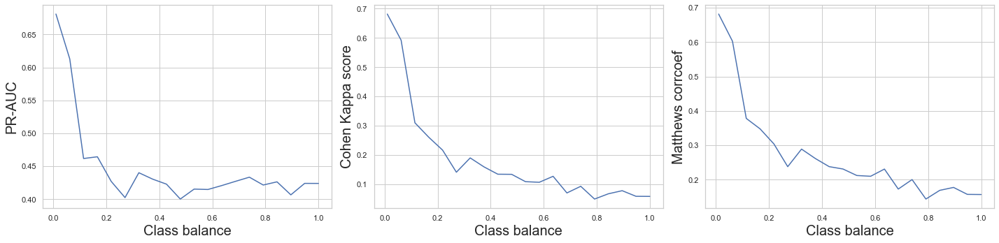

In [85]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

sns.lineplot(y=auc_pr, x=sampling_w, ax=axes[0])
axes[0].set_xlabel('Сlass balance', fontsize=20)
axes[0].set_ylabel('PR-AUC', fontsize=20)

sns.lineplot(y=cohen_kappa_s, x=sampling_w, ax=axes[1])
axes[1].set_xlabel('Сlass balance', fontsize=20)
axes[1].set_ylabel('Cohen Kappa score', fontsize=20)

sns.lineplot(y=matthews_c, x=sampling_w, ax=axes[2])
axes[2].set_xlabel('Сlass balance', fontsize=20)
axes[2].set_ylabel('Matthews corrcoef', fontsize=20)

plt.tight_layout()
plt.show()

In [70]:
us = RandomUnderSampler(sampling_strategy=0.01)
X_train_us, y_train_us = us.fit_resample(X_train, y_train)
cbc_us2 = CatBoostClassifier(iterations=1000, l2_leaf_reg=1, learning_rate=0.1, metric_period=100)
cbc_us2.fit(X_train_us, y_train_us)
y_pred = cbc_us2.predict(X_test)

0:	learn: 0.4401066	total: 17.2ms	remaining: 17.2s
100:	learn: 0.0037702	total: 1.43s	remaining: 12.7s
200:	learn: 0.0012244	total: 3.01s	remaining: 12s
300:	learn: 0.0004898	total: 4.41s	remaining: 10.2s
400:	learn: 0.0002805	total: 5.71s	remaining: 8.54s
500:	learn: 0.0001913	total: 6.9s	remaining: 6.88s
600:	learn: 0.0001394	total: 8.12s	remaining: 5.39s
700:	learn: 0.0001143	total: 9.32s	remaining: 3.97s
800:	learn: 0.0001016	total: 10.5s	remaining: 2.6s
900:	learn: 0.0000985	total: 11.5s	remaining: 1.26s
999:	learn: 0.0000985	total: 12.5s	remaining: 0us


In [71]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.7153
Cohen kappa score: 0.7141
Matthews corrcoef: 0.7149


Даже такой наивный подход может дать относительно неплохие результаты и улучшить наши метрики. Тем не менее, сейчас мы никак не используем информацию о распределении объектов в выборке. Оказывается, что даже относительно простые эвристические правила могут заметно поднять нам качество - например, мы можем при отбрасывании использовать близость отдельных объектов мажорного класса к минорному и отбрасывать самые близкие. Протестируйте алгоритм [Near-Miss](https://www.site.uottawa.ca/~nat/Workshop2003/jzhang.pdf) на наших данных и постройте графики, аналогичные предыдущему пункту (также добавьте график с зависимостью качества от числа соседей).

In [26]:
from imblearn.under_sampling import NearMiss

#your code here

In [15]:
sampling_w = np.linspace(1e-2, 1, 15)
n_neib = list(range(3, 20, 2))
auc_pr = []
cohen_kappa_s = []
matthews_c = []

for w in tqdm(sampling_w):
    auc_i = []
    cohen_i = []
    matthews_i = []
    for n in n_neib:
        n_m = NearMiss(sampling_strategy=w, n_neighbors=n)
        X_train_us, y_train_us = n_m.fit_resample(X_train, y_train)
        cbc_nm = CatBoostClassifier(iterations=1000, l2_leaf_reg=1, learning_rate=0.1, metric_period=1000)
        cbc_nm.fit(X_train_us, y_train_us)
        y_pred = cbc_nm.predict(X_test)
        
        pr, rec, _ = precision_recall_curve(y_test, y_pred)
        auc_i.append(auc(pr, rec))
        cohen_i.append(cohen_kappa_score(y_test, y_pred))
        matthews_i.append(matthews_corrcoef(y_test, y_pred))
    auc_pr.append(auc_i)
    cohen_kappa_s.append(cohen_i)
    matthews_c.append(matthews_i)

0:	learn: 0.4385958	total: 176ms	remaining: 2m 55s
999:	learn: 0.0001484	total: 8.3s	remaining: 0us
0:	learn: 0.4385273	total: 10.3ms	remaining: 10.3s
999:	learn: 0.0001452	total: 7.97s	remaining: 0us
0:	learn: 0.4383799	total: 9.47ms	remaining: 9.46s
999:	learn: 0.0001147	total: 8.19s	remaining: 0us
0:	learn: 0.4384514	total: 10.3ms	remaining: 10.3s
999:	learn: 0.0001188	total: 9.25s	remaining: 0us
0:	learn: 0.4385838	total: 12ms	remaining: 12s
999:	learn: 0.0001129	total: 8.95s	remaining: 0us
0:	learn: 0.4385958	total: 10.3ms	remaining: 10.3s
999:	learn: 0.0000990	total: 8.67s	remaining: 0us
0:	learn: 0.4384981	total: 11.5ms	remaining: 11.5s
999:	learn: 0.0000964	total: 8.59s	remaining: 0us
0:	learn: 0.4393730	total: 10.6ms	remaining: 10.6s
999:	learn: 0.0000840	total: 8.82s	remaining: 0us
0:	learn: 0.4398172	total: 10.3ms	remaining: 10.3s
999:	learn: 0.0000928	total: 8.71s	remaining: 0us
0:	learn: 0.5044037	total: 5.06ms	remaining: 5.05s
999:	learn: 0.0004036	total: 4.32s	remaining:

999:	learn: 0.0014301	total: 3.89s	remaining: 0us
0:	learn: 0.5500429	total: 4.35ms	remaining: 4.34s
999:	learn: 0.0013973	total: 3.92s	remaining: 0us
0:	learn: 0.5513642	total: 4.78ms	remaining: 4.78s
999:	learn: 0.0008541	total: 3.97s	remaining: 0us
0:	learn: 0.5383302	total: 4.57ms	remaining: 4.57s
999:	learn: 0.0006812	total: 3.99s	remaining: 0us
0:	learn: 0.5374421	total: 4.61ms	remaining: 4.6s
999:	learn: 0.0006314	total: 3.84s	remaining: 0us
0:	learn: 0.5323113	total: 4.58ms	remaining: 4.58s
999:	learn: 0.0004743	total: 3.92s	remaining: 0us
0:	learn: 0.5409222	total: 4.42ms	remaining: 4.41s
999:	learn: 0.0006981	total: 3.92s	remaining: 0us
0:	learn: 0.5374484	total: 4.81ms	remaining: 4.81s
999:	learn: 0.0007355	total: 3.89s	remaining: 0us
0:	learn: 0.5373942	total: 4.54ms	remaining: 4.54s
999:	learn: 0.0005742	total: 3.95s	remaining: 0us
0:	learn: 0.5421180	total: 4.79ms	remaining: 4.78s
999:	learn: 0.0015629	total: 3.96s	remaining: 0us
0:	learn: 0.5454443	total: 4.47ms	remainin

In [21]:
auc_pr = np.array(auc_pr)
cohen_kappa_s = np.array(cohen_kappa_s)
matthews_c = np.array(matthews_c)

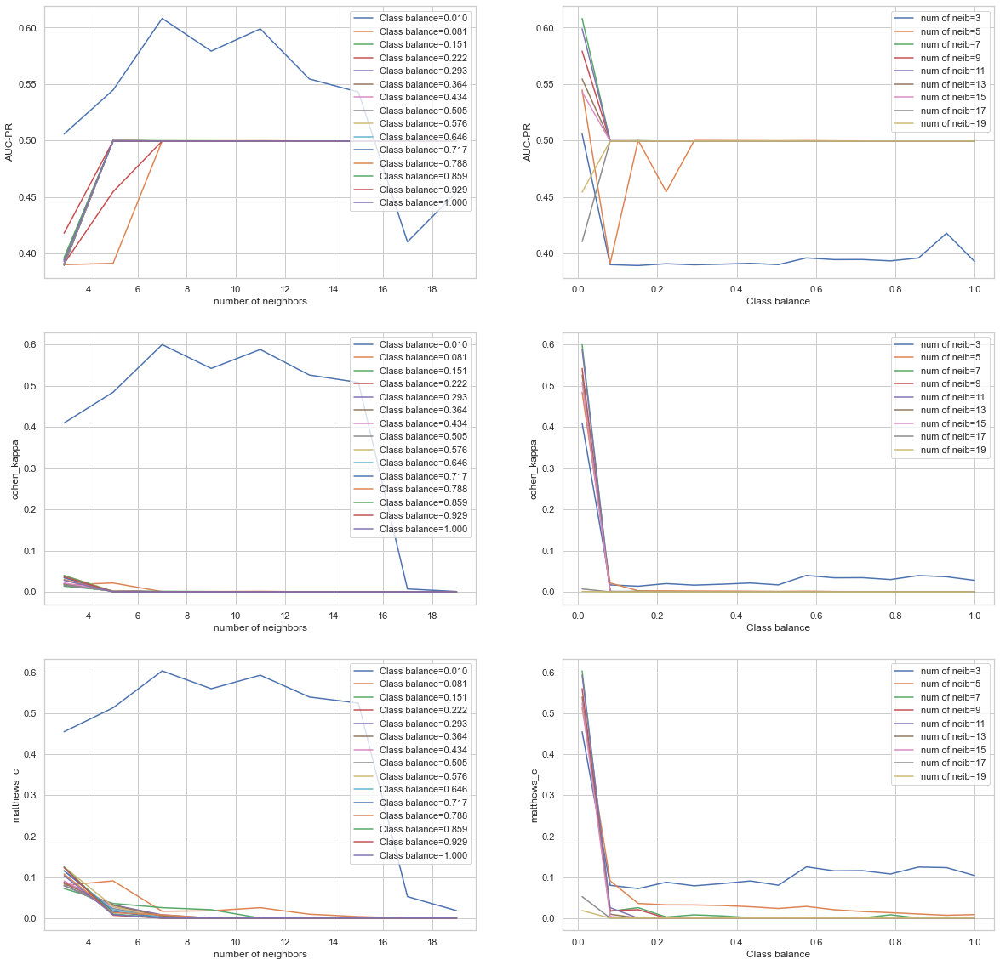

In [45]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 20))

ax[0][0].set(xlabel='number of neighbors', ylabel='AUC-PR')
for i in range(len(sampling_w)):
    ax[0][0].plot(n_neib, auc_pr[i], label="Сlass balance=%.3f"%(sampling_w[i],))
ax[0][0].legend(loc='upper right')

ax[0][1].set(xlabel='Сlass balance', ylabel='AUC-PR')
for j in range(len(n_neib)):
    ax[0][1].plot(sampling_w, auc_pr[:, j], label="num of neib=%d"%(n_neib[j],))
ax[0][1].legend(loc='upper right')


ax[1][0].set(xlabel='number of neighbors', ylabel='cohen_kappa')
for i in range(len(sampling_w)):
    ax[1][0].plot(n_neib, cohen_kappa_s[i], label="Сlass balance=%.3f"%(sampling_w[i],))
ax[1][0].legend(loc='upper right')

ax[1][1].set(xlabel='Сlass balance', ylabel='cohen_kappa')
for j in range(len(n_neib)):
    ax[1][1].plot(sampling_w, cohen_kappa_s[:, j], label="num of neib=%d"%(n_neib[j],))
ax[1][1].legend(loc='upper right')



ax[2][0].set(xlabel='number of neighbors', ylabel='matthews_c')
for i in range(len(sampling_w)):
    ax[2][0].plot(n_neib, matthews_c[i], label="Сlass balance=%.3f"%(sampling_w[i],))
ax[2][0].legend(loc='upper right')

ax[2][1].set(xlabel='Сlass balance', ylabel='matthews_c')
for j in range(len(n_neib)):
    ax[2][1].plot(sampling_w, matthews_c[:, j], label="num of neib=%d"%(n_neib[j],))
ax[2][1].legend(loc='upper right')

*Видно, что наилучшее качество достигается для баланса классов равному 0.1 (вообще ещё для 0.005 хорошо выглядит, но я случайно дропнул, не хочется перерисовывать).
Для количеста соседей уже потяжелее. В целом, на 3 из 4 графиков выигрывает n_neib=3, кроме первого графика. Но, если учесть факт того, что балан склассов будем брать примерно 0.1 (а на графиках рассматривали в большем диапозоне значение баланса классов. То есть графики для n_neib лучше всего рассматривать в окрестности 0.1), то n_neib=3 выглядит разумным выбором*

In [32]:
np.linspace(9e-3, 1e-2, 10)

array([0.009     , 0.00911111, 0.00922222, 0.00933333, 0.00944444,
       0.00955556, 0.00966667, 0.00977778, 0.00988889, 0.01      ])

In [29]:
sampling_w = np.linspace(9e-3, 1e-2, 10)
n_neib = list(range(1, 10))
auc_pr = []
cohen_kappa_s = []
matthews_c = []

for w in tqdm(sampling_w):
    auc_i = []
    cohen_i = []
    matthews_i = []
    for n in n_neib:
        n_m = NearMiss(sampling_strategy=w, n_neighbors=n)
        X_train_us, y_train_us = n_m.fit_resample(X_train, y_train)
        cbc_nm = CatBoostClassifier(iterations=1000, l2_leaf_reg=1, learning_rate=0.1, metric_period=1000)
        cbc_nm.fit(X_train_us, y_train_us)
        y_pred = cbc_nm.predict(X_test)
        
        pr, rec, _ = precision_recall_curve(y_test, y_pred)
        auc_i.append(auc(pr, rec))
        cohen_i.append(cohen_kappa_score(y_test, y_pred))
        matthews_i.append(matthews_corrcoef(y_test, y_pred))
    auc_pr.append(auc_i)
    cohen_kappa_s.append(cohen_i)
    matthews_c.append(matthews_i)

0:	learn: 0.4334601	total: 17.8ms	remaining: 17.8s
999:	learn: 0.0000835	total: 12.7s	remaining: 0us
0:	learn: 0.4342961	total: 19.1ms	remaining: 19.1s
999:	learn: 0.0001252	total: 12.6s	remaining: 0us
0:	learn: 0.4345502	total: 16ms	remaining: 16s
999:	learn: 0.0000956	total: 12.8s	remaining: 0us
0:	learn: 0.4341370	total: 23.1ms	remaining: 23.1s
999:	learn: 0.0000964	total: 12.7s	remaining: 0us
0:	learn: 0.4342076	total: 14.2ms	remaining: 14.2s
999:	learn: 0.0001700	total: 11.9s	remaining: 0us
0:	learn: 0.4342034	total: 13.4ms	remaining: 13.4s
999:	learn: 0.0001113	total: 12.6s	remaining: 0us
0:	learn: 0.4342634	total: 16.4ms	remaining: 16.4s
999:	learn: 0.0001044	total: 12.8s	remaining: 0us
0:	learn: 0.4344389	total: 14.1ms	remaining: 14.1s
999:	learn: 0.0001244	total: 12.6s	remaining: 0us
0:	learn: 0.4342153	total: 14.9ms	remaining: 14.9s
999:	learn: 0.0001148	total: 12.1s	remaining: 0us
0:	learn: 0.4339538	total: 14.5ms	remaining: 14.5s
999:	learn: 0.0000799	total: 12.8s	remaining

0:	learn: 0.4389679	total: 14.8ms	remaining: 14.8s
999:	learn: 0.0001585	total: 13s	remaining: 0us
0:	learn: 0.4385958	total: 14.3ms	remaining: 14.3s
999:	learn: 0.0001484	total: 13.8s	remaining: 0us
0:	learn: 0.4386744	total: 16.4ms	remaining: 16.4s
999:	learn: 0.0001283	total: 12.9s	remaining: 0us
0:	learn: 0.4385273	total: 14.1ms	remaining: 14.1s
999:	learn: 0.0001452	total: 12.4s	remaining: 0us
0:	learn: 0.4385630	total: 13.9ms	remaining: 13.9s
999:	learn: 0.0001473	total: 12.5s	remaining: 0us
0:	learn: 0.4383799	total: 13.8ms	remaining: 13.7s
999:	learn: 0.0001147	total: 12.7s	remaining: 0us
0:	learn: 0.4382236	total: 14.3ms	remaining: 14.3s
999:	learn: 0.0001144	total: 12.9s	remaining: 0us
0:	learn: 0.4384514	total: 14.6ms	remaining: 14.6s
999:	learn: 0.0001188	total: 12.9s	remaining: 0us



In [30]:
auc_pr = np.array(auc_pr)
cohen_kappa_s = np.array(cohen_kappa_s)
matthews_c = np.array(matthews_c)

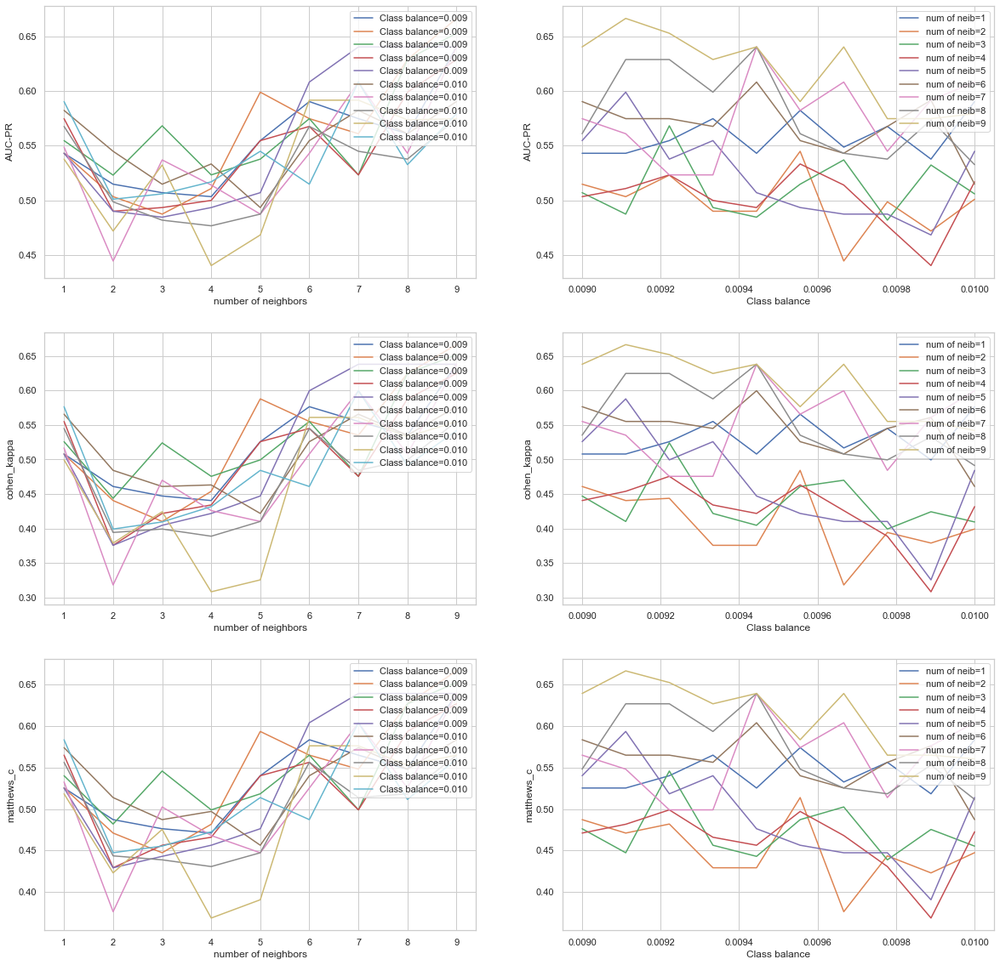

In [31]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 20))

ax[0][0].set(xlabel='number of neighbors', ylabel='AUC-PR')
for i in range(len(sampling_w)):
    ax[0][0].plot(n_neib, auc_pr[i], label="Сlass balance=%.3f"%(sampling_w[i],))
ax[0][0].legend(loc='upper right')

ax[0][1].set(xlabel='Сlass balance', ylabel='AUC-PR')
for j in range(len(n_neib)):
    ax[0][1].plot(sampling_w, auc_pr[:, j], label="num of neib=%d"%(n_neib[j],))
ax[0][1].legend(loc='upper right')


ax[1][0].set(xlabel='number of neighbors', ylabel='cohen_kappa')
for i in range(len(sampling_w)):
    ax[1][0].plot(n_neib, cohen_kappa_s[i], label="Сlass balance=%.3f"%(sampling_w[i],))
ax[1][0].legend(loc='upper right')

ax[1][1].set(xlabel='Сlass balance', ylabel='cohen_kappa')
for j in range(len(n_neib)):
    ax[1][1].plot(sampling_w, cohen_kappa_s[:, j], label="num of neib=%d"%(n_neib[j],))
ax[1][1].legend(loc='upper right')



ax[2][0].set(xlabel='number of neighbors', ylabel='matthews_c')
for i in range(len(sampling_w)):
    ax[2][0].plot(n_neib, matthews_c[i], label="Сlass balance=%.3f"%(sampling_w[i],))
ax[2][0].legend(loc='upper right')

ax[2][1].set(xlabel='Сlass balance', ylabel='matthews_c')
for j in range(len(n_neib)):
    ax[2][1].plot(sampling_w, matthews_c[:, j], label="num of neib=%d"%(n_neib[j],))
ax[2][1].legend(loc='upper right')

In [33]:
np.linspace(9e-3, 1e-2, 10)

array([0.009     , 0.00911111, 0.00922222, 0.00933333, 0.00944444,
       0.00955556, 0.00966667, 0.00977778, 0.00988889, 0.01      ])

*уже по этим графикам видно (если сильно постараться), что оптимально будет взять n_neib=9 и баланс классов = 0.00911*

**Бонус (1 балл)**. imblearn также предлагает много различных методов для андерсэмплинга. Выберите что-нибудь еще из предлагаемого на свой вкус, опишите идею метода и протестируйте его.



*вообще в under_sampling лежат методы: TomekLinks EditedNearestNeighbours CondensedNearestNeighbour InstanceHardnessThreshold.
Изначально я хотел обучить CondensedNearestNeighbour, но на всех данных он нереально долго работал (может быть я что-то не так сделал или комп шалил). На выборке в 1000 он быстро отработал, а вот на всех данных он даже за 40 минут не справился.*

*Основная суть метода InstanceHardnessThreshold:
строиться ансамбль из классификатором. Потом для каждого из объектов смотрим на среднюю точность его предсказания по этим классификаторам. Чем сложнее классификаторам понять, к какому классу относиться данных объект, тем более "жёстким" считается. Соответсвенно, самые жёсткие объекты мы и выбрасываем (что очень логично).
(на самом деле очень простая и красивая идея, мне понравилось)*

In [26]:
from sklearn.neighbors import KNeighborsClassifier
from imblearn.under_sampling import InstanceHardnessThreshold
iht = InstanceHardnessThreshold(cv=3, sampling_strategy=0.05, estimator=KNeighborsClassifier(), random_state=47)
X_train_iht, y_train_iht = iht.fit_resample(X_train, y_train)
cb_clf = CatBoostClassifier(iterations=1000, l2_leaf_reg=3, learning_rate=0.7, metric_period=250)
cb_clf.fit(X_train_iht, y_train_iht)
y_pred = cb_clf.predict(X_test)
counting_metrics(y_test, y_pred)

0:	learn: 0.0095254	total: 44.2ms	remaining: 44.1s
250:	learn: 0.0000461	total: 10.2s	remaining: 30.5s
500:	learn: 0.0000192	total: 20.1s	remaining: 20s
750:	learn: 0.0000167	total: 29s	remaining: 9.62s
999:	learn: 0.0000158	total: 38.7s	remaining: 0us
AUC-PR:		   0.8074
Cohen kappa score: 0.7999
Matthews corrcoef: 0.8039


*очень даже хорошее качество, по сравнению с предыдущими модельками!*

**Бонус (2 балла)**. Сможете ли вы с помощью комбинации любых методов оверсэмплинга, андерсэмплинга и классификации набрать 0.8 на всех трех метриках?

*следующий блок - просто объединение неоходимых ячеек, которые были выше. Приходилось перезапускать ядро, а каждый раз искать и запускать какое-то количество ячеек не очень-то и приятно*

In [14]:
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import auc, average_precision_score, cohen_kappa_score, matthews_corrcoef
from sklearn.metrics import precision_recall_curve, recall_score, precision_score, roc_curve
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

sns.set(style='whitegrid')

df = pd.read_csv('creditcard.csv')

df_sorted = df.sort_values('Time')

# Определение границы, отделяющей последние 20% транзакций
split_index = int(len(df_sorted) * 0.8)

# Разделение последних 20% транзакций на валидационную и тестовую выборки
validation_data, test_data = train_test_split(df_sorted[split_index:], test_size=0.5, shuffle=False)
train_data = df_sorted[:split_index]

X_train = train_data.drop('Class', axis=1)
y_train = train_data['Class']
X_test = test_data.drop('Class', axis=1)
y_test = test_data['Class']
X_val = validation_data.drop('Class', axis=1)
y_val = validation_data['Class']

def counting_metrics(y_test, y_pred):
    pr, rec, _ = precision_recall_curve(y_test, y_pred)
    print('AUC-PR:\t\t   %.4f' % auc(pr, rec))
    print('Cohen kappa score: %.4f' % cohen_kappa_score(y_test, y_pred))
    print('Matthews corrcoef: %.4f' % matthews_corrcoef(y_test, y_pred))
    return

*моделька, которая выдаёт >0.8 на всех 3 метриках*

In [15]:
ov = SMOTE(sampling_strategy=0.005, random_state=0)
X_train_os, y_train_os = ov.fit_resample(X_train, y_train)
best = CatBoostClassifier(depth=6, iterations=1000, l2_leaf_reg=3, learning_rate=0.71457, metric_period=250)
best.fit(X_train_os, y_train_os)
y_pred = best.predict(X_test)
counting_metrics(y_test, y_pred)

0:	learn: 0.0133921	total: 40.8ms	remaining: 40.7s
250:	learn: 0.0000609	total: 10.9s	remaining: 32.6s
500:	learn: 0.0000582	total: 19.1s	remaining: 19.1s
750:	learn: 0.0000465	total: 29.3s	remaining: 9.72s
999:	learn: 0.0000452	total: 37.6s	remaining: 0us
AUC-PR:		   0.8336
Cohen kappa score: 0.8204
Matthews corrcoef: 0.8272


*поплясать с бубном пришлось знатно, но зато всё наконец таки сошлось*

# Часть 2. Поиск аномалий. 

Как вы могли заметить, методы балансировки выборок очень часто могут привести к не самым лучшим результатам из-за того, что они по сути искажают информацию о реальном распределении данных - в реальности обычно требуется долгий подбор в принципе работоспособных для задачи методов и их аккуратная настройка. 

Теперь давайте попробуем слегка сменить постановку задачи и переключиться на задачу "одноклассовой" классификации, то есть - поиска *аномалий* в выборке. В общем-то, это вполне согласуется с нашей областью работы - мы действительно можем назвать мошеннические транзакции аномальньми (как интуитивно, так и на основании наблюдаемой балансировки данных). 

Стоит отметить, что методы обнаружения аномалий чаще всего относятся к классу методов обучения без учителя. Это дает некоторый положительный эффект - нам не обязательно нужно тратить время на разметку данных (тем не менее, для контроля качества какую-то часть разметить все-таки придется). Впрочем, чаще всего перфоманс таких методов оказывается заметно хуже, чем у честного обучения с учителем (если мы можем себе его позволить).



**Задание 4. (3 балла).** На занятиях вы разбирали схожий с Random Forest подход для детекции аномалий без известной разметки данных, называемый Isolation Forest. Напомним суть: на этапе обучения мы создаем ансамбль из решающих деревьев, в котором признак и порог на каждую вершину подбираются случайно. Затем мы считаем для объектов оценку аномальности через длину пути до соответствующего листа в каждом дереве.

В данном задании вам предлагается реализовать модификацию данного алгоритма, известную как Extended Isolation Forest. В ней мы на каждом шаге будем определять не порог для признака, а полноценную случайную гиперплоскость, разбивающую выборку на 2 части. С детальным описанием вы можете ознакомиться [здесь](https://arxiv.org/pdf/1811.02141.pdf).

Ниже приведен шаблон кода. Постарайтесь работать в его рамках (минорные изменения вполне допустимы, главное не переворачивайте всю структуру с ног на голову). 

**NB**: будем считать, что в нашем датасете нет категориальных признаков - можете не заморачиваться с их обработкой (но в общем случае, это будет важно).

**Советы**:
 - Численные признаки лучше предобработать надлежащим образом.
 - Возможно, вам поможет выбрасывание некоторых признаков.
 - Внимательно следите за знаками.
 - Не игнорируйте документирующие строки.
 - Вероятнее всего, вы не сможете приблизиться по качеству к supervised-решениям. Если у вас не получается это сделать (но вы уверены в своей правоте), не стоит тратить слишком много времени на поиск ошибок.



**Бонусы (каждый по 0.5)**:
- Сделайте ваш EIF параллельным (`multiprocessing`, `joblib`).
- Добавьте возможность откатиться к дефолтному варианту Isolation Forest. (порассуждайте, как можно реализовать это в данной модели?):


*не делал это задание*

In [ ]:
def c_factor(n):
    """
    Computes average path length for an unsuccessful search in a binary search tree.
    Params:
        n: int - number of data points for BST
    """
    #your code here

def calc_height(X, depth, node):
    """
    Calculates anomaly scores for sample in a recursive manner.
    Params:
        X: np.array - current sample, available to node
        
        depth: int - path length up to current node
        
        node: Node - current tree node
        
    Returns:
        scores: int, float or np.array - anomaly scores for sample
    """
    scores = np.zeros(X.shape[0])

    #your code here


class Node(object):
    """
    A single node object for each tree. Contains information on height, current data,
    splitting hyperplane and children nodes.
    
    Attributes:
        X: np.array - data available to current node
        size: int - length of available data
        
        depth: int - depth of node

        left: Node - left child
        right: Node - right child

        kind: str - either "internal" or "external", indicates the type of current node

        w: np.array - normal vector for the splitting hyperplane
        b: float - intercept term for the splitting hyperplane
    """
    def __init__(self, X, depth, left, right, kind, w, b):
        """
        Node(h, left, right, kind, w, b)
        Represents the node object.
        
        Params:
            X: np.array - data available to current node
            depth: int - depth of node
            
            left: Node - left child
            right: Node - right child
            
            kind: str - either "internal" or "external", indicates the type of current node
            
            w: np.array - normal vector for the splitting hyperplane
            b: float - intercept term for the splitting hyperplane
            
        """
        self.size = len(X)
        
        self.depth = depth
        
        self.left = left
        self.right = right
        
        self.kind = kind
    
        self.w = w
        self.b = b
    
    def __repr__(self):
        """
        For convenience only.
        """
        return f"Node(size={self.size}, depth={self.depth}, kind={self.kind})"

class RandomizedTree(object):
    """
    Single randomized tree object. Stores root and its depth (tree is built recursively).
    Attributes:
        depth: int - current tree depth
        
        max_depth: int - maximum tree depth
        
        root: Node - root node 

        internal_count: int - number of internal nodes

        external_count: int - number of external nodes
        
    """
    def __init__(self, X, max_depth):
        """
        Single randomized tree object. Stores root and its depth (tree is built recursively).
        Params:
            X: np.array - train sample
            max_depth: int - maximum tree depth

        """
        self.depth = 0
        self.max_depth = max_depth
        
        self.internal_count = 0
        self.external_count = 0

        self.root = self.grow(X, 0)
        
    def __repr__(self):
        """
        For convenience only.
        """
        
        return f"RandomizedTree(depth={self.depth}, max_depth={self.max_depth}, n_internal={self.internal_count}, n_external={self.external_count})"

        
        
    def grow(self, X, depth):
        """
        Grow tree in a recursive manner.
        Params:
            X: np.array - available train sample
            
            depth: int - current tree depth
            
        Returns:
            node: Node - a trained node with separating hyperplane data.
                         Node provides access to children if necessary (these are built recursively)
        """
        #your code here
            
        return Node(X, depth, left, right, kind, w, b)

    def score_samples(self, X):
        """
        Calculate anomaly scores for given data. You may utilize outer function `calc_height`.
        Params:
            X: np.array - data to be evaluated
            
        Returns:
            scores: np.array - estimated anomaly scores
        """
        #your code here

        return scores
        
    
class ExtendedIsolationForest(object):
    """
    Extended Isolation Forest object. Stores training data and trained randomized trees.
    Attributes:
        n_trees: int - number of Randomized Trees
        
        max_depth: int - maximum depth of each tree
        
        subsample_rate: float - draw `subsample_rate * X.shape[0]` samples for each tree
        
        trees: list - container for trained trees 
        
        contamination: float - estimated fraction of anomaly samples in data. Used for thresholding
        
    """
    
    def __init__(self, n_trees, subsample_rate, max_depth=None, contamination=0.01):
        """
        Extended Isolation Forest object. Stores training data and trained randomized trees.
        Params:
            n_trees: int - number of Randomized Trees

            subsample_rate: float - draw `subsample_rate * X.shape[0]` samples for each tree

            max_depth: int or None - maximum depth of each tree. Defaults to ceil(log_2(subsample_size)) if not provided

            contamination: float - estimated fraction of anomaly samples in data. Used for thresholding

        """
        self.n_trees = n_trees
        self.max_depth = max_depth
        self.subsample_rate = subsample_rate
        self.trees = []
        self.contamination = contamination
        self.is_fit = False
        
    def __repr__(self):
        """For convenience only."""
        
        return f"ExtendedIsolationForest(n_trees={self.n_trees}, max_depth={self.max_depth}, subsample_rate={self.subsample_rate}, contamination={self.contamination}, is_fit={self.is_fit})"
        
    def fit(self, X):
        """
        Fit EIF to new data.
        Params:
            X: np.array - 2d array of samples
        """
        #your code here
        return self
    
    def score_samples(self, X):
        """
        Estimate (normalized) anomaly score for each given sample
        Params:
            X: np.array - new samples

        Returns:
            scores: np.array - anomaly scores (larger value means higher probability of a sample being an outlier)
        """
        #your code here

        return scores

    
    def predict(self, X):
        """
        Predict if given samples are outliers.
        Params:
            X: np.array - new samples

        Returns:
            labels: np.array - anomaly labels (1 for outliers, 0 for inliers)
        """
        #your code here

        return labels


**Задание 5. (1 балл).** Протестируйте вашу реализацию EIF и подберите оптимальные гиперпараметры (наш метод не использует разметку, поэтому можете попробовать делать это на обучающей выборке). Сравните ее с обычным IF из `sklearn` (желательно делать это на одних и тех же параметрах). Удалось ли сделать лучше?

In [17]:
from sklearn.ensemble import IsolationForest
sk_IF = IsolationForest(n_estimators=100, max_samples='auto', contamination='auto', n_jobs=-1, random_state=0)
sk_IF.fit(X_train)
y_pred = sk_IF.predict(X_test)

In [18]:
y_pred

array([ 1, -1,  1, ...,  1,  1,  1])

In [19]:
y_pred = (y_pred * (-1) + 1)//2
y_pred

array([0, 1, 0, ..., 0, 0, 0], dtype=int32)

In [20]:
counting_metrics(y_test, y_pred)

AUC-PR:		   0.3488
Cohen kappa score: 0.0318
Matthews corrcoef: 0.1047


Возможно, ваш алгоритм выдал большие оценки объектам с негативной разметкой. Постарайтесь выбрать несколько таких объектов и доступно объяснить (= с кодом и графиками), почему так вышло:

In [ ]:
# не реализовывал EIF(

**Задание 6. (1 балл).** `sklearn` также предлагает нам и другие методы для поиска аномалий. В этом задании мы предлагаем вам сделать следующее:

Для начала попробуйте использовать методы Local Outlier Factor и One-Class SVM. Сравните результаты с IF и EIF.  

*LocalOutlierFactor надо смотреть на всех данных*

In [22]:
from sklearn.neighbors import LocalOutlierFactor
LOF = LocalOutlierFactor(leaf_size=50, novelty=True, n_jobs=-1)
LOF.fit(X_train)
y_pred = LOF.predict(X_test)
y_pred = (y_pred * (-1) + 1)//2
counting_metrics(y_test, y_pred)

C:\Users\Asus\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(


AUC-PR:		   0.4996
Cohen kappa score: 0.0000
Matthews corrcoef: 0.0000


*OneClassSVM надо обучать только на нормальных данных (не мошеннических)*

In [21]:
from sklearn.svm import OneClassSVM
SVM = OneClassSVM(nu=0.002)
SVM.fit(X_train[y_train==0])
y_pred = SVM.predict(X_test)
y_pred = (y_pred * (-1) + 1)//2
counting_metrics(y_test, y_pred)

AUC-PR:		   0.4996
Cohen kappa score: 0.0000
Matthews corrcoef: 0.0000


У вас началась депрессия из-за плохих метрик? Не беда! Сейчас давайте сделаем так: все методы, опробованные в этой части, попробуем задействовать для создания дополнительных признаков в данных. Проделайте это (не забудьте, что обучаться здесь нужно на трейне). Теперь возьмите лучшую модель из предыдущей части и обучите на новых данных. Смогли ли unsupervised-методы повысить вам качество?

In [23]:
X_train_if = sk_IF.fit(X_train[y_train==0]).score_samples(X_train)
X_test_if = sk_IF.score_samples(X_test)
X_train_svm = SVM.fit(X_train[y_train==0]).score_samples(X_train)
X_test_svm = SVM.score_samples(X_test)
np.corrcoef(X_train_if, X_train_svm)

array([[ 1.        , -0.10903982],
       [-0.10903982,  1.        ]])


1. проверили, что IF и OC-SVM не сильно скоррелированы, можно пихнуть обоих в обучающую выборку.
2. Полученные данных на обучающей выборке при помощи LocalOutlierFactor нет смысла пихать в обучающую выборку, да и не получится вытащить какие-то данные при помощи этого метода их test_data, которые будут учидывать train_data (не очень хорошо получилось объяснить). LocalOutlierFactor фактически сравнивает расстояние от объекта, до его ближайших соседий с расстояними до ближайших соседей ближайших соседей объекта. То есть это специфачная мера объекта, для какого-то определённого множества. Можно конечно же попробовать пихнуть значения LocalOutlierFactor в train_data, посчиать  LocalOutlierFactor на teat_data и тоже пихнуть эти значения в teat_data, а уже только поверх этого применять модель, но это звучит очень сранного и как мне кажется, особого смысла не имеет (люди в интернете говорят примерно тоже самое). Вообще, LocalOutlierFactor хорошо подойдёт в том случае, если мы не знаем, какие данные являются мошенническими, а какие обычными. В таком случае можно выбрать порог, с котого будем говорить, что если значение LocalOutlierFactor на объекте > порога => мошенник (всё, голова поплыла, надеюсь понятно написал)


In [24]:
from copy import deepcopy
X_train_new = deepcopy(X_train)
X_test_new = deepcopy(X_test)
X_val_new = deepcopy(X_val)

X_train_new['svm'] = X_train_svm
X_train_new['if'] = X_train_if

X_test_new['svm'] = X_test_svm
X_test_new['if'] = X_test_if

X_val_new['svm'] = SVM.score_samples(X_val)
X_val_new['if'] = sk_IF.score_samples(X_val)

In [25]:
ov = SMOTE(sampling_strategy=0.005, random_state=1)
X_train_os, y_train_os = ov.fit_resample(X_train_new, y_train)
cb_clf = CatBoostClassifier(depth=6, iterations=1000, l2_leaf_reg=3, learning_rate=0.71457, metric_period=1000)
cb_clf.fit(X_train_os, y_train_os)
y_pred = cb_clf.predict(X_test_new)
counting_metrics(y_test, y_pred)

0:	learn: 0.0136891	total: 56.4ms	remaining: 56.4s
999:	learn: 0.0002221	total: 42.6s	remaining: 0us
AUC-PR:		   0.7840
Cohen kappa score: 0.7803
Matthews corrcoef: 0.7824


*не помогло. По хорошему тут подобрать гиперпараметры, но я уже не успеваю*

**Бонус. (0.1 балла).**

При сдаче проверяющий запустит следующую клетку один раз. Если она даст положительный результат, вы получите 0.1 бонусных балла. Если она даст отрицательный результат, вы получите -0.1 бонусных балла. 

Если вы хотите отказаться от сдачи данного задания, допишите "хочу" после двоеточия: `хочу`

Ниже вы можете попрактиковаться и оценить ваши силы (изменять код ячейки запрещается!)

In [ ]:
import random

rng = random.SystemRandom(0)
rng.uniform(-1.0, 1.0)